# Multi-modal Fine-tuning - Qwen VL Models

Built by [Trelis.com](https://Trelis.com). Find us on [HuggingFace](https://huggingface.co/Trelis) and [GitHub](https://github.com/TrelisResearch).

This is a private notebook - available for purchase from Trelis.com .

---

## Qwen Specific Notes:
- For gradient checkpointing, setting use_reentrant to True gives issues of there being no gradients set.
- qkv in the vision tower cannot be trained without issues, possibly as qkv is fused (?).
- oddly, LoRA weights on the language model are set to 32 bit by default, and have to be manually set then to 16 bits.
- in formatting the data, it's critical not to mask the end of sequence token at the end of assistant responses.

---

Inspired by a base notebook available from HuggingFace [here](https://colab.research.google.com/drive/1rm3AGquGEYXfeeizE40bbDtcWh5S4Nlq?usp=sharing). With credit due to:
- [IDEFICS 2 blog](https://huggingface.co/blog/idefics2)
- *Hugo Laurençon and Lucile Saulnier and Léo Tronchon and Stas Bekman and Amanpreet Singh and Anton Lozhkov and Thomas Wang and Siddharth Karamcheti and Alexander M. Rush and Douwe Kiela and Matthieu Cord and Victor Sanh*

Other Qwen VL guide from hf:
- [here](https://huggingface.co/learn/cookbook/fine_tuning_vlm_trl)

---

## Getting Set Up
### Setup on an Ampere GPU (A40, A6000, A100, H100) with Cuda 12.1 and Pytorch 2.2.1 - RECOMMENDED.
Ampere architecture GPUs allow for the use of Flash Attention, which provides a speed up. Otherwise, you need to train with fp16 instead of bf16.

For the best reproducibility, run this script on an A40:
- Runpod one-click template [here](https://runpod.io/gsc?template=ifyqsvjlzj&ref=jmfkcdio) - easier setup.
- Vast.ai one-click template [here](https://cloud.vast.ai/?ref_id=98762&creator_id=98762&name=Fine-tuning%20Notebook%20by%20Trelis%20-%20Cuda%2012.1) - offers smaller GPUs (which are cheaper to run).

### GPU requirements for training

- On an A100 (80 GB) you can train on batch size one for Qwen 2B or 7B - probably this will also work on an A40 with 48 GB. For Qwen 72B, my guess is that you'll need 2x A100 or 6xA40.
- On a colab T4 you have to use quantization to fit the two smaller models in 15 GB (and even that may be tight, I haven't tested).

# Setup

We first setup the environment with the primary necessary libraries and login into Hugging Face.

In [ ]:
!python -m pip install --upgrade pip -q
!pip install -q transformers qwen-vl-utils
!pip install -q accelerate datasets peft bitsandbytes hf_transfer flash_attn tensorboard

# Can be a good idea to re-start the kernel after this

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.3/35.3 MB 109.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [qwen-vl-utils]
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 75.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.1/76.1 MB 126.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 142.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 153.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 80.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 87.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━

In [ ]:
# !pip freeze > requirements.txt

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Loading the model and the dataset

We load the model from the Hugging Face hub. `idefics2-8b` has gone through instruction fine-tuning on a large mixture of multimodal datasets and as such is a strong starting-point to fine-tune on your own use-case. We will start from this checkpoint.

Fine-tuning will be done on a small chess dataset.

In [ ]:
# Enable fast weights download and upload
import os
os.environ["HF_HUB_ENABLE_HF_TRANSFER"] = "1"
# os.environ["CUDA_VISIBLE_DEVICES"] = "0" # if you're connected to multiple gpus but only want to use one.

In [ ]:
# If in colab (or just don't install flash attention above).
# !pip uninstall flash-attn -y

In [ ]:
from transformers import AutoConfig

# Fetch configuration from Hugging Face model page
config = AutoConfig.from_pretrained("Qwen/Qwen2-VL-2B-Instruct")

# Verify the fetched configuration
print(config)


ValueError: The checkpoint you are trying to load has model type `qwen2_vl` but Transformers does not recognize this architecture. This could be because of an issue with the checkpoint, or because your version of Transformers is out of date.

In [ ]:
import json

# Define the path to save the configuration file
config_file_path = "/content/Qwen2VL_config.json"

# Save the configuration as a JSON file
config_dict = config.to_dict()

with open(config_file_path, 'w') as json_file:
    json.dump(config_dict, json_file, indent=4)

print(f"Configuration saved at {config_file_path}")


Configuration saved at /content/Qwen2VL_config.json


In [ ]:
import torch
from PIL import Image
from transformers import Qwen2VLForConditionalGeneration, AutoTokenizer, AutoProcessor
from qwen_vl_utils import process_vision_info
from transformers import BitsAndBytesConfig

# del model

DEVICE = 'cuda' # or 'mps' for mac

model_id = "Qwen/Qwen2-VL-2B-Instruct"
# Note that Florence 2 can be stronger than this model, and also smaller (~700M parameters).
# model_id = "Qwen/Qwen2-VL-7B-Instruct"
# model_id = "Qwen/Qwen2-VL-72B-Instruct"

# Define the quantization configuration with NF4 and double quantization
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,             # Use 4-bit quantization (NF4)
    bnb_4bit_quant_type="nf4",     # Set quantization type to NF4
    bnb_4bit_use_double_quant=True # Enable double quantization
)

model = Qwen2VLForConditionalGeneration.from_pretrained(
    model_id,
    torch_dtype=torch.bfloat16, #float16 for colab.
    attn_implementation="flash_attention_2" if DEVICE == 'cuda' else 'eager', # if not in colab.
    device_map=DEVICE,
    # quantization_config=quant_config, # for colab
)

processor = AutoProcessor.from_pretrained(model_id)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.20k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/56.4k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model-00001-of-00002.safetensors:   0%|          | 0.00/3.99G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/429M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/272 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/347 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

In [ ]:
# # Iterate through all parameters and print their dtype
# for name, param in model.named_parameters():
#     print(f"Layer: {name}, dtype: {param.dtype}")

In [ ]:
print(processor.tokenizer.model_max_length)
processor.tokenizer.model_max_length=16290 # or you'll run out of VRAM on larger models

32768


In [ ]:
# Example conversation input with user and assistant roles. Just to test the chat template.
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "What do you see in this image?"},
            {"type": "image"},
        ]
    },
    {
        "role": "assistant",
        "content": [
            {"type": "text", "text": "This is a chessboard with pieces."}
        ]
    },
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "What pieces do you see?"}
        ]
    }
]

# Apply the chat template to format the messages
formatted_text = processor.apply_chat_template(messages, add_generation_prompt=False)

# Output the formatted text
print("Formatted text:\n", formatted_text)

Formatted text:
 <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
What do you see in this image?<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant
This is a chessboard with pieces.<|im_end|>
<|im_start|>user
What pieces do you see?<|im_end|>



## Load Dataset

In [ ]:
# # HF example dataset. Note that you need to select the english query - see dataset prep below.
# from datasets import load_dataset

# train_dataset = load_dataset("nielsr/docvqa_1200_examples", split="train")
# train_dataset = train_dataset.remove_columns(['id', 'words', 'bounding_boxes', 'answer'])

# eval_dataset = load_dataset("nielsr/docvqa_1200_examples", split="test")
# eval_dataset = eval_dataset.remove_columns(['id', 'words', 'bounding_boxes', 'answer'])

In [ ]:
from datasets import load_dataset

# load and prepare dataset
ds = load_dataset("racho1/Clef_2025")

train_dataset = ds["train"]
eval_dataset = ds["test"]

README.md:   0%|          | 0.00/433 [00:00<?, ?B/s]

train-00000-of-00015.parquet:   0%|          | 0.00/450M [00:00<?, ?B/s]

train-00001-of-00015.parquet:   0%|          | 0.00/440M [00:00<?, ?B/s]

train-00002-of-00015.parquet:   0%|          | 0.00/440M [00:00<?, ?B/s]

train-00003-of-00015.parquet:   0%|          | 0.00/452M [00:00<?, ?B/s]

train-00004-of-00015.parquet:   0%|          | 0.00/446M [00:00<?, ?B/s]

train-00005-of-00015.parquet:   0%|          | 0.00/441M [00:00<?, ?B/s]

train-00006-of-00015.parquet:   0%|          | 0.00/443M [00:00<?, ?B/s]

train-00007-of-00015.parquet:   0%|          | 0.00/438M [00:00<?, ?B/s]

train-00008-of-00015.parquet:   0%|          | 0.00/437M [00:00<?, ?B/s]

train-00009-of-00015.parquet:   0%|          | 0.00/443M [00:00<?, ?B/s]

train-00010-of-00015.parquet:   0%|          | 0.00/442M [00:00<?, ?B/s]

train-00011-of-00015.parquet:   0%|          | 0.00/431M [00:00<?, ?B/s]

train-00012-of-00015.parquet:   0%|          | 0.00/432M [00:00<?, ?B/s]

train-00013-of-00015.parquet:   0%|          | 0.00/440M [00:00<?, ?B/s]

train-00014-of-00015.parquet:   0%|          | 0.00/449M [00:00<?, ?B/s]

test-00000-of-00004.parquet:   0%|          | 0.00/393M [00:00<?, ?B/s]

test-00001-of-00004.parquet:   0%|          | 0.00/377M [00:00<?, ?B/s]

test-00002-of-00004.parquet:   0%|          | 0.00/383M [00:00<?, ?B/s]

test-00003-of-00004.parquet:   0%|          | 0.00/392M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/80091 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/17277 [00:00<?, ? examples/s]

In [ ]:
train_dataset[0]

NameError: name 'train_dataset' is not defined

In [ ]:
# # show one of the images
# train_dataset[10]["image"]

# Evaluation before Training

In [ ]:
import torch
from PIL import Image
from torchvision.transforms.functional import to_pil_image, resize

def run_model_evaluation(model, dataset, num_samples=None, device='cuda', constant_query=None):
    model.eval()
    results = []

    # Limit the dataset if a specific number of samples is provided
    if num_samples is not None:
        dataset = torch.utils.data.Subset(dataset, range(num_samples))

    for example in dataset:
        image = example["image"]
        if constant_query is None:
            query = example["query"]["en"]
        else:
            query = constant_query  # Use the constant query if provided

        # Display a reduced size version of the image
        pil_image = image
        aspect_ratio = pil_image.width / pil_image.height
        new_width = 300
        new_height = int(new_width / aspect_ratio)
        display_image = resize(pil_image, (new_height, new_width))
        display_image.show()  # This will open the image in the default image viewer

        # Construct the message template
        messages = [
            {
                "role": "user",
                "content": [
                    # {"type": "text", "text": "Answer briefly."},
                    {"type": "text", "text": query},
                    {"type": "image"}, # YOU CAN COMMENT THIS OUT IF THERE ARE NO IMAGES.
                    # {"type": "image"}, # ADD A SECOND IMAGE!!! Note that the text must be "image" for every image.
                ]
            }
        ]

        # actually prepare the text
        text = processor.apply_chat_template(messages, add_generation_prompt=True, tokenize=False)
        print(f"Formatted text: {text}")

        inputs = processor(text=text, images=[image], return_tensors="pt", padding=True).to(device)
        # inputs = processor(text=text, images=[image1,image2], return_tensors="pt", padding=True).to(device) ## ADD A SECOND IMAGE!!!

        # Generate output from the model
        generated_ids = model.generate(**inputs, max_new_tokens=128)
        generated_texts = processor.batch_decode(generated_ids[:, inputs["input_ids"].shape[1]:], skip_special_tokens=True)

        # print(f"generated_texts: {generated_texts}\n")
        print(f"Prediction: {generated_texts[0]}\n")

        results.append(generated_texts[0])  # Store the result

    return results

In [ ]:
# Usage
eval_results = run_model_evaluation(model, eval_dataset, num_samples=3, device='cuda', constant_query="What kind of medical image do you see?")
# print(eval_results)

## Other Sample
The example below shows how you can feed in zero, one or two images to the evaluation.

For no images, you can pass `images=None` into the processor. You can see how this is automatically handled below.

You can also train on multiple images using this approach, by adjusting the datacollator below in the same manner as is done for evaluation here. Note that you'll need to update your dataset so that it has a column for second (and subsequent images) and ensure they are passed correctly within the data collator.

In [ ]:
image1 = "http://images.cocodataset.org/val2017/000000039769.jpg" # two cats
image2 = "http://images.cocodataset.org/val2017/000000219578.jpg" # dog and cat

# Choose between one of the following.
image_urls = [image1, image2]
# images = [image1]
# images = None

images = load_images(image_urls)

messages = []

# Add images
if images is not None:
    message_content = [{"type": "image"} for _ in images]
    message_content.append({"type": "text", "text": "How many images do you see and what is in each?"})
else:
    message_content = [{"type": "text", "text": "How are you today?"}]

# Add the composed message
messages.append({
    "role": "user",
    "content": message_content
})

print(messages)

# Or you can do this manually
# messages = [
#     {
#         "role": "user",
#         "content": [
#             {"type": "image"}, # ADD a first image
#             {"type": "image"}, # ADD A SECOND IMAGE!!! Note that the text must be "image" for every image.
#             {"type": "text", "text": "Say hello"}
#         ]
#     }
# ]

# Apply the chat template to preprocess input
text = processor.apply_chat_template(messages, add_generation_prompt=True)

print(f"formatted prompt: {text}")

inputs = processor(
    text=[text.strip()],
    images=images,
    return_tensors="pt",
    padding=True).to('cuda')

# Generate output from the model
generated_ids = model.generate(**inputs, max_new_tokens=64)
generated_texts = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)

print(f"Prediction: {generated_texts[0]}\n")

[{'role': 'user', 'content': [{'type': 'image'}, {'type': 'image'}, {'type': 'text', 'text': 'How many images do you see and what is in each?'}]}]
formatted prompt: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
<|vision_start|><|image_pad|><|vision_end|><|vision_start|><|image_pad|><|vision_end|>How many images do you see and what is in each?<|im_end|>
<|im_start|>assistant

Prediction: I see 2 images. And in the first image there is a cat and a dog on a couch. And in the second image there is a cat and a dog on a couch.(3,0),(999,999)



## Manual Evaluation on an image

In [ ]:
import torch
from PIL import Image
import requests
from torchvision.transforms.functional import to_pil_image, resize

def evaluate_image(image_url, model, processor, device='cuda'):
    model.eval()

    # Properly handle the image fetch and load
    response = requests.get(image_url, stream=True)  # Ensure the response is streamed
    response.raw.decode_content = True  # Decode the content that was streamed
    pil_image = Image.open(response.raw).convert('RGB')  # Now open it with PIL

    # Resize the image for display
    aspect_ratio = pil_image.width / pil_image.height
    new_width = 600
    new_height = int(new_width / aspect_ratio)
    display_image = resize(pil_image, (new_height, new_width))
    display_image.show()  # Display the image

    # Construct the message template
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image"}, # YOU CAN COMMENT THIS OUT IF THERE ARE NO IMAGES.
                {"type": "text", "text": "What headlines do you see here?"}
            ]
        }
    ]

    # Apply the chat template to preprocess input
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=text, images=[pil_image], return_tensors="pt", padding=True).to(device)

    # Generate output from the model
    generated_ids = model.generate(**inputs, max_new_tokens=512, temperature=0.3)
    generated_texts = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)

    print(f"Prediction: {generated_texts[0]}")
    return generated_texts[0]

# Example usage
image_url = "https://www.tomorrowspapers.co.uk/wp-content/uploads/2024/01/Financial-Times-18.jpg"
result = evaluate_image(image_url, model, processor)

Prediction: Here are the headlines from the Financial Times newspaper:

1. **Farmers' fury: EU green shift protests spread**
   - This headline discusses the impact of the EU's green transition on farmers in Europe.

2. **Court freezes Mone assets as crime agency investigates PPE fraud claims**
   - This headline mentions a court order freezing the assets of a crime agency investigating PPE fraud claims.

3. **US economy grows 3.3% and inflation slows as Biden looks for election boost**
   - This headline discusses the economic growth and inflation in the US under President Biden.

4. **Big Tech's tight grip on the AI revolution**
   - This headline discusses the impact of Big Tech companies on the AI revolution.

5. **How Birmingham plans to bridge the gap**
   - This headline discusses the plans of Birmingham to bridge the gap in the UK economy.

6. **Consumer confidence rises to two-year high**
   - This headline mentions the rise in consumer confidence in the UK economy.

7. **Airl

# Training loop

We first define the data collator which takes list of samples and return input tensors fed to the model. There are 4 tensors types we are interested:
- `input_ids`: these are the input indices fed to the language model
- `attention_mask`: the attention mask for the `input_ids` in the language model
- `pixel_values`: the (pre-processed) pixel values that encode the image(s). Idefics2 treats images in their native resolution (up to 980) and their native aspect ratio
- `pixel_attention_mask`: when multiple image(s) are packed into the same sample (or in the batch), attention masks for the images are necessary because of these images can have different sizes and aspect ratio. This masking ensures that the vision encoder properly forwards the images.


In [ ]:
# # Compute loss over user and assistant responses - WARNING IF YOU HAVE SHORT ASSISTANT RESPONSES, THIS WILL LEAD TO POOR RESULTS.

# import random

# class MyDataCollator:
#     def __init__(self, processor):
#         self.processor = processor
#         # self.image_token_id = processor.tokenizer.additional_special_tokens_ids[
#         #     processor.tokenizer.additional_special_tokens.index("<image>")
#         # ]

#     def __call__(self, examples):
#         texts = []
#         images = []
#         for example in examples:
#             image = example["image"]
#             question = 'What do you see here?' # for chess dataset
#             # question = example["query"]["en"] # for hf dataset
#             answer = example["caption"] # for chess dataset
#             # answer = random.choice(example["answers"]) # for hf dataset
#             messages = [
#                 {
#                     "role": "user",
#                     "content": [
#                         # {"type": "text", "text": "Answer briefly."},
#                         {"type": "text", "text": question},
#                         {"type": "image"}, # best to put the images after the text.
#                     ]
#                 },
#                 {
#                     "role": "assistant",
#                     "content": [
#                         {"type": "text", "text": answer}
#                     ]
#                 }
#             ]

#             # print("Before apply_chat_template:", messages)
#             text = processor.apply_chat_template(messages, add_generation_prompt=False,)
#             # print("After apply_chat_template:", text)

#             texts.append(text.strip())
#             images.append([image])

#         batch = processor(text=texts, images=images, return_tensors="pt", padding=True)

#         labels = batch["input_ids"].clone()
#         # labels[labels == processor.tokenizer.pad_token_id] = self.image_token_id
#         batch["labels"] = labels

#         return batch

# data_collator = MyDataCollator(processor)

In [ ]:
# ONLY COMPUTE THE LOSS OVER ASSISTANT RESPONSES.

import torch

class MyDataCollator:
    def __init__(self, processor):
        self.processor = processor

    def __call__(self, examples):
        texts = []
        images = []
        assistant_responses = []  # To track assistant responses for proper masking later
        for example in examples:
            image = example["image"]
            question = 'What do you see here?'  # for chess dataset
            answer = example["caption"]  # for chess dataset

            messages = [
                {
                    "role": "user",
                    "content": [
                        {"type": "text", "text": question},
                        {"type": "image"},  # Images after the text.
                    ]
                },
                {
                    "role": "assistant",
                    "content": [
                        {"type": "text", "text": answer}
                    ]
                }
            ]

            # Convert messages to the desired text format using processor's template
            text = self.processor.apply_chat_template(messages, add_generation_prompt=False)

            texts.append(text.strip())
            images.append([image])
            assistant_responses.append(answer)  # Track assistant's response for later

        # Tokenize and process batch
        batch = self.processor(text=texts, images=images, return_tensors="pt", padding=True)

        # Prepare labels: we will mask non-assistant tokens for loss computation
        labels = batch["input_ids"].clone()

        # For each example, find assistant tokens and mask everything else
        for i, (input_ids, assistant_response) in enumerate(zip(batch["input_ids"], assistant_responses)):
            # Tokenize just the assistant response
            assistant_tokens = self.processor.tokenizer(assistant_response, return_tensors="pt")["input_ids"][0]

            # Find where the assistant tokens start in the input sequence
            # This method ensures we match the tokenized assistant response, not the raw text
            start_idx = self.find_subsequence(input_ids, assistant_tokens)

            if start_idx is not None:
                end_idx = start_idx + len(assistant_tokens)

                # Ensure EOS token remains unmasked
                if input_ids[end_idx] == processor.tokenizer.eos_token_id:
                    end_idx += 1

                # Mask non-assistant tokens
                labels[i, :start_idx] = -100  # Ignore tokens before the assistant's response
                labels[i, end_idx:] = -100  # Ignore tokens after the assistant's response (but keep EOS)

        # Assign masked labels back to the batch
        batch["labels"] = labels
        return batch

    def find_subsequence(self, sequence, subsequence):
        """Find the start index of a subsequence (assistant tokens) in a sequence (full tokenized input)"""
        seq_len = len(sequence)
        sub_len = len(subsequence)

        for i in range(seq_len - sub_len + 1):
            if torch.equal(sequence[i:i + sub_len], subsequence):
                return i
        return None

data_collator = MyDataCollator(processor)

NameError: name 'processor' is not defined

In [ ]:
#show a first example
print(train_dataset[0])

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=682x748 at 0x7E62F20E7010>, 'caption': 'Head CT demonstrating left parotiditis.'}


In [ ]:
# Inspect Dataset

# Select a small batch of examples (e.g., 2 examples for quick testing)
sample_batch = [train_dataset[i] for i in range(2)]

# Call the data collator with the sample batch to process it
processed_batch = data_collator(sample_batch)
assistant_responses = [example["caption"] for example in sample_batch]  # Extract assistant responses manually

# Print the processed batch keys to check what's inside
print("Processed batch keys:", processed_batch.keys())

# Tokenized input IDs
input_ids = processed_batch["input_ids"]
labels = processed_batch["labels"]

# # Print tokenized input IDs
# print("\nTokenized input IDs:")
# print(input_ids)

# # Print labels (masked tokens)
# print("\nLabels (with masking applied):")
# print(labels)

# # Decode the tokenized inputs for human-readable format
# print("\nDecoded input texts:")
# for idx, input_id in enumerate(input_ids):
#     print(f"Example {idx}:")
#     print(processor.tokenizer.decode(input_id, skip_special_tokens=False))

# # Decode the labels to inspect which tokens are contributing to the loss
# print("\nDecoded labels (masking applied):")
# for idx, label in enumerate(labels):
#     # Decode the labels with masking handled
#     decoded_labels = processor.tokenizer.decode(
#         [token for token in label.tolist() if token != -100], skip_special_tokens=False
#     )
#     print(f"Example {idx}:")
#     print("Decoded:", decoded_labels)

# Sanity Check: Assistant Responses vs Decoded Labels
print("\nSanity Check: Assistant Responses vs Decoded Labels")
for idx, assistant_response in enumerate(assistant_responses):
    # Decode the labels again for comparison
    decoded_labels = processor.tokenizer.decode(
        [token for token in labels[idx].tolist() if token != -100], skip_special_tokens=True
    )
    print(f"Example {idx}:")
    print("Assistant Response:", assistant_response)
    print("Decoded Labels:", decoded_labels)
    print("Match:", assistant_response.strip() == decoded_labels.strip())

Processed batch keys: dict_keys(['input_ids', 'attention_mask', 'pixel_values', 'image_grid_thw', 'labels'])

Sanity Check: Assistant Responses vs Decoded Labels
Example 0:
Assistant Response: Head CT demonstrating left parotiditis.
Decoded Labels: Head CT demonstrating left parotiditis.
Match: True
Example 1:
Assistant Response: Chest X-ray showing enlarged cardiac silhouette with cardiothoracic ratio of 70%, and mild pulmonary congestion.
Decoded Labels: Chest X-ray showing enlarged cardiac silhouette with cardiothoracic ratio of 70%, and mild pulmonary congestion.
Match: True


In [ ]:
print(processor.tokenizer.eos_token_id)

151645


In [ ]:
# # SAMPLE CODE FOR HOW YOU MIGHT DO MULTIPLE IMAGES (OR NO IMAGES) - NOT TESTED WITH QWEN YET
# NOTE THAT THIS COMPUTES THE LOSS OVER USER *AND* ASSISTANT TOKENS, which is not ideal.
# import random

# class MyDataCollator:
#     def __init__(self, processor):
#         self.processor = processor
#         self.image_token_id = processor.tokenizer.additional_special_tokens_ids[
#             processor.tokenizer.additional_special_tokens.index("<image>")
#         ]

#     def __call__(self, examples):
#         texts = []
#         images = []
#         for example in examples:
#             example_images = [example["image"]] #for just one image column in your dataset
#             # example_images =  [example["image1"], example["image2"]] # if you want two images

#             question = 'What do you see here?' # for chess dataset

#             answer = example["caption"] # for chess dataset

#             messages = []

#             # Add images
#             if example_images is not None:
#                 message_content = [{"type": "image"} for _ in example_images]
#                 message_content.append({"type": "text", "text": "How many images do you see and what is in each?"})
#             else:
#                 message_content = [{"type": "text", "text": "How are you today?"}]

#             # Add the composed message
#             messages.append({
#                 "role": "user",
#                 "content": message_content
#             })
#             text = processor.apply_chat_template(messages, add_generation_prompt=False)
#             texts.append(text.strip())
#             images.append(example_images)

#         batch = processor(text=texts, images=images, return_tensors="pt", padding=True)

#         labels = batch["input_ids"].clone()
#         labels[labels == processor.tokenizer.pad_token_id] = self.image_token_id
#         batch["labels"] = labels

#         return batch

# data_collator = MyDataCollator(processor)

In [ ]:
print(model)

Qwen2VLForConditionalGeneration(
  (visual): Qwen2VisionTransformerPretrainedModel(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(3, 1280, kernel_size=(2, 14, 14), stride=(2, 14, 14), bias=False)
    )
    (rotary_pos_emb): VisionRotaryEmbedding()
    (blocks): ModuleList(
      (0-31): 32 x Qwen2VLVisionBlock(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): VisionFlashAttention2(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (mlp): VisionMlp(
          (fc1): Linear(in_features=1280, out_features=5120, bias=True)
          (act): QuickGELUActivation()
          (fc2): Linear(in_features=5120, out_features=1280, bias=True)
        )
      )
    )
    (merger): PatchMerger(
      (ln_q): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
      (mlp): S

In [ ]:
from peft import LoraConfig

lora_config = LoraConfig(
    r=32,                 # Rank (usually 8, 16, or 32 depending on model size and needs)
    lora_alpha=32,         # Scaling factor for the low-rank updates
    use_rslora=True,
    # target_modules="all-linear", # causes issues with Qwen
    target_modules=["q_proj","k_proj","v_proj","o_proj","up_proj","down_proj","gate_proj",
                    "mlp.0", "mlp.2",
                    # "fc1","fc2","qkv" # seems to cause oom easily.
                   ],
    modules_to_save=["lm_head","embed_tokens"], # causes issues for qwen in training
    lora_dropout=0.1,      # Dropout for low-rank adapter layers
    bias="none",           # Bias in adapter layers: "none", "all", or "lora_only"
    task_type="CAUSAL_LM"  # Task type: "CAUSAL_LM", "SEQ_2_SEQ_LM", or "TOKEN_CLS"
)

In [ ]:
from peft import get_peft_model

model=get_peft_model(model,lora_config)

In [ ]:
model.print_trainable_parameters()

trainable params: 504,217,600 || all params: 2,713,203,200 || trainable%: 18.5838


In [ ]:
# # Move LoRA layers to the same dtype as the base model (UNCLEAR why some weights are cast to 32 bits)...
# for name, param in model.named_parameters():
#     if "lora" in name:  # Target LoRA parameters
#         param.data = param.data.to(dtype=torch.bfloat16)
#         if param.grad is not None:  # Move gradient if it exists
#             param.grad.data = param.grad.data.to(dtype=torch.bfloat16)

# # Verify all dtypes
# for name, param in model.named_parameters():
#     print(f"Layer: {name}, dtype: {param.dtype}")

In [ ]:
# for name, param in model.named_parameters():
#     print(f"{name}: requires_grad={param.requires_grad}")

In [ ]:
from transformers import TrainingArguments, Trainer

# # for main fine-tuning
# epochs=1
# lr=3e-4 #3-e4 for 2B, 3e-5 for 7B, 3e-6 for 72B
# schedule="constant"

# Optional, for annealing
epochs=1
lr=3e-4
schedule="linear"

run_name=f"trelis-chess-{lr}_lr-{epochs}_epochs-{schedule}_schedule-completions-only-annealing"

training_args = TrainingArguments(
    # max_steps=1,
    num_train_epochs=epochs,
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,
    gradient_accumulation_steps=1,
    # warmup_steps=50, #comment in only if you have a lot more than 50 samples.
    learning_rate=lr,
    weight_decay=0.01,
    logging_steps=0.1,
    output_dir="fine-tuned-model",
    eval_strategy="steps",
    eval_steps=0.2,
    lr_scheduler_type=schedule,
    # save_strategy="steps",
    # save_steps=250,
    # save_total_limit=1,
    # fp16=True, #if using Colab, but then you need to use bitsandbytes quantization too.
    bf16=True,
    tf32=True,  # Use TensorFloat-32 precision. Only relevant if there are 32-bit weights.
    hub_model_id="Trelis/Qwen-2B-chess",
    remove_unused_columns=False,
    report_to="tensorboard",
    run_name=run_name,
    logging_dir=f"./logs/{run_name}",
    gradient_checkpointing=True, #should reduce VRAM requirements a lot
    gradient_checkpointing_kwargs={'use_reentrant':False} # causes errors if not false with qwen
)

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset, # You can also evaluate (loss) on the eval set, note that it will incur some additional GPU memory
)

# TIP
# It can be nice to train with a constant learning rate, keep repeating that til the eval loss is flattening, then train for some steps with linear decay/annealing.

No label_names provided for model class `PeftModelForCausalLM`. Since `PeftModel` hides base models input arguments, if label_names is not given, label_names can't be set automatically within `Trainer`. Note that empty label_names list will be used instead.


In [ ]:
from transformers import TrainingArguments, Trainer

In [ ]:
from transformers import TrainerCallback

class PrintBestCheckpointCallback(TrainerCallback):
    def on_evaluate(self, args, state, control, logs=None, **kwargs):
        if state.best_model_checkpoint:
            print(f"Best model checkpoint: {state.best_model_checkpoint}")
        return control


In [ ]:
from transformers import EarlyStoppingCallback


In [ ]:
# from torch.nn import CrossEntropyLoss

# def compute_loss(model, inputs, return_outputs=False):
#     labels = inputs.pop("labels")
#     outputs = model(**inputs)
#     logits = outputs.logits
#     loss_fct = CrossEntropyLoss(ignore_index=ignore_index)
#     loss = loss_fct(logits.view(-1, logits.size(-1)), labels.view(-1))
#     return (loss, outputs) if return_outputs else loss


training_args = TrainingArguments(
    # max_steps=30, #COMMENT THIS OUT AFTER TESTING FOR ONE STEP
    output_dir="fine-tuned-model",
    learning_rate=3e-4,
    # fp16=True, #for non ampere gpus
    bf16=True,
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,
    gradient_accumulation_steps=1,
    dataloader_pin_memory=False,
    save_total_limit=1,  # Limit the number of checkpoints to save
    eval_strategy="steps",
    save_strategy="steps",
    save_steps=500,  # 21900 steps with batch size 4,
    eval_steps=500,  # 21900 steps with batch size 4, so 20 evaluations
    logging_steps=1,
    weight_decay=0.01,
    num_train_epochs=3,
    remove_unused_columns=False,
    push_to_hub=False,
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",  # validation loss this is the metric I am monitoring
    greater_is_better=False,  # indicate that lower values of the monitored metric (eval loss) are better
    report_to=None,
    # optim="adamw_torch",
    gradient_checkpointing=True,
    gradient_checkpointing_kwargs={'use_reentrant': False},  # causes errors if not false with qwen
    # resume_from_checkpoint=latest_checkpoint,
    resume_from_checkpoint=True  # Will automatically resume from the last checkpoint
)

# Initialize your custom callback
print_best_checkpoint_callback = PrintBestCheckpointCallback()

# Initialize early stopping callback
early_stopping_callback = EarlyStoppingCallback(
    early_stopping_patience=3,  # Number of evaluation steps with no improvement after which training will be stopped
    early_stopping_threshold=0.01  # Minimum change needed to qualify as an improvement
)

# Initialize the list of callbacks you want to use
# Combine custom callback with the early stopping callback
callbacks = [print_best_checkpoint_callback, early_stopping_callback]

# Modify tokenization process to include max_length=4096
def tokenize_with_max_length(texts, images):
    batch = self.processor(
        texts=texts,
        images=images,
        return_tensors="pt",
        padding=True,           # Pads sequences to max length
        truncation=True,        # Truncates sequences exceeding max_length
        max_length=4096         # Set the max_length to 4096
    )
    return batch

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    # compute_metrics=compute_metrics,
    callbacks=callbacks,  # Add custom callback here
    # compute_loss=compute_loss,  # Pass the custom compute_loss function
    tokenizer=processor,  # Use the updated tokenization function
)

trainer.train()

# After training, save the final model to a specific directory
# final_model_directory = f"{specific_directory}/{model_name}-600-images/final_model" # check if 'final_model' directory exists
# model.save_pretrained(final_model_directory)


<ipython-input-27-3f50973349a7>:68: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(
No label_names provided for model class `PeftModelForCausalLM`. Since `PeftModel` hides base models input arguments, if label_names is not given, label_names can't be set automatically within `Trainer`. Note that empty label_names list will be used instead.
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: racho1 (racho1-maryland) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


`use_cache=True` is incompatible with gradient checkpointing. Setting `use_cache=False`...


Step,Training Loss,Validation Loss


Step,Training Loss,Validation Loss
500,4.266100,4.413639
1000,3.220800,4.418240
1500,5.002900,4.329062
2000,3.720300,4.311965
2500,3.737600,4.178060
3000,3.799400,4.254753
3500,4.435200,4.283808
4000,4.552900,4.184673


Best model checkpoint: fine-tuned-model/checkpoint-500
Best model checkpoint: fine-tuned-model/checkpoint-500
Best model checkpoint: fine-tuned-model/checkpoint-1500
Best model checkpoint: fine-tuned-model/checkpoint-2000
Best model checkpoint: fine-tuned-model/checkpoint-2500
Best model checkpoint: fine-tuned-model/checkpoint-2500
Best model checkpoint: fine-tuned-model/checkpoint-2500


TrainOutput(global_step=4000, training_loss=4.278313964828849, metrics={'train_runtime': 30745.8665, 'train_samples_per_second': 7.815, 'train_steps_per_second': 7.815, 'total_flos': 3.124182035478528e+16, 'train_loss': 4.278313964828849, 'epoch': 0.0499431896218052})

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

zip_path = "/content/drive/MyDrive/Clef 2025/development (1)/checkpoint-2500/checkpoint-2500.zip"  # Update this with your actual zip file path
extract_path = "content/checkpoint-2500"

# Unzipping the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Unzipping complete. Files are extracted to:", extract_path)

Unzipping complete. Files are extracted to: content/checkpoint-2500


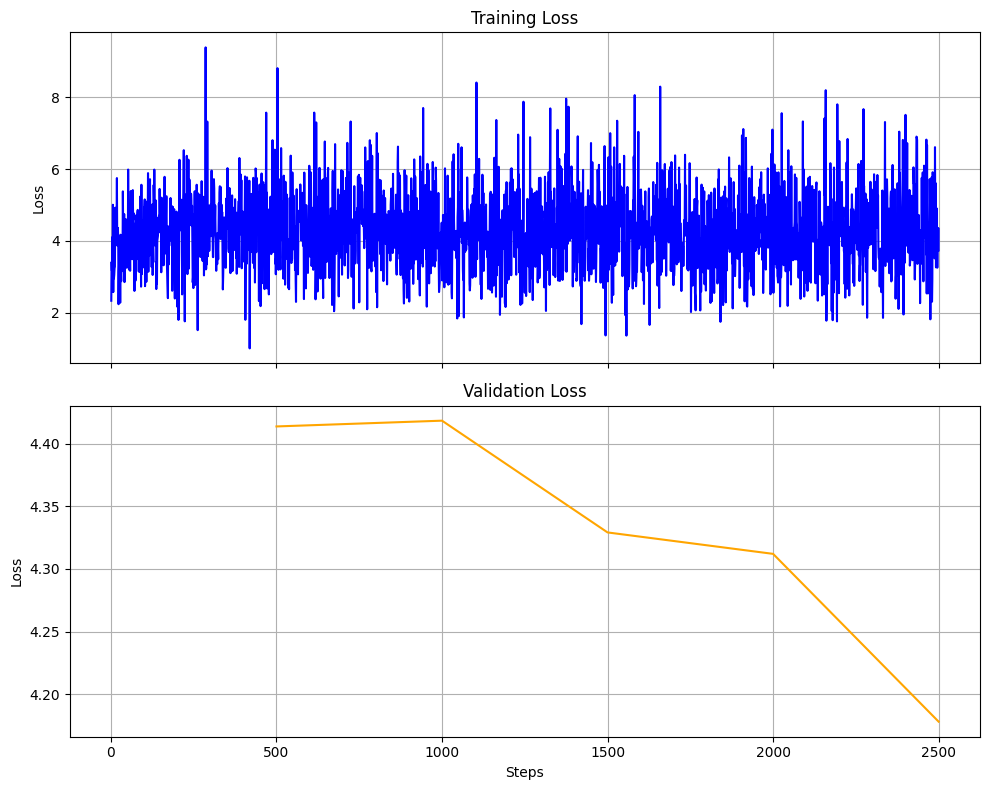

In [ ]:
import json
import matplotlib.pyplot as plt

# Load the training history
with open('/content/content/checkpoint-2500/trainer_state.json', 'r') as file:
    trainer_state = json.load(file)

# Extract loss values from the trainer_state
training_steps = []
training_losses = []
validation_steps = []
validation_losses = []

for log_entry in trainer_state['log_history']:
    if 'loss' in log_entry and 'step' in log_entry:  # This is a training loss entry
        training_steps.append(log_entry['step'])
        training_losses.append(log_entry['loss'])
    elif 'eval_loss' in log_entry and 'step' in log_entry:  # This is a validation loss entry
        validation_steps.append(log_entry['step'])
        validation_losses.append(log_entry['eval_loss'])

# Set up the plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot training loss
ax[0].plot(training_steps, training_losses, label='Training Loss', color='blue')
ax[0].set_title('Training Loss')
ax[0].set_ylabel('Loss')
ax[0].grid(True)

# Plot validation loss
ax[1].plot(validation_steps, validation_losses, label='Validation Loss', color='orange')
ax[1].set_title('Validation Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Steps')
ax[1].grid(True)

# Define the tick values as multiples of 1095, considering the range of your steps
tick_step = 500
xticks = range(0, max(max(training_steps, default=0), max(validation_steps, default=0)) + tick_step, tick_step)
ax[1].set_xticks(xticks)  # Set x-ticks on both subplots

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
import shutil

# Define the folder path for the checkpoint you want to download
checkpoint_folder = '/content/fine-tuned-model/checkpoint-2500'  # Change this to your folder path

# Define the name of the zip file
zip_name = '/content/checkpoint-2500.zip'

# Create a zip file of the folder
shutil.make_archive(zip_name.replace('.zip', ''), 'zip', checkpoint_folder)

# Now the zip file is ready for download


'/content/checkpoint-2500.zip'

In [ ]:
from transformers import AutoTokenizer, AutoProcessor, Qwen2VLForConditionalGeneration
from peft import PeftModel  # Used for PEFT (Parameter-Efficient Fine-Tuning)
import torch

# Set your device (use 'cuda' for GPU or 'mps' for Mac)
DEVICE = 'cuda'  # or 'mps' for mac

# Define the model_id (the base model identifier, e.g., Qwen2-VL-2B-Instruct) and checkpoint (adapter path)
#model_id = "Qwen/Qwen2-VL-2B-Instruct"  # Your base model ID (can be a model available in HuggingFace or a custom model)
checkpoint_path = "/content/content/checkpoint-2500"  # The path to your fine-tuned checkpoint, treated as the adapter

# Load the tokenizer and processor for your model
tokenizer = AutoTokenizer.from_pretrained(model_id)  # Load tokenizer from the model ID
processor = AutoProcessor.from_pretrained(model_id)  # Load processor (handles multimodal inputs)

# Load the base model using the Qwen2VLForConditionalGeneration class (without flash attention)
model = Qwen2VLForConditionalGeneration.from_pretrained(
    model_id,
    torch_dtype=torch.bfloat16,  # Use bfloat16 precision if you have an Ampere GPU
    device_map=DEVICE,  # Ensure the model is placed on the correct device
)

# Now, load the checkpoint as an adapter using PeftModel
model = PeftModel.from_pretrained(
    model,  # Load the model first
    checkpoint_path,  # Use your checkpoint path as the adapter
)

# Set the model to evaluation mode for inference
model.eval()


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

PeftModelForCausalLM(
  (base_model): LoraModel(
    (model): Qwen2VLForConditionalGeneration(
      (visual): Qwen2VisionTransformerPretrainedModel(
        (patch_embed): PatchEmbed(
          (proj): Conv3d(3, 1280, kernel_size=(2, 14, 14), stride=(2, 14, 14), bias=False)
        )
        (rotary_pos_emb): VisionRotaryEmbedding()
        (blocks): ModuleList(
          (0-31): 32 x Qwen2VLVisionBlock(
            (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
            (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
            (attn): VisionSdpaAttention(
              (qkv): Linear(in_features=1280, out_features=3840, bias=True)
              (proj): Linear(in_features=1280, out_features=1280, bias=True)
            )
            (mlp): VisionMlp(
              (fc1): Linear(in_features=1280, out_features=5120, bias=True)
              (act): QuickGELUActivation()
              (fc2): Linear(in_features=5120, out_features=1280, bias=True)
      

# Training and pushing to the hub

We have all the core building blocks now, so we fine-tune the model!

The training can take a few minutes depending on the hardware you use.

In [ ]:
from transformers import TrainerCallback, EarlyStoppingCallback

# Evaluation

Let's evaluate the model. First, we can have a look at a qualitative generation from the model.

In [ ]:
eval_results = run_model_evaluation(model, eval_dataset, num_samples=3, device='cuda',
                                    constant_query="What do you see here?"
                                    # constant_query="Que voyez vous ici?"
                                   )

Formatted text: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
What do you see here?<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

Prediction: Echocardiogram showing a large vegetation attached to the right ventricular wall.

Formatted text: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
What do you see here?<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

Prediction: Brain MRI showing no evidence of recurrence.

Formatted text: <|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
What do you see here?<|vision_start|><|image_pad|><|vision_end|><|im_end|>
<|im_start|>assistant

Prediction: Ultrasound image of the right breast.



In [ ]:
stop here before pushing to hub.

# Push to Hub

In [ ]:
model.push_to_hub("Trelis/chess_qwen_vl_2b_vision")

model-00002-of-00006.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00004-of-00006.safetensors:   0%|          | 0.00/4.91G [00:00<?, ?B/s]

model-00001-of-00006.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00003-of-00006.safetensors:   0%|          | 0.00/4.91G [00:00<?, ?B/s]

model-00005-of-00006.safetensors:   0%|          | 0.00/4.26G [00:00<?, ?B/s]

Upload 6 LFS files:   0%|          | 0/6 [00:00<?, ?it/s]

model-00006-of-00006.safetensors:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/Trelis/chess_pixtral/commit/7c1b2e114029bf0d3f85c9c8b24b92cf448d1e51', commit_message='Upload LlavaForConditionalGeneration', commit_description='', oid='7c1b2e114029bf0d3f85c9c8b24b92cf448d1e51', pr_url=None, repo_url=RepoUrl('https://huggingface.co/Trelis/chess_pixtral', endpoint='https://huggingface.co', repo_type='model', repo_id='Trelis/chess_pixtral'), pr_revision=None, pr_num=None)

In [ ]:
from tqdm import tqdm

answers_unique = []
generated_texts_unique = []

EVAL_BATCH_SIZE = 1

for i in tqdm(range(0, len(eval_dataset), EVAL_BATCH_SIZE)):
    examples = eval_dataset[i: i + EVAL_BATCH_SIZE]
    # answers_unique.extend(examples["answers"])
    answers_unique.extend(examples["caption"])
    images = [[im] for im in examples["image"]]
    texts = []
    # for q in examples["query"]:
    #     messages = [
    #         {
    #             "role": "user",
    #             "content": [
    #                 # {"type": "text", "text": "Answer briefly."},
    #                 {"type": "image"},
    #                 # {"type": "text", "text": q["en"]}
    #                 {"type": "text", "text": q}
    #             ]
    #         }
    #     ]
    #     text = processor.apply_chat_template(messages, add_generation_prompt=True)
    #     texts.append(text.strip())

    hardcoded_query = "What do you see here?"

    messages = [
        {
            "role": "user",
            "content": [
                # {"type": "text", "text": "Answer briefly."},
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    texts.append(text.strip())

    inputs = processor(text=texts, images=images, return_tensors="pt", padding=True).to('cuda')
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_texts = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)
    generated_texts_unique.extend(generated_texts)

    print(generated_texts)


  0%|          | 1/822 [00:01<23:15,  1.70s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


  0%|          | 2/822 [00:02<16:51,  1.23s/it]

['MRI brain showing no evidence of recurrence.']


  0%|          | 3/822 [00:03<14:36,  1.07s/it]

['Ultrasound image of the right breast.']


  0%|          | 4/822 [00:05<17:01,  1.25s/it]

['CT scan of the abdomen showing the right IVC and the left IVC.']


  1%|          | 5/822 [00:06<17:35,  1.29s/it]

['CT of the chest showing bilateral pulmonary lymphadenopathy (arrows).']


  1%|          | 6/822 [00:07<18:37,  1.37s/it]

['Chest X-ray showing a large right-sided pleural effusion.']


  1%|          | 7/822 [00:08<16:24,  1.21s/it]

['Radiograph of the pelvis.']


  1%|          | 8/822 [00:10<18:33,  1.37s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


  1%|          | 9/822 [00:13<23:52,  1.76s/it]

['Radiograph of the pelvis showing a 12.5 cm sized, well-defined, calcified mass in the right hip joint.']


  1%|          | 10/822 [00:18<40:06,  2.96s/it]

['MRI of the right shoulder showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1']


  1%|▏         | 11/822 [00:19<31:18,  2.32s/it]

['Ultrasound image of the right breast.']


  1%|▏         | 12/822 [00:23<36:38,  2.71s/it]

[': X-ray of the right side of the dog showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right lateral aspect of the sternum.']


  2%|▏         | 13/822 [00:25<35:29,  2.63s/it]

['CT scan of the abdomen and pelvis showing a 1.5 cm sized mass in the right lower quadrant of the abdomen.']


  2%|▏         | 14/822 [00:26<28:43,  2.13s/it]

[': occlusion of the right coronary artery.']


  2%|▏         | 15/822 [00:28<26:59,  2.01s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


  2%|▏         | 16/822 [00:29<21:55,  1.63s/it]

[': The size of the lesion.']


  2%|▏         | 17/822 [00:30<19:12,  1.43s/it]

['Ultrasound image of the left long tendon.']


  2%|▏         | 18/822 [00:31<20:19,  1.52s/it]

['MRI brain showing a 1.5 cm lesion in the right cerebellar hemisphere.']


  2%|▏         | 19/822 [00:35<28:10,  2.11s/it]

[': Chest X-ray showing a large amount of air bubbles in the right lung lobe (arrowheads) and a large amount of air bubbles in the left lung lobe (arrowheads).']


  2%|▏         | 20/822 [00:37<27:30,  2.06s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the abdomen (red arrow).']


  3%|▎         | 21/822 [00:38<25:14,  1.89s/it]

[': A 2.62 cm diameter mass in the right breast.']


  3%|▎         | 22/822 [00:41<27:11,  2.04s/it]

['MRI of the neck showing a 1.5 cm mass in the right paraglottic region (yellow arrow).']


  3%|▎         | 23/822 [00:43<26:33,  1.99s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (arrow).']


  3%|▎         | 24/822 [00:45<27:37,  2.08s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (arrows)']


  3%|▎         | 25/822 [00:47<27:14,  2.05s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (arrows)']


  3%|▎         | 26/822 [00:49<26:05,  1.97s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the liver.']


  3%|▎         | 27/822 [00:50<25:52,  1.95s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (arrow).']


  3%|▎         | 28/822 [00:51<21:29,  1.62s/it]

['Ultrasound image of the right breast.']


  4%|▎         | 29/822 [00:53<19:50,  1.50s/it]

['CT scan of the chest showing bilateral pleural effusions.']


  4%|▎         | 30/822 [00:54<21:23,  1.62s/it]

['CT scan of the neck showing a 3.5 cm mass in the right thyroid lobe.']


  4%|▍         | 31/822 [00:57<25:06,  1.90s/it]

['. The color Doppler image shows a large, hyperechoic, hypoplastic aorta (arrow) with a high flow.']


  4%|▍         | 32/822 [00:58<21:59,  1.67s/it]

['Chest X-ray showing bilateral pulmonary infiltrates.']


  4%|▍         | 33/822 [01:00<22:10,  1.69s/it]

[': X-ray of the left knee showing a fracture of the tibia (arrow).']


  4%|▍         | 34/822 [01:02<22:19,  1.70s/it]

[': Echocardiogram showing a large vegetation attached to the right ventricular wall.']


  4%|▍         | 35/822 [01:04<26:58,  2.06s/it]

['. A 3.5 cm mass with a 3.5 cm diameter, with a smooth margin, is seen in the right breast (arrowheads).']


  4%|▍         | 36/822 [01:06<25:37,  1.96s/it]

['Lateral radiograph of the left ankle showing the insertion of the tibial tendon.']


  5%|▍         | 37/822 [01:08<24:15,  1.85s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


  5%|▍         | 38/822 [01:10<23:53,  1.83s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


  5%|▍         | 39/822 [01:11<23:02,  1.77s/it]

['Abdominal radiograph showing a large dilated stomach and duodenum.']


  5%|▍         | 40/822 [01:12<20:39,  1.58s/it]

['Chest X-ray showing bilateral pleural effusions.']


  5%|▍         | 41/822 [01:14<21:03,  1.62s/it]

['Echocardiogram showing aortic aneurysm and left atrial enlargement.']


  5%|▌         | 42/822 [01:17<24:22,  1.87s/it]

['MRI of the abdomen showing a 1.5 cm × 1.5 cm mass in the right lower quadrant of the abdomen.']


  5%|▌         | 43/822 [01:19<24:47,  1.91s/it]

['Ultrasound image of the right breast. The arrow shows a hypoechoic mass in the right breast.']


  5%|▌         | 44/822 [01:20<23:54,  1.84s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


  5%|▌         | 45/822 [01:22<24:24,  1.88s/it]

[': MRI of the left breast showing a 3.5 cm mass in the right breast (arrow).']


  6%|▌         | 46/822 [01:24<25:30,  1.97s/it]

[': CT scan of the peritoneal cavity showing a large peritoneal mass in the right peritoneal cavity.']


  6%|▌         | 47/822 [01:26<24:29,  1.90s/it]

['CT scan of the pelvis showing a 3.5 cm acetabular fracture.']


  6%|▌         | 48/822 [01:29<26:41,  2.07s/it]

['CT scan of the abdomen showing a 3.5 cm diameter mass in the right lower quadrant of the abdomen (yellow arrow).']


  6%|▌         | 49/822 [01:30<23:06,  1.79s/it]

['Chest X-ray showing bilateral pleural effusions.']


  6%|▌         | 50/822 [01:31<23:02,  1.79s/it]

[': Aortic angiography showing a stenosis of the left anterior descending artery (arrow).']


  6%|▌         | 51/822 [01:33<23:04,  1.80s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (arrow).']


  6%|▋         | 52/822 [01:34<19:30,  1.52s/it]

['Ultrasound image of the right foot.']


  6%|▋         | 53/822 [01:35<17:56,  1.40s/it]

['Chest X-ray showing bilateral pleural effusions.']


  7%|▋         | 54/822 [01:38<22:16,  1.74s/it]

[': The radiograph of the mandibular premolar showing a radiolucent area in the left mandibular premolar (arrow).']


  7%|▋         | 55/822 [01:40<24:43,  1.93s/it]

[': Transvaginal ultrasound showing a 3.5 cm mass in the right uterine isthmus (arrow).']


  7%|▋         | 56/822 [01:42<22:53,  1.79s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


  7%|▋         | 57/822 [01:43<20:26,  1.60s/it]

['Chest X-ray showing bilateral pleural effusions.']


  7%|▋         | 58/822 [01:45<22:53,  1.80s/it]

['CT scan of the head showing a large, well-defined, enhancing mass in the left cerebellar hemisphere (arrow).']


  7%|▋         | 59/822 [01:48<25:44,  2.02s/it]

['CT scan of the abdomen showing a 7.9 cm × 7.8 cm mass in the right lower quadrant of the abdomen.']


  7%|▋         | 60/822 [01:50<25:17,  1.99s/it]

['MRI of the neck showing a 1.5 cm mass in the left side of the neck.']


  7%|▋         | 61/822 [01:51<22:58,  1.81s/it]

['Chest X-ray showing a large right-sided pleural effusion.']


  8%|▊         | 62/822 [01:56<37:06,  2.93s/it]

[': MRI of the brain showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1']


  8%|▊         | 63/822 [01:59<33:40,  2.66s/it]

['CT scan of the chest showing a large mass in the right upper lobe of the lung (red arrow).']


  8%|▊         | 64/822 [02:00<27:50,  2.20s/it]

['Chest X-ray showing bilateral pleural effusions.']


  8%|▊         | 65/822 [02:02<26:54,  2.13s/it]

['CT scan of the abdomen showing a 10 mm mass in the right lower quadrant of the abdomen.']


  8%|▊         | 66/822 [02:03<25:15,  2.01s/it]

['. CT scan of the chest showing a large right-sided pleural effusion (arrow).']


  8%|▊         | 67/822 [02:06<26:32,  2.11s/it]

['CT scan of the paranasal sinus showing a 3.5 cm mass in the left paranasal sinus.']


  8%|▊         | 68/822 [02:07<24:02,  1.91s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


  8%|▊         | 69/822 [02:08<20:57,  1.67s/it]

['Chest X-ray showing bilateral pleural effusions.']


  9%|▊         | 70/822 [02:09<16:56,  1.35s/it]

[': D1 measurement.']


  9%|▊         | 71/822 [02:11<21:24,  1.71s/it]

['MRI of the neck showing a 1.5 cm × 1.5 cm mass in the right thyroid lobe (arrow).']


  9%|▉         | 72/822 [02:13<22:07,  1.77s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (arrow).']


  9%|▉         | 73/822 [02:16<24:35,  1.97s/it]

[': MRI of the brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere.']


  9%|▉         | 74/822 [02:19<28:38,  2.30s/it]

[': CT image of the abdomen showing the superior mesenteric artery (arrows) and the false lumen (arrows) in the superior mesenteric artery.']


  9%|▉         | 75/822 [02:20<24:16,  1.95s/it]

['Chest X-ray showing bilateral pleural effusions.']


  9%|▉         | 76/822 [02:23<27:31,  2.21s/it]

['Chest X-ray showing a large right-sided pleural effusion (asterisk) and a small left-sided pleural effusion (green asterisk).']


  9%|▉         | 77/822 [02:25<28:38,  2.31s/it]

[': X-ray of the patient showing a 3.5 cm osteolytic lesion in the left upper quadrant of the left rib.']


  9%|▉         | 78/822 [02:27<26:08,  2.11s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 10%|▉         | 79/822 [02:30<30:01,  2.43s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (white arrow) and a large vegetation attached to the left ventricular wall (red arrow).']


 10%|▉         | 80/822 [02:31<24:15,  1.96s/it]

['Ultrasound image of the right breast.']


 10%|▉         | 81/822 [02:32<20:52,  1.69s/it]

['Chest X-ray showing bilateral pulmonary infiltrates.']


 10%|▉         | 82/822 [02:34<21:50,  1.77s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (arrows).']


 10%|█         | 83/822 [02:40<36:03,  2.93s/it]

[': Lateral radiograph of the lumbar spine. The angle of the lumbar spine was measured as the angle between the lateral line of the lumbar spine and the lateral line of the sacral vertebra. The angle of the sacrum was measured as the angle between the lateral line of the sacrum and the']


 10%|█         | 84/822 [02:41<29:23,  2.39s/it]

['Chest X-ray showing bilateral pleural effusions.']


 10%|█         | 85/822 [02:42<24:44,  2.01s/it]

['Chest X-ray showing bilateral pleural effusions.']


 10%|█         | 86/822 [02:44<23:53,  1.95s/it]

[': panoramic radiograph showing a radiolucent lesion in the left mandibular ramus.']


 11%|█         | 87/822 [02:46<26:50,  2.19s/it]

['CT abdomen and pelvis showing a 11.5 cm × 12.1 cm mass in the right upper quadrant of the abdomen.']


 11%|█         | 88/822 [02:50<30:22,  2.48s/it]

['MRI brain showing a hyperintense signal in the right cerebellar hemisphere (a) and a hyperintense signal in the left cerebellar hemisphere (b).']


 11%|█         | 89/822 [02:51<27:28,  2.25s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 11%|█         | 90/822 [02:54<27:24,  2.25s/it]

['CT scan of the right knee showing a 8.5 cm osteolytic lesion in the distal tibia.']


 11%|█         | 91/822 [02:56<27:42,  2.27s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm mass in the right lower quadrant of the abdomen.']


 11%|█         | 92/822 [02:58<27:51,  2.29s/it]

['CT scan of the neck showing a 3.5 cm mass in the left mandibular ramus (arrows).']


 11%|█▏        | 93/822 [03:00<26:23,  2.17s/it]

['Panoramic radiograph showing a 14 and 15 with a 16.']


 11%|█▏        | 94/822 [03:02<25:58,  2.14s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver (arrows).']


 12%|█▏        | 95/822 [03:04<24:24,  2.01s/it]

['Angiography showing a stenosis of the left internal mammary artery (arrow).']


 12%|█▏        | 96/822 [03:09<37:14,  3.08s/it]

['MRI of the left orbit showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1']


 12%|█▏        | 97/822 [03:13<39:12,  3.25s/it]

[': A 60-year-old man with a 10-year history of heart disease. A 50% diffuse stenosis of the left anterior descending artery (arrow) was found.']


 12%|█▏        | 98/822 [03:15<34:42,  2.88s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (red arrows).']


 12%|█▏        | 99/822 [03:17<30:19,  2.52s/it]

[': X-ray of the knee showing a fracture of the tibia (red arrow).']


 12%|█▏        | 100/822 [03:19<27:43,  2.30s/it]

['CT scan of the abdomen showing a large mass in the right upper lobe of the liver.']


 12%|█▏        | 101/822 [03:21<26:38,  2.22s/it]

['CT scan of the brain showing a large, right-sided, subdural hematoma (arrows)']


 12%|█▏        | 102/822 [03:22<22:42,  1.89s/it]

['Chest X-ray showing bilateral pleural effusions.']


 13%|█▎        | 103/822 [03:23<19:39,  1.64s/it]

[': The measurement method of the gonial angle.']


 13%|█▎        | 104/822 [03:25<20:26,  1.71s/it]

['MRI of the liver showing a large liver abscess (red arrow) with a high signal intensity.']


 13%|█▎        | 105/822 [03:27<21:02,  1.76s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (arrow).']


 13%|█▎        | 106/822 [03:28<20:00,  1.68s/it]

['CT chest showing a large right-sided pleural effusion (red arrow).']


 13%|█▎        | 107/822 [03:29<19:00,  1.59s/it]

['CT of the chest showing bilateral pleural effusions (arrows).']


 13%|█▎        | 108/822 [03:32<20:45,  1.74s/it]

['MRI of the brain showing a 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 13%|█▎        | 109/822 [03:35<27:29,  2.31s/it]

['MRI brain showing a 3.5 cm lesion in the right cerebellar hemisphere (red arrow) and a 3.5 cm lesion in the left cerebellar hemisphere (blue arrow).']


 13%|█▎        | 110/822 [03:38<28:13,  2.38s/it]

['MRI brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere (yellow arrow).']


 14%|█▎        | 111/822 [03:40<26:44,  2.26s/it]

['CT scan of the brain showing a 1.5 cm mass in the right cerebellar hemisphere.']


 14%|█▎        | 112/822 [03:42<25:42,  2.17s/it]

['MRI of the neck showing a 1.5 cm mass in the right thyroid lobe (arrow).']


 14%|█▎        | 113/822 [03:44<25:00,  2.12s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver (arrows).']


 14%|█▍        | 114/822 [03:46<24:57,  2.12s/it]

['Magnetic resonance imaging of the chest showing a 1.5 cm mass in the right breast (arrow).']


 14%|█▍        | 115/822 [03:47<22:53,  1.94s/it]

['CT image of the chest showing a large right-sided pleural effusion.']


 14%|█▍        | 116/822 [03:53<35:37,  3.03s/it]

[': A 34-year-old woman with a 14-year history of heart disease. The blue arrow shows the right ventricle, and the green arrow shows the left ventricle. The blue arrow is pointing to the right of the blue arrow, and the green arrow is pointing to the left of the']


 14%|█▍        | 117/822 [03:55<33:04,  2.82s/it]

['MRI of the pelvis showing a 1.5 cm × 1.5 cm mass in the right pelvic region.']


 14%|█▍        | 118/822 [03:57<30:01,  2.56s/it]

[': A 1.17 cm × 1.17 cm mass in the right breast.']


 14%|█▍        | 119/822 [04:00<31:12,  2.66s/it]

['CT scan of the abdomen showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen (arrowhead).']


 15%|█▍        | 120/822 [04:01<26:50,  2.29s/it]

['Chest CT showing ground-glass opacities in the right lung.']


 15%|█▍        | 121/822 [04:03<24:38,  2.11s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 15%|█▍        | 122/822 [04:05<23:17,  2.00s/it]

['Chest X-ray showing a 3.5 cm right-sided pleural effusion.']


 15%|█▍        | 123/822 [04:06<21:08,  1.82s/it]

['Chest X-ray showing bilateral pleural effusions (arrows).']


 15%|█▌        | 124/822 [04:08<19:07,  1.64s/it]

[': A hypoechoic mass in the right atrium.']


 15%|█▌        | 125/822 [04:10<22:35,  1.94s/it]

['MRI of the pelvis showing a 1.5 cm × 1.5 cm mass in the right lower quadrant of the pelvis.']


 15%|█▌        | 126/822 [04:12<23:14,  2.00s/it]

['MRI of the pelvis showing a 1.5 cm mass in the right lower quadrant of the pelvis.']


 15%|█▌        | 127/822 [04:15<23:52,  2.06s/it]

['MRI brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere.']


 16%|█▌        | 128/822 [04:20<36:11,  3.13s/it]

[': Lateral radiograph of the lumbar spine. The angle between the lateral line and the lateral line of the L1 vertebra is the angle between the lateral line and the lateral line of the L2 vertebra. The angle between the lateral line and the lateral line of the L3 vertebra is the angle']


 16%|█▌        | 129/822 [04:21<29:15,  2.53s/it]

['CT scan of the chest showing bilateral pulmonary infiltrates.']


 16%|█▌        | 130/822 [04:23<26:02,  2.26s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 16%|█▌        | 131/822 [04:25<24:38,  2.14s/it]

['MRI of the lumbar spine showing the L3-4 vertebral bodies (arrows)']


 16%|█▌        | 132/822 [04:26<23:13,  2.02s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 16%|█▌        | 133/822 [04:32<35:34,  3.10s/it]

['MRI of the abdomen showing a large, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated,']


 16%|█▋        | 134/822 [04:33<28:43,  2.50s/it]

['Chest X-ray showing bilateral pleural effusions.']


 16%|█▋        | 135/822 [04:36<30:52,  2.70s/it]

[': Lateral radiograph of the neck showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right neck (arrow).']


 17%|█▋        | 136/822 [04:42<40:32,  3.55s/it]

[". The patient's panoramic radiograph showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 ×"]


 17%|█▋        | 137/822 [04:44<34:21,  3.01s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen.']


 17%|█▋        | 138/822 [04:45<26:58,  2.37s/it]

['Ultrasonography of the lesion.']


 17%|█▋        | 139/822 [04:46<24:27,  2.15s/it]

[' The anterior tibia artery and the arteria fibularis were both obliteration.']


 17%|█▋        | 140/822 [04:52<36:19,  3.20s/it]

['CT scan of the head showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 17%|█▋        | 141/822 [04:53<29:17,  2.58s/it]

['Chest X-ray showing bilateral pleural effusions.']


 17%|█▋        | 142/822 [04:55<26:33,  2.34s/it]

['CT scan of the chest showing a 10.4 cm mass in the right breast.']


 17%|█▋        | 143/822 [04:57<26:14,  2.32s/it]

['CT scan of the head showing a 3.5 cm mass in the right cerebellar hemisphere (yellow arrow).']


 18%|█▊        | 144/822 [05:00<27:08,  2.40s/it]

['MRI of the brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 18%|█▊        | 145/822 [05:02<27:37,  2.45s/it]

['CT scan of the abdomen showing a 1.5 cm × 1.5 cm mass in the right lower quadrant of the abdomen.']


 18%|█▊        | 146/822 [05:04<24:22,  2.16s/it]

['Chest X-ray showing a large amount of air in the right lung.']


 18%|█▊        | 147/822 [05:09<34:28,  3.06s/it]

[': Abdominal radiograph showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen (red arrow) and a 3.5 cm × 3.5 cm mass in the left lower quadrant of the abdomen (yellow arrow).']


 18%|█▊        | 148/822 [05:10<29:14,  2.60s/it]

[': The angle between the acetabulum and the acetabular roof line.']


 18%|█▊        | 149/822 [05:13<30:19,  2.70s/it]

[': angiography of the liver. The arrowhead points to the hepatic artery (arrow) and the arrowhead indicates the hepatic artery (arrowhead).']


 18%|█▊        | 150/822 [05:14<24:59,  2.23s/it]

['Chest X-ray showing bilateral pleural effusions.']


 18%|█▊        | 151/822 [05:15<21:04,  1.88s/it]

['Chest X-ray showing bilateral pleural effusions.']


 18%|█▊        | 152/822 [05:16<17:31,  1.57s/it]

['Magnetic resonance imaging of the liver.']


 19%|█▊        | 153/822 [05:17<15:49,  1.42s/it]

['CT of the chest showing bilateral pulmonary infiltrates.']


 19%|█▊        | 154/822 [05:19<16:29,  1.48s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 19%|█▉        | 155/822 [05:20<14:17,  1.29s/it]

[': MRI of the right pelvic mass.']


 19%|█▉        | 156/822 [05:26<28:58,  2.61s/it]

[': A 50-year-old woman with a 15-year history of a 15-year-old boy with a 15-year history of a 15-year-old boy with a 15-year history of a 15-year-old boy with a 15-year history of a 1']


 19%|█▉        | 157/822 [05:27<26:38,  2.40s/it]

[': The diameter of the mitral valve leaflet was measured by the diameter of the leaflet.']


 19%|█▉        | 158/822 [05:30<26:40,  2.41s/it]

['CT scan of the head showing a 2.42 cm × 1.62 cm mass in the left orbit.']


 19%|█▉        | 159/822 [05:32<24:33,  2.22s/it]

['MRI of the pelvis showing a 1.5 cm mass in the right pelvic region.']


 19%|█▉        | 160/822 [05:33<21:27,  1.94s/it]

['Ultrasound image of the right lobe and left lobe.']


 20%|█▉        | 161/822 [05:36<24:14,  2.20s/it]

['Magnetic resonance imaging of the pelvis showing a 3.5 cm × 3.5 cm mass in the right pelvic region (red arrow).']


 20%|█▉        | 162/822 [05:41<35:27,  3.22s/it]

[': The tibial intervertebral fracture was treated by the LETabular tibial intervertebral fracture was treated by the LETabular tibial intervertebral fracture was treated by the LETabular tibial intervertebral fracture was treated by the LETabular tib']


 20%|█▉        | 163/822 [05:43<29:40,  2.70s/it]

[': The distal persistent bone vegetating defect over 5 mm deep.']


 20%|█▉        | 164/822 [05:44<24:30,  2.24s/it]

[': Lateral radiograph of the left femur.']


 20%|██        | 165/822 [05:46<25:10,  2.30s/it]

['CT scan of the pelvis showing a 3.5 cm × 3.5 cm mass in the right posterior bladder wall.']


 20%|██        | 166/822 [05:49<25:28,  2.33s/it]

['Magnetic resonance imaging of the brain showing a large aneurysm (arrows) in the left cerebellar hemisphere.']


 20%|██        | 167/822 [05:51<25:27,  2.33s/it]

['CT scan of the chest showing bilateral pleural effusions (red arrows) and bilateral pleural effusions (blue arrows).']


 20%|██        | 168/822 [05:52<21:59,  2.02s/it]

['MRI brain showing no evidence of focal cerebellar enhancement.']


 21%|██        | 169/822 [05:55<24:15,  2.23s/it]

['CT scan of the neck showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right neck.']


 21%|██        | 170/822 [05:58<27:01,  2.49s/it]

['Abdominal radiograph showing a 12.5 cm × 13.5 cm × 14.5 cm mass in the right pelvic region.']


 21%|██        | 171/822 [05:59<21:39,  2.00s/it]

['Ultrasound image of the right kidney.']


 21%|██        | 172/822 [06:00<17:52,  1.65s/it]

['Ultrasound image of the right breast.']


 21%|██        | 173/822 [06:01<15:14,  1.41s/it]

['Ultrasound image of the right kidney.']


 21%|██        | 174/822 [06:03<16:57,  1.57s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


 21%|██▏       | 175/822 [06:05<20:13,  1.88s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm sized mass in the right lower quadrant of the abdomen (arrow).']


 21%|██▏       | 176/822 [06:07<19:27,  1.81s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 22%|██▏       | 177/822 [06:10<24:06,  2.24s/it]

[': Aortic angiography showing a stenosis of the left anterior descending artery (red arrow) and a severe stenosis of the left anterior descending artery (blue arrow).']


 22%|██▏       | 178/822 [06:14<28:37,  2.67s/it]

['MRI of the lumbar spine showing a 1.5 cm × 1.5 cm × 1.5 cm mass in the right L3–4 vertebral body (arrows).']


 22%|██▏       | 179/822 [06:16<25:17,  2.36s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 22%|██▏       | 180/822 [06:18<25:06,  2.35s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm mass in the right lower quadrant of the abdomen.']


 22%|██▏       | 181/822 [06:19<21:32,  2.02s/it]

[': A plain film of the stomach and duodenum.']


 22%|██▏       | 182/822 [06:22<22:42,  2.13s/it]

['CT scan of the head showing a large, right-sided, multilocular, and multilocular, mass (arrows)']


 22%|██▏       | 183/822 [06:23<21:38,  2.03s/it]

['CT scan of the chest showing a large mass in the right lower lobe of the lung.']


 22%|██▏       | 184/822 [06:25<20:39,  1.94s/it]

['. A 3.5 cm diameter, hypoechoic mass in the left eye.']


 23%|██▎       | 185/822 [06:27<20:54,  1.97s/it]

['MRI of the brain showing a 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 23%|██▎       | 186/822 [06:29<19:50,  1.87s/it]

['MRI of the abdomen showing a large mass in the right upper quadrant of the liver.']


 23%|██▎       | 187/822 [06:30<19:20,  1.83s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver.']


 23%|██▎       | 188/822 [06:32<17:57,  1.70s/it]

['CT scan of the head showing a large right cerebellar mass.']


 23%|██▎       | 189/822 [06:34<18:48,  1.78s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (red arrow).']


 23%|██▎       | 190/822 [06:39<30:50,  2.93s/it]

['. The measurement of the tibiofemoral joint space (TFTS) was as the distance between the femoral bone and the tibiofemoral junction. The measurement of the tibiofemoral joint space (TFTS) was as the distance between the femoral bone and']


 23%|██▎       | 191/822 [06:43<32:21,  3.08s/it]

['MRI of the lumbar spine showing a 1.5 cm × 1.5 cm × 1.5 cm mass in the right L3 vertebral body (arrow).']


 23%|██▎       | 192/822 [06:45<28:56,  2.76s/it]

['MRI brain showing a 1.5 cm hyperintense lesion in the right cerebellar hemisphere.']


 23%|██▎       | 193/822 [06:48<29:07,  2.78s/it]

['CT scan of the chest showing a 10.0 cm × 10.0 cm mass in the right upper lobe of the lung.']


 24%|██▎       | 194/822 [06:50<26:26,  2.53s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (arrow).']


 24%|██▎       | 195/822 [06:52<24:42,  2.36s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver (yellow arrow).']


 24%|██▍       | 196/822 [06:55<27:02,  2.59s/it]

[': Sagittal T2-weighted MRI image of the pelvis showing a 3.5 cm × 3.5 cm mass in the right posterior bladder wall.']


 24%|██▍       | 197/822 [06:56<21:20,  2.05s/it]

['Ultrasound of the left kidney.']


 24%|██▍       | 198/822 [06:56<17:35,  1.69s/it]

['Ultrasonography of the lesion.']


 24%|██▍       | 199/822 [06:59<20:06,  1.94s/it]

['CT scan of the chest showing a 1.5 cm nodule in the right upper lobe of the lung (red arrow).']


 24%|██▍       | 200/822 [07:01<20:26,  1.97s/it]

[': Echocardiogram showing a large vegetation attached to the right ventricular wall (red arrow).']


 24%|██▍       | 201/822 [07:03<21:17,  2.06s/it]

['CT scan of the abdomen showing a 3.5 cm mass in the right lower quadrant of the abdomen (arrow).']


 25%|██▍       | 202/822 [07:06<24:11,  2.34s/it]

[': The yellow line is the maximum intensity projection (MIP) image of the brain, and the red line is the maximum intensity projection image of the chest.']


 25%|██▍       | 203/822 [07:07<20:38,  2.00s/it]

['CT scan of the chest showing bilateral pleural effusions.']


 25%|██▍       | 204/822 [07:09<20:39,  2.01s/it]

['MRI of the brain showing a 1.5 cm mass in the right temporal lobe (arrow).']


 25%|██▍       | 205/822 [07:10<17:34,  1.71s/it]

['Ultrasound of the right thyroid infarct.']


 25%|██▌       | 206/822 [07:12<18:05,  1.76s/it]

['MRI of the pelvic showing a 1.5 cm mass in the right pelvic mass (arrow).']


 25%|██▌       | 207/822 [07:15<20:31,  2.00s/it]

['CT scan of the abdomen showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen.']


 25%|██▌       | 208/822 [07:19<27:07,  2.65s/it]

[": A 32-year-old woman with a 12-year history of pelvic pain and a 1-month history of pelvic pain. The patient's pelvis was X-rayed. The pelvis was found to be normal."]


 25%|██▌       | 209/822 [07:21<24:28,  2.40s/it]

['MRI of the right knee showing a high signal intensity lesion in the right knee (yellow arrow).']


 26%|██▌       | 210/822 [07:24<25:55,  2.54s/it]

['CT scan of the abdomen and pelvis showing a 1.0 cm × 1.0 cm mass in the right lower quadrant of the abdomen.']


 26%|██▌       | 211/822 [07:26<24:25,  2.40s/it]

['Chest X-ray showing bilateral pleural effusions.']


 26%|██▌       | 212/822 [07:28<22:46,  2.24s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (arrow).']


 26%|██▌       | 213/822 [07:29<19:00,  1.87s/it]

['Chest CT showing bilateral pleural effusions.']


 26%|██▌       | 214/822 [07:31<18:57,  1.87s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (white arrow).']


 26%|██▌       | 215/822 [07:32<16:40,  1.65s/it]

['CT scan of the chest showing bilateral pulmonary infiltrates.']


 26%|██▋       | 216/822 [07:32<14:00,  1.39s/it]

[': 2014.']


 26%|██▋       | 217/822 [07:34<15:50,  1.57s/it]

['MRI brain showing a large, enhancing, enhancing, and enhancing mass in the left cerebellar hemisphere.']


 27%|██▋       | 218/822 [07:36<15:27,  1.54s/it]

[': The distance between the right atrium and the right atrial cavity.']


 27%|██▋       | 219/822 [07:39<18:32,  1.84s/it]

['CT scan of the chest showing a large, well-defined, well-defined mass in the right lower lobe of the lung (red circle).']


 27%|██▋       | 220/822 [07:40<18:07,  1.81s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen.']


 27%|██▋       | 221/822 [07:44<23:51,  2.38s/it]

[' The method of the measurement of the thickness of the skin. The skin thickness was measured as the distance between the skin and the skin surface.']


 27%|██▋       | 222/822 [07:46<23:34,  2.36s/it]

[': X-ray of the left hand showing a fracture of the distal phalanx of the middle phalanx.']


 27%|██▋       | 223/822 [07:49<25:46,  2.58s/it]

['MRI of the thoracic spine showing a 3.5 cm × 3.5 cm mass in the right lower lumbosacral region (arrows).']


 27%|██▋       | 224/822 [07:51<22:36,  2.27s/it]

['CT of the chest showing a large right-sided pleural effusion (arrow).']


 27%|██▋       | 225/822 [07:56<32:29,  3.27s/it]

[': The color Doppler image of the right lower extremity. The color Doppler image of the right lower extremity shows the color Doppler signal of the right lower extremity. The color Doppler image of the right lower extremity shows the color Doppler signal of the right lower extremity. The color Dop']


 27%|██▋       | 226/822 [07:59<29:21,  2.96s/it]

[": The patient's anteroposterior radiograph showing the femoral head fracture and the osteolytic lesion."]


 28%|██▊       | 227/822 [08:01<26:55,  2.72s/it]

[': The external oblique angle of the third molar and the external oblique angle of the second molar.']


 28%|██▊       | 228/822 [08:04<28:32,  2.88s/it]

['MRI of the cervical spine showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right C5 vertebral body (arrow).']


 28%|██▊       | 229/822 [08:06<26:02,  2.63s/it]

['CT scan of the abdomen showing a 3.5 cm mass in the right lower quadrant of the abdomen.']


 28%|██▊       | 230/822 [08:08<22:24,  2.27s/it]

['Chest X-ray showing a large right-sided pleural effusion.']


 28%|██▊       | 231/822 [08:10<21:26,  2.18s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the liver (arrowhead).']


 28%|██▊       | 232/822 [08:13<24:55,  2.53s/it]

[': AP radiograph of the pelvis showing a 12.5 cm × 13.5 cm × 13.5 cm mass in the right hip joint.']


 28%|██▊       | 233/822 [08:15<23:10,  2.36s/it]

['. Transesophageal echocardiogram showing a large vegetation attached to the right ventricular wall.']


 28%|██▊       | 234/822 [08:20<32:31,  3.32s/it]

['CT scan of the brain showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 29%|██▊       | 235/822 [08:23<29:39,  3.03s/it]

[': angiography of the left coronary artery showing a 90% stenosis of the left coronary artery (arrow).']


 29%|██▊       | 236/822 [08:24<24:27,  2.50s/it]

[': The ultrasound image of the bursa and ovary.']


 29%|██▉       | 237/822 [08:26<22:49,  2.34s/it]

['. A 3.5 cm sized, hypoechoic mass in the right atrium (arrow)']


 29%|██▉       | 238/822 [08:32<32:18,  3.32s/it]

['X-ray of the left foot showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × ']


 29%|██▉       | 239/822 [08:37<38:53,  4.00s/it]

['CT abdomen and pelvis showing a large, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated']


 29%|██▉       | 240/822 [08:39<32:10,  3.32s/it]

['CT scan of the chest showing a large right-sided pleural effusion (red arrow).']


 29%|██▉       | 241/822 [08:44<36:22,  3.76s/it]

['. The ultrasonography of the psoas tendon. The tendon was divided into three regions of interest of interest: the fibular region (FA), the psoas tendon region (PE), and the Iliopsoas notch (IPE).']


 29%|██▉       | 242/822 [08:45<28:46,  2.98s/it]

['Chest X-ray showing bilateral pleural effusions.']


 30%|██▉       | 243/822 [08:46<24:21,  2.52s/it]

['CT image of the chest showing a large right-sided pleural effusion.']


 30%|██▉       | 244/822 [08:48<21:50,  2.27s/it]

['MRI of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 30%|██▉       | 245/822 [08:51<23:22,  2.43s/it]

[': PET/CT scan of the abdomen showing a 3.3 cm × 3.3 cm mass in the right lower quadrant of the abdomen.']


 30%|██▉       | 246/822 [08:53<23:10,  2.41s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm diameter mass in the right lower quadrant of the abdomen.']


 30%|███       | 247/822 [08:55<22:04,  2.30s/it]

['MRI of the abdomen showing a 12.5 cm mass in the right lower quadrant of the abdomen.']


 30%|███       | 248/822 [08:57<19:46,  2.07s/it]

[': Aortic angiography showing complete occlusion of the left anterior descending artery.']


 30%|███       | 249/822 [08:58<18:39,  1.95s/it]

[': Aortic angiography showing aortic stenosis in the mid right coronary artery.']


 30%|███       | 250/822 [09:00<16:32,  1.73s/it]

[' The angle between the ramus plane and the Cd plane.']


 31%|███       | 251/822 [09:02<18:58,  1.99s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm sized mass in the right lower quadrant of the abdomen (arrow).']


 31%|███       | 252/822 [09:04<18:36,  1.96s/it]

['Chest X-ray showing a large amount of air bubbles in the right lower lung lobe.']


 31%|███       | 253/822 [09:06<18:24,  1.94s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (red arrow).']


 31%|███       | 254/822 [09:07<16:08,  1.70s/it]

['Chest X-ray showing bilateral pleural effusions.']


 31%|███       | 255/822 [09:10<17:49,  1.89s/it]

['X-ray of the neck showing a 3.5 cm osteolytic lesion in the left C5 vertebra.']


 31%|███       | 256/822 [09:13<21:58,  2.33s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (red arrow) and a large mass in the right lower quadrant of the abdomen (yellow arrow).']


 31%|███▏      | 257/822 [09:14<18:44,  1.99s/it]

['CT scan of the chest showing bilateral pleural effusions.']


 31%|███▏      | 258/822 [09:18<23:40,  2.52s/it]

[': A 20-year-old man with a 15-year history of chronic tibial dysplasia. The red arrow shows the osteolytic lesion in the distal tibia.']


 32%|███▏      | 259/822 [09:20<22:41,  2.42s/it]

['CT scan of the head showing a 3.5 cm mass in the left temporal lobe (orange arrow).']


 32%|███▏      | 260/822 [09:26<31:20,  3.35s/it]

['CT scan of the left orbit showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × ']


 32%|███▏      | 261/822 [09:31<36:42,  3.93s/it]

[': A patient who was treated with a 5.5-mm acetabular cup and a 5.5-mm acetabular cup with a 50-mm acetabular cup and a 50-mm acetabular cup with a 50-mm acetabular cup.']


 32%|███▏      | 262/822 [09:36<41:25,  4.44s/it]

['. MRI of the left shoulder showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × ']


 32%|███▏      | 263/822 [09:39<34:40,  3.72s/it]

['MRI of the brain showing a 1.5 cm mass in the left cerebellar hemisphere (arrow).']


 32%|███▏      | 264/822 [09:41<29:59,  3.22s/it]

['CT scan of the neck showing a 3.5 cm mass in the right thyroid lobe (arrow).']


 32%|███▏      | 265/822 [09:43<26:28,  2.85s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (red arrow).']


 32%|███▏      | 266/822 [09:44<22:36,  2.44s/it]

[': Chest X-ray showing a large right-sided pleural effusion.']


 32%|███▏      | 267/822 [09:50<31:09,  3.37s/it]

[': A 65-year-old man with a 15-year history of heart disease. A 30-year-old man with a 15-year history of heart disease. A 40-year-old man with a 15-year history of heart disease. A 50-year-old man with a']


 33%|███▎      | 268/822 [09:53<30:36,  3.31s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (blue arrow) and a large vegetation attached to the left ventricular wall (red arrow).']


 33%|███▎      | 269/822 [09:55<26:40,  2.89s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (red arrow).']


 33%|███▎      | 270/822 [09:56<21:48,  2.37s/it]

['Chest X-ray showing bilateral pleural effusions.']


 33%|███▎      | 271/822 [09:58<20:24,  2.22s/it]

['CT scan of the pelvis showing a 1.5 cm mass in the right pelvic cavity.']


 33%|███▎      | 272/822 [09:59<18:43,  2.04s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 33%|███▎      | 273/822 [10:01<18:32,  2.03s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (yellow arrow).']


 33%|███▎      | 274/822 [10:03<17:40,  1.94s/it]

['Ultrasound image of the thyroid lobe showing a hypoechoic mass (arrows)']


 33%|███▎      | 275/822 [10:05<18:50,  2.07s/it]

['Panoramic radiograph showing a 13.5 cm radiolucent lesion in the left mandibular ramus.']


 34%|███▎      | 276/822 [10:07<17:52,  1.96s/it]

['Radiograph of the patient at 14 months after the end of the treatment.']


 34%|███▎      | 277/822 [10:09<18:03,  1.99s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (red arrow).']


 34%|███▍      | 278/822 [10:11<18:04,  1.99s/it]

[': panoramic radiograph of the left mandibular first molar']


 34%|███▍      | 279/822 [10:14<20:42,  2.29s/it]

['CT scan of the chest showing a large, well-defined, well-defined, and well-defined mass in the right lower lobe of the lung (yellow arrow).']


 34%|███▍      | 280/822 [10:20<29:37,  3.28s/it]

[': Lateral radiograph of the lumbar spine. The lateral radiograph of the lumbar spine shows the lateral radiological angle (arrow) and the lateral radiological angle (IV) as well as the lateral radiological angle (IV) as well as the lateral radiological angle (IV) as well as the']


 34%|███▍      | 281/822 [10:24<31:33,  3.50s/it]

['MRI of the brain showing a 3.5 cm mass in the right cerebellar hemisphere (white arrow) and a 3.5 cm mass in the left cerebellar hemisphere (dashed white arrow).']


 34%|███▍      | 282/822 [10:26<27:51,  3.10s/it]

[': A 32-year-old woman with a 14-year history of aortic aneurysm.']


 34%|███▍      | 283/822 [10:29<28:45,  3.20s/it]

['Transesophageal echocardiogram showing a large vegetation attached to the left atrial wall (white arrow) and a large vegetation attached to the right atrial wall (yellow arrow).']


 35%|███▍      | 284/822 [10:31<23:13,  2.59s/it]

['Chest X-ray showing bilateral pleural effusions.']


 35%|███▍      | 285/822 [10:33<21:33,  2.41s/it]

['. Transesophageal echocardiogram showing a large vegetation attached to the right ventricular wall.']


 35%|███▍      | 286/822 [10:36<24:44,  2.77s/it]

['MRI of the chest showing a large, multiloculated mass in the right upper lobe (blue arrow) and a large, multiloculated mass in the right lower lobe (red arrow).']


 35%|███▍      | 287/822 [10:39<24:49,  2.78s/it]

[': The radiographic angle was measured as the angle between the horizontal line and the horizontal line through the midline of the mandibular ramus.']


 35%|███▌      | 288/822 [10:41<22:00,  2.47s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen.']


 35%|███▌      | 289/822 [10:44<23:01,  2.59s/it]

[': Sagittal T2-weighted MRI image showing a 3.5 cm × 3.5 cm mass in the right cerebellar hemisphere.']


 35%|███▌      | 290/822 [10:47<23:57,  2.70s/it]

['MRI of the thorax showing a 1.5 cm × 1.5 cm mass in the right lower lobe of the lung (red arrow).']


 35%|███▌      | 291/822 [10:48<21:25,  2.42s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 36%|███▌      | 292/822 [10:51<22:25,  2.54s/it]

['. The image of the liver angiography. The liver angiography showed the liver artery (LTA) and the hepatic artery (HTA).']


 36%|███▌      | 293/822 [10:53<21:33,  2.45s/it]

['MRI of the right knee showing a 4.9 cm × 4.9 cm mass in the right knee.']


 36%|███▌      | 294/822 [10:56<22:15,  2.53s/it]

['Chest X-ray showing a large right-sided pleural effusion (asterisk) and a large right-sided pleural effusion (black arrow).']


 36%|███▌      | 295/822 [10:58<21:38,  2.46s/it]

['CT scan of the neck showing a 3.5 cm mass in the left side of the neck (red circle).']


 36%|███▌      | 296/822 [11:01<22:09,  2.53s/it]

['Magnetic resonance imaging of the neck showing a 1.5 cm diameter right subclavian artery aneurysm (blue arrow).']


 36%|███▌      | 297/822 [11:03<21:30,  2.46s/it]

['MRI of the pelvis showing a 1.5 cm × 1.5 cm mass in the right pelvic region.']


 36%|███▋      | 298/822 [11:05<18:54,  2.16s/it]

['Chest X-ray showing the lateral mediastinal angle (red line).']


 36%|███▋      | 299/822 [11:10<27:41,  3.18s/it]

['Radiograph of the pelvis showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × ']


 36%|███▋      | 300/822 [11:14<28:01,  3.22s/it]

['CT scan of the lumbar spine showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right L3 vertebral body.']


 37%|███▋      | 301/822 [11:19<34:18,  3.95s/it]

['MRI of the left foot. MRI of the left foot showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × ']


 37%|███▋      | 302/822 [11:25<38:30,  4.44s/it]

[': A 24-year-old woman with a 34-year-old man with a 34-year-old man with a 34-year-old man with a 34-year-old man with a 34-year-old man with a 34-year-old man with a 34-year old man']


 37%|███▋      | 303/822 [11:27<32:28,  3.75s/it]

['X-ray of the left hand showing a fracture of the distal phalanx of the middle phalanx.']


 37%|███▋      | 304/822 [11:30<29:22,  3.40s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm mass in the right lower quadrant of the abdomen (blue arrow).']


 37%|███▋      | 305/822 [11:31<25:05,  2.91s/it]

[': X-ray of the left knee showing a fracture of the tibia (red arrow).']


 37%|███▋      | 306/822 [11:33<20:28,  2.38s/it]

['CT of the chest showing bilateral pleural effusions.']


 37%|███▋      | 307/822 [11:35<19:19,  2.25s/it]

[': CT scan of the abdomen showing a large mass in the right upper quadrant of the abdomen (arrow).']


 37%|███▋      | 308/822 [11:40<27:51,  3.25s/it]

[': The measurement of the acetabulum. The acetabulum were measured by the distance between the acetabular roof line and the acetabular roof line. The acetabular roof line was drawn through the acetabular roof line. The acetabular roof line was measured from the acetabular roof line']


 38%|███▊      | 309/822 [11:42<24:12,  2.83s/it]

['CT scan of the head showing a 2.5 cm mass in the left temporal lobe.']


 38%|███▊      | 310/822 [11:44<21:43,  2.55s/it]

['MRI of the right breast showing a 1.5 cm mass in the right breast (arrow).']


 38%|███▊      | 311/822 [11:46<20:18,  2.38s/it]

['CT scan of the abdomen showing a 12 cm mass in the right lower quadrant of the abdomen.']


 38%|███▊      | 312/822 [11:48<19:44,  2.32s/it]

[': AP radiograph of the pelvis showing an intertrochanteric fracture and multiloculated calcifications.']


 38%|███▊      | 313/822 [11:48<14:24,  1.70s/it]

['.']


 38%|███▊      | 314/822 [11:50<14:48,  1.75s/it]

['Panoramic radiograph showing a 14 and 15 with a 16.']


 38%|███▊      | 315/822 [11:56<24:19,  2.88s/it]

[': AP radiograph of the pelvis showing a 12\u2009×\u200913\u2009×\u200914\u2009×\u200915\u2009×\u200913\u2009×\u200914\u2009×\u200913\u2009×\u200914\u2009']


 38%|███▊      | 316/822 [11:57<20:05,  2.38s/it]

[': The plain film was obtained from the right kidney.']


 39%|███▊      | 317/822 [11:59<18:35,  2.21s/it]

['CT scan of the brain showing a large right cerebellar infarcty (arrow).']


 39%|███▊      | 318/822 [12:01<18:40,  2.22s/it]

['MRI brain showing a large, enhancing, enhancing, and enhancing mass in the left cerebellar hemisphere (red arrow).']


 39%|███▉      | 319/822 [12:03<18:01,  2.15s/it]

['MRI brain showing a 1.5 cm mass in the right cerebellar hemisphere (blue arrow).']


 39%|███▉      | 320/822 [12:05<17:49,  2.13s/it]

['CT scan of the neck showing a 3.5 cm mass in the left thyroid lobe (arrow).']


 39%|███▉      | 321/822 [12:08<19:53,  2.38s/it]

['X-ray of the left foot showing a fracture of the distal tibia (white arrow) and a fracture of the proximal tibia (white arrow).']


 39%|███▉      | 322/822 [12:10<19:19,  2.32s/it]

['Angiography showing a 90% stenosis of the left internal carotid artery (arrow).']


 39%|███▉      | 323/822 [12:11<15:40,  1.88s/it]

[': balloon sphincteroplasty.']


 39%|███▉      | 324/822 [12:13<15:22,  1.85s/it]

['Radiograph of the knee showing the osteolytic lesion in the distal tibia.']


 40%|███▉      | 325/822 [12:14<14:46,  1.78s/it]

[': A 34 with a 35 root and 35 root.']


 40%|███▉      | 326/822 [12:16<14:39,  1.77s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver.']


 40%|███▉      | 327/822 [12:18<14:28,  1.76s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen.']


 40%|███▉      | 328/822 [12:21<17:15,  2.10s/it]

[' CT scan of the chest showing a 3.5 cm × 3.5 cm mass in the right lower lobe of the lung (arrow).']


 40%|████      | 329/822 [12:22<15:35,  1.90s/it]

['Chest X-ray showing a large right-sided pleural effusion.']


 40%|████      | 330/822 [12:24<15:27,  1.88s/it]

[': The points to be used for measuring the gonial angle on the lateral cephalogram.']


 40%|████      | 331/822 [12:26<15:25,  1.89s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (arrow).']


 40%|████      | 332/822 [12:27<13:37,  1.67s/it]

['Chest X-ray showing bilateral pneumothoraces.']


 41%|████      | 333/822 [12:33<23:13,  2.85s/it]

[": A 50-year-old man with a 15-year history of renal cell carcinoma. The patient's left kidney was found to be enlarged and to have a high-grade hydronephrosis. The left kidney was found to be enlarged and to have a high-grade hydronephrosis. The left kidney was"]


 41%|████      | 334/822 [12:34<19:05,  2.35s/it]

['CT scan of the chest showing bilateral pleural effusions.']


 41%|████      | 335/822 [12:38<22:52,  2.82s/it]

[': Chest X-ray showing a 3.5 cm right-sided subcutaneous emphysema (white arrow) and a 3.5 cm left-sided subcutaneous emphysema (green arrow).']


 41%|████      | 336/822 [12:40<21:41,  2.68s/it]

['MRI brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere.']


 41%|████      | 337/822 [12:45<26:51,  3.32s/it]

[': The lateral radiograph of the patient. The lines drawn on the lateral radiograph of the patient are as following: T5, T6, T7, T8, T9, T10, T11, T12.']


 41%|████      | 338/822 [12:46<21:25,  2.66s/it]

['Chest X-ray showing bilateral pleural effusions.']


 41%|████      | 339/822 [12:48<19:11,  2.38s/it]

[':Upper gastrointestinal series showing a gastrografin-filled stent in the distal stomach.']


 41%|████▏     | 340/822 [12:49<16:10,  2.01s/it]

['Chest X-ray showing bilateral pleural effusions.']


 41%|████▏     | 341/822 [12:51<15:16,  1.90s/it]

['Angiography showing a stenosis of the left anterior descending artery (arrow).']


 42%|████▏     | 342/822 [12:52<14:51,  1.86s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen.']


 42%|████▏     | 343/822 [12:53<13:03,  1.64s/it]

['CT scan of the chest showing bilateral pulmonary infiltrates.']


 42%|████▏     | 344/822 [12:56<15:57,  2.00s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen.']


 42%|████▏     | 345/822 [12:58<15:45,  1.98s/it]

[': AP radiograph of the pelvis showing the osteolytic lesion in the right hip joint.']


 42%|████▏     | 346/822 [13:01<17:18,  2.18s/it]

['MRI of the pelvis showing a 1.5 cm × 1.5 cm mass in the right lower quadrant of the pelvis.']


 42%|████▏     | 347/822 [13:07<25:31,  3.22s/it]

[': Lateral radiograph of the lumbar spine. The angle of the L1 vertebral body (LVB) was measured as the angle between the L1 and L2 vertebral bodies. The angle of the L2 vertebral body (LVB) was measured as the angle between the L2 and L']


 42%|████▏     | 348/822 [13:10<25:46,  3.26s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (red arrow) and a large mass in the right lower quadrant of the abdomen (green arrow).']


 42%|████▏     | 349/822 [13:12<22:01,  2.79s/it]

['. Chest X-ray showing a 1.5 cm nodule in the right breast.']


 43%|████▎     | 350/822 [13:14<21:09,  2.69s/it]

[': A 50-year-old man with a 50% stenosis of the left anterior descending artery (arrow).']


 43%|████▎     | 351/822 [13:16<19:10,  2.44s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (arrow).']


 43%|████▎     | 352/822 [13:20<23:43,  3.03s/it]

[': X-ray of the left foot showing a 1.5 cm calcified lesion in the distal tibia (arrow) and a 1.5 cm calcified lesion in the distal tibial metaphysis (asterisk).']


 43%|████▎     | 353/822 [13:22<20:43,  2.65s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver.']


 43%|████▎     | 354/822 [13:25<22:13,  2.85s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (black arrows) and a large mass in the right upper quadrant of the abdomen (yellow arrows).']


 43%|████▎     | 355/822 [13:28<21:14,  2.73s/it]

['MRI of the brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere.']


 43%|████▎     | 356/822 [13:31<22:48,  2.94s/it]

['Chest X-ray showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right lower lobe of the lung (yellow arrow).']


 43%|████▎     | 357/822 [13:34<21:52,  2.82s/it]

['MRI of the right lower extremity showing a 1.5 cm × 1.5 cm mass in the right lower extremity.']


 44%|████▎     | 358/822 [13:35<17:53,  2.31s/it]

['Chest X-ray showing bilateral pleural effusions.']


 44%|████▎     | 359/822 [13:41<25:31,  3.31s/it]

[': A 50-year-old man with a 15-year history of heart disease. A 30-year-old man with a 15-year history of heart disease. A 40-year-old man with a 15-year history of heart disease. A 50-year-old man with a']


 44%|████▍     | 360/822 [13:42<21:48,  2.83s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the abdomen.']


 44%|████▍     | 361/822 [13:44<18:23,  2.39s/it]

[': A fluoroscopy-guided injection of the anesthetics.']


 44%|████▍     | 362/822 [13:46<18:57,  2.47s/it]

[' Computed tomography revealed a large left pneumothorax (red star) with a large amount of pulmonary infiltrates (blue asterisk).']


 44%|████▍     | 363/822 [13:49<18:47,  2.46s/it]

['Chest X-ray revealed a large left-sided pneumothorax (red asterisk) with no evidence of pulmonary infiltrates.']


 44%|████▍     | 364/822 [13:51<17:16,  2.26s/it]

[': A 3.5 cm diameter cystic mass in the right ovary lobe.']


 44%|████▍     | 365/822 [13:53<17:55,  2.35s/it]

[': PET/CT scan showing a 1.5 cm × 1.5 cm mass in the right lower quadrant of the abdomen.']


 45%|████▍     | 366/822 [13:54<14:45,  1.94s/it]

['Magnetic resonance imaging of the left orbit.']


 45%|████▍     | 367/822 [13:56<14:14,  1.88s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 45%|████▍     | 368/822 [13:58<15:11,  2.01s/it]

['MRI of the chest showing a 1.5 cm × 1.5 cm mass in the right breast (arrow).']


 45%|████▍     | 369/822 [14:00<13:41,  1.81s/it]

['CT scan of the chest showing bilateral pulmonary infiltrates (arrows).']


 45%|████▌     | 370/822 [14:04<18:46,  2.49s/it]

['CT image of the heart showing the right ventricle (LV) and left ventricle (LV) with a large amount of fluid in the right ventricle (LV) and left ventricle (LV).']


 45%|████▌     | 371/822 [14:06<17:47,  2.37s/it]

['CT scan of the chest showing a 11 mm mass in the right lower lobe of the lung.']


 45%|████▌     | 372/822 [14:08<17:31,  2.34s/it]

[': Chest X-ray showing a large amount of air bubbles in the right lower lung field.']


 45%|████▌     | 373/822 [14:09<13:34,  1.81s/it]

['. IVC diameter.']


 45%|████▌     | 374/822 [14:10<13:50,  1.85s/it]

['. Transesophageal echocardiogram showing a large vegetation attached to the right ventricular wall.']


 46%|████▌     | 375/822 [14:12<12:17,  1.65s/it]

['CT scan of the chest showing bilateral pleural effusions.']


 46%|████▌     | 376/822 [14:14<13:49,  1.86s/it]

[': Lateral radiograph of the lumbar spine showing the needle tip in the L3 vertebral body (arrowhead).']


 46%|████▌     | 377/822 [14:18<19:02,  2.57s/it]

['. A 3.5 cm mass with a 3.5 cm diameter, containing a multiloculated cystic mass (arrowheads) and a cystic mass (arrows) with a 3.5 cm diameter.']


 46%|████▌     | 378/822 [14:20<18:01,  2.44s/it]

[' CT scan of the neck showing a 3.5 cm mass in the right thyroid lobe (arrow).']


 46%|████▌     | 379/822 [14:22<16:56,  2.29s/it]

['CT scan of the head showing a 3.5 cm mass in the right temporal bone (arrow).']


 46%|████▌     | 380/822 [14:23<13:41,  1.86s/it]

['Ultrasound image of the right kidney.']


 46%|████▋     | 381/822 [14:24<12:04,  1.64s/it]

['Chest X-ray showing bilateral pleural effusions.']


 46%|████▋     | 382/822 [14:26<12:45,  1.74s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the abdomen (red arrows).']


 47%|████▋     | 383/822 [14:28<13:06,  1.79s/it]

['MRI of the abdomen showing a large mass in the right lower quadrant of the abdomen (yellow arrow).']


 47%|████▋     | 384/822 [14:30<13:28,  1.85s/it]

['MRI of the right breast showing a 1.5 cm mass in the right breast (red arrow).']


 47%|████▋     | 385/822 [14:36<21:39,  2.97s/it]

['X-ray of the neck showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 47%|████▋     | 386/822 [14:38<19:31,  2.69s/it]

['Abdominal radiograph showing a large amount of air bubbles in the stomach and duodenum.']


 47%|████▋     | 387/822 [14:40<18:15,  2.52s/it]

['MRI of the neck showing a 1.5 cm mass in the right thyroid lobe (yellow arrow).']


 47%|████▋     | 388/822 [14:42<17:31,  2.42s/it]

['MRI of the foot showing a 1.5 cm × 1.5 cm mass in the right foot.']


 47%|████▋     | 389/822 [14:44<15:43,  2.18s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 47%|████▋     | 390/822 [14:45<13:57,  1.94s/it]

[': The measurement of the thickness of the mitral valve leaflet.']


 48%|████▊     | 391/822 [14:46<11:50,  1.65s/it]

['CT chest showing bilateral pleural effusions.']


 48%|████▊     | 392/822 [14:48<12:07,  1.69s/it]

[': panoramic radiograph showing a radiolucent lesion in the left mandibular ramus.']


 48%|████▊     | 393/822 [14:49<09:55,  1.39s/it]

['MRI of the right breast.']


 48%|████▊     | 394/822 [14:50<11:04,  1.55s/it]

[': angiography of the pituitary. The red arrow shows the pseudoaneurysm.']


 48%|████▊     | 395/822 [14:52<10:55,  1.54s/it]

['Chest X-ray showing a large amount of bilateral pleural effusions.']


 48%|████▊     | 396/822 [14:58<19:29,  2.74s/it]

['. The measurement of the transverse tibial tendon (TT) length. The blue line is drawn through the medial side of the tendon. The red line is drawn through the medial side of the tendon. The blue line is drawn through the medial side of the tendon. The red line is drawn through the medial side']


 48%|████▊     | 397/822 [15:00<18:03,  2.55s/it]

['MRI brain showing a 3.5 cm lesion in the right cerebellar hemisphere (yellow arrows).']


 48%|████▊     | 398/822 [15:01<15:12,  2.15s/it]

[': ultrasonography of the thyroid and trachea.']


 49%|████▊     | 399/822 [15:07<22:34,  3.20s/it]

[': PET/CT scan of the patient showing a 1.5 cm × 1.5 cm × 1.5 cm mass in the right posterior mediastinal region (blue arrow) and a 1.5 cm × 1.5 cm mass in the right posterior mediastinal region (black']


 49%|████▊     | 400/822 [15:08<17:59,  2.56s/it]

['Ultrasonography of the right atrium.']


 49%|████▉     | 401/822 [15:10<17:05,  2.44s/it]

[': Transverse view of the duodenum showing duodenal papilla and intrapancreatic bile duct.']


 49%|████▉     | 402/822 [15:11<14:17,  2.04s/it]

['Chest X-ray showing bilateral pleural effusions.']


 49%|████▉     | 403/822 [15:13<15:20,  2.20s/it]

['MRI of the neck showing a 1.5 cm × 1.5 cm mass in the right thyroid lobe (blue arrow).']


 49%|████▉     | 404/822 [15:15<14:10,  2.04s/it]

['MRI of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 49%|████▉     | 405/822 [15:20<20:45,  2.99s/it]

['CT scan of the abdomen showing a 5.4 cm × 32.1 cm mass in the right upper quadrant of the abdomen (asterisk) and a 5.4 cm × 5.4 cm mass in the right lower quadrant of the abdomen (black asterisk).']


 49%|████▉     | 406/822 [15:22<17:54,  2.58s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 50%|████▉     | 407/822 [15:24<17:48,  2.57s/it]

['CT scan of the neck showing a 3.5 cm × 3.5 cm mass in the right neck (arrows).']


 50%|████▉     | 408/822 [15:27<17:34,  2.55s/it]

['MRI brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 50%|████▉     | 409/822 [15:28<15:03,  2.19s/it]

[': Chest X-ray showing a large right-sided pleural effusion.']


 50%|████▉     | 410/822 [15:30<13:31,  1.97s/it]

['CT image of the chest showing a large mass in the right pelvic region.']


 50%|█████     | 411/822 [15:32<14:03,  2.05s/it]

['X-ray of the left hand showing a fracture of the distal phalanx of the middle phalanx.']


 50%|█████     | 412/822 [15:35<15:08,  2.22s/it]

['CT scan of the brain showing a 3.5 cm × 3.5 cm mass in the right cerebellar hemisphere.']


 50%|█████     | 413/822 [15:40<22:02,  3.23s/it]

[": A 32-year-old man with a 15-year history of dysplasia of the left hip. The patient's anteroposterior radiograph of the left hip shows a 15-year-old history of dysplasia of the left hip. The patient's anteroposterior radi"]


 50%|█████     | 414/822 [15:42<18:42,  2.75s/it]

['Magnetic resonance imaging of the brain showing the right hemisence and left hemisphere.']


 50%|█████     | 415/822 [15:45<18:48,  2.77s/it]

['CT scan of the head showing a large mass in the left nasal cavity (red arrow) and a mass in the left nasal cavity (green arrow).']


 51%|█████     | 416/822 [15:46<15:04,  2.23s/it]

[': measurement of the diameter of the lesion.']


 51%|█████     | 417/822 [15:47<12:50,  1.90s/it]

['Chest X-ray showing bilateral pleural effusions.']


 51%|█████     | 418/822 [15:49<13:32,  2.01s/it]

[': The ultrasound image of the left breast. The lesion is seen in the left breast and is seen in the left breast.']


 51%|█████     | 419/822 [15:55<20:41,  3.08s/it]

[': Transverse view of the right atrium. The left atrium is not visible. The right atrium is seen in the mid-left atrial cavity. The right atrium is seen in the mid-left atrial cavity. The right atrium is seen in the mid-left atrial cavity. The right atrium']


 51%|█████     | 420/822 [15:56<16:54,  2.52s/it]

[': The image of the ultrasound-guided cord psection.']


 51%|█████     | 421/822 [16:00<19:35,  2.93s/it]

['CT scan of the abdomen showing a 12 cm mass in the right lower quadrant of the abdomen (arrowhead) and a 15 cm mass in the left lower quadrant of the abdomen (asterisk).']


 51%|█████▏    | 422/822 [16:01<16:49,  2.52s/it]

[': Aortic angiography showing complete occlusion of the left anterior descending artery.']


 51%|█████▏    | 423/822 [16:02<14:04,  2.12s/it]

['Chest X-ray showing bilateral pleural effusions.']


 52%|█████▏    | 424/822 [16:06<16:12,  2.44s/it]

[': PET/CT scan showing a 1.5 cm × 1.5 cm × 1.5 cm mass in the right lower quadrant of the abdomen.']


 52%|█████▏    | 425/822 [16:11<22:36,  3.42s/it]

['CT scan of the right knee showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × ']


 52%|█████▏    | 426/822 [16:14<20:22,  3.09s/it]

['MRI brain showing a large, enhancing, enhancing, and enhancing mass in the right cerebellar hemisphere (red circle).']


 52%|█████▏    | 427/822 [16:15<17:39,  2.68s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 52%|█████▏    | 428/822 [16:18<17:54,  2.73s/it]

[': Lateral radiograph of the spine showing a 3.5 cm osteolytic lesion in the left L3 vertebral body (arrow).']


 52%|█████▏    | 429/822 [16:22<19:52,  3.03s/it]

[': The same case as Figure 3. The black arrowhead indicates the right atrium, the red arrowhead indicates the left atrium, and the black arrowhead indicates the left ventricle.']


 52%|█████▏    | 430/822 [16:24<17:55,  2.74s/it]

['Ultrasound image of the abdomen showing the caudal, cranal and sagittal plane of the abdomen.']


 52%|█████▏    | 431/822 [16:30<23:23,  3.59s/it]

[': A 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 53%|█████▎    | 432/822 [16:31<18:45,  2.89s/it]

['CT scan of the chest showing bilateral pleural effusions.']


 53%|█████▎    | 433/822 [16:36<23:59,  3.70s/it]

['CT abdomen and pelvis showing a large, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated']


 53%|█████▎    | 434/822 [16:38<19:04,  2.95s/it]

['CT chest showing a large right-sided pleural effusion.']


 53%|█████▎    | 435/822 [16:39<15:33,  2.41s/it]

['Chest X-ray showing bilateral pleural effusions.']


 53%|█████▎    | 436/822 [16:40<13:50,  2.15s/it]

[': Aortic angiography showing complete occlusion of the left anterior descending artery.']


 53%|█████▎    | 437/822 [16:46<20:20,  3.17s/it]

[": A 32-year-old man with a 15-year history of osteoarthritis. The patient's left hip joint space was osteoarthritis and the left hip joint space was osteoarthritis and osteoarthritis. The patient's left hip joint space was osteoarthritis and the"]


 53%|█████▎    | 438/822 [16:48<18:08,  2.83s/it]

['MRI of the brain showing a 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 53%|█████▎    | 439/822 [16:49<14:52,  2.33s/it]

['Chest X-ray showing bilateral pleural effusions.']


 54%|█████▎    | 440/822 [16:50<12:26,  1.95s/it]

['Chest X-ray showing bilateral pleural effusions.']


 54%|█████▎    | 441/822 [16:52<12:19,  1.94s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (arrow).']


 54%|█████▍    | 442/822 [16:54<13:07,  2.07s/it]

['Magnetic resonance imaging of the left upper extremity showing a large right-sided subcutaneous emphysema (arrow).']


 54%|█████▍    | 443/822 [16:58<15:22,  2.43s/it]

[': Aortic angiography showing aortic stenosis (black arrow) and aortic dissection (dotted black arrow) in the mid aortic arch (asterisk).']


 54%|█████▍    | 444/822 [17:00<14:59,  2.38s/it]

[': Chest X-ray showing a 9.5 cm diameter mass in the right upper lobe of the lung.']


 54%|█████▍    | 445/822 [17:06<21:01,  3.35s/it]

['CT scan of the brain showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 54%|█████▍    | 446/822 [17:06<16:07,  2.57s/it]

['. The image of the tumor.']


 54%|█████▍    | 447/822 [17:08<13:57,  2.23s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 55%|█████▍    | 448/822 [17:10<13:22,  2.15s/it]

['. Transesophageal echocardiogram showing a large vegetation attached to the right ventricular wall.']


 55%|█████▍    | 449/822 [17:12<12:46,  2.06s/it]

['Brain MRI showing a large, well-defined, enhancing mass in the left cerebellar hemisphere.']


 55%|█████▍    | 450/822 [17:14<12:34,  2.03s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


 55%|█████▍    | 451/822 [17:16<13:00,  2.10s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (arrows)']


 55%|█████▍    | 452/822 [17:17<11:14,  1.82s/it]

['Chest X-ray showing bilateral pleural effusions.']


 55%|█████▌    | 453/822 [17:18<10:16,  1.67s/it]

[': The liver was 19.7 cm in diameter.']


 55%|█████▌    | 454/822 [17:21<11:18,  1.84s/it]

['CT scan of the abdomen showing a 3.5 cm mass in the right lower quadrant of the abdomen (arrow).']


 55%|█████▌    | 455/822 [17:22<10:05,  1.65s/it]

[': Aortic angiography showing aortic stenosis.']


 55%|█████▌    | 456/822 [17:23<10:11,  1.67s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 56%|█████▌    | 457/822 [17:26<11:20,  1.86s/it]

['MRI of the liver. MRI of the liver showing a large, well-defined, enhancing mass in the right liver lobe.']


 56%|█████▌    | 458/822 [17:28<11:52,  1.96s/it]

['. Axial view of the computed tomography scan of the foot showing a fracture of the distal tibia.']


 56%|█████▌    | 459/822 [17:29<10:50,  1.79s/it]

['CT scan of the chest showing bilateral pulmonary infiltrates (arrows).']


 56%|█████▌    | 460/822 [17:31<10:28,  1.74s/it]

['Chest X-ray showing a large right-sided pleural effusion (arrow).']


 56%|█████▌    | 461/822 [17:37<17:25,  2.90s/it]

['CT scan of the head showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 56%|█████▌    | 462/822 [17:39<15:37,  2.60s/it]

['MRI of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


 56%|█████▋    | 463/822 [17:41<14:42,  2.46s/it]

['Magnetic resonance imaging of the brain showing a large right cerebellar infarcty (yellow arrows).']


 56%|█████▋    | 464/822 [17:43<13:52,  2.32s/it]

['MRI of the neck showing a 1.5 cm mass in the right thyroid lobe (arrow).']


 57%|█████▋    | 465/822 [17:44<12:14,  2.06s/it]

['CT scan of the brain showing a large right cerebellar mass.']


 57%|█████▋    | 466/822 [17:46<12:05,  2.04s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (yellow arrow).']


 57%|█████▋    | 467/822 [17:49<14:32,  2.46s/it]

['. The proximal part of the femoral condyle (arrows) and the distal part of the femoral condyle (circle) were measured using the ultrasonography method.']


 57%|█████▋    | 468/822 [17:51<13:32,  2.30s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (red arrow).']


 57%|█████▋    | 469/822 [17:54<14:50,  2.52s/it]

['CT scan of the abdomen and pelvis showing a 1.5 cm × 1.5 cm mass in the right lower quadrant of the abdomen (arrow).']


 57%|█████▋    | 470/822 [17:56<13:19,  2.27s/it]

[' The measurement of the MPTA on the lateral radiograph of the left knee.']


 57%|█████▋    | 471/822 [17:59<15:10,  2.59s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (red arrows) and a large mass in the left lower quadrant of the abdomen (green arrows).']


 57%|█████▋    | 472/822 [18:01<13:39,  2.34s/it]

['MRI brain showing a 1.5 cm lesion in the left cerebellar hemisphere.']


 58%|█████▊    | 473/822 [18:04<13:50,  2.38s/it]

['CT scan of the head showing a 0.6 cm × 16 cm mass in the right cerebellar hemisphere.']


 58%|█████▊    | 474/822 [18:06<12:53,  2.22s/it]

[': The lateral radiograph of the knee showing the osteolytic lesion in the left knee.']


 58%|█████▊    | 475/822 [18:07<12:09,  2.10s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (arrow).']


 58%|█████▊    | 476/822 [18:09<11:47,  2.05s/it]

['CT image of the chest showing a large right-sided pericardial effusion (arrows)']


 58%|█████▊    | 477/822 [18:10<09:41,  1.68s/it]

['Ultrasound image of the right breast.']


 58%|█████▊    | 478/822 [18:12<09:44,  1.70s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver.']


 58%|█████▊    | 479/822 [18:15<12:34,  2.20s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the liver (red arrows) and a large mass in the right lower quadrant of the liver (white arrows).']


 58%|█████▊    | 480/822 [18:16<10:49,  1.90s/it]

[': Chest X-ray showing bilateral pleural effusions.']


 59%|█████▊    | 481/822 [18:18<09:39,  1.70s/it]

['CT chest showing a large right-sided pleural effusion.']


 59%|█████▊    | 482/822 [18:20<11:25,  2.02s/it]

[': Lateral radiograph of the lumbar spine showing the lateral epidural space (red arrow) and the lateral epidural space (yellow arrow).']


 59%|█████▉    | 483/822 [18:23<11:43,  2.08s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (arrow).']


 59%|█████▉    | 484/822 [18:24<11:16,  2.00s/it]

['. A 3.5 cm sized, hypoechoic mass in the right atrium.']


 59%|█████▉    | 485/822 [18:26<10:41,  1.90s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 59%|█████▉    | 486/822 [18:29<13:02,  2.33s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (green arrow) and a large mass in the left lower quadrant of the abdomen (yellow arrow).']


 59%|█████▉    | 487/822 [18:31<10:57,  1.96s/it]

['. Transverse view of the left main pulmonary artery.']


 59%|█████▉    | 488/822 [18:32<09:49,  1.76s/it]

[' Chest X-ray showing a large right-sided pleural effusion.']


 59%|█████▉    | 489/822 [18:33<09:26,  1.70s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 60%|█████▉    | 490/822 [18:38<13:28,  2.44s/it]

[': The ultrasonography of the asis tendon. The tendon was divided into three regions of interest: the anterior myometrium (AM), the lateral myometrium (LA), and the internal myometrium (IM).']


 60%|█████▉    | 491/822 [18:43<18:44,  3.40s/it]

['CT scan of the head showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1']


 60%|█████▉    | 492/822 [18:45<16:17,  2.96s/it]

['. Transesophageal echocardiogram showing a large vegetation attached to the left ventricular wall.']


 60%|█████▉    | 493/822 [18:51<20:36,  3.76s/it]

['CT scan of the abdomen and pelvis showing a 12\u2009×\u200913\u2009×\u200913\u2009×\u200914\u2009×\u200915\u2009×\u200915\u2009×\u200915\u2009×\u200915\u2009']


 60%|██████    | 494/822 [18:53<18:31,  3.39s/it]

['CT scan of the neck showing a 44.7 cm × 81.19 mm mass in the right neck.']


 60%|██████    | 495/822 [18:55<16:08,  2.96s/it]

['. Transesophageal echocardiogram showing a large vegetation attached to the right ventricular wall.']


 60%|██████    | 496/822 [18:57<14:38,  2.69s/it]

[': PET/CT scan of the chest showing a 1.5 cm nodule in the right breast.']


 60%|██████    | 497/822 [19:00<14:40,  2.71s/it]

[': PET/CT scan showing a 5.5 cm × 5.5 cm mass in the right lower quadrant of the abdomen.']


 61%|██████    | 498/822 [19:06<19:14,  3.56s/it]

['CT scan of the head showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 61%|██████    | 499/822 [19:08<16:48,  3.12s/it]

[': AP radiograph of the pelvis showing a 3.5 cm fracture of the left femur.']


 61%|██████    | 500/822 [19:09<13:09,  2.45s/it]

['Ultrasound image of the right breast.']


 61%|██████    | 501/822 [19:10<11:01,  2.06s/it]

['Chest X-ray showing bilateral pneumothoraces.']


 61%|██████    | 502/822 [19:11<09:36,  1.80s/it]

['CT chest showing a large right-sided pleural effusion.']


 61%|██████    | 503/822 [19:13<10:02,  1.89s/it]

['CT scan of the chest showing a 5.5 cm mass in the right lower lobe of the lung.']


 61%|██████▏   | 504/822 [19:14<08:47,  1.66s/it]

['Chest X-ray showing bilateral pleural effusions.']


 61%|██████▏   | 505/822 [19:15<07:44,  1.46s/it]

['. The distance between the two echogenic masses.']


 62%|██████▏   | 506/822 [19:17<08:43,  1.66s/it]

['MRI of the brain showing a 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 62%|██████▏   | 507/822 [19:20<10:11,  1.94s/it]

['MRI of the brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 62%|██████▏   | 508/822 [19:22<10:33,  2.02s/it]

['X-ray of the left hand showing a fracture of the distal phalanx of the middle phalanx.']


 62%|██████▏   | 509/822 [19:24<10:14,  1.96s/it]

[': The distance between the proximal and distal portion of the ureteric stent.']


 62%|██████▏   | 510/822 [19:27<12:24,  2.39s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (red arrow) and a large mass in the left lower quadrant of the abdomen (blue arrow).']


 62%|██████▏   | 511/822 [19:31<13:50,  2.67s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (blue arrow) and a large mass in the right upper quadrant of the abdomen (red arrow).']


 62%|██████▏   | 512/822 [19:36<18:26,  3.57s/it]

['MRI of the pelvis. MRI of the pelvis showing a 3.5 cm × 3.5 cm mass in the right pelvic region. The mass is attached to the right side of the bladder wall and has a high signal intensity. The mass has a high signal intensity and is attached to the right side']


 62%|██████▏   | 513/822 [19:37<14:18,  2.78s/it]

['CT chest showing bilateral pleural effusions.']


 63%|██████▎   | 514/822 [19:39<13:00,  2.53s/it]

['CT scan of the neck showing a 3.5 cm mass in the right neck (yellow arrow).']


 63%|██████▎   | 515/822 [19:42<13:50,  2.71s/it]

[': Lateral radiograph of the spine showing the osteolytic lesion (white arrow) and the osteolytic lesion (black arrows) in the left hip joint.']


 63%|██████▎   | 516/822 [19:44<11:55,  2.34s/it]

[': AP radiograph of the pelvis showing the osteoarthritis.']


 63%|██████▎   | 517/822 [19:46<11:41,  2.30s/it]

['Panoramic radiograph showing a 32 and 41 with a 42 and 41.']


 63%|██████▎   | 518/822 [19:47<09:37,  1.90s/it]

[': The ultrasound image of the right kidney.']


 63%|██████▎   | 519/822 [19:48<08:45,  1.73s/it]

[': panoramic radiograph showing a 32 and 41.']


 63%|██████▎   | 520/822 [19:52<12:10,  2.42s/it]

['CT scan of the abdomen showing a large, multiloculated mass in the right upper quadrant of the abdomen (black circle) and a large, multiloculated mass in the right lower quadrant of the abdomen (red circle).']


 63%|██████▎   | 521/822 [19:54<11:20,  2.26s/it]

[' A line, A line, and pleural line were measured on the left side of the heart.']


 64%|██████▎   | 522/822 [19:56<11:00,  2.20s/it]

[': Transvaginal ultrasound showing a 3.5 cm mass in the right uterine cavity.']


 64%|██████▎   | 523/822 [19:58<09:47,  1.96s/it]

['Chest X-ray showing bilateral pleural effusions (arrows).']


 64%|██████▎   | 524/822 [20:00<10:26,  2.10s/it]

['CT scan of the neck showing a 3.5 cm × 3.5 cm mass in the right thyroid lobe.']


 64%|██████▍   | 525/822 [20:02<09:42,  1.96s/it]

['Chest X-ray showing a large right-sided pleural effusion (arrows).']


 64%|██████▍   | 526/822 [20:07<14:57,  3.03s/it]

[': A 32-year-old woman with a 14-year history of a 14-year-old boy with a 14-year history of a 14-year-old boy with a 14-year history of a 14-year-old boy with a 14-year history of a 1']


 64%|██████▍   | 527/822 [20:09<12:36,  2.56s/it]

['Panoramic radiograph showing a 32 and 42.']


 64%|██████▍   | 528/822 [20:11<11:37,  2.37s/it]

['MRI of the right breast showing a 1.5 cm mass in the right breast (arrow).']


 64%|██████▍   | 529/822 [20:13<12:00,  2.46s/it]

['CT scan of the chest showing a 1.4 cm × 1.3 cm mass in the right upper lobe of the lung.']


 64%|██████▍   | 530/822 [20:15<11:08,  2.29s/it]

['MRI of the pelvis showing a large, well-defined, enhancing mass in the right pelvic region.']


 65%|██████▍   | 531/822 [20:17<10:56,  2.26s/it]

['MRI of the brain showing a 1.5 cm mass in the right cerebellar hemisphere (arrows).']


 65%|██████▍   | 532/822 [20:20<10:44,  2.22s/it]

[': AP radiograph of the pelvis showing a 12.5 cm fracture of the left femur.']


 65%|██████▍   | 533/822 [20:22<10:55,  2.27s/it]

['. Transesophageal echocardiogram showing a 15.4 cm diameter mass in the right ventricle.']


 65%|██████▍   | 534/822 [20:26<13:03,  2.72s/it]

['CT scan of the head showing a 3.5 cm mass in the right cerebellar hemisphere (A) and a 3.5 cm mass in the left cerebellar hemisphere (B).']


 65%|██████▌   | 535/822 [20:29<13:39,  2.86s/it]

['CT scan of the cervical spine showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right C5 vertebral body.']


 65%|██████▌   | 536/822 [20:32<14:39,  3.08s/it]

[': Lateral radiograph of the lumbar spine showing the lateral shift of the L3 vertebral body (yellow arrow) and the lateral shift of the L4 vertebral body (red arrow).']


 65%|██████▌   | 537/822 [20:34<12:20,  2.60s/it]

['. A 3.5 cm sized mass in the left atrium.']


 65%|██████▌   | 538/822 [20:35<10:34,  2.24s/it]

['Chest X-ray showing a large right-sided pleural effusion.']


 66%|██████▌   | 539/822 [20:36<08:34,  1.82s/it]

['X-ray of the right shoulder.']


 66%|██████▌   | 540/822 [20:38<08:23,  1.79s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


 66%|██████▌   | 541/822 [20:40<08:20,  1.78s/it]

[': AP view of the abdomen showing a large amount of fluid in the peritoneal cavity.']


 66%|██████▌   | 542/822 [20:41<07:34,  1.62s/it]

['Radiograph of the knee showing the patellar dislocation.']


 66%|██████▌   | 543/822 [20:42<06:54,  1.49s/it]

['Chest X-ray showing bilateral pleural effusions.']


 66%|██████▌   | 544/822 [20:43<06:28,  1.40s/it]

['Chest X-ray showing bilateral pleural effusions.']


 66%|██████▋   | 545/822 [20:45<06:11,  1.34s/it]

['CT scan of the chest showing bilateral pulmonary infiltrates.']


 66%|██████▋   | 546/822 [20:47<07:21,  1.60s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (red arrow).']


 67%|██████▋   | 547/822 [20:48<07:32,  1.65s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


 67%|██████▋   | 548/822 [20:50<06:53,  1.51s/it]

['Chest X-ray showing bilateral pleural effusions.']


 67%|██████▋   | 549/822 [20:51<07:00,  1.54s/it]

['Chest X-ray showing a large right-sided pleural effusion (arrow).']


 67%|██████▋   | 550/822 [20:54<09:14,  2.04s/it]

['MRI of the cervical spine showing a 1.5 cm × 1.5 cm × 1.5 cm mass in the right C5 vertebral body.']


 67%|██████▋   | 551/822 [20:57<09:42,  2.15s/it]

['CT scan of the brain showing a large, well-defined, enhancing mass in the right cerebellar hemisphere (blue arrow).']


 67%|██████▋   | 552/822 [20:59<09:37,  2.14s/it]

['. The image of the ultrasound-guided injection. The yellow arrow shows the needle tip in the right atrium.']


 67%|██████▋   | 553/822 [21:01<09:46,  2.18s/it]

['CT scan of the abdomen showing a 3.5 cm mass in the right lower quadrant of the abdomen (arrows).']


 67%|██████▋   | 554/822 [21:04<10:37,  2.38s/it]

['CT scan of the chest showing a large right-sided pleural effusion (black arrow) and a large right-sided pleural effusion (white arrow).']


 68%|██████▊   | 555/822 [21:07<11:08,  2.50s/it]

['CT scan of the abdomen showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen (arrow).']


 68%|██████▊   | 556/822 [21:08<09:49,  2.21s/it]

[': The measurement of the proximal diaphyses and distal tibia.']


 68%|██████▊   | 557/822 [21:14<14:13,  3.22s/it]

['CT scan of the mandibular premolar showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.']


 68%|██████▊   | 558/822 [21:16<12:51,  2.92s/it]

['MRI of the neck showing a 1.5 cm × 1.5 cm mass in the right neck.']


 68%|██████▊   | 559/822 [21:18<11:24,  2.60s/it]

['X-ray of the left elbow showing a fracture of the distal humerus (red arrow).']


 68%|██████▊   | 560/822 [21:20<09:59,  2.29s/it]

['CT scan of the head showing a large right-sided subdural hematoma.']


 68%|██████▊   | 561/822 [21:21<08:40,  2.00s/it]

[': A hypoechoic mass in the left ventricle.']


 68%|██████▊   | 562/822 [21:23<08:13,  1.90s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 68%|██████▊   | 563/822 [21:23<06:24,  1.48s/it]

[': Long uterus.']


 69%|██████▊   | 564/822 [21:25<07:23,  1.72s/it]

['CT image of the chest showing the left atrial mass (LAA) and the right atrial mass (RAA).']


 69%|██████▊   | 565/822 [21:26<06:26,  1.50s/it]

[': 6.1 mm (image)']


 69%|██████▉   | 566/822 [21:30<08:43,  2.05s/it]

[': Aortic angiography showing the complete occlusion of the left anterior descending artery (LAAD) with the distal portion of the left internal mammary artery (IAD).']


 69%|██████▉   | 567/822 [21:31<07:44,  1.82s/it]

[' Chest X-ray showing a large right-sided pleural effusion.']


 69%|██████▉   | 568/822 [21:32<06:34,  1.55s/it]

['Ultrasound image of the right breast.']


 69%|██████▉   | 569/822 [21:35<08:44,  2.07s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (red arrows) and a large mass in the left lower quadrant of the abdomen (yellow arrows).']


 69%|██████▉   | 570/822 [21:40<11:31,  2.74s/it]

['CT scan of the chest showing a 3.5 cm mass in the right lower lobe of the lung (a) and a 3.5 cm mass in the left lower lobe of the lung (b).']


 69%|██████▉   | 571/822 [21:40<09:05,  2.17s/it]

[': panoramic radiograph of the patient.']


 70%|██████▉   | 572/822 [21:41<07:39,  1.84s/it]

[': X-ray of the left and right hand.']


 70%|██████▉   | 573/822 [21:42<06:24,  1.55s/it]

['CT chest showing bilateral pulmonary infiltrates.']


 70%|██████▉   | 574/822 [21:44<06:10,  1.49s/it]

[': Chest X-ray showing a large right-sided pleural effusion.']


 70%|██████▉   | 575/822 [21:46<06:37,  1.61s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (red arrow).']


 70%|███████   | 576/822 [21:48<07:00,  1.71s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (arrow).']


 70%|███████   | 577/822 [21:49<07:12,  1.76s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (arrow).']


 70%|███████   | 578/822 [21:52<07:57,  1.96s/it]

[': Transverse ultrasonography of the L.A. and the transverse ultrasonography of the transverse abdominal muscles.']


 70%|███████   | 579/822 [21:55<09:33,  2.36s/it]

[' PET/CT scan showing a 1.5 cm sized, well-defined, enhancing, and well-defined, low-attenuating mass in the right kidney (red arrow).']


 71%|███████   | 580/822 [21:57<09:21,  2.32s/it]

['MRI of the pelvic showing a 3.5 cm × 3.5 cm mass in the right pelvic cavity.']


 71%|███████   | 581/822 [22:00<10:19,  2.57s/it]

['MRI of the pelvis showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right lower quadrant of the pelvis.']


 71%|███████   | 582/822 [22:03<09:50,  2.46s/it]

[': Chest X-ray showing the coil closure of the internal mammary arteries and the tricuspid valve prosthesis.']


 71%|███████   | 583/822 [22:05<09:32,  2.39s/it]

['Panoramic radiograph showing a 32 and 41 with a 42 and 41.']


 71%|███████   | 584/822 [22:07<08:50,  2.23s/it]

['MRI brain showing multiple hyperintense lesions in the right cerebellar hemisphere (arrows).']


 71%|███████   | 585/822 [22:09<08:29,  2.15s/it]

['MRI brain showing a 1.5 cm mass in the right cerebellar hemisphere (white arrow).']


 71%|███████▏  | 586/822 [22:11<08:29,  2.16s/it]

['. A short-axis view of the mitral valve showing a large vegetation attached to the mid-left ventricular cavity.']


 71%|███████▏  | 587/822 [22:16<12:26,  3.18s/it]

[': The flow velocity was measured by echocardiography. The flow velocity was measured by echocardiography. The flow velocity was measured by echocardiography. The flow velocity was measured by echocardiography. The flow velocity was measured by echocardiography. The flow velocity was measured by echoc']


 72%|███████▏  | 588/822 [22:19<11:16,  2.89s/it]

[': Transesophageal echocardiogram showing a large vegetation attached to the right ventricular wall (arrows).']


 72%|███████▏  | 589/822 [22:21<10:00,  2.58s/it]

[': The lateral radiograph of the left arm showing a fracture of the distal humerus.']


 72%|███████▏  | 590/822 [22:22<08:47,  2.27s/it]

['. CT scan of the left arm showing a fracture of the left femur.']


 72%|███████▏  | 591/822 [22:24<08:25,  2.19s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the abdomen (red arrow).']


 72%|███████▏  | 592/822 [22:30<12:23,  3.23s/it]

[': MRI of the abdomen showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen (asterisk) and a 3.5 cm × 3.5 cm mass in the left lower quadrant of the abdomen (asterisk). The mass is attached to the right']


 72%|███████▏  | 593/822 [22:31<09:52,  2.59s/it]

[': Chest X-ray showing bilateral pleural effusions.']


 72%|███████▏  | 594/822 [22:33<09:01,  2.37s/it]

['MRI of the left orbit showing a 1.5 cm mass in the left orbit (arrow).']


 72%|███████▏  | 595/822 [22:35<09:15,  2.45s/it]

['MRI of the brain showing a 1.5 cm × 1.5 cm mass in the left cerebellar hemisphere (arrow).']


 73%|███████▎  | 596/822 [22:38<09:02,  2.40s/it]

[': Abdominal radiograph showing a small amount of air bubbles in the right lower quadrant of the abdomen (arrow).']


 73%|███████▎  | 597/822 [22:40<08:42,  2.32s/it]

["Panoramic radiograph showing the patient's 14th molar and 15th molar."]


 73%|███████▎  | 598/822 [22:41<07:15,  1.94s/it]

[': The measurement of the lumbar spine length.']


 73%|███████▎  | 599/822 [22:43<07:01,  1.89s/it]

[': CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 73%|███████▎  | 600/822 [22:45<07:08,  1.93s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


 73%|███████▎  | 601/822 [22:46<06:31,  1.77s/it]

['Chest X-ray showing bilateral pleural effusions (red arrows).']


 73%|███████▎  | 602/822 [22:48<07:06,  1.94s/it]

['MRI of the pelvis showing a 1.5 cm × 1.5 cm mass in the right pelvic region.']


 73%|███████▎  | 603/822 [22:51<07:27,  2.05s/it]

['CT scan of the brain showing a large, well-defined, enhancing mass in the right cerebellar hemisphere (red arrows).']


 73%|███████▎  | 604/822 [22:54<08:40,  2.39s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (asterisk) and a large vegetation attached to the left ventricular wall (asterisk).']


 74%|███████▎  | 605/822 [22:56<08:23,  2.32s/it]

['CT scan of the abdomen showing a 3.5 cm sized mass in the right upper quadrant of the abdomen.']


 74%|███████▎  | 606/822 [22:58<08:16,  2.30s/it]

['CT scan of the abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (red arrow).']


 74%|███████▍  | 607/822 [23:00<07:19,  2.05s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 74%|███████▍  | 608/822 [23:02<07:02,  1.98s/it]

['Intact ratio (%) was calculated as the ratio of the intact ratio to the intact ratio.']


 74%|███████▍  | 609/822 [23:05<08:23,  2.36s/it]

['Positron emission tomography/CT scan of the chest showing a 3.5 cm × 3.5 cm mass in the right upper lobe of the lung.']


 74%|███████▍  | 610/822 [23:05<06:34,  1.86s/it]

['MRI of the right breast.']


 74%|███████▍  | 611/822 [23:11<10:28,  2.98s/it]

[': Chest X-ray showing a 3.5 cm diameter, 1.5 cm wide, 1.5 cm wide, and 1.5 cm wide, 1.5 cm wide, 1.5 cm wide, 1.5 cm wide, 1.5 cm wide, ']


 74%|███████▍  | 612/822 [23:14<10:01,  2.86s/it]

['CT scan of the abdomen showing a 1.5 cm sized, well-defined, enhancing mass in the right upper quadrant of the abdomen.']


 75%|███████▍  | 613/822 [23:16<09:37,  2.76s/it]

['Magnetic resonance imaging of the neck showing a 1.5 cm × 1.5 cm mass in the right thyroid lobe.']


 75%|███████▍  | 614/822 [23:19<09:37,  2.78s/it]

['MRI of the right side of the neck showing a 1.5 cm × 1.5 cm mass in the right thyroid lobe (arrow).']


 75%|███████▍  | 615/822 [23:25<12:31,  3.63s/it]

[': The radiograph of the head showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 ×']


 75%|███████▍  | 616/822 [23:27<11:20,  3.31s/it]

['CT scan of the abdomen showing a 5.3 cm × 5.4 cm mass in the right lower quadrant of the abdomen.']


 75%|███████▌  | 617/822 [23:33<13:34,  3.97s/it]

[': The measurement of the angle of the mandibular ramus (AD1,AD2,AD3,AD4,AD5). The angle of the mandibular ramus was measured as the angle between the lines drawn through the center of the mandibular ramus and the center of the mandib']


 75%|███████▌  | 618/822 [23:35<11:25,  3.36s/it]

[': angiography of the left renal artery. The arrowhead indicates the left renal artery (arrow).']


 75%|███████▌  | 619/822 [23:40<13:37,  4.03s/it]

[': A 50-year-old woman with a 15-year history of chronic hepatitisitis. A 5-mm diameter, 50-mm, and 55-mm, 50-mm, 55-mm, and 60-mm, 50-mm, 55-mm, and']


 75%|███████▌  | 620/822 [23:41<10:42,  3.18s/it]

[': The measurement of the size of the myometrium.']


 76%|███████▌  | 621/822 [23:43<09:04,  2.71s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 76%|███████▌  | 622/822 [23:45<07:54,  2.37s/it]

[': A fluoroscopy-guided injection of the right common iliac artery.']


 76%|███████▌  | 623/822 [23:46<06:57,  2.10s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 76%|███████▌  | 624/822 [23:48<06:30,  1.97s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the liver.']


 76%|███████▌  | 625/822 [23:53<10:03,  3.06s/it]

['Angiography of the right renal artery. The left renal artery (star) is seen to be normal. The right renal artery (asterisk) is seen to be normal. The left renal artery (asterisk) is seen to be normal. The right renal artery (asterisk) is seen to be normal.']


 76%|███████▌  | 626/822 [23:55<08:56,  2.74s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the abdomen (yellow arrow).']


 76%|███████▋  | 627/822 [23:57<07:28,  2.30s/it]

[': A fluoroscopy-guided injection of the spinal canal.']


 76%|███████▋  | 628/822 [24:00<08:22,  2.59s/it]

['Chest X-ray showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right lower lobe of the lung (arrow).']


 77%|███████▋  | 629/822 [24:05<11:08,  3.47s/it]

[': Cervical radiograph showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × ']


 77%|███████▋  | 630/822 [24:11<13:07,  4.10s/it]

[': panoramic radiograph showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.']


 77%|███████▋  | 631/822 [24:13<10:47,  3.39s/it]

['CT scan of the chest showing a large right-sided pleural effusion (red arrow).']


 77%|███████▋  | 632/822 [24:14<08:37,  2.72s/it]

[': Percutaneous fistula and pancreatic stenting.']


 77%|███████▋  | 633/822 [24:15<07:02,  2.24s/it]

['CT of the chest showing bilateral pleural effusions.']


 77%|███████▋  | 634/822 [24:19<08:19,  2.66s/it]

['CT scan of the head showing a 3.5 cm mass in the right temporal lobe (arrow) and a 3.5 cm mass in the left temporal lobe (asterisk).']


 77%|███████▋  | 635/822 [24:22<08:39,  2.78s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen (arrow).']


 77%|███████▋  | 636/822 [24:24<08:34,  2.77s/it]

['CT scan of the abdomen showing a 53.1 cm x 38.1 cm mass in the right lower quadrant of the abdomen.']


 77%|███████▋  | 637/822 [24:26<07:26,  2.41s/it]

['Radiograph of the right hip showing a fracture of the femoral head.']


 78%|███████▊  | 638/822 [24:27<06:11,  2.02s/it]

['Chest X-ray showing bilateral pleural effusions.']


 78%|███████▊  | 639/822 [24:28<05:05,  1.67s/it]

['Ultrasonography of the lesion.']


 78%|███████▊  | 640/822 [24:30<05:12,  1.72s/it]

['CT image of the chest showing a large amount of blood in the right hemithorax.']


 78%|███████▊  | 641/822 [24:31<04:25,  1.47s/it]

['Ultrasound image of the right breast.']


 78%|███████▊  | 642/822 [24:36<08:03,  2.69s/it]

['CT scan of the right shoulder showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × ']


 78%|███████▊  | 643/822 [24:42<10:34,  3.54s/it]

['MRI of the pelvis showing a large, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated']


 78%|███████▊  | 644/822 [24:43<08:20,  2.81s/it]

['Chest X-ray showing bilateral pleural effusions.']


 78%|███████▊  | 645/822 [24:44<07:13,  2.45s/it]

[': 4 months follow-up radiograph showing complete resolution of the radiological lesion.']


 79%|███████▊  | 646/822 [24:47<07:17,  2.49s/it]

['CT abdomen and pelvis showing a large right-sided renal mass (blue arrow) and a large left-sided renal mass (red arrow).']


 79%|███████▊  | 647/822 [24:49<07:03,  2.42s/it]

['Chest X-ray showing bilateral pleural effusions (arrowheads) and bilateral pleural effusions (arrowheads).']


 79%|███████▉  | 648/822 [24:51<06:28,  2.23s/it]

[': The yellow rectangle is the ROI of interest. The green rectangle is the ROI of interest.']


 79%|███████▉  | 649/822 [24:53<05:54,  2.05s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 79%|███████▉  | 650/822 [24:55<05:49,  2.03s/it]

['CT scan of the brain showing a 3.5 cm mass in the right cerebellar hemisphere.']


 79%|███████▉  | 651/822 [24:57<05:48,  2.04s/it]

['CT scan of the abdomen showing a 3.5 cm mass in the right lower quadrant of the abdomen.']


 79%|███████▉  | 652/822 [24:58<04:58,  1.76s/it]

['Chest X-ray showing bilateral pleural effusions.']


 79%|███████▉  | 653/822 [25:00<05:24,  1.92s/it]

['MRI brain showing a 1.5 cm × 1.5 cm mass in the right cerebellar hemisphere.']


 80%|███████▉  | 654/822 [25:02<05:17,  1.89s/it]

['CT scan of the chest showing a large mass in the right upper lobe of the lung.']


 80%|███████▉  | 655/822 [25:03<04:53,  1.76s/it]

['Ultrasound image of the right breast. The red arrow shows the lesion.']


 80%|███████▉  | 656/822 [25:09<08:01,  2.90s/it]

['CT scan of the abdomen showing a large, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated, multiloculated']


 80%|███████▉  | 657/822 [25:15<10:12,  3.71s/it]

[' The measurements of the parameters were as following: DIPJ - distance between the diaphysis and the diaphysis; GB - distance between the diaphysis and the diaphysis; GB - distance between the diaphysis and the diaphysis; GB – distance between the diaphysis and the di']


 80%|████████  | 658/822 [25:17<08:52,  3.25s/it]

['CT scan of the head showing a 12 cm mass in the right cerebellar hemisphere (arrows).']


 80%|████████  | 659/822 [25:20<09:03,  3.33s/it]

[': A 3.5 cm diameter, 1.5 cm diameter, 1.5 cm diameter, and 1.5 cm diameter, respectively, mass in the right breast.']


 80%|████████  | 660/822 [25:22<07:27,  2.76s/it]

['CT scan of the chest showing bilateral pleural effusions (red arrows).']


 80%|████████  | 661/822 [25:23<06:29,  2.42s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 81%|████████  | 662/822 [25:25<05:41,  2.14s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 81%|████████  | 663/822 [25:26<04:52,  1.84s/it]

['CT scan of the chest showing bilateral pulmonary infiltrates.']


 81%|████████  | 664/822 [25:27<04:34,  1.73s/it]

['Chest X-ray showing a large amount of bilateral pleural effusions.']


 81%|████████  | 665/822 [25:29<04:28,  1.71s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 81%|████████  | 666/822 [25:32<05:27,  2.10s/it]

[': X-ray of the neck showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right neck (arrow).']


 81%|████████  | 667/822 [25:38<08:07,  3.14s/it]

['. The red triangle shows the plexus vein. The black arrow indicates the superior celiac trunk (SCL) and the transverse process of the sternum ( TP). The black arrow indicates the sternocleidomastoid muscle (SCL). The black arrow indicates the transverse process of the stern']


 81%|████████▏ | 668/822 [25:39<06:46,  2.64s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 81%|████████▏ | 669/822 [25:40<05:28,  2.15s/it]

['CT chest showing bilateral pleural effusions.']


 82%|████████▏ | 670/822 [25:43<05:44,  2.27s/it]

['MRI of the right foot. MRI of the right foot showing a 42.82mm mass in the right foot.']


 82%|████████▏ | 671/822 [25:48<08:13,  3.27s/it]

['CT scan of the head showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 82%|████████▏ | 672/822 [25:49<06:22,  2.55s/it]

['Ultrasound image of the right breast.']


 82%|████████▏ | 673/822 [25:52<06:40,  2.69s/it]

['CT scan of the abdomen and pelvis showing a 6.13 cm × 7.13 cm mass in the right lower quadrant of the abdomen.']


 82%|████████▏ | 674/822 [25:55<06:28,  2.63s/it]

[': The measurement method of the femoral angle. The angle was measured from the acetabulum to the acetabular roof line.']


 82%|████████▏ | 675/822 [26:00<08:35,  3.51s/it]

['CT scan of the head showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3']


 82%|████████▏ | 676/822 [26:01<06:43,  2.77s/it]

['Ultrasonography of the right atrium.']


 82%|████████▏ | 677/822 [26:07<08:42,  3.61s/it]

['Axial view of the CT scan showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 ×']


 82%|████████▏ | 678/822 [26:08<06:55,  2.88s/it]

['Radiograph of the left mandibular first molar']


 83%|████████▎ | 679/822 [26:10<06:22,  2.67s/it]

['CT scan of the abdomen and pelvis showing a 14.9° angle of the left hip joint.']


 83%|████████▎ | 680/822 [26:12<05:58,  2.52s/it]

['CT scan of the neck showing a 3.5 cm mass in the right thyroid lobe (red circle).']


 83%|████████▎ | 681/822 [26:16<06:25,  2.74s/it]

[': AP radiograph of the patient showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen.']


 83%|████████▎ | 682/822 [26:18<05:51,  2.51s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver (arrows).']


 83%|████████▎ | 683/822 [26:20<05:30,  2.38s/it]

['CT scan of the brain showing a large right cerebellar mass with a thin wall and a thin wall.']


 83%|████████▎ | 684/822 [26:21<05:03,  2.20s/it]

['MRI of the left knee showing a high signal in the right knee (red arrow).']


 83%|████████▎ | 685/822 [26:23<04:16,  1.88s/it]

['Chest X-ray showing bilateral pleural effusions.']


 83%|████████▎ | 686/822 [26:24<04:13,  1.86s/it]

['Radiograph of the left knee showing a fracture of the femur and the tibia.']


 84%|████████▎ | 687/822 [26:25<03:35,  1.60s/it]

['CT chest showing bilateral pleural effusions.']


 84%|████████▎ | 688/822 [26:26<03:10,  1.43s/it]

['Enhanced of the focal area of the image.']


 84%|████████▍ | 689/822 [26:29<03:54,  1.77s/it]

['CT scan of the abdomen showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen.']


 84%|████████▍ | 690/822 [26:32<04:24,  2.01s/it]

['X-ray of the patient showing a 30° lateral radiolucent shadow in the left lower lumbosacral spine.']


 84%|████████▍ | 691/822 [26:37<06:43,  3.08s/it]

['CT scan of the head showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1']


 84%|████████▍ | 692/822 [26:38<05:26,  2.51s/it]

['Chest X-ray showing bilateral pleural effusions.']


 84%|████████▍ | 693/822 [26:40<04:43,  2.20s/it]

['Chest X-ray showing a right-sided pleural effusion (arrow).']


 84%|████████▍ | 694/822 [26:41<03:56,  1.84s/it]

[': Transverse view of the right atrium.']


 85%|████████▍ | 695/822 [26:46<06:15,  2.95s/it]

[": A 32-year-old woman with a 15-year history of bladder stone disease. The patient's bladder was found to be in the mid- to lower pole of the bladder. The patient's bladder was found to be in the mid- to lower pole of the bladder. The patient's bladder was found"]


 85%|████████▍ | 696/822 [26:48<05:36,  2.67s/it]

[': The lateral radiograph of the pelvis showing the osteolytic lesion in the right hip joint.']


 85%|████████▍ | 697/822 [26:50<04:52,  2.34s/it]

[': angiography of the left foot showing complete occlusion of the left foot.']


 85%|████████▍ | 698/822 [26:52<04:34,  2.21s/it]

['CT scan of the neck showing a 3.5 cm mass in the right thyroid lobe.']


 85%|████████▌ | 699/822 [26:54<04:46,  2.33s/it]

['CT chest showing a large right-sided pleural effusion (red arrows) and a large right-sided pleural effusion (blue arrows).']


 85%|████████▌ | 700/822 [26:56<04:00,  1.97s/it]

['CT of the chest showing bilateral pleural effusions.']


 85%|████████▌ | 701/822 [26:58<04:02,  2.00s/it]

['MRI of the brain showing a 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 85%|████████▌ | 702/822 [26:59<03:48,  1.90s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 86%|████████▌ | 703/822 [27:01<03:21,  1.70s/it]

['Chest X-ray showing bilateral pleural effusions.']


 86%|████████▌ | 704/822 [27:02<03:17,  1.67s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 86%|████████▌ | 705/822 [27:04<03:31,  1.80s/it]

[' CT scan of the neck showing a 22.2mm mass in the left side of the neck.']


 86%|████████▌ | 706/822 [27:06<03:11,  1.65s/it]

[': A 3.5 cm mass in the right breast.']


 86%|████████▌ | 707/822 [27:08<03:47,  1.98s/it]

[': Transverse view of the aorta. The superior mesenteric artery (SRA) is seen to be located in the mid aorta.']


 86%|████████▌ | 708/822 [27:11<04:16,  2.25s/it]

[': PET/CT scan showing a 1.5 cm sized, well-defined, hypoattenuating mass in the right upper quadrant of the abdomen.']


 86%|████████▋ | 709/822 [27:14<04:41,  2.49s/it]

['CT scan of the abdomen and pelvis showing a 3.5 cm × 3.5 cm mass in the right lower quadrant of the abdomen (arrow).']


 86%|████████▋ | 710/822 [27:15<03:44,  2.00s/it]

['Ultrasound image of the right breast.']


 86%|████████▋ | 711/822 [27:16<03:17,  1.78s/it]

['Chest X-ray showing a right-sided pneumothorax.']


 87%|████████▋ | 712/822 [27:20<04:05,  2.23s/it]

[' MRI of the right breast showing a 3.5 cm mass in the right breast (star) and a 3.5 cm mass in the left breast (blue arrow).']


 87%|████████▋ | 713/822 [27:20<03:17,  1.81s/it]

['Ultrasonography of the lesion.']


 87%|████████▋ | 714/822 [27:23<03:37,  2.01s/it]

['CT scan of the pelvis showing a 3.5 cm mass in the right lower quadrant of the pelvis (arrows).']


 87%|████████▋ | 715/822 [27:24<03:06,  1.75s/it]

['. The tumor was detected by the tumor detection method.']


 87%|████████▋ | 716/822 [27:27<03:29,  1.98s/it]

[': A ureterogram showing a 3.5 cm obstructive staghorn stone in the left ureter (blue arrow).']


 87%|████████▋ | 717/822 [27:28<03:20,  1.91s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen.']


 87%|████████▋ | 718/822 [27:30<02:56,  1.69s/it]

['CT scan of the chest showing bilateral pleural effusions.']


 87%|████████▋ | 719/822 [27:31<02:52,  1.67s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 88%|████████▊ | 720/822 [27:33<02:55,  1.72s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall (arrow).']


 88%|████████▊ | 721/822 [27:35<02:58,  1.77s/it]

[': The acetabulum of the pelvis with the acetabulum of the femoral head.']


 88%|████████▊ | 722/822 [27:38<03:43,  2.24s/it]

[': The lateral radiograph of the knee showing the lateral tibial condylar angle (white line) and the lateral tibial condylar angle (white circle).']


 88%|████████▊ | 723/822 [27:41<03:48,  2.30s/it]

['. Subclavian artery (SCA) and brachial plexus ( BP) in the left subclavian vein.']


 88%|████████▊ | 724/822 [27:42<03:11,  1.95s/it]

['Chest X-ray showing bilateral pleural effusions.']


 88%|████████▊ | 725/822 [27:43<02:55,  1.81s/it]

['MRI of the abdomen showing a large right renal artery aneurysm.']


 88%|████████▊ | 726/822 [27:46<03:23,  2.12s/it]

['CT scan of the chest showing a 3.5 cm × 3.5 cm mass in the right lower lobe of the lung (arrow).']


 88%|████████▊ | 727/822 [27:48<03:04,  1.94s/it]

['Angiography showing complete occlusion of the left common iliac artery.']


 89%|████████▊ | 728/822 [27:49<02:56,  1.88s/it]

['CT abdomen and pelvis showing a large mass in the right portal vein (red arrow).']


 89%|████████▊ | 729/822 [27:51<02:59,  1.93s/it]

['MRI of the brain showing a 1.5 cm mass in the right cerebellar hemisphere (arrow).']


 89%|████████▉ | 730/822 [27:53<02:43,  1.78s/it]

['Chest X-ray showing a large right-sided pleural effusion.']


 89%|████████▉ | 731/822 [27:55<02:39,  1.75s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 89%|████████▉ | 732/822 [27:56<02:36,  1.74s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the liver.']


 89%|████████▉ | 733/822 [28:01<04:01,  2.71s/it]

['. MRI of the abdomen showing a 1.5 cm × 1.5 cm mass in the right lower quadrant of the abdomen (arrow) and a 1.5 cm × 1.5 cm mass in the left lower quadrant of the abdomen (asterisk).']


 89%|████████▉ | 734/822 [28:02<03:14,  2.21s/it]

['Chest X-ray showing bilateral pulmonary infiltrates.']


 89%|████████▉ | 735/822 [28:06<04:00,  2.77s/it]

[': The image of the ultrasonography. The red arrowhead indicates the second malleolar region, the white arrowhead indicates the second malleolar region, and the black arrowhead indicates the second malleolar region.']


 90%|████████▉ | 736/822 [28:12<05:09,  3.60s/it]

['. A 32-year-old woman with a 15-year history of a 5-year history of a 1-month history of a 1-month history of a 1-month history of a 1-month history of a 1-month history of a 1-month history of a 1-month history of']


 90%|████████▉ | 737/822 [28:14<04:23,  3.10s/it]

['MRI of the right knee showing a large, multiloculated mass in the right knee (arrows).']


 90%|████████▉ | 738/822 [28:19<05:20,  3.82s/it]

[": A 20-year-old man with a 15-year history of osteonecrosis. The patient's left femur was osteonecosed and the left knee was osteonecosed. The patient's left knee was osteonecosed and the left femur was osteonecosed. The"]


 90%|████████▉ | 739/822 [28:20<04:09,  3.01s/it]

['Chest X-ray showing bilateral pleural effusions.']


 90%|█████████ | 740/822 [28:22<03:33,  2.60s/it]

['Chest X-ray showing a large amount of air bubbles in the right lung field.']


 90%|█████████ | 741/822 [28:26<03:53,  2.88s/it]

['MRI of the lumbar spine showing a 3.5 cm × 3.5 cm × 3.5 cm mass in the right L3 vertebral body (red arrow).']


 90%|█████████ | 742/822 [28:26<02:59,  2.24s/it]

['Ultrasound of the right kidney.']


 90%|█████████ | 743/822 [28:28<02:44,  2.08s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the liver.']


 91%|█████████ | 744/822 [28:30<02:29,  1.92s/it]

[': The ultrasound image of the right breast. The yellow arrow shows the lesion.']


 91%|█████████ | 745/822 [28:32<02:34,  2.00s/it]

['CT scan of the neck showing a 3.5 cm mass in the right thyroid lobe (red circle).']


 91%|█████████ | 746/822 [28:33<02:09,  1.71s/it]

[': Subpleural consolidation and B-lines.']


 91%|█████████ | 747/822 [28:35<02:08,  1.71s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the liver.']


 91%|█████████ | 748/822 [28:36<02:00,  1.63s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 91%|█████████ | 749/822 [28:38<02:01,  1.66s/it]

['CT scan of the abdomen showing a large mass in the right upper quadrant of the liver.']


 91%|█████████ | 750/822 [28:39<01:47,  1.50s/it]

['Chest X-ray showing bilateral pleural effusions.']


 91%|█████████▏| 751/822 [28:42<02:16,  1.92s/it]

['A 34-year-old woman with a 14-year history of aortic arch dislocation. The red arrow shows the dislocated aortic arch.']


 91%|█████████▏| 752/822 [28:44<02:29,  2.14s/it]

['Panoramic radiograph showing a 32 and 41 fracture (red arrows) and a 42 fracture (yellow arrow).']


 92%|█████████▏| 753/822 [28:46<02:10,  1.89s/it]

['Abdominal radiograph showing a small bowel obstruction (arrow).']


 92%|█████████▏| 754/822 [28:47<02:02,  1.80s/it]

['Echocardiogram showing a large vegetation attached to the right ventricular wall.']


 92%|█████████▏| 755/822 [28:48<01:44,  1.56s/it]

['CT chest showing bilateral pulmonary infiltrates.']


 92%|█████████▏| 756/822 [28:54<03:02,  2.77s/it]

[": A 32-year-old man with a 15-year history of bladder diverticulum. The patient's bladder was found to be dilated and the bladder wall was thickened. The patient's bladder was found to be containing a large amount of fluid. The patient's bladder was found to be containing a"]


 92%|█████████▏| 757/822 [28:55<02:24,  2.22s/it]

['Magnetic resonance imaging of the right breast.']


 92%|█████████▏| 758/822 [28:57<02:20,  2.20s/it]

['CT scan of the neck showing a 3.5 cm mass in the right thyroid lobe (red arrow).']


 92%|█████████▏| 759/822 [28:59<02:15,  2.15s/it]

['MRI of the right breast showing a 1.5 cm mass in the right breast (red arrow).']


 92%|█████████▏| 760/822 [29:01<02:09,  2.09s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen (red arrows)']


 93%|█████████▎| 761/822 [29:03<02:05,  2.05s/it]

[': Transesophageal echocardiogram showing severe hypotension and refractory resuscitation.']


 93%|█████████▎| 762/822 [29:05<02:01,  2.02s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (arrow).']


 93%|█████████▎| 763/822 [29:06<01:41,  1.72s/it]

['Chest CT scan showing bilateral pulmonary infiltrates.']


 93%|█████████▎| 764/822 [29:09<01:56,  2.02s/it]

['Ultrasound image of the abdomen showing a 9.5 cm × 5.9 cm mass in the right lower quadrant of the abdomen.']


 93%|█████████▎| 765/822 [29:10<01:50,  1.93s/it]

['Chest X-ray showing the position of the nasogastric tube (arrows)']


 93%|█████████▎| 766/822 [29:11<01:33,  1.67s/it]

['Radiograph of the left mandibular first molar']


 93%|█████████▎| 767/822 [29:13<01:25,  1.55s/it]

['. Chest CT scan showing bilateral ground-glass opacities.']


 93%|█████████▎| 768/822 [29:15<01:36,  1.79s/it]

['MRI of the chest showing a 1.5 cm mass in the right lower lobe of the lung (arrow).']


 94%|█████████▎| 769/822 [29:18<01:55,  2.17s/it]

[': A 32-year-old woman with a 15-year history of chronic back pain. The ultrasound image shows the clavicle and the acromion.']


 94%|█████████▎| 770/822 [29:19<01:34,  1.83s/it]

['CT of the chest showing bilateral pulmonary infiltrates.']


 94%|█████████▍| 771/822 [29:20<01:22,  1.61s/it]

['Chest X-ray showing bilateral pleural effusions.']


 94%|█████████▍| 772/822 [29:22<01:26,  1.72s/it]

[': MRI of the brain showing a 3.6 cm mass in the left cerebellar hemisphere.']


 94%|█████████▍| 773/822 [29:24<01:32,  1.90s/it]

['CT scan of the abdomen showing a 3.5 cm mass in the right lower quadrant of the abdomen (yellow arrow).']


 94%|█████████▍| 774/822 [29:26<01:32,  1.94s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen (red arrows).']


 94%|█████████▍| 775/822 [29:29<01:32,  1.96s/it]

['CT scan of the neck showing a 43.4 cm mass in the right thyroid lobe.']


 94%|█████████▍| 776/822 [29:30<01:20,  1.75s/it]

['CT scan of the chest showing bilateral pleural effusions.']


 95%|█████████▍| 777/822 [29:32<01:31,  2.03s/it]

['CT scan of the chest showing a 3.5 cm well-defined, well-defined, enhancing mass in the right upper lobe of the lung.']


 95%|█████████▍| 778/822 [29:34<01:17,  1.77s/it]

['Chest X-ray showing bilateral pleural effusions.']


 95%|█████████▍| 779/822 [29:37<01:37,  2.27s/it]

[':Upper gastrointestinal fluoroscopy showing a large gastrografin-filled gastrografin fistula (arrowheads) and a large gastrografin-filled gastrografin fistula (arrowheads).']


 95%|█████████▍| 780/822 [29:38<01:18,  1.87s/it]

['Magnetic resonance imaging of the left knee.']


 95%|█████████▌| 781/822 [29:40<01:18,  1.91s/it]

['CT abdomen and pelvis showing a large mass in the right upper quadrant of the abdomen (yellow arrow).']


 95%|█████████▌| 782/822 [29:41<01:05,  1.65s/it]

['X-ray of the left foot.']


 95%|█████████▌| 783/822 [29:43<01:03,  1.64s/it]

['CT scan of the chest showing a large right-sided pleural effusion (arrow).']


 95%|█████████▌| 784/822 [29:44<01:00,  1.59s/it]

['CT scan of the chest showing a large right-sided pleural effusion.']


 95%|█████████▌| 785/822 [29:46<01:03,  1.71s/it]

['CT scan of the chest showing a 8 mm mass in the right lower lobe of the lung.']


 96%|█████████▌| 786/822 [29:47<00:55,  1.55s/it]

['Chest X-ray showing bilateral pleural effusions.']


 96%|█████████▌| 787/822 [29:49<00:57,  1.65s/it]

['Chest X-ray showing a large amount of fluid in the right lung lobe (blue arrow).']


 96%|█████████▌| 788/822 [29:51<00:53,  1.57s/it]

['CT scan of the brain showing a large right cerebellar mass.']


 96%|█████████▌| 789/822 [29:52<00:54,  1.64s/it]

['CT scan of the right knee showing the osteolytic lesion in the distal tibia.']


 96%|█████████▌| 790/822 [29:55<00:58,  1.83s/it]

[': The lateral radiograph of the knee showing the lateral tibial condylar angle (JLCA).']


 96%|█████████▌| 791/822 [29:57<01:05,  2.11s/it]

['CT scan of the abdomen and pelvis showing a large IVC (blue arrow) originating from the aorta to the right side of the abdomen.']


 96%|█████████▋| 792/822 [29:59<00:59,  1.99s/it]

['CT abdomen and pelvis showing a large mass in the right lower quadrant of the abdomen.']


 96%|█████████▋| 793/822 [30:00<00:48,  1.66s/it]

['MRI brain showing no evidence of recurrence.']


 97%|█████████▋| 794/822 [30:01<00:39,  1.40s/it]

['Ultrasound of the right breast.']


 97%|█████████▋| 795/822 [30:02<00:39,  1.47s/it]

[': Chest X-ray showing a large amount of fluid in the right lung lobe.']


 97%|█████████▋| 796/822 [30:04<00:35,  1.37s/it]

['Chest X-ray showing bilateral pleural effusions.']


 97%|█████████▋| 797/822 [30:05<00:32,  1.29s/it]

['Chest X-ray showing bilateral pleural effusions.']


 97%|█████████▋| 798/822 [30:07<00:36,  1.53s/it]

['CT scan of the abdomen showing a 3.5 cm mass in the right lower quadrant of the abdomen.']


 97%|█████████▋| 799/822 [30:09<00:38,  1.68s/it]

[': The angle of the acetabulum was measured on the lateral radiograph of the left knee.']


 97%|█████████▋| 800/822 [30:10<00:31,  1.44s/it]

['Ultrasound image of the right breast.']


 97%|█████████▋| 801/822 [30:15<00:57,  2.72s/it]

['CT scan of the head showing a 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1.5 × 1']


 98%|█████████▊| 802/822 [30:17<00:48,  2.42s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 98%|█████████▊| 803/822 [30:19<00:41,  2.18s/it]

['Chest X-ray showing a large right-sided pleural effusion (blue arrow).']


 98%|█████████▊| 804/822 [30:21<00:41,  2.30s/it]

['CT scan of the abdomen and pelvis showing a 1.5 cm sized mass in the right lower quadrant of the abdomen (arrow).']


 98%|█████████▊| 805/822 [30:24<00:38,  2.27s/it]

['CT scan of the head showing a 3.5 cm mass in the right cerebellar hemisphere (arrow).']


 98%|█████████▊| 806/822 [30:25<00:34,  2.16s/it]

['Panoramic radiograph showing a 32 and 42 with a 43.']


 98%|█████████▊| 807/822 [30:27<00:27,  1.85s/it]

['Chest X-ray showing bilateral pleural effusions.']


 98%|█████████▊| 808/822 [30:28<00:23,  1.71s/it]

[': The left eye with a large amount of vitreous detachment.']


 98%|█████████▊| 809/822 [30:30<00:22,  1.71s/it]

['CT scan of the abdomen showing a large mass in the right lower quadrant of the abdomen.']


 99%|█████████▊| 810/822 [30:32<00:21,  1.82s/it]

['MRI of the brain showing a 3.5 cm mass in the right cerebellar hemisphere (arrow).']


 99%|█████████▊| 811/822 [30:33<00:19,  1.76s/it]

['. The area of the bone area was measured by the area of the bone area.']


 99%|█████████▉| 812/822 [30:35<00:16,  1.65s/it]

['CT scan of the brain showing a large right cerebellar mass.']


 99%|█████████▉| 813/822 [30:37<00:16,  1.81s/it]

[': Abdominal radiograph showing a small amount of air bubbles in the peritoneal cavity (red arrows).']


 99%|█████████▉| 814/822 [30:39<00:15,  1.97s/it]

['CT angiography of the brain showing a large aneurysm (red arrow) in the left cerebellar hemisphere.']


 99%|█████████▉| 815/822 [30:42<00:15,  2.18s/it]

['CT scan of the neck showing a 7.5 cm × 7.5 cm mass in the right paraglottic region.']


 99%|█████████▉| 816/822 [30:44<00:12,  2.01s/it]

[': Lateral radiograph of the left knee showing a fracture of the tibia.']


 99%|█████████▉| 817/822 [30:45<00:09,  1.92s/it]

[' The distance between the center of the hip joint and the center of the acetabulum.']


100%|█████████▉| 818/822 [30:49<00:10,  2.57s/it]

[": A 32-year-old man with a 10-year history of knee pain. The patient's knee was found to be avulsed and was treated with a 5.5-mm acetabular osteotomy."]


100%|█████████▉| 819/822 [30:51<00:07,  2.44s/it]

['Magnetic resonance imaging of the abdomen showing a large mass in the right upper quadrant of the liver (arrows).']


100%|█████████▉| 820/822 [30:57<00:06,  3.36s/it]

[': The yellow arrow indicates the area of interest. The red arrow indicates the area of interest. The red arrow indicates the area of interest. The red arrow indicates the area of interest. The red arrow indicates the area of interest. The red arrow indicates the area of interest. The red arrow indicates the area of interest.']


100%|█████████▉| 821/822 [30:58<00:02,  2.63s/it]

[': The ultrasound image of the left kidney.']


100%|██████████| 822/822 [31:03<00:00,  2.27s/it]

['OCT image of the left eye showing a 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 × 3.5 ×']


In [ ]:
generated_texts_unique = [g.strip().strip(".") for g in generated_texts_unique]
anls = average_normalized_levenshtein_similarity(
    ground_truth=answers_unique, predicted_answers=generated_texts_unique,
)
print(anls)

0.0


In [ ]:
from rapidfuzz import fuzz

valid_preds = []
valid_refs = []

for pred, ref in zip(generated_texts_unique, answers_unique):
    pred = pred.strip().strip(".")
    ref = ref.strip().strip(".")

    if not pred:
        print("Warning: Skipped an empty prediction.")
        continue

    valid_preds.append(pred)
    valid_refs.append(ref)

# ANLS as average normalized Levenshtein similarity
scores = [
    fuzz.ratio(p, r) / 100.0
    for p, r in zip(valid_preds, valid_refs)
]

anls = sum(scores) / len(scores) if scores else 0.0
print(anls)


0.39200429579297186


In [ ]:
print(f"Total predictions: {len(generated_texts_unique)}")
print(f"Valid predictions used: {len(valid_preds)}")
print(f"Skipped (empty): {len(generated_texts_unique) - len(valid_preds)}")


Total predictions: 822
Valid predictions used: 821
Skipped (empty): 1


In [ ]:
for i in range(10):  # show first 10 samples
    gt = answers_unique[i].strip()
    pred = generated_texts_unique[i].strip()
    print(f"🔹 Example {i + 1}")
    print(f"🧠 Ground Truth : {gt}")
    print(f"🤖 Prediction   : {pred}")
    print("-" * 60)


🔹 Example 1
🧠 Ground Truth : Echocardiogram revealing moderate aortic regurgitation and mitral regurgitation. LA: Left Atrium;LV: Left Ventricle;RV: Right Ventricle
🤖 Prediction   : : Transesophageal echocardiogram showing a large vegetation in the left ventricle
------------------------------------------------------------
🔹 Example 2
🧠 Ground Truth : MRI brain of proband. Axial FLAIR* image from MRI brain of proband at 64 years of age showing confluent, bilateral white matter T2# hyper intensity with involvement of the corpus callosum *FLAIR, Fluid-attenuated inversion recovery; #T2, transverse relaxation time.
🤖 Prediction   : : MRI brain showing a 1.5 × 1.5 × 1.5 cm mass in the right cerebellar hemisphere
------------------------------------------------------------
🔹 Example 3
🧠 Ground Truth : A 28-year-old man with a painless mass on the extensor surface of the wrist. Sonography shows an inhomogeneous hypoechoic nodule with an anechoic cystic area inside
🤖 Prediction   : : The ultr

In [ ]:
pip install rouge_score

  Preparing metadata (setup.py) ... done
  Created wheel for rouge_score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=07a634c452d36cbd8d30582d9858fa7583219540c7e145ad07467dfdf73a30d3
  Stored in directory: /root/.cache/pip/wheels/1e/19/43/8a442dc83660ca25e163e1bd1f89919284ab0d0c1475475148
Successfully built rouge_score


In [ ]:
generated_ids = model.generate(**inputs, max_new_tokens=128)
output = processor.batch_decode(generated_ids[:, inputs["input_ids"].shape[1]:], skip_special_tokens=True)[0]

print("📸 Predicted Caption:", output)


📸 Predicted Caption: Chest X-ray showing bilateral pleural effusions.


In [ ]:
import pandas as pd
from tqdm import tqdm

# Load the test dataset (which contains the test images and ground truth captions)
test_caption_df = pd.read_csv('/content/valid_captions.csv')  # Make sure to load your actual test set CSV

# Initialize lists to hold the data
ground_truths = []
generated_texts = []
image_ids = []

EVAL_BATCH_SIZE = 1

# Iterate through the test dataset
for i in tqdm(range(0, len(test_caption_df), EVAL_BATCH_SIZE)):
    # Get the ground truth captions and image IDs
    image_id = test_caption_df.iloc[i]['ID']  # Make sure the ID column name matches
    ground_truth_caption = test_caption_df.iloc[i]['caption']  # Ensure the caption column matches
    image = test_caption_df.iloc[i]['image']  # Assuming this contains the image paths

    # Append ground truth
    ground_truths.append(ground_truth_caption)
    image_ids.append(image_id)

    # Prepare the input for the model (assuming `processor` and `model` are already defined)
    hardcoded_query = "What do you see here?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[[image]], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Append generated caption
    generated_texts.append(generated_caption)

# Create a DataFrame to store the results
output_df = pd.DataFrame({
    'ID': image_ids,
    'Ground_Truth_Caption': ground_truths,
    'Generated_Caption': generated_texts
})

# Save the DataFrame to CSV
output_df.to_csv('generated_captions_test_set.csv', index=False)

# Print a sample of the results
print(output_df.head())


In [ ]:
import pandas as pd

# Load the valid caption CSV
valid_caption_df = pd.read_csv('/content/valid_captions.csv')

# Print the column names to verify if 'caption' exists or if there are any typos
print(valid_caption_df.columns)


Index(['ID', 'Caption'], dtype='object')


In [ ]:
import pandas as pd

# Load the valid caption CSV to check the column names
valid_caption_df = pd.read_csv('/content/valid_captions.csv')

# Print the column names to check if 'image' exists or if there are any typos
print(valid_caption_df.columns)


Index(['ID', 'Caption'], dtype='object')


In [ ]:
import pandas as pd
import os
from tqdm import tqdm
from PIL import Image  # Make sure you have PIL installed for image loading

# Load the valid caption CSV
valid_caption_df = pd.read_csv('/content/valid_captions.csv')

# Select the 1006 test samples (filtering only the test images)
test_samples = valid_caption_df.sample(n=1006, random_state=42)

# Initialize lists to store the results
ground_truths = []
generated_texts = []
image_ids = []

# Path to the test image folder
test_image_folder = '/content/path/Test_image/Test-1k/'

EVAL_BATCH_SIZE = 1

# Initialize counter for skipped images
skipped_images_count = 0

# Iterate through the selected test samples
for i in tqdm(range(0, len(test_samples), EVAL_BATCH_SIZE)):
    # Get the ground truth captions and image IDs
    image_id = test_samples.iloc[i]['ID']
    ground_truth_caption = test_samples.iloc[i]['Caption']

    # Construct the image path assuming the image filename is the same as the ID
    image_filename = f"{image_id}.jpg"  # Assuming all images are JPG format
    image_path = os.path.join(test_image_folder, image_filename)

    # Check if the image file exists
    if not os.path.exists(image_path):
        skipped_images_count += 1  # Increment counter for skipped images
        print(f"Warning: {image_path} does not exist. Skipping this image.")
        continue

    # Open the image using PIL (ensure it's read correctly)
    image = Image.open(image_path)

    # Append the ground truth caption and image ID
    ground_truths.append(ground_truth_caption)
    image_ids.append(image_id)

    # Prepare the input for the model (assuming `processor` and `model` are already defined)
    hardcoded_query = "What do you see here?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Append the generated caption
    generated_texts.append(generated_caption)

# Create a DataFrame to store the results
output_df = pd.DataFrame({
    'ID': image_ids,
    'Ground_Truth_Caption': ground_truths,
    'Generated_Caption': generated_texts
})

# Save the DataFrame to a CSV
output_df.to_csv('generated_captions_test_set.csv', index=False)

# Print a sample of the results
print(output_df.head())

# Print the number of skipped images
print(f"Total skipped images: {skipped_images_count}")


  0%|          | 0/1006 [00:00<?, ?it/s]

  1%|          | 7/1006 [00:00<01:05, 15.20it/s]

  1%|▏         | 14/1006 [00:00<00:53, 18.39it/s]

  2%|▏         | 20/1006 [00:07<07:24,  2.22it/s]

  3%|▎         | 35/1006 [00:11<05:26,  2.97it/s]

  6%|▌         | 60/1006 [00:13<02:58,  5.29it/s]

 12%|█▏        | 124/1006 [00:15<01:09, 12.68it/s]

 13%|█▎        | 128/1006 [00:23<02:45,  5.29it/s]

 13%|█▎        | 131/1006 [00:23<02:40,  5.44it/s]

 17%|█▋        | 172/1006 [00:25<01:33,  8.94it/s]

 17%|█▋        | 175/1006 [00:28<02:10,  6.38it/s]

 19%|█▉        | 195/1006 [00:31<02:10,  6.23it/s]


KeyboardInterrupt: 

In [ ]:
import os
import pandas as pd

# Load the valid caption CSV (which contains the valid image IDs)
valid_caption_df = pd.read_csv('valid_captions.csv')

# Path to the test image folder
test_image_folder = '/content/path/Test_image/Test-1k'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Extract the IDs (without extensions) from the image filenames
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder]

# Get the valid image IDs from the valid_caption.csv
valid_caption_ids = valid_caption_df['ID'].tolist()

# Check which test image IDs are missing from the valid_caption.csv
missing_ids = [image_id for image_id in test_image_ids if image_id not in valid_caption_ids]

# Output the result
print(f"Number of missing test image IDs: {len(missing_ids)}")
if len(missing_ids) > 0:
    print("Missing image IDs:")
    print(missing_ids)
else:
    print("All test image IDs exist in the valid caption set.")


Number of missing test image IDs: 0
All test image IDs exist in the valid caption set.


In [ ]:
import os
import pandas as pd
from PIL import Image  # Ensure to use PIL for reading images

# Load the valid caption CSV
valid_caption_df = pd.read_csv('valid_captions.csv')

# Path to the test image folder
test_image_folder = '/content/path/Test_image/Test-1k/'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Extract the IDs (without extensions) from the image filenames
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder]

# Get the valid image IDs from the valid_caption.csv
valid_caption_ids = valid_caption_df['ID'].tolist()

# Check which test image IDs are missing from the valid_caption.csv
missing_ids = [image_id for image_id in test_image_ids if image_id not in valid_caption_ids]

# Debugging: Check the paths and filenames
for image_id in missing_ids:
    image_path = os.path.join(test_image_folder, f"{image_id}.jpg")
    print(f"Checking image: {image_id}.jpg")
    print(f"Full path: {image_path}")
    if not os.path.exists(image_path):
        print(f"Warning: {image_path} does not exist.")
    else:
        print(f"Found image: {image_path}")

# Output the result
if len(missing_ids) > 0:
    print(f"Missing image IDs: {missing_ids}")
else:
    print("All test image IDs exist in the valid caption set.")


All test image IDs exist in the valid caption set.


In [ ]:
import os

# Path to the test image folder
test_image_folder = '/content/path/Test_image/Test-1k/'

# List all files in the folder to see if there are any unexpected file types or missing files
files_in_folder = os.listdir(test_image_folder)

# Print out the files in the folder to check for discrepancies
print("Files in the image folder:")
print(files_in_folder)

# Check the extensions and names in the folder
image_extensions = ['.jpg', '.jpeg', '.png']
valid_image_files = [file for file in files_in_folder if any(file.endswith(ext) for ext in image_extensions)]

print(f"\nValid image files in folder (including extensions): {valid_image_files}")


Files in the image folder:
['ImageCLEFmedical_Caption_2025_valid_789.jpg', 'ImageCLEFmedical_Caption_2025_valid_9668.jpg', 'ImageCLEFmedical_Caption_2025_valid_11767.jpg', 'ImageCLEFmedical_Caption_2025_valid_5302.jpg', 'ImageCLEFmedical_Caption_2025_valid_10050.jpg', 'ImageCLEFmedical_Caption_2025_valid_8718.jpg', 'ImageCLEFmedical_Caption_2025_valid_12576.jpg', 'ImageCLEFmedical_Caption_2025_valid_4687.jpg', 'ImageCLEFmedical_Caption_2025_valid_5526.jpg', 'ImageCLEFmedical_Caption_2025_valid_2372.jpg', 'ImageCLEFmedical_Caption_2025_valid_12028.jpg', 'ImageCLEFmedical_Caption_2025_valid_6193.jpg', 'ImageCLEFmedical_Caption_2025_valid_7690.jpg', 'ImageCLEFmedical_Caption_2025_valid_15961.jpg', 'ImageCLEFmedical_Caption_2025_valid_9018.jpg', 'ImageCLEFmedical_Caption_2025_valid_7089.jpg', 'ImageCLEFmedical_Caption_2025_valid_1555.jpg', 'ImageCLEFmedical_Caption_2025_valid_4349.jpg', 'ImageCLEFmedical_Caption_2025_valid_11545.jpg', 'ImageCLEFmedical_Caption_2025_valid_13233.jpg', 'Image

In [ ]:
# Print out the IDs from valid_caption.csv to compare with the image filenames
valid_ids = valid_caption_df['ID'].tolist()

# Compare with the files in the folder
missing_ids = [image_id for image_id in valid_ids if f"{image_id}.jpg" not in valid_image_files]

# Output the missing IDs if any
if len(missing_ids) > 0:
    print("Missing IDs from the image folder:")
    print(missing_ids)
else:
    print("All image IDs from valid_caption.csv are present in the folder.")


Missing IDs from the image folder:
['ImageCLEFmedical_Caption_2025_valid_0', 'ImageCLEFmedical_Caption_2025_valid_1', 'ImageCLEFmedical_Caption_2025_valid_2', 'ImageCLEFmedical_Caption_2025_valid_3', 'ImageCLEFmedical_Caption_2025_valid_4', 'ImageCLEFmedical_Caption_2025_valid_5', 'ImageCLEFmedical_Caption_2025_valid_6', 'ImageCLEFmedical_Caption_2025_valid_7', 'ImageCLEFmedical_Caption_2025_valid_8', 'ImageCLEFmedical_Caption_2025_valid_9', 'ImageCLEFmedical_Caption_2025_valid_10', 'ImageCLEFmedical_Caption_2025_valid_11', 'ImageCLEFmedical_Caption_2025_valid_12', 'ImageCLEFmedical_Caption_2025_valid_13', 'ImageCLEFmedical_Caption_2025_valid_14', 'ImageCLEFmedical_Caption_2025_valid_15', 'ImageCLEFmedical_Caption_2025_valid_16', 'ImageCLEFmedical_Caption_2025_valid_17', 'ImageCLEFmedical_Caption_2025_valid_18', 'ImageCLEFmedical_Caption_2025_valid_19', 'ImageCLEFmedical_Caption_2025_valid_20', 'ImageCLEFmedical_Caption_2025_valid_21', 'ImageCLEFmedical_Caption_2025_valid_22', 'ImageCL

In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image  # Ensure to use PIL for reading images

# Load the valid caption CSV
valid_caption_df = pd.read_csv('valid_captions.csv')

# Path to the test image folder
test_image_folder = '/content/path/Test_image/Test-1k/'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Extract the IDs (without extensions) from the image filenames
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder]

# Filter the valid_caption_df to include only the images that exist in the test folder
valid_caption_df_filtered = valid_caption_df[valid_caption_df['ID'].isin(test_image_ids)]

# Initialize lists to store the results
ground_truths = []
generated_texts = []
image_ids = []

EVAL_BATCH_SIZE = 1

# Iterate through the filtered test samples
for i in tqdm(range(0, len(valid_caption_df_filtered), EVAL_BATCH_SIZE)):
    # Get the ground truth captions and image IDs
    image_id = valid_caption_df_filtered.iloc[i]['ID']
    ground_truth_caption = valid_caption_df_filtered.iloc[i]['Caption']

    # Construct the image path assuming the image filename is the same as the ID
    image_filename = f"{image_id}.jpg"  # Assuming all images are JPG format
    image_path = os.path.join(test_image_folder, image_filename)

    # Check if the image file exists (should be guaranteed now due to the filter)
    if not os.path.exists(image_path):
        print(f"Warning: {image_path} does not exist. Skipping this image.")
        continue

    # Open the image using PIL (ensure it's read correctly)
    image = Image.open(image_path)

    # Append the ground truth caption and image ID
    ground_truths.append(ground_truth_caption)
    image_ids.append(image_id)

    # Prepare the input for the model (assuming `processor` and `model` are already defined)
    hardcoded_query = "What do you see here?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Append the generated caption
    generated_texts.append(generated_caption)

# Create a DataFrame to store the results
output_df = pd.DataFrame({
    'ID': image_ids,
    'Ground_Truth_Caption': ground_truths,
    'Generated_Caption': generated_texts
})

# Save the DataFrame to a CSV
output_df.to_csv('generated_captions_test_set.csv', index=False)

# Print a sample of the results
print(output_df.head())


100%|██████████| 1006/1006 [34:34<00:00,  2.06s/it]

                                       ID  \
0  ImageCLEFmedical_Caption_2025_valid_33   
1  ImageCLEFmedical_Caption_2025_valid_35   
2  ImageCLEFmedical_Caption_2025_valid_54   
3  ImageCLEFmedical_Caption_2025_valid_66   
4  ImageCLEFmedical_Caption_2025_valid_78   

                                Ground_Truth_Caption  \
0  Ultrasound-guided line and puncturing route of...   
1   Magnetic resonance imaging showed multiple la...   
2  Contrast CT horizontal section at the level of...   
3   Endoscopic retrograde cholangiopancreatograph...   
4  The computed tomography scan shows a thickened...   

                                   Generated_Caption  
0                 . Ultrasound image of the patient.  
1  . Axial T2-weighted MRI image of the abdomen a...  
2                                                  .  
3                                                  .  
4  . Axial CT image showing a large aortic aneury...  


In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image  # Ensure to use PIL for reading images

# Load the valid caption CSV
valid_caption_df = pd.read_csv('valid_captions.csv')

# Path to the test image folder
test_image_folder = '/content/path/Test_image/Test-1k/'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Strip any leading/trailing spaces in filenames (in case of inconsistencies)
image_filenames_in_folder = [filename.strip() for filename in image_filenames_in_folder]

# Extract the IDs (without extensions) from the image filenames (handle .jpg, .jpeg, .png)
valid_extensions = ['.jpg', '.jpeg', '.png']
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder if any(filename.endswith(ext) for ext in valid_extensions)]

# Get the valid image IDs from the valid_caption.csv
valid_caption_ids = valid_caption_df['ID'].str.strip().tolist()  # Ensure to strip spaces in IDs

# Check which test image IDs are missing from the valid_caption.csv
missing_ids = [image_id for image_id in test_image_ids if image_id not in valid_caption_ids]

# Output the result
if len(missing_ids) > 0:
    print(f"Missing image IDs: {missing_ids}")
else:
    print("All test image IDs exist in the valid caption set.")

# Filter the valid_caption_df to include only the images that exist in the test folder
valid_caption_df_filtered = valid_caption_df[valid_caption_df['ID'].isin(test_image_ids)]

# Initialize lists to store the results
ground_truths = []
generated_texts = []
image_ids = []

EVAL_BATCH_SIZE = 1

# Iterate through the filtered test samples
for i in tqdm(range(0, len(valid_caption_df_filtered), EVAL_BATCH_SIZE)):
    # Get the ground truth captions and image IDs
    image_id = valid_caption_df_filtered.iloc[i]['ID']
    ground_truth_caption = valid_caption_df_filtered.iloc[i]['Caption']

    # Construct the image path assuming the image filename is the same as the ID
    image_filename = f"{image_id}.jpg"  # Assuming all images are JPG format
    image_path = os.path.join(test_image_folder, image_filename)

    # Check if the image file exists (should be guaranteed now due to the filter)
    if not os.path.exists(image_path):
        print(f"Warning: {image_path} does not exist. Skipping this image.")
        continue

    # Open the image using PIL (ensure it's read correctly)
    image = Image.open(image_path)

    # Append the ground truth caption and image ID
    ground_truths.append(ground_truth_caption)
    image_ids.append(image_id)

    # Prepare the input for the model (assuming `processor` and `model` are already defined)
    hardcoded_query = "Please describe What do you see in this medical image ?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Append the generated caption
    generated_texts.append(generated_caption)

# Create a DataFrame to store the results
output_df = pd.DataFrame({
    'ID': image_ids,
    'Ground_Truth_Caption': ground_truths,
    'Generated_Caption': generated_texts
})

# Save the DataFrame to a CSV
output_df.to_csv('generated_captions_test_set.csv', index=False)

# Print a sample of the results
print(output_df.head())


All test image IDs exist in the valid caption set.


100%|██████████| 1006/1006 [37:25<00:00,  2.23s/it]

                                       ID  \
0  ImageCLEFmedical_Caption_2025_valid_33   
1  ImageCLEFmedical_Caption_2025_valid_35   
2  ImageCLEFmedical_Caption_2025_valid_54   
3  ImageCLEFmedical_Caption_2025_valid_66   
4  ImageCLEFmedical_Caption_2025_valid_78   

                                Ground_Truth_Caption  \
0  Ultrasound-guided line and puncturing route of...   
1   Magnetic resonance imaging showed multiple la...   
2  Contrast CT horizontal section at the level of...   
3   Endoscopic retrograde cholangiopancreatograph...   
4  The computed tomography scan shows a thickened...   

                                   Generated_Caption  
0                                                  .  
1  . Axial T2-weighted MRI image of the abdomen a...  
2                                                  .  
3  : A 30-year-old woman with genital tuberculosi...  
4  : Axial CT image of the thorax showing a large...  


In [ ]:
import shutil

checkpoint_path = "/content/fine-tuned-model/checkpoint-10000"  # Replace this with your actual checkpoint path
zip_filename = "/content/checkpoint-1000.zip"  # This will be the output .zip file

shutil.make_archive(zip_filename.replace('.zip', ''), 'zip', checkpoint_path)


'/content/checkpoint-1000.zip'

In [ ]:
import pandas as pd
import os
from tqdm import tqdm
from PIL import Image

# Load the valid caption CSV
valid_caption_df = pd.read_csv('valid_captions.csv')

# Clean the captions by stripping extra spaces and handling missing values
valid_caption_df['Ground_Truth_Caption'] = valid_caption_df['Caption'].str.strip()

# Path to the test image folder
test_image_folder = '/content/path/Test_image/Test-1k/'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Extract the IDs (without extensions) from the image filenames
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder]

# Get the valid image IDs from the valid_caption.csv
valid_caption_ids = valid_caption_df['ID'].tolist()

# Filter the valid_caption_df to include only the images that exist in the test folder
valid_caption_df_filtered = valid_caption_df[valid_caption_df['ID'].isin(test_image_ids)]

# Initialize lists to store the results
ground_truths = []
generated_texts = []
image_ids = []

EVAL_BATCH_SIZE = 1

# Iterate through the filtered test samples
for i in tqdm(range(0, len(valid_caption_df_filtered), EVAL_BATCH_SIZE)):
    # Get the ground truth captions and image IDs
    image_id = valid_caption_df_filtered.iloc[i]['ID']
    ground_truth_caption = valid_caption_df_filtered.iloc[i]['Ground_Truth_Caption']  # Cleaned caption

    # Construct the image path assuming the image filename is the same as the ID
    image_filename = f"{image_id}.jpg"  # Assuming all images are JPG format
    image_path = os.path.join(test_image_folder, image_filename)

    # Open the image using PIL (ensure it's read correctly)
    image = Image.open(image_path)

    # Prepare the input for the model (assuming `processor` and `model` are already defined)
    hardcoded_query = "What do you see in this image?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=100, temperature=0.7)  # Increased max_new_tokens
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Post-process the caption to remove leading periods or unwanted characters
    if generated_caption.startswith('.'):
        generated_caption = generated_caption[1:].strip()  # Remove leading period and any extra spaces

    # Append the ground truth caption and image ID
    generated_texts.append(generated_caption)
    ground_truths.append(ground_truth_caption)
    image_ids.append(image_id)

# Create a DataFrame to store the results
output_df = pd.DataFrame({
    'ID': image_ids,
    'Ground_Truth_Caption': ground_truths,
    'Generated_Caption': generated_texts
})

# Save the DataFrame to a CSV
output_df.to_csv('new_captions_test_set.csv', index=False)

# Print a sample of the results
print(output_df.head())


100%|██████████| 1006/1006 [38:53<00:00,  2.32s/it]

                                       ID  \
0  ImageCLEFmedical_Caption_2025_valid_33   
1  ImageCLEFmedical_Caption_2025_valid_35   
2  ImageCLEFmedical_Caption_2025_valid_54   
3  ImageCLEFmedical_Caption_2025_valid_66   
4  ImageCLEFmedical_Caption_2025_valid_78   

                                Ground_Truth_Caption  \
0  Ultrasound-guided line and puncturing route of...   
1  Magnetic resonance imaging showed multiple lar...   
2  Contrast CT horizontal section at the level of...   
3  Endoscopic retrograde cholangiopancreatography...   
4  The computed tomography scan shows a thickened...   

                                   Generated_Caption  
0  A 18-year-old female with a 18-day-old female ...  
1  Magnetic resonance imaging of the abdomen show...  
2  The yellow line indicates the line of the line...  
3  Aortography of the patient with aortomesenteri...  
4  Aortic thrombus (A) is seen on CT angiography ...  


Final Test

In [ ]:
# Example usage with a dataset
ds_test = load_dataset("racho1/test_dataset")

test_ds = ds_test['test']

README.md:   0%|          | 0.00/328 [00:00<?, ?B/s]

test-00000-of-00004.parquet:   0%|          | 0.00/431M [00:00<?, ?B/s]

test-00001-of-00004.parquet:   0%|          | 0.00/443M [00:00<?, ?B/s]

test-00002-of-00004.parquet:   0%|          | 0.00/430M [00:00<?, ?B/s]

test-00003-of-00004.parquet:   0%|          | 0.00/430M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/19267 [00:00<?, ? examples/s]

In [ ]:
from datasets import load_dataset

# Load the dataset from Hugging Face
test_dataset = load_dataset("racho1/test_dataset")
print(test_dataset)


DatasetDict({
    test: Dataset({
        features: ['image', 'image_name'],
        num_rows: 19267
    })
})


In [ ]:
test_data = test_dataset['test']  # Assuming 'test' split is used
print(test_data[0])  # Checking the first sample


{'image': <PIL.Image.Image image mode=RGB size=800x764 at 0x78BC981BD150>, 'image_name': 'ImageCLEFmedical_Caption_2025_test_18003.jpg'}


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
len(os.listdir('/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'))

19267

In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image  # Ensure to use PIL for reading images

# Path to the test image folder
test_image_folder = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Extract the IDs (without extensions) from the image filenames
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder]

# Initialize lists to store the results
generated_texts = []
image_ids = []

EVAL_BATCH_SIZE = 1

# Iterate through the test images
for i in tqdm(range(0, len(test_image_ids), EVAL_BATCH_SIZE)):
    # Get the image ID
    image_id = test_image_ids[i]

    # Construct the image path assuming the image filename is the same as the ID
    image_filename = f"{image_id}.jpg"  # Assuming all images are JPG format
    image_path = os.path.join(test_image_folder, image_filename)

    # Check if the image file exists
    if not os.path.exists(image_path):
        print(f"Warning: {image_path} does not exist. Skipping this image.")
        continue

    # Open the image using PIL (ensure it's read correctly)
    image = Image.open(image_path)

    # Append the image ID
    image_ids.append(image_id)

    # Prepare the input for the model (assuming `processor` and `model` are already defined)
    hardcoded_query = "What do you see here?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Append the generated caption
    generated_texts.append(generated_caption)

# Create a DataFrame to store the results
output_df = pd.DataFrame({
    'ID': image_ids,
    'Generated_Caption': generated_texts
})

# Save the DataFrame to a CSV
output_df.to_csv('/content/drive/MyDrive/Clef 2025/development (1)/development/Test/generated_captions_test_set.csv', index=False)

# Print a sample of the results
print(output_df.head())


  1%|          | 113/19267 [03:39<10:21:19,  1.95s/it]


KeyboardInterrupt: 

In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image  # Ensure to use PIL for reading images

# Path to the test image folder
test_image_folder = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Extract the IDs (without extensions) from the image filenames
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder]

# Initialize lists to store the results
generated_texts = []
image_ids = []

EVAL_BATCH_SIZE = 1

# Initialize a counter for saving batches incrementally
counter = 0

# Iterate through the test images
for i in tqdm(range(0, len(test_image_ids), EVAL_BATCH_SIZE)):
    # Get the image ID
    image_id = test_image_ids[i]

    # Construct the image path assuming the image filename is the same as the ID
    image_filename = f"{image_id}.jpg"  # Assuming all images are JPG format
    image_path = os.path.join(test_image_folder, image_filename)

    # Check if the image file exists
    if not os.path.exists(image_path):
        print(f"Warning: {image_path} does not exist. Skipping this image.")
        continue

    # Open the image using PIL (ensure it's read correctly)
    image = Image.open(image_path)

    # Append the image ID
    image_ids.append(image_id)

    # Prepare the input for the model (assuming `processor` and `model` are already defined)
    hardcoded_query = "What do you see here?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image"},
            ]
        }
    ]
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Append the generated caption
    generated_texts.append(generated_caption)

    # Every 1000 images, save the results to CSV
    if (i + 1) % 1000 == 0:
        # Create a DataFrame to store the results
        output_df = pd.DataFrame({
            'ID': image_ids,
            'Generated_Caption': generated_texts
        })
        # Save the DataFrame to a CSV
        output_df.to_csv(f'/content/drive/MyDrive/Clef 2025/development (1)/development/Test/generated_captions_test_set_batch_{counter}.csv', index=False)
        print(f"Batch {counter} saved to CSV.")
        counter += 1  # Increment the batch counter

# Final save for any remaining data
output_df = pd.DataFrame({
    'ID': image_ids,
    'Generated_Caption': generated_texts
})
output_df.to_csv(f'/content/drive/MyDrive/Clef 2025/development (1)/development/Test/generated_captions_test_set_final.csv', index=False)
print("Final batch saved to CSV.")


  5%|▌         | 1000/19267 [28:34<8:29:58,  1.68s/it]

Batch 0 saved to CSV.


 10%|█         | 2000/19267 [58:49<8:47:38,  1.83s/it]

Batch 1 saved to CSV.


 16%|█▌        | 3000/19267 [1:29:40<8:49:01,  1.95s/it]

Batch 2 saved to CSV.


 21%|██        | 4000/19267 [1:59:54<7:32:25,  1.78s/it]

Batch 3 saved to CSV.


 26%|██▌       | 5000/19267 [2:29:35<6:23:11,  1.61s/it]

Batch 4 saved to CSV.


 31%|███       | 6000/19267 [2:59:19<4:43:26,  1.28s/it]

Batch 5 saved to CSV.


 36%|███▋      | 7000/19267 [3:29:28<7:25:43,  2.18s/it]

Batch 6 saved to CSV.


 42%|████▏     | 8000/19267 [3:59:11<5:57:06,  1.90s/it]

Batch 7 saved to CSV.


 47%|████▋     | 9000/19267 [4:29:07<5:50:55,  2.05s/it]

Batch 8 saved to CSV.


 52%|█████▏    | 10000/19267 [4:58:01<4:21:35,  1.69s/it]

Batch 9 saved to CSV.


 57%|█████▋    | 11000/19267 [5:27:31<4:38:42,  2.02s/it]

Batch 10 saved to CSV.


 62%|██████▏   | 12000/19267 [5:58:22<2:56:28,  1.46s/it]

Batch 11 saved to CSV.


 67%|██████▋   | 13000/19267 [6:28:56<3:00:19,  1.73s/it]

Batch 12 saved to CSV.


 73%|███████▎  | 14000/19267 [6:59:57<3:05:44,  2.12s/it]

Batch 13 saved to CSV.


 78%|███████▊  | 15000/19267 [7:31:08<1:44:36,  1.47s/it]

Batch 14 saved to CSV.


 83%|████████▎ | 16000/19267 [8:01:49<1:27:04,  1.60s/it]

Batch 15 saved to CSV.


 88%|████████▊ | 17000/19267 [8:32:17<1:09:00,  1.83s/it]

Batch 16 saved to CSV.


 93%|█████████▎| 18000/19267 [9:03:58<40:51,  1.93s/it]

Batch 17 saved to CSV.


 99%|█████████▊| 19000/19267 [9:34:54<07:38,  1.72s/it]

Batch 18 saved to CSV.


100%|██████████| 19267/19267 [9:43:20<00:00,  1.82s/it]

Final batch saved to CSV.


In [ ]:
import pandas as pd

# Load the CSV into a DataFrame
df = pd.read_csv('/content/drive/MyDrive/Clef 2025/development (1)/development/Test/generated_captions_test_set_final.csv')

# Define a function to remove unwanted characters from the beginning
def remove_invalid_start_chars(caption):
    if caption:
        return caption.lstrip(' .:')  # Remove any period, space, or colon from the start
    return caption

# Apply the function to the 'Generated_Caption' column
df['Generated_Caption'] = df['Generated_Caption'].apply(remove_invalid_start_chars)

# Save the updated DataFrame back to a CSV
df.to_csv('/updated_generated_captions_test_set.csv', index=False)

# Print a sample of the results
print(df.head())


                                         ID  \
0  ImageCLEFmedical_Caption_2025_test_18003   
1  ImageCLEFmedical_Caption_2025_test_17330   
2   ImageCLEFmedical_Caption_2025_test_9268   
3   ImageCLEFmedical_Caption_2025_test_1634   
4  ImageCLEFmedical_Caption_2025_test_13156   

                                   Generated_Caption  
0              MRI showing a large right-sided mass.  
1  MRI of the patient showing a large cerebral he...  
2  CT scan of the patient showing a large right-s...  
3              MRI showing a large right-sided mass.  
4  MRI of the patient showing a large soft tissue...  


In [ ]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('/content/updated_generated_captions_test_set.csv')

# Check for empty or NaN values in the 'Generated_Caption' column
empty_captions = df[df['Generated_Caption'].isnull() | (df['Generated_Caption'] == '')]

# Print out how many rows have empty captions
print(f"Number of rows with empty captions: {len(empty_captions)}")

# Optionally, you can also print out the rows with empty captions to verify
print(empty_captions[['ID', 'Generated_Caption']].head())


Number of rows with empty captions: 4764
                                          ID Generated_Caption
11  ImageCLEFmedical_Caption_2025_test_11769               NaN
22   ImageCLEFmedical_Caption_2025_test_4002               NaN
37  ImageCLEFmedical_Caption_2025_test_18759               NaN
39  ImageCLEFmedical_Caption_2025_test_16774               NaN
41  ImageCLEFmedical_Caption_2025_test_12512               NaN


In [ ]:
from PIL import Image
import os

# Replace with your actual image path
image_path = "/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test/ImageCLEFmedical_Caption_2025_test_11769.jpg"

try:
    # Open the image
    with Image.open(image_path) as img:
        width, height = img.size
        mode = img.mode
        format = img.format

        # Get file size in KB
        file_size_kb = os.path.getsize(image_path) / 1024

        print("=== Image Analysis ===")
        print(f"Dimensions: {width} x {height} pixels")
        print(f"Color Mode: {mode}")
        print(f"Format: {format}")
        print(f"File Size: {file_size_kb:.2f} KB")
        print("Status: Image loaded successfully")

except Exception as e:
    print(f"Error: {str(e)}")
    print("Status: Image is corrupted or unreadable")

=== Image Analysis ===
Dimensions: 750 x 664 pixels
Color Mode: RGB
Format: JPEG
File Size: 67.32 KB
Status: Image loaded successfully


In [ ]:
from PIL import Image
import os

def resize_medical_image(image_path, output_size=512, output_dir="resized_images"):
    """
    Resizes an image to a square format while preserving aspect ratio (pads with black if needed).
    Saves the resized image to a specified directory.

    Args:
        image_path (str): Path to the input image.
        output_size (int): Target dimensions (output_size x output_size).
        output_dir (str): Directory to save resized images.

    Returns:
        str: Path to the resized image.
    """
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    try:
        # Open the image and convert to RGB
        img = Image.open(image_path).convert("RGB")

        # Calculate padding to maintain aspect ratio
        width, height = img.size
        scale = min(output_size / width, output_size / height)
        new_width = int(width * scale)
        new_height = int(height * scale)

        # Resize with antialiasing
        img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)

        # Create a blank square image (black background)
        squared_img = Image.new("RGB", (output_size, output_size), (0, 0, 0))

        # Paste the resized image centered on the square canvas
        offset = ((output_size - new_width) // 2, (output_size - new_height) // 2)
        squared_img.paste(img, offset)

        # Save the resized image
        output_path = os.path.join(output_dir, f"resized_{os.path.basename(image_path)}")
        squared_img.save(output_path)

        print(f"Successfully resized {image_path} to {output_size}x{output_size}")
        return output_path

    except Exception as e:
        print(f"Failed to resize {image_path}: {str(e)}")
        return None

# Example usage for your problematic image
image_path = "/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test/ImageCLEFmedical_Caption_2025_test_11769.jpg"  # Replace with actual path
resized_path = resize_medical_image(image_path, output_size=512)

if resized_path:
    print(f"Resized image saved to: {resized_path}")

Successfully resized /content/drive/MyDrive/Clef 2025/development (1)/development/Test/test/ImageCLEFmedical_Caption_2025_test_11769.jpg to 512x512
Resized image saved to: resized_images/resized_ImageCLEFmedical_Caption_2025_test_11769.jpg


In [ ]:
import pandas as pd
from PIL import Image
import os

# Load the CSV file into a DataFrame
df = pd.read_csv('/content/updated_generated_captions_test_set.csv')

# Check for empty or NaN values in the 'Generated_Caption' column
empty_captions = df[df['Generated_Caption'].isnull() | (df['Generated_Caption'] == '')]

# Process the images in those rows
batch_size = 500  # Set batch size to 500
total_images = len(empty_captions)

# Split the empty captions DataFrame into batches of 500
for batch_start in range(0, total_images, batch_size):
    batch_end = batch_start + batch_size
    batch_df = empty_captions.iloc[batch_start:batch_end]

    generated_texts = []
    image_ids = []

    for idx, row in batch_df.iterrows():
        # Get the image ID and the corresponding image path
        image_id = row['ID']
        image_path = f"/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test/{image_id}.jpg"

        # Ensure the image exists
        if os.path.exists(image_path):
            image = Image.open(image_path)

            # Prepare the input and generate the caption (assuming processor and model are defined)
            hardcoded_query = "What do you see here?"
            messages = [
                {
                    "role": "user",
                    "content": [
                        {"type": "text", "text": hardcoded_query},
                        {"type": "image"}
                    ]
                }
            ]
            text = processor.apply_chat_template(messages, add_generation_prompt=True)
            inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

            # Generate the caption
            generated_ids = model.generate(**inputs, max_new_tokens=64)
            generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

            # Remove the period, colon, or any other invalid characters at the end if they exist
            generated_caption = generated_caption.strip(' .:;!?')

            # Append the results
            generated_texts.append(generated_caption)
            image_ids.append(image_id)

    # Print a sample of the results for the current batch
    print(f"Processed batch {batch_start // batch_size + 1} of {total_images // batch_size + 1}...")
    print(pd.DataFrame({'ID': image_ids, 'Generated_Caption': generated_texts}).head())

    # Optionally, you can store results here if needed (e.g., append to a global results file)
    # e.g., all_results_df.append(pd.DataFrame({'ID': image_ids, 'Generated_Caption': generated_texts}), ignore_index=True)


KeyboardInterrupt: 

In [ ]:
import torch
from PIL import Image
from transformers import AutoModelForCausalLM, AutoTokenizer

# 1. Load your pre-trained Qwen-2B components
#model = AutoModelForCausalLM.from_pretrained(
    #"Qwen/Qwen1.5-1.8B",
    #device_map="auto",
    #torch_dtype=torch.float16

#tokenizer = AutoTokenizer.from_pretrained("Qwen/Qwen1.5-1.8B")

# 2. Caption generation function for resized images
def generate_caption(resized_image_path):
    """
    Generate caption for an already-resized image using Qwen-2B's chat template.

    Args:
        resized_image_path (str): Path to your pre-resized square image

    Returns:
        str: Generated caption or error message
    """
    try:
        # Load the resized image
        image = Image.open(resized_image_path).convert("RGB")

        # Prepare the chat message with image
        messages = [
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": "Describe this medical image in detail:"},
                    {"type": "image", "image": image}  # Image passed directly
                ]
            }
        ]

        # Apply chat template and generate
        text = tokenizer.apply_chat_template(
            messages,
            tokenize=False,
            add_generation_prompt=True
        )
        inputs = tokenizer(text, return_tensors="pt").to(model.device)

        # Generate with medical-appropriate parameters
        outputs = model.generate(
            **inputs,
            max_new_tokens=150,
            do_sample=True,
            temperature=0.7,
            top_p=0.9
        )

        # Decode only the new tokens
        caption = tokenizer.decode(outputs[0][inputs.input_ids.shape[1]:], skip_special_tokens=True)
        return caption.strip()

    except Exception as e:
        return f"Error: {str(e)}"

# 3. Example usage
resized_image_path = "/content/resized_images/resized_ImageCLEFmedical_Caption_2025_test_11769.jpg"  # Your resized image
caption = generate_caption(resized_image_path)
print(f"Generated caption: {caption}")

Generated caption: Chest X-ray shows a large right-sided infiltrate.


In [ ]:
from PIL import Image
import os

# Replace with your actual image path
image_path = "/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test/ImageCLEFmedical_Caption_2025_test_2728.jpg"

try:
    # Open the image
    with Image.open(image_path) as img:
        width, height = img.size
        mode = img.mode
        format = img.format

        # Get file size in KB
        file_size_kb = os.path.getsize(image_path) / 1024

        print("=== Image Analysis ===")
        print(f"Dimensions: {width} x {height} pixels")
        print(f"Color Mode: {mode}")
        print(f"Format: {format}")
        print(f"File Size: {file_size_kb:.2f} KB")
        print("Status: Image loaded successfully")

except Exception as e:
    print(f"Error: {str(e)}")
    print("Status: Image is corrupted or unreadable")

=== Image Analysis ===
Dimensions: 595 x 814 pixels
Color Mode: L
Format: JPEG
File Size: 84.04 KB
Status: Image loaded successfully


In [ ]:
from PIL import Image
import os

def resize_medical_image(image_path, output_size=512, output_dir="resized_images"):
    """
    Resizes an image to a square format while preserving aspect ratio (pads with black if needed).
    Saves the resized image to a specified directory.

    Args:
        image_path (str): Path to the input image.
        output_size (int): Target dimensions (output_size x output_size).
        output_dir (str): Directory to save resized images.

    Returns:
        str: Path to the resized image.
    """
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    try:
        # Open the image and convert to RGB
        img = Image.open(image_path).convert("RGB")

        # Calculate padding to maintain aspect ratio
        width, height = img.size
        scale = min(output_size / width, output_size / height)
        new_width = int(width * scale)
        new_height = int(height * scale)

        # Resize with antialiasing
        img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)

        # Create a blank square image (black background)
        squared_img = Image.new("RGB", (output_size, output_size), (0, 0, 0))

        # Paste the resized image centered on the square canvas
        offset = ((output_size - new_width) // 2, (output_size - new_height) // 2)
        squared_img.paste(img, offset)

        # Save the resized image
        output_path = os.path.join(output_dir, f"resized_{os.path.basename(image_path)}")
        squared_img.save(output_path)

        print(f"Successfully resized {image_path} to {output_size}x{output_size}")
        return output_path

    except Exception as e:
        print(f"Failed to resize {image_path}: {str(e)}")
        return None

# Example usage for your problematic image
image_path = "/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test/ImageCLEFmedical_Caption_2025_test_2728.jpg"  # Replace with actual path
resized_path = resize_medical_image(image_path, output_size=512)

if resized_path:
    print(f"Resized image saved to: {resized_path}")

Successfully resized /content/drive/MyDrive/Clef 2025/development (1)/development/Test/test/ImageCLEFmedical_Caption_2025_test_2728.jpg to 512x512
Resized image saved to: resized_images/resized_ImageCLEFmedical_Caption_2025_test_2728.jpg


In [ ]:
import torch
from PIL import Image
from transformers import AutoModelForCausalLM, AutoTokenizer

# 1. Load your pre-trained Qwen-2B components
#model = AutoModelForCausalLM.from_pretrained(
    #"Qwen/Qwen1.5-1.8B",
    #device_map="auto",
    #torch_dtype=torch.float16

#tokenizer = AutoTokenizer.from_pretrained("Qwen/Qwen1.5-1.8B")

# 2. Caption generation function for resized images
def generate_caption(resized_image_path):
    """
    Generate caption for an already-resized image using Qwen-2B's chat template.

    Args:
        resized_image_path (str): Path to your pre-resized square image

    Returns:
        str: Generated caption or error message
    """
    try:
        # Load the resized image
        image = Image.open(resized_image_path).convert("RGB")

        # Prepare the chat message with image
        messages = [
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": "Describe this medical image in detail:"},
                    {"type": "image", "image": image}  # Image passed directly
                ]
            }
        ]

        # Apply chat template and generate
        text = tokenizer.apply_chat_template(
            messages,
            tokenize=False,
            add_generation_prompt=True
        )
        inputs = tokenizer(text, return_tensors="pt").to(model.device)

        # Generate with medical-appropriate parameters
        outputs = model.generate(
            **inputs,
            max_new_tokens=150,
            do_sample=True,
            temperature=0.7,
            top_p=0.9
        )

        # Decode only the new tokens
        caption = tokenizer.decode(outputs[0][inputs.input_ids.shape[1]:], skip_special_tokens=True)
        return caption.strip()

    except Exception as e:
        return f"Error: {str(e)}"

# 3. Example usage
resized_image_path = "/content/resized_images/resized_ImageCLEFmedical_Caption_2025_test_2728.jpg"  # Your resized image
caption = generate_caption(resized_image_path)
print(f"Generated caption: {caption}")

Generated caption: Chest X-ray of the patient showing a large right-sided infiltrate.


In [ ]:
import pandas as pd
from PIL import Image, ImageOps
import os
from tqdm import tqdm
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

# ======================
# 1. Configuration
# ======================
INPUT_CSV = '/content/updated_generated_captions_test_set.csv'
IMAGE_DIR = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'
OUTPUT_NEW_CAPTIONS = 'newly_generated_captions.csv'
OUTPUT_UPDATED_CSV = '/content/updated_generated_captions_test_set_complete.csv'
TARGET_SIZE = 512  # Standard size for medical imaging models

# ======================
# 2. Initialize Model
# ======================
#device = "cuda" if torch.cuda.is_available() else "cpu"
#model = AutoModelForCausalLM.from_pretrained(
    #"Qwen/Qwen1.5-1.8B",
    ##device_map=device,
    #torch_dtype=torch.float16

#tokenizer = AutoTokenizer.from_pretrained("Qwen/Qwen1.5-1.8B")

# ======================
# 3. Image Processing Functions
# ======================
def medical_resize(image_path, target_size=TARGET_SIZE):
    """
    Specialized resizer for medical images that:
    - Preserves aspect ratio
    - Maintains diagnostic details
    - Handles DICOM/RGB/Grayscale
    - Adds smart padding
    """
    try:
        img = Image.open(image_path)

        # Convert to RGB if needed (handles DICOM/grayscale)
        if img.mode != 'RGB':
            img = img.convert('RGB')

        # Calculate scaling factor
        orig_w, orig_h = img.size
        scale = min(target_size/orig_w, target_size/orig_h)
        new_w, new_h = int(orig_w * scale), int(orig_h * scale)

        # High-quality resize (LANCZOS preserves edges)
        img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)

        # Create centered square image
        result = Image.new("RGB", (target_size, target_size), (0, 0, 0))
        offset = ((target_size - new_w) // 2, (target_size - new_h) // 2)
        result.paste(img, offset)

        return result

    except Exception as e:
        print(f"Resize failed for {image_path}: {str(e)}")
        return None

def generate_medical_caption(resized_image):
    """Generate caption using Qwen-2B with medical-optimized settings"""
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "Describe all anatomical structures and abnormalities in this medical image:"},
                {"type": "image", "image": resized_image}
            ]
        }
    ]

    text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = tokenizer(text, return_tensors="pt").to(device)

    outputs = model.generate(
        **inputs,
        max_new_tokens=200,  # Longer for medical descriptions
        do_sample=True,
        temperature=0.7,
        top_p=0.9,
        num_beams=3
    )

    return tokenizer.decode(outputs[0][inputs.input_ids.shape[1]:], skip_special_tokens=True).strip()

# ======================
# 4. Main Processing Pipeline
# ======================
def main():
    # Load data and find missing captions
    df = pd.read_csv(INPUT_CSV)
    missing = df[df['Generated_Caption'].isnull() | (df['Generated_Caption'] == '')].copy()
    print(f"Found {len(missing)} images needing captions")

    # Process missing captions
    results = []
    for idx, row in tqdm(missing.iterrows(), total=len(missing), desc="Processing"):
        image_path = f"{IMAGE_DIR}/{row['ID']}.jpg"
        record = {"ID": row['ID'], "Status": "Pending"}

        if not os.path.exists(image_path):
            record.update({"Status": "Image not found", "Caption": ""})
            results.append(record)
            continue

        try:
            # Step 1: Medical-optimized resize
            resized_img = medical_resize(image_path)
            if not resized_img:
                record.update({"Status": "Resize failed", "Caption": ""})
                results.append(record)
                continue

            # Step 2: Generate caption
            caption = generate_medical_caption(resized_img)

            # Update records
            record.update({
                "Status": "Success",
                "Caption": caption,
                "Original_Size": f"{Image.open(image_path).size[0]}x{Image.open(image_path).size[1]}",
                "Resized_Size": f"{TARGET_SIZE}x{TARGET_SIZE}"
            })

            # Update main DataFrame
            df.loc[df['ID'] == row['ID'], 'Generated_Caption'] = caption

        except Exception as e:
            record.update({"Status": f"Error: {str(e)}", "Caption": ""})

        results.append(record)

    # ======================
    # 5. Save Results
    # ======================
    # Save new captions
    pd.DataFrame(results).to_csv(OUTPUT_NEW_CAPTIONS, index=False)

    # Save updated complete CSV
    df.to_csv(OUTPUT_UPDATED_CSV, index=False)

    print(f"\nCompleted processing. Results saved to:")
    print(f"- New captions: {OUTPUT_NEW_CAPTIONS}")
    print(f"- Updated complete dataset: {OUTPUT_UPDATED_CSV}")

if __name__ == "__main__":
    main()

Found 4764 images needing captions


Processing: 100%|██████████| 4764/4764 [2:17:53<00:00,  1.74s/it]


Completed processing. Results saved to:
- New captions: newly_generated_captions.csv
- Updated complete dataset: /content/updated_generated_captions_test_set_complete.csv


In [ ]:
import pandas as pd
from PIL import Image
import os
from tqdm import tqdm
import numpy as np

# Configuration
INPUT_CSV = '/content/updated_generated_captions_test_set.csv'
IMAGE_DIR = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'
OUTPUT_NEW_CAPTIONS = 'newly_generated_captions.csv'
OUTPUT_UPDATED_CSV = '/content/updated_generated_captions_test_set_complete.csv'
TARGET_SIZE = 512

# Image Processing
def medical_resize(image_path, target_size=TARGET_SIZE):
    try:
        img = Image.open(image_path).convert('RGB')
        width, height = img.size
        scale = min(target_size/width, target_size/height)
        new_w, new_h = int(width * scale), int(height * scale)
        img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)
        squared_img = Image.new("RGB", (target_size, target_size), (0, 0, 0))
        offset = ((target_size - new_w) // 2, (target_size - new_h) // 2)
        squared_img.paste(img, offset)
        return squared_img
    except Exception as e:
        print(f"Resize failed for {image_path}: {str(e)}")
        return None

# Caption Generation - REPLACE WITH YOUR MODEL'S CODE
def generate_medical_caption(resized_image):
    """Replace this with your actual model generation code"""
    try:
        # This is just a placeholder - remove in production
        img_array = np.array(resized_image)
        unique_id = hash(img_array.tobytes()) % 10000
        return f"Caption for image {unique_id} - [REPLACE WITH MODEL OUTPUT]"
    except Exception as e:
        print(f"Generation failed: {str(e)}")
        return ""

def process_images(image_paths, df, test_run=False):
    results = []
    for img_path in tqdm(image_paths, desc="Testing" if test_run else "Processing"):
        record = {"ID": os.path.basename(img_path).replace('.jpg', ''), "Status": "Pending"}

        if not os.path.exists(img_path):
            record.update({"Status": "Image not found", "Caption": ""})
            results.append(record)
            continue

        try:
            resized_img = medical_resize(img_path)
            if not resized_img:
                record.update({"Status": "Resize failed", "Caption": ""})
                results.append(record)
                continue

            caption = generate_medical_caption(resized_img)
            record.update({
                "Status": "Success",
                "Caption": caption,
                "Original_Size": f"{Image.open(img_path).size[0]}x{Image.open(img_path).size[1]}",
                "Resized_Size": f"{TARGET_SIZE}x{TARGET_SIZE}"
            })

            if not test_run:
                df.loc[df['ID'] == record['ID'], 'Generated_Caption'] = caption

        except Exception as e:
            record.update({"Status": f"Error: {str(e)}", "Caption": ""})

        results.append(record)

        if test_run and len(results) >= 10:
            break

    return results

def main():
    df = pd.read_csv(INPUT_CSV)
    missing = df[df['Generated_Caption'].isnull() | (df['Generated_Caption'] == '')]
    image_paths = [f"{IMAGE_DIR}/{img_id}.jpg" for img_id in missing['ID']]

    print("=== Testing first 10 images ===")
    test_results = process_images(image_paths, df, test_run=True)
    test_df = pd.DataFrame(test_results)
    print("\nTest results:")
    print(test_df[['ID', 'Status', 'Caption']].head(10))

    proceed = input("\nProceed with full processing? (y/n): ").lower()
    if proceed != 'y':
        print("Processing cancelled")
        return

    print("\n=== Processing all images ===")
    final_results = process_images(image_paths, df)

    # Save results
    pd.DataFrame(final_results).to_csv(OUTPUT_NEW_CAPTIONS, index=False)
    df.to_csv(OUTPUT_UPDATED_CSV, index=False)
    print(f"\nProcessing complete. Results saved to {OUTPUT_NEW_CAPTIONS} and {OUTPUT_UPDATED_CSV}")

if __name__ == "__main__":
    main()

=== Testing first 10 images ===


Testing:   0%|          | 9/4764 [00:00<01:45, 45.03it/s]



Test results:
                                         ID   Status  \
0  ImageCLEFmedical_Caption_2025_test_11769  Success   
1   ImageCLEFmedical_Caption_2025_test_4002  Success   
2  ImageCLEFmedical_Caption_2025_test_18759  Success   
3  ImageCLEFmedical_Caption_2025_test_16774  Success   
4  ImageCLEFmedical_Caption_2025_test_12512  Success   
5   ImageCLEFmedical_Caption_2025_test_4770  Success   
6  ImageCLEFmedical_Caption_2025_test_13181  Success   
7   ImageCLEFmedical_Caption_2025_test_5485  Success   
8   ImageCLEFmedical_Caption_2025_test_1185  Success   
9   ImageCLEFmedical_Caption_2025_test_1191  Success   

                                             Caption  
0  Caption for image 4316 - [REPLACE WITH MODEL O...  
1  Caption for image 4179 - [REPLACE WITH MODEL O...  
2  Caption for image 885 - [REPLACE WITH MODEL OU...  
3  Caption for image 1531 - [REPLACE WITH MODEL O...  
4  Caption for image 2726 - [REPLACE WITH MODEL O...  
5  Caption for image 5700 - [REPLACE W

Processing:  31%|███       | 1472/4764 [00:32<01:13, 44.62it/s]


KeyboardInterrupt: 

In [ ]:
import pandas as pd
import os
from PIL import Image
import numpy as np

# 1. Configuration - ONLY paths needed
INPUT_CSV = '/content/updated_generated_captions_test_set.csv'
IMAGE_DIR = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'

# 2. Image Processing (unchanged)
def medical_resize(image_path, target_size=512):
    try:
        img = Image.open(image_path).convert('RGB')
        width, height = img.size
        scale = min(target_size/width, target_size/height)
        new_width, new_height = int(width * scale), int(height * scale)
        img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)
        squared_img = Image.new("RGB", (target_size, target_size), (0, 0, 0))
        offset = ((target_size - new_width) // 2, (target_size - new_height) // 2)
        squared_img.paste(img, offset)
        return squared_img
    except Exception as e:
        print(f"Resize failed for {image_path}: {str(e)}")
        return None

# 3. PROMPT-ENABLED Caption Generation
def generate_medical_caption(resized_image, prompt=None):
    """
    Generate caption using your pre-loaded model
    Args:
        resized_image: PIL Image
        prompt: Optional custom prompt
    """
    try:
        # DEFAULT PROMPT (modify as needed)
        default_prompt = """Describe this medical image in detail including:
- All visible anatomical structures
- Any abnormalities or pathologies
- Clinical significance"""

        # Use custom prompt if provided, else default
        final_prompt = prompt if prompt else default_prompt

        # YOUR ACTUAL GENERATION CODE HERE
        # Example structure (replace with your code):
        # inputs = your_processor(
        #     text=final_prompt,
        #     images=resized_image,
        #     return_tensors="pt"
        # ).to(your_device)
        # outputs = your_model.generate(**inputs)
        # caption = your_tokenizer.decode(outputs[0], skip_special_tokens=True)

        # Simulated return (REMOVE THIS IN YOUR ACTUAL CODE)
        caption = f"Caption for: {final_prompt[:30]}..."  # Replace with real generation
        return caption.strip()

    except Exception as e:
        print(f"Generation failed: {str(e)}")
        return ""

# 4. Test Pipeline
df = pd.read_csv(INPUT_CSV)
missing = df[df['Generated_Caption'].isnull() | (df['Generated_Caption'] == '')]
sample_images = missing['ID'].sample(5).apply(lambda x: f"{IMAGE_DIR}/{x}.jpg")

# Example prompts (customize as needed)
prompts = [
    "Describe all clinical findings in this image:",
    "Generate a radiology report for this scan:",
    "List all anatomical structures and abnormalities:"
]

for i, img_path in enumerate(sample_images):
    print(f"\n=== Processing {os.path.basename(img_path)} ===")

    resized_img = medical_resize(img_path)
    if resized_img:
        # Cycle through different prompts (or use the same)
        current_prompt = prompts[i % len(prompts)]  # Rotates through prompts

        caption = generate_medical_caption(
            resized_img,
            prompt=current_prompt  # Passing the prompt here
        )

        print(f"Prompt used: {current_prompt}")
        print(f"Generated caption:\n{caption}\n{'='*80}")


=== Processing ImageCLEFmedical_Caption_2025_test_95.jpg ===
Prompt used: Describe all clinical findings in this image:
Generated caption:
Caption for: Describe all clinical findings...

=== Processing ImageCLEFmedical_Caption_2025_test_1978.jpg ===
Prompt used: Generate a radiology report for this scan:
Generated caption:
Caption for: Generate a radiology report fo...

=== Processing ImageCLEFmedical_Caption_2025_test_1866.jpg ===
Prompt used: List all anatomical structures and abnormalities:
Generated caption:
Caption for: List all anatomical structures...

=== Processing ImageCLEFmedical_Caption_2025_test_17964.jpg ===
Prompt used: Describe all clinical findings in this image:
Generated caption:
Caption for: Describe all clinical findings...

=== Processing ImageCLEFmedical_Caption_2025_test_2146.jpg ===
Prompt used: Generate a radiology report for this scan:
Generated caption:
Caption for: Generate a radiology report fo...


In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image
import torch

# Configuration
test_image_folder = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'
output_path = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/generated_captions_test_set.csv'

# Load model checkpoint (verify this matches your best checkpoint)
model_checkpoint = "/content/drive/MyDrive/Clef 2025/development (1)/checkpoint-2500"  # Update this path
processor = AutoProcessor.from_pretrained(model_checkpoint)
model = AutoModelForCausalLM.from_pretrained(
    model_checkpoint,
    device_map="auto",
    torch_dtype=torch.float16
).eval()

def process_image_batch(image_ids, batch_size=8):
    """Process images with improved error handling and batching"""
    results = []

    for i in tqdm(range(0, len(image_ids), batch_size)):
        batch_ids = image_ids[i:i+batch_size]
        batch_images = []
        valid_ids = []

        # Load and validate images
        for img_id in batch_ids:
            try:
                img_path = os.path.join(test_image_folder, f"{img_id}.jpg")
                img = Image.open(img_path).convert("RGB")
                batch_images.append(img)
                valid_ids.append(img_id)
            except Exception as e:
                print(f"Skipping {img_id}: {str(e)}")
                continue

        if not batch_images:
            continue

        # Process batch with improved parameters
        try:
            prompt = "Describe all anatomical structures and abnormalities in this medical image:"
            messages = [{
                "role": "user",
                "content": [
                    {"type": "text", "text": prompt},
                    {"type": "image"}
                ]
            }]

            inputs = processor(
                text=messages,
                images=batch_images,
                return_tensors="pt",
                padding=True
            ).to(model.device)

            # Generate with medical-optimized parameters
            generated_ids = model.generate(
                **inputs,
                max_new_tokens=200,
                do_sample=True,
                temperature=0.7,
                top_p=0.9,
                num_beams=3
            )

            # Decode outputs
            captions = processor.batch_decode(
                generated_ids[:, inputs["input_ids"].size(1):],
                skip_special_tokens=True
            )

            # Store results
            results.extend(zip(valid_ids, captions))

        except Exception as e:
            print(f"Batch failed: {str(e)}")
            results.extend((img_id, "") for img_id in valid_ids)

    return results

# Get test image IDs
test_image_ids = [
    os.path.splitext(f)[0]
    for f in os.listdir(test_image_folder)
    if f.endswith('.jpg')
]

# Process images in batches
results = process_image_batch(test_image_ids, batch_size=8)

# Save results
output_df = pd.DataFrame(results, columns=['ID', 'Generated_Caption'])
output_df.to_csv(output_path, index=False)
print(f"Saved captions for {len(output_df)} images to {output_path}")

In [ ]:
from transformers import AutoTokenizer, AutoProcessor, Qwen2VLForConditionalGeneration
from peft import PeftModel
import torch
from PIL import Image
import os
from tqdm import tqdm
import pandas as pd

# =========================
# 1. Configuration
# =========================
INPUT_CSV = '/content/updated_generated_captions_test_set.csv'
IMAGE_DIR = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'
OUTPUT_NEW_CAPTIONS = 'newly_generated_captions.csv'
OUTPUT_UPDATED_CSV = '/content/updated_generated_captions_test_set_complete.csv'
TARGET_SIZE = 512  # Standard size for medical imaging models

# =========================
# 2. Load Trained Model
# =========================
# Specify the path to your trained model checkpoint
MODEL_PATH = "/content/content/checkpoint-2500"  # Path to your fine-tuned model
checkpoint_path = "/content/content/checkpoint-2500"  # Path to the specific checkpoint

# Load the tokenizer and processor from the checkpoint path
tokenizer = AutoTokenizer.from_pretrained(MODEL_PATH)
processor = AutoProcessor.from_pretrained(MODEL_PATH)

# Load the base model and set device
device = "cuda" if torch.cuda.is_available() else "cpu"
model = Qwen2VLForConditionalGeneration.from_pretrained(
    MODEL_PATH,
    torch_dtype=torch.bfloat16,  # Use bfloat16 precision for Ampere GPUs if available
    device_map=device
)

# Now, load the checkpoint as an adapter using PeftModel
model = PeftModel.from_pretrained(model, checkpoint_path)

# Set the model to evaluation mode for inference
model.eval()

# =========================
# 3. Image Processing Functions
# =========================
def medical_resize(image_path, target_size=TARGET_SIZE):
    """
    Specialized resizer for medical images that:
    - Preserves aspect ratio
    - Maintains diagnostic details
    - Handles DICOM/RGB/Grayscale
    - Adds smart padding
    """
    try:
        img = Image.open(image_path)

        # Convert to RGB if needed (handles DICOM/grayscale)
        if img.mode != 'RGB':
            img = img.convert('RGB')

        # Calculate scaling factor
        orig_w, orig_h = img.size
        scale = min(target_size / orig_w, target_size / orig_h)
        new_w, new_h = int(orig_w * scale), int(orig_h * scale)

        # High-quality resize (LANCZOS preserves edges)
        img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)

        # Create centered square image
        result = Image.new("RGB", (target_size, target_size), (0, 0, 0))
        offset = ((target_size - new_w) // 2, (target_size - new_h) // 2)
        result.paste(img, offset)

        # Visualize resized image for checking
        result.show()  # This will pop up the resized image for inspection

        return result

    except Exception as e:
        print(f"Resize failed for {image_path}: {str(e)}")
        return None

def generate_medical_caption(resized_image):
    """Generate caption using Qwen-2B with medical-optimized settings"""
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "Describe all anatomical structures and abnormalities in this medical image:"},
                {"type": "image", "image": resized_image}
            ]
        }
    ]

    text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = tokenizer(text, return_tensors="pt").to(device)

    # Adjusted generation parameters for more diverse output
    outputs = model.generate(
        **inputs,
        max_new_tokens=200,  # Longer for medical descriptions
        do_sample=True,  # Enable sampling for diverse results
        temperature=1.2,  # Increase temperature for more diversity
        top_p=0.95,  # Top-p sampling for diversity
        top_k=50,  # Top-k sampling for diversity (controls how many top predictions are considered)
        num_beams=3  # Beam search for more accurate results
    )

    return tokenizer.decode(outputs[0][inputs.input_ids.shape[1]:], skip_special_tokens=True).strip()


# =========================
# 4. Main Processing Pipeline
# =========================
def main():
    # Load data and find missing captions
    df = pd.read_csv(INPUT_CSV)
    missing = df[df['Generated_Caption'].isnull() | (df['Generated_Caption'] == '')].copy()
    print(f"Found {len(missing)} images needing captions")

    # Process first 5 images for checking
    results = []
    for idx, row in tqdm(missing.iterrows(), total=min(len(missing), 5), desc="Processing first 5 images"):
        image_path = f"{IMAGE_DIR}/{row['ID']}.jpg"
        record = {"ID": row['ID'], "Status": "Pending"}

        if not os.path.exists(image_path):
            record.update({"Status": "Image not found", "Caption": ""})
            results.append(record)
            continue

        try:
            # Step 1: Medical-optimized resize
            resized_img = medical_resize(image_path)
            if not resized_img:
                record.update({"Status": "Resize failed", "Caption": ""})
                results.append(record)
                continue

            # Step 2: Generate caption
            caption = generate_medical_caption(resized_img)

            # Log caption for inspection
            print(f"Image ID: {row['ID']} - Generated Caption: {caption}")

            # Update records
            record.update({
                "Status": "Success",
                "Caption": caption,
                "Original_Size": f"{Image.open(image_path).size[0]}x{Image.open(image_path).size[1]}",
                "Resized_Size": f"{TARGET_SIZE}x{TARGET_SIZE}"
            })

            # Update main DataFrame
            df.loc[df['ID'] == row['ID'], 'Generated_Caption'] = caption

        except Exception as e:
            record.update({"Status": f"Error: {str(e)}", "Caption": ""})

        results.append(record)

    # =========================
    # 5. Save Results
    # =========================
    # Save new captions
    pd.DataFrame(results).to_csv(OUTPUT_NEW_CAPTIONS, index=False)

    # Save updated complete CSV
    df.to_csv(OUTPUT_UPDATED_CSV, index=False)

    print(f"\nCompleted processing. Results saved to:")
    print(f"- New captions: {OUTPUT_NEW_CAPTIONS}")
    print(f"- Updated complete dataset: {OUTPUT_UPDATED_CSV}")

if __name__ == "__main__":
    main()


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Found 4764 images needing captions


Processing first 5 images:  20%|██        | 1/5 [00:03<00:14,  3.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11769 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images:  40%|████      | 2/5 [00:05<00:07,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4002 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images:  60%|██████    | 3/5 [00:07<00:04,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18759 - Generated Caption: Postoperative radiograph of the patient before surgery.


Processing first 5 images:  80%|████████  | 4/5 [00:10<00:02,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16774 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 100%|██████████| 5/5 [00:13<00:00,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12512 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 6it [00:15,  2.42s/it]                       

Image ID: ImageCLEFmedical_Caption_2025_test_4770 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 7it [00:18,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13181 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 8it [00:20,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5485 - Generated Caption: B-scan in the left eye shows a large right-sided opacities in the left eye.


Processing first 5 images: 9it [00:21,  2.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1185 - Generated Caption: Anteroposterior radiograph showing a large right-sided infiltrate.


Processing first 5 images: 10it [00:24,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1191 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 11it [00:28,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17495 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue infiltrate in the right eye.


Processing first 5 images: 12it [00:31,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2498 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 13it [00:32,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15282 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 14it [00:34,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13817 - Generated Caption: Abdominal x-ray of patient 2 before surgery shows a large right-sided infiltrate.


Processing first 5 images: 15it [00:37,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18942 - Generated Caption: Chest X-ray of a patient with COVID--19 before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 16it [00:40,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8837 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 17it [00:41,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9297 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 18it [00:44,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1813 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 19it [00:47,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14759 - Generated Caption: Anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 20it [00:50,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1754 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of COVID-19 pneumonia.


Processing first 5 images: 21it [00:52,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6985 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 22it [00:54,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7443 - Generated Caption: Chest x-ray of patient 2 showed no evidence of bronchial hemorrhage. The patient shows a large right-sided infiltrate.


Processing first 5 images: 23it [00:56,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18605 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 24it [01:00,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15321 - Generated Caption: Plain x-ray of the patient before surgery showing a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the left lower lobe.


Processing first 5 images: 25it [01:01,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11153 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 26it [01:05,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7457 - Generated Caption: Postoperative X-ray of the patient showing no evidence of recurrence, showing a large right-sided infiltrate.


Processing first 5 images: 27it [01:07,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18611 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 28it [01:10,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1740 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided opacities in the left lower lobe.


Processing first 5 images: 29it [01:12,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14995 - Generated Caption: Chest X-ray of the patient shows a right-sided infiltrate in the left upper lobe with a large right-sided infiltrate.


Processing first 5 images: 30it [01:15,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6007 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 31it [01:17,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4610 - Generated Caption: Chest X-ray of the patient showing the presence of a large right-sided infiltrate on the right side.


Processing first 5 images: 32it [01:20,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14003 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 33it [01:24,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12472 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 34it [01:26,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3619 - Generated Caption: Plain x-ray of the patient shows a large right-sided effusion in the right eye.


Processing first 5 images: 35it [01:30,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9452 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 36it [01:33,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8758 - Generated Caption: Postoperative computed tomography of the patient showing a large soft tissue thickening in the right eye.


Processing first 5 images: 37it [01:35,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8980 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 38it [01:37,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13778 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 39it [01:38,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2513 - Generated Caption: Chest X-ray showed a large right-sided infiltrate.


Processing first 5 images: 40it [01:41,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14017 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 41it [01:44,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2275 - Generated Caption: Chest X-ray of the patient before surgery shows a 1.9-cm after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 42it [01:47,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17293 - Generated Caption: Chest X-ray of case 2 showing the presence of the right atrial effusion in the right atrial appendage.


Processing first 5 images: 43it [01:48,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3180 - Generated Caption: Three-month follow-up.


Processing first 5 images: 44it [01:52,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15484 - Generated Caption: Chest X-ray shows a 1.9 cm-sized nodular infiltrate.


Processing first 5 images: 45it [01:53,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13793 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 46it [01:57,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13787 - Generated Caption: Plain x-ray of case 2 showed a large soft tissue swelling in the right eye, with a large soft tissue swelling in the left eye, and a large soft tissue swelling in the right eye.


Processing first 5 images: 47it [02:00,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_343 - Generated Caption: Plain x-ray of the patient shows a large soft tissue mass in the right eye.


Processing first 5 images: 48it [02:02,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18822 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 49it [02:04,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3802 - Generated Caption: Panoramic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 50it [02:07,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3816 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 51it [02:08,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18836 - Generated Caption: Plain x-ray of the patient shows a large soft tissue edema of the left eye.


Processing first 5 images: 52it [02:10,  2.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_357 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 53it [02:12,  2.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11812 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 54it [02:15,  2.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18188 - Generated Caption: Chest x-ray of patient 2 showed a large right-sided infiltrate at 39 months after surgery.


Processing first 5 images: 55it [02:17,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4348 - Generated Caption: Chest X-ray of patient 2 showed marked ground-glass opacities in the right lower lobe.


Processing first 5 images: 56it [02:19,  2.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15123 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 57it [02:21,  2.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1230 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 58it [02:24,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7899 - Generated Caption: The patient shows a large right-sided opacities in the right upper lobe. The patient shows a large right-sided opacities.


Processing first 5 images: 59it [02:29,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7641 - Generated Caption: The patient shows a large right-sided infiltrate in the right eye. The patient showed a large right-sided infiltrate in the right eye. The patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 60it [02:31,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11345 - Generated Caption: Chest X-ray of patient 2 shows an enlarged left-sided infiltrate in the right upper lobe.


Processing first 5 images: 61it [02:34,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5730 - Generated Caption: Chest X-ray shows no evidence of recurrence 2.6 months after surgery shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 62it [02:35,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16358 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 63it [02:38,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7133 - Generated Caption: Anteroposterior radiograph of the patient.


Processing first 5 images: 64it [02:40,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18375 - Generated Caption: Chest X-ray of the patient after surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 65it [02:42,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10729 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 66it [02:44,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17720 - Generated Caption: Chest X-ray of patient 2 shows multiple right-sided infiltrate.


Processing first 5 images: 67it [02:47,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12658 - Generated Caption: Postoperative radiograph of the patient with COVID--19 pneumonia shows a large right-sided infiltrate.


Processing first 5 images: 68it [02:49,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3433 - Generated Caption: Three-month postoperative CT scan of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 69it [02:52,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5042 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 70it [02:55,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14229 - Generated Caption: Panoramic radiograph of the patient before surgery shows no evidence of recurrence of the patient shows a large right-sided infiltrate.


Processing first 5 images: 71it [02:57,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13546 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate.


Processing first 5 images: 72it [03:00,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17708 - Generated Caption: Chest X-ray of the patient with COVID- 19, showing multiple right-sided infiltrate.


Processing first 5 images: 73it [03:02,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11379 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 74it [03:04,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12670 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 75it [03:06,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14201 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 76it [03:10,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14567 - Generated Caption: Axial view of the patient before surgery showing a large mass in the right side of the right side. The patient shows a large mass in the right side of the right side of the right side.


Processing first 5 images: 77it [03:13,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4412 - Generated Caption: Plain x-ray of the patient before surgery shows a markedly hyperintense soft tissue opacities on the left side. The patient shows a large soft tissue opacities in the right side.


Processing first 5 images: 78it [03:16,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10701 - Generated Caption: Chest X-ray of the patient before surgery shows a marked right-sided infiltrate of the left lower lobe.


Processing first 5 images: 79it [03:18,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_182 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 80it [03:20,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2077 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 81it [03:23,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5718 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of COVID-19 pneumonia.


Processing first 5 images: 82it [03:26,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4406 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 83it [03:28,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3369 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 84it [03:30,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12102 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 85it [03:32,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2711 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 86it [03:35,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1218 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 87it [03:37,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16402 - Generated Caption: Postoperative radiograph of patient 2 showing a large right-sided abscess.


Processing first 5 images: 88it [03:40,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7682 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 89it [03:42,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9877 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 90it [03:44,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11386 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 91it [03:46,  2.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1595 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 92it [03:48,  2.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10926 - Generated Caption: Chest X-ray of the patient shows a left-sided infiltrate.


Processing first 5 images: 93it [03:50,  2.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17085 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large bilateral right-sided infiltrate.


Processing first 5 images: 94it [03:52,  1.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10932 - Generated Caption: Postoperative chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 95it [03:54,  1.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2936 - Generated Caption: Chest X-ray of patient 2 shows right-sided infiltrate.


Processing first 5 images: 96it [03:56,  2.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9863 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 97it [03:59,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9693 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 98it [04:02,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17907 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 99it [04:04,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7872 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 100it [04:06,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_633 - Generated Caption: Plain x-ray of the patient shows a large right-sided soft tissue opacities in the right upper lobe.


Processing first 5 images: 101it [04:09,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19095 - Generated Caption: Postoperative anteroposterior radiograph of the patient before surgery showing a large right-sided infiltrate on the right side.


Processing first 5 images: 102it [04:11,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_154 - Generated Caption: Three-month follow-up showed a large right-sided hypoplastic effusion in the right lower lobe.


Processing first 5 images: 103it [04:14,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9692 - Generated Caption: Panoramic radiograph of the left eye showing a large right-sided hypoplastic opacities in the left eye.


Processing first 5 images: 104it [04:17,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15863 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 105it [04:19,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5916 - Generated Caption: Three-month follow-up of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 106it [04:22,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2089 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 107it [04:24,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17084 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 108it [04:27,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9862 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, but the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 109it [04:30,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12842 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate.


Processing first 5 images: 110it [04:34,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11387 - Generated Caption: CXR showing a large soft tissue swelling in the right upper lobe. The patient was referred by the patient before surgery shows an large soft tissue swelling in the right lower lobe.


Processing first 5 images: 111it [04:37,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9876 - Generated Caption: Postoperative orthoplastic radiograph of the patient before surgery showed an large right-sided infiltrate.


Processing first 5 images: 112it [04:39,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7683 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 113it [04:41,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12103 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 114it [04:44,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10714 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 115it [04:46,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_829 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 116it [04:49,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16403 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 117it [04:53,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9645 - Generated Caption: Postoperative X-ray of the patient showing an extensive left-sided infiltrate of the left eye. The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 118it [04:55,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6576 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 119it [05:00,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14200 - Generated Caption: Anteroposterior computed tomography of the left eye showing the presence of a low signal intensity in the left eye.


Processing first 5 images: 120it [05:02,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11378 - Generated Caption: Plain X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 121it [05:04,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_183 - Generated Caption: Chest X-ray shows a 39-month follow-up of the left lower lobe infiltrate.


Processing first 5 images: 122it [05:07,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6204 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided opacities in the left upper lobe.


Processing first 5 images: 123it [05:09,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12117 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 124it [05:12,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14566 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 125it [05:14,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7132 - Generated Caption: Three-month follow-up of the patient showed a large right-sided infiltrate.


Processing first 5 images: 126it [05:16,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13221 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 127it [05:19,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5043 - Generated Caption: Plain x-ray of the patient before surgery showing a marked soft tissue swelling of the left eye.


Processing first 5 images: 128it [05:23,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12881 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling of the left eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a soft tissue thickening of the left eye.


Processing first 5 images: 129it [05:25,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3432 - Generated Caption: Chest X-ray of a patient with COVID-19, showing multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 130it [05:28,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17721 - Generated Caption: Chest x-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 131it [05:31,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9679 - Generated Caption: Postoperative anteroposterior radiograph of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 132it [05:33,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18406 - Generated Caption: Three-month follow-up of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 133it [05:35,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1231 - Generated Caption: Postoperative radiograph of the patient showing an extensive soft tissue opacities in the right eye.


Processing first 5 images: 134it [05:43,  4.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15122 - Generated Caption: The patient shows a 1.3-cm thickening of the left eye. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate of the left eye, with a large right-sided infiltrate. The patient shows a 1.3 cm-sized hyperintensity in the left eye. The patient shows a large right-sided infiltrate, with a large right-sided infiltrate.


Processing first 5 images: 135it [05:47,  3.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4349 - Generated Caption: Three-month follow-up of the patient showing a large right-sided infiltrate.


Processing first 5 images: 136it [05:50,  3.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7126 - Generated Caption: Abdominal computed tomography scan of the patient at the time of surgery shows a 1.5 cm-sized soft tissue opacities in the right eye.


Processing first 5 images: 137it [05:52,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13962 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 138it [05:55,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11813 - Generated Caption: Chest X-ray of patient 2 showing multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 139it [05:57,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3803 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 140it [06:00,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_424 - Generated Caption: Postoperative radiograph of the right eye showing a large soft tissue swelling of the right eye.


Processing first 5 images: 141it [06:02,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12498 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 142it [06:05,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14957 - Generated Caption: Abdominal computed tomography scan of the patient showing the presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 143it [06:08,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17292 - Generated Caption: Abdominal CT scan of the patient before surgery shows a large soft tissue nodular mass in the right upper lobe.


Processing first 5 images: 144it [06:10,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16832 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 145it [06:12,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_418 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 146it [06:14,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13792 - Generated Caption: Three months after surgery shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 147it [06:17,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12467 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 148it [06:20,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13779 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 149it [06:24,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8981 - Generated Caption: The patient showed a large right-sided infiltrate. The patient showed a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 150it [06:26,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8759 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of pneumothorax.


Processing first 5 images: 151it [06:28,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17279 - Generated Caption: Chest X-ray of the patient before surgery showed no evidence of recurrence.


Processing first 5 images: 152it [06:31,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10516 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe


Processing first 5 images: 153it [06:35,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2274 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 154it [06:38,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4605 - Generated Caption: Chest X-ray shows a soft tissue thickening of the left lower lobe.


Processing first 5 images: 155it [06:40,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4611 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 156it [06:43,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19240 - Generated Caption: B-scan in the right eye showing a low signal intensity in the right eye, but low signal intensity in the left eye.


Processing first 5 images: 157it [06:45,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10264 - Generated Caption: Axial view of the patient shows a large right-sided infiltrate.


Processing first 5 images: 158it [06:47,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18638 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 159it [06:49,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9453 - Generated Caption: Chest X-ray of the patient showing a bilateral pneumothorax of the left upper lobe.


Processing first 5 images: 160it [06:52,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14002 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 161it [06:54,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18610 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 162it [06:56,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8765 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 163it [06:58,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11152 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the left eye.


Processing first 5 images: 164it [07:00,  2.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5241 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate with no evidence of recurrence.


Processing first 5 images: 165it [07:04,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13023 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 166it [07:07,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14994 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 167it [07:10,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_40 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 168it [07:12,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1999 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 169it [07:15,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11620 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 170it [07:17,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8017 - Generated Caption: Chest X-ray of the patient showing a right-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 171it [07:21,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18162 - Generated Caption: Plain x-ray of the patient before surgery showed an 2.3 cm hypoplastic opacities in the left eye, as is seen on the left side.


Processing first 5 images: 172it [07:26,  3.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14758 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right side.


Processing first 5 images: 173it [07:30,  3.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15446 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe with a large right-sided infiltrate, and a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 174it [07:33,  3.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15320 - Generated Caption: Postoperative X-ray of patient 2 shows a 38 mm follow-up of the right eye.


Processing first 5 images: 175it [07:36,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5255 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 176it [07:39,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18604 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, with the right-sided infiltrate and a large right-sided infiltrate.


Processing first 5 images: 177it [07:42,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16629 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 178it [07:44,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8836 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the right eye.


Processing first 5 images: 179it [07:47,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1806 - Generated Caption: CXR image after surgery shows a large right-sided infiltrate in the right eye, with a large right-sided infiltrate.


Processing first 5 images: 180it [07:50,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9282 - Generated Caption: Postoperative radiograph of the patient before surgery showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 181it [07:52,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3977 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 182it [07:55,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_550 - Generated Caption: Chest X-ray shows no evidence of pulmonary infiltration, but a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 183it [07:59,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11783 - Generated Caption: Plain x-ray of the patient before surgery showing a well enlarged right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 184it [08:01,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5484 - Generated Caption: Chest X-ray of patient 2 shows multiple metastatic infiltrate in the right lower lobe.


Processing first 5 images: 185it [08:05,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7293 - Generated Caption: Three-month postoperative computed tomography scan of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 186it [08:08,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6833 - Generated Caption: Plain x-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 187it [08:11,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2466 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia showing a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 188it [08:15,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5309 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows the presence of a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 189it [08:17,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4017 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 190it [08:21,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12513 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate. The patient showed a large right-sided infiltrate in the right upper lobe with multiple ground-glass opacities in the left lower lobe.


Processing first 5 images: 191it [08:24,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10304 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 192it [08:27,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14604 - Generated Caption: Anteroposterior chest X-ray of the patient shows multiple nodular infiltrate.


Processing first 5 images: 193it [08:29,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4765 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 194it [08:33,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17319 - Generated Caption: Postoperative X-ray of the patient before surgery shows the presence of a right-sided infiltrate.


Processing first 5 images: 195it [08:36,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11768 - Generated Caption: Postoperative radiograph of the left eye shows a large right-sided effusion in the right eye, with a low signal intensity in the left eye.


Processing first 5 images: 196it [08:39,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18994 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 197it [08:41,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_593 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate on the right side of the patient.


Processing first 5 images: 198it [08:43,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2472 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 199it [08:45,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12507 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 200it [08:48,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11026 - Generated Caption: Chest X-ray of the patient shows the presence of a large right-sided infiltrate.


Processing first 5 images: 201it [08:51,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13631 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 202it [08:54,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12249 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 203it [08:57,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3022 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 204it [08:59,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11740 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence after surgery shows a large right-sided infiltrate.


Processing first 5 images: 205it [09:02,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3036 - Generated Caption: Chest X-ray of the patient shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 206it [09:04,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5447 - Generated Caption: Plain x-ray showed a large right-sided infiltrate.


Processing first 5 images: 207it [09:06,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4981 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 208it [09:09,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5321 - Generated Caption: Plain x-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 209it [09:12,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8605 - Generated Caption: Postoperative computed tomography scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 210it [09:14,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18770 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 211it [09:17,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6628 - Generated Caption: Panoramic X-ray of the patient with COVID--19 pneumonia showing a right-sided infiltrate.


Processing first 5 images: 212it [09:19,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5876 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 213it [09:21,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17866 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right lung.


Processing first 5 images: 214it [09:23,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15917 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 215it [09:25,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13396 - Generated Caption: Plain x-ray of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 216it [09:28,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7085 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 217it [09:31,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1392 - Generated Caption: Chest X-ray shows a low signal intensity in the right lower lobe.


Processing first 5 images: 218it [09:35,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17696 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 219it [09:38,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12936 - Generated Caption: Plain x-ray of the patient showing an large right-sided infiltrate in the left eye at the time of surgery shows a large right-sided infiltrate.


Processing first 5 images: 220it [09:43,  3.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15081 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 221it [09:46,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3591 - Generated Caption: Plain X-ray of the patient before surgery showing a large soft tissue opacities in the right side.


Processing first 5 images: 222it [09:47,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2857 - Generated Caption: CXR of the patient showing a large right-sided opacities in the right eye.


Processing first 5 images: 223it [09:51,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17682 - Generated Caption: Three months follow-up of the patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 224it [09:53,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4598 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 225it [09:56,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16211 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 226it [09:59,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6364 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 227it [10:02,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10106 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 228it [10:04,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4215 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 229it [10:08,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4201 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of COVID- 19 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 230it [10:15,  4.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9725 - Generated Caption: Plain x-ray shows a soft tissue swelling in the right upper lobe. The patient shows a soft tissue swelling in the left lower lobe. The patient showed a large soft tissue swelling in the right lower lobe. The patient shows a large soft tissue thickening of the left upper lobe. The patient showed a large soft tissue thickening of the left lower lobe.


Processing first 5 images: 231it [10:18,  3.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16563 - Generated Caption: Postoperative X-ray of the patient showing no evidence.


Processing first 5 images: 232it [10:20,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7708 - Generated Caption: Three-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 233it [10:22,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16205 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 234it [10:25,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9043 - Generated Caption: Chest X-ray of a patient with a COVID--19 after surgery shows a large right-sided infiltrate.


Processing first 5 images: 235it [10:32,  4.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11542 - Generated Caption: Axial view of the patient before surgery showing a large soft tissue mass in the left atrial artery. The patient had a large soft tissue thickening in the left atrial artery. The patient had a large soft tissue effusion in the right atrial artery. The patient had a large soft tissue thickening of the left atrial artery.


Processing first 5 images: 236it [10:35,  3.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8375 - Generated Caption: Postoperative orthoplastic radiograph showing a large right-sided infiltrate.


Processing first 5 images: 237it [10:37,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6358 - Generated Caption: Postoperative X-ray showing an extensive soft tissue opacities in the left eye.


Processing first 5 images: 238it [10:40,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18200 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 239it [10:42,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13355 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the left upper lobe.


Processing first 5 images: 240it [10:45,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5651 - Generated Caption: Plain radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 241it [10:48,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15724 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 242it [10:50,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3220 - Generated Caption: CXR of the left eye showing a large soft tissue swelling of the left eye.


Processing first 5 images: 243it [10:53,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5137 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 244it [10:55,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2658 - Generated Caption: Chest X-ray of the patient shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 245it [10:58,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7720 - Generated Caption: Axial CT image of the patient before surgery shows a large soft tissue mass in the left eye.


Processing first 5 images: 246it [11:01,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8413 - Generated Caption: Postoperative X-ray of a patient with COVID--19 shows an extensive soft tissue thickening of the right upper lobe.


Processing first 5 images: 247it [11:04,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1345 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 248it [11:07,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7734 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling of the left eye.


Processing first 5 images: 249it [11:16,  4.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3552 - Generated Caption: The patient shows a large right-sided infiltrate in the left eye. The patient shows a large soft tissue opacities in the left eye. The patient shows a large soft tissue opacities in the left eye. The patient shows a large soft tissue thickening in the right eye. The patient shows a large soft tissue swelling in the left eye. The patient shows a large soft tissue opacities in the left eye. The patient shows a large soft tissue thickening of the left eye.


Processing first 5 images: 250it [11:18,  3.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14348 - Generated Caption: Postoperative radiograph showing a large right-sided hypoplastic opacities in the right atrial appendage.


Processing first 5 images: 251it [11:21,  3.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5123 - Generated Caption: Anteroposterior radiograph of patient 2. The patient showed a large right-sided infiltrate.


Processing first 5 images: 252it [11:25,  3.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16239 - Generated Caption: Abdominal computed tomography image of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 253it [11:29,  3.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17127 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 254it [11:31,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13790 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 255it [11:33,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_95 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 256it [11:37,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1794 - Generated Caption: Postoperative computed tomography of the left eye showing a 1.9 cm-sized hyperintensity and a 1.9 cm-sized hyperintensity in the left eye.


Processing first 5 images: 257it [11:40,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11839 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in both lungs.


Processing first 5 images: 258it [11:42,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4834 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 259it [11:45,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_354 - Generated Caption: Anteroposterior computed tomography scan of the left eye showing a large soft tissue mass in the left eye.


Processing first 5 images: 260it [11:48,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13960 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 261it [11:50,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3815 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 262it [11:52,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16818 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 263it [11:54,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_432 - Generated Caption: The patient with COVID--19 pneumonia shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 264it [11:58,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_340 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 265it [12:00,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18410 - Generated Caption: Three-month postoperative computed tomography image of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 266it [12:03,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6548 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 267it [12:06,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8565 - Generated Caption: Postoperative computed tomography of the left eye showing a soft tissue thickening of the left eye.


Processing first 5 images: 268it [12:09,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15134 - Generated Caption: Chest X-ray of the patient shows a 2.3 cm-sized infiltrate of the right lower lobe with a large right-sided infiltrate.


Processing first 5 images: 269it [12:11,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13223 - Generated Caption: Chest X-ray shows multiple nodular opacities in the right lower lobe.


Processing first 5 images: 270it [12:14,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5727 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia of the left upper lobe.


Processing first 5 images: 271it [12:16,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11420 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 272it [12:19,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12897 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 273it [12:22,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17737 - Generated Caption: Chest X-ray of patient 2, showing a large mass in the right lower lobe.


Processing first 5 images: 274it [12:24,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7642 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 275it [12:26,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8571 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 276it [12:28,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16429 - Generated Caption: Panoramic radiograph of patient 2 showed a large right-sided infiltrate in the right side.


Processing first 5 images: 277it [12:31,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8559 - Generated Caption: Chest X-ray of the patient before surgery shows an ground-glass opacities in the right upper lobe.


Processing first 5 images: 278it [12:34,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10716 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 279it [12:37,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12101 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 280it [12:41,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19040 - Generated Caption: Chest X-ray of patient 2 showed the presence of a right lower lobe infiltrate. The patient with COVID--19 pneumonia, showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 281it [12:44,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_181 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 282it [12:46,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10702 - Generated Caption: Chest X-ray showed a large right-sided infiltrate.


Processing first 5 images: 283it [12:50,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16415 - Generated Caption: A patient with COVID--19 pneumonia shows a large right-sided infiltrate in the right lower lobe. The patient shows a large lobular infiltrate in the right lower lobe.


Processing first 5 images: 284it [12:52,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5082 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe and a small right-sided infiltrate.


Processing first 5 images: 285it [12:54,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12698 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 286it [12:57,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15849 - Generated Caption: Abdominal computed tomography shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 287it [12:59,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11385 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 288it [13:01,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17904 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 289it [13:04,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_630 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 290it [13:07,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7871 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 291it [13:09,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18389 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 292it [13:12,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19097 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 293it [13:14,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10919 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 294it [13:17,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5914 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 295it [13:21,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9690 - Generated Caption: Postoperative X-ray of a patient with COVID--19 pneumonia.


Processing first 5 images: 296it [13:24,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5915 - Generated Caption: Three-month follow-up radiograph after surgery shows a large right-sided infiltrate.


Processing first 5 images: 297it [13:26,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9691 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 298it [13:29,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9849 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 299it [13:32,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_631 - Generated Caption: Abdominal x-ray of the patient before surgery shows a large soft tissue swelling of the right upper lobe.


Processing first 5 images: 300it [13:36,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19096 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 301it [13:38,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18388 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 302it [13:40,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15874 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 303it [13:43,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10924 - Generated Caption: Plain x-ray of the patient shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 304it [13:46,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12855 - Generated Caption: Chest X-ray of the patient before surgery shows a 1.8 × 1.8 cm-sized hypoplastic opacities in the right lower lobe.


Processing first 5 images: 305it [13:48,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7680 - Generated Caption: Chest X-ray of patient 2 shows a left-sided infiltrate.


Processing first 5 images: 306it [13:51,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11390 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided mass in the right upper lobe.


Processing first 5 images: 307it [13:53,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1568 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 308it [13:56,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_180 - Generated Caption: Postoperative orthoplastic radiograph of patient 2.


Processing first 5 images: 309it [14:01,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12114 - Generated Caption: Postoperative radiograph of the patient 6 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 310it [14:03,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14203 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 311it [14:05,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5068 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 312it [14:08,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12672 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 313it [14:10,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6575 - Generated Caption: Chest X-ray of the patient after surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 314it [14:13,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12100 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 315it [14:16,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2075 - Generated Caption: Postoperative radiograph of the left eye.


Processing first 5 images: 316it [14:18,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9120 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 317it [14:20,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16366 - Generated Caption: Axial view of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 318it [14:22,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3343 - Generated Caption: Plain x-ray of the patient shows a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 319it [14:25,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11347 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 320it [14:28,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16428 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 321it [14:31,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7643 - Generated Caption: Chest X-ray of the patient shows a large soft tissue infiltrate in the right lung, but a large right-sided opacities in the left lower lobe.


Processing first 5 images: 322it [14:35,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18405 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 323it [14:37,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10059 - Generated Caption: Chest X-ray of the patient showing a bilateral infiltrate in the left lower lobe. The patient shows a large right-sided infiltrate.


Processing first 5 images: 324it [14:40,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13544 - Generated Caption: Chest X-ray of patient 2 after surgery of the left lower lobe opacities, shows a large right-sided infiltrate.


Processing first 5 images: 325it [14:43,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6549 - Generated Caption: Chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 326it [14:46,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1226 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 327it [14:48,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7131 - Generated Caption: Panoramic radiograph.


Processing first 5 images: 328it [14:51,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13222 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 329it [14:53,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4809 - Generated Caption: Postoperative CT scan of the patient shows a large soft tissue swelling of the right eye.


Processing first 5 images: 330it [14:55,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_355 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 331it [14:58,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8799 - Generated Caption: Three-month follow-up showing a large right-sided opacities on the right side.


Processing first 5 images: 332it [14:59,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16819 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 333it [15:03,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3814 - Generated Caption: Anteroposterior chest X-ray of case 2 showing a large right-sided infiltrate.


Processing first 5 images: 334it [15:06,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13961 - Generated Caption: Plain x-ray of the patient before surgery shows an 8.9-cm follow-up.


Processing first 5 images: 335it [15:08,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8969 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 336it [15:13,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13791 - Generated Caption: A 3-month follow-up of the patient. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 337it [15:16,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13949 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lung.


Processing first 5 images: 338it [15:18,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14940 - Generated Caption: CXR, chest X-ray of patient 2 showing a large right-sided soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 339it [15:20,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_94 - Generated Caption: Plain x-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 340it [15:26,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_369 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of contrastation, shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate. The patient showed a large right-sided infiltrate in the right side.


Processing first 5 images: 341it [15:28,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3196 - Generated Caption: Postoperative radiograph shows a soft tissue mass in the right side of the right lower lobe.


Processing first 5 images: 342it [15:31,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4821 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the left lower lobe, but a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 343it [15:34,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7496 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate with a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 344it [15:38,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8996 - Generated Caption: Chest X-ray of the patient with COVID--19, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 345it [15:42,  3.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17508 - Generated Caption: Postoperative radiograph showing a 2.8-cm follow-up of the patient. The patient shows a 2.8 × 2.8 × 2.8 × 2.9 cm soft tissue thickening of the left eye.


Processing first 5 images: 346it [15:46,  3.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12470 - Generated Caption: Chest X-ray of a 23-month follow-up, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 347it [15:49,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4612 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 348it [15:53,  3.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15479 - Generated Caption: Abdominal computed tomography of the left eye shows a low signal intensity in the left eye.


Processing first 5 images: 349it [15:57,  3.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8028 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 350it [15:59,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6005 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 351it [16:02,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10515 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 352it [16:04,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4606 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 353it [16:06,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8982 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 354it [16:08,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10273 - Generated Caption: Three-month follow-up, coronal image of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 355it [16:10,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9444 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 356it [16:13,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15323 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 357it [16:15,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4148 - Generated Caption: Plain computed tomography scan showing an large right-sided infiltrate in the right eye.


Processing first 5 images: 358it [16:18,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5256 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 359it [16:21,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1030 - Generated Caption: Postoperative radiograph showing no evidence of recurrence.


Processing first 5 images: 360it [16:23,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17252 - Generated Caption: Postoperative radiograph shows a large right-sided opacities in the left eye.


Processing first 5 images: 361it [16:25,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13034 - Generated Caption: A 3-month follow-up postoperative chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 362it [16:28,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15445 - Generated Caption: Three-month follow-up after surgery shows a 1.9-cm-sized mass in the right eye.


Processing first 5 images: 363it [16:31,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13020 - Generated Caption: Chest X-ray of the patient shows no evidence of bronchiectasis.


Processing first 5 images: 364it [16:33,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11151 - Generated Caption: Chest X-ray shows an extensive soft tissue infiltrate in the right upper lobe.


Processing first 5 images: 365it [16:36,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3633 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 366it [16:38,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11970 - Generated Caption: Panoramic radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 367it [16:41,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18940 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling in the right atrial appendage.


Processing first 5 images: 368it [16:44,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1187 - Generated Caption: Chest X-ray of the patient showing multiple ground-glass opacities in the left upper lobe.


Processing first 5 images: 369it [16:47,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18968 - Generated Caption: Plain x-ray of the patient showed a large right-sided effusion in the right lower lobe.


Processing first 5 images: 370it [16:49,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6830 - Generated Caption: Anteroposterior chest X-ray shows a right-sided infiltrate.


Processing first 5 images: 371it [16:52,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14834 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 372it [16:54,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11794 - Generated Caption: Anteroposterior chest X-ray shows an large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 373it [16:57,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11958 - Generated Caption: Chest X-ray of patient 2, showing multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 374it [16:58,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13829 - Generated Caption: Postoperative computed tomography of the left eye shows a large right-sided infiltrate.


Processing first 5 images: 375it [17:01,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16762 - Generated Caption: Postoperative X-ray of the patient showing the presence of a large right-sided soft tissue effusion.


Processing first 5 images: 376it [17:04,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7509 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 377it [17:07,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1178 - Generated Caption: The patient 36 months after surgery shows a marked soft tissue mass in the right side of the right side. The patient shows a large soft tissue mass in the left side of the left side.


Processing first 5 images: 378it [17:10,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12504 - Generated Caption: Chest X-ray shows a large right-sided opacities.


Processing first 5 images: 379it [17:13,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4766 - Generated Caption: Chest X-ray of the patient with COVID--19 showed multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 380it [17:16,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5478 - Generated Caption: Anteroposterior computed tomography image of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 381it [17:19,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10475 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 382it [17:21,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6171 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 383it [17:24,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9256 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 384it [17:26,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14607 - Generated Caption: Three-month follow-up after surgery showing a large soft tissue swelling in the right eye.


Processing first 5 images: 385it [17:29,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2465 - Generated Caption: Postoperative X-ray of the patient with COVID--19 pneumonia shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 386it [17:31,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16776 - Generated Caption: CXR of the right eye shows a large right-sided soft tissue opacities in the right eye.


Processing first 5 images: 387it [17:33,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17468 - Generated Caption: Plain x-ray of the patient.


Processing first 5 images: 388it [17:36,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12538 - Generated Caption: Abdominal computed tomography of the patient showing a large soft tissue mass in the right upper lobe.


Processing first 5 images: 389it [17:43,  4.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7535 - Generated Caption: Postoperative radiograph of the patient before surgery shows the presence of the presence of a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 390it [17:46,  3.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8606 - Generated Caption: Chest x-ray showing a large right-sided infiltrate on the right side of the right upper lobe.


Processing first 5 images: 391it [17:48,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17440 - Generated Caption: Plain x-ray of case 2 showing a large soft tissue swelling in the right eye.


Processing first 5 images: 392it [17:51,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17326 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large lobular infiltrate in the right eye.


Processing first 5 images: 393it [17:55,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11757 - Generated Caption: Postoperative chest X-ray shows no evidence of recurrence.


Processing first 5 images: 394it [17:58,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3035 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large soft tissue opacities on the left side.


Processing first 5 images: 395it [18:01,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4982 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 396it [18:03,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3021 - Generated Caption: Postoperative orthoplastic X-ray of the patient showing a right-sided infiltrate of the left eye.


Processing first 5 images: 397it [18:07,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13154 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 398it [18:11,  3.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11025 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 399it [18:15,  3.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17454 - Generated Caption: Chest X-ray of the patient showing a 1.8 × 1.8 x 2.8 × 1.8 cm mass in the right lower lobe.


Processing first 5 images: 400it [18:17,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15914 - Generated Caption: Chest X-ray of the patient showing multiple ground glass opacities in the left lower lobe.


Processing first 5 images: 401it [18:20,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2868 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 402it [18:22,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8389 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue cysts in the right atrial appendage.


Processing first 5 images: 403it [18:25,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5875 - Generated Caption: Three-month postoperative CT scan of the right eye, showing no evidence of recurrence.


Processing first 5 images: 404it [18:27,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10688 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 405it [18:31,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7092 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling in the right side of the patient. The patient shows a large soft tissue swelling in the right side.


Processing first 5 images: 406it [18:34,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10850 - Generated Caption: Chest X-ray of the patient before surgery shows a small right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 407it [18:36,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13381 - Generated Caption: Chest X-ray shows an increased in size of the right upper lobe lobar effusion.


Processing first 5 images: 408it [18:39,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5685 - Generated Caption: Postoperative radiograph shows a large right-sided opacities in the right eye.


Processing first 5 images: 409it [18:42,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12921 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 410it [18:44,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15096 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 411it [18:48,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_779 - Generated Caption: Chest X-ray of the patient showing the right-sided infiltrate showing a large right-sided infiltrate.


Processing first 5 images: 412it [18:50,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17695 - Generated Caption: Chest X-ray of patient 2.


Processing first 5 images: 413it [18:52,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12935 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 414it [18:56,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2698 - Generated Caption: Abdominal computed tomography scan of the patient before surgery showing a large right-sided infiltrate in the right side.


Processing first 5 images: 415it [18:58,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13395 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 416it [19:01,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11582 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue opacities in the right eye.


Processing first 5 images: 417it [19:05,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11569 - Generated Caption: Anteroposterior computed tomography scan of the patient before surgery shows a large soft tissue infiltrate.


Processing first 5 images: 418it [19:08,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10677 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 419it [19:10,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9726 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 420it [19:14,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8438 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 421it [19:16,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14363 - Generated Caption: Postoperative anteroposterior radiograph shows a large right-sided infiltrate.


Processing first 5 images: 422it [19:19,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5108 - Generated Caption: Fluoroscopic image of the patient before surgery shows a large right-sided infiltrate in the right side.


Processing first 5 images: 423it [19:23,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2101 - Generated Caption: Abdominal CT image shows a large right-sided hypoplastic mass in the right lower lobe.


Processing first 5 images: 424it [19:25,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14405 - Generated Caption: Plain X-ray of the patient before surgery shows no evidence of evidence of recurrence showing a large soft tissue mass in the right eye.


Processing first 5 images: 425it [19:28,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4570 - Generated Caption: Postoperative radiograph of the patient, showing multiple mass in the right atrial appendage.


Processing first 5 images: 426it [19:32,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7079 - Generated Caption: Plain x-ray shows a right-sided infiltrate of the patient with COVID--19 pneumonia, shows a left-sided infiltrate.


Processing first 5 images: 427it [19:34,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1408 - Generated Caption: Plain x-ray shows a large right-sided infiltrate.


Processing first 5 images: 428it [19:36,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13342 - Generated Caption: Postoperative X-ray shows a large right-sided infiltrate of the left eye.


Processing first 5 images: 429it [19:38,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5646 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 430it [19:40,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8362 - Generated Caption: Cephalamic X-ray of patient 2 shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 431it [19:43,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1346 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 432it [19:46,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5120 - Generated Caption: Plain x-ray of the patient shows the presence of a left-sided infiltrate.


Processing first 5 images: 433it [19:48,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13424 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 434it [19:51,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11541 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 435it [19:55,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9068 - Generated Caption: Chest x-ray of patient 2 shows a right-sided infiltrate in the right upper lobe. The patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 436it [20:00,  3.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1434 - Generated Caption: Chest X-ray shows a large right-sided hypoplastic opacities in the right lower lobe.


Processing first 5 images: 437it [20:02,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14349 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 438it [20:04,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15057 - Generated Caption: Axial radiograph of the patient before surgery showing a large soft tissue thickening of the left lower lobe.


Processing first 5 images: 439it [20:07,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1344 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 440it [20:10,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16238 - Generated Caption: Postoperative orthoplastic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 441it [20:12,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10891 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 442it [20:13,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15725 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 443it [20:16,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13354 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 444it [20:19,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6359 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 445it [20:21,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8412 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 446it [20:26,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7721 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 447it [20:29,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1350 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence of the patient showing a large right-sided infiltrate in the right side of the patient.


Processing first 5 images: 448it [20:33,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2659 - Generated Caption: Three-month follow-up.


Processing first 5 images: 449it [20:35,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5136 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 450it [20:37,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2881 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 451it [20:40,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9724 - Generated Caption: Chest X-ray of patient 2.


Processing first 5 images: 452it [20:43,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2671 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate


Processing first 5 images: 453it [20:47,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12062 - Generated Caption: Postoperative chest X-ray shows the presence of a right-sided infiltrate.


Processing first 5 images: 454it [20:50,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10675 - Generated Caption: Postoperative computed tomography scan of the patient shows an extensive soft tissue swelling of the left eye, with a large soft tissue swelling of the right eye.


Processing first 5 images: 455it [20:52,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19137 - Generated Caption: Anteroposterior radiograph of the patient before surgery showing a large right-sided hypoplastic infiltrate.


Processing first 5 images: 456it [20:54,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16204 - Generated Caption: Three months after surgery shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 457it [20:56,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12710 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 458it [20:59,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9903 - Generated Caption: Postoperative radiograph of the patient shows no evidence of recurrence.


Processing first 5 images: 459it [21:00,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7084 - Generated Caption: Postoperative radiograph of the patient showing a large heterogenous mass in the right eye.


Processing first 5 images: 460it [21:04,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13397 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 461it [21:07,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15080 - Generated Caption: Plain x-ray of the patient shows no evidence of recurrence showing a large right-sided infiltrate.


Processing first 5 images: 462it [21:10,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2842 - Generated Caption: Postoperative radiograph showing a soft tissue thickening of the right side.


Processing first 5 images: 463it [21:12,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12937 - Generated Caption: Plain x-ray shows a large right-sided infiltrate.


Processing first 5 images: 464it [21:14,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9917 - Generated Caption: Plain x-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 465it [21:17,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17867 - Generated Caption: Anteroposterior radiograph of the left eye showing a large right-sided soft tissue mass.


Processing first 5 images: 466it [21:19,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15916 - Generated Caption: Plain x-ray of the patient shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 467it [21:21,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18598 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 468it [21:24,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4980 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 469it [21:27,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3037 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 470it [21:29,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8162 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 471it [21:33,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16984 - Generated Caption: Postoperative CT scan showing a large soft tissue swelling in the right eye.


Processing first 5 images: 472it [21:35,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1146 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 473it [21:38,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8604 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 474it [21:40,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3989 - Generated Caption: Postoperative X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 475it [21:42,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17456 - Generated Caption: Three-month postoperative CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 476it [21:47,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7523 - Generated Caption: Chest X-ray of patient 2 showed no evidence of pulmonary infiltrate.


Processing first 5 images: 477it [21:49,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17900 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 478it [21:52,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_807 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 479it [21:55,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7646 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 480it [21:58,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13555 - Generated Caption: Postoperative radiograph of the patient showing a large mass in the right eye.


Processing first 5 images: 481it [22:00,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15124 - Generated Caption: Plain x-ray of the patient before surgery shows an soft tissue thickening of the left eye.


Processing first 5 images: 482it [22:04,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3346 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate of the right lung with multiple nodular infiltrate.


Processing first 5 images: 483it [22:07,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2058 - Generated Caption: Abdominal computed tomography of the right upper lobe.


Processing first 5 images: 484it [22:09,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19078 - Generated Caption: Chest X-ray of patient 1 showed a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 485it [22:11,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12887 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 486it [22:13,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17727 - Generated Caption: Plain x-ray shows a low signal intensity in the right lower lobe.


Processing first 5 images: 487it [22:15,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14206 - Generated Caption: Chest X-ray of patient 2 showing bilateral mediastinal shift of the right upper lobe.


Processing first 5 images: 488it [22:18,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19044 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 489it [22:22,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4415 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. The patient had a large right-sided infiltrate.


Processing first 5 images: 490it [22:24,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12105 - Generated Caption: Postoperative radiograph of the patient showing a large mass in the right side of the right upper lobe.


Processing first 5 images: 491it [22:27,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6570 - Generated Caption: CXR of the patient showing a large soft tissue thickening of the left eye. The patient had a large soft tissue thickening of the left eye.


Processing first 5 images: 492it [22:30,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_91 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 493it [22:33,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1948 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 494it [22:36,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3193 - Generated Caption: Plain x-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 495it [22:39,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14951 - Generated Caption: Plain X-ray of the patient showing the presence of a large right-sided infiltrate. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 496it [22:41,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16808 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 497it [22:45,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_436 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 498it [22:47,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7322 - Generated Caption: Chest X-ray on admission showing a complete resolution of the right lower lobe infiltrate.


Processing first 5 images: 499it [22:50,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8011 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 500it [22:54,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18164 - Generated Caption: Anteroposterior chest X-ray of the patient.


Processing first 5 images: 501it [22:57,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13031 - Generated Caption: Plain X-ray of the patient before surgery shows no evidence of recurrence. The patient shows a large soft tissue swelling in the right eye. The patient showed a large soft tissue swelling in the right eye.


Processing first 5 images: 502it [23:00,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15326 - Generated Caption: Anteroposterior radiograph of the patient showing left-sided hypoplastic opacities.


Processing first 5 images: 503it [23:02,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18602 - Generated Caption: Three-month follow-up of the patient showing a large right-sided infiltrate.


Processing first 5 images: 504it [23:05,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9469 - Generated Caption: A 3-month follow-up showed a large right-sided infiltrate.


Processing first 5 images: 505it [23:08,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1035 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 506it [23:10,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11154 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 507it [23:12,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7450 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 508it [23:14,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14992 - Generated Caption: Chest X-ray shows a soft tissue swelling of the right upper lobe mass.


Processing first 5 images: 509it [23:18,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7336 - Generated Caption: Anteroposterior chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 510it [23:21,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11632 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 511it [23:23,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5509 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 512it [23:27,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12313 - Generated Caption: Postoperative radiograph of the patient with COVID--19, showing the presence of a soft tissue effusion in the right lower lobe.


Processing first 5 images: 513it [23:30,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6000 - Generated Caption: Postoperative X-ray of the patient showing an 8 cm after surgery shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 514it [23:32,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9455 - Generated Caption: Chest X-ray of the patient shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 515it [23:37,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10262 - Generated Caption: Axial view of a patient showing a large right-sided infiltrate of the left eye. The patient shows a large right-sided infiltrate in the left eye. The patient showed a large right-sided infiltrate in the left eye.


Processing first 5 images: 516it [23:39,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16613 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 517it [23:41,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7478 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 518it [23:47,  3.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4171 - Generated Caption: Postoperative chest X-ray shows the presence of a large right-sided infiltrate, with a large right-sided infiltrate. The patient shows a large right-sided infiltrate, with a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate, in the right lower lobe.


Processing first 5 images: 519it [23:50,  3.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12475 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 520it [23:52,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2500 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 521it [23:56,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14004 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 522it [23:58,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2514 - Generated Caption: Chest x-ray of the patient before surgery shows an large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 523it [24:01,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6772 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 524it [24:04,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8987 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided opacities in the right lower lobe.


Processing first 5 images: 525it [24:06,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10276 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 526it [24:08,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11168 - Generated Caption: CXR of the patient showing a right-sided opacities in the left eye.


Processing first 5 images: 527it [24:11,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16607 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 528it [24:13,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4944 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 529it [24:16,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5482 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 530it [24:18,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14831 - Generated Caption: Anteroposterior X-ray of the left eye showing a large right-sided hypoplastic infiltrate in the right eye.


Processing first 5 images: 531it [24:22,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7295 - Generated Caption: Postoperative radiograph of the patient showed a large right-sided infiltrate of the left eye after surgery shows a large right-sided infiltrate of the left eye.


Processing first 5 images: 532it [24:24,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11949 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 533it [24:28,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17486 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 534it [24:30,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6835 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 535it [24:33,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3795 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate of the left eye after surgery shows a large right-sided infiltrate.


Processing first 5 images: 536it [24:35,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15291 - Generated Caption: Three-month follow-up postoperative computed tomography shows a large right-sided infiltrate.


Processing first 5 images: 537it [24:39,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13838 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe of the left lower lobe.


Processing first 5 images: 538it [24:40,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3781 - Generated Caption: Cerebrospine showing the presence of a right-sided infiltrate.


Processing first 5 images: 539it [24:42,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16954 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 540it [24:45,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1196 - Generated Caption: Abdominal CT scan of patient 2 shows a large soft tissue mass in the right eye.


Processing first 5 images: 541it [24:47,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11785 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 542it [24:49,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5496 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 543it [24:53,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4788 - Generated Caption: Chest X-ray of patient 2 showing a soft tissue swelling in the right upper lobe.


Processing first 5 images: 544it [24:56,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11975 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 545it [24:59,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_556 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 546it [25:04,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6809 - Generated Caption: Three-month follow-up of the patient showing a right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 547it [25:07,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_542 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 548it [25:09,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13810 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 549it [25:11,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3965 - Generated Caption: Chest X-ray of the patient showing multiple right-sided infiltrate in the right lower lobe.


Processing first 5 images: 550it [25:14,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14819 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 551it [25:16,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6148 - Generated Caption: Plain tomography of the patient before surgery showing a large soft tissue mass in the left eye.


Processing first 5 images: 552it [25:19,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11752 - Generated Caption: Postoperative X-ray of the patient shows a large soft tissue thickening of the right eye. Note the presence of a large soft tissue thickening of the left eye.


Processing first 5 images: 553it [25:22,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8165 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate and a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 554it [25:25,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2448 - Generated Caption: Postoperative chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 555it [25:27,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8603 - Generated Caption: Three-month follow-up showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 556it [25:29,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11034 - Generated Caption: The patient shows a large soft tissue swelling in the right lower lobe. The patient shows a large soft tissue infiltrate.


Processing first 5 images: 557it [25:32,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18762 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 558it [25:35,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17451 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 559it [25:37,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4993 - Generated Caption: CXR: chest X-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 560it [25:40,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10458 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 561it [25:42,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8159 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 562it [25:45,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16767 - Generated Caption: Chest x-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 563it [25:47,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_595 - Generated Caption: Postoperative chest X-ray of patient 2 shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 564it [25:51,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10316 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 565it [25:54,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14170 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 566it [25:58,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2474 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence shows a 2.6 cm-sized ground-glass opacities in the right lower lobe.


Processing first 5 images: 567it [26:00,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16773 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 568it [26:06,  3.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_581 - Generated Caption: Postoperative X-ray of the patient shows a 1.8-cm hypoplastic opacities in the right eye. The patient presented with COVID--19 pneumonia shows the presence of an COVID-19 pneumonia in the left eye, but a 2.8-cm-sized opacities in the left eye.


Processing first 5 images: 569it [26:09,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6160 - Generated Caption: Abdominal x-ray of patient 2 shows an marked soft tissue swelling of the left lower lobe.


Processing first 5 images: 570it [26:11,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4777 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 571it [26:14,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12273 - Generated Caption: Postoperative chest X-ray shows the presence of a large right-sided infiltrate in the right upper lobe, indicating a large right-sided infiltrate of the left upper lobe.


Processing first 5 images: 572it [26:17,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3018 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 573it [26:21,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5469 - Generated Caption: Chest X-ray of the patient before surgery shows a soft tissue thickening of the right side.


Processing first 5 images: 574it [26:23,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2851 - Generated Caption: Anteroposterior radiograph of the patient shows a large soft tissue mass in the right eye.


Processing first 5 images: 575it [26:27,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9904 - Generated Caption: Posterior-anterior radiograph of the patient shows a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue thickening in the right upper lobe.


Processing first 5 images: 576it [26:30,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1380 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 577it [26:33,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7929 - Generated Caption: Postoperative orthoplastic radiograph showing a large mass in the right eye.


Processing first 5 images: 578it [26:35,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5858 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 579it [26:38,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15939 - Generated Caption: Plain CT scan of the patient shows a soft tissue swelling of the right eye.


Processing first 5 images: 580it [26:41,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9910 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 581it [26:43,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2845 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 582it [26:46,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17860 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue thickening in the right eye.


Processing first 5 images: 583it [26:49,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7915 - Generated Caption: Chest x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 584it [26:51,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9092 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe, but a large right-sided infiltrate.


Processing first 5 images: 585it [26:53,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17647 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 586it [26:57,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1343 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate of the left eye, which is seen at 30 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 587it [26:59,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7732 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 588it [27:02,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3554 - Generated Caption: Plain x-ray shows a large soft tissue swelling in the right side of the right upper lobe.


Processing first 5 images: 589it [27:06,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13421 - Generated Caption: Three-month follow-up of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 590it [27:08,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13435 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 591it [27:10,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_967 - Generated Caption: Postoperative radiograph showing a large soft tissue mass in the right eye.


Processing first 5 images: 592it [27:12,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4207 - Generated Caption: Panoramic radiograph of the patient showing an extensive soft tissue thickening of the right eye.


Processing first 5 images: 593it [27:14,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2676 - Generated Caption: Postoperative X-ray of the patient before surgery showing the presence of a large right-sided infiltrate.


Processing first 5 images: 594it [27:17,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16203 - Generated Caption: Chest X-ray shows a right-sided infiltrate on the right lower lobe.


Processing first 5 images: 595it [27:19,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4575 - Generated Caption: Chest X-ray shows a large right-sided nodular infiltrate in the right lower lobe.


Processing first 5 images: 596it [27:21,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_783 - Generated Caption: Chest X-ray of the patient before surgery shows a mass in the right upper lobe.


Processing first 5 images: 597it [27:23,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13409 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 598it [27:26,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11226 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 599it [27:29,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17657 - Generated Caption: Chest X-ray of the patient before surgery shows marked ground glass opacities in the right lower lobe.


Processing first 5 images: 600it [27:34,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13431 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 601it [27:39,  3.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2882 - Generated Caption: Axial view of a patient with COVID--19 pneumonia.


Processing first 5 images: 602it [27:41,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9069 - Generated Caption: Chest X-ray of the patient showing a large right-sided ground-glass opacities on the right lower lobe.


Processing first 5 images: 603it [27:43,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18216 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 604it [27:46,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17125 - Generated Caption: Anteroposterior CT scan of the patient showing a large soft tissue swelling.


Processing first 5 images: 605it [27:48,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10892 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 606it [27:51,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5647 - Generated Caption: Abdominal computed tomography image of the patient, showing a large right-sided opacities on the right side.


Processing first 5 images: 607it [27:53,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15054 - Generated Caption: Postoperative computed tomography of the patient shows a large right-sided infiltrate.


Processing first 5 images: 608it [27:55,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5109 - Generated Caption: Postoperative computed tomography of the patient showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 609it [27:58,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14362 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 610it [28:00,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10104 - Generated Caption: Abdominal computed tomography shows a large right-sided abscess.


Processing first 5 images: 611it [28:03,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1409 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 612it [28:05,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6366 - Generated Caption: Chest X-ray of the patient shows a 1.3 cm soft tissue mass in the right lower lobe.


Processing first 5 images: 613it [28:08,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4571 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 614it [28:11,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2100 - Generated Caption: Plain X-ray of the patient before surgery shows a soft tissue swelling in the right upper lobe.


Processing first 5 images: 615it [28:14,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10676 - Generated Caption: Postoperative radiograph of the patient before surgery showed a large soft tissue thickening of the right eye.


Processing first 5 images: 616it [28:16,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11568 - Generated Caption: Chest x-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 617it [28:20,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16561 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 618it [28:23,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9727 - Generated Caption: Chest x-ray shows multiple ground-glass opacities on the right upper lobe.


Processing first 5 images: 619it [28:26,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13419 - Generated Caption: Chest X-ray of the patient before surgery shows a left-sided infiltrate.


Processing first 5 images: 620it [28:29,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4203 - Generated Caption: Abdominal computed tomography scan of case 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 621it [28:31,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7939 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 622it [28:34,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15929 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a soft tissue swelling of the right upper lobe.


Processing first 5 images: 623it [28:37,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7093 - Generated Caption: Postoperative radiograph of the patient showing a 3.9-cm follow-up of the patient shows a 2.9-cm mass in the right upper lobe.


Processing first 5 images: 624it [28:38,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10689 - Generated Caption: Chest X-ray shows multiple nodular infiltrate.


Processing first 5 images: 625it [28:40,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17858 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 626it [28:43,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15097 - Generated Caption: Three months after surgery shows a large right-sided opacities in the right side.


Processing first 5 images: 627it [28:45,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12908 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 628it [28:47,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10879 - Generated Caption: Chest X-ray of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 629it [28:49,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15915 - Generated Caption: Chest X-ray of the patient shows a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 630it [28:52,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_750 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 631it [28:55,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6158 - Generated Caption: Postoperative MRI of the patient showing a large right-sided infiltrate in the right eye and a large right-sided infiltrate.


Processing first 5 images: 632it [28:57,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13155 - Generated Caption: Postoperative chest X-ray of the patient.


Processing first 5 images: 633it [29:00,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12539 - Generated Caption: Chest x-ray of the patient before surgery shows a right-sided infiltrate of the right lower lobe.


Processing first 5 images: 634it [29:03,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4983 - Generated Caption: Postoperative computed tomography shows a large right-sided opacities.


Processing first 5 images: 635it [29:09,  3.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3034 - Generated Caption: The patient's of the patient shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate with a large right-sided infiltrate. The patient shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 636it [29:13,  3.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11756 - Generated Caption: A 2-month follow-up of the patient showed a large soft tissue thickening of the left eye.


Processing first 5 images: 637it [29:17,  3.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13169 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 638it [29:21,  4.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14606 - Generated Caption: Postoperative orthoplastic radiograph of the patient before surgery shows no evidence of evidence of surgery shows a large right-sided effusion. The patient shows a large right-sided infiltrate in the left eye. The patient shows an increased diameter of the left eye.


Processing first 5 images: 639it [29:24,  3.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4773 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 640it [29:26,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12277 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 641it [29:29,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8149 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 642it [29:31,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10460 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the left lower lobe


Processing first 5 images: 643it [29:33,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_585 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 644it [29:35,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2464 - Generated Caption: Chest X-ray of the patient shows a soft tissue mass in the right upper lobe.


Processing first 5 images: 645it [29:46,  4.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12505 - Generated Caption: Cerebrospine radiograph of patient 2, 36 months after surgery shows a 3.6 cm follow-up, 3.6 months after surgery, 3.6 cm follow-up, and 2.6 cm follow-up. The patient showed a 3.6 cm, 2.6 cm and 3.6 cm of the patient showed a large soft tissue effusion in the right atrial appendage.


Processing first 5 images: 646it [29:49,  4.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4001 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 647it [29:51,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5479 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 648it [29:52,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4767 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 649it [29:55,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11959 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 650it [29:57,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11781 - Generated Caption: Three-month postoperative computed tomography shows a large right-sided infiltrate.


Processing first 5 images: 651it [30:00,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16950 - Generated Caption: Postoperative orthoplastic radiograph shows a large right-sided infiltrate.


Processing first 5 images: 652it [30:02,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8808 - Generated Caption: Plain x-ray of the patient before surgery shows an extensive soft tissue edema of the left eye.


Processing first 5 images: 653it [30:04,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17496 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 654it [30:07,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3785 - Generated Caption: Postoperative computed tomography scan showed a large heterogenous opacities on the right side.


Processing first 5 images: 655it [30:09,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18969 - Generated Caption: Postoperative chest X-ray of patient 2 after surgery shows a 3.8 cm-sized left-sided infiltrate in the right upper lobe.


Processing first 5 images: 656it [30:12,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1186 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 657it [30:14,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14835 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 658it [30:16,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4940 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 659it [30:19,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11965 - Generated Caption: Axial computed tomography of the patient showing a large right-sided infiltrate.


Processing first 5 images: 660it [30:21,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_220 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 661it [30:25,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_552 - Generated Caption: Chest X-ray of the patient before surgery shows a marked right-sided infiltrate.


Processing first 5 images: 662it [30:28,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_234 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 663it [30:31,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1804 - Generated Caption: Chest X-ray of a patient with COVID- 19.6 months after surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 664it [30:34,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16159 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided effusion.


Processing first 5 images: 665it [30:37,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_42 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 666it [30:38,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7332 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 667it [30:42,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7454 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 668it [30:46,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17521 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 669it [30:48,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1025 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 670it [30:50,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6986 - Generated Caption: Three-month follow-up.


Processing first 5 images: 671it [30:52,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18606 - Generated Caption: Chest X-ray shows multiple ground-glass opacities on the right lower lobe.


Processing first 5 images: 672it [30:54,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2538 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 673it [30:57,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5257 - Generated Caption: A 3-month follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 674it [31:00,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4149 - Generated Caption: Chest X-ray of patient 2. The patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 675it [31:02,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15444 - Generated Caption: Axial computed tomography of the patient before surgery shows a large mass in the right eye.


Processing first 5 images: 676it [31:05,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5531 - Generated Caption: Postoperative radiograph of the patient showing no evidence of recurrence showing a large right-sided infiltrate.


Processing first 5 images: 677it [31:07,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18160 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, but a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 678it [31:10,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8015 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 679it [31:12,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14014 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 680it [31:15,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14000 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 681it [31:18,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6004 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 682it [31:21,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19242 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate, with a large right-sided infiltrate.


Processing first 5 images: 683it [31:24,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14766 - Generated Caption: Postoperative radiograph shows the presence of a right-sided infiltrate.


Processing first 5 images: 684it [31:26,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1958 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 685it [31:28,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1780 - Generated Caption: Postoperative radiograph of the patient. The patient shows a large right-sided infiltrate.


Processing first 5 images: 686it [31:30,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3609 - Generated Caption: Postoperative CT image of the patient shows a large right-sided infiltrate.


Processing first 5 images: 687it [31:33,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14013 - Generated Caption: Postoperative radiograph of the left eye showing a large right-sided infiltrate. The patient shows a large right-sided effusion of the left eye.


Processing first 5 images: 688it [31:37,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18629 - Generated Caption: Chest X-ray of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 689it [31:39,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10261 - Generated Caption: Three-month follow-up.


Processing first 5 images: 690it [31:42,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8990 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 691it [31:44,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15319 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 692it [31:47,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14007 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 693it [31:50,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12310 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 694it [31:52,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19245 - Generated Caption: Plain x-ray of the patient with COVID--19 pneumonia shows a large right-sided infiltrate.


Processing first 5 images: 695it [31:55,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7282 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 696it [31:59,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4953 - Generated Caption: Three-month follow-up of the patient. The patient shows no evidence of recurrence shows a large soft tissue swelling in the right upper lobe, and a large soft tissue thickening in the right side.


Processing first 5 images: 697it [32:02,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14826 - Generated Caption: Chest X-ray showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 698it [32:04,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3782 - Generated Caption: Postoperative X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 699it [32:07,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16957 - Generated Caption: Chest X-ray of a patient with COVID--19, showed no evidence of COVID-19 pneumonia, but no evidence of bronchial effusion.


Processing first 5 images: 700it [32:09,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16943 - Generated Caption: Chest X-ray shows a right-sided mass in the right lower lobe.


Processing first 5 images: 701it [32:11,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1181 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 702it [32:14,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17485 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 703it [32:16,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14832 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 704it [32:18,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6188 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 705it [32:21,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11962 - Generated Caption: Chest X-ray of patient 2 shows a large mass in the right upper lobe, with no evidence.


Processing first 5 images: 706it [32:24,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9293 - Generated Caption: Chest X-ray of patient 2 showing a left-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 707it [32:27,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_541 - Generated Caption: Postoperative orthoplastic radiograph shows a large right-sided infiltrate.


Processing first 5 images: 708it [32:30,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18946 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of COVID-19 pneumonia shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 709it [32:32,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13813 - Generated Caption: Chest X-ray of the patient before surgery shows multiple nodular infiltrate of the left upper lobe.


Processing first 5 images: 710it [32:35,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3966 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 711it [32:38,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3972 - Generated Caption: Three-month postoperative computed tomography of the left eye after surgery shows a 3 cm-sized soft tissue swelling in the left eye.


Processing first 5 images: 712it [32:40,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_555 - Generated Caption: A 3-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 713it [32:44,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11976 - Generated Caption: Postoperative computed tomography scan of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 714it [32:47,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4748 - Generated Caption: Axial computed tomography of the patient before surgery shows a large right-sided infiltrate, with no evidence of recurrence.


Processing first 5 images: 715it [32:49,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15523 - Generated Caption: Three-month follow-up X-ray of the patient shows a soft tissue mass of the right eye.


Processing first 5 images: 716it [32:52,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3027 - Generated Caption: Postoperative radiograph of the patient showing a 8.8 cm-sized left-sided opacities in the left eye with a large right-sided opacities in the left eye.


Processing first 5 images: 717it [32:56,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17334 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 718it [32:58,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8172 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 719it [33:00,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1156 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 720it [33:03,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17452 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 721it [33:05,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5330 - Generated Caption: Chest x-ray of the patient shows an multiple right-sided infiltrate in the right lower lobe.


Processing first 5 images: 722it [33:08,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13634 - Generated Caption: Chest X-ray of patient 2 showing multiple infiltrate in the right lower lobe.


Processing first 5 images: 723it [33:11,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5324 - Generated Caption: Chest X-ray of the patient showing a right-sided infiltrate of the left lower lobe.


Processing first 5 images: 724it [33:14,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13620 - Generated Caption: Plainx-ray of patient 2 shows a large right-sided infiltrate in the right eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 725it [33:17,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15251 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 726it [33:20,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8600 - Generated Caption: Chest X-ray showed no evidence of ground-glass opacities.


Processing first 5 images: 727it [33:23,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17446 - Generated Caption: Chest X-ray shows a large right-sided ground-glass opacities in the right lung.


Processing first 5 images: 728it [33:25,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3033 - Generated Caption: Panoramic radiograph of the patient before surgery shows an extensive soft tissue swelling of the right eye.


Processing first 5 images: 729it [33:28,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4984 - Generated Caption: Anteroposterior computed tomography of the patient before surgery shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 730it [33:31,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14629 - Generated Caption: Plain X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 731it [33:33,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4774 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 732it [33:37,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4012 - Generated Caption: Chest X-ray of the patient shows a 3.6-cm-sized infiltrate in the right lower lobe.


Processing first 5 images: 733it [33:39,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9536 - Generated Caption: Chest X-ray shows multiple pulmonary infiltrates on the right side.


Processing first 5 images: 734it [33:41,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_596 - Generated Caption: A 3-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 735it [33:45,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6611 - Generated Caption: Postoperative orthoplastic radiograph of the patient showed a large right-sided infiltrate of the right eye.


Processing first 5 images: 736it [33:47,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2477 - Generated Caption: Postoperative radiograph showing a large right-sided infiltrate of the right eye.


Processing first 5 images: 737it [33:49,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3769 - Generated Caption: Plain x-ray of a patient with COVID--19 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 738it [33:52,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12502 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 739it [33:56,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4006 - Generated Caption: Postoperative radiograph.


Processing first 5 images: 740it [33:59,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17693 - Generated Caption: Chest X-ray of patient 2, showing multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 741it [34:09,  4.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1397 - Generated Caption: An example of the patient before surgery showed a marked cerebral hemorrhage of the patient, with a low signal intensity in the right side of the patient. The patient shows an increased in size of the right side of the pancreas. The patient shows a low signal intensity of the left side of the pancreas. The patient shows a low signal intensity of the left side of the pancreas. The patient shows no evidence of recurrence. The patient shows a low signal intensity of the left side of the pancreas.


Processing first 5 images: 742it [34:12,  4.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2846 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 743it [34:16,  4.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15084 - Generated Caption: Chest X-ray of the patient showing a 1.3 cm-sized left-sided opacities in the right lower lobe. The patient shows a 1.3 cm nodular opacities in the left lower lobe.


Processing first 5 images: 744it [34:19,  4.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4589 - Generated Caption: Anteroposterior chest X-ray of the patient. The patient shows no recurrence of the right-sided infiltrate, but a large right-sided infiltrate.


Processing first 5 images: 745it [34:21,  3.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5697 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 746it [34:24,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12099 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 747it [34:26,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13387 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 748it [34:28,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15090 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 749it [34:31,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2852 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 750it [34:33,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7902 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the right eye.


Processing first 5 images: 751it [34:35,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9091 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 752it [34:39,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15047 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 753it [34:41,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12728 - Generated Caption: Panoramic radiograph showing a large right-sided mass in the right eye.


Processing first 5 images: 754it [34:43,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13436 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 755it [34:45,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17650 - Generated Caption: Postoperative computed tomography of the right eye showing a large right-sided opacities of the left eye.


Processing first 5 images: 756it [34:49,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17136 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of COVID-19.


Processing first 5 images: 757it [34:52,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5654 - Generated Caption: Plain x-ray of the patient before surgery shows a low signal intensity in the left eye, but low signal intensity in the left eye.


Processing first 5 images: 758it [34:54,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5640 - Generated Caption: Plain X-ray of the patient showing a large mass in the right upper lobe.


Processing first 5 images: 759it [34:57,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1426 - Generated Caption: Chest X-ray of the patient shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 760it [34:59,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18211 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 761it [35:02,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17122 - Generated Caption: Chest X-ray of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 762it [35:05,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8402 - Generated Caption: Three-month follow-up after surgery of the patient shows a large right-sided infiltrate.


Processing first 5 images: 763it [35:10,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2891 - Generated Caption: Chest X-ray shows a large mass in the right lower lobe. The patient shows a large mass in the right lower lobe. The patient shows a large right-sided infiltrate.


Processing first 5 images: 764it [35:12,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3557 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 765it [35:14,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_780 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 766it [35:16,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16572 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 767it [35:20,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_958 - Generated Caption: Chest X-ray of the patient before surgery shows multiple bilateral ground-glass opacities in the right lower lobe.


Processing first 5 images: 768it [35:23,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12714 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 769it [35:27,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5668 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 770it [35:29,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3219 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 771it [35:32,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6361 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 772it [35:35,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9046 - Generated Caption: Chest X-ray of patient 2 after surgery of the patient shows a marked right-sided infiltrate.


Processing first 5 images: 773it [35:38,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6375 - Generated Caption: Chest X-ray of patient 2 shows no evidence of pulmonary infiltrate after surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 774it [35:41,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12066 - Generated Caption: Chest x-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 775it [35:43,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4204 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 776it [35:47,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2675 - Generated Caption: Radiograph of the patient showing the presence of a large right-sided infiltrate in the right upper lobe. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 777it [35:50,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11209 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 778it [35:52,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16566 - Generated Caption: Postoperative radiograph of the patient showed a soft tissue opacities on the right side.


Processing first 5 images: 779it [35:54,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17108 - Generated Caption: Postoperative chest X-ray of the patient showing a large soft tissue thickening of the right upper lobe.


Processing first 5 images: 780it [35:57,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10667 - Generated Caption: Chest X-ray shows the presence of a right-sided infiltrate.


Processing first 5 images: 781it [36:00,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14401 - Generated Caption: Abdominal computed tomography scan shows the presence of a large right-sided mass.


Processing first 5 images: 782it [36:03,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8428 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 783it [36:13,  5.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16564 - Generated Caption: Postoperative radiograph of the patient shows no evidence of recurrence of the left upper lobe consolidation. The patient showed a soft tissue thickening of the left upper lobe. The patient had a soft tissue thickening of the left upper lobe. The patient had a soft tissue thickening of the left upper lobe. The patient had a soft tissue thickening of the left upper lobe. The patient had a soft tissue thickening of the left upper lobe. The patient had a soft tissue thickening of the left lower lobe. The patient has a soft tissue thickening of the left lower lobe.


Processing first 5 images: 784it [36:17,  4.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_796 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 785it [36:19,  3.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12064 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 786it [36:21,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1418 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 787it [36:27,  3.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10673 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate in the left eye, with a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left eye, with a large right-sided infiltrate.


Processing first 5 images: 788it [36:28,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19131 - Generated Caption: Chest X-ray of patient 2 shows multiple nodular infiltrate.


Processing first 5 images: 789it [36:32,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11545 - Generated Caption: Three-month follow-up postoperative X-ray of the patient before surgery showing a 2.5 × 2.8 cm thickening of the left eye.


Processing first 5 images: 790it [36:35,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3541 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 791it [36:37,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3555 - Generated Caption: Three-month follow-up.


Processing first 5 images: 792it [36:40,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2893 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 793it [36:43,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7733 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 794it [36:46,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11237 - Generated Caption: Chest X-ray of a patient with COVID- 19 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 795it [36:49,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1342 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 796it [36:52,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17646 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 797it [36:54,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18213 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate of the right upper lobe lobar infiltrate.


Processing first 5 images: 798it [36:57,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17120 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 799it [36:59,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10897 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 800it [37:02,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14429 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 801it [37:05,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7900 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate on the right lower lobe.


Processing first 5 images: 802it [37:07,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_755 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of surgery shows a large right-sided infiltrate.


Processing first 5 images: 803it [37:09,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7914 - Generated Caption: Three-month follow-up showed the presence of a large right-sided infiltrate.


Processing first 5 images: 804it [37:11,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8399 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 805it [37:14,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5695 - Generated Caption: Chest X-ray of the patient before surgery showing a right-sided infiltrate.


Processing first 5 images: 806it [37:17,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12931 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 807it [37:20,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17849 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 808it [37:22,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_769 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 809it [37:24,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1381 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 810it [37:28,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2850 - Generated Caption: Anteroposterior chest X-ray of a patient with left lower lobe infiltrate shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 811it [37:31,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15092 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 812it [37:35,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1168 - Generated Caption: Anteroposterior computed tomography scan of the left eye.


Processing first 5 images: 813it [37:38,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16772 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 814it [37:40,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12514 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 815it [37:43,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3019 - Generated Caption: Chest X-ray at the level of the right lower lobe.


Processing first 5 images: 816it [37:46,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12272 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 817it [37:48,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8158 - Generated Caption: Three-month follow-up after surgery shows no evidence of recurrence.


Processing first 5 images: 818it [37:50,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10471 - Generated Caption: Chest X-ray.


Processing first 5 images: 819it [37:52,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14617 - Generated Caption: Follow-up of the patient showing a large right-sided opacities on the right side.


Processing first 5 images: 820it [37:54,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13178 - Generated Caption: Chest X-ray shows multiple pulmonary infiltrate in the right lower lobe.


Processing first 5 images: 821it [37:56,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4762 - Generated Caption: Plain x-ray of the patient showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 822it [37:59,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2475 - Generated Caption: Postoperative CT scan of the patient before surgery shows a right-sided effusion in the left eye, but a large right-sided effusion in the left eye.


Processing first 5 images: 823it [38:02,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17478 - Generated Caption: Chest X-ray of the patient before surgery shows a 1.6-cm-sized right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 824it [38:04,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18993 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 825it [38:07,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16766 - Generated Caption: Three-month follow-up of the patient showing a large right-sided opacities of the left eye.


Processing first 5 images: 826it [38:09,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12528 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 827it [38:14,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13636 - Generated Caption: Abdominal computed tomography of the patient shows a large right-sided infiltrate.


Processing first 5 images: 828it [38:17,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17450 - Generated Caption: Chest X-ray of patient 2 shows a low signal intensity in the right lower lobe.


Processing first 5 images: 829it [38:22,  3.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18763 - Generated Caption: Chest X-ray of the patient showing a right-sided infiltrate, which is normal by the left lower lobe consolidation in the left lower lobe. The patient shows a large right-sided infiltrate in the left lower lobe. The patient shows a large right-sided infiltrate.


Processing first 5 images: 830it [38:29,  4.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1154 - Generated Caption: Postoperative radiograph of the patient showing no evidence of recurrence. The patient shows a large right-sided infiltrate. The patient had a large right-sided infiltrate in the left lower lobe. The patient had a large right-sided infiltrate. The patient had a large right-sided infiltrate. The patient had a large right-sided infiltrate.


Processing first 5 images: 831it [38:33,  4.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7243 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 832it [38:35,  3.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11747 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 833it [38:38,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10459 - Generated Caption: Postoperative radiograph of the left eye showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 834it [38:39,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17336 - Generated Caption: Chest X-ray.


Processing first 5 images: 835it [38:42,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18005 - Generated Caption: Chest X-ray of the patient before surgery shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 836it [38:47,  3.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13150 - Generated Caption: Chest X-ray of the patient before surgery shows multiple pulmonary infiltrate in the right lower lobe.


Processing first 5 images: 837it [38:50,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3025 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 838it [38:52,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8164 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence shows an extensive soft tissue opacities in the left eye.


Processing first 5 images: 839it [38:56,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7257 - Generated Caption: The patient shows a 1.6 cm postoperative anteroposterior radiograph showing a 2.6 mm-sized ground-glass opacities in the left eye.


Processing first 5 images: 840it [38:59,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17322 - Generated Caption: A 2-month postoperative computed tomography of the right eye shows a large right-sided opacities in the left eye.


Processing first 5 images: 841it [39:02,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6149 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 842it [39:05,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16982 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with right-sided infiltrate in the right lower lobe.


Processing first 5 images: 843it [39:07,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4038 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 844it [39:09,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2449 - Generated Caption: Chest X-ray of the patient before surgery shows marked ground-glass opacities in the right upper lobe.


Processing first 5 images: 845it [39:12,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5326 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 846it [39:15,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13811 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of evidence.


Processing first 5 images: 847it [39:18,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8831 - Generated Caption: Chest X-ray of a patient showing a large right-sided infiltrate.


Processing first 5 images: 848it [39:21,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_231 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 849it [39:23,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11974 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided opacities in the right eye.


Processing first 5 images: 850it [39:27,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16955 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, with a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 851it [39:29,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1197 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 852it [39:32,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1829 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 853it [39:35,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11784 - Generated Caption: Plain X-ray of the patient before surgery showed a large soft tissue mass in the left atrial appendage.


Processing first 5 images: 854it [39:37,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13839 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue mass in the right eye.


Processing first 5 images: 855it [39:40,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15290 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 856it [39:43,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3794 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 857it [39:45,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6834 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 858it [39:48,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17487 - Generated Caption: The right atrial mass is well maintained by the right atrial appendage. The left atrial effusion was observed in the right atrial appendage.


Processing first 5 images: 859it [39:51,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12460 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 860it [39:54,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13018 - Generated Caption: Chest X-ray of the patient showing a low signal intensity of the right upper lobe. The patient shows a low signal intensity of the left lower lobe.


Processing first 5 images: 861it [39:57,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8038 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 862it [40:00,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16160 - Generated Caption: Chest X-ray of the patient before surgery shows a left-sided infiltrate.


Processing first 5 images: 863it [40:02,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6001 - Generated Caption: B-scan showed a large right-sided opacities in the left eye.


Processing first 5 images: 864it [40:04,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9332 - Generated Caption: Postoperative chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 865it [40:08,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_386 - Generated Caption: Chest X-ray of patient 2 showed a large left-sided infiltrate.


Processing first 5 images: 866it [40:10,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3179 - Generated Caption: Abdominal computed tomography scan of the left eye showed a large right-sided opacities in the left eye.


Processing first 5 images: 867it [40:13,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12312 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 868it [40:16,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14005 - Generated Caption: Plain x-ray of the patient shows a large soft tissue swelling in the right eye.


Processing first 5 images: 869it [40:19,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12474 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 870it [40:21,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4170 - Generated Caption: Chest X-ray of patient 2 shows a large mass in the right upper lobe.


Processing first 5 images: 871it [40:24,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10263 - Generated Caption: Postoperative anteroposterior radiograph of the patient before surgery shows a large mass in the right lower lobe.


Processing first 5 images: 872it [40:26,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1008 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 873it [40:30,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8992 - Generated Caption: Plain x-ray of the patient showing a 2.1 cm mass in the right upper lobe.


Processing first 5 images: 874it [40:33,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13742 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 875it [40:36,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7451 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with no evidence of recurrence.


Processing first 5 images: 876it [40:41,  3.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17524 - Generated Caption: Chest X-ray of the patient before surgery. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 877it [40:44,  3.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6029 - Generated Caption: Chest X-ray of case 2 showing a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 878it [40:46,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11633 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 879it [40:50,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7337 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 880it [40:53,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14993 - Generated Caption: Postoperative anteroposterior radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 881it [40:56,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15441 - Generated Caption: Chest radiograph of the patient with COVID--19 shows a large right-sided infiltrate.


Processing first 5 images: 882it [40:58,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5534 - Generated Caption: Chest X-ray shows a small right-sided infiltrate.


Processing first 5 images: 883it [41:02,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11141 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 884it [41:07,  3.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18603 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, which is well maintained by the right lower lobe.


Processing first 5 images: 885it [41:09,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8945 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 886it [41:11,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_345 - Generated Caption: Chest x-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 887it [41:13,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8789 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 888it [41:15,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8979 - Generated Caption: Coronal radiograph of the patient before surgery shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 889it [41:18,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10288 - Generated Caption: Postoperative CT scan of the patient shows a large soft tissue mass in the right atrial appendage.


Processing first 5 images: 890it [41:21,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11196 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 891it [41:24,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13959 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 892it [41:28,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5285 - Generated Caption: Plain x-ray of the patient showing a large right-sided opacities of the left eye. The patient shows a large right-sided opacities in the left eye.


Processing first 5 images: 893it [41:31,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14788 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 894it [41:33,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17281 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 895it [41:35,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1949 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 896it [41:38,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2298 - Generated Caption: Postoperative X-ray of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 897it [41:40,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13795 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 898it [41:42,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6798 - Generated Caption: Chest X-ray of the patient showing a large pneumothoramic infiltrate in the right upper lobe.


Processing first 5 images: 899it [41:45,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2071 - Generated Caption: Plain x-ray of the patient shows a 3.6-cm follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 900it [41:48,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12662 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 901it [41:50,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2717 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 902it [41:54,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6571 - Generated Caption: Chest X-ray of a patient showing a left-sided ground-glass opacities in the left lower lobe.


Processing first 5 images: 903it [41:56,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6565 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 904it [41:59,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16410 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate


Processing first 5 images: 905it [42:01,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4372 - Generated Caption: Chest x-ray of the patient before surgery shows multiple patchy opacities of the right upper lobe.


Processing first 5 images: 906it [42:04,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15119 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 907it [42:06,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12676 - Generated Caption: Anteroposterior chest X-ray of the patient showing a right-sided infiltrate.


Processing first 5 images: 908it [42:10,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2065 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground glass opacities in the right upper lobe.


Processing first 5 images: 909it [42:12,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11419 - Generated Caption: Plain x-ray of the patient before surgery showing no evidence of recurrence shows a large right-sided infiltrate.


Processing first 5 images: 910it [42:16,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_184 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate with a mass in the right lower lobe.


Processing first 5 images: 911it [42:18,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17068 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 912it [42:21,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6203 - Generated Caption: Abdominal computed tomography scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 913it [42:24,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3353 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 914it [42:26,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8206 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 915it [42:30,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9118 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate. The patient showing a large right-sided infiltrate.


Processing first 5 images: 916it [42:33,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_812 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 917it [42:36,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12886 - Generated Caption: Chest X-ray of a patient showing a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 918it [42:39,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7647 - Generated Caption: Postoperative radiograph showing a soft tissue thickening in the right eye.


Processing first 5 images: 919it [42:42,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_153 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate.


Processing first 5 images: 920it [42:44,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19092 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 921it [42:47,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17901 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 922it [42:50,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_635 - Generated Caption: Plain X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 923it [42:53,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12879 - Generated Caption: The patient showed an increased of the soft tissue swelling on the right side of the right side.


Processing first 5 images: 924it [42:56,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2918 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence of the soft tissue thickening shows a large soft tissue thickening in the left upper lobe.


Processing first 5 images: 925it [42:59,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_621 - Generated Caption: Postoperative radiograph of patient 2 showing no evidence of recurrence after surgery shows a large heterogenous opacities in the right eye.


Processing first 5 images: 926it [43:02,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15864 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 927it [43:04,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10934 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 928it [43:07,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5939 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 929it [43:12,  3.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7848 - Generated Caption: The patient shows a large soft tissue swelling in the right eye. The patient shows a large soft tissue swelling in the left eye. The patient shows a large soft tissue swelling in the left eye. The patient shows a large soft tissue swelling in the left eye.


Processing first 5 images: 930it [43:14,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11380 - Generated Caption: Plain x-ray of patient 2 showing a soft tissue swelling in the right eye.


Processing first 5 images: 931it [43:17,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9871 - Generated Caption: Postoperative radiograph of the patient before surgery shows a soft tissue thickening in the right eye.


Processing first 5 images: 932it [43:19,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17929 - Generated Caption: Abdominal computed tomography scan showed the presence of a mass in the right lower lobe.


Processing first 5 images: 933it [43:21,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13597 - Generated Caption: Postoperative anteroposterior radiograph shows a large right-sided infiltrate.


Processing first 5 images: 934it [43:23,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5093 - Generated Caption: Postoperative radiograph shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 935it [43:25,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12689 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 936it [43:30,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10920 - Generated Caption: The patient with COVID--19 showing a large right-sided infiltrate. The patient with COVID--19 pneumonia shows an enlarged right-sided infiltrate. Note the presence of a large right-sided infiltrate.


Processing first 5 images: 937it [43:32,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5092 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 938it [43:35,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11381 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 939it [43:37,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10921 - Generated Caption: Chest X-ray of case 2 shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 940it [43:40,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3385 - Generated Caption: Postoperative radiograph of the patient showing no evidence of recurrence.


Processing first 5 images: 941it [43:43,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3391 - Generated Caption: Chest X-ray of the patient showing multiple ground-glass opacities of the right upper lobe.


Processing first 5 images: 942it [43:46,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17082 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 943it [43:49,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7691 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 944it [43:53,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9864 - Generated Caption: Chest X-ray showing the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 945it [43:56,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4398 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 946it [43:59,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13582 - Generated Caption: Abdominal CT scan of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 947it [44:02,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_620 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate


Processing first 5 images: 948it [44:05,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15865 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 949it [44:08,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_146 - Generated Caption: Three-month follow-up of the patient before surgery shows an 8.5 cm mass in the right eye. The patient shows an 8.6 cm mass in the right eye.


Processing first 5 images: 950it [44:11,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10909 - Generated Caption: Panoramic radiograph of patient 2 after surgery shows a large right-sided infiltrate of the right eye.


Processing first 5 images: 951it [44:14,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19093 - Generated Caption: Plain x-ray of the patient.


Processing first 5 images: 952it [44:17,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_152 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 953it [44:19,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9791 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 954it [44:21,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15960 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 955it [44:25,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19196 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 956it [44:27,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17805 - Generated Caption: Abdominal computed tomography scan showing an large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 957it [44:29,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4289 - Generated Caption: Anteroposterior chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 958it [44:32,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2820 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 959it [44:36,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11284 - Generated Caption: Postoperative X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 960it [44:38,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17193 - Generated Caption: Plain x-ray of the patient showing no evidence of recurrence shows a large right-sided infiltrate.


Processing first 5 images: 961it [44:40,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10824 - Generated Caption: Postoperative radiograph of the patient shows an extensive soft tissue swelling in the right eye.


Processing first 5 images: 962it [44:44,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15784 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 963it [44:47,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5829 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 964it [44:49,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1483 - Generated Caption: Chest X-ray of the patient shows multiple ground glass opacities in the right lower lobe.


Processing first 5 images: 965it [44:51,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2834 - Generated Caption: The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 966it [44:53,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3519 - Generated Caption: Postoperative X-ray of the patient showing the presence of a large right-sided infiltrate on the right side.


Processing first 5 images: 967it [44:55,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12772 - Generated Caption: Plain X-ray shows a large right-sided mass in the right lower lobe.


Processing first 5 images: 968it [44:59,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6461 - Generated Caption: Three-month follow-up of the patient showing a large soft tissue thickening of the right eye.


Processing first 5 images: 969it [45:02,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19141 - Generated Caption: Postoperative computed tomography of the left eye showing no evidence of recurrence of the left eye.


Processing first 5 images: 970it [45:04,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14465 - Generated Caption: Abdominal computed tomography of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 971it [45:08,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17178 - Generated Caption: Postoperative chest X-ray of a patient with COVID--19 showing a large right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 972it [45:12,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10617 - Generated Caption: Postoperative X-ray of patient 2 showing a large right-sided infiltrate. The patient had a large right-sided infiltrate. The patient had a large right-sided infiltrate of the right eye.


Processing first 5 images: 973it [45:16,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16500 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 974it [45:18,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8458 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 975it [45:21,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13336 - Generated Caption: Chest X-ray of the patient shows a left-sided infiltrate of the right lower lobe.


Processing first 5 images: 976it [45:23,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12028 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 977it [45:25,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3243 - Generated Caption: Chest X-ray of patient 2 showing multiple right-sided infiltrate.


Processing first 5 images: 978it [45:28,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11521 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 979it [45:30,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8316 - Generated Caption: Chest X-ray of patient 2 showing multiple right-sided infiltrate.


Processing first 5 images: 980it [45:32,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7025 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 981it [45:35,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9008 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 982it [45:39,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7031 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 983it [45:42,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18277 - Generated Caption: Plain x-ray of the left eye shows a large right-sided soft tissue mass in the right eye.


Processing first 5 images: 984it [45:45,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4538 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate with a right-sided infiltrate in the left lower lobe.


Processing first 5 images: 985it [45:47,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3531 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 986it [45:50,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6449 - Generated Caption: Chest X-ray of patient 2 showing multiple pulmonary infiltrate in the right lower lobe with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 987it [45:52,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7757 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided mass.


Processing first 5 images: 988it [45:55,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11253 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 989it [45:57,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14416 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 990it [45:59,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9047 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 991it [46:03,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8359 - Generated Caption: Plain x-ray of a patient with COVID--19 pneumonia, showing the presence of a right-sided infiltrate.


Processing first 5 images: 992it [46:06,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11208 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 993it [46:10,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17679 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 994it [46:13,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4205 - Generated Caption: Chest X-ray of patient 2 showed a right-sided opacities on the right side.


Processing first 5 images: 995it [46:16,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2660 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 996it [46:18,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7718 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 997it [46:20,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10102 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 998it [46:23,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6406 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 999it [46:26,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6360 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1000it [46:29,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3218 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1001it [46:33,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1427 - Generated Caption: Plain x-ray of the patient showing a 36-year follow-up after surgery shows a 16-month follow-up of the patient. The patient shows a 16 months follow-up.


Processing first 5 images: 1002it [46:40,  4.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10894 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1003it [46:42,  3.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7056 - Generated Caption: Chest X-ray of the patient before surgery shows a 20 months after surgery.


Processing first 5 images: 1004it [46:45,  3.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5641 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1005it [46:48,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13423 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1006it [46:51,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2648 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1007it [46:54,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2890 - Generated Caption: Chest X-ray of the patient showing an enlarged right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1008it [46:57,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1341 - Generated Caption: Anteroposterior chest X-ray of the patient showing extensive ground-glass opacities in the right lung.


Processing first 5 images: 1009it [46:59,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8417 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling.


Processing first 5 images: 1010it [47:00,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17889 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1011it [47:03,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1355 - Generated Caption: Postoperative computed tomography


Processing first 5 images: 1012it [47:06,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14358 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1013it [47:08,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12729 - Generated Caption: Postoperative computed tomography shows a large right-sided mass in the right atrial appendage.


Processing first 5 images: 1014it [47:10,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3224 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue opacities in the left eye.


Processing first 5 images: 1015it [47:12,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5655 - Generated Caption: Plain x-ray shows a large right-sided opacities on the right side.


Processing first 5 images: 1016it [47:15,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17137 - Generated Caption: Plain x-ray of the patient shows a large soft tissue thickening of the right eye.


Processing first 5 images: 1017it [47:18,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1433 - Generated Caption: Chest X-ray showed a large right-sided infiltrate.


Processing first 5 images: 1018it [47:21,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15913 - Generated Caption: Postoperative X-ray of the patient with COVID--19 showed a 1.3 cm-sized right-sided infiltrate of the right upper lobe.


Processing first 5 images: 1019it [47:24,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5866 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1020it [47:26,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7917 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1021it [47:28,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_756 - Generated Caption: Chest X-ray of the patient before surgery shows multiple pulmonary infiltrate in the right upper lobe.


Processing first 5 images: 1022it [47:30,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7903 - Generated Caption: Plainx-ray shows a large right-sided opacities in the right side.


Processing first 5 images: 1023it [47:33,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_742 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1024it [47:36,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15907 - Generated Caption: Postoperative X-ray shows a large soft tissue swelling in the left eye.


Processing first 5 images: 1025it [47:38,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13386 - Generated Caption: Plain x-ray of the patient showing the presence of a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 1026it [47:40,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12098 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 1027it [47:43,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11591 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground glass opacities in the right lower lobe.


Processing first 5 images: 1028it [47:45,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2847 - Generated Caption: Anteroposterior radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1029it [47:47,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1396 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1030it [47:51,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17692 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1031it [47:54,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4007 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows no evidence of evidence of COVID-19 pneumonia.


Processing first 5 images: 1032it [47:56,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2476 - Generated Caption: Chest X-ray of patient 2 showing an left-sided infiltrate.


Processing first 5 images: 1033it [47:58,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14172 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with the right lower lobe consolidation.


Processing first 5 images: 1034it [48:01,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6610 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1035it [48:05,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_597 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1036it [48:08,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4761 - Generated Caption: Postoperative anteroposterior X-ray of the patient shows a large soft tissue opacities in the right eye.


Processing first 5 images: 1037it [48:10,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4775 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1038it [48:12,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9537 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1039it [48:15,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10300 - Generated Caption: Postoperative orthoplastic radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1040it [48:17,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16771 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1041it [48:20,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12517 - Generated Caption: Abdominal computed tomography of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1042it [48:23,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17447 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1043it [48:24,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16759 - Generated Caption: Chest X-ray showing a large right-sided mass in the right lower lobe.


Processing first 5 images: 1044it [48:27,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7254 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, with a large right-sided infiltrate.


Processing first 5 images: 1045it [48:30,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1625 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1046it [48:33,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18012 - Generated Caption: Chest X-ray shows a large right-sided ground-glass opacities in the right upper lobe.


Processing first 5 images: 1047it [48:35,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8173 - Generated Caption: Anteroposterior chest X-ray of the patient showing a right-sided infiltrate.


Processing first 5 images: 1048it [48:38,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17335 - Generated Caption: Chest X-ray of the patient before surgery shows marked infiltrate in the right lower lobe.


Processing first 5 images: 1049it [48:39,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5457 - Generated Caption: The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1050it [48:42,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2338 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1051it [48:44,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4749 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1052it [48:46,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13635 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of acute bronchial effusion.


Processing first 5 images: 1053it [48:49,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6638 - Generated Caption: Postoperative computed tomography image of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1054it [48:51,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17453 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1055it [48:53,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1157 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 1056it [48:56,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11022 - Generated Caption: Plain x-ray of the patient shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1057it [49:00,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18953 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1058it [49:02,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_554 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1059it [49:07,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3973 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1060it [49:11,  3.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13806 - Generated Caption: Plain x-ray of the patient before surgery showed no evidence of recurrence, showing the presence of a large soft tissue effusion. The patient showed a large soft tissue effusion in the right lower lobe and a low signal intensity in the left upper lobe.


Processing first 5 images: 1061it [49:14,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_226 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1062it [49:17,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_540 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1063it [49:22,  3.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6837 - Generated Caption: A 3-month follow-up after surgery shows no evidence of recurrence.


Processing first 5 images: 1064it [49:25,  3.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_568 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1065it [49:27,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1180 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1066it [49:30,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14833 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1067it [49:32,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5480 - Generated Caption: Plain x-ray shows a large right-sided hypoplastic opacities.


Processing first 5 images: 1068it [49:34,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4946 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1069it [49:38,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14827 - Generated Caption: Chest X-ray of the patient showing a large right upper lobe infiltrate in the right upper lobe.


Processing first 5 images: 1070it [49:40,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5494 - Generated Caption: Plain X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1071it [49:43,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4952 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1072it [49:45,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7283 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1073it [49:49,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11787 - Generated Caption: Chest X-ray of patient 2, showing a low signal intensity in the right upper lobe, with low signal intensity in the right lower lobe.


Processing first 5 images: 1074it [49:51,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1194 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1075it [49:54,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16956 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 1076it [49:57,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14006 - Generated Caption: Chest X-ray of a patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1077it [50:00,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8991 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 1078it [50:02,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9457 - Generated Caption: Postoperative radiograph of the patient showed a large soft tissue mass in the right upper lobe.


Processing first 5 images: 1079it [50:05,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10506 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1080it [50:07,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16177 - Generated Caption: Three-month follow-up after surgery showing a large soft tissue mass.


Processing first 5 images: 1081it [50:09,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12311 - Generated Caption: Postoperative X-ray shows a marked soft tissue thickening in the right eye.


Processing first 5 images: 1082it [50:15,  3.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14760 - Generated Caption: Chest X-ray of the patient before surgery shows multiple infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1083it [50:17,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14774 - Generated Caption: A 3-month follow-up, showing no evidence of recurrence.


Processing first 5 images: 1084it [50:20,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9325 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 1085it [50:22,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16163 - Generated Caption: Chest X-ray shows multiple ground-glass opacities.


Processing first 5 images: 1086it [50:25,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7308 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1087it [50:27,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16605 - Generated Caption: Chest X-ray of the patient before surgery shows an left-sided infiltrate in the right lower lobe.


Processing first 5 images: 1088it [50:30,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10274 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe of the left lower lobe.


Processing first 5 images: 1089it [50:33,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9443 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1090it [50:36,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14012 - Generated Caption: Three-month follow-up of the patient shows a left-sided infiltrate in the left eye. The patient shows a large right-sided soft tissue thickening of the left eye.


Processing first 5 images: 1091it [50:38,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2516 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1092it [50:40,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12463 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large mass in the left upper lobe.


Processing first 5 images: 1093it [50:43,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7446 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1094it [50:45,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8775 - Generated Caption: Chest X-ray of case 2 showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1095it [50:47,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11142 - Generated Caption: Chest X-ray of the patient shows an enlarged left-sided infiltrate of the left lower lobe.


Processing first 5 images: 1096it [50:50,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6758 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1097it [50:52,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3620 - Generated Caption: Chest X-ray of patient 2 shows multiple pulmonary infiltrate in the right lower lobe.


Processing first 5 images: 1098it [50:55,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15324 - Generated Caption: Three-month postoperative CT scan of patient 1 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1099it [50:58,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18172 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1100it [51:03,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9319 - Generated Caption: Plain x-ray of the patient before surgery shows a 2.6 cm follow-up of the patient shows a 2.6 cm soft tissue opacities in the left eye.


Processing first 5 images: 1101it [51:07,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7334 - Generated Caption: Plain x-ray of the patient showing a large mass in the right eye. The patient shows a large soft tissue mass in the right eye. The patient shows a large soft tissue thickening of the left eye.


Processing first 5 images: 1102it [51:09,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15456 - Generated Caption: Postoperative anteroposterior radiograph of the left eye showing no evidence of recurrence of the left eye.


Processing first 5 images: 1103it [51:11,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12339 - Generated Caption: Anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1104it [51:16,  3.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14748 - Generated Caption: Postoperative anteroposterior radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1105it [51:18,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5245 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1106it [51:21,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13741 - Generated Caption: Postoperative X-ray of the patient showing no evidence of recurrence, showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 1107it [51:23,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7452 - Generated Caption: Postoperative radiograph showing a large soft tissue opacities in the right side.


Processing first 5 images: 1108it [51:27,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11156 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, which is located on the right atrial appendage, with a large right atrial effusion.


Processing first 5 images: 1109it [51:30,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10248 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1110it [51:32,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17527 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of thoracic pain. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1111it [51:35,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1976 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large soft tissue thickening of the right upper lobe.


Processing first 5 images: 1112it [51:38,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1962 - Generated Caption: Chest x-ray of the patient. The patient shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1113it [51:42,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13966 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of COVID-19, showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1114it [51:44,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_434 - Generated Caption: Chest X-ray of patient 2 shows multiple right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1115it [51:46,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13796 - Generated Caption: Chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1116it [51:48,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7485 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1117it [51:50,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_93 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1118it [51:54,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16188 - Generated Caption: The patient shows a large soft tissue swelling in the right eye. The patient showed a large soft tissue swelling in the left eye, but a large soft tissue swelling in the left eye.


Processing first 5 images: 1119it [51:57,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1792 - Generated Caption: Anteroposterior chest X-ray shows a large soft tissue mass in the right lower lobe.


Processing first 5 images: 1120it [51:59,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4832 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1121it [52:02,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16822 - Generated Caption: Anteroposterior radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1122it [52:06,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6957 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1123it [52:09,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11195 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1124it [52:11,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4198 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1125it [52:14,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5286 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1126it [52:17,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2066 - Generated Caption: Chest X-ray shows an increased in size of the right lower lobe lobe.


Processing first 5 images: 1127it [52:19,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16375 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1128it [52:21,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4371 - Generated Caption: Chest X-ray of the patient shows multiple pneumothorax of the left lower lobe.


Processing first 5 images: 1129it [52:24,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14204 - Generated Caption: Postoperative computed tomography scan of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1130it [52:27,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6572 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1131it [52:29,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17719 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1132it [52:32,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16407 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1133it [52:34,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16361 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1134it [52:36,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8239 - Generated Caption: Axial view of the patient showing a large soft tissue infiltrate in the left eye.


Processing first 5 images: 1135it [52:38,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12107 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1136it [52:41,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13231 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with a mediastinal shift.


Processing first 5 images: 1137it [52:43,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15898 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1138it [52:45,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15640 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1139it [52:47,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1235 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1140it [52:51,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11340 - Generated Caption: Postoperative radiograph of the patient. The patient showed no evidence of recurrence, but no evidence of recurrence. The patient showed no evidence of recurrence. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1141it [52:54,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7644 - Generated Caption: Postoperative orthoplastic X-ray of patient 2 shows no evidence of recurrence after surgery shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 1142it [52:58,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_811 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right upper lobe. The patient shows multiple ground-glass opacities are noted in the right lower lobe.


Processing first 5 images: 1143it [53:02,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7650 - Generated Caption: Plain x-ray of the patient with COVID--19.6 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 1144it [53:05,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12885 - Generated Caption: Axial CT image of patient 2 shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1145it [53:09,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5047 - Generated Caption: Chest X-ray of the patient before surgery shows marked ground-glass opacities in the right lung.


Processing first 5 images: 1146it [53:11,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5912 - Generated Caption: Chest X-ray of patient 2 shows a right-sided infiltrate.


Processing first 5 images: 1147it [53:14,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8588 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1148it [53:17,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17902 - Generated Caption: Chest X-ray shows no evidence of the right lower lobe infiltrate, but no evidence of recurrence of the left lower lobe infiltrate.


Processing first 5 images: 1149it [53:20,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15873 - Generated Caption: Anteroposterior vena cava.


Processing first 5 images: 1150it [53:22,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19091 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 1151it [53:25,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2099 - Generated Caption: Postoperative radiograph of the patient before surgery shows a soft tissue swelling of the left eye.


Processing first 5 images: 1152it [53:28,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_178 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1153it [53:30,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1590 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1154it [53:32,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6599 - Generated Caption: Plain X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1155it [53:35,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12846 - Generated Caption: Postoperative computed tomography of the left eye showed a large right-sided infiltrate.


Processing first 5 images: 1156it [53:38,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1584 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1157it [53:40,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14589 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1158it [53:43,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11396 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 1159it [53:45,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12847 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 1160it [53:47,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14588 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1161it [53:48,  2.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3392 - Generated Caption: Three months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 1162it [53:51,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17081 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1163it [53:53,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1585 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1164it [53:56,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17095 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1165it [53:59,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_179 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 1166it [54:01,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2098 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1167it [54:03,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2926 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1168it [54:06,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5091 - Generated Caption: CXR of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1169it [54:09,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6598 - Generated Caption: Chest radiograph of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1170it [54:13,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11382 - Generated Caption: Chest X-ray of the patient before surgery shows a large soft tissue swelling of the right upper lobe. The patient shows a large soft tissue ground-glass opacities in the left lower lobe.


Processing first 5 images: 1171it [54:16,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_637 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1172it [54:19,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19090 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1173it [54:22,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15872 - Generated Caption: Three-month follow-up of the patient showing a large hypoplastic soft tissue mass in the right eye.


Processing first 5 images: 1174it [54:24,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5907 - Generated Caption: The patient shows a large right-sided infiltrate.


Processing first 5 images: 1175it [54:27,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15866 - Generated Caption: Postoperative radiograph showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1176it [54:31,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5913 - Generated Caption: Panoramic radiograph of the patient before surgery shows multiple hypoplastic opacities in the left eye.


Processing first 5 images: 1177it [54:33,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9697 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1178it [54:35,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8589 - Generated Caption: Postoperative radiograph shows a large soft tissue mass in the right atrial appendage.


Processing first 5 images: 1179it [54:38,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17917 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided soft tissue mass in the right lower lobe.


Processing first 5 images: 1180it [54:40,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5046 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided ground-glass opacities in the left eye.


Processing first 5 images: 1181it [54:43,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_810 - Generated Caption: Panoramic radiograph of the patient before surgery shows an increased in size of the right eye.


Processing first 5 images: 1182it [54:45,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18417 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1183it [54:48,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11433 - Generated Caption: Abdominal computed tomography


Processing first 5 images: 1184it [54:51,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11427 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1185it [54:53,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7645 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1186it [54:56,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1234 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1187it [54:59,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17730 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1188it [55:01,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13556 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 1189it [55:06,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12648 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1190it [55:08,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14211 - Generated Caption: Abdominal X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1191it [55:11,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4402 - Generated Caption: Chest X-ray showed a large right-sided infiltrate.


Processing first 5 images: 1192it [55:14,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12106 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1193it [55:17,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8238 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1194it [55:20,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16360 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1195it [55:23,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9132 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1196it [55:26,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3379 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1197it [55:29,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2067 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate of the left upper lobe.


Processing first 5 images: 1198it [55:32,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14205 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1199it [55:34,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4370 - Generated Caption: Chest X-ray of patient 2 showing multiple nodular infiltrate, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1200it [55:37,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10063 - Generated Caption: Postoperative chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 1201it [55:40,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6567 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1202it [55:43,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17283 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1203it [55:46,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11194 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1204it [55:50,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1793 - Generated Caption: A 3-month follow-up after surgery shows an 2.0-cm mass in the right eye with a 3.2 × 1.8 × 1.8 cm-sized.


Processing first 5 images: 1205it [56:01,  5.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17297 - Generated Caption: Plain x-ray of the patient shows an large soft tissue swelling in the right eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a large soft tissue thickening of the left eye.


Processing first 5 images: 1206it [56:17,  8.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18832 - Generated Caption: Postoperative X-ray of the patient showing a 3.3-cm, and a 3.2-cm and 3.6-cm of the patient at the time of surgery shows a 3.8-cm of the left eye, but a 3.6-cm of the left eye. The patient presented with COVID--19 pneumonia shows an 2.8 cm diameter of the left eye, but a 2.6 cm diameter of the left eye, with a 3.6 cm diameter of the left eye, and an 1.6 cm diameter of the left eye, with a 3.6 cm diameter of the left eye, and a 1.6 cm diameter of the left eye. The patient showed a 2.8 cm diameter of the left eye, but a 2.6 cm diameter of the left eye.


Processing first 5 images: 1207it [56:20,  6.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_435 - Generated Caption: Chest X-ray showing a large right-sided infiltrate, with a right-sided infiltrate and a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1208it [56:22,  5.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8947 - Generated Caption: Axial computed tomography scan of the patient before surgery shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 1209it [56:25,  4.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13967 - Generated Caption: Chest x-ray of patient 2 shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 1210it [56:27,  3.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_347 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 1211it [56:29,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18198 - Generated Caption: Chest X-ray shows a soft tissue swelling of the left lower lobe.


Processing first 5 images: 1212it [56:33,  3.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1977 - Generated Caption: Postoperative radiograph of the patient shows the presence of a large right-sided infiltrate.


Processing first 5 images: 1213it [56:36,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5522 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 1214it [56:38,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14991 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1215it [56:41,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8006 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1216it [56:46,  3.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11631 - Generated Caption: Plain x-ray of the patient before surgery shows a 38-year follow-up.


Processing first 5 images: 1217it [56:48,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7453 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1218it [56:51,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15331 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1219it [56:53,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11143 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1220it [56:55,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8774 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1221it [56:58,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15443 - Generated Caption: Chest X-ray of patient 2 showing a large left-sided infiltrate.


Processing first 5 images: 1222it [57:00,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16162 - Generated Caption: Panoramic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1223it [57:02,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1778 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1224it [57:04,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14775 - Generated Caption: Chest X-ray shows a large lobular opacities on the right side of the right lower lobe.


Processing first 5 images: 1225it [57:07,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19140 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1226it [57:09,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7018 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1227it [57:12,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15949 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1228it [57:15,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2835 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 1229it [57:18,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11291 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1230it [57:21,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11285 - Generated Caption: Postoperative orthoplastic radiograph of the patient


Processing first 5 images: 1231it [57:23,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9974 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1232it [57:27,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2821 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 1233it [57:30,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4288 - Generated Caption: Plain x-ray shows the presence of a large soft tissue swelling in the right atrial appendage, but a large right atrial effusion.


Processing first 5 images: 1234it [57:33,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15785 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1235it [57:35,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5800 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1236it [57:39,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17804 - Generated Caption: Panoramic radiograph of the patient before surgery showing a large mass in the right eye.


Processing first 5 images: 1237it [57:43,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_724 - Generated Caption: Plain x-ray of the patient showing a large soft tissue thickening of the left eye, but no evidence of recurrence. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 1238it [57:45,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7965 - Generated Caption: Chest X-ray of the patient showing a right-sided opacities of the right upper lobe.


Processing first 5 images: 1239it [57:47,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10819 - Generated Caption: Postoperative X-ray of patient 2 showing a large soft tissue swelling in the right eye.


Processing first 5 images: 1240it [57:49,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15961 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1241it [57:51,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13647 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1242it [57:54,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1125 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate


Processing first 5 images: 1243it [57:56,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17421 - Generated Caption: Postoperative X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1244it [57:59,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11050 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1245it [58:01,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16059 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1246it [58:04,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17347 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1247it [58:07,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13135 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1248it [58:10,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5431 - Generated Caption: Postoperative X-ray of the patient. The patient shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 1249it [58:13,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15544 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1250it [58:16,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3040 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1251it [58:19,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11722 - Generated Caption: Anteroposterior postoperative MRI showed a large soft tissue mass in the right eye, which has a low signal intensity compared with the left eye.


Processing first 5 images: 1252it [58:21,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1131 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1253it [58:24,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8673 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1254it [58:30,  3.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4049 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate.


Processing first 5 images: 1255it [58:33,  3.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5357 - Generated Caption: Plain X-ray of the patient before surgery shows a large soft tissue mass in the right upper lobe. The patient shows a large soft tissue thickening in the right upper lobe.


Processing first 5 images: 1256it [58:35,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4061 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1257it [58:38,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5419 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue infiltrate in the right eye.


Processing first 5 images: 1258it [58:41,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12203 - Generated Caption: Chest X-ray of the patient showing a 16-year follow-up of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1259it [58:43,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16065 - Generated Caption: Postoperative X-ray of the patient showing the presence of a large soft tissue swelling of the left eye.


Processing first 5 images: 1260it [58:47,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2362 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 1261it [58:49,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14666 - Generated Caption: Three-month follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1262it [58:52,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10366 - Generated Caption: Axial chest X-ray of the patient with COVID--19 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1263it [58:56,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9551 - Generated Caption: Chest X-ray of patient 2 showing a 3.9 × 3.9 × 2.9 × 2.9 × 2.9 cm in the right upper lobe.


Processing first 5 images: 1264it [58:58,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11078 - Generated Caption: Chest X-ray of the patient showing a 3.8-cm follow-up at the level of the right lower lobe consolidation.


Processing first 5 images: 1265it [59:01,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18909 - Generated Caption: Chest X-ray shows a soft tissue mass in the right lower lobe.


Processing first 5 images: 1266it [59:03,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11093 - Generated Caption: Abdominal computed tomography of the patient before surgery shows a large right-sided infiltrate of the left eye.


Processing first 5 images: 1267it [59:07,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1680 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 1268it [59:09,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1858 - Generated Caption: Chest X-ray of the patient before surgery shows no clear opacities.


Processing first 5 images: 1269it [59:11,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1694 - Generated Caption: CXR showing a large right-sided opacities on the right side.


Processing first 5 images: 1270it [59:13,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14699 - Generated Caption: Chest X-ray of patient 2, showing marked ground-glass opacities in the right lower lobe.


Processing first 5 images: 1271it [59:16,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13690 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing the presence of a left-sided infiltrate.


Processing first 5 images: 1272it [59:18,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_532 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1273it [59:20,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_254 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1274it [59:23,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1864 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1275it [59:32,  4.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4908 - Generated Caption: The right side of the patient, showing the presence of a large right-sided infiltrate, with the presence of a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1276it [59:35,  3.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1870 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1277it [59:37,  3.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6879 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1278it [59:40,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3901 - Generated Caption: Abdominal X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1279it [59:42,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13733 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 1280it [59:48,  3.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18100 - Generated Caption: Panoramic radiograph of the patient showed no evidence of recurrence of the patient shows an extensive soft tissue opacities in the right side of the patient. The patient shows a large soft tissue infiltrate in the right side of the patient.


Processing first 5 images: 1281it [59:50,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6058 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1282it [59:53,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4897 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1283it [59:55,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4883 - Generated Caption: Chest X-ray of patient 2 of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1284it [59:59,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1723 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate of the right lung, with a right-sided infiltrate.


Processing first 5 images: 1285it [1:00:02,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11130 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1286it [1:00:05,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3652 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1287it [1:00:07,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16677 - Generated Caption: Panoramic computed tomography of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 1288it [1:00:09,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12411 - Generated Caption: Anteroposterior pelvic radiograph shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1289it [1:00:12,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4673 - Generated Caption: Plain x-ray of the patient before surgery shows a soft tissue swelling of the left eye, but a large soft tissue swelling of the left eye.


Processing first 5 images: 1290it [1:00:14,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13069 - Generated Caption: Postoperative radiograph of the patient, showing a large right-sided infiltrate.


Processing first 5 images: 1291it [1:00:17,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10560 - Generated Caption: Anteroposterior chest X-ray of patient 2 after surgery showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1292it [1:00:20,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8049 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1293it [1:00:23,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18128 - Generated Caption: Panoramic radiograph of the left eye after surgery shows a marked soft tissue swelling in the left eye.


Processing first 5 images: 1294it [1:00:26,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14074 - Generated Caption: Panoramic X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1295it [1:00:28,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18896 - Generated Caption: Anteroposterior computed tomography scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1296it [1:00:31,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7408 - Generated Caption: Postoperative X-ray shows a large soft tissue opacities in the right side.


Processing first 5 images: 1297it [1:00:33,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16663 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1298it [1:00:35,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_491 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1299it [1:00:37,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17596 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1300it [1:00:40,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1092 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1301it [1:00:42,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8908 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1302it [1:00:44,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13928 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1303it [1:00:46,  2.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_308 - Generated Caption: Three-month follow-up.


Processing first 5 images: 1304it [1:00:49,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5586 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1305it [1:00:52,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4698 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1306it [1:00:55,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3691 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate


Processing first 5 images: 1307it [1:00:57,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6931 - Generated Caption: Plain X-ray of the patient showing a large right-sided opacities in the right eye.


Processing first 5 images: 1308it [1:01:01,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3861 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1309it [1:01:05,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18699 - Generated Caption: Chest X-ray shows a right-sided infiltrate.


Processing first 5 images: 1310it [1:01:07,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6919 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1311it [1:01:09,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18841 - Generated Caption: Chest X-ray of a patient with COVID--19 showing multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1312it [1:01:13,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_320 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate in the left lower lobe with a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1313it [1:01:16,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11865 - Generated Caption: Anteroposterior chest X-ray of the patient showing a presence of a right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1314it [1:01:19,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9380 - Generated Caption: Axial computed tomography of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1315it [1:01:21,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_452 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1316it [1:01:23,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16878 - Generated Caption: Chest X-ray of the patient shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1317it [1:01:25,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8920 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided thickening of the left eye.


Processing first 5 images: 1318it [1:01:28,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10986 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 1319it [1:01:30,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17757 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided effusion in the left eye.


Processing first 5 images: 1320it [1:01:32,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7622 - Generated Caption: Plain x-ray of the patient showing a large right-sided mass.


Processing first 5 images: 1321it [1:01:35,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11326 - Generated Caption: Postoperative computed tomography of the left eye, showing a large right-sided soft tissue mass in the right eye.


Processing first 5 images: 1322it [1:01:37,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15140 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1323it [1:01:50,  5.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11454 - Generated Caption: Panoramic radiograph of the patient before surgery showed a 2.6×1.6 cm follow-up after surgery showing no evidence of recurrence, with a 2.6×2.6×2.6 × 2.6× 2.6 × 2.8 × 1.6 × 1.6 × 2.6 × 1.6 × 2.6 × 2.6 × 3.6 × 2.6 × 2.6 × 2.6 × 2.6 × 2.6 × 3.6 × 3.6 × 2.6 × 3.6 × 1.6 cm.


Processing first 5 images: 1324it [1:01:53,  4.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10992 - Generated Caption: Chest X-ray of the patient before surgery shows a marked right-sided infiltrate.


Processing first 5 images: 1325it [1:01:56,  4.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2028 - Generated Caption: Anteroposterior chest X-ray of patient 2 showed an enlarged right-sided infiltrate.


Processing first 5 images: 1326it [1:01:58,  3.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5747 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1327it [1:02:00,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3336 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1328it [1:02:02,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1509 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1329it [1:02:07,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12613 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right side.


Processing first 5 images: 1330it [1:02:09,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4317 - Generated Caption: Chest x-ray of the patient showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1331it [1:02:12,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5009 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1332it [1:02:14,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10004 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1333it [1:02:16,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_693 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 1334it [1:02:18,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12607 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1335it [1:02:21,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14276 - Generated Caption: Chest X-ray of the patient with COVID--19 pneumonia shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1336it [1:02:24,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2014 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 1337it [1:02:26,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12161 - Generated Caption: Postoperative X-ray showing a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 1338it [1:02:28,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11468 - Generated Caption: Chest X-ray of the patient at the time of surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1339it [1:02:30,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_0 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1340it [1:02:33,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19034 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1341it [1:02:36,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17019 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1342it [1:02:39,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6299 - Generated Caption: Three months after surgery shows a 2.9 cm-sized soft tissue swelling in the left eye, with a large soft tissue swelling of the left eye.


Processing first 5 images: 1343it [1:02:41,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11483 - Generated Caption: Chest X-ray of patient 2 shows a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 1344it [1:02:49,  4.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7187 - Generated Caption: An axial reconstruction shows the presence of a soft tissue thickening of the left eye, 39 months after surgery, 29 months after surgery, and 39 months after surgery, 39 months after surgery shows a soft tissue swelling of the right eye, 39 months after surgery, and 25 months after surgery shows a soft tissue swelling of the left eye.


Processing first 5 images: 1345it [1:02:51,  3.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13294 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1346it [1:02:54,  3.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5790 - Generated Caption: A 3-month follow-up of the patient shows a 2.8 cm-sized ground-glass opacities in the right lower lobe.


Processing first 5 images: 1347it [1:02:58,  3.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2799 - Generated Caption: Chest X-ray of a patient with COVID--19 of the COVID--19, showing multiple ground-glass opacities in the left lower lobe.


Processing first 5 images: 1348it [1:03:00,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7839 - Generated Caption: Anteroposterior chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1349it [1:03:02,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_678 - Generated Caption: Chest X-ray of the patient showing multiple pulmonary infiltrates of the right upper lobe.


Processing first 5 images: 1350it [1:03:05,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1290 - Generated Caption: Chest X-ray of patient 2, shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1351it [1:03:09,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12820 - Generated Caption: Postoperative radiograph showing a large right-sided infiltrate of the left eye, showing a large right-sided infiltrate in the left eye, with a large right-sided infiltrate.


Processing first 5 images: 1352it [1:03:11,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10789 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1353it [1:03:14,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7193 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 1354it [1:03:17,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5974 - Generated Caption: Chest X-ray of patient 2 showing a 19 months follow-up of the patient.


Processing first 5 images: 1355it [1:03:20,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8288 - Generated Caption: Chest X-ray shows a right-sided infiltrate.


Processing first 5 images: 1356it [1:03:25,  3.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9828 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate of the right eye, with no evidence of recurrence. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 1357it [1:03:27,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_644 - Generated Caption: Chest X-ray of the patient shows a large pneumothorax of the right upper lobe consolidation.


Processing first 5 images: 1358it [1:03:30,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17964 - Generated Caption: Postoperative radiograph of the patient shows a marked soft tissue swelling of the right eye.


Processing first 5 images: 1359it [1:03:32,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9182 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of COVID-19 pneumonia.


Processing first 5 images: 1360it [1:03:34,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5960 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 1361it [1:03:36,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15815 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1362it [1:03:38,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17965 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1363it [1:03:40,  2.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5961 - Generated Caption: Chest X-ray.


Processing first 5 images: 1364it [1:03:42,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5975 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1365it [1:03:44,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7804 - Generated Caption: Abdominal X-ray.


Processing first 5 images: 1366it [1:03:47,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_645 - Generated Caption: Chest X-ray of the patient before surgery shows marked ground-glass opacities in the right lower lobe.


Processing first 5 images: 1367it [1:03:49,  2.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2954 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1368it [1:03:52,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12821 - Generated Caption: Chest X-ray of case 2 showing a large right-sided infiltrate.


Processing first 5 images: 1369it [1:03:55,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17959 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided opacities in the left eye, but a large right-sided opacities in the right eye.


Processing first 5 images: 1370it [1:03:58,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10788 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1371it [1:04:00,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10944 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large soft tissue swelling of the right eye.


Processing first 5 images: 1372it [1:04:03,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6298 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1373it [1:04:05,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7838 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1374it [1:04:08,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15182 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1375it [1:04:10,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14277 - Generated Caption: Chest X-ray of the patient before surgery shows an right-sided infiltrate of the right upper lobe.


Processing first 5 images: 1376it [1:04:12,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4302 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1377it [1:04:15,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12606 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1378it [1:04:18,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1 - Generated Caption: Anteroposterior chest X-ray of the patient after surgery shows a soft tissue thickening of the right lower lobe.


Processing first 5 images: 1379it [1:04:21,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12160 - Generated Caption: Chest X-ray of the patient before surgery shows a 1.9-cm-sized infiltrate in the right lower lobe.


Processing first 5 images: 1380it [1:04:25,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2015 - Generated Caption: Chest X-ray of a patient with COVID--19, showing a right-sided infiltrate.


Processing first 5 images: 1381it [1:04:28,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4470 - Generated Caption: Plain X-ray of the patient before surgery shows a 1.8 cm-sized right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1382it [1:04:31,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2001 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1383it [1:04:33,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1508 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1384it [1:04:44,  5.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19021 - Generated Caption: B-scan image of the patient showing no evidence of recurrence. The patient shows a large soft tissue in the right upper lobe. The patient shows no evidence of recurrence, shows a large soft tissue mass in the right upper lobe. The patient shows a large soft tissue mass in the right upper lobe. The patient shows a large soft tissue thickening of the left upper lobe. The patient shows a large soft tissue thickening of the right upper lobe. The patient shows a large soft tissue thickening of the left lower lobe. The patient had a large soft tissue thickening of the left upper lobe.


Processing first 5 images: 1385it [1:04:47,  4.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16312 - Generated Caption: Abdominal computed tomography of the patient before surgery shows a large right-sided opacities in the right side.


Processing first 5 images: 1386it [1:04:49,  3.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16474 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 1387it [1:04:53,  3.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10005 - Generated Caption: Panoramic radiograph of the patient showing a large mass in the right eye, but a low signal intensity in the right eye, with a low signal intensity in the left eye, but a low signal intensity in the left eye.


Processing first 5 images: 1388it [1:04:55,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4316 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 1389it [1:04:58,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12612 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1390it [1:05:00,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8504 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1391it [1:05:03,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7637 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 1392it [1:05:06,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17742 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1393it [1:05:08,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6529 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1394it [1:05:11,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13524 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1395it [1:05:13,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3337 - Generated Caption: Abdominal X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1396it [1:05:17,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4458 - Generated Caption: Chest X-ray of patient 2 after surgery shows no evidence of recurrence. The patient shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 1397it [1:05:19,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19009 - Generated Caption: Panoramic radiograph of the patient shows a marked soft tissue swelling of the right upper lobe.


Processing first 5 images: 1398it [1:05:21,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7151 - Generated Caption: Chest X-ray showing a right-sided infiltrate showing a large right-sided infiltrate.


Processing first 5 images: 1399it [1:05:38,  6.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8276 - Generated Caption: Chest X-ray showing a 1.6-cm, 2.6-cm, 3.6 cm, 2.6 cm, 2.6 cm, 3.6 cm, 2.6 cm, 2.6 cm, 3.6 cm, 2.6 cm, 2.6 cm, 3.6 cm, 2.6 mm, 3.6 cm, 2.6 cm, 3.6 cm, 1.6 cm, 2.6 cm, 2.6 cm, 3.6 cm, 2.6 cm, 2.6 cm, 2.6 cm, 3.6 cm, 2.6 mm, 2.6 cm, 2.6 cm, 2.6


Processing first 5 images: 1400it [1:05:41,  5.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13256 - Generated Caption: The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 1401it [1:05:43,  4.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15141 - Generated Caption: Chest X-ray of patient 2 showing multiple pulmonary infiltrates in the left lower lobe.


Processing first 5 images: 1402it [1:05:46,  4.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9381 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 1403it [1:05:48,  3.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18854 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1404it [1:05:50,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_453 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling of the left eye.


Processing first 5 images: 1405it [1:05:53,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_321 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1406it [1:05:59,  3.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4699 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1407it [1:06:01,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5587 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1408it [1:06:03,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_309 - Generated Caption: Three months after surgery showed a large right-sided infiltrate.


Processing first 5 images: 1409it [1:06:07,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7390 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate in the right upper lobe, with multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1410it [1:06:09,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16689 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1411it [1:06:12,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8909 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1412it [1:06:14,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14920 - Generated Caption: Plain x-ray of a patient with COVID--19 showed a large soft tissue effusion in the right eye.


Processing first 5 images: 1413it [1:06:16,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4114 - Generated Caption: Chest X-ray of patient 3 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1414it [1:06:19,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2565 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1415it [1:06:21,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16110 - Generated Caption: Postoperative X-ray shows a large right-sided opacities in the left eye.


Processing first 5 images: 1416it [1:06:23,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13068 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1417it [1:06:26,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14707 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1418it [1:06:28,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4672 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1419it [1:06:31,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11657 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1420it [1:06:34,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16138 - Generated Caption: Postoperative radiograph of the patient before surgery showed a large right-sided infiltrate.


Processing first 5 images: 1421it [1:06:38,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_23 - Generated Caption: Postoperative X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1422it [1:06:40,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13040 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 1423it [1:06:42,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5222 - Generated Caption: Plain x-ray of the patient shows a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 1424it [1:06:45,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13726 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 1425it [1:06:50,  3.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16886 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 1426it [1:06:53,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11131 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue infiltrate in the left eye.


Processing first 5 images: 1427it [1:06:55,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16892 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1428it [1:06:57,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4128 - Generated Caption: Axial view of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1429it [1:07:01,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2559 - Generated Caption: Postoperative orthoplastic radiograph of the patient shows a large soft tissue mass in the right eye.


Processing first 5 images: 1430it [1:07:03,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15425 - Generated Caption: Chest x-ray of patient 2 showing a right-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 1431it [1:07:05,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8074 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 1432it [1:07:08,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17232 - Generated Caption: Anteroposterior computed tomography of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1433it [1:07:10,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1871 - Generated Caption: Chest X-ray of the patient showing a large soft tissue nodular infiltrate in the right lower lobe.


Processing first 5 images: 1434it [1:07:13,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4909 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling of the right eye, with an increased diameter of the left eye, and an increased diameter of the left eye.


Processing first 5 images: 1435it [1:07:17,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3900 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1436it [1:07:20,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9593 - Generated Caption: Anteroposterior chest X-ray of the patient shows a mass in the right upper lobe.


Processing first 5 images: 1437it [1:07:23,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_527 - Generated Caption: Chest X-ray of the patient shows a large pleural effusion in the left upper lobe.


Processing first 5 images: 1438it [1:07:25,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16919 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided hypoplastic opacities in the left eye.


Processing first 5 images: 1439it [1:07:28,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8699 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1440it [1:07:31,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1865 - Generated Caption: Chest x-ray shows the presence of the right-sided infiltrate. The patient showed a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1441it [1:07:33,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_255 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1442it [1:07:37,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14698 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling in the left eye.


Processing first 5 images: 1443it [1:07:39,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3082 - Generated Caption: Chest radiograph shows a large right-sided infiltrate, measuring 39 mm in the right lower lobe.


Processing first 5 images: 1444it [1:07:41,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14840 - Generated Caption: Postoperative radiograph showing a large right-sided hypoplastic opacities in the right side.


Processing first 5 images: 1445it [1:07:44,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16931 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right lung.


Processing first 5 images: 1446it [1:07:47,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14854 - Generated Caption: Anteroposterior radiograph shows a large right-sided infiltrate.


Processing first 5 images: 1447it [1:07:50,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9550 - Generated Caption: Anteroposterior X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1448it [1:07:52,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10367 - Generated Caption: Postoperative radiograph showing a large soft tissue opacities in the right eye.


Processing first 5 images: 1449it [1:07:54,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12570 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1450it [1:07:59,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14115 - Generated Caption: Postoperative radiograph showing a large soft tissue mass in the right eye.


Processing first 5 images: 1451it [1:08:01,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4060 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1452it [1:08:03,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9544 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1453it [1:08:06,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_296 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1454it [1:08:09,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14673 - Generated Caption: Anteroposterior X-ray of the patient shows a large soft tissue mass on the right side.


Processing first 5 images: 1455it [1:08:11,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3041 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1456it [1:08:13,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5356 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1457it [1:08:16,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11051 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1458it [1:08:18,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6893 - Generated Caption: Plain x-ray of the patient showing an increased in the size of the left upper lobe infiltrate.


Processing first 5 images: 1459it [1:08:21,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17420 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1460it [1:08:24,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1124 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1461it [1:08:26,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15237 - Generated Caption: X-ray of the patient showing a large right-sided hypoplastic infiltrate in the right eye.


Processing first 5 images: 1462it [1:08:28,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3055 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1463it [1:08:30,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5424 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1464it [1:08:33,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13120 - Generated Caption: Chest X-ray of the patient shows no evidence of recurrence of COVID-19 pneumonia. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1465it [1:08:35,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7233 - Generated Caption: Three-month follow-up showed a large right-sided infiltrate in the right eye.


Processing first 5 images: 1466it [1:08:37,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11737 - Generated Caption: Three-month follow-up of the patient showing the presence of a large soft tissue mass in the right upper lobe.


Processing first 5 images: 1467it [1:08:39,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17811 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1468it [1:08:42,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7964 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 1469it [1:08:44,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_725 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of acute bronchiectasis.


Processing first 5 images: 1470it [1:08:46,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_525 - Generated Caption: Chest X-ray shows multiple lesions and the right lower lobe consolidation.


Processing first 5 images: 1471it [1:08:48,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3902 - Generated Caption: The patient shows an increased size of the right-sided infiltrate.


Processing first 5 images: 1472it [1:08:51,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1873 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1473it [1:08:54,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11912 - Generated Caption: Postoperative chest X-ray of patient 2 showing no evidence of bronchial effusion.


Processing first 5 images: 1474it [1:08:57,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_257 - Generated Caption: A 3-month follow-up postoperative chest X-ray of the patient shows a large right-sided infiltrate and a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1475it [1:08:59,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1867 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1476it [1:09:01,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_531 - Generated Caption: Postoperative radiograph of patient 2 shows a large right-sided mass in the left eye, with a large right-sided infiltrate.


Processing first 5 images: 1477it [1:09:03,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9585 - Generated Caption: Chest X-ray shows a large right-sided infiltrate


Processing first 5 images: 1478it [1:09:06,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11133 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1479it [1:09:08,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1046 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1480it [1:09:11,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4658 - Generated Caption: Axial view of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 1481it [1:09:13,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1720 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1482it [1:09:16,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19209 - Generated Caption: Chest X-ray showing a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1483it [1:09:19,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9368 - Generated Caption: Anteroposterior computed tomography of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 1484it [1:09:22,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7345 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1485it [1:09:24,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8076 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1486it [1:09:26,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12348 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 1487it [1:09:28,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13730 - Generated Caption: CXR showing the presence of a large right-sided mass in the right eye.


Processing first 5 images: 1488it [1:09:30,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10239 - Generated Caption: Three-month follow-up of the patient shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 1489it [1:09:33,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18895 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1490it [1:09:35,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_492 - Generated Caption: Chest X-ray showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1491it [1:09:37,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9340 - Generated Caption: Postoperative chest X-ray of patient 2 shows a right-sided infiltrate.


Processing first 5 images: 1492it [1:09:39,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6073 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1493it [1:09:43,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2215 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1494it [1:09:47,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14705 - Generated Caption: Postoperative radiograph of the left eye showing an increased diameter of the right eye.


Processing first 5 images: 1495it [1:09:51,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1708 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate, with no evidence of recurrence. The chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1496it [1:09:54,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7379 - Generated Caption: Postoperative X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1497it [1:09:57,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19221 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1498it [1:10:00,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9432 - Generated Caption: Postoperative chest X-ray of the patient showed a large right-sided mass. The patient showed a large right-sided infiltrate.


Processing first 5 images: 1499it [1:10:02,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6701 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1500it [1:10:04,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5208 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1501it [1:10:08,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14063 - Generated Caption: Three-month follow-up showed a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate, with a large right-sided infiltrate in the right eye.


Processing first 5 images: 1502it [1:10:10,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16847 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1503it [1:10:12,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11696 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1504it [1:10:15,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5591 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 1505it [1:10:18,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18856 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lung.


Processing first 5 images: 1506it [1:10:20,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13903 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1507it [1:10:23,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9383 - Generated Caption: The patient shows a large soft tissue swelling of the left eye. The patient shows a small soft tissue swelling of the left eye.


Processing first 5 images: 1508it [1:10:25,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11872 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1509it [1:10:27,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8089 - Generated Caption: Plain x-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 1510it [1:10:30,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_323 - Generated Caption: Plain X-ray shows a 39-year follow-up.


Processing first 5 images: 1511it [1:10:33,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16338 - Generated Caption: Anteroposterior computed tomography scan of patient 2 showing no evidence of recurrence.


Processing first 5 images: 1512it [1:10:35,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10991 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1513it [1:10:37,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13240 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1514it [1:10:39,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3335 - Generated Caption: Chest X-ray shows an extensive pneumothoramic infiltrate in the right lower lobe.


Processing first 5 images: 1515it [1:10:43,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14249 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1516it [1:10:46,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17740 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1517it [1:10:49,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7635 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1518it [1:10:51,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11331 - Generated Caption: Chest X-ray shows a large lobular infiltrate in the right upper lobe.


Processing first 5 images: 1519it [1:10:54,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8512 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 1520it [1:10:57,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_860 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1521it [1:11:00,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3447 - Generated Caption: Postoperative X-ray of the patient shows a marked soft tissue thickening of the right eye.


Processing first 5 images: 1522it [1:11:17,  7.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15143 - Generated Caption: Abdominal computed tomography of the patient before surgery shows the presence of a 3.6 cm postoperative and 2.6 mm post-operative. The patient shows a 2.6 cm, 3.6 mm, 2.6 cm, 3.6 cm, 3.6 cm, 2.6cm, 3.6 cm, 2.6 cm, 3.6cm, 2.6cm, 2.6cm, 2.6 cm, 3.6cm, 3.6 cm, 2.6cm, 2.6cm, 2.6cm, 3.6 cm, 2.6 cm, 3.8 cm, 3.6 cm, 3.6 cm, 1.6 cm, 1.6 cm, 2.6 cm, 2.6 cm


Processing first 5 images: 1523it [1:11:22,  6.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5036 - Generated Caption: Abdominal X-ray shows an 26 months postoperative X-ray of a patient with COVID-19 pneumonia of the patient showing a 36 months after surgery of the patient shows a large soft tissue swelling in the left upper lobe.


Processing first 5 images: 1524it [1:11:25,  5.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8274 - Generated Caption: Anteroposterior radiograph of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 1525it [1:11:27,  4.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10985 - Generated Caption: Anteroposterior chest x-ray of the patient shows multiple nodular infiltrates in the right lower lobe.


Processing first 5 images: 1526it [1:11:29,  3.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6259 - Generated Caption: Three months after surgery shows a large right-sided opacities in the left eye.


Processing first 5 images: 1527it [1:11:32,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14513 - Generated Caption: Chest X-ray of the patient shows a soft tissue infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1528it [1:11:36,  3.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5778 - Generated Caption: Plain x-ray of the patient after surgery shows a large right-sided effusion.


Processing first 5 images: 1529it [1:11:38,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12162 - Generated Caption: Three-month follow-up showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 1530it [1:11:41,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19037 - Generated Caption: Postoperative orthoplastic radiograph of the left eye after surgery shows a large right-sided infiltrate, with a low signal intensity in the right eye.


Processing first 5 images: 1531it [1:11:43,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6271 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1532it [1:11:45,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_690 - Generated Caption: Postoperative radiograph showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1533it [1:11:48,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7609 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1534it [1:11:51,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16462 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1535it [1:11:56,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12604 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 1536it [1:11:58,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14275 - Generated Caption: Anteroposterior chest X-ray of case 2 showing a large right-sided infiltrate.


Processing first 5 images: 1537it [1:12:01,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2771 - Generated Caption: A 3-month follow-up of the patient shows a large soft tissue thickening of the right eye.


Processing first 5 images: 1538it [1:12:03,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2765 - Generated Caption: Chest X-ray of patient 2 shows multiple infiltrate in the right upper lobe.


Processing first 5 images: 1539it [1:12:06,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10007 - Generated Caption: Chest X-ray of patient 2 after surgery shows multiple nodular infiltrate in the right lower lobe.


Processing first 5 images: 1540it [1:12:10,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9156 - Generated Caption: Chest CT scan of the patient with COVID--19, showing the presence of the left upper lobe infiltrate and right lower lobe infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1541it [1:12:12,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2003 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1542it [1:12:15,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15619 - Generated Caption: Chest X-ray of patient 2 showing a 3.3 cm-sized right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1543it [1:12:18,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5787 - Generated Caption: Three-month follow-up of the patient showed a large soft tissue swelling of the right eye, but a large soft tissue swelling in the right eye.


Processing first 5 images: 1544it [1:12:20,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7190 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling in the right eye.


Processing first 5 images: 1545it [1:12:23,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17783 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1546it [1:12:25,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12837 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 1547it [1:12:28,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9817 - Generated Caption: Post-operative X-ray of the patient shows a soft tissue swelling of the left eye, with a large soft tissue swelling in the left eye.


Processing first 5 images: 1548it [1:12:32,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10946 - Generated Caption: Chest X-ray of a patient with COVID--19 showed no evidence of COVID-19 pneumonia.


Processing first 5 images: 1549it [1:12:34,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5793 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1550it [1:12:36,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5963 - Generated Caption: Chest x-ray of the patient showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1551it [1:12:38,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15816 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1552it [1:12:41,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17973 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 1553it [1:12:43,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18498 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 1554it [1:12:45,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7807 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1555it [1:12:50,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9194 - Generated Caption: Chest X-ray of patient 2 shows multiple right-sided infiltrate.


Processing first 5 images: 1556it [1:12:52,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15803 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1557it [1:12:55,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15817 - Generated Caption: Postoperative X-ray of the patient showing no evidence of recurrence.


Processing first 5 images: 1558it [1:12:58,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_652 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1559it [1:13:00,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17966 - Generated Caption: Chest X-ray of the patient shows a large pneumothorax.


Processing first 5 images: 1560it [1:13:02,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17796 - Generated Caption: Chest x-ray showing a large right-sided infiltrate.


Processing first 5 images: 1561it [1:13:19,  6.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9816 - Generated Caption: Postoperative radiograph of the left eye after surgery showing no evidence of recurrence. A 3-month follow-up, 20 months follow-up, 36 months follow-up, 35 months follow-up, 26 months follow-up, 26 months follow-up, 36 months follow-up, 24 months follow-up, 28 months follow-up, 26 months follow-up, 26 months follow-up, 36 months follow-up, 26 months follow-up, 36 months follow-up, 26 months follow-up, 26 months follow-up, 26 months follow-up, 38 months follow-up, 36 months follow-up, 26 months follow-up, 26 months follow-up, 36 months follow-up, 26 months follow-up, 36 months follow-up, 26 months follow-up, 36 months follow-up.


Processing first 5 images: 1562it [1:13:22,  5.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16488 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1563it [1:13:25,  4.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12836 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1564it [1:13:28,  4.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5792 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1565it [1:13:31,  3.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10953 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground glass opacities in the right lower lobe.


Processing first 5 images: 1566it [1:13:33,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3491 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1567it [1:13:36,  3.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12822 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1568it [1:13:39,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17782 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1569it [1:13:41,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10006 - Generated Caption: Chest X-ray of patient 2 showing multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 1570it [1:13:44,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14506 - Generated Caption: A 26-month follow-up of a patient with COVID--19 pneumonia showing a large right-sided infiltrate in the left eye.


Processing first 5 images: 1571it [1:13:47,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13269 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1572it [1:13:49,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9157 - Generated Caption: Panoramic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1573it [1:13:52,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6270 - Generated Caption: Abdominal computed tomography of the left eye showing a presence of a large right-sided infiltrate in the left eye.


Processing first 5 images: 1574it [1:13:55,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19036 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1575it [1:13:57,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12163 - Generated Caption: Postoperative X-ray of the patient showed a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 1576it [1:14:01,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5779 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1577it [1:14:03,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14512 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1578it [1:14:06,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_691 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1579it [1:14:09,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15142 - Generated Caption: Three-month postoperative CT image of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1580it [1:14:11,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7620 - Generated Caption: Postoperative orthoplastic radiograph of the patient before surgery shows a large right-sided thickening of the right upper lobe.


Processing first 5 images: 1581it [1:14:15,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18300 - Generated Caption: Axial CT image of the patient with COVID--19 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 1582it [1:14:21,  3.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10984 - Generated Caption: Chest X-ray of patient 2, showing no recurrence of COVID--19 pneumonia in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large lobular infiltrate in the right lower lobe.


Processing first 5 images: 1583it [1:14:23,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8275 - Generated Caption: Abdominal X-ray of the patient showing a large right-sided mass in the right lower lobe.


Processing first 5 images: 1584it [1:14:28,  3.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13255 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate, with no evidence of recurrence. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1585it [1:14:30,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3334 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1586it [1:14:32,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5745 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1587it [1:14:38,  3.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10990 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the left upper lobe. The patient shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 1588it [1:14:40,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16339 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1589it [1:14:43,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11456 - Generated Caption: Anteroposterior chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1590it [1:14:47,  3.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11330 - Generated Caption: Postoperative radiograph of a patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1591it [1:14:49,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17999 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1592it [1:14:51,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18472 - Generated Caption: Three-month follow-up.


Processing first 5 images: 1593it [1:14:53,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17741 - Generated Caption: Chest X-ray of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1594it [1:14:55,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15156 - Generated Caption: Chest radiograph shows a large right-sided infiltrate.


Processing first 5 images: 1595it [1:14:57,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11867 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1596it [1:15:00,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9396 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1597it [1:15:03,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_322 - Generated Caption: Three-month follow-up showing a large soft tissue swelling in the right eye.


Processing first 5 images: 1598it [1:15:05,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11873 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1599it [1:15:07,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9382 - Generated Caption: Plain x-ray of the patient showing an extensive soft tissue thickening of the right eye.


Processing first 5 images: 1600it [1:15:11,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6099 - Generated Caption: Chest X-ray of the patient showing no evidence of evidence of COVID-19 pneumonia, but a 19-month follow-up with COVID--19 pneumonia in the right lower lobe.


Processing first 5 images: 1601it [1:15:13,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3687 - Generated Caption: Radiograph of the patient showing a large right-sided infiltrate of the patient with COVID--19 pneumonia.


Processing first 5 images: 1602it [1:15:16,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16852 - Generated Caption: Chest X-ray of the case 2 shows a large pleural effusion in the right lower lobe.


Processing first 5 images: 1603it [1:15:18,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14937 - Generated Caption: Anteroposterior chest X-ray showed the presence of a large right-sided infiltrate.


Processing first 5 images: 1604it [1:15:21,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11697 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1605it [1:15:23,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7393 - Generated Caption: Radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1606it [1:15:25,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19220 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1607it [1:15:29,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14704 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large soft tissue mass in the right lower lobe with a large right-sided infiltrate.


Processing first 5 images: 1608it [1:15:32,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5209 - Generated Caption: Three-month follow-up showed a large right-sided mass in the right lower lobe.


Processing first 5 images: 1609it [1:15:34,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2566 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 1610it [1:15:36,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6700 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1611it [1:15:38,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9433 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1612it [1:15:41,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18880 - Generated Caption: Chest X-ray of patient 1 shows a large right-sided infiltrate.


Processing first 5 images: 1613it [1:15:43,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_493 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence of the left lower lobe infiltrate.


Processing first 5 images: 1614it [1:15:46,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4103 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1615it [1:15:49,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13719 - Generated Caption: Postoperative CT scan of the patient showing a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 1616it [1:15:52,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10576 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1617it [1:15:54,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14738 - Generated Caption: Chest X-ray of the patient before surgery shows a left-sided infiltrate.


Processing first 5 images: 1618it [1:15:57,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15426 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1619it [1:16:00,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12349 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1620it [1:16:03,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8077 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1621it [1:16:09,  3.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17231 - Generated Caption: Plain x-ray of the patient showing a large peripancreatic effusion in the right lower lobe. The patient shows a large soft tissue infiltrate of the left lower lobe. The patient shows a large soft tissue infiltrate of the left upper lobe. The patient shows a large soft tissue infiltrate in the left lower lobe.


Processing first 5 images: 1622it [1:16:12,  3.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1735 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1623it [1:16:15,  3.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1053 - Generated Caption: Chest X-ray of patient 2, showing no evidence of pneumothorax, and no evidence of pneumothorax.


Processing first 5 images: 1624it [1:16:18,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3644 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1625it [1:16:21,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5235 - Generated Caption: Panoramic X-ray of the patient showing a large soft tissue swelling in the right eye.


Processing first 5 images: 1626it [1:16:24,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15354 - Generated Caption: Chest x-ray of patient 2 showing a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1627it [1:16:26,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1047 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 1628it [1:16:29,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7436 - Generated Caption: Chest X-ray of a patient with COVID--19 showing multiple infiltrate in the right upper lobe.


Processing first 5 images: 1629it [1:16:32,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19208 - Generated Caption: Postoperative radiograph shows a large soft tissue mass in the right side of the patient before surgery shows a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 1630it [1:16:35,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17225 - Generated Caption: Postoperative radiograph of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 1631it [1:16:41,  3.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13043 - Generated Caption: The patient shows a large right-sided infiltrate in the right eye, but a large right-sided ground-glass opacities in the left eye. The patient shows a large right-sided infiltrate of the left eye, and a large right-sided infiltrate in the left eye.


Processing first 5 images: 1632it [1:16:45,  3.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4659 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1633it [1:16:47,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1866 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1634it [1:16:49,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_256 - Generated Caption: Postoperative orthoplastic radiograph showing a large right-sided infiltrate.


Processing first 5 images: 1635it [1:16:52,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11913 - Generated Caption: Chest X-ray of a patient with COVID--19 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1636it [1:16:56,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_530 - Generated Caption: Chest X-ray shows a large nodular infiltrate in the right upper lobe.


Processing first 5 images: 1637it [1:16:59,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13862 - Generated Caption: Chest X-ray of case 2 showing no evidence of COVID-19 pneumonia.


Processing first 5 images: 1638it [1:17:02,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_524 - Generated Caption: Plain X-ray of the patient showing a large right-sided infiltrate in the left eye.


Processing first 5 images: 1639it [1:17:04,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1872 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate.


Processing first 5 images: 1640it [1:17:06,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11907 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1641it [1:17:13,  3.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16098 - Generated Caption: Three-month follow-up of the patient. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 1642it [1:17:15,  3.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12598 - Generated Caption: Chest X-ray of patient 2 shows a 3.9 cm-sized right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1643it [1:17:18,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7595 - Generated Caption: Plain x-ray of the patient before surgery shows an 8.3-cm hypoplastic mass in the right side.


Processing first 5 images: 1644it [1:17:21,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16932 - Generated Caption: Chest X-ray of a patient with COVID--19 on admission showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1645it [1:17:23,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13692 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 1646it [1:17:32,  4.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5396 - Generated Caption: Plain x-ray of the patient shows a 2.3 cm follow-up after surgery shows a 2.2 cm mass in the right eye. The patient shows a 2.2× 1.8 cm-sized soft tissue swelling of the left eye. The patient shows a large soft tissue soft tissue thickening of the left eye. The patient shows a 2.8× 1.8× 1.8 × 1.8 cm-sized soft tissue thickening of the left eye.


Processing first 5 images: 1647it [1:17:35,  4.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14843 - Generated Caption: Plain x-ray of the patient showing the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1648it [1:17:37,  3.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14116 - Generated Caption: Chest x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1649it [1:17:39,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15208 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1650it [1:17:42,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8659 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate and a large right-sided infiltrate.


Processing first 5 images: 1651it [1:17:45,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6674 - Generated Caption: Anteroposterior chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 1652it [1:17:47,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10364 - Generated Caption: Chest X-ray of the patient showing the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1653it [1:17:50,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12215 - Generated Caption: Plain x-ray of the patient with COVID--19, showing a large right-sided infiltrate.


Processing first 5 images: 1654it [1:17:54,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14664 - Generated Caption: Plain x-ray of the patient showing a 39 months after surgery shows a 3.8 cm-sized soft tissue opacities in the right side.


Processing first 5 images: 1655it [1:17:56,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15552 - Generated Caption: Panoramic radiograph of the patient shows a right-sided infiltrate.


Processing first 5 images: 1656it [1:17:59,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1641 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1657it [1:18:01,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17345 - Generated Caption: Anteroposterior chest X-ray shows a large left-sided infiltrate in the right lower lobe.


Processing first 5 images: 1658it [1:18:05,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8103 - Generated Caption: Postoperative X-ray of the patient showing an large soft tissue swelling in the right upper lobe and a large soft tissue swelling in the left lower lobe.


Processing first 5 images: 1659it [1:18:07,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1899 - Generated Caption: Chest X-ray of the patient before surgery showing a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1660it [1:18:09,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11052 - Generated Caption: Plain x-ray shows the presence of a soft tissue thickening in the left eye.


Processing first 5 images: 1661it [1:18:12,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17423 - Generated Caption: Three-month follow-up after surgery shows a large right-sided hypoplastic opacities in the right lower lobe.


Processing first 5 images: 1662it [1:18:14,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6648 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1663it [1:18:16,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3730 - Generated Caption: Chest X-ray of case 2 showing a soft tissue mass in the right lower lobe.


Processing first 5 images: 1664it [1:18:18,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6884 - Generated Caption: Chest X-ray of patient 2 shows a right-sided opacities in the left lower lobe.


Processing first 5 images: 1665it [1:18:20,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17437 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1666it [1:18:23,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1655 - Generated Caption: Plain x-ray of the patient before surgery shows a large hypoplastic infiltrate in the left eye.


Processing first 5 images: 1667it [1:18:26,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18062 - Generated Caption: Postoperative radiograph.


Processing first 5 images: 1668it [1:18:28,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7224 - Generated Caption: Postoperative computed tomography of the patient before surgery shows an extensive soft tissue opacities on the left side.


Processing first 5 images: 1669it [1:18:31,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11720 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 1670it [1:18:34,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12229 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the left eye, with no evidence of recurrence.


Processing first 5 images: 1671it [1:18:37,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3042 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate of the left lower lobe, with a mediastinal shift of the left lower lobe.


Processing first 5 images: 1672it [1:18:40,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14880 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1673it [1:18:44,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5816 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1674it [1:18:46,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17812 - Generated Caption: Chest x-ray of the patient before surgery shows an extensive ground-glass opacities on the right lower lobe.


Processing first 5 images: 1675it [1:18:48,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_726 - Generated Caption: Postoperative radiograph of the patient. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1676it [1:18:51,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3297 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate


Processing first 5 images: 1677it [1:18:53,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2189 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1678it [1:18:55,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13490 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1679it [1:18:58,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11287 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided hypoplastic opacities on the right side.


Processing first 5 images: 1680it [1:19:01,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1319 - Generated Caption: Chest x-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1681it [1:19:03,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9745 - Generated Caption: Plain x-ray of the patient before surgery shows a soft tissue swelling of the left eye.


Processing first 5 images: 1682it [1:19:06,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16503 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided infiltrate of the right eye


Processing first 5 images: 1683it [1:19:09,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_929 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1684it [1:19:13,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12765 - Generated Caption: Chest X-ray of the patient before surgery shows the presence of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1685it [1:19:16,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5619 - Generated Caption: Postoperative X-ray of the patient before surgery shows no evidence of a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1686it [1:19:19,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14472 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1687it [1:19:23,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9023 - Generated Caption: Abdominal computed tomography image of the left eye showing a large soft tissue mass in the right eye.


Processing first 5 images: 1688it [1:19:26,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10614 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 1689it [1:19:28,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15778 - Generated Caption: Chest X-ray shows a 9.3 cm-sized right-sided infiltrate.


Processing first 5 images: 1690it [1:19:30,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12771 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1691it [1:19:32,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9751 - Generated Caption: Chest X-ray.


Processing first 5 images: 1692it [1:19:35,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3532 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1693it [1:19:52,  6.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12981 - Generated Caption: A 3-month follow-up of the patient before surgery shows an 1.8 × 1.8 × 1.8 × 1.8 × 2.8 cm diameter of the patient shows a 1.8 × 1.8 × 1.9 × 1.8 × 2.8 × 2.8 × 1.8 × 2.8 × 2.8 × 2.8 × 2.8 × 2.8 × 2.8 × 2.8 × 3.8  × 2.8 × 2.8 × 2.8


Processing first 5 images: 1694it [1:19:55,  5.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18274 - Generated Caption: Plain X-ray of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 1695it [1:19:57,  4.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11522 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1696it [1:20:00,  4.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18260 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1697it [1:20:04,  4.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18506 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient shows a 0.3 cm thickening of the right lung.


Processing first 5 images: 1698it [1:20:06,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7740 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1699it [1:20:09,  3.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2638 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large soft tissue swelling with an osseous effusion in the right lower lobe.


Processing first 5 images: 1700it [1:20:11,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3256 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1701it [1:20:14,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1441 - Generated Caption: Chest X-ray of the patient before surgery shows multiple metastatic infiltrate in the right lower lobe.


Processing first 5 images: 1702it [1:20:18,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7756 - Generated Caption: Postoperative computed tomography image of the patient showing a large soft tissue nodular mass in the right eye, but a large soft tissue mass in the left eye.


Processing first 5 images: 1703it [1:20:21,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12983 - Generated Caption: Postoperative X-ray of the patient before surgery showing an extensive soft tissue swelling of the left eye.


Processing first 5 images: 1704it [1:20:24,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15034 - Generated Caption: A 39-month follow-up after surgery shows a large soft tissue opacities in the right lower lobe.


Processing first 5 images: 1705it [1:20:27,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3524 - Generated Caption: Anteroposterior chest X-ray of patient 2 before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1706it [1:20:29,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7742 - Generated Caption: A 36-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 1707it [1:20:32,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8471 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1708it [1:20:35,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10158 - Generated Caption: Plain x-ray of the patient after surgery shows a large right-sided infiltrate of the right eye.


Processing first 5 images: 1709it [1:20:38,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13337 - Generated Caption: A 3-month postoperative follow-up image of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1710it [1:20:40,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13479 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1711it [1:20:42,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8459 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1712it [1:20:45,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9753 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1713it [1:20:48,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18538 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 1714it [1:20:50,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2606 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1715it [1:20:52,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1469 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1716it [1:20:55,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14270 - Generated Caption: Chest X-ray of the patient before surgery shows an left-sided infiltrate.


Processing first 5 images: 1717it [1:20:57,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14516 - Generated Caption: Anteroposterior chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1718it [1:20:59,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6 - Generated Caption: Postoperative X-ray of the patient showing a low signal intensity in the right eye.


Processing first 5 images: 1719it [1:21:03,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6274 - Generated Caption: Abdominal computed tomography of the patient before surgery shows a soft tissue thickening of the right upper lobe. The patient shows a soft tissue thickening of the right upper lobe.


Processing first 5 images: 1720it [1:21:05,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6260 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1721it [1:21:08,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14502 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1722it [1:21:12,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2006 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1723it [1:21:21,  4.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3318 - Generated Caption: Plain X-ray of the patient after surgery shows an extensive soft tissue thickening of the right upper lobe. The patient shows a large soft tissue thickening of the left upper lobe. The patient shows a large soft tissue thickening of the left lower lobe. The patient shows a large soft tissue thickening of the right upper lobe. The patient shows a large soft tissue thickening of the left lower lobe. The patient shows a large soft tissue thickening of the left upper lobe.


Processing first 5 images: 1724it [1:21:23,  4.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2760 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate in the left eye.


Processing first 5 images: 1725it [1:21:25,  3.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7618 - Generated Caption: Three-month follow-up after surgery showing a large right-sided opacities.


Processing first 5 images: 1726it [1:21:29,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_859 - Generated Caption: Plain x-ray of the patient before surgery shows a soft tissue swelling of the right lower lobe.


Processing first 5 images: 1727it [1:21:32,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4339 - Generated Caption: Chest X-ray showing a right-sided infiltrate.


Processing first 5 images: 1728it [1:21:35,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15152 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1729it [1:21:37,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2748 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1730it [1:21:40,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5027 - Generated Caption: Chest X-ray of the patient before surgery shows a left-sided infiltrate, with a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 1731it [1:21:42,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_871 - Generated Caption: Plain x-ray of the patient showing a large right-sided opacities in the left lower lobe.


Processing first 5 images: 1732it [1:21:44,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17023 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1733it [1:21:47,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5999 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1734it [1:21:49,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3330 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 1735it [1:21:53,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15634 - Generated Caption: Postoperative computed tomography showing a large soft tissue mass in the left eye, with a low signal intensity in the left eye, and a low signal intensity in the right eye, which has a low signal intensity in the left eye.


Processing first 5 images: 1736it [1:21:56,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10980 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1737it [1:21:59,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17037 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1738it [1:22:01,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17751 - Generated Caption: Abdominal CT image of the patient before surgery shows a large soft tissue mass in the right upper lobe.


Processing first 5 images: 1739it [1:22:03,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7817 - Generated Caption: Postoperative X-ray of the patient shows a large soft tissue swelling in the right eye.


Processing first 5 images: 1740it [1:22:06,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_130 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1741it [1:22:09,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5966 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1742it [1:22:11,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15807 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1743it [1:22:13,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17976 - Generated Caption: Anteroposterior chest X-ray of the patient, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1744it [1:22:17,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9806 - Generated Caption: Three-month follow-up of the patient. The patient shows a large soft tissue mass in the right eye.


Processing first 5 images: 1745it [1:22:20,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17786 - Generated Caption: Postoperative radiograph of the left eye showing a large soft tissue swelling of the right eye, with a large right-sided infiltrate in the left eye.


Processing first 5 images: 1746it [1:22:23,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12198 - Generated Caption: Three-month follow-up of the patient before surgery shows a 1.9 cm soft tissue swelling of the left eye.


Processing first 5 images: 1747it [1:22:26,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5782 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1748it [1:22:28,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4488 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1749it [1:22:31,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5797 - Generated Caption: Plain CT scan shows a large right-sided mass in the right eye.


Processing first 5 images: 1750it [1:22:37,  3.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4489 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate, with a large right-sided infiltrate.


Processing first 5 images: 1751it [1:22:39,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17793 - Generated Caption: Chest X-ray of the patient shows multiple pulmonary infiltrate, and no evidence of COVID-19 pneumonia.


Processing first 5 images: 1752it [1:22:42,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3480 - Generated Caption: The patient shows a large right-sided mass in the right eye.


Processing first 5 images: 1753it [1:22:44,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2946 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1754it [1:22:46,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12833 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate of the left upper lobe.


Processing first 5 images: 1755it [1:22:51,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3494 - Generated Caption: Chest X-ray of the patient shows a soft tissue thickening of the right lower lobe.


Processing first 5 images: 1756it [1:22:54,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5973 - Generated Caption: Postoperative chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 1757it [1:22:57,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7802 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 1758it [1:22:59,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7816 - Generated Caption: Postoperative radiograph of the patient before surgery showing no evidence of recurrence.


Processing first 5 images: 1759it [1:23:02,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5967 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1760it [1:23:05,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_131 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 1761it [1:23:09,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17036 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1762it [1:23:11,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10759 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 1763it [1:23:13,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11321 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1764it [1:23:16,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11335 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1765it [1:23:19,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4338 - Generated Caption: A 3-month follow-up after surgery shows a 1.8 mm diameter soft tissue swelling of the left side of the patient.


Processing first 5 images: 1766it [1:23:21,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11453 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1767it [1:23:23,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7157 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1768it [1:23:25,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14503 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1769it [1:23:28,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10765 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 1770it [1:23:30,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7619 - Generated Caption: Postoperative orthoplastic X-ray of the patient.


Processing first 5 images: 1771it [1:23:32,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1268 - Generated Caption: Panoramic radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1772it [1:23:37,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10003 - Generated Caption: The patient before surgery shows a large soft tissue swelling of the right side of the patient, with a large soft tissue thickening of the right side.


Processing first 5 images: 1773it [1:23:39,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2761 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1774it [1:23:42,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12614 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1775it [1:23:45,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4310 - Generated Caption: Postoperative radiograph of the patient shows a large soft tissue swelling in the right eye.


Processing first 5 images: 1776it [1:23:48,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14271 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1777it [1:23:50,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2775 - Generated Caption: Chest X-ray of patient 2 shows a right-sided infiltrate.


Processing first 5 images: 1778it [1:23:52,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17778 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1779it [1:23:55,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6275 - Generated Caption: Plain x-ray of the patient showed a large right-sided thickening of the left eye.


Processing first 5 images: 1780it [1:23:57,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16300 - Generated Caption: Postoperative radiograph showing the presence of a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 1781it [1:24:00,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1782it [1:24:02,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4462 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1783it [1:24:05,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14517 - Generated Caption: Chest X-ray of the patient showing a 1.3-cm thickening of the right upper lobe.


Processing first 5 images: 1784it [1:24:09,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1095 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided opacities.


Processing first 5 images: 1785it [1:24:11,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14926 - Generated Caption: Chest X-ray of the patient showing multiple ground-glass opacities.


Processing first 5 images: 1786it [1:24:15,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13091 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate, with a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1787it [1:24:25,  5.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6088 - Generated Caption: Plain x-ray of the patient shows a 2.9 cm-sized hypoplastic soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the left lower lobe. The patient shows a large soft tissue swelling in the left lower lobe. The patient shows a large soft tissue swelling in the right lower lobe. The patient shows a large soft tissue mass in the left lower lobe. The patient shows a large soft tissue swelling in the left lower lobe.


Processing first 5 images: 1788it [1:24:28,  4.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17585 - Generated Caption: Plain x-ray shows an 1.9 cm-sized hypoplastic opacities in the left eye.


Processing first 5 images: 1789it [1:24:31,  3.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16843 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1790it [1:24:34,  3.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1081 - Generated Caption: Chest X-ray of the patient before surgery shows a marked right-sided infiltrate of the right upper lobe.


Processing first 5 images: 1791it [1:24:36,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_441 - Generated Caption: Chest X-ray of the patient showing a large mass in the right lower lobe.


Processing first 5 images: 1792it [1:24:39,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11862 - Generated Caption: Chest X-ray of a patient with COVID--18 months after surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1793it [1:24:43,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1917 - Generated Caption: Panoramic radiograph of the patient shows an 8.3 cm-sized soft tissue swelling in the right eye.


Processing first 5 images: 1794it [1:24:46,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9387 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1795it [1:24:48,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3872 - Generated Caption: Chest X-ray of the patient showing an extensive right-sided infiltrate of the right lower lobe.


Processing first 5 images: 1796it [1:24:51,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8927 - Generated Caption: Plain x-ray of the patient at 3-month follow-up shows a large right-sided infiltrate.


Processing first 5 images: 1797it [1:24:54,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_455 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1798it [1:24:57,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16894 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1799it [1:25:00,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15345 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1800it [1:25:02,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3641 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1801it [1:25:05,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13734 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1802it [1:25:08,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5556 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1803it [1:25:10,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3127 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence after surgery shows a large soft tissue mass in the right lower lobe.


Processing first 5 images: 1804it [1:25:16,  3.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7341 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate with no evidence of evidence. The patient shows a large right-sided infiltrate in the right lung with COVID--19 pneumonia. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 1805it [1:25:18,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1730 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1806it [1:25:21,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9378 - Generated Caption: Fluoramic radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1807it [1:25:24,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11889 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1808it [1:25:26,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5542 - Generated Caption: Plain x-ray of the patient showing a large right-sided effusion in the right eye.


Processing first 5 images: 1809it [1:25:29,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14729 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1810it [1:25:33,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17546 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided effusion. The patient shows a large right-sided infiltrate.


Processing first 5 images: 1811it [1:25:37,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1042 - Generated Caption: Postoperative anteroposterior X-ray of the patient showing an extensive soft tissue thickening of the left eye with no evidence of recurrence.


Processing first 5 images: 1812it [1:25:40,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16880 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1813it [1:25:42,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16658 - Generated Caption: Chest X-ray shows a large right-sided infiltrate inhomogeneous opacities in the left lower lobe.


Processing first 5 images: 1814it [1:25:45,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8700 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate.


Processing first 5 images: 1815it [1:25:47,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6705 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1816it [1:25:50,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9436 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 1817it [1:25:52,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19225 - Generated Caption: Abdominal computed tomography of the right eye showing a large right-sided mass in the left eye.


Processing first 5 images: 1818it [1:25:54,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11679 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1819it [1:25:57,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17208 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 1820it [1:26:00,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14701 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1821it [1:26:02,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7369 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1822it [1:26:04,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10573 - Generated Caption: Postoperative radiograph of the patient showed a large right-sided infiltrate.


Processing first 5 images: 1823it [1:26:07,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10215 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1824it [1:26:10,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4106 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 1825it [1:26:12,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12402 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1826it [1:26:15,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4099 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1827it [1:26:18,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16923 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe with a large right-sided infiltrate.


Processing first 5 images: 1828it [1:26:20,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6856 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1829it [1:26:24,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14846 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a soft tissue opacities in the right lower lobe.


Processing first 5 images: 1830it [1:26:27,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16089 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1831it [1:26:30,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16937 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided opacities.


Processing first 5 images: 1832it [1:26:33,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6842 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1833it [1:26:37,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8847 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1834it [1:26:40,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9581 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1835it [1:26:43,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1877 - Generated Caption: Chest X-ray of the patient after surgery shows a large left-sided infiltrate in the right lower lobe.


Processing first 5 images: 1836it [1:26:47,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_247 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1837it [1:26:50,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11057 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1838it [1:26:53,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18715 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1839it [1:26:56,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5344 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1840it [1:26:58,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3735 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 1841it [1:27:00,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13898 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1842it [1:27:03,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15231 - Generated Caption: Chest X-ray of the patient before surgery shows marked ground-glass opacities in the left lower lobe.


Processing first 5 images: 1843it [1:27:05,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3053 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 1844it [1:27:09,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5422 - Generated Caption: Anteroposterior X-ray of the patient before surgery shows a large soft tissue infiltrate of the right eye.


Processing first 5 images: 1845it [1:27:11,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7235 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1846it [1:27:17,  3.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1650 - Generated Caption: CXR on admission showing the position of the patient. The patient showed a large soft tissue swelling in the right eye. The patient showed a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye. The patient had a large soft tissue swelling of the left eye.


Processing first 5 images: 1847it [1:27:19,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1888 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1848it [1:27:23,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14885 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1849it [1:27:25,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2359 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1850it [1:27:28,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5350 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate.


Processing first 5 images: 1851it [1:27:31,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3721 - Generated Caption: Postoperative orthoplastic radiograph of the patient before surgery showing a large right-sided mass on the right side.


Processing first 5 images: 1852it [1:27:34,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6881 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1853it [1:27:36,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11043 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1854it [1:27:38,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1136 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1855it [1:27:41,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18701 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 1856it [1:27:45,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2417 - Generated Caption: Abdominal X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1857it [1:27:48,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12562 - Generated Caption: Postoperative orthoplastic radiograph of the patient. The patient shows a large soft tissue thickening of the right eye.


Processing first 5 images: 1858it [1:27:51,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10375 - Generated Caption: CXR on admission showing a large right-sided infiltrate.


Processing first 5 images: 1859it [1:27:55,  3.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6671 - Generated Caption: Chest X-ray shows a large right-sided opacities with a large right-sided opacities in the left lower lobe.


Processing first 5 images: 1860it [1:27:58,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6117 - Generated Caption: Postoperative X-ray of the patient, showing no evidence of recurrence of the patient shows an extensive soft tissue swelling of the left eye.


Processing first 5 images: 1861it [1:28:01,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14661 - Generated Caption: Postoperative X-ray showing a large right-sided infiltrate.


Processing first 5 images: 1862it [1:28:07,  3.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17368 - Generated Caption: Plain x-ray of the patient showing the presence of a left-sided infiltrate. The patient showed an extensive soft tissue infiltrate in the right side of the left side. The patient shows a large soft tissue swelling in the right side of the right side. The patient shows a large soft tissue swelling in the left side of the left side.


Processing first 5 images: 1863it [1:28:11,  4.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16710 - Generated Caption: CXR of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right side.


Processing first 5 images: 1864it [1:28:13,  3.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10361 - Generated Caption: Chest X-ray.


Processing first 5 images: 1865it [1:28:16,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8890 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1866it [1:28:19,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13668 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1867it [1:28:22,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10836 - Generated Caption: Abdominal x-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1868it [1:28:25,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11296 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 1869it [1:28:27,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13481 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1870it [1:28:30,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5185 - Generated Caption: Postoperative orthoplastic radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1871it [1:28:36,  3.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2832 - Generated Caption: Postoperative chest X-ray of patient 2 showing an extensive right-sided infiltrate of the left upper lobe. Note a large right-sided infiltrate of the left lower lobe, with a large right-sided infiltrate, and a large right-sided infiltrate.


Processing first 5 images: 1872it [1:28:38,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2826 - Generated Caption: Chest X-ray of patient 1 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1873it [1:28:41,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9973 - Generated Caption: Chest X-ray of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1874it [1:28:43,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6498 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1875it [1:28:46,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17195 - Generated Caption: Postoperative computed tomography of the left eye showed a large right-sided infiltrate.


Processing first 5 images: 1876it [1:28:49,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2198 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1877it [1:28:51,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15972 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1878it [1:28:53,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17803 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1879it [1:28:55,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5620 - Generated Caption: Plain X-ray of the patient before surgery shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 1880it [1:28:57,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13324 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1881it [1:29:00,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12984 - Generated Caption: A 3-month follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1882it [1:29:02,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11255 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1883it [1:29:05,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_904 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1884it [1:29:08,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15027 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence of the patient shows an extensive soft tissue opacities in the right upper lobe.


Processing first 5 images: 1885it [1:29:10,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3523 - Generated Caption: The patient shows a large right-sided infiltrate on the right side. The patient shows a large mass in the right side.


Processing first 5 images: 1886it [1:29:14,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12748 - Generated Caption: Anteroposterior radiograph of patient 2 showed a large soft tissue swelling in the right eye, with a right-sided infiltrate.


Processing first 5 images: 1887it [1:29:17,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13456 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling.


Processing first 5 images: 1888it [1:29:19,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5152 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 1889it [1:29:21,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15999 - Generated Caption: Anteroposterior chest X-ray of the patient with COVID-19.


Processing first 5 images: 1890it [1:29:24,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7023 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1891it [1:29:26,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16248 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1892it [1:29:28,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10639 - Generated Caption: Postoperative radiograph of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1893it [1:29:33,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1452 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1894it [1:29:36,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17156 - Generated Caption: Abdominal computed tomography of the abdomen showing a large soft tissue swelling of the left eye.


Processing first 5 images: 1895it [1:29:37,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2173 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1896it [1:29:40,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10611 - Generated Caption: Chest X-ray of the patient before surgery shows multiple pulmonary infiltrate of the right lower lobe.


Processing first 5 images: 1897it [1:29:47,  3.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9026 - Generated Caption: Postoperative computed tomography scan of the patient before surgery shows a 3.9 × 1.9 × 1.6 cm-sized hypoplastic opacities in the left eye.


Processing first 5 images: 1898it [1:29:49,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6315 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1899it [1:29:51,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9740 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1900it [1:29:54,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10177 - Generated Caption: Chest X-ray of the patient before surgery of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1901it [1:29:56,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12760 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1902it [1:29:58,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2601 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1903it [1:30:00,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10605 - Generated Caption: Plain X-ray of the patient shows an extensive soft tissue infiltrate in the left eye.


Processing first 5 images: 1904it [1:30:02,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5608 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1905it [1:30:05,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4516 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided mass in the right side of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1906it [1:30:07,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1456 - Generated Caption: Postoperative radiograph of the patient shows no evidence of recurrence.


Processing first 5 images: 1907it [1:30:09,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18261 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1908it [1:30:11,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11523 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1909it [1:30:13,  2.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13452 - Generated Caption: Postoperative X-ray of the patient shows no evidence of recurrence.


Processing first 5 images: 1910it [1:30:16,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5156 - Generated Caption: Postoperative computed tomography of the patient showing no evidence of recurrence after surgery shows a large right-sided infiltrate.


Processing first 5 images: 1911it [1:30:19,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3527 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate, with no evidence of recurrence. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1912it [1:30:24,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8472 - Generated Caption: Chest x-ray of patient 2 showing a large right-sided infiltrate, with a low signal intensity in the right lower lobe, but a low signal intensity in the left lower lobe.


Processing first 5 images: 1913it [1:30:28,  3.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_900 - Generated Caption: Postoperative angioplasty image of the patient showing a large right-sided soft tissue effusion in the right upper lobe.


Processing first 5 images: 1914it [1:30:30,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7741 - Generated Caption: Chest X-ray of the patient before surgery showed a right-sided opacities.


Processing first 5 images: 1915it [1:30:35,  3.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18507 - Generated Caption: Plain X-ray of a patient with COVID-19 showing no recurrence of COVID-19. The patient shows an extensive soft tissue swelling in the right upper lobe. The patient showed a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 1916it [1:30:37,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18513 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1917it [1:30:39,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1324 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1918it [1:30:43,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12980 - Generated Caption: Axial view of a patient with COVID--19 pneumonia showing a right-sided infiltrate.


Processing first 5 images: 1919it [1:30:45,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3533 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1920it [1:30:48,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8300 - Generated Caption: Panoramic radiograph showing a large right-sided hypoplastic cysts in the right eye.


Processing first 5 images: 1921it [1:30:50,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8328 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1922it [1:30:52,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9750 - Generated Caption: Postoperative chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1923it [1:30:56,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2605 - Generated Caption: A 3-month follow-up showed a large right-sided effusion, with a soft tissue effusion in the left eye, but a large soft tissue effusion in the right eye.


Processing first 5 images: 1924it [1:30:59,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1318 - Generated Caption: Cephalamic X-ray of the patient. The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 1925it [1:31:01,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10615 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1926it [1:31:04,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5618 - Generated Caption: Plain x-ray of patient 2, showing no evidence of recurrence.


Processing first 5 images: 1927it [1:31:08,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13491 - Generated Caption: Postoperative x-ray of the patient shows a large right-sided opacities in the left eye, and a large right-sided opacities in the right eye.


Processing first 5 images: 1928it [1:31:11,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12943 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 1929it [1:31:15,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7796 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 1930it [1:31:18,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3296 - Generated Caption: Axial computed tomography of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1931it [1:31:20,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5817 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 1932it [1:31:23,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7966 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1933it [1:31:25,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17807 - Generated Caption: A 3-month follow-up after surgery shows an extensive soft tissue effusion in the right eye.


Processing first 5 images: 1934it [1:31:27,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10359 - Generated Caption: Chest X-ray of patient 2 showed a soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 1935it [1:31:30,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1132 - Generated Caption: Postoperative computed tomography showing a large right-sided infiltrate.


Processing first 5 images: 1936it [1:31:32,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7543 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1937it [1:31:35,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6885 - Generated Caption: Panoramic radiograph of patient 2 showing a marked soft tissue swelling in the right eye.


Processing first 5 images: 1938it [1:31:37,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5354 - Generated Caption: Chest X-ray of the patient before surgery shows a large mass in the right lower lobe.


Processing first 5 images: 1939it [1:31:41,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13650 - Generated Caption: Chest x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 1940it [1:31:44,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14659 - Generated Caption: Chest X-ray of the patient showed a right-sided infiltrate.


Processing first 5 images: 1941it [1:31:47,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5432 - Generated Caption: Postoperative orthoplastic radiograph of case 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1942it [1:31:49,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3043 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1943it [1:31:52,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14881 - Generated Caption: Plain X-ray showing a 26 months after surgery shows a 26-year follow-up of the left eye showing a 36 months follow-up.


Processing first 5 images: 1944it [1:31:55,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1126 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1945it [1:31:57,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6649 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1946it [1:31:59,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17422 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1947it [1:32:01,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6891 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1948it [1:32:03,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3719 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1949it [1:32:05,  2.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2407 - Generated Caption: Chest x-ray shows the right-sided of the right upper lobe.


Processing first 5 images: 1950it [1:32:07,  2.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9552 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1951it [1:32:09,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16072 - Generated Caption: Axial CT image of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1952it [1:32:12,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7219 - Generated Caption: Postoperative computed tomography scan of the patient shows a large soft tissue thickening of the left eye.


Processing first 5 images: 1953it [1:32:15,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14665 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1954it [1:32:18,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12214 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1955it [1:32:20,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11709 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 1956it [1:32:23,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16066 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1957it [1:32:25,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17378 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1958it [1:32:28,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6113 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 1959it [1:32:30,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10417 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 1960it [1:32:33,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16700 - Generated Caption: Three-month postoperative postoperative radiograph of patient 2 showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1961it [1:32:35,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4062 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1962it [1:32:37,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14117 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1963it [1:32:39,  2.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5397 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 1964it [1:32:42,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13693 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows an large soft tissue swelling of the right eye.


Processing first 5 images: 1965it [1:32:43,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6846 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1966it [1:32:46,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_519 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1967it [1:32:48,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14856 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1968it [1:32:51,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16099 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1969it [1:32:54,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5383 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 1970it [1:32:56,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15144 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1971it [1:33:00,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8515 - Generated Caption: Postoperative X-ray of patient 2 shows a 1.9 cm-sized mass in the right upper lobe.


Processing first 5 images: 1972it [1:33:02,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4449 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1973it [1:33:05,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3326 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1974it [1:33:08,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16303 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 1975it [1:33:13,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12165 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling in the right eye. Note the presence of a large soft tissue swelling in the right eye.


Processing first 5 images: 1976it [1:33:14,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5019 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1977it [1:33:17,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6510 - Generated Caption: Postoperative computed tomography scan of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1978it [1:33:20,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8529 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 1979it [1:33:22,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13509 - Generated Caption: Postoperative computed tomography of the right eye, showing a large right-sided infiltrate.


Processing first 5 images: 1980it [1:33:25,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4313 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1981it [1:33:27,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6262 - Generated Caption: Postoperative orthoplastic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 1982it [1:33:30,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17009 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 1983it [1:33:33,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11478 - Generated Caption: Postoperative x-ray of the patient.


Processing first 5 images: 1984it [1:33:36,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3695 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 1985it [1:33:39,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12398 - Generated Caption: Postoperative radiograph of the patient, showing the presence of a large right-sided infiltrate.


Processing first 5 images: 1986it [1:33:41,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5582 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1987it [1:33:44,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13086 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 1988it [1:33:46,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7395 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 1989it [1:33:48,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5596 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 1990it [1:33:51,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3859 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 1991it [1:33:52,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6921 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1992it [1:33:55,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17592 - Generated Caption: Three-month follow-up.


Processing first 5 images: 1993it [1:33:58,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16854 - Generated Caption: Chest X-ray of the patient shows a soft tissue opacities in the right lower lobe.


Processing first 5 images: 1994it [1:34:00,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1096 - Generated Caption: Three-month follow-up after surgery shows an extensive soft tissue swelling.


Processing first 5 images: 1995it [1:34:03,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13904 - Generated Caption: Chest X-ray of a patient with COVID--19 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1996it [1:34:05,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18851 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1997it [1:34:07,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_456 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 1998it [1:34:09,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9384 - Generated Caption: Chest X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 1999it [1:34:15,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3865 - Generated Caption: Plain CT image of a 33-month follow-up after surgery shows an 1.3 × 1.2 cm-sized cysts in the left eye, with a 1.3 cm-sized cysts in the right eye.


Processing first 5 images: 2000it [1:34:17,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2548 - Generated Caption: Chest X-ray of the patient showing a large bilateral right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2001it [1:34:19,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17545 - Generated Caption: Chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2002it [1:34:22,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1041 - Generated Caption: Chest X-ray showing multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 2003it [1:34:25,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5541 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2004it [1:34:29,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4887 - Generated Caption: Postoperative anteroposterior radiograph of the left eye showing no evidence of recurrence.


Processing first 5 images: 2005it [1:34:31,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5555 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2006it [1:34:34,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4893 - Generated Caption: Chest X-ray of a patient with COVID-19 after surgery shows a right-sided infiltrate.


Processing first 5 images: 2007it [1:34:36,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15420 - Generated Caption: Postoperative radiograph of patient 2.


Processing first 5 images: 2008it [1:34:38,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18104 - Generated Caption: Three-month follow-up showing a large right-sided infiltrate.


Processing first 5 images: 2009it [1:34:41,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9409 - Generated Caption: Three-month postoperative CT scan of the patient before surgery showing a large soft tissue swelling in the right eye.


Processing first 5 images: 2010it [1:34:45,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1055 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 2011it [1:34:48,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15346 - Generated Caption: Abdominal CT scan of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2012it [1:34:50,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3642 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2013it [1:34:52,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16667 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe of the right lower lobe.


Processing first 5 images: 2014it [1:34:54,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4105 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2015it [1:34:58,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12401 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 2016it [1:35:01,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10570 - Generated Caption: Chest X-ray of patient 2, showing multiple ground-glass opacities in both lungs.


Processing first 5 images: 2017it [1:35:04,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14702 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2018it [1:35:06,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2206 - Generated Caption: Plain x-ray of the patient before surgery shows an left-sided infiltrate.


Processing first 5 images: 2019it [1:35:09,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3118 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate of the right lower lobe with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2020it [1:35:12,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6706 - Generated Caption: Postoperative anteroposterior radiograph of the patient before surgery shows a large right-sided nodular mass in the right eye.


Processing first 5 images: 2021it [1:35:16,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10202 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2022it [1:35:19,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7418 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2023it [1:35:21,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11083 - Generated Caption: Plain x-ray of patient 2 showing multiple hypoplastic opacities in the left eye.


Processing first 5 images: 2024it [1:35:23,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3939 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2025it [1:35:25,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2399 - Generated Caption: Chest x-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2026it [1:35:28,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1848 - Generated Caption: Postoperative computed tomography scan of the patient before surgery showing a large right-sided opacities in the right eye.


Processing first 5 images: 2027it [1:35:30,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17394 - Generated Caption: Postoperative X-ray of the patient. The patient shows a large soft tissue swelling in the right eye.


Processing first 5 images: 2028it [1:35:36,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_278 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue infiltrate in the right upper lobe. The patient shows a large soft tissue infiltrate in the left lower lobe. The patient shows a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 2029it [1:35:39,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1690 - Generated Caption: Chest X-ray of patient 2 showing a 3.9 cm-sized right-sided infiltrate. The patient shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 2030it [1:35:41,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14851 - Generated Caption: Panoramic radiograph of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 2031it [1:35:44,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5384 - Generated Caption: Axial view of patient 2 showing a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2032it [1:35:47,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16920 - Generated Caption: Plain x-ray of the patient showing a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 2033it [1:35:51,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7593 - Generated Caption: Abdominal X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2034it [1:35:53,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3905 - Generated Caption: Anteroposterior x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2035it [1:35:55,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8688 - Generated Caption: Postoperative radiograph showing the presence of a soft tissue effusion in the right upper lobe.


Processing first 5 images: 2036it [1:35:58,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1874 - Generated Caption: CXR of the patient shows a large right-sided infiltrate of the left eye, with a large right-sided infiltrate.


Processing first 5 images: 2037it [1:36:01,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11901 - Generated Caption: Axial computed tomography of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2038it [1:36:03,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_244 - Generated Caption: Chest X-ray of the patient after surgery shows a 2.8-cm-sized infiltrate in the right lower lobe.


Processing first 5 images: 2039it [1:36:07,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9582 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2040it [1:36:09,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6869 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2041it [1:36:12,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5353 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2042it [1:36:14,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13657 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2043it [1:36:16,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12549 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2044it [1:36:19,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7544 - Generated Caption: Plain x-ray of the patient before surgery shows a 1.9 × 0.9 cm thickening of the right upper lobe.


Processing first 5 images: 2045it [1:36:22,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8677 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue effusion.


Processing first 5 images: 2046it [1:36:25,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11040 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the left eye.


Processing first 5 images: 2047it [1:36:27,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1135 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2048it [1:36:30,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17431 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2049it [1:36:33,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1653 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2050it [1:36:36,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7222 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided infiltrate.


Processing first 5 images: 2051it [1:36:40,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8111 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a 1.6 cm mass in the right lower lobe.


Processing first 5 images: 2052it [1:36:45,  3.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14886 - Generated Caption: Three-month postoperative computed tomography of the patient showing a large soft tissue swelling of the right eye, with a low signal intensity in the left eye, but a low signal intensity in the right eye, with a low signal intensity in the left eye, and a low signal intensity in the left eye.


Processing first 5 images: 2053it [1:36:48,  3.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5421 - Generated Caption: Plain x-ray of the patient before surgery showed a large soft tissue opacities of the right eye.


Processing first 5 images: 2054it [1:36:52,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18716 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2055it [1:36:54,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17425 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2056it [1:36:57,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4059 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2057it [1:37:00,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9555 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2058it [1:37:03,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6666 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2059it [1:37:05,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12575 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2060it [1:37:07,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12213 - Generated Caption: Postoperative anteroposterior radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2061it [1:37:10,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14662 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2062it [1:37:12,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9233 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2063it [1:37:14,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6100 - Generated Caption: Postoperative radiograph showing a large right-sided infiltrate.


Processing first 5 images: 2064it [1:37:16,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_287 - Generated Caption: Plain x-ray shows a large soft tissue swelling in the right eye.


Processing first 5 images: 2065it [1:37:19,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9227 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 2066it [1:37:22,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8139 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2067it [1:37:24,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13119 - Generated Caption: Postoperative computed tomography of the patient before surgery shows multiple soft tissue infiltrate of the right eye.


Processing first 5 images: 2068it [1:37:26,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12561 - Generated Caption: Plain x-ray of the patient before surgery showing no evidence of recurrence shows a large soft tissue effusion in the right upper lobe.


Processing first 5 images: 2069it [1:37:29,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17419 - Generated Caption: Anteroposterior CT scan of the left eye showing a large right-sided soft tissue mass in the right eye.


Processing first 5 images: 2070it [1:37:31,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6672 - Generated Caption: Plain x-ray showing the position of the pancreas.


Processing first 5 images: 2071it [1:37:33,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17196 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2072it [1:37:35,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10821 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2073it [1:37:37,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12788 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2074it [1:37:40,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13482 - Generated Caption: Three-month follow-up postoperative chest X-ray of the patient before surgery shows a large soft tissue swelling in the right lung.


Processing first 5 images: 2075it [1:37:43,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2831 - Generated Caption: Chest X-ray of patient 2 showed a 1.9 cm-sized right-sided infiltrate.


Processing first 5 images: 2076it [1:37:46,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3291 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2077it [1:37:49,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18299 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2078it [1:37:53,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_720 - Generated Caption: Abdominal computed tomography scan of the patient at 36 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 2079it [1:37:55,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2819 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2080it [1:37:57,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9958 - Generated Caption: Abdominal computed tomography scan of the patient before surgery showing a large right-sided mass.


Processing first 5 images: 2081it [1:38:00,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19193 - Generated Caption: Chest X-ray.


Processing first 5 images: 2082it [1:38:03,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15971 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2083it [1:38:06,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17155 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 2084it [1:38:10,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11242 - Generated Caption: B-scan X-ray of the patient shows no evidence of recurrence of the patient shows a large soft tissue opacities on the right side of the patient before surgery shows a large soft tissue infiltrate in the right side.


Processing first 5 images: 2085it [1:38:12,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15024 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2086it [1:38:15,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13441 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2087it [1:38:17,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12987 - Generated Caption: Chest X-ray of a patient with COVID--19 before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2088it [1:38:20,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11256 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2089it [1:38:24,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7752 - Generated Caption: Chest X-ray showing a large right-sided opacities on the right side.


Processing first 5 images: 2090it [1:38:27,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1445 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2091it [1:38:30,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16277 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2092it [1:38:34,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14460 - Generated Caption: A coronal of the patient before surgery shows a large right-sided infiltrate in the right eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 2093it [1:38:36,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2164 - Generated Caption: Chest X-ray of the patient before surgery shows a large left-sided infiltrate.


Processing first 5 images: 2094it [1:38:38,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4515 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 2095it [1:38:40,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12777 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2096it [1:38:43,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10160 - Generated Caption: A 3-month follow-up after surgery shows the presence of a large soft tissue swelling in the right eye.


Processing first 5 images: 2097it [1:38:47,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8449 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2098it [1:38:50,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18528 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2099it [1:38:51,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10174 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the left upper lobe.


Processing first 5 images: 2100it [1:38:54,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4267 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows multiple right-sided infiltrate.


Processing first 5 images: 2101it [1:38:56,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2616 - Generated Caption: Panoramic radiograph of patient 2 shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 2102it [1:38:59,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16263 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2103it [1:39:02,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10612 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2104it [1:39:05,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6316 - Generated Caption: Plain x-ray of the patient before surgery.


Processing first 5 images: 2105it [1:39:08,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14304 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 2106it [1:39:11,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12775 - Generated Caption: Plain x-ray of the patient showing a large right-sided hypoplastic opacities.


Processing first 5 images: 2107it [1:39:15,  3.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4271 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate, which is a large right-sided infiltrate.


Processing first 5 images: 2108it [1:39:18,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14462 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2109it [1:39:21,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5609 - Generated Caption: Plain x-ray of the patient before surgery showing a large soft tissue opacity in the right upper lobe.


Processing first 5 images: 2110it [1:39:23,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18258 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2111it [1:39:26,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12007 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2112it [1:39:29,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12761 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2113it [1:39:32,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4265 - Generated Caption: Chest X-ray of the patient before surgery shows bilateral ground-glass opacities in the right lower lobe.


Processing first 5 images: 2114it [1:39:35,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10176 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2115it [1:39:37,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13457 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2116it [1:39:40,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15026 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2117it [1:39:42,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_905 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2118it [1:39:44,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17157 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2119it [1:39:47,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8311 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2120it [1:39:50,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3244 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 2121it [1:39:52,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11532 - Generated Caption: Chest x-ray of the patient shows an increased in size of the right upper lobe infiltrate.


Processing first 5 images: 2122it [1:39:54,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8305 - Generated Caption: Plain X-ray of the patient before surgery shows a large soft tissue infiltrate in the right eye.


Processing first 5 images: 2123it [1:39:57,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7750 - Generated Caption: Anteroposterior chest X-ray of a patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2124it [1:39:59,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11254 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2125it [1:40:02,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7988 - Generated Caption: Plain x-ray of the patient showing a large soft tissue opacities of the right eye.


Processing first 5 images: 2126it [1:40:06,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12985 - Generated Caption: A 3-month postoperative computed tomography image of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2127it [1:40:10,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5147 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue thickening of the left eye.


Processing first 5 images: 2128it [1:40:12,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13443 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling in the anterior vena cava.


Processing first 5 images: 2129it [1:40:14,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7963 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2130it [1:40:18,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15967 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2131it [1:40:20,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19191 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2132it [1:40:23,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17802 - Generated Caption: Chest X-ray of the patient showing a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 2133it [1:40:26,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11283 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2134it [1:40:31,  3.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5190 - Generated Caption: Chest X-ray shows multiple left-sided infiltrate in the right lower lobe.


Processing first 5 images: 2135it [1:40:34,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2199 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2136it [1:40:37,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15783 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large right-sided opacities on the left side.


Processing first 5 images: 2137it [1:40:39,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10837 - Generated Caption: X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2138it [1:40:42,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2833 - Generated Caption: Postoperative radiograph of the patient showing the presence of a left-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2139it [1:40:44,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5184 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided effusion in the left lower lobe.


Processing first 5 images: 2140it [1:40:46,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13480 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2141it [1:40:48,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_285 - Generated Caption: Panoramic radiograph of patient 2 showing a large right-sided mass in the right eye.


Processing first 5 images: 2142it [1:40:50,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17369 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 2143it [1:40:53,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4073 - Generated Caption: Postoperative computed tomography scan shows a large right-sided infiltrate.


Processing first 5 images: 2144it [1:40:56,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12577 - Generated Caption: Postoperative computed tomography showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 2145it [1:40:58,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13669 - Generated Caption: Plain x-ray of the patient showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2146it [1:41:00,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14674 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2147it [1:41:02,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_291 - Generated Caption: Postoperative computed tomography of the patient showing a large soft tissue opacities in the right eye.


Processing first 5 images: 2148it [1:41:05,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14884 - Generated Caption: Chest X-ray of the patient with COVID--19 after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2149it [1:41:08,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11724 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2150it [1:41:12,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11042 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 2151it [1:41:15,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7546 - Generated Caption: Chest X-ray showing a small right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 2152it [1:41:18,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15230 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2153it [1:41:21,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3734 - Generated Caption: Chest X-ray of the patient before surgery shows an extensive ground glass opacities in the right upper lobe.


Processing first 5 images: 2154it [1:41:23,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13641 - Generated Caption: Abdominal X-ray of the patient shows a large right-sided infiltrate in the right side.


Processing first 5 images: 2155it [1:41:26,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5345 - Generated Caption: Abdominal x-ray of patient 2, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2156it [1:41:28,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18714 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2157it [1:41:30,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17427 - Generated Caption: The patient shows a large right-sided infiltrate on the right side.


Processing first 5 images: 2158it [1:41:31,  2.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16739 - Generated Caption: Postoperative radiograph shows a large right-sided mass in the right eye.


Processing first 5 images: 2159it [1:41:36,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7234 - Generated Caption: Chest x-ray of patient 2, showing a large right-sided infiltrate, which has a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2160it [1:41:39,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11730 - Generated Caption: Postoperative radiograph of the left eye, showing the presence of a 36-month follow-up after surgery shows the presence of a large right-sided infiltrate in the left eye.


Processing first 5 images: 2161it [1:41:43,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9219 - Generated Caption: Axial chest X-ray of the patient shows a large left-sided infiltrate in the right lower lobe.


Processing first 5 images: 2162it [1:41:46,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5423 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided infiltrate in the right upper lobe


Processing first 5 images: 2163it [1:41:49,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18099 - Generated Caption: Postoperative radiograph shows a large right-sided hypoplastic infiltrate with hypoplastic ground glass opacities in the right eye.


Processing first 5 images: 2164it [1:41:52,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1876 - Generated Caption: Three-month postoperative CT image of the patient before surgery shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 2165it [1:41:56,  3.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18933 - Generated Caption: Chest X-ray of the patient before surgery shows a subdural effusion of the right upper lobe.


Processing first 5 images: 2166it [1:41:59,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9580 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2167it [1:42:02,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8846 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2168it [1:42:06,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1862 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate. The patient shows a 1.9 cm-sized infiltrate in the left lung. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2169it [1:42:09,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1692 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2170it [1:42:14,  3.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14847 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2171it [1:42:18,  3.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15581 - Generated Caption: Plain x-ray of the patient before surgery shows the presence of a 16-month follow-up. The patient is 36 months after surgery shows the presence of a 16-month follow-up.


Processing first 5 images: 2172it [1:42:20,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12588 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2173it [1:42:22,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11081 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 2174it [1:42:24,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16936 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2175it [1:42:27,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6857 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2176it [1:42:31,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11095 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2177it [1:42:34,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16922 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2178it [1:42:36,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15595 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2179it [1:42:38,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6076 - Generated Caption: Postoperative computed tomography of the right-sided, showing a large right-sided effusion of the left eye.


Processing first 5 images: 2180it [1:42:41,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7368 - Generated Caption: Postoperative radiograph of the patient showing a large heterogenous mass in the right upper lobe.


Processing first 5 images: 2181it [1:42:44,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5219 - Generated Caption: Postoperative X-ray showing a large soft tissue swelling in the right eye, but the presence of a large soft tissue swelling in the left eye.


Processing first 5 images: 2182it [1:42:46,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12403 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 2183it [1:42:49,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4107 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2184it [1:42:51,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18890 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2185it [1:42:54,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18884 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2186it [1:42:57,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9437 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2187it [1:42:59,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12417 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 2188it [1:43:03,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14700 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2189it [1:43:05,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15436 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2190it [1:43:08,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17221 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 2191it [1:43:11,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_24 - Generated Caption: Postoperative radiograph of the patient showing no evidence of recurrence.


Processing first 5 images: 2192it [1:43:13,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7432 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2193it [1:43:15,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11136 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2194it [1:43:17,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5225 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2195it [1:43:19,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15350 - Generated Caption: Postoperative computed tomography image of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2196it [1:43:23,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11122 - Generated Caption: Plain x-ray of the patient before surgery shows an extensive soft tissue swelling of the right eye, which shows a large soft tissue mass in the right eye.


Processing first 5 images: 2197it [1:43:26,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16895 - Generated Caption: Plain X-ray of a patient with COVID--19 shows an extensive soft tissue opacities in the right upper lobe.


Processing first 5 images: 2198it [1:43:28,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1057 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2199it [1:43:31,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1731 - Generated Caption: Postoperative anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2200it [1:43:36,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7340 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate in the right lower lobe. The patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2201it [1:43:38,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5557 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2202it [1:43:40,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9386 - Generated Caption: Plain x-ray of the patient shows a large right-sided thickening of the right side.


Processing first 5 images: 2203it [1:43:43,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_454 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2204it [1:43:47,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_440 - Generated Caption: Chest X-ray of patient 2 shows no evidence of recurrence of COVID-19 pneumonia. The patient shows a large right-sided infiltrate in the right lung.


Processing first 5 images: 2205it [1:43:51,  3.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18847 - Generated Caption: Chest X-ray of a patient with COVID--19 before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2206it [1:43:54,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9392 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2207it [1:43:55,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7397 - Generated Caption: Axial view of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2208it [1:43:58,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6089 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2209it [1:44:01,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4846 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2210it [1:44:03,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14933 - Generated Caption: Chest X-ray of patient with COVID-19 showing a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 2211it [1:44:06,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17584 - Generated Caption: Chest X-ray of the patient with COVID--19.6 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 2212it [1:44:09,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13090 - Generated Caption: Chest X-ray of a patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2213it [1:44:10,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16467 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2214it [1:44:12,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6078 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2215it [1:44:16,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3100 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 2216it [1:44:19,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14685 - Generated Caption: Postoperative X-ray of patient 2 showing no evidence of recurrence.


Processing first 5 images: 2217it [1:44:21,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4928 - Generated Caption: A 3-month follow-up after surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 2218it [1:44:24,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1688 - Generated Caption: Panoramic radiograph of the patient showing a large soft tissue swelling of the right upper lobe. The patient shows a large soft tissue swelling of the left lower lobe.


Processing first 5 images: 2219it [1:44:28,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6681 - Generated Caption: Plain x-ray of the patient before surgery shows an extensive soft tissue thickening of the right side, and a large right-sided infiltrate in the right side.


Processing first 5 images: 2220it [1:44:30,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_506 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2221it [1:44:33,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4096 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2222it [1:44:35,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13854 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2223it [1:44:37,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3921 - Generated Caption: Chest X-ray shows a large right-sided infiltrate on the left side.


Processing first 5 images: 2224it [1:44:39,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13840 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2225it [1:44:43,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4082 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2226it [1:44:46,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10391 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2227it [1:44:48,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16086 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate.


Processing first 5 images: 2228it [1:44:51,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_274 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2229it [1:44:54,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14691 - Generated Caption: Axial computed tomography of the patient showing a soft tissue swelling of the right eye.


Processing first 5 images: 2230it [1:44:57,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18083 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2231it [1:44:59,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4914 - Generated Caption: Postoperative CT scan of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2232it [1:45:01,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14861 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 2233it [1:45:03,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16910 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2234it [1:45:05,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6865 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2235it [1:45:08,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8690 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 2236it [1:45:11,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6871 - Generated Caption: Postoperative computed tomography of the left eye showing a low signal intensity in the right eye.


Processing first 5 images: 2237it [1:45:14,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14875 - Generated Caption: Chest X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 2238it [1:45:17,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4733 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2239it [1:45:20,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2342 - Generated Caption: Postoperative radiograph of the patient shows a 1.9 cm-sized left-sided infiltrate in the right eye.


Processing first 5 images: 2240it [1:45:22,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4055 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 2241it [1:45:24,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12551 - Generated Caption: CXR showing the presence of a 39-month follow-up.


Processing first 5 images: 2242it [1:45:27,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11058 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2243it [1:45:29,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6656 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2244it [1:45:34,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4727 - Generated Caption: The axial view of the patient before surgery shows the presence of a large right-sided infiltrate. The patient shows an extensive soft tissue swelling of the left eye. The patient shows a large soft tissue thickening of the left eye, with a large soft tissue swelling in the left eye.


Processing first 5 images: 2245it [1:45:37,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5439 - Generated Caption: Chest X-ray showed no evidence of recurrence of a COVID- 19 months after surgery shows a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 2246it [1:45:40,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14652 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 2247it [1:45:43,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6130 - Generated Caption: Chest X-ray of the patient before surgery shows the right-sided infiltrate after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2248it [1:45:45,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15564 - Generated Caption: Anteroposterior chest X-ray of a patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2249it [1:45:48,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5411 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2250it [1:45:51,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6118 - Generated Caption: CXR image of the patient showing the presence of a large right-sided mass at 36 months follow-up.


Processing first 5 images: 2251it [1:45:55,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17373 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2252it [1:45:58,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7206 - Generated Caption: Chest X-ray of patient 2 with COVID--19.


Processing first 5 images: 2253it [1:46:00,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11702 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2254it [1:46:02,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8653 - Generated Caption: Plain x-ray of the patient showing no evidence of surgery shows a large right-sided infiltrate.


Processing first 5 images: 2255it [1:46:06,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2418 - Generated Caption: CXR of the patient showing a large right-sided opacities in the right upper lobe. The patient shows a large right-sided opacities in the left upper lobe.


Processing first 5 images: 2256it [1:46:08,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13673 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2257it [1:46:11,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15202 - Generated Caption: Chest X-ray of the patient before surgery shows an left-sided thickening of the right lower lobe.


Processing first 5 images: 2258it [1:46:15,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4069 - Generated Caption: Postoperative orthoplastic radiograph of the patient showing an 2.9 cm-sized right-sided infiltrate of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 2259it [1:46:17,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3706 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2260it [1:46:19,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15216 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2261it [1:46:21,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12579 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 2262it [1:46:24,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11070 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2263it [1:46:26,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7574 - Generated Caption: Three-month follow-up showing a 3-month follow-up of the patient.


Processing first 5 images: 2264it [1:46:33,  3.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18732 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2265it [1:46:35,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10408 - Generated Caption: Postoperative radiograph of the left eye showing a large soft tissue opacities in the right eye.


Processing first 5 images: 2266it [1:46:37,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7212 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided ground-glass opacities in the left upper lobe.


Processing first 5 images: 2267it [1:46:40,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13101 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2268it [1:46:42,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12790 - Generated Caption: Three months after surgery shows a large right-sided soft tissue opacities.


Processing first 5 images: 2269it [1:46:46,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9968 - Generated Caption: Panoramic radiograph of the patient showing a large right-sided infiltrate of the left eye at the time of surgery shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 2270it [1:46:47,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_704 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2271it [1:46:50,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2197 - Generated Caption: Three-month follow-up.


Processing first 5 images: 2272it [1:46:53,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14493 - Generated Caption: Chest X-ray of the patient showing a left-sided infiltrate.


Processing first 5 images: 2273it [1:46:54,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_710 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2274it [1:46:57,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8492 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2275it [1:46:59,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_738 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue infiltrate of the right eye.


Processing first 5 images: 2276it [1:47:01,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18295 - Generated Caption: Abdominal computed tomography scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2277it [1:47:03,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2815 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2278it [1:47:06,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17818 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2279it [1:47:10,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9798 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2280it [1:47:13,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10144 - Generated Caption: Postoperative X-ray of the patient shows a large soft tissue swelling of the right eye.


Processing first 5 images: 2281it [1:47:14,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14444 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2282it [1:47:16,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4531 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 2283it [1:47:19,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16247 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2284it [1:47:20,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4525 - Generated Caption: Postoperative computed tomography image showing a large right-sided mass in the right eye.


Processing first 5 images: 2285it [1:47:22,  2.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12747 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2286it [1:47:26,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4243 - Generated Caption: Anteroposterior chest X-ray showing a low signal intensity in the right lower lobe.


Processing first 5 images: 2287it [1:47:32,  3.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2632 - Generated Caption: Postoperative X-ray of the patient before surgery shows a 2.8 × 2.8 × 2.8 cm mass in the right eye, which has no evidence of recurrence. Note the presence of a 2.8 × 3.8 cm mass in the right eye, which has no evidence of recurrence.


Processing first 5 images: 2288it [1:47:34,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3504 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 2289it [1:47:36,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5175 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2290it [1:47:40,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1313 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2291it [1:47:42,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10178 - Generated Caption: Chest X-ray of patient 2 before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2292it [1:47:47,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17171 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 2293it [1:47:49,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4519 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2294it [1:47:51,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11514 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2295it [1:47:55,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7776 - Generated Caption: Postoperative orthoplastic radiograph of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 2296it [1:47:59,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11272 - Generated Caption: Postoperative computed tomography scan of the patient before surgery shows a large soft tissue thickening of the right eye.


Processing first 5 images: 2297it [1:48:03,  3.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2617 - Generated Caption: Postoperative anteroposterior X-ray showing a 2.9-cm follow-up of the patient before surgery shows the presence of a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2298it [1:48:05,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12762 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2299it [1:48:08,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16504 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2300it [1:48:11,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9024 - Generated Caption: Abdominal computed tomography of the patient.


Processing first 5 images: 2301it [1:48:14,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10613 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate, with the right-sided infiltrate.


Processing first 5 images: 2302it [1:48:17,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4514 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 2303it [1:48:19,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2165 - Generated Caption: Chest X-ray of the patient showing a left-sided infiltrate of the left lower lobe consolidation of the left upper lobe.


Processing first 5 images: 2304it [1:48:22,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10607 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 2305it [1:48:24,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11519 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 2306it [1:48:27,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7753 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2307it [1:48:29,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11257 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2308it [1:48:32,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1322 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2309it [1:48:35,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13440 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2310it [1:48:38,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14449 - Generated Caption: Chest X-ray of patient 2 shows no evidence of recurrence. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2311it [1:48:41,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11531 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right upper lobe. The patient, shows a large right-sided infiltrate.


Processing first 5 images: 2312it [1:48:43,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7747 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2313it [1:48:47,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17632 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the right eye.


Processing first 5 images: 2314it [1:48:50,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12979 - Generated Caption: Chest X-ray of patient 2 showing a low signal intensity in the right upper lobe.


Processing first 5 images: 2315it [1:48:52,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19192 - Generated Caption: Fluoramic radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2316it [1:48:54,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15964 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2317it [1:49:01,  3.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2818 - Generated Caption: Anteroposterior radiograph of the patient before surgery shows a large soft tissue opacities in the left eye.


Processing first 5 images: 2318it [1:49:03,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_721 - Generated Caption: Anteroposterior CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2319it [1:49:06,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2830 - Generated Caption: Panoramic X-ray of the patient before surgery shows a marked soft tissue swelling of the left eye.


Processing first 5 images: 2320it [1:49:08,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13483 - Generated Caption: Postoperative radiograph of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2321it [1:49:10,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7948 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2322it [1:49:13,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15794 - Generated Caption: Chest X-ray of the patient shows a large pleural effusion.


Processing first 5 images: 2323it [1:49:16,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5839 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 2324it [1:49:18,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17197 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2325it [1:49:20,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11280 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2326it [1:49:23,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12789 - Generated Caption: Chest X-ray of a patient with COVID--19 showing multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 2327it [1:49:25,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13118 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2328it [1:49:27,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16060 - Generated Caption: Postoperative radiograph of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2329it [1:49:31,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8138 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe and a large right-sided infiltrate.


Processing first 5 images: 2330it [1:49:33,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6673 - Generated Caption: Chest X-ray of the patient before surgery shows a large pleural effusion in the right lower lobe.


Processing first 5 images: 2331it [1:49:36,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11069 - Generated Caption: Three-month follow-up showed a 1.3-cm-sized mass in the right eye. The patient showed a large hypodense opacities in the left eye.


Processing first 5 images: 2332it [1:49:38,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12560 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2333it [1:49:40,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4070 - Generated Caption: Postoperative computed tomography scan of the patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 2334it [1:49:44,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6667 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2335it [1:49:46,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8892 - Generated Caption: Chest X-ray showing a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 2336it [1:49:49,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7579 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2337it [1:49:52,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16074 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2338it [1:49:54,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14663 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2339it [1:49:56,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12212 - Generated Caption: Post-operative X-ray of the patient before surgery shows no evidence of recurrence of the patient shows a large heterogenous opacities in the left eye.


Processing first 5 images: 2340it [1:49:59,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8104 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2341it [1:50:03,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11733 - Generated Caption: Postoperative radiograph of the patient before surgery shows a huge soft tissue swelling of the right eye. The patient showed a large soft tissue swelling of the left eye.


Processing first 5 images: 2342it [1:50:05,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5420 - Generated Caption: Chest X-ray shows a large right-sided opacities in the left lower lobe.


Processing first 5 images: 2343it [1:50:09,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3051 - Generated Caption: Chest X-ray of the patient shows multiple right-sided infiltrate.


Processing first 5 images: 2344it [1:50:12,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15555 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2345it [1:50:14,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4058 - Generated Caption: Chest X-ray of the patient showing a right-sided infiltrate.


Processing first 5 images: 2346it [1:50:17,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1120 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2347it [1:50:20,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9568 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate in the right eye, with a large right-sided infiltrate.


Processing first 5 images: 2348it [1:50:22,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1134 - Generated Caption: Plain x-ray of the patient before surgery showed a soft tissue swelling of the left eye.


Processing first 5 images: 2349it [1:50:25,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7545 - Generated Caption: Cephalometry of the patient shows a large right-sided infiltrate in the right eye, with a large right-sided infiltrate in the right eye.


Processing first 5 images: 2350it [1:50:28,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15227 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate. The patient presented with COVID--19 pneumonia shows a large right-sided infiltrate.


Processing first 5 images: 2351it [1:50:32,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12548 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate, but a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2352it [1:50:34,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3723 - Generated Caption: Post-operative radiograph of the patient with COVID--19.


Processing first 5 images: 2353it [1:50:37,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13656 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 2354it [1:50:41,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5352 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2355it [1:50:44,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14139 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2356it [1:50:47,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3045 - Generated Caption: Three-month follow-up after surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2357it [1:50:50,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14887 - Generated Caption: Postoperative X-ray of the patient showed a large soft tissue swelling in the right lower lobe, but a large soft tissue swelling in the left lower lobe.


Processing first 5 images: 2358it [1:50:52,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10439 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 2359it [1:50:55,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17356 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2360it [1:50:58,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18065 - Generated Caption: Chest X-ray of the patient on admission showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2361it [1:51:02,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11914 - Generated Caption: Chest X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 2362it [1:51:05,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1861 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2363it [1:51:08,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3910 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2364it [1:51:10,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6868 - Generated Caption: Chest X-ray of the patient before surgery shows a mass in the right lower lobe.


Processing first 5 images: 2365it [1:51:13,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8689 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large heterogenous opacities in the right eye.


Processing first 5 images: 2366it [1:51:15,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16909 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate of the left lower lobe.


Processing first 5 images: 2367it [1:51:17,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_523 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 2368it [1:51:20,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_245 - Generated Caption: Chest radiograph of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2369it [1:51:22,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15596 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2370it [1:51:24,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14688 - Generated Caption: Anteroposterior abdominal radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2371it [1:51:28,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11928 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate of the left lower lobe and a large right-sided infiltrate. The patient shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 2372it [1:51:32,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16921 - Generated Caption: Three-month follow-up postoperative radiograph showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2373it [1:51:34,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13681 - Generated Caption: Plain x-ray of the patient shows a large lobular soft tissue swelling in the right upper lobe.


Processing first 5 images: 2374it [1:51:36,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1691 - Generated Caption: Postoperative radiograph of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 2375it [1:51:41,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15582 - Generated Caption: Postoperative computed tomography of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2376it [1:51:43,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10203 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 2377it [1:51:45,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12400 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2378it [1:51:48,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9420 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2379it [1:51:50,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6075 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 2380it [1:51:53,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10571 - Generated Caption: A 3-month follow-up of the patient showing a large soft tissue swelling of the right eye. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 2381it [1:51:56,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18105 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided opacities on the right side of the left lower lobe.


Processing first 5 images: 2382it [1:51:58,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10559 - Generated Caption: Chest X-ray of patient 2 showing a large nodular lesion in the right atrial appendage.


Processing first 5 images: 2383it [1:52:01,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11647 - Generated Caption: Three-month follow-up after surgery shows a large right-sided mass on the right side.


Processing first 5 images: 2384it [1:52:04,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16128 - Generated Caption: Axial computed tomography of a patient with COVID--19 pneumonia shows a large right-sided infiltrate.


Processing first 5 images: 2385it [1:52:07,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3125 - Generated Caption: Panoramic computed tomography scan of the patient showed a large soft tissue swelling in the right eye. The patient showed a large soft tissue swelling in the left eye.


Processing first 5 images: 2386it [1:52:10,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5232 - Generated Caption: Anteroposterior X-ray of the right eye showing a soft tissue swelling in the left eye.


Processing first 5 images: 2387it [1:52:13,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12428 - Generated Caption: The patient showed a large soft tissue mass in the right upper lobe. The patient shows a large soft tissue mass in the right upper lobe.


Processing first 5 images: 2388it [1:52:16,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3643 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate on the right side.


Processing first 5 images: 2389it [1:52:19,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15347 - Generated Caption: Anteroposterior radiograph of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2390it [1:52:21,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8716 - Generated Caption: Chest X-ray of patient 2.


Processing first 5 images: 2391it [1:52:23,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7425 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2392it [1:52:26,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9408 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2393it [1:52:29,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7431 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 2394it [1:52:32,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11135 - Generated Caption: Chest X-ray of patient 2 after surgery showing a large right-sided infiltrate.


Processing first 5 images: 2395it [1:52:34,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2549 - Generated Caption: A 16-year follow-up showed a large right-sided infiltrate in the right eye.


Processing first 5 images: 2396it [1:52:36,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4138 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2397it [1:52:39,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15353 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2398it [1:52:42,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5540 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities on the right side of the right lower lobe.


Processing first 5 images: 2399it [1:52:45,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17222 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 2400it [1:52:49,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16869 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2401it [1:52:51,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_457 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2402it [1:52:55,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13905 - Generated Caption: Chest X-ray of patient 2 showed a right-sided infiltrate.


Processing first 5 images: 2403it [1:52:58,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3870 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2404it [1:53:01,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11874 - Generated Caption: Chest X-ray of the patient before surgery showing a marked soft tissue effusion in the right upper lobe.


Processing first 5 images: 2405it [1:53:05,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13093 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2406it [1:53:08,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5597 - Generated Caption: Chest X-ray of patient 2, showing multiple nodular infiltrate. The patient shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2407it [1:53:13,  3.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14924 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of COVID-19 pneumonia.


Processing first 5 images: 2408it [1:53:16,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11684 - Generated Caption: Plain x-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2409it [1:53:18,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1929 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided mass in the right lower lobe.


Processing first 5 images: 2410it [1:53:20,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_319 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2411it [1:53:29,  4.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16855 - Generated Caption: Postoperative chest X-ray showing a 19 months follow-up of the patient shows a large right-sided infiltrate in the right upper lobe, and a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate in the right lower lobe, but a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2412it [1:53:31,  3.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1097 - Generated Caption: Chest X-ray of a patient showing a bilateral pneumothorax of the right upper lobe.


Processing first 5 images: 2413it [1:53:34,  3.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17593 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the left lower lobe.


Processing first 5 images: 2414it [1:53:36,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3858 - Generated Caption: Plain x-ray of patient 2 shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 2415it [1:53:38,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17587 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2416it [1:53:40,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16699 - Generated Caption: Plain x-ray of the patient before surgery shows a large mass in the right eye.


Processing first 5 images: 2417it [1:53:42,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11690 - Generated Caption: Chest X-ray of a patient with COVID--19, showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2418it [1:53:45,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7394 - Generated Caption: Chest X-ray of patient 3 shows a 2.3 cm-sized right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2419it [1:53:49,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11848 - Generated Caption: Postoperative radiograph of the patient shows the presence of the left-sided infiltrate. The patient shows the presence of a large right-sided infiltrate.


Processing first 5 images: 2420it [1:53:53,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5583 - Generated Caption: Postoperative chest X-ray of the patient, showing a large right-sided infiltrate with the left lower lobe consolidation, and a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2421it [1:53:55,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12399 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2422it [1:53:58,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4312 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate with a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2423it [1:54:03,  3.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15179 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows an large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2424it [1:54:06,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13508 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2425it [1:54:08,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6505 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2426it [1:54:10,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_682 - Generated Caption: Three months after surgery showed a large right-sided infiltrate.


Processing first 5 images: 2427it [1:54:13,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8528 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, which shows a large right-sided infiltrate.


Processing first 5 images: 2428it [1:54:15,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16316 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2429it [1:54:18,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10767 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate in the right eye. Note the presence of a large right-sided infiltrate.


Processing first 5 images: 2430it [1:54:20,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17008 - Generated Caption: Chest X-ray of a patient with COVID--19 before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2431it [1:54:28,  4.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14501 - Generated Caption: Postoperative computed tomography scan of the patient shows a soft tissue swelling of the left eye. The patient shows a soft tissue swelling of the right eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 2432it [1:54:30,  3.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14515 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2433it [1:54:32,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12164 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2434it [1:54:35,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7169 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2435it [1:54:37,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2436it [1:54:41,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6511 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2437it [1:54:43,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4306 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2438it [1:54:46,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12602 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2439it [1:54:49,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3469 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2440it [1:54:52,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8514 - Generated Caption: Abdominal computed tomography of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2441it [1:54:57,  3.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15145 - Generated Caption: Three-month follow-up CT image of the patient before surgery shows a low signal intensity in the right eye, but a low signal intensity in the left eye.


Processing first 5 images: 2442it [1:55:00,  3.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5030 - Generated Caption: Postoperative computed tomography shows the patient with COVID--19 pneumonia in the right upper lobe.


Processing first 5 images: 2443it [1:55:03,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2039 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2444it [1:55:07,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13252 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2445it [1:55:09,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17034 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence shows a large right-sided infiltrate.


Processing first 5 images: 2446it [1:55:12,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11451 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2447it [1:55:14,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18313 - Generated Caption: Plain x-ray of patient 2 shows a large right-sided opacities in the left eye.


Processing first 5 images: 2448it [1:55:16,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17020 - Generated Caption: The right side of the patient showing a 26 months follow-up of the patient.


Processing first 5 images: 2449it [1:55:18,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15151 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2450it [1:55:20,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18475 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2451it [1:55:23,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1242 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2452it [1:55:25,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8500 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2453it [1:55:27,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17975 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2454it [1:55:29,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7800 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2455it [1:55:33,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15804 - Generated Caption: Chest radiograph of the patient before surgery shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2456it [1:55:36,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9193 - Generated Caption: Initial CT scan of the patient before surgery shows a large soft tissue thickening of the right eye.


Processing first 5 images: 2457it [1:55:39,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_133 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2458it [1:55:42,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8299 - Generated Caption: Three-month follow-up of the patient at the time of surgery shows no evidence of recurrence.


Processing first 5 images: 2459it [1:55:44,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12819 - Generated Caption: Three-month follow-up after surgery shows a large right-sided opacities in the right side.


Processing first 5 images: 2460it [1:55:47,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7814 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate


Processing first 5 images: 2461it [1:55:50,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10798 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2462it [1:55:52,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10940 - Generated Caption: CXR showing a large right-sided mass in the right eye.


Processing first 5 images: 2463it [1:55:54,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5795 - Generated Caption: Axial view of the patient shows the presence of a soft tissue thickening of the right eye, with a large soft tissue swelling of the left eye.


Processing first 5 images: 2464it [1:55:58,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1281 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a left-sided infiltrate in the right lower lobe.


Processing first 5 images: 2465it [1:56:00,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15192 - Generated Caption: Anteroposterior chest X-ray of the patient showing marked ground glass opacities in the left upper lobe.


Processing first 5 images: 2466it [1:56:03,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3496 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2467it [1:56:06,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7197 - Generated Caption: Three-month follow-up of the patient, showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 2468it [1:56:08,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13284 - Generated Caption: Postoperative computed tomography of the patient before surgery shows the presence of a right-sided infiltrate.


Processing first 5 images: 2469it [1:56:10,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3497 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2470it [1:56:12,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15193 - Generated Caption: Three-month postoperative computed tomography shows the presence of a right-sided mass in the right lower lobe.


Processing first 5 images: 2471it [1:56:15,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17784 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided opacities on the right side.


Processing first 5 images: 2472it [1:56:17,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9804 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2473it [1:56:20,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17790 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2474it [1:56:22,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9810 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided opacities in the left lower lobe.


Processing first 5 images: 2475it [1:56:24,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17948 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2476it [1:56:27,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14299 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2477it [1:56:30,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15839 - Generated Caption: Chest x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2478it [1:56:33,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10941 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2479it [1:56:36,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8298 - Generated Caption: Abdominal computed tomography of the patient shows a large soft tissue thickening of the right atrial appendage, but a large right atrial effusion in the left atrial appendage.


Processing first 5 images: 2480it [1:56:39,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9186 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2481it [1:56:41,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_132 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2482it [1:56:44,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7815 - Generated Caption: Postoperative X-ray of patient 2 showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2483it [1:56:48,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17960 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2484it [1:56:51,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12818 - Generated Caption: Postoperative orthoplastic radiograph of the patient.


Processing first 5 images: 2485it [1:56:54,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15805 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 2486it [1:56:56,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5970 - Generated Caption: Three-month postoperative CT scan showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 2487it [1:57:00,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15636 - Generated Caption: Postoperative X-ray showing the position of the patient before surgery shows a 10.9-cm-sized soft tissue opacities in the right lower lobe.


Processing first 5 images: 2488it [1:57:03,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3332 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2489it [1:57:05,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17021 - Generated Caption: Anteroposterior X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2490it [1:57:08,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11450 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2491it [1:57:11,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7154 - Generated Caption: A 3-month follow-up of the patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 2492it [1:57:13,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8501 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2493it [1:57:16,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11336 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2494it [1:57:18,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9002 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2495it [1:57:22,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4526 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2496it [1:57:24,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13328 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2497it [1:57:26,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15981 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2498it [1:57:28,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14447 - Generated Caption: Abdominal computed tomography scan shows a large right-sided infiltrate.


Processing first 5 images: 2499it [1:57:31,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9770 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2500it [1:57:33,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6443 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2501it [1:57:35,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9758 - Generated Caption: Chest X-ray of the patient before surgery showed a right-sided infiltrate of the left lower lobe.


Processing first 5 images: 2502it [1:57:38,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3513 - Generated Caption: Postoperative X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 2503it [1:57:40,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12778 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 2504it [1:57:42,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15771 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2505it [1:57:45,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7013 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2506it [1:57:47,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8320 - Generated Caption: Plain x-ray of patient 2 shows a large pericardial effusion in the left atrial effusion.


Processing first 5 images: 2507it [1:57:49,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18255 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2508it [1:57:52,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1476 - Generated Caption: Chest X-ray of a patient with COVID--19, showing a large right-sided infiltrate.


Processing first 5 images: 2509it [1:57:56,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13314 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2510it [1:57:58,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7761 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 2511it [1:58:01,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9994 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue thickening of the right upper lobe.


Processing first 5 images: 2512it [1:58:04,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18257 - Generated Caption: Chest x-ray of the patient. The patient shows a large right-sided infiltrate, with a large right-sided infiltrate.


Processing first 5 images: 2513it [1:58:06,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17164 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2514it [1:58:09,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7011 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2515it [1:58:12,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11515 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large left-sided effusion.


Processing first 5 images: 2516it [1:58:16,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11273 - Generated Caption: CXR of the left eye after surgery showing a large right-sided opacities in the right eye. The patient shows a large right-sided opacities in the left eye.


Processing first 5 images: 2517it [1:58:18,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9982 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2518it [1:58:21,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8444 - Generated Caption: Postoperative computed tomography of the left eye, showing a 3.9 × 2.8 cm-sized mass in the left eye.


Processing first 5 images: 2519it [1:58:23,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17602 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2520it [1:58:26,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_922 - Generated Caption: Three-month follow-up of the patient showing a large right-sided infiltrate, with a large right-sided infiltrate.


Processing first 5 images: 2521it [1:58:28,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17616 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2522it [1:58:31,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10179 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 2523it [1:58:33,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3505 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2524it [1:58:36,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1474 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2525it [1:58:40,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17170 - Generated Caption: Postoperative x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2526it [1:58:43,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2155 - Generated Caption: Postoperative X-ray of the patient. The patient shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 2527it [1:58:46,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8478 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2528it [1:58:51,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16520 - Generated Caption: Abdominal computed tomography shows a 3.3-cm follow-up.


Processing first 5 images: 2529it [1:58:53,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4242 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2530it [1:58:56,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5148 - Generated Caption: Coronal view of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2531it [1:58:58,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10623 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2532it [1:59:00,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7039 - Generated Caption: Chest X-ray of case 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2533it [1:59:03,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4530 - Generated Caption: Three-month follow-up after surgery showing a large soft tissue mass in the right eye.


Processing first 5 images: 2534it [1:59:06,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15968 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2535it [1:59:09,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17819 - Generated Caption: Three-month postoperative CT scan of the patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 2536it [1:59:11,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9941 - Generated Caption: Three-month follow-up after surgery shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 2537it [1:59:14,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8487 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2538it [1:59:17,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2814 - Generated Caption: Postoperative orthoplastic radiograph of the patient showing a large right-sided thickening of the right upper lobe.


Processing first 5 images: 2539it [1:59:19,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5809 - Generated Caption: Chest X-ray of the patient showing a right-sided infiltrate.


Processing first 5 images: 2540it [1:59:21,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14492 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2541it [1:59:23,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4281 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2542it [1:59:26,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12785 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2543it [1:59:29,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6496 - Generated Caption: Chest X-ray showing the presence of the right-sided infiltrate.


Processing first 5 images: 2544it [1:59:31,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7950 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 2545it [1:59:33,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17825 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, with a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2546it [1:59:38,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7944 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2547it [1:59:40,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10186 - Generated Caption: Abdominal computed tomography scan showing a soft tissue soft tissue mass in the right upper lobe.


Processing first 5 images: 2548it [1:59:43,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9969 - Generated Caption: Three-month follow-up of the patient showing a large soft tissue thickening of the right eye.


Processing first 5 images: 2549it [1:59:46,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17831 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2550it [1:59:49,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12791 - Generated Caption: Chest X-ray shows a soft tissue swelling with a large right-sided infiltrate. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2551it [1:59:52,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12949 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the left lower lobe.


Processing first 5 images: 2552it [1:59:55,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15940 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate of the left side.


Processing first 5 images: 2553it [1:59:57,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7575 - Generated Caption: Three-month postoperative computed tomography of the patient showing a large right-sided opacities in the right eye.


Processing first 5 images: 2554it [2:00:01,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12578 - Generated Caption: Plain computed tomography of the left eye after surgery shows a large soft tissue swelling in the left eye.


Processing first 5 images: 2555it [2:00:04,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5404 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2556it [2:00:07,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7213 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2557it [2:00:12,  3.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1662 - Generated Caption: Chest X-ray of the patient shows a large mass in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate of the left lower lobe. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2558it [2:00:15,  3.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11703 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 2559it [2:00:17,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8134 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2560it [2:00:19,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7207 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2561it [2:00:22,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18041 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2562it [2:00:24,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15203 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided opacities in the left eye.


Processing first 5 images: 2563it [2:00:28,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2419 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2564it [2:00:30,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17414 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate of the left lower lobe.


Processing first 5 images: 2565it [2:00:33,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8652 - Generated Caption: Plain x-ray of the patient before surgery showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2566it [2:00:36,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7561 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 2567it [2:00:38,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11065 - Generated Caption: Chest X-ray shows a 1.8 cm-sized mass in the right lower lobe.


Processing first 5 images: 2568it [2:00:42,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10353 - Generated Caption: Postoperative radiograph of the patient showed a large right-sided opacities in the left eye, with a large right-sided opacities in the left eye.


Processing first 5 images: 2569it [2:00:44,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1138 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2570it [2:00:48,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9564 - Generated Caption: Chest X-ray of patient 2 showing a soft tissue infiltrate in the right lower lobe, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2571it [2:00:50,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5438 - Generated Caption: Plain X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2572it [2:00:53,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4726 - Generated Caption: Postoperative computed tomography scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2573it [2:00:56,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3049 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2574it [2:00:59,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15559 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large right-sided abscesses on the left side.


Processing first 5 images: 2575it [2:01:01,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9216 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2576it [2:01:04,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13896 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2577it [2:01:06,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4901 - Generated Caption: Abdominal computed tomography scan of the patient showing a large right-sided mass.


Processing first 5 images: 2578it [2:01:09,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14860 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia.


Processing first 5 images: 2579it [2:01:11,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4915 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2580it [2:01:14,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6864 - Generated Caption: Plain x-ray of patient 2 showed a large right-sided infiltrate in the left eye.


Processing first 5 images: 2581it [2:01:17,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16911 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2582it [2:01:19,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13699 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2583it [2:01:21,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12587 - Generated Caption: Chest X-ray shows a right-sided infiltrate of the right lower lobe.


Processing first 5 images: 2584it [2:01:24,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13841 - Generated Caption: Three-month follow-up of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2585it [2:01:28,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16087 - Generated Caption: Plain x-ray of the patient showing a 3.6-cm follow-up after surgery shows a 1.6-cm-sized right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2586it [2:01:30,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_261 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 2587it [2:01:32,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1689 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2588it [2:01:35,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4929 - Generated Caption: Abdominal computed tomography of the left eye showing a large soft tissue swelling of the left eye.


Processing first 5 images: 2589it [2:01:37,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_507 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2590it [2:01:39,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11105 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2591it [2:01:42,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17574 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, but a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2592it [2:01:45,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_498 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2593it [2:01:47,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2579 - Generated Caption: Chest X-ray.


Processing first 5 images: 2594it [2:01:50,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3101 - Generated Caption: Abdominal computed tomography image of the patient before surgery shows a large right-sided effusion in the right upper lobe


Processing first 5 images: 2595it [2:01:52,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13074 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2596it [2:01:54,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1716 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2597it [2:01:57,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18121 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2598it [2:01:59,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1702 - Generated Caption: X-ray of the patient. The patient showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2599it [2:02:02,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10569 - Generated Caption: Anteroposterior radiograph of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2600it [2:02:04,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13060 - Generated Caption: Plain X-ray of the patient shows a soft tissue thickening of the left eye.


Processing first 5 images: 2601it [2:02:07,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9438 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided mass.


Processing first 5 images: 2602it [2:02:10,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17560 - Generated Caption: A 3-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 2603it [2:02:12,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3883 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of COVID-19 pneumonia.


Processing first 5 images: 2604it [2:02:15,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14041 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 2605it [2:02:17,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6723 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2606it [2:02:20,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9376 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2607it [2:02:22,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16130 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2608it [2:02:27,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12356 - Generated Caption: Postoperative radiograph showing a 38 months after surgery shows a 3.8 cm-sized hypoplastic opacities in the right eye.


Processing first 5 images: 2609it [2:02:30,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3129 - Generated Caption: Chest X-ray of the patient before surgery shows a large left-sided infiltrate.


Processing first 5 images: 2610it [2:02:33,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5558 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 2611it [2:02:35,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6737 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2612it [2:02:38,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1058 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2613it [2:02:42,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2551 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 2614it [2:02:44,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3897 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2615it [2:02:49,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16871 - Generated Caption: Chest x-ray of patient 2 showing a left-sided infiltrate. The patient with COVID--19.6 days after surgery shows multiple ground-glass opacities in the left lower lobe.


Processing first 5 images: 2616it [2:02:51,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4875 - Generated Caption: Postoperative chest X-ray shows a large right-sided opacities in the left lower lobe.


Processing first 5 images: 2617it [2:02:55,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1919 - Generated Caption: Chest X-ray of the patient before surgery shows a left-sided infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe with a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2618it [2:03:00,  3.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18848 - Generated Caption: CXR, coronal. The patient shows a large right-sided infiltrate. The patient shows an large right-sided infiltrate in the right eye. The patient showed a large right-sided infiltrate. The patient shows a large soft tissue infiltrate.


Processing first 5 images: 2619it [2:03:04,  3.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3868 - Generated Caption: Chest X-ray of patient 2, showing multiple bilateral ground-glass opacities in the right upper lobe.


Processing first 5 images: 2620it [2:03:07,  3.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6938 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2621it [2:03:10,  3.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18860 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 2622it [2:03:15,  3.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2586 - Generated Caption: Chest X-ray of patient 2 before surgery shows a right-sided infiltrate.


Processing first 5 images: 2623it [2:03:17,  3.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14082 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2624it [2:03:19,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10582 - Generated Caption: Postoperative radiograph shows the presence of a large soft tissue swelling in the left eye.


Processing first 5 images: 2625it [2:03:22,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11844 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2626it [2:03:24,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11688 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2627it [2:03:26,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12381 - Generated Caption: A postoperative computed tomography scan shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2628it [2:03:30,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15388 - Generated Caption: Postoperative radiograph of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2629it [2:03:34,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3854 - Generated Caption: Chest X-ray of the patient showing a 3.9-cm after surgery shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2630it [2:03:37,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8901 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large mass in the right lower lobe.


Processing first 5 images: 2631it [2:03:40,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16681 - Generated Caption: Postoperative computed tomography image of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2632it [2:03:43,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9 - Generated Caption: Three-month postoperative computed tomography of the left eye showing the presence of a large soft tissue effusion in the left eye.


Processing first 5 images: 2633it [2:03:45,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17010 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2634it [2:03:55,  4.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14519 - Generated Caption: Plain x-ray of a patient with COVID--19 pneumonia shows a soft tissue swelling in the right lower lobe. The patient shows a large soft tissue infiltrate in the left upper lobe. The patient shows a large soft tissue swelling in the right lower lobe. The patient shows a large soft tissue swelling in the left lower lobe. The patient shows a large soft tissue swelling in the right lower lobe. The patient shows a large soft tissue swelling in the right lower lobe. The patient showing a large soft tissue swelling in the left lower lobe.


Processing first 5 images: 2635it [2:03:58,  4.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3303 - Generated Caption: Postoperative radiograph of the patient. The patient showing a large right-sided infiltrate of the left eye. The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 2636it [2:04:02,  4.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15161 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2637it [2:04:04,  3.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5014 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2638it [2:04:07,  3.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_842 - Generated Caption: Postoperative CT scan of the patient shows a large soft tissue swelling of the right eye.


Processing first 5 images: 2639it [2:04:10,  3.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16468 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2640it [2:04:13,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1266 - Generated Caption: Anteroposterior radiograph of the left eye shows a large soft tissue thickening of the right eye.


Processing first 5 images: 2641it [2:04:16,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18451 - Generated Caption: Postoperative radiograph shows a soft tissue swelling in the right eye following surgery shows a soft tissue swelling of the left eye.


Processing first 5 images: 2642it [2:04:18,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11313 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2643it [2:04:21,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5000 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2644it [2:04:25,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7171 - Generated Caption: Panoramic radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2645it [2:04:28,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8242 - Generated Caption: Initial postoperative computed tomography of the left eye after surgery shows an significant soft tissue swelling of the left eye.


Processing first 5 images: 2646it [2:04:30,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4450 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2647it [2:04:33,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16332 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2648it [2:04:35,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9174 - Generated Caption: Panoramic radiograph of patient 2 shows the presence of a soft tissue swelling.


Processing first 5 images: 2649it [2:04:38,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18479 - Generated Caption: A patient with COVID--19 pneumonia of the left-sided infiltrate.


Processing first 5 images: 2650it [2:04:41,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6521 - Generated Caption: Axial view of a patient with COVID--19 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2651it [2:04:43,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3459 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of COVID-19 pneumonia.


Processing first 5 images: 2652it [2:04:46,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5028 - Generated Caption: CXR of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2653it [2:04:48,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14243 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2654it [2:04:51,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15149 - Generated Caption: Chest X-ray of the patient, showing a large right-sided infiltrate in the right lung.


Processing first 5 images: 2655it [2:04:53,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11449 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2656it [2:04:57,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9160 - Generated Caption: Plain X-ray shows a large right-sided infiltrate of the left side of the left eye, with no evidence of recurrence. The patient shows a large right-sided infiltrate of the left eye, with a large right-sided infiltrate.


Processing first 5 images: 2657it [2:04:59,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4444 - Generated Caption: Plain x-ray of a patient showing a large right-sided infiltrate.


Processing first 5 images: 2658it [2:05:01,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10964 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate.


Processing first 5 images: 2659it [2:05:04,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7818 - Generated Caption: Postoperative computed tomography of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2660it [2:05:06,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_659 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2661it [2:05:10,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2974 - Generated Caption: Chest X-ray of the patient with COVID--19, showing a large right-sided infiltrate.


Processing first 5 images: 2662it [2:05:13,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18492 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2663it [2:05:16,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10970 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2664it [2:05:19,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15820 - Generated Caption: Postoperative X-ray of patient 2, showing an aneurysm of the right eye, with a right-sided infiltrate.


Processing first 5 images: 2665it [2:05:22,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9809 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 2666it [2:05:25,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17951 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2667it [2:05:27,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16483 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2668it [2:05:33,  3.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1299 - Generated Caption: Chest X-ray of patient 2 with COVID--19, shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2669it [2:05:35,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7830 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2670it [2:05:40,  3.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4487 - Generated Caption: The patient shows a 3.3 cm follow-up. The patient shows a 2.3 cm thickening in the right eye. The patient shows a large soft tissue swelling in the left eye, with a large right-sided infiltrate.


Processing first 5 images: 2671it [2:05:42,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7831 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 2672it [2:05:45,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10795 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2673it [2:05:47,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15835 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2674it [2:05:49,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4486 - Generated Caption: Three months after surgery shows a large right-sided mass in the right eye.


Processing first 5 images: 2675it [2:05:53,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15821 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia, showing a large soft tissue thickening in the right lower lobe.


Processing first 5 images: 2676it [2:05:56,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5954 - Generated Caption: Three-month postoperative CT scan of the patient showing no evidence of recurrence. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2677it [2:05:59,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12196 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2678it [2:06:01,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4492 - Generated Caption: Chest X-ray of the patient shows a large subpleural effusion in the right upper lobe.


Processing first 5 images: 2679it [2:06:04,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10781 - Generated Caption: Chest X-ray of patient 3 shows a large right-sided infiltrate.


Processing first 5 images: 2680it [2:06:07,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17788 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2681it [2:06:09,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17950 - Generated Caption: Chest X-ray of the patient before surgery showing a small right-sided opacities in the right lower lobe.


Processing first 5 images: 2682it [2:06:13,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18493 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided soft tissue effusion of the left eye. The patient shows a large soft tissue infiltrate of the left eye.


Processing first 5 images: 2683it [2:06:16,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9820 - Generated Caption: Anteroposterior chest X-ray of a patient with COVID--19, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2684it [2:06:19,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17978 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia showing a large right-sided infiltrate.


Processing first 5 images: 2685it [2:06:21,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2975 - Generated Caption: Chest X-ray of the case 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2686it [2:06:23,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10965 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2687it [2:06:25,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2961 - Generated Caption: Plain X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2688it [2:06:28,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12814 - Generated Caption: Chest X-ray of the patient showing a bilateral pneumothorax following surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2689it [2:06:31,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_880 - Generated Caption: Plain x-ray of the patient shows an extensive soft tissue opacities in the right upper lobe.


Processing first 5 images: 2690it [2:06:34,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8519 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2691it [2:06:37,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12141 - Generated Caption: Postoperative radiograph showing a large right-sided infiltrate.


Processing first 5 images: 2692it [2:06:41,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6252 - Generated Caption: Abdominal ultrasonography of the patient at 23 months after surgery shows a large right-sided infiltrate in the right side of the patient. The patient showed a large right-sided infiltrate in the right side of the right side.


Processing first 5 images: 2693it [2:06:43,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11448 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2694it [2:06:46,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9175 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2695it [2:06:52,  3.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5997 - Generated Caption: Postoperative X-ray of the patient showing a large soft tissue ground-glass opacities in the right eye. The patient shows a large soft tissue ground-glass opacities in the left eye.


Processing first 5 images: 2696it [2:06:56,  3.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14524 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe and a large right-sided infiltrate.


Processing first 5 images: 2697it [2:06:58,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14242 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2698it [2:07:02,  3.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5029 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2699it [2:07:05,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4337 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2700it [2:07:08,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16455 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2701it [2:07:11,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6520 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2702it [2:07:15,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18478 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2703it [2:07:18,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5001 - Generated Caption: Chest X-ray shows a 19-month follow-up of the patient showing a large right-sided infiltrate, but a large left-sided infiltrate.


Processing first 5 images: 2704it [2:07:20,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11312 - Generated Caption: Chest X-ray of the patient shows the presence of multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 2705it [2:07:23,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17763 - Generated Caption: Abdominal X-ray of the patient showing a large right-sided infiltrate in the right side.


Processing first 5 images: 2706it [2:07:26,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11474 - Generated Caption: Chest X-ray shows a 1.9-cm-sized right-sided infiltrate.


Processing first 5 images: 2707it [2:07:29,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15612 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2708it [2:07:34,  3.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14518 - Generated Caption: Chest radiograph of the patient shows a large right-sided infiltrate with no evidence of pneumothorax.


Processing first 5 images: 2709it [2:07:36,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13277 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2710it [2:07:39,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17011 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, with multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 2711it [2:07:41,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8 - Generated Caption: Three-month follow-up of the patient before surgery shows a large mass in the right upper lobe.


Processing first 5 images: 2712it [2:07:44,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16469 - Generated Caption: Postoperative radiograph of patient 2.


Processing first 5 images: 2713it [2:07:48,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_843 - Generated Caption: Chest X-ray of the patient showed a 1.3-cm-sized infiltrate in the right lower lobe.


Processing first 5 images: 2714it [2:07:50,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17777 - Generated Caption: Chest X-ray shows a large right-sided mass in the right lower lobe.


Processing first 5 images: 2715it [2:07:52,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18444 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 2716it [2:07:55,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1273 - Generated Caption: Panoramic X-ray of the patient before surgery showed a large right-sided infiltrate.


Processing first 5 images: 2717it [2:07:57,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5015 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 2718it [2:08:00,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15160 - Generated Caption: Postoperative computed tomography of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 2719it [2:08:03,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4684 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2720it [2:08:06,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12380 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2721it [2:08:08,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1924 - Generated Caption: Chest X-ray of the patient before surgery shows a low signal intensity of the right atrial appendage.


Processing first 5 images: 2722it [2:08:12,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_472 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2723it [2:08:15,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6939 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2724it [2:08:18,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6087 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2725it [2:08:22,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11845 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2726it [2:08:24,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_300 - Generated Caption: Chest X-ray of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2727it [2:08:27,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1930 - Generated Caption: Plain x-ray of the patient showed a large soft tissue opacities on the right side of the right side.


Processing first 5 images: 2728it [2:08:30,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12394 - Generated Caption: Chest X-ray of patient 2 showing multiple right-sided infiltrate.


Processing first 5 images: 2729it [2:08:33,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1918 - Generated Caption: Coronal view of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2730it [2:08:36,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14915 - Generated Caption: Plain x-ray of the patient shows a large mass in the right eye.


Processing first 5 images: 2731it [2:08:39,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18849 - Generated Caption: A 3-month follow-up after surgery shows a 2.3 cm-sized mass in the left eye.


Processing first 5 images: 2732it [2:08:41,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8928 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2733it [2:08:45,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13908 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 2734it [2:08:47,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4874 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2735it [2:08:49,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11879 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 2736it [2:08:51,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16125 - Generated Caption: Postoperative radiograph of the patient shows a large soft tissue thickening of the right upper lobe.


Processing first 5 images: 2737it [2:08:54,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9363 - Generated Caption: Abdominal X-ray of patient 2 showing a large soft tissue opacities in the left upper lobe.


Processing first 5 images: 2738it [2:08:56,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2236 - Generated Caption: Coronal view of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2739it [2:09:00,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5559 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2740it [2:09:02,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12343 - Generated Caption: Abdominal computed tomography shows a large right-sided infiltrate.


Processing first 5 images: 2741it [2:09:04,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3896 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2742it [2:09:06,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2550 - Generated Caption: Three-month postoperative computed tomography showing a large right-sided infiltrate.


Processing first 5 images: 2743it [2:09:09,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10232 - Generated Caption: Postoperative CT image of the patient before surgery shows an large right-sided infiltrate of the right eye.


Processing first 5 images: 2744it [2:09:12,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6722 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2745it [2:09:14,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3882 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 2746it [2:09:18,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14040 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate.


Processing first 5 images: 2747it [2:09:21,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14726 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2748it [2:09:24,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4653 - Generated Caption: Postoperative radiograph of the patient showing no evidence of recurrence of the patient.


Processing first 5 images: 2749it [2:09:27,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11886 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2750it [2:09:30,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6044 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 2751it [2:09:32,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10540 - Generated Caption: Chest x-ray shows a large right-sided infiltrate of the lower lobes.


Processing first 5 images: 2752it [2:09:34,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5565 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2753it [2:09:37,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16119 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large mass in the right lower lobe.


Processing first 5 images: 2754it [2:09:39,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17207 - Generated Caption: Three-month follow-up.


Processing first 5 images: 2755it [2:09:42,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1065 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2756it [2:09:45,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15376 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2757it [2:09:47,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2578 - Generated Caption: Chest X-ray shows multiple right-sided infiltrates.


Processing first 5 images: 2758it [2:09:52,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_499 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate (black arrows) and an enlarged right-sided infiltrate (black arrows) with a large right-sided infiltrate.


Processing first 5 images: 2759it [2:09:54,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14334 - Generated Caption: Postoperative anteroposterior radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2760it [2:09:58,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14452 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2761it [2:10:00,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15994 - Generated Caption: Chest X-ray of patient 2 before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 2762it [2:10:10,  4.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19176 - Generated Caption: Chest x-ray of the patient showing no evidence of recurrence. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2763it [2:10:12,  4.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10807 - Generated Caption: Anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2764it [2:10:14,  3.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8490 - Generated Caption: Abdominal computed tomography of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2765it [2:10:16,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2817 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2766it [2:10:18,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14485 - Generated Caption: Axial view of a patient before surgery shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 2767it [2:10:22,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16292 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2768it [2:10:24,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10185 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 2769it [2:10:26,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_706 - Generated Caption: Anteroposterior chest X-ray shows a large soft tissue mass in the right lower lobe.


Processing first 5 images: 2770it [2:10:29,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4296 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2771it [2:10:31,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12786 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2772it [2:10:33,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6495 - Generated Caption: Postoperative radiograph of the patient showing a marked soft tissue thickening of the left eye.


Processing first 5 images: 2773it [2:10:36,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17826 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2774it [2:10:39,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2195 - Generated Caption: Postoperative computed tomography image of a patient showing a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 2775it [2:10:42,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15200 - Generated Caption: Anteroposterior CT scan of the patient showing no evidence of recurrence. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2776it [2:10:46,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13671 - Generated Caption: Chest X-ray of the patient before surgery shows a large mass in the right lower lobe.


Processing first 5 images: 2777it [2:10:48,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10378 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 2778it [2:10:50,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8889 - Generated Caption: Postoperative X-ray of the patient shows a large soft tissue opacities in the right eye.


Processing first 5 images: 2779it [2:10:54,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11066 - Generated Caption: Postoperative X-ray of the patient before surgery shows an large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 2780it [2:10:57,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7204 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2781it [2:10:59,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8137 - Generated Caption: Abdominal computed tomography scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2782it [2:11:02,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13103 - Generated Caption: Plain x-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 2783it [2:11:04,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3076 - Generated Caption: Chest X-ray of the patient showing multiple nodular lesions in the right lower lobe.


Processing first 5 images: 2784it [2:11:07,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1107 - Generated Caption: Anteroposterior chest X-ray of patient 2 with COVID--19 pneumonia shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2785it [2:11:10,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18730 - Generated Caption: Chest X-ray of the patient before surgery shows a soft tissue ground-glass opacities in the right upper lobe.


Processing first 5 images: 2786it [2:11:12,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7576 - Generated Caption: Chest X-ray of the patient before surgery shows a 1.9 cm-sized right-sided infiltrate.


Processing first 5 images: 2787it [2:11:19,  3.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3710 - Generated Caption: CXR of the patient showed a large soft tissue thickening of the left eye (arrows). The patient shows a large soft tissue thickening of the right eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a large soft tissue thickening of the left eye, and a large soft tissue thickening of the left eye.


Processing first 5 images: 2788it [2:11:22,  3.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18718 - Generated Caption: Postoperative radiograph of the patient showing a large mass in the right upper lobe.


Processing first 5 images: 2789it [2:11:24,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4057 - Generated Caption: Three months postoperative CT image of the patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 2790it [2:11:27,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2340 - Generated Caption: Chest x-ray of patient 2, showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2791it [2:11:29,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14644 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2792it [2:11:32,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1891 - Generated Caption: Postoperative X-ray of the patient showed a soft tissue soft tissue swelling of the right eye, which has a low signal intensity compared with the left eye.


Processing first 5 images: 2793it [2:11:34,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7238 - Generated Caption: Postoperative radiograph of the patient shows an increased size of the left eye.


Processing first 5 images: 2794it [2:11:40,  3.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14888 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2795it [2:11:42,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13881 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2796it [2:11:45,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4043 - Generated Caption: Postoperative radiograph of the patient with COVID--19, showing the presence of a large right-sided infiltrate.


Processing first 5 images: 2797it [2:11:48,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15228 - Generated Caption: Postoperative computed tomography of the left eye showing a large soft tissue swelling of the left eye.


Processing first 5 images: 2798it [2:11:51,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2432 - Generated Caption: Postoperative radiograph of patient 2 showing a large soft tissue swelling of the right eye. The patient shows no evidence of recurrence.


Processing first 5 images: 2799it [2:11:54,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10350 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2800it [2:11:56,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6654 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2801it [2:11:59,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16912 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2802it [2:12:01,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14863 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2803it [2:12:04,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4902 - Generated Caption: Anteroposterior chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2804it [2:12:06,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9598 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2805it [2:12:08,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3923 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 2806it [2:12:10,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12590 - Generated Caption: Chest X-ray of the patient before surgery showing marked improvement in size of the soft tissue swelling of the right upper lobe.


Processing first 5 images: 2807it [2:12:12,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16090 - Generated Caption: Abdominal CT scan shows a large right-sided mass in the right eye.


Processing first 5 images: 2808it [2:12:15,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14693 - Generated Caption: Chest X-ray of the patient shows an extensive infiltrate in the right upper lobe, with multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 2809it [2:12:18,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_276 - Generated Caption: Chest x-ray of patient 2 after surgery shows a subpleural effusion in the right upper lobe.


Processing first 5 images: 2810it [2:12:21,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16084 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 2811it [2:12:24,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_510 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2812it [2:12:26,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12584 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2813it [2:12:29,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13842 - Generated Caption: Chest X-ray.


Processing first 5 images: 2814it [2:12:32,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18650 - Generated Caption: Postoperative orthoplastic radiograph showing a soft tissue swelling in the right eye.


Processing first 5 images: 2815it [2:12:35,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7370 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 2816it [2:12:38,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8043 - Generated Caption: Chest X-ray of a patient before surgery showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2817it [2:12:40,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5567 - Generated Caption: Chest X-ray on admission showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2818it [2:12:43,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13063 - Generated Caption: Three-month follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2819it [2:12:46,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5573 - Generated Caption: Anteroposterior CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2820it [2:12:48,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14 - Generated Caption: Abdominal computed tomography scan shows a large right-sided infiltrate.


Processing first 5 images: 2821it [2:12:50,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16641 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2822it [2:12:54,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16899 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2823it [2:12:57,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9361 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2824it [2:13:00,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11890 - Generated Caption: Chest X-ray of the patient before surgery shows a marked mass in the right upper lobe.


Processing first 5 images: 2825it [2:13:02,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9375 - Generated Caption: Chest X-ray shows a large right-sided infiltrate


Processing first 5 images: 2826it [2:13:05,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11884 - Generated Caption: Chest X-ray shows a soft tissue swelling in the right lower lobe.


Processing first 5 images: 2827it [2:13:07,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16133 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2828it [2:13:10,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12355 - Generated Caption: Anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2829it [2:13:12,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4651 - Generated Caption: Plain x-ray of the patient before surgery shows a large mass in the right lower lobe.


Processing first 5 images: 2830it [2:13:15,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2220 - Generated Caption: Plain X-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2831it [2:13:17,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8080 - Generated Caption: Postoperative radiograph of the patient shows a large soft tissue thickening of the right upper lobe.


Processing first 5 images: 2832it [2:13:19,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1098 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2833it [2:13:22,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16682 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2834it [2:13:24,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10595 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 2835it [2:13:27,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6091 - Generated Caption: Chest X-ray of the patient showing multiple ground-glass opacities in the right lung.


Processing first 5 images: 2836it [2:13:30,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4692 - Generated Caption: Chest X-ray of the patient shows bilateral ground-glass opacities in the right lower lobe.


Processing first 5 images: 2837it [2:13:32,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1932 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2838it [2:13:34,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17588 - Generated Caption: Chest X-ray shows large right-sided infiltrate.


Processing first 5 images: 2839it [2:13:37,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16319 - Generated Caption: Plain X-ray of the patient before surgery shows an large soft tissue swelling of the right side of the patient shows a large soft tissue opacities in the right side.


Processing first 5 images: 2840it [2:13:40,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17007 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2841it [2:13:44,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18334 - Generated Caption: Chest X-ray shows a 1.6 cm follow-up after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2842it [2:13:46,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10768 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2843it [2:13:48,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17761 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 2844it [2:13:51,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9639 - Generated Caption: Chest X-ray of patient 2, showing the presence of a mediastinal shift to the right lower lobe.


Processing first 5 images: 2845it [2:13:53,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8527 - Generated Caption: Anteroposterior X-ray of the patient before surgery shows a 3.1 cm-sized right-sided infiltrate.


Processing first 5 images: 2846it [2:13:56,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12619 - Generated Caption: The patient shows a large soft tissue swelling of the right eye, with a large soft tissue swelling of the left eye.


Processing first 5 images: 2847it [2:13:59,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14268 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 2848it [2:14:01,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13507 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lung.


Processing first 5 images: 2849it [2:14:05,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3466 - Generated Caption: Three-month follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2850it [2:14:08,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_699 - Generated Caption: Chest X-ray of a patient showing a large right-sided infiltrate. The patient was referred with a large right-sided infiltrate in the right lower lobe of the left lower lobe.


Processing first 5 images: 2851it [2:14:10,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18446 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 2852it [2:14:14,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8533 - Generated Caption: Postoperative computed tomography scan of the patient showing an extensive soft tissue swelling of the right upper lobe. The patient shows a large soft tissue swelling of the right upper lobe.


Processing first 5 images: 2853it [2:14:16,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8255 - Generated Caption: Postoperative radiograph of the patient showing a soft tissue thickening of the right side.


Processing first 5 images: 2854it [2:14:20,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17013 - Generated Caption: Chest X-ray of the patient before surgery shows a large pleural effusion in the right lung.


Processing first 5 images: 2855it [2:14:23,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1517 - Generated Caption: Chest X-ray of the patient before surgery shows a left-sided infiltrate in the right lower lobe.


Processing first 5 images: 2856it [2:14:26,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13275 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2857it [2:14:29,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19016 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 2858it [2:14:32,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16325 - Generated Caption: Postoperative anteroposterior computed tomography scan of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 2859it [2:14:35,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2036 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2860it [2:14:37,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12143 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2861it [2:14:40,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2988 - Generated Caption: Chest X-ray shows a 2.3-cm-sized right-sided infiltrate, with a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2862it [2:14:43,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4321 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2863it [2:14:45,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17991 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2864it [2:14:48,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6244 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2865it [2:14:51,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_128 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the left lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2866it [2:14:54,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10973 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2867it [2:14:58,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12802 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2868it [2:15:00,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18491 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2869it [2:15:03,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12816 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2870it [2:15:06,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2963 - Generated Caption: Chest X-ray shows a left-sided ground-glass opacities in the left lower lobe.


Processing first 5 images: 2871it [2:15:09,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12180 - Generated Caption: Plain x-ray of a patient with COVID--19, showing a large right-sided infiltrate.


Processing first 5 images: 2872it [2:15:11,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16480 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 2873it [2:15:14,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7199 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 2874it [2:15:18,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4490 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate in the left eye. The patient shows a large heterogenous opacities in the left eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 2875it [2:15:20,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_667 - Generated Caption: Chest X-ray showing a left-sided infiltrate showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2876it [2:15:23,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17953 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2877it [2:15:26,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12195 - Generated Caption: Anteroposterior radiograph of the left eye.


Processing first 5 images: 2878it [2:15:29,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10796 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2879it [2:15:33,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12181 - Generated Caption: Chest X-ray of the patient after surgery shows a 2.9 cm-sized infiltrate of the right lower lobe with a large right-sided infiltrate.


Processing first 5 images: 2880it [2:15:36,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7832 - Generated Caption: Plain x-ray of the patient before surgery shows a large left-sided infiltrate in the right eye.


Processing first 5 images: 2881it [2:15:39,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2962 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient shows a right-sided infiltrate.


Processing first 5 images: 2882it [2:15:41,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_129 - Generated Caption: Chest X-ray shows no evidence of bronchial infiltrate.


Processing first 5 images: 2883it [2:15:44,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_897 - Generated Caption: Postoperative anteroposterior radiograph of the right eye showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 2884it [2:15:47,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2976 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate


Processing first 5 images: 2885it [2:15:49,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14241 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2886it [2:15:52,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10741 - Generated Caption: Chest X-ray of the patient showed a large right-sided opacities.


Processing first 5 images: 2887it [2:15:54,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14527 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 2888it [2:15:57,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12142 - Generated Caption: Chest X-ray of patient 2 showed a right-sided ground glass opacity in the right lower lobe.


Processing first 5 images: 2889it [2:15:59,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9162 - Generated Caption: Anteroposterior chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2890it [2:16:01,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16324 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2891it [2:16:04,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7629 - Generated Caption: CXR of the patient showing a large mass in the right eye, with no evidence of recurrence. The patient shows an extensive soft tissue opacities in the left eye.


Processing first 5 images: 2892it [2:16:07,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6537 - Generated Caption: Chest X-ray of patient 2 showing a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2893it [2:16:09,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14255 - Generated Caption: Chest X-ray shows a small right-sided opacities on the right side of the right lower lobe.


Processing first 5 images: 2894it [2:16:12,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7601 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2895it [2:16:14,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17774 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large soft tissue mass in the right upper lobe.


Processing first 5 images: 2896it [2:16:16,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_698 - Generated Caption: Chest X-ray shows a large right-sided mass in the right lower lobe.


Processing first 5 images: 2897it [2:16:20,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5016 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2898it [2:16:22,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15163 - Generated Caption: Postoperative radiograph shows a large right-sided mass in the right upper lobe.


Processing first 5 images: 2899it [2:16:25,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5770 - Generated Caption: Chest X-ray of the patient before surgery shows multiple nodular infiltrates in the right lower lobe.


Processing first 5 images: 2900it [2:16:28,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13274 - Generated Caption: A 3-month postoperative radiograph of the patient shows an extensive soft tissue swelling of the left eye.


Processing first 5 images: 2901it [2:16:31,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1516 - Generated Caption: Chest radiograph of patient 2. The chest X-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 2902it [2:16:33,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18321 - Generated Caption: Postoperative radiograph of the patient shows a soft tissue thickening of the right upper lobe.


Processing first 5 images: 2903it [2:16:36,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17012 - Generated Caption: Postoperative angioplasty image of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 2904it [2:16:38,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8254 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2905it [2:16:44,  3.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11463 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the left eye, which has a large right-sided infiltrate, with no evidence of recurrence. The patient presented with COVID--19 pneumonia showed a large right-sided infiltrate in the left eye, which has a large right-sided infiltrate.


Processing first 5 images: 2906it [2:16:46,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10769 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2907it [2:16:50,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18335 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2908it [2:16:52,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17006 - Generated Caption: Initial panoramic radiograph of patient 2 shows the presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2909it [2:16:56,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8240 - Generated Caption: A 3-month follow-up.


Processing first 5 images: 2910it [2:16:58,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16318 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2911it [2:17:00,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5764 - Generated Caption: Postoperative X-ray shows a large right-sided mass in the right lower lobe.


Processing first 5 images: 2912it [2:17:03,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13506 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe with a large right-sided infiltrate.


Processing first 5 images: 2913it [2:17:06,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5002 - Generated Caption: Axial view of the patient before surgery shows a large soft tissue mass in the right lower lobe.


Processing first 5 images: 2914it [2:17:08,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17760 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2915it [2:17:10,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1933 - Generated Caption: Chest X-ray of patient 2.


Processing first 5 images: 2916it [2:17:13,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12397 - Generated Caption: Postoperative computed tomography scan of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 2917it [2:17:16,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16683 - Generated Caption: Postoperative X-ray of the left eye, showing the presence of a large right-sided opacities on the right side of the left eye.


Processing first 5 images: 2918it [2:17:18,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18876 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2919it [2:17:21,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_471 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2920it [2:17:23,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2590 - Generated Caption: Axial CT image of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 2921it [2:17:26,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14916 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2922it [2:17:28,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2221 - Generated Caption: Chest X-ray of patient 2.


Processing first 5 images: 2923it [2:17:31,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4650 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 2924it [2:17:33,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12354 - Generated Caption: Chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2925it [2:17:35,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_29 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2926it [2:17:38,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16132 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2927it [2:17:40,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11885 - Generated Caption: Abdominal X-ray of the patient before surgery showing a large right-sided soft tissue mass in the right side.


Processing first 5 images: 2928it [2:17:43,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10543 - Generated Caption: Chest X-ray shows a large right-sided infiltrate. The patient shows a large left-sided infiltrate in the right lower lobe.


Processing first 5 images: 2929it [2:17:45,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1728 - Generated Caption: Abdominal X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2930it [2:17:48,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18679 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2931it [2:17:51,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3895 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2932it [2:17:53,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14057 - Generated Caption: Postoperative computed tomography scan shows a large right-sided thickening of the left eye.


Processing first 5 images: 2933it [2:17:55,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2553 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2934it [2:17:58,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10231 - Generated Caption: Abdominal X-ray of the patient before surgery showed a large right-sided infiltrate.


Processing first 5 images: 2935it [2:18:00,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16640 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2936it [2:18:02,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2235 - Generated Caption: Chest X-ray of case 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2937it [2:18:04,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17210 - Generated Caption: Abdominal computed tomography of the left eye at 36 weeks follow-up.


Processing first 5 images: 2938it [2:18:07,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18123 - Generated Caption: Abdominal computed tomography scan of a patient showing a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 2939it [2:18:09,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3103 - Generated Caption: Postoperative X-ray of the patient showing a large soft tissue opacities.


Processing first 5 images: 2940it [2:18:12,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17576 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2941it [2:18:14,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1066 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate of the right lower lobe.


Processing first 5 images: 2942it [2:18:18,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6709 - Generated Caption: Postoperative radiograph of the patient at the time of surgery shows a large right-sided infiltrate.


Processing first 5 images: 2943it [2:18:20,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5566 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 2944it [2:18:22,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11675 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2945it [2:18:25,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16085 - Generated Caption: Chest X-ray shows a 2.8 cm-sized right-sided infiltrate.


Processing first 5 images: 2946it [2:18:28,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14692 - Generated Caption: Three-month follow-up after surgery shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2947it [2:18:30,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4081 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2948it [2:18:32,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13843 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 2949it [2:18:34,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12585 - Generated Caption: Postoperative X-ray of the patient showing a large soft tissue opacities in the right eye.


Processing first 5 images: 2950it [2:18:36,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3936 - Generated Caption: Three-month follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 2951it [2:18:44,  3.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6696 - Generated Caption: Three-month postoperative CT image of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lobe. The patient shows a large right-sided infiltrate of the left lower lobe. The patient showed a large right-sided infiltrate.


Processing first 5 images: 2952it [2:18:47,  3.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10392 - Generated Caption: Abdominal computed tomography of the left eye, showing a large soft tissue soft tissue swelling in the left eye.


Processing first 5 images: 2953it [2:18:49,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_511 - Generated Caption: Abdominal computed tomography shows a large right-sided infiltrate.


Processing first 5 images: 2954it [2:18:52,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3922 - Generated Caption: Abdominal computed tomography image of the patient before surgery shows a large right-sided mass in the right lower lobe.


Processing first 5 images: 2955it [2:18:55,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14686 - Generated Caption: Postoperative computed tomography scan of the patient showing marked soft tissue infiltrate of the left eye.


Processing first 5 images: 2956it [2:18:58,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11926 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2957it [2:19:00,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16913 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2958it [2:19:02,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6866 - Generated Caption: Postoperative radiograph shows a soft tissue swelling of the left eye.


Processing first 5 images: 2959it [2:19:04,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4917 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 2960it [2:19:07,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4724 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2961it [2:19:09,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6655 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2962it [2:19:12,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15229 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2963it [2:19:14,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13880 - Generated Caption: Chest X-ray of patient 2, 3 months after surgery showing a large right-sided infiltrate.


Processing first 5 images: 2964it [2:19:16,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4042 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2965it [2:19:20,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4056 - Generated Caption: Chest X-ray of the patient before surgery shows a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 2966it [2:19:24,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13894 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right side.


Processing first 5 images: 2967it [2:19:26,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12552 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2968it [2:19:28,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18719 - Generated Caption: A large right-sided radiograph of the left eye showing a large right-sided hypoplastic infiltrate.


Processing first 5 images: 2969it [2:19:31,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7239 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2970it [2:19:33,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12234 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2971it [2:19:36,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_288 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2972it [2:19:39,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18057 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2973it [2:19:41,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2369 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 2974it [2:19:43,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13664 - Generated Caption: Plain x-ray of the patient shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 2975it [2:19:45,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8644 - Generated Caption: Axial view of patient 2 showing a large soft tissue swelling in the right eye.


Processing first 5 images: 2976it [2:19:47,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18731 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 2977it [2:19:50,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16708 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2978it [2:19:52,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10379 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2979it [2:19:55,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15201 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 2980it [2:19:57,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3705 - Generated Caption: Postoperative radiograph of patient 2 showing a large right-sided effusion.


Processing first 5 images: 2981it [2:19:59,  2.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12208 - Generated Caption: Three months follow-up showed a large right-sided infiltrate in the right eye.


Processing first 5 images: 2982it [2:20:01,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14679 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2983it [2:20:03,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18043 - Generated Caption: Chest X-ray shows a low signal intensity in the left lower lobe.


Processing first 5 images: 2984it [2:20:06,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8136 - Generated Caption: Plain x-ray of the patient with COVID--19. The patient with COVID--19, showing a large right-sided infiltrate.


Processing first 5 images: 2985it [2:20:08,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11701 - Generated Caption: Chest X-ray of patient 2 showed a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2986it [2:20:11,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17827 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 2987it [2:20:21,  4.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6494 - Generated Caption: Abdominal computed tomography shows a 1.3-cm, 2.2-cm, 3.8-cm, 2.8-cm, 2.8-cm, 3.9-cm, 2.9-cm, 2.8-cm, 2.8-cm, 3.8-cm, 2.8-cm, 2.8-cm, 2.8-cm.


Processing first 5 images: 2988it [2:20:23,  4.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12787 - Generated Caption: Three-month follow-up of the patient shows multiple ground-glass opacities in the right eye.


Processing first 5 images: 2989it [2:20:25,  3.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15956 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2990it [2:20:28,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17199 - Generated Caption: Post-operative radiograph of the patient before surgery showing a large right-sided opacities in the left eye.


Processing first 5 images: 2991it [2:20:31,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2180 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 2992it [2:20:34,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_707 - Generated Caption: Chest X-ray after surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 2993it [2:20:36,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7946 - Generated Caption: Chest X-ray of the patient before surgery shows a 3.3 cm-sized right-sided infiltrate.


Processing first 5 images: 2994it [2:20:39,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2816 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows multiple right-sided infiltrate.


Processing first 5 images: 2995it [2:20:44,  3.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9943 - Generated Caption: A 3-month follow-up of the patient showing a 2.5-cm thickening of the left eye. The patient shows a 2.3-cm thickening of the left eye.


Processing first 5 images: 2996it [2:20:46,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10812 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 2997it [2:20:48,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10806 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 2998it [2:20:51,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9764 - Generated Caption: Postoperative X-ray of the patient before surgery shows an left-sided infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 2999it [2:20:54,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16522 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3000it [2:20:57,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7749 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3001it [2:21:01,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19177 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3002it [2:21:05,  3.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11088 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence shows a large right-sided infiltrate.


Processing first 5 images: 3003it [2:21:08,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6692 - Generated Caption: Anteroposterior CT scan of the patient before surgery shows a large soft tissue mass in the right eye.


Processing first 5 images: 3004it [2:21:10,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10396 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 3005it [2:21:12,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14696 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3006it [2:21:14,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4913 - Generated Caption: Three months after surgery shows a large right-sided hypoplastic opacities in the right side.


Processing first 5 images: 3007it [2:21:17,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8697 - Generated Caption: Plain x-ray of the patient showing a 3.9 cm follow-up of the patient showing a 3.9 cm-sized right-sided infiltrate.


Processing first 5 images: 3008it [2:21:20,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8683 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left upper lobe.


Processing first 5 images: 3009it [2:21:23,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16903 - Generated Caption: Panoramic radiograph of the patient showing an large right-sided infiltrate.


Processing first 5 images: 3010it [2:21:26,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_529 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with a low signal intensity in the right lower lobe.


Processing first 5 images: 3011it [2:21:28,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4907 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3012it [2:21:30,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4898 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3013it [2:21:32,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2231 - Generated Caption: A postoperative computed tomography scan of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3014it [2:21:36,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9364 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in both lungs, but a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3015it [2:21:39,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6057 - Generated Caption: Postoperative computed tomography of the right eye shows no evidence of recurrence after surgery shows a large soft tissue opacities in the left eye.


Processing first 5 images: 3016it [2:21:41,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1738 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3017it [2:21:45,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19211 - Generated Caption: Postoperative X-ray showing no evidence of recurrence. The patient showed a large right-sided infiltrate of the left eye. The patient shows a large heterogenous opacities in the right eye.


Processing first 5 images: 3018it [2:21:47,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10235 - Generated Caption: Anteroposterior chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 3019it [2:21:51,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9402 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 3020it [2:21:54,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6731 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue opacities in the right side.


Processing first 5 images: 3021it [2:21:57,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14053 - Generated Caption: A 36-month follow-up showed no evidence of recurrence.


Processing first 5 images: 3022it [2:21:59,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3885 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3023it [2:22:05,  3.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13728 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, but a small right-sided infiltrate. Note the presence of a right-sided infiltrate. The right side of the patient shows a large right-sided infiltrate in the right lower lobe. Note a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3024it [2:22:08,  3.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2543 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3025it [2:22:10,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10221 - Generated Caption: Anteroposterior radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3026it [2:22:12,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11881 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 3027it [2:22:15,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4654 - Generated Caption: Postoperative X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3028it [2:22:17,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11671 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3029it [2:22:19,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8046 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3030it [2:22:22,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10209 - Generated Caption: Plain X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3031it [2:22:24,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1076 - Generated Caption: Postoperative radiograph of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3032it [2:22:28,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17214 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large pleural effusion in the right lower lobe.


Processing first 5 images: 3033it [2:22:30,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11 - Generated Caption: Postoperative X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3034it [2:22:33,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1923 - Generated Caption: Postoperative chest X-ray showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3035it [2:22:35,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10590 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3036it [2:22:38,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3852 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3037it [2:22:41,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2594 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3038it [2:22:44,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13933 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3039it [2:22:46,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1937 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 3040it [2:22:48,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11842 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3041it [2:22:52,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10584 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate inhomogeneous opacities in the right upper lobe.


Processing first 5 images: 3042it [2:22:54,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_449 - Generated Caption: Axial view of the patient.


Processing first 5 images: 3043it [2:22:57,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8091 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3044it [2:23:00,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2755 - Generated Caption: CXR showed no evidence of recurrence of COVID--19, but no evidence of COVID-19.


Processing first 5 images: 3045it [2:23:02,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17980 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3046it [2:23:04,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10989 - Generated Caption: Chest X-ray of the patient showing a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 3047it [2:23:09,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16320 - Generated Caption: Three-month follow-up after surgery showed a 3.8-cm-sized abscesses in the left eye, but a 2.8-cm-sized abscesses. Note the presence of a large right-sided infiltrate in the left eye.


Processing first 5 images: 3048it [2:23:12,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10751 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3049it [2:23:15,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6255 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3050it [2:23:17,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12146 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3051it [2:23:19,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4442 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3052it [2:23:22,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5748 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3053it [2:23:25,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4456 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3054it [2:23:28,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19007 - Generated Caption: Three months after surgery shows no evidence of recurrence after surgery showing a large mass in the right eye.


Processing first 5 images: 3055it [2:23:31,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16334 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3056it [2:23:33,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10023 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3057it [2:23:36,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16452 - Generated Caption: Chest X-ray of the patient showing a marked ground-glass opacities in the right lower lobe.


Processing first 5 images: 3058it [2:23:39,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17764 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient shows no evidence of recurrence of COVID--19 pneumonia.


Processing first 5 images: 3059it [2:23:41,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1260 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3060it [2:23:44,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8522 - Generated Caption: Chest X-ray of the patient showing a right-sided infiltrate.


Processing first 5 images: 3061it [2:23:46,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_850 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3062it [2:23:49,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7611 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3063it [2:23:51,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8244 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3064it [2:23:54,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11473 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3065it [2:23:56,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1506 - Generated Caption: Plain x-ray of the patient before surgery shows a soft tissue swelling of the right upper lobe.


Processing first 5 images: 3066it [2:23:59,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17002 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3067it [2:24:04,  3.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6269 - Generated Caption: Three-month follow-up after surgery showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 3068it [2:24:06,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8250 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3069it [2:24:09,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7163 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3070it [2:24:19,  5.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11467 - Generated Caption: Chest X-ray of patient 2 shows a markedly enlarged right-sided mass with a soft tissue infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe, with a large right-sided infiltrate in the left lower lobe. The patient shows a large right-sided infiltrate in the left lower lobe. The patient had a large right-sided infiltrate. The patient had a large right-sided infiltrate in the right lower lobe, and a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3071it [2:24:22,  4.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18325 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3072it [2:24:24,  3.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5774 - Generated Caption: Plain radiograph of the patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 3073it [2:24:27,  3.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13270 - Generated Caption: Anteroposterior radiograph of the patient.


Processing first 5 images: 3074it [2:24:29,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3463 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3075it [2:24:32,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5012 - Generated Caption: Postoperative computed tomography of the left eye shows a large heterogenous opacities in the left eye.


Processing first 5 images: 3076it [2:24:35,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18443 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3077it [2:24:37,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_844 - Generated Caption: Postoperative radiograph of the patient before surgery shows an 8 cm-sized hypoplastic opacities in the left upper lobe.


Processing first 5 images: 3078it [2:24:39,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14292 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3079it [2:24:42,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10792 - Generated Caption: Chest X-ray of patient 2 showing an large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3080it [2:24:44,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_105 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3081it [2:24:47,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5953 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling in the left eye. The patient shows a large soft tissue swelling in the left eye.


Processing first 5 images: 3082it [2:24:49,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14286 - Generated Caption: Plain X-ray of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3083it [2:24:51,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_893 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3084it [2:24:54,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18494 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3085it [2:24:57,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8293 - Generated Caption: A 3-month follow-up postoperative radiograph of the patient before surgery shows an extensive soft tissue swelling of the right upper lobe.


Processing first 5 images: 3086it [2:24:59,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18480 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3087it [2:25:01,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12813 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3088it [2:25:05,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2966 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3089it [2:25:07,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12812 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3090it [2:25:09,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4494 - Generated Caption: Chest X-ray of the right upper lobe, showing a large lobular infiltrate in the right upper lobe.


Processing first 5 images: 3091it [2:25:12,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17956 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate, with a large right-sided infiltrate (arrow)


Processing first 5 images: 3092it [2:25:15,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14287 - Generated Caption: Chest X-ray of the patient before surgery shows marked ground-glass opacities in the right lower lobe.


Processing first 5 images: 3093it [2:25:18,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4480 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3094it [2:25:21,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13271 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3095it [2:25:23,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5775 - Generated Caption: Three-month follow-up image of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3096it [2:25:25,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18324 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 3097it [2:25:28,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8251 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3098it [2:25:31,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8537 - Generated Caption: Panoramic CT image of the patient before surgery showing a large soft tissue swelling of the left eye.


Processing first 5 images: 3099it [2:25:35,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_845 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided opacities on the right lower lobe.


Processing first 5 images: 3100it [2:25:38,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18442 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large mass in the right upper lobe, which is seen in the right lower lobe.


Processing first 5 images: 3101it [2:25:41,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9629 - Generated Caption: Postoperative radiograph of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 3102it [2:25:43,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14278 - Generated Caption: The patient with COVID--19 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3103it [2:25:46,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5013 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3104it [2:25:49,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13517 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3105it [2:25:52,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3462 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 3106it [2:25:54,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4319 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3107it [2:25:57,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_851 - Generated Caption: Chest X-ray shows a 1.9-cm follow-up.


Processing first 5 images: 3108it [2:25:59,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8523 - Generated Caption: Postoperative CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3109it [2:26:01,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11314 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3110it [2:26:03,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_689 - Generated Caption: Chest X-ray of the patient before surgery shows an bilateral pneumothoramic infiltrate.


Processing first 5 images: 3111it [2:26:06,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17765 - Generated Caption: Chest X-ray shows a left-sided infiltrate with a large right-sided infiltrate in the right lung.


Processing first 5 images: 3112it [2:26:09,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17003 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient showing a large pleural effusion in the right lung, with a large right-sided infiltrate.


Processing first 5 images: 3113it [2:26:11,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7176 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3114it [2:26:13,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15614 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3115it [2:26:15,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10744 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3116it [2:26:18,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19006 - Generated Caption: Postoperative radiograph of the patient showing the presence of a right-sided infiltrate.


Processing first 5 images: 3117it [2:26:21,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4457 - Generated Caption: The patient before surgery shows a large soft tissue swelling of the left eye, which shows the presence of a large soft tissue swelling in the left eye.


Processing first 5 images: 3118it [2:26:24,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5991 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of thoracic infiltration shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3119it [2:26:26,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3338 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3120it [2:26:30,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5749 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. Note the presence of a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3121it [2:26:32,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14244 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3122it [2:26:35,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2998 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3123it [2:26:37,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6526 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3124it [2:26:39,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16447 - Generated Caption: The left side of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3125it [2:26:41,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15628 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3126it [2:26:43,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16321 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3127it [2:26:46,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10988 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3128it [2:26:49,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8090 - Generated Caption: Postoperative X-ray of the patient before surgery shows no evidence of recurrence shows an extensive soft tissue swelling.


Processing first 5 images: 3129it [2:26:52,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14913 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3130it [2:26:54,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10585 - Generated Caption: Abdominal X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3131it [2:26:57,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6081 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3132it [2:26:59,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13098 - Generated Caption: Chest X-ray of patient 2 showing no evidence after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3133it [2:27:03,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11857 - Generated Caption: Plain x-ray of the patient before surgery shows a large mass in the right upper lobe.


Processing first 5 images: 3134it [2:27:06,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1922 - Generated Caption: Chest X-ray of the patient showing marked ground-glass opacities in the right lung


Processing first 5 images: 3135it [2:27:08,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16686 - Generated Caption: Chest X-ray showing a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3136it [2:27:11,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3853 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3137it [2:27:13,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14091 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3138it [2:27:15,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5211 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3139it [2:27:17,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18898 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 3140it [2:27:20,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7406 - Generated Caption: Chest X-ray of a patient with COVID-19.


Processing first 5 images: 3141it [2:27:22,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3142it [2:27:25,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19238 - Generated Caption: Chest X-ray of the patient with COVID-19 pneumonia shows multiple nodular infiltrate of the left lower lobe.


Processing first 5 images: 3143it [2:27:30,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11664 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, but a large right-sided infiltrate.


Processing first 5 images: 3144it [2:27:32,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17215 - Generated Caption: Plain x-ray of patient 2 showed a large mass in the right eye.


Processing first 5 images: 3145it [2:27:35,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5577 - Generated Caption: Chest X-ray of the patient showing a right-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 3146it [2:27:37,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13067 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3147it [2:27:40,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15416 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3148it [2:27:42,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8047 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3149it [2:27:45,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11670 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3150it [2:27:48,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9359 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate


Processing first 5 images: 3151it [2:27:50,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7412 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 3152it [2:27:52,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5205 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3153it [2:27:55,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2542 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 3154it [2:27:57,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3884 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3155it [2:28:00,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14046 - Generated Caption: Chest X-ray of the patient, showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3156it [2:28:02,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4655 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3157it [2:28:04,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16137 - Generated Caption: Postoperative chest X-ray of the patient showing a large mass in the right lower lobe.


Processing first 5 images: 3158it [2:28:10,  3.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11658 - Generated Caption: Plain x-ray of the patient shows a large soft tissue opacity in the right upper lobe following surgery. The patient shows a large soft tissue opacities in the right upper lobe. The patient shows a large soft tissue swelling of the left upper lobe. The patient shows a large soft tissue mass in the left lower lobe.


Processing first 5 images: 3159it [2:28:13,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11880 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3160it [2:28:16,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6042 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue mass in the left lower lobe.


Processing first 5 images: 3161it [2:28:18,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9371 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 3162it [2:28:21,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14734 - Generated Caption: Postoperative computed tomography of the patient showing a large soft tissue mass with a low signal intensity in the right atrial appendage.


Processing first 5 images: 3163it [2:28:23,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4899 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3164it [2:28:27,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4127 - Generated Caption: Chest X-ray of the patient before surgery showed multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3165it [2:28:29,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9403 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 3166it [2:28:32,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16902 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3167it [2:28:33,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6877 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling in the right eye.


Processing first 5 images: 3168it [2:28:36,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4912 - Generated Caption: Chest X-ray of the patient before surgery shows multiple right-sided infiltrate.


Processing first 5 images: 3169it [2:28:38,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8696 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3170it [2:28:41,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6863 - Generated Caption: Chest X-ray of a patient with COVID-19.


Processing first 5 images: 3171it [2:28:44,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12580 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3172it [2:28:48,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11089 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3173it [2:28:51,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_500 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3174it [2:28:53,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18052 - Generated Caption: Anteroposterior chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 3175it [2:28:55,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8127 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3176it [2:28:57,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4709 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3177it [2:29:05,  4.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15562 - Generated Caption: Chest x-ray of the patient shows a 3.5 cm-sized infiltrate of the right lower lobe. A 2.9 cm postoperative chest X-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3178it [2:29:07,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7566 - Generated Caption: Chest X-ray of patient 2 showing multiple right-sided infiltrate.


Processing first 5 images: 3179it [2:29:10,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15204 - Generated Caption: Postoperative radiograph of the patient shows the presence of a large right-sided infiltrate in the right eye.


Processing first 5 images: 3180it [2:29:12,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6888 - Generated Caption: Plain x-ray of patient 2 showing a large soft tissue swelling of the right eye.


Processing first 5 images: 3181it [2:29:14,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5359 - Generated Caption: Chest X-ray after surgery shows multiple ground-glass opacities in the left lower lobe.


Processing first 5 images: 3182it [2:29:16,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4721 - Generated Caption: Chest X-ray of case 2 showing multiple nodular infiltrate in the right lower lobe.


Processing first 5 images: 3183it [2:29:18,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14654 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3184it [2:29:20,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1659 - Generated Caption: Chest X-ray shows a large pleural effusion in the right lower lobe.


Processing first 5 images: 3185it [2:29:22,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7228 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3186it [2:29:25,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1881 - Generated Caption: Anteroposterior chest X-ray


Processing first 5 images: 3187it [2:29:28,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10426 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3188it [2:29:32,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14898 - Generated Caption: Anteroposterior chest X-ray of case 2 showing the presence of a large right-sided infiltrate. The left lower lobe mass is well maintained by the left upper lobe.


Processing first 5 images: 3189it [2:29:40,  4.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2422 - Generated Caption: Abdominal computed tomography scan of the patient. The patient shows no evidence of recurrence, shows a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the right lower lobe. The patient showed a large soft tissue swelling in the left lower lobe. The patient shows a large soft tissue swelling in the right upper lobe. The patient shows a large soft tissue swelling in the left lower lobe.


Processing first 5 images: 3190it [2:29:43,  3.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4053 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3191it [2:29:46,  3.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8480 - Generated Caption: CXR showed the presence of a large soft tissue thickening in the right eye, but a large soft tissue thickening in the right eye, and a large soft tissue thickening in the left eye.


Processing first 5 images: 3192it [2:29:49,  3.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8494 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe, and a large right-sided infiltrate.


Processing first 5 images: 3193it [2:29:52,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2807 - Generated Caption: Chest X-ray of the patient before surgery shows multiple nodular infiltrate of the left lower lobe.


Processing first 5 images: 3194it [2:29:56,  3.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18287 - Generated Caption: Postoperative radiograph of the left eye showing the presence of a large right-sided infiltrate. Note the presence of a large right-sided infiltrate in the left eye with a large right-sided infiltrate.


Processing first 5 images: 3195it [2:30:00,  3.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10803 - Generated Caption: Plain x-ray of the patient before surgery shows a 1.3 cm-sized right-sided infiltrate.


Processing first 5 images: 3196it [2:30:03,  3.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5826 - Generated Caption: Postoperative chest X-ray of the patient shows a small right-sided infiltrate.


Processing first 5 images: 3197it [2:30:06,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15953 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 3198it [2:30:08,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1498 - Generated Caption: Postoperative radiograph showing an increased size of the right-sided infiltrate.


Processing first 5 images: 3199it [2:30:12,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7957 - Generated Caption: Chest X-ray of the patient shows multiple pulmonary infiltrate.


Processing first 5 images: 3200it [2:30:14,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4286 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3201it [2:30:16,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6485 - Generated Caption: Chest X-ray of the patient before surgery shows multiple nodular infiltrate in the right lower lobe.


Processing first 5 images: 3202it [2:30:20,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_702 - Generated Caption: Plain x-ray of the patient before surgery shows an 8 cm follow-up of the patient before surgery shows a 2.8 cm-sized hypoplastic opacities in the right upper lobe.


Processing first 5 images: 3203it [2:30:23,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10181 - Generated Caption: Postoperative X-ray of patient 2 shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3204it [2:30:26,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3270 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3205it [2:30:31,  3.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15774 - Generated Caption: Postoperative x-ray of patient 2, showing no evidence of acute pain. Note the presence of a large soft tissue swelling in the right eye. The patient presented with a large soft tissue swelling of the left eye shows a large soft tissue swelling in the left eye.


Processing first 5 images: 3206it [2:30:34,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7016 - Generated Caption: Chest X-ray shows the presence of a right upper lobe infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3207it [2:30:36,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1467 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 3208it [2:30:39,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18250 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3209it [2:30:42,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15012 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3210it [2:30:45,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4279 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue infiltrate.


Processing first 5 images: 3211it [2:30:47,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3516 - Generated Caption: Plain x-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 3212it [2:30:51,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15006 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia showing a large right-sided infiltrate of the left upper lobe, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3213it [2:30:53,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17611 - Generated Caption: Anteroposterior radiograph of patient 2 showing a large right-sided opacities.


Processing first 5 images: 3214it [2:30:55,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1315 - Generated Caption: Chest X-ray of case 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3215it [2:30:57,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9991 - Generated Caption: Chest X-ray of a patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3216it [2:31:00,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_925 - Generated Caption: Chest X-ray of the patient showing a bilateral pneumothorax. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3217it [2:31:02,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7002 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3218it [2:31:04,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16241 - Generated Caption: Chest X-ray shows a large right-sided infiltrate on the right side.


Processing first 5 images: 3219it [2:31:07,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6334 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3220it [2:31:10,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12027 - Generated Caption: Anteroposterior CT scan of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 3221it [2:31:12,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15748 - Generated Caption: Postoperative X-ray shows a large right-sided mass in the left eye.


Processing first 5 images: 3222it [2:31:14,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10156 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3223it [2:31:17,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16533 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3224it [2:31:21,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_919 - Generated Caption: Plain x-ray of the patient before surgery shows the presence of a large right-sided infiltrate in the left eye.


Processing first 5 images: 3225it [2:31:24,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2620 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3226it [2:31:26,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2146 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3227it [2:31:29,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12033 - Generated Caption: Panoramic radiograph.


Processing first 5 images: 3228it [2:31:31,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3258 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3229it [2:31:33,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4537 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of COVID-19 pneumonia.


Processing first 5 images: 3230it [2:31:36,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19166 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3231it [2:31:40,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1477 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground glass opacities in the right upper lobe.


Processing first 5 images: 3232it [2:31:43,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17173 - Generated Caption: Postoperative orthoplastic radiograph of the left eye, showing a large right-sided infiltrate.


Processing first 5 images: 3233it [2:31:46,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7760 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3234it [2:31:50,  3.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2618 - Generated Caption: Plain x-ray of the patient before surgery shows the presence of a large soft tissue thickening of the left eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a large soft tissue swelling of the right eye.


Processing first 5 images: 3235it [2:31:54,  3.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5177 - Generated Caption: Chest X-ray of patient 2 showing no evidence of COVID-19 pneumonia.


Processing first 5 images: 3236it [2:31:57,  3.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4269 - Generated Caption: Chest X-ray of the patient before surgery shows a 3.9 cm-sized left lower lobe infiltrate, with a large right-sided infiltrate in the right lower lobe lobe.


Processing first 5 images: 3237it [2:32:00,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3506 - Generated Caption: Chest X-ray of case 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3238it [2:32:04,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13467 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3239it [2:32:08,  3.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3512 - Generated Caption: Chest X-ray of the patient showing a large pneumothoramic infiltrate and a large right-sided infiltrate in the right upper lobe, with a large right-sided infiltrate. Note the presence of a large right-sided infiltrate.


Processing first 5 images: 3240it [2:32:11,  3.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7774 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3241it [2:32:14,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17601 - Generated Caption: Postoperative radiograph of patient 2 shows a large right-sided infiltrate on the right side.


Processing first 5 images: 3242it [2:32:17,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9759 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3243it [2:32:20,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7012 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 3244it [2:32:23,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13301 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate of the left side of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3245it [2:32:27,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9017 - Generated Caption: Abdominal computed tomography scan shows a large soft tissue swelling in the left eye.


Processing first 5 images: 3246it [2:32:29,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8309 - Generated Caption: Anteroposterior X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 3247it [2:32:31,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12037 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3248it [2:32:35,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4533 - Generated Caption: Plain x-ray of the patient before surgery shows a left-sided infiltrate.


Processing first 5 images: 3249it [2:32:38,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2142 - Generated Caption: Plain x-ray of patient 2 showing a low signal intensity in the right eye, but low signal intensity in the right eye, but low signal intensity in the left eye.


Processing first 5 images: 3250it [2:32:40,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13329 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3251it [2:32:43,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9771 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3252it [2:32:46,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10146 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3253it [2:32:49,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7748 - Generated Caption: Three-month follow-up of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3254it [2:32:52,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6456 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3255it [2:32:54,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9765 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided nodular infiltrate in the right upper lobe.


Processing first 5 images: 3256it [2:32:56,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19004 - Generated Caption: Chest X-ray of the patient shows a large pleural effusion in the right upper lobe.


Processing first 5 images: 3257it [2:32:59,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9171 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3258it [2:33:02,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17029 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3259it [2:33:04,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10752 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3260it [2:33:07,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12145 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3261it [2:33:09,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4327 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3262it [2:33:11,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9603 - Generated Caption: Plain x-ray of the patient with COVID--19 shows an extensive soft tissue swelling in the right upper lobe.


Processing first 5 images: 3263it [2:33:14,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6530 - Generated Caption: Fluoroscopic image of the patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 3264it [2:33:17,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6518 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3265it [2:33:20,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18440 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3266it [2:33:23,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17773 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling of the left eye.


Processing first 5 images: 3267it [2:33:26,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8535 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3268it [2:33:28,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8253 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 3269it [2:33:31,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11464 - Generated Caption: Abdominal computed tomography scan showing a large right-sided mass in the right lower lobe.


Processing first 5 images: 3270it [2:33:34,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1511 - Generated Caption: Chest X-ray of case 2 showing a 3.3 × 2.3 cm-sized in the right upper lobe.


Processing first 5 images: 3271it [2:33:36,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5777 - Generated Caption: Postoperative x-ray of patient 2, showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3272it [2:33:39,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13273 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3273it [2:33:42,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4469 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3274it [2:33:45,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5763 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3275it [2:33:47,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12179 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3276it [2:33:50,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8247 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3277it [2:33:53,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11470 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3278it [2:33:55,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1505 - Generated Caption: A 3-month follow-up of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 3279it [2:33:57,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17001 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue mass in the right eye.


Processing first 5 images: 3280it [2:33:59,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9159 - Generated Caption: Chest X-ray shows an increased in size of the right lower lobe.


Processing first 5 images: 3281it [2:34:04,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11316 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3282it [2:34:07,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7612 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3283it [2:34:10,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16479 - Generated Caption: Abdominal CT scan showing a large right-sided hypoplastic cysts in the right lower lobe.


Processing first 5 images: 3284it [2:34:13,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_853 - Generated Caption: CXR image of the patient showing a large right-sided soft tissue mass in the left eye.


Processing first 5 images: 3285it [2:34:17,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5005 - Generated Caption: Plain CT scan of the patient showing a soft tissue swelling of the left eye.


Processing first 5 images: 3286it [2:34:20,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2959 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3287it [2:34:23,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17954 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate and a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3288it [2:34:27,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9818 - Generated Caption: Chest X-ray showing a 3.3 cm follow-up after surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3289it [2:34:29,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16486 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3290it [2:34:32,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_674 - Generated Caption: Chest X-ray of the patient showing a large left-sided opacities in the right lower lobe.


Processing first 5 images: 3291it [2:34:36,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_884 - Generated Caption: Abdominal computed tomography scan of the patient shows a large soft tissue swelling of the right eye. The patient shows a large soft tissue soft tissue swelling of the left eye.


Processing first 5 images: 3292it [2:34:40,  3.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15819 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, with COVID--19 pneumonia.


Processing first 5 images: 3293it [2:34:43,  3.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10961 - Generated Caption: Chest X-ray of the patient after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3294it [2:34:46,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8290 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 3295it [2:34:50,  3.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8284 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3296it [2:34:52,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9824 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3297it [2:34:54,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8285 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3298it [2:34:57,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12811 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lung.


Processing first 5 images: 3299it [2:34:59,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_885 - Generated Caption: Fluoroscopic image of the left eye after surgery shows a large soft tissue opacities in the right eye.


Processing first 5 images: 3300it [2:35:03,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17969 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3301it [2:35:06,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15818 - Generated Caption: Postoperative anteroposterior X-ray showed a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 3302it [2:35:08,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6294 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3303it [2:35:10,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10790 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3304it [2:35:12,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15830 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3305it [2:35:15,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2794 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3306it [2:35:17,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_675 - Generated Caption: Chest X-ray of the patient shows a large left-sided infiltrate of the right lower lobe.


Processing first 5 images: 3307it [2:35:20,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16487 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3308it [2:35:23,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9819 - Generated Caption: Three-month follow-up of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 3309it [2:35:25,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7820 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3310it [2:35:30,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_661 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate with a large right-sided infiltrate. The patient shows the presence of a large right-sided infiltrate with a large right-sided infiltrate. The patient shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3311it [2:35:33,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17955 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3312it [2:35:36,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9158 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3313it [2:35:40,  3.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17000 - Generated Caption: Panoramic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3314it [2:35:42,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18333 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3315it [2:35:45,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11471 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3316it [2:35:47,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7175 - Generated Caption: Plain x-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3317it [2:35:49,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12178 - Generated Caption: Plain x-ray of the patient before surgery shows a soft tissue swelling in the right eye.


Processing first 5 images: 3318it [2:35:53,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5762 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue opacities in the right eye, which is visible on the right side of the patient.


Processing first 5 images: 3319it [2:35:55,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3475 - Generated Caption: Chest X-ray shows a soft tissue thickening in the right upper lobe.


Processing first 5 images: 3320it [2:35:58,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_852 - Generated Caption: The 39-month follow-up of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 3321it [2:36:01,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18441 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3322it [2:36:04,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6519 - Generated Caption: Plain x-ray of the patient showing a 2.3×1.8 cm mass in the right lower lobe.


Processing first 5 images: 3323it [2:36:07,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5010 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3324it [2:36:09,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13272 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3325it [2:36:11,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17014 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3326it [2:36:14,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11465 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 3327it [2:36:17,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12144 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3328it [2:36:20,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14535 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3329it [2:36:24,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10753 - Generated Caption: Postoperative radiograph of the patient showing a soft tissue swelling of the left eye.


Processing first 5 images: 3330it [2:36:25,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19011 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3331it [2:36:28,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16322 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 3332it [2:36:31,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6531 - Generated Caption: Anteroposterior X-ray of patient 2 shows a large right-sided opacities on the right side.


Processing first 5 images: 3333it [2:36:33,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9602 - Generated Caption: Plain x-ray of case 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3334it [2:36:36,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2757 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3335it [2:36:39,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12636 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3336it [2:36:41,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15159 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3337it [2:36:45,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17028 - Generated Caption: Three-month postoperative CT scan of the patient showing a large soft tissue swelling of the right eye with a large right-sided infiltrate.


Processing first 5 images: 3338it [2:36:47,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4454 - Generated Caption: Chest X-ray of the patient before surgery shows a large lobular infiltrate in the right lower lobe.


Processing first 5 images: 3339it [2:36:49,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11868 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3340it [2:36:52,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9399 - Generated Caption: Postoperative X-ray of the patient before surgery shows a right-sided infiltrate of the right eye.


Processing first 5 images: 3341it [2:36:54,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14910 - Generated Caption: Chest X-ray of the patient before surgery shows subcutaneous infiltrate of the right upper lobe.


Processing first 5 images: 3342it [2:36:58,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3688 - Generated Caption: Plain X-ray of the patient before surgery shows no evidence of recurrence after surgery shows no evidence of acute infiltration. The patient shows a large right-sided infiltrate of the right eye.


Processing first 5 images: 3343it [2:37:00,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12385 - Generated Caption: Postoperative radiograph showing a large soft tissue opacities in the right eye.


Processing first 5 images: 3344it [2:37:03,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_311 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 3345it [2:37:05,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7388 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3346it [2:37:08,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14938 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3347it [2:37:09,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18864 - Generated Caption: Chest X-ray of patient 2 showing multiple right-sided infiltrate.


Processing first 5 images: 3348it [2:37:12,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8911 - Generated Caption: Postoperative computed tomography of the left eye after surgery shows an extensive soft tissue infiltrate of the left eye.


Processing first 5 images: 3349it [2:37:16,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16849 - Generated Caption: Plain x-ray of the patient before surgery shows an 8.3 cm-sized hypoplastic opacities in the right eye.


Processing first 5 images: 3350it [2:37:19,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1060 - Generated Caption: Chest X-ray of patient 2 showing multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3351it [2:37:20,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7411 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3352it [2:37:22,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2569 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3353it [2:37:26,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5206 - Generated Caption: Three-month follow-up of the patient shows a large soft tissue opacities on the right side of the patient. The patient shows a large soft tissue opacities on the right side of the patient.


Processing first 5 images: 3354it [2:37:29,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17202 - Generated Caption: Anteroposterior X-ray of the patient showing a large hypoplastic opacities in the left eye.


Processing first 5 images: 3355it [2:37:31,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11667 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3356it [2:37:33,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1712 - Generated Caption: Postoperative radiograph of the left eye after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3357it [2:37:36,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17216 - Generated Caption: Chest X-ray of the patient before surgery shows multiple pleural effusion in the right upper lobe.


Processing first 5 images: 3358it [2:37:38,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13070 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3359it [2:37:40,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14079 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3360it [2:37:43,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4124 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3361it [2:37:46,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2555 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3362it [2:37:49,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11129 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3363it [2:37:52,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16120 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3364it [2:37:54,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19213 - Generated Caption: Postoperative chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 3365it [2:37:55,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9366 - Generated Caption: CXR of the patient showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 3366it [2:37:58,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14737 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3367it [2:38:00,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2233 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3368it [2:38:04,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12346 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3369it [2:38:07,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16134 - Generated Caption: Postoperative radiograph of the patient showing a right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3370it [2:38:13,  3.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19207 - Generated Caption: Plain x-ray of patient 2 shows no evidence of recurrence. The patient shows no evidence of recurrence. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3371it [2:38:16,  3.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6041 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence of the peripanoramic radiograph showing a soft tissue mass in the right upper lobe.


Processing first 5 images: 3372it [2:38:18,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11883 - Generated Caption: Chest X-ray shows no evidence of acute bronchiectasis.


Processing first 5 images: 3373it [2:38:22,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10223 - Generated Caption: Three-month follow-up of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3374it [2:38:24,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8695 - Generated Caption: A 3-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3375it [2:38:26,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18938 - Generated Caption: Chest X-ray of patient 2, showing a left-sided infiltrate.


Processing first 5 images: 3376it [2:38:28,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18086 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3377it [2:38:31,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_259 - Generated Caption: Chest X-ray shows a right-sided infiltrate of the right lung, with minimal ground-glass opacities in the right upper lobe.


Processing first 5 images: 3378it [2:38:34,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14864 - Generated Caption: Postoperative computed tomography scan of the patient showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3379it [2:38:37,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13879 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3380it [2:38:40,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8871 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3381it [2:38:42,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13851 - Generated Caption: Chest X-ray of a patient with COVID-19 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3382it [2:38:45,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3924 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3383it [2:38:47,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13689 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3384it [2:38:51,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4939 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3385it [2:38:54,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12583 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3386it [2:38:56,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4087 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3387it [2:39:00,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13845 - Generated Caption: Abdominal X-ray of the patient at 36 months after surgery shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 3388it [2:39:02,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3930 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3389it [2:39:04,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_517 - Generated Caption: Chest radiograph of the patient.


Processing first 5 images: 3390it [2:39:07,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10394 - Generated Caption: Anteroposterior chest X-ray of patient 2, 6 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3391it [2:39:10,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18910 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3392it [2:39:14,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6848 - Generated Caption: Three-month postoperative radiograph of the patient shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3393it [2:39:17,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11061 - Generated Caption: Postoperative anteroposterior radiograph of the patient.


Processing first 5 images: 3394it [2:39:20,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17410 - Generated Caption: Panoramic radiograph of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 3395it [2:39:23,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13676 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3396it [2:39:26,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3703 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3397it [2:39:30,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18045 - Generated Caption: Chest X-ray of the patient with COVID--19 pneumonia shows a 3.6 cm-sized ground-glass opacities in the right upper lobe.


Processing first 5 images: 3398it [2:39:32,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18051 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3399it [2:39:35,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11713 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3400it [2:39:39,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13662 - Generated Caption: Chest X-ray of a patient shows a left-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 3401it [2:39:42,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15213 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3402it [2:39:44,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8642 - Generated Caption: Postoperative computed tomography scan shows a large left-sided infiltrate.


Processing first 5 images: 3403it [2:39:47,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17404 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3404it [2:39:52,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14125 - Generated Caption: Chest x-ray of patient 2 showing a right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3405it [2:39:54,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6647 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3406it [2:39:57,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18079 - Generated Caption: Chest X-ray shows a 2.6 cm follow-up of the right lower lobe consolidation, with a low-resolution opacities in the left lower lobe.


Processing first 5 images: 3407it [2:40:00,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14643 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3408it [2:40:02,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4722 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3409it [2:40:05,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2353 - Generated Caption: Plain X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3410it [2:40:07,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10431 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3411it [2:40:09,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9560 - Generated Caption: The patient shows a large soft tissue opacities in the right eye.


Processing first 5 images: 3412it [2:40:12,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17438 - Generated Caption: Postoperative computed tomography of the patient.


Processing first 5 images: 3413it [2:40:14,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6653 - Generated Caption: Chest X-ray of a patient showing a large right-sided infiltrate on the right side.


Processing first 5 images: 3414it [2:40:17,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10800 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3415it [2:40:21,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9789 - Generated Caption: A 3-month follow-up of the patient before surgery shows a 3.9 cm mass in the right eye. The patient shows a 1.6 cm-sized hypoplastic mass in the right eye.


Processing first 5 images: 3416it [2:40:24,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7968 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue infiltrate in the left eye.


Processing first 5 images: 3417it [2:40:27,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5819 - Generated Caption: Axial radiograph of the patient before surgery shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3418it [2:40:29,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2186 - Generated Caption: Chest X-ray shows a large soft tissue mass in the right lower lobe.


Processing first 5 images: 3419it [2:40:32,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10182 - Generated Caption: Chest X-ray of the patient after surgery shows a right-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 3420it [2:40:34,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_701 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3421it [2:40:38,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11288 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3422it [2:40:40,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6492 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3423it [2:40:43,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12781 - Generated Caption: Chest X-ray of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3424it [2:40:46,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5825 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3425it [2:40:48,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15788 - Generated Caption: Plain x-ray of the patient showing a large hypoplastic opacities on the left side.


Processing first 5 images: 3426it [2:40:50,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16281 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 3427it [2:40:54,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7001 - Generated Caption: Postoperative radiograph of the patient before surgery showed a 26 months follow-up of the patient showed a 26 months follow-up.


Processing first 5 images: 3428it [2:40:57,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11505 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities on both lungs.


Processing first 5 images: 3429it [2:41:00,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5616 - Generated Caption: Plain x-ray of the patient before surgery showing a large soft tissue mass in the right side.


Processing first 5 images: 3430it [2:41:03,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15763 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3431it [2:41:05,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15005 - Generated Caption: Chest X-ray of the patient before surgery shows a large soft tissue infiltrate in the left lower lobe.


Processing first 5 images: 3432it [2:41:10,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5170 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe. The patient shows a small right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3433it [2:41:12,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17612 - Generated Caption: Abdominal computed tomography scan of the patient on admission of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3434it [2:41:15,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10169 - Generated Caption: Postoperative radiograph of the patient, showing the presence of a large right-sided infiltrate.


Processing first 5 images: 3435it [2:41:17,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9986 - Generated Caption: Plain x-ray of the patient before surgery shows an extensive soft tissue thickening of the right upper lobe.


Processing first 5 images: 3436it [2:41:20,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_932 - Generated Caption: Chest X-ray of patient 2 shows a right-sided infiltrate.


Processing first 5 images: 3437it [2:41:23,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15011 - Generated Caption: Three months after surgery shows no evidence of recurrence of the patient. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3438it [2:41:25,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14469 - Generated Caption: Postoperative radiograph of the patient on admission shows a large right-sided infiltrate.


Processing first 5 images: 3439it [2:41:29,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15777 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate, but left-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3440it [2:41:33,  3.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11511 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3441it [2:41:36,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1464 - Generated Caption: Chest X-ray of the patient before surgery shows a low signal intensity in the right lower lobe.


Processing first 5 images: 3442it [2:41:39,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4252 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3443it [2:41:42,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2623 - Generated Caption: Abdominal X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3444it [2:41:45,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14327 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3445it [2:41:48,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4246 - Generated Caption: Chest X-ray of patient 2 showing extensive ground-glass opacities in the right lung.


Processing first 5 images: 3446it [2:41:50,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5158 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 3447it [2:41:52,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7997 - Generated Caption: Postoperative radiograph.


Processing first 5 images: 3448it [2:41:54,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7029 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 3449it [2:41:56,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14455 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence of COVID--19 pneumonia.


Processing first 5 images: 3450it [2:41:58,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2621 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3451it [2:42:02,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7759 - Generated Caption: Plainx-ray of the patient before surgery shows a large right-sided infiltrate of the right eye.


Processing first 5 images: 3452it [2:42:06,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7981 - Generated Caption: Chest X-ray of the patient before surgery showing no evidence of evidence of COVID-19 pneumonia. The patient showed a large right-sided infiltrate of the right lower lobe. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3453it [2:42:08,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6321 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3454it [2:42:10,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19167 - Generated Caption: Plain x-ray of the patient before surgery shows the presence of a soft tissue swelling.


Processing first 5 images: 3455it [2:42:14,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12032 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence of the stent.


Processing first 5 images: 3456it [2:42:17,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2147 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3457it [2:42:19,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15985 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3458it [2:42:22,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15749 - Generated Caption: Three-month follow-up.


Processing first 5 images: 3459it [2:42:24,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13338 - Generated Caption: Postoperative chest X-ray of patient 2 shows a large right-sided infiltrate at the right side.


Processing first 5 images: 3460it [2:42:26,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14457 - Generated Caption: Postoperative radiograph showing a large right-sided infiltrate.


Processing first 5 images: 3461it [2:42:28,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10157 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3462it [2:42:32,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9760 - Generated Caption: Abdominal CT scan of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3463it [2:42:36,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_924 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3464it [2:42:39,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17610 - Generated Caption: Fluoroscopic image of the patient before surgery shows a large right-sided infiltrate, with a large right-sided infiltrate.


Processing first 5 images: 3465it [2:42:42,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13476 - Generated Caption: Chest X-ray of the patient before surgery shows multiple metastatic infiltrates in the right lower lobe.


Processing first 5 images: 3466it [2:42:45,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3503 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3467it [2:42:47,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15007 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3468it [2:42:49,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3265 - Generated Caption: Chest X-ray shows the right-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 3469it [2:42:52,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17162 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3470it [2:42:55,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18251 - Generated Caption: Plain X-ray of the patient before surgery shows a large soft tissue mass on the right side.


Processing first 5 images: 3471it [2:42:57,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11513 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3472it [2:42:59,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7017 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3473it [2:43:02,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18537 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3474it [2:43:06,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7942 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3475it [2:43:08,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10180 - Generated Caption: Panoramic radiograph of the patient.


Processing first 5 images: 3476it [2:43:11,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_703 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3477it [2:43:13,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5833 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate of the right lower lobe.


Processing first 5 images: 3478it [2:43:16,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1499 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3479it [2:43:18,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2190 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3480it [2:43:21,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15952 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3481it [2:43:24,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4287 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 3482it [2:43:26,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19198 - Generated Caption: Abdominal X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3483it [2:43:29,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4734 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3484it [2:43:32,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11739 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3485it [2:43:35,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10427 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3486it [2:43:39,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17348 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3487it [2:43:42,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9210 - Generated Caption: Three-month postoperative postoperative X-ray of the patient. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3488it [2:43:45,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10341 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with the right-sided infiltrate.


Processing first 5 images: 3489it [2:43:48,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8668 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3490it [2:43:51,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13648 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate.


Processing first 5 images: 3491it [2:43:53,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2423 - Generated Caption: Plain x-ray of patient 2. The patient's 3 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3492it [2:43:56,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14127 - Generated Caption: Axial view of a patient with COVID--19. The patient shows a large mass in the right atrial appendage.


Processing first 5 images: 3493it [2:43:59,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12542 - Generated Caption: Chest X-ray of the patient with COVID--19 showed a right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3494it [2:44:02,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9562 - Generated Caption: Abdominal X-ray of patient 2 showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3495it [2:44:04,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16724 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3496it [2:44:06,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1658 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3497it [2:44:09,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10433 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3498it [2:44:11,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9204 - Generated Caption: Plain x-ray of the patient shows a small right-sided infiltrate.


Processing first 5 images: 3499it [2:44:15,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6137 - Generated Caption: Abdominal computed tomography scan of the patient showed a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3500it [2:44:18,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14655 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3501it [2:44:20,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12224 - Generated Caption: A 36-month follow-up of the patient before surgery shows an 8.8-cm follow-up of the patient.


Processing first 5 images: 3502it [2:44:23,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4720 - Generated Caption: Postoperative radiograph of the patient with COVID--19 pneumonia of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3503it [2:44:26,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13112 - Generated Caption: Chest X-ray of the patient shows no evidence of recurrence.


Processing first 5 images: 3504it [2:44:28,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15563 - Generated Caption: Plain x-ray of the patient showed a large right-sided opacities in the left eye.


Processing first 5 images: 3505it [2:44:31,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15205 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 3506it [2:44:34,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3701 - Generated Caption: Axial view of a patient with COVID--19 before surgery showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3507it [2:44:36,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18721 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3508it [2:44:39,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17412 - Generated Caption: Chest X-ray of the patient showing bilateral ground-glass opacities in the right lower lobe.


Processing first 5 images: 3509it [2:44:42,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11063 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3510it [2:44:46,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8654 - Generated Caption: Postoperative X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3511it [2:44:48,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10369 - Generated Caption: Three-month postoperative CT image of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 3512it [2:44:50,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5402 - Generated Caption: Postoperative X-ray of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 3513it [2:44:52,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11711 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3514it [2:44:57,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9664 - Generated Caption: Chest X-ray of patient 2 shows a low signal intensity in the right lower lobe.


Processing first 5 images: 3515it [2:45:00,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11359 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3516it [2:45:02,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12136 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3517it [2:45:04,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6225 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 3518it [2:45:07,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8208 - Generated Caption: Plain x-ray showing a 36 months follow-up of the patient before surgery showing a 36 months follow-up of the patient with COVID--19 pneumonia.


Processing first 5 images: 3519it [2:45:09,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5704 - Generated Caption: Chest X-ray of the patient showing a large mass in the right upper lobe.


Processing first 5 images: 3520it [2:45:12,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1562 - Generated Caption: Chest X-ray of case 2 shows a right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3521it [2:45:14,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8546 - Generated Caption: Postoperative chest X-ray shows a soft tissue swelling of the right lung.


Processing first 5 images: 3522it [2:45:16,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18433 - Generated Caption: Postoperative radiograph showing a large right-sided opacities in the left upper lobe.


Processing first 5 images: 3523it [2:45:18,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1204 - Generated Caption: Postoperative radiograph showing a large right-sided infiltrate of the patient.


Processing first 5 images: 3524it [2:45:22,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15103 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 3525it [2:45:24,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3407 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3526it [2:45:27,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8234 - Generated Caption: Chest X-ray of patient 2 showing a low signal intensity in the left lower lobe with a low signal intensity in the right upper lobe.


Processing first 5 images: 3527it [2:45:30,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3361 - Generated Caption: Chest X-ray of the patient, showing a large soft tissue infiltrate in the left lower lobe.


Processing first 5 images: 3528it [2:45:34,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8963 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3529it [2:45:36,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6796 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 3530it [2:45:38,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11832 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3531it [2:45:40,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16185 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3532it [2:45:42,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1947 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3533it [2:45:45,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2296 - Generated Caption: Panoramic radiograph of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 3534it [2:45:47,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_363 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3535it [2:45:50,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18802 - Generated Caption: Chest X-ray of the patient before surgery shows an bilateral right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3536it [2:45:52,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10286 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3537it [2:45:59,  3.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_405 - Generated Caption: Three-month follow-up of patient 2 showed a large right-sided infiltrate in the right eye. The patient shows a large right-sided infiltrate in the left eye, but a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 3538it [2:46:04,  4.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12491 - Generated Caption: The patient shows a 3.9 cm postoperative anteroposterior chest X-ray of the patient shows a 3.9 cm soft tissue nodular infiltrate in the right lower lobe.


Processing first 5 images: 3539it [2:46:06,  3.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16807 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3540it [2:46:09,  3.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4803 - Generated Caption: Chest X-ray of patient 2 showed a right-sided infiltrate inhomogeneous opacities in the right lower lobe.


Processing first 5 images: 3541it [2:46:12,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4817 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3542it [2:46:15,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8793 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3543it [2:46:17,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6755 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3544it [2:46:20,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12446 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3545it [2:46:22,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15329 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3546it [2:46:25,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2533 - Generated Caption: Postoperative anteroposterior computed tomography image of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3547it [2:46:27,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13758 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3548it [2:46:29,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14751 - Generated Caption: Chest X-ray showing multiple right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3549it [2:46:32,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6033 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate on the right side.


Processing first 5 images: 3550it [2:46:34,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6027 - Generated Caption: Axial view of the patient showing a large right-sided abscesses in the right side.


Processing first 5 images: 3551it [2:46:36,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10523 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided mass in the right lower lobe.


Processing first 5 images: 3552it [2:46:41,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1748 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate. The patient had a left-sided infiltrate was noted on the right side of the left lower lobe. The patient had a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 3553it [2:46:47,  3.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2241 - Generated Caption: Three-month postoperative radiograph of the patient shows a soft tissue swelling of the right upper lobe, which has a large soft tissue swelling in the left lower lobe.


Processing first 5 images: 3554it [2:46:48,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14745 - Generated Caption: Postoperative radiograph showing no evidence of contrastation.


Processing first 5 images: 3555it [2:46:50,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13994 - Generated Caption: Postoperative X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3556it [2:46:53,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15315 - Generated Caption: Postoperative anteroposterior radiograph of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3557it [2:46:56,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11615 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3558it [2:46:59,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_61 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3559it [2:47:02,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7311 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3560it [2:47:04,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18157 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3561it [2:47:08,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5512 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3562it [2:47:10,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12308 - Generated Caption: Anteroposterior radiograph of the left eye.


Processing first 5 images: 3563it [2:47:13,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8988 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3564it [2:47:16,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7463 - Generated Caption: Chest X-ray of the patient before surgery shows a large lobular infiltrate in the right lower lobe.


Processing first 5 images: 3565it [2:47:18,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11167 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3566it [2:47:20,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3942 - Generated Caption: Postoperative radiograph of the patient shows an extensive soft tissue swelling of the left eye.


Processing first 5 images: 3567it [2:47:23,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8817 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3568it [2:47:25,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11946 - Generated Caption: Chest X-ray of the patient shows a right-sided infiltrate.


Processing first 5 images: 3569it [2:47:28,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4787 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3570it [2:47:30,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1199 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3571it [2:47:34,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_559 - Generated Caption: Fluoroscopic radiograph of the patient before surgery shows a large mass in the right eye.


Processing first 5 images: 3572it [2:47:37,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16973 - Generated Caption: Chest X-ray of patient 2 showing a left-sided infiltrate of the left lung.


Processing first 5 images: 3573it [2:47:40,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6806 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 3574it [2:47:43,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14802 - Generated Caption: Plain x-ray of the patient showing a low signal intensity of the right eye.


Processing first 5 images: 3575it [2:47:45,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6812 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3576it [2:47:48,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2447 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3577it [2:47:51,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5328 - Generated Caption: Anteroposterior CT image of the patient before surgery showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 3578it [2:47:53,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4750 - Generated Caption: Postoperative chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3579it [2:47:55,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4988 - Generated Caption: Postoperative computed tomography of the patient.


Processing first 5 images: 3580it [2:47:58,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11991 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3581it [2:48:01,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17338 - Generated Caption: Panoramic radiograph of the patient before surgery shows an extensive soft tissue thickening of the left eye.


Processing first 5 images: 3582it [2:48:03,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11749 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3583it [2:48:06,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13638 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3584it [2:48:08,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4022 - Generated Caption: Three-month follow-up showed the presence of a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 3585it [2:48:12,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6635 - Generated Caption: Chest X-ray of the patient before surgery shows a small right-sided infiltrate.


Processing first 5 images: 3586it [2:48:15,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15261 - Generated Caption: Anteroposterior chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3587it [2:48:19,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16768 - Generated Caption: A patient with COVID--19 pneumonia of the left upper lobe infiltrate shows an extensive infiltrate in the right lower lobe.


Processing first 5 images: 3588it [2:48:21,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5472 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 3589it [2:48:23,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3017 - Generated Caption: Three-month follow-up.


Processing first 5 images: 3590it [2:48:25,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15513 - Generated Caption: Chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3591it [2:48:28,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17304 - Generated Caption: Plain x-ray of patient 2 shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3592it [2:48:30,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7271 - Generated Caption: Postoperative anteroposterior radiograph shows a large right-sided infiltrate.


Processing first 5 images: 3593it [2:48:36,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11775 - Generated Caption: Three-month follow-up of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 3594it [2:48:40,  3.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11013 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3595it [2:48:42,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17462 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3596it [2:48:45,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6609 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3597it [2:48:48,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4591 - Generated Caption: Plain x-ray of a patient with COVID--19 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3598it [2:48:51,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5857 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3599it [2:48:53,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15922 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3600it [2:48:55,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17847 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3601it [2:48:58,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11588 - Generated Caption: Postoperative X-ray of the patient showing the presence of a large right-sided soft tissue infiltrate in the right upper lobe.


Processing first 5 images: 3602it [2:49:01,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4585 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3603it [2:49:04,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10866 - Generated Caption: Anteroposterior radiograph of the patient before surgery showing a large soft tissue thickening of the right eye.


Processing first 5 images: 3604it [2:49:06,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8397 - Generated Caption: Chest X-ray showing multiple ground-glass opacities in the left lower lobe.


Processing first 5 images: 3605it [2:49:08,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2862 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3606it [2:49:11,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12903 - Generated Caption: Postoperative radiograph of the patient. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3607it [2:49:14,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6345 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate


Processing first 5 images: 3608it [2:49:16,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10641 - Generated Caption: Postoperative radiograph of the patient shows no evidence of recurrence.


Processing first 5 images: 3609it [2:49:17,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2123 - Generated Caption: The patient before surgery shows a large right-sided infiltrate of the left eye.


Processing first 5 images: 3610it [2:49:21,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15739 - Generated Caption: Chest X-ray of patient 2 after surgery shows a 3.9-cm-sized ground glass opacities in the right lower lobe.


Processing first 5 images: 3611it [2:49:24,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12730 - Generated Caption: Postoperative X-ray of the patient showing an extensive soft tissue swelling of the right eye. The patient showed a large soft tissue swelling of the left eye.


Processing first 5 images: 3612it [2:49:26,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9710 - Generated Caption: Postoperative radiograph of the left eye, showing an extensive soft tissue infiltrate.


Processing first 5 images: 3613it [2:49:29,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1358 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3614it [2:49:31,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17884 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lung.


Processing first 5 images: 3615it [2:49:34,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12724 - Generated Caption: Chest X-ray shows the presence of the left-sided infiltrate. Note the presence of a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3616it [2:49:38,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2889 - Generated Caption: Postoperative computed tomography of the patient.


Processing first 5 images: 3617it [2:49:42,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14355 - Generated Caption: Three-month postoperative CT image of the patient before surgery shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3618it [2:49:44,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2651 - Generated Caption: Abdominal X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3619it [2:49:47,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2137 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3620it [2:49:49,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14433 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3621it [2:49:52,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5880 - Generated Caption: Chest X-ray of the patient before surgery shows an ill‐defined opacities in the left lower lobe.


Processing first 5 images: 3622it [2:49:54,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19117 - Generated Caption: Three-month follow-up after surgery shows a large right-sided mass in the left lower lobe.


Processing first 5 images: 3623it [2:49:56,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18209 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3624it [2:50:00,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3201 - Generated Caption: Postoperative X-ray of patient 2 showing a large right-sided infiltrate in the right atrial appendage. The patient shows a large right atrial mass in the right atrial appendage.


Processing first 5 images: 3625it [2:50:02,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17112 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3626it [2:50:13,  5.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17674 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate. The patient had a large right-sided infiltrate of the left lower lobe. The patient had a large right-sided infiltrate in the left lower lobe. The patient had a large right-sided infiltrate of the left lower lobe. The patient had a large right-sided infiltrate of the left upper lobe. The patient had a large right-sided infiltrate. The patient had a large right-sided infiltrate in the left upper lobe. The patient had a large right-sided infiltrate.


Processing first 5 images: 3627it [2:50:16,  4.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3567 - Generated Caption: Chest X-ray of the patient before surgery shows a large mass in the right lower lobe.


Processing first 5 images: 3628it [2:50:19,  4.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5116 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3629it [2:50:22,  3.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2679 - Generated Caption: Postoperative radiograph of the patient shows a 1.3-cm-sized ground-glass opacities in the left eye.


Processing first 5 images: 3630it [2:50:25,  3.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13412 - Generated Caption: Postoperative chest X-ray of the patient with COVID--19 pneumonia shows a large right-sided infiltrate.


Processing first 5 images: 3631it [2:50:28,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8426 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3632it [2:50:29,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1402 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3633it [2:50:32,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15711 - Generated Caption: Three-month follow-up of the patient shows a large soft tissue swelling of the right eye.


Processing first 5 images: 3634it [2:50:34,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3215 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3635it [2:50:37,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18508 - Generated Caption: Postoperative X-ray of the patient before surgery shows an presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3636it [2:50:39,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5159 - Generated Caption: Plain x-ray of the patient shows an extensive soft tissue thickening of the right upper lobe.


Processing first 5 images: 3637it [2:50:41,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14332 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3638it [2:50:44,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3528 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3639it [2:50:46,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4247 - Generated Caption: Plain X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3640it [2:50:48,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12025 - Generated Caption: Chest X-ray of the patient shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 3641it [2:50:50,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15992 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3642it [2:50:52,  2.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10632 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3643it [2:50:55,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9011 - Generated Caption: Anteroposterior CT scan of the patient shows a 3.3 cm mass in the right eye.


Processing first 5 images: 3644it [2:50:57,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12031 - Generated Caption: Three-month follow-up postoperative CT scan shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 3645it [2:51:01,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8469 - Generated Caption: Plain CT scan of the patient before surgery shows a large soft tissue swelling in the right lower lobe. The patient shows a large soft tissue swelling in the left upper lobe.


Processing first 5 images: 3646it [2:51:03,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7982 - Generated Caption: Postoperative X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3647it [2:51:05,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6444 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3648it [2:51:07,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3514 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 3649it [2:51:11,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15010 - Generated Caption: Chest X-ray.


Processing first 5 images: 3650it [2:51:13,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10168 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3651it [2:51:16,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17161 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3652it [2:51:18,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7014 - Generated Caption: Panoramic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3653it [2:51:21,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15776 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a low signal intensity in the right lower lobe.


Processing first 5 images: 3654it [2:51:24,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15762 - Generated Caption: Panoramic radiograph of the left eye at the time of surgery shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 3655it [2:51:27,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13313 - Generated Caption: Postoperative X-ray of the patient showing no evidence of recurrence of the patient.


Processing first 5 images: 3656it [2:51:34,  4.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5617 - Generated Caption: Postoperative radiograph of the patient before surgery shows an extensive soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue thickening of the left eye. The patient shows a large soft tissue thickening of the left eye.


Processing first 5 images: 3657it [2:51:38,  3.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17175 - Generated Caption: Postoperative computed tomography scan of the patient showing a large right-sided infiltrate of the left eye after surgery shows a large right-sided infiltrate in the right eye with a large right-sided infiltrate.


Processing first 5 images: 3658it [2:51:41,  3.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7000 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3659it [2:51:44,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19158 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3660it [2:51:46,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1317 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3661it [2:51:50,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17613 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate with multiple ground glass opacities in the right lower lobe. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3662it [2:51:53,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13475 - Generated Caption: A 3-month follow-up of the patient shows a large soft tissue swelling in the left eye.


Processing first 5 images: 3663it [2:51:56,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10197 - Generated Caption: Plain x-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 3664it [2:51:58,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6493 - Generated Caption: The patient showed a large soft tissue infiltrate in the right eye, with a large soft tissue thickening of the left eye.


Processing first 5 images: 3665it [2:52:01,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14497 - Generated Caption: Chest X-ray of patient 2 showed a soft tissue ground-glass opacities in the right lung.


Processing first 5 images: 3666it [2:52:04,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15789 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3667it [2:52:06,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5824 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided opacities in the left eye.


Processing first 5 images: 3668it [2:52:10,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5830 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 3669it [2:52:13,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_700 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3670it [2:52:15,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10183 - Generated Caption: Plain X-ray of a patient with COVID-19 shows an extensive soft tissue swelling on the right side.


Processing first 5 images: 3671it [2:52:19,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4290 - Generated Caption: Postoperative radiograph showing a large right-sided opacities in the right upper lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 3672it [2:52:22,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_728 - Generated Caption: Chest X-ray of patient 2 after surgery shows no evidence of recurrence.


Processing first 5 images: 3673it [2:52:24,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8482 - Generated Caption: Postoperative X-ray of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 3674it [2:52:28,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9944 - Generated Caption: Axial view of a patient with COVID--19 shows a soft tissue swelling of the right eye.


Processing first 5 images: 3675it [2:52:30,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10815 - Generated Caption: Panoramic X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3676it [2:52:33,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15979 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3677it [2:52:35,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2805 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3678it [2:52:36,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9788 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 3679it [2:52:39,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8496 - Generated Caption: Chest X-ray of the patient before surgery shows a large soft tissue infiltrate of the right upper lobe.


Processing first 5 images: 3680it [2:52:41,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1883 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3681it [2:52:45,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9207 - Generated Caption: Chest X-ray of the patient showing marked ground-glass opacities in the right lower lobe.


Processing first 5 images: 3682it [2:52:50,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14656 - Generated Caption: Postoperative CT image of the patient before surgery shows the presence of a large soft tissue soft tissue swelling in the right eye. The patient is referred by a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3683it [2:52:52,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12227 - Generated Caption: Chest X-ray of patient 2 shows left-sided infiltrate.


Processing first 5 images: 3684it [2:52:54,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6652 - Generated Caption: Plain X-ray of the patient before surgery showing a large soft tissue thickening of the right upper lobe.


Processing first 5 images: 3685it [2:52:56,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17439 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3686it [2:52:58,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16727 - Generated Caption: Three-month postoperative CT image of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 3687it [2:53:01,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6646 - Generated Caption: Chest X-ray of the patient showing a bilateral mediastinal shift of the right lower lobe.


Processing first 5 images: 3688it [2:53:04,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7558 - Generated Caption: Postoperative radiograph of the patient showing a low signal intensity in the right eye.


Processing first 5 images: 3689it [2:53:07,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13893 - Generated Caption: Postoperative X-ray of the patient before surgery showed no evidence of recurrence shows a low signal intensity in the right eye, but a low signal intensity in the left eye.


Processing first 5 images: 3690it [2:53:11,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2420 - Generated Caption: Three-month postoperative computed tomography scan of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 3691it [2:53:14,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2346 - Generated Caption: Chest X-ray of the patient showed no evidence of COVID-19 pneumonia. The patient showed a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3692it [2:53:16,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12233 - Generated Caption: Postoperative computed tomography showing a large right-sided infiltrate.


Processing first 5 images: 3693it [2:53:19,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9213 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 3694it [2:53:22,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5401 - Generated Caption: Chest X-ray of the patient shows a right-sided opacities in the right lower lobe.


Processing first 5 images: 3695it [2:53:24,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11074 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3696it [2:53:29,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8643 - Generated Caption: Postoperative chest X-ray of the patient shows no evidence of recurrence of bronchiectasis. The patient shows a large right-sided infiltrate in the right lower lobe, but a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3697it [2:53:31,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13663 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3698it [2:53:33,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2408 - Generated Caption: Three-month follow-up showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3699it [2:53:36,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15206 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3700it [2:53:38,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3702 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3701it [2:53:40,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18722 - Generated Caption: A 3-month follow-up after surgery shows a large right-sided opacities in the right side.


Processing first 5 images: 3702it [2:53:42,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7564 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3703it [2:53:45,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17377 - Generated Caption: Postoperative X-ray of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 3704it [2:53:48,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18044 - Generated Caption: Chest X-ray of a patient with COVID--19 after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3705it [2:53:50,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15560 - Generated Caption: Chest X-ray of the patient before surgery showed no evidence of recurrence shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3706it [2:53:53,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4938 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3707it [2:53:55,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1840 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3708it [2:53:57,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18911 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3709it [2:54:00,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10395 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 3710it [2:54:03,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_516 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3711it [2:54:05,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3931 - Generated Caption: Postoperative X-ray showing a large soft tissue swelling in the right eye.


Processing first 5 images: 3712it [2:54:08,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13844 - Generated Caption: Plain x-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 3713it [2:54:11,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3925 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 3714it [2:54:14,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_502 - Generated Caption: Postoperative radiograph of the patient shows the presence of a large right-sided mass.


Processing first 5 images: 3715it [2:54:17,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14859 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3716it [2:54:19,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11909 - Generated Caption: Three-month follow-up after surgery showing a 3.5-cm-sized lesion in the right eye.


Processing first 5 images: 3717it [2:54:21,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13878 - Generated Caption: Chest X-ray of the patient before surgery showing a large mass in the right lower lobe.


Processing first 5 images: 3718it [2:54:24,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18939 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3719it [2:54:27,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_258 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3720it [2:54:30,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1868 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 3721it [2:54:32,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10544 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3722it [2:54:34,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12353 - Generated Caption: Chest X-ray shows an increased in the size of the right upper lobe consolidation.


Processing first 5 images: 3723it [2:54:36,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14722 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3724it [2:54:40,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3886 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3725it [2:54:43,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4131 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3726it [2:54:46,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7438 - Generated Caption: Three-month follow-up of the patient before surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 3727it [2:54:49,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9401 - Generated Caption: Anteroposterior CT scan of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 3728it [2:54:51,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3892 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3729it [2:54:53,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2554 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3730it [2:54:55,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4125 - Generated Caption: The patient with COVID--19 pneumonia of the patient shows a right-sided infiltrate.


Processing first 5 images: 3731it [2:54:58,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12347 - Generated Caption: Postoperative computed tomography of the left eye.


Processing first 5 images: 3732it [2:54:59,  2.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9367 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3733it [2:55:01,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10550 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3734it [2:55:04,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19212 - Generated Caption: Abdominal computed tomography shows a large right-sided hypoplastic mass in the right lower lobe.


Processing first 5 images: 3735it [2:55:06,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8079 - Generated Caption: Postoperative computed tomography of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3736it [2:55:09,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17217 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3737it [2:55:11,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18124 - Generated Caption: Panoramic radiograph of the left eye.


Processing first 5 images: 3738it [2:55:13,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8051 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3739it [2:55:16,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17571 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3740it [2:55:20,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5213 - Generated Caption: Anteroposterior computed tomography scan of the patient before surgery shows a large soft tissue opacities in the right eye.


Processing first 5 images: 3741it [2:55:23,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13717 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3742it [2:55:25,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5207 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3743it [2:55:28,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13703 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3744it [2:55:30,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2568 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3745it [2:55:33,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7410 - Generated Caption: Abdominal X-ray of the patient before surgery shows a 1.9 cm-sized soft tissue ground-glass opacities in the right upper lobe.


Processing first 5 images: 3746it [2:55:35,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8045 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3747it [2:55:39,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14939 - Generated Caption: Three-month follow-up.


Processing first 5 images: 3748it [2:55:42,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11841 - Generated Caption: Cephalamic X-ray of the patient before surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 3749it [2:55:44,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8910 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3750it [2:55:46,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18865 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3751it [2:55:48,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3845 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3752it [2:55:50,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3689 - Generated Caption: Chest X-ray showing a right-sided infiltrate of the right lower lobe.


Processing first 5 images: 3753it [2:55:52,  2.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3851 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3754it [2:55:54,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8904 - Generated Caption: Postoperative orthoplastic radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3755it [2:55:56,  2.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7389 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3756it [2:55:58,  2.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1920 - Generated Caption: Plain x-ray of the patient before surgery shows an extensive soft tissue opacities in the right lower lobe.


Processing first 5 images: 3757it [2:56:04,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8092 - Generated Caption: The patient with COVID--19 pneumonia showing an large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3758it [2:56:06,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16874 - Generated Caption: Plain X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3759it [2:56:09,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16860 - Generated Caption: Abdominal computed tomography scan of patient 2 showing a large right-sided mass in the right lower lobe.


Processing first 5 images: 3760it [2:56:11,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12637 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3761it [2:56:14,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14520 - Generated Caption: Plain x-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 3762it [2:56:16,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4455 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3763it [2:56:19,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16337 - Generated Caption: Plain x-ray of the patient before surgery showed a large soft tissue swelling in the right eye.


Processing first 5 images: 3764it [2:56:22,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5511 - Generated Caption: Panoramic radiograph of the patient shows a 23 months follow-up in the left eye.


Processing first 5 images: 3765it [2:56:25,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11602 - Generated Caption: Panoramic X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 3766it [2:56:28,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17273 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 3767it [2:56:31,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11616 - Generated Caption: Chest X-ray of the patient shows a low signal intensity in the left lower lobe.


Processing first 5 images: 3768it [2:56:33,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16179 - Generated Caption: Abdominal CT scan showing a large right-sided effusion in the right lower lobe.


Processing first 5 images: 3769it [2:56:36,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13001 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3770it [2:56:38,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3174 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3771it [2:56:39,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3612 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3772it [2:56:42,  2.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12479 - Generated Caption: Chest x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3773it [2:56:45,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15316 - Generated Caption: Three-month follow-up postoperative computed tomography of the right eye after surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 3774it [2:56:47,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14008 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3775it [2:56:49,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8747 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3776it [2:56:52,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11170 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3777it [2:56:54,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16958 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3778it [2:56:56,  2.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2493 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 3779it [2:56:58,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4784 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3780it [2:57:02,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1824 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 3781it [2:57:04,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11951 - Generated Caption: Postoperative computed tomography scan of the patient shows no evidence of evidence of tumoration.


Processing first 5 images: 3782it [2:57:06,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10483 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3783it [2:57:08,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6187 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3784it [2:57:11,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11945 - Generated Caption: Abdominal computed tomography scan of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3785it [2:57:13,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12294 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3786it [2:57:16,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13834 - Generated Caption: Chest X-ray of the patient before surgery shows a left-sided infiltrate in the right lower lobe.


Processing first 5 images: 3787it [2:57:18,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2487 - Generated Caption: Postoperative radiograph of the patient shows a large soft tissue swelling in the right eye.


Processing first 5 images: 3788it [2:57:24,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18961 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3789it [2:57:25,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3969 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 3790it [2:57:28,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6811 - Generated Caption: Postoperative X-ray of the patient showed a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3791it [2:57:30,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1818 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3792it [2:57:33,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6805 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 3793it [2:57:36,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2450 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3794it [2:57:41,  3.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4021 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lung.


Processing first 5 images: 3795it [2:57:44,  3.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1159 - Generated Caption: Chest X-ray of a patient with COVID--19 shows no evidence of bronchial infiltrate.


Processing first 5 images: 3796it [2:57:50,  4.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10454 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3797it [2:57:52,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3028 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3798it [2:57:55,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14632 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3799it [2:57:58,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4753 - Generated Caption: Plain x-ray of the patient showing a soft tissue thickening of the right lower lobe.


Processing first 5 images: 3800it [2:58:00,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15538 - Generated Caption: Plain radiograph of the patient showing a large right-sided opacities in the right side.


Processing first 5 images: 3801it [2:58:02,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14626 - Generated Caption: B-scan in Case 2 showed a large right-sided infiltrate in the left eye.


Processing first 5 images: 3802it [2:58:05,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11038 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3803it [2:58:07,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9511 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3804it [2:58:09,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10326 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 3805it [2:58:12,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3982 - Generated Caption: Postoperative CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3806it [2:58:16,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5303 - Generated Caption: Chest X-ray showing a 3.8-cm follow-up in the right lower lobe, and the presence of a 1.8-cm thickening in the right lower lobe.


Processing first 5 images: 3807it [2:58:20,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15276 - Generated Caption: Chest X-ray of patient 2 showed no evidence of recurrence of COVID-19 pneumonia, but no evidence of COVID-19 pneumonia.


Processing first 5 images: 3808it [2:58:23,  3.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13161 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3809it [2:58:26,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7272 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided opacities.


Processing first 5 images: 3810it [2:58:28,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11776 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3811it [2:58:31,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7266 - Generated Caption: Chest X-ray of the patient with COVID--19 showing a large mass in the right lower lobe.


Processing first 5 images: 3812it [2:58:34,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13175 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3813it [2:58:38,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2478 - Generated Caption: Celiacinal X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe with a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3814it [2:58:40,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4009 - Generated Caption: Chest X-ray shows the presence of a left-sided infiltrate.


Processing first 5 images: 3815it [2:58:43,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5840 - Generated Caption: Postoperative radiograph of the patient showing a low volume of blood vessels in the right lower lobe.


Processing first 5 images: 3816it [2:58:45,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5698 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 3817it [2:58:47,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7931 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3818it [2:58:50,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_770 - Generated Caption: Plain x-ray of the patient shows a large soft tissue swelling in the right side of the left side.


Processing first 5 images: 3819it [2:58:52,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9908 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3820it [2:58:55,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17850 - Generated Caption: Plain x-ray of the patient shows a marked soft tissue thickening of the left eye.


Processing first 5 images: 3821it [2:58:58,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7925 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3822it [2:59:01,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12096 - Generated Caption: Abdominal computed tomography scan of a patient with COVID--19 after surgery shows a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 3823it [2:59:03,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15921 - Generated Caption: Chest X-ray of patient 2 showing the presence of a right-sided infiltrate.


Processing first 5 images: 3824it [2:59:06,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9920 - Generated Caption: Plain x-ray of the patient.


Processing first 5 images: 3825it [2:59:08,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18593 - Generated Caption: Initial panoramic radiograph of the patient shows a large soft tissue infiltrate in the right side.


Processing first 5 images: 3826it [2:59:11,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8394 - Generated Caption: Postoperative chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3827it [2:59:14,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10865 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3828it [2:59:16,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14430 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3829it [2:59:19,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6352 - Generated Caption: Plain x-ray of patient 1 shows a large right-sided hypoplastic opacities in the right side.


Processing first 5 images: 3830it [2:59:21,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17139 - Generated Caption: Chest X-ray of 36 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3831it [2:59:24,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10130 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3832it [2:59:26,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17887 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3833it [2:59:28,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13439 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3834it [2:59:31,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14342 - Generated Caption: Chest X-ray of the patient shows a right-sided infiltrate.


Processing first 5 images: 3835it [2:59:34,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18578 - Generated Caption: A 36-month follow-up of the patient showing a large soft tissue mass in the right upper lobe.


Processing first 5 images: 3836it [2:59:36,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10642 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3837it [2:59:39,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1429 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3838it [2:59:42,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12055 - Generated Caption: Postoperative X-ray of patient 2 showing a large soft tissue swelling in the right eye.


Processing first 5 images: 3839it [2:59:44,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7070 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3840it [2:59:46,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5667 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3841it [2:59:50,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6408 - Generated Caption: Chest X-ray of a patient shows a large right-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3842it [2:59:53,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11212 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate with severe infiltrate of the left upper lobe. The patient shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3843it [2:59:55,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8357 - Generated Caption: Postoperative radiograph shows a 16-month follow-up.


Processing first 5 images: 3844it [2:59:58,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8427 - Generated Caption: CXR showed the presence of a soft tissue mass in the right eye, with a low signal intensity in the right eye.


Processing first 5 images: 3845it [2:59:59,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18552 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3846it [3:00:03,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1365 - Generated Caption: Chest X-ray of a patient with COVID- 19 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3847it [3:00:05,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15076 - Generated Caption: Plain x-ray shows a large right-sided mass.


Processing first 5 images: 3848it [3:00:07,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12719 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 3849it [3:00:10,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10668 - Generated Caption: Chest X-ray of patient 2 showing no evidence of thoracic infiltrate showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3850it [3:00:12,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11576 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3851it [3:00:15,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1417 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided effusion.


Processing first 5 images: 3852it [3:00:17,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18220 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3853it [3:00:19,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7066 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3854it [3:00:23,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3566 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3855it [3:00:25,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12725 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3856it [3:00:29,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17885 - Generated Caption: Cerebrospine, 30 months after surgery shows an occlusion of the left eye.


Processing first 5 images: 3857it [3:00:31,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18208 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3858it [3:00:34,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5881 - Generated Caption: A 36-month follow-up showed a large right-sided infiltrate in the right eye, with a large right-sided infiltrate.


Processing first 5 images: 3859it [3:00:36,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14432 - Generated Caption: Axial view of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3860it [3:00:38,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2136 - Generated Caption: Axial view of the patient after surgery shows a large right-sided opacities.


Processing first 5 images: 3861it [3:00:40,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14426 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3862it [3:00:44,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6344 - Generated Caption: Postoperative X-ray of the patient showing a large left-sided infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 3863it [3:00:46,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16557 - Generated Caption: Axial view of a patient with COVID- 19 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3864it [3:00:48,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10126 - Generated Caption: Plain x-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3865it [3:00:51,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4235 - Generated Caption: Anteroposterior chest X-ray of the patient showing a left-sided infiltrate.


Processing first 5 images: 3866it [3:00:53,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12902 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3867it [3:00:55,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18591 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3868it [3:00:58,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9922 - Generated Caption: Anteroposterior chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 3869it [3:01:00,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8396 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3870it [3:01:02,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12916 - Generated Caption: Plain x-ray of patient 2 showing a large mass in the right side.


Processing first 5 images: 3871it [3:01:05,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17846 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3872it [3:01:07,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15089 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3873it [3:01:11,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15923 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 3874it [3:01:16,  3.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5856 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of metastatic infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 3875it [3:01:19,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14383 - Generated Caption: Chest X-ray of a patient with COVID-19 showed a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 3876it [3:01:22,  3.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_766 - Generated Caption: Plain x-ray of the patient before surgery shows a soft tissue thickening of the right upper lobe.


Processing first 5 images: 3877it [3:01:24,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16594 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3878it [3:01:27,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7270 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3879it [3:01:30,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15274 - Generated Caption: Anteroposterior radiograph of the patient.


Processing first 5 images: 3880it [3:01:33,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1167 - Generated Caption: Chest X-ray of the patient showed a large pleural effusion with right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3881it [3:01:35,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6608 - Generated Caption: Plain x-ray of the patient showing a large right-sided infarctibular mass in the right atrial appendage.


Processing first 5 images: 3882it [3:01:39,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7516 - Generated Caption: Chest X-ray of patient 2 showing the presence of a large right-sided infiltrate.


Processing first 5 images: 3883it [3:01:41,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18988 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate.


Processing first 5 images: 3884it [3:01:43,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1173 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3885it [3:01:46,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18744 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3886it [3:01:48,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16769 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3887it [3:01:51,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13177 - Generated Caption: Abdominal computed tomography of the patient before surgery shows a low signal in the right upper lobe.


Processing first 5 images: 3888it [3:01:55,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14618 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate. The patient was referred by the patient before surgery shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 3889it [3:01:58,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5473 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3890it [3:02:00,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8157 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3891it [3:02:02,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17311 - Generated Caption: Chest X-ray showing bilateral ground-glass opacities in the right lower lobe.


Processing first 5 images: 3892it [3:02:05,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14630 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3893it [3:02:07,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4745 - Generated Caption: Postoperative anteroposterior X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3894it [3:02:09,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11748 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 3895it [3:02:12,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17339 - Generated Caption: Abdominal computed tomography of the right eye showing a large right-sided effusion in the left eye.


Processing first 5 images: 3896it [3:02:14,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10456 - Generated Caption: Panoramic radiograph of patient 2 shows a large soft tissue mass in the right upper lobe.


Processing first 5 images: 3897it [3:02:17,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10330 - Generated Caption: Chest X-ray of a patient showing a large right-sided infiltrate.


Processing first 5 images: 3898it [3:02:19,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6634 - Generated Caption: Three-month follow-up of the patient shows the presence of a low signal intensity in the right upper lobe.


Processing first 5 images: 3899it [3:02:22,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8619 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3900it [3:02:25,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12527 - Generated Caption: Chest X-ray showing a large right-sided infiltrate, with a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3901it [3:02:27,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13639 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3902it [3:02:29,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2452 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 3903it [3:02:32,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5329 - Generated Caption: Postoperative x-ray of the patient after surgery shows an extensive soft tissue opacities in the right eye.


Processing first 5 images: 3904it [3:02:34,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6620 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3905it [3:02:37,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11984 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 3906it [3:02:40,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4989 - Generated Caption: Postoperative radiograph of the patient. The patient shows an increased in size of the left eye.


Processing first 5 images: 3907it [3:02:43,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12255 - Generated Caption: Plain x-ray of the patient showing an left-sided soft tissue swelling. The patient shows a soft tissue thickening of the right side of the left side.


Processing first 5 images: 3908it [3:02:46,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14817 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3909it [3:02:49,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16972 - Generated Caption: Chest X-ray of the patient showing a large right-sided effusion of the right lower lobe.


Processing first 5 images: 3910it [3:02:56,  4.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_558 - Generated Caption: Plain x-ray of the patient before surgery shows an 8.8×1.8 cm-sized soft tissue mass in the right lower lobe. The patient showed a 2.8×1.8 cm-sized soft tissue swelling of the left lower lobe. The patient shows a 2.8 cm-sized soft tissue thickening of the left lower lobe.


Processing first 5 images: 3911it [3:02:58,  3.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6191 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3912it [3:03:03,  4.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11953 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 3913it [3:03:05,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3957 - Generated Caption: Plain x-ray of the patient before surgery shows an extensive soft tissue mass in the left eye.


Processing first 5 images: 3914it [3:03:08,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1198 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 3915it [3:03:11,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16796 - Generated Caption: Postoperative radiograph of the patient shows the presence of a large right-sided infiltrate.


Processing first 5 images: 3916it [3:03:13,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14181 - Generated Caption: Abdominal computed tomography of the patient before surgery shows the presence of a soft tissue mass in the right lower lobe.


Processing first 5 images: 3917it [3:03:16,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2485 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3918it [3:03:19,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13836 - Generated Caption: Postoperative chest X-ray of patient 2 showing a right-sided infiltrate.


Processing first 5 images: 3919it [3:03:22,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4792 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3920it [3:03:24,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11947 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3921it [3:03:27,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6185 - Generated Caption: Three-month follow-up post-operative radiograph of the patient shows a large right-sided infiltrate in the left eye and a large right-sided infiltrate.


Processing first 5 images: 3922it [3:03:30,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10481 - Generated Caption: Postoperative orthoplastic radiograph shows the presence of a soft tissue thickening in the right eye.


Processing first 5 images: 3923it [3:03:33,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17271 - Generated Caption: Postoperative X-ray of the patient after surgery shows a 1.3 cm thickening of the right eye.


Processing first 5 images: 3924it [3:03:36,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12309 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows an large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3925it [3:03:39,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13771 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3926it [3:03:41,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16609 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3927it [3:03:44,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8751 - Generated Caption: Plain x-ray of the patient before surgery showing a large soft tissue opacities in the right eye.


Processing first 5 images: 3928it [3:03:47,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8989 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe, with a right-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 3929it [3:03:50,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7476 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3930it [3:03:53,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15472 - Generated Caption: Chest X-ray of a patient with COVID-19 shows a large right-sided infiltrate.


Processing first 5 images: 3931it [3:03:55,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7310 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided opacities in the right lower lobe.


Processing first 5 images: 3932it [3:03:58,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19248 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3933it [3:04:00,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_60 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3934it [3:04:02,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14744 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3935it [3:04:04,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1749 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3936it [3:04:06,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10522 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3937it [3:04:10,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_48 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate with the presence of a large right-sided infiltrate.


Processing first 5 images: 3938it [3:04:12,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18618 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided opacities in the left eye.


Processing first 5 images: 3939it [3:04:14,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6740 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3940it [3:04:16,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10244 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3941it [3:04:18,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14022 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3942it [3:04:22,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12447 - Generated Caption: Postoperative computed tomography of the left eye after surgery shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 3943it [3:04:24,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9467 - Generated Caption: Abdominal X-ray of patient 1.0 months after surgery shows a low signal intensity in the left upper lobe.


Processing first 5 images: 3944it [3:04:27,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6754 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3945it [3:04:30,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12321 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3946it [3:04:33,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14988 - Generated Caption: Plain x-ray of a patient with COVID--19 shows a large right-sided infiltrate.


Processing first 5 images: 3947it [3:04:35,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_438 - Generated Caption: Chest X-ray of a patient with COVID--19 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3948it [3:04:38,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8792 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe with a large right-sided infiltrate.


Processing first 5 images: 3949it [3:04:41,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9498 - Generated Caption: Plain x-ray of the patient showing a large lobular infiltrate in the left eye.


Processing first 5 images: 3950it [3:04:44,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16806 - Generated Caption: Chest X-ray of a patient showing no evidence of recurrence. The patient shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3951it [3:04:46,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6973 - Generated Caption: Plain x-ray of the patient shows an extensive soft tissue swelling of the right eye at 36 months follow-up.


Processing first 5 images: 3952it [3:04:49,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14787 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3953it [3:04:51,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2283 - Generated Caption: Chest x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 3954it [3:04:53,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12490 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3955it [3:04:55,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3823 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 3956it [3:04:58,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8976 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 3957it [3:05:00,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_404 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 3958it [3:05:03,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18803 - Generated Caption: Anteroposterior computed tomography scan showing a large right-sided infiltrate.


Processing first 5 images: 3959it [3:05:06,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6797 - Generated Caption: Chest X-ray of the patient showing multiple ground glass opacities on the right lower lobe.


Processing first 5 images: 3960it [3:05:10,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2297 - Generated Caption: Chest X-ray of patient 10 months after surgery shows a large right-sided infiltrate in the right atrial appendage, and a large right atrial effusion in the left atrial effusion.


Processing first 5 images: 3961it [3:05:14,  3.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16184 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3962it [3:05:16,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1946 - Generated Caption: Postoperative anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3963it [3:05:19,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11833 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3964it [3:05:23,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11364 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 3965it [3:05:26,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4369 - Generated Caption: Chest X-ray of patient 2 showing a large mass in the right upper lobe.


Processing first 5 images: 3966it [3:05:29,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5077 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3967it [3:05:31,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13215 - Generated Caption: X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3968it [3:05:33,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3360 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3969it [3:05:36,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8235 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue swelling in the right eye.


Processing first 5 images: 3970it [3:05:38,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18340 - Generated Caption: Postoperative CT scan of the patient showing a soft tissue thickening of the left eye.


Processing first 5 images: 3971it [3:05:41,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7112 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3972it [3:05:43,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1563 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3973it [3:05:45,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13201 - Generated Caption: Anteroposterior CT scan of the left eye showing a large right-sided infiltrate.


Processing first 5 images: 3974it [3:05:48,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15670 - Generated Caption: Panoramic radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3975it [3:05:50,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14208 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 3976it [3:05:53,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1205 - Generated Caption: Chest X-ray after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3977it [3:05:56,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17701 - Generated Caption: Postoperative radiograph of the left eye showing a large soft tissue swelling of the left eye.


Processing first 5 images: 3978it [3:05:58,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10046 - Generated Caption: Three-month postoperative CT scan of the patient showing a large soft tissue mass in the left eye.


Processing first 5 images: 3979it [3:06:02,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6542 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3980it [3:06:05,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17729 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the left lower lobe. The patient shows a large right-sided opacities in the left upper lobe.


Processing first 5 images: 3981it [3:06:08,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9117 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3982it [3:06:10,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10720 - Generated Caption: Chest x-ray of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3983it [3:06:12,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13229 - Generated Caption: Plain x-ray of the patient showed a large right-sided mass on the left side.


Processing first 5 images: 3984it [3:06:17,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4433 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 3985it [3:06:26,  5.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9103 - Generated Caption: The patient showed a large right-sided nodular mass with a low signal intensity in the right eye, but a large right-sided infiltrate. Note the presence of a large right-sided infiltrate in the left eye with a low signal intensity in the left eye, with a low signal intensity in the left eye, but a low signal intensity in the left eye. Note the presence of a large right-sided infiltrate in the left eye, which has a low signal intensity in the left eye, but a low signal intensity in the left eye.


Processing first 5 images: 3986it [3:06:28,  4.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12645 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided mass.


Processing first 5 images: 3987it [3:06:32,  3.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2730 - Generated Caption: Three months postoperative computed tomography of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 3988it [3:06:34,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2903 - Generated Caption: X-ray of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 3989it [3:06:36,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9856 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 3990it [3:06:42,  3.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18383 - Generated Caption: Chest X-ray of a patient with COVID--19 before surgery shows a 1.9-cm-sized infiltrate in the right upper lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 3991it [3:06:45,  3.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10907 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 3992it [3:06:47,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8584 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 3993it [3:06:51,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14585 - Generated Caption: Postoperative computed tomography of the left eye of the patient showing a large soft tissue thickening of the right eye. The patient shows a large soft tissue thickening in the left eye.


Processing first 5 images: 3994it [3:06:54,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1588 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 3995it [3:06:56,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14591 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3996it [3:06:58,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13598 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 3997it [3:07:03,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10091 - Generated Caption: Axial CT scan of the patient showing the location of the patient before surgery shows a large right-sided infiltrate. The patient shows no evidence of recurrence of the patient shows a large right-sided infiltrate.


Processing first 5 images: 3998it [3:07:05,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6595 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided opacities in the right side.


Processing first 5 images: 3999it [3:07:07,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14590 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4000it [3:07:11,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16387 - Generated Caption: Postoperative radiograph of patient 2 shows no evidence of recurrence after surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4001it [3:07:13,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6594 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4002it [3:07:16,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17927 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4003it [3:07:18,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1589 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4004it [3:07:21,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18396 - Generated Caption: CXR scan of the patient showed a large right-sided infiltrate of the left eye.


Processing first 5 images: 4005it [3:07:24,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2916 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4006it [3:07:28,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12863 - Generated Caption: Three-month follow-up showed a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4007it [3:07:31,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8585 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4008it [3:07:34,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10735 - Generated Caption: Chest X-ray of the patient before surgery shows a large soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 4009it [3:07:36,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18369 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4010it [3:07:38,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19077 - Generated Caption: Chest X-ray shows the presence of a right-sided infiltrate.


Processing first 5 images: 4011it [3:07:40,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4340 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4012it [3:07:43,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12644 - Generated Caption: Chest X-ray of the patient with COVID--19 of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4013it [3:07:46,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9919 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4014it [3:07:48,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17841 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4015it [3:07:51,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7934 - Generated Caption: Postoperative radiograph of the left eye showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4016it [3:07:54,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_775 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4017it [3:07:56,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6394 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4018it [3:08:00,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7920 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4019it [3:08:03,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2680 - Generated Caption: Postoperative computed tomography scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4020it [3:08:05,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15071 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence.


Processing first 5 images: 4021it [3:08:08,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10109 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4022it [3:08:10,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7075 - Generated Caption: Chest radiograph of the patient before surgery shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4023it [3:08:17,  3.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1404 - Generated Caption: A 31-month follow-up of the patient shows a large mass in the right upper lobe. The patient shows a large soft tissue swelling of the right upper lobe. The patient shows a large soft tissue swelling in the left upper lobe. The patient shows a large soft tissue swelling in the left upper lobe. The patient shows a large soft tissue swelling in the left upper lobe.


Processing first 5 images: 4024it [3:08:21,  3.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17100 - Generated Caption: Postoperative X-ray of the patient showing a large soft tissue swelling of the left eye in the left eye. The patient shows a large soft tissue swelling in the left eye.


Processing first 5 images: 4025it [3:08:24,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9058 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4026it [3:08:27,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3207 - Generated Caption: Postoperative X-ray of the patient before surgery shows an extensive soft tissue swelling of the left eye.


Processing first 5 images: 4027it [3:08:29,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15703 - Generated Caption: Three-month follow-up of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4028it [3:08:32,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17114 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 4029it [3:08:34,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6419 - Generated Caption: Three-month follow-up image of the patient shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 4030it [3:08:36,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1376 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4031it [3:08:39,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7707 - Generated Caption: Chest X-ray of a patient with COVID-19 showed a locular infiltrate in the right lower lobe.


Processing first 5 images: 4032it [3:08:41,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15065 - Generated Caption: Chest X-ray shows no evidence of COVID-19 pneumonia on the right side, but no evidence of COVID-19 pneumonia.


Processing first 5 images: 4033it [3:08:44,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3561 - Generated Caption: Anteroposterior radiograph of the patient shows a large right-sided mass on the right side.


Processing first 5 images: 4034it [3:08:49,  3.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17882 - Generated Caption: Panoramic X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 4035it [3:08:53,  3.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16544 - Generated Caption: Three-month follow-up of the patient before surgery shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 4036it [3:08:56,  3.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4540 - Generated Caption: Postoperative chest X-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 4037it [3:08:59,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19111 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4038it [3:09:02,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17128 - Generated Caption: Chest X-ray of patient 2 shows a left-sided ground-glass opacities in the right lower lobe.


Processing first 5 images: 4039it [3:09:04,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2125 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4040it [3:09:07,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4554 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4041it [3:09:10,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4232 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate, but a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4042it [3:09:12,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12736 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4043it [3:09:17,  3.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14347 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4044it [3:09:19,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6425 - Generated Caption: Plain x-ray showing a low signal intensity in the right eye, but a high signal intensity in the right eye.


Processing first 5 images: 4045it [3:09:22,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9716 - Generated Caption: Chest X-ray showing a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4046it [3:09:24,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10121 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4047it [3:09:26,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16550 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4048it [3:09:29,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3565 - Generated Caption: Chest X-ray of patient 2.


Processing first 5 images: 4049it [3:09:31,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8430 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 4050it [3:09:34,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18545 - Generated Caption: Chest x-ray shows the presence of a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4051it [3:09:36,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1414 - Generated Caption: Panoramic radiograph of the left eye showing a large soft tissue swelling in the right eye.


Processing first 5 images: 4052it [3:09:38,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17104 - Generated Caption: Chest x-ray of case 2 showing a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 4053it [3:09:40,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11575 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4054it [3:09:42,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8424 - Generated Caption: Chest X-ray of the patient showing a large lobular infiltrate in the right upper lobe lobe.


Processing first 5 images: 4055it [3:09:45,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5100 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4056it [3:09:47,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15075 - Generated Caption: Three-month follow-up showed a large right-sided infiltrate in the right eye.


Processing first 5 images: 4057it [3:09:50,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17892 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4058it [3:09:53,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2647 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4059it [3:09:55,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5128 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 4060it [3:09:58,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12732 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4061it [3:10:00,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12054 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4062it [3:10:03,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1428 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 4063it [3:10:06,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14431 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided opacities in the right side.


Processing first 5 images: 4064it [3:10:08,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13438 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4065it [3:10:10,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17886 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4066it [3:10:12,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8418 - Generated Caption: Chest X-ray of patient 2 showing a right-sided infiltrate.


Processing first 5 images: 4067it [3:10:15,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18586 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large soft tissue swelling in the right eye.


Processing first 5 images: 4068it [3:10:19,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8395 - Generated Caption: Chest X-ray of patient 2 shows no evidence of COVID-19 pneumonia. The patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4069it [3:10:21,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15908 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided ground-glass opacities in the left eye.


Processing first 5 images: 4070it [3:10:23,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18592 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 4071it [3:10:26,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9921 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4072it [3:10:30,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2684 - Generated Caption: Axial view of the patient showing a large soft tissue opacity of the right side of the patient showing a large soft tissue thickening of the right side of the right side of the right side of the patient.


Processing first 5 images: 4073it [3:10:33,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12929 - Generated Caption: Plain x-ray of the patient showed a large right-sided opacities in the left eye.


Processing first 5 images: 4074it [3:10:36,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7924 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4075it [3:10:39,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17851 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4076it [3:10:41,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9909 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 4077it [3:10:44,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16597 - Generated Caption: Postoperative radiograph of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4078it [3:10:47,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10680 - Generated Caption: A 3-month follow-up showed a large right-sided infiltrate.


Processing first 5 images: 4079it [3:10:50,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6384 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large soft tissue infiltrate in the left upper lobe.


Processing first 5 images: 4080it [3:10:53,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10694 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4081it [3:10:56,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_771 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4082it [3:10:59,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1399 - Generated Caption: Plain x-ray of the patient showing a large soft tissue thickening of the right eye.


Processing first 5 images: 4083it [3:11:01,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8154 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4084it [3:11:03,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7267 - Generated Caption: Abdominal x-ray of the patient showing a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 4085it [3:11:07,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17312 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4086it [3:11:09,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11005 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4087it [3:11:16,  3.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4008 - Generated Caption: Plain x-ray of a patient with COVID--19 showing an increased in size of the right upper lobe infiltrate. The patient shows an increased size of the left lower lobe infiltrate. The patient shows an increased size of the left lower lobe infiltrate. The patient showed no evidence of COVID-19 pneumonia.


Processing first 5 images: 4088it [3:11:20,  4.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15263 - Generated Caption: Postoperative CT scan of the patient showing a large right-sided infiltrate in the right eye, and a large right-sided opacities in the left eye.


Processing first 5 images: 4089it [3:11:23,  3.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2479 - Generated Caption: CXR of the patient before surgery shows a large mass in the right eye.


Processing first 5 images: 4090it [3:11:26,  3.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14169 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4091it [3:11:29,  3.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11777 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4092it [3:11:31,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17306 - Generated Caption: Chest X-ray of patient 2 shows an left-sided infiltrate in the right upper lobe.


Processing first 5 images: 4093it [3:11:34,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13160 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4094it [3:11:36,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5464 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4095it [3:11:39,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4752 - Generated Caption: Postoperative anteroposterior radiograph of a patient showing a large right-sided infiltrate.


Processing first 5 images: 4096it [3:11:42,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3983 - Generated Caption: Chest X-ray of the patient showing marked ground-glass opacities in the left lower lobe.


Processing first 5 images: 4097it [3:11:47,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14141 - Generated Caption: Postoperative CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4098it [3:11:49,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2445 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4099it [3:11:52,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10327 - Generated Caption: Postoperative orthoplastic radiograph of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4100it [3:11:55,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1158 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4101it [3:11:58,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14155 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4102it [3:12:00,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2337 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4103it [3:12:02,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14633 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4104it [3:12:04,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5458 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4105it [3:12:06,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9262 - Generated Caption: Chest x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4106it [3:12:09,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14800 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4107it [3:12:11,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6804 - Generated Caption: Postoperative radiograph showing the presence of a large right-sided abscesses.


Processing first 5 images: 4108it [3:12:14,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16971 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe


Processing first 5 images: 4109it [3:12:18,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16965 - Generated Caption: Chest X-ray of the patient, shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4110it [3:12:22,  3.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1819 - Generated Caption: Chest X-ray of the patient before surgery shows multiple metastatic infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4111it [3:12:24,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12295 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4112it [3:12:26,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6186 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4113it [3:12:28,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11944 - Generated Caption: Chest x-ray of patient 2 before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4114it [3:12:31,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18960 - Generated Caption: Chest X-ray of patient 2 shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4115it [3:12:33,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_567 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 4116it [3:12:36,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3940 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lung.


Processing first 5 images: 4117it [3:12:40,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2486 - Generated Caption: Postoperative chest X-ray of a patient with COVID--19 of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4118it [3:12:43,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3798 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4119it [3:12:46,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13835 - Generated Caption: Chest x-ray of patient 2 shows a right-sided infiltrate of the left lower lobe.


Processing first 5 images: 4120it [3:12:48,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2492 - Generated Caption: Abdominal computed tomography of the patient before surgery shows a large right-sided mass on the right side.


Processing first 5 images: 4121it [3:12:50,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13821 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4122it [3:12:52,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11950 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4123it [3:12:54,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10496 - Generated Caption: Chest X-ray of the patient before surgery showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4124it [3:12:57,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11788 - Generated Caption: Postoperative orthoplastic radiograph of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4125it [3:12:59,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4785 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4126it [3:13:02,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3175 - Generated Caption: A 3-month follow-up showed a large right-sided hypoplastic infiltrate in the right upper lobe.


Processing first 5 images: 4127it [3:13:05,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18155 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 4128it [3:13:08,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16178 - Generated Caption: Postoperative radiograph of the patient shows a 3 cm follow-up after surgery shows no evidence of recurrence of the pericardial effusion.


Processing first 5 images: 4129it [3:13:10,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8020 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4130it [3:13:13,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_63 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4131it [3:13:15,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13766 - Generated Caption: Chest X-ray showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4132it [3:13:17,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14009 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities.


Processing first 5 images: 4133it [3:13:19,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15317 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4134it [3:13:24,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3613 - Generated Caption: Postoperative X-ray of the patient showing the presence of a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient showed a large right-sided infiltrate.


Processing first 5 images: 4135it [3:13:26,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13772 - Generated Caption: Chest X-ray of patient 2 shows multiple nodular infiltrate in the right lower lobe.


Processing first 5 images: 4136it [3:13:29,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17272 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4137it [3:13:31,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15465 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4138it [3:13:34,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14753 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4139it [3:13:36,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14035 - Generated Caption: Chest X-ray of case 2 showing a large right-sided ground-glass opacities on the right side.


Processing first 5 images: 4140it [3:13:38,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7449 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4141it [3:13:40,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1038 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4142it [3:13:42,  2.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9470 - Generated Caption: Axial view of the patient showing a large soft tissue swelling of the left eye.


Processing first 5 images: 4143it [3:13:45,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17528 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4144it [3:13:48,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2525 - Generated Caption: Postoperative X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4145it [3:13:52,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2243 - Generated Caption: Plain x-ray of the patient before surgery shows an marked soft tissue thickening of the right upper lobe. The patient shows a large soft tissue thickening of the left upper lobe.


Processing first 5 images: 4146it [3:13:54,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13028 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4147it [3:13:56,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14948 - Generated Caption: Postoperative radiograph of the patient shows no evidence of recurrence.


Processing first 5 images: 4148it [3:14:00,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16187 - Generated Caption: Axial view of the patient before surgery shows a large soft tissue mass in the right eye.


Processing first 5 images: 4149it [3:14:02,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11830 - Generated Caption: Postoperative CT image showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 4150it [3:14:05,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_413 - Generated Caption: Postoperative radiograph of the patient with COVID--19 pneumonia showing a large soft tissue swelling of the right eye.


Processing first 5 images: 4151it [3:14:08,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18814 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4152it [3:14:11,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4183 - Generated Caption: Plain X-ray shows a large mass in the right upper lobe.


Processing first 5 images: 4153it [3:14:13,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3834 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4154it [3:14:16,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12493 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4155it [3:14:18,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6958 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4156it [3:14:21,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14784 - Generated Caption: Chest X-ray of a patient with COVID-19 showed a large right-sided infiltrate.


Processing first 5 images: 4157it [3:14:23,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4829 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a large right-sided infiltrate.


Processing first 5 images: 4158it [3:14:25,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15115 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided effusion in the left eye.


Processing first 5 images: 4159it [3:14:29,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18431 - Generated Caption: Plain x-ray of the patient before surgery shows an large soft tissue swelling of the left eye.


Processing first 5 images: 4160it [3:14:31,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6569 - Generated Caption: Chest X-ray shows no evidence of COVID-19 pneumonia.


Processing first 5 images: 4161it [3:14:33,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9882 - Generated Caption: Three-month follow-up.


Processing first 5 images: 4162it [3:14:35,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17064 - Generated Caption: Chest X-ray shows a large soft tissue swelling in the right lower lobe.


Processing first 5 images: 4163it [3:14:37,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2069 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4164it [3:14:40,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5706 - Generated Caption: Chest x-ray of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4165it [3:14:42,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8236 - Generated Caption: Postoperative chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4166it [3:14:45,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17070 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4167it [3:14:48,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16408 - Generated Caption: Chest X-ray of a patient showing a large right-sided infiltrate, and a large right-sided infiltrate. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4168it [3:14:51,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11367 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4169it [3:14:54,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17058 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4170it [3:14:57,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10737 - Generated Caption: Plain x-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4171it [3:15:01,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9114 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 4172it [3:15:04,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12134 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia of the left lower lobe infiltrate shows a large mediastinal infiltrate of the left lower lobe.


Processing first 5 images: 4173it [3:15:08,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4356 - Generated Caption: Chest X-ray of the patient before surgery shows a large pneumothoramic infiltrate in the right lower lobe.


Processing first 5 images: 4174it [3:15:10,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7887 - Generated Caption: Panoramic computed tomography shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4175it [3:15:14,  3.17s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12861 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate. The patient presented with COVID--19.3 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4176it [3:15:18,  3.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2914 - Generated Caption: Chest X-ray of patient 2 showed the presence of a right-sided infiltrate in the right lower lobe, with a low signal intensity in the right lower lobe.


Processing first 5 images: 4177it [3:15:20,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15868 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4178it [3:15:25,  3.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8593 - Generated Caption: Axial chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4179it [3:15:27,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9855 - Generated Caption: Chest X-ray of a patient with COVID--19 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4180it [3:15:29,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_639 - Generated Caption: Chest X-ray shows a large right-sided mass in the right upper lobe.


Processing first 5 images: 4181it [3:15:32,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4381 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4182it [3:15:34,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7688 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4183it [3:15:37,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17925 - Generated Caption: B-scan X-ray of the patient shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 4184it [3:15:39,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_611 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4185it [3:15:42,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10092 - Generated Caption: Anteroposterior chest X-ray of the patient.


Processing first 5 images: 4186it [3:15:44,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_177 - Generated Caption: Chest radiograph shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4187it [3:15:46,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2096 - Generated Caption: Chest X-ray showing a small right-sided opacities in the right lower lobe.


Processing first 5 images: 4188it [3:15:50,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14592 - Generated Caption: Three months after surgery showed a large right-sided infiltrate on the right side.


Processing first 5 images: 4189it [3:15:52,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2082 - Generated Caption: Anteroposterior chest x-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4190it [3:15:55,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_163 - Generated Caption: Abdominal computed tomography of the left eye.


Processing first 5 images: 4191it [3:15:57,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7844 - Generated Caption: Anteroposterior CT scan of the left eye.


Processing first 5 images: 4192it [3:15:59,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10086 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4193it [3:16:02,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6582 - Generated Caption: Panoramic radiograph showing a large right-sided hypoplastic hypoplastic opacities in the left eye.


Processing first 5 images: 4194it [3:16:05,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10939 - Generated Caption: A 26-month follow-up after surgery shows a 26 cm follow-up in the right eye.


Processing first 5 images: 4195it [3:16:08,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2083 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4196it [3:16:12,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12690 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate, with no recurrence of COVID-19-19 months after surgery showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4197it [3:16:15,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6583 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4198it [3:16:17,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6597 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4199it [3:16:21,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7851 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4200it [3:16:25,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_610 - Generated Caption: Axial CT image of the patient with COVID--19 pneumonia.


Processing first 5 images: 4201it [3:16:27,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2929 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4202it [3:16:30,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2097 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4203it [3:16:33,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7879 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided hypoplastic opacities on the right side.


Processing first 5 images: 4204it [3:16:36,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8586 - Generated Caption: Postoperative radiograph of a patient with COVID--19 shows an extensive soft tissue opacities in the right upper lobe.


Processing first 5 images: 4205it [3:16:39,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18395 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate and multiple right-sided opacities in the right lower lobe.


Processing first 5 images: 4206it [3:16:41,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15869 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4207it [3:16:44,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12135 - Generated Caption: Chest X-ray of the patient showing multiple pulmonary infiltrate. The patient shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4208it [3:16:46,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14544 - Generated Caption: Plain x-ray of the patient shows a large soft tissue swelling of the left eye.


Processing first 5 images: 4209it [3:16:49,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2040 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 4210it [3:16:52,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16353 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4211it [3:16:54,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2732 - Generated Caption: Chest X-ray shows a large right-sided infiltrate, which has a low signal intensity in the right lower lobe.


Processing first 5 images: 4212it [3:16:57,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13559 - Generated Caption: Chest X-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 4213it [3:17:00,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12647 - Generated Caption: Postoperative x-ray of the patient before surgery showed no evidence of recurrence.


Processing first 5 images: 4214it [3:17:03,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14550 - Generated Caption: Abdominal computed tomography of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4215it [3:17:06,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15896 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4216it [3:17:09,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2054 - Generated Caption: CXR showed the presence of a soft tissue swelling in the left lower lobe.


Processing first 5 images: 4217it [3:17:12,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1575 - Generated Caption: Postoperative radiograph of a patient with COVID--19 shows multiple ground-glass opacities in the right eye.


Processing first 5 images: 4218it [3:17:15,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8237 - Generated Caption: Chest X-ray of the patient before surgery shows an marked mass in the right lung with COVID--19 pneumonia.


Processing first 5 images: 4219it [3:17:18,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11400 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4220it [3:17:21,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15666 - Generated Caption: Postoperative chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4221it [3:17:24,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13217 - Generated Caption: Chest X-ray shows an increased in size of the right upper lobe infiltrate.


Processing first 5 images: 4222it [3:17:26,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15100 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4223it [3:17:29,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9897 - Generated Caption: Chest x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4224it [3:17:33,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8551 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided effusion in the right eye.


Processing first 5 images: 4225it [3:17:36,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18424 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4226it [3:17:38,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1213 - Generated Caption: Chest X-ray of the patient before surgery showing an extensive pleural effusion in the left lower lobe.


Processing first 5 images: 4227it [3:17:41,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3376 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4228it [3:17:44,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15672 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4229it [3:17:47,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2068 - Generated Caption: Chest X-ray of the patient showing the right-sided infiltrate.


Processing first 5 images: 4230it [3:17:49,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6959 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4231it [3:17:52,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_360 - Generated Caption: Abdominal computed tomography showing a large right-sided hypoplastic opacities in the right upper lobe.


Processing first 5 images: 4232it [3:17:55,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1944 - Generated Caption: Postoperative X-ray of the patient with COVID--19, showing no evidence of recurrence of COVID-19 pneumonia.


Processing first 5 images: 4233it [3:17:58,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16186 - Generated Caption: Postoperative computed tomography of the left eye at 39 months after surgery shows an increased diameter of the left eye.


Processing first 5 images: 4234it [3:18:01,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13940 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4235it [3:18:03,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8948 - Generated Caption: Chest X-ray of the patient after surgery shows a large soft tissue opacities in the right lower lobe.


Processing first 5 images: 4236it [3:18:06,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18183 - Generated Caption: Postoperative X-ray of the patient.


Processing first 5 images: 4237it [3:18:08,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14975 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4238it [3:18:10,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1978 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4239it [3:18:13,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3809 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the left lung.


Processing first 5 images: 4240it [3:18:15,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2524 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4241it [3:18:17,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6742 - Generated Caption: Chest X-ray of the patient shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4242it [3:18:20,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11158 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large right-sided mass in the right upper lobe.


Processing first 5 images: 4243it [3:18:23,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19262 - Generated Caption: Anteroposterior radiograph of the patient showing a large soft tissue infiltrate of the left eye.


Processing first 5 images: 4244it [3:18:25,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2242 - Generated Caption: Chest X-ray showed a large right-sided infiltrate.


Processing first 5 images: 4245it [3:18:28,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14746 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4246it [3:18:30,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4633 - Generated Caption: A coronal view of the patient at the time after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4247it [3:18:32,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4627 - Generated Caption: Postoperative computed tomography of the left eye showing a large right-sided infiltrate in the right eye.


Processing first 5 images: 4248it [3:18:34,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3148 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4249it [3:18:37,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1039 - Generated Caption: Postoperative computed tomography scan of the patient showing the presence of a soft tissue thickening in the right lower lobe.


Processing first 5 images: 4250it [3:18:40,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9465 - Generated Caption: Chest X-ray of the patient before surgery shows an left-sided infiltrate.


Processing first 5 images: 4251it [3:18:43,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7448 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4252it [3:18:46,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12445 - Generated Caption: Three-month follow-up of a patient with COVID--19 shows a left-sided infiltrate in the left eye.


Processing first 5 images: 4253it [3:18:51,  3.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14034 - Generated Caption: Postoperative radiograph of the patient before surgery shows no evidence of recurrence of the patient shows an increased size of the right side of the patient. The patient shows an increased size of the left side of the left side at the time of surgery shows an increased size of the left side.


Processing first 5 images: 4254it [3:18:54,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11570 - Generated Caption: Chest X-ray of patient 2 after surgery showed no evidence of recurrence after surgery showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4255it [3:18:56,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6381 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4256it [3:18:59,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5688 - Generated Caption: Three-month postoperative CT image of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4257it [3:19:01,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14385 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4258it [3:19:03,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2681 - Generated Caption: The patient shows a large right-sided infiltrate of the right eye.


Processing first 5 images: 4259it [3:19:06,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16592 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4260it [3:19:08,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_774 - Generated Caption: Panoramic radiograph of the patient before surgery shows an extensive soft tissue swelling of the right upper lobe.


Processing first 5 images: 4261it [3:19:12,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17840 - Generated Caption: Postoperative CT scan of the patient at 33 months after surgery shows a large right-sided infiltrate in the right eye, with a large right-sided infiltrate.


Processing first 5 images: 4262it [3:19:15,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9918 - Generated Caption: Postoperative radiograph of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4263it [3:19:17,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2695 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4264it [3:19:19,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15931 - Generated Caption: Panoramic radiograph of patient 2.


Processing first 5 images: 4265it [3:19:22,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_984 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4266it [3:19:24,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9930 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate of the left lower lobe.


Processing first 5 images: 4267it [3:19:28,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_748 - Generated Caption: Three-month follow-up of the patient showed a large right-sided infiltrate of the patient with COVID--19 pneumonia showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4268it [3:19:30,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18597 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4269it [3:19:33,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6626 - Generated Caption: Postoperative radiograph of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4270it [3:19:37,  3.01s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16753 - Generated Caption: Postoperative computed tomography image of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4271it [3:19:40,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18018 - Generated Caption: Chest X-ray of the patient shows the right-sided infiltrate of the left lower lobe with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4272it [3:19:43,  3.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6632 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4273it [3:19:46,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17459 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4274it [3:19:48,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2454 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4275it [3:19:52,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5475 - Generated Caption: Chest x-ray of the patient before surgery shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4276it [3:19:55,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13171 - Generated Caption: The patient shows a large right-sided cysts in the right lower lobe, but a small amount of hypoplastic cysts in the left upper lobe.


Processing first 5 images: 4277it [3:19:59,  3.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10478 - Generated Caption: A 3-month follow-up of a patient with COVID--19.6 months after surgery shows a large right-sided infiltrate with a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4278it [3:20:04,  3.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11772 - Generated Caption: Chest X-ray shows a small right-sided infiltrate with right-sided infiltrate. The patient is seen in the right lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4279it [3:20:06,  3.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5461 - Generated Caption: Chest X-ray of the patient shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4280it [3:20:10,  3.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18756 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4281it [3:20:12,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1161 - Generated Caption: Abdominal computed tomography showed a large right-sided mass in the right upper lobe.


Processing first 5 images: 4282it [3:20:18,  3.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11014 - Generated Caption: A 38-month follow-up of the patient showing a large right-sided infiltrate of the left eye. The patient shows an increased size of the right eye. The patient shows an increased size of the left eye. The patient shows an increased size of the right eye.


Processing first 5 images: 4283it [3:20:22,  3.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7510 - Generated Caption: Plain X-ray shows the size of the right atrial appendage and the presence of a large right atrial effusion in the left atrial appendage.


Processing first 5 images: 4284it [3:20:24,  3.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2483 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4285it [3:20:26,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4794 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4286it [3:20:28,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11941 - Generated Caption: Cephalmorrhage of the right eye, showing a large right-sided infiltrate.


Processing first 5 images: 4287it [3:20:30,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6183 - Generated Caption: Plain x-ray of the patient before surgery shows large right-sided infiltrate.


Processing first 5 images: 4288it [3:20:33,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2497 - Generated Caption: B-scan showing the position of the right upper lobe lobe, as it is located in the right upper lobe.


Processing first 5 images: 4289it [3:20:36,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14193 - Generated Caption: Chest X-ray of patient 2 shows multiple metastatic infiltrate in the right lower lobe.


Processing first 5 images: 4290it [3:20:38,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6801 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4291it [3:20:40,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14811 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4292it [3:20:43,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2252 - Generated Caption: Anteroposterior radiograph of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 4293it [3:20:47,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13039 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4294it [3:20:50,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9313 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with a soft tissue infiltrate in the right lower lobe.


Processing first 5 images: 4295it [3:20:52,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10242 - Generated Caption: Chest X-ray of the patient before surgery shows an extensive bilateral pneumothoramic infiltrate in the right upper lobe.


Processing first 5 images: 4296it [3:20:56,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2520 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 4297it [3:20:58,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4151 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4298it [3:21:00,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8743 - Generated Caption: Postoperative computed tomography.


Processing first 5 images: 4299it [3:21:02,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1001 - Generated Caption: Axial CT image of the patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 4300it [3:21:04,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2508 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4301it [3:21:07,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15312 - Generated Caption: Three-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4302it [3:21:10,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3164 - Generated Caption: Chest X-ray of patient 2 showing multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4303it [3:21:12,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5515 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate of the left eye.


Processing first 5 images: 4304it [3:21:15,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13777 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling of the right eye. The patient shows a large soft tissue thickening of the left eye.


Processing first 5 images: 4305it [3:21:17,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12469 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4306it [3:21:19,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3602 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 4307it [3:21:23,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9449 - Generated Caption: Chest X-ray of patient 2, showing the right-sided infiltrate. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4308it [3:21:25,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16182 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4309it [3:21:27,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1940 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large soft tissue mass in the right lower lobe.


Processing first 5 images: 4310it [3:21:30,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11835 - Generated Caption: Plain x-ray of the patient showing a large soft tissue swelling of the left eye.


Processing first 5 images: 4311it [3:21:33,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1798 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4312it [3:21:35,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13788 - Generated Caption: Chest x-ray shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4313it [3:21:37,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8970 - Generated Caption: Postoperative radiograph of the left eye showing an large right-sided infiltrate of the left eye.


Processing first 5 images: 4314it [3:21:39,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18805 - Generated Caption: Chest X-ray showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4315it [3:21:41,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8958 - Generated Caption: Chest X-ray shows a left-sided infiltrate of the right lower lobe mass.


Processing first 5 images: 4316it [3:21:44,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6975 - Generated Caption: Postoperative radiograph of the patient showing no evidence of recurrence. The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 4317it [3:21:46,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14971 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4318it [3:21:48,  2.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14965 - Generated Caption: Axial view of a patient showing an extensive soft tissue swelling of the left eye.


Processing first 5 images: 4319it [3:21:52,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1968 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4320it [3:21:55,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6961 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4321it [3:21:57,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18839 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4322it [3:22:00,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15892 - Generated Caption: Chest X-ray of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4323it [3:22:02,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12125 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4324it [3:22:04,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1559 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4325it [3:22:06,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6236 - Generated Caption: Postoperative radiograph of the patient showing an extensive soft tissue swelling of the right upper lobe.


Processing first 5 images: 4326it [3:22:08,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2736 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient shows the presence of a right-sided infiltrate.


Processing first 5 images: 4327it [3:22:11,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14232 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4328it [3:22:14,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4353 - Generated Caption: Chest X-ray of the patient before surgery shows a 19-month follow-up of the patient shows a 19-month follow-up in the right upper lobe.


Processing first 5 images: 4329it [3:22:16,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14226 - Generated Caption: Plain x-ray of patient 2 showing a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 4330it [3:22:19,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7882 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4331it [3:22:22,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16431 - Generated Caption: Postoperative X-ray of the patient showing an 1.8-cm follow-up of the patient shows a large soft tissue swelling of the right eye.


Processing first 5 images: 4332it [3:22:24,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4435 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4333it [3:22:27,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14568 - Generated Caption: Postoperative computed tomography of the patient, showing a low signal intensity in the right eye.


Processing first 5 images: 4334it [3:22:29,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1203 - Generated Caption: Postoperative orthoplastic radiograph showing a large right-sided infiltrate.


Processing first 5 images: 4335it [3:22:32,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_833 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4336it [3:22:35,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17713 - Generated Caption: Anteroposterior chest X-ray of patient 2 showing multiple hypoplastic opacities in the right upper lobe.


Processing first 5 images: 4337it [3:22:37,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10929 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4338it [3:22:40,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15851 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4339it [3:22:43,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9878 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of recurrence of the patient shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4340it [3:22:45,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17934 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4341it [3:22:47,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7841 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 4342it [3:22:49,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2939 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4343it [3:22:51,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5930 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4344it [3:22:54,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2087 - Generated Caption: Anteroposterior radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4345it [3:22:57,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8582 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4346it [3:23:00,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12870 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4347it [3:23:02,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2905 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 4348it [3:23:05,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9688 - Generated Caption: Chest X-ray shows a large right-sided infiltrate with a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4349it [3:23:08,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15879 - Generated Caption: Chest X-ray of the patient before surgery shows multiple lung metastatic infiltrate.


Processing first 5 images: 4350it [3:23:10,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9689 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided mass in the right eye.


Processing first 5 images: 4351it [3:23:12,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2904 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4352it [3:23:14,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18390 - Generated Caption: Chest X-ray of the patient showing a large mass in the right lower lobe.


Processing first 5 images: 4353it [3:23:18,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12865 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4354it [3:23:20,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_629 - Generated Caption: Abdominal X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4355it [3:23:23,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8583 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4356it [3:23:25,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2938 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4357it [3:23:28,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7840 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4358it [3:23:31,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7698 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery showing an ill‐defined infiltrate of the right upper lobe lobe.


Processing first 5 images: 4359it [3:23:33,  2.53s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2086 - Generated Caption: Postoperative computed tomography of the right eye.


Processing first 5 images: 4360it [3:23:35,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14582 - Generated Caption: Panoramic radiograph shows a large right-sided mass in the right upper lobe.


Processing first 5 images: 4361it [3:23:38,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5931 - Generated Caption: Chest x-ray of patient 2, showing a large right-sided infiltrate.


Processing first 5 images: 4362it [3:23:40,  2.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15850 - Generated Caption: Plain x-ray of the patient before surgery shows a large mass in the right upper lobe.


Processing first 5 images: 4363it [3:23:42,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14596 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4364it [3:23:46,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12681 - Generated Caption: Plain x-ray of patient 2 showing a low signal intensity in the right eye, and a low signal intensity in the left eye.


Processing first 5 images: 4365it [3:23:48,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4385 - Generated Caption: Postoperative chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4366it [3:23:50,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8554 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4367it [3:23:51,  2.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11363 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 4368it [3:23:54,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8232 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4369it [3:23:56,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15663 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4370it [3:23:59,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15677 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4371it [3:24:06,  3.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12118 - Generated Caption: Abdominal computed tomography of the right eye, 36 months after surgery shows a large soft tissue swelling in the left eye, 26 months after surgery, 36 months after surgery, 36 months after surgery, 36 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery.


Processing first 5 images: 4372it [3:24:08,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13206 - Generated Caption: Postoperative anteroposterior radiograph showing the presence of the presence of a large right-sided infiltrate.


Processing first 5 images: 4373it [3:24:11,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18353 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue swelling in the right eye. Note the presence of a large soft tissue swelling in the left eye.


Processing first 5 images: 4374it [3:24:14,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1564 - Generated Caption: Chest X-ray of a patient with COVID-19 showed a large right-sided infiltrate.


Processing first 5 images: 4375it [3:24:16,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7115 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4376it [3:24:19,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7673 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4377it [3:24:22,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11377 - Generated Caption: Chest X-ray of the patient showing marked ground-glass opacities in the right lower lobe.


Processing first 5 images: 4378it [3:24:25,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1202 - Generated Caption: Postoperative computed tomography shows a large heterogenous mass in the right side of the left eye.


Processing first 5 images: 4379it [3:24:28,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7883 - Generated Caption: Chest X-ray of case 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4380it [3:24:31,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14227 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4381it [3:24:34,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4434 - Generated Caption: The patient showed an 36-month follow-up after surgery shows a large soft tissue thickening of the right eye.


Processing first 5 images: 4382it [3:24:36,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14541 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4383it [3:24:39,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16356 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate on the right side.


Processing first 5 images: 4384it [3:24:42,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6237 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4385it [3:24:44,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1558 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4386it [3:24:46,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19071 - Generated Caption: Postoperative radiograph.


Processing first 5 images: 4387it [3:24:48,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14233 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4388it [3:24:52,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2737 - Generated Caption: Postoperative computed tomography scan of the patient showing a large soft tissue swelling in the right eye.


Processing first 5 images: 4389it [3:24:55,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18409 - Generated Caption: Three-month postoperative computed tomography scan of the patient showing a large soft tissue soft tissue swelling in the right eye.


Processing first 5 images: 4390it [3:24:57,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18186 - Generated Caption: Postoperative computed tomography scan of the patient showing a large right-sided opacities in the left eye.


Processing first 5 images: 4391it [3:25:00,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14964 - Generated Caption: Anteroposterior radiograph of the patient showing an large right-sided infiltrate in the right eye.


Processing first 5 images: 4392it [3:25:03,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6960 - Generated Caption: Anteroposterior radiograph of the patient before surgery showed a large right-sided infiltrate.


Processing first 5 images: 4393it [3:25:06,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16815 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4394it [3:25:09,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6974 - Generated Caption: Chest X-ray of patient 2 showing multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 4395it [3:25:11,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8781 - Generated Caption: Chest X-ray of the patient showed a soft tissue swelling of the right upper lobe consolidation.


Processing first 5 images: 4396it [3:25:13,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13979 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate inhomogeneous opacities in the right lower lobe.


Processing first 5 images: 4397it [3:25:19,  3.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18192 - Generated Caption: CXR showing a large right-sided infiltrate with a large right-sided infiltrate. The patient presented with COVID--19 pneumonia shows a large right-sided infiltrate, which is associated with a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4398it [3:25:22,  3.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1955 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4399it [3:25:24,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16197 - Generated Caption: Chest X-ray of case 2 showing a large right-sided infiltrate.


Processing first 5 images: 4400it [3:25:27,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_403 - Generated Caption: Panoramic radiograph of patient 2 showing a low signal intensity in the right eye, but a low signal intensity in the left eye.


Processing first 5 images: 4401it [3:25:30,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13789 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4402it [3:25:32,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5299 - Generated Caption: Chest X-ray of patient 2, 39 months after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4403it [3:25:35,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13945 - Generated Caption: Anteroposterior view of the patient shows a large right-sided infiltrate of the left eye.


Processing first 5 images: 4404it [3:25:38,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_371 - Generated Caption: Chest X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4405it [3:25:41,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1799 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4406it [3:25:43,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16183 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4407it [3:25:46,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1941 - Generated Caption: The patient shows a large right-sided effusion. The patient shows a large right-sided effusion in the left lower lobe.


Processing first 5 images: 4408it [3:25:48,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14794 - Generated Caption: Anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4409it [3:25:50,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5514 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 4410it [3:25:52,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1014 - Generated Caption: Postoperative orthoplastic radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4411it [3:25:55,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11161 - Generated Caption: A 3-month postoperative postoperative CT scan shows a large mass in the right lower lobe.


Processing first 5 images: 4412it [3:25:58,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7465 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4413it [3:26:02,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12468 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4414it [3:26:04,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2509 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4415it [3:26:06,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1000 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4416it [3:26:09,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11175 - Generated Caption: Chest x-ray of patient 2, showing a large right-sided infiltrate with a large right-sided infiltrate of the right lung, with a large right-sided infiltrate.


Processing first 5 images: 4417it [3:26:12,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8742 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4418it [3:26:15,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16154 - Generated Caption: Chest X-ray shows an increased in size of the right lower lobe lobar effusion in the right lower lobe lobe.


Processing first 5 images: 4419it [3:26:18,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1996 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 4420it [3:26:20,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9312 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4421it [3:26:23,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13992 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4422it [3:26:26,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9474 - Generated Caption: Abdominal computed tomography scan of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4423it [3:26:30,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12440 - Generated Caption: Chest X-ray shows a 19 months after surgery showing a 1.3 cm-sized infiltrate in the right lower lobe.


Processing first 5 images: 4424it [3:26:32,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8187 - Generated Caption: Plain x-ray of the patient showed a large right-sided infiltrate.


Processing first 5 images: 4425it [3:26:36,  3.15s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11968 - Generated Caption: Chest X-ray of a patient with COVID--19.


Processing first 5 images: 4426it [3:26:39,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13819 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4427it [3:26:41,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18780 - Generated Caption: Chest X-ray shows a large right-sided opacities.


Processing first 5 images: 4428it [3:26:43,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18970 - Generated Caption: Chest X-ray shows an increased in size of the left upper lobe infiltrate.


Processing first 5 images: 4429it [3:26:45,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3788 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4430it [3:26:47,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_563 - Generated Caption: Postoperative orthoplastic radiograph of the patient.


Processing first 5 images: 4431it [3:26:49,  2.30s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_205 - Generated Caption: Chest X-ray of the patient showing multiple nodular infiltrates in the right lower lobe.


Processing first 5 images: 4432it [3:26:52,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12291 - Generated Caption: Postoperative anteroposterior radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4433it [3:26:54,  2.26s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13164 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4434it [3:26:57,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1606 - Generated Caption: Chest X-ray of the patient before surgery shows an left-sided infiltrate.


Processing first 5 images: 4435it [3:27:00,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7511 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4436it [3:27:03,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1160 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4437it [3:27:06,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4018 - Generated Caption: Plain x-ray of the patient before surgery shows a large mass in the right upper lobe.


Processing first 5 images: 4438it [3:27:09,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12508 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4439it [3:27:13,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11001 - Generated Caption: Axial view of the patient with COVID--19 after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4440it [3:27:15,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11767 - Generated Caption: Chest X-ray of case 2 showing no evidence of recurrence after surgery showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4441it [3:27:18,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7263 - Generated Caption: Chest X-ray showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4442it [3:27:21,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8150 - Generated Caption: Chest X-ray of the patient after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4443it [3:27:24,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13170 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4444it [3:27:27,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5474 - Generated Caption: Three-month follow-up of the patient shows a large mass in the left eye.


Processing first 5 images: 4445it [3:27:29,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10451 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4446it [3:27:33,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8178 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate in the left eye, with a large right-sided infiltrate.


Processing first 5 images: 4447it [3:27:35,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4742 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4448it [3:27:37,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15529 - Generated Caption: Abdominal X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4449it [3:27:42,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2333 - Generated Caption: Postoperative CT scan of the patient showing a large soft tissue swelling in the right eye.


Processing first 5 images: 4450it [3:27:44,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14637 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4451it [3:27:46,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14151 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4452it [3:27:48,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2455 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4453it [3:27:51,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12520 - Generated Caption: Chest X-ray of the patient showed a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4454it [3:27:54,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4024 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4455it [3:27:57,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6633 - Generated Caption: Postoperative X-ray of the patient showing a large left-sided infiltrate of the left eye.


Processing first 5 images: 4456it [3:28:00,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9514 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4457it [3:28:03,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4756 - Generated Caption: Postoperative radiograph showing a large right-sided mass in the left eye.


Processing first 5 images: 4458it [3:28:05,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12252 - Generated Caption: Abdominal computed tomography of the patient shows a large soft tissue mass in the right upper lobe.


Processing first 5 images: 4459it [3:28:08,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3039 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4460it [3:28:12,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2327 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows an extensive soft tissue opacities in the right upper lobe.


Processing first 5 images: 4461it [3:28:14,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9272 - Generated Caption: Three-month postoperative CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4462it [3:28:17,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18596 - Generated Caption: Postoperative CT scan of the patient before surgery showed a large right-sided infiltrate in the right eye, but a large right-sided infiltrate.


Processing first 5 images: 4463it [3:28:26,  4.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18582 - Generated Caption: The patient showed a 3.6 × 3.6 × 2.6 × 2.6 × 2.6 cm after surgery shows no evidence of recurrence. The patient shows a 3.6 × 3.6 cm mass in the right side. The patient shows a 3.6 × 2.6 cm-sized soft tissue swelling in the right side. The patient shows a 3.6 cm mass in the right side.


Processing first 5 images: 4464it [3:28:27,  3.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_561 - Generated Caption: Chest X-ray shows multiple right-sided infiltrate.


Processing first 5 images: 4465it [3:28:30,  3.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14812 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4466it [3:28:33,  3.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16630 - Generated Caption: Panoramic X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4467it [3:28:36,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2523 - Generated Caption: The right side of the patient shows a large right-sided effusion in the left eye.


Processing first 5 images: 4468it [3:28:39,  3.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4152 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate in the right eye, with a large right-sided infiltrate in the left eye.


Processing first 5 images: 4469it [3:28:43,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4634 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate at the level of the right lower lobe, with a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4470it [3:28:46,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2245 - Generated Caption: Chest X-ray of the patient before surgery shows extensive ground-glass opacities in the right upper lobe.


Processing first 5 images: 4471it [3:28:49,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1994 - Generated Caption: Postoperative computed tomography of the left eye showing a large right-sided mass on the right side.


Processing first 5 images: 4472it [3:28:50,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1980 - Generated Caption: Chest X-ray showed a low signal intensity in the right upper lobe.


Processing first 5 images: 4473it [3:28:54,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12324 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4474it [3:28:56,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14755 - Generated Caption: Plain x-ray of patient 2 showing a large soft tissue mass in the right eye.


Processing first 5 images: 4475it [3:28:59,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14033 - Generated Caption: Postoperative CT scan of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4476it [3:29:01,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2537 - Generated Caption: The patient shows a large right-sided infiltrate in the left eye, with a large right-sided infiltrate in the left eye.


Processing first 5 images: 4477it [3:29:04,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16624 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4478it [3:29:06,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6989 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue infiltrate.


Processing first 5 images: 4479it [3:29:08,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18609 - Generated Caption: Three-month follow-up after surgery shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 4480it [3:29:11,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3601 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4481it [3:29:13,  2.29s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7467 - Generated Caption: Three-month postoperative CT scan shows a large right-sided infiltrate.


Processing first 5 images: 4482it [3:29:15,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18621 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4483it [3:29:18,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17274 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate of the right upper lobe.


Processing first 5 images: 4484it [3:29:20,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_398 - Generated Caption: Plain X-ray of the patient before surgery shows a large soft tissue infiltrate of the right eye.


Processing first 5 images: 4485it [3:29:22,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4608 - Generated Caption: Chest X-ray of the patient shows a right-sided infiltrate.


Processing first 5 images: 4486it [3:29:25,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3167 - Generated Caption: Postoperative chest X-ray of the patient showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4487it [3:29:29,  3.11s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13012 - Generated Caption: Plain x-ray of the patient shows a soft tissue swelling of the left eye. The patient shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue swelling in the left eye, but a large soft tissue swelling in the left eye.


Processing first 5 images: 4488it [3:29:32,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5516 - Generated Caption: Chest X-ray of the patient showing a large left-sided infiltrate of the left lower lobe.


Processing first 5 images: 4489it [3:29:34,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5502 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4490it [3:29:36,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1764 - Generated Caption: Chest x-ray of the patient showing a mass in the left lower lobe.


Processing first 5 images: 4491it [3:29:38,  2.35s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7473 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4492it [3:29:41,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1002 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4493it [3:29:44,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17506 - Generated Caption: Postoperative computed tomography showed a large right-sided infiltrate in the right eye.


Processing first 5 images: 4494it [3:29:46,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3615 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4495it [3:29:49,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15311 - Generated Caption: Plain X-ray of the patient before surgery shows a large soft tissue effusion in the left side.


Processing first 5 images: 4496it [3:29:51,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10282 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4497it [3:29:53,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14782 - Generated Caption: Chest x-ray shows a large right-sided infiltrate.


Processing first 5 images: 4498it [3:29:57,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1943 - Generated Caption: Abdominal computed tomography scan of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4499it [3:29:59,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4813 - Generated Caption: Postoperative X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4500it [3:30:02,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14966 - Generated Caption: Chest X-ray of patient 2.


Processing first 5 images: 4501it [3:30:04,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14972 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4502it [3:30:07,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_429 - Generated Caption: Chest X-ray of the patient before surgery shows a 3.9 cm-sized right-sided infiltrate with a large right-sided infiltrate.


Processing first 5 images: 4503it [3:30:09,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16803 - Generated Caption: Postoperative radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4504it [3:30:12,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6976 - Generated Caption: Chest x-ray of patient 2 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4505it [3:30:15,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14543 - Generated Caption: Axial view of the patient before surgery shows a large soft tissue swelling of the left eye. The patient shows a large soft tissue thickening of the left eye.


Processing first 5 images: 4506it [3:30:18,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5728 - Generated Caption: Abdominal computed tomography of a patient. The patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4507it [3:30:21,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4436 - Generated Caption: Postoperative computed tomography of the left eye showing a large right-sided mass in the right eye.


Processing first 5 images: 4508it [3:30:23,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4350 - Generated Caption: Chest X-ray of a patient with COVID-19, demonstrating a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4509it [3:30:26,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14225 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue infiltrate.


Processing first 5 images: 4510it [3:30:28,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16432 - Generated Caption: Three-month follow-up of the patient, showing a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4511it [3:30:31,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10057 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4512it [3:30:34,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2735 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of symptoms, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4513it [3:30:36,  2.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14231 - Generated Caption: Postoperative radiograph of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4514it [3:30:38,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2053 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4515it [3:30:41,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16340 - Generated Caption: Chest X-ray of a patient with COVID--19, shows a large right-sided infiltrate.


Processing first 5 images: 4516it [3:30:44,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10731 - Generated Caption: Postoperative anteroposterior radiograph of the left eye showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4517it [3:30:46,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15661 - Generated Caption: Chest X-ray of patient 2 showing multiple nodular infiltrate in the right lower lobe.


Processing first 5 images: 4518it [3:30:48,  2.48s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8230 - Generated Caption: Chest X-ray of a patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4519it [3:30:52,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17076 - Generated Caption: Coronal computed tomography of the patient before surgery shows no evidence of recurrence.


Processing first 5 images: 4520it [3:30:54,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18345 - Generated Caption: The patient shows a large soft tissue swelling of the right side of the right upper lobe.


Processing first 5 images: 4521it [3:30:57,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17710 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4522it [3:30:59,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11361 - Generated Caption: Axial view of the patient showing a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4523it [3:31:03,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7665 - Generated Caption: Postoperative anteroposterior chest X-ray of a patient with a COVID--19 pneumonia. The patient shows a large right-sided infiltrate in the left upper lobe.


Processing first 5 images: 4524it [3:31:05,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15107 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4525it [3:31:08,  2.74s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14219 - Generated Caption: Chest X-ray of a patient with COVID--19 pneumonia, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4526it [3:31:10,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3417 - Generated Caption: Anteroposterior radiograph of the patient showing an extensive soft tissue opacities in the right atrial appendage.


Processing first 5 images: 4527it [3:31:15,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1200 - Generated Caption: Chest X-ray of a patient with COVID--19 shows a small right-sided infiltrate in the right lower lobe. The patient showed a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4528it [3:31:19,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18351 - Generated Caption: Chest X-ray of patient 2 showed a left-sided infiltrate on the right side.


Processing first 5 images: 4529it [3:31:21,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5700 - Generated Caption: Anteroposterior radiograph of the patient showing a large right-sided effusion.


Processing first 5 images: 4530it [3:31:24,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13204 - Generated Caption: The patient shows a low signal intensity in the right eye, with a low signal intensity in the right eye, with a low signal intensity in the left eye.


Processing first 5 images: 4531it [3:31:27,  3.08s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15675 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4532it [3:31:30,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7842 - Generated Caption: Postoperative radiograph of the patient showing a large mass in the right upper lobe.


Processing first 5 images: 4533it [3:31:34,  3.12s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13589 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4534it [3:31:36,  3.02s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12697 - Generated Caption: Abdominal computed tomography of the left eye.


Processing first 5 images: 4535it [3:31:39,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10094 - Generated Caption: Chest X-ray of the patient.


Processing first 5 images: 4536it [3:31:42,  2.91s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2090 - Generated Caption: Anteroposterior chest X-ray of the patient showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4537it [3:31:45,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15852 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4538it [3:31:48,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18386 - Generated Caption: Panoramic radiograph of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4539it [3:31:51,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19098 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4540it [3:31:53,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12873 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4541it [3:31:57,  2.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2906 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4542it [3:31:59,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8595 - Generated Caption: Chest X-ray of the patient after surgery shows a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4543it [3:32:01,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12867 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4544it [3:32:04,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2912 - Generated Caption: A 39-month follow-up.


Processing first 5 images: 4545it [3:32:07,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18392 - Generated Caption: Postoperative anteroposterior chest X-ray of the patient showing a 1.9-cm hypoplastic opacities in the right upper lobe.


Processing first 5 images: 4546it [3:32:09,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2913 - Generated Caption: Chest X-ray showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4547it [3:32:14,  3.16s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18387 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4548it [3:32:16,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8594 - Generated Caption: Chest X-ray of the patient before surgery shows extensive ground-glass opacities in the right lower lobe.


Processing first 5 images: 4549it [3:32:20,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12872 - Generated Caption: Plain x-ray of a patient with COVID--19 shows an extensive soft tissue opacities on the right side.


Processing first 5 images: 4550it [3:32:23,  3.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7857 - Generated Caption: Chest X-ray of patient 2 shows a soft tissue swelling of the right upper lobe.


Processing first 5 images: 4551it [3:32:25,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5098 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4552it [3:32:28,  2.78s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2085 - Generated Caption: Chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4553it [3:32:30,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5932 - Generated Caption: Postoperative anteroposterior radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4554it [3:32:32,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4392 - Generated Caption: Abdominal computed tomography scan showing a large right-sided mass in the right eye.


Processing first 5 images: 4555it [3:32:34,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13588 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4556it [3:32:38,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7843 - Generated Caption: Three-month postoperative computed tomography image of the patient before surgery shows no evidence of recurrence shows a large soft tissue opacities on the right side.


Processing first 5 images: 4557it [3:32:41,  2.84s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1201 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4558it [3:32:43,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5067 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4559it [3:32:46,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13563 - Generated Caption: Postoperative orthoplastic radiograph of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4560it [3:32:49,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3416 - Generated Caption: Chest X-ray shows no evidence of recurrence.


Processing first 5 images: 4561it [3:32:51,  2.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13205 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4562it [3:32:54,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5701 - Generated Caption: Chest X-ray shows the presence of a large lobular infiltrate on the right side.


Processing first 5 images: 4563it [3:32:57,  2.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1573 - Generated Caption: Postoperative X-ray of the patient shows a large right-sided infiltrate of the right eye.


Processing first 5 images: 4564it [3:33:00,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7102 - Generated Caption: Anteroposterior chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4565it [3:33:02,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12669 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4566it [3:33:05,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15106 - Generated Caption: Chest X-ray shows no evidence of pulmonary infiltration.


Processing first 5 images: 4567it [3:33:07,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18422 - Generated Caption: The patient shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4568it [3:33:10,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17711 - Generated Caption: Postoperative X-ray shows a large soft tissue infiltrate in the right upper lobe, with a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 4569it [3:33:13,  2.89s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14230 - Generated Caption: B-scan postoperative CT scan of the patient shows a large right-sided infiltrate in the left eye. The patient shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 4570it [3:33:15,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2734 - Generated Caption: Chest X-ray shows an large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4571it [3:33:19,  2.88s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12641 - Generated Caption: Chest X-ray of patient 2 after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4572it [3:33:24,  3.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4345 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4573it [3:33:26,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11348 - Generated Caption: Postoperative computed tomography of the right eye, showing a large soft tissue mass in the right eye.


Processing first 5 images: 4574it [3:33:29,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10056 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4575it [3:33:31,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6552 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4576it [3:33:33,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10730 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4577it [3:33:36,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15648 - Generated Caption: Cephalogram of the patient showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4578it [3:33:39,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13239 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4579it [3:33:42,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14542 - Generated Caption: Abdominal X-ray of the patient shows a large soft tissue thickening of the left eye. The patient showed a large soft tissue thickening of the left eye.


Processing first 5 images: 4580it [3:33:46,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16355 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4581it [3:33:49,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16433 - Generated Caption: Three months postoperative radiograph of the patient before surgery shows a 1.8 cm-sized right-sided infiltrate.


Processing first 5 images: 4582it [3:33:52,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18191 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, which has no evidence of recurrence of the right lower lobe infiltrate.


Processing first 5 images: 4583it [3:33:58,  4.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16802 - Generated Caption: Postoperative computed tomography of the patient before surgery shows marked ground glass opacities in the right eye and the left eye, and a large right-sided infiltrate in the left eye, and a large right-sided infiltrate in the left eye, and a large right-sided infiltrate of the left eye, with a large right-sided infiltrate in the right eye.


Processing first 5 images: 4584it [3:34:01,  3.63s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8796 - Generated Caption: Three-month postoperative radiograph of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4585it [3:34:04,  3.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4812 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4586it [3:34:06,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_372 - Generated Caption: CXR of the left eye shows a large right-sided mass in the right eye.


Processing first 5 images: 4587it [3:34:09,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11837 - Generated Caption: Chest X-ray of the patient before surgery shows the presence of a right-sided infiltrate.


Processing first 5 images: 4588it [3:34:11,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16180 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 4589it [3:34:15,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4184 - Generated Caption: Plain x-ray of patient 2. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4590it [3:34:17,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11189 - Generated Caption: Chest X-ray of the patient before surgery shows an large right-sided infiltrate.


Processing first 5 images: 4591it [3:34:20,  2.82s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_400 - Generated Caption: Plain x-ray of the patient before surgery shows no evidence of recurrence of the patient.


Processing first 5 images: 4592it [3:34:23,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3827 - Generated Caption: Postoperative computed tomography of the left eye shows a large right-sided infiltrate.


Processing first 5 images: 4593it [3:34:31,  4.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3199 - Generated Caption: Chest X-ray of the patient before surgery shows no evidence of bronchiectasis. The patient showed a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe. The patient shows a large right-sided infiltrate in the left lower lobe. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4594it [3:34:35,  4.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2287 - Generated Caption: Postoperative radiograph of the patient shows a large soft tissue swelling of the right upper lobe mass. The patient shows an extensive soft tissue swelling of the left lower lobe lobe.


Processing first 5 images: 4595it [3:34:38,  3.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14768 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4596it [3:34:41,  3.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12319 - Generated Caption: Three-month postoperative CT image of the patient before surgery showing a large right-sided effusion in the right eye.


Processing first 5 images: 4597it [3:34:43,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15310 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4598it [3:34:44,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3614 - Generated Caption: Chest X-ray showing a large right-sided infiltrate.


Processing first 5 images: 4599it [3:34:47,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17507 - Generated Caption: Anteroposterior radiograph of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4600it [3:34:49,  2.51s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8999 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4601it [3:34:52,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1003 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue swelling of the right eye.


Processing first 5 images: 4602it [3:34:55,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3600 - Generated Caption: Plain x-ray of the patient before surgery showing a large right-sided hypoplastic opacities on the right side.


Processing first 5 images: 4603it [3:34:59,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13013 - Generated Caption: Chest x-ray of a patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4604it [3:35:01,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4609 - Generated Caption: Chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4605it [3:35:03,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4621 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4606it [3:35:05,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7328 - Generated Caption: Postoperative CT scan of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4607it [3:35:08,  2.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16143 - Generated Caption: Plain x-ray of the patient before surgery shows a soft tissue thickening of the left upper lobe.


Processing first 5 images: 4608it [3:35:11,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9305 - Generated Caption: Chest X-ray of patient 2, showing a right-sided infiltrate. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4609it [3:35:13,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9463 - Generated Caption: Abdominal x-ray of patient 2 shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4610it [3:35:15,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6988 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4611it [3:35:17,  2.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4147 - Generated Caption: Postoperative computed tomography of the right eye shows a large mass in the right eye.


Processing first 5 images: 4612it [3:35:20,  2.36s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3628 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4613it [3:35:22,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2536 - Generated Caption: A 39-month follow-up of the patient, showing a large right-sided infiltrate.


Processing first 5 images: 4614it [3:35:24,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4153 - Generated Caption: Three months after surgery shows a large heterogenous mass in the right lower lobe.


Processing first 5 images: 4615it [3:35:26,  2.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2522 - Generated Caption: Postoperative chest X-ray of the patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4616it [3:35:31,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9477 - Generated Caption: Abdominal X-ray of patient 2.


Processing first 5 images: 4617it [3:35:34,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16631 - Generated Caption: Postoperative X-ray of the patient showing a large soft tissue swelling of the right eye.


Processing first 5 images: 4618it [3:35:36,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19264 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4619it [3:35:40,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4635 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4620it [3:35:41,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14807 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4621it [3:35:45,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6803 - Generated Caption: Chest x-ray of the patient shows multiple pulmonary infiltrate of the right lower lobe consolidation.


Processing first 5 images: 4622it [3:35:49,  3.06s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14813 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4623it [3:35:51,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13832 - Generated Caption: Axial view of the patient showing a large soft tissue swelling of the patient before surgery shows a large soft tissue swelling in the left eye.


Processing first 5 images: 4624it [3:35:54,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_574 - Generated Caption: Plain X-ray of the patient showed no evidence of recurrence. The patient showed a large soft tissue swelling of the right eye.


Processing first 5 images: 4625it [3:35:58,  3.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17498 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate, which was marked by the patient at the time of surgery shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4626it [3:36:01,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6195 - Generated Caption: Chest X-ray shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4627it [3:36:03,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8153 - Generated Caption: Chest X-ray of patient 2 showed left-sided infiltrate.


Processing first 5 images: 4628it [3:36:05,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7260 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4629it [3:36:08,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13173 - Generated Caption: Chest X-ray after surgery showing a large right-sided infiltrate.


Processing first 5 images: 4630it [3:36:12,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5477 - Generated Caption: Postoperative X-ray of the patient showing a marked soft tissue swelling of the right eye.


Processing first 5 images: 4631it [3:36:14,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3760 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4632it [3:36:17,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8635 - Generated Caption: Chest X-ray of the patient before surgery shows multiple pleural effusion in the right lower lobe.


Processing first 5 images: 4633it [3:36:19,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8621 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate in the right lower lobe of the left lower lobe.


Processing first 5 images: 4634it [3:36:21,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7512 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided opacities in the left eye.


Processing first 5 images: 4635it [3:36:24,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10308 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate.


Processing first 5 images: 4636it [3:36:27,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3012 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4637it [3:36:29,  2.42s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5463 - Generated Caption: Chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4638it [3:36:31,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17301 - Generated Caption: Anteroposterior radiograph shows the presence of a large right-sided opacities in the right side.


Processing first 5 images: 4639it [3:36:34,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11770 - Generated Caption: Chest X-ray of the patient before surgery shows a 19 months after surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4640it [3:36:36,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4755 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4641it [3:36:39,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12251 - Generated Caption: The presence of a large right-sided opacities in the left eye was noted on the right side of the left eye.


Processing first 5 images: 4642it [3:36:41,  2.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2324 - Generated Caption: Chest X-ray shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4643it [3:36:43,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11980 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 4644it [3:36:46,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9271 - Generated Caption: Plain X-ray of the patient before surgery showing a large right-sided infiltrate.


Processing first 5 images: 4645it [3:36:47,  2.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8609 - Generated Caption: Postoperative radiograph.


Processing first 5 images: 4646it [3:36:50,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4033 - Generated Caption: Chest X-ray shows no evidence after surgery shows a large right-sided opacities in the right lower lobe with the presence of a large right-sided infiltrate.


Processing first 5 images: 4647it [3:36:52,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14152 - Generated Caption: Postoperative anteroposterior radiograph of the patient.


Processing first 5 images: 4648it [3:36:56,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6630 - Generated Caption: Chest X-ray shows a 36 months follow-up after surgery shows a 16 months follow-up of the patient, with a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4649it [3:36:59,  2.68s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9265 - Generated Caption: Abdominal X-ray of the patient showing a large soft tissue soft tissue swelling in the right upper lobe.


Processing first 5 images: 4650it [3:37:01,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7248 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4651it [3:37:03,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4999 - Generated Caption: A 3-month postoperative CT scan shows a large right-sided infiltrate in the right eye.


Processing first 5 images: 4652it [3:37:06,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14634 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4653it [3:37:09,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12912 - Generated Caption: Plain x-ray of 39 months after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4654it [3:37:11,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2867 - Generated Caption: Postoperative radiograph of the patient.


Processing first 5 images: 4655it [3:37:14,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9926 - Generated Caption: Axial view of the patient showing a large right-sided infiltrate of the patient showing a large right-sided infiltrate in the left side.


Processing first 5 images: 4656it [3:37:18,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12906 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lung.


Processing first 5 images: 4657it [3:37:21,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2683 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large soft tissue opacities in the right upper lobe.


Processing first 5 images: 4658it [3:37:23,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15099 - Generated Caption: Anteroposterior chest X-ray of patient 2 showed a large right-sided infiltrate.


Processing first 5 images: 4659it [3:37:26,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12090 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4660it [3:37:29,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10687 - Generated Caption: Chest x-ray of the patient shows a large left-sided infiltrate in the right lower lobe. Note the presence of a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4661it [3:37:32,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4580 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4662it [3:37:35,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_776 - Generated Caption: The patient shows a large soft tissue infiltrate in the right eye, which is well maintained by the right eye. The patient shows a large soft tissue thickening in the left eye.


Processing first 5 images: 4663it [3:37:37,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1375 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4664it [3:37:40,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15066 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4665it [3:37:42,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12709 - Generated Caption: Plain computed tomography of the left eye showing a large soft tissue swelling in the right eye.


Processing first 5 images: 4666it [3:37:45,  2.71s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10678 - Generated Caption: A 3-month follow-up showed a 3.5-cm follow-up after surgery shows an extensive soft tissue swelling in the right lower lobe.


Processing first 5 images: 4667it [3:37:48,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7076 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4668it [3:37:50,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3576 - Generated Caption: Panoramic radiograph of the patient shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4669it [3:37:53,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2668 - Generated Caption: Chest X-ray showing a 3.3 cm-sized left-sided infiltrate of the right lower lobe.


Processing first 5 images: 4670it [3:37:55,  2.46s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13403 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4671it [3:37:58,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18556 - Generated Caption: Postoperative radiograph of patient 2 shows a large soft tissue swelling of the right eye.


Processing first 5 images: 4672it [3:38:00,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4231 - Generated Caption: Axial view of the patient showing a 39 months after surgery shows an extensive soft tissue swelling in the right eye.


Processing first 5 images: 4673it [3:38:03,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12735 - Generated Caption: Chest X-ray of patient 2 shows an large right-sided infiltrate.


Processing first 5 images: 4674it [3:38:07,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9715 - Generated Caption: Chest X-ray of the patient before surgery shows a soft tissue mass, which is seen in the right lower lobe, which is seen in the right upper lobe.


Processing first 5 images: 4675it [3:38:09,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1349 - Generated Caption: Anteroposterior radiograph shows a large right-sided mass in the left eye.


Processing first 5 images: 4676it [3:38:11,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16553 - Generated Caption: Chest X-ray of the patient shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4677it [3:38:13,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16235 - Generated Caption: Anteroposterior chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4678it [3:38:16,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18218 - Generated Caption: Postoperative radiograph of the patient before surgery shows a large right-sided effusion in the right eye.


Processing first 5 images: 4679it [3:38:18,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4543 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided opacities in the right lower lobe.


Processing first 5 images: 4680it [3:38:20,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15728 - Generated Caption: Postoperative radiograph of the patient showing a large soft tissue mass in the right eye.


Processing first 5 images: 4681it [3:38:22,  2.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10136 - Generated Caption: Chest X-ray shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 4682it [3:38:24,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17881 - Generated Caption: Chest X-ray shows a large left-sided infiltrate in the right upper lobe.


Processing first 5 images: 4683it [3:38:26,  2.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4555 - Generated Caption: Postoperative X-ray showing a large right-sided opacities in the left eye.


Processing first 5 images: 4684it [3:38:29,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12051 - Generated Caption: Postoperative orthoplastic X-ray of the patient before surgery shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4685it [3:38:31,  2.28s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2124 - Generated Caption: Chest X-ray shows the presence of a locular infiltrate in the right upper lobe.


Processing first 5 images: 4686it [3:38:34,  2.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17129 - Generated Caption: Panoramic X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4687it [3:38:36,  2.23s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10120 - Generated Caption: Plain x-ray of the patient showing a right-sided opacities on the right side.


Processing first 5 images: 4688it [3:38:38,  2.33s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12737 - Generated Caption: Chest X-ray of the patient before surgery shows multiple ground-glass opacities in the right lower lobe.


Processing first 5 images: 4689it [3:38:40,  2.20s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2656 - Generated Caption: Plain x-ray of the patient shows a large right-sided infiltrate.


Processing first 5 images: 4690it [3:38:45,  2.98s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12723 - Generated Caption: Chest X-ray of the patient at the time of surgery shows an increased in size of the right upper lobe infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4691it [3:38:48,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3548 - Generated Caption: Postoperative chest X-ray of a patient with COVID--19 pneumonia showing a large right-sided infiltrate.


Processing first 5 images: 4692it [3:38:50,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17883 - Generated Caption: Postoperative X-ray of the patient showed a large soft tissue infiltrate in the right upper lobe.


Processing first 5 images: 4693it [3:38:53,  2.69s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9703 - Generated Caption: A 3-month follow-up of the patient showing an 1.8 cm diameter mass in the right side of the patient.


Processing first 5 images: 4694it [3:38:55,  2.65s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6356 - Generated Caption: Chest X-ray of the patient shows a left-sided opacities in the right lower lobe.


Processing first 5 images: 4695it [3:38:57,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1439 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4696it [3:39:00,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10652 - Generated Caption: Chest X-ray showing a large right-sided ground-glass opacities in the right lung.


Processing first 5 images: 4697it [3:39:04,  3.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_19110 - Generated Caption: Plain x-ray of a patient with COVID- 19 showed a large right-sided infiltrate.


Processing first 5 images: 4698it [3:39:07,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4541 - Generated Caption: Postoperative chest X-ray of patient 2 showing a soft tissue opacities in the right upper lobe.


Processing first 5 images: 4699it [3:39:10,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12045 - Generated Caption: Postoperative X-ray of the patient before surgery shows a large right-sided infiltrate. Note the presence of a large right-sided effusion in the right lower lobe.


Processing first 5 images: 4700it [3:39:12,  2.70s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8353 - Generated Caption: Plain x-ray of patient 2 showing a large right-sided infiltrate.


Processing first 5 images: 4701it [3:39:14,  2.57s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4569 - Generated Caption: Plain x-ray of the patient before surgery shows a large soft tissue swelling of the left eye.


Processing first 5 images: 4702it [3:39:17,  2.58s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3206 - Generated Caption: Anteroposterior chest X-ray of patient 2 shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 4703it [3:39:19,  2.34s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15064 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4704it [3:39:21,  2.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11202 - Generated Caption: Axial view of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4705it [3:39:24,  2.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18540 - Generated Caption: Postoperative radiograph of the left eye showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4706it [3:39:27,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3212 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate. The patient shows a large right-sided infiltrate. The patient shows a large right-sided infiltrate.


Processing first 5 images: 4707it [3:39:31,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17101 - Generated Caption: Three-month follow-up postoperative computed tomography scan of the patient showing a large right-sided infiltrate. The patient presented with a large right-sided infiltrate shows the presence of a large right-sided infiltrate.


Processing first 5 images: 4708it [3:39:34,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10651 - Generated Caption: Chest X-ray of a patient with COVID--19.6 months after surgery shows multiple ground-glass opacities in the right upper lobe.


Processing first 5 images: 4709it [3:39:37,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4542 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4710it [3:39:39,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14437 - Generated Caption: Postoperative radiograph shows a large right-sided infiltrate.


Processing first 5 images: 4711it [3:39:41,  2.50s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12720 - Generated Caption: Postoperative radiograph shows a large right-sided opacities in the right upper lobe.


Processing first 5 images: 4712it [3:39:43,  2.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16552 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4713it [3:39:47,  2.90s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2899 - Generated Caption: Chest X-ray of the patient with COVID--19, showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4714it [3:39:50,  2.76s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_18219 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4715it [3:39:52,  2.54s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15715 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4716it [3:39:54,  2.59s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3211 - Generated Caption: Plain x-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4717it [3:39:57,  2.49s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17102 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4718it [3:39:59,  2.52s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11573 - Generated Caption: Three-month follow-up after surgery shows a large right-sided infiltrate.


Processing first 5 images: 4719it [3:40:01,  2.45s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7077 - Generated Caption: Plain x-ray of the patient showing a low signal intensity of the right upper lobe.


Processing first 5 images: 4720it [3:40:04,  2.44s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5106 - Generated Caption: Chest X-ray of patient 2 showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4721it [3:40:06,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2669 - Generated Caption: Plain X-ray of the patient before surgery shows a large soft tissue swelling of the right lower lobe.


Processing first 5 images: 4722it [3:40:11,  3.09s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12708 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4723it [3:40:13,  2.81s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7705 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4724it [3:40:15,  2.67s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17116 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4725it [3:40:17,  2.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10679 - Generated Caption: Panoramic radiograph shows a large soft tissue swelling in the right upper lobe.


Processing first 5 images: 4726it [3:40:20,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3205 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4727it [3:40:24,  3.10s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4581 - Generated Caption: Chest X-ray of a patient with COVID- 19 pneumonia of the left upper lobe infiltrate showing a large right-sided infiltrate in the left lower lobe.


Processing first 5 images: 4728it [3:40:27,  3.04s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_777 - Generated Caption: Chest X-ray of patient 2 shows a large right-sided infiltrate, with no clear opacities.


Processing first 5 images: 4729it [3:40:30,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2696 - Generated Caption: Postoperative anteroposterior chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4730it [3:40:32,  2.60s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15098 - Generated Caption: Chest X-ray shows a large right-sided infiltrate of the right lower lobe.


Processing first 5 images: 4731it [3:40:34,  2.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14386 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4732it [3:40:39,  3.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6382 - Generated Caption: Axial view of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4733it [3:40:42,  3.14s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15926 - Generated Caption: Anteroposterior chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4734it [3:40:45,  3.13s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12907 - Generated Caption: Anteroposterior chest X-ray of the patient shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4735it [3:40:49,  3.32s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6631 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4736it [3:40:52,  3.40s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14153 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate


Processing first 5 images: 4737it [3:40:54,  2.95s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14635 - Generated Caption: Plain x-ray shows a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4738it [3:40:57,  2.87s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4998 - Generated Caption: Postoperative X-ray of the patient showing a low signal intensity in the left eye.


Processing first 5 images: 4739it [3:41:01,  3.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12244 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4740it [3:41:03,  3.03s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7249 - Generated Caption: Chest X-ray of the patient at the time of surgery showing a large right-sided infiltrate.


Processing first 5 images: 4741it [3:41:06,  2.79s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10453 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4742it [3:41:10,  3.24s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6157 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4743it [3:41:12,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12250 - Generated Caption: Postoperative radiograph showing the presence of a large right-sided infiltrate.


Processing first 5 images: 4744it [3:41:15,  2.92s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6625 - Generated Caption: Abdominal computed tomography scan of the patient showed a large right-sided soft tissue mass in the right lower lobe.


Processing first 5 images: 4745it [3:41:17,  2.72s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16988 - Generated Caption: Chest X-ray of the patient showing a huge right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4746it [3:41:20,  2.61s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16750 - Generated Caption: Chest X-ray of patient 2 showed a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4747it [3:41:22,  2.39s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11017 - Generated Caption: Chest X-ray shows a large right-sided infiltrate.


Processing first 5 images: 4748it [3:41:25,  2.73s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7513 - Generated Caption: Chest X-ray of case 2 showing the presence of the right lower lobe infiltrate.


Processing first 5 images: 4749it [3:41:28,  2.66s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11771 - Generated Caption: Plain x-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4750it [3:41:31,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17300 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate with a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4751it [3:41:34,  3.00s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5462 - Generated Caption: Postoperative anteroposterior X-ray of the patient showing a large soft tissue infiltrate in the right eye.


Processing first 5 images: 4752it [3:41:38,  3.07s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12278 - Generated Caption: Abdominal computed tomography of the patient, showing a large right-sided infiltrate in the right upper lobe.


Processing first 5 images: 4753it [3:41:40,  2.93s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2319 - Generated Caption: Chest X-ray of a patient with COVID--19 showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4754it [3:41:43,  2.85s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13172 - Generated Caption: Chest X-ray of the patient shows a right-sided infiltrate of the left lower lobe consolidation of the left lower lobe.


Processing first 5 images: 4755it [3:41:45,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15503 - Generated Caption: CXR image of patient 2 shows a large right-sided infiltrate in the left eye.


Processing first 5 images: 4756it [3:41:49,  2.99s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_7261 - Generated Caption: Chest X-ray of the patient before surgery shows a large right-sided infiltrate.


Processing first 5 images: 4757it [3:41:51,  2.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8152 - Generated Caption: Postoperative X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4758it [3:41:53,  2.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6619 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4759it [3:41:57,  2.86s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17499 - Generated Caption: Postoperative anteroposterior radiograph showing an 1.8 cm-sized hypoplastic mass in the right eye.


Processing first 5 images: 4760it [3:41:59,  2.77s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_575 - Generated Caption: Chest X-ray of the patient showing a large right-sided infiltrate in the right lower lobe.


Processing first 5 images: 4761it [3:42:02,  2.64s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_8807 - Generated Caption: Chest X-ray of the patient before surgery shows a right-sided infiltrate.


Processing first 5 images: 4762it [3:42:05,  2.97s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_11956 - Generated Caption: Postoperative radiograph of the patient showing a large right-sided infiltrate.


Processing first 5 images: 4763it [3:42:08,  2.96s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5489 - Generated Caption: Chest X-ray of the patient before surgery shows a soft tissue opacities in the right upper lobe.


Processing first 5 images: 4764it [3:42:11,  2.80s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1837 - Generated Caption: Plain x-ray of the patient before surgery shows a large left-sided infiltrate.

Completed processing. Results saved to:
- New captions: newly_generated_captions.csv
- Updated complete dataset: /content/updated_generated_captions_test_set_complete.csv


In [ ]:
import pandas as pd

# Load the CSV file
file_path = '/content/updated_generated_captions_test_set_complete.csv'  # Replace with your actual file path
df = pd.read_csv(file_path)

# Sort the dataframe by the 'ID' column (assuming the ID is numeric or can be sorted)
df_sorted = df.sort_values(by="ID").reset_index(drop=True)

# Save the sorted dataframe to a new CSV file
df_sorted.to_csv('sorted_file.csv', index=False)

print("CSV file has been sorted and saved as 'sorted_file.csv'.")


CSV file has been sorted and saved as 'sorted_file.csv'.


In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image
import torch

# Path to the test image folder
test_image_folder = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'

# Get the list of image filenames in the test image folder
image_filenames_in_folder = os.listdir(test_image_folder)

# Extract the IDs (without extensions) from the image filenames
test_image_ids = [os.path.splitext(filename)[0] for filename in image_filenames_in_folder]

# Initialize lists to store the results
generated_texts = []
image_ids = []

# ========================
# Function to Resize Image (Handling both small and large images)
# ========================
def resize_image(image, target_size=512):
    """Resize the image to target size, handling both small and large images."""
    width, height = image.size
    scale = min(target_size / width, target_size / height)  # Maintain aspect ratio

    # Resize image while preserving aspect ratio
    if width < target_size or height < target_size:
        # If the image is smaller than the target size, scale up
        new_width = int(width * scale)
        new_height = int(height * scale)
    else:
        # If the image is larger, reduce it proportionally
        new_width = int(width * scale)
        new_height = int(height * scale)

    resized_image = image.resize((new_width, new_height), Image.Resampling.LANCZOS)

    # Create a square image with black padding if needed
    result = Image.new("RGB", (target_size, target_size), (0, 0, 0))
    offset = ((target_size - new_width) // 2, (target_size - new_height) // 2)
    result.paste(resized_image, offset)
    return result

# ========================
# Iterate through the test images and generate captions
# ========================
for i in tqdm(range(len(test_image_ids))):
    # Get the image ID
    image_id = test_image_ids[i]

    # Construct the image path assuming the image filename is the same as the ID
    image_filename = f"{image_id}.jpg"  # Assuming all images are JPG format
    image_path = os.path.join(test_image_folder, image_filename)

    # Check if the image file exists
    if not os.path.exists(image_path):
        print(f"Warning: {image_path} does not exist. Skipping this image.")
        continue

    # Open the image using PIL
    image = Image.open(image_path)

    # Resize the image to a suitable size for the model
    image = resize_image(image, target_size=512)

    # Prepare the input for the model
    hardcoded_query = "What do you see in this medical image?"
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image", "image": image}
            ]
        }
    ]

    # Handle the input for the model using processor
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    generated_ids = model.generate(**inputs, max_new_tokens=64)
    generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

    # Handle empty or irrelevant captions
    if not generated_caption or "no caption generated" in generated_caption.lower() or "unable to generate caption" in generated_caption.lower():
        generated_caption = "Unable to generate a detailed caption, please check image quality."

    # Append the generated caption and image ID
    generated_texts.append(generated_caption)
    image_ids.append(image_id)

    # Print caption for verification
    print(f"Image ID: {image_id} - Generated Caption: {generated_caption}")

# Save the final results to CSV
output_df = pd.DataFrame({
    'ID': image_ids,
    'Generated_Caption': generated_texts
})
output_df.to_csv('/content/drive/MyDrive/Clef 2025/development (1)/development/Test/generated_captions_test_set_final.csv', index=False)
print("All results saved to CSV.")


  0%|          | 1/19267 [00:00<4:37:02,  1.16it/s]

Image ID: ImageCLEFmedical_Caption_2025_test_18003 - Generated Caption: MRI showing a large right-sided mass.


  0%|          | 2/19267 [00:01<5:01:54,  1.06it/s]

Image ID: ImageCLEFmedical_Caption_2025_test_17330 - Generated Caption: MRI showing a large right-sided mass.


  0%|          | 3/19267 [00:03<6:23:30,  1.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9268 - Generated Caption: CT scan of the patient showing a large right-sided mass in the right eye.


  0%|          | 4/19267 [00:04<5:37:40,  1.05s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_1634 - Generated Caption: MRI showing a large right-sided mass.


  0%|          | 5/19267 [00:05<5:13:02,  1.03it/s]

Image ID: ImageCLEFmedical_Caption_2025_test_13156 - Generated Caption: MRI showing a large right-sided mass.


  0%|          | 6/19267 [00:06<6:39:47,  1.25s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4994 - Generated Caption: : T2 coronal of the patient showing a large soft tissue swelling of the patient.


  0%|          | 7/19267 [00:08<7:31:52,  1.41s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14639 - Generated Caption: : The arrow indicates the position of the patient before surgery shows a large right-sided infiltrate.


  0%|          | 8/19267 [00:09<6:48:30,  1.27s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_5452 - Generated Caption: MRI showing a large right-sided mass.


  0%|          | 9/19267 [00:15<14:00:39,  2.62s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15527 - Generated Caption: : LV, left ventricle, LV, left ventricle, LV, left ventricle, LV, left ventricle, LV, left ventricle, LV, left ventricle, LV, left ventricle, LV, left ventricle, LV, left ventricle,


  0%|          | 10/19267 [00:16<11:52:33,  2.22s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_3023 - Generated Caption: CXR: chest X-ray shows a large right-sided infiltrate.


  0%|          | 11/19267 [00:17<10:22:58,  1.94s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12248 - Generated Caption: CXR: chest X-ray shows a large right-sided infiltrate.


  0%|          | 12/19267 [00:17<7:38:41,  1.43s/it] 

Image ID: ImageCLEFmedical_Caption_2025_test_11769 - Generated Caption: .


  0%|          | 13/19267 [00:19<7:21:22,  1.38s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_16006 - Generated Caption: CT scan of the patient showing a large right-sided mass.


  0%|          | 14/19267 [00:20<7:18:39,  1.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_9240 - Generated Caption: : The right coronary artery was not visible in the right coronary artery.


  0%|          | 15/19267 [00:22<8:21:40,  1.56s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_17318 - Generated Caption: : The patient shows a large right-sided infiltrate of the patient showing a large right-sided infiltrate.


  0%|          | 16/19267 [00:23<7:53:07,  1.47s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_6173 - Generated Caption: CT scan of the patient showing a large right-sided infiltrate.


  0%|          | 17/19267 [00:25<7:38:19,  1.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10477 - Generated Caption: CXR: chest X-ray shows a large right-sided infiltrate.


  0%|          | 18/19267 [00:26<7:18:14,  1.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2315 - Generated Caption: CT scan of the patient showing a large right-sided infiltrate.


  0%|          | 19/19267 [00:27<6:27:26,  1.21s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14611 - Generated Caption: MRI showing a large right-sided mass.


  0%|          | 20/19267 [00:28<6:21:38,  1.19s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4764 - Generated Caption: : The right coronary artery shows a large right coronary artery.


  0%|          | 21/19267 [00:31<9:47:02,  1.83s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12260 - Generated Caption: : The distance between the right lower lobe and the right lower lobe (red dotted), and the distance between the right lower lobe and the right lower lobe (white dotted).


  0%|          | 22/19267 [00:33<9:22:40,  1.75s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_12506 - Generated Caption: CT scan of the patient showing a large cerebral hemorrhage of the cerebral hemorrhage.


  0%|          | 23/19267 [00:34<8:16:19,  1.55s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_4002 - Generated Caption: : The yellow arrows indicate the position of the patient.


  0%|          | 24/19267 [00:35<7:39:16,  1.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_15269 - Generated Caption: CT scan of the patient showing a large right-sided mass.


  0%|          | 25/19267 [00:36<7:19:35,  1.37s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_14177 - Generated Caption: : The red circle indicates the position of the patient.


  0%|          | 26/19267 [00:37<6:58:35,  1.31s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_13618 - Generated Caption: CT scan of the patient showing a large right-sided mass.


  0%|          | 27/19267 [00:38<6:16:58,  1.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_2473 - Generated Caption: MRI showing a large right-sided mass.


  0%|          | 28/19267 [00:39<6:17:58,  1.18s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_592 - Generated Caption: MRI showing a large soft tissue mass in the right eye.


  0%|          | 29/19267 [00:41<7:38:52,  1.43s/it]

Image ID: ImageCLEFmedical_Caption_2025_test_10311 - Generated Caption: Chest X-ray shows a large right-sided infiltrate (arrow)


KeyboardInterrupt: 

Actual size of the image ImageCLEFmedical_Caption_2025_test_11769: (750, 664) (Width x Height)


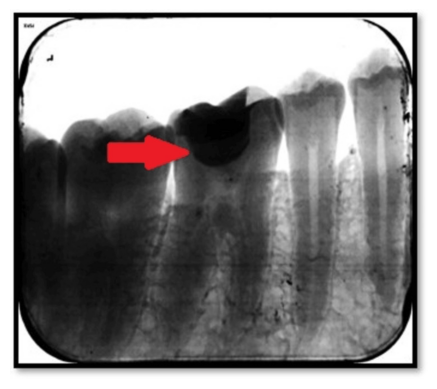

Generated Caption for Image ImageCLEFmedical_Caption_2025_test_11769: .


In [ ]:
import os
from PIL import Image
import torch
import matplotlib.pyplot as plt

# Path to the test image folder
test_image_folder = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'

# Image ID for which we want to predict the caption
image_id = "ImageCLEFmedical_Caption_2025_test_11769"

# Construct the image path assuming the image filename is the same as the ID
image_filename = f"{image_id}.jpg"  # Assuming the image format is JPG
image_path = os.path.join(test_image_folder, image_filename)

# Check if the image file exists
if not os.path.exists(image_path):
    print(f"Warning: {image_path} does not exist.")
else:
    # Open the image using PIL
    image = Image.open(image_path)

    # Print the actual image size
    print(f"Actual size of the image {image_id}: {image.size} (Width x Height)")

    # Display the image
    plt.imshow(image)
    plt.axis('off')  # Hide axes for clarity
    plt.show()

    # Prepare the input for the model
    hardcoded_query = "What do you see in this medical image? "
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image", "image": image}
            ]
        }
    ]

    # Process image for model input
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    try:
        generated_ids = model.generate(**inputs, max_new_tokens=64)
        generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

        # Print the generated caption
        print(f"Generated Caption for Image {image_id}: {generated_caption}")

    except Exception as e:
        print(f"Error in caption generation for {image_id}: {str(e)}")



Actual size of the image ImageCLEFmedical_Caption_2025_test_11769: (750, 664) (Width x Height)


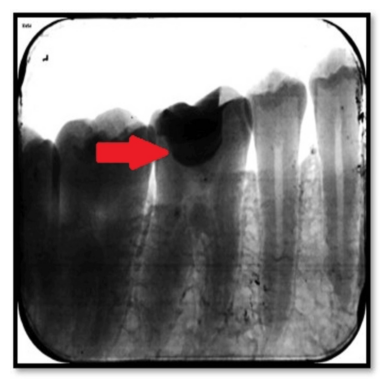

Generated Caption for Image ImageCLEFmedical_Caption_2025_test_11769: .


In [ ]:
import os
import pandas as pd
from tqdm import tqdm
from PIL import Image
import torch
import matplotlib.pyplot as plt

# Path to the test image folder
test_image_folder = '/content/drive/MyDrive/Clef 2025/development (1)/development/Test/test'

# Image ID for which we want to predict the caption
image_id = "ImageCLEFmedical_Caption_2025_test_11769"

# Construct the image path assuming the image filename is the same as the ID
image_filename = f"{image_id}.jpg"  # Assuming the image format is JPG
image_path = os.path.join(test_image_folder, image_filename)

# Check if the image file exists
if not os.path.exists(image_path):
    print(f"Warning: {image_path} does not exist.")
else:
    # Open the image using PIL
    image = Image.open(image_path)

    # Print the actual image size
    print(f"Actual size of the image {image_id}: {image.size} (Width x Height)")

    # Resize the image for better model performance (let's enlarge it to 1024x1024)
    image_resized = image.resize((1024, 1024), Image.Resampling.LANCZOS)

    # Display the resized image
    plt.imshow(image_resized)
    plt.axis('off')  # Hide axes for clarity
    plt.show()

    # Prepare the input for the model
    hardcoded_query = "What do you see in this medical image? Whatever you see just tell. "
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": hardcoded_query},
                {"type": "image", "image": image_resized}
            ]
        }
    ]

    # Process image for model input
    text = processor.apply_chat_template(messages, add_generation_prompt=True)
    inputs = processor(text=[text.strip()], images=[image_resized], return_tensors="pt", padding=True).to('cuda')

    # Generate the caption
    try:
        generated_ids = model.generate(**inputs, max_new_tokens=64)
        generated_caption = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)[0]

        # Print the generated caption
        print(f"Generated Caption for Image {image_id}: {generated_caption}")

    except Exception as e:
        print(f"Error in caption generation for {image_id}: {str(e)}")


In [ ]:
zip_path = "/content/drive/MyDrive/test.zip"


In [ ]:
import zipfile
import os

# Set output directory
output_dir = '/content/Test'
os.makedirs(output_dir, exist_ok=True)

# Extract zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print("Unzip completed.")


Unzip completed.


In [ ]:
import zipfile
import os

# Set output directory
output_dir = '/content/unzipped_folder'
os.makedirs(output_dir, exist_ok=True)

# Extract zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print("Unzip completed.")


Unzip completed.


In [ ]:
import zipfile
import os

# Set output directory
output_dir = '/content/unzipped_folder'
os.makedirs(output_dir, exist_ok=True)

# Extract zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print("Unzip completed.")


Unzip completed.


In [ ]:
# 1. Base model from Hugging Face
BASE_MODEL = "Qwen/Qwen2-VL-2B-Instruct"

# 2. Your local LoRA adapter directory
ADAPTER_PATH = "/content/unzipped_folder"

# 3. Load base model
base_model = Qwen2VLForConditionalGeneration.from_pretrained(
    BASE_MODEL,
    device_map="auto",
    torch_dtype=torch.bfloat16,
)

# 4. Load LoRA adapter
model = PeftModel.from_pretrained(base_model, ADAPTER_PATH)

# 5. Load tokenizer and processor (from base model, not adapter)
tokenizer = AutoTokenizer.from_pretrained(BASE_MODEL, local_files_only=True)
processor = AutoProcessor.from_pretrained(BASE_MODEL, local_files_only=True)

# 6. Set model to evaluation mode
model.eval()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

PeftModelForCausalLM(
  (base_model): LoraModel(
    (model): Qwen2VLForConditionalGeneration(
      (visual): Qwen2VisionTransformerPretrainedModel(
        (patch_embed): PatchEmbed(
          (proj): Conv3d(3, 1280, kernel_size=(2, 14, 14), stride=(2, 14, 14), bias=False)
        )
        (rotary_pos_emb): VisionRotaryEmbedding()
        (blocks): ModuleList(
          (0-31): 32 x Qwen2VLVisionBlock(
            (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
            (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
            (attn): VisionSdpaAttention(
              (qkv): Linear(in_features=1280, out_features=3840, bias=True)
              (proj): Linear(in_features=1280, out_features=1280, bias=True)
            )
            (mlp): VisionMlp(
              (fc1): Linear(in_features=1280, out_features=5120, bias=True)
              (act): QuickGELUActivation()
              (fc2): Linear(in_features=5120, out_features=1280, bias=True)
      

In [ ]:
import os

image_dir = "/content/Test/test"

# Print a few filenames
files = sorted([f for f in os.listdir(image_dir) if f.endswith(".jpg")])
print("First 10 files:", files[:10])


First 10 files: ['ImageCLEFmedical_Caption_2025_test_0.jpg', 'ImageCLEFmedical_Caption_2025_test_1.jpg', 'ImageCLEFmedical_Caption_2025_test_10.jpg', 'ImageCLEFmedical_Caption_2025_test_100.jpg', 'ImageCLEFmedical_Caption_2025_test_1000.jpg', 'ImageCLEFmedical_Caption_2025_test_10000.jpg', 'ImageCLEFmedical_Caption_2025_test_10001.jpg', 'ImageCLEFmedical_Caption_2025_test_10002.jpg', 'ImageCLEFmedical_Caption_2025_test_10003.jpg', 'ImageCLEFmedical_Caption_2025_test_10004.jpg']


In [ ]:
from transformers import AutoTokenizer, AutoProcessor
from peft import PeftModel
from transformers import AutoTokenizer, AutoProcessor, Qwen2VLForConditionalGeneration
import torch
from PIL import Image
import os
import pandas as pd
from tqdm import tqdm
import re

# =========================
# 1. Configuration
# =========================
BASE_MODEL = "Qwen/Qwen2-VL-2B-Instruct"
ADAPTER_PATH = "/content/unzipped_folder"
CLASSIFICATION_CSV = "/content/test_predictions_Final.csv"
IMAGE_DIR = "/content/Test/test"
OUTPUT_CSV = "/content/drive/MyDrive/final_forced_type_captions.csv"
TARGET_SIZE = 512

# =========================
# 2. Load Model and Adapter
# =========================
base_model = Qwen2VLForConditionalGeneration.from_pretrained(
    BASE_MODEL,
    device_map="auto",
    torch_dtype=torch.bfloat16,
)
model = PeftModel.from_pretrained(base_model, ADAPTER_PATH)
model.eval()

tokenizer = AutoTokenizer.from_pretrained(BASE_MODEL, local_files_only=True)
processor = AutoProcessor.from_pretrained(BASE_MODEL, local_files_only=True)

# =========================
# 3. Image Processing
# =========================
def resolve_image_path(image_id, directory):
    image_id_lower = image_id.lower()
    for fname in os.listdir(directory):
        if fname.lower().startswith(image_id_lower) and fname.lower().endswith((".jpg", ".jpeg", ".png")):
            return os.path.join(directory, fname)
    return None

def medical_resize(image_path, target_size=TARGET_SIZE):
    try:
        img = Image.open(image_path)
        if img.mode != 'RGB':
            img = img.convert('RGB')
        orig_w, orig_h = img.size
        scale = min(target_size / orig_w, target_size / orig_h)
        new_w, new_h = int(orig_w * scale), int(orig_h * scale)
        img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)
        result = Image.new("RGB", (target_size, target_size), (0, 0, 0))
        offset = ((target_size - new_w) // 2, (target_size - new_h) // 2)
        result.paste(img, offset)
        return result
    except Exception as e:
        print(f"[ERROR] Resize failed: {image_path} → {e}")
        return None

# =========================
# 4. Prompt: Do not predict type
# =========================
def generate_caption(image):
    prompt = (
        "Describe the anatomical structures and abnormalities in this medical image. "
        "Do not predict or guess the image type."
    )

    messages = [{
        "role": "user",
        "content": [
            {"type": "text", "text": prompt},
            {"type": "image", "image": image}
        ]
    }]

    text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = tokenizer(text, return_tensors="pt").to(model.device)

    outputs = model.generate(
        **inputs,
        max_new_tokens=200,
        do_sample=True,
        temperature=1.0,
        top_p=0.95,
        top_k=50,
        num_beams=3
    )
    return tokenizer.decode(outputs[0][inputs.input_ids.shape[1]:], skip_special_tokens=True).strip()

# =========================
# 5. Clean Output + Inject Image Type
# =========================
def clean_caption(generated: str, image_type: str) -> str:
    text = generated.lower()

    # Hard blocklist of hallucinated modalities
    forbidden = [
        "ct", "ct scan", "computed tomography", "mri", "mri scan", "magnetic resonance",
        "radiograph", "radiography", "xray", "x-ray", "x ray",
        "ultrasound", "sonograph", "scan", "image", "chest", "plain", "postoperative"
    ]
    for word in forbidden:
        text = re.sub(rf"\b{re.escape(word)}\b", "", text)

    text = re.sub(r"\b(shows|showed|demonstrated|displayed|revealed|indicates)\b", "", text)
    text = re.sub(r"[^a-zA-Z0-9., ]", "", text)
    text = ' '.join(text.split()).strip(" ,.")

    if not text:
        return f"{image_type} shows no abnormality detected."

    return f"{image_type} shows {text[0].upper() + text[1:]}"


# =========================
# 6. Main Inference Pipeline
# =========================
def main():
    df = pd.read_csv(CLASSIFICATION_CSV)
    results = []

    print(f"\n🧠 Generating captions for {len(df)} images...\n")

    for _, row in tqdm(df.iterrows(), total=len(df)):
        img_id = str(row["ID"]).strip()
        img_type = str(row["predicted_label"]).strip()
        image_path = resolve_image_path(img_id, IMAGE_DIR)

        record = {"ID": img_id, "Type": img_type}

        if not image_path:
            record["Caption"] = "Image not found"
            print(f"{img_id} → Image not found")
            results.append(record)
            continue

        try:
            img = medical_resize(image_path)
            if img is None:
                record["Caption"] = "Resize failed"
                print(f"{img_id} → Resize failed")
                results.append(record)
                continue

            raw = generate_caption(img)
            final = clean_caption(raw, img_type)


        except Exception as e:
            final = f"Error: {str(e)}"

        print(f"{img_id} → {final}")
        record["Caption"] = final
        results.append(record)

    pd.DataFrame(results).to_csv(OUTPUT_CSV, index=False)
    print(f"\n✅ Final captions saved to: {OUTPUT_CSV}")

if __name__ == "__main__":
    main()


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]


🧠 Generating captions for 19267 images...



  0%|          | 1/19267 [00:01<9:28:26,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_0 → Radiograph shows Of the patient a large rightsided infiltrate


  0%|          | 2/19267 [00:04<12:22:43,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1 → Radiograph shows Of the patient a large rightsided infiltrate


  0%|          | 3/19267 [00:06<11:23:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2 → CT shows Abdominal of the patient a large rightsided infiltrate


  0%|          | 4/19267 [00:09<14:25:06,  2.69s/it]

ImageCLEFmedical_Caption_2025_test_3 → Radiograph shows Of the patient a large soft tissue thickening of the left eye. the patient a large soft tissue thickening of the left eye


  0%|          | 5/19267 [00:11<12:38:19,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_4 → Radiograph shows Axial of the patient a large rightsided infiltrate


  0%|          | 6/19267 [00:13<12:21:39,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 7/19267 [00:15<11:14:29,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6 → MRI shows Of the patient a large rightsided infiltrate


  0%|          | 8/19267 [00:17<10:48:30,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 9/19267 [00:19<10:08:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


  0%|          | 10/19267 [00:21<10:23:31,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 11/19267 [00:23<10:25:50,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  0%|          | 12/19267 [00:26<13:34:52,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_11 → MRI shows Of the patient a large rightsided infiltrate


  0%|          | 13/19267 [00:28<12:32:14,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_12 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 14/19267 [00:30<12:03:41,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_13 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 15/19267 [00:34<14:55:27,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_14 → MRI shows Of the patient showing a large rightsided infiltrate


  0%|          | 16/19267 [00:36<13:31:31,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_15 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  0%|          | 17/19267 [00:39<14:06:46,  2.64s/it]

ImageCLEFmedical_Caption_2025_test_16 → MRI shows Of a patient with covid19 showing a large rightsided infiltrate


  0%|          | 18/19267 [00:41<13:09:21,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_17 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 19/19267 [00:43<11:49:14,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18 → Radiograph shows A large rightsided infiltrate


  0%|          | 20/19267 [00:45<11:17:32,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_19 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 21/19267 [00:47<11:11:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_20 → MRI shows Of the patient before surgery a large soft tissue swelling of the left eye


  0%|          | 22/19267 [00:49<10:50:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_21 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 23/19267 [00:51<10:42:06,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_22 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  0%|          | 24/19267 [00:53<10:38:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_23 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  0%|          | 25/19267 [00:55<10:27:41,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_24 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 26/19267 [00:56<10:22:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_25 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 27/19267 [00:59<11:28:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_26 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


  0%|          | 28/19267 [01:01<10:46:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_27 → Radiograph shows Of the patient showing a large rightsided infiltrate


  0%|          | 29/19267 [01:03<11:04:03,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_28 → MRI shows Of the patient before surgery a large rightsided infiltrate


  0%|          | 30/19267 [01:05<11:49:09,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_29 → CT shows Anteroposterior of the patient a large rightsided groundglass opacities in the right lower lobe


  0%|          | 31/19267 [01:08<11:51:49,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_30 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 32/19267 [01:09<11:03:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_31 → Ultrasound shows A large rightsided opacities in the right lower lobe


  0%|          | 33/19267 [01:11<10:19:35,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_32 → MRI shows A large rightsided infiltrate in the right lower lobe


  0%|          | 34/19267 [01:13<9:57:55,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_33 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 35/19267 [01:15<10:14:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_34 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 36/19267 [01:17<10:25:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_35 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 37/19267 [01:19<10:34:05,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_36 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 38/19267 [01:21<10:08:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_37 → Radiograph shows A large rightsided opacities in the right lower lobe


  0%|          | 39/19267 [01:23<10:43:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_38 → CT shows Showing a large rightsided infiltrate


  0%|          | 40/19267 [01:25<10:45:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_39 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  0%|          | 41/19267 [01:27<10:11:22,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_40 → CT shows A large rightsided infiltrate


  0%|          | 42/19267 [01:28<10:10:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_41 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  0%|          | 43/19267 [01:31<10:25:36,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_42 → MRI shows Of patient 2 showing a large rightsided infiltrate


  0%|          | 44/19267 [01:32<10:22:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_43 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 45/19267 [01:34<10:09:28,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_44 → MRI shows Of the patient before surgery a large rightsided infiltrate


  0%|          | 46/19267 [01:36<9:44:03,  1.82s/it] 

ImageCLEFmedical_Caption_2025_test_45 → Radiograph shows Of the patient a large rightsided infiltrate


  0%|          | 47/19267 [01:38<9:35:40,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_46 → MRI shows Of the patient a large rightsided infiltrate


  0%|          | 48/19267 [01:40<9:44:23,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_47 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  0%|          | 49/19267 [01:41<9:57:46,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_48 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  0%|          | 50/19267 [01:43<10:09:30,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_49 → Radiograph shows Of the patient showing multiple groundglass opacities in the right lower lobe


  0%|          | 51/19267 [01:45<9:54:37,  1.86s/it] 

ImageCLEFmedical_Caption_2025_test_50 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 52/19267 [01:47<9:59:08,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_51 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 53/19267 [01:49<10:34:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_52 → CT shows Anteroposterior of the patient a large lobular infiltrate in the right lower lobe


  0%|          | 54/19267 [01:51<10:25:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_53 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 55/19267 [01:53<10:01:58,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_54 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 56/19267 [01:56<11:26:02,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_55 → MRI shows Of the patient a large soft tissue thickening of the right eye


  0%|          | 57/19267 [01:58<11:11:36,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_56 → CT shows Of the patient multiple groundglass opacities in the right upper lobe


  0%|          | 58/19267 [02:00<11:00:53,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_57 → CT shows Of patient 2 showing a large rightsided infiltrate


  0%|          | 59/19267 [02:02<10:52:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_58 → Radiograph shows A 39month followup of the patient a large rightsided infiltrate in the left eye


  0%|          | 60/19267 [02:04<11:10:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_59 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


  0%|          | 61/19267 [02:06<10:26:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_60 → Radiograph shows A large rightsided infiltrate in the right lower lobe


  0%|          | 62/19267 [02:07<10:20:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_61 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 63/19267 [02:09<9:51:37,  1.85s/it] 

ImageCLEFmedical_Caption_2025_test_62 → CT shows Of the patient showing a large rightsided infiltrate


  0%|          | 64/19267 [02:11<9:55:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_63 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  0%|          | 65/19267 [02:13<9:59:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_64 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  0%|          | 66/19267 [02:15<10:00:09,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_65 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 67/19267 [02:16<9:42:32,  1.82s/it] 

ImageCLEFmedical_Caption_2025_test_66 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 68/19267 [02:18<9:42:32,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_67 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 69/19267 [02:20<9:24:28,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_68 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


  0%|          | 70/19267 [02:22<9:47:16,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_69 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  0%|          | 71/19267 [02:23<9:11:01,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_70 → CT shows Abdominal a large rightsided abscess


  0%|          | 72/19267 [02:25<9:03:31,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_71 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


  0%|          | 73/19267 [02:27<9:21:17,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_72 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 74/19267 [02:29<9:26:05,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_73 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  0%|          | 75/19267 [02:31<9:37:27,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_74 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  0%|          | 76/19267 [02:33<9:54:35,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_75 → MRI shows Of the patient showing a large rightsided infiltrate


  0%|          | 77/19267 [02:35<11:22:26,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_76 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate in the right side


  0%|          | 78/19267 [02:37<11:15:39,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_77 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 79/19267 [02:40<11:17:09,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_78 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  0%|          | 80/19267 [02:42<11:42:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_79 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 81/19267 [02:45<12:41:28,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_80 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


  0%|          | 82/19267 [02:47<12:00:01,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_81 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  0%|          | 83/19267 [02:49<11:22:13,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_82 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  0%|          | 84/19267 [02:50<11:06:10,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_83 → Radiograph shows Of the patient a large rightsided infiltrate of the right upper lobe


  0%|          | 85/19267 [02:52<10:44:43,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_84 → CT shows Of the patient before surgery a large rightsided infiltrate


  0%|          | 86/19267 [02:54<10:12:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_85 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


  0%|          | 87/19267 [02:56<9:50:58,  1.85s/it] 

ImageCLEFmedical_Caption_2025_test_86 → CT shows Of the patient a large rightsided infiltrate


  0%|          | 88/19267 [02:57<9:37:46,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_87 → Radiograph shows Of the patient a large rightsided infiltrate


  0%|          | 89/19267 [02:59<9:44:56,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_88 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  0%|          | 90/19267 [03:01<10:01:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_89 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 91/19267 [03:04<11:49:21,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_90 → Radiograph shows Of the patient a large rightsided infiltrate


  0%|          | 92/19267 [03:07<13:19:30,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_91 → CT shows Of the patient a large soft tissue thickening of the right upper lobe. the patient a large soft tissue thickening of the right upper lobe


  0%|          | 93/19267 [03:10<14:08:31,  2.66s/it]

ImageCLEFmedical_Caption_2025_test_92 → Radiograph shows Of patient 2 a large rightsided infiltrate of the right lower lobe


  0%|          | 94/19267 [03:12<12:09:49,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_93 → MRI shows Of the patient a large rightsided infiltrate


  0%|          | 95/19267 [03:14<12:16:29,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_94 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


  0%|          | 96/19267 [03:16<11:30:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_95 → CT shows Of the patient showing a large rightsided infiltrate


  1%|          | 97/19267 [03:18<11:48:54,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_96 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 98/19267 [03:21<12:40:50,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_97 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


  1%|          | 99/19267 [03:24<12:41:51,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_98 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|          | 100/19267 [03:26<11:58:40,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_99 → Ultrasound shows Panoramic of the patient before surgery a large rightsided infiltrate


  1%|          | 101/19267 [03:28<12:47:23,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_100 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right lower lobe


  1%|          | 102/19267 [03:30<12:09:48,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_101 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 103/19267 [03:32<11:21:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_102 → MRI shows Of the patient multiple rightsided infiltrate


  1%|          | 104/19267 [03:34<10:15:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_103 → CT shows Of patient 2 a large rightsided infiltrate


  1%|          | 105/19267 [03:35<10:09:55,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_104 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 106/19267 [03:37<10:23:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_105 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 107/19267 [03:39<10:19:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_106 → CT shows A 39month followup of the patient showing a large soft tissue mass in the right eye


  1%|          | 108/19267 [03:41<10:04:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_107 → CT shows A large rightsided infiltrate


  1%|          | 109/19267 [03:43<9:59:26,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_108 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


  1%|          | 110/19267 [03:45<10:12:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_109 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 111/19267 [03:47<9:45:59,  1.84s/it] 

ImageCLEFmedical_Caption_2025_test_110 → Ultrasound shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


  1%|          | 112/19267 [03:48<9:25:02,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_111 → CT shows A large rightsided infiltrate in the right lower lobe


  1%|          | 113/19267 [03:50<9:15:36,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_112 → Radiograph shows Threemonth followup of the patient a large soft tissue mass in the right eye


  1%|          | 114/19267 [03:52<10:03:12,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_113 → MRI shows Of the patient a large rightsided infiltrate in the left eye


  1%|          | 115/19267 [03:54<9:44:40,  1.83s/it] 

ImageCLEFmedical_Caption_2025_test_114 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|          | 116/19267 [03:56<9:50:29,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_115 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


  1%|          | 117/19267 [03:58<9:52:36,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_116 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  1%|          | 118/19267 [03:59<9:39:09,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_117 → Ultrasound shows Of the patient a large rightsided infiltrate


  1%|          | 119/19267 [04:01<9:28:54,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_118 → Radiograph shows A large rightsided infiltrate in the right lower lobe


  1%|          | 120/19267 [04:03<9:33:54,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_119 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 121/19267 [04:05<9:37:17,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_120 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 122/19267 [04:07<9:41:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_121 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 123/19267 [04:08<9:45:24,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_122 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 124/19267 [04:10<9:48:00,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_123 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 125/19267 [04:12<10:12:53,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_124 → CT shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 126/19267 [04:14<10:05:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_125 → MRI shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 127/19267 [04:16<10:04:34,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_126 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 128/19267 [04:18<9:38:21,  1.81s/it] 

ImageCLEFmedical_Caption_2025_test_127 → MRI shows A large rightsided infiltrate in the right lower lobe


  1%|          | 129/19267 [04:20<9:58:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_128 → CT shows Axial of the patient before surgery a large rightsided infiltrate


  1%|          | 130/19267 [04:21<9:39:23,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_129 → MRI shows A large rightsided opacities in the right lower lobe


  1%|          | 131/19267 [04:23<9:45:38,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_130 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  1%|          | 132/19267 [04:25<10:05:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_131 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 133/19267 [04:27<10:04:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_132 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 134/19267 [04:29<10:34:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_133 → CT shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 135/19267 [04:32<11:16:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_134 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|          | 136/19267 [04:34<11:56:47,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_135 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  1%|          | 137/19267 [04:36<11:04:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_136 → CT shows A large rightsided opacities in the right lower lobe


  1%|          | 138/19267 [04:38<10:27:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_137 → MRI shows Of the patient a large rightsided infiltrate


  1%|          | 139/19267 [04:40<10:01:36,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_138 → CT shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 140/19267 [04:41<9:40:53,  1.82s/it] 

ImageCLEFmedical_Caption_2025_test_139 → Radiograph shows Of the patient a large rightsided infiltrate


  1%|          | 141/19267 [04:44<11:42:03,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_140 → Ultrasound shows Of the patient a large rightsided infiltrate with a large rightsided infiltrate


  1%|          | 142/19267 [04:47<11:49:02,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_141 → MRI shows A large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


  1%|          | 143/19267 [04:49<11:29:48,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_142 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  1%|          | 144/19267 [04:51<11:06:24,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_143 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  1%|          | 145/19267 [04:53<11:37:46,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_144 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  1%|          | 146/19267 [04:55<11:19:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_145 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 147/19267 [04:56<10:19:56,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_146 → Radiograph shows A large rightsided infiltrate


  1%|          | 148/19267 [04:58<10:11:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_147 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 149/19267 [05:00<9:58:46,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_148 → CT shows Of the patient showing a large rightsided infiltrate


  1%|          | 150/19267 [05:03<11:03:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_149 → Radiograph shows Of patient 2 showing the presence of a large rightsided infiltrate


  1%|          | 151/19267 [05:04<10:40:02,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_150 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 152/19267 [05:07<10:41:02,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_151 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 153/19267 [05:08<10:09:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_152 → Ultrasound shows A large rightsided infiltrate


  1%|          | 154/19267 [05:10<10:13:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_153 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  1%|          | 155/19267 [05:12<9:54:39,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_154 → MRI shows Of the patient a large rightsided infiltrate


  1%|          | 156/19267 [05:14<10:17:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_155 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 157/19267 [05:16<10:08:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_156 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


  1%|          | 158/19267 [05:18<10:10:34,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_157 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  1%|          | 159/19267 [05:20<10:36:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_158 → MRI shows Of the patient a large rightsided infiltrate


  1%|          | 160/19267 [05:22<10:23:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_159 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 161/19267 [05:24<11:18:53,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_160 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 162/19267 [05:27<12:23:37,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_161 → Ultrasound shows Of the patient a large rightsided infiltrate


  1%|          | 163/19267 [05:30<12:38:20,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_162 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|          | 164/19267 [05:32<13:06:11,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_163 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 165/19267 [05:35<12:47:42,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_164 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


  1%|          | 166/19267 [05:37<12:12:52,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_165 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 167/19267 [05:39<12:44:24,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_166 → CT shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 168/19267 [05:42<12:54:59,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_167 → Radiograph shows Of the patient showing a large rightsided infiltrate


  1%|          | 169/19267 [05:44<11:57:50,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_168 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  1%|          | 170/19267 [05:45<11:11:23,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_169 → CT shows Of the patient a 1.3 cmsized rightsided infiltrate


  1%|          | 171/19267 [05:47<10:46:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_170 → Radiograph shows Of the patient the presence of a rightsided infiltrate


  1%|          | 172/19267 [05:49<10:31:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_171 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 173/19267 [05:51<10:34:15,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_172 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 174/19267 [05:53<10:36:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_173 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 175/19267 [05:56<11:10:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_174 → CT shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 176/19267 [05:57<10:27:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_175 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|          | 177/19267 [06:00<11:11:49,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_176 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 178/19267 [06:02<11:05:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_177 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 179/19267 [06:05<12:50:21,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_178 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 180/19267 [06:08<13:30:24,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_179 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate of the right upper lobe


  1%|          | 181/19267 [06:10<13:13:34,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_180 → MRI shows Of the patient with covid19 pneumonia a large rightsided infiltrate in the right lower lobe


  1%|          | 182/19267 [06:13<13:09:22,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_181 → MRI shows Of the patient with covid19 pneumonia showing a large rightsided infiltrate in the right upper lobe


  1%|          | 183/19267 [06:15<12:56:54,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_182 → Ultrasound shows Of the patient a large rightsided infiltrate


  1%|          | 184/19267 [06:17<12:02:47,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_183 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  1%|          | 185/19267 [06:19<11:24:36,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_184 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 186/19267 [06:20<10:55:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_185 → Radiograph shows Of patient 2 multiple rightsided infiltrate


  1%|          | 187/19267 [06:23<11:16:16,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_186 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


  1%|          | 188/19267 [06:25<10:43:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_187 → MRI shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 189/19267 [06:26<10:05:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_188 → MRI shows Of the patient a large rightsided infiltrate


  1%|          | 190/19267 [06:29<11:51:25,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_189 → CT shows The patient a large rightsided infiltrate of the left eye. the patient a large rightsided infiltrate with a large rightsided infiltrate in the left eye


  1%|          | 191/19267 [06:33<13:37:46,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_190 → Ultrasound shows Of the patient before surgery a large soft tissue thickening of the right eye, which is evident by the presence of a large soft tissue thickening of the left eye


  1%|          | 192/19267 [06:34<12:26:40,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_191 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  1%|          | 193/19267 [06:36<11:44:16,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_192 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 194/19267 [06:38<11:35:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_193 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  1%|          | 195/19267 [06:40<11:04:22,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_194 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  1%|          | 196/19267 [06:42<11:12:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_195 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 197/19267 [06:44<10:55:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_196 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  1%|          | 198/19267 [06:47<12:19:42,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_197 → CT shows Of the patient before surgery showing a large soft tissue thickening of the right eye


  1%|          | 199/19267 [06:50<13:02:57,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_198 → CT shows Abdominal of the patient before surgery a large soft tissue mass in the right upper lobe


  1%|          | 200/19267 [06:52<12:29:48,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_199 → Radiograph shows Orthoplastic of the patient before surgery a large rightsided infiltrate


  1%|          | 201/19267 [06:54<11:51:09,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_200 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  1%|          | 202/19267 [06:56<11:16:47,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_201 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 203/19267 [06:58<10:51:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_202 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 204/19267 [06:59<9:54:23,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_203 → CT shows Three months after surgery showing a large rightsided infiltrate


  1%|          | 205/19267 [07:01<9:53:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_204 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 206/19267 [07:03<9:57:48,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_205 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 207/19267 [07:05<10:12:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_206 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 208/19267 [07:07<10:36:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_207 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


  1%|          | 209/19267 [07:09<10:05:58,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_208 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


  1%|          | 210/19267 [07:11<10:02:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_209 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 211/19267 [07:13<10:12:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_210 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  1%|          | 212/19267 [07:14<9:34:37,  1.81s/it] 

ImageCLEFmedical_Caption_2025_test_211 → CT shows Of the patient showing a large soft tissue swelling in the right eye


  1%|          | 213/19267 [07:16<9:24:36,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_212 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|          | 214/19267 [07:18<9:17:14,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_213 → MRI shows Of the patient a large soft tissue thickening of the right eye


  1%|          | 215/19267 [07:20<9:25:30,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_214 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 216/19267 [07:21<9:30:56,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_215 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  1%|          | 217/19267 [07:24<9:51:26,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_216 → MRI shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 218/19267 [07:26<10:45:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_217 → CT shows A large rightsided infiltrate


  1%|          | 219/19267 [07:28<10:42:10,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_218 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 220/19267 [07:30<11:05:53,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_219 → CT shows Of the patient at the time of surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 221/19267 [07:32<10:27:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_220 → Radiograph shows Axial of the patient showing a large rightsided infiltrate


  1%|          | 222/19267 [07:34<10:15:29,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_221 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  1%|          | 223/19267 [07:36<10:21:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_222 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|          | 224/19267 [07:37<9:56:40,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_223 → Radiograph shows Of the patient a large rightsided infiltrate


  1%|          | 225/19267 [07:40<10:44:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_224 → CT shows Of the patient showing a large rightsided infiltrate


  1%|          | 226/19267 [07:42<10:29:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_225 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 227/19267 [07:44<10:58:35,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_226 → Radiograph shows Of the patient a large rightsided infiltrate in the left eye


  1%|          | 228/19267 [07:46<11:18:24,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_227 → MRI shows Of patient 2 a large rightsided infiltrate


  1%|          | 229/19267 [07:48<10:52:08,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_228 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 230/19267 [07:51<11:34:08,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_229 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 231/19267 [07:53<11:05:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_230 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 232/19267 [07:54<10:41:43,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_231 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 233/19267 [07:56<10:26:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_232 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 234/19267 [07:59<11:42:55,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_233 → MRI shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 235/19267 [08:01<10:53:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_234 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  1%|          | 236/19267 [08:03<11:52:55,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_235 → MRI shows Of a patient with covid19 multiple groundglass opacities in the right lower lobe


  1%|          | 237/19267 [08:05<11:18:32,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_236 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 238/19267 [08:07<10:52:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_237 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|          | 239/19267 [08:09<10:26:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_238 → CT shows Of the patient before surgery a large rightsided infiltrate


  1%|          | 240/19267 [08:11<10:06:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_239 → CT shows A large rightsided infiltrate


  1%|▏         | 241/19267 [08:13<10:03:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_240 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 242/19267 [08:14<9:45:39,  1.85s/it] 

ImageCLEFmedical_Caption_2025_test_241 → MRI shows A large rightsided opacities in the right lower lobe


  1%|▏         | 243/19267 [08:17<10:21:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_242 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  1%|▏         | 244/19267 [08:18<10:11:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_243 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 245/19267 [08:21<11:31:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_244 → CT shows Of a patient with covid19, showing a large rightsided infiltrate


  1%|▏         | 246/19267 [08:23<11:00:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_245 → Ultrasound shows Of the patient a large rightsided infiltrate


  1%|▏         | 247/19267 [08:25<10:45:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_246 → MRI shows Of the patient before surgery a rightsided infiltrate


  1%|▏         | 248/19267 [08:27<10:48:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_247 → Radiograph shows Of the patient with covid19 a large rightsided infiltrate


  1%|▏         | 249/19267 [08:28<9:55:10,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_248 → Ultrasound shows Of the patient a large mass in the right eye


  1%|▏         | 250/19267 [08:30<10:02:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_249 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


  1%|▏         | 251/19267 [08:32<10:06:22,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_250 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


  1%|▏         | 252/19267 [08:34<9:46:36,  1.85s/it] 

ImageCLEFmedical_Caption_2025_test_251 → CT shows Of the patient an extensive soft tissue thickening of the right eye


  1%|▏         | 253/19267 [08:36<9:46:30,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_252 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 254/19267 [08:39<11:09:03,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_253 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 255/19267 [08:41<10:49:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_254 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 256/19267 [08:42<10:29:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_255 → CT shows Of the patient showing a large rightsided infiltrate


  1%|▏         | 257/19267 [08:45<10:41:26,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_256 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


  1%|▏         | 258/19267 [08:46<10:10:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_257 → MRI shows Showing a large rightsided opacities in the left lower lobe


  1%|▏         | 259/19267 [08:48<10:02:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_258 → MRI shows Of the patient a large rightsided infiltrate


  1%|▏         | 260/19267 [08:50<9:43:34,  1.84s/it] 

ImageCLEFmedical_Caption_2025_test_259 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|▏         | 261/19267 [08:52<10:20:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_260 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


  1%|▏         | 262/19267 [08:54<11:07:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_261 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|▏         | 263/19267 [08:57<12:15:10,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_262 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  1%|▏         | 264/19267 [08:59<11:32:06,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_263 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 265/19267 [09:01<11:33:06,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_264 → CT shows Of patient 2 showing a large rightsided infiltrate


  1%|▏         | 266/19267 [09:04<11:33:41,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_265 → Radiograph shows Of the patient a large rightsided infiltrate


  1%|▏         | 267/19267 [09:06<11:19:07,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_266 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|▏         | 268/19267 [09:07<10:52:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_267 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 269/19267 [09:10<11:26:14,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_268 → CT shows Of a patient with covid19 multiple groundglass opacities in the right lower lobe


  1%|▏         | 270/19267 [09:12<10:57:25,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_269 → Radiograph shows Of the patient showing a large rightsided infiltrate


  1%|▏         | 271/19267 [09:14<11:06:50,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_270 → CT shows A large rightsided infiltrate


  1%|▏         | 272/19267 [09:17<12:35:07,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_271 → CT shows Of patient 2 a large rightsided infiltrate


  1%|▏         | 273/19267 [09:20<13:03:32,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_272 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 274/19267 [09:22<12:18:20,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_273 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  1%|▏         | 275/19267 [09:24<12:10:02,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_274 → CT shows Showing a large rightsided infiltrate


  1%|▏         | 276/19267 [09:26<11:58:19,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_275 → MRI shows Of the patient showing a large rightsided infiltrate


  1%|▏         | 277/19267 [09:28<10:58:04,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_276 → Radiograph shows Of the patient showing a large rightsided infiltrate


  1%|▏         | 278/19267 [09:29<10:23:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_277 → CT shows Abdominal a large rightsided mass on the right side


  1%|▏         | 279/19267 [09:31<10:12:47,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_278 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 280/19267 [09:33<9:50:01,  1.86s/it] 

ImageCLEFmedical_Caption_2025_test_279 → MRI shows Anteroposterior a large rightsided infiltrate


  1%|▏         | 281/19267 [09:35<9:48:23,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_280 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  1%|▏         | 282/19267 [09:37<10:19:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_281 → CT shows Of the patient a large rightsided infiltrate


  1%|▏         | 283/19267 [09:39<9:54:33,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_282 → Ultrasound shows Of the patient a large rightsided infiltrate


  1%|▏         | 284/19267 [09:41<9:55:29,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_283 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  1%|▏         | 285/19267 [09:42<9:37:03,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_284 → MRI shows Of the patient a large rightsided infiltrate


  1%|▏         | 286/19267 [09:44<10:10:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_285 → CT shows A large rightsided infiltrate


  1%|▏         | 287/19267 [09:46<9:30:45,  1.80s/it] 

ImageCLEFmedical_Caption_2025_test_286 → CT shows A rightsided infiltrate of the right lower lobe


  1%|▏         | 288/19267 [09:48<10:16:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_287 → CT shows Of the patient showing a large rightsided infiltrate


  1%|▏         | 289/19267 [09:51<10:48:19,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_288 → Ultrasound shows Of patient 2 a large rightsided infiltrate


  2%|▏         | 290/19267 [09:52<10:14:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_289 → Radiograph shows Axial of the patient showing a large soft tissue infiltrate in the right eye


  2%|▏         | 291/19267 [09:54<10:06:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_290 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  2%|▏         | 292/19267 [09:56<10:33:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_291 → CT shows Of patient 2. the patient a large rightsided infiltrate in the right upper lobe


  2%|▏         | 293/19267 [09:58<10:02:12,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_292 → Radiograph shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 294/19267 [10:00<10:32:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_293 → MRI shows Abdominal of the patient before surgery a large soft tissue mass in the right upper lobe


  2%|▏         | 295/19267 [10:03<12:08:27,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_294 → MRI shows A large rightsided infiltrate


  2%|▏         | 296/19267 [10:06<12:52:54,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_295 → Ultrasound shows Of the patient a rightsided infiltrate. the patient a large rightsided infiltrate


  2%|▏         | 297/19267 [10:08<11:56:58,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_296 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 298/19267 [10:10<11:47:11,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_297 → Ultrasound shows Of the patient a large rightsided infiltrate


  2%|▏         | 299/19267 [10:13<12:20:21,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_298 → MRI shows Of the patient


  2%|▏         | 300/19267 [10:14<11:34:45,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_299 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 301/19267 [10:17<11:39:32,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_300 → MRI shows A large rightsided infiltrate


  2%|▏         | 302/19267 [10:18<10:51:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_301 → Radiograph shows Axial view of the patient before surgery a large rightsided infiltrate


  2%|▏         | 303/19267 [10:21<12:28:32,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_302 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


  2%|▏         | 304/19267 [10:23<11:50:18,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_303 → MRI shows Of patient 2 a large rightsided infiltrate in the left lower lobe


  2%|▏         | 305/19267 [10:25<11:19:53,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_304 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


  2%|▏         | 306/19267 [10:28<11:23:00,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_305 → CT shows Of the patient before surgery a large rightsided opacities on the right side


  2%|▏         | 307/19267 [10:29<10:55:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_306 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 308/19267 [10:32<10:59:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_307 → MRI shows Of the patient a large soft tissue swelling in the right eye


  2%|▏         | 309/19267 [10:34<10:52:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_308 → MRI shows Of patient 2 a large rightsided opacities in the right lower lobe


  2%|▏         | 310/19267 [10:36<11:28:54,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_309 → MRI shows Threemonth followup of the patient no evidence of recurrence


  2%|▏         | 311/19267 [10:38<10:32:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_310 → MRI shows A large rightsided infiltrate in the right lower lobe


  2%|▏         | 312/19267 [10:39<9:56:35,  1.89s/it] 

ImageCLEFmedical_Caption_2025_test_311 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 313/19267 [10:41<9:38:53,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_312 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


  2%|▏         | 314/19267 [10:43<10:09:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_313 → MRI shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 315/19267 [10:45<9:40:23,  1.84s/it] 

ImageCLEFmedical_Caption_2025_test_314 → CT shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 316/19267 [10:47<10:03:08,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_315 → MRI shows Abdominal of the patient before surgery an large soft tissue swelling of the right upper lobe


  2%|▏         | 317/19267 [10:49<10:06:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_316 → CT shows Of patient 2 a large rightsided infiltrate


  2%|▏         | 318/19267 [10:51<9:59:24,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_317 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 319/19267 [10:52<9:38:08,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_318 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 320/19267 [10:54<9:41:46,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_319 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 321/19267 [10:56<10:22:42,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_320 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 322/19267 [10:58<9:39:30,  1.84s/it] 

ImageCLEFmedical_Caption_2025_test_321 → CT shows Threemonth followup after surgery a large soft tissue swelling in the right eye


  2%|▏         | 323/19267 [11:00<9:25:57,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_322 → Ultrasound shows A large rightsided opacities in the right lower lobe


  2%|▏         | 324/19267 [11:02<10:11:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_323 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 325/19267 [11:04<10:02:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_324 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 326/19267 [11:06<10:29:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_325 → MRI shows A large rightsided infiltrate


  2%|▏         | 327/19267 [11:08<10:18:07,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_326 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 328/19267 [11:10<11:26:04,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_327 → CT shows Of the patient a large rightsided infiltrate


  2%|▏         | 329/19267 [11:13<11:25:26,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_328 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  2%|▏         | 330/19267 [11:14<10:55:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_329 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 331/19267 [11:16<10:09:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_330 → MRI shows A large rightsided infiltrate in the right lower lobe


  2%|▏         | 332/19267 [11:18<10:51:26,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_331 → MRI shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 333/19267 [11:21<11:03:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_332 → CT shows Of the patient a large rightsided infiltrate


  2%|▏         | 334/19267 [11:22<10:40:08,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_333 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 335/19267 [11:24<10:22:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_334 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 336/19267 [11:26<10:12:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_335 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 337/19267 [11:29<11:39:37,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_336 → MRI shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 338/19267 [11:31<11:06:46,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_337 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 339/19267 [11:33<10:43:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_338 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 340/19267 [11:35<11:44:51,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_339 → CT shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 341/19267 [11:37<11:18:03,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_340 → Radiograph shows Anteroposterior showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 342/19267 [11:40<12:46:31,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_341 → CT shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 343/19267 [11:43<12:06:21,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_342 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  2%|▏         | 344/19267 [11:44<11:31:41,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_343 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  2%|▏         | 345/19267 [11:46<10:34:38,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_344 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 346/19267 [11:47<9:41:07,  1.84s/it] 

ImageCLEFmedical_Caption_2025_test_345 → MRI shows Of patient 2 a large rightsided infiltrate


  2%|▏         | 347/19267 [11:50<10:01:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_346 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 348/19267 [11:51<9:55:48,  1.89s/it] 

ImageCLEFmedical_Caption_2025_test_347 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  2%|▏         | 349/19267 [11:53<9:38:33,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_348 → Radiograph shows A large rightsided infiltrate


  2%|▏         | 350/19267 [11:55<9:40:58,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_349 → MRI shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 351/19267 [11:57<9:52:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_350 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 352/19267 [11:59<10:12:30,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_351 → MRI shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 353/19267 [12:01<10:05:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_352 → CT shows Of the patient a large rightsided infiltrate


  2%|▏         | 354/19267 [12:03<9:42:31,  1.85s/it] 

ImageCLEFmedical_Caption_2025_test_353 → MRI shows A large rightsided opacities in the right lower lobe


  2%|▏         | 355/19267 [12:04<9:50:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_354 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  2%|▏         | 356/19267 [12:07<10:13:54,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_355 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the left lower lobe


  2%|▏         | 357/19267 [12:08<9:50:56,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_356 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


  2%|▏         | 358/19267 [12:11<10:57:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_357 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 359/19267 [12:13<10:35:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_358 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 360/19267 [12:15<11:07:16,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_359 → Ultrasound shows Of the patient with covid 19 a large rightsided infiltrate in the right lower lobe


  2%|▏         | 361/19267 [12:17<10:35:00,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_360 → CT shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 362/19267 [12:19<11:15:46,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_361 → Radiograph shows Of the patient a soft tissue thickening of the left eye


  2%|▏         | 363/19267 [12:22<11:18:59,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_362 → MRI shows A large rightsided infiltrate


  2%|▏         | 364/19267 [12:23<10:30:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_363 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


  2%|▏         | 365/19267 [12:25<10:32:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_364 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 366/19267 [12:28<11:13:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_365 → Radiograph shows Of the patient a large rightsided infiltrate


  2%|▏         | 367/19267 [12:29<10:29:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_366 → Radiograph shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 368/19267 [12:31<9:52:00,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_367 → MRI shows A large rightsided infiltrate in the right lower lobe


  2%|▏         | 369/19267 [12:32<9:24:50,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_368 → CT shows A large rightsided infiltrate of the right lower lobe


  2%|▏         | 370/19267 [12:34<9:45:46,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_369 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 371/19267 [12:43<19:47:30,  3.77s/it]

ImageCLEFmedical_Caption_2025_test_370 → CT shows Of the patient showing a 3.8cmsized mass in the left eye. the patient a 2.8 2.8 2.8 2.8 2.8 2.8 2.8 2.8 2.8 2.8 2.8 cm


  2%|▏         | 372/19267 [12:45<16:47:13,  3.20s/it]

ImageCLEFmedical_Caption_2025_test_371 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 373/19267 [12:47<14:49:53,  2.83s/it]

ImageCLEFmedical_Caption_2025_test_372 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


  2%|▏         | 374/19267 [12:48<13:25:34,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_373 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  2%|▏         | 375/19267 [12:50<12:22:17,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_374 → Radiograph shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 376/19267 [12:53<12:07:30,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_375 → Radiograph shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 377/19267 [12:55<11:49:27,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_376 → CT shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 378/19267 [12:57<11:17:03,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_377 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 379/19267 [12:59<12:17:38,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_378 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 380/19267 [13:01<11:34:41,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_379 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 381/19267 [13:03<11:04:00,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_380 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 382/19267 [13:05<10:56:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_381 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


  2%|▏         | 383/19267 [13:08<11:21:12,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_382 → MRI shows Anteroposterior of patient 2 multiple groundglass opacities in the right lower lobe


  2%|▏         | 384/19267 [13:09<10:55:19,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_383 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 385/19267 [13:11<10:35:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_384 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 386/19267 [13:13<10:28:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_385 → Ultrasound shows A 3month followup of the patient a large soft tissue swelling of the right eye


  2%|▏         | 387/19267 [13:15<10:24:17,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_386 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  2%|▏         | 388/19267 [13:17<10:36:38,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_387 → MRI shows Of the patient before surgery a 1.5 cm mass in the right lower lobe


  2%|▏         | 389/19267 [13:19<10:45:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_388 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


  2%|▏         | 390/19267 [13:22<11:46:19,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_389 → CT shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 391/19267 [13:24<11:33:47,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_390 → CT shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 392/19267 [13:26<10:39:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_391 → CT shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 393/19267 [13:28<11:01:23,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_392 → CT shows A 3month followup of the patient showing a large rightsided infiltrate in the left eye


  2%|▏         | 394/19267 [13:30<10:36:58,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_393 → CT shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 395/19267 [13:32<10:36:59,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_394 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 396/19267 [13:34<10:39:22,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_395 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 397/19267 [13:36<10:56:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_396 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 398/19267 [13:38<10:11:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_397 → MRI shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 399/19267 [13:41<11:15:21,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_398 → CT shows Of the patient a large soft tissue infiltrate in the right eye, with a large soft tissue mass in the left eye


  2%|▏         | 400/19267 [13:43<12:07:55,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_399 → MRI shows Of the patient showing a large soft tissue mass in the right eye


  2%|▏         | 401/19267 [13:45<11:39:46,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_400 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  2%|▏         | 402/19267 [13:48<12:29:02,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_401 → CT shows Of the patient a large rightsided infiltrate


  2%|▏         | 403/19267 [13:50<11:59:12,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_402 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 404/19267 [13:52<11:19:18,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_403 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 405/19267 [13:54<11:23:28,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_404 → MRI shows Of the patient a large soft tissue swelling of the right eye


  2%|▏         | 406/19267 [13:56<11:41:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_405 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 407/19267 [13:59<12:16:26,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_406 → Radiograph shows A large rightsided infiltrate


  2%|▏         | 408/19267 [14:01<11:45:56,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_407 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 409/19267 [14:03<11:26:24,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_408 → MRI shows Of the patient before surgery marked improvement in size of the left lower lobe infiltrate


  2%|▏         | 410/19267 [14:05<11:27:50,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_409 → Radiograph shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 411/19267 [14:07<10:33:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_410 → CT shows Of the patient showing a large soft tissue mass in the right eye


  2%|▏         | 412/19267 [14:09<10:21:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_411 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 413/19267 [14:10<9:47:28,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_412 → MRI shows A large rightsided infiltrate in the right lower lobe


  2%|▏         | 414/19267 [14:12<9:45:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_413 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 415/19267 [14:14<9:53:08,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_414 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  2%|▏         | 416/19267 [14:16<9:48:41,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_415 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


  2%|▏         | 417/19267 [14:18<10:33:45,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_416 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


  2%|▏         | 418/19267 [14:21<11:22:23,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_417 → CT shows Of the patient showing a large soft tissue swelling of the right eye


  2%|▏         | 419/19267 [14:23<11:22:11,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_418 → CT shows Of the patient a large mass in the right lower lobe


  2%|▏         | 420/19267 [14:25<10:51:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_419 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 421/19267 [14:27<10:31:44,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_420 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 422/19267 [14:29<10:31:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_421 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 423/19267 [14:31<10:17:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_422 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 424/19267 [14:33<10:22:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_423 → CT shows Of the patient before surgery a leftsided infiltrate


  2%|▏         | 425/19267 [14:35<11:27:48,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_424 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 426/19267 [14:37<11:09:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_425 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 427/19267 [14:40<12:25:34,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_426 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


  2%|▏         | 428/19267 [14:42<11:12:24,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_427 → Ultrasound shows A large rightsided infiltrate


  2%|▏         | 429/19267 [14:44<10:27:43,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_428 → CT shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 430/19267 [14:46<10:22:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_429 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 431/19267 [14:47<10:10:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_430 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 432/19267 [14:50<10:25:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_431 → CT shows Of the patient no evidence of contrastation of the patient a large rightsided infiltrate


  2%|▏         | 433/19267 [14:51<10:20:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_432 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


  2%|▏         | 434/19267 [14:53<10:08:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_433 → MRI shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 435/19267 [14:55<9:43:06,  1.86s/it] 

ImageCLEFmedical_Caption_2025_test_434 → MRI shows A large rightsided opacities in the right lower lobe


  2%|▏         | 436/19267 [14:57<9:59:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_435 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 437/19267 [14:59<10:09:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_436 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 438/19267 [15:02<11:02:24,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_437 → MRI shows Of the patient a soft tissue thickening of the right eye


  2%|▏         | 439/19267 [15:03<10:23:25,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_438 → CT shows Of the patient a large rightsided infiltrate


  2%|▏         | 440/19267 [15:06<12:15:50,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_439 → MRI shows Abdominal of the patient a large soft tissue mass in the right upper lobe. the patient a large soft tissue thickening of the right upper lobe


  2%|▏         | 441/19267 [15:08<11:27:47,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_440 → CT shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 442/19267 [15:10<11:06:54,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_441 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 443/19267 [15:13<11:58:22,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_442 → MRI shows Of the patient a large soft tissue swelling of the right eye


  2%|▏         | 444/19267 [15:16<12:48:22,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_443 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


  2%|▏         | 445/19267 [15:18<12:10:34,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_444 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 446/19267 [15:20<11:19:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_445 → CT shows A large rightsided infiltrate


  2%|▏         | 447/19267 [15:22<11:46:55,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_446 → MRI shows Threemonth followup after surgery a large rightsided infiltrate


  2%|▏         | 448/19267 [15:24<11:04:56,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_447 → CT shows Of the patient before surgery a large rightsided infiltrate


  2%|▏         | 449/19267 [15:26<10:42:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_448 → Ultrasound shows A large rightsided infiltrate


  2%|▏         | 450/19267 [15:27<10:08:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_449 → CT shows Showing a large rightsided opacities in the right lower lobe


  2%|▏         | 451/19267 [15:30<10:56:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_450 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 452/19267 [15:33<12:48:22,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_451 → CT shows Of the patient before surgery an large rightsided infiltrate


  2%|▏         | 453/19267 [15:35<11:39:25,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_452 → MRI shows Anteroposterior of the left eye


  2%|▏         | 454/19267 [15:37<11:36:25,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_453 → MRI shows Of the patient before surgery a soft tissue swelling of the right eye


  2%|▏         | 455/19267 [15:39<10:59:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_454 → Radiograph shows Of patient 2 a large rightsided infiltrate


  2%|▏         | 456/19267 [15:41<11:07:22,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_455 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


  2%|▏         | 457/19267 [15:43<10:26:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_456 → Radiograph shows Of the patient a soft tissue swelling in the right lower lobe


  2%|▏         | 458/19267 [15:44<9:56:26,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_457 → Ultrasound shows Of the patient a large rightsided infiltrate


  2%|▏         | 459/19267 [15:46<9:42:28,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_458 → CT shows Of the patient a large rightsided infiltrate


  2%|▏         | 460/19267 [15:48<9:35:38,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_459 → Radiograph shows Threemonth a large rightsided infiltrate in the right eye


  2%|▏         | 461/19267 [15:50<9:38:11,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_460 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 462/19267 [15:52<9:48:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_461 → CT shows Of patient 2 showing a large rightsided infiltrate


  2%|▏         | 463/19267 [15:54<10:51:29,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_462 → Ultrasound shows Threemonth followup of the patient a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


  2%|▏         | 464/19267 [15:56<10:16:07,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_463 → MRI shows Of the patient showing a large rightsided infiltrate


  2%|▏         | 465/19267 [15:58<10:09:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_464 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 466/19267 [16:00<10:03:13,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_465 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 467/19267 [16:02<9:55:55,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_466 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 468/19267 [16:04<11:02:08,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_467 → MRI shows Of the patient a large rightsided infiltrate


  2%|▏         | 469/19267 [16:06<10:38:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_468 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  2%|▏         | 470/19267 [16:08<10:05:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_469 → CT shows A large rightsided opacities in the right lower lobe


  2%|▏         | 471/19267 [16:10<10:31:43,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_470 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


  2%|▏         | 472/19267 [16:12<10:51:34,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_471 → MRI shows A large rightsided infiltrate


  2%|▏         | 473/19267 [16:14<10:30:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_472 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  2%|▏         | 474/19267 [16:16<9:59:30,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_473 → Ultrasound shows Of the patient a large rightsided infiltrate


  2%|▏         | 475/19267 [16:18<10:35:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_474 → CT shows A large rightsided infiltrate


  2%|▏         | 476/19267 [16:21<11:39:29,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_475 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  2%|▏         | 477/19267 [16:23<11:21:40,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_476 → MRI shows A large rightsided infiltrate


  2%|▏         | 478/19267 [16:25<11:12:49,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_477 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 479/19267 [16:27<11:03:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_478 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  2%|▏         | 480/19267 [16:29<11:20:59,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_479 → CT shows Of the patient before surgery the presence of a rightsided infiltrate


  2%|▏         | 481/19267 [16:32<12:35:38,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_480 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 482/19267 [16:35<12:28:50,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_481 → MRI shows Abdominal a large soft tissue swelling in the right upper lobe


  3%|▎         | 483/19267 [16:37<11:46:23,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_482 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 484/19267 [16:39<11:19:40,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_483 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 485/19267 [16:41<11:09:17,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_484 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 486/19267 [16:42<10:45:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_485 → Radiograph shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 487/19267 [16:44<10:37:25,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_486 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


  3%|▎         | 488/19267 [16:46<9:44:39,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_487 → Ultrasound shows Of the patient a large rightsided infiltrate


  3%|▎         | 489/19267 [16:48<9:24:45,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_488 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 490/19267 [16:50<11:09:43,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_489 → Ultrasound shows Of the patient a large rightsided infiltrate


  3%|▎         | 491/19267 [16:53<11:01:38,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_490 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 492/19267 [16:54<10:39:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_491 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 493/19267 [16:56<10:24:12,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_492 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 494/19267 [16:58<10:33:18,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_493 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  3%|▎         | 495/19267 [17:00<10:25:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_494 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 496/19267 [17:02<10:23:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_495 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  3%|▎         | 497/19267 [17:04<10:14:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_496 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  3%|▎         | 498/19267 [17:07<10:54:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_497 → CT shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 499/19267 [17:08<10:19:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_498 → Radiograph shows Of the patient a large rightsided infiltrate


  3%|▎         | 500/19267 [17:10<10:20:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_499 → MRI shows Of the patient a large rightsided opacities in the right lower lobe


  3%|▎         | 501/19267 [17:12<10:16:13,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_500 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 502/19267 [17:15<10:46:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_501 → CT shows Of the patient before surgery a large rightsided infiltrate of the right upper lobe


  3%|▎         | 503/19267 [17:16<10:21:09,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_502 → MRI shows Of the patient a large soft tissue effusion in the right upper lobe


  3%|▎         | 504/19267 [17:18<10:31:35,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_503 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 505/19267 [17:21<11:23:27,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_504 → MRI shows Anteroposterior of the patient before surgery showing a large rightsided hypoplastic infiltrate in the left eye


  3%|▎         | 506/19267 [17:24<13:00:42,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_505 → MRI shows Of the patient before surgery a 1.3 cmsized hyperintensity of the left eye


  3%|▎         | 507/19267 [17:26<11:34:08,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_506 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 508/19267 [17:28<11:04:31,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_507 → Ultrasound shows Of the patient a large rightsided infiltrate


  3%|▎         | 509/19267 [17:31<12:57:50,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_508 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe with a large rightsided infiltrate


  3%|▎         | 510/19267 [17:33<12:17:01,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_509 → MRI shows The presence of a rightsided infiltrate


  3%|▎         | 511/19267 [17:35<11:35:12,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_510 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 512/19267 [17:37<10:51:06,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_511 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 513/19267 [17:39<11:33:02,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_512 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


  3%|▎         | 514/19267 [17:41<10:44:04,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_513 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 515/19267 [17:43<10:25:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_514 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 516/19267 [17:45<10:32:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_515 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 517/19267 [17:47<10:32:50,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_516 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 518/19267 [17:49<10:01:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_517 → MRI shows A large rightsided opacities in the right lower lobe


  3%|▎         | 519/19267 [17:51<10:19:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_518 → CT shows Of the patient before surgery a large mass in the right eye


  3%|▎         | 520/19267 [17:53<10:08:05,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_519 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 521/19267 [17:55<10:01:31,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_520 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 522/19267 [17:56<9:41:12,  1.86s/it] 

ImageCLEFmedical_Caption_2025_test_521 → CT shows A large rightsided infiltrate


  3%|▎         | 523/19267 [17:58<9:40:08,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_522 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 524/19267 [18:00<9:29:42,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_523 → CT shows A large rightsided opacities in the right lower lobe


  3%|▎         | 525/19267 [18:02<9:47:09,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_524 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 526/19267 [18:04<10:01:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_525 → CT shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 527/19267 [18:06<9:55:45,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_526 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 528/19267 [18:08<10:39:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_527 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


  3%|▎         | 529/19267 [18:10<10:07:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_528 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 530/19267 [18:12<10:08:27,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_529 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 531/19267 [18:14<10:40:28,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_530 → MRI shows A large rightsided infiltrate


  3%|▎         | 532/19267 [18:16<10:29:14,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_531 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 533/19267 [18:18<10:23:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_532 → CT shows Of the patient a large rightsided opacities in the right lower lobe


  3%|▎         | 534/19267 [18:20<10:42:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_533 → Radiograph shows A large rightsided infiltrate


  3%|▎         | 535/19267 [18:23<12:12:47,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_534 → MRI shows Abdominal of the patient showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 536/19267 [18:25<11:14:15,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_535 → CT shows A large rightsided infiltrate in the right lower lobe


  3%|▎         | 537/19267 [18:26<10:23:04,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_536 → Radiograph shows A large rightsided infiltrate in the right lower lobe


  3%|▎         | 538/19267 [18:29<10:25:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_537 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 539/19267 [18:30<10:19:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_538 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 540/19267 [18:32<10:06:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_539 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 541/19267 [18:35<10:38:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_540 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right upper lobe


  3%|▎         | 542/19267 [18:36<10:05:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_541 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 543/19267 [18:38<9:39:14,  1.86s/it] 

ImageCLEFmedical_Caption_2025_test_542 → Radiograph shows A large rightsided opacities in the right lower lobe


  3%|▎         | 544/19267 [18:40<9:30:32,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_543 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 545/19267 [18:42<10:12:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_544 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 546/19267 [18:44<10:11:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_545 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


  3%|▎         | 547/19267 [18:46<10:02:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_546 → Radiograph shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 548/19267 [18:48<9:50:02,  1.89s/it] 

ImageCLEFmedical_Caption_2025_test_547 → CT shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 549/19267 [18:49<9:29:29,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_548 → MRI shows A large rightsided infiltrate


  3%|▎         | 550/19267 [18:51<9:35:47,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_549 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  3%|▎         | 551/19267 [18:53<9:29:07,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_550 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 552/19267 [18:55<9:15:15,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_551 → CT shows A large rightsided opacities on the right lower lobe


  3%|▎         | 553/19267 [18:57<9:29:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_552 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 554/19267 [18:59<10:49:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_553 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 555/19267 [19:01<10:06:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_554 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 556/19267 [19:03<9:44:27,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_555 → Radiograph shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 557/19267 [19:04<9:43:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_556 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


  3%|▎         | 558/19267 [19:07<10:12:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_557 → Radiograph shows A large rightsided infiltrate


  3%|▎         | 559/19267 [19:08<9:33:54,  1.84s/it] 

ImageCLEFmedical_Caption_2025_test_558 → MRI shows Of the patient showing a large soft tissue mass in the right eye


  3%|▎         | 560/19267 [19:10<9:51:52,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_559 → CT shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 561/19267 [19:12<10:10:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_560 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


  3%|▎         | 562/19267 [19:14<9:52:14,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_561 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 563/19267 [19:16<10:15:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_562 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 564/19267 [19:18<10:27:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_563 → Ultrasound shows Of the patient showing a 1.6 cmsized rightsided infiltrate of the left eye


  3%|▎         | 565/19267 [19:20<10:18:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_564 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 566/19267 [19:22<10:08:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_565 → Ultrasound shows Of patient 2 multiple rightsided infiltrate in the right lower lobe


  3%|▎         | 567/19267 [19:24<10:02:30,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_566 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 568/19267 [19:28<13:11:51,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_567 → Ultrasound shows Of the patient before surgery a 1.8 cmsized leftsided infiltrate of the right lower lobe. the patient a 1.8 cmsized infiltrate in the right lower lobe


  3%|▎         | 569/19267 [19:30<11:54:16,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_568 → Radiograph shows Of the patient a large rightsided infiltrate


  3%|▎         | 570/19267 [19:32<12:08:03,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_569 → Radiograph shows Of the patient a 3.8cmsized rightsided infiltrate in the right upper lobe


  3%|▎         | 571/19267 [19:34<11:23:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_570 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 572/19267 [19:37<13:11:21,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_571 → MRI shows Of the patient before surgery a rightsided infiltrate. the patient a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


  3%|▎         | 573/19267 [19:41<14:49:03,  2.85s/it]

ImageCLEFmedical_Caption_2025_test_572 → Ultrasound shows Axial view of a patient with covid19 pneumonia multiple nodular infiltrate in the right upper lobe. the patient a large soft tissue infiltrate of the left upper lobe


  3%|▎         | 574/19267 [19:43<13:23:15,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_573 → MRI shows A large rightsided groundglass opacities in the right lower lobe


  3%|▎         | 575/19267 [19:45<12:23:07,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_574 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 576/19267 [19:47<12:50:35,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_575 → Ultrasound shows Of the patient a large rightsided infiltrate


  3%|▎         | 577/19267 [19:49<11:54:10,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_576 → Radiograph shows A large rightsided opacities in the right lower lobe


  3%|▎         | 578/19267 [19:52<12:01:49,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_577 → CT shows Of a patient with covid 19 a large rightsided infiltrate in the left upper lobe


  3%|▎         | 579/19267 [19:53<11:02:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_578 → MRI shows A large rightsided opacities in the right upper lobe


  3%|▎         | 580/19267 [19:55<10:45:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_579 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 581/19267 [19:58<11:58:12,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_580 → MRI shows Anteroposterior of patient 2 a 1.8cmsized infiltrate in the right lower lobe


  3%|▎         | 582/19267 [20:00<11:16:12,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_581 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 583/19267 [20:02<11:35:35,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_582 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 584/19267 [20:04<10:36:42,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_583 → CT shows Of the patient showing a large soft tissue swelling in the right eye


  3%|▎         | 585/19267 [20:06<10:18:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_584 → MRI shows Abdominal of the patient showing a large rightsided mass in the right lower lobe


  3%|▎         | 586/19267 [20:08<10:37:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_585 → Radiograph shows Of the patient a large rightsided infiltrate


  3%|▎         | 587/19267 [20:10<10:36:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_586 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  3%|▎         | 588/19267 [20:12<10:32:44,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_587 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 589/19267 [20:14<9:52:48,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_588 → CT shows A large rightsided infiltrate in the right lower lobe


  3%|▎         | 590/19267 [20:16<10:05:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_589 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 591/19267 [20:17<9:42:57,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_590 → CT shows A large rightsided infiltrate


  3%|▎         | 592/19267 [20:20<10:35:56,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_591 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 593/19267 [20:22<10:40:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_592 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 594/19267 [20:24<10:39:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_593 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 595/19267 [20:26<10:59:47,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_594 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 596/19267 [20:28<11:04:55,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_595 → CT shows A large rightsided infiltrate


  3%|▎         | 597/19267 [20:30<9:57:57,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_596 → CT shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 598/19267 [20:32<9:59:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_597 → MRI shows Orthoplastic of the patient a large rightsided infiltrate in the right eye


  3%|▎         | 599/19267 [20:34<10:14:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_598 → Radiograph shows Of the patient a large rightsided infiltrate


  3%|▎         | 600/19267 [20:36<10:33:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_599 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 601/19267 [20:38<9:54:44,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_600 → Radiograph shows A large rightsided infiltrate in the right lower lobe


  3%|▎         | 602/19267 [20:40<9:53:16,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_601 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 603/19267 [20:41<9:25:40,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_602 → MRI shows A large rightsided infiltrate in the right lower lobe


  3%|▎         | 604/19267 [20:44<11:01:12,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_603 → CT shows Of the patient before surgery an extensive soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


  3%|▎         | 605/19267 [20:46<11:06:19,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_604 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 606/19267 [20:49<11:26:17,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_605 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


  3%|▎         | 607/19267 [20:50<10:38:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_606 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 608/19267 [20:52<10:20:15,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_607 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 609/19267 [20:54<10:05:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_608 → MRI shows Of the patient before surgery a large soft tissue swelling in the right lower lobe


  3%|▎         | 610/19267 [20:56<10:20:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_609 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 611/19267 [20:58<10:09:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_610 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 612/19267 [21:00<9:52:59,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_611 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  3%|▎         | 613/19267 [21:02<9:59:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_612 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 614/19267 [21:04<10:24:22,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_613 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 615/19267 [21:06<10:18:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_614 → CT shows A large rightsided groundglass opacities in the right upper lobe


  3%|▎         | 616/19267 [21:07<9:42:52,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_615 → Ultrasound shows A large rightsided opacities


  3%|▎         | 617/19267 [21:09<9:42:43,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_616 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 618/19267 [21:11<9:24:45,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_617 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 619/19267 [21:13<9:05:30,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_618 → MRI shows Of the patient showing the presence of a large rightsided infiltrate


  3%|▎         | 620/19267 [21:15<9:14:44,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_619 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


  3%|▎         | 621/19267 [21:16<9:20:52,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_620 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 622/19267 [21:18<9:48:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_621 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 623/19267 [21:20<10:02:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_622 → MRI shows Of patient 2 a large rightsided infiltrate


  3%|▎         | 624/19267 [21:23<10:09:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_623 → MRI shows Of patient 2 showing a large rightsided infiltrate


  3%|▎         | 625/19267 [21:25<10:15:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_624 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 626/19267 [21:26<9:41:09,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_625 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 627/19267 [21:28<9:41:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_626 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 628/19267 [21:30<9:40:51,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_627 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 629/19267 [21:32<9:36:26,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_628 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 630/19267 [21:33<9:18:18,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_629 → Ultrasound shows A large rightsided opacities in the right lower lobe


  3%|▎         | 631/19267 [21:35<9:07:49,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_630 → Ultrasound shows Of the patient a large rightsided infiltrate


  3%|▎         | 632/19267 [21:37<9:23:29,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_631 → MRI shows Threemonth followup after surgery the presence of a large rightsided infiltrate


  3%|▎         | 633/19267 [21:39<9:25:43,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_632 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  3%|▎         | 634/19267 [21:40<9:06:58,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_633 → CT shows Of the patient a large rightsided infiltrate in the right eye


  3%|▎         | 635/19267 [21:42<9:00:43,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_634 → Radiograph shows Of the patient a large rightsided infiltrate


  3%|▎         | 636/19267 [21:44<9:24:48,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_635 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 637/19267 [21:46<9:10:09,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_636 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 638/19267 [21:48<9:03:06,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_637 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 639/19267 [21:50<9:58:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_638 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 640/19267 [21:52<10:17:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_639 → CT shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 641/19267 [21:54<9:50:08,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_640 → CT shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 642/19267 [21:56<10:00:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_641 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 643/19267 [21:57<9:29:02,  1.83s/it] 

ImageCLEFmedical_Caption_2025_test_642 → Radiograph shows A large rightsided infiltrate in the right lower lobe


  3%|▎         | 644/19267 [21:59<8:44:18,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_643 → CT shows Of the patient a large rightsided infiltrate


  3%|▎         | 645/19267 [22:01<9:14:55,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_644 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 646/19267 [22:03<10:25:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_645 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


  3%|▎         | 647/19267 [22:05<9:57:13,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_646 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 648/19267 [22:07<9:50:27,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_647 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 649/19267 [22:09<10:01:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_648 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  3%|▎         | 650/19267 [22:11<10:00:21,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_649 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 651/19267 [22:13<10:07:30,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_650 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  3%|▎         | 652/19267 [22:14<9:35:25,  1.85s/it] 

ImageCLEFmedical_Caption_2025_test_651 → CT shows A large rightsided infiltrate in the right lower lobe


  3%|▎         | 653/19267 [22:16<9:44:00,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_652 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 654/19267 [22:18<9:34:07,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_653 → MRI shows Of the patient a large soft tissue swelling in the right eye


  3%|▎         | 655/19267 [22:20<9:42:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_654 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


  3%|▎         | 656/19267 [22:23<10:56:54,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_655 → Radiograph shows Of the patient a large rightsided infiltrate


  3%|▎         | 657/19267 [22:25<10:34:31,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_656 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 658/19267 [22:27<11:15:50,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_657 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


  3%|▎         | 659/19267 [22:29<10:55:08,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_658 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


  3%|▎         | 660/19267 [22:31<10:40:20,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_659 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


  3%|▎         | 661/19267 [22:34<11:31:52,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_660 → MRI shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 662/19267 [22:36<11:07:15,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_661 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  3%|▎         | 663/19267 [22:37<10:39:20,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_662 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 664/19267 [22:40<10:53:00,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_663 → MRI shows Of the patient a large rightsided infiltrate


  3%|▎         | 665/19267 [22:42<11:34:53,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_664 → CT shows Anteroposterior of the patient a large rightsided infiltrate


  3%|▎         | 666/19267 [22:44<11:00:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_665 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  3%|▎         | 667/19267 [22:46<10:28:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_666 → Radiograph shows Anteroposterior of the left eye


  3%|▎         | 668/19267 [22:48<9:58:01,  1.93s/it] 

ImageCLEFmedical_Caption_2025_test_667 → Ultrasound shows Of the patient a large rightsided infiltrate


  3%|▎         | 669/19267 [22:49<9:53:05,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_668 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 670/19267 [22:51<9:22:38,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_669 → MRI shows Of the patient showing a large rightsided infiltrate


  3%|▎         | 671/19267 [22:53<9:25:31,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_670 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  3%|▎         | 672/19267 [22:55<9:11:49,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_671 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


  3%|▎         | 673/19267 [22:57<10:11:35,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_672 → CT shows Of the patient before surgery a large rightsided infiltrate


  3%|▎         | 674/19267 [22:59<10:01:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_673 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▎         | 675/19267 [23:01<10:01:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_674 → MRI shows Of the patient before surgery a large rightsided infiltrate


  4%|▎         | 676/19267 [23:03<10:01:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_675 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▎         | 677/19267 [23:05<10:30:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_676 → CT shows A large rightsided infiltrate with multiple groundglass opacities in the right lower lobe


  4%|▎         | 678/19267 [23:07<9:52:57,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_677 → CT shows Of the patient a large rightsided infiltrate


  4%|▎         | 679/19267 [23:08<9:24:28,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_678 → CT shows A large rightsided infiltrate in the right lower lobe


  4%|▎         | 680/19267 [23:10<9:13:39,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_679 → MRI shows Of the patient a large rightsided infiltrate


  4%|▎         | 681/19267 [23:12<9:21:11,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_680 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▎         | 682/19267 [23:14<9:42:37,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_681 → Ultrasound shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


  4%|▎         | 683/19267 [23:16<9:42:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_682 → MRI shows A large rightsided infiltrate


  4%|▎         | 684/19267 [23:18<9:57:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_683 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  4%|▎         | 685/19267 [23:20<9:58:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_684 → CT shows Of the patient before surgery a leftsided infiltrate in the right lower lobe


  4%|▎         | 686/19267 [23:21<9:49:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_685 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▎         | 687/19267 [23:24<10:56:41,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_686 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


  4%|▎         | 688/19267 [23:27<11:41:30,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_687 → CT shows Of patient 2 a large rightsided infiltrate. the patient a large rightsided infiltrate


  4%|▎         | 689/19267 [23:29<12:00:24,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_688 → CT shows Of a patient with covid 19 a large rightsided infiltrate


  4%|▎         | 690/19267 [23:31<11:09:47,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_689 → MRI shows A large rightsided infiltrate in the right lower lobe


  4%|▎         | 691/19267 [23:33<10:40:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_690 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▎         | 692/19267 [23:35<10:12:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_691 → MRI shows Of the patient before surgery a large rightsided infiltrate


  4%|▎         | 693/19267 [23:36<10:00:31,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_692 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▎         | 694/19267 [23:38<10:07:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_693 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▎         | 695/19267 [23:40<10:14:55,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_694 → CT shows Of the patient showing the presence of a large soft tissue swelling in the right upper lobe


  4%|▎         | 696/19267 [23:42<10:11:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_695 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▎         | 697/19267 [23:44<10:00:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_696 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  4%|▎         | 698/19267 [23:46<9:35:27,  1.86s/it] 

ImageCLEFmedical_Caption_2025_test_697 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


  4%|▎         | 699/19267 [23:48<9:35:26,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_698 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▎         | 700/19267 [23:51<11:22:10,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_699 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▎         | 701/19267 [23:54<12:26:03,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_700 → CT shows Of the patient before surgery a large rightsided infiltrate


  4%|▎         | 702/19267 [23:56<12:06:50,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_701 → CT shows Of the patient a large rightsided infiltrate


  4%|▎         | 703/19267 [23:58<11:19:25,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_702 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  4%|▎         | 704/19267 [24:00<11:01:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_703 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▎         | 705/19267 [24:01<10:18:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_704 → CT shows A large rightsided opacities in the right lower lobe


  4%|▎         | 706/19267 [24:03<10:03:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_705 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▎         | 707/19267 [24:05<9:37:31,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_706 → MRI shows A large rightsided infiltrate in the right lower lobe


  4%|▎         | 708/19267 [24:07<9:26:28,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_707 → Ultrasound shows A large rightsided opacities in the right upper lobe


  4%|▎         | 709/19267 [24:08<9:21:28,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_708 → CT shows Threemonth followup of the patient a large rightsided infiltrate


  4%|▎         | 710/19267 [24:11<10:42:22,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_709 → MRI shows Of the patient a large soft tissue mass in the right lower lobe


  4%|▎         | 711/19267 [24:15<12:43:06,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_710 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


  4%|▎         | 712/19267 [24:16<11:54:22,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_711 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  4%|▎         | 713/19267 [24:19<11:57:33,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_712 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▎         | 714/19267 [24:20<10:51:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_713 → CT shows A large rightsided infiltrate


  4%|▎         | 715/19267 [24:23<11:19:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_714 → MRI shows Axial view of the patient before surgery a large rightsided infiltrate of the right eye


  4%|▎         | 716/19267 [24:25<11:39:59,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_715 → CT shows Anteroposterior of the patient


  4%|▎         | 717/19267 [24:27<10:38:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_716 → CT shows Of the patient, showing marked soft tissue swelling of the right eye


  4%|▎         | 718/19267 [24:29<10:33:28,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_717 → MRI shows Of the patient before surgery a large rightsided infiltrate


  4%|▎         | 719/19267 [24:32<12:06:15,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_718 → Radiograph shows Of the patient showing a large rightsided infiltrate


  4%|▎         | 720/19267 [24:34<11:52:21,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_719 → MRI shows A large rightsided infiltrate


  4%|▎         | 721/19267 [24:36<11:50:17,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_720 → Radiograph shows Axial of the patient before surgery a large soft tissue swelling


  4%|▎         | 722/19267 [24:38<10:55:05,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_721 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate


  4%|▍         | 723/19267 [24:40<11:09:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_722 → Ultrasound shows Of the patient before surgery no recurrence of covid19 pneumonia of the left lower lobe consolidation


  4%|▍         | 724/19267 [24:42<10:42:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_723 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 725/19267 [24:44<10:06:51,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_724 → Radiograph shows Of the patient a large rightsided infiltrate


  4%|▍         | 726/19267 [24:46<10:13:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_725 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▍         | 727/19267 [24:48<9:45:47,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_726 → CT shows Axial view of the patient before surgery a large rightsided infiltrate


  4%|▍         | 728/19267 [24:50<9:41:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_727 → Ultrasound shows Of the patient a large rightsided infiltrate


  4%|▍         | 729/19267 [24:52<10:53:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_728 → CT shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 730/19267 [24:54<10:37:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_729 → Ultrasound shows Abdominal of the patient a large soft tissue infiltrate in the right upper lobe


  4%|▍         | 731/19267 [24:56<10:35:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_730 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  4%|▍         | 732/19267 [24:58<9:39:23,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_731 → Ultrasound shows Of patient 2 a large rightsided infiltrate


  4%|▍         | 733/19267 [24:59<9:14:42,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_732 → MRI shows A large rightsided infiltrate in the right upper lobe


  4%|▍         | 734/19267 [25:01<9:20:48,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_733 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 735/19267 [25:03<9:38:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_734 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▍         | 736/19267 [25:06<10:37:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_735 → CT shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


  4%|▍         | 737/19267 [25:08<10:34:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_736 → Radiograph shows Anteroposterior of the patient before surgery a large soft tissue swelling of the left eye


  4%|▍         | 738/19267 [25:09<10:09:09,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_737 → Radiograph shows Panoramic of the patient showing a large rightsided infiltrate


  4%|▍         | 739/19267 [25:12<10:26:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_738 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 740/19267 [25:13<9:47:08,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_739 → CT shows A large rightsided infiltrate of the right lower lobe


  4%|▍         | 741/19267 [25:15<9:51:00,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_740 → CT shows Of the patient showing the presence of a large rightsided effusion


  4%|▍         | 742/19267 [25:17<9:31:40,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_741 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


  4%|▍         | 743/19267 [25:19<9:48:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_742 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▍         | 744/19267 [25:21<10:32:34,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_743 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


  4%|▍         | 745/19267 [25:23<10:31:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_744 → MRI shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


  4%|▍         | 746/19267 [25:25<10:13:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_745 → Ultrasound shows Of the patient a large rightsided infiltrate


  4%|▍         | 747/19267 [25:28<11:09:03,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_746 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 748/19267 [25:29<10:17:35,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_747 → CT shows A large rightsided infiltrate in the right lower lobe


  4%|▍         | 749/19267 [25:32<10:30:13,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_748 → MRI shows Of the patient a large soft tissue thickening of the right eye


  4%|▍         | 750/19267 [25:34<10:29:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_749 → CT shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 751/19267 [25:35<10:21:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_750 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 752/19267 [25:38<10:54:22,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_751 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 753/19267 [25:40<11:07:45,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_752 → CT shows Panoramic of the patient before surgery the presence of a large soft tissue opacities in the right eye


  4%|▍         | 754/19267 [25:43<11:33:15,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_753 → Radiograph shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 755/19267 [25:45<11:44:54,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_754 → CT shows Of the patient before surgery no evidence of recurrence


  4%|▍         | 756/19267 [25:47<11:43:10,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_755 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 757/19267 [25:49<11:13:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_756 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 758/19267 [25:51<10:51:02,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_757 → MRI shows Orthoplastic of the patient showing a large rightsided infiltrate


  4%|▍         | 759/19267 [25:53<10:27:32,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_758 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 760/19267 [25:55<9:57:04,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_759 → MRI shows A large rightsided opacities in the right lower lobe


  4%|▍         | 761/19267 [25:56<9:45:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_760 → MRI shows Axial of the patient showing a large rightsided infiltrate


  4%|▍         | 762/19267 [25:59<9:58:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_761 → CT shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 763/19267 [26:00<9:52:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_762 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 764/19267 [26:02<10:01:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_763 → CT shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


  4%|▍         | 765/19267 [26:05<11:01:13,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_764 → Ultrasound shows Of the patient a large rightsided infiltrate


  4%|▍         | 766/19267 [26:07<10:36:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_765 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 767/19267 [26:09<10:15:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_766 → CT shows Of the left eye, showing a large soft tissue mass in the right eye


  4%|▍         | 768/19267 [26:11<11:20:13,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_767 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


  4%|▍         | 769/19267 [26:13<10:47:50,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_768 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 770/19267 [26:15<9:38:35,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_769 → Radiograph shows A large rightsided infiltrate


  4%|▍         | 771/19267 [26:17<10:30:23,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_770 → CT shows Of the patient showing the presence of a large rightsided effusion


  4%|▍         | 772/19267 [26:19<10:22:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_771 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  4%|▍         | 773/19267 [26:21<10:16:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_772 → MRI shows Of the patient showing multiple groundglass opacities in the right lower lobe


  4%|▍         | 774/19267 [26:23<10:41:51,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_773 → CT shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 775/19267 [26:25<10:29:54,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_774 → MRI shows Of patient 2 showing a large rightsided infiltrate


  4%|▍         | 776/19267 [26:27<9:57:56,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_775 → CT shows Of the patient showing a large soft tissue swelling in the right lower lobe


  4%|▍         | 777/19267 [26:29<9:49:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_776 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 778/19267 [26:31<9:54:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_777 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  4%|▍         | 779/19267 [26:34<11:13:00,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_778 → MRI shows Abdominal of a patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate in the left lower lobe


  4%|▍         | 780/19267 [26:35<10:27:06,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_779 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 781/19267 [26:37<10:16:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_780 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 782/19267 [26:40<11:24:01,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_781 → MRI shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 783/19267 [26:43<12:15:17,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_782 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 784/19267 [26:45<11:34:27,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_783 → CT shows Of the patient before surgery the rightsided infiltrate


  4%|▍         | 785/19267 [26:46<10:57:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_784 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 786/19267 [26:49<11:21:45,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_785 → MRI shows A large rightsided infiltrate


  4%|▍         | 787/19267 [26:51<10:48:43,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_786 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 788/19267 [26:53<10:23:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_787 → CT shows Of the patient an enlarged rightsided infiltrate in the right lower lobe


  4%|▍         | 789/19267 [26:54<9:52:49,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_788 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


  4%|▍         | 790/19267 [26:56<9:00:12,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_789 → MRI shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 791/19267 [26:59<10:58:20,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_790 → MRI shows Of the patient a large rightsided infiltrate


  4%|▍         | 792/19267 [27:00<10:16:21,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_791 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 793/19267 [27:02<10:25:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_792 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 794/19267 [27:04<10:25:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_793 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▍         | 795/19267 [27:06<10:09:25,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_794 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 796/19267 [27:09<11:18:22,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_795 → CT shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 797/19267 [27:11<10:46:56,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_796 → Ultrasound shows Of the patient showing a large leftsided infiltrate in the right lower lobe


  4%|▍         | 798/19267 [27:13<10:25:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_797 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 799/19267 [27:14<9:56:37,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_798 → CT shows Of the patient a large soft tissue thickening of the right eye


  4%|▍         | 800/19267 [27:16<9:55:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_799 → Radiograph shows Of the patient before surgery a rightsided infiltrate of the right lower lobe


  4%|▍         | 801/19267 [27:18<9:40:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_800 → MRI shows Of the patient a large rightsided infiltrate


  4%|▍         | 802/19267 [27:20<9:19:04,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_801 → CT shows A large rightsided infiltrate in the right upper lobe


  4%|▍         | 803/19267 [27:22<10:40:01,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_802 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 804/19267 [27:24<10:21:14,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_803 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 805/19267 [27:27<10:51:45,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_804 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 806/19267 [27:29<10:57:51,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_805 → MRI shows Three months after surgery a large soft tissue swelling in the right upper lobe


  4%|▍         | 807/19267 [27:31<11:34:36,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_806 → MRI shows Threemonth of the patient showing a large rightsided infiltrate


  4%|▍         | 808/19267 [27:33<10:51:20,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_807 → MRI shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 809/19267 [27:40<17:52:37,  3.49s/it]

ImageCLEFmedical_Caption_2025_test_808 → CT shows The patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


  4%|▍         | 810/19267 [27:42<15:00:53,  2.93s/it]

ImageCLEFmedical_Caption_2025_test_809 → CT shows A large rightsided infiltrate in the right lower lobe


  4%|▍         | 811/19267 [27:45<15:48:48,  3.08s/it]

ImageCLEFmedical_Caption_2025_test_810 → Ultrasound shows Of the patient the presence of the right lower lobe infiltrate


  4%|▍         | 812/19267 [27:47<13:53:18,  2.71s/it]

ImageCLEFmedical_Caption_2025_test_811 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 813/19267 [27:49<12:20:38,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_812 → Ultrasound shows A large rightsided opacities in the right lower lobe


  4%|▍         | 814/19267 [27:50<11:28:48,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_813 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  4%|▍         | 815/19267 [27:52<11:01:25,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_814 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


  4%|▍         | 816/19267 [27:55<11:05:02,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_815 → Radiograph shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 817/19267 [27:56<10:43:21,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_816 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  4%|▍         | 818/19267 [27:58<10:20:58,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_817 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 819/19267 [28:00<10:35:36,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_818 → MRI shows Of the patient a large rightsided infiltrate


  4%|▍         | 820/19267 [28:02<10:09:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_819 → Radiograph shows A large rightsided infiltrate


  4%|▍         | 821/19267 [28:04<9:42:06,  1.89s/it] 

ImageCLEFmedical_Caption_2025_test_820 → CT shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 822/19267 [28:06<10:07:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_821 → CT shows Of the patient showing a large rightsided infiltrate with a large rightsided infiltrate


  4%|▍         | 823/19267 [28:08<9:33:30,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_822 → Radiograph shows Of the patient a soft tissue swelling in the right lower lobe


  4%|▍         | 824/19267 [28:10<9:34:01,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_823 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 825/19267 [28:12<11:04:36,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_824 → MRI shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 826/19267 [28:15<11:22:31,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_825 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


  4%|▍         | 827/19267 [28:17<11:27:07,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_826 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 828/19267 [28:19<11:07:39,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_827 → Radiograph shows Of the patient showing a large rightsided hypoplastic opacities in the left eye


  4%|▍         | 829/19267 [28:21<11:27:28,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_828 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 830/19267 [28:23<10:53:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_829 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 831/19267 [28:25<9:42:51,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_830 → MRI shows Of the patient a large rightsided infiltrate


  4%|▍         | 832/19267 [28:27<9:47:54,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_831 → Radiograph shows Panoramic of the patient showing a large rightsided infiltrate in the right upper lobe


  4%|▍         | 833/19267 [28:28<9:35:43,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_832 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  4%|▍         | 834/19267 [28:30<9:35:34,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_833 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 835/19267 [28:32<9:35:21,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_834 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  4%|▍         | 836/19267 [28:34<9:35:34,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_835 → MRI shows Of the patient showing a large soft tissue infiltrate in the right lower lobe


  4%|▍         | 837/19267 [28:36<9:40:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_836 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 838/19267 [28:38<9:38:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_837 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 839/19267 [28:40<9:38:48,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_838 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  4%|▍         | 840/19267 [28:42<9:35:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_839 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 841/19267 [28:44<9:50:34,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_840 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▍         | 842/19267 [28:45<9:44:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_841 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 843/19267 [28:47<9:34:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_842 → CT shows Anteroposterior vena cava showing the presence of a large rightsided infiltrate


  4%|▍         | 844/19267 [28:49<9:26:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_843 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 845/19267 [28:51<9:12:12,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_844 → CT shows A large rightsided infiltrate


  4%|▍         | 846/19267 [28:53<10:33:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_845 → CT shows Of the patient a large rightsided infiltrate


  4%|▍         | 847/19267 [28:56<10:45:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_846 → Ultrasound shows Showing a large rightsided infiltrate


  4%|▍         | 848/19267 [28:58<10:40:36,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_847 → CT shows Abdominal of the patient showing a large rightsided infiltrate


  4%|▍         | 849/19267 [28:59<9:41:12,  1.89s/it] 

ImageCLEFmedical_Caption_2025_test_848 → CT shows Of patient 2 a large rightsided infiltrate


  4%|▍         | 850/19267 [29:01<9:52:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_849 → Ultrasound shows Of patient 2 a large rightsided infiltrate


  4%|▍         | 851/19267 [29:03<9:47:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_850 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 852/19267 [29:05<9:34:53,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_851 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 853/19267 [29:06<8:49:21,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_852 → CT shows Threemonth followup of the patient a large rightsided infiltrate


  4%|▍         | 854/19267 [29:08<8:43:54,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_853 → MRI shows A large rightsided opacities in the right lower lobe


  4%|▍         | 855/19267 [29:09<8:37:04,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_854 → MRI shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 856/19267 [29:12<9:41:07,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_855 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▍         | 857/19267 [29:14<9:55:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_856 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  4%|▍         | 858/19267 [29:16<10:28:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_857 → Radiograph shows A large rightsided infiltrate


  4%|▍         | 859/19267 [29:18<10:19:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_858 → MRI shows Of the patient a large rightsided infiltrate


  4%|▍         | 860/19267 [29:20<10:12:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_859 → CT shows Of the patient before surgery multiple rightsided infiltrate


  4%|▍         | 861/19267 [29:22<10:00:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_860 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  4%|▍         | 862/19267 [29:25<11:13:53,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_861 → CT shows Of the patient a large rightsided infiltrate


  4%|▍         | 863/19267 [29:27<11:21:12,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_862 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


  4%|▍         | 864/19267 [29:29<10:51:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_863 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  4%|▍         | 865/19267 [29:31<10:59:11,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_864 → Radiograph shows Of the patient before surgery an large rightsided infiltrate


  4%|▍         | 866/19267 [29:33<10:32:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_865 → CT shows Of the patient showing a large rightsided infiltrate


  4%|▍         | 867/19267 [29:35<10:22:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_866 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  5%|▍         | 868/19267 [29:37<9:54:18,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_867 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


  5%|▍         | 869/19267 [29:39<10:19:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_868 → Ultrasound shows Of the patient a large rightsided infiltrate


  5%|▍         | 870/19267 [29:41<10:04:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_869 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▍         | 871/19267 [29:43<9:54:23,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_870 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  5%|▍         | 872/19267 [29:44<9:34:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_871 → MRI shows Of the patient a large rightsided infiltrate


  5%|▍         | 873/19267 [29:47<10:13:05,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_872 → MRI shows A large rightsided infiltrate


  5%|▍         | 874/19267 [29:48<10:00:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_873 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 875/19267 [29:50<9:43:23,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_874 → MRI shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 876/19267 [29:52<9:54:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_875 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▍         | 877/19267 [29:54<9:54:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_876 → Radiograph shows Of patient 2 a large rightsided infiltrate in the left lower lobe


  5%|▍         | 878/19267 [29:56<9:25:46,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_877 → MRI shows Of the patient showing multiple bilateral pneumothoramic infiltrate


  5%|▍         | 879/19267 [29:57<8:57:41,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_878 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


  5%|▍         | 880/19267 [30:00<9:44:25,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_879 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


  5%|▍         | 881/19267 [30:01<9:40:18,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_880 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 882/19267 [30:03<9:06:10,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_881 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


  5%|▍         | 883/19267 [30:05<9:12:47,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_882 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 884/19267 [30:07<9:18:18,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_883 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 885/19267 [30:09<10:14:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_884 → Radiograph shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 886/19267 [30:11<10:17:45,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_885 → MRI shows Of the patient before surgery a large rightsided infiltrate


  5%|▍         | 887/19267 [30:13<9:47:39,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_886 → Ultrasound shows Of the patient a large rightsided infiltrate


  5%|▍         | 888/19267 [30:15<10:11:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_887 → CT shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 889/19267 [30:17<9:41:24,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_888 → CT shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 890/19267 [30:19<9:44:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_889 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  5%|▍         | 891/19267 [30:20<9:30:50,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_890 → Radiograph shows A large rightsided infiltrate


  5%|▍         | 892/19267 [30:22<9:03:36,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_891 → Ultrasound shows Of the patient a large rightsided infiltrate


  5%|▍         | 893/19267 [30:24<9:53:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_892 → CT shows Of patient 2 showing a large rightsided infiltrate


  5%|▍         | 894/19267 [30:27<10:59:42,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_893 → MRI shows Of the patient before surgery a large rightsided infiltrate


  5%|▍         | 895/19267 [30:29<10:49:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_894 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▍         | 896/19267 [30:31<11:21:09,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_895 → CT shows A large rightsided infiltrate


  5%|▍         | 897/19267 [30:33<10:10:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_896 → Radiograph shows Showing a large rightsided infiltrate


  5%|▍         | 898/19267 [30:35<10:14:59,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_897 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▍         | 899/19267 [30:37<10:03:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_898 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 900/19267 [30:40<11:43:03,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_899 → CT shows Of the patient showing a soft tissue thickening of the right upper lobe. the patient a soft tissue thickening of the right upper lobe


  5%|▍         | 901/19267 [30:42<10:40:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_900 → CT shows A large rightsided infiltrate in the right lower lobe


  5%|▍         | 902/19267 [30:44<10:35:53,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_901 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▍         | 903/19267 [30:46<10:43:37,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_902 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  5%|▍         | 904/19267 [30:48<11:18:16,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_903 → CT shows Of the patient before surgery no evidence of recurrence a large soft tissue thickening in the right upper lobe


  5%|▍         | 905/19267 [30:50<11:03:18,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_904 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▍         | 906/19267 [30:52<10:51:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_905 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


  5%|▍         | 907/19267 [30:54<10:35:08,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_906 → CT shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 908/19267 [30:56<10:15:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_907 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▍         | 909/19267 [30:58<10:32:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_908 → MRI shows A large rightsided infiltrate


  5%|▍         | 910/19267 [31:00<10:13:38,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_909 → MRI shows Of the patient an large rightsided infiltrate in the right lower lobe


  5%|▍         | 911/19267 [31:02<9:52:45,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_910 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  5%|▍         | 912/19267 [31:04<10:30:23,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_911 → CT shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 913/19267 [31:06<10:10:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_912 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 914/19267 [31:08<9:58:40,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_913 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 915/19267 [31:10<9:58:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_914 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  5%|▍         | 916/19267 [31:12<9:48:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_915 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 917/19267 [31:13<9:09:59,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_916 → MRI shows Of the patient before surgery a large mass in the right eye


  5%|▍         | 918/19267 [31:17<11:34:28,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_917 → Radiograph shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


  5%|▍         | 919/19267 [31:18<10:23:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_918 → CT shows A large rightsided infiltrate


  5%|▍         | 920/19267 [31:20<10:10:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_919 → CT shows The rightsided infiltrate


  5%|▍         | 921/19267 [31:22<9:43:35,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_920 → CT shows Of the patient a large rightsided infiltrate


  5%|▍         | 922/19267 [31:24<10:39:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_921 → Radiograph shows Of a patient with covid 19, a large rightsided infiltrate in the left lower lobe


  5%|▍         | 923/19267 [31:27<10:51:29,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_922 → CT shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 924/19267 [31:29<10:36:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_923 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


  5%|▍         | 925/19267 [31:31<10:36:02,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_924 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  5%|▍         | 926/19267 [31:32<10:17:54,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_925 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▍         | 927/19267 [31:35<10:36:46,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_926 → MRI shows A large rightsided infiltrate


  5%|▍         | 928/19267 [31:37<10:22:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_927 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 929/19267 [31:39<10:39:33,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_928 → CT shows A large rightsided infiltrate


  5%|▍         | 930/19267 [31:41<10:36:38,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_929 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▍         | 931/19267 [31:43<10:51:20,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_930 → Ultrasound shows Of the patient a large rightsided infiltrate


  5%|▍         | 932/19267 [31:45<10:28:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_931 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▍         | 933/19267 [31:47<10:51:56,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_932 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


  5%|▍         | 934/19267 [31:49<10:52:25,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_933 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  5%|▍         | 935/19267 [31:52<11:44:30,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_934 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 936/19267 [31:54<11:02:57,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_935 → MRI shows Of a patient showing a large rightsided infiltrate


  5%|▍         | 937/19267 [31:56<10:20:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_936 → CT shows A large rightsided opacities in the right lower lobe


  5%|▍         | 938/19267 [31:58<10:03:59,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_937 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  5%|▍         | 939/19267 [32:00<10:13:22,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_938 → CT shows Of the patient before surgery multiple nodular opacities in the right lower lobe


  5%|▍         | 940/19267 [32:02<10:04:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_939 → Ultrasound shows Of the patient a large rightsided infiltrate


  5%|▍         | 941/19267 [32:04<11:20:15,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_940 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  5%|▍         | 942/19267 [32:06<10:55:56,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_941 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


  5%|▍         | 943/19267 [32:08<10:23:15,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_942 → Radiograph shows A large rightsided infiltrate


  5%|▍         | 944/19267 [32:11<11:03:14,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_943 → Ultrasound shows Of the patient before surgery a 3.9 cm nodular opacities in the right upper lobe


  5%|▍         | 945/19267 [32:12<10:27:31,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_944 → MRI shows Of the patient a large rightsided infiltrate


  5%|▍         | 946/19267 [32:16<12:33:52,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_945 → CT shows Anteroposterior of the patient before surgery a low signal intensity in the right upper lobe


  5%|▍         | 947/19267 [32:18<11:40:00,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_946 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▍         | 948/19267 [32:20<11:52:50,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_947 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


  5%|▍         | 949/19267 [32:22<11:15:42,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_948 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 950/19267 [32:24<10:26:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_949 → Radiograph shows Of the patient a large rightsided infiltrate


  5%|▍         | 951/19267 [32:26<11:01:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_950 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▍         | 952/19267 [32:28<10:15:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_951 → CT shows Initial a large rightsided infiltrate in the right eye


  5%|▍         | 953/19267 [32:30<9:40:12,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_952 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


  5%|▍         | 954/19267 [32:31<9:48:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_953 → MRI shows Of the patient a large rightsided infiltrate


  5%|▍         | 955/19267 [32:34<11:18:16,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_954 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  5%|▍         | 956/19267 [32:36<10:47:00,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_955 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 957/19267 [32:39<11:06:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_956 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


  5%|▍         | 958/19267 [32:41<10:42:24,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_957 → CT shows Of the patient showing the presence of a large rightsided infiltrate


  5%|▍         | 959/19267 [32:42<10:22:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_958 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  5%|▍         | 960/19267 [32:46<12:54:53,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_959 → MRI shows Of a patient with covid19 a large rightsided infiltrate


  5%|▍         | 961/19267 [32:48<12:24:29,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_960 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 962/19267 [32:50<11:30:42,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_961 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▍         | 963/19267 [32:52<11:16:16,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_962 → MRI shows Of the patient before surgery a large rightsided infiltrate


  5%|▌         | 964/19267 [32:54<10:41:58,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_963 → Ultrasound shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


  5%|▌         | 965/19267 [32:57<12:26:46,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_964 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  5%|▌         | 966/19267 [33:00<12:33:29,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_965 → CT shows Anteroposterior of the patient a large rightsided infiltrate


  5%|▌         | 967/19267 [33:02<11:23:41,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_966 → CT shows Of patient 2 the presence of a large rightsided infiltrate


  5%|▌         | 968/19267 [33:03<10:49:18,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_967 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  5%|▌         | 969/19267 [33:06<11:08:58,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_968 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▌         | 970/19267 [33:07<9:58:08,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_969 → CT shows Of the patient a soft tissue swelling of the left eye


  5%|▌         | 971/19267 [33:09<9:24:35,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_970 → Radiograph shows A large rightsided infiltrate


  5%|▌         | 972/19267 [33:11<9:26:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_971 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 973/19267 [33:15<13:02:55,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_972 → Ultrasound shows Of the patient showing no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right upper lobe


  5%|▌         | 974/19267 [33:16<11:27:25,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_973 → MRI shows Of the patient a large rightsided infiltrate


  5%|▌         | 975/19267 [33:19<11:50:50,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_974 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▌         | 976/19267 [33:21<11:07:39,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_975 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 977/19267 [33:22<9:43:52,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_976 → MRI shows Abdominal a large rightsided infiltrate


  5%|▌         | 978/19267 [33:24<9:22:55,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_977 → MRI shows Of the patient a large rightsided infiltrate


  5%|▌         | 979/19267 [33:26<9:52:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_978 → CT shows Of the patient showing a large rightsided infiltrate


  5%|▌         | 980/19267 [33:28<9:59:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_979 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


  5%|▌         | 981/19267 [33:30<9:34:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_980 → MRI shows A large rightsided opacities in the right lower lobe


  5%|▌         | 982/19267 [33:32<9:30:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_981 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


  5%|▌         | 983/19267 [33:34<10:06:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_982 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


  5%|▌         | 984/19267 [33:36<9:40:15,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_983 → CT shows Of the patient a large rightsided infiltrate


  5%|▌         | 985/19267 [33:38<9:51:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_984 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▌         | 986/19267 [33:39<9:22:14,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_985 → MRI shows A large rightsided infiltrate in the right lower lobe


  5%|▌         | 987/19267 [33:41<9:22:29,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_986 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▌         | 988/19267 [33:44<11:46:53,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_987 → CT shows Of the patient multiple pneumothoramic infiltrate


  5%|▌         | 989/19267 [33:46<10:41:57,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_988 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


  5%|▌         | 990/19267 [33:47<9:33:36,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_989 → Ultrasound shows Of the patient a large rightsided infiltrate


  5%|▌         | 991/19267 [33:49<9:09:06,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_990 → CT shows A large rightsided infiltrate in the right lower lobe


  5%|▌         | 992/19267 [33:51<9:28:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_991 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▌         | 993/19267 [33:53<9:27:26,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_992 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  5%|▌         | 994/19267 [33:55<9:24:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_993 → CT shows Of the patient showing a large soft tissue thickening of the right upper lobe


  5%|▌         | 995/19267 [33:57<9:54:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_994 → MRI shows Abdominal of the patient showing a large rightsided abscesses in the right lower lobe


  5%|▌         | 996/19267 [33:59<9:43:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_995 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 997/19267 [34:02<12:10:19,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_996 → Radiograph shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right upper lobe


  5%|▌         | 998/19267 [34:04<11:18:29,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_997 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  5%|▌         | 999/19267 [34:06<11:01:35,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_998 → CT shows Abdominal of the patient before surgery a large soft tissue mass in the right upper lobe


  5%|▌         | 1000/19267 [34:08<10:33:46,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_999 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1001/19267 [34:10<9:52:36,  1.95s/it] 

ImageCLEFmedical_Caption_2025_test_1000 → CT shows A large rightsided infiltrate in the right lower lobe


  5%|▌         | 1002/19267 [34:12<10:00:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1001 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1003/19267 [34:13<9:27:54,  1.87s/it] 

ImageCLEFmedical_Caption_2025_test_1002 → CT shows Of the patient a large rightsided infiltrate


  5%|▌         | 1004/19267 [34:16<10:07:35,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1003 → CT shows The presence of a large rightsided infiltrate


  5%|▌         | 1005/19267 [34:19<12:11:36,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_1004 → MRI shows Of the patient before surgery a large rightsided infiltrate


  5%|▌         | 1006/19267 [34:21<10:58:04,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1005 → Radiograph shows Of the patient a large rightsided infiltrate


  5%|▌         | 1007/19267 [34:24<12:38:50,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_1006 → CT shows A large rightsided infiltrate


  5%|▌         | 1008/19267 [34:25<10:56:42,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1007 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


  5%|▌         | 1009/19267 [34:27<10:36:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1008 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1010/19267 [34:29<10:13:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1009 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1011/19267 [34:31<9:44:19,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_1010 → CT shows Of the patient before surgery a large rightsided infiltrate


  5%|▌         | 1012/19267 [34:34<11:27:05,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1011 → CT shows Of the patient a large rightsided infiltrate


  5%|▌         | 1013/19267 [34:36<10:49:39,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1012 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▌         | 1014/19267 [34:38<10:55:55,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1013 → MRI shows Of the patient showing a large rightsided infiltrate


  5%|▌         | 1015/19267 [34:39<9:53:52,  1.95s/it] 

ImageCLEFmedical_Caption_2025_test_1014 → MRI shows Of the patient a large rightsided infiltrate


  5%|▌         | 1016/19267 [34:41<9:07:57,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1015 → CT shows Of patient 2 a large rightsided infiltrate


  5%|▌         | 1017/19267 [34:43<9:31:11,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1016 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1018/19267 [34:45<9:31:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1017 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1019/19267 [34:47<10:31:10,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1018 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1020/19267 [34:49<10:12:04,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1019 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1021/19267 [34:51<10:14:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1020 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1022/19267 [34:53<10:05:53,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1021 → CT shows Of the patient before surgery a large soft tissue opacities in the left eye


  5%|▌         | 1023/19267 [34:56<11:08:28,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1022 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1024/19267 [34:58<10:52:19,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1023 → MRI shows Anteroposterior of the patient before surgery a large soft tissue swelling of the right eye


  5%|▌         | 1025/19267 [35:00<10:25:01,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1024 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1026/19267 [35:02<11:20:10,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_1025 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1027/19267 [35:04<10:54:52,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1026 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1028/19267 [35:06<10:27:19,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1027 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1029/19267 [35:08<10:05:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1028 → MRI shows Of the patient a large rightsided infiltrate


  5%|▌         | 1030/19267 [35:10<9:57:48,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1029 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1031/19267 [35:12<10:01:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1030 → CT shows Of the patient showing a large rightsided infiltrate


  5%|▌         | 1032/19267 [35:14<9:50:49,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_1031 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1033/19267 [35:16<9:48:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1032 → MRI shows Of the patient a large rightsided infiltrate


  5%|▌         | 1034/19267 [35:17<9:39:40,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1033 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  5%|▌         | 1035/19267 [35:19<9:44:05,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1034 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  5%|▌         | 1036/19267 [35:23<11:48:36,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_1035 → Ultrasound shows A large rightsided infiltrate


  5%|▌         | 1037/19267 [35:25<11:38:05,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1036 → MRI shows Of the patient showing a large rightsided infiltrate


  5%|▌         | 1038/19267 [35:27<11:06:08,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1037 → CT shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


  5%|▌         | 1039/19267 [35:29<10:51:32,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1038 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


  5%|▌         | 1040/19267 [35:30<10:10:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1039 → MRI shows Of the patient a large rightsided infiltrate


  5%|▌         | 1041/19267 [35:33<10:09:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1040 → MRI shows Of the patient before surgery a soft tissue opacities in the right lower lobe


  5%|▌         | 1042/19267 [35:34<9:55:44,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1041 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1043/19267 [35:36<9:46:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1042 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1044/19267 [35:38<9:17:24,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1043 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


  5%|▌         | 1045/19267 [35:40<9:05:29,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1044 → CT shows Of the patient before surgery a large rightsided infiltrate


  5%|▌         | 1046/19267 [35:42<9:26:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1045 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1047/19267 [35:43<9:26:08,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1046 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1048/19267 [35:45<8:39:52,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_1047 → MRI shows A large rightsided infiltrate


  5%|▌         | 1049/19267 [35:48<10:47:59,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1048 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1050/19267 [35:50<10:52:58,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1049 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▌         | 1051/19267 [35:52<10:58:35,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1050 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


  5%|▌         | 1052/19267 [35:55<12:01:00,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_1051 → Radiograph shows Anteroposterior of patient 2 showing a large rightsided infiltrate


  5%|▌         | 1053/19267 [35:57<11:13:32,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1052 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  5%|▌         | 1054/19267 [35:59<10:41:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1053 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  5%|▌         | 1055/19267 [36:02<12:12:07,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_1054 → MRI shows Of the patient a 1.9 cm mass in the right eye. the patient a 1.9 cmsized mass in the right eye


  5%|▌         | 1056/19267 [36:04<11:52:24,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_1055 → MRI shows Showing a large rightsided infiltrate


  5%|▌         | 1057/19267 [36:06<11:15:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1056 → MRI shows Abdominal of the patient a large rightsided infiltrate in the left upper lobe


  5%|▌         | 1058/19267 [36:08<11:12:26,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1057 → CT shows A large rightsided infiltrate


  5%|▌         | 1059/19267 [36:10<10:47:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1058 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1060/19267 [36:13<11:38:50,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1059 → CT shows Abdominal of the patient before surgery a large soft tissue thickening of the right eye


  6%|▌         | 1061/19267 [36:15<10:58:11,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1060 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1062/19267 [36:17<11:13:38,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1061 → Radiograph shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1063/19267 [36:20<12:04:05,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_1062 → CT shows Of the patient showing a large rightsided infiltrate in the left eye. the patient a large rightsided infiltrate in the left eye


  6%|▌         | 1064/19267 [36:21<10:30:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1063 → Ultrasound shows Of the patient a large rightsided infiltrate


  6%|▌         | 1065/19267 [36:24<10:56:07,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1064 → MRI shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1066/19267 [36:25<10:19:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1065 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1067/19267 [36:28<10:49:36,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1066 → MRI shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1068/19267 [36:30<10:11:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1067 → MRI shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1069/19267 [36:32<10:40:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1068 → Ultrasound shows Of the patient showing a large rightsided infiltrate of the left eye


  6%|▌         | 1070/19267 [36:33<9:54:48,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1069 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


  6%|▌         | 1071/19267 [36:36<10:09:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1070 → CT shows Anteroposterior of the patient a large rightsided infiltrate


  6%|▌         | 1072/19267 [36:37<9:40:10,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_1071 → CT shows Of the patient a large rightsided infiltrate


  6%|▌         | 1073/19267 [36:39<9:14:45,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1072 → CT shows Of the patient a large rightsided infiltrate


  6%|▌         | 1074/19267 [36:42<11:06:22,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1073 → CT shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1075/19267 [36:44<10:44:25,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1074 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1076/19267 [36:46<10:13:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1075 → CT shows Of the patient a large rightsided infiltrate


  6%|▌         | 1077/19267 [36:49<11:29:06,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1076 → CT shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1078/19267 [36:51<11:22:43,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_1077 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


  6%|▌         | 1079/19267 [36:54<12:59:01,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_1078 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


  6%|▌         | 1080/19267 [36:56<11:47:18,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_1079 → Radiograph shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1081/19267 [36:58<11:35:23,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1080 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1082/19267 [37:00<11:10:53,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1081 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1083/19267 [37:02<10:54:04,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1082 → CT shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1084/19267 [37:04<10:20:11,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1083 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


  6%|▌         | 1085/19267 [37:07<11:35:52,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1084 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1086/19267 [37:09<11:24:51,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1085 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1087/19267 [37:11<11:20:57,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_1086 → Radiograph shows Of patient 2 showing a large rightsided opacities in the right lower lobe


  6%|▌         | 1088/19267 [37:14<11:32:56,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1087 → CT shows Orthoplastic a large rightsided infiltrate


  6%|▌         | 1089/19267 [37:16<12:01:46,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_1088 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1090/19267 [37:18<11:12:30,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1089 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1091/19267 [37:21<11:46:24,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_1090 → Radiograph shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1092/19267 [37:22<10:34:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1091 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


  6%|▌         | 1093/19267 [37:24<10:27:51,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1092 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1094/19267 [37:26<10:17:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1093 → CT shows Of the patient showing a 1.8cm followup of the left eye


  6%|▌         | 1095/19267 [37:28<9:53:47,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1094 → MRI shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1096/19267 [37:30<10:00:29,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1095 → Radiograph shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1097/19267 [37:31<9:11:16,  1.82s/it] 

ImageCLEFmedical_Caption_2025_test_1096 → CT shows Of the patient a large rightsided infiltrate


  6%|▌         | 1098/19267 [37:33<9:30:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1097 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1099/19267 [37:35<9:27:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1098 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1100/19267 [37:37<9:03:12,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_1099 → CT shows Of the patient showing a soft tissue swelling of the right eye


  6%|▌         | 1101/19267 [37:38<8:45:36,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_1100 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1102/19267 [37:40<8:12:54,  1.63s/it]

ImageCLEFmedical_Caption_2025_test_1101 → CT shows Of the patient a large rightsided infiltrate


  6%|▌         | 1103/19267 [37:43<10:02:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1102 → CT shows Of the patient before surgery an extensive soft tissue thickening of the left eye


  6%|▌         | 1104/19267 [37:45<10:06:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1103 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1105/19267 [37:48<12:14:26,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_1104 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


  6%|▌         | 1106/19267 [37:50<11:24:49,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1105 → MRI shows Panoramic of patient 2 showing a large rightsided infiltrate


  6%|▌         | 1107/19267 [37:52<11:26:30,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1106 → CT shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1108/19267 [37:54<11:21:14,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_1107 → CT shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1109/19267 [37:57<11:14:33,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1108 → CT shows Of the patient a large rightsided infiltrate


  6%|▌         | 1110/19267 [37:58<10:25:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1109 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


  6%|▌         | 1111/19267 [38:00<10:18:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1110 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1112/19267 [38:02<9:59:04,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1111 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1113/19267 [38:04<9:46:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1112 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1114/19267 [38:07<11:00:44,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1113 → CT shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1115/19267 [38:09<10:30:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1114 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1116/19267 [38:11<10:44:55,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1115 → Radiograph shows Threemonth followup of the left eye showing no evidence of recurrence


  6%|▌         | 1117/19267 [38:13<10:19:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1116 → MRI shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1118/19267 [38:15<11:10:58,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1117 → CT shows Of a patient with covid19 of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1119/19267 [38:17<10:47:49,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1118 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1120/19267 [38:18<9:14:13,  1.83s/it] 

ImageCLEFmedical_Caption_2025_test_1119 → Ultrasound shows A large rightsided infiltrate


  6%|▌         | 1121/19267 [38:20<9:18:32,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1120 → CT shows Of the patient a small rightsided infiltrate in the right upper lobe


  6%|▌         | 1122/19267 [38:22<8:42:40,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_1121 → MRI shows A large soft tissue swelling in the right eye


  6%|▌         | 1123/19267 [38:23<8:39:47,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_1122 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1124/19267 [38:26<9:22:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1123 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1125/19267 [38:28<9:35:37,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1124 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1126/19267 [38:29<8:53:29,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_1125 → Radiograph shows Of the patient a large rightsided infiltrate


  6%|▌         | 1127/19267 [38:31<9:17:40,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1126 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1128/19267 [38:33<8:40:05,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_1127 → MRI shows Of patient 2 a large rightsided infiltrate


  6%|▌         | 1129/19267 [38:34<8:58:01,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_1128 → Ultrasound shows Of the patient a large rightsided infiltrate


  6%|▌         | 1130/19267 [38:36<9:12:59,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1129 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1131/19267 [38:38<9:15:22,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1130 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1132/19267 [38:41<9:55:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1131 → Ultrasound shows A large rightsided infiltrate


  6%|▌         | 1133/19267 [38:42<9:46:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1132 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1134/19267 [38:45<10:11:43,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1133 → MRI shows A large rightsided infiltrate


  6%|▌         | 1135/19267 [38:46<9:59:15,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1134 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1136/19267 [38:48<9:53:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1135 → CT shows Panoramic of the left eye


  6%|▌         | 1137/19267 [38:50<9:50:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1136 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1138/19267 [38:53<10:56:02,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1137 → CT shows Of the patient before surgery showing a large rightsided infiltrate


  6%|▌         | 1139/19267 [38:55<10:27:42,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1138 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1140/19267 [38:57<10:23:23,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1139 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1141/19267 [38:59<10:05:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1140 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1142/19267 [39:01<9:54:08,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1141 → CT shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1143/19267 [39:02<9:28:39,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1142 → Radiograph shows A large rightsided opacities in the right lower lobe


  6%|▌         | 1144/19267 [39:05<10:48:19,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1143 → MRI shows Of the patient showing a large rightsided infiltrate


  6%|▌         | 1145/19267 [39:08<11:28:49,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_1144 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


  6%|▌         | 1146/19267 [39:09<10:43:32,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1145 → MRI shows Of the patient showing a large soft tissue swelling in the right upper lobe


  6%|▌         | 1147/19267 [39:14<14:09:50,  2.81s/it]

ImageCLEFmedical_Caption_2025_test_1146 → MRI shows Of the patient before surgery a 1.9 cmsized rightsided infiltrate. the patient a 1.9 cmsized rightsided infiltrate. the patient a 2.9 cmsized infiltrate


  6%|▌         | 1148/19267 [39:16<12:58:31,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_1147 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1149/19267 [39:19<13:24:21,  2.66s/it]

ImageCLEFmedical_Caption_2025_test_1148 → CT shows Of the patient showing a large soft tissue infiltrate in the left eye. the patient a large soft tissue infiltrate in the right eye


  6%|▌         | 1150/19267 [39:21<12:13:32,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_1149 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1151/19267 [39:23<11:29:24,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_1150 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


  6%|▌         | 1152/19267 [39:24<10:51:09,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1151 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1153/19267 [39:26<10:24:43,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1152 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1154/19267 [39:28<10:27:42,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1153 → CT shows Of patient 2 showing a large rightsided infiltrate


  6%|▌         | 1155/19267 [39:31<11:08:26,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1154 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1156/19267 [39:33<10:21:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1155 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


  6%|▌         | 1157/19267 [39:35<10:17:33,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1156 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1158/19267 [39:37<10:21:19,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1157 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  6%|▌         | 1159/19267 [39:40<11:25:26,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1158 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1160/19267 [39:42<11:32:14,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1159 → Radiograph shows A large rightsided infiltrate


  6%|▌         | 1161/19267 [39:44<10:54:59,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1160 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1162/19267 [39:45<10:06:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1161 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1163/19267 [39:47<10:01:09,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1162 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1164/19267 [39:50<10:18:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1163 → MRI shows Showing a large rightsided infiltrate


  6%|▌         | 1165/19267 [39:51<9:46:17,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_1164 → MRI shows Of the patient showing a large soft tissue thickening of the right eye


  6%|▌         | 1166/19267 [39:53<9:40:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1165 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1167/19267 [39:55<9:37:14,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1166 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1168/19267 [39:57<9:47:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1167 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1169/19267 [39:59<9:38:19,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1168 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1170/19267 [40:01<9:18:13,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1169 → CT shows Of the patient a large rightsided infiltrate


  6%|▌         | 1171/19267 [40:02<8:56:15,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_1170 → MRI shows A large rightsided infiltrate in the right lower lobe


  6%|▌         | 1172/19267 [40:04<9:09:51,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_1171 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


  6%|▌         | 1173/19267 [40:06<9:43:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1172 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1174/19267 [40:08<9:34:16,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1173 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1175/19267 [40:10<10:00:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1174 → MRI shows A large rightsided infiltrate


  6%|▌         | 1176/19267 [40:12<9:04:38,  1.81s/it] 

ImageCLEFmedical_Caption_2025_test_1175 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1177/19267 [40:14<9:09:36,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_1176 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1178/19267 [40:16<9:27:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1177 → MRI shows Of patient 2 showing a large rightsided infiltrate


  6%|▌         | 1179/19267 [40:17<9:11:07,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1178 → MRI shows Anteroposterior of the right eye


  6%|▌         | 1180/19267 [40:19<9:21:59,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1179 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1181/19267 [40:21<8:59:23,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_1180 → Radiograph shows Of the patient a large rightsided infiltrate


  6%|▌         | 1182/19267 [40:23<9:23:53,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1181 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1183/19267 [40:25<10:22:43,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1182 → CT shows Axial of the left eye showing a large rightsided infiltrate


  6%|▌         | 1184/19267 [40:28<10:33:42,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1183 → Ultrasound shows Of the patient a large rightsided infiltrate


  6%|▌         | 1185/19267 [40:30<10:21:46,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1184 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1186/19267 [40:33<12:26:27,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_1185 → MRI shows Abdominal of the patient before surgery a large soft tissue mass in the right upper lobe


  6%|▌         | 1187/19267 [40:35<11:37:02,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1186 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  6%|▌         | 1188/19267 [40:37<10:39:57,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1187 → MRI shows Of the patient showing a large leftsided infiltrate


  6%|▌         | 1189/19267 [40:39<10:28:17,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1188 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1190/19267 [40:40<9:58:25,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1189 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1191/19267 [40:42<9:46:35,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1190 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1192/19267 [40:44<9:54:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1191 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1193/19267 [40:46<9:43:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1192 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▌         | 1194/19267 [40:48<9:37:52,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1193 → Radiograph shows Of the patient a large rightsided infiltrate


  6%|▌         | 1195/19267 [40:50<9:16:59,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1194 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1196/19267 [40:51<9:10:16,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1195 → Radiograph shows Axial of the patient a large rightsided infiltrate


  6%|▌         | 1197/19267 [40:54<9:38:38,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1196 → MRI shows Of the patient before surgery no evidence of recurrence


  6%|▌         | 1198/19267 [40:55<9:10:03,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1197 → CT shows The location of the right upper lobe lobe


  6%|▌         | 1199/19267 [40:58<10:06:00,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1198 → MRI shows Of the patient a large rightsided infiltrate


  6%|▌         | 1200/19267 [40:59<9:00:21,  1.79s/it] 

ImageCLEFmedical_Caption_2025_test_1199 → CT shows Showing the presence of a rightsided infiltrate


  6%|▌         | 1201/19267 [41:01<9:53:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1200 → CT shows Of the patient a large rightsided infiltrate in the right eye


  6%|▌         | 1202/19267 [41:04<10:43:30,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1201 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  6%|▌         | 1203/19267 [41:06<10:02:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1202 → CT shows A large rightsided opacities in the right lower lobe


  6%|▌         | 1204/19267 [41:07<9:33:11,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_1203 → Radiograph shows A large rightsided opacities in the right lower lobe


  6%|▋         | 1205/19267 [41:09<9:12:15,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1204 → CT shows Anteroposterior showing a large rightsided infiltrate


  6%|▋         | 1206/19267 [41:11<9:27:55,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1205 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1207/19267 [41:13<9:17:08,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1206 → CT shows Of patient 2 a large rightsided infiltrate


  6%|▋         | 1208/19267 [41:15<9:18:46,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1207 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1209/19267 [41:17<9:32:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1208 → CT shows Of the patient a large rightsided infiltrate


  6%|▋         | 1210/19267 [41:18<9:15:05,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1209 → Radiograph shows Of the patient a large rightsided infiltrate


  6%|▋         | 1211/19267 [41:20<9:22:13,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1210 → CT shows A large rightsided infiltrate


  6%|▋         | 1212/19267 [41:22<9:57:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1211 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1213/19267 [41:25<10:22:29,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1212 → CT shows A large rightsided infiltrate in the right lower lobe


  6%|▋         | 1214/19267 [41:26<9:19:43,  1.86s/it] 

ImageCLEFmedical_Caption_2025_test_1213 → MRI shows Of the patient a large rightsided infiltrate


  6%|▋         | 1215/19267 [41:29<10:12:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1214 → Radiograph shows Of the patient a large soft tissue mass in the right eye


  6%|▋         | 1216/19267 [41:31<10:32:29,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1215 → CT shows Of the patient no evidence after surgery a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1217/19267 [41:32<9:26:09,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_1216 → Radiograph shows Of the patient a large rightsided infiltrate


  6%|▋         | 1218/19267 [41:34<8:53:13,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_1217 → CT shows Of the patient showing a mass in the right lower lobe


  6%|▋         | 1219/19267 [41:36<9:45:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1218 → CT shows Of the patient a large rightsided infiltrate


  6%|▋         | 1220/19267 [41:38<9:52:53,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1219 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  6%|▋         | 1221/19267 [41:40<10:25:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1220 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1222/19267 [41:42<10:04:30,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1221 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1223/19267 [41:44<9:35:57,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_1222 → CT shows Of the patient a large rightsided infiltrate


  6%|▋         | 1224/19267 [41:46<9:29:24,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1223 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1225/19267 [41:49<11:23:03,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1224 → Radiograph shows Of the patient a large rightsided infiltrate


  6%|▋         | 1226/19267 [41:51<10:46:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1225 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1227/19267 [41:53<10:19:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1226 → MRI shows Of the patient showing a large rightsided infiltrate


  6%|▋         | 1228/19267 [41:54<10:00:57,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1227 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1229/19267 [41:56<9:34:28,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_1228 → CT shows Of the patient before surgery a large rightsided infiltrate


  6%|▋         | 1230/19267 [41:58<9:36:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1229 → Radiograph shows Anteroposterior a large rightsided infiltrate in the right lower lobe


  6%|▋         | 1231/19267 [42:00<9:43:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1230 → CT shows Abdominal of the patient a large rightsided infiltrate


  6%|▋         | 1232/19267 [42:02<10:12:41,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1231 → CT shows Of patient 2 a large rightsided infiltrate


  6%|▋         | 1233/19267 [42:05<11:02:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1232 → Radiograph shows Of the patient before surgery a large soft tissue swelling of the right eye


  6%|▋         | 1234/19267 [42:07<10:01:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1233 → MRI shows Of the patient showing a large rightsided infiltrate in the right eye


  6%|▋         | 1235/19267 [42:09<10:26:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1234 → CT shows Of the patient before surgery a large rightsided hypoplastic opacities in the right lower lobe


  6%|▋         | 1236/19267 [42:11<11:06:23,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1235 → MRI shows Of the patient before surgery a large rightsided infiltrate


  6%|▋         | 1237/19267 [42:14<11:27:02,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1236 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  6%|▋         | 1238/19267 [42:16<10:57:27,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1237 → Ultrasound shows Of the patient a large rightsided infiltrate


  6%|▋         | 1239/19267 [42:17<10:17:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1238 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


  6%|▋         | 1240/19267 [42:20<10:44:27,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1239 → MRI shows Of the patient before surgery multiple rightsided infiltrate


  6%|▋         | 1241/19267 [42:22<10:34:19,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1240 → CT shows Anteroposterior of the patient a large rightsided infiltrate


  6%|▋         | 1242/19267 [42:24<10:42:20,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1241 → CT shows Of the patient showing a large rightsided infiltrate


  6%|▋         | 1243/19267 [42:26<10:34:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1242 → Ultrasound shows Of the patient before surgery a large leftsided infiltrate in the right lower lobe


  6%|▋         | 1244/19267 [42:28<10:05:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1243 → CT shows The presence of a rightsided infiltrate in the right lower lobe


  6%|▋         | 1245/19267 [42:30<10:22:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1244 → Radiograph shows Of the patient a large rightsided infiltrate


  6%|▋         | 1246/19267 [42:32<9:47:25,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1245 → CT shows Of the patient showing a large rightsided infiltrate


  6%|▋         | 1247/19267 [42:34<9:40:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1246 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  6%|▋         | 1248/19267 [42:37<11:35:58,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_1247 → Radiograph shows Abdominal of the patient showing the presence of a large rightsided infiltrate


  6%|▋         | 1249/19267 [42:39<11:56:21,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_1248 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  6%|▋         | 1250/19267 [42:41<10:51:51,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1249 → Radiograph shows Of the patient showing a large rightsided infiltrate


  6%|▋         | 1251/19267 [42:44<11:30:35,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1250 → CT shows Of the patient showing a large rightsided infiltrate of the right eye


  6%|▋         | 1252/19267 [42:46<11:00:51,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1251 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1253/19267 [42:48<10:44:47,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1252 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  7%|▋         | 1254/19267 [42:50<11:32:01,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1253 → CT shows Of the patient a large rightsided infiltrate


  7%|▋         | 1255/19267 [42:52<10:50:56,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1254 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  7%|▋         | 1256/19267 [42:54<10:52:48,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1255 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1257/19267 [42:56<10:25:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1256 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1258/19267 [42:58<10:35:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1257 → CT shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1259/19267 [43:00<10:19:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1258 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1260/19267 [43:02<9:38:30,  1.93s/it] 

ImageCLEFmedical_Caption_2025_test_1259 → MRI shows A large rightsided infiltrate in the right lower lobe


  7%|▋         | 1261/19267 [43:05<11:37:08,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_1260 → Ultrasound shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1262/19267 [43:08<12:26:22,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_1261 → CT shows Of the patient after surgery a large rightsided infiltrate


  7%|▋         | 1263/19267 [43:10<11:08:37,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1262 → Radiograph shows Threemonth followup of the patient a large soft tissue swelling of the right eye


  7%|▋         | 1264/19267 [43:12<10:42:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1263 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  7%|▋         | 1265/19267 [43:14<10:24:01,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1264 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1266/19267 [43:15<9:54:34,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1265 → MRI shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1267/19267 [43:18<10:56:33,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1266 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1268/19267 [43:20<10:34:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1267 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1269/19267 [43:22<10:13:31,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1268 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1270/19267 [43:24<10:35:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1269 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1271/19267 [43:26<10:28:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1270 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1272/19267 [43:28<10:08:58,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1271 → MRI shows Of the patient a large rightsided infiltrate


  7%|▋         | 1273/19267 [43:30<10:02:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1272 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1274/19267 [43:32<10:30:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1273 → Ultrasound shows A large mass in the right upper lobe


  7%|▋         | 1275/19267 [43:34<10:26:48,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1274 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1276/19267 [43:36<10:07:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1275 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1277/19267 [43:41<13:53:31,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_1276 → CT shows A 39month followup of the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the right upper lobe


  7%|▋         | 1278/19267 [43:43<12:47:50,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_1277 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1279/19267 [43:46<12:56:43,  2.59s/it]

ImageCLEFmedical_Caption_2025_test_1278 → CT shows Of the patient showing a large soft tissue infiltrate in the right eye


  7%|▋         | 1280/19267 [43:47<11:44:32,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_1279 → CT shows A large rightsided infiltrate


  7%|▋         | 1281/19267 [43:49<10:53:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1280 → MRI shows Threemonth followup of the patient before surgery a large soft tissue swelling of the right eye


  7%|▋         | 1282/19267 [43:51<10:24:11,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1281 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1283/19267 [43:53<10:06:15,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1282 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1284/19267 [43:56<11:29:22,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1283 → Radiograph shows Of patient 2 a large rightsided infiltrate


  7%|▋         | 1285/19267 [43:58<10:51:40,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1284 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1286/19267 [43:59<9:46:07,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1285 → Radiograph shows A large soft tissue swelling in the right lower lobe


  7%|▋         | 1287/19267 [44:01<9:30:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1286 → CT shows Of the patient a large soft tissue swelling in the right upper lobe


  7%|▋         | 1288/19267 [44:03<9:25:43,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1287 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  7%|▋         | 1289/19267 [44:05<9:31:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1288 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1290/19267 [44:07<9:35:09,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1289 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1291/19267 [44:08<9:07:09,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1290 → Radiograph shows A large rightsided infiltrate in the right lower lobe


  7%|▋         | 1292/19267 [44:10<9:10:43,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1291 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1293/19267 [44:12<9:12:56,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1292 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  7%|▋         | 1294/19267 [44:14<8:59:56,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1293 → Radiograph shows Of the patient before surgery a large soft tissue mass in the right eye


  7%|▋         | 1295/19267 [44:15<8:50:22,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_1294 → Radiograph shows A large rightsided opacities in the right upper lobe


  7%|▋         | 1296/19267 [44:17<8:58:46,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1295 → CT shows Of the patient a large rightsided infiltrate


  7%|▋         | 1297/19267 [44:19<8:50:53,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_1296 → CT shows A large rightsided opacities in the right lower lobe


  7%|▋         | 1298/19267 [44:21<9:20:29,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1297 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  7%|▋         | 1299/19267 [44:23<9:20:38,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1298 → CT shows Of the patient an enlarged rightsided infiltrate in the right lower lobe


  7%|▋         | 1300/19267 [44:25<9:25:02,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1299 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1301/19267 [44:27<9:18:34,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1300 → CT shows Of the patient showing the presence of a large rightsided infiltrate


  7%|▋         | 1302/19267 [44:29<9:27:27,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1301 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1303/19267 [44:31<9:24:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1302 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1304/19267 [44:32<9:23:09,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1303 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1305/19267 [44:35<10:05:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1304 → CT shows A large rightsided infiltrate


  7%|▋         | 1306/19267 [44:37<10:24:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1305 → MRI shows Of the patient a large rightsided infiltrate in the left eye


  7%|▋         | 1307/19267 [44:39<9:50:05,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1306 → MRI shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1308/19267 [44:41<9:40:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1307 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1309/19267 [44:42<9:32:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1308 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  7%|▋         | 1310/19267 [44:45<10:13:31,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1309 → Radiograph shows Of the patient before surgery no evidence of recurrence after surgery a large rightsided infiltrate


  7%|▋         | 1311/19267 [44:47<9:50:17,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1310 → Ultrasound shows Of the patient showing a large soft tissue opacities in the right eye


  7%|▋         | 1312/19267 [44:49<10:39:33,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1311 → Radiograph shows Of the patient a large rightsided infiltrate


  7%|▋         | 1313/19267 [44:52<11:06:36,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1312 → MRI shows A large rightsided infiltrate


  7%|▋         | 1314/19267 [44:54<10:49:16,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1313 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1315/19267 [44:55<10:21:16,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1314 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1316/19267 [44:57<9:49:13,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1315 → MRI shows Of the patient a large rightsided infiltrate


  7%|▋         | 1317/19267 [44:59<9:25:56,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1316 → Radiograph shows A large rightsided opacities in the right lower lobe


  7%|▋         | 1318/19267 [45:01<9:33:42,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1317 → CT shows Anteroposterior showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1319/19267 [45:03<9:21:23,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1318 → MRI shows Orthoplastic of the patient


  7%|▋         | 1320/19267 [45:04<9:15:44,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1319 → MRI shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1321/19267 [45:06<9:18:39,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1320 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1322/19267 [45:08<9:11:01,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1321 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


  7%|▋         | 1323/19267 [45:10<9:19:33,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1322 → MRI shows Abdominal of the patient a large soft tissue swelling in the right atrial appendage


  7%|▋         | 1324/19267 [45:12<8:58:31,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1323 → Radiograph shows A large rightsided infiltrate in the right upper lobe


  7%|▋         | 1325/19267 [45:14<9:34:30,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1324 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1326/19267 [45:16<9:44:07,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1325 → MRI shows A large rightsided infiltrate


  7%|▋         | 1327/19267 [45:18<9:36:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1326 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1328/19267 [45:20<9:43:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1327 → CT shows Of the patient a large rightsided infiltrate


  7%|▋         | 1329/19267 [45:22<9:41:13,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1328 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  7%|▋         | 1330/19267 [45:24<10:04:03,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1329 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1331/19267 [45:27<11:26:35,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1330 → CT shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1332/19267 [45:29<10:31:17,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1331 → CT shows A large rightsided opacities in the right lower lobe


  7%|▋         | 1333/19267 [45:31<10:35:36,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1332 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1334/19267 [45:32<9:48:29,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1333 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1335/19267 [45:34<9:53:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1334 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1336/19267 [45:36<9:28:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1335 → Ultrasound shows A large rightsided opacities in the right upper lobe


  7%|▋         | 1337/19267 [45:38<9:56:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1336 → Radiograph shows Of patient 2 showing multiple groundglass opacities in the lower lobes


  7%|▋         | 1338/19267 [45:40<10:15:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1337 → MRI shows A large rightsided infiltrate


  7%|▋         | 1339/19267 [45:44<11:51:08,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_1338 → Ultrasound shows Of patient 2 a large rightsided infiltrate


  7%|▋         | 1340/19267 [45:46<12:02:00,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_1339 → MRI shows Of the patient a large rightsided infiltrate


  7%|▋         | 1341/19267 [45:48<11:01:12,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1340 → CT shows Of the patient a large rightsided infiltrate


  7%|▋         | 1342/19267 [45:50<11:06:32,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1341 → Radiograph shows Of the patient showing a rightsided infiltrate


  7%|▋         | 1343/19267 [45:52<10:40:59,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1342 → CT shows Of the patient before surgery marked rightsided infiltrate of the right upper lobe


  7%|▋         | 1344/19267 [45:55<11:37:48,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_1343 → Radiograph shows Of the patient showing a 1.8 cmsized rightsided infiltrate in the right eye


  7%|▋         | 1345/19267 [45:58<12:46:50,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_1344 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


  7%|▋         | 1346/19267 [46:00<12:00:52,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_1345 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1347/19267 [46:02<11:24:42,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1346 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


  7%|▋         | 1348/19267 [46:04<10:44:51,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1347 → CT shows Threemonth followup of the patient showing a large soft tissue mass in the right upper lobe


  7%|▋         | 1349/19267 [46:05<9:35:24,  1.93s/it] 

ImageCLEFmedical_Caption_2025_test_1348 → MRI shows Of the patient a large rightsided infiltrate


  7%|▋         | 1350/19267 [46:07<9:26:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1349 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1351/19267 [46:09<10:03:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1350 → CT shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1352/19267 [46:11<9:27:00,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_1351 → CT shows A large rightsided infiltrate in the right lower lobe


  7%|▋         | 1353/19267 [46:13<9:13:53,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1352 → Radiograph shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1354/19267 [46:15<9:53:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1353 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1355/19267 [46:17<9:51:34,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1354 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1356/19267 [46:19<9:42:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1355 → Radiograph shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1357/19267 [46:21<9:52:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1356 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1358/19267 [46:22<9:09:19,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1357 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1359/19267 [46:24<9:19:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1358 → MRI shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1360/19267 [46:26<9:26:52,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1359 → MRI shows Axial of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1361/19267 [46:29<10:09:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1360 → Radiograph shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1362/19267 [46:31<10:05:01,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1361 → Ultrasound shows Of the patient a large rightsided infiltrate


  7%|▋         | 1363/19267 [46:33<11:09:24,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_1362 → MRI shows Of the patient a large rightsided infiltrate


  7%|▋         | 1364/19267 [46:35<10:48:34,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1363 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


  7%|▋         | 1365/19267 [46:38<11:03:28,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1364 → CT shows Showing a large rightsided infiltrate in the right eye


  7%|▋         | 1366/19267 [46:41<12:55:40,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_1365 → CT shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


  7%|▋         | 1367/19267 [46:43<12:13:54,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_1366 → MRI shows Of the patient before surgery a large rightsided opacities


  7%|▋         | 1368/19267 [46:45<11:14:47,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1367 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


  7%|▋         | 1369/19267 [46:48<11:15:12,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1368 → CT shows Of the patient a large rightsided infiltrate


  7%|▋         | 1370/19267 [46:50<11:01:52,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1369 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1371/19267 [46:52<10:33:25,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1370 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1372/19267 [46:53<9:27:05,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_1371 → CT shows A large rightsided infiltrate


  7%|▋         | 1373/19267 [46:55<9:49:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1372 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  7%|▋         | 1374/19267 [46:58<10:41:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1373 → CT shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1375/19267 [46:59<9:59:01,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1374 → CT shows A large rightsided infiltrate


  7%|▋         | 1376/19267 [47:01<9:08:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1375 → MRI shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1377/19267 [47:03<9:30:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1376 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1378/19267 [47:04<8:58:09,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1377 → CT shows No evidence of recurrence of covid19 pneumonia


  7%|▋         | 1379/19267 [47:06<8:43:39,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_1378 → MRI shows A large rightsided infiltrate in the right lower lobe


  7%|▋         | 1380/19267 [47:08<9:34:20,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1379 → MRI shows A large rightsided infiltrate


  7%|▋         | 1381/19267 [47:10<9:31:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1380 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1382/19267 [47:12<9:35:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1381 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1383/19267 [47:14<9:40:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1382 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1384/19267 [47:16<9:21:27,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1383 → CT shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1385/19267 [47:18<9:21:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1384 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1386/19267 [47:20<9:20:09,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1385 → Radiograph shows Panoramic of the left eye


  7%|▋         | 1387/19267 [47:22<9:44:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1386 → CT shows Of the patient a large rightsided infiltrate


  7%|▋         | 1388/19267 [47:23<9:17:11,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1387 → Ultrasound shows Showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1389/19267 [47:25<9:20:26,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1388 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1390/19267 [47:27<9:22:02,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1389 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1391/19267 [47:30<10:06:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1390 → CT shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1392/19267 [47:31<9:25:44,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_1391 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


  7%|▋         | 1393/19267 [47:34<10:22:09,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1392 → CT shows Of the patient showing a large rightsided infiltrate


  7%|▋         | 1394/19267 [47:36<10:04:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1393 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1395/19267 [47:38<9:53:43,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1394 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1396/19267 [47:40<9:49:37,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1395 → Ultrasound shows Of the patient a large rightsided infiltrate


  7%|▋         | 1397/19267 [47:41<9:39:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1396 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1398/19267 [47:44<11:00:25,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1397 → CT shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1399/19267 [47:46<10:22:34,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1398 → Ultrasound shows Axial of the patient a large rightsided infiltrate


  7%|▋         | 1400/19267 [47:48<10:03:39,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1399 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1401/19267 [47:50<9:25:57,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_1400 → CT shows A large rightsided infiltrate in the right lower lobe


  7%|▋         | 1402/19267 [47:52<9:36:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1401 → MRI shows Of the patient a large rightsided infiltrate


  7%|▋         | 1403/19267 [47:53<9:16:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1402 → CT shows A large rightsided infiltrate


  7%|▋         | 1404/19267 [47:57<11:29:48,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_1403 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1405/19267 [47:58<10:48:03,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1404 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1406/19267 [48:01<10:48:46,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1405 → Ultrasound shows A large rightsided infiltrate


  7%|▋         | 1407/19267 [48:03<10:35:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1406 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1408/19267 [48:04<9:48:59,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1407 → Ultrasound shows Anteroposterior of the patient


  7%|▋         | 1409/19267 [48:06<9:37:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1408 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1410/19267 [48:08<8:55:29,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1409 → CT shows Of patient 2 a large rightsided infiltrate


  7%|▋         | 1411/19267 [48:09<8:53:39,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_1410 → MRI shows Panoramic of the patient a large rightsided infiltrate


  7%|▋         | 1412/19267 [48:11<8:58:14,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1411 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1413/19267 [48:13<9:19:03,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1412 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1414/19267 [48:16<9:56:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1413 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1415/19267 [48:18<9:49:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1414 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1416/19267 [48:20<9:54:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1415 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1417/19267 [48:22<10:03:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1416 → CT shows Of a patient before surgery multiple groundglass opacities in the right upper lobe


  7%|▋         | 1418/19267 [48:24<9:48:47,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1417 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1419/19267 [48:26<10:55:11,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1418 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1420/19267 [48:28<10:32:20,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1419 → Ultrasound shows Of the patient before surgery a rightsided infiltrate


  7%|▋         | 1421/19267 [48:30<10:21:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1420 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1422/19267 [48:32<9:52:57,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1421 → MRI shows A 3month followup of the patient a large soft tissue swelling of the right eye


  7%|▋         | 1423/19267 [48:33<9:10:58,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1422 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


  7%|▋         | 1424/19267 [48:35<8:27:49,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_1423 → Ultrasound shows Of the patient a large rightsided infiltrate


  7%|▋         | 1425/19267 [48:37<8:50:59,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_1424 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1426/19267 [48:39<8:59:18,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1425 → Ultrasound shows Of the patient a large rightsided infiltrate


  7%|▋         | 1427/19267 [48:41<9:02:09,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_1426 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1428/19267 [48:42<8:50:45,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_1427 → MRI shows A large rightsided opacities in the right lower lobe


  7%|▋         | 1429/19267 [48:45<9:55:53,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1428 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1430/19267 [48:46<8:58:46,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1429 → CT shows Showing a large soft tissue swelling in the right eye


  7%|▋         | 1431/19267 [48:48<9:03:26,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1430 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1432/19267 [48:51<10:14:59,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1431 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1433/19267 [48:52<9:56:37,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1432 → MRI shows Anteroposterior a large rightsided infiltrate


  7%|▋         | 1434/19267 [48:55<10:18:19,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1433 → MRI shows Anteroposterior of patient 2 a huge rightsided infiltrate in the right lower lobe


  7%|▋         | 1435/19267 [48:57<9:52:05,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1434 → MRI shows Of the patient before surgery a large rightsided infiltrate


  7%|▋         | 1436/19267 [48:59<10:52:10,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1435 → MRI shows The patient with covid19 pneumonia a large rightsided infiltrate of the left eye. the patient a large rightsided infiltrate


  7%|▋         | 1437/19267 [49:01<10:08:10,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1436 → CT shows A large rightsided opacities in the right lower lobe


  7%|▋         | 1438/19267 [49:03<10:13:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1437 → MRI shows A large rightsided infiltrate in the right lower lobe


  7%|▋         | 1439/19267 [49:05<10:16:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1438 → MRI shows Of patient 2 a large rightsided infiltrate


  7%|▋         | 1440/19267 [49:07<9:55:24,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1439 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1441/19267 [49:09<10:27:58,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1440 → Ultrasound shows Threemonth followup of the patient before surgery no evidence of recurrence


  7%|▋         | 1442/19267 [49:11<10:06:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1441 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  7%|▋         | 1443/19267 [49:13<9:34:57,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_1442 → Radiograph shows A large rightsided opacities in the right lower lobe


  7%|▋         | 1444/19267 [49:15<9:15:02,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1443 → CT shows A large rightsided opacities in the right lower lobe


  7%|▋         | 1445/19267 [49:16<8:57:40,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1444 → CT shows Panoramic of the patient a large soft tissue swelling in the right eye


  8%|▊         | 1446/19267 [49:18<9:17:50,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1445 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1447/19267 [49:21<10:08:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1446 → CT shows Of the patient showing a large rightsided infiltrate in the right eye


  8%|▊         | 1448/19267 [49:23<9:53:19,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1447 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1449/19267 [49:24<9:26:12,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1448 → MRI shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1450/19267 [49:27<10:00:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1449 → Radiograph shows A large rightsided infiltrate


  8%|▊         | 1451/19267 [49:30<11:59:38,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_1450 → CT shows Of the patient before surgery a 2.9 cm mass in the right lower lobe, but a 2.9 cm mass in the right lower lobe


  8%|▊         | 1452/19267 [49:33<12:15:15,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_1451 → MRI shows Axial view of the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


  8%|▊         | 1453/19267 [49:34<11:19:13,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1452 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1454/19267 [49:37<11:25:21,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1453 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1455/19267 [49:39<10:44:27,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1454 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1456/19267 [49:40<9:54:36,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1455 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1457/19267 [49:42<9:41:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1456 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1458/19267 [49:44<10:16:19,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1457 → CT shows Of the patient showing an 1.3cmsized mass in the right eye


  8%|▊         | 1459/19267 [49:46<9:57:02,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1458 → CT shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1460/19267 [49:48<9:33:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1459 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1461/19267 [49:50<9:19:07,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1460 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


  8%|▊         | 1462/19267 [49:53<10:37:31,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1461 → CT shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1463/19267 [49:54<10:10:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1462 → CT shows A large rightsided infiltrate


  8%|▊         | 1464/19267 [49:56<9:36:27,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_1463 → CT shows A large rightsided infiltrate


  8%|▊         | 1465/19267 [49:58<9:28:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1464 → CT shows Threemonth followup after surgery a large rightsided opacities in the right upper lobe


  8%|▊         | 1466/19267 [50:01<10:43:15,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1465 → MRI shows Of the patient a large rightsided infiltrate


  8%|▊         | 1467/19267 [50:03<10:56:20,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1466 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1468/19267 [50:06<11:22:08,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1467 → Radiograph shows Of the patient before surgery no recurrence of covid19 pneumonia. the patient a large rightsided infiltrate


  8%|▊         | 1469/19267 [50:08<11:10:48,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1468 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1470/19267 [50:09<10:19:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1469 → Radiograph shows Coronal of the patient a large rightsided infiltrate in the right eye


  8%|▊         | 1471/19267 [50:12<11:08:58,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1470 → MRI shows Of the patient a large soft tissue thickening of the right eye


  8%|▊         | 1472/19267 [50:14<10:34:15,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1471 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1473/19267 [50:16<10:08:01,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1472 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1474/19267 [50:18<10:06:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1473 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1475/19267 [50:20<11:03:06,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_1474 → Radiograph shows Of the patient before surgery no evidence of recurrence of covid19 pneumonia


  8%|▊         | 1476/19267 [50:22<10:28:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1475 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1477/19267 [50:25<10:49:43,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1476 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1478/19267 [50:27<10:36:34,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1477 → MRI shows Of patient 2 a large rightsided infiltrate


  8%|▊         | 1479/19267 [50:28<9:58:34,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_1478 → Ultrasound shows Of the patient a large rightsided infiltrate


  8%|▊         | 1480/19267 [50:30<9:21:18,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1479 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


  8%|▊         | 1481/19267 [50:32<9:18:56,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1480 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1482/19267 [50:34<9:15:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1481 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1483/19267 [50:36<9:44:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1482 → CT shows A large rightsided infiltrate


  8%|▊         | 1484/19267 [50:38<9:48:23,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1483 → MRI shows A large rightsided infiltrate


  8%|▊         | 1485/19267 [50:40<9:43:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1484 → Ultrasound shows Of the patient a large rightsided infiltrate


  8%|▊         | 1486/19267 [50:42<10:03:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1485 → CT shows Showing a large rightsided infiltrate


  8%|▊         | 1487/19267 [50:44<9:47:33,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1486 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1488/19267 [50:46<10:12:57,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1487 → Ultrasound shows A large rightsided infiltrate


  8%|▊         | 1489/19267 [50:48<10:31:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1488 → CT shows Of the patient a 1.3 cmsized leftsided infiltrate in the right lower lobe


  8%|▊         | 1490/19267 [50:50<9:37:38,  1.95s/it] 

ImageCLEFmedical_Caption_2025_test_1489 → CT shows A large rightsided infiltrate


  8%|▊         | 1491/19267 [50:52<9:30:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1490 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1492/19267 [50:54<9:32:56,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1491 → MRI shows Of the patient a large rightsided infiltrate


  8%|▊         | 1493/19267 [50:56<9:42:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1492 → CT shows Of patient 2 multiple groundglass opacities in the right lower lobe


  8%|▊         | 1494/19267 [50:58<10:01:14,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1493 → CT shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1495/19267 [51:01<11:30:52,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_1494 → Radiograph shows Of the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the right upper lobe


  8%|▊         | 1496/19267 [51:03<10:58:00,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1495 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1497/19267 [51:05<10:26:41,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1496 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1498/19267 [51:07<10:10:30,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1497 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1499/19267 [51:09<10:05:25,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1498 → CT shows Of the patient a large soft tissue thickening of the left eye


  8%|▊         | 1500/19267 [51:11<10:23:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1499 → MRI shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1501/19267 [51:13<10:08:50,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1500 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


  8%|▊         | 1502/19267 [51:16<11:03:43,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_1501 → MRI shows Of patient 2 a large rightsided infiltrate


  8%|▊         | 1503/19267 [51:17<10:00:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1502 → CT shows Of the patient showing a large soft tissue swelling of the right eye


  8%|▊         | 1504/19267 [51:19<9:53:41,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1503 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1505/19267 [51:22<10:39:29,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1504 → CT shows Of case 2 showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1506/19267 [51:23<9:49:45,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1505 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1507/19267 [51:26<10:08:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1506 → CT shows A large rightsided infiltrate


  8%|▊         | 1508/19267 [51:28<10:35:46,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1507 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  8%|▊         | 1509/19267 [51:31<11:45:41,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_1508 → MRI shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1510/19267 [51:33<11:12:11,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1509 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1511/19267 [51:35<10:32:21,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1510 → MRI shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1512/19267 [51:37<10:06:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1511 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1513/19267 [51:39<10:07:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1512 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1514/19267 [51:40<9:38:47,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1513 → MRI shows A large rightsided opacities in the right lower lobe


  8%|▊         | 1515/19267 [51:43<10:34:11,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1514 → CT shows Of patient 2 an enlarged rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1516/19267 [51:45<10:17:10,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1515 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1517/19267 [51:47<10:05:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1516 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1518/19267 [51:50<11:39:49,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_1517 → MRI shows Of the patient a 1.6 cm followup of the patient showing a 2.6 cmsized leftsided infiltrate in the left eye


  8%|▊         | 1519/19267 [51:52<11:16:49,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1518 → CT shows Of the patient before surgery a large soft tissue opacities


  8%|▊         | 1520/19267 [51:54<10:55:12,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1519 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


  8%|▊         | 1521/19267 [51:56<10:16:10,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1520 → MRI shows Of the patient after surgery a large rightsided infiltrate


  8%|▊         | 1522/19267 [51:58<10:04:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1521 → CT shows Of patient 2 a large rightsided infiltrate


  8%|▊         | 1523/19267 [52:00<9:48:26,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1522 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1524/19267 [52:02<9:52:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1523 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1525/19267 [52:04<9:55:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1524 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1526/19267 [52:06<9:41:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1525 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1527/19267 [52:08<9:39:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1526 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1528/19267 [52:11<11:15:21,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_1527 → Radiograph shows Threemonth of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1529/19267 [52:13<10:59:49,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1528 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


  8%|▊         | 1530/19267 [52:14<10:12:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1529 → MRI shows Of the patient a large rightsided infiltrate


  8%|▊         | 1531/19267 [52:16<9:40:23,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1530 → MRI shows A large rightsided infiltrate


  8%|▊         | 1532/19267 [52:19<10:45:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1531 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1533/19267 [52:21<10:15:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1532 → MRI shows Panoramic of the patient a large rightsided infiltrate


  8%|▊         | 1534/19267 [52:23<10:23:38,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1533 → MRI shows A large rightsided infiltrate


  8%|▊         | 1535/19267 [52:24<9:46:27,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1534 → Radiograph shows Of the patient before surgery an large soft tissue swelling in the right eye


  8%|▊         | 1536/19267 [52:27<10:04:13,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1535 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1537/19267 [52:29<9:47:22,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1536 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1538/19267 [52:30<9:00:03,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1537 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1539/19267 [52:32<9:17:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1538 → CT shows Axial view of the patient a large rightsided infiltrate in the left eye


  8%|▊         | 1540/19267 [52:34<9:28:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1539 → CT shows Of patient 2 a large rightsided opacities in the right lower lobe


  8%|▊         | 1541/19267 [52:36<9:36:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1540 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1542/19267 [52:39<11:05:09,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_1541 → Ultrasound shows A large rightsided infiltrate, with a large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1543/19267 [52:41<10:30:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1542 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1544/19267 [52:43<10:35:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1543 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1545/19267 [52:45<10:23:32,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1544 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1546/19267 [52:47<10:51:52,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1545 → MRI shows Of a patient with covid 19, a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1547/19267 [52:50<10:47:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1546 → CT shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1548/19267 [52:51<9:56:15,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_1547 → Radiograph shows Of the patient showing a soft tissue mass in the right eye


  8%|▊         | 1549/19267 [52:53<10:12:45,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1548 → Radiograph shows Of the patient a large rightsided infiltrate


  8%|▊         | 1550/19267 [52:56<10:31:38,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1549 → MRI shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1551/19267 [52:58<10:35:46,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1550 → MRI shows A large rightsided infiltrate


  8%|▊         | 1552/19267 [53:00<10:13:29,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1551 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1553/19267 [53:02<10:02:01,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1552 → CT shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1554/19267 [53:03<9:30:30,  1.93s/it] 

ImageCLEFmedical_Caption_2025_test_1553 → CT shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1555/19267 [53:05<8:47:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_1554 → MRI shows Of the patient a large rightsided infiltrate


  8%|▊         | 1556/19267 [53:07<8:58:51,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1555 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1557/19267 [53:09<9:01:16,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1556 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1558/19267 [53:11<10:00:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1557 → CT shows Of the patient before surgery showing a large rightsided infiltrate


  8%|▊         | 1559/19267 [53:13<9:44:53,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1558 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1560/19267 [53:15<9:35:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1559 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1561/19267 [53:17<9:15:21,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1560 → MRI shows A large rightsided infiltrate


  8%|▊         | 1562/19267 [53:18<9:07:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1561 → CT shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1563/19267 [53:20<9:09:46,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1562 → CT shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1564/19267 [53:22<9:28:48,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1563 → Radiograph shows Anteroposterior a large rightsided infiltrate


  8%|▊         | 1565/19267 [53:24<9:22:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1564 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1566/19267 [53:26<9:40:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1565 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  8%|▊         | 1567/19267 [53:28<9:32:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1566 → Ultrasound shows Of the patient a large rightsided infiltrate


  8%|▊         | 1568/19267 [53:30<9:28:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1567 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1569/19267 [53:32<9:22:11,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1568 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1570/19267 [53:34<9:26:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1569 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1571/19267 [53:36<9:20:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1570 → MRI shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1572/19267 [53:38<9:16:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1571 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1573/19267 [53:40<10:05:50,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1572 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1574/19267 [53:42<9:26:36,  1.92s/it] 

ImageCLEFmedical_Caption_2025_test_1573 → CT shows A large rightsided infiltrate


  8%|▊         | 1575/19267 [53:45<10:49:03,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1574 → MRI shows A large rightsided infiltrate


  8%|▊         | 1576/19267 [53:47<10:27:48,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1575 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1577/19267 [53:48<9:48:24,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1576 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1578/19267 [53:50<9:51:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1577 → CT shows Anteroposterior


  8%|▊         | 1579/19267 [53:52<9:32:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1578 → MRI shows A large rightsided infiltrate


  8%|▊         | 1580/19267 [53:54<9:44:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1579 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1581/19267 [53:57<10:31:03,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1580 → Radiograph shows Of the patient a large rightsided infiltrate


  8%|▊         | 1582/19267 [53:59<10:14:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1581 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1583/19267 [54:01<10:01:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1582 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1584/19267 [54:02<9:44:10,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1583 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1585/19267 [54:04<9:32:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1584 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1586/19267 [54:06<9:29:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1585 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1587/19267 [54:08<9:47:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1586 → CT shows Of the patient no evidence of recurrence a large rightsided infiltrate


  8%|▊         | 1588/19267 [54:10<9:21:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1587 → Radiograph shows A large rightsided opacities in the right lower lobe


  8%|▊         | 1589/19267 [54:12<9:03:45,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1588 → Radiograph shows Of the patient a large rightsided infiltrate


  8%|▊         | 1590/19267 [54:14<9:12:49,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1589 → MRI shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1591/19267 [54:15<9:11:06,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1590 → Ultrasound shows Of the patient a large soft tissue thickening in the right upper lobe


  8%|▊         | 1592/19267 [54:17<8:47:51,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_1591 → CT shows Abdominal of the patient a large rightsided infiltrate


  8%|▊         | 1593/19267 [54:19<8:54:09,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1592 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1594/19267 [54:21<8:59:25,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1593 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1595/19267 [54:23<9:15:14,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1594 → CT shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1596/19267 [54:26<11:32:12,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_1595 → MRI shows Of the patient before surgery showing a large rightsided infiltrate. the patient a large rightsided infiltrate


  8%|▊         | 1597/19267 [54:29<11:48:17,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_1596 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


  8%|▊         | 1598/19267 [54:31<11:07:12,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1597 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1599/19267 [54:33<11:07:51,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1598 → Radiograph shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1600/19267 [54:35<10:18:08,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1599 → CT shows Of the patient before surgery no evidence of covid19 pneumonia


  8%|▊         | 1601/19267 [54:36<9:40:18,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1600 → MRI shows A large rightsided opacities in the right lower lobe


  8%|▊         | 1602/19267 [54:38<8:45:08,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_1601 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1603/19267 [54:40<9:12:57,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1602 → CT shows Of patient 2 a large rightsided infiltrate


  8%|▊         | 1604/19267 [54:42<9:12:08,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1603 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1605/19267 [54:44<9:08:54,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1604 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1606/19267 [54:45<9:15:36,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1605 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1607/19267 [54:47<8:51:50,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1606 → MRI shows A large rightsided infiltrate in the right lower lobe


  8%|▊         | 1608/19267 [54:49<9:32:31,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1607 → CT shows Orthoplastic of the patient no evidence of recurrence a large rightsided infiltrate


  8%|▊         | 1609/19267 [54:51<9:25:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1608 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1610/19267 [54:53<9:30:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1609 → CT shows Of the patient multiple groundglass opacities on the right lower lobe


  8%|▊         | 1611/19267 [54:55<9:09:28,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1610 → CT shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1612/19267 [54:57<9:07:23,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1611 → MRI shows Of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1613/19267 [54:59<9:16:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1612 → MRI shows Of the patient before surgery a rightsided infiltrate in the right lower lobe


  8%|▊         | 1614/19267 [55:01<9:14:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1613 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1615/19267 [55:03<9:47:35,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1614 → Ultrasound shows Of the patient a large rightsided infiltrate


  8%|▊         | 1616/19267 [55:05<9:20:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1615 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


  8%|▊         | 1617/19267 [55:07<9:32:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1616 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1618/19267 [55:08<9:23:54,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1617 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1619/19267 [55:10<9:28:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1618 → MRI shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1620/19267 [55:13<10:35:48,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1619 → Ultrasound shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1621/19267 [55:15<10:10:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1620 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1622/19267 [55:17<9:37:26,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1621 → MRI shows Of the patient a large rightsided infiltrate


  8%|▊         | 1623/19267 [55:18<9:14:43,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1622 → CT shows Of the patient showing a large rightsided infiltrate


  8%|▊         | 1624/19267 [55:20<9:12:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1623 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1625/19267 [55:22<9:16:02,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1624 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


  8%|▊         | 1626/19267 [55:24<9:34:55,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1625 → Radiograph shows A large rightsided infiltrate


  8%|▊         | 1627/19267 [55:26<9:53:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1626 → CT shows Of the patient a large rightsided infiltrate


  8%|▊         | 1628/19267 [55:28<9:39:21,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1627 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1629/19267 [55:30<9:16:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1628 → Ultrasound shows Axial of the patient showing a large soft tissue swelling of the right eye


  8%|▊         | 1630/19267 [55:32<9:14:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1629 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  8%|▊         | 1631/19267 [55:33<8:50:45,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1630 → MRI shows Of the patient a large rightsided infiltrate


  8%|▊         | 1632/19267 [55:35<8:40:42,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_1631 → MRI shows A large rightsided opacities in the right upper lobe


  8%|▊         | 1633/19267 [55:37<9:01:12,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1632 → Radiograph shows Of the patient before surgery the presence of a diffuse soft tissue thickening of the left eye


  8%|▊         | 1634/19267 [55:39<8:41:54,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_1633 → MRI shows A large rightsided infiltrate in the right lower lobe


  8%|▊         | 1635/19267 [55:42<10:03:46,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1634 → MRI shows Of the patient a large rightsided infiltrate


  8%|▊         | 1636/19267 [55:43<9:47:50,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1635 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  8%|▊         | 1637/19267 [55:45<9:42:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1636 → Radiograph shows Of patient 2 a large rightsided infiltrate


  9%|▊         | 1638/19267 [55:48<10:41:27,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1637 → MRI shows Axial view of a patient with covid19 pneumonia a large rightsided infiltrate. the patient a large rightsided infiltrate


  9%|▊         | 1639/19267 [55:50<10:28:11,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1638 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1640/19267 [55:52<10:03:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1639 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1641/19267 [55:54<10:23:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1640 → CT shows A large rightsided infiltrate


  9%|▊         | 1642/19267 [55:56<9:54:30,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_1641 → Ultrasound shows Of the patient showing a large soft tissue swelling of the right eye


  9%|▊         | 1643/19267 [55:58<9:45:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1642 → CT shows Of the patient a large rightsided infiltrate


  9%|▊         | 1644/19267 [56:00<9:32:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1643 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1645/19267 [56:02<10:02:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1644 → Radiograph shows Of the patient showing a soft tissue thickening of the left eye


  9%|▊         | 1646/19267 [56:04<9:44:03,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1645 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1647/19267 [56:06<9:25:31,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1646 → MRI shows Of the left eye a large soft tissue swelling in the right eye


  9%|▊         | 1648/19267 [56:07<8:51:08,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1647 → CT shows Of the patient a large soft tissue swelling of the right eye


  9%|▊         | 1649/19267 [56:09<9:23:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1648 → CT shows Of the patient showing a large rightsided infiltrate


  9%|▊         | 1650/19267 [56:11<9:24:52,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1649 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1651/19267 [56:13<9:46:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1650 → CT shows Of the patient a 1.8 cmsized soft tissue opacities in the right eye


  9%|▊         | 1652/19267 [56:15<9:44:03,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1651 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1653/19267 [56:17<9:31:03,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1652 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


  9%|▊         | 1654/19267 [56:19<9:13:23,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1653 → Ultrasound shows A large rightsided opacities in the right lower lobe


  9%|▊         | 1655/19267 [56:21<9:40:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1654 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


  9%|▊         | 1656/19267 [56:23<9:15:05,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1655 → CT shows Of the patient before surgery a large rightsided infiltrate


  9%|▊         | 1657/19267 [56:25<9:27:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1656 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1658/19267 [56:27<9:34:15,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1657 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1659/19267 [56:29<9:23:55,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1658 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1660/19267 [56:31<9:41:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1659 → CT shows Of patient 2 a large rightsided infiltrate


  9%|▊         | 1661/19267 [56:33<10:08:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1660 → MRI shows Of the patient before surgery a large rightsided infiltrate


  9%|▊         | 1662/19267 [56:35<9:33:33,  1.95s/it] 

ImageCLEFmedical_Caption_2025_test_1661 → CT shows A large rightsided opacities in the right lower lobe


  9%|▊         | 1663/19267 [56:37<10:02:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1662 → Radiograph shows Of a patient with covid19 a leftsided infiltrate in the right lower lobe


  9%|▊         | 1664/19267 [56:39<9:45:10,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_1663 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1665/19267 [56:41<9:16:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1664 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


  9%|▊         | 1666/19267 [56:43<9:20:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1665 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1667/19267 [56:45<9:53:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1666 → CT shows Of patient 2 a large rightsided infiltrate


  9%|▊         | 1668/19267 [56:47<9:40:05,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1667 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  9%|▊         | 1669/19267 [56:49<10:00:03,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1668 → CT shows Of the patient before surgery a large rightsided infiltrate


  9%|▊         | 1670/19267 [56:51<9:49:38,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1669 → MRI shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


  9%|▊         | 1671/19267 [56:53<9:37:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1670 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1672/19267 [56:55<9:33:12,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1671 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1673/19267 [56:57<9:25:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1672 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


  9%|▊         | 1674/19267 [56:59<9:39:38,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1673 → CT shows A large rightsided infiltrate


  9%|▊         | 1675/19267 [57:01<10:13:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1674 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1676/19267 [57:03<9:45:43,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1675 → CT shows Of the patient multiple rightsided infiltrate in the right upper lobe


  9%|▊         | 1677/19267 [57:05<10:15:56,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1676 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  9%|▊         | 1678/19267 [57:07<10:03:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1677 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1679/19267 [57:09<10:03:01,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1678 → MRI shows Of a patient before surgery a large rightsided infiltrate in the right upper lobe


  9%|▊         | 1680/19267 [57:12<11:00:31,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_1679 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


  9%|▊         | 1681/19267 [57:14<11:01:31,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1680 → Radiograph shows Of patient 2 no evidence of recurrence


  9%|▊         | 1682/19267 [57:16<10:04:21,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1681 → CT shows A large rightsided infiltrate in the right lower lobe


  9%|▊         | 1683/19267 [57:18<10:22:20,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1682 → Radiograph shows Of patient with covid 19 a large rightsided infiltrate in the right lower lobe


  9%|▊         | 1684/19267 [57:21<11:10:12,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1683 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lung


  9%|▊         | 1685/19267 [57:23<10:40:36,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1684 → Radiograph shows Of the patient showing multiple nodular infiltrate of the right upper lobe


  9%|▉         | 1686/19267 [57:25<11:08:46,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_1685 → Radiograph shows Of the patient showing a large rightsided infiltrate


  9%|▉         | 1687/19267 [57:27<10:37:06,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1686 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1688/19267 [57:29<10:59:21,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_1687 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1689/19267 [57:32<10:55:19,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_1688 → Ultrasound shows Of the patient a large rightsided infiltrate


  9%|▉         | 1690/19267 [57:33<10:09:10,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1689 → MRI shows A large rightsided opacities in the right lower lobe


  9%|▉         | 1691/19267 [57:35<9:49:05,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1690 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1692/19267 [57:37<9:26:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1691 → CT shows Panoramic of the patient a large rightsided infiltrate


  9%|▉         | 1693/19267 [57:39<9:19:57,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1692 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1694/19267 [57:41<9:31:58,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1693 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1695/19267 [57:51<21:20:22,  4.37s/it]

ImageCLEFmedical_Caption_2025_test_1694 → CT shows Of the patient showing a 2.3 cm thickening of the left upper lobe. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the left lower lobe. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


  9%|▉         | 1696/19267 [57:53<17:54:18,  3.67s/it]

ImageCLEFmedical_Caption_2025_test_1695 → CT shows Of patient 2 multiple subhepatic infiltrate in the right lower lobe


  9%|▉         | 1697/19267 [57:55<15:29:33,  3.17s/it]

ImageCLEFmedical_Caption_2025_test_1696 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1698/19267 [57:57<13:34:41,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_1697 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1699/19267 [57:59<12:20:13,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_1698 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1700/19267 [58:01<12:02:19,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_1699 → CT shows Of patient 2 a large rightsided infiltrate


  9%|▉         | 1701/19267 [58:03<11:15:46,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1700 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1702/19267 [58:05<10:34:11,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1701 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1703/19267 [58:06<9:30:15,  1.95s/it] 

ImageCLEFmedical_Caption_2025_test_1702 → MRI shows The presence of a rightsided infiltrate


  9%|▉         | 1704/19267 [58:08<9:05:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1703 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


  9%|▉         | 1705/19267 [58:10<9:48:02,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1704 → MRI shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1706/19267 [58:13<10:23:28,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1705 → MRI shows Of the patient showing a large rightsided infiltrate


  9%|▉         | 1707/19267 [58:16<11:36:45,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_1706 → CT shows Of the patient before surgery showing a large rightsided infiltrate


  9%|▉         | 1708/19267 [58:17<10:44:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1707 → MRI shows Anteroposterior vena cava


  9%|▉         | 1709/19267 [58:19<10:14:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1708 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1710/19267 [58:21<9:16:16,  1.90s/it] 

ImageCLEFmedical_Caption_2025_test_1709 → Radiograph shows Of patient 2 a large rightsided infiltrate


  9%|▉         | 1711/19267 [58:23<9:26:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1710 → Radiograph shows Abdominal a large soft tissue swelling in the right eye


  9%|▉         | 1712/19267 [58:25<10:18:20,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1711 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


  9%|▉         | 1713/19267 [58:27<9:55:02,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_1712 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1714/19267 [58:30<10:37:38,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1713 → MRI shows Of the patient showing a large rightsided infiltrate


  9%|▉         | 1715/19267 [58:31<9:49:26,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1714 → CT shows Of the patient showing a large mass in the right lower lobe


  9%|▉         | 1716/19267 [58:34<10:10:44,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1715 → MRI shows Of patient 2 a large rightsided infiltrate


  9%|▉         | 1717/19267 [58:36<10:03:20,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1716 → Ultrasound shows Of the patient before surgery a large soft tissue effusion in the right eye


  9%|▉         | 1718/19267 [58:37<9:08:54,  1.88s/it] 

ImageCLEFmedical_Caption_2025_test_1717 → MRI shows Of patient 2 a large rightsided infiltrate


  9%|▉         | 1719/19267 [58:39<9:05:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1718 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1720/19267 [58:41<9:05:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1719 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1721/19267 [58:43<9:40:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1720 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1722/19267 [58:45<9:15:02,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1721 → MRI shows Of the patient showing a large rightsided infiltrate


  9%|▉         | 1723/19267 [58:47<9:26:13,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1722 → MRI shows Of patient 2 a large rightsided opacities in the right lower lobe


  9%|▉         | 1724/19267 [58:49<9:40:57,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1723 → CT shows A large rightsided opacities with a low signal intensity in the right lower lobe


  9%|▉         | 1725/19267 [58:51<9:58:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_1724 → CT shows A large rightsided infiltrate


  9%|▉         | 1726/19267 [58:53<9:39:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1725 → CT shows Of the patient a large rightsided infiltrate


  9%|▉         | 1727/19267 [58:55<9:25:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1726 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1728/19267 [58:57<10:01:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1727 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right eye


  9%|▉         | 1729/19267 [58:59<9:39:11,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1728 → MRI shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1730/19267 [59:01<9:19:47,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1729 → CT shows Axial view of the patient before surgery a large soft tissue swelling of the left eye


  9%|▉         | 1731/19267 [59:02<9:17:26,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1730 → CT shows Axial view of a patient showing a large rightsided infiltrate


  9%|▉         | 1732/19267 [59:05<9:28:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1731 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1733/19267 [59:06<9:06:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1732 → MRI shows Of the patient a large rightsided infiltrate


  9%|▉         | 1734/19267 [59:08<9:21:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1733 → Ultrasound shows Of the patient a large rightsided infiltrate


  9%|▉         | 1735/19267 [59:10<9:16:51,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1734 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1736/19267 [59:12<9:12:42,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1735 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1737/19267 [59:14<8:46:51,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_1736 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


  9%|▉         | 1738/19267 [59:16<9:12:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1737 → MRI shows Of patient 2 after surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1739/19267 [59:18<9:10:11,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1738 → CT shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1740/19267 [59:19<9:15:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1739 → Radiograph shows Anteroposterior a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1741/19267 [59:22<9:41:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1740 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1742/19267 [59:24<9:29:03,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1741 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1743/19267 [59:25<9:21:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1742 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1744/19267 [59:27<9:31:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1743 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1745/19267 [59:29<9:21:30,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1744 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1746/19267 [59:31<9:14:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1745 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1747/19267 [59:34<10:25:38,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1746 → CT shows Of the patient a large rightsided infiltrate


  9%|▉         | 1748/19267 [59:36<10:01:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1747 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1749/19267 [59:38<10:40:17,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1748 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1750/19267 [59:40<10:39:24,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1749 → Radiograph shows Of the patient showing a large rightsided infiltrate


  9%|▉         | 1751/19267 [59:42<10:03:14,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1750 → MRI shows A large rightsided infiltrate


  9%|▉         | 1752/19267 [59:44<9:31:07,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_1751 → Ultrasound shows Of the patient a large rightsided infiltrate


  9%|▉         | 1753/19267 [59:46<9:30:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1752 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


  9%|▉         | 1754/19267 [59:48<9:38:08,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1753 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1755/19267 [59:50<9:29:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1754 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1756/19267 [59:53<11:32:04,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_1755 → CT shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1757/19267 [59:56<11:43:50,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_1756 → CT shows Of patient 2 a large rightsided infiltrate


  9%|▉         | 1758/19267 [59:57<10:38:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1757 → Ultrasound shows A large rightsided opacities in the right lower lobe


  9%|▉         | 1759/19267 [59:59<9:55:39,  2.04s/it] 

ImageCLEFmedical_Caption_2025_test_1758 → MRI shows Of the patient a large rightsided infiltrate


  9%|▉         | 1760/19267 [1:00:01<9:41:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1759 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


  9%|▉         | 1761/19267 [1:00:03<10:14:55,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1760 → CT shows Abdominal of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1762/19267 [1:00:05<9:15:48,  1.91s/it] 

ImageCLEFmedical_Caption_2025_test_1761 → Radiograph shows Of the patient a large rightsided infiltrate


  9%|▉         | 1763/19267 [1:00:07<9:20:56,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1762 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1764/19267 [1:00:08<9:14:15,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1763 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1765/19267 [1:00:10<9:24:30,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1764 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1766/19267 [1:00:12<9:20:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1765 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1767/19267 [1:00:15<9:43:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1766 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1768/19267 [1:00:18<11:10:05,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1767 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


  9%|▉         | 1769/19267 [1:00:19<10:39:40,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1768 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1770/19267 [1:00:21<9:41:46,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1769 → MRI shows Of the patient a large rightsided infiltrate


  9%|▉         | 1771/19267 [1:00:23<9:31:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1770 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1772/19267 [1:00:25<9:51:35,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1771 → MRI shows Cxr of the patient showing a large rightsided infiltrate of the right eye, with a large rightsided infiltrate


  9%|▉         | 1773/19267 [1:00:27<9:30:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1772 → CT shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1774/19267 [1:00:29<9:08:09,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1773 → Radiograph shows Of the patient a large rightsided infiltrate


  9%|▉         | 1775/19267 [1:00:30<9:00:15,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1774 → MRI shows Of the patient before surgery no evidence of pneumothorax


  9%|▉         | 1776/19267 [1:00:32<9:02:35,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_1775 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1777/19267 [1:00:34<9:13:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1776 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


  9%|▉         | 1778/19267 [1:00:36<9:19:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1777 → MRI shows Of patient 2 a large rightsided infiltrate


  9%|▉         | 1779/19267 [1:00:39<11:12:19,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1778 → Ultrasound shows Of the patient showing a large rightsided infiltrate. the patient presented with covid19 pneumonia a large rightsided infiltrate


  9%|▉         | 1780/19267 [1:00:42<12:08:52,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_1779 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


  9%|▉         | 1781/19267 [1:00:45<11:45:54,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_1780 → CT shows Anteroposterior of the patient a large rightsided infiltrate


  9%|▉         | 1782/19267 [1:00:46<10:37:58,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1781 → MRI shows A large rightsided infiltrate


  9%|▉         | 1783/19267 [1:00:48<9:48:04,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_1782 → CT shows A large rightsided infiltrate in the right lower lobe


  9%|▉         | 1784/19267 [1:00:50<9:33:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1783 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1785/19267 [1:00:52<9:38:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1784 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1786/19267 [1:00:54<9:28:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1785 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1787/19267 [1:00:55<9:20:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1786 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1788/19267 [1:00:58<10:36:32,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1787 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1789/19267 [1:01:00<10:24:03,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1788 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1790/19267 [1:01:02<9:56:11,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_1789 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1791/19267 [1:01:05<11:35:33,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_1790 → CT shows Anteroposterior of the patient showing a 3.9 1.9 1.9 cmsized mass in the right lower lobe


  9%|▉         | 1792/19267 [1:01:07<10:43:53,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1791 → CT shows A large rightsided infiltrate


  9%|▉         | 1793/19267 [1:01:09<10:47:46,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1792 → CT shows Anteroposterior of the patient showing the presence of a large rightsided infiltrate


  9%|▉         | 1794/19267 [1:01:12<11:45:27,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_1793 → CT shows Of the patient a rightsided infiltrate of the right eye


  9%|▉         | 1795/19267 [1:01:15<12:42:35,  2.62s/it]

ImageCLEFmedical_Caption_2025_test_1794 → CT shows The presence of a large rightsided infiltrate


  9%|▉         | 1796/19267 [1:01:18<13:23:23,  2.76s/it]

ImageCLEFmedical_Caption_2025_test_1795 → Ultrasound shows Of the patient a large rightsided infiltrate


  9%|▉         | 1797/19267 [1:01:21<13:28:17,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_1796 → Radiograph shows A large soft tissue mass in the right lower lobe. the patient a large soft tissue mass in the right lower lobe


  9%|▉         | 1798/19267 [1:01:23<12:18:50,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_1797 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1799/19267 [1:01:25<11:22:34,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_1798 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1800/19267 [1:01:27<10:45:41,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1799 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1801/19267 [1:01:29<9:55:50,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_1800 → MRI shows A large rightsided infiltrate in the right lower lobe


  9%|▉         | 1802/19267 [1:01:31<9:40:19,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1801 → CT shows Of the patient before surgery a large rightsided infiltrate


  9%|▉         | 1803/19267 [1:01:33<10:28:51,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1802 → Ultrasound shows Of patient 2 a large rightsided infiltrate


  9%|▉         | 1804/19267 [1:01:35<10:07:35,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1803 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1805/19267 [1:01:38<11:05:44,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1804 → MRI shows Of patient 2 showing a 1.8 cm mass in the right lower lobe


  9%|▉         | 1806/19267 [1:01:41<11:44:59,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_1805 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1807/19267 [1:01:43<11:26:52,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_1806 → CT shows A large rightsided infiltrate


  9%|▉         | 1808/19267 [1:01:45<10:38:56,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1807 → MRI shows Axial of the patient showing a large rightsided infiltrate


  9%|▉         | 1809/19267 [1:01:47<10:26:08,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1808 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1810/19267 [1:01:48<9:51:44,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_1809 → Radiograph shows A large rightsided opacities in the right upper lobe


  9%|▉         | 1811/19267 [1:01:50<9:59:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1810 → CT shows A large rightsided infiltrate


  9%|▉         | 1812/19267 [1:01:52<9:45:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1811 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1813/19267 [1:01:55<10:06:10,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1812 → CT shows Of patient 2 showing the presence of a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1814/19267 [1:01:56<9:27:11,  1.95s/it] 

ImageCLEFmedical_Caption_2025_test_1813 → Radiograph shows Of the patient before surgery a soft tissue swelling in the right eye


  9%|▉         | 1815/19267 [1:01:58<8:57:45,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1814 → CT shows Of the patient showing a large rightsided infiltrate


  9%|▉         | 1816/19267 [1:02:01<10:35:30,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1815 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate with a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1817/19267 [1:02:03<10:09:33,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_1816 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1818/19267 [1:02:05<10:21:15,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1817 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


  9%|▉         | 1819/19267 [1:02:07<9:42:53,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1818 → CT shows Of the patient showing a large rightsided infiltrate


  9%|▉         | 1820/19267 [1:02:08<9:23:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1819 → MRI shows A large rightsided infiltrate


  9%|▉         | 1821/19267 [1:02:10<9:25:35,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1820 → Radiograph shows Of the patient a large rightsided infiltrate


  9%|▉         | 1822/19267 [1:02:12<9:36:42,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_1821 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1823/19267 [1:02:15<9:43:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_1822 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1824/19267 [1:02:16<9:20:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1823 → MRI shows Of the patient showing an extensive soft tissue swelling


  9%|▉         | 1825/19267 [1:02:18<9:37:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1824 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1826/19267 [1:02:20<9:29:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1825 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1827/19267 [1:02:22<9:39:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1826 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


  9%|▉         | 1828/19267 [1:02:24<9:15:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1827 → CT shows A large rightsided infiltrate in the right upper lobe


  9%|▉         | 1829/19267 [1:02:26<9:13:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1828 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


  9%|▉         | 1830/19267 [1:02:28<9:51:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1829 → MRI shows Of the patient before surgery an large rightsided infiltrate


 10%|▉         | 1831/19267 [1:02:31<10:38:57,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1830 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 10%|▉         | 1832/19267 [1:02:32<9:35:54,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1831 → CT shows Showing a large rightsided infiltrate


 10%|▉         | 1833/19267 [1:02:34<9:26:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1832 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1834/19267 [1:02:36<9:27:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1833 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1835/19267 [1:02:39<10:38:11,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1834 → CT shows Of the patient showing a rightsided infiltrate, with a large rightsided infiltrate. the patient a large rightsided infiltrate


 10%|▉         | 1836/19267 [1:02:41<10:21:01,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1835 → MRI shows Of the patient before surgery a large soft tissue thickening of the right eye


 10%|▉         | 1837/19267 [1:02:43<10:25:55,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1836 → CT shows Of the patient a large rightsided infiltrate


 10%|▉         | 1838/19267 [1:02:45<9:45:47,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_1837 → MRI shows Of the patient a large rightsided infiltrate


 10%|▉         | 1839/19267 [1:02:47<9:39:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1838 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1840/19267 [1:02:49<9:37:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1839 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 10%|▉         | 1841/19267 [1:02:50<9:09:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1840 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 10%|▉         | 1842/19267 [1:02:52<8:52:51,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1841 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 10%|▉         | 1843/19267 [1:02:54<9:09:12,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1842 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 10%|▉         | 1844/19267 [1:02:57<10:24:42,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1843 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 10%|▉         | 1845/19267 [1:02:59<10:07:33,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1844 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1846/19267 [1:03:01<10:05:02,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_1845 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1847/19267 [1:03:03<10:00:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1846 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1848/19267 [1:03:05<9:42:34,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1847 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1849/19267 [1:03:08<10:42:19,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1848 → MRI shows Of the patient before surgery a 36 months followup


 10%|▉         | 1850/19267 [1:03:09<9:48:53,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_1849 → CT shows Of the patient showing a large rightsided infiltrate


 10%|▉         | 1851/19267 [1:03:11<9:11:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1850 → Ultrasound shows Of the patient a large rightsided infiltrate


 10%|▉         | 1852/19267 [1:03:14<11:10:25,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1851 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe and a large rightsided infiltrate


 10%|▉         | 1853/19267 [1:03:16<10:39:41,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1852 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1854/19267 [1:03:18<9:54:06,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_1853 → CT shows A large rightsided opacities in the right lower lobe


 10%|▉         | 1855/19267 [1:03:20<10:49:04,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_1854 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1856/19267 [1:03:23<11:00:09,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1855 → MRI shows Of the patient showing a large rightsided infiltrate


 10%|▉         | 1857/19267 [1:03:26<11:59:37,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_1856 → CT shows Of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1858/19267 [1:03:28<11:14:42,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_1857 → CT shows Of the patient a large rightsided infiltrate


 10%|▉         | 1859/19267 [1:03:30<11:23:09,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_1858 → MRI shows A large rightsided infiltrate


 10%|▉         | 1860/19267 [1:03:32<10:47:09,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1859 → Ultrasound shows Of the patient before surgery a soft tissue thickening of the right upper lobe


 10%|▉         | 1861/19267 [1:03:34<10:06:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1860 → CT shows A large rightsided infiltrate


 10%|▉         | 1862/19267 [1:03:35<9:20:35,  1.93s/it] 

ImageCLEFmedical_Caption_2025_test_1861 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 10%|▉         | 1863/19267 [1:03:37<9:16:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1862 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 10%|▉         | 1864/19267 [1:03:39<9:03:37,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1863 → CT shows Of the patient a large rightsided infiltrate


 10%|▉         | 1865/19267 [1:03:41<9:10:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1864 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1866/19267 [1:03:43<9:08:33,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1865 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1867/19267 [1:03:44<8:44:12,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_1866 → CT shows Of the patient an leftsided infiltrate in the left eye


 10%|▉         | 1868/19267 [1:03:46<8:34:28,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_1867 → MRI shows Of the patient showing a large rightsided infiltrate


 10%|▉         | 1869/19267 [1:03:48<8:57:20,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1868 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1870/19267 [1:03:50<9:04:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1869 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1871/19267 [1:03:52<9:09:08,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1870 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1872/19267 [1:03:54<9:05:02,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_1871 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1873/19267 [1:03:59<13:51:00,  2.87s/it]

ImageCLEFmedical_Caption_2025_test_1872 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 10%|▉         | 1874/19267 [1:04:01<12:30:56,  2.59s/it]

ImageCLEFmedical_Caption_2025_test_1873 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1875/19267 [1:04:03<11:13:08,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_1874 → Ultrasound shows Of the patient a large rightsided infiltrate


 10%|▉         | 1876/19267 [1:04:04<10:10:25,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1875 → MRI shows Of the patient a large soft tissue swelling in the right eye


 10%|▉         | 1877/19267 [1:04:06<9:32:59,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_1876 → CT shows Of the patient a large rightsided infiltrate


 10%|▉         | 1878/19267 [1:04:08<9:08:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1877 → MRI shows A large rightsided opacities in the right lower lobe


 10%|▉         | 1879/19267 [1:04:11<10:47:17,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1878 → MRI shows Of the patient the presence of a large rightsided infiltrate


 10%|▉         | 1880/19267 [1:04:13<10:18:46,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_1879 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1881/19267 [1:04:15<10:46:35,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1880 → CT shows A large rightsided infiltrate


 10%|▉         | 1882/19267 [1:04:17<9:59:46,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_1881 → MRI shows Of the patient a large rightsided infiltrate


 10%|▉         | 1883/19267 [1:04:19<9:57:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1882 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1884/19267 [1:04:21<9:46:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1883 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1885/19267 [1:04:23<9:30:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1884 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1886/19267 [1:04:24<9:09:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1885 → CT shows Of the patient a large rightsided infiltrate


 10%|▉         | 1887/19267 [1:04:26<9:14:32,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1886 → MRI shows Of the patient a large rightsided infiltrate


 10%|▉         | 1888/19267 [1:04:28<9:10:47,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_1887 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1889/19267 [1:04:30<9:21:30,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1888 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1890/19267 [1:04:32<9:07:23,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1889 → CT shows Axial view of the patient a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1891/19267 [1:04:34<9:17:54,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_1890 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1892/19267 [1:04:36<9:11:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1891 → MRI shows Of the patient showing a large rightsided infiltrate


 10%|▉         | 1893/19267 [1:04:39<10:36:34,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1892 → Radiograph shows Anteroposterior of the patient with covid19 pneumonia showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1894/19267 [1:04:41<10:42:57,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1893 → CT shows Of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1895/19267 [1:04:43<10:40:14,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1894 → CT shows Of the patient a large rightsided infiltrate


 10%|▉         | 1896/19267 [1:04:46<11:36:14,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_1895 → MRI shows Of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1897/19267 [1:04:48<10:48:16,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_1896 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1898/19267 [1:04:50<10:16:29,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1897 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1899/19267 [1:04:51<9:38:24,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1898 → MRI shows A large rightsided opacities in the right lower lobe


 10%|▉         | 1900/19267 [1:04:54<10:03:36,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1899 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 10%|▉         | 1901/19267 [1:04:57<11:31:09,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_1900 → CT shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 10%|▉         | 1902/19267 [1:04:59<10:51:36,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_1901 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1903/19267 [1:05:01<10:38:48,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1902 → MRI shows Of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1904/19267 [1:05:03<10:09:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_1903 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1905/19267 [1:05:04<9:38:48,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_1904 → CT shows Panoramic of the patient a large rightsided infiltrate


 10%|▉         | 1906/19267 [1:05:06<9:11:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1905 → CT shows A 3month followup after surgery a large rightsided infiltrate


 10%|▉         | 1907/19267 [1:05:08<9:13:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1906 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1908/19267 [1:05:10<9:16:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1907 → CT shows Of the patient a large rightsided infiltrate


 10%|▉         | 1909/19267 [1:05:12<9:26:16,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1908 → MRI shows Of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1910/19267 [1:05:14<9:55:26,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1909 → Radiograph shows Of the patient showing a large soft tissue opacities in the right eye


 10%|▉         | 1911/19267 [1:05:17<10:37:40,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_1910 → Ultrasound shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1912/19267 [1:05:19<10:22:51,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1911 → CT shows Panoramic of the patient the presence of a large rightsided infiltrate


 10%|▉         | 1913/19267 [1:05:21<10:05:21,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1912 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 10%|▉         | 1914/19267 [1:05:23<10:27:47,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_1913 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1915/19267 [1:05:25<9:41:03,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1914 → CT shows A large rightsided infiltrate in the right lower lobe


 10%|▉         | 1916/19267 [1:05:27<9:25:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1915 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1917/19267 [1:05:29<10:33:26,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1916 → Radiograph shows Of the patient before surgery an extensive soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 10%|▉         | 1918/19267 [1:05:31<10:13:12,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1917 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1919/19267 [1:05:33<9:51:54,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_1918 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1920/19267 [1:05:35<9:56:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1919 → MRI shows Showing a large rightsided infiltrate


 10%|▉         | 1921/19267 [1:05:37<9:45:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_1920 → Ultrasound shows Panoramic of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1922/19267 [1:05:39<9:29:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1921 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|▉         | 1923/19267 [1:05:41<9:28:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1922 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1924/19267 [1:05:43<9:23:12,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1923 → Radiograph shows Of the patient a large rightsided infiltrate


 10%|▉         | 1925/19267 [1:05:45<9:57:28,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_1924 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 10%|▉         | 1926/19267 [1:05:47<9:23:34,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_1925 → Radiograph shows A large rightsided infiltrate


 10%|█         | 1927/19267 [1:05:49<9:00:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1926 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 10%|█         | 1928/19267 [1:05:50<8:53:57,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1927 → Ultrasound shows Of the patient a large rightsided infiltrate


 10%|█         | 1929/19267 [1:05:52<9:00:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1928 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 10%|█         | 1930/19267 [1:05:54<8:59:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_1929 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 10%|█         | 1931/19267 [1:05:56<9:14:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1930 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|█         | 1932/19267 [1:05:58<9:29:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_1931 → MRI shows Anteroposterior of the patient multiple rightsided infiltrate


 10%|█         | 1933/19267 [1:06:00<9:14:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_1932 → CT shows Of the patient before surgery a large rightsided infiltrate


 10%|█         | 1934/19267 [1:06:03<10:51:33,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1933 → Radiograph shows Of the patient showing a large rightsided infiltrate


 10%|█         | 1935/19267 [1:06:06<11:16:53,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_1934 → MRI shows Of the patient multiple rightsided infiltrate after surgery a large rightsided infiltrate in the right upper lobe


 10%|█         | 1936/19267 [1:06:08<10:32:57,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1935 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1937/19267 [1:06:10<11:13:31,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_1936 → MRI shows Of the patient showing a large rightsided infiltrate


 10%|█         | 1938/19267 [1:06:12<11:01:55,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_1937 → Radiograph shows Anteroposterior of the patient a leftsided infiltrate in the right lower lobe


 10%|█         | 1939/19267 [1:06:15<10:39:56,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1938 → Radiograph shows Of the patient showing a large rightsided infiltrate


 10%|█         | 1940/19267 [1:06:16<9:54:02,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_1939 → MRI shows Of the left eye


 10%|█         | 1941/19267 [1:06:19<10:28:43,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1940 → CT shows A large rightsided infiltrate


 10%|█         | 1942/19267 [1:06:22<12:25:08,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_1941 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 10%|█         | 1943/19267 [1:06:24<11:38:06,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_1942 → MRI shows Of patient 2 a large rightsided infiltrate


 10%|█         | 1944/19267 [1:06:27<12:01:55,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_1943 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate


 10%|█         | 1945/19267 [1:06:29<11:34:39,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_1944 → Ultrasound shows Of the patient a large rightsided infiltrate


 10%|█         | 1946/19267 [1:06:31<10:54:47,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_1945 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|█         | 1947/19267 [1:06:34<11:30:17,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_1946 → MRI shows Of the patient showing a large rightsided infiltrate


 10%|█         | 1948/19267 [1:06:36<10:43:59,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_1947 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1949/19267 [1:06:37<9:41:34,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1948 → MRI shows Of the patient showing an extensive soft tissue swelling of the left eye


 10%|█         | 1950/19267 [1:06:39<9:35:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_1949 → Radiograph shows A large rightsided infiltrate


 10%|█         | 1951/19267 [1:06:42<10:21:33,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1950 → MRI shows Of the patient a large rightsided infiltrate


 10%|█         | 1952/19267 [1:06:43<9:59:49,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_1951 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1953/19267 [1:06:45<9:43:05,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_1952 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 10%|█         | 1954/19267 [1:06:48<11:03:23,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1953 → MRI shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate


 10%|█         | 1955/19267 [1:06:50<10:20:15,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_1954 → Ultrasound shows Axial view of the patient before surgery a large rightsided infiltrate


 10%|█         | 1956/19267 [1:06:52<10:37:09,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1955 → MRI shows Of the patient a large rightsided infiltrate


 10%|█         | 1957/19267 [1:06:54<10:23:05,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_1956 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|█         | 1958/19267 [1:06:57<11:15:35,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_1957 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 10%|█         | 1959/19267 [1:06:59<10:32:56,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_1958 → Radiograph shows A large rightsided infiltrate, with the rightsided infiltrate


 10%|█         | 1960/19267 [1:07:01<9:42:42,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_1959 → CT shows A large rightsided infiltrate in the right lower lobe


 10%|█         | 1961/19267 [1:07:03<9:49:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1960 → MRI shows A large rightsided infiltrate


 10%|█         | 1962/19267 [1:07:06<11:20:58,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_1961 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate of the right lower lobe


 10%|█         | 1963/19267 [1:07:08<10:37:56,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1962 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1964/19267 [1:07:10<11:06:07,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_1963 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 10%|█         | 1965/19267 [1:07:12<10:36:12,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1964 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 10%|█         | 1966/19267 [1:07:14<9:44:06,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_1965 → CT shows A large rightsided infiltrate in the right upper lobe


 10%|█         | 1967/19267 [1:07:16<9:24:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1966 → Radiograph shows Of the patient showing a large rightsided infiltrate


 10%|█         | 1968/19267 [1:07:18<9:53:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_1967 → MRI shows Panoramic of the patient before surgery no evidence of recurrence


 10%|█         | 1969/19267 [1:07:20<10:03:43,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1968 → CT shows Abdominal of the patient showing a large soft tissue opacities of the right upper lobe


 10%|█         | 1970/19267 [1:07:23<10:40:09,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1969 → Radiograph shows Of patient 2 a large rightsided infiltrate


 10%|█         | 1971/19267 [1:07:25<10:39:45,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1970 → Ultrasound shows Of patient 2 multiple rightsided infiltrate


 10%|█         | 1972/19267 [1:07:27<10:09:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_1971 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1973/19267 [1:07:29<10:02:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_1972 → Ultrasound shows Of the patient the presence of a mediastinal shift of the right lower lobe


 10%|█         | 1974/19267 [1:07:31<9:42:37,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_1973 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 10%|█         | 1975/19267 [1:07:33<10:41:00,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_1974 → MRI shows Of the patient before surgery a large rightsided infiltrate


 10%|█         | 1976/19267 [1:07:35<10:28:51,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1975 → CT shows Of the patient a large rightsided infiltrate


 10%|█         | 1977/19267 [1:07:37<9:38:06,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_1976 → MRI shows A large rightsided infiltrate in the right lower lobe


 10%|█         | 1978/19267 [1:07:40<11:34:11,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_1977 → CT shows Of patient 2 multiple groundglass opacities in the right lower lobe, with multiple groundglass opacities in the right lower lobe


 10%|█         | 1979/19267 [1:07:42<11:01:45,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_1978 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|█         | 1980/19267 [1:07:44<10:37:23,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_1979 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 10%|█         | 1981/19267 [1:07:46<10:14:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1980 → Radiograph shows Of the patient. the patient a large rightsided infiltrate


 10%|█         | 1982/19267 [1:07:48<9:28:08,  1.97s/it] 

ImageCLEFmedical_Caption_2025_test_1981 → CT shows Of the patient showing a large rightsided infiltrate


 10%|█         | 1983/19267 [1:07:50<9:18:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1982 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1984/19267 [1:07:51<8:44:40,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_1983 → MRI shows A large rightsided infiltrate


 10%|█         | 1985/19267 [1:07:53<8:48:10,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1984 → Ultrasound shows Panoramic of the patient a large soft tissue swelling in the right eye


 10%|█         | 1986/19267 [1:07:55<8:49:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_1985 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1987/19267 [1:07:57<9:04:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_1986 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|█         | 1988/19267 [1:07:59<8:46:18,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_1987 → CT shows Of the patient a large rightsided infiltrate


 10%|█         | 1989/19267 [1:08:01<9:10:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_1988 → CT shows Anteroposterior a large rightsided infiltrate


 10%|█         | 1990/19267 [1:08:03<8:51:48,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_1989 → CT shows Of the patient a large rightsided infiltrate


 10%|█         | 1991/19267 [1:08:05<9:46:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_1990 → Radiograph shows Of patient 2 no evidence of recurrence


 10%|█         | 1992/19267 [1:08:07<10:14:41,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_1991 → MRI shows Of the patient a rightsided infiltrate in the right lower lobe


 10%|█         | 1993/19267 [1:08:10<10:56:24,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_1992 → MRI shows Anteroposterior of the patient showing a 3.9cmsized infiltrate in the right lower lobe


 10%|█         | 1994/19267 [1:08:12<10:26:35,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_1993 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|█         | 1995/19267 [1:08:15<11:39:26,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_1994 → MRI shows Of the patient a large rightsided infiltrate


 10%|█         | 1996/19267 [1:08:17<10:50:46,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_1995 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 1997/19267 [1:08:18<9:55:35,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_1996 → CT shows Of the patient a large rightsided infiltrate


 10%|█         | 1998/19267 [1:08:20<9:36:17,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_1997 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 10%|█         | 1999/19267 [1:08:22<9:24:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_1998 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 2000/19267 [1:08:24<9:17:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_1999 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 2001/19267 [1:08:26<9:10:05,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2000 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 10%|█         | 2002/19267 [1:08:28<9:12:58,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2001 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|█         | 2003/19267 [1:08:30<9:16:11,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2002 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 10%|█         | 2004/19267 [1:08:32<9:08:42,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2003 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 2005/19267 [1:08:33<8:51:00,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2004 → MRI shows Of the patient before surgery a large rightsided infiltrate


 10%|█         | 2006/19267 [1:08:35<9:06:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2005 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 10%|█         | 2007/19267 [1:08:37<9:16:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2006 → Radiograph shows Of the patient showing a large rightsided infiltrate


 10%|█         | 2008/19267 [1:08:40<10:01:38,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2007 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 2009/19267 [1:08:42<9:50:51,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_2008 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 10%|█         | 2010/19267 [1:08:43<9:13:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2009 → CT shows A large rightsided infiltrate in the right lower lobe


 10%|█         | 2011/19267 [1:08:45<9:07:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2010 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 10%|█         | 2012/19267 [1:08:47<9:04:07,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2011 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 2013/19267 [1:08:49<9:15:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2012 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 10%|█         | 2014/19267 [1:08:51<8:55:54,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2013 → CT shows A large rightsided opacities in the right lower lobe


 10%|█         | 2015/19267 [1:08:53<9:06:09,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2014 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 10%|█         | 2016/19267 [1:08:55<9:04:04,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2015 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 10%|█         | 2017/19267 [1:08:57<9:22:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2016 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 10%|█         | 2018/19267 [1:08:59<9:27:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2017 → Ultrasound shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 10%|█         | 2019/19267 [1:09:01<9:45:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2018 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 10%|█         | 2020/19267 [1:09:03<10:11:47,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2019 → Ultrasound shows Abdominal of the patient before surgery a large soft tissue swelling of the right upper lobe


 10%|█         | 2021/19267 [1:09:06<10:55:12,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_2020 → CT shows Of the patient before surgery a large rightsided infiltrate


 10%|█         | 2022/19267 [1:09:08<10:41:05,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2021 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 10%|█         | 2023/19267 [1:09:10<9:55:46,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2022 → CT shows A large rightsided infiltrate


 11%|█         | 2024/19267 [1:09:12<9:44:32,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2023 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2025/19267 [1:09:14<9:30:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2024 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2026/19267 [1:09:16<9:19:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2025 → Ultrasound shows A large rightsided infiltrate


 11%|█         | 2027/19267 [1:09:18<9:28:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2026 → MRI shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2028/19267 [1:09:20<9:32:37,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2027 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2029/19267 [1:09:22<10:11:35,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2028 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right eye


 11%|█         | 2030/19267 [1:09:24<9:48:51,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_2029 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2031/19267 [1:09:26<9:41:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2030 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2032/19267 [1:09:28<9:36:53,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2031 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2033/19267 [1:09:30<9:04:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2032 → CT shows A large rightsided infiltrate in the right lower lobe


 11%|█         | 2034/19267 [1:09:31<8:43:20,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2033 → CT shows A large rightsided infiltrate in the right lower lobe


 11%|█         | 2035/19267 [1:09:33<8:33:37,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_2034 → MRI shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2036/19267 [1:09:36<10:21:01,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2035 → Ultrasound shows Of the patient a large rightsided infiltrate


 11%|█         | 2037/19267 [1:09:38<9:56:33,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2036 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2038/19267 [1:09:39<8:41:14,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2037 → CT shows Abdominal a large rightsided infiltrate


 11%|█         | 2039/19267 [1:09:42<9:58:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2038 → MRI shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2040/19267 [1:09:44<9:57:09,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2039 → Ultrasound shows Of patient 2 multiple groundglass opacities in the right lower lobe


 11%|█         | 2041/19267 [1:09:46<10:05:53,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2040 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 11%|█         | 2042/19267 [1:09:48<9:23:39,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_2041 → Radiograph shows Threemonth followup of the patient showing a large soft tissue mass in the right eye


 11%|█         | 2043/19267 [1:09:49<9:15:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2042 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2044/19267 [1:09:51<8:46:39,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2043 → MRI shows Three months after surgery a 1.9 cmsized rightsided infiltrate


 11%|█         | 2045/19267 [1:09:53<8:49:35,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2044 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2046/19267 [1:09:55<8:38:03,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_2045 → CT shows Threemonth followup of the patient a large rightsided infiltrate


 11%|█         | 2047/19267 [1:09:57<9:12:49,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2046 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2048/19267 [1:09:59<9:07:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2047 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2049/19267 [1:10:01<9:34:40,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2048 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2050/19267 [1:10:03<9:38:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2049 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2051/19267 [1:10:05<9:25:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2050 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2052/19267 [1:10:07<9:33:36,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2051 → CT shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2053/19267 [1:10:09<9:14:56,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2052 → CT shows A large rightsided infiltrate


 11%|█         | 2054/19267 [1:10:11<9:09:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2053 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2055/19267 [1:10:12<9:05:35,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2054 → MRI shows Of the patient a large rightsided infiltrate


 11%|█         | 2056/19267 [1:10:14<8:48:49,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2055 → Ultrasound shows Of the patient a large rightsided infiltrate


 11%|█         | 2057/19267 [1:10:17<9:34:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2056 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 11%|█         | 2058/19267 [1:10:18<9:21:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2057 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 11%|█         | 2059/19267 [1:10:20<9:22:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2058 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2060/19267 [1:10:23<9:48:57,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2059 → CT shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2061/19267 [1:10:25<11:00:06,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_2060 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 11%|█         | 2062/19267 [1:10:28<10:51:52,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_2061 → Radiograph shows A large rightsided infiltrate


 11%|█         | 2063/19267 [1:10:30<10:14:54,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2062 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2064/19267 [1:10:32<10:06:35,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_2063 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2065/19267 [1:10:34<9:58:07,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2064 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2066/19267 [1:10:35<9:18:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2065 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 11%|█         | 2067/19267 [1:10:37<9:03:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2066 → MRI shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2068/19267 [1:10:40<9:57:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2067 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the left lower lobe


 11%|█         | 2069/19267 [1:10:41<9:17:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2068 → CT shows Of the patient a large rightsided infiltrate


 11%|█         | 2070/19267 [1:10:43<9:18:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2069 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2071/19267 [1:10:45<9:52:31,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2070 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2072/19267 [1:10:49<11:28:17,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_2071 → CT shows Of the patient after surgery a large rightsided infiltrate


 11%|█         | 2073/19267 [1:10:51<10:54:52,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_2072 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2074/19267 [1:10:53<10:20:04,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2073 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2075/19267 [1:10:55<10:23:25,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2074 → Ultrasound shows Axial view of the patient before surgery a large peripancreatic effusion in the right upper lobe


 11%|█         | 2076/19267 [1:10:57<10:16:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2075 → MRI shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2077/19267 [1:10:59<9:37:46,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_2076 → MRI shows Of the patient a large rightsided infiltrate


 11%|█         | 2078/19267 [1:11:01<10:20:56,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2077 → CT shows Panoramic of the patient a large rightsided infiltrate


 11%|█         | 2079/19267 [1:11:03<10:00:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2078 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 11%|█         | 2080/19267 [1:11:05<9:34:18,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_2079 → CT shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2081/19267 [1:11:07<9:35:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2080 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2082/19267 [1:11:09<10:33:06,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2081 → Radiograph shows Of the patient a large rightsided infiltrate


 11%|█         | 2083/19267 [1:11:12<10:21:34,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2082 → CT shows Of patient 2 extensive infiltrate of the right lower lobe


 11%|█         | 2084/19267 [1:11:13<9:55:05,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2083 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2085/19267 [1:11:15<9:41:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2084 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2086/19267 [1:11:17<9:24:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2085 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2087/19267 [1:11:20<11:09:17,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_2086 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right lower lobe. the patient a large soft tissue swelling in the left lower lobe


 11%|█         | 2088/19267 [1:11:22<10:23:39,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2087 → Ultrasound shows Of patient 2 a low signal intensity in the right lower lobe


 11%|█         | 2089/19267 [1:11:24<10:19:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2088 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 11%|█         | 2090/19267 [1:11:26<10:00:56,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2089 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2091/19267 [1:11:28<9:49:38,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_2090 → Radiograph shows Of the patient a large rightsided infiltrate


 11%|█         | 2092/19267 [1:11:30<9:40:22,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2091 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2093/19267 [1:11:32<9:27:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2092 → MRI shows Of the patient a large rightsided infiltrate


 11%|█         | 2094/19267 [1:11:34<9:16:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2093 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 11%|█         | 2095/19267 [1:11:37<10:41:39,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_2094 → MRI shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2096/19267 [1:11:39<10:09:06,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2095 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2097/19267 [1:11:41<10:05:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_2096 → CT shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2098/19267 [1:11:43<10:24:33,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2097 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2099/19267 [1:11:46<11:01:14,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_2098 → CT shows Of the patient a large rightsided infiltrate


 11%|█         | 2100/19267 [1:11:48<11:26:47,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_2099 → MRI shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2101/19267 [1:11:50<10:41:27,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_2100 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2102/19267 [1:11:52<10:25:00,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2101 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2103/19267 [1:11:54<10:20:08,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2102 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 11%|█         | 2104/19267 [1:11:57<10:23:22,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2103 → CT shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2105/19267 [1:11:59<10:02:53,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2104 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 11%|█         | 2106/19267 [1:12:00<9:21:09,  1.96s/it] 

ImageCLEFmedical_Caption_2025_test_2105 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 11%|█         | 2107/19267 [1:12:02<9:39:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2106 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate


 11%|█         | 2108/19267 [1:12:05<9:53:17,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2107 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


 11%|█         | 2109/19267 [1:12:07<10:38:25,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2108 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate


 11%|█         | 2110/19267 [1:12:09<10:13:27,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2109 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 11%|█         | 2111/19267 [1:12:11<9:50:22,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_2110 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2112/19267 [1:12:12<9:03:34,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2111 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 11%|█         | 2113/19267 [1:12:14<9:06:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2112 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2114/19267 [1:12:16<9:09:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2113 → CT shows Threemonth of the patient before surgery showing a large soft tissue swelling in the right eye


 11%|█         | 2115/19267 [1:12:18<9:21:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2114 → CT shows Of the patient a large rightsided infiltrate


 11%|█         | 2116/19267 [1:12:20<9:14:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2115 → Radiograph shows Showing the presence of a large rightsided infiltrate in the right lower lobe


 11%|█         | 2117/19267 [1:12:22<9:14:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2116 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2118/19267 [1:12:24<9:08:48,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2117 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2119/19267 [1:12:26<9:19:11,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2118 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2120/19267 [1:12:28<9:20:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2119 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2121/19267 [1:12:30<8:49:58,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2120 → CT shows Of the patient a large rightsided infiltrate


 11%|█         | 2122/19267 [1:12:32<9:00:43,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2121 → MRI shows Of the patient a large rightsided infiltrate


 11%|█         | 2123/19267 [1:12:34<9:35:23,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2122 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2124/19267 [1:12:36<9:58:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2123 → MRI shows A large rightsided infiltrate


 11%|█         | 2125/19267 [1:12:38<9:25:34,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2124 → MRI shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2126/19267 [1:12:40<9:02:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2125 → Radiograph shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2127/19267 [1:12:41<8:35:43,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_2126 → CT shows A large rightsided infiltrate in the right lower lobe


 11%|█         | 2128/19267 [1:12:43<8:54:34,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2127 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2129/19267 [1:12:45<8:55:21,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2128 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2130/19267 [1:12:47<8:55:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2129 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2131/19267 [1:12:50<10:23:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2130 → CT shows Of the patient a large rightsided infiltrate


 11%|█         | 2132/19267 [1:12:52<10:09:52,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2131 → CT shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2133/19267 [1:12:54<10:30:08,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2132 → Ultrasound shows A large rightsided infiltrate


 11%|█         | 2134/19267 [1:12:56<9:54:17,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2133 → Ultrasound shows A large rightsided infiltrate


 11%|█         | 2135/19267 [1:12:58<9:36:57,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2134 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2136/19267 [1:13:00<9:36:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2135 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate in the left lower lobe


 11%|█         | 2137/19267 [1:13:02<8:55:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2136 → Ultrasound shows A large rightsided infiltrate


 11%|█         | 2138/19267 [1:13:03<8:54:03,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2137 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2139/19267 [1:13:05<8:25:48,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_2138 → MRI shows A large rightsided infiltrate


 11%|█         | 2140/19267 [1:13:07<8:19:30,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_2139 → CT shows A large rightsided opacities in the right lower lobe


 11%|█         | 2141/19267 [1:13:08<8:10:04,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_2140 → CT shows Of the patient a large soft tissue swelling in the right eye


 11%|█         | 2142/19267 [1:13:11<8:52:12,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2141 → CT shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2143/19267 [1:13:12<8:54:11,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2142 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2144/19267 [1:13:14<8:53:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2143 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 11%|█         | 2145/19267 [1:13:16<8:39:13,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2144 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate


 11%|█         | 2146/19267 [1:13:18<8:45:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2145 → Ultrasound shows Of the patient a large rightsided infiltrate


 11%|█         | 2147/19267 [1:13:20<8:48:26,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2146 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 11%|█         | 2148/19267 [1:13:22<9:06:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2147 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2149/19267 [1:13:24<9:17:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2148 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 11%|█         | 2150/19267 [1:13:27<10:28:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2149 → Radiograph shows Anteroposterior of a patient with covid19 before surgery a leftsided infiltrate in the right upper lobe


 11%|█         | 2151/19267 [1:13:29<10:07:53,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2150 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2152/19267 [1:13:31<9:58:03,  2.10s/it] 

ImageCLEFmedical_Caption_2025_test_2151 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2153/19267 [1:13:33<9:44:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2152 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 11%|█         | 2154/19267 [1:13:34<9:28:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2153 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█         | 2155/19267 [1:13:36<9:30:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2154 → Ultrasound shows Of the patient. the patient a large rightsided infiltrate


 11%|█         | 2156/19267 [1:13:38<9:33:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2155 → MRI shows Of the patient showing a large rightsided infiltrate


 11%|█         | 2157/19267 [1:13:41<10:25:34,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2156 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 11%|█         | 2158/19267 [1:13:44<11:38:53,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_2157 → Radiograph shows Of the patient a large rightsided infiltrate


 11%|█         | 2159/19267 [1:13:46<10:42:37,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_2158 → CT shows Of the patient before surgery a large rightsided infiltrate


 11%|█         | 2160/19267 [1:13:48<10:52:45,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_2159 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2161/19267 [1:13:50<10:30:28,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2160 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█         | 2162/19267 [1:13:52<9:38:58,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_2161 → MRI shows Threemonth followup after surgery a large rightsided infiltrate


 11%|█         | 2163/19267 [1:13:54<9:46:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2162 → MRI shows Of the patient showing the presence of a large rightsided infiltrate in the right upper lobe


 11%|█         | 2164/19267 [1:13:57<10:21:00,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2163 → MRI shows Of the patient a large rightsided infiltrate


 11%|█         | 2165/19267 [1:13:59<10:03:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_2164 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█         | 2166/19267 [1:14:00<9:25:45,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_2165 → CT shows Of the patient a large rightsided infiltrate


 11%|█         | 2167/19267 [1:14:02<9:22:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2166 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2168/19267 [1:14:04<9:12:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2167 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 11%|█▏        | 2169/19267 [1:14:07<10:48:14,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_2168 → CT shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 11%|█▏        | 2170/19267 [1:14:09<10:22:43,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2169 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2171/19267 [1:14:11<9:34:36,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_2170 → MRI shows Threemonth followup after surgery a large rightsided infiltrate


 11%|█▏        | 2172/19267 [1:14:13<9:56:10,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2171 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 11%|█▏        | 2173/19267 [1:14:15<10:04:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_2172 → CT shows Of the patient showing a large rightsided infiltrate


 11%|█▏        | 2174/19267 [1:14:17<9:27:13,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_2173 → Radiograph shows Of the patient showing a large rightsided infiltrate


 11%|█▏        | 2175/19267 [1:14:19<10:25:08,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2174 → Ultrasound shows Of the patient before surgery a large soft tissue swelling of the right eye


 11%|█▏        | 2176/19267 [1:14:22<10:56:03,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_2175 → CT shows Of the patient showing a large rightsided infiltrate


 11%|█▏        | 2177/19267 [1:14:24<10:33:25,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_2176 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2178/19267 [1:14:26<10:24:35,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2177 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2179/19267 [1:14:28<9:35:22,  2.02s/it] 

ImageCLEFmedical_Caption_2025_test_2178 → MRI shows A large rightsided infiltrate


 11%|█▏        | 2180/19267 [1:14:30<9:20:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2179 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2181/19267 [1:14:31<8:44:20,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2180 → MRI shows Of the left eye a large rightsided infiltrate


 11%|█▏        | 2182/19267 [1:14:33<8:46:08,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2181 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 11%|█▏        | 2183/19267 [1:14:35<8:49:23,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2182 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2184/19267 [1:14:37<9:46:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2183 → MRI shows Axial view of a patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 11%|█▏        | 2185/19267 [1:14:39<9:12:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2184 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2186/19267 [1:14:42<10:17:31,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2185 → MRI shows A large rightsided infiltrate


 11%|█▏        | 2187/19267 [1:14:44<10:42:31,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_2186 → Ultrasound shows Of the patient before surgery a large rightsided mass in the left eye


 11%|█▏        | 2188/19267 [1:14:47<11:46:49,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_2187 → CT shows Of the patient showing a large rightsided infiltrate


 11%|█▏        | 2189/19267 [1:14:50<11:28:02,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_2188 → CT shows A large rightsided infiltrate


 11%|█▏        | 2190/19267 [1:14:52<11:29:40,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_2189 → MRI shows Of the patient a large rightsided infiltrate


 11%|█▏        | 2191/19267 [1:14:54<10:19:22,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2190 → MRI shows Abdominal a large rightsided infiltrate


 11%|█▏        | 2192/19267 [1:14:56<9:58:00,  2.10s/it] 

ImageCLEFmedical_Caption_2025_test_2191 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 11%|█▏        | 2193/19267 [1:14:57<9:16:56,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2192 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 11%|█▏        | 2194/19267 [1:14:59<9:39:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2193 → Radiograph shows Of the patient before surgery a large rightsided infiltrate of the right upper lobe


 11%|█▏        | 2195/19267 [1:15:01<9:02:12,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2194 → Radiograph shows Of the patient showing a large rightsided infiltrate


 11%|█▏        | 2196/19267 [1:15:04<10:44:37,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_2195 → Radiograph shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe. the patient a large soft tissue mass in the right lower lobe


 11%|█▏        | 2197/19267 [1:15:06<10:09:50,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2196 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 11%|█▏        | 2198/19267 [1:15:08<9:52:13,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2197 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 11%|█▏        | 2199/19267 [1:15:10<9:34:58,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2198 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 11%|█▏        | 2200/19267 [1:15:12<9:35:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2199 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2201/19267 [1:15:14<9:28:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2200 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2202/19267 [1:15:16<9:38:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2201 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 11%|█▏        | 2203/19267 [1:15:17<8:48:52,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2202 → CT shows Of the patient a large rightsided infiltrate


 11%|█▏        | 2204/19267 [1:15:19<8:49:52,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2203 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2205/19267 [1:15:21<8:28:30,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_2204 → CT shows Of the patient showing a large rightsided infiltrate


 11%|█▏        | 2206/19267 [1:15:24<9:55:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2205 → CT shows Anteroposterior of the patient before surgery the presence of a large rightsided infiltrate


 11%|█▏        | 2207/19267 [1:15:26<9:57:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2206 → MRI shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 11%|█▏        | 2208/19267 [1:15:28<9:51:07,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2207 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2209/19267 [1:15:30<9:31:41,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2208 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 11%|█▏        | 2210/19267 [1:15:31<9:18:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2209 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2211/19267 [1:15:34<9:44:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2210 → CT shows A large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2212/19267 [1:15:36<9:49:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2211 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 11%|█▏        | 2213/19267 [1:15:38<9:29:59,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2212 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 11%|█▏        | 2214/19267 [1:15:40<10:21:36,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2213 → CT shows Of the patient before surgery an 8.9 cmsized infiltrate of the right eye


 11%|█▏        | 2215/19267 [1:15:42<10:07:32,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2214 → MRI shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 12%|█▏        | 2216/19267 [1:15:44<9:57:26,  2.10s/it] 

ImageCLEFmedical_Caption_2025_test_2215 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2217/19267 [1:15:46<9:30:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2216 → CT shows A large rightsided infiltrate


 12%|█▏        | 2218/19267 [1:15:48<9:28:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2217 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2219/19267 [1:15:50<9:28:53,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2218 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2220/19267 [1:15:53<10:28:43,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2219 → MRI shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2221/19267 [1:15:54<9:37:53,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_2220 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2222/19267 [1:15:56<9:23:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2221 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2223/19267 [1:15:58<9:26:30,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2222 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2224/19267 [1:16:00<9:14:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2223 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2225/19267 [1:16:02<9:31:43,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2224 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2226/19267 [1:16:04<9:16:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2225 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2227/19267 [1:16:06<9:22:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2226 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2228/19267 [1:16:08<8:46:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2227 → CT shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2229/19267 [1:16:10<9:00:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2228 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2230/19267 [1:16:13<10:41:25,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_2229 → MRI shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2231/19267 [1:16:15<9:55:43,  2.10s/it] 

ImageCLEFmedical_Caption_2025_test_2230 → Ultrasound shows Orthoplastic a large rightsided infiltrate


 12%|█▏        | 2232/19267 [1:16:16<9:37:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2231 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 12%|█▏        | 2233/19267 [1:16:19<9:40:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2232 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2234/19267 [1:16:22<11:00:17,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_2233 → Radiograph shows Of the patient


 12%|█▏        | 2235/19267 [1:16:23<10:10:50,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2234 → MRI shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2236/19267 [1:16:25<9:52:58,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2235 → MRI shows The 3month followup of the patient showing a large soft tissue effusion in the right eye


 12%|█▏        | 2237/19267 [1:16:28<10:14:13,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2236 → Radiograph shows A large rightsided infiltrate


 12%|█▏        | 2238/19267 [1:16:30<10:46:12,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_2237 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 12%|█▏        | 2239/19267 [1:16:32<10:12:43,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2238 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2240/19267 [1:16:34<10:26:19,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2239 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2241/19267 [1:16:37<11:01:51,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_2240 → MRI shows Anteroposterior of the patient before surgery multiple groundglass opacities


 12%|█▏        | 2242/19267 [1:16:39<10:25:05,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2241 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2243/19267 [1:16:41<10:06:48,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2242 → Radiograph shows Of the patient before surgery a rightsided infiltrate of the right lower lobe


 12%|█▏        | 2244/19267 [1:16:43<9:54:07,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2243 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2245/19267 [1:16:45<9:38:08,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2244 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2246/19267 [1:16:47<9:43:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2245 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2247/19267 [1:16:49<9:42:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2246 → Radiograph shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 12%|█▏        | 2248/19267 [1:16:51<9:43:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2247 → Radiograph shows Of patient 2 a large rightsided infiltrate


 12%|█▏        | 2249/19267 [1:16:53<9:44:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2248 → MRI shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2250/19267 [1:16:55<9:13:36,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2249 → Radiograph shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2251/19267 [1:16:57<9:49:10,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2250 → Ultrasound shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2252/19267 [1:17:00<10:33:00,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2251 → MRI shows Of the patient


 12%|█▏        | 2253/19267 [1:17:02<10:25:04,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2252 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2254/19267 [1:17:04<10:07:26,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2253 → CT shows Of patient 2 a large rightsided infiltrate


 12%|█▏        | 2255/19267 [1:17:06<9:45:31,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2254 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2256/19267 [1:17:08<9:52:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2255 → CT shows A large rightsided infiltrate


 12%|█▏        | 2257/19267 [1:17:11<11:24:48,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_2256 → Radiograph shows Of the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 12%|█▏        | 2258/19267 [1:17:13<10:40:27,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_2257 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2259/19267 [1:17:16<11:27:26,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_2258 → CT shows Threemonth followup of the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 12%|█▏        | 2260/19267 [1:17:18<10:44:00,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_2259 → MRI shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2261/19267 [1:17:20<10:23:07,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2260 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2262/19267 [1:17:21<9:34:11,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_2261 → CT shows A large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2263/19267 [1:17:23<9:02:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2262 → CT shows A large rightsided infiltrate


 12%|█▏        | 2264/19267 [1:17:25<8:55:14,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2263 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2265/19267 [1:17:28<10:58:14,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_2264 → MRI shows A large rightsided infiltrate


 12%|█▏        | 2266/19267 [1:17:30<10:23:31,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2265 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2267/19267 [1:17:32<9:34:44,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_2266 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2268/19267 [1:17:34<10:10:20,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2267 → Radiograph shows Of a patient with covid19, showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2269/19267 [1:17:36<9:19:50,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_2268 → Radiograph shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2270/19267 [1:17:38<9:12:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2269 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2271/19267 [1:17:39<9:05:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2270 → CT shows Anteroposterior of the patient a large heterogenous mass in the right eye


 12%|█▏        | 2272/19267 [1:17:41<9:08:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2271 → Radiograph shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2273/19267 [1:17:43<9:09:27,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2272 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2274/19267 [1:17:46<10:08:21,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2273 → Radiograph shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2275/19267 [1:17:48<9:54:25,  2.10s/it] 

ImageCLEFmedical_Caption_2025_test_2274 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 12%|█▏        | 2276/19267 [1:17:50<9:38:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2275 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2277/19267 [1:17:52<9:39:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2276 → MRI shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2278/19267 [1:17:54<9:23:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2277 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2279/19267 [1:17:55<9:00:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2278 → MRI shows A large rightsided opacities in the right lower lobe


 12%|█▏        | 2280/19267 [1:17:58<10:22:28,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2279 → MRI shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2281/19267 [1:18:00<9:44:56,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2280 → MRI shows A large rightsided opacities in the right lower lobe


 12%|█▏        | 2282/19267 [1:18:02<9:14:52,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2281 → MRI shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2283/19267 [1:18:04<9:20:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2282 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2284/19267 [1:18:06<9:39:03,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2283 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2285/19267 [1:18:08<9:36:00,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2284 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2286/19267 [1:18:10<9:35:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2285 → MRI shows Of patient 2 showing a large rightsided opacities in the right lower lobe


 12%|█▏        | 2287/19267 [1:18:12<9:37:37,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2286 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2288/19267 [1:18:14<9:26:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2287 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2289/19267 [1:18:17<10:29:57,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2288 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 12%|█▏        | 2290/19267 [1:18:19<9:59:16,  2.12s/it] 

ImageCLEFmedical_Caption_2025_test_2289 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2291/19267 [1:18:21<10:00:14,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_2290 → Ultrasound shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2292/19267 [1:18:23<9:37:31,  2.04s/it] 

ImageCLEFmedical_Caption_2025_test_2291 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2293/19267 [1:18:25<9:26:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2292 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2294/19267 [1:18:27<10:21:40,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2293 → Radiograph shows Anteroposterior of the patient after surgery the presence of a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2295/19267 [1:18:29<10:06:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2294 → CT shows Of the patient before surgery an large rightsided infiltrate of the right lower lobe


 12%|█▏        | 2296/19267 [1:18:31<9:42:04,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_2295 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2297/19267 [1:18:33<9:49:13,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2296 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 12%|█▏        | 2298/19267 [1:18:35<8:48:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2297 → Radiograph shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2299/19267 [1:18:37<9:02:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2298 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2300/19267 [1:18:38<8:57:12,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2299 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2301/19267 [1:18:41<9:49:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2300 → CT shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2302/19267 [1:18:43<9:30:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2301 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2303/19267 [1:18:45<9:17:52,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2302 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2304/19267 [1:18:47<9:09:36,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2303 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2305/19267 [1:18:49<9:32:44,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2304 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2306/19267 [1:18:50<8:44:16,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2305 → MRI shows Of patient 2 a large rightsided infiltrate


 12%|█▏        | 2307/19267 [1:18:52<9:12:03,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2306 → Radiograph shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2308/19267 [1:18:54<8:50:17,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2307 → CT shows A large rightsided opacities in the right lower lobe


 12%|█▏        | 2309/19267 [1:18:56<8:06:19,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_2308 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2310/19267 [1:18:58<9:41:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2309 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2311/19267 [1:19:01<10:50:44,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_2310 → CT shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2312/19267 [1:19:03<9:57:26,  2.11s/it] 

ImageCLEFmedical_Caption_2025_test_2311 → Ultrasound shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2313/19267 [1:19:05<9:36:20,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2312 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2314/19267 [1:19:07<9:27:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2313 → Radiograph shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2315/19267 [1:19:09<10:12:15,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2314 → MRI shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2316/19267 [1:19:12<10:34:31,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_2315 → Radiograph shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2317/19267 [1:19:13<9:53:00,  2.10s/it] 

ImageCLEFmedical_Caption_2025_test_2316 → MRI shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2318/19267 [1:19:16<10:09:10,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2317 → MRI shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2319/19267 [1:19:18<9:58:38,  2.12s/it] 

ImageCLEFmedical_Caption_2025_test_2318 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2320/19267 [1:19:20<9:35:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2319 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2321/19267 [1:19:22<9:46:57,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2320 → CT shows Anteroposterior of the patient an increased in size of the right upper lobe infiltrate


 12%|█▏        | 2322/19267 [1:19:24<9:49:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2321 → CT shows Orthoplastic of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2323/19267 [1:19:26<9:39:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2322 → MRI shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2324/19267 [1:19:28<9:30:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2323 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 12%|█▏        | 2325/19267 [1:19:31<10:56:51,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_2324 → MRI shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2326/19267 [1:19:34<11:49:42,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_2325 → Radiograph shows Of the patient showing a large soft tissue thickening of the right eye. the patient a large soft tissue thickening of the right eye


 12%|█▏        | 2327/19267 [1:19:36<10:52:55,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_2326 → CT shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 12%|█▏        | 2328/19267 [1:19:38<10:16:39,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2327 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2329/19267 [1:19:40<10:45:40,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_2328 → MRI shows Of patient 2 showing a large rightsided infiltrate


 12%|█▏        | 2330/19267 [1:19:42<10:08:47,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2329 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2331/19267 [1:19:44<9:42:34,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_2330 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2332/19267 [1:19:46<9:33:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2331 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 12%|█▏        | 2333/19267 [1:19:48<9:20:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2332 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2334/19267 [1:19:50<9:25:09,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2333 → MRI shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2335/19267 [1:19:51<9:14:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2334 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2336/19267 [1:19:54<9:33:18,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2335 → MRI shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2337/19267 [1:19:56<9:26:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2336 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2338/19267 [1:19:58<9:28:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2337 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2339/19267 [1:20:00<9:37:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2338 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2340/19267 [1:20:02<10:21:04,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2339 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2341/19267 [1:20:05<10:36:23,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_2340 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2342/19267 [1:20:07<11:02:49,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_2341 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2343/19267 [1:20:09<10:20:25,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2342 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2344/19267 [1:20:11<9:47:38,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2343 → MRI shows A large rightsided infiltrate


 12%|█▏        | 2345/19267 [1:20:14<11:06:49,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_2344 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate. the patient a large rightsided infiltrate


 12%|█▏        | 2346/19267 [1:20:16<10:14:33,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2345 → CT shows Of the patient a rightsided infiltrate of the left lower lobe


 12%|█▏        | 2347/19267 [1:20:18<9:55:28,  2.11s/it] 

ImageCLEFmedical_Caption_2025_test_2346 → CT shows Of the patient a large rightsided opacities in the right upper lobe


 12%|█▏        | 2348/19267 [1:20:20<10:09:37,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2347 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2349/19267 [1:20:22<9:42:41,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2348 → Radiograph shows Of the patient a large soft tissue thickening in the right upper lobe


 12%|█▏        | 2350/19267 [1:20:23<8:42:48,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2349 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2351/19267 [1:20:25<8:50:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2350 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2352/19267 [1:20:28<9:39:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2351 → Radiograph shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2353/19267 [1:20:29<9:07:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2352 → Radiograph shows A large rightsided infiltrate


 12%|█▏        | 2354/19267 [1:20:31<9:07:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2353 → MRI shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2355/19267 [1:20:34<9:41:21,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2354 → MRI shows Panoramic of the patient a large rightsided infiltrate in the right eye


 12%|█▏        | 2356/19267 [1:20:36<9:38:01,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2355 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2357/19267 [1:20:37<9:22:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2356 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2358/19267 [1:20:39<9:11:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2357 → MRI shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2359/19267 [1:20:41<8:28:01,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_2358 → Radiograph shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2360/19267 [1:20:43<9:01:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2359 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2361/19267 [1:20:45<9:26:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2360 → CT shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2362/19267 [1:20:47<8:59:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2361 → CT shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2363/19267 [1:20:49<9:09:10,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2362 → MRI shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2364/19267 [1:20:50<8:41:17,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2363 → CT shows Threemonth followup of the patient a large rightsided infiltrate


 12%|█▏        | 2365/19267 [1:20:52<8:51:15,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2364 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2366/19267 [1:20:55<9:32:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2365 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2367/19267 [1:20:57<9:32:18,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2366 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 12%|█▏        | 2368/19267 [1:20:58<8:57:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2367 → Radiograph shows Of the patient a large soft tissue swelling of the right eye


 12%|█▏        | 2369/19267 [1:21:00<8:59:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2368 → MRI shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2370/19267 [1:21:02<8:55:03,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2369 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2371/19267 [1:21:04<8:52:10,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2370 → CT shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2372/19267 [1:21:06<9:22:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2371 → MRI shows Showing a large rightsided infiltrate


 12%|█▏        | 2373/19267 [1:21:08<9:11:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2372 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2374/19267 [1:21:10<9:16:58,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2373 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 12%|█▏        | 2375/19267 [1:21:12<9:08:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2374 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2376/19267 [1:21:14<9:16:19,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2375 → CT shows A large rightsided infiltrate


 12%|█▏        | 2377/19267 [1:21:16<9:33:49,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2376 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2378/19267 [1:21:18<9:24:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2377 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2379/19267 [1:21:20<8:50:07,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2378 → CT shows A large rightsided infiltrate of the right lower lobe


 12%|█▏        | 2380/19267 [1:21:22<8:46:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2379 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2381/19267 [1:21:24<8:38:19,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2380 → Radiograph shows Threemonth followup of the patient a large soft tissue swelling in the right upper lobe


 12%|█▏        | 2382/19267 [1:21:26<9:44:08,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2381 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2383/19267 [1:21:29<10:15:57,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2382 → CT shows Of the patient a large soft tissue thickening of the right upper lobe


 12%|█▏        | 2384/19267 [1:21:31<10:30:34,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_2383 → MRI shows Of the patient with covid19 showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2385/19267 [1:21:33<9:58:28,  2.13s/it] 

ImageCLEFmedical_Caption_2025_test_2384 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2386/19267 [1:21:35<9:43:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2385 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2387/19267 [1:21:37<9:39:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2386 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2388/19267 [1:21:39<9:52:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2387 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2389/19267 [1:21:41<9:48:45,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2388 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2390/19267 [1:21:44<10:25:25,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_2389 → CT shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2391/19267 [1:21:45<9:48:26,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2390 → CT shows Panoramic of the patient a large rightsided infiltrate


 12%|█▏        | 2392/19267 [1:21:47<8:46:58,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2391 → CT shows A large rightsided infiltrate


 12%|█▏        | 2393/19267 [1:21:48<8:24:42,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_2392 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2394/19267 [1:21:50<8:02:37,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_2393 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 12%|█▏        | 2395/19267 [1:21:52<7:54:40,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_2394 → Radiograph shows Abdominal of the patient a large rightsided infiltrate


 12%|█▏        | 2396/19267 [1:21:53<8:07:01,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_2395 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2397/19267 [1:21:56<9:42:21,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2396 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2398/19267 [1:21:58<9:25:44,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2397 → Radiograph shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2399/19267 [1:22:00<9:00:06,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2398 → MRI shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2400/19267 [1:22:02<9:02:15,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2399 → CT shows Of the patient showing a large rightsided infiltrate


 12%|█▏        | 2401/19267 [1:22:04<9:11:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2400 → MRI shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2402/19267 [1:22:06<9:16:39,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2401 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2403/19267 [1:22:08<9:13:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2402 → CT shows Of the patient a large rightsided infiltrate


 12%|█▏        | 2404/19267 [1:22:10<8:56:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2403 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 12%|█▏        | 2405/19267 [1:22:12<9:05:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2404 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 12%|█▏        | 2406/19267 [1:22:13<9:04:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2405 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 12%|█▏        | 2407/19267 [1:22:16<10:21:45,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2406 → CT shows Of the patient before surgery a large rightsided infiltrate


 12%|█▏        | 2408/19267 [1:22:19<10:31:57,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_2407 → CT shows Of the patient before surgery multiple multiple groundglass opacities in the right upper lobe


 13%|█▎        | 2409/19267 [1:22:21<11:16:28,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_2408 → Ultrasound shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2410/19267 [1:22:23<10:45:17,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_2409 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 13%|█▎        | 2411/19267 [1:22:25<9:46:48,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2410 → MRI shows A large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2412/19267 [1:22:27<9:20:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2411 → MRI shows A large rightsided infiltrate


 13%|█▎        | 2413/19267 [1:22:30<10:44:20,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_2412 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2414/19267 [1:22:32<11:11:52,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_2413 → Radiograph shows Threemonth followup of the patient showing a large rightsided opacities. the patient a large rightsided infiltrate in the left eye


 13%|█▎        | 2415/19267 [1:22:34<10:03:51,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2414 → Radiograph shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2416/19267 [1:22:36<9:40:43,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2415 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2417/19267 [1:22:38<9:31:31,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2416 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 13%|█▎        | 2418/19267 [1:22:40<9:18:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2417 → CT shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2419/19267 [1:22:42<9:39:01,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2418 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 13%|█▎        | 2420/19267 [1:22:44<9:50:23,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2419 → CT shows Anteroposterior of a patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2421/19267 [1:22:46<9:18:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2420 → Ultrasound shows A large rightsided opacities in the right lower lobe


 13%|█▎        | 2422/19267 [1:22:48<9:08:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2421 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2423/19267 [1:22:50<9:03:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2422 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2424/19267 [1:22:51<8:48:45,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2423 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 13%|█▎        | 2425/19267 [1:22:53<8:47:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2424 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2426/19267 [1:22:55<8:18:17,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_2425 → Radiograph shows Of the patient a soft tissue swelling of the right eye


 13%|█▎        | 2427/19267 [1:22:58<9:40:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2426 → CT shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2428/19267 [1:23:00<10:02:01,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2427 → Ultrasound shows A large rightsided infiltrate


 13%|█▎        | 2429/19267 [1:23:02<9:39:21,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_2428 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2430/19267 [1:23:04<10:11:21,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2429 → Ultrasound shows A large rightsided infiltrate


 13%|█▎        | 2431/19267 [1:23:06<9:58:35,  2.13s/it] 

ImageCLEFmedical_Caption_2025_test_2430 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2432/19267 [1:23:08<10:02:51,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2431 → Ultrasound shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2433/19267 [1:23:10<9:40:05,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2432 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2434/19267 [1:23:13<10:53:36,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_2433 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 13%|█▎        | 2435/19267 [1:23:15<10:14:10,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2434 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2436/19267 [1:23:17<9:04:39,  1.94s/it] 

ImageCLEFmedical_Caption_2025_test_2435 → CT shows The presence of a large rightsided infiltrate


 13%|█▎        | 2437/19267 [1:23:19<9:10:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2436 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2438/19267 [1:23:20<9:01:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2437 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2439/19267 [1:23:22<8:44:13,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2438 → CT shows Showing the presence of a large rightsided infiltrate


 13%|█▎        | 2440/19267 [1:23:24<9:03:19,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2439 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 13%|█▎        | 2441/19267 [1:23:26<8:50:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2440 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2442/19267 [1:23:28<9:03:27,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2441 → CT shows Abdominal of the patient before surgery a large soft tissue swelling of the right lower lobe


 13%|█▎        | 2443/19267 [1:23:29<8:17:34,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_2442 → CT shows The patient a large rightsided opacities in the right eye


 13%|█▎        | 2444/19267 [1:23:31<8:23:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_2443 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2445/19267 [1:23:33<8:36:23,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2444 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 13%|█▎        | 2446/19267 [1:23:35<8:37:58,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2445 → Radiograph shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2447/19267 [1:23:37<8:31:48,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2446 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 13%|█▎        | 2448/19267 [1:23:39<8:34:00,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2447 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2449/19267 [1:23:41<9:07:44,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2448 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2450/19267 [1:23:44<10:11:42,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2449 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2451/19267 [1:23:46<9:53:27,  2.12s/it] 

ImageCLEFmedical_Caption_2025_test_2450 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2452/19267 [1:23:48<9:40:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2451 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 13%|█▎        | 2453/19267 [1:23:49<9:23:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2452 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2454/19267 [1:23:51<9:16:34,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2453 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2455/19267 [1:23:53<8:45:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2454 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2456/19267 [1:23:55<8:31:25,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2455 → Radiograph shows Showing a large rightsided opacities in the right lower lobe


 13%|█▎        | 2457/19267 [1:23:57<8:36:59,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2456 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2458/19267 [1:23:59<9:27:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2457 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


 13%|█▎        | 2459/19267 [1:24:02<11:05:52,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_2458 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2460/19267 [1:24:04<10:20:33,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_2459 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2461/19267 [1:24:06<9:49:53,  2.11s/it] 

ImageCLEFmedical_Caption_2025_test_2460 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2462/19267 [1:24:08<9:56:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2461 → CT shows Of the patient before surgery a large mass in the right eye


 13%|█▎        | 2463/19267 [1:24:10<9:12:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2462 → CT shows A large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2464/19267 [1:24:12<9:45:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2463 → Ultrasound shows A large rightsided infiltrate


 13%|█▎        | 2465/19267 [1:24:14<9:27:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2464 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2466/19267 [1:24:16<8:59:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2465 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 13%|█▎        | 2467/19267 [1:24:17<8:47:17,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2466 → Ultrasound shows Of the patient showing a rightsided infiltrate


 13%|█▎        | 2468/19267 [1:24:20<9:18:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2467 → CT shows Of the patient a low signal intensity in the right eye, but low signal intensity in the left eye


 13%|█▎        | 2469/19267 [1:24:23<10:54:37,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_2468 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 13%|█▎        | 2470/19267 [1:24:25<10:07:58,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2469 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2471/19267 [1:24:26<9:42:22,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2470 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2472/19267 [1:24:28<9:26:27,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2471 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2473/19267 [1:24:31<9:36:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2472 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2474/19267 [1:24:32<9:04:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2473 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2475/19267 [1:24:34<8:14:47,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_2474 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2476/19267 [1:24:35<8:21:48,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_2475 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2477/19267 [1:24:37<8:26:15,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_2476 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2478/19267 [1:24:40<9:26:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2477 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2479/19267 [1:24:42<10:06:25,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2478 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2480/19267 [1:24:44<9:21:40,  2.01s/it] 

ImageCLEFmedical_Caption_2025_test_2479 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2481/19267 [1:24:46<9:16:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2480 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2482/19267 [1:24:48<8:59:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2481 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2483/19267 [1:24:49<8:33:09,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2482 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2484/19267 [1:24:52<10:07:19,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2483 → Radiograph shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 13%|█▎        | 2485/19267 [1:24:55<10:23:35,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2484 → MRI shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2486/19267 [1:24:58<11:24:35,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_2485 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right eye


 13%|█▎        | 2487/19267 [1:24:59<10:20:56,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_2486 → MRI shows A large rightsided opacities in the right lower lobe


 13%|█▎        | 2488/19267 [1:25:01<10:17:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2487 → Radiograph shows Showing a large rightsided infiltrate


 13%|█▎        | 2489/19267 [1:25:04<10:56:57,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_2488 → CT shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2490/19267 [1:25:06<10:15:39,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2489 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2491/19267 [1:25:07<9:12:37,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_2490 → Radiograph shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2492/19267 [1:25:09<8:47:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2491 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 13%|█▎        | 2493/19267 [1:25:11<8:43:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2492 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2494/19267 [1:25:13<9:11:02,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2493 → CT shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2495/19267 [1:25:15<9:13:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2494 → MRI shows Abdominal of the patient a large rightsided infiltrate


 13%|█▎        | 2496/19267 [1:25:17<8:49:34,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2495 → MRI shows A large rightsided opacities in the right lower lobe


 13%|█▎        | 2497/19267 [1:25:19<9:01:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2496 → CT shows Threemonth followup of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2498/19267 [1:25:20<8:32:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2497 → MRI shows A large rightsided infiltrate on the right upper lobe


 13%|█▎        | 2499/19267 [1:25:22<7:52:39,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_2498 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2500/19267 [1:25:24<8:06:51,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_2499 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2501/19267 [1:25:26<9:12:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2500 → CT shows A 3month followup of the patient showing a large soft tissue mass in the right upper lobe


 13%|█▎        | 2502/19267 [1:25:28<9:01:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2501 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2503/19267 [1:25:30<8:56:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2502 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2504/19267 [1:25:32<8:39:49,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2503 → Radiograph shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2505/19267 [1:25:34<9:08:28,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2504 → CT shows A large rightsided infiltrate


 13%|█▎        | 2506/19267 [1:25:36<8:46:42,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2505 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 13%|█▎        | 2507/19267 [1:25:37<8:23:34,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_2506 → CT shows Showing a large soft tissue signal intensity in the right eye


 13%|█▎        | 2508/19267 [1:25:39<8:14:11,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_2507 → Radiograph shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2509/19267 [1:25:41<8:29:03,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2508 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2510/19267 [1:25:43<8:33:29,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2509 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2511/19267 [1:25:44<8:08:34,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_2510 → Radiograph shows A large rightsided infiltrate


 13%|█▎        | 2512/19267 [1:25:46<8:18:35,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_2511 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2513/19267 [1:25:48<8:25:19,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_2512 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2514/19267 [1:25:50<8:35:22,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2513 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2515/19267 [1:25:52<8:36:51,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2514 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2516/19267 [1:25:54<9:04:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2515 → Ultrasound shows A large rightsided infiltrate


 13%|█▎        | 2517/19267 [1:26:00<14:15:03,  3.06s/it]

ImageCLEFmedical_Caption_2025_test_2516 → Ultrasound shows Abdominal of the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the left lower lobe. the patient a large soft tissue effusion in the left lower lobe


 13%|█▎        | 2518/19267 [1:26:01<12:13:14,  2.63s/it]

ImageCLEFmedical_Caption_2025_test_2517 → Ultrasound shows A large rightsided infiltrate


 13%|█▎        | 2519/19267 [1:26:03<11:24:38,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_2518 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2520/19267 [1:26:06<11:16:43,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_2519 → CT shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2521/19267 [1:26:07<10:09:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2520 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2522/19267 [1:26:09<10:08:57,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2521 → MRI shows A large rightsided infiltrate


 13%|█▎        | 2523/19267 [1:26:12<10:07:55,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2522 → Ultrasound shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2524/19267 [1:26:14<10:21:47,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2523 → Ultrasound shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2525/19267 [1:26:16<10:05:35,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2524 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2526/19267 [1:26:18<9:18:14,  2.00s/it] 

ImageCLEFmedical_Caption_2025_test_2525 → CT shows A large rightsided infiltrate in the right upper lobe


 13%|█▎        | 2527/19267 [1:26:19<9:08:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2526 → MRI shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2528/19267 [1:26:22<9:41:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2527 → Radiograph shows A large rightsided infiltrate


 13%|█▎        | 2529/19267 [1:26:23<9:03:31,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2528 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2530/19267 [1:26:25<8:56:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2529 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2531/19267 [1:26:27<9:04:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2530 → CT shows A large rightsided infiltrate


 13%|█▎        | 2532/19267 [1:26:29<8:20:58,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_2531 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2533/19267 [1:26:31<8:47:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2532 → MRI shows A large rightsided infiltrate


 13%|█▎        | 2534/19267 [1:26:33<8:50:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2533 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2535/19267 [1:26:34<8:32:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2534 → MRI shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2536/19267 [1:26:37<9:45:07,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2535 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2537/19267 [1:26:40<10:08:53,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2536 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2538/19267 [1:26:41<9:28:58,  2.04s/it] 

ImageCLEFmedical_Caption_2025_test_2537 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2539/19267 [1:26:43<9:15:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2538 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2540/19267 [1:26:45<9:05:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2539 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2541/19267 [1:26:48<10:10:02,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2540 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 13%|█▎        | 2542/19267 [1:26:50<9:43:21,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2541 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2543/19267 [1:26:52<9:36:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2542 → Ultrasound shows Of the patient before surgery a soft tissue swelling of the left eye


 13%|█▎        | 2544/19267 [1:26:54<9:25:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2543 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2545/19267 [1:26:56<9:18:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2544 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 13%|█▎        | 2546/19267 [1:26:58<10:13:43,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2545 → CT shows Of the patient showing a large soft tissue thickening of the right eye


 13%|█▎        | 2547/19267 [1:27:01<11:21:39,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_2546 → CT shows Threemonth followup after surgery an 8cmsized mass in the right eye, which is well maintained by the right eye


 13%|█▎        | 2548/19267 [1:27:03<11:02:10,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_2547 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 13%|█▎        | 2549/19267 [1:27:05<10:18:57,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_2548 → MRI shows Abdominal of the patient showing a large soft tissue swelling of the right upper lobe


 13%|█▎        | 2550/19267 [1:27:07<10:01:29,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2549 → Radiograph shows A large rightsided infiltrate


 13%|█▎        | 2551/19267 [1:27:09<9:36:44,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2550 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2552/19267 [1:27:12<10:21:05,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2551 → MRI shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2553/19267 [1:27:14<9:43:13,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2552 → MRI shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2554/19267 [1:27:15<9:21:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2553 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2555/19267 [1:27:17<9:00:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2554 → Radiograph shows A large rightsided infiltrate


 13%|█▎        | 2556/19267 [1:27:19<8:39:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2555 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2557/19267 [1:27:21<8:40:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2556 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 13%|█▎        | 2558/19267 [1:27:23<9:05:30,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2557 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2559/19267 [1:27:25<9:10:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2558 → CT shows Threemonth of the patient showing a large rightsided infiltrate in the left upper lobe


 13%|█▎        | 2560/19267 [1:27:27<10:01:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2559 → MRI shows Of patient 2 an enlarged rightsided infiltrate, with a large rightsided infiltrate in the left lower lobe


 13%|█▎        | 2561/19267 [1:27:30<10:47:00,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_2560 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 13%|█▎        | 2562/19267 [1:27:32<10:24:04,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_2561 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2563/19267 [1:27:34<10:20:43,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2562 → CT shows A large rightsided infiltrate


 13%|█▎        | 2564/19267 [1:27:36<9:29:09,  2.04s/it] 

ImageCLEFmedical_Caption_2025_test_2563 → CT shows A large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2565/19267 [1:27:38<8:53:57,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2564 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2566/19267 [1:27:40<8:55:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2565 → CT shows Of the patient before surgery a rightsided infiltrate of the right lower lobe


 13%|█▎        | 2567/19267 [1:27:42<9:18:44,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2566 → MRI shows A large rightsided infiltrate


 13%|█▎        | 2568/19267 [1:27:43<8:25:28,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2567 → Ultrasound shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2569/19267 [1:27:45<9:04:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2568 → MRI shows A large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2570/19267 [1:27:47<8:22:36,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_2569 → CT shows Showing a large rightsided infiltrate


 13%|█▎        | 2571/19267 [1:27:49<8:05:18,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_2570 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2572/19267 [1:27:51<8:44:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2571 → MRI shows A large rightsided infiltrate


 13%|█▎        | 2573/19267 [1:27:52<8:21:40,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_2572 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 13%|█▎        | 2574/19267 [1:27:55<9:28:47,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2573 → CT shows Of patient 2 showing a large rightsided infiltrate


 13%|█▎        | 2575/19267 [1:27:57<9:01:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2574 → CT shows A large rightsided opacities in the right lower lobe


 13%|█▎        | 2576/19267 [1:27:59<8:55:28,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2575 → Radiograph shows Threemonth followup of the patient. the patient a large soft tissue swelling in the right eye


 13%|█▎        | 2577/19267 [1:28:01<10:13:50,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2576 → MRI shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2578/19267 [1:28:04<10:39:57,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_2577 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 13%|█▎        | 2579/19267 [1:28:06<10:02:36,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2578 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2580/19267 [1:28:08<9:36:34,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2579 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2581/19267 [1:28:09<9:20:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2580 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2582/19267 [1:28:12<9:22:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2581 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2583/19267 [1:28:13<9:09:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2582 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2584/19267 [1:28:16<9:28:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2583 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 13%|█▎        | 2585/19267 [1:28:17<8:52:25,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2584 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2586/19267 [1:28:19<8:48:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2585 → CT shows Of the patient a large rightsided infiltrate


 13%|█▎        | 2587/19267 [1:28:21<8:56:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2586 → CT shows Of patient 2 showing a large rightsided infiltrate


 13%|█▎        | 2588/19267 [1:28:23<8:49:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2587 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2589/19267 [1:28:25<8:52:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2588 → MRI shows Of the patient before surgery a large soft tissue effusion in the right upper lobe


 13%|█▎        | 2590/19267 [1:28:28<10:04:44,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_2589 → MRI shows Of patient 2 a small rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2591/19267 [1:28:30<9:51:53,  2.13s/it] 

ImageCLEFmedical_Caption_2025_test_2590 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2592/19267 [1:28:31<9:09:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2591 → MRI shows A large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2593/19267 [1:28:33<8:45:38,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2592 → Ultrasound shows A large rightsided opacities in the right lower lobe


 13%|█▎        | 2594/19267 [1:28:35<8:49:02,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2593 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2595/19267 [1:28:37<8:57:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2594 → Ultrasound shows Anteroposterior a large rightsided infiltrate


 13%|█▎        | 2596/19267 [1:28:39<9:11:08,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2595 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 13%|█▎        | 2597/19267 [1:28:43<12:37:55,  2.73s/it]

ImageCLEFmedical_Caption_2025_test_2596 → MRI shows A 39month followup of the patient a 3.9 cm mass in the right lower lobe. the patient a 2.9 cm mass in the left lower lobe


 13%|█▎        | 2598/19267 [1:28:45<11:17:47,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_2597 → MRI shows Of the patient before surgery a large rightsided infiltrate


 13%|█▎        | 2599/19267 [1:28:48<11:10:09,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_2598 → CT shows Of the patient showing a large rightsided infiltrate


 13%|█▎        | 2600/19267 [1:28:50<11:04:54,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_2599 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 13%|█▎        | 2601/19267 [1:28:52<11:13:51,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_2600 → Radiograph shows Of the patient showing a large rightsided infiltrate


 14%|█▎        | 2602/19267 [1:28:55<11:48:30,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_2601 → MRI shows Of the patient before surgery a large rightsided infiltrate


 14%|█▎        | 2603/19267 [1:28:57<11:14:12,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_2602 → MRI shows Abdominal of the patient a large rightsided infiltrate


 14%|█▎        | 2604/19267 [1:28:59<10:33:06,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_2603 → MRI shows Panoramic of patient 2 showing a large rightsided infiltrate


 14%|█▎        | 2605/19267 [1:29:01<9:37:19,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2604 → CT shows Of the patient a large rightsided infiltrate


 14%|█▎        | 2606/19267 [1:29:03<10:07:56,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2605 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right eye


 14%|█▎        | 2607/19267 [1:29:05<9:41:30,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_2606 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2608/19267 [1:29:07<9:35:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2607 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 14%|█▎        | 2609/19267 [1:29:09<9:19:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2608 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2610/19267 [1:29:12<11:04:45,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_2609 → Ultrasound shows Anteroposterior of the patient the presence of a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2611/19267 [1:29:14<10:13:52,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2610 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 14%|█▎        | 2612/19267 [1:29:16<9:51:41,  2.13s/it] 

ImageCLEFmedical_Caption_2025_test_2611 → Radiograph shows Of the patient showing a large rightsided infiltrate of the right upper lobe


 14%|█▎        | 2613/19267 [1:29:19<10:12:23,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2612 → CT shows Of the patient a large rightsided infiltrate


 14%|█▎        | 2614/19267 [1:29:20<9:29:04,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_2613 → CT shows Of the patient showing a large rightsided infiltrate


 14%|█▎        | 2615/19267 [1:29:22<8:31:44,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2614 → CT shows Of the patient a large rightsided infiltrate


 14%|█▎        | 2616/19267 [1:29:24<8:37:19,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2615 → Ultrasound shows Of the patient a large soft tissue mass in the right side


 14%|█▎        | 2617/19267 [1:29:26<9:05:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2616 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 14%|█▎        | 2618/19267 [1:29:27<8:06:06,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_2617 → Ultrasound shows A low signal intensity in the right eye


 14%|█▎        | 2619/19267 [1:29:29<8:26:51,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2618 → MRI shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 14%|█▎        | 2620/19267 [1:29:31<8:27:59,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2619 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2621/19267 [1:29:33<8:17:22,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_2620 → CT shows Of the patient a large rightsided infiltrate


 14%|█▎        | 2622/19267 [1:29:34<8:02:27,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_2621 → MRI shows A large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2623/19267 [1:29:36<8:00:55,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_2622 → Radiograph shows Showing a large rightsided opacities in the right lower lobe


 14%|█▎        | 2624/19267 [1:29:38<8:11:06,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_2623 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▎        | 2625/19267 [1:29:40<8:10:39,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_2624 → Ultrasound shows A 3month followup of the patient showing a large rightsided infiltrate


 14%|█▎        | 2626/19267 [1:29:41<8:18:37,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_2625 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2627/19267 [1:29:43<8:29:08,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2626 → Radiograph shows Abdominal of the left eye


 14%|█▎        | 2628/19267 [1:29:45<8:31:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2627 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2629/19267 [1:29:48<9:42:29,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2628 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 14%|█▎        | 2630/19267 [1:29:50<9:43:16,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2629 → MRI shows Of the patient before surgery multiple groundglass opacities in the left lower lobe


 14%|█▎        | 2631/19267 [1:29:53<10:51:46,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_2630 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 14%|█▎        | 2632/19267 [1:29:55<10:09:36,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2631 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2633/19267 [1:29:56<9:12:10,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_2632 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 14%|█▎        | 2634/19267 [1:29:57<8:06:11,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_2633 → CT shows A large rightsided infiltrate


 14%|█▎        | 2635/19267 [1:29:59<8:21:04,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_2634 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 14%|█▎        | 2636/19267 [1:30:02<8:51:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2635 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 14%|█▎        | 2637/19267 [1:30:03<8:37:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2636 → MRI shows Of the patient before surgery a large soft tissue infiltrate in the right eye


 14%|█▎        | 2638/19267 [1:30:06<9:11:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2637 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 14%|█▎        | 2639/19267 [1:30:08<9:26:57,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2638 → MRI shows A large rightsided infiltrate


 14%|█▎        | 2640/19267 [1:30:09<8:57:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2639 → MRI shows Of the patient showing a large rightsided infiltrate


 14%|█▎        | 2641/19267 [1:30:12<9:18:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2640 → CT shows A large rightsided infiltrate


 14%|█▎        | 2642/19267 [1:30:14<10:24:09,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_2641 → CT shows Of the patient before surgery a 1.8 cmsized rightsided infiltrate


 14%|█▎        | 2643/19267 [1:30:16<9:49:13,  2.13s/it] 

ImageCLEFmedical_Caption_2025_test_2642 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2644/19267 [1:30:18<9:40:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2643 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2645/19267 [1:30:20<9:41:28,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2644 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 14%|█▎        | 2646/19267 [1:30:22<9:06:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2645 → CT shows Of the patient showing a large rightsided infiltrate


 14%|█▎        | 2647/19267 [1:30:24<9:13:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2646 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2648/19267 [1:30:26<9:03:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2647 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▎        | 2649/19267 [1:30:30<12:29:32,  2.71s/it]

ImageCLEFmedical_Caption_2025_test_2648 → MRI shows The patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 14%|█▍        | 2650/19267 [1:30:32<11:14:01,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_2649 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2651/19267 [1:30:34<10:46:52,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_2650 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2652/19267 [1:30:36<10:09:23,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2651 → MRI shows Of patient 2 a large rightsided infiltrate


 14%|█▍        | 2653/19267 [1:30:38<9:47:27,  2.12s/it] 

ImageCLEFmedical_Caption_2025_test_2652 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2654/19267 [1:30:40<9:25:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2653 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2655/19267 [1:30:42<8:50:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2654 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2656/19267 [1:30:44<8:45:44,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2655 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2657/19267 [1:30:46<9:43:22,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2656 → MRI shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2658/19267 [1:30:48<9:29:39,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2657 → Radiograph shows Abdominal of the patient a large rightsided infiltrate


 14%|█▍        | 2659/19267 [1:30:50<9:26:34,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2658 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2660/19267 [1:30:53<10:46:47,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_2659 → CT shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2661/19267 [1:30:55<10:06:36,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_2660 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2662/19267 [1:30:57<10:14:26,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_2661 → Radiograph shows Of patient 2 a large rightsided infiltrate


 14%|█▍        | 2663/19267 [1:30:59<9:43:08,  2.11s/it] 

ImageCLEFmedical_Caption_2025_test_2662 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2664/19267 [1:31:01<9:19:05,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2663 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2665/19267 [1:31:03<8:45:44,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2664 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2666/19267 [1:31:06<11:34:17,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_2665 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 14%|█▍        | 2667/19267 [1:31:08<10:42:28,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_2666 → CT shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2668/19267 [1:31:10<10:14:51,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_2667 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 14%|█▍        | 2669/19267 [1:31:12<9:32:07,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_2668 → CT shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2670/19267 [1:31:14<9:33:04,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2669 → CT shows A large rightsided infiltrate


 14%|█▍        | 2671/19267 [1:31:16<9:15:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2670 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2672/19267 [1:31:18<9:53:27,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2671 → CT shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2673/19267 [1:31:20<9:30:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2672 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2674/19267 [1:31:23<9:44:07,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2673 → CT shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2675/19267 [1:31:24<9:18:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2674 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2676/19267 [1:31:26<8:53:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2675 → MRI shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2677/19267 [1:31:28<8:49:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2676 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2678/19267 [1:31:30<8:46:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2677 → CT shows Showing a large rightsided infiltrate


 14%|█▍        | 2679/19267 [1:31:31<8:23:52,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2678 → CT shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2680/19267 [1:31:34<9:32:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2679 → Radiograph shows A 3month followup showing a 1.9 cmsized hypoplastic soft tissue swelling in the right eye


 14%|█▍        | 2681/19267 [1:31:36<8:58:05,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2680 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2682/19267 [1:31:38<8:53:52,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2681 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2683/19267 [1:31:40<9:01:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2682 → CT shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2684/19267 [1:31:41<8:21:21,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_2683 → MRI shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2685/19267 [1:31:43<8:41:05,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2684 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2686/19267 [1:31:45<8:21:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2685 → Radiograph shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2687/19267 [1:31:47<9:00:23,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2686 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2688/19267 [1:31:49<8:49:51,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2687 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2689/19267 [1:31:51<8:46:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2688 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2690/19267 [1:31:53<9:27:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2689 → MRI shows A large rightsided infiltrate


 14%|█▍        | 2691/19267 [1:31:55<9:13:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2690 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2692/19267 [1:31:58<9:42:48,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2691 → MRI shows Anteroposterior of the patient showing a large soft tissue opacities in the right upper lobe


 14%|█▍        | 2693/19267 [1:31:59<9:03:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2692 → MRI shows A large rightsided infiltrate


 14%|█▍        | 2694/19267 [1:32:01<9:24:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2693 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2695/19267 [1:32:03<9:12:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2694 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2696/19267 [1:32:05<9:04:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2695 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2697/19267 [1:32:07<9:13:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2696 → Ultrasound shows Of the patient before surgery no evidence of recurrence of the left lower lobe infiltrate


 14%|█▍        | 2698/19267 [1:32:09<9:18:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2697 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2699/19267 [1:32:11<9:30:54,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2698 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2700/19267 [1:32:13<9:21:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2699 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2701/19267 [1:32:15<8:55:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2700 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2702/19267 [1:32:17<9:19:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2701 → MRI shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2703/19267 [1:32:19<8:50:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2702 → MRI shows Of the patient showing a large rightsided mass in the right eye


 14%|█▍        | 2704/19267 [1:32:22<10:00:21,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_2703 → Ultrasound shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2705/19267 [1:32:23<8:52:14,  1.93s/it] 

ImageCLEFmedical_Caption_2025_test_2704 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2706/19267 [1:32:25<8:47:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2705 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2707/19267 [1:32:28<9:36:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2706 → MRI shows Abdominal of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2708/19267 [1:32:29<9:17:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2707 → Ultrasound shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2709/19267 [1:32:31<9:04:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2708 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2710/19267 [1:32:33<8:54:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2709 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2711/19267 [1:32:35<8:47:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2710 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2712/19267 [1:32:37<8:55:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2711 → CT shows Of the patient before surgery a bilateral mediastinal shift of the right lower lobe


 14%|█▍        | 2713/19267 [1:32:39<8:42:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2712 → MRI shows A large rightsided infiltrate


 14%|█▍        | 2714/19267 [1:32:41<8:52:35,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2713 → MRI shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2715/19267 [1:32:43<8:53:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2714 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2716/19267 [1:32:45<9:00:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2715 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2717/19267 [1:32:47<9:05:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2716 → CT shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2718/19267 [1:32:49<9:24:10,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2717 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2719/19267 [1:32:50<8:26:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2718 → CT shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2720/19267 [1:32:52<8:36:03,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2719 → MRI shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2721/19267 [1:32:54<8:48:32,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2720 → MRI shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2722/19267 [1:32:56<8:50:41,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2721 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 14%|█▍        | 2723/19267 [1:32:58<8:45:15,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2722 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2724/19267 [1:33:00<8:42:03,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2723 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2725/19267 [1:33:02<8:32:54,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2724 → CT shows Of the left eye showing a large rightsided infiltrate


 14%|█▍        | 2726/19267 [1:33:03<8:19:32,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_2725 → MRI shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2727/19267 [1:33:05<8:35:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2726 → MRI shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2728/19267 [1:33:08<9:35:06,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2727 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2729/19267 [1:33:10<9:10:36,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2728 → Radiograph shows A large rightsided infiltrate


 14%|█▍        | 2730/19267 [1:33:12<8:59:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2729 → CT shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2731/19267 [1:33:14<8:56:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2730 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2732/19267 [1:33:16<9:24:04,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2731 → CT shows A 3month followup a large rightsided infiltrate


 14%|█▍        | 2733/19267 [1:33:18<9:07:09,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2732 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2734/19267 [1:33:20<9:10:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2733 → Radiograph shows A large rightsided infiltrate


 14%|█▍        | 2735/19267 [1:33:22<9:32:53,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2734 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2736/19267 [1:33:24<8:53:49,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2735 → MRI shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2737/19267 [1:33:26<9:36:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2736 → CT shows Axial of the patient


 14%|█▍        | 2738/19267 [1:33:28<9:23:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2737 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2739/19267 [1:33:30<8:47:18,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2738 → MRI shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2740/19267 [1:33:31<8:29:11,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_2739 → MRI shows A large rightsided opacities in the right lower lobe


 14%|█▍        | 2741/19267 [1:33:33<8:50:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2740 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 14%|█▍        | 2742/19267 [1:33:36<9:34:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2741 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2743/19267 [1:33:38<9:22:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2742 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2744/19267 [1:33:40<9:12:18,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2743 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2745/19267 [1:33:42<9:33:39,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2744 → CT shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2746/19267 [1:33:44<9:23:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2745 → CT shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2747/19267 [1:33:47<10:17:12,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_2746 → MRI shows Of the patient showing a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 14%|█▍        | 2748/19267 [1:33:48<9:33:32,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2747 → CT shows A large rightsided opacities in the right lower lobe


 14%|█▍        | 2749/19267 [1:33:50<8:56:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2748 → MRI shows A large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2750/19267 [1:33:52<8:50:00,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2749 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2751/19267 [1:33:54<8:51:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2750 → CT shows Of patient 2 no evidence of covid19 pneumonia


 14%|█▍        | 2752/19267 [1:33:56<8:40:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2751 → CT shows Of the patient showing a large rightsided infiltrate


 14%|█▍        | 2753/19267 [1:33:58<8:49:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2752 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2754/19267 [1:34:00<8:57:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2753 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2755/19267 [1:34:02<8:48:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2754 → Radiograph shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2756/19267 [1:34:03<8:49:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2755 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2757/19267 [1:34:05<8:42:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2756 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2758/19267 [1:34:08<9:19:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2757 → Ultrasound shows A large rightsided infiltrate with a large rightsided infiltrate


 14%|█▍        | 2759/19267 [1:34:09<8:55:10,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2758 → MRI shows Of the patient before surgery no evidence of acute bronchial infiltrate


 14%|█▍        | 2760/19267 [1:34:11<8:47:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2759 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2761/19267 [1:34:13<8:40:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2760 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2762/19267 [1:34:15<8:36:55,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2761 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2763/19267 [1:34:17<8:41:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2762 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2764/19267 [1:34:18<7:41:39,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_2763 → Radiograph shows Abdominal a large rightsided infiltrate


 14%|█▍        | 2765/19267 [1:34:20<8:30:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2764 → Radiograph shows A large rightsided infiltrate


 14%|█▍        | 2766/19267 [1:34:22<8:30:25,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2765 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2767/19267 [1:34:24<8:30:26,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2766 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2768/19267 [1:34:26<8:58:08,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2767 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 14%|█▍        | 2769/19267 [1:34:28<9:03:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2768 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2770/19267 [1:34:30<8:45:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2769 → MRI shows Of the patient a rightsided infiltrate of the right lower lobe


 14%|█▍        | 2771/19267 [1:34:32<9:28:40,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2770 → CT shows A large rightsided infiltrate


 14%|█▍        | 2772/19267 [1:34:34<9:24:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2771 → MRI shows Of patient 2 a large rightsided infiltrate


 14%|█▍        | 2773/19267 [1:34:36<8:40:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2772 → Ultrasound shows A large rightsided mass in the left lower lobe


 14%|█▍        | 2774/19267 [1:34:38<8:46:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2773 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2775/19267 [1:34:40<8:20:24,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2774 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate


 14%|█▍        | 2776/19267 [1:34:42<8:37:35,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2775 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2777/19267 [1:34:43<8:15:54,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_2776 → CT shows Cxr of the patient showing a large rightsided infiltrate in the right eye


 14%|█▍        | 2778/19267 [1:34:45<8:35:04,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2777 → MRI shows A large rightsided infiltrate


 14%|█▍        | 2779/19267 [1:34:47<8:40:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2778 → MRI shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2780/19267 [1:34:50<9:33:10,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2779 → CT shows Of the patient before surgery a large rightsided infiltrate


 14%|█▍        | 2781/19267 [1:34:52<9:14:32,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2780 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2782/19267 [1:34:54<9:14:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2781 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2783/19267 [1:34:55<8:48:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2782 → Ultrasound shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2784/19267 [1:34:57<8:43:13,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2783 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2785/19267 [1:34:59<8:55:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2784 → MRI shows A large rightsided infiltrate


 14%|█▍        | 2786/19267 [1:35:01<8:29:45,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2785 → Ultrasound shows Of the patient a large rightsided infiltrate


 14%|█▍        | 2787/19267 [1:35:03<8:46:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2786 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2788/19267 [1:35:05<8:56:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2787 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2789/19267 [1:35:07<9:30:19,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2788 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2790/19267 [1:35:11<11:23:30,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_2789 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 14%|█▍        | 2791/19267 [1:35:13<11:08:35,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_2790 → CT shows Of patient 2 a large rightsided infiltrate


 14%|█▍        | 2792/19267 [1:35:15<10:30:33,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_2791 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 14%|█▍        | 2793/19267 [1:35:17<9:41:03,  2.12s/it] 

ImageCLEFmedical_Caption_2025_test_2792 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 15%|█▍        | 2794/19267 [1:35:19<9:26:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2793 → CT shows A large rightsided infiltrate, with multiple nodular infiltrate


 15%|█▍        | 2795/19267 [1:35:20<8:36:02,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2794 → CT shows Of the patient a large mass in the right eye


 15%|█▍        | 2796/19267 [1:35:23<9:44:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2795 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate


 15%|█▍        | 2797/19267 [1:35:25<9:47:36,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2796 → CT shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 15%|█▍        | 2798/19267 [1:35:27<9:18:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2797 → CT shows A large rightsided infiltrate


 15%|█▍        | 2799/19267 [1:35:29<9:18:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2798 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2800/19267 [1:35:31<9:20:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2799 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2801/19267 [1:35:33<9:12:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2800 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2802/19267 [1:35:35<9:53:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2801 → Ultrasound shows Of the patient before surgery an large rightsided infiltrate of the right lung


 15%|█▍        | 2803/19267 [1:35:37<9:32:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2802 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2804/19267 [1:35:39<9:40:50,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_2803 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2805/19267 [1:35:42<9:40:57,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_2804 → Ultrasound shows Orthoplastic of the patient a large soft tissue mass in the right atrial appendage


 15%|█▍        | 2806/19267 [1:35:44<9:52:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2805 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2807/19267 [1:35:46<9:32:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2806 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2808/19267 [1:35:48<9:19:48,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2807 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2809/19267 [1:35:49<9:03:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2808 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2810/19267 [1:35:51<8:54:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2809 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2811/19267 [1:35:54<10:02:07,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_2810 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 15%|█▍        | 2812/19267 [1:35:57<10:54:22,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_2811 → CT shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2813/19267 [1:35:59<9:51:03,  2.16s/it] 

ImageCLEFmedical_Caption_2025_test_2812 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2814/19267 [1:36:00<9:30:47,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2813 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 15%|█▍        | 2815/19267 [1:36:03<9:25:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2814 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2816/19267 [1:36:05<9:21:23,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2815 → CT shows Of the patient before surgery a large rightsided opacities in the right upper lobe


 15%|█▍        | 2817/19267 [1:36:07<9:34:20,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2816 → Ultrasound shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2818/19267 [1:36:10<10:57:01,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_2817 → CT shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2819/19267 [1:36:12<10:04:36,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2818 → MRI shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2820/19267 [1:36:13<9:15:28,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_2819 → MRI shows A large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2821/19267 [1:36:15<8:49:13,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2820 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 15%|█▍        | 2822/19267 [1:36:17<9:03:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2821 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2823/19267 [1:36:19<8:33:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2822 → MRI shows Threemonth followup of the patient a large soft tissue swelling of the left eye


 15%|█▍        | 2824/19267 [1:36:21<8:59:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2823 → CT shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2825/19267 [1:36:23<9:09:37,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2824 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2826/19267 [1:36:25<9:04:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2825 → Radiograph shows Of the patient showing a 3.9 cmsized rightsided infiltrate


 15%|█▍        | 2827/19267 [1:36:27<9:30:45,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2826 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 15%|█▍        | 2828/19267 [1:36:29<9:49:55,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2827 → MRI shows A large rightsided infiltrate


 15%|█▍        | 2829/19267 [1:36:31<9:05:38,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2828 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2830/19267 [1:36:33<8:33:54,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2829 → MRI shows A large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2831/19267 [1:36:35<8:52:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2830 → MRI shows Of the patient showing a large rightsided infiltrate


 15%|█▍        | 2832/19267 [1:36:37<8:46:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2831 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2833/19267 [1:36:39<9:31:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2832 → CT shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2834/19267 [1:36:41<8:53:58,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2833 → MRI shows A large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2835/19267 [1:36:43<9:03:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2834 → Radiograph shows Abdominal of the patient showing a large soft tissue infiltrate in the right lower lobe


 15%|█▍        | 2836/19267 [1:36:45<9:13:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2835 → MRI shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2837/19267 [1:36:47<9:03:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2836 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 15%|█▍        | 2838/19267 [1:36:49<8:52:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2837 → MRI shows Of the patient showing a large rightsided infiltrate


 15%|█▍        | 2839/19267 [1:36:51<8:52:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2838 → CT shows No evidence of bronchial effusion


 15%|█▍        | 2840/19267 [1:36:53<8:50:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2839 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2841/19267 [1:36:55<9:22:12,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2840 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2842/19267 [1:36:57<9:48:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2841 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2843/19267 [1:37:00<10:04:53,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_2842 → CT shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2844/19267 [1:37:01<9:35:08,  2.10s/it] 

ImageCLEFmedical_Caption_2025_test_2843 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 15%|█▍        | 2845/19267 [1:37:03<9:16:03,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2844 → CT shows Of the patient before surgery multiple pulmonary infiltrate in the right lower lobe


 15%|█▍        | 2846/19267 [1:37:05<9:05:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2845 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2847/19267 [1:37:07<8:53:48,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2846 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2848/19267 [1:37:09<8:44:51,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2847 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2849/19267 [1:37:11<8:41:21,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2848 → CT shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2850/19267 [1:37:13<8:36:36,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2849 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2851/19267 [1:37:15<8:38:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2850 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2852/19267 [1:37:16<8:34:47,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_2851 → Radiograph shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2853/19267 [1:37:19<8:59:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2852 → Radiograph shows A large rightsided infiltrate


 15%|█▍        | 2854/19267 [1:37:23<11:40:13,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_2853 → Ultrasound shows A 36month followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 15%|█▍        | 2855/19267 [1:37:24<10:36:39,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_2854 → MRI shows Of the patient showing a large rightsided infiltrate


 15%|█▍        | 2856/19267 [1:37:29<13:50:22,  3.04s/it]

ImageCLEFmedical_Caption_2025_test_2855 → CT shows Threemonth followup of the patient showing a large soft tissue thickening of the right eye


 15%|█▍        | 2857/19267 [1:37:31<12:27:07,  2.73s/it]

ImageCLEFmedical_Caption_2025_test_2856 → Ultrasound shows Threemonth followup of the patient no evidence of recurrence. the patient a large rightsided infiltrate


 15%|█▍        | 2858/19267 [1:37:34<12:14:50,  2.69s/it]

ImageCLEFmedical_Caption_2025_test_2857 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2859/19267 [1:37:35<11:06:37,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_2858 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2860/19267 [1:37:37<10:16:46,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_2859 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2861/19267 [1:37:39<9:24:18,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_2860 → CT shows A large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2862/19267 [1:37:41<9:08:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2861 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2863/19267 [1:37:43<8:51:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2862 → MRI shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2864/19267 [1:37:45<9:34:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2863 → MRI shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2865/19267 [1:37:47<9:21:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2864 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 15%|█▍        | 2866/19267 [1:37:49<9:19:57,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2865 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2867/19267 [1:37:51<9:03:12,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2866 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2868/19267 [1:37:53<8:47:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2867 → Ultrasound shows Of the patient before surgery a large soft tissue infiltrate


 15%|█▍        | 2869/19267 [1:37:55<8:48:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2868 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2870/19267 [1:37:58<10:21:49,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_2869 → CT shows Of the patient showing a large soft tissue mass. the patient a large soft tissue thickening of the right eye


 15%|█▍        | 2871/19267 [1:38:00<11:01:22,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_2870 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 15%|█▍        | 2872/19267 [1:38:02<10:19:12,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_2871 → Radiograph shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2873/19267 [1:38:04<9:44:35,  2.14s/it] 

ImageCLEFmedical_Caption_2025_test_2872 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2874/19267 [1:38:06<9:06:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2873 → CT shows A large rightsided opacities in the right lower lobe


 15%|█▍        | 2875/19267 [1:38:08<9:10:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2874 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2876/19267 [1:38:10<8:58:22,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2875 → Radiograph shows Axial view of the patient showing a large rightsided infiltrate


 15%|█▍        | 2877/19267 [1:38:11<7:53:02,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_2876 → CT shows The right lower lobe infiltrate


 15%|█▍        | 2878/19267 [1:38:13<8:55:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2877 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 15%|█▍        | 2879/19267 [1:38:16<9:21:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2878 → MRI shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2880/19267 [1:38:17<8:39:33,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2879 → Ultrasound shows Cxr of the patient a large rightsided infiltrate in the right eye


 15%|█▍        | 2881/19267 [1:38:19<8:42:11,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2880 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2882/19267 [1:38:21<8:38:17,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2881 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2883/19267 [1:38:23<8:40:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2882 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 15%|█▍        | 2884/19267 [1:38:25<9:03:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2883 → MRI shows Of the patient a large rightsided infiltrate


 15%|█▍        | 2885/19267 [1:38:27<8:45:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2884 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 15%|█▍        | 2886/19267 [1:38:29<8:55:11,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2885 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 15%|█▍        | 2887/19267 [1:38:32<10:21:23,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_2886 → Radiograph shows Of the patient showing a large rightsided infiltrate


 15%|█▍        | 2888/19267 [1:38:34<9:52:05,  2.17s/it] 

ImageCLEFmedical_Caption_2025_test_2887 → MRI shows Of the patient before surgery a large rightsided infiltrate


 15%|█▍        | 2889/19267 [1:38:36<9:25:54,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2888 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▍        | 2890/19267 [1:38:38<9:43:24,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2889 → Ultrasound shows Of the patient a soft tissue opacities in the right lower lobe


 15%|█▌        | 2891/19267 [1:38:41<11:08:39,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_2890 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 15%|█▌        | 2892/19267 [1:38:43<10:20:36,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_2891 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2893/19267 [1:38:45<9:47:41,  2.15s/it] 

ImageCLEFmedical_Caption_2025_test_2892 → CT shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2894/19267 [1:38:47<9:23:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2893 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2895/19267 [1:38:48<8:47:43,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2894 → CT shows A large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2896/19267 [1:38:50<8:35:38,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2895 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 15%|█▌        | 2897/19267 [1:38:52<8:40:51,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2896 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 15%|█▌        | 2898/19267 [1:38:55<9:48:13,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2897 → CT shows Of the patient showing a large rightsided infiltrate


 15%|█▌        | 2899/19267 [1:38:57<9:44:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_2898 → CT shows Of the patient showing a large rightsided infiltrate


 15%|█▌        | 2900/19267 [1:38:59<9:35:22,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2899 → CT shows Of patient 2 a large rightsided infiltrate


 15%|█▌        | 2901/19267 [1:39:01<9:03:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2900 → CT shows Of the patient showing a large rightsided infiltrate


 15%|█▌        | 2902/19267 [1:39:02<8:40:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2901 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 15%|█▌        | 2903/19267 [1:39:04<8:38:17,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2902 → Radiograph shows A large rightsided infiltrate


 15%|█▌        | 2904/19267 [1:39:06<8:37:34,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2903 → Ultrasound shows A 3month followup after surgery a 3.3 cmsized rightsided infiltrate


 15%|█▌        | 2905/19267 [1:39:08<8:40:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2904 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2906/19267 [1:39:10<8:34:42,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2905 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2907/19267 [1:39:12<8:17:53,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2906 → Ultrasound shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2908/19267 [1:39:14<8:20:07,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_2907 → Ultrasound shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2909/19267 [1:39:15<8:03:13,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_2908 → CT shows A large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2910/19267 [1:39:17<7:58:10,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_2909 → CT shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2911/19267 [1:39:19<8:21:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2910 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2912/19267 [1:39:21<8:49:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2911 → CT shows Of the patient before surgery no evidence of recurrence


 15%|█▌        | 2913/19267 [1:39:23<8:28:27,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2912 → MRI shows A large rightsided infiltrate


 15%|█▌        | 2914/19267 [1:39:25<8:29:08,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2913 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2915/19267 [1:39:27<8:30:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2914 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 15%|█▌        | 2916/19267 [1:39:29<8:43:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2915 → MRI shows Of the patient before surgery a large rightsided infiltrate


 15%|█▌        | 2917/19267 [1:39:31<9:00:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2916 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2918/19267 [1:39:33<9:03:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_2917 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2919/19267 [1:39:35<9:41:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2918 → CT shows A large rightsided infiltrate


 15%|█▌        | 2920/19267 [1:39:38<10:12:20,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_2919 → Radiograph shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2921/19267 [1:39:41<11:04:39,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_2920 → MRI shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2922/19267 [1:39:43<10:32:55,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_2921 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2923/19267 [1:39:45<10:15:42,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_2922 → Ultrasound shows Threemonth followup of the patient showing a large mass in the right upper lobe of the left lower lobe


 15%|█▌        | 2924/19267 [1:39:47<9:55:21,  2.19s/it] 

ImageCLEFmedical_Caption_2025_test_2923 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 15%|█▌        | 2925/19267 [1:39:49<9:30:36,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2924 → CT shows Anteroposterior of the left eye


 15%|█▌        | 2926/19267 [1:39:51<9:31:36,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2925 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2927/19267 [1:39:53<9:20:47,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_2926 → CT shows Of the patient showing a large rightsided infiltrate


 15%|█▌        | 2928/19267 [1:39:55<9:44:42,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_2927 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2929/19267 [1:39:57<9:47:58,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2928 → Ultrasound shows Anteroposterior the presence of a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2930/19267 [1:39:59<9:17:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2929 → Radiograph shows A large rightsided infiltrate


 15%|█▌        | 2931/19267 [1:40:01<8:41:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2930 → Radiograph shows A coronal of the patient showing a large rightsided infiltrate in the right eye


 15%|█▌        | 2932/19267 [1:40:02<8:29:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_2931 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 15%|█▌        | 2933/19267 [1:40:05<9:00:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2932 → CT shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2934/19267 [1:40:07<8:50:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2933 → CT shows The presence of a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2935/19267 [1:40:10<10:30:43,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_2934 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2936/19267 [1:40:12<10:07:17,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_2935 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2937/19267 [1:40:14<10:24:52,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_2936 → MRI shows Axial of the patient showing a large rightsided infiltrate


 15%|█▌        | 2938/19267 [1:40:16<9:01:53,  1.99s/it] 

ImageCLEFmedical_Caption_2025_test_2937 → CT shows No evidence of thoracic infiltration


 15%|█▌        | 2939/19267 [1:40:17<8:43:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2938 → CT shows A large rightsided infiltrate


 15%|█▌        | 2940/19267 [1:40:19<8:45:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_2939 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2941/19267 [1:40:21<8:27:17,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2940 → CT shows Of the patient showing a large rightsided infiltrate


 15%|█▌        | 2942/19267 [1:40:23<8:40:05,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_2941 → Radiograph shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2943/19267 [1:40:25<8:35:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_2942 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2944/19267 [1:40:27<9:06:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2943 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2945/19267 [1:40:29<8:36:06,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2944 → MRI shows Of the patient showing a large rightsided infiltrate


 15%|█▌        | 2946/19267 [1:40:31<9:16:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2945 → MRI shows Of the patient a leftsided infiltrate with a large rightsided infiltrate in the left lower lobe


 15%|█▌        | 2947/19267 [1:40:33<8:41:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2946 → MRI shows Of the patient showing an extensive soft tissue swelling in the right eye


 15%|█▌        | 2948/19267 [1:40:35<9:24:03,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_2947 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2949/19267 [1:40:37<9:14:45,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2948 → MRI shows After surgery the presence of a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2950/19267 [1:40:39<9:25:56,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2949 → CT shows A large rightsided infiltrate


 15%|█▌        | 2951/19267 [1:40:41<8:48:51,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2950 → MRI shows Abdominal of the patient showing a large rightsided mass


 15%|█▌        | 2952/19267 [1:40:43<8:58:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2951 → CT shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2953/19267 [1:40:45<9:38:13,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_2952 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2954/19267 [1:40:48<9:30:43,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_2953 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 15%|█▌        | 2955/19267 [1:40:49<9:11:33,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2954 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2956/19267 [1:40:51<8:49:35,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2955 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 15%|█▌        | 2957/19267 [1:40:53<8:14:27,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2956 → CT shows Of the patient a large soft tissue swelling in the right eye


 15%|█▌        | 2958/19267 [1:40:55<8:19:35,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_2957 → CT shows A large rightsided opacities in the right lower lobe


 15%|█▌        | 2959/19267 [1:40:57<8:36:12,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_2958 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2960/19267 [1:40:58<8:13:38,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_2959 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2961/19267 [1:41:01<9:45:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_2960 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 15%|█▌        | 2962/19267 [1:41:03<9:15:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2961 → CT shows Preoperative of patient 2 showing a large rightsided infiltrate


 15%|█▌        | 2963/19267 [1:41:05<9:06:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2962 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate in the left eye


 15%|█▌        | 2964/19267 [1:41:07<9:34:22,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2963 → CT shows A large rightsided infiltrate


 15%|█▌        | 2965/19267 [1:41:10<10:08:38,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_2964 → MRI shows Of patient 2 showing a large rightsided infiltrate


 15%|█▌        | 2966/19267 [1:41:11<9:24:28,  2.08s/it] 

ImageCLEFmedical_Caption_2025_test_2965 → Radiograph shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2967/19267 [1:41:13<9:08:36,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2966 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2968/19267 [1:41:15<9:09:38,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2967 → MRI shows Of patient 2 a large rightsided opacities in the right lower lobe


 15%|█▌        | 2969/19267 [1:41:17<9:01:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2968 → CT shows Of the patient the presence of a large rightsided infiltrate


 15%|█▌        | 2970/19267 [1:41:19<9:01:09,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_2969 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2971/19267 [1:41:21<9:04:47,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2970 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2972/19267 [1:41:23<8:52:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2971 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2973/19267 [1:41:25<8:46:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_2972 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2974/19267 [1:41:27<9:05:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_2973 → MRI shows Of the right lower lobe, showing a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2975/19267 [1:41:30<9:33:53,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_2974 → Radiograph shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 15%|█▌        | 2976/19267 [1:41:32<10:32:19,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_2975 → Ultrasound shows Axial of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 15%|█▌        | 2977/19267 [1:41:34<9:54:08,  2.19s/it] 

ImageCLEFmedical_Caption_2025_test_2976 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2978/19267 [1:41:36<9:28:29,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_2977 → CT shows Of the patient before surgery showing a large soft tissue mass in the right lower lobe


 15%|█▌        | 2979/19267 [1:41:39<10:14:55,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_2978 → Radiograph shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2980/19267 [1:41:41<9:40:59,  2.14s/it] 

ImageCLEFmedical_Caption_2025_test_2979 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2981/19267 [1:41:42<9:13:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_2980 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 15%|█▌        | 2982/19267 [1:41:44<8:41:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_2981 → CT shows Orthoplastic a large rightsided mass in the right eye


 15%|█▌        | 2983/19267 [1:41:46<9:08:25,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2982 → CT shows Of the patient a large rightsided infiltrate


 15%|█▌        | 2984/19267 [1:41:48<9:08:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2983 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2985/19267 [1:41:50<9:08:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_2984 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 15%|█▌        | 2986/19267 [1:41:53<9:23:03,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2985 → CT shows A large rightsided infiltrate


 16%|█▌        | 2987/19267 [1:41:54<8:47:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_2986 → CT shows A large rightsided infiltrate


 16%|█▌        | 2988/19267 [1:41:56<8:51:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_2987 → Ultrasound shows A large rightsided infiltrate


 16%|█▌        | 2989/19267 [1:41:59<9:24:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_2988 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 2990/19267 [1:42:01<9:09:39,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2989 → Ultrasound shows Of the patient before surgery no evidence of recurrence of the thoracic infiltrate


 16%|█▌        | 2991/19267 [1:42:02<8:54:07,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2990 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 2992/19267 [1:42:05<9:11:43,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_2991 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 2993/19267 [1:42:07<9:15:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_2992 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 2994/19267 [1:42:08<8:55:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_2993 → MRI shows A large rightsided infiltrate


 16%|█▌        | 2995/19267 [1:42:10<8:54:13,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_2994 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▌        | 2996/19267 [1:42:12<8:24:19,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_2995 → CT shows A large rightsided infiltrate


 16%|█▌        | 2997/19267 [1:42:13<7:25:13,  1.64s/it]

ImageCLEFmedical_Caption_2025_test_2996 → CT shows A large rightsided infiltrate


 16%|█▌        | 2998/19267 [1:42:15<7:44:37,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_2997 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 16%|█▌        | 2999/19267 [1:42:17<7:37:46,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_2998 → MRI shows A large rightsided infiltrate in the right upper lobe


 16%|█▌        | 3000/19267 [1:42:18<7:47:30,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_2999 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 16%|█▌        | 3001/19267 [1:42:20<7:41:17,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_3000 → CT shows A large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3002/19267 [1:42:22<7:55:22,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_3001 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3003/19267 [1:42:24<8:04:16,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_3002 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3004/19267 [1:42:26<8:10:37,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3003 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3005/19267 [1:42:28<9:22:54,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3004 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3006/19267 [1:42:30<9:04:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3005 → CT shows Of patient 2 a rightsided infiltrate of the left lower lobe


 16%|█▌        | 3007/19267 [1:42:32<8:40:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3006 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 16%|█▌        | 3008/19267 [1:42:33<8:01:51,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_3007 → MRI shows A large rightsided infiltrate


 16%|█▌        | 3009/19267 [1:42:35<8:12:49,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3008 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3010/19267 [1:42:37<8:08:23,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3009 → CT shows Axial view of the patient before surgery showing a large rightsided infiltrate


 16%|█▌        | 3011/19267 [1:42:39<8:17:26,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3010 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3012/19267 [1:42:41<9:01:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3011 → MRI shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3013/19267 [1:42:43<8:56:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3012 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3014/19267 [1:42:45<8:31:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3013 → Radiograph shows A large rightsided opacities in the right lower lobe


 16%|█▌        | 3015/19267 [1:42:47<8:34:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3014 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3016/19267 [1:42:49<9:03:38,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3015 → MRI shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3017/19267 [1:42:51<8:52:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3016 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3018/19267 [1:42:53<8:44:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3017 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3019/19267 [1:42:55<8:34:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3018 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3020/19267 [1:42:56<8:18:26,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3019 → MRI shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3021/19267 [1:42:58<8:08:04,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3020 → CT shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3022/19267 [1:43:00<8:07:15,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3021 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3023/19267 [1:43:02<8:27:47,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3022 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 16%|█▌        | 3024/19267 [1:43:04<9:08:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3023 → CT shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3025/19267 [1:43:07<9:28:36,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3024 → CT shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3026/19267 [1:43:08<9:08:17,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3025 → MRI shows A large rightsided infiltrate


 16%|█▌        | 3027/19267 [1:43:11<9:10:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3026 → MRI shows A large rightsided infiltrate


 16%|█▌        | 3028/19267 [1:43:12<9:01:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3027 → CT shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3029/19267 [1:43:15<9:56:29,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_3028 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3030/19267 [1:43:17<9:43:01,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3029 → MRI shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3031/19267 [1:43:19<9:33:40,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3030 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3032/19267 [1:43:21<9:25:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3031 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3033/19267 [1:43:23<8:54:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3032 → CT shows A large rightsided opacities in the right lower lobe


 16%|█▌        | 3034/19267 [1:43:25<8:28:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3033 → CT shows A 39month followup a large soft tissue mass in the right eye


 16%|█▌        | 3035/19267 [1:43:27<8:54:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3034 → MRI shows Of the patient no evidence of recurrence


 16%|█▌        | 3036/19267 [1:43:29<9:52:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3035 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 16%|█▌        | 3037/19267 [1:43:31<9:32:42,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3036 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3038/19267 [1:43:33<8:59:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3037 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3039/19267 [1:43:35<9:22:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3038 → Radiograph shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3040/19267 [1:43:37<8:57:16,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3039 → CT shows A large rightsided infiltrate


 16%|█▌        | 3041/19267 [1:43:39<8:07:33,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3040 → Ultrasound shows A large rightsided infiltrate


 16%|█▌        | 3042/19267 [1:43:41<9:20:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3041 → MRI shows Anteroposterior of the patient before surgery a large soft tissue infiltrate in the right eye


 16%|█▌        | 3043/19267 [1:43:43<9:09:20,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3042 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3044/19267 [1:43:45<9:22:36,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3043 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 16%|█▌        | 3045/19267 [1:43:48<9:32:33,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3044 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3046/19267 [1:43:59<22:34:54,  5.01s/it]

ImageCLEFmedical_Caption_2025_test_3045 → MRI shows The patient a large mass in the right atrial appendage. the patient a large right atrial mass in the right atrial appendage. the patient a large right atrial effusion in the right atrial appendage. the patient a large right atrial effusion in the left atrial appendage. the patient a large right atrial effusion in the left atrial appendage. the patient a large right atrial effusion in the left atrial appendage. the patient a large right atrial effusion in the left atrial appendage. the patient a large right atrial effusion in the left atrial appendage


 16%|█▌        | 3047/19267 [1:44:02<19:16:57,  4.28s/it]

ImageCLEFmedical_Caption_2025_test_3046 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3048/19267 [1:44:04<15:59:51,  3.55s/it]

ImageCLEFmedical_Caption_2025_test_3047 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3049/19267 [1:44:05<13:23:58,  2.97s/it]

ImageCLEFmedical_Caption_2025_test_3048 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3050/19267 [1:44:07<11:56:38,  2.65s/it]

ImageCLEFmedical_Caption_2025_test_3049 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3051/19267 [1:44:10<11:24:17,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_3050 → MRI shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 16%|█▌        | 3052/19267 [1:44:13<12:06:25,  2.69s/it]

ImageCLEFmedical_Caption_2025_test_3051 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 16%|█▌        | 3053/19267 [1:44:14<10:59:31,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_3052 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3054/19267 [1:44:17<10:26:56,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_3053 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3055/19267 [1:44:18<9:41:59,  2.15s/it] 

ImageCLEFmedical_Caption_2025_test_3054 → Radiograph shows A large rightsided infiltrate


 16%|█▌        | 3056/19267 [1:44:20<9:38:59,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3055 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 16%|█▌        | 3057/19267 [1:44:22<9:17:33,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3056 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3058/19267 [1:44:25<9:42:33,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_3057 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3059/19267 [1:44:27<10:33:23,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_3058 → MRI shows A 3month followup of the patient a large soft tissue thickening of the right eye


 16%|█▌        | 3060/19267 [1:44:29<8:55:27,  1.98s/it] 

ImageCLEFmedical_Caption_2025_test_3059 → MRI shows A large rightsided infiltrate


 16%|█▌        | 3061/19267 [1:44:31<8:55:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3060 → CT shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3062/19267 [1:44:33<10:02:43,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3061 → CT shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3063/19267 [1:44:35<9:44:32,  2.16s/it] 

ImageCLEFmedical_Caption_2025_test_3062 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3064/19267 [1:44:37<9:39:33,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3063 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 16%|█▌        | 3065/19267 [1:44:40<10:23:35,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_3064 → Radiograph shows B of the patient a large soft tissue infiltrate in the left eye


 16%|█▌        | 3066/19267 [1:44:42<9:48:43,  2.18s/it] 

ImageCLEFmedical_Caption_2025_test_3065 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3067/19267 [1:44:44<9:22:49,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3066 → CT shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3068/19267 [1:44:46<9:49:47,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_3067 → MRI shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3069/19267 [1:44:49<10:36:00,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_3068 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3070/19267 [1:44:52<11:17:51,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_3069 → Radiograph shows Of the patient before surgery an large rightsided infiltrate. the patient a large rightsided infiltrate in the right upper lobe


 16%|█▌        | 3071/19267 [1:44:54<10:26:01,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_3070 → MRI shows Abdominal of the patient a large rightsided infiltrate


 16%|█▌        | 3072/19267 [1:44:56<10:03:24,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3071 → Ultrasound shows Anteroposterior of the patient a low signal intensity in the right lower lobe


 16%|█▌        | 3073/19267 [1:44:58<9:17:23,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_3072 → Radiograph shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3074/19267 [1:45:01<11:02:50,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_3073 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate, but a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3075/19267 [1:45:03<10:01:55,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3074 → Ultrasound shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3076/19267 [1:45:04<9:12:40,  2.05s/it] 

ImageCLEFmedical_Caption_2025_test_3075 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3077/19267 [1:45:07<9:30:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3076 → MRI shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3078/19267 [1:45:08<8:49:37,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3077 → CT shows A large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3079/19267 [1:45:10<8:21:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3078 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3080/19267 [1:45:11<8:09:51,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3079 → Radiograph shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3081/19267 [1:45:14<8:53:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3080 → CT shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3082/19267 [1:45:16<9:09:08,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3081 → CT shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3083/19267 [1:45:18<9:09:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3082 → CT shows Anteroposterior of the left eye showing a large rightsided effusion


 16%|█▌        | 3084/19267 [1:45:20<8:52:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3083 → MRI shows Of the patient a large rightsided infiltrate of the right lower lobe


 16%|█▌        | 3085/19267 [1:45:22<8:30:01,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3084 → Ultrasound shows A large rightsided infiltrate


 16%|█▌        | 3086/19267 [1:45:23<8:27:54,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3085 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3087/19267 [1:45:27<10:20:39,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3086 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe with a large rightsided infiltrate


 16%|█▌        | 3088/19267 [1:45:29<10:33:07,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_3087 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3089/19267 [1:45:31<9:55:22,  2.21s/it] 

ImageCLEFmedical_Caption_2025_test_3088 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3090/19267 [1:45:33<9:01:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3089 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 16%|█▌        | 3091/19267 [1:45:35<9:27:46,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3090 → MRI shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3092/19267 [1:45:38<10:08:36,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3091 → CT shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3093/19267 [1:45:39<9:36:30,  2.14s/it] 

ImageCLEFmedical_Caption_2025_test_3092 → MRI shows Abdominal of the patient a large rightsided infiltrate


 16%|█▌        | 3094/19267 [1:45:41<9:27:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3093 → CT shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3095/19267 [1:45:43<9:14:21,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3094 → Radiograph shows Of the patient before surgery a large soft tissue infiltrate in the right upper lobe


 16%|█▌        | 3096/19267 [1:45:45<9:13:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3095 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3097/19267 [1:45:48<10:35:17,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_3096 → Radiograph shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3098/19267 [1:45:50<10:06:46,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_3097 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3099/19267 [1:45:52<9:35:24,  2.14s/it] 

ImageCLEFmedical_Caption_2025_test_3098 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3100/19267 [1:45:54<9:12:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3099 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3101/19267 [1:45:56<9:16:16,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3100 → Ultrasound shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3102/19267 [1:45:59<10:03:08,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3101 → MRI shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3103/19267 [1:46:02<10:32:34,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_3102 → Radiograph shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3104/19267 [1:46:04<10:14:24,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3103 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 16%|█▌        | 3105/19267 [1:46:06<10:11:27,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_3104 → Radiograph shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3106/19267 [1:46:08<10:27:52,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_3105 → MRI shows Of the patient showing a large rightsided infiltrate


 16%|█▌        | 3107/19267 [1:46:10<10:06:47,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_3106 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 16%|█▌        | 3108/19267 [1:46:12<9:05:52,  2.03s/it] 

ImageCLEFmedical_Caption_2025_test_3107 → CT shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3109/19267 [1:46:14<8:55:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3108 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3110/19267 [1:46:16<8:49:03,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3109 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3111/19267 [1:46:18<8:45:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3110 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 16%|█▌        | 3112/19267 [1:46:20<9:00:30,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3111 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


 16%|█▌        | 3113/19267 [1:46:22<9:55:34,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3112 → CT shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3114/19267 [1:46:25<9:50:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3113 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3115/19267 [1:46:26<9:18:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3114 → CT shows A large rightsided infiltrate


 16%|█▌        | 3116/19267 [1:46:28<9:16:21,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3115 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 16%|█▌        | 3117/19267 [1:46:30<9:01:37,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3116 → Ultrasound shows A large rightsided infiltrate


 16%|█▌        | 3118/19267 [1:46:32<8:51:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3117 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3119/19267 [1:46:34<8:44:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3118 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 16%|█▌        | 3120/19267 [1:46:36<8:39:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3119 → MRI shows Of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3121/19267 [1:46:38<9:03:27,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3120 → CT shows Of the patient showing an extensive soft tissue swelling of the right eye


 16%|█▌        | 3122/19267 [1:46:41<9:53:27,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3121 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


 16%|█▌        | 3123/19267 [1:46:43<9:08:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3122 → MRI shows Of the patient before surgery no evidence of thoracic effusion


 16%|█▌        | 3124/19267 [1:46:44<8:56:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3123 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3125/19267 [1:46:47<9:02:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3124 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3126/19267 [1:46:49<9:57:14,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3125 → Ultrasound shows Of the patient a large rightsided infiltrate


 16%|█▌        | 3127/19267 [1:46:51<9:31:01,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3126 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 16%|█▌        | 3128/19267 [1:46:54<10:21:16,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_3127 → Ultrasound shows Of the patient before surgery an extensive soft tissue infiltrate in the right lower lobe


 16%|█▌        | 3129/19267 [1:46:56<10:00:58,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3128 → Ultrasound shows Of the patient showing a large rightsided infiltrate of the right upper lobe


 16%|█▌        | 3130/19267 [1:46:58<10:02:29,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3129 → Ultrasound shows Abdominal of the patient before surgery a large soft tissue swelling in the right upper lobe


 16%|█▋        | 3131/19267 [1:47:00<9:53:09,  2.21s/it] 

ImageCLEFmedical_Caption_2025_test_3130 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3132/19267 [1:47:03<10:02:30,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3131 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 16%|█▋        | 3133/19267 [1:47:05<10:21:07,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_3132 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 16%|█▋        | 3134/19267 [1:47:07<10:00:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3133 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3135/19267 [1:47:09<9:38:41,  2.15s/it] 

ImageCLEFmedical_Caption_2025_test_3134 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3136/19267 [1:47:11<9:06:58,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3135 → CT shows Of the patient a large rightsided infiltrate


 16%|█▋        | 3137/19267 [1:47:14<10:14:21,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_3136 → Ultrasound shows Of the patient before surgery multiple rightsided infiltrate in the right lower lobe


 16%|█▋        | 3138/19267 [1:47:16<9:55:44,  2.22s/it] 

ImageCLEFmedical_Caption_2025_test_3137 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3139/19267 [1:47:18<9:54:16,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3138 → Radiograph shows A large rightsided infiltrate


 16%|█▋        | 3140/19267 [1:47:20<9:52:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_3139 → MRI shows Of the patient showing a large rightsided infiltrate


 16%|█▋        | 3141/19267 [1:47:23<10:07:56,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3140 → Radiograph shows Of the patient a large rightsided infiltrate


 16%|█▋        | 3142/19267 [1:47:25<9:44:40,  2.18s/it] 

ImageCLEFmedical_Caption_2025_test_3141 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3143/19267 [1:47:27<9:47:11,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3142 → MRI shows Of the patient before surgery showing a 3.3 cmsized soft tissue swelling in the right eye


 16%|█▋        | 3144/19267 [1:47:29<9:34:40,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3143 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3145/19267 [1:47:31<9:25:05,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3144 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3146/19267 [1:47:33<9:07:27,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3145 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 16%|█▋        | 3147/19267 [1:47:35<9:13:55,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3146 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 16%|█▋        | 3148/19267 [1:47:37<9:08:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3147 → Radiograph shows Of the patient before surgery a leftsided infiltrate of the right lower lobe


 16%|█▋        | 3149/19267 [1:47:39<9:34:19,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3148 → CT shows Of the patient before surgery a large rightsided infiltrate


 16%|█▋        | 3150/19267 [1:47:41<9:13:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3149 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 16%|█▋        | 3151/19267 [1:47:43<9:10:08,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3150 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3152/19267 [1:47:45<8:55:12,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3151 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3153/19267 [1:47:47<8:53:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3152 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


 16%|█▋        | 3154/19267 [1:47:49<9:08:01,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3153 → MRI shows Of the patient before surgery a large rightsided infiltrate


 16%|█▋        | 3155/19267 [1:47:50<8:12:59,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3154 → MRI shows A large rightsided infiltrate


 16%|█▋        | 3156/19267 [1:47:52<8:13:33,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3155 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3157/19267 [1:47:54<8:07:55,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3156 → MRI shows Of the patient before surgery a large rightsided infiltrate


 16%|█▋        | 3158/19267 [1:47:56<8:00:04,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_3157 → CT shows Of the patient a large rightsided infiltrate


 16%|█▋        | 3159/19267 [1:47:58<8:14:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3158 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 16%|█▋        | 3160/19267 [1:48:00<8:39:20,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3159 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 16%|█▋        | 3161/19267 [1:48:02<8:49:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3160 → CT shows Of the patient before surgery a large rightsided infiltrate


 16%|█▋        | 3162/19267 [1:48:04<8:40:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3161 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3163/19267 [1:48:06<8:34:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3162 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3164/19267 [1:48:07<7:35:26,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_3163 → Radiograph shows A large rightsided infiltrate


 16%|█▋        | 3165/19267 [1:48:09<7:48:09,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_3164 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3166/19267 [1:48:11<7:56:54,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_3165 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 16%|█▋        | 3167/19267 [1:48:12<8:05:59,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3166 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 16%|█▋        | 3168/19267 [1:48:15<9:25:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3167 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 16%|█▋        | 3169/19267 [1:48:18<10:39:50,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_3168 → MRI shows Of the patient a large rightsided infiltrate


 16%|█▋        | 3170/19267 [1:48:20<9:38:38,  2.16s/it] 

ImageCLEFmedical_Caption_2025_test_3169 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


 16%|█▋        | 3171/19267 [1:48:22<9:14:38,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3170 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 16%|█▋        | 3172/19267 [1:48:24<9:20:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3171 → MRI shows Of patient 2, showing multiple groundglass opacities in the right lower lobe


 16%|█▋        | 3173/19267 [1:48:26<9:17:25,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3172 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3174/19267 [1:48:28<9:02:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3173 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3175/19267 [1:48:30<9:30:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3174 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 16%|█▋        | 3176/19267 [1:48:32<9:17:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3175 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3177/19267 [1:48:34<8:53:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3176 → Radiograph shows Axial of the patient a large rightsided infiltrate


 16%|█▋        | 3178/19267 [1:48:36<8:44:41,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3177 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 16%|█▋        | 3179/19267 [1:48:38<9:26:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3178 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3180/19267 [1:48:40<9:20:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3179 → MRI shows Of the patient before surgery no evidence of recurrence of the left lower lobe infiltrate


 17%|█▋        | 3181/19267 [1:48:42<9:14:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3180 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3182/19267 [1:48:44<8:44:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3181 → Radiograph shows A large rightsided opacities in the right lower lobe


 17%|█▋        | 3183/19267 [1:48:46<9:18:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3182 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3184/19267 [1:48:48<9:13:21,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3183 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3185/19267 [1:48:51<10:18:32,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_3184 → MRI shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3186/19267 [1:48:53<9:49:42,  2.20s/it] 

ImageCLEFmedical_Caption_2025_test_3185 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3187/19267 [1:48:55<9:21:28,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3186 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3188/19267 [1:48:57<8:57:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3187 → Ultrasound shows Of the patient showing a rightsided infiltrate in the right lower lobe


 17%|█▋        | 3189/19267 [1:49:00<10:27:41,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_3188 → Ultrasound shows Of the patient a 3.3 cm soft tissue opacities in the right lower lobe


 17%|█▋        | 3190/19267 [1:49:02<9:19:04,  2.09s/it] 

ImageCLEFmedical_Caption_2025_test_3189 → MRI shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3191/19267 [1:49:04<9:33:12,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3190 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3192/19267 [1:49:06<9:57:33,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3191 → MRI shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3193/19267 [1:49:09<10:56:12,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_3192 → MRI shows Of the patient a large mass in the right lower lobe


 17%|█▋        | 3194/19267 [1:49:13<12:26:53,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_3193 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3195/19267 [1:49:15<11:26:32,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_3194 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3196/19267 [1:49:17<10:51:22,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_3195 → MRI shows Orthoplastic of the patient showing a large soft tissue infiltrate in the right lower lobe


 17%|█▋        | 3197/19267 [1:49:19<9:59:50,  2.24s/it] 

ImageCLEFmedical_Caption_2025_test_3196 → CT shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3198/19267 [1:49:21<9:49:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_3197 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 17%|█▋        | 3199/19267 [1:49:23<9:35:23,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3198 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3200/19267 [1:49:26<10:14:02,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_3199 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3201/19267 [1:49:28<9:54:48,  2.22s/it] 

ImageCLEFmedical_Caption_2025_test_3200 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3202/19267 [1:49:30<10:10:19,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3201 → Ultrasound shows A large rightsided infiltrate


 17%|█▋        | 3203/19267 [1:49:33<11:27:24,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_3202 → CT shows Abdominal of the patient before surgery a large soft tissue mass in the right lower lobe


 17%|█▋        | 3204/19267 [1:49:35<10:05:23,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3203 → MRI shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3205/19267 [1:49:37<10:38:08,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_3204 → Ultrasound shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3206/19267 [1:49:39<10:09:50,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3205 → MRI shows Of the patient a soft tissue swelling of the right eye


 17%|█▋        | 3207/19267 [1:49:41<9:48:19,  2.20s/it] 

ImageCLEFmedical_Caption_2025_test_3206 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3208/19267 [1:49:43<9:19:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3207 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3209/19267 [1:49:45<9:07:24,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3208 → MRI shows Of the patient showing a multiple groundglass opacities on the right side


 17%|█▋        | 3210/19267 [1:49:47<9:06:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3209 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3211/19267 [1:49:49<8:33:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3210 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 17%|█▋        | 3212/19267 [1:49:51<8:47:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3211 → CT shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3213/19267 [1:49:53<8:21:52,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3212 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 17%|█▋        | 3214/19267 [1:49:55<8:21:41,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3213 → CT shows Panoramic of the patient a large rightsided infiltrate


 17%|█▋        | 3215/19267 [1:49:56<8:21:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3214 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3216/19267 [1:49:59<9:00:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3215 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3217/19267 [1:50:00<8:29:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3216 → Radiograph shows Of the patient a marked soft tissue swelling of the right eye


 17%|█▋        | 3218/19267 [1:50:03<8:52:17,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3217 → MRI shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3219/19267 [1:50:04<8:42:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3218 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3220/19267 [1:50:06<8:40:16,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3219 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3221/19267 [1:50:09<9:32:46,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3220 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3222/19267 [1:50:11<9:08:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3221 → Radiograph shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3223/19267 [1:50:13<8:51:16,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3222 → CT shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3224/19267 [1:50:15<9:36:25,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_3223 → MRI shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3225/19267 [1:50:17<9:13:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3224 → CT shows Of the patient showing a large soft tissue opacities in the right eye


 17%|█▋        | 3226/19267 [1:50:19<9:24:44,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3225 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 17%|█▋        | 3227/19267 [1:50:21<9:03:58,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3226 → Radiograph shows Of the patient before surgery an extensive soft tissue soft tissue swelling in the right eye


 17%|█▋        | 3228/19267 [1:50:23<8:17:20,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3227 → Ultrasound shows Showing a large rightsided infiltrate


 17%|█▋        | 3229/19267 [1:50:24<8:03:38,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3228 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3230/19267 [1:50:26<8:07:40,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3229 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3231/19267 [1:50:28<7:50:03,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_3230 → MRI shows A large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3232/19267 [1:50:30<8:04:10,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3231 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3233/19267 [1:50:32<8:34:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3232 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3234/19267 [1:50:34<9:07:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3233 → Ultrasound shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3235/19267 [1:50:37<9:57:38,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3234 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3236/19267 [1:50:39<9:35:31,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3235 → CT shows Of the patient a large rightsided infiltrate of the left lower lobe


 17%|█▋        | 3237/19267 [1:50:41<9:12:52,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3236 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 17%|█▋        | 3238/19267 [1:50:43<9:10:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3237 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3239/19267 [1:50:44<8:42:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3238 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate


 17%|█▋        | 3240/19267 [1:50:46<8:14:08,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3239 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3241/19267 [1:50:48<8:12:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3240 → Radiograph shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3242/19267 [1:50:50<8:26:07,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3241 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3243/19267 [1:50:52<8:23:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3242 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3244/19267 [1:50:54<8:20:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3243 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3245/19267 [1:50:56<9:24:19,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3244 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3246/19267 [1:50:59<10:09:17,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3245 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate. note the presence of a large rightsided infiltrate


 17%|█▋        | 3247/19267 [1:51:01<9:43:06,  2.18s/it] 

ImageCLEFmedical_Caption_2025_test_3246 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3248/19267 [1:51:03<10:04:32,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3247 → CT shows Of the patient a large soft tissue swelling in the right eye


 17%|█▋        | 3249/19267 [1:51:06<11:03:05,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_3248 → MRI shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3250/19267 [1:51:09<10:58:15,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_3249 → CT shows Axial of the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate


 17%|█▋        | 3251/19267 [1:51:11<10:10:08,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_3250 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3252/19267 [1:51:13<9:43:32,  2.19s/it] 

ImageCLEFmedical_Caption_2025_test_3251 → Radiograph shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3253/19267 [1:51:14<9:16:24,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3252 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3254/19267 [1:51:16<8:45:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3253 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 17%|█▋        | 3255/19267 [1:51:18<8:16:48,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3254 → Radiograph shows Of the patient a large soft tissue mass in the right eye


 17%|█▋        | 3256/19267 [1:51:21<9:52:58,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3255 → Ultrasound shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3257/19267 [1:51:26<13:11:54,  2.97s/it]

ImageCLEFmedical_Caption_2025_test_3256 → Radiograph shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 17%|█▋        | 3258/19267 [1:51:28<11:51:07,  2.67s/it]

ImageCLEFmedical_Caption_2025_test_3257 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3259/19267 [1:51:30<11:15:23,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_3258 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3260/19267 [1:51:31<10:01:58,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3259 → CT shows Showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3261/19267 [1:51:33<9:44:49,  2.19s/it] 

ImageCLEFmedical_Caption_2025_test_3260 → Radiograph shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3262/19267 [1:51:35<9:31:19,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3261 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3263/19267 [1:51:38<9:41:54,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_3262 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 17%|█▋        | 3264/19267 [1:51:39<9:06:11,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3263 → Radiograph shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3265/19267 [1:51:42<9:20:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3264 → CT shows Of the patient before surgery a 2.3 cmsized leftsided infiltrate in the right eye


 17%|█▋        | 3266/19267 [1:51:44<9:14:07,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3265 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3267/19267 [1:51:48<11:36:48,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_3266 → Ultrasound shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3268/19267 [1:51:50<10:51:37,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_3267 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3269/19267 [1:51:52<10:17:23,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_3268 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3270/19267 [1:51:54<10:03:59,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_3269 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3271/19267 [1:51:55<9:13:10,  2.07s/it] 

ImageCLEFmedical_Caption_2025_test_3270 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 17%|█▋        | 3272/19267 [1:51:57<9:10:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3271 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3273/19267 [1:52:00<9:22:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3272 → Ultrasound shows A large rightsided infiltrate


 17%|█▋        | 3274/19267 [1:52:02<9:08:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3273 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3275/19267 [1:52:04<9:51:34,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3274 → Radiograph shows Of patient 2 a large rightsided infiltrate


 17%|█▋        | 3276/19267 [1:52:06<9:37:54,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_3275 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3277/19267 [1:52:09<10:13:01,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3276 → MRI shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3278/19267 [1:52:11<9:25:49,  2.12s/it] 

ImageCLEFmedical_Caption_2025_test_3277 → Radiograph shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3279/19267 [1:52:12<9:05:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3278 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3280/19267 [1:52:14<9:03:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3279 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3281/19267 [1:52:16<8:54:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3280 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3282/19267 [1:52:19<9:10:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3281 → Radiograph shows A large rightsided infiltrate


 17%|█▋        | 3283/19267 [1:52:21<9:01:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3282 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3284/19267 [1:52:23<9:27:42,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3283 → Ultrasound shows Of patient 2 showing a 1.8cm followup of the left upper lobe infiltrate


 17%|█▋        | 3285/19267 [1:52:25<9:18:23,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3284 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3286/19267 [1:52:27<9:03:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3285 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3287/19267 [1:52:29<8:46:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3286 → Radiograph shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3288/19267 [1:52:30<8:25:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3287 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3289/19267 [1:52:32<8:17:14,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3288 → MRI shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3290/19267 [1:52:34<8:15:49,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3289 → Ultrasound shows Of the patient before surgery a large heterogenous opacities in the right eye


 17%|█▋        | 3291/19267 [1:52:36<8:31:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3290 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 17%|█▋        | 3292/19267 [1:52:38<8:55:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3291 → MRI shows A large rightsided infiltrate


 17%|█▋        | 3293/19267 [1:52:40<8:44:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3292 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3294/19267 [1:52:43<9:49:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3293 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3295/19267 [1:52:45<9:47:08,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3294 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3296/19267 [1:52:48<10:18:34,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_3295 → Radiograph shows Panoramic of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3297/19267 [1:52:50<9:42:04,  2.19s/it] 

ImageCLEFmedical_Caption_2025_test_3296 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3298/19267 [1:52:52<9:57:12,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3297 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3299/19267 [1:52:54<9:15:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3298 → MRI shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3300/19267 [1:52:56<8:59:37,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3299 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3301/19267 [1:52:58<8:59:29,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3300 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3302/19267 [1:53:00<9:00:09,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3301 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 17%|█▋        | 3303/19267 [1:53:02<9:06:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3302 → CT shows Of the patient the presence of a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3304/19267 [1:53:04<8:52:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3303 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 17%|█▋        | 3305/19267 [1:53:05<8:29:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3304 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3306/19267 [1:53:09<10:11:42,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3305 → MRI shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3307/19267 [1:53:11<9:47:59,  2.21s/it] 

ImageCLEFmedical_Caption_2025_test_3306 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3308/19267 [1:53:12<8:58:32,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3307 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3309/19267 [1:53:13<7:50:47,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_3308 → CT shows Cxr showing a large rightsided mass in the right eye


 17%|█▋        | 3310/19267 [1:53:15<7:58:22,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3309 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3311/19267 [1:53:17<8:04:19,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3310 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3312/19267 [1:53:20<9:10:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3311 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3313/19267 [1:53:22<8:54:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3312 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3314/19267 [1:53:23<8:31:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3313 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3315/19267 [1:53:26<9:19:44,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3314 → MRI shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3316/19267 [1:53:28<8:48:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3315 → MRI shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3317/19267 [1:53:30<9:24:07,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3316 → Radiograph shows A large rightsided infiltrate


 17%|█▋        | 3318/19267 [1:53:32<9:11:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3317 → CT shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3319/19267 [1:53:34<8:47:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3318 → MRI shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3320/19267 [1:53:36<9:05:01,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3319 → Radiograph shows A large rightsided infiltrate


 17%|█▋        | 3321/19267 [1:53:38<8:51:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3320 → MRI shows A large rightsided infiltrate


 17%|█▋        | 3322/19267 [1:53:39<8:06:30,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3321 → Radiograph shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3323/19267 [1:53:41<8:30:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3322 → MRI shows Of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3324/19267 [1:53:43<8:12:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3323 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 17%|█▋        | 3325/19267 [1:53:45<8:25:34,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3324 → Radiograph shows Of the patient before surgery an large rightsided infiltrate


 17%|█▋        | 3326/19267 [1:53:47<8:28:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3325 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3327/19267 [1:53:48<7:30:57,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_3326 → MRI shows A large rightsided infiltrate


 17%|█▋        | 3328/19267 [1:53:50<7:25:20,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_3327 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3329/19267 [1:53:52<7:48:06,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_3328 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3330/19267 [1:53:53<7:41:28,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_3329 → MRI shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3331/19267 [1:53:56<8:04:40,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3330 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3332/19267 [1:53:58<8:45:34,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3331 → Radiograph shows Of patient 2 showing a 1.8 cmsized rightsided infiltrate in the right lower lobe


 17%|█▋        | 3333/19267 [1:54:00<8:34:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3332 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3334/19267 [1:54:02<8:28:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3333 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3335/19267 [1:54:03<8:24:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3334 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3336/19267 [1:54:05<8:09:05,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3335 → Radiograph shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3337/19267 [1:54:08<9:07:11,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3336 → CT shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3338/19267 [1:54:10<9:03:03,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3337 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3339/19267 [1:54:12<8:47:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3338 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3340/19267 [1:54:13<8:24:47,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3339 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3341/19267 [1:54:15<8:21:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3340 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3342/19267 [1:54:17<8:06:22,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3341 → MRI shows A large rightsided opacities in the right lower lobe


 17%|█▋        | 3343/19267 [1:54:18<7:50:09,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_3342 → CT shows Threemonth followup of the patient a large rightsided infiltrate


 17%|█▋        | 3344/19267 [1:54:20<7:56:21,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_3343 → CT shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 17%|█▋        | 3345/19267 [1:54:22<7:52:02,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_3344 → MRI shows A large rightsided opacities in the right lower lobe


 17%|█▋        | 3346/19267 [1:54:24<7:58:10,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3345 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3347/19267 [1:54:26<8:01:36,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3346 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3348/19267 [1:54:29<9:25:14,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3347 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the left eye


 17%|█▋        | 3349/19267 [1:54:31<9:25:20,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3348 → MRI shows A large rightsided infiltrate of the right upper lobe


 17%|█▋        | 3350/19267 [1:54:33<9:15:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3349 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate in the right upper lobe


 17%|█▋        | 3351/19267 [1:54:35<8:55:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3350 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3352/19267 [1:54:37<9:35:44,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_3351 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


 17%|█▋        | 3353/19267 [1:54:39<9:16:45,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3352 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3354/19267 [1:54:41<8:57:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3353 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3355/19267 [1:54:43<8:25:46,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3354 → MRI shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3356/19267 [1:54:44<8:28:37,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3355 → CT shows A large rightsided infiltrate


 17%|█▋        | 3357/19267 [1:54:46<8:36:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3356 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3358/19267 [1:54:48<8:35:58,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3357 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 17%|█▋        | 3359/19267 [1:54:50<8:41:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3358 → CT shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3360/19267 [1:54:52<8:13:55,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3359 → MRI shows A large rightsided infiltrate


 17%|█▋        | 3361/19267 [1:54:54<8:12:58,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3360 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3362/19267 [1:54:55<7:34:15,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_3361 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3363/19267 [1:54:57<7:38:34,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_3362 → MRI shows Of the patient showing an leftsided infiltrate of the right lower lobe


 17%|█▋        | 3364/19267 [1:55:00<9:21:09,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3363 → Ultrasound shows Of the patient a large rightsided infiltrate


 17%|█▋        | 3365/19267 [1:55:02<9:07:57,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3364 → MRI shows Of the patient before surgery a large rightsided infiltrate


 17%|█▋        | 3366/19267 [1:55:04<8:36:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3365 → MRI shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3367/19267 [1:55:06<8:30:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3366 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 17%|█▋        | 3368/19267 [1:55:07<8:16:57,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3367 → MRI shows A large rightsided infiltrate


 17%|█▋        | 3369/19267 [1:55:09<7:56:27,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3368 → CT shows Of the patient showing a large rightsided infiltrate


 17%|█▋        | 3370/19267 [1:55:12<10:00:32,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_3369 → CT shows Of the patient before surgery a 1.8cm followup of the patient a 1.8cm thickening of the right upper lobe


 17%|█▋        | 3371/19267 [1:55:14<9:28:11,  2.14s/it] 

ImageCLEFmedical_Caption_2025_test_3370 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3372/19267 [1:55:16<8:52:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3371 → MRI shows A large rightsided opacities in the right lower lobe


 18%|█▊        | 3373/19267 [1:55:18<8:40:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3372 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3374/19267 [1:55:19<8:20:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3373 → Ultrasound shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3375/19267 [1:55:22<8:44:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3374 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3376/19267 [1:55:24<9:02:48,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3375 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3377/19267 [1:55:26<8:41:29,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3376 → Radiograph shows Axial of the patient showing a large rightsided infiltrate


 18%|█▊        | 3378/19267 [1:55:27<8:19:26,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3377 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 18%|█▊        | 3379/19267 [1:55:30<8:58:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3378 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3380/19267 [1:55:32<9:37:10,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_3379 → CT shows Of a patient with covid19 a large rightsided infiltrate


 18%|█▊        | 3381/19267 [1:55:34<8:59:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3380 → CT shows Of the patient a large soft tissue mass in the right eye


 18%|█▊        | 3382/19267 [1:55:36<8:44:29,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3381 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3383/19267 [1:55:38<9:01:34,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3382 → Radiograph shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3384/19267 [1:55:40<9:11:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3383 → Ultrasound shows Of patient 2 the presence of a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3385/19267 [1:55:42<8:21:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3384 → CT shows Showing an leftsided mass in the right lower lobe


 18%|█▊        | 3386/19267 [1:55:44<8:25:36,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3385 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3387/19267 [1:55:45<8:01:03,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3386 → MRI shows Of the patient a large soft tissue mass in the left eye


 18%|█▊        | 3388/19267 [1:55:47<8:03:14,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3387 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3389/19267 [1:55:49<8:04:39,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3388 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3390/19267 [1:55:51<8:12:04,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3389 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3391/19267 [1:55:53<8:12:33,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3390 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3392/19267 [1:55:55<9:06:19,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3391 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 18%|█▊        | 3393/19267 [1:55:57<8:56:28,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3392 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3394/19267 [1:55:59<8:47:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3393 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3395/19267 [1:56:02<10:29:41,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_3394 → CT shows Showing a large rightsided infiltrate


 18%|█▊        | 3396/19267 [1:56:04<9:27:19,  2.14s/it] 

ImageCLEFmedical_Caption_2025_test_3395 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3397/19267 [1:56:06<9:04:33,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3396 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3398/19267 [1:56:08<8:57:05,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3397 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3399/19267 [1:56:10<8:42:59,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3398 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3400/19267 [1:56:12<8:45:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3399 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3401/19267 [1:56:14<8:46:55,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3400 → Ultrasound shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3402/19267 [1:56:15<8:24:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3401 → CT shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3403/19267 [1:56:17<8:19:04,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3402 → MRI shows Of patient 2 showing a rightsided infiltrate in the right lower lobe


 18%|█▊        | 3404/19267 [1:56:19<8:15:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3403 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3405/19267 [1:56:22<9:22:01,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3404 → CT shows Of the patient a large rightsided infiltrate in the right eye, but a large rightsided infiltrate in the left eye


 18%|█▊        | 3406/19267 [1:56:24<9:38:56,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3405 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3407/19267 [1:56:27<10:12:40,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_3406 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 18%|█▊        | 3408/19267 [1:56:28<9:30:32,  2.16s/it] 

ImageCLEFmedical_Caption_2025_test_3407 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3409/19267 [1:56:30<9:13:07,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3408 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3410/19267 [1:56:33<9:20:18,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3409 → CT shows Of patient 2 showing the presence of a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3411/19267 [1:56:35<10:12:20,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_3410 → Radiograph shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3412/19267 [1:56:37<9:23:38,  2.13s/it] 

ImageCLEFmedical_Caption_2025_test_3411 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3413/19267 [1:56:39<9:01:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3412 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3414/19267 [1:56:41<8:45:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3413 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 18%|█▊        | 3415/19267 [1:56:43<8:33:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3414 → MRI shows Of the patient an large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3416/19267 [1:56:44<8:26:23,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3415 → Ultrasound shows Of the patient before surgery severe pulmonary infiltrate of the right lower lobe


 18%|█▊        | 3417/19267 [1:56:47<8:40:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3416 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3418/19267 [1:56:48<8:14:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3417 → MRI shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3419/19267 [1:56:50<8:07:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3418 → MRI shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3420/19267 [1:56:52<8:41:11,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3419 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3421/19267 [1:56:54<8:31:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3420 → MRI shows A large rightsided infiltrate


 18%|█▊        | 3422/19267 [1:56:56<8:38:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3421 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3423/19267 [1:56:58<8:17:05,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3422 → CT shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3424/19267 [1:57:00<8:08:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3423 → MRI shows A large rightsided infiltrate


 18%|█▊        | 3425/19267 [1:57:02<8:34:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3424 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3426/19267 [1:57:04<9:10:15,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3425 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3427/19267 [1:57:06<8:39:07,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3426 → CT shows Of the patient a large soft tissue swelling in the right eye


 18%|█▊        | 3428/19267 [1:57:07<8:10:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3427 → CT shows A large rightsided infiltrate


 18%|█▊        | 3429/19267 [1:57:11<10:50:14,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_3428 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3430/19267 [1:57:13<10:22:11,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_3429 → Radiograph shows Of the patient showing a large soft tissue swelling of the right eye


 18%|█▊        | 3431/19267 [1:57:15<9:04:01,  2.06s/it] 

ImageCLEFmedical_Caption_2025_test_3430 → CT shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3432/19267 [1:57:17<8:48:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3431 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3433/19267 [1:57:19<8:44:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3432 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3434/19267 [1:57:22<10:33:48,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_3433 → Radiograph shows Of the patient before surgery a large soft tissue opacities in the right lower lobe


 18%|█▊        | 3435/19267 [1:57:24<10:36:13,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_3434 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 18%|█▊        | 3436/19267 [1:57:26<9:38:41,  2.19s/it] 

ImageCLEFmedical_Caption_2025_test_3435 → Radiograph shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3437/19267 [1:57:29<10:04:36,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_3436 → CT shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3438/19267 [1:57:31<9:43:10,  2.21s/it] 

ImageCLEFmedical_Caption_2025_test_3437 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3439/19267 [1:57:33<9:20:22,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3438 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3440/19267 [1:57:34<8:41:07,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3439 → CT shows Showing a large rightsided infiltrate


 18%|█▊        | 3441/19267 [1:57:36<8:19:44,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3440 → MRI shows Orthoplastic showing a large rightsided infiltrate


 18%|█▊        | 3442/19267 [1:57:38<8:03:40,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3441 → MRI shows Of the patient showing a large rightsided opacities in the right eye


 18%|█▊        | 3443/19267 [1:57:40<8:12:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3442 → CT shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3444/19267 [1:57:42<9:16:17,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3443 → CT shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3445/19267 [1:57:45<10:29:35,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_3444 → Ultrasound shows Of a patient with covid19 pneumonia showing no evidence of covid19 pneumonia


 18%|█▊        | 3446/19267 [1:57:47<9:48:21,  2.23s/it] 

ImageCLEFmedical_Caption_2025_test_3445 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3447/19267 [1:57:49<9:26:06,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3446 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3448/19267 [1:57:51<9:28:49,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_3447 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 18%|█▊        | 3449/19267 [1:57:53<9:05:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3448 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3450/19267 [1:57:55<9:20:31,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3449 → CT shows Axial of the patient a large rightsided infiltrate


 18%|█▊        | 3451/19267 [1:57:57<8:40:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3450 → CT shows Coronal view of the patient a large rightsided infiltrate in the right eye


 18%|█▊        | 3452/19267 [1:58:00<10:02:02,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3451 → CT shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3453/19267 [1:58:02<9:26:34,  2.15s/it] 

ImageCLEFmedical_Caption_2025_test_3452 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 18%|█▊        | 3454/19267 [1:58:04<9:04:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3453 → CT shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3455/19267 [1:58:06<8:46:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3454 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3456/19267 [1:58:08<9:02:46,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3455 → MRI shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3457/19267 [1:58:10<8:45:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3456 → Radiograph shows A large rightsided infiltrate


 18%|█▊        | 3458/19267 [1:58:12<9:53:10,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_3457 → CT shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3459/19267 [1:58:14<9:37:16,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3458 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3460/19267 [1:58:16<9:12:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3459 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3461/19267 [1:58:18<9:00:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3460 → Radiograph shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 18%|█▊        | 3462/19267 [1:58:20<8:32:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3461 → Radiograph shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3463/19267 [1:58:22<8:20:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3462 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3464/19267 [1:58:25<9:22:26,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3463 → Radiograph shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3465/19267 [1:58:26<8:51:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3464 → MRI shows Panoramic of the patient a large rightsided infiltrate


 18%|█▊        | 3466/19267 [1:58:28<8:43:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3465 → MRI shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3467/19267 [1:58:30<8:33:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3466 → Radiograph shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3468/19267 [1:58:32<9:12:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3467 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


 18%|█▊        | 3469/19267 [1:58:34<8:39:52,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3468 → CT shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3470/19267 [1:58:36<8:44:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3469 → Radiograph shows A 1.8 cmsized rightsided infiltrate in the right lower lobe


 18%|█▊        | 3471/19267 [1:58:38<9:00:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3470 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 18%|█▊        | 3472/19267 [1:58:40<8:45:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3471 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3473/19267 [1:58:42<7:55:16,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3472 → MRI shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3474/19267 [1:58:43<7:26:27,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_3473 → MRI shows A large rightsided infiltrate


 18%|█▊        | 3475/19267 [1:58:45<7:45:47,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_3474 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 18%|█▊        | 3476/19267 [1:58:47<7:53:17,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3475 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3477/19267 [1:58:49<7:42:33,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_3476 → CT shows A large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3478/19267 [1:58:50<7:56:25,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3477 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3479/19267 [1:58:53<9:05:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3478 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3480/19267 [1:58:55<8:49:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3479 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3481/19267 [1:58:57<8:50:51,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3480 → CT shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3482/19267 [1:59:00<10:18:33,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_3481 → Radiograph shows A large rightsided infiltrate with the left lower lobe infiltrate, and a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3483/19267 [1:59:04<11:56:17,  2.72s/it]

ImageCLEFmedical_Caption_2025_test_3482 → Radiograph shows Of the patient showing an extensive soft tissue thickening of the right eye


 18%|█▊        | 3484/19267 [1:59:06<10:49:39,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_3483 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3485/19267 [1:59:07<9:54:07,  2.26s/it] 

ImageCLEFmedical_Caption_2025_test_3484 → CT shows Axial of the patient showing a large soft tissue swelling in the right upper lobe


 18%|█▊        | 3486/19267 [1:59:10<9:51:57,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_3485 → MRI shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 18%|█▊        | 3487/19267 [1:59:12<9:26:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3486 → CT shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3488/19267 [1:59:14<9:10:56,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3487 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 18%|█▊        | 3489/19267 [1:59:15<8:51:51,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3488 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3490/19267 [1:59:17<8:39:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3489 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3491/19267 [1:59:20<9:49:30,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3490 → CT shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3492/19267 [1:59:22<9:46:57,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3491 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 18%|█▊        | 3493/19267 [1:59:24<9:18:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3492 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3494/19267 [1:59:26<9:02:53,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3493 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3495/19267 [1:59:29<9:37:50,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_3494 → CT shows Of the patient a large mass in the right lower lobe


 18%|█▊        | 3496/19267 [1:59:30<9:12:16,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3495 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3497/19267 [1:59:34<10:37:59,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_3496 → Ultrasound shows Of patient 2, showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate with a large rightsided infiltrate


 18%|█▊        | 3498/19267 [1:59:36<10:31:58,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_3497 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3499/19267 [1:59:38<9:37:05,  2.20s/it] 

ImageCLEFmedical_Caption_2025_test_3498 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3500/19267 [1:59:40<9:24:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3499 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3501/19267 [1:59:42<9:02:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3500 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 18%|█▊        | 3502/19267 [1:59:44<8:46:10,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3501 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3503/19267 [1:59:46<8:46:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3502 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3504/19267 [1:59:48<8:46:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3503 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3505/19267 [1:59:50<9:45:48,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3504 → CT shows Panoramic of the patient before surgery showing a large soft tissue infiltrate of the right eye


 18%|█▊        | 3506/19267 [1:59:53<10:22:33,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_3505 → MRI shows Cephalamic of the patient showing a large rightsided infiltrate


 18%|█▊        | 3507/19267 [1:59:55<9:47:57,  2.24s/it] 

ImageCLEFmedical_Caption_2025_test_3506 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3508/19267 [1:59:57<9:31:28,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_3507 → CT shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3509/19267 [1:59:59<9:14:29,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3508 → CT shows Of the patient before surgery an leftsided infiltrate in the right lower lobe


 18%|█▊        | 3510/19267 [2:00:01<8:54:47,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3509 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3511/19267 [2:00:02<8:02:36,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3510 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3512/19267 [2:00:04<8:03:18,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3511 → MRI shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3513/19267 [2:00:06<8:41:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3512 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3514/19267 [2:00:09<9:30:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_3513 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3515/19267 [2:00:11<9:20:20,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3514 → CT shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3516/19267 [2:00:12<8:24:27,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3515 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3517/19267 [2:00:14<8:13:07,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3516 → CT shows Of the patient before surgery an large rightsided infiltrate


 18%|█▊        | 3518/19267 [2:00:17<8:49:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3517 → MRI shows Abdominal of the patient a large rightsided infiltrate


 18%|█▊        | 3519/19267 [2:00:18<8:41:39,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3518 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3520/19267 [2:00:20<8:43:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3519 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3521/19267 [2:00:22<8:33:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3520 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3522/19267 [2:00:25<8:52:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3521 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3523/19267 [2:00:27<9:35:17,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3522 → MRI shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3524/19267 [2:00:29<9:21:01,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3523 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3525/19267 [2:00:32<9:44:18,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3524 → Ultrasound shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3526/19267 [2:00:34<9:24:57,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3525 → CT shows Of the patient before surgery a large rightsided infiltrate


 18%|█▊        | 3527/19267 [2:00:36<9:48:05,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3526 → CT shows A 3month followup of the patient before surgery a 1.3 cmsized soft tissue thickening of the right eye


 18%|█▊        | 3528/19267 [2:00:38<9:18:33,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3527 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3529/19267 [2:00:41<10:04:02,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3528 → CT shows Of the patient a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 18%|█▊        | 3530/19267 [2:00:43<9:43:13,  2.22s/it] 

ImageCLEFmedical_Caption_2025_test_3529 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3531/19267 [2:00:44<8:54:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3530 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3532/19267 [2:00:46<8:08:51,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3531 → MRI shows Showing a large rightsided infiltrate


 18%|█▊        | 3533/19267 [2:00:47<7:56:26,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3532 → Ultrasound shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3534/19267 [2:00:49<8:07:24,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3533 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3535/19267 [2:00:51<7:45:46,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_3534 → MRI shows Of the patient showing a large rightsided infiltrate in the left eye


 18%|█▊        | 3536/19267 [2:00:53<7:43:25,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_3535 → CT shows A large rightsided infiltrate


 18%|█▊        | 3537/19267 [2:00:55<8:04:24,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3536 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3538/19267 [2:00:57<8:55:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3537 → MRI shows Of the patient showing a large rightsided infiltrate


 18%|█▊        | 3539/19267 [2:00:59<8:45:09,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3538 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3540/19267 [2:01:01<8:23:06,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3539 → CT shows A large rightsided opacities in the right lower lobe


 18%|█▊        | 3541/19267 [2:01:03<8:15:14,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3540 → MRI shows Of the patient before surgery showing a large soft tissue infiltrate in the left eye


 18%|█▊        | 3542/19267 [2:01:05<8:15:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3541 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3543/19267 [2:01:06<8:15:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3542 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3544/19267 [2:01:08<7:54:16,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3543 → Radiograph shows A large rightsided infiltrate


 18%|█▊        | 3545/19267 [2:01:10<7:55:54,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3544 → MRI shows Of the patient a rightsided infiltrate in the right upper lobe


 18%|█▊        | 3546/19267 [2:01:12<8:15:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3545 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3547/19267 [2:01:14<8:13:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3546 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 18%|█▊        | 3548/19267 [2:01:16<8:48:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3547 → MRI shows A large rightsided infiltrate, but a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3549/19267 [2:01:18<8:37:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3548 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3550/19267 [2:01:20<8:37:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3549 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 18%|█▊        | 3551/19267 [2:01:22<8:36:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3550 → CT shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3552/19267 [2:01:24<8:37:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3551 → MRI shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3553/19267 [2:01:26<8:44:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3552 → MRI shows Of the patient a large rightsided infiltrate


 18%|█▊        | 3554/19267 [2:01:28<9:12:01,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3553 → MRI shows Of the patient before surgery a large soft tissue swelling of the left eye


 18%|█▊        | 3555/19267 [2:01:30<8:48:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3554 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 18%|█▊        | 3556/19267 [2:01:32<8:45:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3555 → Ultrasound shows Abdominal of the patient


 18%|█▊        | 3557/19267 [2:01:34<8:36:25,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3556 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3558/19267 [2:01:36<8:21:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3557 → CT shows A large rightsided opacities in the right lower lobe


 18%|█▊        | 3559/19267 [2:01:37<8:03:54,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3558 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 18%|█▊        | 3560/19267 [2:01:40<8:32:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3559 → MRI shows Of the patient before surgery an large rightsided infiltrate


 18%|█▊        | 3561/19267 [2:01:42<8:37:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3560 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3562/19267 [2:01:44<8:36:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3561 → MRI shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


 18%|█▊        | 3563/19267 [2:01:46<8:36:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3562 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 18%|█▊        | 3564/19267 [2:01:48<9:04:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3563 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3565/19267 [2:01:50<9:03:53,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3564 → MRI shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▊        | 3566/19267 [2:01:52<8:59:47,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3565 → Ultrasound shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3567/19267 [2:01:54<9:00:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3566 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3568/19267 [2:01:56<8:37:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3567 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▊        | 3569/19267 [2:01:58<8:16:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3568 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 19%|█▊        | 3570/19267 [2:01:59<7:54:15,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3569 → MRI shows Of the patient showing a large rightsided infiltrate


 19%|█▊        | 3571/19267 [2:02:02<8:40:16,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3570 → MRI shows Of the patient before surgery a large rightsided infiltrate


 19%|█▊        | 3572/19267 [2:02:04<8:44:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3571 → Radiograph shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 19%|█▊        | 3573/19267 [2:02:05<8:24:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3572 → CT shows Showing a large rightsided opacities in the right lower lobe


 19%|█▊        | 3574/19267 [2:02:08<8:52:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3573 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate in the left lower lobe


 19%|█▊        | 3575/19267 [2:02:10<9:08:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3574 → Radiograph shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3576/19267 [2:02:12<8:53:10,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3575 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3577/19267 [2:02:14<8:40:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3576 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3578/19267 [2:02:16<8:28:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3577 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3579/19267 [2:02:18<8:34:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3578 → Radiograph shows Of the patient showing a large rightsided infiltrate


 19%|█▊        | 3580/19267 [2:02:20<9:22:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3579 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 19%|█▊        | 3581/19267 [2:02:25<12:14:28,  2.81s/it]

ImageCLEFmedical_Caption_2025_test_3580 → MRI shows Showing a large rightsided mass. the patient with covid19 pneumonia the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 19%|█▊        | 3582/19267 [2:02:27<11:11:53,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_3581 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3583/19267 [2:02:29<10:31:33,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_3582 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 19%|█▊        | 3584/19267 [2:02:30<9:35:48,  2.20s/it] 

ImageCLEFmedical_Caption_2025_test_3583 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3585/19267 [2:02:32<9:14:38,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3584 → Radiograph shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3586/19267 [2:02:34<9:07:22,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3585 → MRI shows Of the patient showing a large rightsided infiltrate in the right eye


 19%|█▊        | 3587/19267 [2:02:36<8:43:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3586 → CT shows Of the patient before surgery a large rightsided infiltrate


 19%|█▊        | 3588/19267 [2:02:40<11:09:53,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_3587 → CT shows Of the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 19%|█▊        | 3589/19267 [2:02:42<9:57:50,  2.29s/it] 

ImageCLEFmedical_Caption_2025_test_3588 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3590/19267 [2:02:43<8:53:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3589 → CT shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3591/19267 [2:02:45<8:38:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3590 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3592/19267 [2:02:47<8:16:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3591 → CT shows A large rightsided opacities in the right lower lobe


 19%|█▊        | 3593/19267 [2:02:48<8:00:14,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3592 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 19%|█▊        | 3594/19267 [2:02:50<8:27:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3593 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3595/19267 [2:02:52<8:03:08,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3594 → CT shows A large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3596/19267 [2:02:54<7:50:42,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3595 → Radiograph shows A large rightsided opacities in the right lower lobe


 19%|█▊        | 3597/19267 [2:02:56<8:08:27,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3596 → CT shows Anteroposterior a large rightsided infiltrate


 19%|█▊        | 3598/19267 [2:02:58<8:58:53,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3597 → MRI shows Of patient 2 a large rightsided infiltrate


 19%|█▊        | 3599/19267 [2:03:00<8:43:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3598 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3600/19267 [2:03:02<9:04:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3599 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 19%|█▊        | 3601/19267 [2:03:04<8:46:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3600 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▊        | 3602/19267 [2:03:06<8:14:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3601 → CT shows A large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3603/19267 [2:03:08<8:11:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3602 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3604/19267 [2:03:10<9:12:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3603 → Radiograph shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3605/19267 [2:03:12<8:54:27,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3604 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3606/19267 [2:03:14<8:46:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3605 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 19%|█▊        | 3607/19267 [2:03:16<8:35:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3606 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▊        | 3608/19267 [2:03:19<9:11:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3607 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▊        | 3609/19267 [2:03:20<8:12:03,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3608 → CT shows Of a patient with covid19


 19%|█▊        | 3610/19267 [2:03:24<10:32:05,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_3609 → CT shows Of the patient before surgery an 1.3 cmsized infiltrate in the right lower lobe


 19%|█▊        | 3611/19267 [2:03:26<10:17:48,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_3610 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▊        | 3612/19267 [2:03:28<10:29:36,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_3611 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 19%|█▉        | 3613/19267 [2:03:30<10:01:47,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_3612 → MRI shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3614/19267 [2:03:33<10:18:06,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_3613 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 19%|█▉        | 3615/19267 [2:03:35<9:38:26,  2.22s/it] 

ImageCLEFmedical_Caption_2025_test_3614 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3616/19267 [2:03:37<9:13:27,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3615 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3617/19267 [2:03:38<8:43:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3616 → CT shows Of the patient showing a large rightsided infiltrate


 19%|█▉        | 3618/19267 [2:03:41<9:21:26,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3617 → MRI shows Panoramic of the patient a soft tissue swelling in the right eye


 19%|█▉        | 3619/19267 [2:03:43<9:00:06,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3618 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3620/19267 [2:03:45<8:49:37,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3619 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3621/19267 [2:03:47<8:49:43,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3620 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3622/19267 [2:03:49<8:38:53,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3621 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3623/19267 [2:03:51<8:30:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3622 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3624/19267 [2:03:53<9:00:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3623 → CT shows Anteroposterior of the left eye showing a large rightsided infiltrate


 19%|█▉        | 3625/19267 [2:03:55<9:37:33,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3624 → MRI shows Of the patient a large rightsided infiltrate, but a small rightsided infiltrate in the right lower lobe


 19%|█▉        | 3626/19267 [2:03:57<9:15:48,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3625 → MRI shows Of the patient before surgery a soft tissue swelling of the right upper lobe


 19%|█▉        | 3627/19267 [2:03:59<9:07:05,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3626 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3628/19267 [2:04:02<9:59:22,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3627 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3629/19267 [2:04:04<9:13:07,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3628 → MRI shows A large rightsided opacities in the right lower lobe


 19%|█▉        | 3630/19267 [2:04:06<8:55:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3629 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3631/19267 [2:04:08<8:43:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3630 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3632/19267 [2:04:09<8:05:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3631 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 19%|█▉        | 3633/19267 [2:04:11<8:12:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3632 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3634/19267 [2:04:14<9:02:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3633 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3635/19267 [2:04:15<8:30:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3634 → CT shows Of the patient showing a large rightsided infiltrate


 19%|█▉        | 3636/19267 [2:04:17<7:57:31,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3635 → CT shows Of patient 2 a large rightsided infiltrate


 19%|█▉        | 3637/19267 [2:04:19<8:02:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3636 → CT shows A large rightsided infiltrate


 19%|█▉        | 3638/19267 [2:04:20<7:44:01,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_3637 → MRI shows A large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3639/19267 [2:04:23<8:44:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3638 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3640/19267 [2:04:25<8:33:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3639 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3641/19267 [2:04:27<8:40:22,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3640 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3642/19267 [2:04:29<8:28:20,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3641 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3643/19267 [2:04:31<8:35:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3642 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3644/19267 [2:04:33<8:39:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3643 → MRI shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 19%|█▉        | 3645/19267 [2:04:34<8:09:42,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3644 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 19%|█▉        | 3646/19267 [2:04:37<8:34:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3645 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 19%|█▉        | 3647/19267 [2:04:39<9:05:00,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3646 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3648/19267 [2:04:41<8:57:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3647 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3649/19267 [2:04:43<8:33:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3648 → MRI shows Axial of the patient showing a large rightsided infiltrate


 19%|█▉        | 3650/19267 [2:04:45<8:31:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3649 → CT shows Of the patient before surgery showing a large soft tissue mass in the right upper lobe


 19%|█▉        | 3651/19267 [2:04:47<8:48:00,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3650 → Ultrasound shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3652/19267 [2:04:49<8:48:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3651 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3653/19267 [2:04:52<9:45:00,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_3652 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3654/19267 [2:04:54<9:54:25,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3653 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3655/19267 [2:04:56<9:16:44,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3654 → CT shows A large rightsided infiltrate


 19%|█▉        | 3656/19267 [2:04:58<9:20:50,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_3655 → CT shows A large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3657/19267 [2:05:00<9:12:10,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3656 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3658/19267 [2:05:02<8:13:21,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3657 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3659/19267 [2:05:05<9:40:59,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3658 → Ultrasound shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3660/19267 [2:05:07<10:23:08,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_3659 → Radiograph shows Of the patient before surgery a large rightsided infiltrate of the left eye


 19%|█▉        | 3661/19267 [2:05:09<9:39:12,  2.23s/it] 

ImageCLEFmedical_Caption_2025_test_3660 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3662/19267 [2:05:11<9:36:39,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3661 → CT shows A large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3663/19267 [2:05:13<9:08:27,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3662 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 19%|█▉        | 3664/19267 [2:05:15<8:41:27,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3663 → MRI shows Of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3665/19267 [2:05:17<8:30:28,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3664 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3666/19267 [2:05:19<9:01:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3665 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3667/19267 [2:05:21<9:08:47,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3666 → CT shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3668/19267 [2:05:24<9:15:17,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3667 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3669/19267 [2:05:25<8:16:47,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3668 → CT shows A huge of the rightsided infiltrate


 19%|█▉        | 3670/19267 [2:05:27<7:59:16,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3669 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 19%|█▉        | 3671/19267 [2:05:29<8:13:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3670 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 19%|█▉        | 3672/19267 [2:05:31<8:10:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3671 → MRI shows Of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3673/19267 [2:05:32<8:11:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3672 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3674/19267 [2:05:34<7:54:28,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3673 → CT shows Of the patient showing a large soft tissue thickening of the right eye


 19%|█▉        | 3675/19267 [2:05:36<8:03:21,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3674 → MRI shows Of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3676/19267 [2:05:39<9:35:41,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3675 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 19%|█▉        | 3677/19267 [2:05:41<9:27:57,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3676 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 19%|█▉        | 3678/19267 [2:05:43<9:28:24,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3677 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3679/19267 [2:05:46<9:47:56,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3678 → MRI shows Threemonth followup after surgery a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


 19%|█▉        | 3680/19267 [2:05:48<9:55:30,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_3679 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3681/19267 [2:05:50<9:15:02,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3680 → MRI shows Of the patient showing a large soft tissue swelling in the right upper lobe


 19%|█▉        | 3682/19267 [2:05:51<8:13:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3681 → Radiograph shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3683/19267 [2:05:53<8:12:57,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3682 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3684/19267 [2:05:55<8:16:57,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3683 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3685/19267 [2:05:57<7:34:43,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_3684 → CT shows Of patient 2 a rightsided infiltrate


 19%|█▉        | 3686/19267 [2:05:59<8:38:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3685 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 19%|█▉        | 3687/19267 [2:06:01<8:27:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3686 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3688/19267 [2:06:03<8:09:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3687 → Radiograph shows Of the patient showing a large rightsided infiltrate


 19%|█▉        | 3689/19267 [2:06:05<9:18:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3688 → CT shows Axial of the patient showing a large rightsided infiltrate


 19%|█▉        | 3690/19267 [2:06:07<8:36:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3689 → CT shows A large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3691/19267 [2:06:09<8:40:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3690 → CT shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3692/19267 [2:06:11<8:35:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3691 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3693/19267 [2:06:13<8:38:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3692 → Radiograph shows Of the patient showing a large rightsided infiltrate


 19%|█▉        | 3694/19267 [2:06:15<8:29:23,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3693 → Ultrasound shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3695/19267 [2:06:17<8:04:13,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3694 → CT shows A large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3696/19267 [2:06:19<8:16:18,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3695 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3697/19267 [2:06:20<8:13:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3696 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3698/19267 [2:06:22<7:49:50,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3697 → MRI shows A large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3699/19267 [2:06:25<8:59:30,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3698 → CT shows Of the patient before surgery no evidence of recurrence of covid19 pneumonia


 19%|█▉        | 3700/19267 [2:06:27<8:41:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3699 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3701/19267 [2:06:28<8:29:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3700 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3702/19267 [2:06:31<8:40:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3701 → Radiograph shows A large rightsided infiltrate


 19%|█▉        | 3703/19267 [2:06:32<8:09:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3702 → MRI shows A large rightsided infiltrate of the right lower lobe


 19%|█▉        | 3704/19267 [2:06:34<8:20:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3703 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3705/19267 [2:06:36<8:15:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3704 → MRI shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3706/19267 [2:06:38<7:52:10,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3705 → Radiograph shows Axial view of the patient showing a large rightsided infiltrate


 19%|█▉        | 3707/19267 [2:06:39<7:41:12,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_3706 → Radiograph shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3708/19267 [2:06:42<8:41:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3707 → MRI shows Of a patient with covid19 multiple groundglass opacities in the right upper lobe


 19%|█▉        | 3709/19267 [2:06:44<8:43:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3708 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3710/19267 [2:06:46<8:11:28,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3709 → CT shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3711/19267 [2:06:48<8:23:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3710 → CT shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3712/19267 [2:06:50<9:03:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3711 → Ultrasound shows A large rightsided infiltrate


 19%|█▉        | 3713/19267 [2:06:53<9:49:33,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_3712 → Ultrasound shows A 3month followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 19%|█▉        | 3714/19267 [2:06:55<9:16:56,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3713 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3715/19267 [2:06:56<8:54:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3714 → CT shows Of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3716/19267 [2:06:58<8:38:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3715 → Ultrasound shows Abdominal of the patient a large soft tissue mass in the right upper lobe


 19%|█▉        | 3717/19267 [2:07:00<8:34:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3716 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3718/19267 [2:07:02<8:30:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3717 → CT shows Of the patient before surgery an extensive soft tissue thickening of the right upper lobe


 19%|█▉        | 3719/19267 [2:07:05<9:02:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3718 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 19%|█▉        | 3720/19267 [2:07:07<9:00:20,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3719 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3721/19267 [2:07:09<8:42:25,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3720 → CT shows Of the patient before surgery a low signal intensity in the right lower lobe


 19%|█▉        | 3722/19267 [2:07:10<8:15:24,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3721 → Ultrasound shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3723/19267 [2:07:12<7:46:25,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_3722 → Radiograph shows Of the patient


 19%|█▉        | 3724/19267 [2:07:14<7:56:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3723 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 19%|█▉        | 3725/19267 [2:07:16<8:10:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3724 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3726/19267 [2:07:18<8:06:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3725 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3727/19267 [2:07:19<8:04:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3726 → CT shows A large rightsided infiltrate


 19%|█▉        | 3728/19267 [2:07:22<8:40:36,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3727 → MRI shows Panoramic of the patient a 2.8 cmsized rightsided infiltrate in the right upper lobe


 19%|█▉        | 3729/19267 [2:07:24<8:49:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3728 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3730/19267 [2:07:26<9:26:18,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3729 → CT shows Of the patient a large rightsided infiltrate of the right upper lobe


 19%|█▉        | 3731/19267 [2:07:29<9:34:45,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3730 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3732/19267 [2:07:30<8:46:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3731 → CT shows A large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3733/19267 [2:07:32<8:33:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3732 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3734/19267 [2:07:34<8:28:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3733 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3735/19267 [2:07:36<8:33:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3734 → Radiograph shows Of patient 2 a large rightsided infiltrate


 19%|█▉        | 3736/19267 [2:07:38<8:11:03,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3735 → MRI shows A large rightsided opacities in the right lower lobe


 19%|█▉        | 3737/19267 [2:07:40<9:10:58,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3736 → CT shows Orthoplastic of the patient before surgery a large rightsided infiltrate


 19%|█▉        | 3738/19267 [2:07:42<8:12:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3737 → CT shows A large rightsided infiltrate


 19%|█▉        | 3739/19267 [2:07:44<8:09:05,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3738 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3740/19267 [2:07:46<8:13:12,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3739 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 19%|█▉        | 3741/19267 [2:07:47<8:09:26,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3740 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3742/19267 [2:07:49<7:55:29,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3741 → MRI shows Of the patient a marked soft tissue swelling of the right upper lobe


 19%|█▉        | 3743/19267 [2:07:52<9:14:29,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3742 → MRI shows Threemonth followup of the patient a large soft tissue thickening in the right eye, but a large soft tissue thickening in the left eye


 19%|█▉        | 3744/19267 [2:07:54<9:12:46,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3743 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 19%|█▉        | 3745/19267 [2:07:56<8:54:29,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3744 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3746/19267 [2:07:58<8:42:26,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3745 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3747/19267 [2:08:00<9:02:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3746 → MRI shows Of patient 2 a large rightsided infiltrate


 19%|█▉        | 3748/19267 [2:08:02<8:56:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3747 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3749/19267 [2:08:04<8:53:13,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3748 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3750/19267 [2:08:06<8:25:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3749 → MRI shows A large rightsided infiltrate


 19%|█▉        | 3751/19267 [2:08:08<8:18:40,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3750 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 19%|█▉        | 3752/19267 [2:08:11<9:44:12,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3751 → Ultrasound shows Of the patient a large rightsided infiltrate


 19%|█▉        | 3753/19267 [2:08:13<9:26:36,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3752 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3754/19267 [2:08:15<9:00:29,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3753 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 19%|█▉        | 3755/19267 [2:08:17<8:42:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3754 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3756/19267 [2:08:19<8:32:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3755 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 19%|█▉        | 3757/19267 [2:08:22<9:53:30,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3756 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 20%|█▉        | 3758/19267 [2:08:24<9:48:41,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3757 → MRI shows A large rightsided infiltrate


 20%|█▉        | 3759/19267 [2:08:26<9:16:09,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3758 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3760/19267 [2:08:28<9:04:42,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3759 → MRI shows Of patient 2 a large rightsided infiltrate


 20%|█▉        | 3761/19267 [2:08:30<9:14:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3760 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3762/19267 [2:08:32<8:59:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3761 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3763/19267 [2:08:34<8:54:53,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3762 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3764/19267 [2:08:36<8:37:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3763 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3765/19267 [2:08:37<8:00:23,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3764 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 20%|█▉        | 3766/19267 [2:08:40<9:18:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_3765 → CT shows Of the patient at the time of surgery a large rightsided infiltrate


 20%|█▉        | 3767/19267 [2:08:42<8:50:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3766 → MRI shows Abdominal a large rightsided infiltrate


 20%|█▉        | 3768/19267 [2:08:44<9:29:23,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_3767 → Radiograph shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3769/19267 [2:08:47<9:14:31,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3768 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3770/19267 [2:08:48<8:57:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3769 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3771/19267 [2:08:50<8:47:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3770 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3772/19267 [2:08:52<8:33:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3771 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3773/19267 [2:08:54<8:26:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3772 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3774/19267 [2:08:56<8:19:15,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3773 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3775/19267 [2:08:58<8:11:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3774 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3776/19267 [2:08:59<7:49:58,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3775 → CT shows Showing a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3777/19267 [2:09:01<8:00:16,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3776 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3778/19267 [2:09:03<8:07:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3777 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3779/19267 [2:09:05<8:16:52,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3778 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3780/19267 [2:09:07<8:11:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3779 → CT shows Of the patient before surgery a large rightsided infiltrate


 20%|█▉        | 3781/19267 [2:09:09<8:22:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3780 → Radiograph shows A soft tissue swelling of the right eye


 20%|█▉        | 3782/19267 [2:09:11<8:15:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3781 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3783/19267 [2:09:13<7:33:22,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_3782 → CT shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3784/19267 [2:09:14<7:28:33,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_3783 → MRI shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3785/19267 [2:09:17<8:30:29,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3784 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 20%|█▉        | 3786/19267 [2:09:20<9:31:40,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3785 → Radiograph shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3787/19267 [2:09:21<9:04:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3786 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3788/19267 [2:09:23<8:45:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3787 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3789/19267 [2:09:26<9:37:36,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3788 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3790/19267 [2:09:28<9:48:04,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3789 → CT shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3791/19267 [2:09:30<9:35:31,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3790 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3792/19267 [2:09:32<8:54:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_3791 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 20%|█▉        | 3793/19267 [2:09:35<9:49:11,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3792 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3794/19267 [2:09:38<10:26:38,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_3793 → CT shows Panoramic of the patient a large soft tissue thickening in the right eye, but a large soft tissue thickening in the left eye


 20%|█▉        | 3795/19267 [2:09:40<9:47:59,  2.28s/it] 

ImageCLEFmedical_Caption_2025_test_3794 → MRI shows Of the patient before surgery showing a large soft tissue swelling in the right atrial appendage


 20%|█▉        | 3796/19267 [2:09:42<9:16:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_3795 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3797/19267 [2:09:43<8:41:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3796 → CT shows Showing a large rightsided opacities in the right lower lobe


 20%|█▉        | 3798/19267 [2:09:47<10:18:48,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_3797 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 20%|█▉        | 3799/19267 [2:09:50<11:06:17,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_3798 → Radiograph shows A large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3800/19267 [2:09:53<12:05:31,  2.81s/it]

ImageCLEFmedical_Caption_2025_test_3799 → MRI shows Panoramic of the patient showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 20%|█▉        | 3801/19267 [2:09:54<10:33:00,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_3800 → Ultrasound shows A large rightsided infiltrate


 20%|█▉        | 3802/19267 [2:09:56<9:52:23,  2.30s/it] 

ImageCLEFmedical_Caption_2025_test_3801 → CT shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3803/19267 [2:09:58<9:17:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_3802 → Ultrasound shows Of the patient before surgery a large soft tissue swelling of the right eye


 20%|█▉        | 3804/19267 [2:10:00<9:20:43,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_3803 → MRI shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3805/19267 [2:10:02<8:42:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3804 → Ultrasound shows A large rightsided opacities in the right lower lobe


 20%|█▉        | 3806/19267 [2:10:05<10:12:44,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_3805 → CT shows Of the patient before surgery a 3.9cm followup of the patient showing a 2.9cmsized infiltrate in the right eye


 20%|█▉        | 3807/19267 [2:10:08<10:35:53,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_3806 → CT shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3808/19267 [2:10:10<9:57:33,  2.32s/it] 

ImageCLEFmedical_Caption_2025_test_3807 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3809/19267 [2:10:12<9:34:15,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3808 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3810/19267 [2:10:14<9:36:16,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3809 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3811/19267 [2:10:17<9:51:50,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3810 → CT shows Of the patient a large soft tissue swelling of the right eye


 20%|█▉        | 3812/19267 [2:10:19<10:16:55,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_3811 → CT shows Of patient 2 showing a large rightsided infiltrate


 20%|█▉        | 3813/19267 [2:10:21<9:15:03,  2.16s/it] 

ImageCLEFmedical_Caption_2025_test_3812 → Radiograph shows Axial view of the patient before surgery a soft tissue swelling of the right eye


 20%|█▉        | 3814/19267 [2:10:23<8:46:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3813 → CT shows Of the patient before surgery a large rightsided infiltrate


 20%|█▉        | 3815/19267 [2:10:24<8:25:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3814 → MRI shows Of the patient an enlarged rightsided infiltrate


 20%|█▉        | 3816/19267 [2:10:28<10:03:39,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_3815 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 20%|█▉        | 3817/19267 [2:10:30<9:51:46,  2.30s/it] 

ImageCLEFmedical_Caption_2025_test_3816 → CT shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3818/19267 [2:10:32<8:56:43,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_3817 → MRI shows Of the patient a large soft tissue swelling in the right eye


 20%|█▉        | 3819/19267 [2:10:39<15:26:55,  3.60s/it]

ImageCLEFmedical_Caption_2025_test_3818 → MRI shows A 2month followup a 2.5 cmsized soft tissue thickening in the right eye. the patient a 2.8 cmsized soft tissue thickening in the right eye. the patient a 2.8 cmsized soft tissue thickening in the right eye. the patient a 2.8 cmsized soft tissue thickening in the left eye


 20%|█▉        | 3820/19267 [2:10:40<12:58:09,  3.02s/it]

ImageCLEFmedical_Caption_2025_test_3819 → CT shows Post operative of the patient a large rightsided infiltrate in the left eye


 20%|█▉        | 3821/19267 [2:10:42<11:32:43,  2.69s/it]

ImageCLEFmedical_Caption_2025_test_3820 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3822/19267 [2:10:45<11:58:20,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_3821 → MRI shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3823/19267 [2:10:48<12:02:27,  2.81s/it]

ImageCLEFmedical_Caption_2025_test_3822 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye, but a large soft tissue thickening of the left eye


 20%|█▉        | 3824/19267 [2:10:50<11:15:06,  2.62s/it]

ImageCLEFmedical_Caption_2025_test_3823 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 20%|█▉        | 3825/19267 [2:10:52<10:02:42,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_3824 → CT shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3826/19267 [2:10:54<9:38:34,  2.25s/it] 

ImageCLEFmedical_Caption_2025_test_3825 → MRI shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 20%|█▉        | 3827/19267 [2:10:56<9:02:38,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3826 → Ultrasound shows Of the patient a rightsided infiltrate in the right lower lobe


 20%|█▉        | 3828/19267 [2:10:58<8:42:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3827 → Ultrasound shows A large rightsided infiltrate


 20%|█▉        | 3829/19267 [2:10:59<8:09:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3828 → Radiograph shows A large rightsided infiltrate


 20%|█▉        | 3830/19267 [2:11:01<7:52:21,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_3829 → MRI shows Threemonth followup of the patient a large soft tissue infiltrate of the right eye


 20%|█▉        | 3831/19267 [2:11:03<8:07:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3830 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3832/19267 [2:11:05<8:29:21,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3831 → Radiograph shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3833/19267 [2:11:07<8:32:57,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3832 → MRI shows A large rightsided infiltrate


 20%|█▉        | 3834/19267 [2:11:09<8:22:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3833 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3835/19267 [2:11:11<8:09:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3834 → MRI shows Of the patient before surgery no evidence of recurrence


 20%|█▉        | 3836/19267 [2:11:13<8:39:32,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3835 → MRI shows A large rightsided infiltrate


 20%|█▉        | 3837/19267 [2:11:14<7:48:51,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_3836 → Ultrasound shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3838/19267 [2:11:16<7:39:04,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_3837 → CT shows A large rightsided opacities in the right lower lobe


 20%|█▉        | 3839/19267 [2:11:18<7:31:42,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_3838 → CT shows Of the patient showing a large rightsided infiltrate


 20%|█▉        | 3840/19267 [2:11:20<8:32:17,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3839 → MRI shows Of the patient a large rightsided infiltrate


 20%|█▉        | 3841/19267 [2:11:23<9:05:52,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3840 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 20%|█▉        | 3842/19267 [2:11:25<9:31:26,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3841 → CT shows Of the patient a large soft tissue effusion in the right eye


 20%|█▉        | 3843/19267 [2:11:27<9:04:16,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3842 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3844/19267 [2:11:34<15:44:58,  3.68s/it]

ImageCLEFmedical_Caption_2025_test_3843 → CT shows Axial view of a patient with covid19 pneumonia, showing a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the left upper lobe. the patient a large soft tissue swelling in the left lower lobe. the patient a large soft tissue swelling in the left upper lobe. the patient a large soft tissue swelling in the left lower lobe


 20%|█▉        | 3845/19267 [2:11:36<13:05:42,  3.06s/it]

ImageCLEFmedical_Caption_2025_test_3844 → MRI shows Threemonth followup of the patient showing a large soft tissue swelling in the right eye


 20%|█▉        | 3846/19267 [2:11:39<12:28:46,  2.91s/it]

ImageCLEFmedical_Caption_2025_test_3845 → MRI shows Of a patient with covid19 pneumonia showing a large rightsided infiltrate


 20%|█▉        | 3847/19267 [2:11:42<12:59:31,  3.03s/it]

ImageCLEFmedical_Caption_2025_test_3846 → CT shows Of the patient before surgery a large rightsided infiltrate


 20%|█▉        | 3848/19267 [2:11:44<11:35:43,  2.71s/it]

ImageCLEFmedical_Caption_2025_test_3847 → CT shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 20%|█▉        | 3849/19267 [2:11:46<10:35:28,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_3848 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|█▉        | 3850/19267 [2:11:48<10:27:55,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_3849 → CT shows Of the patient before surgery a large rightsided infiltrate


 20%|█▉        | 3851/19267 [2:11:50<9:46:59,  2.28s/it] 

ImageCLEFmedical_Caption_2025_test_3850 → CT shows Of patient 2 showing a large rightsided infiltrate in the left lower lobe


 20%|█▉        | 3852/19267 [2:11:52<9:05:15,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3851 → CT shows Of the patient before surgery a large rightsided infiltrate


 20%|█▉        | 3853/19267 [2:11:54<8:46:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3852 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3854/19267 [2:11:56<8:24:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3853 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3855/19267 [2:11:58<8:48:08,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3854 → MRI shows Anteroposterior of the patient, showing a large rightsided infiltrate in the right upper lobe


 20%|██        | 3856/19267 [2:11:59<8:21:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3855 → CT shows Of the patient before surgery showing a large soft tissue swelling of the right eye


 20%|██        | 3857/19267 [2:12:02<9:04:55,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3856 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 20%|██        | 3858/19267 [2:12:04<8:30:15,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3857 → Ultrasound shows Anteroposterior showing a rightsided infiltrate


 20%|██        | 3859/19267 [2:12:05<8:07:01,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3858 → CT shows Axial view of the patient before surgery a large soft tissue swelling of the right eye


 20%|██        | 3860/19267 [2:12:07<8:08:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3859 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 20%|██        | 3861/19267 [2:12:10<9:13:05,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3860 → MRI shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3862/19267 [2:12:12<9:29:03,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3861 → Radiograph shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3863/19267 [2:12:14<8:43:37,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3862 → Radiograph shows Of the patient a large rightsided infiltrate


 20%|██        | 3864/19267 [2:12:17<9:58:31,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_3863 → CT shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3865/19267 [2:12:19<9:48:02,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_3864 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 20%|██        | 3866/19267 [2:12:22<10:25:07,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_3865 → CT shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3867/19267 [2:12:24<9:48:17,  2.29s/it] 

ImageCLEFmedical_Caption_2025_test_3866 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 20%|██        | 3868/19267 [2:12:26<9:26:37,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3867 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 20%|██        | 3869/19267 [2:12:28<8:44:42,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3868 → MRI shows A large rightsided infiltrate in the right lower lobe


 20%|██        | 3870/19267 [2:12:29<8:11:38,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3869 → CT shows A large rightsided infiltrate in the right lower lobe


 20%|██        | 3871/19267 [2:12:32<8:39:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3870 → MRI shows A large rightsided infiltrate


 20%|██        | 3872/19267 [2:12:33<8:28:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3871 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3873/19267 [2:12:35<8:33:10,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3872 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 20%|██        | 3874/19267 [2:12:38<9:01:01,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3873 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3875/19267 [2:12:39<8:09:24,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_3874 → Radiograph shows Of the patient a large rightsided infiltrate


 20%|██        | 3876/19267 [2:12:41<8:05:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3875 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 20%|██        | 3877/19267 [2:12:43<8:14:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3876 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3878/19267 [2:12:45<7:50:21,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3877 → CT shows A large rightsided infiltrate


 20%|██        | 3879/19267 [2:12:47<8:32:05,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3878 → CT shows Of a patient with covid19 showing a large rightsided infiltrate in the right upper lobe


 20%|██        | 3880/19267 [2:12:49<8:48:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3879 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 20%|██        | 3881/19267 [2:12:51<8:33:09,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3880 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3882/19267 [2:12:53<8:27:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3881 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 20%|██        | 3883/19267 [2:12:55<8:30:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3882 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3884/19267 [2:12:57<8:59:16,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3883 → CT shows Of the patient showing a large rightsided infiltrate in the right eye


 20%|██        | 3885/19267 [2:12:59<8:39:44,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3884 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 20%|██        | 3886/19267 [2:13:01<8:33:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3885 → CT shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 20%|██        | 3887/19267 [2:13:03<8:47:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_3886 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3888/19267 [2:13:05<8:32:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3887 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3889/19267 [2:13:07<8:20:46,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_3888 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 20%|██        | 3890/19267 [2:13:09<8:12:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3889 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3891/19267 [2:13:11<8:06:16,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3890 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3892/19267 [2:13:12<7:11:19,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_3891 → CT shows Celiacinal lymphadenopathy in the right upper lobe


 20%|██        | 3893/19267 [2:13:14<7:30:07,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_3892 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3894/19267 [2:13:16<7:37:56,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_3893 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 20%|██        | 3895/19267 [2:13:18<7:48:38,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3894 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3896/19267 [2:13:21<9:32:34,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3895 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right eye


 20%|██        | 3897/19267 [2:13:23<9:44:01,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_3896 → CT shows Of patient 2 a 1.8 cmsized rightsided infiltrate in the right lower lobe


 20%|██        | 3898/19267 [2:13:25<8:59:25,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3897 → CT shows Of the patient before surgery an extensive soft tissue swelling of the right eye


 20%|██        | 3899/19267 [2:13:27<8:40:08,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3898 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3900/19267 [2:13:29<8:07:45,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3899 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3901/19267 [2:13:30<7:31:32,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_3900 → MRI shows Of patient 2 a large rightsided infiltrate


 20%|██        | 3902/19267 [2:13:32<8:05:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3901 → CT shows Of the patient before surgery a bilateral pneumothoramic infiltrate in the right upper lobe


 20%|██        | 3903/19267 [2:13:34<8:03:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3902 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 20%|██        | 3904/19267 [2:13:36<8:02:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3903 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 20%|██        | 3905/19267 [2:13:38<8:27:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3904 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3906/19267 [2:13:41<9:01:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3905 → CT shows Of the patient before surgery a 1.5 cmsized hypoplastic opacities in the left eye


 20%|██        | 3907/19267 [2:13:43<8:54:38,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3906 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3908/19267 [2:13:45<8:54:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_3907 → Radiograph shows Abdominal a large rightsided mass in the right upper lobe


 20%|██        | 3909/19267 [2:13:46<8:25:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3908 → MRI shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3910/19267 [2:13:48<7:52:37,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3909 → MRI shows A large rightsided infiltrate


 20%|██        | 3911/19267 [2:13:50<8:04:47,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3910 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3912/19267 [2:13:52<7:48:02,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_3911 → MRI shows A large rightsided infiltrate


 20%|██        | 3913/19267 [2:13:53<7:32:05,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_3912 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 20%|██        | 3914/19267 [2:13:55<7:26:23,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_3913 → CT shows A large rightsided opacities in the right lower lobe


 20%|██        | 3915/19267 [2:13:57<7:42:22,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3914 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 20%|██        | 3916/19267 [2:13:59<7:59:45,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3915 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3917/19267 [2:14:01<7:57:41,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3916 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3918/19267 [2:14:03<8:02:19,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_3917 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 20%|██        | 3919/19267 [2:14:05<8:13:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_3918 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3920/19267 [2:14:07<8:28:25,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3919 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 20%|██        | 3921/19267 [2:14:09<9:10:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3920 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 20%|██        | 3922/19267 [2:14:11<8:30:57,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3921 → MRI shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3923/19267 [2:14:14<9:30:49,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3922 → CT shows A large rightsided infiltrate


 20%|██        | 3924/19267 [2:14:16<9:15:17,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_3923 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3925/19267 [2:14:19<9:56:02,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_3924 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3926/19267 [2:14:20<9:18:19,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_3925 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3927/19267 [2:14:22<9:14:47,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_3926 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 20%|██        | 3928/19267 [2:14:24<8:33:13,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3927 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3929/19267 [2:14:26<8:28:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3928 → CT shows Preoperative of the patient a large rightsided infiltrate in the right upper lobe


 20%|██        | 3930/19267 [2:14:29<9:38:33,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_3929 → CT shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3931/19267 [2:14:31<9:19:43,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3930 → Ultrasound shows Of the patient a large rightsided infiltrate on the right side


 20%|██        | 3932/19267 [2:14:33<8:36:32,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_3931 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 20%|██        | 3933/19267 [2:14:35<9:01:39,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_3932 → MRI shows Of the patient before surgery a large rightsided infiltrate


 20%|██        | 3934/19267 [2:14:38<9:52:21,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_3933 → Radiograph shows Of the patient showing a rightsided infiltrate of the left eye at the time of surgery the presence of a rightsided infiltrate


 20%|██        | 3935/19267 [2:14:40<9:20:18,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3934 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3936/19267 [2:14:42<9:05:48,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3935 → MRI shows Of the patient before surgery a large soft tissue infiltrate of the right eye


 20%|██        | 3937/19267 [2:14:44<9:47:51,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_3936 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3938/19267 [2:14:46<9:33:06,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_3937 → MRI shows Of patient 2, showing multiple groundglass opacities in the right lower lobe


 20%|██        | 3939/19267 [2:14:48<9:03:13,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_3938 → CT shows Of the patient an enlarged rightsided infiltrate in the right upper lobe


 20%|██        | 3940/19267 [2:14:50<8:42:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3939 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 20%|██        | 3941/19267 [2:14:52<8:21:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3940 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 20%|██        | 3942/19267 [2:14:54<8:14:47,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3941 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3943/19267 [2:14:56<8:09:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_3942 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 20%|██        | 3944/19267 [2:14:57<7:51:37,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_3943 → Ultrasound shows Of the patient an extensive soft tissue swelling of the right upper lobe


 20%|██        | 3945/19267 [2:15:00<8:33:00,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3944 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 20%|██        | 3946/19267 [2:15:02<8:22:03,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3945 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 20%|██        | 3947/19267 [2:15:04<8:38:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3946 → CT shows Of the patient showing a large rightsided infiltrate


 20%|██        | 3948/19267 [2:15:06<9:09:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3947 → CT shows Of the patient a large rightsided infiltrate


 20%|██        | 3949/19267 [2:15:08<8:59:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3948 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 3950/19267 [2:15:10<7:57:10,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3949 → Ultrasound shows Threemonth followup after surgery no evidence of recurrence after surgery


 21%|██        | 3951/19267 [2:15:11<7:37:08,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_3950 → MRI shows A large rightsided infiltrate in the right lower lobe


 21%|██        | 3952/19267 [2:15:14<8:21:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3951 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 3953/19267 [2:15:16<8:25:21,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3952 → CT shows Abdominal of the patient showing a large rightsided mass in the right upper lobe


 21%|██        | 3954/19267 [2:15:17<7:55:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_3953 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 21%|██        | 3955/19267 [2:15:19<7:56:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3954 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3956/19267 [2:15:21<8:04:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3955 → MRI shows Of the patient multiple groundglass opacities in the right upper lobe


 21%|██        | 3957/19267 [2:15:24<9:54:26,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_3956 → CT shows Abdominal of the patient before surgery a large mass in the right upper lobe


 21%|██        | 3958/19267 [2:15:26<9:25:36,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_3957 → Radiograph shows Of the patient showing a large rightsided infiltrate


 21%|██        | 3959/19267 [2:15:28<9:05:16,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_3958 → CT shows Of the patient showing a large rightsided infiltrate


 21%|██        | 3960/19267 [2:15:31<9:54:17,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_3959 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 21%|██        | 3961/19267 [2:15:33<8:58:58,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3960 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 21%|██        | 3962/19267 [2:15:35<9:19:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3961 → Ultrasound shows Abdominal of the patient before surgery a large rightsided effusion


 21%|██        | 3963/19267 [2:15:37<8:39:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3962 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 3964/19267 [2:15:39<8:41:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3963 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 3965/19267 [2:15:41<8:33:32,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_3964 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 21%|██        | 3966/19267 [2:15:43<8:27:27,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3965 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 21%|██        | 3967/19267 [2:15:44<8:00:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_3966 → Radiograph shows Of the patient showing a large rightsided infiltrate


 21%|██        | 3968/19267 [2:15:46<7:58:01,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3967 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3969/19267 [2:15:48<7:56:00,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_3968 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 21%|██        | 3970/19267 [2:15:50<7:41:43,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_3969 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 3971/19267 [2:15:51<7:26:30,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_3970 → CT shows A large rightsided infiltrate in the right lower lobe


 21%|██        | 3972/19267 [2:15:54<8:30:34,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_3971 → Ultrasound shows Of the patient a large rightsided infiltrate


 21%|██        | 3973/19267 [2:15:56<8:14:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3972 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 21%|██        | 3974/19267 [2:15:58<8:22:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_3973 → CT shows A large rightsided infiltrate


 21%|██        | 3975/19267 [2:16:00<8:15:23,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_3974 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate


 21%|██        | 3976/19267 [2:16:02<8:24:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3975 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 3977/19267 [2:16:04<8:42:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_3976 → MRI shows Panoramic of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 21%|██        | 3978/19267 [2:16:06<8:36:08,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_3977 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 21%|██        | 3979/19267 [2:16:08<8:25:38,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_3978 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3980/19267 [2:16:10<8:18:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_3979 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 3981/19267 [2:16:12<8:58:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_3980 → Ultrasound shows Axial of a patient with covid19 pneumonia a large rightsided infiltrate


 21%|██        | 3982/19267 [2:16:14<8:39:48,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_3981 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3983/19267 [2:16:16<8:26:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_3982 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3984/19267 [2:16:17<8:04:07,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_3983 → CT shows Showing a large rightsided opacities in the right lower lobe


 21%|██        | 3985/19267 [2:16:20<9:06:32,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_3984 → MRI shows A large rightsided infiltrate


 21%|██        | 3986/19267 [2:16:22<9:19:12,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_3985 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 21%|██        | 3987/19267 [2:16:28<13:57:36,  3.29s/it]

ImageCLEFmedical_Caption_2025_test_3986 → CT shows Of the patient multiple groundglass opacities in the right lower lobe. the patient a 3.8 cmsized groundglass opacities in the right lower lobe. the patient a 3.8 cmsized groundglass opacities in the left lower lobe


 21%|██        | 3988/19267 [2:16:30<11:51:27,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_3987 → CT shows A large rightsided infiltrate in the right lower lobe


 21%|██        | 3989/19267 [2:16:32<10:44:26,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_3988 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3990/19267 [2:16:34<10:39:32,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_3989 → MRI shows Anteroposterior of the patient the presence of a large rightsided infiltrate in the right lower lobe


 21%|██        | 3991/19267 [2:16:36<9:58:52,  2.35s/it] 

ImageCLEFmedical_Caption_2025_test_3990 → CT shows Anteroposterior vena cava


 21%|██        | 3992/19267 [2:16:38<9:22:19,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3991 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 3993/19267 [2:16:40<9:17:10,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3992 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 3994/19267 [2:16:42<8:53:19,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_3993 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 3995/19267 [2:16:46<10:32:35,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_3994 → MRI shows The patient a large rightsided infiltrate in the right upper lobe. the patient a large rightsided infiltrate with a large rightsided infiltrate in the right upper lobe


 21%|██        | 3996/19267 [2:16:48<9:46:29,  2.30s/it] 

ImageCLEFmedical_Caption_2025_test_3995 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3997/19267 [2:16:49<9:14:51,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_3996 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 3998/19267 [2:16:52<9:22:51,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_3997 → CT shows Of the patient showing a large rightsided infiltrate


 21%|██        | 3999/19267 [2:16:54<9:18:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_3998 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4000/19267 [2:16:56<9:28:38,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_3999 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 21%|██        | 4001/19267 [2:16:58<9:02:16,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4000 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4002/19267 [2:17:00<9:09:06,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4001 → CT shows A large rightsided infiltrate


 21%|██        | 4003/19267 [2:17:02<8:36:05,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4002 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 4004/19267 [2:17:05<9:12:45,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4003 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4005/19267 [2:17:07<9:04:35,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4004 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4006/19267 [2:17:09<9:37:13,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4005 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 21%|██        | 4007/19267 [2:17:11<9:09:55,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4006 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4008/19267 [2:17:13<8:46:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4007 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4009/19267 [2:17:16<9:57:35,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_4008 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 4010/19267 [2:17:18<10:14:18,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_4009 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 21%|██        | 4011/19267 [2:17:20<9:29:37,  2.24s/it] 

ImageCLEFmedical_Caption_2025_test_4010 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4012/19267 [2:17:22<8:50:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4011 → MRI shows A large rightsided infiltrate


 21%|██        | 4013/19267 [2:17:24<8:20:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4012 → MRI shows Of the patient showing a large rightsided infiltrate


 21%|██        | 4014/19267 [2:17:25<8:00:56,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4013 → CT shows Panoramic of the patient a large rightsided infiltrate


 21%|██        | 4015/19267 [2:17:27<7:59:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4014 → CT shows A large rightsided infiltrate


 21%|██        | 4016/19267 [2:17:30<8:34:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4015 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4017/19267 [2:17:31<8:14:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4016 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4018/19267 [2:17:33<7:30:31,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_4017 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 21%|██        | 4019/19267 [2:17:35<7:49:49,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4018 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4020/19267 [2:17:37<8:46:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4019 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the left lower lobe


 21%|██        | 4021/19267 [2:17:39<8:20:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4020 → CT shows Orthoplastic of the patient


 21%|██        | 4022/19267 [2:17:41<7:39:47,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_4021 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 21%|██        | 4023/19267 [2:17:42<7:30:52,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_4022 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4024/19267 [2:17:44<7:36:48,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4023 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4025/19267 [2:17:46<7:40:19,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_4024 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4026/19267 [2:17:48<7:44:54,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4025 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4027/19267 [2:17:50<8:12:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4026 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4028/19267 [2:17:52<8:35:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4027 → Ultrasound shows Of the patient a large rightsided infiltrate


 21%|██        | 4029/19267 [2:17:54<8:30:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4028 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 21%|██        | 4030/19267 [2:17:56<8:19:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4029 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 21%|██        | 4031/19267 [2:17:58<8:09:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4030 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 21%|██        | 4032/19267 [2:18:01<9:09:11,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4031 → CT shows Of the patient showing a large rightsided infiltrate


 21%|██        | 4033/19267 [2:18:02<8:34:00,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4032 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 21%|██        | 4034/19267 [2:18:05<8:47:17,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4033 → CT shows Of the patient showing a large rightsided infiltrate


 21%|██        | 4035/19267 [2:18:08<10:39:24,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_4034 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4036/19267 [2:18:10<9:37:17,  2.27s/it] 

ImageCLEFmedical_Caption_2025_test_4035 → MRI shows Of the patient showing a large rightsided infiltrate


 21%|██        | 4037/19267 [2:18:11<8:46:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4036 → Radiograph shows A large rightsided infiltrate


 21%|██        | 4038/19267 [2:18:13<7:51:50,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4037 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 4039/19267 [2:18:14<7:27:23,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_4038 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4040/19267 [2:18:16<7:36:46,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4039 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4041/19267 [2:18:19<8:18:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4040 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4042/19267 [2:18:20<8:11:18,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4041 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 21%|██        | 4043/19267 [2:18:23<8:38:00,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4042 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 21%|██        | 4044/19267 [2:18:24<8:10:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4043 → CT shows Showing a large rightsided infiltrate


 21%|██        | 4045/19267 [2:18:26<8:19:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4044 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4046/19267 [2:18:29<8:42:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4045 → MRI shows A large rightsided infiltrate in the right lower lobe


 21%|██        | 4047/19267 [2:18:30<8:08:26,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4046 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 21%|██        | 4048/19267 [2:18:32<8:18:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4047 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4049/19267 [2:18:34<7:51:48,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4048 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 21%|██        | 4050/19267 [2:18:36<7:58:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4049 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 21%|██        | 4051/19267 [2:18:38<7:36:26,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4050 → CT shows A large rightsided infiltrate in the right lower lobe


 21%|██        | 4052/19267 [2:18:39<7:31:11,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_4051 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 4053/19267 [2:18:41<7:38:53,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_4052 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4054/19267 [2:18:44<9:24:19,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4053 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4055/19267 [2:18:46<8:55:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4054 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4056/19267 [2:18:48<8:34:28,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4055 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4057/19267 [2:18:50<8:50:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4056 → CT shows Axial of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 21%|██        | 4058/19267 [2:18:52<8:40:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4057 → Radiograph shows Of the patient before surgery an leftsided infiltrate in the right upper lobe


 21%|██        | 4059/19267 [2:18:54<8:15:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4058 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 4060/19267 [2:18:56<8:08:49,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4059 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4061/19267 [2:18:58<8:56:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4060 → MRI shows Of the right eye showing a soft tissue mass in the right eye


 21%|██        | 4062/19267 [2:19:00<8:51:57,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4061 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4063/19267 [2:19:02<8:29:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4062 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4064/19267 [2:19:04<8:18:11,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4063 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4065/19267 [2:19:05<7:32:43,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_4064 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4066/19267 [2:19:08<8:34:08,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4065 → CT shows Anteroposterior of the patient showing a 1.3 cmsized rightsided infiltrate in the right lower lobe


 21%|██        | 4067/19267 [2:19:10<8:16:37,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4066 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4068/19267 [2:19:13<9:12:51,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4067 → MRI shows Of a patient with covid 19 months after surgery multiple groundglass opacities in the right lower lobe


 21%|██        | 4069/19267 [2:19:15<8:56:57,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4068 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 21%|██        | 4070/19267 [2:19:17<9:10:02,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4069 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 4071/19267 [2:19:19<9:00:50,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4070 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4072/19267 [2:19:21<8:39:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4071 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 21%|██        | 4073/19267 [2:19:22<8:07:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4072 → Ultrasound shows Showing a large rightsided infiltrate in the right lower lobe


 21%|██        | 4074/19267 [2:19:25<8:43:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4073 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 21%|██        | 4075/19267 [2:19:27<9:21:01,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4074 → CT shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 21%|██        | 4076/19267 [2:19:30<9:20:58,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4075 → CT shows Of the patient a large rightsided infiltrate


 21%|██        | 4077/19267 [2:19:31<8:55:12,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4076 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 21%|██        | 4078/19267 [2:19:33<8:36:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4077 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4079/19267 [2:19:35<8:09:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4078 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4080/19267 [2:19:37<8:18:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4079 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4081/19267 [2:19:39<8:11:36,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4080 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4082/19267 [2:19:41<8:06:20,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4081 → MRI shows Of the patient a large rightsided infiltrate


 21%|██        | 4083/19267 [2:19:43<8:13:16,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4082 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4084/19267 [2:19:45<8:07:40,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4083 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 21%|██        | 4085/19267 [2:19:47<8:27:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4084 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██        | 4086/19267 [2:19:49<8:26:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4085 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██        | 4087/19267 [2:19:51<8:15:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4086 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4088/19267 [2:19:53<8:42:12,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4087 → CT shows Of patient 2 a large rightsided infiltrate


 21%|██        | 4089/19267 [2:19:55<8:23:08,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4088 → CT shows Of the left eye


 21%|██        | 4090/19267 [2:19:57<8:11:51,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4089 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██        | 4091/19267 [2:19:58<7:54:27,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4090 → CT shows A large rightsided opacities in the right lower lobe


 21%|██        | 4092/19267 [2:20:00<8:06:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4091 → MRI shows A large rightsided infiltrate


 21%|██        | 4093/19267 [2:20:02<7:41:44,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4092 → Ultrasound shows A rightsided infiltrate of the right lower lobe


 21%|██        | 4094/19267 [2:20:04<7:44:43,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4093 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4095/19267 [2:20:06<8:12:58,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4094 → CT shows A 16month followup after surgery no evidence of recurrence of the left eye


 21%|██▏       | 4096/19267 [2:20:08<8:19:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4095 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4097/19267 [2:20:10<8:15:51,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4096 → Ultrasound shows Of the patient a large rightsided infiltrate


 21%|██▏       | 4098/19267 [2:20:12<8:07:26,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4097 → Radiograph shows Of patient 2 a large rightsided infiltrate


 21%|██▏       | 4099/19267 [2:20:14<8:36:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4098 → Ultrasound shows Of the patient a large rightsided infiltrate


 21%|██▏       | 4100/19267 [2:20:17<8:54:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4099 → Radiograph shows A large rightsided infiltrate


 21%|██▏       | 4101/19267 [2:20:18<8:34:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4100 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right upper lobe


 21%|██▏       | 4102/19267 [2:20:20<8:21:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4101 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4103/19267 [2:20:22<8:10:22,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4102 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4104/19267 [2:20:24<7:44:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4103 → CT shows A large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4105/19267 [2:20:25<7:40:06,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4104 → CT shows Of the patient multiple infiltrate of the right lower lobe


 21%|██▏       | 4106/19267 [2:20:27<7:47:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4105 → Radiograph shows Of the patient a large rightsided infiltrate


 21%|██▏       | 4107/19267 [2:20:29<8:02:14,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4106 → CT shows Showing a large rightsided infiltrate


 21%|██▏       | 4108/19267 [2:20:31<7:39:57,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4107 → CT shows Of the patient a large rightsided infiltrate


 21%|██▏       | 4109/19267 [2:20:33<7:43:29,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4108 → CT shows Threemonth of the right eye showing a soft tissue swelling in the right eye


 21%|██▏       | 4110/19267 [2:20:35<7:56:01,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4109 → MRI shows Of the patient a large mass in the right lower lobe


 21%|██▏       | 4111/19267 [2:20:37<8:05:42,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4110 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4112/19267 [2:20:39<7:56:10,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4111 → MRI shows Of the patient multiple nodular infiltrate in the right lower lobe


 21%|██▏       | 4113/19267 [2:20:41<8:07:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4112 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4114/19267 [2:20:43<7:55:23,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4113 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 21%|██▏       | 4115/19267 [2:20:45<8:07:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4114 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4116/19267 [2:20:46<8:00:34,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4115 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4117/19267 [2:20:49<9:14:51,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4116 → CT shows Of the patient before surgery a large rightsided infiltrate


 21%|██▏       | 4118/19267 [2:20:51<8:38:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4117 → Ultrasound shows A large rightsided opacities in the right lower lobe


 21%|██▏       | 4119/19267 [2:20:53<8:37:45,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4118 → Radiograph shows Of the patient multiple rightsided infiltrate


 21%|██▏       | 4120/19267 [2:20:55<8:04:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4119 → MRI shows A large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4121/19267 [2:20:57<8:43:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4120 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 21%|██▏       | 4122/19267 [2:20:59<8:46:02,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4121 → MRI shows Of the patient before surgery a large rightsided infiltrate


 21%|██▏       | 4123/19267 [2:21:01<8:47:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4122 → CT shows Of the patient a large rightsided infiltrate


 21%|██▏       | 4124/19267 [2:21:03<8:11:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4123 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 21%|██▏       | 4125/19267 [2:21:05<8:05:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4124 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 21%|██▏       | 4126/19267 [2:21:07<7:59:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4125 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 21%|██▏       | 4127/19267 [2:21:08<7:43:42,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4126 → CT shows Of the patient a large rightsided infiltrate


 21%|██▏       | 4128/19267 [2:21:11<8:35:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4127 → CT shows Of the patient a large rightsided infiltrate of the right lower lobe


 21%|██▏       | 4129/19267 [2:21:13<8:34:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4128 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 21%|██▏       | 4130/19267 [2:21:15<8:28:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4129 → CT shows Of the patient showing a large rightsided infiltrate


 21%|██▏       | 4131/19267 [2:21:17<8:48:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4130 → CT shows A large rightsided infiltrate


 21%|██▏       | 4132/19267 [2:21:19<8:17:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4131 → Radiograph shows Of the patient showing a large rightsided infiltrate


 21%|██▏       | 4133/19267 [2:21:21<8:09:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4132 → CT shows A large rightsided infiltrate


 21%|██▏       | 4134/19267 [2:21:22<7:43:55,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4133 → CT shows A large rightsided infiltrate


 21%|██▏       | 4135/19267 [2:21:24<7:33:44,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4134 → MRI shows Of the patient a large rightsided infiltrate


 21%|██▏       | 4136/19267 [2:21:26<7:45:43,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4135 → Radiograph shows Panoramic of the patient a large soft tissue thickening of the right upper lobe


 21%|██▏       | 4137/19267 [2:21:28<7:47:24,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4136 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4138/19267 [2:21:30<8:24:22,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4137 → CT shows Of the patient showing a large rightsided infiltrate


 21%|██▏       | 4139/19267 [2:21:32<8:25:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4138 → CT shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 21%|██▏       | 4140/19267 [2:21:34<8:26:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4139 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 21%|██▏       | 4141/19267 [2:21:36<8:22:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4140 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 21%|██▏       | 4142/19267 [2:21:38<8:05:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4141 → CT shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4143/19267 [2:21:40<8:13:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4142 → MRI shows Threemonth followup


 22%|██▏       | 4144/19267 [2:21:42<8:18:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4143 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4145/19267 [2:21:45<9:36:55,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_4144 → CT shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4146/19267 [2:21:47<8:52:25,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4145 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 22%|██▏       | 4147/19267 [2:21:49<8:44:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4146 → MRI shows A large rightsided infiltrate


 22%|██▏       | 4148/19267 [2:21:51<8:27:23,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4147 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4149/19267 [2:21:52<8:16:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4148 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4150/19267 [2:21:55<8:53:59,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4149 → MRI shows Of a patient with covid19 pneumonia a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4151/19267 [2:21:57<8:34:10,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4150 → CT shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4152/19267 [2:21:59<8:26:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4151 → MRI shows Panoramic of the patient before surgery a large rightsided thickening of the right eye


 22%|██▏       | 4153/19267 [2:22:00<8:03:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4152 → CT shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4154/19267 [2:22:03<8:54:25,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4153 → CT shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4155/19267 [2:22:05<9:01:12,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4154 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4156/19267 [2:22:07<9:11:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4155 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 22%|██▏       | 4157/19267 [2:22:10<8:58:33,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4156 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4158/19267 [2:22:11<8:42:56,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4157 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4159/19267 [2:22:13<8:26:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4158 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4160/19267 [2:22:15<8:14:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4159 → MRI shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4161/19267 [2:22:17<8:07:02,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4160 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4162/19267 [2:22:19<8:13:56,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4161 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4163/19267 [2:22:21<8:24:17,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4162 → MRI shows Abdominal of patient 2 showing a large soft tissue soft tissue swelling in the right upper lobe


 22%|██▏       | 4164/19267 [2:22:23<8:09:22,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4163 → MRI shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4165/19267 [2:22:25<8:03:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4164 → MRI shows A 36month followup of the patient a large soft tissue swelling in the left eye


 22%|██▏       | 4166/19267 [2:22:27<8:23:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4165 → CT shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4167/19267 [2:22:29<8:13:30,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4166 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4168/19267 [2:22:31<8:25:22,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4167 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4169/19267 [2:22:34<10:06:44,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_4168 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4170/19267 [2:22:37<10:03:00,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_4169 → CT shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4171/19267 [2:22:39<9:46:08,  2.33s/it] 

ImageCLEFmedical_Caption_2025_test_4170 → MRI shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4172/19267 [2:22:41<9:10:41,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4171 → Ultrasound shows The presence of a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4173/19267 [2:22:43<9:10:40,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4172 → CT shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4174/19267 [2:22:46<9:55:10,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_4173 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4175/19267 [2:22:48<10:19:43,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_4174 → Ultrasound shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4176/19267 [2:22:50<9:33:49,  2.28s/it] 

ImageCLEFmedical_Caption_2025_test_4175 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4177/19267 [2:22:52<9:02:37,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4176 → MRI shows Of patient 2 a rightsided infiltrate of the right lower lobe


 22%|██▏       | 4178/19267 [2:22:54<8:21:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4177 → MRI shows A large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4179/19267 [2:22:55<8:00:22,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4178 → CT shows Of patient 2 showing multiple infiltrate in the right lower lobe


 22%|██▏       | 4180/19267 [2:22:57<8:09:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4179 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4181/19267 [2:22:59<7:48:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4180 → MRI shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4182/19267 [2:23:01<8:00:08,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4181 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4183/19267 [2:23:04<8:33:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4182 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4184/19267 [2:23:05<8:27:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4183 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4185/19267 [2:23:08<8:42:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4184 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 22%|██▏       | 4186/19267 [2:23:10<8:27:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4185 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4187/19267 [2:23:11<8:16:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4186 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4188/19267 [2:23:13<7:57:59,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4187 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4189/19267 [2:23:15<8:02:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4188 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4190/19267 [2:23:17<8:04:52,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4189 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4191/19267 [2:23:19<8:13:10,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4190 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4192/19267 [2:23:21<7:47:26,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4191 → CT shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4193/19267 [2:23:23<7:59:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4192 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4194/19267 [2:23:24<7:39:10,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4193 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4195/19267 [2:23:27<8:19:47,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4194 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4196/19267 [2:23:29<8:10:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4195 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4197/19267 [2:23:31<8:23:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4196 → Ultrasound shows B of the patient showing the presence of a large rightsided infiltrate on the right side


 22%|██▏       | 4198/19267 [2:23:33<8:12:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4197 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 22%|██▏       | 4199/19267 [2:23:35<8:04:45,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4198 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4200/19267 [2:23:36<8:05:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4199 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4201/19267 [2:23:39<8:43:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4200 → MRI shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4202/19267 [2:23:41<8:26:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4201 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4203/19267 [2:23:43<8:28:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4202 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4204/19267 [2:23:45<8:15:59,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4203 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4205/19267 [2:23:46<7:48:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4204 → Radiograph shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4206/19267 [2:23:48<7:36:04,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4205 → Radiograph shows A large rightsided opacities in the right lower lobe


 22%|██▏       | 4207/19267 [2:23:50<7:57:21,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4206 → Ultrasound shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4208/19267 [2:23:53<9:03:50,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4207 → CT shows Of patient 2 a large rightsided infiltrate


 22%|██▏       | 4209/19267 [2:23:55<9:18:53,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4208 → MRI shows Of a patient with covid 19 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4210/19267 [2:23:57<8:33:31,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4209 → MRI shows A large rightsided infiltrate


 22%|██▏       | 4211/19267 [2:24:00<9:29:44,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4210 → CT shows Cxr of the left eye a large soft tissue swelling of the left eye, with a low signal intensity and low signal intensity in the left eye


 22%|██▏       | 4212/19267 [2:24:01<8:57:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4211 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4213/19267 [2:24:04<8:52:24,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4212 → CT shows Of patient 2 a large rightsided infiltrate


 22%|██▏       | 4214/19267 [2:24:05<8:19:47,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4213 → CT shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4215/19267 [2:24:08<8:42:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4214 → MRI shows A large rightsided infiltrate


 22%|██▏       | 4216/19267 [2:24:09<8:24:37,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4215 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4217/19267 [2:24:11<8:17:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4216 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4218/19267 [2:24:13<7:35:24,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4217 → CT shows Of patient 2 a large rightsided infiltrate


 22%|██▏       | 4219/19267 [2:24:15<8:02:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4218 → Radiograph shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 22%|██▏       | 4220/19267 [2:24:17<8:31:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4219 → Ultrasound shows Cxr showing a large rightsided hypoplastic mass in the right eye


 22%|██▏       | 4221/19267 [2:24:20<8:51:15,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4220 → CT shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4222/19267 [2:24:23<9:59:28,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_4221 → MRI shows Of the patient a large soft tissue mass in the right lower lobe. the patient a large soft tissue thickening of the left lower lobe


 22%|██▏       | 4223/19267 [2:24:28<13:57:16,  3.34s/it]

ImageCLEFmedical_Caption_2025_test_4222 → Ultrasound shows Threemonth followup of the patient a large soft tissue swelling in the right lower lobe. the patient a large soft tissue swelling in the left lower lobe. the patient a large soft tissue swelling in the left lower lobe. the patient a large soft tissue swelling in the left lower lobe


 22%|██▏       | 4224/19267 [2:24:30<12:35:31,  3.01s/it]

ImageCLEFmedical_Caption_2025_test_4223 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4225/19267 [2:24:33<11:59:57,  2.87s/it]

ImageCLEFmedical_Caption_2025_test_4224 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4226/19267 [2:24:35<10:42:15,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_4225 → Radiograph shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4227/19267 [2:24:36<9:30:35,  2.28s/it] 

ImageCLEFmedical_Caption_2025_test_4226 → MRI shows A large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4228/19267 [2:24:39<9:36:31,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_4227 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4229/19267 [2:24:41<9:10:40,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4228 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4230/19267 [2:24:43<9:40:52,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4229 → Ultrasound shows Of the patient showing a large rightsided infiltrate of the left eye


 22%|██▏       | 4231/19267 [2:24:45<9:11:12,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4230 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 22%|██▏       | 4232/19267 [2:24:47<8:27:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4231 → CT shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4233/19267 [2:24:49<8:15:08,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4232 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4234/19267 [2:24:51<8:06:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4233 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4235/19267 [2:24:52<7:49:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4234 → CT shows A large rightsided infiltrate


 22%|██▏       | 4236/19267 [2:24:55<8:27:40,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4235 → MRI shows Of the patient before surgery an large rightsided infiltrate


 22%|██▏       | 4237/19267 [2:24:57<8:47:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4236 → CT shows Of the patient before surgery a 3.8 cmsized hypoplastic mass in the right eye


 22%|██▏       | 4238/19267 [2:24:59<8:43:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4237 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4239/19267 [2:25:01<8:28:17,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4238 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4240/19267 [2:25:03<8:13:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4239 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4241/19267 [2:25:05<8:04:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4240 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4242/19267 [2:25:07<8:57:28,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4241 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4243/19267 [2:25:09<8:55:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4242 → MRI shows Orthoplastic of patient 2, showing a large rightsided infiltrate


 22%|██▏       | 4244/19267 [2:25:12<9:43:10,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_4243 → Ultrasound shows Anteroposterior showing a large rightsided infiltrate


 22%|██▏       | 4245/19267 [2:25:14<9:32:57,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_4244 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4246/19267 [2:25:16<9:02:54,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4245 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4247/19267 [2:25:18<8:53:48,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4246 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4248/19267 [2:25:20<8:33:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4247 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4249/19267 [2:25:22<8:26:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4248 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4250/19267 [2:25:24<8:39:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4249 → Ultrasound shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4251/19267 [2:25:26<8:05:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4250 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4252/19267 [2:25:28<7:59:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4251 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4253/19267 [2:25:30<7:58:09,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4252 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4254/19267 [2:25:31<7:47:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4253 → MRI shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4255/19267 [2:25:33<7:58:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4254 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4256/19267 [2:25:36<8:18:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4255 → Radiograph shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4257/19267 [2:25:38<9:10:35,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4256 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 22%|██▏       | 4258/19267 [2:25:40<9:10:30,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4257 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4259/19267 [2:25:42<8:32:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4258 → CT shows Panoramic of the patient showing a large soft tissue swelling of the right eye


 22%|██▏       | 4260/19267 [2:25:44<8:18:33,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4259 → CT shows The presence of a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4261/19267 [2:25:46<8:15:39,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4260 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4262/19267 [2:25:50<10:19:32,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_4261 → CT shows Abdominal of the patient before surgery a large soft tissue mass in the right lower lobe


 22%|██▏       | 4263/19267 [2:25:52<9:39:23,  2.32s/it] 

ImageCLEFmedical_Caption_2025_test_4262 → MRI shows Of patient 2 a large rightsided infiltrate


 22%|██▏       | 4264/19267 [2:25:53<9:03:04,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4263 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4265/19267 [2:25:57<10:52:01,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_4264 → CT shows Of patient 2 a large rightsided infiltrate


 22%|██▏       | 4266/19267 [2:25:59<10:14:06,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_4265 → Radiograph shows A large rightsided infiltrate with a low signal intensity in the right lower lobe


 22%|██▏       | 4267/19267 [2:26:01<9:28:42,  2.27s/it] 

ImageCLEFmedical_Caption_2025_test_4266 → Radiograph shows Of the patient showing a large soft tissue opacities in the right upper lobe


 22%|██▏       | 4268/19267 [2:26:03<8:58:12,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4267 → CT shows Of the patient an multiple rightsided infiltrate in the right lower lobe


 22%|██▏       | 4269/19267 [2:26:05<8:36:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4268 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4270/19267 [2:26:07<8:23:32,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4269 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4271/19267 [2:26:09<8:19:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4270 → CT shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4272/19267 [2:26:10<8:09:51,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4271 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4273/19267 [2:26:12<8:02:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4272 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4274/19267 [2:26:14<7:58:00,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4273 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4275/19267 [2:26:16<7:53:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4274 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4276/19267 [2:26:17<6:55:45,  1.66s/it]

ImageCLEFmedical_Caption_2025_test_4275 → Radiograph shows A large rightsided infiltrate


 22%|██▏       | 4277/19267 [2:26:19<6:57:39,  1.67s/it]

ImageCLEFmedical_Caption_2025_test_4276 → Radiograph shows A large rightsided infiltrate


 22%|██▏       | 4278/19267 [2:26:21<7:19:15,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_4277 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4279/19267 [2:26:22<7:14:17,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_4278 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4280/19267 [2:26:25<7:47:55,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4279 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4281/19267 [2:26:27<7:48:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4280 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4282/19267 [2:26:30<9:21:24,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_4281 → CT shows Panoramic of the patient a large rightsided infiltrate


 22%|██▏       | 4283/19267 [2:26:32<9:17:14,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4282 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 22%|██▏       | 4284/19267 [2:26:34<9:21:11,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_4283 → CT shows Of the patient before surgery a 1.3 cmsized infiltrate in the left lower lobe


 22%|██▏       | 4285/19267 [2:26:36<9:23:25,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_4284 → MRI shows Axial of the patient showing a large rightsided infiltrate


 22%|██▏       | 4286/19267 [2:26:39<9:36:15,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_4285 → MRI shows Of the patient with covid19 pneumonia a large rightsided infiltrate


 22%|██▏       | 4287/19267 [2:26:41<9:02:16,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4286 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4288/19267 [2:26:43<9:25:17,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_4287 → MRI shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4289/19267 [2:26:46<9:50:19,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_4288 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 22%|██▏       | 4290/19267 [2:26:48<9:26:21,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4289 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4291/19267 [2:26:49<8:24:48,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4290 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4292/19267 [2:26:52<9:14:30,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4291 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4293/19267 [2:26:54<8:46:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4292 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4294/19267 [2:26:56<8:41:21,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4293 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4295/19267 [2:26:58<8:31:46,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4294 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4296/19267 [2:26:59<7:58:56,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4295 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4297/19267 [2:27:01<8:07:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4296 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4298/19267 [2:27:04<9:01:14,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4297 → MRI shows Of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 22%|██▏       | 4299/19267 [2:27:07<9:38:35,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4298 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4300/19267 [2:27:08<8:32:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4299 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4301/19267 [2:27:11<9:39:05,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4300 → MRI shows Of the patient before surgery multiple groundglass opacities in the left lower lobe


 22%|██▏       | 4302/19267 [2:27:13<9:04:10,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4301 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4303/19267 [2:27:15<8:58:17,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4302 → MRI shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 22%|██▏       | 4304/19267 [2:27:17<8:36:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4303 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 22%|██▏       | 4305/19267 [2:27:19<9:05:04,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4304 → Radiograph shows Of patient 2 the presence of a rightsided infiltrate


 22%|██▏       | 4306/19267 [2:27:21<8:40:52,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4305 → CT shows A large rightsided infiltrate


 22%|██▏       | 4307/19267 [2:27:23<8:16:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4306 → CT shows Axial of the patient a large rightsided infiltrate


 22%|██▏       | 4308/19267 [2:27:26<8:49:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4307 → Ultrasound shows A large rightsided infiltrate


 22%|██▏       | 4309/19267 [2:27:28<9:44:03,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_4308 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4310/19267 [2:27:31<9:45:29,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_4309 → MRI shows A large rightsided infiltrate


 22%|██▏       | 4311/19267 [2:27:34<10:38:05,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_4310 → MRI shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4312/19267 [2:27:36<10:30:01,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_4311 → CT shows Of the patient a large soft tissue effusion. the patient had a large soft tissue effusion in the right eye


 22%|██▏       | 4313/19267 [2:27:41<12:58:05,  3.12s/it]

ImageCLEFmedical_Caption_2025_test_4312 → Ultrasound shows A 2month followup of the patient showing a large soft tissue infiltrate in the right upper lobe. the patient a large soft tissue swelling in the right lower lobe. the patient a large soft tissue swelling in the left lower lobe


 22%|██▏       | 4314/19267 [2:27:43<11:48:37,  2.84s/it]

ImageCLEFmedical_Caption_2025_test_4313 → Radiograph shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4315/19267 [2:27:45<10:30:40,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_4314 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 22%|██▏       | 4316/19267 [2:27:47<9:39:50,  2.33s/it] 

ImageCLEFmedical_Caption_2025_test_4315 → Radiograph shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4317/19267 [2:27:49<9:15:38,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4316 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4318/19267 [2:27:50<8:48:32,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4317 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4319/19267 [2:27:52<8:40:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4318 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 22%|██▏       | 4320/19267 [2:27:55<8:45:39,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4319 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4321/19267 [2:27:56<8:27:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4320 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4322/19267 [2:28:00<9:54:10,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_4321 → CT shows A large rightsided infiltrate


 22%|██▏       | 4323/19267 [2:28:01<9:02:42,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4322 → Ultrasound shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4324/19267 [2:28:03<8:57:07,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4323 → Radiograph shows Of the patient a large rightsided infiltrate


 22%|██▏       | 4325/19267 [2:28:05<8:24:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4324 → MRI shows Of the patient showing a large rightsided infiltrate


 22%|██▏       | 4326/19267 [2:28:07<8:00:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4325 → MRI shows A large rightsided opacities in the right lower lobe


 22%|██▏       | 4327/19267 [2:28:09<7:50:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4326 → MRI shows Axial of the patient showing a large rightsided infiltrate in the right eye


 22%|██▏       | 4328/19267 [2:28:12<9:33:06,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_4327 → MRI shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4329/19267 [2:28:14<9:06:34,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4328 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 22%|██▏       | 4330/19267 [2:28:16<8:42:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4329 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4331/19267 [2:28:18<8:47:54,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4330 → CT shows Of the patient with covid19 a large rightsided infiltrate


 22%|██▏       | 4332/19267 [2:28:20<8:38:54,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4331 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4333/19267 [2:28:22<8:05:14,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4332 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 22%|██▏       | 4334/19267 [2:28:24<8:22:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4333 → CT shows A large rightsided infiltrate


 22%|██▏       | 4335/19267 [2:28:26<8:04:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4334 → Radiograph shows Orthoplastic showing a large rightsided opacities in the right eye


 23%|██▎       | 4336/19267 [2:28:27<7:08:41,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_4335 → CT shows A large rightsided infiltrate


 23%|██▎       | 4337/19267 [2:28:29<7:18:04,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_4336 → CT shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4338/19267 [2:28:31<7:37:00,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4337 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4339/19267 [2:28:32<7:38:57,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4338 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4340/19267 [2:28:35<8:19:02,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4339 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 23%|██▎       | 4341/19267 [2:28:37<8:26:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4340 → MRI shows A 36month followup of the patient no evidence of recurrence


 23%|██▎       | 4342/19267 [2:28:39<8:01:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4341 → CT shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4343/19267 [2:28:41<7:55:27,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4342 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4344/19267 [2:28:42<7:27:09,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4343 → CT shows Of the patient before surgery no evidence of recurrence


 23%|██▎       | 4345/19267 [2:28:45<8:33:10,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4344 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 23%|██▎       | 4346/19267 [2:28:47<8:17:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4345 → CT shows Of the patient before surgery a large soft tissue opacities in the right eye


 23%|██▎       | 4347/19267 [2:28:48<8:06:49,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4346 → CT shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4348/19267 [2:28:51<8:22:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4347 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4349/19267 [2:28:53<9:10:11,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4348 → CT shows Of the patient showing a soft tissue thickening of the right eye. the patient a soft tissue thickening of the right eye


 23%|██▎       | 4350/19267 [2:28:55<8:57:51,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4349 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4351/19267 [2:28:57<8:23:18,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4350 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 23%|██▎       | 4352/19267 [2:28:59<8:22:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4351 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4353/19267 [2:29:01<8:08:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4352 → MRI shows A leftsided groundglass opacities in the right lower lobe


 23%|██▎       | 4354/19267 [2:29:03<8:54:36,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4353 → Radiograph shows Threemonth followup of the patient no evidence of recurrence. the patient a large soft tissue swelling in the right eye


 23%|██▎       | 4355/19267 [2:29:05<8:32:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4354 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4356/19267 [2:29:07<8:18:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4355 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4357/19267 [2:29:09<8:20:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4356 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4358/19267 [2:29:11<8:17:02,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4357 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4359/19267 [2:29:14<9:08:38,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4358 → Ultrasound shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4360/19267 [2:29:16<9:14:52,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4359 → CT shows Of patient 2 showing a large rightsided infiltrate


 23%|██▎       | 4361/19267 [2:29:18<8:30:01,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4360 → CT shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4362/19267 [2:29:20<8:16:38,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4361 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4363/19267 [2:29:23<9:21:08,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_4362 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4364/19267 [2:29:24<8:52:45,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4363 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4365/19267 [2:29:27<9:04:05,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4364 → Ultrasound shows Anteroposterior a large rightsided infiltrate


 23%|██▎       | 4366/19267 [2:29:29<8:40:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4365 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4367/19267 [2:29:30<8:24:17,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4366 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4368/19267 [2:29:34<9:58:33,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_4367 → Radiograph shows A 2month followup of the patient before surgery a large rightsided infiltrate in the right eye


 23%|██▎       | 4369/19267 [2:29:36<10:13:56,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_4368 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4370/19267 [2:29:38<9:30:17,  2.30s/it] 

ImageCLEFmedical_Caption_2025_test_4369 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4371/19267 [2:29:41<9:24:09,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4370 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4372/19267 [2:29:43<9:16:47,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_4371 → CT shows A large rightsided infiltrate


 23%|██▎       | 4373/19267 [2:29:45<9:08:06,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4372 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 23%|██▎       | 4374/19267 [2:29:47<9:15:50,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_4373 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 23%|██▎       | 4375/19267 [2:29:49<8:46:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4374 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4376/19267 [2:29:52<9:28:28,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_4375 → CT shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4377/19267 [2:29:54<9:10:17,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4376 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4378/19267 [2:29:56<8:44:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4377 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 23%|██▎       | 4379/19267 [2:29:58<9:22:34,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4378 → Ultrasound shows Of patient 2 the presence of a rightsided infiltrate


 23%|██▎       | 4380/19267 [2:30:00<8:40:36,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4379 → MRI shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4381/19267 [2:30:02<8:41:05,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4380 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4382/19267 [2:30:04<8:09:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4381 → Ultrasound shows A large rightsided infiltrate


 23%|██▎       | 4383/19267 [2:30:05<7:48:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4382 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4384/19267 [2:30:08<8:11:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4383 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4385/19267 [2:30:10<8:59:07,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4384 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4386/19267 [2:30:12<8:42:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4385 → CT shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4387/19267 [2:30:15<9:02:01,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4386 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4388/19267 [2:30:17<9:01:11,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4387 → MRI shows A large rightsided infiltrate


 23%|██▎       | 4389/19267 [2:30:18<8:25:42,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4388 → CT shows A large rightsided infiltrate


 23%|██▎       | 4390/19267 [2:30:20<8:18:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4389 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4391/19267 [2:30:22<7:55:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4390 → MRI shows Of the patient a large rightsided effusion in the left eye


 23%|██▎       | 4392/19267 [2:30:24<7:51:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4391 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4393/19267 [2:30:26<7:48:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4392 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4394/19267 [2:30:28<8:00:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4393 → Ultrasound shows Preoperative of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4395/19267 [2:30:29<7:36:52,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4394 → Radiograph shows Of the left eye an increased diameter of the left eye


 23%|██▎       | 4396/19267 [2:30:32<8:02:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4395 → CT shows Of the patient a large soft tissue swelling of the left eye


 23%|██▎       | 4397/19267 [2:30:34<8:33:53,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4396 → Radiograph shows A large rightsided infiltrate


 23%|██▎       | 4398/19267 [2:30:36<9:03:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4397 → Ultrasound shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4399/19267 [2:30:38<8:38:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4398 → CT shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4400/19267 [2:30:40<8:21:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4399 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4401/19267 [2:30:42<8:08:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4400 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4402/19267 [2:30:44<7:40:15,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4401 → Ultrasound shows A large rightsided infiltrate


 23%|██▎       | 4403/19267 [2:30:46<8:14:38,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4402 → Radiograph shows A large rightsided infiltrate


 23%|██▎       | 4404/19267 [2:30:48<7:59:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4403 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4405/19267 [2:30:50<8:24:35,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4404 → Radiograph shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4406/19267 [2:30:52<8:34:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4405 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4407/19267 [2:30:54<8:27:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4406 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4408/19267 [2:30:56<8:28:33,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4407 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4409/19267 [2:30:58<8:15:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4408 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4410/19267 [2:31:00<8:13:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4409 → Radiograph shows Of patient 2 a large rightsided infiltrate


 23%|██▎       | 4411/19267 [2:31:02<8:06:06,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4410 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4412/19267 [2:31:04<8:11:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4411 → CT shows Of the patient before surgery a large rightsided soft tissue mass in the right upper lobe


 23%|██▎       | 4413/19267 [2:31:06<7:45:11,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4412 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4414/19267 [2:31:08<7:52:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4413 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4415/19267 [2:31:10<7:49:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4414 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4416/19267 [2:31:12<8:33:03,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4415 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4417/19267 [2:31:14<8:31:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4416 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4418/19267 [2:31:16<8:33:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4417 → Ultrasound shows A large rightsided infiltrate


 23%|██▎       | 4419/19267 [2:31:19<9:56:05,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_4418 → MRI shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4420/19267 [2:31:21<8:46:04,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4419 → Radiograph shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4421/19267 [2:31:23<8:42:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4420 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4422/19267 [2:31:25<8:48:31,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4421 → MRI shows Of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4423/19267 [2:31:27<8:30:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4422 → MRI shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4424/19267 [2:31:29<8:55:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4423 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4425/19267 [2:31:31<8:28:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4424 → Ultrasound shows A large rightsided infiltrate


 23%|██▎       | 4426/19267 [2:31:33<8:03:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4425 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 23%|██▎       | 4427/19267 [2:31:35<7:54:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4426 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4428/19267 [2:31:37<7:58:26,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4427 → MRI shows Orthoplastic of the patient showing a large rightsided infiltrate


 23%|██▎       | 4429/19267 [2:31:39<7:59:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4428 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4430/19267 [2:31:41<8:12:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4429 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 23%|██▎       | 4431/19267 [2:31:43<8:40:46,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4430 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4432/19267 [2:31:45<8:42:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4431 → Radiograph shows Panoramic of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4433/19267 [2:31:47<8:20:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4432 → MRI shows A large rightsided infiltrate


 23%|██▎       | 4434/19267 [2:31:49<7:57:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4433 → Ultrasound shows A large rightsided infiltrate


 23%|██▎       | 4435/19267 [2:31:52<9:07:11,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4434 → MRI shows Of the patient before surgery a 18 months after surgery a large rightsided infiltrate


 23%|██▎       | 4436/19267 [2:31:53<8:35:29,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4435 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4437/19267 [2:31:56<9:16:44,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_4436 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4438/19267 [2:31:58<8:37:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4437 → CT shows Axial view of the patient a large soft tissue swelling in the right upper lobe


 23%|██▎       | 4439/19267 [2:32:00<8:27:19,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4438 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 23%|██▎       | 4440/19267 [2:32:02<8:39:18,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4439 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 23%|██▎       | 4441/19267 [2:32:04<8:34:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4440 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4442/19267 [2:32:06<8:37:53,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4441 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 23%|██▎       | 4443/19267 [2:32:08<8:26:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4442 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4444/19267 [2:32:10<7:58:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4443 → MRI shows Of the patient a large soft tissue thickening of the right eye


 23%|██▎       | 4445/19267 [2:32:12<7:48:46,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4444 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4446/19267 [2:32:14<8:18:38,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4445 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate


 23%|██▎       | 4447/19267 [2:32:16<8:08:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4446 → CT shows Orthoplastic of the patient showing the presence of a large rightsided infiltrate


 23%|██▎       | 4448/19267 [2:32:17<7:47:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4447 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4449/19267 [2:32:20<8:53:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4448 → CT shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4450/19267 [2:32:22<8:37:54,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4449 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4451/19267 [2:32:24<8:19:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4450 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4452/19267 [2:32:26<8:21:09,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4451 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4453/19267 [2:32:28<7:55:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4452 → CT shows A large rightsided opacities in the right lower lobe


 23%|██▎       | 4454/19267 [2:32:30<7:57:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4453 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4455/19267 [2:32:33<10:07:32,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_4454 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4456/19267 [2:32:35<9:04:03,  2.20s/it] 

ImageCLEFmedical_Caption_2025_test_4455 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4457/19267 [2:32:37<8:40:19,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4456 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4458/19267 [2:32:39<8:53:00,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4457 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4459/19267 [2:32:42<9:28:14,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_4458 → MRI shows Axial of the patient showing a large rightsided infiltrate


 23%|██▎       | 4460/19267 [2:32:44<9:32:31,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4459 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4461/19267 [2:32:46<8:53:04,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4460 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right eye


 23%|██▎       | 4462/19267 [2:32:48<8:16:18,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4461 → CT shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4463/19267 [2:32:50<8:37:27,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4462 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 23%|██▎       | 4464/19267 [2:32:52<8:18:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4463 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4465/19267 [2:32:53<7:30:32,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4464 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4466/19267 [2:32:55<7:45:05,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4465 → CT shows Of patient 2 a large rightsided infiltrate


 23%|██▎       | 4467/19267 [2:32:57<7:30:43,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4466 → CT shows A large rightsided opacities in the right lower lobe


 23%|██▎       | 4468/19267 [2:32:59<7:45:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4467 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4469/19267 [2:33:00<7:25:47,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_4468 → MRI shows A large rightsided infiltrate


 23%|██▎       | 4470/19267 [2:33:03<7:41:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4469 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4471/19267 [2:33:06<9:10:50,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4470 → CT shows Anteroposterior of a patient showing a large rightsided infiltrate


 23%|██▎       | 4472/19267 [2:33:07<8:24:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4471 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4473/19267 [2:33:09<7:35:31,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4472 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4474/19267 [2:33:11<7:54:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4473 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 23%|██▎       | 4475/19267 [2:33:12<7:20:16,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_4474 → MRI shows Of the patient showing a large soft tissue infiltrate


 23%|██▎       | 4476/19267 [2:33:14<7:37:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4475 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4477/19267 [2:33:16<8:02:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4476 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4478/19267 [2:33:18<7:43:43,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4477 → MRI shows A large rightsided infiltrate


 23%|██▎       | 4479/19267 [2:33:20<7:24:26,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4478 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4480/19267 [2:33:22<7:54:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4479 → MRI shows Anteroposterior of patient 2 showing a rightsided infiltrate in the right lower lobe


 23%|██▎       | 4481/19267 [2:33:24<7:37:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4480 → Radiograph shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4482/19267 [2:33:26<7:45:56,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4481 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 23%|██▎       | 4483/19267 [2:33:28<8:01:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4482 → Ultrasound shows Of the patient showing a soft tissue swelling of the right eye


 23%|██▎       | 4484/19267 [2:33:29<7:42:14,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4483 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4485/19267 [2:33:31<7:34:52,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4484 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4486/19267 [2:33:33<7:27:13,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4485 → Ultrasound shows Orthoplastic a large rightsided infiltrate


 23%|██▎       | 4487/19267 [2:33:35<7:18:54,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_4486 → CT shows Of the patient a large soft tissue thickening of the right eye


 23%|██▎       | 4488/19267 [2:33:36<7:25:29,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_4487 → MRI shows Cephalamic of the patient a large rightsided infiltrate in the left eye


 23%|██▎       | 4489/19267 [2:33:38<7:28:59,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4488 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4490/19267 [2:33:40<7:12:42,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_4489 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4491/19267 [2:33:42<7:08:52,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_4490 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4492/19267 [2:33:44<7:54:43,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4491 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4493/19267 [2:33:46<7:31:31,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4492 → CT shows A large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4494/19267 [2:33:47<7:35:40,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4493 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4495/19267 [2:33:51<9:01:53,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4494 → Ultrasound shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4496/19267 [2:33:52<8:06:14,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4495 → CT shows Threemonth followup


 23%|██▎       | 4497/19267 [2:33:54<8:07:29,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4496 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4498/19267 [2:33:56<8:01:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4497 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4499/19267 [2:33:58<7:42:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4498 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4500/19267 [2:34:00<7:48:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4499 → MRI shows Of the patient showing a large soft tissue swelling of the right upper lobe


 23%|██▎       | 4501/19267 [2:34:02<8:03:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4500 → MRI shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4502/19267 [2:34:03<7:09:36,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_4501 → CT shows Showing a large rightsided infiltrate


 23%|██▎       | 4503/19267 [2:34:05<7:30:44,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4502 → CT shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


 23%|██▎       | 4504/19267 [2:34:07<7:15:21,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_4503 → CT shows Of the patient showing a large rightsided infiltrate


 23%|██▎       | 4505/19267 [2:34:08<7:21:47,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4504 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4506/19267 [2:34:10<7:38:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4505 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 23%|██▎       | 4507/19267 [2:34:12<7:46:34,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4506 → MRI shows Of the patient before surgery a soft tissue infiltrate in the left lower lobe


 23%|██▎       | 4508/19267 [2:34:14<7:57:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4507 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4509/19267 [2:34:16<8:04:25,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4508 → MRI shows Of the patient before surgery a large rightsided infiltrate


 23%|██▎       | 4510/19267 [2:34:18<7:32:19,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4509 → MRI shows Showing a large rightsided infiltrate


 23%|██▎       | 4511/19267 [2:34:20<7:36:12,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4510 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4512/19267 [2:34:22<7:35:20,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4511 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4513/19267 [2:34:24<7:35:20,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4512 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4514/19267 [2:34:26<8:51:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4513 → Ultrasound shows A 3month followup of the patient before surgery a large soft tissue swelling in the right upper lobe


 23%|██▎       | 4515/19267 [2:34:28<8:39:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4514 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4516/19267 [2:34:30<8:33:10,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4515 → CT shows Celiacinal of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4517/19267 [2:34:33<8:53:11,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4516 → Radiograph shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4518/19267 [2:34:35<9:20:25,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_4517 → MRI shows Of the patient no evidence of recurrence. the patient a large rightsided infiltrate in the right upper lobe


 23%|██▎       | 4519/19267 [2:34:38<9:30:23,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4518 → CT shows A 3month followup showing the patient before surgery a large soft tissue opacities in the right upper lobe


 23%|██▎       | 4520/19267 [2:34:40<8:57:58,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4519 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4521/19267 [2:34:41<8:20:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4520 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4522/19267 [2:34:44<8:56:27,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4521 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4523/19267 [2:34:46<8:38:05,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4522 → CT shows Threemonth followup of the patient a large soft tissue opacities in the right upper lobe


 23%|██▎       | 4524/19267 [2:34:48<8:27:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4523 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4525/19267 [2:34:49<7:59:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4524 → MRI shows Of the patient a large rightsided infiltrate


 23%|██▎       | 4526/19267 [2:34:51<8:06:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4525 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 23%|██▎       | 4527/19267 [2:34:54<8:10:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4526 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4528/19267 [2:34:55<7:58:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4527 → MRI shows Of the patient before surgery no evidence of symptoms of covid19 pneumonia


 24%|██▎       | 4529/19267 [2:34:57<7:45:45,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4528 → CT shows Of the patient before surgery no evidence of recurrence


 24%|██▎       | 4530/19267 [2:34:59<7:27:19,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4529 → CT shows A large rightsided infiltrate


 24%|██▎       | 4531/19267 [2:35:00<7:11:20,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_4530 → CT shows A large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4532/19267 [2:35:02<7:31:34,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4531 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4533/19267 [2:35:04<7:26:15,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4532 → CT shows Showing a large rightsided infiltrate


 24%|██▎       | 4534/19267 [2:35:06<7:29:18,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4533 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4535/19267 [2:35:08<7:32:25,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4534 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 24%|██▎       | 4536/19267 [2:35:11<8:34:28,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4535 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 24%|██▎       | 4537/19267 [2:35:13<8:24:12,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4536 → Ultrasound shows Of the patient a large soft tissue opacities in the left eye


 24%|██▎       | 4538/19267 [2:35:15<8:48:52,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4537 → Radiograph shows Of the patient with covid19 a large rightsided opacities in the right lower lobe


 24%|██▎       | 4539/19267 [2:35:17<8:41:12,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4538 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4540/19267 [2:35:19<8:21:31,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4539 → Ultrasound shows Of the patient a large rightsided infiltrate


 24%|██▎       | 4541/19267 [2:35:21<8:15:55,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4540 → CT shows Of the patient before surgery a rightsided infiltrate


 24%|██▎       | 4542/19267 [2:35:23<8:04:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4541 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4543/19267 [2:35:25<8:07:47,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4542 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4544/19267 [2:35:27<8:42:54,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4543 → CT shows Of the patient showing a large rightsided infiltrate in the left eye


 24%|██▎       | 4545/19267 [2:35:30<9:07:44,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4544 → MRI shows Of a patient with covid19, a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4546/19267 [2:35:31<8:28:07,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4545 → Radiograph shows An axial view of the patient a large rightsided infiltrate


 24%|██▎       | 4547/19267 [2:35:33<8:10:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4546 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▎       | 4548/19267 [2:35:35<8:14:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4547 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4549/19267 [2:35:37<7:50:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4548 → CT shows Of the patient a large rightsided infiltrate


 24%|██▎       | 4550/19267 [2:35:39<8:11:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4549 → MRI shows Of the patient showing a large rightsided infiltrate


 24%|██▎       | 4551/19267 [2:35:41<8:01:02,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4550 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4552/19267 [2:35:44<8:50:45,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4551 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 24%|██▎       | 4553/19267 [2:35:46<8:40:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4552 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4554/19267 [2:35:47<7:59:47,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4553 → Ultrasound shows A large rightsided infiltrate


 24%|██▎       | 4555/19267 [2:35:49<8:04:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4554 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4556/19267 [2:35:51<7:57:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4555 → MRI shows Of the patient a large rightsided infiltrate


 24%|██▎       | 4557/19267 [2:35:55<10:00:29,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_4556 → MRI shows Of the patient a large rightsided infiltrate


 24%|██▎       | 4558/19267 [2:35:57<10:05:15,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_4557 → CT shows Of the patient a large rightsided infiltrate


 24%|██▎       | 4559/19267 [2:35:59<9:07:18,  2.23s/it] 

ImageCLEFmedical_Caption_2025_test_4558 → MRI shows Of the patient before surgery a large rightsided infiltrate


 24%|██▎       | 4560/19267 [2:36:01<9:00:19,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4559 → MRI shows A large rightsided infiltrate


 24%|██▎       | 4561/19267 [2:36:03<8:40:28,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4560 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 24%|██▎       | 4562/19267 [2:36:05<8:40:18,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4561 → Ultrasound shows Of the patient before surgery a large soft tissue infiltrate in the right atrial appendage


 24%|██▎       | 4563/19267 [2:36:07<8:02:42,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4562 → MRI shows Of the patient showing a large rightsided infiltrate


 24%|██▎       | 4564/19267 [2:36:08<7:37:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4563 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4565/19267 [2:36:12<9:33:03,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_4564 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 24%|██▎       | 4566/19267 [2:36:14<9:40:30,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_4565 → MRI shows Of the patient before surgery a large rightsided infiltrate


 24%|██▎       | 4567/19267 [2:36:18<10:56:19,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_4566 → MRI shows Of the patient a large rightsided infiltrate


 24%|██▎       | 4568/19267 [2:36:20<10:38:35,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_4567 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 24%|██▎       | 4569/19267 [2:36:22<9:45:28,  2.39s/it] 

ImageCLEFmedical_Caption_2025_test_4568 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4570/19267 [2:36:24<9:49:11,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_4569 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4571/19267 [2:36:26<9:23:32,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_4570 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4572/19267 [2:36:28<8:59:40,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4571 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4573/19267 [2:36:31<9:00:13,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4572 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 24%|██▎       | 4574/19267 [2:36:33<8:46:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4573 → CT shows Of patient 2 a large rightsided infiltrate


 24%|██▎       | 4575/19267 [2:36:35<8:23:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4574 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4576/19267 [2:36:37<9:21:52,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_4575 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4577/19267 [2:36:39<8:49:06,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4576 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4578/19267 [2:36:41<8:33:10,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4577 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4579/19267 [2:36:43<8:29:35,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4578 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4580/19267 [2:36:46<9:14:25,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_4579 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4581/19267 [2:36:48<9:15:46,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4580 → CT shows Of the patient a 1.8 cmsized rightsided infiltrate in the right upper lobe


 24%|██▍       | 4582/19267 [2:36:50<9:10:03,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_4581 → MRI shows A large rightsided infiltrate


 24%|██▍       | 4583/19267 [2:36:52<8:41:54,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4582 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 24%|██▍       | 4584/19267 [2:36:54<8:16:07,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4583 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4585/19267 [2:36:56<7:50:41,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4584 → MRI shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4586/19267 [2:36:58<7:46:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4585 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4587/19267 [2:37:00<8:13:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4586 → Ultrasound shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4588/19267 [2:37:02<8:06:58,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4587 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4589/19267 [2:37:05<9:05:41,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4588 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4590/19267 [2:37:06<8:25:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4589 → CT shows A large rightsided opacities in the right lower lobe


 24%|██▍       | 4591/19267 [2:37:08<7:52:52,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4590 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4592/19267 [2:37:10<8:43:00,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4591 → MRI shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4593/19267 [2:37:13<8:37:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4592 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4594/19267 [2:37:15<9:36:51,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_4593 → CT shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4595/19267 [2:37:18<10:19:12,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_4594 → Radiograph shows Of the patient before surgery a 1.8 cmsized groundglass opacities in the right upper lobe


 24%|██▍       | 4596/19267 [2:37:20<9:42:36,  2.38s/it] 

ImageCLEFmedical_Caption_2025_test_4595 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4597/19267 [2:37:22<9:05:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4596 → MRI shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4598/19267 [2:37:24<8:50:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4597 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4599/19267 [2:37:26<8:29:19,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4598 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4600/19267 [2:37:28<8:12:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4599 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4601/19267 [2:37:30<8:22:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4600 → Radiograph shows The position of the patient before surgery a low signal intensity in the right lower lobe


 24%|██▍       | 4602/19267 [2:37:32<8:03:17,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4601 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4603/19267 [2:37:34<7:42:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4602 → Radiograph shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4604/19267 [2:37:36<7:45:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4603 → MRI shows Axial of the patient showing a large rightsided infiltrate


 24%|██▍       | 4605/19267 [2:37:38<8:07:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4604 → CT shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4606/19267 [2:37:40<8:09:43,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4605 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4607/19267 [2:37:42<7:41:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4606 → CT shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4608/19267 [2:37:44<8:01:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4607 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4609/19267 [2:37:46<7:53:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4608 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4610/19267 [2:37:47<7:54:31,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4609 → Radiograph shows Of the patient at the time of surgery a large rightsided infiltrate


 24%|██▍       | 4611/19267 [2:37:50<8:04:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4610 → MRI shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4612/19267 [2:37:52<8:55:14,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4611 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4613/19267 [2:37:55<9:00:32,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4612 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4614/19267 [2:37:58<10:12:11,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_4613 → MRI shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4615/19267 [2:38:00<10:00:51,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_4614 → MRI shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4616/19267 [2:38:02<9:04:50,  2.23s/it] 

ImageCLEFmedical_Caption_2025_test_4615 → MRI shows A large rightsided infiltrate


 24%|██▍       | 4617/19267 [2:38:04<8:43:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4616 → MRI shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4618/19267 [2:38:06<8:23:02,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4617 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4619/19267 [2:38:08<8:20:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4618 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4620/19267 [2:38:10<8:30:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4619 → Radiograph shows Showing a large rightsided infiltrate


 24%|██▍       | 4621/19267 [2:38:12<9:03:18,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4620 → Ultrasound shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4622/19267 [2:38:14<8:59:16,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4621 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right side


 24%|██▍       | 4623/19267 [2:38:16<8:21:03,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4622 → MRI shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4624/19267 [2:38:18<7:47:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4623 → MRI shows A large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4625/19267 [2:38:20<7:50:22,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4624 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4626/19267 [2:38:21<7:33:18,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4625 → MRI shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4627/19267 [2:38:23<7:36:06,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4626 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4628/19267 [2:38:25<7:48:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4627 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4629/19267 [2:38:27<7:33:52,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4628 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4630/19267 [2:38:29<7:34:04,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4629 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4631/19267 [2:38:31<8:18:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4630 → MRI shows A large rightsided infiltrate


 24%|██▍       | 4632/19267 [2:38:33<8:18:57,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4631 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4633/19267 [2:38:35<8:05:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4632 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4634/19267 [2:38:37<7:57:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4633 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4635/19267 [2:38:39<7:51:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4634 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4636/19267 [2:38:41<8:19:13,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4635 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 24%|██▍       | 4637/19267 [2:38:43<7:48:23,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4636 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4638/19267 [2:38:45<7:44:17,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4637 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4639/19267 [2:38:46<7:16:36,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_4638 → CT shows Three months after surgery showing a large soft tissue swelling in the right eye


 24%|██▍       | 4640/19267 [2:38:48<7:20:00,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4639 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4641/19267 [2:38:50<7:25:36,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4640 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4642/19267 [2:38:52<7:30:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4641 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4643/19267 [2:38:54<8:01:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4642 → CT shows Threemonth followup of the patient a large soft tissue swelling of the left eye


 24%|██▍       | 4644/19267 [2:38:57<8:33:07,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4643 → MRI shows A large rightsided infiltrate


 24%|██▍       | 4645/19267 [2:38:59<8:25:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4644 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4646/19267 [2:39:00<7:51:04,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4645 → CT shows A large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4647/19267 [2:39:02<7:51:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4646 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4648/19267 [2:39:05<8:58:49,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4647 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4649/19267 [2:39:07<8:21:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4648 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate in the left eye


 24%|██▍       | 4650/19267 [2:39:09<8:56:22,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4649 → Ultrasound shows Abdominal of the left eye


 24%|██▍       | 4651/19267 [2:39:12<10:01:00,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_4650 → CT shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate


 24%|██▍       | 4652/19267 [2:39:15<10:21:53,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_4651 → Radiograph shows A large rightsided infiltrate


 24%|██▍       | 4653/19267 [2:39:17<9:11:40,  2.26s/it] 

ImageCLEFmedical_Caption_2025_test_4652 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4654/19267 [2:39:19<8:40:45,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4653 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 24%|██▍       | 4655/19267 [2:39:21<9:33:46,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_4654 → CT shows Of the patient before surgery a marked rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4656/19267 [2:39:24<10:22:00,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_4655 → MRI shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4657/19267 [2:39:26<9:24:50,  2.32s/it] 

ImageCLEFmedical_Caption_2025_test_4656 → MRI shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4658/19267 [2:39:28<8:58:15,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4657 → CT shows Of the patient showing a large soft tissue thickening of the right upper lobe


 24%|██▍       | 4659/19267 [2:39:30<8:33:24,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4658 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 24%|██▍       | 4660/19267 [2:39:32<8:16:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4659 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4661/19267 [2:39:34<8:29:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4660 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4662/19267 [2:39:36<8:17:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4661 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 24%|██▍       | 4663/19267 [2:39:39<8:44:36,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4662 → Ultrasound shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4664/19267 [2:39:40<8:28:46,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4663 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4665/19267 [2:39:42<8:00:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4664 → Radiograph shows A large rightsided infiltrate


 24%|██▍       | 4666/19267 [2:39:44<8:04:11,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4665 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4667/19267 [2:39:46<8:07:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4666 → Radiograph shows Of patient 2 a large rightsided infiltrate


 24%|██▍       | 4668/19267 [2:39:49<8:35:45,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4667 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4669/19267 [2:39:50<8:16:25,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4668 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4670/19267 [2:39:52<8:03:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4669 → CT shows Of the patient before surgery a large soft tissue opacities in the right eye


 24%|██▍       | 4671/19267 [2:39:54<7:43:11,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4670 → Radiograph shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4672/19267 [2:39:56<7:15:00,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_4671 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 24%|██▍       | 4673/19267 [2:39:58<7:27:26,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4672 → Radiograph shows Of the patient multiple groundglass opacities in the right lower lobe


 24%|██▍       | 4674/19267 [2:40:00<8:16:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4673 → MRI shows Of the patient a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


 24%|██▍       | 4675/19267 [2:40:02<8:13:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4674 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4676/19267 [2:40:05<9:15:03,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_4675 → MRI shows Of the patient before surgery an large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4677/19267 [2:40:07<8:43:29,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4676 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4678/19267 [2:40:08<8:03:30,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4677 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4679/19267 [2:40:10<8:05:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4678 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4680/19267 [2:40:13<8:32:13,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4679 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right eye


 24%|██▍       | 4681/19267 [2:40:14<7:56:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4680 → CT shows A large rightsided infiltrate


 24%|██▍       | 4682/19267 [2:40:16<7:36:06,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4681 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4683/19267 [2:40:18<7:28:26,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4682 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4684/19267 [2:40:20<7:36:48,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4683 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4685/19267 [2:40:21<7:23:15,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4684 → MRI shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4686/19267 [2:40:25<8:55:11,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4685 → CT shows Of the patient no evidence after surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4687/19267 [2:40:27<8:40:06,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4686 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4688/19267 [2:40:28<8:19:10,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4687 → Ultrasound shows Of the patient an enlarged rightsided infiltrate in the right upper lobe


 24%|██▍       | 4689/19267 [2:40:30<8:04:57,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4688 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4690/19267 [2:40:32<8:01:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4689 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4691/19267 [2:40:34<7:52:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4690 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4692/19267 [2:40:36<7:52:56,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4691 → CT shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4693/19267 [2:40:38<7:34:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4692 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


 24%|██▍       | 4694/19267 [2:40:40<7:45:48,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4693 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4695/19267 [2:40:41<7:05:49,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_4694 → Radiograph shows Showing a large rightsided infiltrate


 24%|██▍       | 4696/19267 [2:40:44<8:58:53,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4695 → Ultrasound shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4697/19267 [2:40:48<10:16:11,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_4696 → Ultrasound shows Of the patient before surgery a 3.9 cmsized infiltrate in the right lower lobe


 24%|██▍       | 4698/19267 [2:40:50<9:27:03,  2.34s/it] 

ImageCLEFmedical_Caption_2025_test_4697 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4699/19267 [2:40:51<8:52:41,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4698 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 24%|██▍       | 4700/19267 [2:40:53<8:26:17,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4699 → MRI shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4701/19267 [2:40:57<9:51:02,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_4700 → MRI shows Anteroposterior of the patient a large soft tissue swelling in the right upper lobe


 24%|██▍       | 4702/19267 [2:40:58<9:14:14,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_4701 → CT shows Of the patient a large rightsided infiltrate


 24%|██▍       | 4703/19267 [2:41:01<9:38:01,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_4702 → CT shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4704/19267 [2:41:03<9:12:04,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4703 → Radiograph shows Of the patient before surgery an large rightsided infiltrate


 24%|██▍       | 4705/19267 [2:41:06<10:05:32,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_4704 → MRI shows Of patient 2 showing a large rightsided infiltrate


 24%|██▍       | 4706/19267 [2:41:08<9:18:11,  2.30s/it] 

ImageCLEFmedical_Caption_2025_test_4705 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4707/19267 [2:41:10<8:59:45,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4706 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4708/19267 [2:41:12<8:14:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4707 → Radiograph shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4709/19267 [2:41:15<9:26:13,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_4708 → CT shows Anteroposterior a large rightsided infiltrate


 24%|██▍       | 4710/19267 [2:41:16<8:49:46,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4709 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4711/19267 [2:41:18<8:33:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4710 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4712/19267 [2:41:20<8:26:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4711 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4713/19267 [2:41:22<7:53:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4712 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4714/19267 [2:41:25<9:23:02,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4713 → Radiograph shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4715/19267 [2:41:27<8:38:18,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4714 → CT shows Of the patient showing a large rightsided infiltrate


 24%|██▍       | 4716/19267 [2:41:29<8:18:58,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4715 → CT shows Of the patient a large mediastinal shift of the right upper lobe


 24%|██▍       | 4717/19267 [2:41:31<8:21:14,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4716 → CT shows Of the patient before surgery a large rightsided infiltrate


 24%|██▍       | 4718/19267 [2:41:33<8:11:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4717 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 24%|██▍       | 4719/19267 [2:41:35<8:31:18,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4718 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 24%|██▍       | 4720/19267 [2:41:37<8:07:37,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4719 → Ultrasound shows Threemonth followup after surgery a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4721/19267 [2:41:39<8:33:23,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4720 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4722/19267 [2:41:41<7:44:24,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4721 → Radiograph shows Cephalogram a large rightsided infiltrate in the right eye


 25%|██▍       | 4723/19267 [2:41:42<7:17:09,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4722 → CT shows Cxr of the patient a large soft tissue swelling in the right eye


 25%|██▍       | 4724/19267 [2:41:44<7:21:11,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4723 → MRI shows Of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4725/19267 [2:41:46<7:31:08,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4724 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4726/19267 [2:41:48<7:11:57,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_4725 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4727/19267 [2:41:50<8:05:05,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4726 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4728/19267 [2:41:52<8:06:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4727 → CT shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4729/19267 [2:41:54<7:54:55,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4728 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4730/19267 [2:41:56<7:59:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4729 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4731/19267 [2:41:58<8:16:04,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4730 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 25%|██▍       | 4732/19267 [2:42:00<8:08:52,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4731 → Radiograph shows Of the patient before surgery a rightsided infiltrate in the right lower lobe


 25%|██▍       | 4733/19267 [2:42:02<8:09:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4732 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4734/19267 [2:42:04<7:44:41,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4733 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4735/19267 [2:42:06<7:40:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4734 → CT shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4736/19267 [2:42:08<7:53:12,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4735 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4737/19267 [2:42:10<7:34:37,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4736 → Radiograph shows Of the patient a large soft tissue mass in the right upper lobe


 25%|██▍       | 4738/19267 [2:42:12<7:43:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4737 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4739/19267 [2:42:13<7:40:15,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4738 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4740/19267 [2:42:15<7:19:19,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_4739 → MRI shows A large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4741/19267 [2:42:18<9:02:04,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_4740 → Radiograph shows Of the patient no evidence of recurrence


 25%|██▍       | 4742/19267 [2:42:20<8:36:09,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4741 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4743/19267 [2:42:22<8:29:57,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4742 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4744/19267 [2:42:24<7:59:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4743 → Radiograph shows A large rightsided infiltrate


 25%|██▍       | 4745/19267 [2:42:26<7:51:50,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4744 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4746/19267 [2:42:28<7:45:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4745 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4747/19267 [2:42:30<7:51:38,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4746 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4748/19267 [2:42:33<9:21:18,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4747 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4749/19267 [2:42:34<8:25:15,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4748 → MRI shows A large rightsided infiltrate


 25%|██▍       | 4750/19267 [2:42:36<8:21:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4749 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4751/19267 [2:42:38<8:13:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4750 → Radiograph shows A 3month followup of the patient a large soft tissue opacities in the right eye


 25%|██▍       | 4752/19267 [2:42:41<8:42:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_4751 → CT shows Of a patient with covid 19 pneumonia a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4753/19267 [2:42:42<7:56:52,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4752 → MRI shows Of the patient a large mass in the right upper lobe


 25%|██▍       | 4754/19267 [2:42:44<7:50:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4753 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4755/19267 [2:42:46<7:57:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4754 → Ultrasound shows Of the patient showing a large soft tissue infiltrate in the right upper lobe


 25%|██▍       | 4756/19267 [2:42:48<7:49:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4755 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4757/19267 [2:42:50<7:43:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4756 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4758/19267 [2:42:52<7:44:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4757 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4759/19267 [2:42:54<7:45:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4758 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4760/19267 [2:42:56<8:22:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4759 → CT shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4761/19267 [2:42:58<8:00:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4760 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 25%|██▍       | 4762/19267 [2:43:01<9:09:02,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4761 → CT shows Of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4763/19267 [2:43:03<8:40:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4762 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4764/19267 [2:43:05<7:59:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4763 → Ultrasound shows Of the patient showing a large soft tissue swelling of the right eye


 25%|██▍       | 4765/19267 [2:43:07<8:00:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4764 → MRI shows Of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4766/19267 [2:43:09<8:50:37,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4765 → MRI shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4767/19267 [2:43:11<8:30:17,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4766 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4768/19267 [2:43:13<8:00:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4767 → CT shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4769/19267 [2:43:15<8:10:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4768 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4770/19267 [2:43:17<7:45:08,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4769 → MRI shows Of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4771/19267 [2:43:19<7:45:15,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4770 → MRI shows Of the patient a large rightsided infiltrate of the right upper lobe consolidation


 25%|██▍       | 4772/19267 [2:43:20<7:40:46,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4771 → Radiograph shows A large rightsided infiltrate


 25%|██▍       | 4773/19267 [2:43:22<7:49:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4772 → MRI shows Of the patient an increased in size of the right upper lobe infiltrate


 25%|██▍       | 4774/19267 [2:43:24<7:29:29,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4773 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4775/19267 [2:43:26<7:10:57,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_4774 → CT shows A large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4776/19267 [2:43:28<7:29:24,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4775 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4777/19267 [2:43:30<7:40:26,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4776 → CT shows Of patient 2 showing a large rightsided opacities in the right lower lobe


 25%|██▍       | 4778/19267 [2:43:32<7:30:51,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4777 → MRI shows Of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4779/19267 [2:43:34<8:27:36,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4778 → CT shows Of patient 2 no evidence of covid19 pneumonia


 25%|██▍       | 4780/19267 [2:43:36<8:22:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4779 → CT shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4781/19267 [2:43:38<7:48:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4780 → MRI shows A large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4782/19267 [2:43:40<8:06:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4781 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 25%|██▍       | 4783/19267 [2:43:42<8:06:36,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4782 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4784/19267 [2:43:44<8:20:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4783 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4785/19267 [2:43:46<8:19:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4784 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4786/19267 [2:43:48<8:10:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4785 → Radiograph shows Of the patient before surgery a rightsided infiltrate


 25%|██▍       | 4787/19267 [2:43:50<7:59:37,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4786 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4788/19267 [2:43:53<8:39:20,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4787 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4789/19267 [2:43:55<8:31:04,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4788 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4790/19267 [2:43:57<8:19:59,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4789 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 25%|██▍       | 4791/19267 [2:43:59<8:15:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4790 → CT shows Of the patient before surgery a marked soft tissue infiltrate in the right lower lobe


 25%|██▍       | 4792/19267 [2:44:01<8:32:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4791 → MRI shows A large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4793/19267 [2:44:03<8:18:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4792 → Radiograph shows Of the patient showing a large rightsided opacities in the right upper lobe


 25%|██▍       | 4794/19267 [2:44:05<8:08:10,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4793 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4795/19267 [2:44:07<7:47:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4794 → MRI shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4796/19267 [2:44:08<7:23:37,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4795 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4797/19267 [2:44:10<7:39:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4796 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4798/19267 [2:44:12<7:07:51,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_4797 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4799/19267 [2:44:13<6:58:48,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_4798 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4800/19267 [2:44:15<7:26:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4799 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4801/19267 [2:44:17<7:02:02,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_4800 → Ultrasound shows A large rightsided infiltrate


 25%|██▍       | 4802/19267 [2:44:19<7:37:33,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4801 → CT shows A large rightsided infiltrate


 25%|██▍       | 4803/19267 [2:44:21<7:40:43,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4802 → Ultrasound shows Panoramic of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4804/19267 [2:44:23<7:25:45,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4803 → Radiograph shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4805/19267 [2:44:25<8:02:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4804 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 25%|██▍       | 4806/19267 [2:44:27<8:14:41,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4805 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4807/19267 [2:44:30<8:26:29,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4806 → Radiograph shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4808/19267 [2:44:33<9:32:14,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_4807 → CT shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4809/19267 [2:44:35<9:12:59,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_4808 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4810/19267 [2:44:37<9:00:31,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_4809 → CT shows Of the patient the presence of a large rightsided infiltrate in the right upper lobe


 25%|██▍       | 4811/19267 [2:44:39<8:32:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4810 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4812/19267 [2:44:40<8:00:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4811 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▍       | 4813/19267 [2:44:43<9:12:37,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_4812 → CT shows Of the patient a large rightsided infiltrate


 25%|██▍       | 4814/19267 [2:44:46<9:24:37,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_4813 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4815/19267 [2:44:48<9:25:17,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_4814 → MRI shows Of a patient with covid 19 a large rightsided infiltrate in the right lower lobe


 25%|██▍       | 4816/19267 [2:44:50<8:54:01,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4815 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4817/19267 [2:44:52<8:24:50,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4816 → CT shows Axial of the patient showing a large rightsided infiltrate


 25%|██▌       | 4818/19267 [2:44:54<8:02:00,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4817 → CT shows A large rightsided infiltrate


 25%|██▌       | 4819/19267 [2:44:55<7:40:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4818 → Radiograph shows Threemonth followup of the patient showing a large rightsided infiltrate


 25%|██▌       | 4820/19267 [2:44:58<8:31:25,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4819 → CT shows A 36month followup of the patient showing a large soft tissue thickening of the left eye


 25%|██▌       | 4821/19267 [2:45:00<8:28:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4820 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4822/19267 [2:45:02<8:27:38,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4821 → MRI shows Of patient 2 a large rightsided infiltrate


 25%|██▌       | 4823/19267 [2:45:05<8:46:15,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4822 → Radiograph shows Of patient 2 a 1.9 cmsized rightsided infiltrate in the right lower lobe


 25%|██▌       | 4824/19267 [2:45:07<8:30:00,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4823 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4825/19267 [2:45:08<8:00:16,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4824 → Ultrasound shows A large rightsided opacities in the right lower lobe


 25%|██▌       | 4826/19267 [2:45:10<8:03:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4825 → MRI shows Panoramic of patient 2 a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4827/19267 [2:45:12<7:58:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4826 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4828/19267 [2:45:14<7:18:58,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4827 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4829/19267 [2:45:16<7:27:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4828 → MRI shows Of patient 2 showing a large rightsided infiltrate


 25%|██▌       | 4830/19267 [2:45:17<7:10:17,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_4829 → CT shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4831/19267 [2:45:20<7:45:00,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4830 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4832/19267 [2:45:22<7:53:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4831 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4833/19267 [2:45:24<8:13:06,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4832 → MRI shows A large rightsided infiltrate


 25%|██▌       | 4834/19267 [2:45:26<7:59:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4833 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4835/19267 [2:45:28<8:47:13,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4834 → CT shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4836/19267 [2:45:30<8:23:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4835 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4837/19267 [2:45:32<8:30:21,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4836 → CT shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4838/19267 [2:45:34<7:55:47,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4837 → CT shows A large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4839/19267 [2:45:36<7:30:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4838 → MRI shows A large rightsided infiltrate


 25%|██▌       | 4840/19267 [2:45:38<7:42:39,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4839 → Ultrasound shows Of the patient before surgery a large soft tissue opacities in the left lower lobe


 25%|██▌       | 4841/19267 [2:45:40<8:29:34,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4840 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4842/19267 [2:45:42<8:14:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4841 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4843/19267 [2:45:44<8:22:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4842 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4844/19267 [2:45:48<10:04:46,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_4843 → MRI shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4845/19267 [2:45:50<9:06:18,  2.27s/it] 

ImageCLEFmedical_Caption_2025_test_4844 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4846/19267 [2:45:51<8:32:51,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4845 → MRI shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4847/19267 [2:45:53<8:16:08,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4846 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4848/19267 [2:45:55<8:03:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4847 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 25%|██▌       | 4849/19267 [2:45:57<7:41:53,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4848 → Radiograph shows Showing a large rightsided opacities in the right lower lobe


 25%|██▌       | 4850/19267 [2:45:59<7:34:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4849 → CT shows A large rightsided infiltrate


 25%|██▌       | 4851/19267 [2:46:00<7:24:00,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4850 → Radiograph shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4852/19267 [2:46:02<7:07:42,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_4851 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 25%|██▌       | 4853/19267 [2:46:04<7:32:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4852 → MRI shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4854/19267 [2:46:06<7:33:04,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4853 → CT shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4855/19267 [2:46:08<7:31:41,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4854 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4856/19267 [2:46:10<7:37:47,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4855 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4857/19267 [2:46:12<7:19:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_4856 → MRI shows A large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4858/19267 [2:46:13<7:22:35,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_4857 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4859/19267 [2:46:15<7:36:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4858 → MRI shows Threemonth followup of the patient before surgery a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4860/19267 [2:46:18<8:03:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4859 → Radiograph shows Showing a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4861/19267 [2:46:20<8:19:40,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4860 → CT shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4862/19267 [2:46:22<8:03:51,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4861 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4863/19267 [2:46:24<8:01:17,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4862 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 25%|██▌       | 4864/19267 [2:46:26<7:52:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4863 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4865/19267 [2:46:27<7:34:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4864 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4866/19267 [2:46:29<7:45:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4865 → CT shows Of patient 2 the presence of a large rightsided infiltrate


 25%|██▌       | 4867/19267 [2:46:31<7:33:43,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4866 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4868/19267 [2:46:33<7:25:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4867 → CT shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4869/19267 [2:46:35<7:29:21,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4868 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4870/19267 [2:46:37<7:12:59,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4869 → CT shows A large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4871/19267 [2:46:39<7:26:19,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4870 → Radiograph shows Of the patient before surgery a large soft tissue mass in the right atrial appendage


 25%|██▌       | 4872/19267 [2:46:41<8:07:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4871 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4873/19267 [2:46:43<8:26:43,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4872 → CT shows Of the patient with covid19 a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4874/19267 [2:46:46<9:29:24,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_4873 → CT shows Of the patient before surgery a large soft tissue effusion in the right eye


 25%|██▌       | 4875/19267 [2:46:49<10:24:01,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_4874 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4876/19267 [2:46:51<9:16:33,  2.32s/it] 

ImageCLEFmedical_Caption_2025_test_4875 → CT shows Showing a large rightsided infiltrate


 25%|██▌       | 4877/19267 [2:46:53<8:56:57,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_4876 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4878/19267 [2:46:55<8:32:29,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4877 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4879/19267 [2:46:57<8:13:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4878 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4880/19267 [2:46:59<8:26:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4879 → Radiograph shows Of the patient showing the presence of the left lower lobe infiltrate of the left lower lobe


 25%|██▌       | 4881/19267 [2:47:01<8:27:11,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4880 → CT shows Of the patient before surgery showing a large soft tissue opacities in the right upper lobe


 25%|██▌       | 4882/19267 [2:47:04<8:53:09,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4881 → CT shows Of the patient before surgery showing a soft tissue mass in the right eye


 25%|██▌       | 4883/19267 [2:47:06<8:25:13,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4882 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4884/19267 [2:47:08<8:52:47,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4883 → CT shows Of the patient showing a large soft tissue infiltrate of the right eye


 25%|██▌       | 4885/19267 [2:47:10<8:29:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4884 → Radiograph shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4886/19267 [2:47:12<8:54:20,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4885 → CT shows A large rightsided infiltrate


 25%|██▌       | 4887/19267 [2:47:14<8:33:56,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4886 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 25%|██▌       | 4888/19267 [2:47:17<8:54:24,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4887 → CT shows Of the patient before surgery showing a soft tissue thickening of the right eye


 25%|██▌       | 4889/19267 [2:47:19<8:52:04,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4888 → CT shows A large rightsided infiltrate


 25%|██▌       | 4890/19267 [2:47:21<8:15:54,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4889 → CT shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4891/19267 [2:47:22<7:50:28,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4890 → MRI shows A large rightsided opacities in the right lower lobe


 25%|██▌       | 4892/19267 [2:47:24<7:51:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4891 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4893/19267 [2:47:27<8:13:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4892 → CT shows A large rightsided infiltrate


 25%|██▌       | 4894/19267 [2:47:29<8:13:26,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4893 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4895/19267 [2:47:31<7:57:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4894 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4896/19267 [2:47:33<8:58:20,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_4895 → MRI shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4897/19267 [2:47:36<9:17:22,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_4896 → MRI shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4898/19267 [2:47:38<8:46:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_4897 → CT shows Of the patient showing a low signal intensity of the right eye


 25%|██▌       | 4899/19267 [2:47:40<8:22:22,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4898 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4900/19267 [2:47:42<8:30:14,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4899 → MRI shows Of the patient a large rightsided infiltrate


 25%|██▌       | 4901/19267 [2:47:44<8:30:04,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_4900 → Radiograph shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4902/19267 [2:47:46<8:11:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4901 → CT shows Of the patient before surgery a large rightsided infiltrate


 25%|██▌       | 4903/19267 [2:47:48<7:59:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4902 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4904/19267 [2:47:50<7:53:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4903 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4905/19267 [2:47:53<9:14:17,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_4904 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 25%|██▌       | 4906/19267 [2:47:55<9:06:46,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_4905 → MRI shows Of the patient showing a large rightsided infiltrate


 25%|██▌       | 4907/19267 [2:47:58<9:47:04,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_4906 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 25%|██▌       | 4908/19267 [2:48:00<9:05:12,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_4907 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4909/19267 [2:48:02<8:40:07,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4908 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 25%|██▌       | 4910/19267 [2:48:04<8:18:21,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4909 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4911/19267 [2:48:06<8:08:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4910 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4912/19267 [2:48:07<7:37:40,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4911 → CT shows A large rightsided infiltrate in the right lower lobe


 25%|██▌       | 4913/19267 [2:48:09<7:23:48,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_4912 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4914/19267 [2:48:11<7:30:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4913 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4915/19267 [2:48:13<7:40:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4914 → CT shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4916/19267 [2:48:16<8:52:03,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_4915 → CT shows A large rightsided infiltrate


 26%|██▌       | 4917/19267 [2:48:18<8:26:30,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4916 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4918/19267 [2:48:20<9:19:12,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_4917 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 4919/19267 [2:48:22<8:38:08,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4918 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate of the left eye


 26%|██▌       | 4920/19267 [2:48:24<8:17:04,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4919 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4921/19267 [2:48:26<8:02:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4920 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4922/19267 [2:48:28<7:50:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4921 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 4923/19267 [2:48:30<7:54:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4922 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4924/19267 [2:48:32<7:32:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4923 → Ultrasound shows A large rightsided opacities in the right lower lobe


 26%|██▌       | 4925/19267 [2:48:34<8:42:55,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4924 → Radiograph shows A large rightsided infiltrate


 26%|██▌       | 4926/19267 [2:48:37<8:38:31,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_4925 → MRI shows Anteroposterior of the patient showing a large rightsided mass in the right lower lobe


 26%|██▌       | 4927/19267 [2:48:38<8:05:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4926 → MRI shows A large rightsided opacities in the right lower lobe


 26%|██▌       | 4928/19267 [2:48:40<7:28:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4927 → MRI shows Anteroposterior showing a large rightsided infiltrate


 26%|██▌       | 4929/19267 [2:48:42<7:21:01,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_4928 → CT shows A 1month followup of the patient a large soft tissue swelling in the right eye


 26%|██▌       | 4930/19267 [2:48:44<7:32:10,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4929 → Radiograph shows A large rightsided infiltrate


 26%|██▌       | 4931/19267 [2:48:46<7:58:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_4930 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4932/19267 [2:48:48<7:48:51,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4931 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4933/19267 [2:48:50<7:53:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4932 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 4934/19267 [2:48:52<7:45:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4933 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 4935/19267 [2:48:53<7:38:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4934 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4936/19267 [2:48:56<8:19:53,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4935 → CT shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4937/19267 [2:48:58<7:52:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4936 → CT shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 4938/19267 [2:48:59<7:43:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4937 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4939/19267 [2:49:02<8:20:40,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4938 → CT shows Of the patient before surgery a 1.8cm followup in the right lower lobe


 26%|██▌       | 4940/19267 [2:49:04<7:53:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4939 → MRI shows A large rightsided opacities in the right lower lobe


 26%|██▌       | 4941/19267 [2:49:06<8:24:49,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_4940 → CT shows Anteroposterior of patient 2, showing a large rightsided infiltrate in the left lower lobe


 26%|██▌       | 4942/19267 [2:49:08<7:59:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4941 → CT shows Of the patient a large soft tissue opacities in the left eye


 26%|██▌       | 4943/19267 [2:49:10<7:48:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4942 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4944/19267 [2:49:12<7:54:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4943 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4945/19267 [2:49:14<7:44:56,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4944 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4946/19267 [2:49:16<8:09:59,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4945 → CT shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4947/19267 [2:49:18<7:56:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4946 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4948/19267 [2:49:20<7:52:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4947 → CT shows Of patient 2 a large rightsided infiltrate


 26%|██▌       | 4949/19267 [2:49:21<7:33:45,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4948 → MRI shows A large rightsided infiltrate


 26%|██▌       | 4950/19267 [2:49:23<6:59:51,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_4949 → MRI shows Of patient 2 a large rightsided infiltrate


 26%|██▌       | 4951/19267 [2:49:25<7:01:06,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_4950 → CT shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4952/19267 [2:49:27<7:10:30,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_4951 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4953/19267 [2:49:29<7:29:21,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4952 → CT shows Of the patient before surgery multiple infiltrate in the right lower lobe


 26%|██▌       | 4954/19267 [2:49:31<8:02:14,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4953 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 4955/19267 [2:49:33<8:30:45,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4954 → Radiograph shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4956/19267 [2:49:35<8:09:41,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4955 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4957/19267 [2:49:37<8:08:06,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4956 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4958/19267 [2:49:39<7:51:14,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4957 → Radiograph shows Of the patient showing a large rightsided infiltrate


 26%|██▌       | 4959/19267 [2:49:41<7:54:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_4958 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4960/19267 [2:49:43<7:44:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4959 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4961/19267 [2:49:45<7:51:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4960 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4962/19267 [2:49:48<8:41:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_4961 → Ultrasound shows Anteroposterior showing a large soft tissue swelling in the right upper lobe


 26%|██▌       | 4963/19267 [2:49:50<8:19:15,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_4962 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4964/19267 [2:49:51<8:04:44,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_4963 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4965/19267 [2:49:54<8:09:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_4964 → CT shows Of the patient a large soft tissue mass in the right eye


 26%|██▌       | 4966/19267 [2:49:56<8:07:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_4965 → MRI shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 4967/19267 [2:49:58<8:15:22,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4966 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4968/19267 [2:50:00<8:12:39,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_4967 → CT shows A large rightsided infiltrate


 26%|██▌       | 4969/19267 [2:50:01<7:46:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_4968 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4970/19267 [2:50:04<8:45:37,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_4969 → CT shows Of the patient before surgery a large mass in the right upper lobe


 26%|██▌       | 4971/19267 [2:50:07<8:56:48,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_4970 → Radiograph shows Of patient 2 a large rightsided infiltrate


 26%|██▌       | 4972/19267 [2:50:09<8:39:57,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4971 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4973/19267 [2:50:11<8:52:04,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_4972 → MRI shows A large rightsided infiltrate


 26%|██▌       | 4974/19267 [2:50:13<8:25:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_4973 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4975/19267 [2:50:15<8:08:06,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4974 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 4976/19267 [2:50:17<8:09:15,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4975 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4977/19267 [2:50:19<7:49:32,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_4976 → MRI shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 4978/19267 [2:50:20<7:43:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4977 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4979/19267 [2:50:22<7:13:54,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_4978 → Radiograph shows A large rightsided infiltrate


 26%|██▌       | 4980/19267 [2:50:24<7:40:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_4979 → MRI shows Of the patient showing a large rightsided infiltrate


 26%|██▌       | 4981/19267 [2:50:26<8:00:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_4980 → Radiograph shows Anteroposterior of patient 2 showing the rightsided infiltrate


 26%|██▌       | 4982/19267 [2:50:29<8:38:54,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_4981 → MRI shows Of the patient showing a large rightsided infiltrate


 26%|██▌       | 4983/19267 [2:50:31<8:08:54,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_4982 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 26%|██▌       | 4984/19267 [2:50:33<9:00:09,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_4983 → MRI shows Showing a large rightsided infiltrate


 26%|██▌       | 4985/19267 [2:50:35<8:31:42,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_4984 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4986/19267 [2:50:37<8:15:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_4985 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4987/19267 [2:50:39<7:59:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_4986 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4988/19267 [2:50:41<7:32:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_4987 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4989/19267 [2:50:43<7:29:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4988 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4990/19267 [2:50:44<7:24:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_4989 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4991/19267 [2:50:46<7:29:23,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_4990 → CT shows Anteroposterior of the left eye


 26%|██▌       | 4992/19267 [2:50:48<7:27:52,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_4991 → Radiograph shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4993/19267 [2:50:50<7:36:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_4992 → CT shows Of the patient showing a large rightsided infiltrate


 26%|██▌       | 4994/19267 [2:50:52<7:34:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_4993 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4995/19267 [2:50:54<7:43:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4994 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4996/19267 [2:50:56<7:43:04,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_4995 → MRI shows Of patient 2 a large rightsided infiltrate


 26%|██▌       | 4997/19267 [2:50:59<8:18:54,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_4996 → MRI shows Of a patient with covid19, showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 4998/19267 [2:51:00<7:50:25,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4997 → Radiograph shows Of the patient a large rightsided infiltrate


 26%|██▌       | 4999/19267 [2:51:02<7:41:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_4998 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5000/19267 [2:51:04<7:50:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_4999 → Radiograph shows Of the patient before surgery an large rightsided infiltrate


 26%|██▌       | 5001/19267 [2:51:06<7:52:34,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5000 → CT shows Abdominal of a patient showing a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5002/19267 [2:51:08<7:49:29,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5001 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5003/19267 [2:51:10<8:15:47,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5002 → MRI shows A large rightsided infiltrate


 26%|██▌       | 5004/19267 [2:51:12<7:59:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5003 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5005/19267 [2:51:14<7:59:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5004 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5006/19267 [2:51:16<7:57:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5005 → CT shows Of the patient showing a large rightsided infiltrate


 26%|██▌       | 5007/19267 [2:51:18<7:41:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5006 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▌       | 5008/19267 [2:51:20<7:42:36,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5007 → CT shows Of patient 2 showing a large rightsided infiltrate


 26%|██▌       | 5009/19267 [2:51:22<7:37:51,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5008 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5010/19267 [2:51:25<8:33:21,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5009 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5011/19267 [2:51:26<7:58:42,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5010 → CT shows Of the patient a large rightsided infiltrate


 26%|██▌       | 5012/19267 [2:51:30<9:20:23,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_5011 → Radiograph shows Of the patient before surgery the leftsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 26%|██▌       | 5013/19267 [2:51:31<8:50:04,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5012 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5014/19267 [2:51:33<8:12:20,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5013 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate in the right eye


 26%|██▌       | 5015/19267 [2:51:36<8:44:28,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5014 → MRI shows Of the patient a 1.9 cmsized rightsided infiltrate


 26%|██▌       | 5016/19267 [2:51:38<9:13:16,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_5015 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5017/19267 [2:51:40<8:23:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5016 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5018/19267 [2:51:41<7:41:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5017 → MRI shows Showing a large rightsided infiltrate


 26%|██▌       | 5019/19267 [2:51:44<8:56:52,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5018 → CT shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 5020/19267 [2:51:47<8:51:06,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_5019 → CT shows Of the patient before surgery the presence of a large soft tissue thickening of the right upper lobe


 26%|██▌       | 5021/19267 [2:51:49<8:38:59,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5020 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5022/19267 [2:51:51<8:40:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5021 → Radiograph shows A large rightsided infiltrate


 26%|██▌       | 5023/19267 [2:51:53<8:31:58,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5022 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5024/19267 [2:51:55<8:16:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5023 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▌       | 5025/19267 [2:51:57<8:16:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5024 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 5026/19267 [2:51:59<8:00:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5025 → CT shows Of the left eye showing a large rightsided infiltrate in the right eye


 26%|██▌       | 5027/19267 [2:52:01<7:52:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5026 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5028/19267 [2:52:03<7:43:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5027 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5029/19267 [2:52:06<8:53:19,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5028 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5030/19267 [2:52:08<8:49:00,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5029 → CT shows A large rightsided infiltrate


 26%|██▌       | 5031/19267 [2:52:10<8:41:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5030 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 26%|██▌       | 5032/19267 [2:52:13<9:41:29,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_5031 → CT shows Of the patient a large rightsided infiltrate


 26%|██▌       | 5033/19267 [2:52:15<8:58:41,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_5032 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5034/19267 [2:52:17<9:28:40,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_5033 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 26%|██▌       | 5035/19267 [2:52:20<9:02:58,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_5034 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5036/19267 [2:52:21<8:15:56,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5035 → CT shows A large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5037/19267 [2:52:23<7:49:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5036 → Radiograph shows A large rightsided opacities in the right lower lobe


 26%|██▌       | 5038/19267 [2:52:24<7:24:03,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5037 → CT shows A large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5039/19267 [2:52:26<7:12:47,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5038 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the left eye


 26%|██▌       | 5040/19267 [2:52:28<6:56:37,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_5039 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5041/19267 [2:52:30<7:03:44,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_5040 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5042/19267 [2:52:32<7:31:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5041 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5043/19267 [2:52:34<7:51:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5042 → CT shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 5044/19267 [2:52:36<7:36:56,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5043 → MRI shows Of the patient before surgery showing a large soft tissue infiltrate in the right eye


 26%|██▌       | 5045/19267 [2:52:39<8:52:35,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5044 → MRI shows Of the patient showing a large rightsided infiltrate


 26%|██▌       | 5046/19267 [2:52:41<8:21:40,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5045 → MRI shows Of the patient showing a large rightsided infiltrate


 26%|██▌       | 5047/19267 [2:52:43<8:22:43,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5046 → CT shows Of the patient before surgery a large rightsided infiltrate


 26%|██▌       | 5048/19267 [2:52:45<8:03:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5047 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5049/19267 [2:52:47<8:00:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5048 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5050/19267 [2:52:48<7:14:10,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5049 → MRI shows A rightsided infiltrate


 26%|██▌       | 5051/19267 [2:52:50<7:15:24,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5050 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5052/19267 [2:52:51<6:58:23,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_5051 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 26%|██▌       | 5053/19267 [2:52:53<7:07:28,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5052 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5054/19267 [2:52:55<7:17:54,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5053 → CT shows Of the patient multiple groundglass opacities in the right upper lobe


 26%|██▌       | 5055/19267 [2:52:57<7:19:50,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5054 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5056/19267 [2:52:59<7:30:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5055 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 26%|██▌       | 5057/19267 [2:53:01<7:39:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5056 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5058/19267 [2:53:03<7:33:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5057 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5059/19267 [2:53:05<7:52:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5058 → Radiograph shows Of the patient before surgery marked groundglass opacities in the right lower lobe


 26%|██▋       | 5060/19267 [2:53:08<8:13:21,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5059 → MRI shows A large rightsided infiltrate


 26%|██▋       | 5061/19267 [2:53:09<8:03:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5060 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5062/19267 [2:53:12<8:13:36,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5061 → MRI shows A large rightsided infiltrate


 26%|██▋       | 5063/19267 [2:53:14<8:21:56,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5062 → Ultrasound shows Of the patient a large rightsided infiltrate


 26%|██▋       | 5064/19267 [2:53:16<8:03:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5063 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 26%|██▋       | 5065/19267 [2:53:17<7:34:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5064 → MRI shows A large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5066/19267 [2:53:21<9:06:34,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5065 → CT shows Of the patient showing a large rightsided infiltrate


 26%|██▋       | 5067/19267 [2:53:22<8:35:05,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5066 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 26%|██▋       | 5068/19267 [2:53:24<8:13:20,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5067 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5069/19267 [2:53:26<8:21:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5068 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 26%|██▋       | 5070/19267 [2:53:29<8:17:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5069 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 26%|██▋       | 5071/19267 [2:53:30<8:00:54,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5070 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 26%|██▋       | 5072/19267 [2:53:32<7:37:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5071 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 26%|██▋       | 5073/19267 [2:53:34<7:38:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5072 → Radiograph shows Abdominal of the patient a large soft tissue infiltrate in the right upper lobe


 26%|██▋       | 5074/19267 [2:53:37<8:15:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5073 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 26%|██▋       | 5075/19267 [2:53:39<8:59:38,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5074 → Radiograph shows Of the patient showing a large rightsided infiltrate


 26%|██▋       | 5076/19267 [2:53:42<9:06:47,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5075 → CT shows Of the patient before surgery a large rightsided infiltrate


 26%|██▋       | 5077/19267 [2:53:44<8:36:41,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5076 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


 26%|██▋       | 5078/19267 [2:53:46<8:54:52,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5077 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate in the right upper lobe


 26%|██▋       | 5079/19267 [2:53:48<8:15:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5078 → Radiograph shows Of the patient showing a low signal intensity in the right eye


 26%|██▋       | 5080/19267 [2:53:50<8:05:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5079 → Ultrasound shows Of the patient a large rightsided infiltrate


 26%|██▋       | 5081/19267 [2:53:52<8:57:40,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_5080 → Radiograph shows Abdominal of the patient a large rightsided infiltrate


 26%|██▋       | 5082/19267 [2:53:55<9:43:11,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_5081 → CT shows Of the patient before surgery a large rightsided infiltrate, with a large rightsided infiltrate


 26%|██▋       | 5083/19267 [2:53:57<9:00:26,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_5082 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5084/19267 [2:53:59<8:59:43,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5083 → Ultrasound shows A large rightsided infiltrate


 26%|██▋       | 5085/19267 [2:54:01<8:18:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5084 → MRI shows Of the patient showing a large rightsided infiltrate


 26%|██▋       | 5086/19267 [2:54:03<8:30:34,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5085 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 26%|██▋       | 5087/19267 [2:54:05<8:05:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5086 → CT shows Of the patient a rightsided infiltrate of the left lower lobe


 26%|██▋       | 5088/19267 [2:54:07<7:59:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5087 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5089/19267 [2:54:09<7:52:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5088 → Radiograph shows Of the patient a large rightsided opacities in the right lower lobe


 26%|██▋       | 5090/19267 [2:54:11<7:42:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5089 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 26%|██▋       | 5091/19267 [2:54:13<7:22:28,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5090 → CT shows Of the patient before surgery a large rightsided infiltrate


 26%|██▋       | 5092/19267 [2:54:15<7:27:52,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5091 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5093/19267 [2:54:16<7:07:04,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5092 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▋       | 5094/19267 [2:54:18<6:54:10,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_5093 → CT shows Threemonth followup of the patient a marked soft tissue swelling of the right eye


 26%|██▋       | 5095/19267 [2:54:20<7:38:26,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5094 → Radiograph shows Of patient 2 multiple rightsided infiltrate


 26%|██▋       | 5096/19267 [2:54:22<7:14:14,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5095 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 26%|██▋       | 5097/19267 [2:54:24<7:10:29,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_5096 → CT shows Of the patient before surgery a large rightsided infiltrate


 26%|██▋       | 5098/19267 [2:54:25<6:55:42,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_5097 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5099/19267 [2:54:27<7:19:11,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5098 → CT shows Of the patient the presence of a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5100/19267 [2:54:29<7:09:19,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_5099 → MRI shows Of the patient showing a large rightsided infiltrate


 26%|██▋       | 5101/19267 [2:54:31<7:11:41,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5100 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 26%|██▋       | 5102/19267 [2:54:33<7:05:07,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5101 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 26%|██▋       | 5103/19267 [2:54:35<7:21:04,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5102 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 26%|██▋       | 5104/19267 [2:54:37<8:02:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5103 → MRI shows Of the patient a large rightsided infiltrate


 26%|██▋       | 5105/19267 [2:54:39<7:49:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5104 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5106/19267 [2:54:41<7:41:30,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5105 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5107/19267 [2:54:43<8:21:21,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5106 → Ultrasound shows Of the patient before surgery a 3.9cmsized rightsided infiltrate in the right lower lobe


 27%|██▋       | 5108/19267 [2:54:46<8:43:33,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5107 → CT shows A large rightsided infiltrate


 27%|██▋       | 5109/19267 [2:54:49<9:22:10,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_5108 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5110/19267 [2:54:50<8:44:00,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5109 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5111/19267 [2:54:53<8:45:49,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5110 → CT shows A large rightsided infiltrate


 27%|██▋       | 5112/19267 [2:54:55<8:31:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5111 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5113/19267 [2:54:57<8:14:37,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5112 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5114/19267 [2:54:59<8:16:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5113 → Ultrasound shows Threemonth followup of the patient a large soft tissue thickening of the right upper lobe


 27%|██▋       | 5115/19267 [2:55:01<8:35:48,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5114 → MRI shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5116/19267 [2:55:03<8:13:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5115 → Radiograph shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5117/19267 [2:55:05<8:08:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5116 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5118/19267 [2:55:07<8:06:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5117 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5119/19267 [2:55:09<8:05:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5118 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5120/19267 [2:55:11<7:40:14,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5119 → CT shows Of the left eye a large rightsided infiltrate


 27%|██▋       | 5121/19267 [2:55:13<7:33:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5120 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5122/19267 [2:55:14<7:15:24,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5121 → Radiograph shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5123/19267 [2:55:16<7:02:52,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_5122 → Ultrasound shows A large rightsided opacities in the right lower lobe


 27%|██▋       | 5124/19267 [2:55:18<7:31:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5123 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 27%|██▋       | 5125/19267 [2:55:20<7:35:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5124 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5126/19267 [2:55:22<7:34:08,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5125 → MRI shows Of patient 2 a large rightsided infiltrate


 27%|██▋       | 5127/19267 [2:55:24<7:15:35,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5126 → CT shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5128/19267 [2:55:26<7:22:24,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5127 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5129/19267 [2:55:28<7:19:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5128 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5130/19267 [2:55:29<7:18:14,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5129 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5131/19267 [2:55:31<7:18:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5130 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5132/19267 [2:55:33<7:14:05,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5131 → MRI shows Axial of the left eye a large rightsided infiltrate


 27%|██▋       | 5133/19267 [2:55:35<7:15:11,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5132 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5134/19267 [2:55:37<7:46:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5133 → Radiograph shows Of the patient before surgery a large soft tissue swelling of the left eye


 27%|██▋       | 5135/19267 [2:55:39<7:02:47,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5134 → CT shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5136/19267 [2:55:41<7:41:16,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5135 → MRI shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5137/19267 [2:55:43<7:24:47,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5136 → Radiograph shows Of patient 2 multiple infiltrate of the left lower lobe


 27%|██▋       | 5138/19267 [2:55:44<7:11:15,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5137 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5139/19267 [2:55:46<7:24:46,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5138 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5140/19267 [2:55:49<8:03:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5139 → Radiograph shows Axial view of a patient with covid19 pneumonia a 1.9cm followup in the left eye


 27%|██▋       | 5141/19267 [2:55:51<8:00:56,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5140 → CT shows Of the patient before surgery a rightsided infiltrate


 27%|██▋       | 5142/19267 [2:55:53<7:35:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5141 → Radiograph shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5143/19267 [2:55:55<7:40:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5142 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5144/19267 [2:55:57<8:09:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5143 → CT shows A large rightsided infiltrate in the right eye


 27%|██▋       | 5145/19267 [2:55:59<7:54:22,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5144 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5146/19267 [2:56:04<11:14:00,  2.86s/it]

ImageCLEFmedical_Caption_2025_test_5145 → CT shows Of the patient before surgery a 2.8 cmsized infiltrate in the right eye. the patient a 2.8 cmsized infiltrate in the right eye. the patient a 2.8 cmsized infiltrate in the right eye


 27%|██▋       | 5147/19267 [2:56:05<10:00:34,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_5146 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5148/19267 [2:56:07<9:02:42,  2.31s/it] 

ImageCLEFmedical_Caption_2025_test_5147 → MRI shows A large rightsided infiltrate


 27%|██▋       | 5149/19267 [2:56:09<8:43:30,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5148 → Radiograph shows Anteroposterior showing a large rightsided opacities in the right lower lobe


 27%|██▋       | 5150/19267 [2:56:12<8:59:21,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_5149 → Radiograph shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5151/19267 [2:56:13<8:27:54,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5150 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5152/19267 [2:56:15<7:51:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5151 → MRI shows A large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5153/19267 [2:56:17<7:53:10,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5152 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5154/19267 [2:56:19<7:32:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5153 → Radiograph shows Of the patient before surgery an extensive soft tissue swelling of the right eye


 27%|██▋       | 5155/19267 [2:56:21<7:37:11,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5154 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 27%|██▋       | 5156/19267 [2:56:23<7:42:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5155 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5157/19267 [2:56:24<7:10:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5156 → CT shows Orthoplastic a large rightsided infiltrate


 27%|██▋       | 5158/19267 [2:56:26<7:12:02,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5157 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5159/19267 [2:56:28<7:13:01,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5158 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5160/19267 [2:56:30<7:13:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5159 → MRI shows Of patient 2 a large rightsided infiltrate


 27%|██▋       | 5161/19267 [2:56:32<7:49:52,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5160 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 27%|██▋       | 5162/19267 [2:56:34<7:23:18,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5161 → Radiograph shows Panoramic of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5163/19267 [2:56:37<8:18:56,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5162 → Radiograph shows Of patient 2 the rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5164/19267 [2:56:38<8:01:56,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5163 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5165/19267 [2:56:41<8:19:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5164 → Ultrasound shows Of the patient before surgery a 3.8 cmsized infiltrate in the right lower lobe


 27%|██▋       | 5166/19267 [2:56:43<8:36:29,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5165 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5167/19267 [2:56:45<8:16:40,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5166 → MRI shows A large rightsided infiltrate


 27%|██▋       | 5168/19267 [2:56:47<7:57:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5167 → MRI shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5169/19267 [2:56:49<7:26:09,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5168 → MRI shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5170/19267 [2:56:51<8:27:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5169 → CT shows Axial view of the patient with covid19 showing a large rightsided infiltrate in the right eye, but a large rightsided infiltrate


 27%|██▋       | 5171/19267 [2:56:53<8:17:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5170 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5172/19267 [2:56:55<7:58:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5171 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5173/19267 [2:56:57<7:12:12,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5172 → Ultrasound shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5174/19267 [2:56:58<7:03:08,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5173 → Ultrasound shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5175/19267 [2:57:01<7:42:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5174 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


 27%|██▋       | 5176/19267 [2:57:02<7:16:42,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5175 → Ultrasound shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 27%|██▋       | 5177/19267 [2:57:05<8:14:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5176 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 27%|██▋       | 5178/19267 [2:57:07<7:50:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5177 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 27%|██▋       | 5179/19267 [2:57:08<7:27:27,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5178 → CT shows A large rightsided opacities in the right lower lobe


 27%|██▋       | 5180/19267 [2:57:10<7:31:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5179 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5181/19267 [2:57:12<7:38:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5180 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5182/19267 [2:57:14<7:13:32,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5181 → MRI shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5183/19267 [2:57:16<7:02:11,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5182 → CT shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5184/19267 [2:57:17<6:25:21,  1.64s/it]

ImageCLEFmedical_Caption_2025_test_5183 → Ultrasound shows Of the patient


 27%|██▋       | 5185/19267 [2:57:19<7:03:16,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5184 → CT shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5186/19267 [2:57:21<7:29:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5185 → CT shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5187/19267 [2:57:23<7:15:00,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5186 → CT shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5188/19267 [2:57:25<7:02:51,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5187 → MRI shows A 3month followup a large rightsided opacities in the right eye


 27%|██▋       | 5189/19267 [2:57:26<6:49:15,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_5188 → Radiograph shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5190/19267 [2:57:28<6:57:05,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_5189 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5191/19267 [2:57:30<7:39:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5190 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5192/19267 [2:57:32<7:33:49,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5191 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5193/19267 [2:57:34<7:37:16,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5192 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5194/19267 [2:57:36<7:29:41,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5193 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5195/19267 [2:57:38<7:20:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5194 → CT shows Of the patient before surgery a large mass in the right lower lobe


 27%|██▋       | 5196/19267 [2:57:40<7:17:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5195 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5197/19267 [2:57:42<7:15:48,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5196 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5198/19267 [2:57:44<7:17:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5197 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5199/19267 [2:57:46<7:56:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5198 → MRI shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5200/19267 [2:57:49<8:54:51,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5199 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 27%|██▋       | 5201/19267 [2:57:50<8:13:04,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5200 → MRI shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5202/19267 [2:57:54<9:24:25,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_5201 → MRI shows Of the patient before surgery a large soft tissue opacities in the left eye. the patient a large soft tissue opacities in the right eye


 27%|██▋       | 5203/19267 [2:57:56<9:15:11,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_5202 → CT shows A large rightsided infiltrate


 27%|██▋       | 5204/19267 [2:57:58<8:53:40,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5203 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5205/19267 [2:58:00<8:27:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5204 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5206/19267 [2:58:02<8:06:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5205 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5207/19267 [2:58:03<7:34:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5206 → MRI shows A large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5208/19267 [2:58:05<6:48:33,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_5207 → CT shows A large rightsided infiltrate


 27%|██▋       | 5209/19267 [2:58:07<7:11:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5208 → MRI shows Of the patient before surgery marked groundglass opacities in the right lower lobe


 27%|██▋       | 5210/19267 [2:58:09<7:12:26,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5209 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5211/19267 [2:58:10<7:14:17,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5210 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5212/19267 [2:58:12<7:28:15,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5211 → CT shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5213/19267 [2:58:14<7:23:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5212 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5214/19267 [2:58:16<7:08:20,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5213 → Radiograph shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5215/19267 [2:58:18<7:54:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5214 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 27%|██▋       | 5216/19267 [2:58:20<7:53:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5215 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5217/19267 [2:58:23<7:53:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5216 → MRI shows A large rightsided infiltrate


 27%|██▋       | 5218/19267 [2:58:25<7:57:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5217 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5219/19267 [2:58:27<7:56:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5218 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5220/19267 [2:58:28<7:42:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5219 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5221/19267 [2:58:30<7:27:27,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5220 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5222/19267 [2:58:32<7:04:41,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5221 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5223/19267 [2:58:35<8:17:41,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5222 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5224/19267 [2:58:36<7:57:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5223 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5225/19267 [2:58:38<7:45:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5224 → MRI shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5226/19267 [2:58:40<7:47:04,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5225 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5227/19267 [2:58:42<7:21:36,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5226 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5228/19267 [2:58:44<7:30:51,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5227 → MRI shows A large rightsided infiltrate


 27%|██▋       | 5229/19267 [2:58:46<7:38:44,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5228 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5230/19267 [2:58:48<7:53:38,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5229 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 27%|██▋       | 5231/19267 [2:58:51<8:09:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5230 → CT shows A large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5232/19267 [2:58:53<8:06:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5231 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5233/19267 [2:58:55<8:00:50,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5232 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5234/19267 [2:58:56<7:52:30,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5233 → CT shows Of the patient the presence of a large rightsided infiltrate


 27%|██▋       | 5235/19267 [2:58:59<8:10:08,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5234 → CT shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5236/19267 [2:59:01<8:07:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5235 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5237/19267 [2:59:03<7:52:01,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5236 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5238/19267 [2:59:05<8:08:12,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5237 → Radiograph shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5239/19267 [2:59:07<8:37:34,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5238 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 27%|██▋       | 5240/19267 [2:59:09<8:14:45,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5239 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5241/19267 [2:59:11<7:57:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5240 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5242/19267 [2:59:13<7:23:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5241 → Ultrasound shows A large rightsided infiltrate


 27%|██▋       | 5243/19267 [2:59:15<8:20:47,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5242 → MRI shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5244/19267 [2:59:17<8:12:00,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5243 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5245/19267 [2:59:20<8:16:33,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5244 → Ultrasound shows A large rightsided infiltrate


 27%|██▋       | 5246/19267 [2:59:22<7:58:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5245 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5247/19267 [2:59:23<7:46:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5246 → MRI shows A large rightsided infiltrate


 27%|██▋       | 5248/19267 [2:59:25<7:48:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5247 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5249/19267 [2:59:28<8:13:30,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5248 → MRI shows Of the patient before surgery a 1.8cmsized infiltrate in the right lower lobe


 27%|██▋       | 5250/19267 [2:59:29<7:44:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5249 → CT shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5251/19267 [2:59:31<7:22:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5250 → CT shows A large rightsided opacities in the right lower lobe


 27%|██▋       | 5252/19267 [2:59:33<7:20:16,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5251 → MRI shows Cephalamic of the patient a large rightsided infiltrate


 27%|██▋       | 5253/19267 [2:59:35<7:31:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5252 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5254/19267 [2:59:37<8:01:30,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5253 → CT shows Of patient 2 showing a 1.3 cmsized rightsided infiltrate of the right upper lobe


 27%|██▋       | 5255/19267 [2:59:40<8:33:50,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5254 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5256/19267 [2:59:42<8:15:30,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5255 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5257/19267 [2:59:44<7:56:08,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5256 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5258/19267 [2:59:46<7:56:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5257 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5259/19267 [2:59:47<7:20:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5258 → CT shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5260/19267 [2:59:49<7:19:27,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5259 → CT shows Of the patient before surgery a large soft tissue opacities in the right eye


 27%|██▋       | 5261/19267 [2:59:51<7:30:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5260 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5262/19267 [2:59:53<7:31:11,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5261 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5263/19267 [2:59:55<7:36:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5262 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5264/19267 [2:59:57<7:32:27,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5263 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5265/19267 [2:59:59<7:51:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5264 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5266/19267 [3:00:01<7:40:02,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5265 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5267/19267 [3:00:03<7:38:07,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5266 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5268/19267 [3:00:06<8:17:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5267 → MRI shows Of the patient before surgery no evidence of recurrence


 27%|██▋       | 5269/19267 [3:00:07<7:58:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5268 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5270/19267 [3:00:09<7:38:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5269 → CT shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5271/19267 [3:00:11<7:31:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5270 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5272/19267 [3:00:13<7:50:26,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5271 → CT shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5273/19267 [3:00:15<7:44:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5272 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5274/19267 [3:00:17<7:17:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5273 → CT shows A large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5275/19267 [3:00:20<8:12:59,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5274 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5276/19267 [3:00:21<7:19:52,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5275 → Radiograph shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5277/19267 [3:00:23<7:43:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5276 → Ultrasound shows Abdominal of the patient showing a large rightsided opacities in the right upper lobe


 27%|██▋       | 5278/19267 [3:00:25<7:41:05,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5277 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5279/19267 [3:00:27<7:32:27,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5278 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5280/19267 [3:00:29<7:25:47,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5279 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5281/19267 [3:00:31<7:20:20,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5280 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 27%|██▋       | 5282/19267 [3:00:32<6:59:26,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5281 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 27%|██▋       | 5283/19267 [3:00:34<7:21:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5282 → MRI shows Of the patient before surgery a large hypoplastic soft tissue swelling in the right eye


 27%|██▋       | 5284/19267 [3:00:37<7:47:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5283 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5285/19267 [3:00:38<7:24:55,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5284 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 27%|██▋       | 5286/19267 [3:00:55<24:52:50,  6.41s/it]

ImageCLEFmedical_Caption_2025_test_5285 → Radiograph shows Axial of the patient before surgery a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate


 27%|██▋       | 5287/19267 [3:00:57<19:50:49,  5.11s/it]

ImageCLEFmedical_Caption_2025_test_5286 → CT shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5288/19267 [3:00:59<16:11:22,  4.17s/it]

ImageCLEFmedical_Caption_2025_test_5287 → MRI shows Of the patient showing a large rightsided infiltrate


 27%|██▋       | 5289/19267 [3:01:01<13:31:49,  3.48s/it]

ImageCLEFmedical_Caption_2025_test_5288 → CT shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5290/19267 [3:01:03<11:24:16,  2.94s/it]

ImageCLEFmedical_Caption_2025_test_5289 → MRI shows A large rightsided infiltrate


 27%|██▋       | 5291/19267 [3:01:05<10:29:23,  2.70s/it]

ImageCLEFmedical_Caption_2025_test_5290 → Radiograph shows Of the patient showing a soft tissue thickening of the right eye


 27%|██▋       | 5292/19267 [3:01:07<9:40:47,  2.49s/it] 

ImageCLEFmedical_Caption_2025_test_5291 → Radiograph shows Orthoplastic of the patient showing a large rightsided infiltrate


 27%|██▋       | 5293/19267 [3:01:09<8:53:07,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_5292 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 27%|██▋       | 5294/19267 [3:01:10<8:13:52,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5293 → Radiograph shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5295/19267 [3:01:12<7:59:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5294 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 27%|██▋       | 5296/19267 [3:01:14<7:37:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5295 → MRI shows Of the patient a large rightsided infiltrate


 27%|██▋       | 5297/19267 [3:01:16<7:50:03,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5296 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lung


 27%|██▋       | 5298/19267 [3:01:18<7:42:16,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5297 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5299/19267 [3:01:20<7:34:36,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5298 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5300/19267 [3:01:22<7:54:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5299 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5301/19267 [3:01:25<8:14:42,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5300 → Radiograph shows A large rightsided infiltrate


 28%|██▊       | 5302/19267 [3:01:27<8:38:27,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5301 → CT shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5303/19267 [3:01:29<8:13:37,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5302 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5304/19267 [3:01:31<7:47:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5303 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5305/19267 [3:01:33<7:37:51,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5304 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5306/19267 [3:01:35<7:45:29,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5305 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5307/19267 [3:01:37<7:40:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5306 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5308/19267 [3:01:39<8:03:47,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5307 → Radiograph shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5309/19267 [3:01:41<7:57:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5308 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5310/19267 [3:01:43<7:33:32,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5309 → CT shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5311/19267 [3:01:44<7:18:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5310 → CT shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5312/19267 [3:01:46<7:19:36,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5311 → CT shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5313/19267 [3:01:49<8:00:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5312 → Radiograph shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5314/19267 [3:01:51<7:48:52,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5313 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5315/19267 [3:01:53<7:52:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5314 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5316/19267 [3:01:55<7:40:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5315 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5317/19267 [3:01:57<8:11:18,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5316 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5318/19267 [3:02:00<8:55:05,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5317 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5319/19267 [3:02:02<8:46:19,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5318 → MRI shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5320/19267 [3:02:03<8:00:47,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5319 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5321/19267 [3:02:06<8:57:21,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5320 → Radiograph shows Of a patient with covid 19.6 months after surgery multiple groundglass opacities in the right lower lobe


 28%|██▊       | 5322/19267 [3:02:08<8:37:24,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5321 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5323/19267 [3:02:10<8:13:01,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5322 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5324/19267 [3:02:12<7:35:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5323 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5325/19267 [3:02:14<7:17:58,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5324 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5326/19267 [3:02:15<7:20:47,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5325 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5327/19267 [3:02:18<7:48:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5326 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5328/19267 [3:02:19<7:07:21,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5327 → MRI shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5329/19267 [3:02:23<9:02:01,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_5328 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right eye


 28%|██▊       | 5330/19267 [3:02:25<8:43:22,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5329 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5331/19267 [3:02:27<8:26:06,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5330 → Radiograph shows A large rightsided infiltrate


 28%|██▊       | 5332/19267 [3:02:29<8:16:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5331 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5333/19267 [3:02:31<7:58:44,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5332 → Radiograph shows Of the patient before surgery an hypoplastic soft tissue swelling in the right eye


 28%|██▊       | 5334/19267 [3:02:33<7:57:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5333 → MRI shows Of patient 2 showing a large rightsided opacities in the right lower lobe


 28%|██▊       | 5335/19267 [3:02:35<7:45:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5334 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5336/19267 [3:02:36<7:25:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5335 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right eye


 28%|██▊       | 5337/19267 [3:02:38<7:34:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5336 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5338/19267 [3:02:40<7:39:19,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5337 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5339/19267 [3:02:42<7:41:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5338 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5340/19267 [3:02:44<7:43:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5339 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5341/19267 [3:02:47<8:08:56,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5340 → Radiograph shows Of the patient showing no evidence of bronchiectasis


 28%|██▊       | 5342/19267 [3:02:49<7:58:26,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5341 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5343/19267 [3:02:51<8:14:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5342 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 28%|██▊       | 5344/19267 [3:02:53<8:07:33,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5343 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 28%|██▊       | 5345/19267 [3:02:55<8:02:25,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5344 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 28%|██▊       | 5346/19267 [3:02:57<7:42:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5345 → MRI shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5347/19267 [3:02:59<7:39:59,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5346 → CT shows Threemonth a large rightsided infiltrate in the right eye


 28%|██▊       | 5348/19267 [3:03:00<7:15:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5347 → Ultrasound shows Of the patient a large soft tissue swelling of the right eye


 28%|██▊       | 5349/19267 [3:03:02<7:03:45,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5348 → Ultrasound shows A large rightsided opacities in the right lower lobe


 28%|██▊       | 5350/19267 [3:03:04<6:55:17,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_5349 → MRI shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5351/19267 [3:03:06<7:11:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5350 → Radiograph shows Of patient 2 multiple groundglass opacities in the right lower lobe


 28%|██▊       | 5352/19267 [3:03:09<9:06:11,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_5351 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5353/19267 [3:03:11<8:28:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5352 → MRI shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5354/19267 [3:03:13<8:08:01,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5353 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5355/19267 [3:03:15<7:52:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5354 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5356/19267 [3:03:17<8:05:38,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5355 → Radiograph shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5357/19267 [3:03:19<7:37:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5356 → MRI shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5358/19267 [3:03:22<8:21:05,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5357 → MRI shows Of the patient showing a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 28%|██▊       | 5359/19267 [3:03:24<8:40:52,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5358 → CT shows Of the patient before surgery no evidence of recurrence after surgery a large rightsided infiltrate


 28%|██▊       | 5360/19267 [3:03:26<8:03:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5359 → MRI shows Showing a large rightsided infiltrate


 28%|██▊       | 5361/19267 [3:03:28<8:34:42,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5360 → CT shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5362/19267 [3:03:30<8:15:36,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5361 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 28%|██▊       | 5363/19267 [3:03:32<8:01:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5362 → CT shows A large rightsided infiltrate


 28%|██▊       | 5364/19267 [3:03:34<7:57:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5363 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5365/19267 [3:03:36<8:12:05,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5364 → MRI shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5366/19267 [3:03:39<8:29:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5365 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5367/19267 [3:03:41<7:59:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5366 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5368/19267 [3:03:42<7:27:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5367 → CT shows A large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5369/19267 [3:03:44<7:04:12,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5368 → CT shows A large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5370/19267 [3:03:46<7:06:18,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5369 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5371/19267 [3:03:47<7:00:50,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_5370 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5372/19267 [3:03:50<7:28:49,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5371 → Radiograph shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5373/19267 [3:03:52<7:58:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5372 → MRI shows Of the patient showing a large rightsided infiltrate of the left eye, with a large rightsided infiltrate


 28%|██▊       | 5374/19267 [3:03:54<7:33:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5373 → Ultrasound shows A large rightsided opacities in the right lower lobe


 28%|██▊       | 5375/19267 [3:03:56<7:26:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5374 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5376/19267 [3:03:57<7:09:32,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5375 → CT shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5377/19267 [3:03:59<7:16:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5376 → CT shows Of patient 2 a rightsided opacities in the right lower lobe


 28%|██▊       | 5378/19267 [3:04:02<7:55:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5377 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5379/19267 [3:04:04<7:48:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5378 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5380/19267 [3:04:06<8:13:32,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5379 → MRI shows Of the patient a marked groundglass opacities in the right upper lobe


 28%|██▊       | 5381/19267 [3:04:08<7:55:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5380 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5382/19267 [3:04:10<8:17:18,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_5381 → Ultrasound shows Cephalamic of the patient showing a large rightsided infiltrate


 28%|██▊       | 5383/19267 [3:04:12<7:51:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5382 → CT shows Panoramic of the patient a large rightsided infiltrate


 28%|██▊       | 5384/19267 [3:04:14<7:52:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5383 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5385/19267 [3:04:16<7:29:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5384 → CT shows A large rightsided infiltrate


 28%|██▊       | 5386/19267 [3:04:18<7:48:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5385 → CT shows Of the patient showing a large soft tissue swelling of the left eye


 28%|██▊       | 5387/19267 [3:04:20<7:31:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5386 → CT shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5388/19267 [3:04:22<7:24:42,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5387 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5389/19267 [3:04:24<7:26:51,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5388 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5390/19267 [3:04:25<7:27:08,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5389 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5391/19267 [3:04:28<8:08:49,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5390 → MRI shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5392/19267 [3:04:30<7:58:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5391 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5393/19267 [3:04:32<7:42:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5392 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5394/19267 [3:04:34<7:33:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5393 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5395/19267 [3:04:36<7:40:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5394 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5396/19267 [3:04:38<7:37:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5395 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5397/19267 [3:04:39<6:55:49,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5396 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5398/19267 [3:04:41<6:38:25,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_5397 → CT shows A 3month followup after surgery no evidence of recurrence


 28%|██▊       | 5399/19267 [3:04:43<6:47:23,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_5398 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5400/19267 [3:04:44<6:54:19,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_5399 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5401/19267 [3:04:46<6:41:31,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_5400 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5402/19267 [3:04:48<7:11:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5401 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5403/19267 [3:04:51<8:03:50,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5402 → MRI shows Abdominal of the patient a large mass in the right eye


 28%|██▊       | 5404/19267 [3:04:53<7:48:51,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5403 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5405/19267 [3:04:54<7:13:03,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5404 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 28%|██▊       | 5406/19267 [3:04:56<7:34:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5405 → CT shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5407/19267 [3:04:58<7:26:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5406 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5408/19267 [3:05:00<7:26:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5407 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 28%|██▊       | 5409/19267 [3:05:02<7:26:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5408 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5410/19267 [3:05:04<7:50:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5409 → MRI shows Of the patient before surgery a large soft tissue swelling in the left eye


 28%|██▊       | 5411/19267 [3:05:06<7:26:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5410 → Ultrasound shows A large rightsided opacities in the right lower lobe


 28%|██▊       | 5412/19267 [3:05:08<7:33:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5411 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5413/19267 [3:05:11<8:37:16,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_5412 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5414/19267 [3:05:13<7:53:13,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5413 → Ultrasound shows A large rightsided infiltrate


 28%|██▊       | 5415/19267 [3:05:15<8:40:28,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5414 → Radiograph shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5416/19267 [3:05:18<8:37:35,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_5415 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5417/19267 [3:05:20<8:52:20,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5416 → CT shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5418/19267 [3:05:22<8:03:20,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5417 → MRI shows A large rightsided infiltrate


 28%|██▊       | 5419/19267 [3:05:23<7:52:28,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5418 → CT shows Of patient 2 a rightsided infiltrate of the right lower lobe


 28%|██▊       | 5420/19267 [3:05:25<7:46:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5419 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5421/19267 [3:05:28<7:57:15,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5420 → MRI shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5422/19267 [3:05:29<7:37:10,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5421 → Ultrasound shows Of the patient before surgery a large soft tissue swelling of the right eye


 28%|██▊       | 5423/19267 [3:05:32<7:48:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5422 → CT shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5424/19267 [3:05:33<7:37:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5423 → Ultrasound shows Of the patient showing an enlarged rightsided infiltrate in the right lower lobe


 28%|██▊       | 5425/19267 [3:05:36<7:50:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5424 → CT shows A large rightsided infiltrate


 28%|██▊       | 5426/19267 [3:05:37<7:25:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5425 → MRI shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5427/19267 [3:05:39<7:09:59,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5426 → Radiograph shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5428/19267 [3:05:41<7:05:49,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5427 → CT shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5429/19267 [3:05:43<7:08:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5428 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5430/19267 [3:05:45<7:44:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5429 → Radiograph shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5431/19267 [3:05:47<7:46:05,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5430 → Radiograph shows A large rightsided infiltrate


 28%|██▊       | 5432/19267 [3:05:49<7:35:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5431 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5433/19267 [3:05:51<7:27:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5432 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5434/19267 [3:05:53<7:10:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5433 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5435/19267 [3:05:54<6:46:49,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_5434 → MRI shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5436/19267 [3:05:56<6:52:32,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_5435 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5437/19267 [3:05:58<7:03:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5436 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5438/19267 [3:06:00<7:38:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5437 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5439/19267 [3:06:02<7:36:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5438 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5440/19267 [3:06:04<7:30:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5439 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5441/19267 [3:06:06<7:25:04,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5440 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5442/19267 [3:06:08<7:08:35,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5441 → CT shows A large rightsided infiltrate


 28%|██▊       | 5443/19267 [3:06:09<7:09:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5442 → Radiograph shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5444/19267 [3:06:11<7:19:18,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5443 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5445/19267 [3:06:14<7:43:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5444 → MRI shows A large rightsided infiltrate


 28%|██▊       | 5446/19267 [3:06:16<7:46:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5445 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5447/19267 [3:06:18<7:51:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5446 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 28%|██▊       | 5448/19267 [3:06:20<8:13:01,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5447 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5449/19267 [3:06:23<8:40:53,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5448 → CT shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5450/19267 [3:06:25<8:13:06,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5449 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5451/19267 [3:06:27<8:19:48,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5450 → Ultrasound shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5452/19267 [3:06:29<8:41:49,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_5451 → CT shows A low signal intensity in the right upper lobe, but a low signal intensity in the right lower lobe


 28%|██▊       | 5453/19267 [3:06:32<9:36:21,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_5452 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 28%|██▊       | 5454/19267 [3:06:34<8:53:51,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_5453 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5455/19267 [3:06:37<9:09:29,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_5454 → CT shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5456/19267 [3:06:39<8:47:45,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_5455 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5457/19267 [3:06:41<8:45:30,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5456 → Radiograph shows Of the patient before surgery a soft tissue swelling of the right upper lobe consolidation


 28%|██▊       | 5458/19267 [3:06:43<8:05:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5457 → MRI shows A large rightsided opacities in the right lower lobe


 28%|██▊       | 5459/19267 [3:06:45<8:31:21,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5458 → MRI shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5460/19267 [3:06:47<7:56:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5459 → CT shows A large rightsided opacities in the right lower lobe


 28%|██▊       | 5461/19267 [3:06:49<7:29:46,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5460 → CT shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5462/19267 [3:06:52<8:27:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5461 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5463/19267 [3:06:53<8:03:25,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5462 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5464/19267 [3:06:55<7:47:33,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5463 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5465/19267 [3:06:58<8:16:00,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5464 → MRI shows Anteroposterior of the patient showing the presence of a large rightsided infiltrate


 28%|██▊       | 5466/19267 [3:06:59<7:34:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5465 → MRI shows Of the patient before surgery no evidence of recurrence


 28%|██▊       | 5467/19267 [3:07:01<7:32:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5466 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5468/19267 [3:07:04<8:15:39,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5467 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 28%|██▊       | 5469/19267 [3:07:06<7:55:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5468 → MRI shows Panoramic of the patient a large rightsided infiltrate


 28%|██▊       | 5470/19267 [3:07:08<7:40:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5469 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5471/19267 [3:07:09<7:33:09,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5470 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 28%|██▊       | 5472/19267 [3:07:11<7:08:44,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5471 → MRI shows A large rightsided infiltrate


 28%|██▊       | 5473/19267 [3:07:14<7:49:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5472 → CT shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5474/19267 [3:07:16<7:44:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5473 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5475/19267 [3:07:18<8:17:46,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5474 → MRI shows Of the patient before surgery a 3.3 cmsized rightsided infiltrate in the right lower lobe


 28%|██▊       | 5476/19267 [3:07:21<9:01:28,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_5475 → CT shows Of patient 2 showing the presence of the left lower lobe infiltrate


 28%|██▊       | 5477/19267 [3:07:23<8:27:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5476 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5478/19267 [3:07:25<8:10:01,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5477 → CT shows Of the patient showing a large rightsided infiltrate


 28%|██▊       | 5479/19267 [3:07:26<7:40:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5478 → MRI shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5480/19267 [3:07:28<7:23:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5479 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate


 28%|██▊       | 5481/19267 [3:07:30<7:18:40,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5480 → MRI shows A large rightsided infiltrate


 28%|██▊       | 5482/19267 [3:07:32<7:17:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5481 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5483/19267 [3:07:34<7:20:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5482 → MRI shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5484/19267 [3:07:36<7:16:54,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5483 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5485/19267 [3:07:37<7:03:37,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5484 → Radiograph shows A large rightsided opacities in the right lower lobe


 28%|██▊       | 5486/19267 [3:07:39<7:02:53,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5485 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5487/19267 [3:07:41<7:05:28,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5486 → MRI shows Of the patient a large rightsided infiltrate


 28%|██▊       | 5488/19267 [3:07:43<7:05:47,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5487 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5489/19267 [3:07:45<7:06:30,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5488 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 28%|██▊       | 5490/19267 [3:07:47<7:18:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5489 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 28%|██▊       | 5491/19267 [3:07:49<7:54:36,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5490 → MRI shows Abdominal of the patient before surgery a large soft tissue swelling in the right lower lobe


 29%|██▊       | 5492/19267 [3:07:51<8:00:42,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5491 → CT shows A large rightsided infiltrate


 29%|██▊       | 5493/19267 [3:07:53<7:45:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5492 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5494/19267 [3:07:55<7:41:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5493 → MRI shows A large rightsided infiltrate


 29%|██▊       | 5495/19267 [3:07:57<7:32:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5494 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 29%|██▊       | 5496/19267 [3:07:59<7:25:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5495 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5497/19267 [3:08:01<7:30:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5496 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5498/19267 [3:08:04<8:08:27,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5497 → CT shows Threemonth of the patient a large rightsided infiltrate in the left eye, with a large rightsided infiltrate


 29%|██▊       | 5499/19267 [3:08:05<7:51:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5498 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5500/19267 [3:08:08<8:53:08,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_5499 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 29%|██▊       | 5501/19267 [3:08:11<9:11:30,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_5500 → Ultrasound shows Of the patient showing a large soft tissue swelling of the right eye


 29%|██▊       | 5502/19267 [3:08:13<8:54:32,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_5501 → Radiograph shows Of the patient showing a large soft tissue groundglass opacities in the right eye


 29%|██▊       | 5503/19267 [3:08:15<8:31:34,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5502 → MRI shows Of the patient before surgery a large rightsided infiltrate


 29%|██▊       | 5504/19267 [3:08:17<8:29:44,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5503 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5505/19267 [3:08:19<7:58:36,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5504 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 29%|██▊       | 5506/19267 [3:08:21<7:30:15,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5505 → Ultrasound shows A large rightsided opacities in the right lower lobe


 29%|██▊       | 5507/19267 [3:08:22<6:55:26,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5506 → Radiograph shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5508/19267 [3:08:24<7:10:21,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5507 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5509/19267 [3:08:27<7:43:55,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5508 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate


 29%|██▊       | 5510/19267 [3:08:29<7:43:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5509 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5511/19267 [3:08:31<7:59:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5510 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 29%|██▊       | 5512/19267 [3:08:34<8:47:13,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5511 → CT shows Of patient 2 an increased size of the right upper lobe infiltrate


 29%|██▊       | 5513/19267 [3:08:36<8:40:06,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_5512 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5514/19267 [3:08:38<8:16:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5513 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5515/19267 [3:08:40<7:44:18,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5514 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5516/19267 [3:08:41<7:27:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5515 → MRI shows Of the patient showing a large rightsided infiltrate of the left eye


 29%|██▊       | 5517/19267 [3:08:43<6:40:15,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_5516 → CT shows Showing a large rightsided mass in the right side


 29%|██▊       | 5518/19267 [3:08:45<7:21:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5517 → MRI shows Of the patient showing a large rightsided infiltrate


 29%|██▊       | 5519/19267 [3:08:47<7:05:44,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5518 → CT shows Of the patient showing a large rightsided infiltrate


 29%|██▊       | 5520/19267 [3:08:48<7:05:38,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5519 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5521/19267 [3:08:50<7:04:47,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5520 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5522/19267 [3:08:52<7:05:06,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5521 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5523/19267 [3:08:54<6:53:34,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5522 → Radiograph shows A large rightsided opacities in the right lower lobe


 29%|██▊       | 5524/19267 [3:08:56<7:09:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5523 → CT shows Of patient 2 a 1.9 cm mass in the right lower lobe


 29%|██▊       | 5525/19267 [3:08:58<6:56:16,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_5524 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate


 29%|██▊       | 5526/19267 [3:09:00<7:11:02,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5525 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5527/19267 [3:09:03<8:27:45,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5526 → Radiograph shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5528/19267 [3:09:06<9:30:24,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_5527 → CT shows Of the patient before surgery a large rightsided infiltrate


 29%|██▊       | 5529/19267 [3:09:07<8:36:54,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5528 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5530/19267 [3:09:10<8:43:59,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_5529 → Radiograph shows Of the patient before surgery a 2.3 cm mass in the right eye


 29%|██▊       | 5531/19267 [3:09:12<8:03:17,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5530 → CT shows Of the patient a large rightsided infiltrate


 29%|██▊       | 5532/19267 [3:09:13<7:40:59,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5531 → Radiograph shows A large rightsided infiltrate


 29%|██▊       | 5533/19267 [3:09:15<7:23:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5532 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 29%|██▊       | 5534/19267 [3:09:18<8:07:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5533 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 29%|██▊       | 5535/19267 [3:09:20<8:19:30,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5534 → CT shows Panoramic of the left eye after surgery no evidence of recurrence


 29%|██▊       | 5536/19267 [3:09:22<7:57:46,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5535 → MRI shows Of the patient before surgery a large rightsided infiltrate


 29%|██▊       | 5537/19267 [3:09:39<24:47:47,  6.50s/it]

ImageCLEFmedical_Caption_2025_test_5536 → MRI shows Of the left eye showing a 3.3 cmsized, 2.3 cmsized, 3.4 cmsized, 2.6 cmsized, 2.6 cmsized, 2.6 cm 2.6cm, 3.6cm, 2.6cm, 2.6cm, 3.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 2.6cm, 3.6cm, 2.6cm


 29%|██▊       | 5538/19267 [3:09:40<19:29:19,  5.11s/it]

ImageCLEFmedical_Caption_2025_test_5537 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▊       | 5539/19267 [3:09:43<16:49:33,  4.41s/it]

ImageCLEFmedical_Caption_2025_test_5538 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5540/19267 [3:09:45<14:16:31,  3.74s/it]

ImageCLEFmedical_Caption_2025_test_5539 → Radiograph shows Abdominal of the patient before surgery a large soft tissue swelling in the right upper lobe


 29%|██▉       | 5541/19267 [3:09:48<12:19:57,  3.23s/it]

ImageCLEFmedical_Caption_2025_test_5540 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5542/19267 [3:09:49<10:51:04,  2.85s/it]

ImageCLEFmedical_Caption_2025_test_5541 → CT shows Of the patient showing a rightsided infiltrate of the right upper lobe infiltrate


 29%|██▉       | 5543/19267 [3:09:51<9:43:06,  2.55s/it] 

ImageCLEFmedical_Caption_2025_test_5542 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5544/19267 [3:09:53<9:01:47,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_5543 → MRI shows Anteroposterior of the left eye


 29%|██▉       | 5545/19267 [3:09:56<9:08:07,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_5544 → MRI shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5546/19267 [3:09:58<8:31:05,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5545 → MRI shows Threemonth followup after surgery a large soft tissue opacities in the right lower lobe


 29%|██▉       | 5547/19267 [3:09:59<8:05:07,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5546 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5548/19267 [3:10:01<7:31:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5547 → Ultrasound shows Of the patient a large mass in the right lower lobe


 29%|██▉       | 5549/19267 [3:10:03<7:24:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5548 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5550/19267 [3:10:05<7:24:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5549 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5551/19267 [3:10:06<7:00:43,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5550 → CT shows Cxr of the patient a large rightsided infiltrate of the left eye


 29%|██▉       | 5552/19267 [3:10:08<7:02:54,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5551 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5553/19267 [3:10:10<7:03:16,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5552 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5554/19267 [3:10:12<7:03:28,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5553 → MRI shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5555/19267 [3:10:14<6:49:29,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_5554 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5556/19267 [3:10:16<7:03:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5555 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5557/19267 [3:10:18<7:02:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5556 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5558/19267 [3:10:19<7:04:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5557 → CT shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5559/19267 [3:10:21<6:51:45,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5558 → MRI shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5560/19267 [3:10:23<6:40:16,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_5559 → CT shows A large rightsided infiltrate


 29%|██▉       | 5561/19267 [3:10:25<6:47:41,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_5560 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5562/19267 [3:10:27<7:42:37,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5561 → MRI shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5563/19267 [3:10:29<7:31:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5562 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5564/19267 [3:10:32<8:56:45,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_5563 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5565/19267 [3:10:34<8:39:15,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_5564 → CT shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5566/19267 [3:10:37<9:08:25,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_5565 → Ultrasound shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5567/19267 [3:10:39<8:30:57,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_5566 → CT shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5568/19267 [3:10:41<8:10:37,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_5567 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5569/19267 [3:10:43<7:49:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5568 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5570/19267 [3:10:44<7:31:21,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5569 → CT shows Axial of the patient showing a large soft tissue thickening of the right eye


 29%|██▉       | 5571/19267 [3:10:47<7:39:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5570 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5572/19267 [3:10:48<7:32:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5571 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 29%|██▉       | 5573/19267 [3:10:51<7:36:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5572 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5574/19267 [3:10:53<7:37:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5573 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5575/19267 [3:10:54<7:18:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5574 → Ultrasound shows Of the patient a large mass in the right lower lobe


 29%|██▉       | 5576/19267 [3:10:57<7:41:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5575 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 29%|██▉       | 5577/19267 [3:10:58<7:31:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5576 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5578/19267 [3:11:00<7:24:38,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5577 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5579/19267 [3:11:02<7:18:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5578 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5580/19267 [3:11:03<6:39:20,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_5579 → CT shows A rightsided infiltrate


 29%|██▉       | 5581/19267 [3:11:05<6:35:25,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_5580 → Radiograph shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5582/19267 [3:11:08<8:01:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5581 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 29%|██▉       | 5583/19267 [3:11:10<8:06:03,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5582 → MRI shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5584/19267 [3:11:13<8:19:56,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5583 → Radiograph shows Of a patient showing a large rightsided infiltrate


 29%|██▉       | 5585/19267 [3:11:15<8:09:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_5584 → Radiograph shows Of the patient before surgery multiple nodular opacities in the right upper lobe


 29%|██▉       | 5586/19267 [3:11:17<8:01:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5585 → CT shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 29%|██▉       | 5587/19267 [3:11:18<7:34:39,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5586 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5588/19267 [3:11:20<7:24:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5587 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5589/19267 [3:11:22<7:24:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5588 → MRI shows Anteroposterior showing a large rightsided infiltrate


 29%|██▉       | 5590/19267 [3:11:24<7:24:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5589 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5591/19267 [3:11:26<7:17:52,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5590 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5592/19267 [3:11:28<7:03:48,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5591 → MRI shows A large rightsided opacities in the right lower lobe


 29%|██▉       | 5593/19267 [3:11:30<7:12:02,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5592 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 29%|██▉       | 5594/19267 [3:11:32<7:21:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5593 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5595/19267 [3:11:34<7:08:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5594 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 29%|██▉       | 5596/19267 [3:11:36<7:16:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5595 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5597/19267 [3:11:38<7:18:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5596 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5598/19267 [3:11:40<8:30:25,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_5597 → MRI shows Of a patient with covid19 a large rightsided infiltrate


 29%|██▉       | 5599/19267 [3:11:43<8:16:05,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5598 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5600/19267 [3:11:44<7:54:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5599 → Radiograph shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 29%|██▉       | 5601/19267 [3:11:46<7:40:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5600 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 29%|██▉       | 5602/19267 [3:11:48<7:16:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5601 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5603/19267 [3:11:50<7:13:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5602 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5604/19267 [3:11:53<8:45:38,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5603 → Radiograph shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5605/19267 [3:11:55<8:43:11,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5604 → Ultrasound shows Of the patient before surgery a rightsided groundglass opacities in the right upper lobe


 29%|██▉       | 5606/19267 [3:11:57<8:23:31,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5605 → CT shows Of the patient showing a 3.3 cmsized rightsided infiltrate


 29%|██▉       | 5607/19267 [3:11:59<7:53:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5606 → Radiograph shows A large rightsided infiltrate


 29%|██▉       | 5608/19267 [3:12:03<9:41:23,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_5607 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5609/19267 [3:12:05<8:53:03,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_5608 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5610/19267 [3:12:07<8:26:12,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5609 → Radiograph shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5611/19267 [3:12:08<8:02:32,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5610 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5612/19267 [3:12:10<7:57:37,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5611 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5613/19267 [3:12:12<7:42:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5612 → Radiograph shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5614/19267 [3:12:14<7:44:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5613 → MRI shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5615/19267 [3:12:17<8:23:17,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5614 → Radiograph shows Of the patient before surgery a large soft tissue mass in the right eye


 29%|██▉       | 5616/19267 [3:12:19<7:53:38,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5615 → MRI shows A large rightsided infiltrate


 29%|██▉       | 5617/19267 [3:12:21<7:28:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5616 → Ultrasound shows Threemonth followup of the patient a large soft tissue thickening of the left eye


 29%|██▉       | 5618/19267 [3:12:22<7:20:22,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5617 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5619/19267 [3:12:24<7:15:42,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5618 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5620/19267 [3:12:27<7:46:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5619 → CT shows A large rightsided infiltrate


 29%|██▉       | 5621/19267 [3:12:28<7:34:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5620 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5622/19267 [3:12:31<7:42:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5621 → CT shows Of the patient showing a large soft tissue opacities in the right upper lobe


 29%|██▉       | 5623/19267 [3:12:32<7:20:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5622 → CT shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5624/19267 [3:12:35<7:44:20,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5623 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate


 29%|██▉       | 5625/19267 [3:12:37<7:38:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5624 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5626/19267 [3:12:38<7:15:15,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5625 → Radiograph shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5627/19267 [3:12:40<7:06:15,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5626 → CT shows A large rightsided infiltrate


 29%|██▉       | 5628/19267 [3:12:42<7:28:51,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5627 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5629/19267 [3:12:44<7:20:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5628 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5630/19267 [3:12:46<7:28:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5629 → MRI shows A large rightsided infiltrate


 29%|██▉       | 5631/19267 [3:12:48<7:42:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5630 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5632/19267 [3:12:50<7:37:36,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5631 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5633/19267 [3:12:53<7:59:05,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5632 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 29%|██▉       | 5634/19267 [3:12:55<7:51:45,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5633 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5635/19267 [3:12:57<7:58:03,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5634 → MRI shows Of the right eye showing a large rightsided hypoplastic opacities in the left eye


 29%|██▉       | 5636/19267 [3:12:59<8:38:06,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5635 → CT shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5637/19267 [3:13:02<8:22:22,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5636 → Radiograph shows The patient a large soft tissue mass in the right eye, with a low signal intensity in the left eye


 29%|██▉       | 5638/19267 [3:13:03<7:57:32,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5637 → CT shows A large rightsided infiltrate


 29%|██▉       | 5639/19267 [3:13:06<8:01:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5638 → CT shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5640/19267 [3:13:08<7:55:12,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5639 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5641/19267 [3:13:09<7:41:08,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5640 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5642/19267 [3:13:11<7:42:23,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5641 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5643/19267 [3:13:14<7:42:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5642 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5644/19267 [3:13:15<7:24:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5643 → Ultrasound shows Three months after surgery a 1.3 cmsized soft tissue swelling of the right eye


 29%|██▉       | 5645/19267 [3:13:17<7:28:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5644 → CT shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5646/19267 [3:13:19<7:21:54,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5645 → CT shows A 29month followup after surgery the presence of a 29year followup


 29%|██▉       | 5647/19267 [3:13:21<7:16:24,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5646 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5648/19267 [3:13:24<8:02:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5647 → MRI shows Of the patient before surgery multiple leftsided infiltrate


 29%|██▉       | 5649/19267 [3:13:26<8:42:49,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5648 → Ultrasound shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5650/19267 [3:13:29<9:12:17,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_5649 → MRI shows Of the patient before surgery the presence of a low signal intensity in the left eye, but a low signal intensity in the left eye


 29%|██▉       | 5651/19267 [3:13:31<8:11:39,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5650 → Ultrasound shows A large rightsided infiltrate


 29%|██▉       | 5652/19267 [3:13:33<8:12:58,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5651 → MRI shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5653/19267 [3:13:35<8:32:57,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5652 → CT shows Of the patient a large rightsided infiltrate with a large rightsided infiltrate in the right upper lobe


 29%|██▉       | 5654/19267 [3:13:37<8:04:52,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5653 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5655/19267 [3:13:39<7:57:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5654 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5656/19267 [3:13:41<7:51:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5655 → CT shows Of patient 2 multiple groundglass opacities in the right lower lobe


 29%|██▉       | 5657/19267 [3:13:43<7:42:08,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5656 → CT shows Axial of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5658/19267 [3:13:45<7:19:08,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5657 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 29%|██▉       | 5659/19267 [3:13:48<8:36:36,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5658 → MRI shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5660/19267 [3:13:50<8:18:34,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5659 → CT shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5661/19267 [3:13:52<8:17:29,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5660 → CT shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5662/19267 [3:13:54<7:48:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5661 → CT shows Axial of the patient a large rightsided infiltrate


 29%|██▉       | 5663/19267 [3:13:57<8:54:18,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_5662 → Ultrasound shows Of the patient a large rightsided infiltrate


 29%|██▉       | 5664/19267 [3:14:00<9:34:42,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_5663 → CT shows Of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5665/19267 [3:14:02<9:28:49,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_5664 → Ultrasound shows Preoperative of the patient showing a large soft tissue swelling of the left eye


 29%|██▉       | 5666/19267 [3:14:05<9:40:24,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_5665 → CT shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5667/19267 [3:14:07<8:40:49,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5666 → Radiograph shows Showing a large rightsided infiltrate


 29%|██▉       | 5668/19267 [3:14:09<8:34:46,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_5667 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 29%|██▉       | 5669/19267 [3:14:12<8:59:39,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_5668 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 29%|██▉       | 5670/19267 [3:14:14<9:22:30,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_5669 → MRI shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5671/19267 [3:14:16<8:28:13,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_5670 → CT shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5672/19267 [3:14:18<8:03:14,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5671 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5673/19267 [3:14:20<7:34:27,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5672 → Radiograph shows Of the patient showing a large rightsided infiltrate


 29%|██▉       | 5674/19267 [3:14:21<7:12:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5673 → Radiograph shows A large rightsided opacities in the right lower lobe


 29%|██▉       | 5675/19267 [3:14:23<7:20:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5674 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5676/19267 [3:14:25<7:19:30,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5675 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 29%|██▉       | 5677/19267 [3:14:27<7:20:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5676 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 29%|██▉       | 5678/19267 [3:14:29<6:58:05,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5677 → CT shows A large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5679/19267 [3:14:30<6:43:31,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_5678 → CT shows A large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5680/19267 [3:14:32<6:49:18,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5679 → CT shows Of patient 2 showing a rightsided infiltrate of the right lower lobe


 29%|██▉       | 5681/19267 [3:14:34<7:15:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5680 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 29%|██▉       | 5682/19267 [3:14:37<8:24:40,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5681 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 29%|██▉       | 5683/19267 [3:14:39<8:02:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5682 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5684/19267 [3:14:41<7:14:53,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5683 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5685/19267 [3:14:43<7:34:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5684 → Radiograph shows A large rightsided infiltrate


 30%|██▉       | 5686/19267 [3:14:45<7:38:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5685 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5687/19267 [3:14:47<8:01:18,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5686 → CT shows Of a patient with covid 19 a large rightsided infiltrate in the right upper lobe


 30%|██▉       | 5688/19267 [3:14:49<7:51:07,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5687 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5689/19267 [3:14:51<7:24:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5688 → Ultrasound shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5690/19267 [3:14:54<8:01:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5689 → CT shows Anteroposterior of the patient with covid19 a low signal intensity in the right upper lobe


 30%|██▉       | 5691/19267 [3:14:55<7:31:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5690 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5692/19267 [3:14:57<7:05:21,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5691 → MRI shows A large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5693/19267 [3:14:59<7:05:56,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5692 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5694/19267 [3:15:01<7:06:26,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5693 → MRI shows Abdominal of the patient a large rightsided infiltrate


 30%|██▉       | 5695/19267 [3:15:02<6:55:01,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5694 → CT shows Of the patient showing a large rightsided infiltrate


 30%|██▉       | 5696/19267 [3:15:04<6:47:33,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_5695 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 30%|██▉       | 5697/19267 [3:15:06<7:16:02,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5696 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5698/19267 [3:15:08<7:24:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5697 → MRI shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5699/19267 [3:15:10<7:31:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5698 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 30%|██▉       | 5700/19267 [3:15:12<7:11:58,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5699 → MRI shows Of the patient showing a large rightsided infiltrate


 30%|██▉       | 5701/19267 [3:15:14<6:41:26,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_5700 → MRI shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5702/19267 [3:15:15<6:40:02,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_5701 → MRI shows Of the left eye a large rightsided infiltrate


 30%|██▉       | 5703/19267 [3:15:18<7:23:30,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5702 → MRI shows Of the patient before surgery a large rightsided infiltrate


 30%|██▉       | 5704/19267 [3:15:20<7:46:54,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5703 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 30%|██▉       | 5705/19267 [3:15:22<7:36:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5704 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 30%|██▉       | 5706/19267 [3:15:24<7:52:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5705 → MRI shows A 2.6 cmsized groundglass opacities in the right lower lobe


 30%|██▉       | 5707/19267 [3:15:26<7:45:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5706 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5708/19267 [3:15:28<7:39:40,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5707 → Ultrasound shows Of the left eye after surgery a large soft tissue swelling in the right eye


 30%|██▉       | 5709/19267 [3:15:30<7:39:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5708 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5710/19267 [3:15:33<8:01:16,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5709 → MRI shows Of the patient with covid19 a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5711/19267 [3:15:34<7:43:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5710 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5712/19267 [3:15:36<7:16:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5711 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5713/19267 [3:15:38<7:17:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5712 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5714/19267 [3:15:40<7:09:28,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5713 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 30%|██▉       | 5715/19267 [3:15:41<6:49:03,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5714 → MRI shows Panoramic of the right eye showing a large rightsided infiltrate


 30%|██▉       | 5716/19267 [3:15:43<6:42:23,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_5715 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5717/19267 [3:15:45<7:09:11,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5716 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 30%|██▉       | 5718/19267 [3:15:48<7:33:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5717 → MRI shows Of patient 2 of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5719/19267 [3:15:50<8:04:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_5718 → CT shows Panoramic of the patient a large rightsided infiltrate


 30%|██▉       | 5720/19267 [3:15:52<7:46:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5719 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5721/19267 [3:15:54<7:39:50,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5720 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5722/19267 [3:15:56<7:10:25,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5721 → CT shows A large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5723/19267 [3:15:57<7:08:28,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5722 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5724/19267 [3:16:00<7:31:10,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5723 → MRI shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5725/19267 [3:16:02<7:23:28,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5724 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5726/19267 [3:16:03<7:05:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5725 → CT shows Of the patient a large soft tissue thickening of the right eye


 30%|██▉       | 5727/19267 [3:16:05<7:09:56,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5726 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5728/19267 [3:16:07<7:18:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5727 → CT shows Of the patient after surgery a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5729/19267 [3:16:09<7:08:16,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5728 → MRI shows Orthoplastic of the patient


 30%|██▉       | 5730/19267 [3:16:12<7:58:27,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5729 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 30%|██▉       | 5731/19267 [3:16:14<7:42:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5730 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5732/19267 [3:16:15<7:13:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5731 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5733/19267 [3:16:18<7:53:39,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5732 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5734/19267 [3:16:20<8:33:28,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5733 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5735/19267 [3:16:22<8:15:34,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5734 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5736/19267 [3:16:24<7:51:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5735 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 30%|██▉       | 5737/19267 [3:16:26<7:02:53,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5736 → CT shows Of the patient showing a large rightsided infiltrate


 30%|██▉       | 5738/19267 [3:16:28<7:06:53,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5737 → Radiograph shows Of the patient multiple groundglass opacities in the right upper lobe


 30%|██▉       | 5739/19267 [3:16:30<7:31:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5738 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 30%|██▉       | 5740/19267 [3:16:33<8:40:54,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5739 → Radiograph shows Of the patient showing a large rightsided infiltrate


 30%|██▉       | 5741/19267 [3:16:35<8:22:33,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5740 → CT shows Of the patient showing no evidence of recurrence


 30%|██▉       | 5742/19267 [3:16:37<8:52:03,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_5741 → CT shows Of the patient before surgery a large rightsided infiltrate


 30%|██▉       | 5743/19267 [3:16:40<8:28:46,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5742 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5744/19267 [3:16:42<8:54:02,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_5743 → MRI shows A large rightsided infiltrate


 30%|██▉       | 5745/19267 [3:16:44<8:14:08,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5744 → CT shows Panoramic of the patient a large rightsided infiltrate


 30%|██▉       | 5746/19267 [3:16:46<7:52:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5745 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5747/19267 [3:16:48<7:41:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5746 → MRI shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5748/19267 [3:16:51<8:47:28,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_5747 → MRI shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5749/19267 [3:16:53<8:48:46,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_5748 → MRI shows Of a patient with covid19 an increased in size of the right upper lobe infiltrate


 30%|██▉       | 5750/19267 [3:16:55<8:32:37,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5749 → Radiograph shows Of patient 2 showing a large soft tissue infiltrate in the right lower lobe


 30%|██▉       | 5751/19267 [3:16:59<10:42:54,  2.85s/it]

ImageCLEFmedical_Caption_2025_test_5750 → Radiograph shows Of the patient no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5752/19267 [3:17:02<10:11:03,  2.71s/it]

ImageCLEFmedical_Caption_2025_test_5751 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5753/19267 [3:17:03<8:46:56,  2.34s/it] 

ImageCLEFmedical_Caption_2025_test_5752 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 30%|██▉       | 5754/19267 [3:17:05<8:38:38,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5753 → CT shows Of patient 2 a large rightsided infiltrate


 30%|██▉       | 5755/19267 [3:17:08<8:32:14,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_5754 → Ultrasound shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5756/19267 [3:17:09<7:53:26,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5755 → CT shows A large rightsided opacities in the right lower lobe


 30%|██▉       | 5757/19267 [3:17:12<8:11:53,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5756 → Radiograph shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 30%|██▉       | 5758/19267 [3:17:13<7:37:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5757 → Radiograph shows Of the patient showing a large rightsided effusion


 30%|██▉       | 5759/19267 [3:17:15<7:20:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5758 → CT shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5760/19267 [3:17:18<7:43:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5759 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5761/19267 [3:17:19<7:32:36,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5760 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5762/19267 [3:17:22<8:11:50,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5761 → Ultrasound shows Of the patient before surgery an large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5763/19267 [3:17:24<7:49:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5762 → MRI shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5764/19267 [3:17:26<8:19:59,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_5763 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5765/19267 [3:17:28<7:55:38,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5764 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 30%|██▉       | 5766/19267 [3:17:30<7:44:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5765 → MRI shows Of the patient multiple groundglass opacities in the right upper lobe


 30%|██▉       | 5767/19267 [3:17:33<8:02:13,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5766 → MRI shows Of the patient showing a large rightsided infiltrate


 30%|██▉       | 5768/19267 [3:17:35<8:26:46,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5767 → Radiograph shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5769/19267 [3:17:37<8:26:21,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5768 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 30%|██▉       | 5770/19267 [3:17:40<8:32:08,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5769 → MRI shows Of the patient no evidence of recurrence. the patient a large rightsided infiltrate


 30%|██▉       | 5771/19267 [3:17:42<8:14:42,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5770 → CT shows Of the patient before surgery no recurrence


 30%|██▉       | 5772/19267 [3:17:43<7:45:10,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5771 → CT shows Of the patient before surgery a large rightsided infiltrate


 30%|██▉       | 5773/19267 [3:17:45<7:40:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5772 → Radiograph shows A large rightsided infiltrate


 30%|██▉       | 5774/19267 [3:17:48<7:48:39,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5773 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 30%|██▉       | 5775/19267 [3:17:49<7:33:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5774 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 30%|██▉       | 5776/19267 [3:17:51<7:05:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5775 → MRI shows Of the patient a large rightsided infiltrate


 30%|██▉       | 5777/19267 [3:17:53<6:58:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5776 → MRI shows A large rightsided infiltrate


 30%|██▉       | 5778/19267 [3:17:55<7:04:50,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5777 → CT shows Of the patient the presence of a large rightsided infiltrate


 30%|██▉       | 5779/19267 [3:17:57<6:56:39,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5778 → CT shows Of the patient before surgery a low signal intensity in the right upper lobe


 30%|██▉       | 5780/19267 [3:17:58<6:57:01,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5779 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|███       | 5781/19267 [3:18:01<7:39:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5780 → MRI shows Of the patient showing the presence of a large rightsided infiltrate


 30%|███       | 5782/19267 [3:18:03<7:17:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5781 → CT shows A large rightsided opacities in the right lower lobe


 30%|███       | 5783/19267 [3:18:05<7:47:08,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5782 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 30%|███       | 5784/19267 [3:18:07<7:20:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5783 → MRI shows Of the patient


 30%|███       | 5785/19267 [3:18:10<8:26:51,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5784 → MRI shows Of the patient before surgery a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 30%|███       | 5786/19267 [3:18:11<7:48:58,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5785 → CT shows Of the patient a large rightsided infiltrate


 30%|███       | 5787/19267 [3:18:13<7:45:33,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5786 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|███       | 5788/19267 [3:18:15<7:32:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5787 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 30%|███       | 5789/19267 [3:18:17<7:45:20,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5788 → MRI shows Of patient 2 before surgery a large rightsided infiltrate


 30%|███       | 5790/19267 [3:18:20<7:51:45,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5789 → MRI shows A large rightsided infiltrate


 30%|███       | 5791/19267 [3:18:21<7:23:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5790 → MRI shows Of the patient a large soft tissue thickening of the right eye


 30%|███       | 5792/19267 [3:18:23<6:47:44,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_5791 → MRI shows Of the patient showing a large rightsided infiltrate


 30%|███       | 5793/19267 [3:18:25<6:57:21,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5792 → MRI shows The presence of a large rightsided opacities in the right lower lobe


 30%|███       | 5794/19267 [3:18:27<6:59:12,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5793 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|███       | 5795/19267 [3:18:29<7:20:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5794 → CT shows Of the patient a large rightsided infiltrate


 30%|███       | 5796/19267 [3:18:31<7:54:26,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5795 → Ultrasound shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate in the right upper lobe


 30%|███       | 5797/19267 [3:18:33<7:48:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5796 → CT shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5798/19267 [3:18:35<7:20:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5797 → MRI shows Of the patient a large rightsided infiltrate


 30%|███       | 5799/19267 [3:18:37<7:21:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5798 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 30%|███       | 5800/19267 [3:18:38<6:54:03,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5799 → CT shows Axial view of the patient showing a large rightsided infiltrate


 30%|███       | 5801/19267 [3:18:40<6:54:51,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_5800 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 30%|███       | 5802/19267 [3:18:42<7:12:00,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5801 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 30%|███       | 5803/19267 [3:18:45<7:29:34,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5802 → MRI shows Axial of the patient before surgery a large rightsided infiltrate


 30%|███       | 5804/19267 [3:18:47<7:20:02,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5803 → CT shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5805/19267 [3:18:48<7:01:16,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_5804 → CT shows Of the patient a large soft tissue thickening of the right eye


 30%|███       | 5806/19267 [3:18:50<7:11:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5805 → Ultrasound shows Axial view of the patient showing a large rightsided infiltrate


 30%|███       | 5807/19267 [3:18:52<7:08:09,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5806 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 30%|███       | 5808/19267 [3:18:54<6:58:55,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5807 → MRI shows Of the patient showing a large rightsided infiltrate


 30%|███       | 5809/19267 [3:18:56<7:09:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5808 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|███       | 5810/19267 [3:18:58<7:28:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5809 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 30%|███       | 5811/19267 [3:19:00<7:36:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5810 → CT shows Of the patient a large soft tissue opacities in the right upper lobe


 30%|███       | 5812/19267 [3:19:03<8:56:16,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_5811 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|███       | 5813/19267 [3:19:06<8:47:59,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_5812 → CT shows A large rightsided infiltrate


 30%|███       | 5814/19267 [3:19:08<8:42:02,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_5813 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5815/19267 [3:19:10<7:58:52,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5814 → MRI shows Of the patient a large rightsided infiltrate


 30%|███       | 5816/19267 [3:19:12<7:45:48,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5815 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|███       | 5817/19267 [3:19:14<7:55:47,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5816 → MRI shows Of the patient a large rightsided infiltrate


 30%|███       | 5818/19267 [3:19:17<8:36:33,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5817 → CT shows Of the patient showing a low signal intensity in the right lower lobe, with a low signal intensity in the right lower lobe


 30%|███       | 5819/19267 [3:19:19<9:00:48,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_5818 → CT shows Of the patient after surgery no evidence of covid19 pneumonia


 30%|███       | 5820/19267 [3:19:21<8:24:34,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_5819 → CT shows Of the patient an extensive infiltrate of the right lower lobe infiltrate


 30%|███       | 5821/19267 [3:19:23<8:31:45,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_5820 → CT shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5822/19267 [3:19:25<7:52:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5821 → MRI shows A large rightsided opacities in the right lower lobe


 30%|███       | 5823/19267 [3:19:27<7:59:24,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5822 → MRI shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5824/19267 [3:19:29<7:40:04,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5823 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 30%|███       | 5825/19267 [3:19:33<9:24:47,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_5824 → MRI shows Of the patient no evidence of recurrence. the patient no evidence of recurrence. the patient no evidence of recurrence. the patient a large soft tissue swelling in the right eye


 30%|███       | 5826/19267 [3:19:35<9:35:13,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_5825 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 30%|███       | 5827/19267 [3:19:38<9:08:56,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_5826 → MRI shows Threemonth followup of the patient the presence of a large rightsided infiltrate


 30%|███       | 5828/19267 [3:19:39<8:20:30,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5827 → MRI shows A large rightsided infiltrate


 30%|███       | 5829/19267 [3:19:41<7:56:14,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5828 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 30%|███       | 5830/19267 [3:19:43<7:10:28,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5829 → MRI shows A large rightsided infiltrate


 30%|███       | 5831/19267 [3:19:45<7:06:51,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5830 → Ultrasound shows Panoramic of the patient showing a large soft tissue swelling in the right eye


 30%|███       | 5832/19267 [3:19:46<7:04:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5831 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 30%|███       | 5833/19267 [3:19:48<7:12:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5832 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 30%|███       | 5834/19267 [3:19:55<12:22:24,  3.32s/it]

ImageCLEFmedical_Caption_2025_test_5833 → CT shows Of the patient showing a large soft tissue swelling of the right eye. the patient was 30 months after surgery a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 30%|███       | 5835/19267 [3:19:57<10:56:07,  2.93s/it]

ImageCLEFmedical_Caption_2025_test_5834 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 30%|███       | 5836/19267 [3:19:59<9:37:34,  2.58s/it] 

ImageCLEFmedical_Caption_2025_test_5835 → MRI shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5837/19267 [3:20:01<8:37:55,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5836 → Radiograph shows A large rightsided opacities in the right lower lobe


 30%|███       | 5838/19267 [3:20:03<8:25:03,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5837 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 30%|███       | 5839/19267 [3:20:05<8:11:26,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5838 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|███       | 5840/19267 [3:20:07<8:40:02,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_5839 → CT shows Of the patient a large rightsided infiltrate


 30%|███       | 5841/19267 [3:20:09<8:13:49,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5840 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|███       | 5842/19267 [3:20:11<7:40:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5841 → Radiograph shows Of the patient a large rightsided infiltrate


 30%|███       | 5843/19267 [3:20:13<7:48:24,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5842 → CT shows Of the patient a large rightsided infiltrate


 30%|███       | 5844/19267 [3:20:15<7:45:47,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_5843 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 30%|███       | 5845/19267 [3:20:17<6:57:28,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5844 → CT shows Of the patient a large rightsided infiltrate


 30%|███       | 5846/19267 [3:20:19<7:23:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5845 → MRI shows Of the patient a large mass in the right eye


 30%|███       | 5847/19267 [3:20:21<7:10:24,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5846 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5848/19267 [3:20:23<7:11:48,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5847 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 30%|███       | 5849/19267 [3:20:24<6:50:42,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5848 → CT shows A large rightsided infiltrate in the right lower lobe


 30%|███       | 5850/19267 [3:20:26<7:12:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5849 → MRI shows Of the patient a large rightsided infiltrate


 30%|███       | 5851/19267 [3:20:28<7:23:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5850 → CT shows Anteroposterior showing a large rightsided infiltrate on the right side


 30%|███       | 5852/19267 [3:20:30<6:57:10,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5851 → MRI shows A large rightsided infiltrate in the right lower lobe


 30%|███       | 5853/19267 [3:20:32<6:45:20,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5852 → CT shows Of the patient a large rightsided infiltrate


 30%|███       | 5854/19267 [3:20:34<6:49:43,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5853 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|███       | 5855/19267 [3:20:35<6:51:13,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5854 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|███       | 5856/19267 [3:20:37<6:35:01,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_5855 → CT shows Of the patient a large rightsided infiltrate


 30%|███       | 5857/19267 [3:20:39<6:51:30,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5856 → Ultrasound shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 30%|███       | 5858/19267 [3:20:41<7:28:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5857 → CT shows Of the patient showing a low signal intensity in the right eye, but a low signal intensity in the left eye


 30%|███       | 5859/19267 [3:20:43<7:09:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5858 → Ultrasound shows A large rightsided opacities in the right lower lobe


 30%|███       | 5860/19267 [3:20:45<7:16:27,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5859 → MRI shows Of the patient before surgery multiple ground glass opacities in the right lower lobe


 30%|███       | 5861/19267 [3:20:47<7:14:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5860 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|███       | 5862/19267 [3:20:49<7:34:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5861 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|███       | 5863/19267 [3:20:51<7:33:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5862 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|███       | 5864/19267 [3:20:53<7:28:28,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5863 → MRI shows Of the patient before surgery a large rightsided infiltrate


 30%|███       | 5865/19267 [3:20:55<7:26:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5864 → Radiograph shows Of the patient a large rightsided infiltrate


 30%|███       | 5866/19267 [3:20:57<7:05:54,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5865 → MRI shows A large rightsided opacities in the right lower lobe


 30%|███       | 5867/19267 [3:20:59<6:49:30,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5866 → MRI shows A large rightsided infiltrate in the right upper lobe


 30%|███       | 5868/19267 [3:21:00<6:44:25,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5867 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 30%|███       | 5869/19267 [3:21:02<6:50:23,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5868 → MRI shows Abdominal of the patient the presence of a large rightsided infiltrate


 30%|███       | 5870/19267 [3:21:04<6:35:39,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_5869 → MRI shows Of the patient showing a large rightsided infiltrate


 30%|███       | 5871/19267 [3:21:06<6:46:41,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_5870 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 30%|███       | 5872/19267 [3:21:08<6:48:23,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5871 → CT shows Of the patient before surgery a soft tissue thickening of the right lower lobe


 30%|███       | 5873/19267 [3:21:10<7:24:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5872 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 30%|███       | 5874/19267 [3:21:12<7:20:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5873 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 30%|███       | 5875/19267 [3:21:14<7:13:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5874 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 30%|███       | 5876/19267 [3:21:16<6:57:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_5875 → MRI shows Of the patient a large rightsided infiltrate


 31%|███       | 5877/19267 [3:21:17<6:43:03,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_5876 → MRI shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5878/19267 [3:21:19<7:00:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5877 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5879/19267 [3:21:22<7:39:19,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5878 → CT shows Showing a large rightsided infiltrate


 31%|███       | 5880/19267 [3:21:23<7:10:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5879 → CT shows A large rightsided infiltrate in the right lower lobe


 31%|███       | 5881/19267 [3:21:25<6:54:16,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_5880 → Radiograph shows Of the patient showing a large soft tissue thickening of the right eye


 31%|███       | 5882/19267 [3:21:27<7:04:12,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5881 → CT shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


 31%|███       | 5883/19267 [3:21:29<7:02:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_5882 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5884/19267 [3:21:32<7:52:43,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5883 → CT shows A 3month followup of the patient a large soft tissue swelling in the right eye and a large soft tissue swelling in the left eye


 31%|███       | 5885/19267 [3:21:34<7:47:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5884 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5886/19267 [3:21:36<7:38:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5885 → CT shows Of the patient a large rightsided infiltrate


 31%|███       | 5887/19267 [3:21:38<7:30:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5886 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 5888/19267 [3:21:39<7:20:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5887 → CT shows Of patient 2 showing a rightsided infiltrate of the left lower lobe


 31%|███       | 5889/19267 [3:21:41<7:22:07,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5888 → MRI shows The presence of a large rightsided infiltrate


 31%|███       | 5890/19267 [3:21:44<8:06:20,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5889 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 31%|███       | 5891/19267 [3:21:46<7:47:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5890 → CT shows Of the patient a large rightsided infiltrate


 31%|███       | 5892/19267 [3:21:49<9:01:04,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_5891 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 31%|███       | 5893/19267 [3:21:51<8:40:48,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_5892 → CT shows Of the patient showing a 1.8 cmsized infiltrate in the right lower lobe


 31%|███       | 5894/19267 [3:21:54<9:28:44,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_5893 → MRI shows Of the patient a large rightsided infiltrate


 31%|███       | 5895/19267 [3:21:58<10:10:49,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_5894 → CT shows Initial of the patient showing a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the right upper lobe


 31%|███       | 5896/19267 [3:22:00<9:23:13,  2.53s/it] 

ImageCLEFmedical_Caption_2025_test_5895 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5897/19267 [3:22:02<8:44:21,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_5896 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 31%|███       | 5898/19267 [3:22:03<8:17:11,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5897 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 31%|███       | 5899/19267 [3:22:06<8:10:39,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5898 → CT shows Of patient 2, showing multiple groundglass opacities in the right lower lobe


 31%|███       | 5900/19267 [3:22:08<7:53:51,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_5899 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 31%|███       | 5901/19267 [3:22:09<7:13:51,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5900 → MRI shows Of the patient a large rightsided infiltrate


 31%|███       | 5902/19267 [3:22:11<7:36:56,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5901 → Radiograph shows Orthoplastic of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 5903/19267 [3:22:13<7:25:02,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5902 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5904/19267 [3:22:15<7:37:06,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5903 → CT shows A large rightsided infiltrate


 31%|███       | 5905/19267 [3:22:18<7:40:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5904 → CT shows Abdominal of the patient before surgery a large rightsided mass in the right upper lobe


 31%|███       | 5906/19267 [3:22:20<7:36:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5905 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5907/19267 [3:22:22<7:35:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5906 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5908/19267 [3:22:24<7:40:01,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5907 → Radiograph shows Of the patient showing no evidence of recurrence a large rightsided infiltrate


 31%|███       | 5909/19267 [3:22:26<7:26:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5908 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 31%|███       | 5910/19267 [3:22:28<7:40:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_5909 → MRI shows A large rightsided infiltrate


 31%|███       | 5911/19267 [3:22:30<7:26:22,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_5910 → Radiograph shows Panoramic of the patient a large rightsided infiltrate


 31%|███       | 5912/19267 [3:22:32<8:12:27,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_5911 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 31%|███       | 5913/19267 [3:22:34<7:47:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_5912 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5914/19267 [3:22:36<7:25:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5913 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5915/19267 [3:22:38<7:21:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5914 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 31%|███       | 5916/19267 [3:22:40<7:03:07,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_5915 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5917/19267 [3:22:42<7:19:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5916 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5918/19267 [3:22:44<8:07:11,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5917 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5919/19267 [3:22:46<7:45:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5918 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5920/19267 [3:22:48<7:36:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5919 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 31%|███       | 5921/19267 [3:22:50<7:21:58,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5920 → Radiograph shows Of the patient a large rightsided infiltrate


 31%|███       | 5922/19267 [3:22:52<7:48:21,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5921 → MRI shows A 1.9 cmsized rightsided infiltrate


 31%|███       | 5923/19267 [3:22:55<7:44:56,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5922 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5924/19267 [3:22:56<7:29:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5923 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 5925/19267 [3:22:59<8:36:29,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_5924 → CT shows Of the patient a large rightsided infiltrate


 31%|███       | 5926/19267 [3:23:01<8:05:52,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_5925 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5927/19267 [3:23:03<8:00:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_5926 → Ultrasound shows Abdominal of the left eye, showing a large rightsided mass


 31%|███       | 5928/19267 [3:23:06<8:03:22,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5927 → CT shows Of the patient a large rightsided infiltrate


 31%|███       | 5929/19267 [3:23:07<7:37:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5928 → CT shows Of patient 2 showing a large rightsided infiltrate


 31%|███       | 5930/19267 [3:23:09<7:08:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5929 → MRI shows A large rightsided infiltrate in the right lower lobe


 31%|███       | 5931/19267 [3:23:11<7:29:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5930 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 31%|███       | 5932/19267 [3:23:13<7:18:11,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5931 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5933/19267 [3:23:15<7:15:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5932 → Ultrasound shows A large rightsided infiltrate


 31%|███       | 5934/19267 [3:23:17<7:20:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5933 → Ultrasound shows Of the patient before surgery a 3.8 cmsized infiltrate of the left eye


 31%|███       | 5935/19267 [3:23:19<7:24:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5934 → CT shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 31%|███       | 5936/19267 [3:23:21<7:24:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_5935 → CT shows Of patient 2 a large rightsided opacities in the right lower lobe


 31%|███       | 5937/19267 [3:23:23<7:32:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5936 → CT shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5938/19267 [3:23:25<7:44:06,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5937 → MRI shows Threemonth followup


 31%|███       | 5939/19267 [3:23:27<7:34:48,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5938 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 31%|███       | 5940/19267 [3:23:29<7:22:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5939 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5941/19267 [3:23:31<7:28:51,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_5940 → CT shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5942/19267 [3:23:33<7:06:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5941 → MRI shows Of the patient showing a large soft tissue swelling in the right upper lobe


 31%|███       | 5943/19267 [3:23:35<7:19:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5942 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 31%|███       | 5944/19267 [3:23:37<7:22:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5943 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5945/19267 [3:23:39<7:19:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_5944 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 31%|███       | 5946/19267 [3:23:41<7:17:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5945 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 31%|███       | 5947/19267 [3:23:43<7:21:34,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_5946 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 5948/19267 [3:23:46<8:03:19,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_5947 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5949/19267 [3:23:48<7:43:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5948 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 5950/19267 [3:23:49<7:17:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5949 → Ultrasound shows Of the patient a large rightsided infiltrate


 31%|███       | 5951/19267 [3:23:52<7:43:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5950 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5952/19267 [3:23:54<7:34:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5951 → MRI shows Axial of the patient before surgery a large rightsided infiltrate


 31%|███       | 5953/19267 [3:23:55<7:17:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5952 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5954/19267 [3:23:57<7:09:20,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_5953 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5955/19267 [3:23:59<7:14:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_5954 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 5956/19267 [3:24:01<7:12:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5955 → MRI shows Orthoplastic showing a large rightsided soft tissue mass in the right upper lobe


 31%|███       | 5957/19267 [3:24:03<7:33:15,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5956 → MRI shows Of the patient before surgery no evidence after surgery no evidence of recurrence of covid19 pneumonia


 31%|███       | 5958/19267 [3:24:07<8:49:47,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_5957 → CT shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5959/19267 [3:24:09<9:04:53,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_5958 → MRI shows Of the patient before surgery no recurrence of the patient before surgery a large soft tissue swelling in the right lower lobe


 31%|███       | 5960/19267 [3:24:11<8:49:04,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_5959 → MRI shows Of the patient a large rightsided infiltrate


 31%|███       | 5961/19267 [3:24:13<8:20:42,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_5960 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 31%|███       | 5962/19267 [3:24:16<8:27:02,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_5961 → Ultrasound shows Of the patient a large rightsided infiltrate


 31%|███       | 5963/19267 [3:24:18<8:33:02,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_5962 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 31%|███       | 5964/19267 [3:24:20<8:15:19,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5963 → MRI shows Anteroposterior a large rightsided opacities in the right lower lobe


 31%|███       | 5965/19267 [3:24:22<8:06:42,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5964 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 31%|███       | 5966/19267 [3:24:24<7:33:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5965 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5967/19267 [3:24:26<7:34:48,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5966 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 5968/19267 [3:24:28<7:43:43,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5967 → CT shows Showing a large rightsided infiltrate


 31%|███       | 5969/19267 [3:24:30<7:17:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5968 → CT shows Abdominal a large rightsided mass in the right lower lobe


 31%|███       | 5970/19267 [3:24:32<7:37:34,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5969 → MRI shows Of the patient before surgery an large rightsided infiltrate


 31%|███       | 5971/19267 [3:24:34<7:12:12,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5970 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate


 31%|███       | 5972/19267 [3:24:37<8:07:23,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5971 → MRI shows Threemonth followup of the patient showing a large soft tissue infiltrate in the right eye. the patient a large soft tissue swelling of the left eye


 31%|███       | 5973/19267 [3:24:38<7:33:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5972 → CT shows A large rightsided opacities in the right lower lobe


 31%|███       | 5974/19267 [3:24:40<7:11:14,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_5973 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 31%|███       | 5975/19267 [3:24:42<7:09:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5974 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5976/19267 [3:24:44<7:05:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_5975 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5977/19267 [3:24:47<8:07:42,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5976 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 31%|███       | 5978/19267 [3:24:49<8:07:32,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5977 → MRI shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5979/19267 [3:24:51<7:33:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5978 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5980/19267 [3:24:53<7:30:35,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_5979 → CT shows Of the patient after surgery a large rightsided infiltrate in the right upper lobe


 31%|███       | 5981/19267 [3:24:55<7:53:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5980 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 31%|███       | 5982/19267 [3:24:57<7:36:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_5981 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5983/19267 [3:24:59<7:59:29,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_5982 → CT shows Of a patient with covid19 pneumonia showing a large rightsided infiltrate in the right upper lobe


 31%|███       | 5984/19267 [3:25:02<8:29:22,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_5983 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5985/19267 [3:25:03<7:33:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_5984 → CT shows Showing a large rightsided infiltrate


 31%|███       | 5986/19267 [3:25:06<7:43:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5985 → Radiograph shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5987/19267 [3:25:08<8:12:51,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_5986 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 5988/19267 [3:25:10<7:48:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_5987 → Radiograph shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5989/19267 [3:25:12<7:41:40,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_5988 → CT shows Of patient 2 multiple groundglass opacities in the right lower lobe


 31%|███       | 5990/19267 [3:25:14<8:05:46,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_5989 → Ultrasound shows Of the patient a large rightsided infiltrate


 31%|███       | 5991/19267 [3:25:16<7:47:53,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_5990 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 31%|███       | 5992/19267 [3:25:19<7:52:37,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_5991 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5993/19267 [3:25:20<7:30:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5992 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 31%|███       | 5994/19267 [3:25:22<7:02:56,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_5993 → CT shows A large rightsided infiltrate in the right lower lobe


 31%|███       | 5995/19267 [3:25:24<6:45:48,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_5994 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5996/19267 [3:25:26<6:47:22,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_5995 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 5997/19267 [3:25:28<7:32:04,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_5996 → Radiograph shows Of the patient showing a large rightsided infiltrate


 31%|███       | 5998/19267 [3:25:30<7:08:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_5997 → CT shows Of the patient a large rightsided infiltrate


 31%|███       | 5999/19267 [3:25:38<14:00:44,  3.80s/it]

ImageCLEFmedical_Caption_2025_test_5998 → Ultrasound shows Of patient 2. the patient a leftsided infiltrate with a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the left lower lobe. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the left lower lobe


 31%|███       | 6000/19267 [3:25:40<12:10:09,  3.30s/it]

ImageCLEFmedical_Caption_2025_test_5999 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 31%|███       | 6001/19267 [3:25:42<10:57:33,  2.97s/it]

ImageCLEFmedical_Caption_2025_test_6000 → MRI shows Of the patient a large rightsided infiltrate


 31%|███       | 6002/19267 [3:25:44<10:06:27,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_6001 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 31%|███       | 6003/19267 [3:25:47<9:56:13,  2.70s/it] 

ImageCLEFmedical_Caption_2025_test_6002 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 6004/19267 [3:25:49<8:55:17,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_6003 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███       | 6005/19267 [3:25:51<8:18:03,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6004 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 6006/19267 [3:25:53<7:58:59,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6005 → CT shows Abdominal of the patient before surgery showing a large rightsided infiltrate


 31%|███       | 6007/19267 [3:25:55<7:48:09,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6006 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███       | 6008/19267 [3:25:57<7:52:45,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6007 → MRI shows Of the patient a large rightsided infiltrate


 31%|███       | 6009/19267 [3:26:00<9:16:50,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_6008 → MRI shows Of the patient before surgery the presence of a soft tissue swelling in the right lower lobe. the patient the presence of a soft tissue swelling in the left lower lobe


 31%|███       | 6010/19267 [3:26:02<8:38:26,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_6009 → CT shows Abdominal a large rightsided opacities in the right upper lobe


 31%|███       | 6011/19267 [3:26:04<8:07:18,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6010 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 6012/19267 [3:26:06<8:12:01,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6011 → MRI shows Of patient 2 a large rightsided infiltrate


 31%|███       | 6013/19267 [3:26:08<7:41:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6012 → Radiograph shows Abdominal of the patient a large mass in the right lower lobe


 31%|███       | 6014/19267 [3:26:10<7:24:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6013 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███       | 6015/19267 [3:26:12<7:19:23,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6014 → CT shows Of the patient before surgery a mediastinal shift of the right lower lobe


 31%|███       | 6016/19267 [3:26:14<7:19:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6015 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 31%|███       | 6017/19267 [3:26:16<7:11:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6016 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 31%|███       | 6018/19267 [3:26:18<7:32:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6017 → CT shows Of the patient before surgery a 1.6 cmsized infiltrate in the right lower lobe


 31%|███       | 6019/19267 [3:26:20<7:31:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6018 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 31%|███       | 6020/19267 [3:26:22<7:47:28,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6019 → MRI shows Of the patient before surgery a large rightsided infiltrate


 31%|███▏      | 6021/19267 [3:26:24<7:24:17,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6020 → CT shows A large rightsided infiltrate


 31%|███▏      | 6022/19267 [3:26:27<8:10:02,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6021 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6023/19267 [3:26:29<7:40:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6022 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 31%|███▏      | 6024/19267 [3:26:31<7:58:19,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6023 → CT shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6025/19267 [3:26:33<7:27:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6024 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███▏      | 6026/19267 [3:26:35<7:20:53,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6025 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6027/19267 [3:26:37<8:06:34,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6026 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 31%|███▏      | 6028/19267 [3:26:39<7:54:08,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6027 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 31%|███▏      | 6029/19267 [3:26:42<8:29:23,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_6028 → CT shows Of the patient showing a large rightsided infiltrate


 31%|███▏      | 6030/19267 [3:26:45<8:53:22,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_6029 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6031/19267 [3:26:48<9:54:55,  2.70s/it]

ImageCLEFmedical_Caption_2025_test_6030 → CT shows Of the patient a 1.9 cm mass in the right lower lobe. the patient a 1.9 cm mass in the right lower lobe


 31%|███▏      | 6032/19267 [3:26:50<8:49:35,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_6031 → CT shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6033/19267 [3:26:51<8:12:05,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6032 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 31%|███▏      | 6034/19267 [3:26:53<7:45:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6033 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6035/19267 [3:26:56<8:17:31,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_6034 → CT shows Panoramic of the patient showing a large rightsided infiltrate in the right eye


 31%|███▏      | 6036/19267 [3:26:58<7:51:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6035 → MRI shows Axial of the patient showing a large rightsided infiltrate


 31%|███▏      | 6037/19267 [3:27:00<8:04:58,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6036 → CT shows Of the patient before surgery a large soft tissue thickening of the left eye


 31%|███▏      | 6038/19267 [3:27:02<7:43:13,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6037 → CT shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6039/19267 [3:27:04<7:44:38,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6038 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 31%|███▏      | 6040/19267 [3:27:05<6:55:34,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6039 → CT shows A large rightsided infiltrate


 31%|███▏      | 6041/19267 [3:27:07<6:59:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6040 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6042/19267 [3:27:09<6:50:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6041 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate in the left eye


 31%|███▏      | 6043/19267 [3:27:12<7:27:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6042 → CT shows Of a patient with covid19 pneumonia a soft tissue opacities in the right upper lobe


 31%|███▏      | 6044/19267 [3:27:14<7:27:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6043 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6045/19267 [3:27:15<6:43:26,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6044 → CT shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6046/19267 [3:27:17<6:44:36,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6045 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6047/19267 [3:27:19<7:08:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6046 → CT shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6048/19267 [3:27:21<7:16:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6047 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6049/19267 [3:27:23<7:08:50,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6048 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6050/19267 [3:27:25<7:04:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6049 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6051/19267 [3:27:27<7:11:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6050 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6052/19267 [3:27:29<7:09:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6051 → Radiograph shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6053/19267 [3:27:31<7:53:08,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6052 → Ultrasound shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6054/19267 [3:27:33<7:23:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6053 → CT shows A large rightsided opacities in the right lower lobe


 31%|███▏      | 6055/19267 [3:27:35<7:07:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6054 → Radiograph shows Showing a large rightsided infiltrate


 31%|███▏      | 6056/19267 [3:27:37<6:46:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6055 → CT shows Of the patient showing a large soft tissue infiltrate of the left eye


 31%|███▏      | 6057/19267 [3:27:39<6:54:52,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6056 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6058/19267 [3:27:40<6:20:10,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_6057 → Ultrasound shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6059/19267 [3:27:43<7:32:30,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6058 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 31%|███▏      | 6060/19267 [3:27:45<7:41:39,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6059 → CT shows A large rightsided infiltrate


 31%|███▏      | 6061/19267 [3:27:47<7:39:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6060 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 31%|███▏      | 6062/19267 [3:27:49<7:35:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6061 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 31%|███▏      | 6063/19267 [3:27:51<7:58:21,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6062 → MRI shows Of the left eye showing a large rightsided infiltrate


 31%|███▏      | 6064/19267 [3:27:53<7:36:55,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6063 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 31%|███▏      | 6065/19267 [3:27:55<7:16:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6064 → CT shows Of the patient before surgery a large rightsided infiltrate


 31%|███▏      | 6066/19267 [3:27:57<7:07:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6065 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 31%|███▏      | 6067/19267 [3:27:59<7:01:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6066 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 31%|███▏      | 6068/19267 [3:28:01<6:59:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6067 → CT shows Of the patient a large rightsided infiltrate


 31%|███▏      | 6069/19267 [3:28:03<7:46:47,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6068 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 32%|███▏      | 6070/19267 [3:28:05<7:18:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6069 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6071/19267 [3:28:07<6:58:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6070 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6072/19267 [3:28:08<6:39:10,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6071 → CT shows A large rightsided infiltrate in the right upper lobe


 32%|███▏      | 6073/19267 [3:28:10<6:46:15,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6072 → MRI shows Of patient 2 multiple nodular opacities in the right upper lobe


 32%|███▏      | 6074/19267 [3:28:12<6:48:39,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6073 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6075/19267 [3:28:15<7:38:02,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6074 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6076/19267 [3:28:17<7:40:55,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6075 → CT shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6077/19267 [3:28:19<8:04:19,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6076 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate


 32%|███▏      | 6078/19267 [3:28:21<7:32:11,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6077 → Ultrasound shows Orthoplastic showing a large rightsided infiltrate in the right eye


 32%|███▏      | 6079/19267 [3:28:23<7:57:20,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6078 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6080/19267 [3:28:25<7:41:31,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6079 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 32%|███▏      | 6081/19267 [3:28:27<7:26:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6080 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6082/19267 [3:28:30<8:15:48,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_6081 → Radiograph shows Of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue thickening of the left eye


 32%|███▏      | 6083/19267 [3:28:31<7:24:45,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6082 → CT shows Of patient 2 a large rightsided infiltrate


 32%|███▏      | 6084/19267 [3:28:34<7:40:07,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6083 → CT shows Of the patient before surgery a 1.8cmsized mass in the right lower lobe


 32%|███▏      | 6085/19267 [3:28:37<8:30:46,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_6084 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6086/19267 [3:28:39<8:27:06,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_6085 → CT shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6087/19267 [3:28:40<7:40:14,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6086 → Radiograph shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6088/19267 [3:28:42<7:29:23,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6087 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6089/19267 [3:28:44<7:21:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6088 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6090/19267 [3:28:46<7:21:58,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6089 → MRI shows Of patient 2 multiple groundglass opacities in the right lower lobe


 32%|███▏      | 6091/19267 [3:28:48<7:17:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6090 → MRI shows Of patient 2 showing a large rightsided infiltrate


 32%|███▏      | 6092/19267 [3:28:50<6:58:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6091 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6093/19267 [3:28:52<7:13:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6092 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 32%|███▏      | 6094/19267 [3:28:54<7:09:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6093 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6095/19267 [3:28:57<7:45:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6094 → Radiograph shows Anteroposterior of patient 2 showing the presence of a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6096/19267 [3:28:58<7:28:15,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6095 → CT shows Of the patient showing a large soft tissue opacities in the right lower lobe


 32%|███▏      | 6097/19267 [3:29:01<7:37:50,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6096 → CT shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6098/19267 [3:29:02<7:12:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6097 → CT shows A large rightsided opacities in the right lower lobe


 32%|███▏      | 6099/19267 [3:29:05<7:32:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6098 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6100/19267 [3:29:06<7:25:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6099 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6101/19267 [3:29:08<6:51:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6100 → MRI shows Of the patient before surgery a soft tissue swelling


 32%|███▏      | 6102/19267 [3:29:10<7:17:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6101 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 32%|███▏      | 6103/19267 [3:29:12<7:03:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6102 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 32%|███▏      | 6104/19267 [3:29:14<6:59:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6103 → MRI shows Of the patient before surgery no evidence of recurrence of covid19 pneumonia


 32%|███▏      | 6105/19267 [3:29:16<6:51:55,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6104 → CT shows A large rightsided infiltrate


 32%|███▏      | 6106/19267 [3:29:18<7:04:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6105 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6107/19267 [3:29:20<7:09:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6106 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6108/19267 [3:29:22<7:25:03,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6107 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6109/19267 [3:29:25<8:09:14,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6108 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6110/19267 [3:29:27<7:43:02,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6109 → MRI shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6111/19267 [3:29:29<7:46:24,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6110 → CT shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6112/19267 [3:29:31<7:45:01,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6111 → MRI shows Of the patient before surgery the presence of a large soft tissue opacities in the left eye


 32%|███▏      | 6113/19267 [3:29:32<7:15:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6112 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6114/19267 [3:29:35<8:07:50,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6113 → Ultrasound shows Of patient 2 a low signal intensity in the right upper lobe, but a low signal intensity in the right lower lobe


 32%|███▏      | 6115/19267 [3:29:37<7:45:04,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6114 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6116/19267 [3:29:39<7:40:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6115 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6117/19267 [3:29:41<7:36:15,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6116 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6118/19267 [3:29:43<7:26:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6117 → Ultrasound shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6119/19267 [3:29:45<7:19:44,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6118 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6120/19267 [3:29:47<7:17:40,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6119 → Radiograph shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6121/19267 [3:29:48<6:25:21,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_6120 → Radiograph shows Showing a large rightsided infiltrate


 32%|███▏      | 6122/19267 [3:29:50<6:15:23,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_6121 → CT shows A large rightsided infiltrate


 32%|███▏      | 6123/19267 [3:29:51<6:07:49,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_6122 → CT shows A large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6124/19267 [3:29:54<6:52:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6123 → CT shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6125/19267 [3:29:56<7:06:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6124 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 32%|███▏      | 6126/19267 [3:29:58<7:05:49,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6125 → CT shows Of the patient showing a large soft tissue mass in the right eye


 32%|███▏      | 6127/19267 [3:29:59<6:45:51,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6126 → MRI shows A large rightsided infiltrate


 32%|███▏      | 6128/19267 [3:30:01<6:29:08,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_6127 → CT shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6129/19267 [3:30:03<6:23:19,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_6128 → Radiograph shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6130/19267 [3:30:04<6:09:23,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_6129 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6131/19267 [3:30:06<6:31:29,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_6130 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6132/19267 [3:30:08<6:19:11,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_6131 → MRI shows A large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6133/19267 [3:30:10<6:34:33,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_6132 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6134/19267 [3:30:12<6:39:10,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6133 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6135/19267 [3:30:14<6:41:31,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6134 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6136/19267 [3:30:16<6:48:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6135 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 32%|███▏      | 6137/19267 [3:30:18<6:53:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6136 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6138/19267 [3:30:19<6:35:37,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_6137 → MRI shows Of the patient a large soft tissue swelling in the right eye


 32%|███▏      | 6139/19267 [3:30:21<6:27:19,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_6138 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6140/19267 [3:30:23<6:33:51,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_6139 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6141/19267 [3:30:25<6:45:00,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6140 → MRI shows Orthoplastic of the patient showing a large rightsided infiltrate


 32%|███▏      | 6142/19267 [3:30:27<7:02:26,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6141 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 32%|███▏      | 6143/19267 [3:30:29<7:08:59,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6142 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6144/19267 [3:30:31<7:03:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6143 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6145/19267 [3:30:33<7:05:18,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6144 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6146/19267 [3:30:35<7:10:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6145 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6147/19267 [3:30:37<7:02:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6146 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6148/19267 [3:30:38<6:47:26,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6147 → Radiograph shows A large rightsided infiltrate


 32%|███▏      | 6149/19267 [3:30:41<7:42:30,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6148 → MRI shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6150/19267 [3:30:43<7:15:24,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6149 → CT shows A large rightsided infiltrate


 32%|███▏      | 6151/19267 [3:30:45<7:12:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6150 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6152/19267 [3:30:47<7:20:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6151 → CT shows Of patient 2 a large rightsided infiltrate


 32%|███▏      | 6153/19267 [3:30:49<7:51:15,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6152 → CT shows Of the patient a large soft tissue swelling of the right eye


 32%|███▏      | 6154/19267 [3:30:51<7:21:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6153 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6155/19267 [3:30:53<7:17:21,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6154 → Ultrasound shows A large rightsided infiltrate


 32%|███▏      | 6156/19267 [3:30:55<7:17:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6155 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6157/19267 [3:30:57<7:37:34,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6156 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 32%|███▏      | 6158/19267 [3:30:59<7:23:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6157 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6159/19267 [3:31:01<7:24:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6158 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6160/19267 [3:31:03<7:07:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6159 → Ultrasound shows A large rightsided infiltrate


 32%|███▏      | 6161/19267 [3:31:06<8:16:09,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6160 → MRI shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6162/19267 [3:31:08<8:01:05,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6161 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6163/19267 [3:31:10<7:45:12,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6162 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6164/19267 [3:31:12<7:28:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6163 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6165/19267 [3:31:13<7:05:48,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6164 → CT shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6166/19267 [3:31:16<7:48:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6165 → MRI shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6167/19267 [3:31:18<7:49:45,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6166 → CT shows A large rightsided infiltrate


 32%|███▏      | 6168/19267 [3:31:20<7:50:49,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6167 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 32%|███▏      | 6169/19267 [3:31:23<8:19:43,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_6168 → CT shows Anteroposterior of the left eye showing a large rightsided infiltrate


 32%|███▏      | 6170/19267 [3:31:25<8:14:06,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_6169 → MRI shows A large rightsided infiltrate


 32%|███▏      | 6171/19267 [3:31:27<7:47:50,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6170 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6172/19267 [3:31:29<7:13:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6171 → CT shows A large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6173/19267 [3:31:31<7:05:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6172 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6174/19267 [3:31:32<7:00:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6173 → Radiograph shows Abdominal of the patient showing a large soft tissue mass in the right upper lobe


 32%|███▏      | 6175/19267 [3:31:35<7:44:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6174 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6176/19267 [3:31:37<7:49:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6175 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 32%|███▏      | 6177/19267 [3:31:40<8:40:39,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_6176 → CT shows Of the patient before surgery a 3.8 cmsized infiltrate in the right lower lobe


 32%|███▏      | 6178/19267 [3:31:44<10:19:18,  2.84s/it]

ImageCLEFmedical_Caption_2025_test_6177 → CT shows Anteroposterior of patient 2 the presence of a rightsided infiltrate


 32%|███▏      | 6179/19267 [3:31:46<9:20:36,  2.57s/it] 

ImageCLEFmedical_Caption_2025_test_6178 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6180/19267 [3:31:48<8:49:57,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_6179 → CT shows Of patient 2 showing a large rightsided infiltrate


 32%|███▏      | 6181/19267 [3:31:50<8:15:29,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6180 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6182/19267 [3:31:52<7:39:57,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6181 → CT shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6183/19267 [3:31:54<7:30:44,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6182 → CT shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6184/19267 [3:31:56<8:08:38,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_6183 → Ultrasound shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6185/19267 [3:31:58<7:28:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6184 → CT shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6186/19267 [3:32:00<7:52:06,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6185 → CT shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6187/19267 [3:32:02<7:47:57,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6186 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6188/19267 [3:32:04<7:35:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6187 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6189/19267 [3:32:06<7:13:17,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6188 → MRI shows A large rightsided infiltrate


 32%|███▏      | 6190/19267 [3:32:09<7:53:44,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6189 → CT shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6191/19267 [3:32:11<7:33:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6190 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6192/19267 [3:32:13<7:24:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6191 → Radiograph shows Of patient 2 a rightsided infiltrate in the right lower lobe


 32%|███▏      | 6193/19267 [3:32:15<7:45:39,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6192 → Ultrasound shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6194/19267 [3:32:17<7:44:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6193 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 32%|███▏      | 6195/19267 [3:32:19<7:49:55,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6194 → Radiograph shows A large rightsided infiltrate


 32%|███▏      | 6196/19267 [3:32:21<7:17:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6195 → CT shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6197/19267 [3:32:23<6:50:35,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6196 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6198/19267 [3:32:25<6:58:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6197 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6199/19267 [3:32:26<6:56:09,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6198 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6200/19267 [3:32:28<6:58:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6199 → CT shows Of the patient a large soft tissue opacities in the right upper lobe


 32%|███▏      | 6201/19267 [3:32:31<7:17:58,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6200 → Ultrasound shows A large rightsided infiltrate


 32%|███▏      | 6202/19267 [3:32:32<7:03:40,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6201 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 32%|███▏      | 6203/19267 [3:32:34<7:01:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6202 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 32%|███▏      | 6204/19267 [3:32:36<7:09:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6203 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 32%|███▏      | 6205/19267 [3:32:38<6:46:27,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6204 → MRI shows A large rightsided infiltrate of the right lower lobe


 32%|███▏      | 6206/19267 [3:32:40<7:24:48,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6205 → CT shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6207/19267 [3:32:43<7:52:23,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6206 → MRI shows Of the patient showing a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6208/19267 [3:32:46<8:37:22,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_6207 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6209/19267 [3:32:47<7:48:00,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6208 → Radiograph shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6210/19267 [3:32:49<7:42:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6209 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6211/19267 [3:32:52<8:07:52,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_6210 → Ultrasound shows Anteroposterior of the patient showing multiple rightsided infiltrate of the left lower lobe


 32%|███▏      | 6212/19267 [3:32:55<8:32:27,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_6211 → MRI shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6213/19267 [3:32:56<7:42:29,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6212 → CT shows A large rightsided infiltrate


 32%|███▏      | 6214/19267 [3:32:58<7:25:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6213 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6215/19267 [3:33:00<7:37:10,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6214 → Radiograph shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6216/19267 [3:33:02<7:30:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6215 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6217/19267 [3:33:04<7:11:14,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6216 → MRI shows Of patient 2 showing leftsided infiltrate of the left lower lobe


 32%|███▏      | 6218/19267 [3:33:06<7:09:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6217 → Ultrasound shows Of the patient a well enlarged rightsided infiltrate in the right lower lobe


 32%|███▏      | 6219/19267 [3:33:08<7:02:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6218 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 32%|███▏      | 6220/19267 [3:33:10<7:26:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6219 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6221/19267 [3:33:12<7:14:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6220 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6222/19267 [3:33:14<6:50:07,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6221 → MRI shows A large rightsided infiltrate


 32%|███▏      | 6223/19267 [3:33:16<7:07:53,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6222 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6224/19267 [3:33:18<7:00:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6223 → MRI shows Of the patient showing a large rightsided infiltrate in the right eye


 32%|███▏      | 6225/19267 [3:33:20<6:55:39,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6224 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6226/19267 [3:33:21<6:53:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6225 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6227/19267 [3:33:23<6:40:41,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6226 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6228/19267 [3:33:25<6:58:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6227 → Ultrasound shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6229/19267 [3:33:27<6:43:36,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6228 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6230/19267 [3:33:29<6:45:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6229 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6231/19267 [3:33:31<7:12:57,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6230 → Radiograph shows Panoramic of the patient before surgery the presence of a large soft tissue swelling in the right lower lobe


 32%|███▏      | 6232/19267 [3:33:33<6:32:30,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_6231 → CT shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6233/19267 [3:33:34<6:36:00,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6232 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6234/19267 [3:33:36<6:16:46,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_6233 → MRI shows Of the patient showing the presence of a rightsided infiltrate


 32%|███▏      | 6235/19267 [3:33:38<6:56:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6234 → MRI shows Of the patient a large rightsided infiltrate


 32%|███▏      | 6236/19267 [3:33:40<6:57:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6235 → MRI shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6237/19267 [3:33:42<6:55:21,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6236 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6238/19267 [3:33:45<7:40:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6237 → MRI shows Of the patient showing a large rightsided infiltrate in the left eye


 32%|███▏      | 6239/19267 [3:33:46<7:06:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6238 → CT shows Of the patient a large soft tissue swelling in the right eye


 32%|███▏      | 6240/19267 [3:33:48<6:49:34,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6239 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6241/19267 [3:33:50<6:46:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6240 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 32%|███▏      | 6242/19267 [3:33:52<7:01:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6241 → CT shows Of the patient before surgery the presence of a large soft tissue opacities


 32%|███▏      | 6243/19267 [3:33:54<6:59:45,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6242 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 32%|███▏      | 6244/19267 [3:33:56<7:00:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6243 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6245/19267 [3:33:57<6:38:52,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6244 → MRI shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6246/19267 [3:33:59<6:23:16,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_6245 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6247/19267 [3:34:01<6:33:58,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6246 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6248/19267 [3:34:03<6:37:53,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6247 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6249/19267 [3:34:06<7:47:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6248 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 32%|███▏      | 6250/19267 [3:34:09<8:29:02,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_6249 → CT shows Of the patient a large soft tissue mass in the right upper lobe


 32%|███▏      | 6251/19267 [3:34:11<8:07:28,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6250 → MRI shows Of the patient a large rightsided hypoplastic opacities in the right side


 32%|███▏      | 6252/19267 [3:34:12<7:30:04,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6251 → Ultrasound shows Abdominal showing the presence of a large rightsided mass


 32%|███▏      | 6253/19267 [3:34:14<7:39:30,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6252 → CT shows Axial view of the patient a large soft tissue thickening in the right eye


 32%|███▏      | 6254/19267 [3:34:17<8:30:39,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_6253 → CT shows A 3month followup of the patient a large rightsided infiltrate in the right eye


 32%|███▏      | 6255/19267 [3:34:19<8:11:20,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6254 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6256/19267 [3:34:22<8:08:04,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6255 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 32%|███▏      | 6257/19267 [3:34:24<8:32:23,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_6256 → MRI shows Of patient 2 a large rightsided infiltrate


 32%|███▏      | 6258/19267 [3:34:28<9:41:10,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_6257 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6259/19267 [3:34:30<9:05:54,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_6258 → MRI shows Of the patient before surgery a large rightsided infiltrate


 32%|███▏      | 6260/19267 [3:34:32<8:22:59,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_6259 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 32%|███▏      | 6261/19267 [3:34:34<7:55:04,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6260 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6262/19267 [3:34:36<8:19:34,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_6261 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6263/19267 [3:34:38<7:53:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6262 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6264/19267 [3:34:40<7:28:59,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6263 → MRI shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6265/19267 [3:34:42<7:21:48,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6264 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6266/19267 [3:34:44<7:21:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6265 → Ultrasound shows Of the patient a 1.3 cm mass in the right lower lobe


 33%|███▎      | 6267/19267 [3:34:46<7:05:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6266 → MRI shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6268/19267 [3:34:48<7:38:38,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6267 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 33%|███▎      | 6269/19267 [3:34:50<7:23:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6268 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6270/19267 [3:34:52<7:35:54,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6269 → MRI shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6271/19267 [3:34:54<7:21:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6270 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6272/19267 [3:34:56<7:17:32,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6271 → CT shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 33%|███▎      | 6273/19267 [3:34:58<7:15:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6272 → Radiograph shows Of patient 2 an large rightsided infiltrate in the left lower lobe


 33%|███▎      | 6274/19267 [3:35:00<6:40:33,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6273 → CT shows Of the patient


 33%|███▎      | 6275/19267 [3:35:03<8:33:05,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_6274 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6276/19267 [3:35:06<8:59:22,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_6275 → CT shows Of a patient with covid19 pneumonia a 3.3 cmsized infiltrate in the right lower lobe


 33%|███▎      | 6277/19267 [3:35:08<8:52:24,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_6276 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6278/19267 [3:35:10<8:12:56,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_6277 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6279/19267 [3:35:12<8:03:30,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6278 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6280/19267 [3:35:14<7:40:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6279 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6281/19267 [3:35:16<7:29:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6280 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6282/19267 [3:35:18<7:16:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6281 → MRI shows Of the patient a rightsided infiltrate of the right lower lobe


 33%|███▎      | 6283/19267 [3:35:21<8:07:17,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6282 → CT shows Of patient 2 a large rightsided infiltrate


 33%|███▎      | 6284/19267 [3:35:23<8:27:58,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_6283 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 33%|███▎      | 6285/19267 [3:35:25<8:09:19,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_6284 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6286/19267 [3:35:27<7:48:02,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6285 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6287/19267 [3:35:30<7:58:32,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6286 → Radiograph shows A large rightsided infiltrate


 33%|███▎      | 6288/19267 [3:35:32<8:00:19,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6287 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6289/19267 [3:35:34<7:42:49,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6288 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6290/19267 [3:35:35<7:10:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6289 → MRI shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6291/19267 [3:35:38<7:39:35,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6290 → CT shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6292/19267 [3:35:40<7:09:33,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6291 → MRI shows A large rightsided infiltrate


 33%|███▎      | 6293/19267 [3:35:42<7:16:38,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6292 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6294/19267 [3:35:44<7:05:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6293 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6295/19267 [3:35:45<6:43:47,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6294 → MRI shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6296/19267 [3:35:47<6:32:46,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6295 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6297/19267 [3:35:49<6:35:56,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6296 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6298/19267 [3:35:51<7:13:21,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6297 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6299/19267 [3:35:53<7:06:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6298 → CT shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6300/19267 [3:35:55<6:59:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6299 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6301/19267 [3:35:57<6:44:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6300 → CT shows Cxr the presence of a large soft tissue thickening in the right side


 33%|███▎      | 6302/19267 [3:35:59<7:43:35,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6301 → Ultrasound shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6303/19267 [3:36:01<7:31:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6302 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6304/19267 [3:36:04<8:10:12,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6303 → CT shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6305/19267 [3:36:06<7:54:45,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6304 → Radiograph shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6306/19267 [3:36:08<7:40:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6305 → MRI shows Of the patient before surgery an leftsided infiltrate in the right lower lobe


 33%|███▎      | 6307/19267 [3:36:11<8:16:21,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_6306 → Radiograph shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6308/19267 [3:36:12<7:31:33,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6307 → MRI shows Threemonth followup of the patient showing a large soft tissue swelling of the right eye


 33%|███▎      | 6309/19267 [3:36:14<7:23:03,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6308 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6310/19267 [3:36:16<7:13:47,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6309 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6311/19267 [3:36:18<7:09:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6310 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6312/19267 [3:36:20<7:12:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6311 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6313/19267 [3:36:22<6:50:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6312 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 33%|███▎      | 6314/19267 [3:36:24<6:47:51,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6313 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6315/19267 [3:36:25<6:34:56,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6314 → MRI shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6316/19267 [3:36:27<6:40:07,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6315 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6317/19267 [3:36:30<7:03:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6316 → Radiograph shows Anteroposterior of the patient the presence of a large rightsided infiltrate


 33%|███▎      | 6318/19267 [3:36:32<7:11:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6317 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6319/19267 [3:36:33<6:57:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6318 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


 33%|███▎      | 6320/19267 [3:36:36<7:23:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6319 → Ultrasound shows Of the patient before surgery a small rightsided infiltrate


 33%|███▎      | 6321/19267 [3:36:38<7:04:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6320 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6322/19267 [3:36:39<6:55:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6321 → MRI shows Panoramic of the patient a large soft tissue swelling in the right eye


 33%|███▎      | 6323/19267 [3:36:41<6:52:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6322 → MRI shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6324/19267 [3:36:43<7:09:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6323 → MRI shows Threemonth followup of the patient showing a 2.3 cm thickening of the right upper lobe lobe


 33%|███▎      | 6325/19267 [3:36:45<7:05:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6324 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6326/19267 [3:36:47<6:46:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6325 → MRI shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6327/19267 [3:36:49<7:21:46,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6326 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6328/19267 [3:36:52<7:31:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6327 → MRI shows A large rightsided infiltrate


 33%|███▎      | 6329/19267 [3:36:53<7:11:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6328 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 33%|███▎      | 6330/19267 [3:36:56<7:47:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6329 → Radiograph shows Axial of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6331/19267 [3:36:59<8:31:55,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_6330 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 33%|███▎      | 6332/19267 [3:37:02<8:56:14,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_6331 → CT shows Of the patient a soft tissue thickening of the right lower lobe and a soft tissue thickening in the left lower lobe


 33%|███▎      | 6333/19267 [3:37:03<8:17:02,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_6332 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6334/19267 [3:37:05<7:21:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6333 → MRI shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6335/19267 [3:37:07<7:52:35,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6334 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6336/19267 [3:37:09<7:40:19,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6335 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6337/19267 [3:37:11<7:21:20,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6336 → Radiograph shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6338/19267 [3:37:13<6:56:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6337 → MRI shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6339/19267 [3:37:15<7:14:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6338 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6340/19267 [3:37:17<6:36:44,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6339 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6341/19267 [3:37:19<6:46:46,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6340 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6342/19267 [3:37:20<6:40:00,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6341 → MRI shows A 3month followup of the patient a large rightsided infiltrate


 33%|███▎      | 6343/19267 [3:37:23<6:56:21,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6342 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6344/19267 [3:37:24<6:51:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6343 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6345/19267 [3:37:26<6:47:15,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6344 → Ultrasound shows Anteroposterior of the patient showing a large soft tissue swelling in the right eye


 33%|███▎      | 6346/19267 [3:37:28<6:45:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6345 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6347/19267 [3:37:30<6:53:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6346 → MRI shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6348/19267 [3:37:32<6:50:33,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6347 → Ultrasound shows Of the patient before surgery a low signal intensity in the right upper lobe


 33%|███▎      | 6349/19267 [3:37:34<6:48:34,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6348 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6350/19267 [3:37:36<7:09:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6349 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 33%|███▎      | 6351/19267 [3:37:38<6:55:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6350 → MRI shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6352/19267 [3:37:40<7:08:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6351 → MRI shows Of patient 2 showing a large rightsided infiltrate


 33%|███▎      | 6353/19267 [3:37:42<7:23:02,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6352 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 33%|███▎      | 6354/19267 [3:37:44<7:19:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6353 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the right eye


 33%|███▎      | 6355/19267 [3:37:47<7:39:52,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6354 → CT shows A large rightsided infiltrate


 33%|███▎      | 6356/19267 [3:37:49<7:31:26,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6355 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6357/19267 [3:37:51<7:42:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6356 → MRI shows Of the patient before surgery a 1.9 cmsized infiltrate in the right lower lobe


 33%|███▎      | 6358/19267 [3:37:53<7:47:00,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6357 → MRI shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6359/19267 [3:37:55<7:29:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6358 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6360/19267 [3:37:57<7:14:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6359 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6361/19267 [3:38:00<8:19:30,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_6360 → MRI shows Axial of the patient showing no evidence of recurrence. the patient a large rightsided infiltrate in the left eye, with a large rightsided infiltrate


 33%|███▎      | 6362/19267 [3:38:02<7:49:22,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6361 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6363/19267 [3:38:04<7:32:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6362 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6364/19267 [3:38:05<7:17:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6363 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6365/19267 [3:38:07<7:17:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6364 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6366/19267 [3:38:10<7:26:55,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6365 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6367/19267 [3:38:12<7:22:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6366 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6368/19267 [3:38:13<6:55:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6367 → MRI shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6369/19267 [3:38:15<7:06:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6368 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 33%|███▎      | 6370/19267 [3:38:17<7:11:00,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6369 → CT shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6371/19267 [3:38:19<6:46:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6370 → CT shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6372/19267 [3:38:21<7:05:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6371 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6373/19267 [3:38:23<6:51:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6372 → MRI shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6374/19267 [3:38:25<6:31:00,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6373 → CT shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6375/19267 [3:38:26<6:23:04,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_6374 → CT shows A large soft tissue mass


 33%|███▎      | 6376/19267 [3:38:28<6:34:43,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6375 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6377/19267 [3:38:30<6:38:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6376 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6378/19267 [3:38:32<6:39:19,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6377 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 33%|███▎      | 6379/19267 [3:38:34<6:35:22,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6378 → Radiograph shows Showing a large rightsided infiltrate


 33%|███▎      | 6380/19267 [3:38:36<6:36:15,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6379 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6381/19267 [3:38:38<6:42:19,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6380 → CT shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6382/19267 [3:38:39<5:58:01,  1.67s/it]

ImageCLEFmedical_Caption_2025_test_6381 → Radiograph shows A large rightsided effusion


 33%|███▎      | 6383/19267 [3:38:41<6:05:34,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_6382 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6384/19267 [3:38:43<7:12:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6383 → CT shows Of the patient a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 33%|███▎      | 6385/19267 [3:38:45<7:03:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6384 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6386/19267 [3:38:48<7:21:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6385 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 33%|███▎      | 6387/19267 [3:38:49<6:41:41,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6386 → MRI shows The presence of the right upper lobe infiltrate


 33%|███▎      | 6388/19267 [3:38:51<6:24:33,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_6387 → Radiograph shows Abdominal showing a large rightsided infiltrate


 33%|███▎      | 6389/19267 [3:38:53<6:35:34,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6388 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6390/19267 [3:38:54<6:11:01,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_6389 → MRI shows A large rightsided infiltrate


 33%|███▎      | 6391/19267 [3:38:56<6:30:37,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6390 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6392/19267 [3:38:58<6:39:17,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6391 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6393/19267 [3:39:00<6:40:08,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6392 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 33%|███▎      | 6394/19267 [3:39:01<6:24:02,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_6393 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6395/19267 [3:39:03<6:29:09,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_6394 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6396/19267 [3:39:05<6:32:04,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6395 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6397/19267 [3:39:07<6:44:07,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6396 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6398/19267 [3:39:09<6:26:13,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_6397 → CT shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6399/19267 [3:39:10<6:14:40,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_6398 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6400/19267 [3:39:13<7:19:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6399 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6401/19267 [3:39:15<7:10:43,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6400 → Radiograph shows A large rightsided infiltrate


 33%|███▎      | 6402/19267 [3:39:17<7:07:02,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6401 → CT shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6403/19267 [3:39:20<7:38:32,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6402 → Radiograph shows Of the patient before surgery a 2.8 cmsized rightsided infiltrate of the right lower lobe


 33%|███▎      | 6404/19267 [3:39:22<8:07:42,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6403 → CT shows Of the patient before surgery a 1.3 cmsized hypoplastic soft tissue swelling in the right upper lobe


 33%|███▎      | 6405/19267 [3:39:24<7:57:14,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6404 → CT shows Abdominal of the patient showing a large soft tissue swelling in the right upper lobe


 33%|███▎      | 6406/19267 [3:39:27<8:20:30,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_6405 → MRI shows Panoramic of the patient showing a large rightsided infiltrate in the right eye


 33%|███▎      | 6407/19267 [3:39:29<7:55:07,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6406 → Radiograph shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6408/19267 [3:39:31<7:53:40,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6407 → Radiograph shows Of patient 2 showing no evidence after surgery the presence of a pneumothoramic infiltrate


 33%|███▎      | 6409/19267 [3:39:33<7:29:40,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6408 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6410/19267 [3:39:35<7:26:43,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6409 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6411/19267 [3:39:37<7:55:27,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6410 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6412/19267 [3:39:40<8:08:05,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_6411 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6413/19267 [3:39:42<8:23:41,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_6412 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6414/19267 [3:39:46<9:26:59,  2.65s/it]

ImageCLEFmedical_Caption_2025_test_6413 → MRI shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6415/19267 [3:39:48<8:56:47,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_6414 → CT shows Threemonth followup after surgery a large rightsided infiltrate


 33%|███▎      | 6416/19267 [3:39:52<11:01:55,  3.09s/it]

ImageCLEFmedical_Caption_2025_test_6415 → MRI shows The patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient showing a large soft tissue swelling of the left eye


 33%|███▎      | 6417/19267 [3:39:56<11:13:16,  3.14s/it]

ImageCLEFmedical_Caption_2025_test_6416 → Ultrasound shows Abdominal of the patient showing the presence of a large rightsided infiltrate


 33%|███▎      | 6418/19267 [3:39:58<10:05:38,  2.83s/it]

ImageCLEFmedical_Caption_2025_test_6417 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6419/19267 [3:40:00<9:08:25,  2.56s/it] 

ImageCLEFmedical_Caption_2025_test_6418 → Radiograph shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6420/19267 [3:40:03<9:35:47,  2.69s/it]

ImageCLEFmedical_Caption_2025_test_6419 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 33%|███▎      | 6421/19267 [3:40:06<10:40:23,  2.99s/it]

ImageCLEFmedical_Caption_2025_test_6420 → Radiograph shows Of the patient showing a 3.3 cmsized rightsided infiltrate of the left eye showing the presence of a large rightsided infiltrate


 33%|███▎      | 6422/19267 [3:40:09<10:45:16,  3.01s/it]

ImageCLEFmedical_Caption_2025_test_6421 → CT shows Of the patient before surgery showing a large soft tissue opacities in the right eye


 33%|███▎      | 6423/19267 [3:40:12<10:02:33,  2.81s/it]

ImageCLEFmedical_Caption_2025_test_6422 → Ultrasound shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6424/19267 [3:40:14<9:21:09,  2.62s/it] 

ImageCLEFmedical_Caption_2025_test_6423 → MRI shows Of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6425/19267 [3:40:16<8:21:35,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_6424 → Ultrasound shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6426/19267 [3:40:18<7:57:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6425 → CT shows Of the patient before surgery a rightsided infiltrate of the right lower lobe


 33%|███▎      | 6427/19267 [3:40:19<7:34:00,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6426 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6428/19267 [3:40:21<7:28:49,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6427 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6429/19267 [3:40:24<7:50:54,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6428 → MRI shows Anteroposterior of the patient before surgery multiple groundglass opacities in the right upper lobe


 33%|███▎      | 6430/19267 [3:40:26<7:33:10,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6429 → MRI shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 33%|███▎      | 6431/19267 [3:40:28<7:53:26,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6430 → Radiograph shows A large rightsided infiltrate


 33%|███▎      | 6432/19267 [3:40:30<7:42:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6431 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6433/19267 [3:40:33<7:59:30,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_6432 → CT shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6434/19267 [3:40:34<7:23:31,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6433 → CT shows Of the patient showing a large soft tissue opacities in the right eye


 33%|███▎      | 6435/19267 [3:40:36<7:13:01,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6434 → Ultrasound shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6436/19267 [3:40:38<7:23:06,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6435 → Radiograph shows A large rightsided infiltrate


 33%|███▎      | 6437/19267 [3:40:40<7:17:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6436 → Ultrasound shows Of the patient a large rightsided infiltrate


 33%|███▎      | 6438/19267 [3:40:44<8:25:58,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_6437 → Radiograph shows Of the patient showing a 1.6 cm followup of the patient a 3.6 cmsized soft tissue thickening of the right eye


 33%|███▎      | 6439/19267 [3:40:46<8:04:06,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_6438 → CT shows Abdominal of the patient before surgery showing a large soft tissue mass in the right upper lobe


 33%|███▎      | 6440/19267 [3:40:48<7:59:42,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_6439 → CT shows Of the patient before surgery a large pneumothoramic infiltrate in the right lower lobe


 33%|███▎      | 6441/19267 [3:40:50<8:07:00,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_6440 → CT shows Anteroposterior showing a large rightsided infiltrate


 33%|███▎      | 6442/19267 [3:40:52<7:40:57,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6441 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6443/19267 [3:40:54<7:17:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6442 → Radiograph shows A large rightsided infiltrate


 33%|███▎      | 6444/19267 [3:40:56<7:16:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6443 → MRI shows Of the patient showing a large rightsided infiltrate


 33%|███▎      | 6445/19267 [3:40:58<7:26:47,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6444 → Radiograph shows Anteroposterior a large rightsided infiltrate


 33%|███▎      | 6446/19267 [3:41:00<7:22:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6445 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 33%|███▎      | 6447/19267 [3:41:03<8:12:28,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_6446 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 33%|███▎      | 6448/19267 [3:41:05<8:21:32,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_6447 → MRI shows A large rightsided infiltrate


 33%|███▎      | 6449/19267 [3:41:07<7:29:18,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6448 → Radiograph shows Cxr of the patient showing an extensive soft tissue swelling of the right eye


 33%|███▎      | 6450/19267 [3:41:10<8:20:24,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_6449 → MRI shows Of the patient the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6451/19267 [3:41:12<7:38:32,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6450 → Radiograph shows Of the patient before surgery an extensive soft tissue swelling of the left eye


 33%|███▎      | 6452/19267 [3:41:13<7:26:29,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6451 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 33%|███▎      | 6453/19267 [3:41:15<7:02:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6452 → Radiograph shows Axial view of the patient before surgery a large soft tissue mass in the left eye


 33%|███▎      | 6454/19267 [3:41:17<6:59:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6453 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▎      | 6455/19267 [3:41:19<7:06:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6454 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6456/19267 [3:41:21<7:10:25,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6455 → MRI shows Of patient 2 a large rightsided infiltrate


 34%|███▎      | 6457/19267 [3:41:24<7:46:35,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6456 → Ultrasound shows Of the patient an increased size of the right eye


 34%|███▎      | 6458/19267 [3:41:26<7:26:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6457 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▎      | 6459/19267 [3:41:27<7:05:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6458 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▎      | 6460/19267 [3:41:29<7:00:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6459 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 34%|███▎      | 6461/19267 [3:41:31<6:36:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6460 → MRI shows A large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6462/19267 [3:41:33<6:36:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6461 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6463/19267 [3:41:34<6:04:32,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_6462 → MRI shows Of the patient showing a large rightsided infiltrate


 34%|███▎      | 6464/19267 [3:41:36<6:24:26,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_6463 → CT shows Of the patient showing a large rightsided infiltrate


 34%|███▎      | 6465/19267 [3:41:38<6:29:16,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6464 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6466/19267 [3:41:40<6:31:40,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6465 → MRI shows Of the patient before surgery a large rightsided infiltrate


 34%|███▎      | 6467/19267 [3:41:42<6:37:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6466 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6468/19267 [3:41:44<6:50:05,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6467 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6469/19267 [3:41:46<7:28:53,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6468 → MRI shows Anteroposterior a large rightsided infiltrate


 34%|███▎      | 6470/19267 [3:41:50<8:29:18,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_6469 → Radiograph shows A 3month followup after surgery a large soft tissue opacities in the right eye


 34%|███▎      | 6471/19267 [3:41:52<8:12:29,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_6470 → Radiograph shows Of the patient showing a large rightsided infiltrate


 34%|███▎      | 6472/19267 [3:41:53<7:32:59,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6471 → Ultrasound shows Of the patient a large rightsided infiltrate


 34%|███▎      | 6473/19267 [3:41:55<7:28:01,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6472 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6474/19267 [3:41:57<7:13:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6473 → MRI shows Of the patient a large rightsided infiltrate


 34%|███▎      | 6475/19267 [3:42:00<7:33:47,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6474 → Ultrasound shows Panoramic of the patient showing a large rightsided infiltrate in the right eye


 34%|███▎      | 6476/19267 [3:42:02<7:18:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6475 → CT shows Panoramic of the patient before surgery showing a large rightsided infiltrate


 34%|███▎      | 6477/19267 [3:42:03<6:49:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6476 → CT shows A large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6478/19267 [3:42:05<6:40:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6477 → CT shows Threemonth followup of the patient before surgery showing a large soft tissue swelling in the right eye


 34%|███▎      | 6479/19267 [3:42:07<6:54:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6478 → CT shows Of the patient showing the presence of a large rightsided infiltrate in the right upper lobe


 34%|███▎      | 6480/19267 [3:42:09<6:50:56,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6479 → MRI shows Of the patient before surgery a large rightsided infiltrate


 34%|███▎      | 6481/19267 [3:42:11<7:07:42,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6480 → MRI shows Of the patient showing a large rightsided infiltrate


 34%|███▎      | 6482/19267 [3:42:13<7:08:44,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6481 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6483/19267 [3:42:16<7:46:36,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6482 → CT shows Of patient 2 showing no evidence of covid19 pneumonia


 34%|███▎      | 6484/19267 [3:42:18<7:35:33,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6483 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6485/19267 [3:42:20<7:39:38,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6484 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6486/19267 [3:42:22<7:30:18,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6485 → MRI shows Of the patient a large rightsided infiltrate


 34%|███▎      | 6487/19267 [3:42:24<7:20:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6486 → MRI shows Abdominal of the patient showing a large rightsided infiltrate in the left upper lobe


 34%|███▎      | 6488/19267 [3:42:26<7:19:15,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6487 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 34%|███▎      | 6489/19267 [3:42:28<7:11:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6488 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6490/19267 [3:42:30<7:11:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6489 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6491/19267 [3:42:31<6:24:13,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_6490 → CT shows Abdominal


 34%|███▎      | 6492/19267 [3:42:33<6:14:34,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_6491 → MRI shows Showing a large rightsided infiltrate


 34%|███▎      | 6493/19267 [3:42:35<6:27:01,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6492 → Radiograph shows Of the patient a large rightsided infiltrate


 34%|███▎      | 6494/19267 [3:42:38<8:16:09,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_6493 → Ultrasound shows Anteroposterior of the patient showing a large soft tissue infiltrate in the right lower lobe


 34%|███▎      | 6495/19267 [3:42:41<9:00:24,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_6494 → Ultrasound shows Of the patient a large soft tissue swelling of the right eye


 34%|███▎      | 6496/19267 [3:42:43<8:15:06,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_6495 → Radiograph shows Of the patient a rightsided infiltrate of the right lower lobe


 34%|███▎      | 6497/19267 [3:42:45<7:50:18,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6496 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6498/19267 [3:42:47<7:29:46,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6497 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▎      | 6499/19267 [3:42:49<7:30:18,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6498 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 34%|███▎      | 6500/19267 [3:42:52<7:59:31,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6499 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 34%|███▎      | 6501/19267 [3:42:53<7:07:28,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6500 → CT shows Showing a large rightsided infiltrate


 34%|███▎      | 6502/19267 [3:42:55<6:58:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6501 → MRI shows Of the patient showing an extensive soft tissue swelling in the right eye


 34%|███▍      | 6503/19267 [3:42:57<6:44:35,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6502 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 34%|███▍      | 6504/19267 [3:42:59<7:17:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6503 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6505/19267 [3:43:01<7:19:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6504 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6506/19267 [3:43:03<7:05:34,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6505 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6507/19267 [3:43:05<6:40:32,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6506 → MRI shows A large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6508/19267 [3:43:07<7:28:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6507 → CT shows Of the patient showing a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 34%|███▍      | 6509/19267 [3:43:09<7:19:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6508 → CT shows Of patient 2 a large rightsided infiltrate


 34%|███▍      | 6510/19267 [3:43:11<7:06:10,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6509 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6511/19267 [3:43:13<6:25:44,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_6510 → Ultrasound shows Of the patient an large rightsided infiltrate


 34%|███▍      | 6512/19267 [3:43:15<6:33:32,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6511 → MRI shows Of the patient no evidence of recurrence of the patient


 34%|███▍      | 6513/19267 [3:43:17<7:31:54,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6512 → Radiograph shows Of the patient showing a large rightsided infiltrate


 34%|███▍      | 6514/19267 [3:43:19<7:09:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6513 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6515/19267 [3:43:21<7:04:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6514 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 34%|███▍      | 6516/19267 [3:43:23<7:22:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6515 → CT shows A large rightsided infiltrate


 34%|███▍      | 6517/19267 [3:43:26<7:50:46,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6516 → MRI shows Of patient 2 showing a large rightsided infiltrate


 34%|███▍      | 6518/19267 [3:43:28<7:33:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6517 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6519/19267 [3:43:29<7:09:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6518 → Ultrasound shows Of the patient multiple metastatic infiltrate in the right lower lobe


 34%|███▍      | 6520/19267 [3:43:32<7:30:23,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6519 → Radiograph shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6521/19267 [3:43:34<7:14:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6520 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6522/19267 [3:43:36<7:29:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6521 → Ultrasound shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6523/19267 [3:43:38<7:23:24,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6522 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6524/19267 [3:43:40<7:08:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6523 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6525/19267 [3:43:42<7:12:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6524 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 34%|███▍      | 6526/19267 [3:43:45<8:16:04,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_6525 → CT shows Axial of the patient before surgery a 1.8cmsized infiltrate in the right eye


 34%|███▍      | 6527/19267 [3:43:47<7:30:11,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6526 → CT shows Of the patient showing a large soft tissue mass in the right eye


 34%|███▍      | 6528/19267 [3:43:48<7:13:37,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6527 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6529/19267 [3:43:50<6:45:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6528 → MRI shows A large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6530/19267 [3:43:53<7:28:31,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6529 → MRI shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6531/19267 [3:43:55<7:51:18,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6530 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6532/19267 [3:43:57<7:29:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6531 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6533/19267 [3:43:59<7:13:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6532 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6534/19267 [3:44:01<7:06:39,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6533 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6535/19267 [3:44:03<7:08:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6534 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6536/19267 [3:44:05<7:30:24,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6535 → MRI shows Of the patient before surgery a large soft tissue effusion in the right eye


 34%|███▍      | 6537/19267 [3:44:07<7:13:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6536 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6538/19267 [3:44:09<7:08:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6537 → CT shows Of the patient showing bilateral groundglass opacities in the right lower lobe


 34%|███▍      | 6539/19267 [3:44:11<6:42:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6538 → Radiograph shows Of the patient a rightsided infiltrate


 34%|███▍      | 6540/19267 [3:44:13<7:02:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6539 → CT shows Of the patient showing a large rightsided infiltrate


 34%|███▍      | 6541/19267 [3:44:15<7:20:11,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6540 → MRI shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6542/19267 [3:44:17<6:56:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6541 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6543/19267 [3:44:19<6:40:15,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6542 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6544/19267 [3:44:20<6:37:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6543 → CT shows Of the patient showing a large rightsided infiltrate


 34%|███▍      | 6545/19267 [3:44:23<7:20:43,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6544 → Radiograph shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 34%|███▍      | 6546/19267 [3:44:25<6:50:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6545 → CT shows Coronal view of the patient showing a large rightsided infiltrate


 34%|███▍      | 6547/19267 [3:44:27<6:57:29,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6546 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6548/19267 [3:44:28<6:41:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6547 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6549/19267 [3:44:30<6:29:40,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6548 → Ultrasound shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6550/19267 [3:44:32<6:35:21,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6549 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6551/19267 [3:44:34<6:20:06,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_6550 → CT shows A large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6552/19267 [3:44:36<6:43:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6551 → MRI shows Orthoplastic of the patient before surgery showing a large rightsided infiltrate


 34%|███▍      | 6553/19267 [3:44:38<7:09:01,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6552 → MRI shows A large rightsided infiltrate


 34%|███▍      | 6554/19267 [3:44:40<6:59:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6553 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6555/19267 [3:44:42<6:40:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6554 → Radiograph shows Showing a large rightsided opacities in the right lower lobe


 34%|███▍      | 6556/19267 [3:44:43<6:37:13,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6555 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6557/19267 [3:44:46<6:57:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6556 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6558/19267 [3:44:47<6:39:23,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6557 → CT shows Orthoplastic a large rightsided infiltrate


 34%|███▍      | 6559/19267 [3:44:49<6:04:52,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_6558 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6560/19267 [3:44:51<6:33:14,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6559 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6561/19267 [3:44:53<6:37:32,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6560 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 34%|███▍      | 6562/19267 [3:44:54<6:25:23,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6561 → Ultrasound shows A large rightsided opacities in the right lower lobe


 34%|███▍      | 6563/19267 [3:44:56<6:11:04,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_6562 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6564/19267 [3:44:58<6:12:24,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_6563 → Ultrasound shows A large rightsided infiltrate


 34%|███▍      | 6565/19267 [3:45:00<6:31:42,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6564 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6566/19267 [3:45:02<6:31:18,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6565 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6567/19267 [3:45:03<6:26:25,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6566 → MRI shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6568/19267 [3:45:05<6:22:24,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_6567 → CT shows A large rightsided infiltrate


 34%|███▍      | 6569/19267 [3:45:07<6:46:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6568 → Radiograph shows Of the patient


 34%|███▍      | 6570/19267 [3:45:10<7:02:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6569 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6571/19267 [3:45:12<7:47:50,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6570 → Ultrasound shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6572/19267 [3:45:15<7:50:20,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6571 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6573/19267 [3:45:17<8:25:10,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_6572 → Ultrasound shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6574/19267 [3:45:19<7:51:57,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6573 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6575/19267 [3:45:21<7:28:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6574 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6576/19267 [3:45:24<8:00:53,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6575 → MRI shows Of the patient a large rightsided infiltrate, which has a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6577/19267 [3:45:26<7:39:25,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6576 → Ultrasound shows Panoramic of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6578/19267 [3:45:28<7:55:13,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6577 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6579/19267 [3:45:30<7:41:15,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6578 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6580/19267 [3:45:32<7:21:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6579 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6581/19267 [3:45:34<7:07:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6580 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6582/19267 [3:45:36<6:58:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6581 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6583/19267 [3:45:38<6:50:29,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6582 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6584/19267 [3:45:39<6:24:02,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_6583 → Radiograph shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6585/19267 [3:45:41<6:17:01,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_6584 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6586/19267 [3:45:42<6:05:58,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_6585 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6587/19267 [3:45:45<6:34:12,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6586 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 34%|███▍      | 6588/19267 [3:45:47<6:52:34,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6587 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6589/19267 [3:45:49<6:56:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6588 → Radiograph shows Of the patient showing a large rightsided infiltrate


 34%|███▍      | 6590/19267 [3:45:51<6:48:30,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6589 → MRI shows A large rightsided infiltrate


 34%|███▍      | 6591/19267 [3:45:53<6:48:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6590 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6592/19267 [3:45:54<6:50:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6591 → MRI shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6593/19267 [3:45:56<6:49:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6592 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6594/19267 [3:45:59<7:06:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6593 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6595/19267 [3:46:01<7:13:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6594 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6596/19267 [3:46:02<6:51:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6595 → Radiograph shows Of the patient showing a large rightsided infiltrate


 34%|███▍      | 6597/19267 [3:46:05<8:00:05,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6596 → Radiograph shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 34%|███▍      | 6598/19267 [3:46:08<7:59:40,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6597 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6599/19267 [3:46:10<7:33:07,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6598 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6600/19267 [3:46:12<8:02:36,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_6599 → MRI shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6601/19267 [3:46:14<7:50:45,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6600 → CT shows Threemonth followup of the patient a large soft tissue mass in the right eye


 34%|███▍      | 6602/19267 [3:46:16<7:16:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6601 → MRI shows Of the patient showing a large rightsided infiltrate


 34%|███▍      | 6603/19267 [3:46:18<7:39:21,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6602 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6604/19267 [3:46:21<8:13:55,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_6603 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6605/19267 [3:46:24<8:53:46,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_6604 → CT shows A large rightsided infiltrate, with a large rightsided infiltrate, and a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6606/19267 [3:46:27<8:53:37,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_6605 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 34%|███▍      | 6607/19267 [3:46:29<8:42:23,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_6606 → MRI shows Of the patient a large soft tissue effusion in the left eye


 34%|███▍      | 6608/19267 [3:46:30<7:37:27,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6607 → MRI shows Of the left eye


 34%|███▍      | 6609/19267 [3:46:32<7:16:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6608 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6610/19267 [3:46:34<6:54:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6609 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 34%|███▍      | 6611/19267 [3:46:36<7:03:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6610 → MRI shows Of the patient the presence of a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6612/19267 [3:46:38<7:04:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6611 → MRI shows Of patient 2 showing a large rightsided opacities in the right lower lobe


 34%|███▍      | 6613/19267 [3:46:40<6:53:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6612 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6614/19267 [3:46:42<6:52:49,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6613 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate


 34%|███▍      | 6615/19267 [3:46:44<7:08:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6614 → MRI shows A large rightsided infiltrate


 34%|███▍      | 6616/19267 [3:46:50<10:47:47,  3.07s/it]

ImageCLEFmedical_Caption_2025_test_6615 → MRI shows Axial view of the patient before surgery no evidence of recurrence a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 34%|███▍      | 6617/19267 [3:46:51<9:04:39,  2.58s/it] 

ImageCLEFmedical_Caption_2025_test_6616 → Radiograph shows Showing a large rightsided infiltrate


 34%|███▍      | 6618/19267 [3:46:53<8:29:45,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_6617 → CT shows A large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6619/19267 [3:46:55<8:20:39,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_6618 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6620/19267 [3:46:57<7:54:10,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6619 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6621/19267 [3:46:59<7:30:27,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6620 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6622/19267 [3:47:01<7:28:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6621 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6623/19267 [3:47:04<7:33:32,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6622 → MRI shows A large rightsided infiltrate


 34%|███▍      | 6624/19267 [3:47:05<7:10:25,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6623 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6625/19267 [3:47:07<6:56:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6624 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6626/19267 [3:47:10<7:41:06,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6625 → MRI shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6627/19267 [3:47:12<7:20:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6626 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6628/19267 [3:47:14<7:28:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6627 → MRI shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6629/19267 [3:47:17<8:00:44,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_6628 → CT shows Of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6630/19267 [3:47:19<7:44:24,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6629 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6631/19267 [3:47:20<7:22:34,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6630 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6632/19267 [3:47:22<7:17:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6631 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6633/19267 [3:47:24<7:06:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6632 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6634/19267 [3:47:26<7:02:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6633 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6635/19267 [3:47:28<6:36:50,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6634 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6636/19267 [3:47:30<6:34:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6635 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6637/19267 [3:47:32<6:44:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6636 → Ultrasound shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6638/19267 [3:47:34<6:50:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6637 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6639/19267 [3:47:36<6:45:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6638 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 34%|███▍      | 6640/19267 [3:47:37<6:25:17,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6639 → Ultrasound shows A large rightsided infiltrate


 34%|███▍      | 6641/19267 [3:47:39<6:37:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6640 → MRI shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6642/19267 [3:47:41<6:44:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6641 → CT shows Threemonth followup of the patient


 34%|███▍      | 6643/19267 [3:47:43<6:55:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6642 → Radiograph shows Of the patient the presence of a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6644/19267 [3:47:45<6:39:03,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6643 → CT shows Of the patient a large rightsided infiltrate


 34%|███▍      | 6645/19267 [3:47:47<6:35:54,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6644 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 34%|███▍      | 6646/19267 [3:47:49<7:05:48,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6645 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 34%|███▍      | 6647/19267 [3:47:51<6:33:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6646 → Ultrasound shows A large rightsided infiltrate


 35%|███▍      | 6648/19267 [3:47:53<6:43:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6647 → CT shows A large rightsided infiltrate


 35%|███▍      | 6649/19267 [3:47:55<7:06:54,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6648 → CT shows Of the patient showing a large rightsided infiltrate


 35%|███▍      | 6650/19267 [3:47:57<7:06:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6649 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6651/19267 [3:47:59<6:59:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6650 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6652/19267 [3:48:01<6:56:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6651 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 35%|███▍      | 6653/19267 [3:48:03<6:51:15,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6652 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6654/19267 [3:48:05<6:42:11,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6653 → CT shows Of the patient before surgery the presence of the rightsided infiltrate


 35%|███▍      | 6655/19267 [3:48:07<6:30:06,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6654 → CT shows A large rightsided opacities in the right lower lobe


 35%|███▍      | 6656/19267 [3:48:08<6:30:33,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6655 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6657/19267 [3:48:10<6:24:25,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6656 → CT shows Of the patient showing an large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6658/19267 [3:48:12<6:26:20,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6657 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6659/19267 [3:48:14<6:28:40,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6658 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6660/19267 [3:48:16<6:45:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6659 → Radiograph shows Of the patient the presence of a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6661/19267 [3:48:20<8:41:35,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_6660 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6662/19267 [3:48:22<8:11:43,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_6661 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6663/19267 [3:48:24<8:01:33,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_6662 → MRI shows Of the patient showing a large rightsided infiltrate


 35%|███▍      | 6664/19267 [3:48:26<8:07:52,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_6663 → Radiograph shows A large rightsided infiltrate


 35%|███▍      | 6665/19267 [3:48:29<7:58:21,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_6664 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6666/19267 [3:48:30<7:04:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6665 → CT shows Of patient 2 a large rightsided infiltrate


 35%|███▍      | 6667/19267 [3:48:32<6:54:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6666 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6668/19267 [3:48:34<7:18:33,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6667 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6669/19267 [3:48:36<7:26:25,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6668 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6670/19267 [3:48:39<8:09:59,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_6669 → CT shows A large rightsided infiltrate


 35%|███▍      | 6671/19267 [3:48:41<7:40:13,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6670 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6672/19267 [3:48:43<7:34:24,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6671 → MRI shows Of the patient the presence of a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6673/19267 [3:48:45<7:15:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6672 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6674/19267 [3:48:48<7:49:14,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_6673 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6675/19267 [3:48:51<8:47:58,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_6674 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6676/19267 [3:48:52<7:55:47,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6675 → Radiograph shows Anteroposterior a large rightsided infiltrate


 35%|███▍      | 6677/19267 [3:48:55<8:04:48,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_6676 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6678/19267 [3:48:57<7:32:24,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6677 → CT shows B of the patient showing a large rightsided infiltrate


 35%|███▍      | 6679/19267 [3:48:59<7:34:07,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6678 → MRI shows Of the patient. the patient a large rightsided infiltrate


 35%|███▍      | 6680/19267 [3:49:01<7:20:26,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6679 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6681/19267 [3:49:03<7:36:23,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6680 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6682/19267 [3:49:05<7:22:22,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6681 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6683/19267 [3:49:07<7:05:44,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6682 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6684/19267 [3:49:09<6:58:08,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6683 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 35%|███▍      | 6685/19267 [3:49:11<6:37:39,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6684 → Radiograph shows Panoramic of the patient a large soft tissue mass in the right eye


 35%|███▍      | 6686/19267 [3:49:13<6:48:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6685 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6687/19267 [3:49:15<7:09:33,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6686 → CT shows Of the patient showing a large rightsided infiltrate


 35%|███▍      | 6688/19267 [3:49:17<6:59:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6687 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6689/19267 [3:49:19<7:23:16,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6688 → CT shows A 3month followup a 1.3 cmsized soft tissue inhomogeneous opacities in the right eye


 35%|███▍      | 6690/19267 [3:49:21<7:30:14,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6689 → MRI shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


 35%|███▍      | 6691/19267 [3:49:23<6:46:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6690 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6692/19267 [3:49:25<6:43:06,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6691 → MRI shows Of the patient showing a large rightsided infiltrate


 35%|███▍      | 6693/19267 [3:49:27<6:36:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6692 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate


 35%|███▍      | 6694/19267 [3:49:32<10:45:22,  3.08s/it]

ImageCLEFmedical_Caption_2025_test_6693 → MRI shows Of the patient showing a 3.9cm after surgery a 1.9cmsized mass in the right lower lobe. the patient a 1.9cmsized infiltrate in the right lower lobe


 35%|███▍      | 6695/19267 [3:49:34<9:04:19,  2.60s/it] 

ImageCLEFmedical_Caption_2025_test_6694 → MRI shows Of the patient showing a large rightsided infiltrate


 35%|███▍      | 6696/19267 [3:49:36<8:15:00,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_6695 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6697/19267 [3:49:38<7:47:37,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6696 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6698/19267 [3:49:41<9:13:06,  2.64s/it]

ImageCLEFmedical_Caption_2025_test_6697 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6699/19267 [3:49:43<8:32:08,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_6698 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6700/19267 [3:49:45<8:05:07,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_6699 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6701/19267 [3:49:48<9:03:02,  2.59s/it]

ImageCLEFmedical_Caption_2025_test_6700 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6702/19267 [3:49:50<8:18:39,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_6701 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6703/19267 [3:49:52<7:55:32,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6702 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6704/19267 [3:49:54<7:37:25,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6703 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6705/19267 [3:49:56<7:23:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6704 → MRI shows Of the patient a large rightsided opacities in the right upper lobe


 35%|███▍      | 6706/19267 [3:49:59<7:51:39,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_6705 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6707/19267 [3:50:02<8:27:39,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_6706 → CT shows Of patient 2 a large rightsided infiltrate


 35%|███▍      | 6708/19267 [3:50:03<7:38:49,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6707 → MRI shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6709/19267 [3:50:05<6:54:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6708 → MRI shows Showing a large rightsided infiltrate


 35%|███▍      | 6710/19267 [3:50:07<6:49:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6709 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6711/19267 [3:50:09<6:44:59,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6710 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6712/19267 [3:50:11<7:40:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6711 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6713/19267 [3:50:13<7:20:16,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6712 → CT shows Of the patient showing a large rightsided infiltrate


 35%|███▍      | 6714/19267 [3:50:15<7:07:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6713 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6715/19267 [3:50:18<7:35:15,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6714 → Ultrasound shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6716/19267 [3:50:20<7:35:30,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6715 → MRI shows Of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6717/19267 [3:50:22<7:28:53,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6716 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6718/19267 [3:50:24<7:23:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6717 → Ultrasound shows A large rightsided infiltrate


 35%|███▍      | 6719/19267 [3:50:26<7:16:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6718 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6720/19267 [3:50:28<7:14:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6719 → CT shows Showing a large rightsided infiltrate


 35%|███▍      | 6721/19267 [3:50:30<7:13:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6720 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6722/19267 [3:50:32<6:59:31,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6721 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6723/19267 [3:50:34<6:51:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6722 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6724/19267 [3:50:36<6:29:51,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6723 → CT shows A large rightsided infiltrate


 35%|███▍      | 6725/19267 [3:50:37<6:29:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6724 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6726/19267 [3:50:40<7:31:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_6725 → Ultrasound shows Of the patient no evidence of covid19 pneumonia. the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6727/19267 [3:50:42<7:01:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6726 → Radiograph shows A large rightsided infiltrate


 35%|███▍      | 6728/19267 [3:50:44<7:17:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6727 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 35%|███▍      | 6729/19267 [3:50:46<7:12:44,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6728 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6730/19267 [3:50:48<7:10:01,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6729 → MRI shows Of the patient showing a soft tissue swelling in the right eye


 35%|███▍      | 6731/19267 [3:50:51<7:45:47,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6730 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 35%|███▍      | 6732/19267 [3:50:53<7:13:38,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6731 → MRI shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6733/19267 [3:50:55<7:27:06,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6732 → CT shows Of the patient showing a soft tissue swelling in the right eye


 35%|███▍      | 6734/19267 [3:50:57<7:36:33,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6733 → CT shows Of the patient before surgery an extensive soft tissue thickening of the right eye


 35%|███▍      | 6735/19267 [3:51:00<7:57:47,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_6734 → MRI shows Of the patient showing a large rightsided infiltrate


 35%|███▍      | 6736/19267 [3:51:02<7:45:34,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6735 → CT shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


 35%|███▍      | 6737/19267 [3:51:04<7:43:56,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6736 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6738/19267 [3:51:06<7:15:20,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6737 → Radiograph shows Of the patient, showing a large rightsided infiltrate


 35%|███▍      | 6739/19267 [3:51:08<7:02:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6738 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 35%|███▍      | 6740/19267 [3:51:09<6:53:21,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6739 → CT shows Of the patient a large rightsided infiltrate


 35%|███▍      | 6741/19267 [3:51:11<6:50:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6740 → CT shows Of the patient multiple groundglass opacities in the right upper lobe


 35%|███▍      | 6742/19267 [3:51:13<6:43:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6741 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▍      | 6743/19267 [3:51:16<7:26:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6742 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6744/19267 [3:51:18<7:20:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6743 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6745/19267 [3:51:20<7:26:04,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6744 → MRI shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6746/19267 [3:51:23<8:16:48,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_6745 → CT shows Axial of the patient showing a large soft tissue thickening of the right eye. the patient a large soft tissue thickening of the left eye


 35%|███▌      | 6747/19267 [3:51:25<7:42:47,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6746 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6748/19267 [3:51:27<7:04:49,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6747 → MRI shows Of the patient a large soft tissue swelling of the right eye


 35%|███▌      | 6749/19267 [3:51:28<6:43:22,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6748 → Radiograph shows Of the patient showing a large rightsided infiltrate


 35%|███▌      | 6750/19267 [3:51:30<7:00:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6749 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6751/19267 [3:51:32<6:56:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6750 → Radiograph shows Of the patient before surgery a rightsided infiltrate


 35%|███▌      | 6752/19267 [3:51:34<6:57:36,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6751 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6753/19267 [3:51:36<6:52:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6752 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6754/19267 [3:51:38<6:34:46,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6753 → CT shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6755/19267 [3:51:40<6:37:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6754 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6756/19267 [3:51:42<6:47:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6755 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6757/19267 [3:51:44<6:45:34,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6756 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 35%|███▌      | 6758/19267 [3:51:46<7:16:06,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6757 → Radiograph shows Anteroposterior of the right eye


 35%|███▌      | 6759/19267 [3:51:48<7:00:43,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6758 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6760/19267 [3:51:50<6:34:18,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6759 → MRI shows Of the patient before surgery an large rightsided infiltrate


 35%|███▌      | 6761/19267 [3:51:52<6:35:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6760 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6762/19267 [3:51:54<6:37:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6761 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 35%|███▌      | 6763/19267 [3:51:56<6:33:42,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6762 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6764/19267 [3:51:57<6:37:57,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6763 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 35%|███▌      | 6765/19267 [3:51:59<6:24:27,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6764 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 35%|███▌      | 6766/19267 [3:52:01<6:24:59,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_6765 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6767/19267 [3:52:03<6:14:13,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_6766 → MRI shows Of the patient showing a large rightsided infiltrate


 35%|███▌      | 6768/19267 [3:52:05<6:23:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6767 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6769/19267 [3:52:07<7:19:08,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6768 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6770/19267 [3:52:10<7:35:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6769 → CT shows A large rightsided infiltrate


 35%|███▌      | 6771/19267 [3:52:12<7:11:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6770 → Radiograph shows Of the patient showing a large soft tissue swelling in the right upper lobe


 35%|███▌      | 6772/19267 [3:52:14<7:04:00,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6771 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6773/19267 [3:52:16<7:23:49,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6772 → CT shows Of the patient with covid19 a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6774/19267 [3:52:18<7:08:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6773 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 35%|███▌      | 6775/19267 [3:52:19<6:31:14,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6774 → CT shows Of the patient showing a large rightsided infiltrate


 35%|███▌      | 6776/19267 [3:52:22<7:55:05,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_6775 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6777/19267 [3:52:24<7:30:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6776 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6778/19267 [3:52:26<6:58:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6777 → Radiograph shows Showing a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6779/19267 [3:52:28<6:44:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6778 → MRI shows A large rightsided infiltrate


 35%|███▌      | 6780/19267 [3:52:30<6:40:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6779 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6781/19267 [3:52:31<6:30:42,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6780 → CT shows Of the patient showing a large rightsided infiltrate


 35%|███▌      | 6782/19267 [3:52:34<6:59:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6781 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6783/19267 [3:52:36<6:50:02,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6782 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6784/19267 [3:52:38<6:53:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6783 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6785/19267 [3:52:40<6:45:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6784 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 35%|███▌      | 6786/19267 [3:52:41<6:21:03,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_6785 → MRI shows A large rightsided infiltrate


 35%|███▌      | 6787/19267 [3:52:43<6:07:05,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_6786 → MRI shows A large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6788/19267 [3:52:45<6:55:57,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6787 → CT shows A large rightsided infiltrate


 35%|███▌      | 6789/19267 [3:52:47<7:08:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6788 → CT shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6790/19267 [3:52:50<7:37:35,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6789 → CT shows A large rightsided infiltrate


 35%|███▌      | 6791/19267 [3:52:52<7:42:59,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6790 → MRI shows A large rightsided infiltrate


 35%|███▌      | 6792/19267 [3:52:54<7:26:11,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6791 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6793/19267 [3:52:56<7:18:46,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6792 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6794/19267 [3:52:58<7:13:42,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6793 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6795/19267 [3:53:00<6:49:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6794 → CT shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6796/19267 [3:53:02<6:47:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6795 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6797/19267 [3:53:04<6:52:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6796 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6798/19267 [3:53:06<6:57:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6797 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6799/19267 [3:53:08<6:55:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6798 → CT shows A 3month of the patient a large soft tissue swelling in the right eye


 35%|███▌      | 6800/19267 [3:53:10<6:47:28,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6799 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6801/19267 [3:53:12<6:36:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6800 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the left eye


 35%|███▌      | 6802/19267 [3:53:14<6:44:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6801 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6803/19267 [3:53:16<6:40:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6802 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6804/19267 [3:53:17<6:41:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6803 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 35%|███▌      | 6805/19267 [3:53:20<7:19:58,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6804 → CT shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6806/19267 [3:53:22<7:03:54,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6805 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6807/19267 [3:53:24<7:13:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6806 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6808/19267 [3:53:26<7:10:33,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6807 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6809/19267 [3:53:28<7:08:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6808 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6810/19267 [3:53:30<6:42:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6809 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 35%|███▌      | 6811/19267 [3:53:32<6:34:21,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6810 → Ultrasound shows Panoramic of the patient showing a large rightsided infiltrate


 35%|███▌      | 6812/19267 [3:53:33<6:11:19,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_6811 → CT shows Of the patient a large soft tissue swelling in the right eye


 35%|███▌      | 6813/19267 [3:53:36<7:01:29,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6812 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 35%|███▌      | 6814/19267 [3:53:38<6:51:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6813 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6815/19267 [3:53:39<6:29:27,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6814 → CT shows A large rightsided infiltrate


 35%|███▌      | 6816/19267 [3:53:41<6:22:27,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6815 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 35%|███▌      | 6817/19267 [3:53:43<6:45:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6816 → CT shows A large rightsided infiltrate


 35%|███▌      | 6818/19267 [3:53:45<6:39:22,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6817 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6819/19267 [3:53:47<6:55:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6818 → MRI shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6820/19267 [3:53:49<6:44:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6819 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 35%|███▌      | 6821/19267 [3:53:51<6:44:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6820 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6822/19267 [3:53:54<7:31:46,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6821 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6823/19267 [3:53:56<7:12:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6822 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 35%|███▌      | 6824/19267 [3:53:59<8:15:13,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_6823 → Ultrasound shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6825/19267 [3:54:01<8:38:12,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_6824 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 35%|███▌      | 6826/19267 [3:54:04<9:01:31,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_6825 → CT shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6827/19267 [3:54:06<8:04:10,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_6826 → CT shows Anteroposterior of patient 2


 35%|███▌      | 6828/19267 [3:54:08<7:44:46,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_6827 → MRI shows Of the patient before surgery a large soft tissue thickening of the left eye


 35%|███▌      | 6829/19267 [3:54:10<7:17:44,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6828 → CT shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6830/19267 [3:54:12<7:17:56,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6829 → CT shows Of the patient showing a large rightsided infiltrate


 35%|███▌      | 6831/19267 [3:54:14<7:21:22,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6830 → MRI shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6832/19267 [3:54:16<7:10:36,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6831 → MRI shows Of the patient before surgery multiple rightsided infiltrate


 35%|███▌      | 6833/19267 [3:54:18<6:46:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6832 → CT shows Of the patient showing a large rightsided infiltrate


 35%|███▌      | 6834/19267 [3:54:20<6:48:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6833 → CT shows Of patient 2 a rightsided infiltrate of the right lower lobe


 35%|███▌      | 6835/19267 [3:54:22<7:14:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6834 → CT shows Of the patient a large rightsided infiltrate


 35%|███▌      | 6836/19267 [3:54:24<6:59:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6835 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6837/19267 [3:54:26<7:00:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6836 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 35%|███▌      | 6838/19267 [3:54:28<6:50:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6837 → MRI shows Of the patient before surgery a large rightsided infiltrate


 35%|███▌      | 6839/19267 [3:54:30<6:50:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6838 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 36%|███▌      | 6840/19267 [3:54:32<6:33:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6839 → MRI shows A large rightsided opacities in the right lower lobe


 36%|███▌      | 6841/19267 [3:54:34<6:45:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6840 → CT shows Anteroposterior of the left eye a large rightsided infiltrate


 36%|███▌      | 6842/19267 [3:54:36<6:48:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6841 → MRI shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6843/19267 [3:54:37<6:21:02,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6842 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6844/19267 [3:54:40<6:59:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6843 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6845/19267 [3:54:42<6:51:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6844 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6846/19267 [3:54:44<6:46:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6845 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6847/19267 [3:54:45<6:41:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6846 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6848/19267 [3:54:47<6:42:11,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6847 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6849/19267 [3:54:50<6:52:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6848 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6850/19267 [3:54:52<7:15:45,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6849 → Radiograph shows Of the patient showing a large soft tissue thickening of the right eye


 36%|███▌      | 6851/19267 [3:54:54<7:23:01,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6850 → MRI shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6852/19267 [3:54:56<7:21:48,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6851 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6853/19267 [3:54:58<7:06:36,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6852 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6854/19267 [3:55:00<6:54:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6853 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6855/19267 [3:55:02<6:36:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6854 → MRI shows A large rightsided opacities in the right lower lobe


 36%|███▌      | 6856/19267 [3:55:03<6:29:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6855 → MRI shows Of the patient before surgery a large mass in the right eye


 36%|███▌      | 6857/19267 [3:55:05<6:28:03,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6856 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6858/19267 [3:55:08<6:46:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6857 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6859/19267 [3:55:10<6:55:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6858 → Ultrasound shows Axial view of a patient with covid19 showing a large rightsided infiltrate


 36%|███▌      | 6860/19267 [3:55:11<6:45:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6859 → Radiograph shows Showing a large rightsided infiltrate


 36%|███▌      | 6861/19267 [3:55:14<7:20:47,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6860 → Radiograph shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6862/19267 [3:55:16<6:54:21,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6861 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6863/19267 [3:55:17<6:39:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6862 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6864/19267 [3:55:20<6:46:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6863 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6865/19267 [3:55:21<6:08:57,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_6864 → Ultrasound shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6866/19267 [3:55:23<6:08:51,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_6865 → MRI shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6867/19267 [3:55:25<6:14:38,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_6866 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6868/19267 [3:55:27<6:28:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6867 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6869/19267 [3:55:29<7:03:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6868 → Ultrasound shows Of a patient with covid19, showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6870/19267 [3:55:31<7:01:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6869 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6871/19267 [3:55:34<7:32:14,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6870 → MRI shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6872/19267 [3:55:36<7:30:46,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6871 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6873/19267 [3:55:38<7:20:27,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6872 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6874/19267 [3:55:39<6:52:29,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6873 → Radiograph shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6875/19267 [3:55:42<7:35:03,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6874 → CT shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6876/19267 [3:55:45<8:32:17,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_6875 → MRI shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6877/19267 [3:55:48<8:26:02,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_6876 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6878/19267 [3:55:49<7:49:25,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6877 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6879/19267 [3:55:51<7:23:42,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6878 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6880/19267 [3:55:53<6:56:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6879 → CT shows A large rightsided opacities in the right lower lobe


 36%|███▌      | 6881/19267 [3:55:55<6:52:38,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6880 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6882/19267 [3:55:57<6:45:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6881 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6883/19267 [3:55:59<6:40:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6882 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6884/19267 [3:56:01<6:30:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6883 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6885/19267 [3:56:03<6:42:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6884 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6886/19267 [3:56:05<7:29:44,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6885 → Ultrasound shows Axial of the patient before surgery a large soft tissue swelling of the left eye


 36%|███▌      | 6887/19267 [3:56:08<7:31:31,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6886 → MRI shows A large rightsided infiltrate


 36%|███▌      | 6888/19267 [3:56:09<6:56:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6887 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6889/19267 [3:56:11<6:51:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6888 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6890/19267 [3:56:13<6:38:45,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6889 → MRI shows Of the patient before surgery multiple infiltrate in the right lower lobe


 36%|███▌      | 6891/19267 [3:56:15<6:33:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6890 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6892/19267 [3:56:18<7:38:32,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6891 → MRI shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6893/19267 [3:56:19<7:09:43,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6892 → MRI shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6894/19267 [3:56:21<6:56:26,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6893 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6895/19267 [3:56:23<6:47:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6894 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6896/19267 [3:56:25<6:40:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_6895 → MRI shows Of the patient before surgery a large soft tissue opacities on the right side


 36%|███▌      | 6897/19267 [3:56:27<6:25:59,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_6896 → Radiograph shows A large rightsided opacities in the right lower lobe


 36%|███▌      | 6898/19267 [3:56:29<6:19:36,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_6897 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6899/19267 [3:56:31<6:31:20,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6898 → CT shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6900/19267 [3:56:32<6:29:15,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6899 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6901/19267 [3:56:35<6:58:15,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6900 → CT shows Of patient 2 a large rightsided infiltrate


 36%|███▌      | 6902/19267 [3:56:37<6:48:25,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_6901 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6903/19267 [3:56:39<6:45:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6902 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6904/19267 [3:56:41<7:30:32,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6903 → CT shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6905/19267 [3:56:43<6:55:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6904 → CT shows A large rightsided infiltrate


 36%|███▌      | 6906/19267 [3:56:45<6:51:04,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6905 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6907/19267 [3:56:47<6:50:11,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6906 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6908/19267 [3:56:49<6:42:04,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6907 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6909/19267 [3:56:51<6:36:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_6908 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6910/19267 [3:56:52<6:22:19,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_6909 → MRI shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6911/19267 [3:56:55<7:07:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6910 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6912/19267 [3:56:57<7:00:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6911 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6913/19267 [3:56:59<7:06:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6912 → MRI shows Orthoplastic of the patient a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6914/19267 [3:57:02<7:38:15,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_6913 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6915/19267 [3:57:04<7:35:43,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6914 → MRI shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6916/19267 [3:57:06<8:00:15,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_6915 → CT shows Abdominal of the patient before surgery a large mass in the right lower lobe


 36%|███▌      | 6917/19267 [3:57:08<7:31:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6916 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6918/19267 [3:57:10<7:27:51,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6917 → MRI shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6919/19267 [3:57:13<7:48:16,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_6918 → Ultrasound shows Abdominal of a patient with covid19 showing a large soft tissue opacities in the right upper lobe


 36%|███▌      | 6920/19267 [3:57:15<7:16:05,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6919 → MRI shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6921/19267 [3:57:16<6:49:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6920 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 36%|███▌      | 6922/19267 [3:57:18<6:36:40,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6921 → MRI shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6923/19267 [3:57:20<6:32:39,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_6922 → Radiograph shows Of the patient before surgery the presence of the right lower lobe infiltrate


 36%|███▌      | 6924/19267 [3:57:22<6:41:27,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6923 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6925/19267 [3:57:24<6:56:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6924 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6926/19267 [3:57:26<6:30:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6925 → MRI shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6927/19267 [3:57:28<6:44:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_6926 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6928/19267 [3:57:31<7:33:18,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_6927 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 36%|███▌      | 6929/19267 [3:57:32<6:57:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6928 → CT shows A large rightsided infiltrate


 36%|███▌      | 6930/19267 [3:57:34<6:31:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6929 → Radiograph shows A large rightsided infiltrate


 36%|███▌      | 6931/19267 [3:57:37<7:14:04,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6930 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 36%|███▌      | 6932/19267 [3:57:39<7:13:27,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6931 → MRI shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 36%|███▌      | 6933/19267 [3:57:41<7:52:20,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_6932 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6934/19267 [3:57:43<7:25:19,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_6933 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6935/19267 [3:57:45<7:17:19,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_6934 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6936/19267 [3:57:48<8:13:49,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_6935 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6937/19267 [3:57:50<7:45:50,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6936 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6938/19267 [3:57:52<7:19:14,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6937 → Ultrasound shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6939/19267 [3:57:55<7:47:11,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_6938 → MRI shows Of the patient before surgery a large rightsided infiltrate


 36%|███▌      | 6940/19267 [3:57:57<8:12:54,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_6939 → Radiograph shows The presence of a large rightsided infiltrate


 36%|███▌      | 6941/19267 [3:57:59<7:40:13,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_6940 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6942/19267 [3:58:01<7:12:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6941 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 36%|███▌      | 6943/19267 [3:58:03<6:56:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6942 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6944/19267 [3:58:05<6:58:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_6943 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6945/19267 [3:58:07<6:44:11,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6944 → MRI shows A large rightsided infiltrate


 36%|███▌      | 6946/19267 [3:58:09<6:48:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6945 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6947/19267 [3:58:10<6:26:45,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_6946 → MRI shows A large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6948/19267 [3:58:12<6:30:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_6947 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6949/19267 [3:58:15<6:48:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6948 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6950/19267 [3:58:17<7:07:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6949 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6951/19267 [3:58:19<7:20:15,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6950 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 36%|███▌      | 6952/19267 [3:58:21<7:12:55,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6951 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6953/19267 [3:58:23<7:18:13,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6952 → Radiograph shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6954/19267 [3:58:25<6:52:10,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6953 → CT shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6955/19267 [3:58:27<7:07:39,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_6954 → CT shows Of the patient with covid19 pneumonia showing a large rightsided infiltrate


 36%|███▌      | 6956/19267 [3:58:29<6:53:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6955 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6957/19267 [3:58:31<6:49:57,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6956 → MRI shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6958/19267 [3:58:33<7:03:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6957 → CT shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6959/19267 [3:58:35<6:55:35,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6958 → MRI shows Of the patient showing multiple groundglass opacities in the right lower lobe


 36%|███▌      | 6960/19267 [3:58:37<6:54:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6959 → CT shows A large rightsided infiltrate


 36%|███▌      | 6961/19267 [3:58:40<7:05:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_6960 → Radiograph shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6962/19267 [3:58:41<6:51:59,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6961 → CT shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6963/19267 [3:58:43<6:52:36,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_6962 → MRI shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6964/19267 [3:58:45<6:35:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_6963 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6965/19267 [3:58:47<6:47:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_6964 → CT shows Of the patient showing a large soft tissue mass in the right parasternal longaxis lobe


 36%|███▌      | 6966/19267 [3:58:50<7:20:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6965 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6967/19267 [3:58:52<7:42:21,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_6966 → CT shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6968/19267 [3:58:54<7:12:46,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6967 → CT shows Of the patient multiple rightsided infiltrate


 36%|███▌      | 6969/19267 [3:58:56<7:07:53,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6968 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6970/19267 [3:58:58<6:44:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6969 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the left eye


 36%|███▌      | 6971/19267 [3:59:00<6:27:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_6970 → MRI shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6972/19267 [3:59:02<7:21:26,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_6971 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 36%|███▌      | 6973/19267 [3:59:04<7:02:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6972 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6974/19267 [3:59:06<6:49:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6973 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6975/19267 [3:59:08<7:11:14,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6974 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6976/19267 [3:59:10<6:40:16,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6975 → CT shows Showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6977/19267 [3:59:13<7:26:52,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_6976 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 36%|███▌      | 6978/19267 [3:59:15<7:07:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_6977 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6979/19267 [3:59:17<7:31:55,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_6978 → Radiograph shows Of the patient showing a large rightsided infiltrate


 36%|███▌      | 6980/19267 [3:59:19<7:10:03,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_6979 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 36%|███▌      | 6981/19267 [3:59:21<6:50:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_6980 → Ultrasound shows The patient a large rightsided infiltrate


 36%|███▌      | 6982/19267 [3:59:23<7:01:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6981 → CT shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 36%|███▌      | 6983/19267 [3:59:25<6:56:00,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6982 → CT shows Of the patient a large rightsided infiltrate


 36%|███▌      | 6984/19267 [3:59:27<7:28:36,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6983 → CT shows Of the patient before surgery a large rightsided infiltrate


 36%|███▋      | 6985/19267 [3:59:29<6:58:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6984 → CT shows A large rightsided opacities in the right lower lobe


 36%|███▋      | 6986/19267 [3:59:31<6:53:05,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_6985 → Ultrasound shows Of the patient showing multiple groundglass opacities in the right lower lobe


 36%|███▋      | 6987/19267 [3:59:33<6:38:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6986 → MRI shows Of the patient a rightsided infiltrate of the right lower lobe


 36%|███▋      | 6988/19267 [3:59:35<6:56:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_6987 → CT shows A large rightsided infiltrate


 36%|███▋      | 6989/19267 [3:59:37<6:42:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_6988 → MRI shows A large rightsided infiltrate


 36%|███▋      | 6990/19267 [3:59:39<7:14:04,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_6989 → CT shows Of the patient before surgery a 1.9 cmsized rightsided infiltrate in the right upper lobe


 36%|███▋      | 6991/19267 [3:59:42<7:18:43,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_6990 → CT shows A large rightsided infiltrate


 36%|███▋      | 6992/19267 [3:59:44<7:53:11,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_6991 → CT shows Of the patient a large rightsided infiltrate


 36%|███▋      | 6993/19267 [3:59:46<7:34:32,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_6992 → MRI shows A 39month followup of the patient showing a large rightsided infiltrate in the right eye


 36%|███▋      | 6994/19267 [3:59:49<8:17:26,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_6993 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 36%|███▋      | 6995/19267 [3:59:51<7:28:00,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_6994 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate


 36%|███▋      | 6996/19267 [3:59:52<6:58:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_6995 → Ultrasound shows A large rightsided opacities in the right lower lobe


 36%|███▋      | 6997/19267 [3:59:56<8:19:35,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_6996 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 36%|███▋      | 6998/19267 [3:59:58<7:50:59,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_6997 → CT shows A large rightsided infiltrate


 36%|███▋      | 6999/19267 [4:00:00<7:11:21,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_6998 → MRI shows Of a patient showing multiple nodular infiltrate


 36%|███▋      | 7000/19267 [4:00:01<7:02:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_6999 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7001/19267 [4:00:03<6:49:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7000 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7002/19267 [4:00:05<6:35:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7001 → MRI shows Of the patient showing a large rightsided infiltrate


 36%|███▋      | 7003/19267 [4:00:07<6:17:06,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7002 → CT shows A large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7004/19267 [4:00:09<6:36:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7003 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 36%|███▋      | 7005/19267 [4:00:11<7:04:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7004 → Ultrasound shows A large rightsided infiltrate


 36%|███▋      | 7006/19267 [4:00:13<7:03:03,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7005 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7007/19267 [4:00:16<7:27:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7006 → CT shows Of the patient before surgery a large rightsided infiltrate


 36%|███▋      | 7008/19267 [4:00:18<7:07:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7007 → MRI shows Of the patient a large rightsided infiltrate


 36%|███▋      | 7009/19267 [4:00:20<7:03:14,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7008 → CT shows A large rightsided infiltrate


 36%|███▋      | 7010/19267 [4:00:22<6:55:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7009 → Radiograph shows Orthoplastic of the patient a large soft tissue swelling of the right eye


 36%|███▋      | 7011/19267 [4:00:24<6:59:15,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7010 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 36%|███▋      | 7012/19267 [4:00:26<6:59:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7011 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7013/19267 [4:00:28<6:57:57,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7012 → MRI shows Of the patient before surgery a large rightsided soft tissue mass in the right lower lobe


 36%|███▋      | 7014/19267 [4:00:30<6:46:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7013 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7015/19267 [4:00:31<6:29:58,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7014 → Ultrasound shows Of the patient a large rightsided infiltrate


 36%|███▋      | 7016/19267 [4:00:34<7:27:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7015 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 36%|███▋      | 7017/19267 [4:00:36<7:07:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7016 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7018/19267 [4:00:37<6:17:55,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7017 → CT shows The presence of a rightsided infiltrate


 36%|███▋      | 7019/19267 [4:00:39<6:18:33,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7018 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 36%|███▋      | 7020/19267 [4:00:41<5:59:14,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_7019 → Radiograph shows Showing a large mass in the right upper lobe


 36%|███▋      | 7021/19267 [4:00:43<6:25:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7020 → Radiograph shows Of the patient a large rightsided infiltrate


 36%|███▋      | 7022/19267 [4:00:45<6:45:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7021 → Ultrasound shows Of the patient a large rightsided infiltrate


 36%|███▋      | 7023/19267 [4:00:48<7:07:23,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7022 → MRI shows A large rightsided infiltrate


 36%|███▋      | 7024/19267 [4:00:49<6:55:36,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7023 → Ultrasound shows Abdominal of the patient a large soft tissue swelling of the right eye


 36%|███▋      | 7025/19267 [4:00:51<6:35:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7024 → CT shows Of the patient showing a large rightsided infiltrate


 36%|███▋      | 7026/19267 [4:00:53<6:22:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7025 → Ultrasound shows Axial view of the patient showing a large rightsided infiltrate


 36%|███▋      | 7027/19267 [4:00:55<6:57:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7026 → Ultrasound shows Of a patient with covid 19 months after surgery leftsided infiltrate of the left lower lobe


 36%|███▋      | 7028/19267 [4:00:57<6:30:38,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7027 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 36%|███▋      | 7029/19267 [4:00:59<6:42:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7028 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 36%|███▋      | 7030/19267 [4:01:01<6:47:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7029 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 36%|███▋      | 7031/19267 [4:01:03<6:50:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7030 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 36%|███▋      | 7032/19267 [4:01:04<6:04:48,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7031 → CT shows Abdominal a large rightsided abscesses


 37%|███▋      | 7033/19267 [4:01:08<8:20:40,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_7032 → CT shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7034/19267 [4:01:10<7:40:15,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_7033 → MRI shows Threemonth followup after surgery the presence of a large rightsided infiltrate


 37%|███▋      | 7035/19267 [4:01:12<7:21:14,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7034 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7036/19267 [4:01:14<6:55:27,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7035 → MRI shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7037/19267 [4:01:17<7:36:56,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7036 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7038/19267 [4:01:20<8:50:20,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_7037 → CT shows Of the patient before surgery a 1.8 cm mass in the right lower lobe. the patient a large rightsided infiltrate in the left lower lobe


 37%|███▋      | 7039/19267 [4:01:22<8:14:45,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_7038 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7040/19267 [4:01:24<7:49:40,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7039 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7041/19267 [4:01:26<7:12:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7040 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7042/19267 [4:01:28<7:17:23,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7041 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7043/19267 [4:01:30<7:22:10,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7042 → MRI shows Of the patient before surgery a marked pneumothoramic infiltrate in the right lower lobe


 37%|███▋      | 7044/19267 [4:01:32<7:03:11,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7043 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7045/19267 [4:01:34<6:54:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7044 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7046/19267 [4:01:36<6:41:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7045 → CT shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7047/19267 [4:01:39<8:09:06,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_7046 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7048/19267 [4:01:42<8:05:38,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_7047 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7049/19267 [4:01:43<7:32:39,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7048 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7050/19267 [4:01:45<7:06:30,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7049 → MRI shows Of the patient before surgery a large mass in the right lower lobe


 37%|███▋      | 7051/19267 [4:01:47<7:09:45,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7050 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7052/19267 [4:01:49<6:55:37,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7051 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7053/19267 [4:01:55<10:27:19,  3.08s/it]

ImageCLEFmedical_Caption_2025_test_7052 → CT shows An axial view of the patient showing a 2.9cm after surgery a 2.9cm thickening of the right eye. the patient a 2.9cm thickening of the left eye. the patient a 3.9cm thickening of the left eye


 37%|███▋      | 7054/19267 [4:01:58<10:34:35,  3.12s/it]

ImageCLEFmedical_Caption_2025_test_7053 → MRI shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7055/19267 [4:02:00<9:29:56,  2.80s/it] 

ImageCLEFmedical_Caption_2025_test_7054 → CT shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7056/19267 [4:02:02<8:42:41,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_7055 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7057/19267 [4:02:04<7:59:20,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_7056 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7058/19267 [4:02:06<7:44:28,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_7057 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 37%|███▋      | 7059/19267 [4:02:08<7:26:16,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7058 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7060/19267 [4:02:11<7:55:09,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_7059 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7061/19267 [4:02:13<7:26:13,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7060 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7062/19267 [4:02:14<7:06:24,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7061 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7063/19267 [4:02:16<6:52:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7062 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7064/19267 [4:02:19<7:37:53,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_7063 → MRI shows Orthoplastic of the patient showing a large rightsided infiltrate


 37%|███▋      | 7065/19267 [4:02:21<7:00:18,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7064 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7066/19267 [4:02:23<6:56:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7065 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7067/19267 [4:02:25<6:50:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7066 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7068/19267 [4:02:27<6:39:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7067 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7069/19267 [4:02:30<7:54:33,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7068 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7070/19267 [4:02:32<7:47:29,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7069 → Radiograph shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7071/19267 [4:02:34<7:19:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7070 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7072/19267 [4:02:37<8:13:16,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_7071 → CT shows Of the patient before surgery a 2.3 2.3 2.8 cm mass in the right upper lobe


 37%|███▋      | 7073/19267 [4:02:39<7:34:38,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7072 → MRI shows Threemonth followup of the patient a large soft tissue swelling in the right upper lobe


 37%|███▋      | 7074/19267 [4:02:42<8:23:25,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_7073 → CT shows Of the patient before surgery a large soft tissue opacities in the right eye


 37%|███▋      | 7075/19267 [4:02:44<7:45:52,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_7074 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7076/19267 [4:02:45<7:19:56,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7075 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7077/19267 [4:02:47<6:50:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7076 → MRI shows A large rightsided infiltrate


 37%|███▋      | 7078/19267 [4:02:49<6:52:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7077 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7079/19267 [4:02:51<6:47:02,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7078 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7080/19267 [4:02:53<6:43:57,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7079 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7081/19267 [4:02:55<6:57:10,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7080 → Radiograph shows A large rightsided infiltrate


 37%|███▋      | 7082/19267 [4:02:57<6:45:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7081 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7083/19267 [4:02:59<6:45:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7082 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7084/19267 [4:03:01<6:27:53,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7083 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7085/19267 [4:03:02<6:14:38,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7084 → Radiograph shows Of the patient before surgery a large soft tissue swelling of the right eye


 37%|███▋      | 7086/19267 [4:03:04<6:06:36,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7085 → Ultrasound shows Threemonth followup after surgery a large rightsided opacities in the left eye


 37%|███▋      | 7087/19267 [4:03:07<6:40:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7086 → CT shows Of the patient a low signal intensity of the right eye, with a low signal intensity of the left eye


 37%|███▋      | 7088/19267 [4:03:08<6:15:23,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7087 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7089/19267 [4:03:10<6:16:05,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7088 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7090/19267 [4:03:12<6:05:55,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_7089 → CT shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7091/19267 [4:03:14<6:31:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7090 → CT shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7092/19267 [4:03:16<6:36:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7091 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7093/19267 [4:03:18<7:07:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7092 → Ultrasound shows Panoramic of the patient showing a large rightsided infiltrate


 37%|███▋      | 7094/19267 [4:03:21<7:11:31,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7093 → MRI shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7095/19267 [4:03:23<7:15:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7094 → Radiograph shows Of patient 2 the presence of a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7096/19267 [4:03:25<7:22:51,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7095 → Ultrasound shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7097/19267 [4:03:26<6:32:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7096 → MRI shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7098/19267 [4:03:29<7:14:56,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7097 → CT shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7099/19267 [4:03:31<7:03:10,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7098 → Ultrasound shows Of the patient before surgery a rightsided infiltrate


 37%|███▋      | 7100/19267 [4:03:33<7:00:39,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7099 → CT shows A large rightsided infiltrate


 37%|███▋      | 7101/19267 [4:03:35<6:53:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7100 → Radiograph shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7102/19267 [4:03:36<6:16:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7101 → CT shows Axial of the patient showing a large rightsided mass


 37%|███▋      | 7103/19267 [4:03:38<6:01:16,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_7102 → Radiograph shows A large rightsided infiltrate


 37%|███▋      | 7104/19267 [4:03:40<6:01:31,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_7103 → Ultrasound shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7105/19267 [4:03:41<5:56:36,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_7104 → MRI shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7106/19267 [4:03:43<5:47:17,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_7105 → MRI shows A large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7107/19267 [4:03:45<5:56:44,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_7106 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7108/19267 [4:03:47<6:02:08,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7107 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7109/19267 [4:03:49<6:17:30,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7108 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7110/19267 [4:03:51<6:25:30,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7109 → Radiograph shows A large rightsided infiltrate


 37%|███▋      | 7111/19267 [4:03:55<8:15:18,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_7110 → CT shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7112/19267 [4:03:57<8:15:33,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_7111 → MRI shows Of the patient before surgery a low signal intensity in the right eye, but a low signal intensity in the left eye


 37%|███▋      | 7113/19267 [4:03:59<7:40:55,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_7112 → MRI shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7114/19267 [4:04:01<7:17:22,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7113 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 37%|███▋      | 7115/19267 [4:04:03<7:00:01,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7114 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7116/19267 [4:04:05<6:59:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7115 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7117/19267 [4:04:07<7:13:40,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7116 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7118/19267 [4:04:09<7:34:20,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7117 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7119/19267 [4:04:12<7:49:00,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_7118 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7120/19267 [4:04:14<7:23:43,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7119 → MRI shows Of the left eye showing a large rightsided infiltrate


 37%|███▋      | 7121/19267 [4:04:16<6:54:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7120 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7122/19267 [4:04:19<8:07:38,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_7121 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7123/19267 [4:04:21<7:31:14,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_7122 → MRI shows Panoramic of the patient a large rightsided infiltrate


 37%|███▋      | 7124/19267 [4:04:23<7:11:25,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7123 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7125/19267 [4:04:25<7:01:22,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7124 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7126/19267 [4:04:26<6:50:11,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7125 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7127/19267 [4:04:29<7:04:30,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7126 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7128/19267 [4:04:31<6:50:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7127 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7129/19267 [4:04:33<6:45:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7128 → CT shows Panoramic of the patient before surgery showing a large rightsided infiltrate


 37%|███▋      | 7130/19267 [4:04:34<6:26:57,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7129 → CT shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7131/19267 [4:04:36<6:20:00,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7130 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 37%|███▋      | 7132/19267 [4:04:38<6:16:33,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7131 → CT shows Panoramic of the patient a large rightsided infiltrate


 37%|███▋      | 7133/19267 [4:04:41<7:06:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7132 → MRI shows Of the patient before surgery a large soft tissue thickening of the right eye


 37%|███▋      | 7134/19267 [4:04:43<7:39:19,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7133 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7135/19267 [4:04:45<7:30:31,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_7134 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 37%|███▋      | 7136/19267 [4:04:48<7:29:47,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7135 → MRI shows Abdominal of the patient before surgery a large soft tissue swelling in the right lower lobe


 37%|███▋      | 7137/19267 [4:04:50<7:36:10,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_7136 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7138/19267 [4:04:52<7:15:45,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7137 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7139/19267 [4:04:54<6:59:46,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7138 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7140/19267 [4:04:56<6:59:01,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7139 → MRI shows Of the patient before surgery a large soft tissue swelling of the right lower lobe


 37%|███▋      | 7141/19267 [4:04:59<7:59:35,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_7140 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7142/19267 [4:05:01<8:12:00,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_7141 → CT shows Of the patient with covid19 a large rightsided infiltrate


 37%|███▋      | 7143/19267 [4:05:03<7:50:20,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7142 → Ultrasound shows Anteroposterior a large rightsided opacities in the right lower lobe


 37%|███▋      | 7144/19267 [4:05:06<8:25:09,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_7143 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 37%|███▋      | 7145/19267 [4:05:08<7:32:36,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7144 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7146/19267 [4:05:11<8:07:21,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_7145 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7147/19267 [4:05:12<7:20:07,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7146 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7148/19267 [4:05:15<7:34:03,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_7147 → MRI shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7149/19267 [4:05:16<6:57:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7148 → MRI shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7150/19267 [4:05:18<6:46:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7149 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7151/19267 [4:05:20<6:24:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7150 → MRI shows A large rightsided infiltrate


 37%|███▋      | 7152/19267 [4:05:22<6:11:37,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7151 → CT shows A large rightsided infiltrate


 37%|███▋      | 7153/19267 [4:05:23<6:05:54,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7152 → MRI shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7154/19267 [4:05:25<6:00:30,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7153 → Ultrasound shows Threemonth followup of the patient showing a large rightsided infiltrate


 37%|███▋      | 7155/19267 [4:05:27<6:18:39,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7154 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7156/19267 [4:05:29<6:20:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7155 → MRI shows Abdominal a large rightsided mass in the right upper lobe


 37%|███▋      | 7157/19267 [4:05:31<6:30:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7156 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7158/19267 [4:05:33<6:17:01,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7157 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 37%|███▋      | 7159/19267 [4:05:35<6:26:11,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7158 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7160/19267 [4:05:37<6:26:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7159 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7161/19267 [4:05:39<6:11:50,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7160 → CT shows A large rightsided infiltrate


 37%|███▋      | 7162/19267 [4:05:41<6:25:52,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7161 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7163/19267 [4:05:43<6:29:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7162 → Radiograph shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7164/19267 [4:05:45<6:57:18,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7163 → Radiograph shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7165/19267 [4:05:47<6:31:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7164 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7166/19267 [4:05:49<6:27:51,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7165 → MRI shows Followup of the patient showing a large rightsided infiltrate


 37%|███▋      | 7167/19267 [4:05:50<6:18:24,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7166 → Ultrasound shows Threemonth followup of the patient a large soft tissue opacities in the right eye


 37%|███▋      | 7168/19267 [4:05:52<6:07:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7167 → Ultrasound shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7169/19267 [4:05:54<5:56:11,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_7168 → Radiograph shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7170/19267 [4:05:55<6:01:40,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7169 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7171/19267 [4:05:57<5:55:14,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_7170 → Ultrasound shows A large rightsided infiltrate


 37%|███▋      | 7172/19267 [4:05:59<6:01:22,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7171 → Radiograph shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 37%|███▋      | 7173/19267 [4:06:01<6:10:52,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7172 → CT shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7174/19267 [4:06:03<6:11:50,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7173 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7175/19267 [4:06:05<6:13:17,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7174 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7176/19267 [4:06:07<6:13:17,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7175 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7177/19267 [4:06:09<6:18:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7176 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7178/19267 [4:06:10<6:07:06,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7177 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 37%|███▋      | 7179/19267 [4:06:13<7:19:06,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7178 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7180/19267 [4:06:15<6:33:44,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7179 → Ultrasound shows A large rightsided infiltrate


 37%|███▋      | 7181/19267 [4:06:16<6:19:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7180 → CT shows Of the patient a large infiltrate in the right lower lobe


 37%|███▋      | 7182/19267 [4:06:18<6:19:37,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7181 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7183/19267 [4:06:20<6:03:04,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_7182 → Ultrasound shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7184/19267 [4:06:22<6:48:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7183 → CT shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 37%|███▋      | 7185/19267 [4:06:27<8:59:24,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_7184 → MRI shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 37%|███▋      | 7186/19267 [4:06:29<8:41:55,  2.59s/it]

ImageCLEFmedical_Caption_2025_test_7185 → CT shows B of the patient showing a large rightsided infiltrate


 37%|███▋      | 7187/19267 [4:06:31<7:48:22,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7186 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 37%|███▋      | 7188/19267 [4:06:33<7:20:18,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7187 → MRI shows Of the patient showing a large rightsided effusion in the left lower lobe


 37%|███▋      | 7189/19267 [4:06:35<7:11:53,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7188 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7190/19267 [4:06:36<6:55:12,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7189 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7191/19267 [4:06:39<7:44:51,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_7190 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7192/19267 [4:06:41<7:19:30,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7191 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7193/19267 [4:06:43<6:59:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7192 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7194/19267 [4:06:45<6:52:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7193 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7195/19267 [4:06:48<7:33:23,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_7194 → CT shows Of the patient before surgery showing a large rightsided infiltrate of the right lower lobe


 37%|███▋      | 7196/19267 [4:06:50<7:18:50,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7195 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7197/19267 [4:06:52<6:50:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7196 → CT shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7198/19267 [4:06:54<6:49:47,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7197 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right upper lobe


 37%|███▋      | 7199/19267 [4:06:56<6:55:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7198 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7200/19267 [4:06:58<7:23:39,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_7199 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7201/19267 [4:07:00<7:08:47,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7200 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7202/19267 [4:07:02<6:57:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7201 → CT shows Of the patient before surgery a soft tissue mass in the right lower lobe


 37%|███▋      | 7203/19267 [4:07:04<6:40:08,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7202 → CT shows Of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7204/19267 [4:07:06<6:48:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7203 → Radiograph shows Of the patient a large mass in the right eye


 37%|███▋      | 7205/19267 [4:07:08<6:24:05,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7204 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7206/19267 [4:07:10<6:20:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7205 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7207/19267 [4:07:12<6:27:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7206 → CT shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7208/19267 [4:07:13<6:28:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7207 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7209/19267 [4:07:15<6:29:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7208 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7210/19267 [4:07:19<7:50:15,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_7209 → CT shows Initial of the patient showing a large heterogenous mass in the right lower lobe


 37%|███▋      | 7211/19267 [4:07:21<7:21:58,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7210 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7212/19267 [4:07:22<7:01:58,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7211 → CT shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7213/19267 [4:07:24<6:48:08,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7212 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 37%|███▋      | 7214/19267 [4:07:27<7:48:38,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7213 → CT shows Of the patient no evidence of recurrence of the patient a 1.6 cm followup of the patient no evidence of recurrence


 37%|███▋      | 7215/19267 [4:07:30<7:46:46,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_7214 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 37%|███▋      | 7216/19267 [4:07:32<7:29:55,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7215 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7217/19267 [4:07:33<6:51:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7216 → MRI shows Of the patient showing a large rightsided infiltrate


 37%|███▋      | 7218/19267 [4:07:35<6:39:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7217 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7219/19267 [4:07:38<7:02:34,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7218 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7220/19267 [4:07:40<7:11:41,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7219 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 37%|███▋      | 7221/19267 [4:07:42<7:07:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7220 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 37%|███▋      | 7222/19267 [4:07:44<6:52:31,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7221 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 37%|███▋      | 7223/19267 [4:07:46<6:57:17,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7222 → MRI shows Of the patient a large rightsided infiltrate


 37%|███▋      | 7224/19267 [4:07:48<6:55:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7223 → MRI shows Of the patient before surgery a large rightsided hypoplastic infiltrate in the right side


 37%|███▋      | 7225/19267 [4:07:50<6:28:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7224 → MRI shows Threemonth followup of the patient showing a large soft tissue swelling of the left eye


 38%|███▊      | 7226/19267 [4:07:51<6:24:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7225 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 38%|███▊      | 7227/19267 [4:07:55<7:51:36,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_7226 → CT shows Anteroposterior of patient 2. the patient a large rightsided infiltrate


 38%|███▊      | 7228/19267 [4:07:57<7:14:58,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7227 → CT shows A large rightsided infiltrate


 38%|███▊      | 7229/19267 [4:07:59<7:08:18,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7228 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7230/19267 [4:08:01<7:02:10,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7229 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7231/19267 [4:08:03<7:18:08,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7230 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7232/19267 [4:08:05<7:18:24,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7231 → MRI shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7233/19267 [4:08:07<7:06:01,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7232 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7234/19267 [4:08:10<7:51:57,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_7233 → CT shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7235/19267 [4:08:12<7:21:46,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7234 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7236/19267 [4:08:15<8:30:09,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_7235 → Radiograph shows Of the patient a 1.3 cm mass in the right lower lobe. the patient a 2.3 cm mass in the right lower lobe


 38%|███▊      | 7237/19267 [4:08:17<7:58:58,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_7236 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7238/19267 [4:08:19<7:29:32,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7237 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7239/19267 [4:08:21<7:18:10,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7238 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7240/19267 [4:08:23<6:59:57,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7239 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7241/19267 [4:08:25<6:57:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7240 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7242/19267 [4:08:27<6:44:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7241 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7243/19267 [4:08:28<6:03:40,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7242 → Radiograph shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7244/19267 [4:08:31<6:37:14,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7243 → MRI shows Axial of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7245/19267 [4:08:33<6:40:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7244 → CT shows Anteroposterior of patient 2


 38%|███▊      | 7246/19267 [4:08:34<6:22:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7245 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7247/19267 [4:08:36<6:13:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7246 → CT shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7248/19267 [4:08:38<6:14:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7247 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7249/19267 [4:08:40<5:58:48,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7248 → CT shows A large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7250/19267 [4:08:42<6:05:05,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7249 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7251/19267 [4:08:44<6:10:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7250 → MRI shows Of the patient before surgery no evidence of recurrence


 38%|███▊      | 7252/19267 [4:08:46<7:11:03,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7251 → MRI shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7253/19267 [4:08:50<8:24:29,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_7252 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 38%|███▊      | 7254/19267 [4:08:52<7:40:35,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7253 → MRI shows Of the patient a large soft tissue opacities in the right side


 38%|███▊      | 7255/19267 [4:08:54<7:25:14,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7254 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7256/19267 [4:08:56<7:30:51,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_7255 → MRI shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7257/19267 [4:08:58<6:57:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7256 → Ultrasound shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7258/19267 [4:09:00<6:48:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7257 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7259/19267 [4:09:01<6:23:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7258 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 38%|███▊      | 7260/19267 [4:09:03<6:25:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7259 → Ultrasound shows Of the patient before surgery a large mass in the right lower lobe


 38%|███▊      | 7261/19267 [4:09:05<6:25:21,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7260 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7262/19267 [4:09:07<6:43:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7261 → CT shows A large rightsided infiltrate, with no evidence of recurrence


 38%|███▊      | 7263/19267 [4:09:09<6:44:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7262 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7264/19267 [4:09:11<6:35:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7263 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7265/19267 [4:09:13<6:19:46,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7264 → Radiograph shows A large rightsided opacities in the right upper lobe


 38%|███▊      | 7266/19267 [4:09:15<6:47:23,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7265 → CT shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7267/19267 [4:09:17<6:41:18,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7266 → CT shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7268/19267 [4:09:19<6:31:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7267 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7269/19267 [4:09:21<6:20:54,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7268 → MRI shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7270/19267 [4:09:22<5:48:55,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_7269 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7271/19267 [4:09:24<5:55:21,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_7270 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7272/19267 [4:09:25<5:30:12,  1.65s/it]

ImageCLEFmedical_Caption_2025_test_7271 → MRI shows A large rightsided infiltrate


 38%|███▊      | 7273/19267 [4:09:28<6:00:45,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_7272 → MRI shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7274/19267 [4:09:30<6:34:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7273 → CT shows Abdominal of the patient before surgery a large soft tissue opacities in the right upper lobe


 38%|███▊      | 7275/19267 [4:09:32<6:27:21,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7274 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7276/19267 [4:09:34<6:22:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7275 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7277/19267 [4:09:35<6:04:50,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_7276 → MRI shows A large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7278/19267 [4:09:38<7:23:10,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7277 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 38%|███▊      | 7279/19267 [4:09:41<7:20:26,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7278 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7280/19267 [4:09:42<6:54:34,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7279 → MRI shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7281/19267 [4:09:44<6:42:55,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7280 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7282/19267 [4:09:47<6:58:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7281 → CT shows Of patient 2 a large rightsided infiltrate


 38%|███▊      | 7283/19267 [4:09:48<6:44:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7282 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7284/19267 [4:09:50<6:49:33,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7283 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 38%|███▊      | 7285/19267 [4:09:52<6:37:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7284 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7286/19267 [4:09:54<6:28:19,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7285 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7287/19267 [4:09:57<6:52:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7286 → MRI shows Axial view of the patient a large rightsided infiltrate in the left eye


 38%|███▊      | 7288/19267 [4:09:58<6:14:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7287 → Ultrasound shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7289/19267 [4:10:00<6:39:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7288 → Ultrasound shows Of the patient before surgery no evidence of recurrence after surgery a large rightsided infiltrate


 38%|███▊      | 7290/19267 [4:10:03<7:02:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7289 → MRI shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7291/19267 [4:10:05<7:07:46,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7290 → CT shows Of the patient showing no evidence of recurrence, showing a low signal intensity in the right lower lobe


 38%|███▊      | 7292/19267 [4:10:07<7:02:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7291 → Ultrasound shows A large rightsided infiltrate


 38%|███▊      | 7293/19267 [4:10:09<6:55:42,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7292 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7294/19267 [4:10:11<7:08:21,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7293 → Ultrasound shows Of the patient a large soft tissue infiltrate in the right eye


 38%|███▊      | 7295/19267 [4:10:13<6:57:43,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7294 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7296/19267 [4:10:15<7:04:29,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7295 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7297/19267 [4:10:17<6:57:57,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7296 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7298/19267 [4:10:19<6:54:40,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7297 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7299/19267 [4:10:22<7:17:02,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7298 → MRI shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7300/19267 [4:10:24<6:42:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7299 → MRI shows An increased in size of the right upper lobe infiltrate


 38%|███▊      | 7301/19267 [4:10:25<6:35:55,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7300 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7302/19267 [4:10:27<6:12:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7301 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7303/19267 [4:10:29<6:10:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7302 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7304/19267 [4:10:31<6:09:55,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7303 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7305/19267 [4:10:33<6:10:37,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7304 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7306/19267 [4:10:35<6:31:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7305 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7307/19267 [4:10:37<6:24:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7306 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7308/19267 [4:10:39<6:40:13,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7307 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7309/19267 [4:10:41<6:41:31,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7308 → Radiograph shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7310/19267 [4:10:43<6:33:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7309 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7311/19267 [4:10:45<6:47:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7310 → Ultrasound shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7312/19267 [4:10:47<6:51:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7311 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7313/19267 [4:10:49<6:40:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7312 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7314/19267 [4:10:51<6:22:20,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7313 → MRI shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7315/19267 [4:10:53<6:27:44,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7314 → MRI shows Anteroposterior of the left eye a large rightsided infiltrate


 38%|███▊      | 7316/19267 [4:10:55<6:32:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7315 → Ultrasound shows Abdominal of patient 2 showing a large rightsided infiltrate of the left upper lobe


 38%|███▊      | 7317/19267 [4:10:57<6:36:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7316 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7318/19267 [4:10:59<6:27:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7317 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 38%|███▊      | 7319/19267 [4:11:00<6:11:39,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7318 → CT shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7320/19267 [4:11:02<6:00:36,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7319 → MRI shows A large rightsided infiltrate


 38%|███▊      | 7321/19267 [4:11:04<6:24:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7320 → CT shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7322/19267 [4:11:06<6:19:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7321 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7323/19267 [4:11:08<6:21:27,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7322 → CT shows Of the patient before surgery a leftsided infiltrate of the left lower lobe


 38%|███▊      | 7324/19267 [4:11:10<6:32:49,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7323 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 38%|███▊      | 7325/19267 [4:11:12<6:29:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7324 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7326/19267 [4:11:14<6:09:09,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7325 → MRI shows A large rightsided infiltrate


 38%|███▊      | 7327/19267 [4:11:15<6:01:37,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7326 → CT shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7328/19267 [4:11:17<6:03:31,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_7327 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7329/19267 [4:11:19<6:19:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7328 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7330/19267 [4:11:21<6:07:33,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7329 → CT shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7331/19267 [4:11:23<6:09:21,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7330 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7332/19267 [4:11:26<7:01:22,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7331 → MRI shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7333/19267 [4:11:27<6:46:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7332 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7334/19267 [4:11:29<6:31:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7333 → CT shows A large rightsided infiltrate


 38%|███▊      | 7335/19267 [4:11:31<6:25:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7334 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7336/19267 [4:11:33<6:09:04,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7335 → MRI shows A large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7337/19267 [4:11:35<6:09:59,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7336 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7338/19267 [4:11:36<6:10:29,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7337 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7339/19267 [4:11:38<6:13:44,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7338 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7340/19267 [4:11:41<6:44:20,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7339 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7341/19267 [4:11:43<6:53:15,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7340 → MRI shows A large rightsided infiltrate


 38%|███▊      | 7342/19267 [4:11:45<6:51:43,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7341 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7343/19267 [4:11:47<7:01:44,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7342 → MRI shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7344/19267 [4:11:49<6:36:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7343 → Ultrasound shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7345/19267 [4:11:51<6:33:31,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7344 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7346/19267 [4:11:53<6:27:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7345 → Radiograph shows Showing a large rightsided infiltrate


 38%|███▊      | 7347/19267 [4:11:55<6:17:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7346 → MRI shows Of the patient before surgery a rightsided infiltrate


 38%|███▊      | 7348/19267 [4:11:56<6:16:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7347 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7349/19267 [4:11:58<6:14:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7348 → CT shows Abdominal a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7350/19267 [4:12:00<6:11:59,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7349 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7351/19267 [4:12:02<6:11:15,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7350 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7352/19267 [4:12:04<6:24:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7351 → CT shows Of the patient the presence of a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7353/19267 [4:12:06<6:42:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7352 → CT shows Panoramic of the left eye showing a large mass in the right eye


 38%|███▊      | 7354/19267 [4:12:09<7:07:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7353 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7355/19267 [4:12:11<6:59:30,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7354 → MRI shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7356/19267 [4:12:13<6:43:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7355 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7357/19267 [4:12:15<6:33:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7356 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7358/19267 [4:12:16<6:25:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7357 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7359/19267 [4:12:19<6:46:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7358 → MRI shows Of the patient showing a 1.8 cmsized hypoplastic cysts in the right eye


 38%|███▊      | 7360/19267 [4:12:21<6:35:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7359 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7361/19267 [4:12:23<6:44:37,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7360 → CT shows Of the patient before surgery an large rightsided opacities in the left lower lobe


 38%|███▊      | 7362/19267 [4:12:25<6:33:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7361 → Radiograph shows Of the patient before surgery a large soft tissue opacities in the right eye


 38%|███▊      | 7363/19267 [4:12:27<7:29:33,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7362 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 38%|███▊      | 7364/19267 [4:12:29<6:56:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7363 → Ultrasound shows Of the patient before surgery multiple rightsided infiltrate


 38%|███▊      | 7365/19267 [4:12:31<6:41:49,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7364 → CT shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7366/19267 [4:12:33<6:22:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7365 → Ultrasound shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7367/19267 [4:12:35<6:48:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7366 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7368/19267 [4:12:37<6:58:02,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7367 → MRI shows A large rightsided infiltrate


 38%|███▊      | 7369/19267 [4:12:39<6:38:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7368 → CT shows Panoramic of the patient a large rightsided infiltrate


 38%|███▊      | 7370/19267 [4:12:41<6:21:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7369 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 38%|███▊      | 7371/19267 [4:12:43<6:22:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7370 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7372/19267 [4:12:46<7:13:51,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7371 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 38%|███▊      | 7373/19267 [4:12:47<6:46:43,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7372 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7374/19267 [4:12:49<6:40:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7373 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7375/19267 [4:12:51<6:22:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7374 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7376/19267 [4:12:53<6:35:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7375 → CT shows A large rightsided infiltrate


 38%|███▊      | 7377/19267 [4:12:55<6:28:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7376 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 38%|███▊      | 7378/19267 [4:12:57<6:30:13,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7377 → Radiograph shows Of the patient before surgery a large soft tissue thickening of the right upper lobe


 38%|███▊      | 7379/19267 [4:12:59<6:57:04,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7378 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7380/19267 [4:13:02<7:02:22,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7379 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 38%|███▊      | 7381/19267 [4:13:04<6:52:39,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7380 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7382/19267 [4:13:05<6:34:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7381 → Ultrasound shows Axial of the patient showing a large rightsided infiltrate


 38%|███▊      | 7383/19267 [4:13:07<6:32:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7382 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7384/19267 [4:13:10<7:10:00,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7383 → Radiograph shows Abdominal of the patient before surgery no evidence of evidence of recurrence an irregularity of the right upper lobe


 38%|███▊      | 7385/19267 [4:13:13<7:53:36,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_7384 → Ultrasound shows Of the patient before surgery showing a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 38%|███▊      | 7386/19267 [4:13:15<7:22:39,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7385 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7387/19267 [4:13:27<17:44:20,  5.38s/it]

ImageCLEFmedical_Caption_2025_test_7386 → MRI shows Of the patient showing a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate


 38%|███▊      | 7388/19267 [4:13:29<14:16:52,  4.33s/it]

ImageCLEFmedical_Caption_2025_test_7387 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7389/19267 [4:13:31<11:42:32,  3.55s/it]

ImageCLEFmedical_Caption_2025_test_7388 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7390/19267 [4:13:34<10:59:27,  3.33s/it]

ImageCLEFmedical_Caption_2025_test_7389 → CT shows A 38month followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 38%|███▊      | 7391/19267 [4:13:36<9:53:15,  3.00s/it] 

ImageCLEFmedical_Caption_2025_test_7390 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7392/19267 [4:13:39<9:27:15,  2.87s/it]

ImageCLEFmedical_Caption_2025_test_7391 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7393/19267 [4:13:41<9:03:55,  2.75s/it]

ImageCLEFmedical_Caption_2025_test_7392 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 38%|███▊      | 7394/19267 [4:13:45<10:01:08,  3.04s/it]

ImageCLEFmedical_Caption_2025_test_7393 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7395/19267 [4:13:48<9:59:08,  3.03s/it] 

ImageCLEFmedical_Caption_2025_test_7394 → MRI shows Of the patient a large soft tissue mass in the right lower lobe. the patient a large soft tissue mass in the right lower lobe


 38%|███▊      | 7396/19267 [4:13:50<9:28:40,  2.87s/it]

ImageCLEFmedical_Caption_2025_test_7395 → Ultrasound shows Of the patient before surgery a 2.3 cmsized rightsided infiltrate in the right lower lobe


 38%|███▊      | 7397/19267 [4:13:53<8:57:57,  2.72s/it]

ImageCLEFmedical_Caption_2025_test_7396 → MRI shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7398/19267 [4:13:55<8:37:23,  2.62s/it]

ImageCLEFmedical_Caption_2025_test_7397 → MRI shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7399/19267 [4:13:57<8:27:58,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_7398 → MRI shows A large rightsided infiltrate in the right upper lobe


 38%|███▊      | 7400/19267 [4:13:59<7:37:05,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_7399 → CT shows Of the patient showing a large rightsided infiltrate


 38%|███▊      | 7401/19267 [4:14:01<7:12:15,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7400 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7402/19267 [4:14:03<6:57:59,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7401 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7403/19267 [4:14:05<7:01:02,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7402 → CT shows Of patient 2 a large rightsided infiltrate, with a large rightsided infiltrate


 38%|███▊      | 7404/19267 [4:14:07<6:34:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7403 → CT shows Of the patient a large rightsided infiltrate


 38%|███▊      | 7405/19267 [4:14:09<6:32:08,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7404 → MRI shows Of patient 2 showing a large rightsided infiltrate


 38%|███▊      | 7406/19267 [4:14:11<6:14:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7405 → MRI shows A large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7407/19267 [4:14:13<6:50:54,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7406 → CT shows A large rightsided infiltrate


 38%|███▊      | 7408/19267 [4:14:15<6:17:22,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7407 → CT shows Axial view of the patient showing a large rightsided infiltrate


 38%|███▊      | 7409/19267 [4:14:16<6:15:59,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7408 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7410/19267 [4:14:19<6:39:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7409 → MRI shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7411/19267 [4:14:21<6:35:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7410 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7412/19267 [4:14:23<6:36:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7411 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7413/19267 [4:14:25<6:37:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7412 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7414/19267 [4:14:27<6:23:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7413 → MRI shows Of the patient before surgery a large rightsided infiltrate


 38%|███▊      | 7415/19267 [4:14:28<6:22:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7414 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 38%|███▊      | 7416/19267 [4:14:30<6:08:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7415 → MRI shows A large rightsided infiltrate


 38%|███▊      | 7417/19267 [4:14:32<6:08:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7416 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7418/19267 [4:14:34<6:19:49,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7417 → Radiograph shows A large rightsided infiltrate


 39%|███▊      | 7419/19267 [4:14:36<6:43:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7418 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 39%|███▊      | 7420/19267 [4:14:39<6:52:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7419 → MRI shows A large rightsided infiltrate


 39%|███▊      | 7421/19267 [4:14:40<6:32:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7420 → CT shows A large rightsided infiltrate


 39%|███▊      | 7422/19267 [4:14:42<6:30:17,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7421 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 39%|███▊      | 7423/19267 [4:14:45<7:12:55,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7422 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 39%|███▊      | 7424/19267 [4:14:48<7:41:12,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_7423 → CT shows Of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 39%|███▊      | 7425/19267 [4:14:49<7:06:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7424 → CT shows Of the patient before surgery a large rightsided infiltrate


 39%|███▊      | 7426/19267 [4:14:52<7:23:01,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7425 → MRI shows Of the patient before surgery no evidence of recurrence


 39%|███▊      | 7427/19267 [4:14:54<7:31:42,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_7426 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 39%|███▊      | 7428/19267 [4:14:56<7:16:48,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_7427 → Ultrasound shows Of the patient a large rightsided infiltrate


 39%|███▊      | 7429/19267 [4:14:59<7:35:37,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_7428 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▊      | 7430/19267 [4:15:01<7:19:26,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_7429 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7431/19267 [4:15:03<6:52:53,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7430 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▊      | 7432/19267 [4:15:05<7:08:51,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7431 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 39%|███▊      | 7433/19267 [4:15:07<6:49:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7432 → Radiograph shows A large rightsided infiltrate


 39%|███▊      | 7434/19267 [4:15:10<7:55:34,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_7433 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▊      | 7435/19267 [4:15:12<7:13:18,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7434 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▊      | 7436/19267 [4:15:14<7:13:46,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7435 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7437/19267 [4:15:17<8:13:50,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_7436 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 39%|███▊      | 7438/19267 [4:15:21<9:33:48,  2.91s/it]

ImageCLEFmedical_Caption_2025_test_7437 → CT shows Of the patient a 1.3 cmsized soft tissue swelling in the right upper lobe. the patient a 1.6 cmsized soft tissue swelling in the left lower lobe


 39%|███▊      | 7439/19267 [4:15:23<8:21:56,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_7438 → CT shows A large rightsided opacities in the right lower lobe


 39%|███▊      | 7440/19267 [4:15:25<7:43:10,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_7439 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7441/19267 [4:15:27<7:30:40,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_7440 → Radiograph shows Of the patient showing no evidence of recurrence a large rightsided infiltrate


 39%|███▊      | 7442/19267 [4:15:29<7:05:28,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7441 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 39%|███▊      | 7443/19267 [4:15:31<6:53:18,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7442 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 39%|███▊      | 7444/19267 [4:15:32<6:40:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7443 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▊      | 7445/19267 [4:15:34<6:20:51,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7444 → Radiograph shows Of the patient showing a large rightsided infiltrate


 39%|███▊      | 7446/19267 [4:15:36<5:48:58,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_7445 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 39%|███▊      | 7447/19267 [4:15:38<6:00:35,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_7446 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7448/19267 [4:15:40<6:12:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7447 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 39%|███▊      | 7449/19267 [4:15:42<6:46:47,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7448 → CT shows Of the patient before surgery no evidence of evidence after surgery a large soft tissue opacities in the left eye


 39%|███▊      | 7450/19267 [4:15:44<6:53:51,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7449 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7451/19267 [4:15:47<7:08:21,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7450 → CT shows A large rightsided infiltrate


 39%|███▊      | 7452/19267 [4:15:48<6:20:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7451 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▊      | 7453/19267 [4:15:50<6:16:08,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7452 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7454/19267 [4:15:52<6:12:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7453 → CT shows Of the patient before surgery a large rightsided infiltrate


 39%|███▊      | 7455/19267 [4:15:54<6:21:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7454 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7456/19267 [4:15:56<6:26:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7455 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7457/19267 [4:15:58<6:18:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7456 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7458/19267 [4:16:00<6:23:16,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7457 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 39%|███▊      | 7459/19267 [4:16:01<6:13:12,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7458 → MRI shows Of the patient before surgery a large rightsided infiltrate


 39%|███▊      | 7460/19267 [4:16:03<6:06:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7459 → MRI shows Of the patient a large soft tissue mass in the right eye


 39%|███▊      | 7461/19267 [4:16:05<5:56:22,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7460 → CT shows Of the patient a large soft tissue swelling in the right eye


 39%|███▊      | 7462/19267 [4:16:06<5:35:01,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_7461 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▊      | 7463/19267 [4:16:09<6:33:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7462 → MRI shows Of the patient before surgery showing a large soft tissue swelling of the right eye


 39%|███▊      | 7464/19267 [4:16:11<6:35:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7463 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 39%|███▊      | 7465/19267 [4:16:13<6:37:14,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7464 → CT shows Of the patient before surgery a 2.9cm followup


 39%|███▉      | 7466/19267 [4:16:16<7:07:41,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7465 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7467/19267 [4:16:17<6:14:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7466 → Ultrasound shows A large rightsided infiltrate


 39%|███▉      | 7468/19267 [4:16:19<6:02:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7467 → CT shows Of the patient a large soft tissue swelling of the right eye


 39%|███▉      | 7469/19267 [4:16:20<6:07:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7468 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7470/19267 [4:16:22<6:05:53,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7469 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 39%|███▉      | 7471/19267 [4:16:25<6:41:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7470 → MRI shows Of patient 2 a large rightsided infiltrate


 39%|███▉      | 7472/19267 [4:16:27<6:30:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7471 → Ultrasound shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7473/19267 [4:16:29<6:27:35,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7472 → CT shows Of the patient showing a large soft tissue mass in the right eye


 39%|███▉      | 7474/19267 [4:16:30<6:16:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7473 → MRI shows Anteroposterior of the patient before surgery no evidence of recurrence


 39%|███▉      | 7475/19267 [4:16:33<7:07:57,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7474 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 39%|███▉      | 7476/19267 [4:16:35<7:07:56,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7475 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7477/19267 [4:16:38<7:49:13,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_7476 → CT shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7478/19267 [4:16:40<7:38:21,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7477 → MRI shows Anteroposterior of the patient


 39%|███▉      | 7479/19267 [4:16:43<7:32:44,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7478 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 39%|███▉      | 7480/19267 [4:16:44<6:57:21,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7479 → MRI shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7481/19267 [4:16:46<6:23:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7480 → Ultrasound shows A large rightsided infiltrate


 39%|███▉      | 7482/19267 [4:16:48<6:23:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7481 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7483/19267 [4:16:50<6:24:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7482 → CT shows Of the right eye a large rightsided infiltrate


 39%|███▉      | 7484/19267 [4:16:52<6:48:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7483 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7485/19267 [4:16:54<6:48:35,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7484 → CT shows Of the patient


 39%|███▉      | 7486/19267 [4:16:56<6:26:03,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7485 → CT shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7487/19267 [4:16:58<6:11:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7486 → Radiograph shows Threemonth followup after surgery a large soft tissue opacities in the right eye


 39%|███▉      | 7488/19267 [4:16:59<6:05:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7487 → CT shows A large rightsided infiltrate


 39%|███▉      | 7489/19267 [4:17:02<6:45:11,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7488 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7490/19267 [4:17:04<6:38:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7489 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7491/19267 [4:17:06<6:47:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7490 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 39%|███▉      | 7492/19267 [4:17:08<6:39:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7491 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lung


 39%|███▉      | 7493/19267 [4:17:10<7:01:32,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7492 → CT shows A 36month followup of the patient a large soft tissue opacities in the right side of the patient


 39%|███▉      | 7494/19267 [4:17:12<6:54:29,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7493 → Ultrasound shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 39%|███▉      | 7495/19267 [4:17:14<6:41:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7494 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7496/19267 [4:17:16<6:21:30,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7495 → MRI shows A large rightsided infiltrate


 39%|███▉      | 7497/19267 [4:17:18<6:32:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7496 → MRI shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7498/19267 [4:17:21<6:54:57,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7497 → MRI shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7499/19267 [4:17:23<7:30:36,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7498 → Ultrasound shows Threemonth followup of the patient an extensive soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 39%|███▉      | 7500/19267 [4:17:25<7:11:41,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7499 → CT shows Of the patient before surgery a rightsided infiltrate in the right lower lobe


 39%|███▉      | 7501/19267 [4:17:27<6:37:38,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7500 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7502/19267 [4:17:29<7:00:57,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7501 → MRI shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7503/19267 [4:17:31<6:36:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7502 → MRI shows Showing a large rightsided opacities in the right lower lobe


 39%|███▉      | 7504/19267 [4:17:33<6:21:27,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7503 → MRI shows Of the patient before surgery a large rightsided effusion in the left eye


 39%|███▉      | 7505/19267 [4:17:35<6:26:41,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7504 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7506/19267 [4:17:37<6:24:28,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7505 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7507/19267 [4:17:39<6:24:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7506 → MRI shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 39%|███▉      | 7508/19267 [4:17:41<6:32:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7507 → MRI shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7509/19267 [4:17:43<6:52:39,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7508 → MRI shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7510/19267 [4:17:45<6:44:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7509 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7511/19267 [4:17:47<6:51:50,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7510 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7512/19267 [4:17:49<6:33:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7511 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 39%|███▉      | 7513/19267 [4:17:51<6:31:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7512 → Radiograph shows Panoramic a large rightsided infiltrate


 39%|███▉      | 7514/19267 [4:17:53<6:24:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7513 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7515/19267 [4:17:55<6:18:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7514 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7516/19267 [4:17:57<6:14:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7515 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 39%|███▉      | 7517/19267 [4:17:59<6:17:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7516 → CT shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7518/19267 [4:18:01<6:19:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7517 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 39%|███▉      | 7519/19267 [4:18:03<6:13:56,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7518 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 39%|███▉      | 7520/19267 [4:18:04<6:01:27,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7519 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 39%|███▉      | 7521/19267 [4:18:06<5:52:05,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_7520 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7522/19267 [4:18:08<5:45:34,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_7521 → Ultrasound shows A large rightsided opacities in the right lower lobe


 39%|███▉      | 7523/19267 [4:18:09<5:31:43,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_7522 → MRI shows Of the patient no evidence of bronchiectasis


 39%|███▉      | 7524/19267 [4:18:11<5:41:24,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_7523 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7525/19267 [4:18:14<6:42:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7524 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7526/19267 [4:18:16<6:43:01,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7525 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7527/19267 [4:18:19<7:19:31,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_7526 → Ultrasound shows Abdominal of the patient before surgery an 1.8cm followup of the patient a large rightsided infiltrate


 39%|███▉      | 7528/19267 [4:18:21<7:07:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7527 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7529/19267 [4:18:22<6:44:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7528 → Ultrasound shows Panoramic of the patient a large rightsided infiltrate


 39%|███▉      | 7530/19267 [4:18:24<6:23:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7529 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7531/19267 [4:18:27<7:27:05,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_7530 → MRI shows A large rightsided infiltrate


 39%|███▉      | 7532/19267 [4:18:29<6:51:25,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7531 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7533/19267 [4:18:31<6:36:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7532 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7534/19267 [4:18:33<6:27:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7533 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7535/19267 [4:18:35<6:30:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7534 → Radiograph shows Of the patient


 39%|███▉      | 7536/19267 [4:18:38<7:35:00,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7535 → MRI shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7537/19267 [4:18:39<7:04:16,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7536 → CT shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7538/19267 [4:18:41<6:52:42,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7537 → Radiograph shows Anteroposterior showing a large rightsided infiltrate


 39%|███▉      | 7539/19267 [4:18:43<6:38:20,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7538 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7540/19267 [4:18:45<6:28:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7539 → Radiograph shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7541/19267 [4:18:47<6:21:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7540 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 39%|███▉      | 7542/19267 [4:18:50<7:04:36,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7541 → MRI shows Of the patient the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate


 39%|███▉      | 7543/19267 [4:18:51<6:38:37,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7542 → Ultrasound shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7544/19267 [4:18:53<6:13:50,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7543 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7545/19267 [4:18:55<6:09:44,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7544 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7546/19267 [4:18:57<6:03:11,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7545 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 39%|███▉      | 7547/19267 [4:18:59<6:02:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7546 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7548/19267 [4:19:00<5:50:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7547 → MRI shows A large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7549/19267 [4:19:02<5:46:20,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_7548 → MRI shows Orthoplastic showing a large rightsided infiltrate


 39%|███▉      | 7550/19267 [4:19:04<5:56:07,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7549 → MRI shows Of patient 2 showing a large rightsided infiltrate in the left lower lobe


 39%|███▉      | 7551/19267 [4:19:05<5:44:42,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_7550 → MRI shows A large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7552/19267 [4:19:08<6:28:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7551 → Ultrasound shows A 36month followup of the patient a large soft tissue swelling in the left eye


 39%|███▉      | 7553/19267 [4:19:10<6:14:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7552 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7554/19267 [4:19:11<6:00:25,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7553 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 39%|███▉      | 7555/19267 [4:19:14<6:56:54,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7554 → CT shows Of the patient showing the presence of a rightsided infiltrate. the patient a large rightsided infiltrate of the right lower lobe


 39%|███▉      | 7556/19267 [4:19:17<7:21:39,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_7555 → MRI shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 39%|███▉      | 7557/19267 [4:19:19<6:49:16,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7556 → CT shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7558/19267 [4:19:20<6:27:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7557 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7559/19267 [4:19:22<6:25:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7558 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7560/19267 [4:19:25<7:09:36,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7559 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 39%|███▉      | 7561/19267 [4:19:27<6:37:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7560 → Radiograph shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7562/19267 [4:19:28<6:29:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7561 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7563/19267 [4:19:30<6:11:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7562 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7564/19267 [4:19:32<6:09:24,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7563 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7565/19267 [4:19:34<5:57:58,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7564 → CT shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7566/19267 [4:19:36<5:56:49,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_7565 → Ultrasound shows Of the patient a large rightsided infiltrate in the left eye


 39%|███▉      | 7567/19267 [4:19:37<5:45:20,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_7566 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7568/19267 [4:19:39<6:02:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7567 → CT shows Of the patient the presence of a large soft tissue swelling in the right upper lobe


 39%|███▉      | 7569/19267 [4:19:41<6:14:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7568 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7570/19267 [4:19:43<6:02:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7569 → MRI shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7571/19267 [4:19:45<6:02:55,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7570 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 39%|███▉      | 7572/19267 [4:19:47<5:58:19,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7571 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7573/19267 [4:19:49<6:00:57,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7572 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7574/19267 [4:19:52<7:05:00,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7573 → CT shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7575/19267 [4:19:53<6:42:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7574 → MRI shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7576/19267 [4:19:55<6:20:27,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7575 → MRI shows A large rightsided infiltrate


 39%|███▉      | 7577/19267 [4:19:57<6:16:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7576 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 39%|███▉      | 7578/19267 [4:19:59<6:47:35,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7577 → Radiograph shows Of the patient a large rightsided infiltrate of the left lower lobe


 39%|███▉      | 7579/19267 [4:20:01<6:23:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7578 → MRI shows A large rightsided opacities in the right lower lobe


 39%|███▉      | 7580/19267 [4:20:03<6:38:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7579 → CT shows Anteroposterior a large rightsided infiltrate


 39%|███▉      | 7581/19267 [4:20:06<7:22:53,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7580 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7582/19267 [4:20:08<7:01:43,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7581 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 39%|███▉      | 7583/19267 [4:20:10<6:38:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7582 → CT shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7584/19267 [4:20:11<6:18:46,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7583 → Ultrasound shows Of patient 2 showing multiple infiltrate in the right upper lobe


 39%|███▉      | 7585/19267 [4:20:15<7:34:14,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7584 → MRI shows Of the patient before surgery a large rightsided infiltrate. the patient marked groundglass opacities in the right lower lobe


 39%|███▉      | 7586/19267 [4:20:17<7:11:20,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7585 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7587/19267 [4:20:19<6:56:27,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7586 → MRI shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7588/19267 [4:20:20<6:41:34,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7587 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7589/19267 [4:20:23<6:57:21,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7588 → Ultrasound shows Of the patient showing a low signal intensity in the right eye, but a low signal intensity in the left eye


 39%|███▉      | 7590/19267 [4:20:24<6:27:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7589 → CT shows A large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7591/19267 [4:20:27<7:11:11,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7590 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7592/19267 [4:20:29<6:57:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7591 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7593/19267 [4:20:31<6:59:43,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7592 → CT shows Threemonth followup of the patient a large soft tissue thickening of the right eye


 39%|███▉      | 7594/19267 [4:20:33<6:43:37,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7593 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7595/19267 [4:20:36<7:07:45,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7594 → MRI shows Of patient 2 showing a large rightsided infiltrate


 39%|███▉      | 7596/19267 [4:20:38<7:04:22,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7595 → Ultrasound shows A large rightsided infiltrate


 39%|███▉      | 7597/19267 [4:20:40<6:34:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7596 → MRI shows Of the patient a large rightsided infiltrate


 39%|███▉      | 7598/19267 [4:20:42<7:23:52,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_7597 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7599/19267 [4:20:45<7:48:11,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_7598 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 39%|███▉      | 7600/19267 [4:20:47<7:22:00,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7599 → CT shows Of the patient before surgery a large soft tissue thickening of the right upper lobe


 39%|███▉      | 7601/19267 [4:20:49<6:54:28,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7600 → CT shows A large rightsided infiltrate


 39%|███▉      | 7602/19267 [4:20:51<6:57:11,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7601 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 39%|███▉      | 7603/19267 [4:20:53<6:56:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7602 → MRI shows A large rightsided infiltrate


 39%|███▉      | 7604/19267 [4:20:55<6:40:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7603 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 39%|███▉      | 7605/19267 [4:20:58<7:20:39,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7604 → MRI shows Of the patient before surgery a large rightsided infiltrate


 39%|███▉      | 7606/19267 [4:21:00<7:26:35,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7605 → CT shows Threemonth followup of the patient before surgery a large soft tissue swelling of the right eye


 39%|███▉      | 7607/19267 [4:21:02<7:11:18,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7606 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 39%|███▉      | 7608/19267 [4:21:04<6:36:35,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7607 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 39%|███▉      | 7609/19267 [4:21:07<7:21:43,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7608 → MRI shows Of the patient a 2.3 cm mass in the right lower lobe


 39%|███▉      | 7610/19267 [4:21:09<6:58:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7609 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7611/19267 [4:21:10<6:31:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7610 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7612/19267 [4:21:12<6:13:32,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7611 → Ultrasound shows A large rightsided infiltrate


 40%|███▉      | 7613/19267 [4:21:14<6:00:02,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7612 → MRI shows A large rightsided opacities in the right upper lobe


 40%|███▉      | 7614/19267 [4:21:15<5:50:34,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7613 → Radiograph shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7615/19267 [4:21:17<5:56:56,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7614 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7616/19267 [4:21:19<6:09:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7615 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7617/19267 [4:21:21<6:25:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7616 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7618/19267 [4:21:24<6:36:41,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7617 → CT shows Of patient 2 showing a large rightsided infiltrate


 40%|███▉      | 7619/19267 [4:21:26<6:37:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7618 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7620/19267 [4:21:28<6:36:45,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7619 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 40%|███▉      | 7621/19267 [4:21:30<6:44:38,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7620 → Ultrasound shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7622/19267 [4:21:32<6:16:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7621 → MRI shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7623/19267 [4:21:34<6:41:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7622 → CT shows Of the patient before surgery a large rightsided infiltrate


 40%|███▉      | 7624/19267 [4:21:36<6:38:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7623 → MRI shows Abdominal of patient 2 a large rightsided infiltrate in the right upper lobe


 40%|███▉      | 7625/19267 [4:21:39<7:12:03,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_7624 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate and a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7626/19267 [4:21:40<6:50:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7625 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7627/19267 [4:21:44<7:53:46,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_7626 → CT shows Of the patient before surgery a large rightsided infiltrate


 40%|███▉      | 7628/19267 [4:21:45<6:50:39,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7627 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7629/19267 [4:21:47<6:45:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7628 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7630/19267 [4:21:49<6:23:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7629 → CT shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7631/19267 [4:21:51<6:16:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7630 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 40%|███▉      | 7632/19267 [4:21:52<6:13:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7631 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|███▉      | 7633/19267 [4:21:54<6:01:31,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7632 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 40%|███▉      | 7634/19267 [4:21:56<6:14:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7633 → MRI shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7635/19267 [4:21:58<6:10:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7634 → CT shows Abdominal of the patient showing a large soft tissue swelling of the right eye


 40%|███▉      | 7636/19267 [4:22:01<6:55:07,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7635 → MRI shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7637/19267 [4:22:03<6:58:36,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7636 → MRI shows A large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7638/19267 [4:22:05<7:02:02,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7637 → Ultrasound shows Of the patient a large rightsided infiltrate of the left eye


 40%|███▉      | 7639/19267 [4:22:06<6:05:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7638 → CT shows The patient a large soft tissue swelling of the right eye


 40%|███▉      | 7640/19267 [4:22:08<6:08:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7639 → MRI shows The presence of a large rightsided opacities in the right lower lobe


 40%|███▉      | 7641/19267 [4:22:10<6:05:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7640 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7642/19267 [4:22:12<5:50:02,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7641 → MRI shows Of patient 2 no evidence of bronchial effusion


 40%|███▉      | 7643/19267 [4:22:14<6:19:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7642 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7644/19267 [4:22:16<6:03:57,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7643 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 40%|███▉      | 7645/19267 [4:22:19<7:27:14,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_7644 → CT shows Of the patient showing a 1.8cm followup of the patient a 1.8cm hypoplastic infiltrate in the right eye


 40%|███▉      | 7646/19267 [4:22:21<7:29:04,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_7645 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7647/19267 [4:22:24<7:35:26,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_7646 → MRI shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7648/19267 [4:22:26<7:01:05,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7647 → CT shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7649/19267 [4:22:28<6:55:22,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7648 → MRI shows Axial of the patient before surgery showing a large soft tissue swelling in the right upper lobe


 40%|███▉      | 7650/19267 [4:22:30<6:39:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7649 → Radiograph shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 40%|███▉      | 7651/19267 [4:22:32<6:57:38,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7650 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7652/19267 [4:22:34<6:40:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7651 → CT shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7653/19267 [4:22:35<6:14:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7652 → MRI shows A large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7654/19267 [4:22:38<6:56:50,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7653 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7655/19267 [4:22:40<6:39:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7654 → MRI shows Of the patient before surgery a large rightsided infiltrate


 40%|███▉      | 7656/19267 [4:22:42<6:32:59,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7655 → CT shows Anteroposterior of the right eye showing a large rightsided infiltrate


 40%|███▉      | 7657/19267 [4:22:45<7:17:28,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_7656 → CT shows Of the patient an extensive soft tissue thickening of the right eye. the patient a large soft tissue thickening of the left eye


 40%|███▉      | 7658/19267 [4:22:47<6:55:10,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7657 → MRI shows Of the patient before surgery multiple pulmonary infiltrates of the left lower lobe


 40%|███▉      | 7659/19267 [4:22:48<6:33:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7658 → CT shows Of the patient


 40%|███▉      | 7660/19267 [4:22:51<6:38:11,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7659 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7661/19267 [4:22:52<6:25:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7660 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7662/19267 [4:22:55<7:19:33,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7661 → Radiograph shows Of the patient a 1.3 cmsized hypoplastic infiltrate in the right eye


 40%|███▉      | 7663/19267 [4:22:57<6:50:04,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7662 → MRI shows Of the patient before surgery a large rightsided infiltrate


 40%|███▉      | 7664/19267 [4:22:59<6:25:27,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7663 → MRI shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7665/19267 [4:23:01<6:18:10,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7664 → Radiograph shows Of a patient showing a large rightsided infiltrate


 40%|███▉      | 7666/19267 [4:23:02<6:03:12,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7665 → Radiograph shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7667/19267 [4:23:04<6:01:51,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7666 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7668/19267 [4:23:06<6:07:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7667 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7669/19267 [4:23:08<6:04:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7668 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7670/19267 [4:23:10<6:03:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7669 → CT shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7671/19267 [4:23:12<6:07:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7670 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7672/19267 [4:23:14<6:05:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7671 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7673/19267 [4:23:16<6:19:11,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7672 → Radiograph shows Of the patient before surgery a large soft tissue thickening in the right side


 40%|███▉      | 7674/19267 [4:23:18<6:13:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7673 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 40%|███▉      | 7675/19267 [4:23:20<6:32:40,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7674 → Radiograph shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7676/19267 [4:23:23<7:14:48,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_7675 → Radiograph shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7677/19267 [4:23:25<7:06:35,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_7676 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7678/19267 [4:23:27<6:46:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7677 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 40%|███▉      | 7679/19267 [4:23:29<7:07:37,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_7678 → Radiograph shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7680/19267 [4:23:31<6:35:42,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7679 → Ultrasound shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7681/19267 [4:23:34<7:50:26,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_7680 → CT shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7682/19267 [4:23:37<8:04:19,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_7681 → MRI shows Orthoplastic of the patient showing the presence of a large rightsided infiltrate


 40%|███▉      | 7683/19267 [4:23:39<7:29:41,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7682 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|███▉      | 7684/19267 [4:23:41<7:07:50,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7683 → CT shows Of patient 2 showing an large rightsided infiltrate in the right upper lobe


 40%|███▉      | 7685/19267 [4:23:43<7:00:31,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7684 → Ultrasound shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7686/19267 [4:23:45<7:25:14,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_7685 → CT shows Axial of the patient before surgery a large rightsided infiltrate


 40%|███▉      | 7687/19267 [4:23:47<6:58:56,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7686 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7688/19267 [4:23:49<6:43:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7687 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7689/19267 [4:23:51<6:19:41,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7688 → CT shows Of the patient a large leftsided infiltrate in the right eye


 40%|███▉      | 7690/19267 [4:23:53<6:43:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7689 → MRI shows Of the patient before surgery a large rightsided infiltrate


 40%|███▉      | 7691/19267 [4:23:56<7:34:46,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_7690 → CT shows Of patient 2 a large rightsided infiltrate


 40%|███▉      | 7692/19267 [4:23:58<6:57:07,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7691 → MRI shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7693/19267 [4:23:59<6:24:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7692 → MRI shows Axial of the patient showing a large rightsided infiltrate


 40%|███▉      | 7694/19267 [4:24:02<6:45:34,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7693 → MRI shows Of the patient before surgery no evidence of covid19


 40%|███▉      | 7695/19267 [4:24:04<6:27:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7694 → CT shows Of the patient a large soft tissue swelling in the right upper lobe


 40%|███▉      | 7696/19267 [4:24:06<6:29:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7695 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7697/19267 [4:24:08<6:23:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7696 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|███▉      | 7698/19267 [4:24:10<6:27:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7697 → MRI shows Axial of the patient before surgery a large soft tissue mass in the right atrial appendage


 40%|███▉      | 7699/19267 [4:24:12<6:33:36,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7698 → CT shows Of the patient showing a large rightsided infiltrate


 40%|███▉      | 7700/19267 [4:24:13<6:13:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7699 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7701/19267 [4:24:16<6:42:43,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7700 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7702/19267 [4:24:18<6:33:45,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7701 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7703/19267 [4:24:20<6:43:41,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7702 → MRI shows A large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7704/19267 [4:24:22<6:14:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7703 → CT shows A large rightsided infiltrate in the right lower lobe


 40%|███▉      | 7705/19267 [4:24:24<6:53:16,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7704 → CT shows Of the patient a large rightsided infiltrate


 40%|███▉      | 7706/19267 [4:24:27<7:11:07,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_7705 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|████      | 7707/19267 [4:24:29<6:58:25,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7706 → MRI shows Of the patient a large rightsided infiltrate


 40%|████      | 7708/19267 [4:24:31<6:41:58,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7707 → Radiograph shows Of the patient a large rightsided infiltrate


 40%|████      | 7709/19267 [4:24:33<6:38:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7708 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7710/19267 [4:24:35<6:59:05,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7709 → MRI shows Of the patient a large rightsided infiltrate


 40%|████      | 7711/19267 [4:24:37<6:25:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7710 → CT shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7712/19267 [4:24:39<6:17:16,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7711 → CT shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7713/19267 [4:24:40<6:17:49,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7712 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7714/19267 [4:24:42<6:07:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7713 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 40%|████      | 7715/19267 [4:24:45<6:43:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7714 → CT shows Of the patient before surgery a large rightsided infiltrate


 40%|████      | 7716/19267 [4:24:47<7:13:57,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_7715 → CT shows Orthoplastic of the patient before surgery a large rightsided infiltrate of the left eye


 40%|████      | 7717/19267 [4:24:51<8:06:00,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_7716 → MRI shows Of the patient a large rightsided infiltrate


 40%|████      | 7718/19267 [4:24:53<8:04:17,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_7717 → CT shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 40%|████      | 7719/19267 [4:24:55<7:26:53,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_7718 → Ultrasound shows Of the patient before surgery multiple pulmonary infiltrate of the left lower lobe


 40%|████      | 7720/19267 [4:24:57<7:05:16,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_7719 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 40%|████      | 7721/19267 [4:24:59<6:53:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7720 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 40%|████      | 7722/19267 [4:25:02<7:41:33,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_7721 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate of the left eye. the patient a large rightsided infiltrate of the left eye


 40%|████      | 7723/19267 [4:25:03<6:54:52,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7722 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 40%|████      | 7724/19267 [4:25:05<6:28:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7723 → CT shows A large rightsided opacities in the right lower lobe


 40%|████      | 7725/19267 [4:25:07<6:19:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7724 → CT shows Of the patient before surgery a large rightsided infiltrate


 40%|████      | 7726/19267 [4:25:09<6:08:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7725 → MRI shows Panoramic of the patient a large rightsided infiltrate


 40%|████      | 7727/19267 [4:25:11<6:10:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7726 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 40%|████      | 7728/19267 [4:25:13<6:16:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7727 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 40%|████      | 7729/19267 [4:25:15<6:10:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7728 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7730/19267 [4:25:17<6:15:46,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7729 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7731/19267 [4:25:19<6:21:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7730 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7732/19267 [4:25:21<6:50:58,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7731 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 40%|████      | 7733/19267 [4:25:23<6:44:14,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7732 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 40%|████      | 7734/19267 [4:25:25<6:29:51,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7733 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7735/19267 [4:25:27<6:14:54,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7734 → MRI shows A large rightsided infiltrate


 40%|████      | 7736/19267 [4:25:28<5:55:55,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7735 → CT shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7737/19267 [4:25:30<6:01:32,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7736 → Radiograph shows Of the patient a large rightsided infiltrate


 40%|████      | 7738/19267 [4:25:33<6:57:35,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7737 → CT shows A 3month followup of the patient a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 40%|████      | 7739/19267 [4:25:35<6:29:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7738 → Ultrasound shows A large rightsided opacities in the right lower lobe


 40%|████      | 7740/19267 [4:25:36<5:37:29,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_7739 → MRI shows A large rightsided infiltrate


 40%|████      | 7741/19267 [4:25:38<5:42:28,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_7740 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|████      | 7742/19267 [4:25:39<5:23:06,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_7741 → CT shows Of the patient a large rightsided infiltrate


 40%|████      | 7743/19267 [4:25:41<5:42:38,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_7742 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 40%|████      | 7744/19267 [4:25:43<5:32:16,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_7743 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7745/19267 [4:25:45<5:39:10,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_7744 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|████      | 7746/19267 [4:25:47<5:32:03,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_7745 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 40%|████      | 7747/19267 [4:25:48<5:44:45,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_7746 → Radiograph shows Panoramic of the patient before surgery a large rightsided infiltrate


 40%|████      | 7748/19267 [4:25:51<6:25:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7747 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


 40%|████      | 7749/19267 [4:25:52<5:52:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7748 → MRI shows Of patient 2 a large rightsided infiltrate


 40%|████      | 7750/19267 [4:25:54<6:01:50,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7749 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7751/19267 [4:25:56<5:50:18,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_7750 → Radiograph shows Of the patient a large rightsided infiltrate


 40%|████      | 7752/19267 [4:25:58<6:14:42,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7751 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 40%|████      | 7753/19267 [4:26:00<6:12:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7752 → MRI shows Of the patient a large rightsided infiltrate


 40%|████      | 7754/19267 [4:26:04<7:28:27,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_7753 → MRI shows Of the patient a large rightsided infiltrate


 40%|████      | 7755/19267 [4:26:06<7:29:44,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_7754 → Radiograph shows A large rightsided infiltrate


 40%|████      | 7756/19267 [4:26:08<7:06:29,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7755 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 40%|████      | 7757/19267 [4:26:10<6:46:35,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7756 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 40%|████      | 7758/19267 [4:26:11<6:21:24,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7757 → Ultrasound shows Panoramic of the patient a marked soft tissue swelling of the left eye


 40%|████      | 7759/19267 [4:26:14<6:56:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7758 → CT shows Abdominal of the patient before surgery the presence of the rightsided infiltrate


 40%|████      | 7760/19267 [4:26:16<6:38:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7759 → CT shows Of patient 2 a large rightsided infiltrate


 40%|████      | 7761/19267 [4:26:17<6:11:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7760 → CT shows Threemonth followup after surgery a large rightsided infiltrate


 40%|████      | 7762/19267 [4:26:19<6:11:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7761 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 40%|████      | 7763/19267 [4:26:21<6:06:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7762 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|████      | 7764/19267 [4:26:23<6:03:05,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7763 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7765/19267 [4:26:25<5:51:15,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_7764 → CT shows Abdominal of the patient a large soft tissue swelling of the left eye


 40%|████      | 7766/19267 [4:26:26<5:43:15,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7765 → Radiograph shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7767/19267 [4:26:28<5:17:31,  1.66s/it]

ImageCLEFmedical_Caption_2025_test_7766 → MRI shows Of the patient a large rightsided infiltrate


 40%|████      | 7768/19267 [4:26:29<5:18:47,  1.66s/it]

ImageCLEFmedical_Caption_2025_test_7767 → MRI shows Of the patient a large rightsided infiltrate


 40%|████      | 7769/19267 [4:26:31<5:21:20,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_7768 → MRI shows Of the patient showing a large rightsided infiltrate in the left eye


 40%|████      | 7770/19267 [4:26:33<5:47:03,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7769 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7771/19267 [4:26:35<5:50:15,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_7770 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 40%|████      | 7772/19267 [4:26:37<5:52:32,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7771 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 40%|████      | 7773/19267 [4:26:39<5:59:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7772 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 40%|████      | 7774/19267 [4:26:41<5:48:44,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7773 → Radiograph shows Of the patient a large rightsided infiltrate


 40%|████      | 7775/19267 [4:26:43<6:20:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7774 → CT shows Of the patient a large rightsided infiltrate


 40%|████      | 7776/19267 [4:26:45<6:13:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7775 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7777/19267 [4:26:47<6:30:50,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7776 → CT shows Of the patient before surgery a 3.8 cmsized infiltrate in the right lower lobe


 40%|████      | 7778/19267 [4:26:49<6:18:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7777 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7779/19267 [4:26:51<5:56:29,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7778 → CT shows A large rightsided infiltrate in the right lower lobe


 40%|████      | 7780/19267 [4:26:52<5:41:00,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_7779 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 40%|████      | 7781/19267 [4:26:54<5:45:03,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_7780 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 40%|████      | 7782/19267 [4:26:56<5:52:43,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7781 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7783/19267 [4:26:58<5:53:36,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7782 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7784/19267 [4:27:00<6:12:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7783 → CT shows Of the patient a large rightsided infiltrate


 40%|████      | 7785/19267 [4:27:03<6:45:13,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7784 → MRI shows Of the patient showing a large rightsided infiltrate of the right lower lobe


 40%|████      | 7786/19267 [4:27:04<6:25:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7785 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 40%|████      | 7787/19267 [4:27:06<6:01:15,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7786 → CT shows A large rightsided infiltrate in the right lower lobe


 40%|████      | 7788/19267 [4:27:08<6:11:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7787 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7789/19267 [4:27:10<6:25:48,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7788 → MRI shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7790/19267 [4:27:13<7:13:29,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_7789 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7791/19267 [4:27:15<7:00:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7790 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7792/19267 [4:27:18<7:31:06,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_7791 → CT shows Of the patient showing a large rightsided infiltrate


 40%|████      | 7793/19267 [4:27:20<7:03:26,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_7792 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 40%|████      | 7794/19267 [4:27:21<6:34:46,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7793 → CT shows Showing the presence of a large rightsided infiltrate


 40%|████      | 7795/19267 [4:27:24<6:38:44,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7794 → Ultrasound shows Of the patient before surgery a large bilateral rightsided infiltrate in the right lower lobe


 40%|████      | 7796/19267 [4:27:26<6:49:09,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7795 → CT shows Of a patient with covid19 pneumonia a large rightsided infiltrate


 40%|████      | 7797/19267 [4:27:27<6:18:47,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7796 → CT shows A large rightsided infiltrate in the right lower lobe


 40%|████      | 7798/19267 [4:27:29<5:57:15,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7797 → CT shows Threemonth followup after surgery a large soft tissue mass in the right eye


 40%|████      | 7799/19267 [4:27:31<5:52:24,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7798 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 40%|████      | 7800/19267 [4:27:33<6:02:07,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7799 → CT shows Of the patient a large rightsided infiltrate


 40%|████      | 7801/19267 [4:27:34<5:45:42,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_7800 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 40%|████      | 7802/19267 [4:27:37<6:41:21,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7801 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 40%|████      | 7803/19267 [4:27:39<6:07:27,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7802 → CT shows Of the patient a large rightsided infiltrate


 41%|████      | 7804/19267 [4:27:41<6:21:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7803 → MRI shows Of the patient a large rightsided infiltrate


 41%|████      | 7805/19267 [4:27:43<6:43:11,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7804 → MRI shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7806/19267 [4:27:45<6:28:32,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7805 → MRI shows Of the patient a large rightsided infiltrate


 41%|████      | 7807/19267 [4:27:47<6:17:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7806 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7808/19267 [4:27:49<6:09:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7807 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 41%|████      | 7809/19267 [4:27:52<7:33:48,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_7808 → MRI shows Of the patient a 3.8 cm mass in the right upper lobe. the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7810/19267 [4:27:54<6:49:07,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7809 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 41%|████      | 7811/19267 [4:27:56<6:32:42,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7810 → CT shows Of the patient before surgery a low signal intensity in the right lower lobe


 41%|████      | 7812/19267 [4:27:58<6:54:13,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7811 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7813/19267 [4:28:00<6:36:49,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7812 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7814/19267 [4:28:02<6:52:00,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_7813 → CT shows Of a patient with covid 19 a large rightsided infiltrate in the right lower lobe


 41%|████      | 7815/19267 [4:28:04<6:24:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7814 → MRI shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7816/19267 [4:28:06<6:10:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7815 → MRI shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7817/19267 [4:28:08<6:00:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7816 → MRI shows A large rightsided infiltrate


 41%|████      | 7818/19267 [4:28:09<5:59:07,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7817 → CT shows Of the patient a rightsided infiltrate


 41%|████      | 7819/19267 [4:28:11<6:08:04,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7818 → CT shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 41%|████      | 7820/19267 [4:28:13<5:50:19,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7819 → MRI shows A large rightsided infiltrate in the right lower lobe


 41%|████      | 7821/19267 [4:28:15<6:15:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7820 → CT shows A large rightsided infiltrate


 41%|████      | 7822/19267 [4:28:17<5:41:01,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_7821 → MRI shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7823/19267 [4:28:18<5:36:01,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_7822 → MRI shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7824/19267 [4:28:21<6:00:36,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7823 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7825/19267 [4:28:23<6:21:52,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7824 → MRI shows Showing a large rightsided infiltrate in the right upper lobe


 41%|████      | 7826/19267 [4:28:25<6:09:22,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7825 → Radiograph shows Of the patient before surgery a rightsided infiltrate


 41%|████      | 7827/19267 [4:28:26<5:51:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_7826 → MRI shows A large rightsided infiltrate in the right lower lobe


 41%|████      | 7828/19267 [4:28:28<6:11:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7827 → Ultrasound shows A large rightsided infiltrate


 41%|████      | 7829/19267 [4:28:30<5:57:01,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7828 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 41%|████      | 7830/19267 [4:28:33<6:30:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7829 → Ultrasound shows Of a patient with covid19, showing a large rightsided infiltrate in the right lower lobe


 41%|████      | 7831/19267 [4:28:35<6:22:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7830 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7832/19267 [4:28:36<6:15:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7831 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7833/19267 [4:28:39<6:37:19,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7832 → CT shows A large rightsided infiltrate in the right lower lobe, with a large rightsided infiltrate


 41%|████      | 7834/19267 [4:28:41<6:29:42,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7833 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


 41%|████      | 7835/19267 [4:28:42<6:05:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7834 → MRI shows Of the patient a large rightsided infiltrate


 41%|████      | 7836/19267 [4:28:44<6:06:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7835 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 41%|████      | 7837/19267 [4:28:46<6:22:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7836 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7838/19267 [4:28:49<6:48:19,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7837 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate with a low signal intensity in the right lower lobe


 41%|████      | 7839/19267 [4:28:52<7:41:56,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_7838 → MRI shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7840/19267 [4:28:54<7:14:17,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_7839 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 41%|████      | 7841/19267 [4:28:56<7:23:25,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7840 → CT shows A large rightsided infiltrate


 41%|████      | 7842/19267 [4:28:59<7:34:11,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_7841 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7843/19267 [4:29:01<7:04:44,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_7842 → CT shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7844/19267 [4:29:03<6:46:41,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7843 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 41%|████      | 7845/19267 [4:29:04<6:26:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7844 → MRI shows Of the patient showing a rightsided infiltrate in the right upper lobe


 41%|████      | 7846/19267 [4:29:07<6:39:21,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7845 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 41%|████      | 7847/19267 [4:29:08<6:11:21,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7846 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7848/19267 [4:29:10<6:06:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7847 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 41%|████      | 7849/19267 [4:29:13<6:42:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7848 → MRI shows Orthoplastic of the patient a 2.8 cmsized soft tissue thickening in the right upper lobe


 41%|████      | 7850/19267 [4:29:15<6:26:49,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7849 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7851/19267 [4:29:17<6:44:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7850 → CT shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7852/19267 [4:29:19<6:30:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7851 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7853/19267 [4:29:21<6:20:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7852 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 41%|████      | 7854/19267 [4:29:23<6:31:50,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7853 → CT shows Of the patient before surgery no evidence of recurrence


 41%|████      | 7855/19267 [4:29:25<6:46:21,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7854 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 41%|████      | 7856/19267 [4:29:27<6:26:32,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7855 → MRI shows A large rightsided infiltrate


 41%|████      | 7857/19267 [4:29:30<6:55:41,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7856 → Ultrasound shows A large rightsided infiltrate


 41%|████      | 7858/19267 [4:29:31<5:59:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7857 → CT shows A large rightsided infiltrate


 41%|████      | 7859/19267 [4:29:33<6:02:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7858 → Radiograph shows Of the patient before surgery an 2.3 cm thickening of the right eye


 41%|████      | 7860/19267 [4:29:34<5:46:22,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7859 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 41%|████      | 7861/19267 [4:29:37<6:16:10,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7860 → MRI shows No evidence of recurrence after surgery a large rightsided infiltrate in the right lower lobe


 41%|████      | 7862/19267 [4:29:39<6:09:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7861 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 41%|████      | 7863/19267 [4:29:41<6:14:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7862 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 41%|████      | 7864/19267 [4:29:43<7:01:10,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_7863 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7865/19267 [4:29:45<6:39:48,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7864 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 41%|████      | 7866/19267 [4:29:47<6:32:16,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7865 → MRI shows Abdominal of the patient a large soft tissue infiltrate in the right upper lobe


 41%|████      | 7867/19267 [4:29:49<6:19:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7866 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7868/19267 [4:29:51<6:40:02,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7867 → CT shows A large rightsided infiltrate


 41%|████      | 7869/19267 [4:29:53<6:20:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7868 → CT shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7870/19267 [4:29:55<6:11:20,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7869 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 41%|████      | 7871/19267 [4:29:58<6:53:58,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_7870 → Ultrasound shows A large rightsided infiltrate


 41%|████      | 7872/19267 [4:30:00<6:40:13,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7871 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 41%|████      | 7873/19267 [4:30:01<6:12:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7872 → Radiograph shows Of the patient a large rightsided infiltrate


 41%|████      | 7874/19267 [4:30:04<6:35:01,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7873 → Radiograph shows Of the patient a large rightsided infiltrate


 41%|████      | 7875/19267 [4:30:06<6:41:20,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_7874 → CT shows Of the patient a large rightsided infiltrate


 41%|████      | 7876/19267 [4:30:08<6:27:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7875 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7877/19267 [4:30:10<6:36:44,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7876 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7878/19267 [4:30:12<6:30:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7877 → Ultrasound shows Of the patient a large rightsided infiltrate


 41%|████      | 7879/19267 [4:30:14<6:20:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7878 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7880/19267 [4:30:16<6:16:19,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7879 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 41%|████      | 7881/19267 [4:30:18<6:35:09,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7880 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7882/19267 [4:30:20<6:12:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7881 → CT shows Showing a large rightsided opacities in the right lower lobe


 41%|████      | 7883/19267 [4:30:22<6:11:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7882 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7884/19267 [4:30:23<5:57:08,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7883 → MRI shows Of the patient a large rightsided infiltrate


 41%|████      | 7885/19267 [4:30:25<5:54:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7884 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7886/19267 [4:30:27<5:51:34,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7885 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 41%|████      | 7887/19267 [4:30:29<5:50:36,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7886 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 41%|████      | 7888/19267 [4:30:31<6:04:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7887 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 41%|████      | 7889/19267 [4:30:33<5:54:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7888 → CT shows Of the patient a large soft tissue infiltrate in the right eye


 41%|████      | 7890/19267 [4:30:34<5:53:31,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7889 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 41%|████      | 7891/19267 [4:30:36<5:54:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7890 → MRI shows Of the patient a large rightsided infiltrate


 41%|████      | 7892/19267 [4:30:38<6:08:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7891 → CT shows Of patient 2 a large rightsided infiltrate


 41%|████      | 7893/19267 [4:30:40<5:52:12,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7892 → Radiograph shows Of the patient a large soft tissue infiltrate in the right eye


 41%|████      | 7894/19267 [4:30:42<5:55:57,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_7893 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7895/19267 [4:30:44<6:00:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7894 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 41%|████      | 7896/19267 [4:30:46<6:03:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7895 → MRI shows Of the patient multiple patchy nodular infiltrate in the right lower lobe


 41%|████      | 7897/19267 [4:30:48<5:50:30,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7896 → CT shows Showing a large rightsided opacities in the right upper lobe


 41%|████      | 7898/19267 [4:30:50<5:51:07,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_7897 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7899/19267 [4:30:52<6:00:47,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7898 → CT shows Anteroposterior showing a large rightsided infiltrate in the right lower lobe


 41%|████      | 7900/19267 [4:30:54<6:03:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7899 → Radiograph shows Panoramic of the patient after surgery a large rightsided infiltrate


 41%|████      | 7901/19267 [4:30:56<6:10:51,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7900 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 41%|████      | 7902/19267 [4:30:57<6:04:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7901 → CT shows Of the patient showing an increased in size of the right upper lobe infiltrate


 41%|████      | 7903/19267 [4:30:59<6:08:46,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7902 → CT shows Of the patient before surgery a large rightsided effusion in the right eye


 41%|████      | 7904/19267 [4:31:01<6:04:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_7903 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7905/19267 [4:31:03<6:05:22,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7904 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 41%|████      | 7906/19267 [4:31:05<6:10:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7905 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 41%|████      | 7907/19267 [4:31:07<6:10:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7906 → CT shows Of patient 2 showing a large rightsided infiltrate


 41%|████      | 7908/19267 [4:31:09<5:59:42,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7907 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7909/19267 [4:31:11<6:21:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7908 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 41%|████      | 7910/19267 [4:31:13<6:17:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7909 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7911/19267 [4:31:15<6:21:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7910 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 41%|████      | 7912/19267 [4:31:17<5:59:35,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_7911 → MRI shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7913/19267 [4:31:19<5:43:40,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_7912 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7914/19267 [4:31:21<6:38:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7913 → CT shows Of patient 2 a large rightsided infiltrate


 41%|████      | 7915/19267 [4:31:23<6:24:37,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7914 → CT shows Of the patient before surgery showing a large rightsided effusion


 41%|████      | 7916/19267 [4:31:26<7:21:06,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_7915 → MRI shows Of the patient before surgery a large soft tissue swelling in the left eye


 41%|████      | 7917/19267 [4:31:28<6:50:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7916 → MRI shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7918/19267 [4:31:30<6:35:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7917 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7919/19267 [4:31:32<6:32:46,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7918 → CT shows A large rightsided infiltrate


 41%|████      | 7920/19267 [4:31:34<6:20:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7919 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 41%|████      | 7921/19267 [4:31:36<6:32:07,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7920 → MRI shows Of the patient a large rightsided infiltrate


 41%|████      | 7922/19267 [4:31:38<6:22:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7921 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7923/19267 [4:31:40<6:13:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7922 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 41%|████      | 7924/19267 [4:31:41<5:53:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7923 → MRI shows A large rightsided infiltrate


 41%|████      | 7925/19267 [4:31:43<5:54:02,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_7924 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7926/19267 [4:31:46<6:25:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7925 → CT shows Of the patient a large rightsided infiltrate


 41%|████      | 7927/19267 [4:31:47<6:07:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7926 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 41%|████      | 7928/19267 [4:31:50<6:54:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7927 → MRI shows Of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 41%|████      | 7929/19267 [4:31:52<6:31:57,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7928 → MRI shows Of the patient a large mass in the right eye


 41%|████      | 7930/19267 [4:31:55<7:17:11,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_7929 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 41%|████      | 7931/19267 [4:31:57<7:11:09,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_7930 → Radiograph shows Of the patient a large rightsided infiltrate


 41%|████      | 7932/19267 [4:31:59<6:54:16,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7931 → MRI shows Of the patient before surgery a rightsided infiltrate


 41%|████      | 7933/19267 [4:32:01<6:42:09,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_7932 → CT shows Axial of the patient showing a large rightsided infiltrate in the right upper lobe


 41%|████      | 7934/19267 [4:32:03<6:46:29,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7933 → MRI shows Of the patient a large soft tissue swelling in the right eye


 41%|████      | 7935/19267 [4:32:05<6:15:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_7934 → Radiograph shows Of the patient showing an extensive soft tissue swelling of the left eye


 41%|████      | 7936/19267 [4:32:07<6:14:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7935 → MRI shows Of the patient before surgery a large infiltrate in the right lower lobe


 41%|████      | 7937/19267 [4:32:10<6:55:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7936 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7938/19267 [4:32:11<6:22:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7937 → MRI shows Of the patient a large rightsided infiltrate


 41%|████      | 7939/19267 [4:32:14<6:57:58,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_7938 → Ultrasound shows Of the patient before surgery an extensive soft tissue groundglass opacities in the right eye


 41%|████      | 7940/19267 [4:32:16<6:34:38,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7939 → CT shows Of the patient before surgery a large rightsided infiltrate


 41%|████      | 7941/19267 [4:32:18<6:54:15,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_7940 → MRI shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate in the right lower lobe


 41%|████      | 7942/19267 [4:32:20<6:55:33,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7941 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████      | 7943/19267 [4:32:22<6:26:59,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_7942 → CT shows Of the patient a large rightsided infiltrate


 41%|████      | 7944/19267 [4:32:24<6:17:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7943 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████      | 7945/19267 [4:32:26<6:32:13,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7944 → CT shows Of the patient a large rightsided infiltrate


 41%|████      | 7946/19267 [4:32:28<6:21:35,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_7945 → Ultrasound shows Of the patient a large rightsided infiltrate


 41%|████      | 7947/19267 [4:32:30<6:13:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7946 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7948/19267 [4:32:32<6:49:34,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_7947 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 41%|████▏     | 7949/19267 [4:32:34<6:33:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7948 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 41%|████▏     | 7950/19267 [4:32:36<6:06:23,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7949 → MRI shows Of the patient showing a large rightsided infiltrate


 41%|████▏     | 7951/19267 [4:32:38<6:00:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7950 → CT shows Of the patient a large rightsided infiltrate


 41%|████▏     | 7952/19267 [4:32:40<6:05:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7951 → Radiograph shows Of the patient before surgery a rightsided infiltrate of the right lower lobe


 41%|████▏     | 7953/19267 [4:32:42<6:30:36,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_7952 → MRI shows Of the patient with covid19 showing a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7954/19267 [4:32:44<6:18:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7953 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7955/19267 [4:32:46<6:11:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_7954 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7956/19267 [4:32:48<6:09:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_7955 → CT shows Of the patient a large rightsided infiltrate


 41%|████▏     | 7957/19267 [4:32:50<5:56:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7956 → Ultrasound shows A large rightsided infiltrate


 41%|████▏     | 7958/19267 [4:32:52<5:56:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_7957 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 41%|████▏     | 7959/19267 [4:32:54<6:12:52,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7958 → Radiograph shows Of the patient a large rightsided infiltrate


 41%|████▏     | 7960/19267 [4:32:56<6:07:10,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7959 → Radiograph shows Axial of the patient a large rightsided infiltrate


 41%|████▏     | 7961/19267 [4:32:58<6:13:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7960 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7962/19267 [4:33:00<6:24:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7961 → MRI shows Of the patient a large rightsided infiltrate


 41%|████▏     | 7963/19267 [4:33:02<6:34:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7962 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7964/19267 [4:33:04<6:23:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_7963 → MRI shows A large rightsided infiltrate


 41%|████▏     | 7965/19267 [4:33:07<7:46:14,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_7964 → Ultrasound shows Of the patient a large rightsided infiltrate in the right eye, with a large rightsided infiltrate. the patient a large rightsided infiltrate in the left eye


 41%|████▏     | 7966/19267 [4:33:09<7:14:04,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7965 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 41%|████▏     | 7967/19267 [4:33:11<6:43:58,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7966 → Ultrasound shows A large rightsided infiltrate


 41%|████▏     | 7968/19267 [4:33:13<6:27:13,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7967 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7969/19267 [4:33:15<6:44:53,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_7968 → Ultrasound shows Of the patient with covid 19 a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7970/19267 [4:33:17<6:42:07,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7969 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7971/19267 [4:33:19<6:31:20,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7970 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7972/19267 [4:33:21<6:33:45,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_7971 → MRI shows Showing a large rightsided infiltrate


 41%|████▏     | 7973/19267 [4:33:23<6:21:39,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7972 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7974/19267 [4:33:25<6:06:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_7973 → Radiograph shows A large rightsided infiltrate


 41%|████▏     | 7975/19267 [4:33:28<6:54:40,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7974 → Ultrasound shows Of the patient before surgery a large soft tissue opacities in the right eye


 41%|████▏     | 7976/19267 [4:33:30<7:13:11,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_7975 → MRI shows Of patient 2 showing a large rightsided infiltrate


 41%|████▏     | 7977/19267 [4:33:33<7:39:03,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_7976 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 41%|████▏     | 7978/19267 [4:33:35<6:53:29,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_7977 → CT shows A large rightsided infiltrate


 41%|████▏     | 7979/19267 [4:33:37<7:05:40,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_7978 → MRI shows Of the patient a large rightsided infiltrate


 41%|████▏     | 7980/19267 [4:33:39<6:38:00,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7979 → CT shows Threemonth followup after surgery the presence of a large soft tissue swelling in the right eye


 41%|████▏     | 7981/19267 [4:33:41<6:27:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_7980 → CT shows Of the patient a large rightsided soft tissue mass in the right upper lobe


 41%|████▏     | 7982/19267 [4:33:43<6:16:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_7981 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7983/19267 [4:33:45<6:30:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7982 → Ultrasound shows Of the patient before surgery a soft tissue groundglass opacities in the right upper lobe


 41%|████▏     | 7984/19267 [4:33:47<6:17:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7983 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7985/19267 [4:33:48<5:50:05,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7984 → CT shows Of the patient a large rightsided infiltrate


 41%|████▏     | 7986/19267 [4:33:50<5:50:04,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7985 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7987/19267 [4:33:52<5:50:05,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_7986 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 41%|████▏     | 7988/19267 [4:33:54<5:59:00,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_7987 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 41%|████▏     | 7989/19267 [4:33:57<6:41:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7988 → Radiograph shows Of the patient before surgery an large rightsided infiltrate


 41%|████▏     | 7990/19267 [4:33:59<6:31:13,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_7989 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7991/19267 [4:34:01<6:38:03,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_7990 → CT shows Of the patient showing a large rightsided hypoplastic opacities on the right side


 41%|████▏     | 7992/19267 [4:34:03<6:42:27,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_7991 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7993/19267 [4:34:05<6:17:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_7992 → CT shows Of the patient showing a large rightsided infiltrate


 41%|████▏     | 7994/19267 [4:34:07<6:21:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_7993 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 41%|████▏     | 7995/19267 [4:34:09<6:12:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7994 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 7996/19267 [4:34:11<6:04:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7995 → CT shows Of the patient showing a large soft tissue thickening of the right eye


 42%|████▏     | 7997/19267 [4:34:13<6:03:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7996 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 7998/19267 [4:34:15<6:05:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_7997 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 7999/19267 [4:34:17<6:12:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_7998 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8000/19267 [4:34:19<6:34:54,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_7999 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8001/19267 [4:34:21<6:22:49,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8000 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8002/19267 [4:34:23<6:04:51,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8001 → Radiograph shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8003/19267 [4:34:25<6:01:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8002 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8004/19267 [4:34:26<6:00:21,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8003 → Radiograph shows Of patient 2 a large rightsided infiltrate


 42%|████▏     | 8005/19267 [4:34:29<6:21:38,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8004 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8006/19267 [4:34:31<6:19:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8005 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8007/19267 [4:34:33<6:16:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8006 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8008/19267 [4:34:34<5:51:19,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8007 → CT shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8009/19267 [4:34:37<6:12:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8008 → Ultrasound shows Of the patient before surgery multiple pulmonary infiltrate of the right upper lobe


 42%|████▏     | 8010/19267 [4:34:38<6:08:03,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8009 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8011/19267 [4:34:40<6:09:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8010 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8012/19267 [4:34:42<6:07:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8011 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8013/19267 [4:34:45<6:22:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8012 → MRI shows Cxr of the patient a large rightsided infiltrate in the right eye, with a large rightsided infiltrate


 42%|████▏     | 8014/19267 [4:34:47<6:23:17,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8013 → MRI shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8015/19267 [4:34:49<6:19:59,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8014 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8016/19267 [4:34:50<5:43:56,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8015 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8017/19267 [4:34:52<6:07:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8016 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8018/19267 [4:34:54<6:02:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8017 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8019/19267 [4:34:56<6:20:58,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8018 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8020/19267 [4:34:58<6:07:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8019 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8021/19267 [4:35:00<6:26:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8020 → Ultrasound shows A large rightsided infiltrate


 42%|████▏     | 8022/19267 [4:35:03<6:25:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8021 → CT shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8023/19267 [4:35:05<7:01:06,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8022 → MRI shows Of the patient before surgery a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8024/19267 [4:35:07<6:12:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8023 → CT shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8025/19267 [4:35:09<6:25:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8024 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 42%|████▏     | 8026/19267 [4:35:12<7:22:04,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_8025 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 42%|████▏     | 8027/19267 [4:35:14<6:46:21,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8026 → Ultrasound shows Threemonth followup of the patient showing a large rightsided infiltrate


 42%|████▏     | 8028/19267 [4:35:17<7:32:30,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_8027 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8029/19267 [4:35:19<7:42:09,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_8028 → CT shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8030/19267 [4:35:21<7:14:13,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8029 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8031/19267 [4:35:24<7:23:37,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_8030 → Ultrasound shows A large rightsided infiltrate


 42%|████▏     | 8032/19267 [4:35:25<6:42:29,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8031 → CT shows Of the patient a large soft tissue swelling in the right eye


 42%|████▏     | 8033/19267 [4:35:27<6:17:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8032 → Ultrasound shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8034/19267 [4:35:30<6:49:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8033 → Radiograph shows Axial of the patient a large rightsided infiltrate


 42%|████▏     | 8035/19267 [4:35:31<6:33:24,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8034 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8036/19267 [4:35:34<6:30:54,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8035 → Ultrasound shows Of the patient before surgery showing a large heterogenous opacities in the right upper lobe


 42%|████▏     | 8037/19267 [4:35:35<6:22:25,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8036 → MRI shows Of the patient before surgery an large rightsided infiltrate


 42%|████▏     | 8038/19267 [4:35:38<6:49:47,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8037 → Radiograph shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8039/19267 [4:35:40<6:26:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8038 → Radiograph shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8040/19267 [4:35:42<6:18:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8039 → CT shows Threemonth of the patient showing a large rightsided infiltrate


 42%|████▏     | 8041/19267 [4:35:43<6:00:13,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8040 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 42%|████▏     | 8042/19267 [4:35:45<5:56:27,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8041 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8043/19267 [4:35:48<6:41:57,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8042 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8044/19267 [4:35:50<6:25:50,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8043 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8045/19267 [4:35:52<6:15:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8044 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8046/19267 [4:35:54<6:29:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8045 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8047/19267 [4:35:56<6:18:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8046 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8048/19267 [4:35:58<6:28:01,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8047 → CT shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8049/19267 [4:36:00<6:24:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8048 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8050/19267 [4:36:02<6:14:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8049 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8051/19267 [4:36:04<5:57:47,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8050 → CT shows A large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8052/19267 [4:36:07<7:08:44,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_8051 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8053/19267 [4:36:09<6:53:46,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8052 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8054/19267 [4:36:11<7:11:07,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_8053 → Ultrasound shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8055/19267 [4:36:14<7:04:32,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8054 → CT shows A large rightsided infiltrate


 42%|████▏     | 8056/19267 [4:36:17<7:50:38,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_8055 → Ultrasound shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8057/19267 [4:36:19<7:23:50,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_8056 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8058/19267 [4:36:21<6:55:24,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8057 → MRI shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8059/19267 [4:36:22<6:24:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8058 → CT shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8060/19267 [4:36:24<6:04:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8059 → CT shows Showing a large rightsided opacities in the right lower lobe


 42%|████▏     | 8061/19267 [4:36:26<6:35:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8060 → CT shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8062/19267 [4:36:29<6:43:09,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8061 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8063/19267 [4:36:31<6:49:18,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8062 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 42%|████▏     | 8064/19267 [4:36:33<6:22:08,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8063 → MRI shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8065/19267 [4:36:35<6:48:18,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8064 → MRI shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8066/19267 [4:36:37<6:47:44,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8065 → CT shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8067/19267 [4:36:39<6:20:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8066 → MRI shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8068/19267 [4:36:41<6:23:12,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8067 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8069/19267 [4:36:43<6:14:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8068 → Ultrasound shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8070/19267 [4:36:45<6:24:44,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8069 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8071/19267 [4:36:48<6:36:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8070 → Radiograph shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8072/19267 [4:36:50<6:30:22,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8071 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8073/19267 [4:36:51<6:16:39,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8072 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 42%|████▏     | 8074/19267 [4:36:53<6:18:03,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8073 → CT shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 42%|████▏     | 8075/19267 [4:36:55<6:14:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8074 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8076/19267 [4:36:57<6:06:16,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8075 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8077/19267 [4:36:59<6:11:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8076 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8078/19267 [4:37:01<6:04:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8077 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8079/19267 [4:37:03<5:31:22,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8078 → CT shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8080/19267 [4:37:05<5:45:35,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8079 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 42%|████▏     | 8081/19267 [4:37:07<5:57:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8080 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8082/19267 [4:37:09<6:07:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8081 → CT shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8083/19267 [4:37:11<6:15:30,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8082 → MRI shows Orthoplastic of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8084/19267 [4:37:14<7:10:14,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_8083 → CT shows Of patient 2 a large rightsided infiltrate


 42%|████▏     | 8085/19267 [4:37:16<6:40:30,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8084 → CT shows A 3month followup after surgery a large soft tissue swelling in the right eye


 42%|████▏     | 8086/19267 [4:37:18<6:47:29,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8085 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8087/19267 [4:37:20<6:39:04,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8086 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8088/19267 [4:37:22<6:08:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8087 → CT shows A large rightsided infiltrate


 42%|████▏     | 8089/19267 [4:37:23<5:52:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8088 → CT shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8090/19267 [4:37:25<5:53:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8089 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8091/19267 [4:37:27<6:17:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8090 → MRI shows Of the patient before surgery a large rightsided groundglass opacities in the right lower lobe


 42%|████▏     | 8092/19267 [4:37:30<6:27:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8091 → MRI shows Of the patient a large soft tissue thickening of the left eye


 42%|████▏     | 8093/19267 [4:37:32<6:20:06,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8092 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8094/19267 [4:37:34<6:34:18,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8093 → Ultrasound shows A large rightsided infiltrate


 42%|████▏     | 8095/19267 [4:37:36<6:06:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8094 → MRI shows A large rightsided infiltrate


 42%|████▏     | 8096/19267 [4:37:37<6:05:36,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8095 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 42%|████▏     | 8097/19267 [4:37:41<7:28:05,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_8096 → CT shows A 3month followup of the patient before surgery a large soft tissue swelling in the right side. the patient a large soft tissue swelling of the left side


 42%|████▏     | 8098/19267 [4:37:43<6:55:02,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8097 → CT shows Of the patient before surgery a large rightsided infiltrate in the left eye


 42%|████▏     | 8099/19267 [4:37:45<6:39:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8098 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8100/19267 [4:37:48<8:10:47,  2.64s/it]

ImageCLEFmedical_Caption_2025_test_8099 → CT shows Cxr of the patient no evidence of recurrence. the patient a large rightsided infiltrate in the right side. the patient a large rightsided infiltrate in the right side


 42%|████▏     | 8101/19267 [4:37:51<8:09:26,  2.63s/it]

ImageCLEFmedical_Caption_2025_test_8100 → CT shows Threemonth followup of the patient a large soft tissue mass in the right eye, which has a low signal intensity in the left eye


 42%|████▏     | 8102/19267 [4:37:53<7:45:38,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_8101 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8103/19267 [4:37:55<7:01:27,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8102 → MRI shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8104/19267 [4:37:57<6:25:29,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8103 → CT shows A large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8105/19267 [4:37:59<6:17:50,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8104 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 42%|████▏     | 8106/19267 [4:38:01<6:57:42,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8105 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 42%|████▏     | 8107/19267 [4:38:04<7:23:21,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_8106 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8108/19267 [4:38:06<6:53:52,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8107 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8109/19267 [4:38:08<6:57:42,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8108 → MRI shows Of patient 2 a large rightsided infiltrate


 42%|████▏     | 8110/19267 [4:38:10<6:36:34,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8109 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8111/19267 [4:38:13<7:32:57,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_8110 → MRI shows Of the patient before surgery showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 42%|████▏     | 8112/19267 [4:38:15<7:15:18,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_8111 → CT shows Threemonth followup after surgery showing a large soft tissue swelling in the right eye


 42%|████▏     | 8113/19267 [4:38:17<6:51:55,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8112 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8114/19267 [4:38:20<7:02:32,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8113 → CT shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8115/19267 [4:38:22<7:11:04,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8114 → Radiograph shows Anteroposterior of the patient showing a 1.3 cmsized hypoplastic infiltrate in the right eye


 42%|████▏     | 8116/19267 [4:38:24<6:45:56,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8115 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8117/19267 [4:38:26<6:28:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8116 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8118/19267 [4:38:28<6:11:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8117 → Radiograph shows Of the patient multiple rightsided infiltrate


 42%|████▏     | 8119/19267 [4:38:30<6:07:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8118 → MRI shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


 42%|████▏     | 8120/19267 [4:38:32<6:12:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8119 → MRI shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8121/19267 [4:38:33<6:00:26,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8120 → CT shows Of the patient before surgery a large rightsided effusion in the left eye


 42%|████▏     | 8122/19267 [4:38:36<6:23:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8121 → Ultrasound shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8123/19267 [4:38:38<6:22:20,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8122 → MRI shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8124/19267 [4:38:41<7:09:03,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_8123 → MRI shows Orthoplastic of the patient. the patient a large rightsided opacities in the left eye


 42%|████▏     | 8125/19267 [4:38:43<6:45:07,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8124 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 42%|████▏     | 8126/19267 [4:38:45<6:53:18,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8125 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8127/19267 [4:38:48<7:19:13,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_8126 → MRI shows Anteroposterior of the patient showing a leftsided infiltrate


 42%|████▏     | 8128/19267 [4:38:49<6:41:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8127 → Radiograph shows Of the patient a large soft tissue thickening of the right eye


 42%|████▏     | 8129/19267 [4:38:51<6:33:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8128 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8130/19267 [4:38:53<6:36:53,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8129 → MRI shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8131/19267 [4:38:56<6:36:48,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8130 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8132/19267 [4:38:58<7:03:15,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8131 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8133/19267 [4:39:00<6:49:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8132 → CT shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8134/19267 [4:39:02<6:34:08,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8133 → CT shows Of the patient showing a large soft tissue opacities in the left upper lobe


 42%|████▏     | 8135/19267 [4:39:05<7:09:59,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8134 → CT shows Abdominal of the patient before surgery a large soft tissue swelling of the right eye


 42%|████▏     | 8136/19267 [4:39:07<6:49:25,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8135 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8137/19267 [4:39:09<6:50:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8136 → CT shows Anteroposterior of the patient showing a large leftsided infiltrate


 42%|████▏     | 8138/19267 [4:39:11<6:31:20,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8137 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8139/19267 [4:39:14<7:17:10,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_8138 → Radiograph shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8140/19267 [4:39:17<7:43:23,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_8139 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the left eye


 42%|████▏     | 8141/19267 [4:39:18<7:00:34,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8140 → CT shows Of the patient a large soft tissue thickening of the right eye


 42%|████▏     | 8142/19267 [4:39:21<6:57:23,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8141 → MRI shows Orthoplastic of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8143/19267 [4:39:23<6:34:29,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8142 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8144/19267 [4:39:24<6:18:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8143 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8145/19267 [4:39:26<5:58:47,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8144 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 42%|████▏     | 8146/19267 [4:39:28<6:02:27,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8145 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8147/19267 [4:39:30<5:57:58,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8146 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8148/19267 [4:39:32<6:04:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8147 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8149/19267 [4:39:34<5:48:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8148 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8150/19267 [4:39:36<6:18:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8149 → Ultrasound shows Of the patient before surgery no evidence of recurrence of the patient a large rightsided infiltrate


 42%|████▏     | 8151/19267 [4:39:39<6:40:22,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8150 → MRI shows Of the patient before surgery no evidence of recurrence


 42%|████▏     | 8152/19267 [4:39:40<6:24:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8151 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8153/19267 [4:39:42<6:16:39,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8152 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8154/19267 [4:39:46<7:59:47,  2.59s/it]

ImageCLEFmedical_Caption_2025_test_8153 → CT shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8155/19267 [4:39:52<10:34:01,  3.42s/it]

ImageCLEFmedical_Caption_2025_test_8154 → CT shows Of the patient no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 42%|████▏     | 8156/19267 [4:39:54<9:11:20,  2.98s/it] 

ImageCLEFmedical_Caption_2025_test_8155 → Ultrasound shows Of patient 2 multiple nodular opacities in the right lower lobe


 42%|████▏     | 8157/19267 [4:39:55<7:56:00,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_8156 → Ultrasound shows A large rightsided infiltrate


 42%|████▏     | 8158/19267 [4:39:57<7:11:24,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_8157 → CT shows A large rightsided infiltrate


 42%|████▏     | 8159/19267 [4:39:59<6:49:51,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8158 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8160/19267 [4:40:01<7:01:41,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8159 → Ultrasound shows Of a patient with covid19, showing a large rightsided infiltrate


 42%|████▏     | 8161/19267 [4:40:03<6:33:04,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8160 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8162/19267 [4:40:05<6:08:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8161 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8163/19267 [4:40:07<6:10:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8162 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8164/19267 [4:40:09<6:50:30,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8163 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8165/19267 [4:40:11<6:32:07,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8164 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8166/19267 [4:40:13<6:18:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8165 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8167/19267 [4:40:16<6:38:28,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8166 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8168/19267 [4:40:18<6:21:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8167 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8169/19267 [4:40:20<6:36:26,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8168 → MRI shows Of patient 2 a large rightsided infiltrate


 42%|████▏     | 8170/19267 [4:40:22<6:38:46,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8169 → Ultrasound shows A rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8171/19267 [4:40:24<6:05:03,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8170 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 42%|████▏     | 8172/19267 [4:40:26<6:27:25,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8171 → CT shows Of the patient showing a large rightsided infiltrate


 42%|████▏     | 8173/19267 [4:40:28<6:18:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8172 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 42%|████▏     | 8174/19267 [4:40:30<6:15:35,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8173 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8175/19267 [4:40:32<6:12:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8174 → Ultrasound shows A large rightsided infiltrate


 42%|████▏     | 8176/19267 [4:40:34<5:57:05,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8175 → CT shows A large rightsided opacities in the right lower lobe


 42%|████▏     | 8177/19267 [4:40:36<6:03:41,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8176 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8178/19267 [4:40:38<5:58:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8177 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8179/19267 [4:40:40<6:04:35,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8178 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8180/19267 [4:40:41<5:54:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8179 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 42%|████▏     | 8181/19267 [4:40:43<5:51:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8180 → CT shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8182/19267 [4:40:45<5:52:48,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8181 → Radiograph shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8183/19267 [4:40:47<5:24:16,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_8182 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8184/19267 [4:40:48<5:20:22,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_8183 → Ultrasound shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8185/19267 [4:40:50<5:45:05,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8184 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 42%|████▏     | 8186/19267 [4:40:52<5:49:43,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8185 → MRI shows Of the patient a large rightsided infiltrate


 42%|████▏     | 8187/19267 [4:40:54<5:41:01,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8186 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 42%|████▏     | 8188/19267 [4:40:56<5:44:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8187 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8189/19267 [4:40:58<5:52:54,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8188 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8190/19267 [4:41:00<5:59:31,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8189 → MRI shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8191/19267 [4:41:02<5:55:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8190 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8192/19267 [4:41:04<5:57:05,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8191 → CT shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8193/19267 [4:41:06<5:43:52,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8192 → Radiograph shows The presence of a large rightsided infiltrate


 43%|████▎     | 8194/19267 [4:41:07<5:39:31,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8193 → MRI shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8195/19267 [4:41:10<5:58:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8194 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 43%|████▎     | 8196/19267 [4:41:12<6:45:48,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8195 → CT shows Abdominal of the left eye after surgery a large rightsided infiltrate


 43%|████▎     | 8197/19267 [4:41:15<6:50:27,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8196 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8198/19267 [4:41:16<6:22:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8197 → Radiograph shows Threemonth followup of the patient showing a large rightsided infiltrate


 43%|████▎     | 8199/19267 [4:41:18<5:57:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8198 → MRI shows A large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8200/19267 [4:41:20<5:45:19,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8199 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 43%|████▎     | 8201/19267 [4:41:22<5:54:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8200 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 43%|████▎     | 8202/19267 [4:41:25<7:05:34,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_8201 → Radiograph shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8203/19267 [4:41:27<6:45:29,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8202 → MRI shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8204/19267 [4:41:29<6:22:46,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8203 → MRI shows Axial of the patient a large rightsided infiltrate


 43%|████▎     | 8205/19267 [4:41:31<6:11:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8204 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8206/19267 [4:41:33<6:14:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8205 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8207/19267 [4:41:35<6:10:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8206 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8208/19267 [4:41:36<5:53:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8207 → CT shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8209/19267 [4:41:38<5:50:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8208 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8210/19267 [4:41:40<5:48:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8209 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8211/19267 [4:41:42<6:06:34,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8210 → CT shows A large rightsided infiltrate


 43%|████▎     | 8212/19267 [4:41:44<5:59:54,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8211 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8213/19267 [4:41:46<5:52:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8212 → Radiograph shows A large rightsided infiltrate


 43%|████▎     | 8214/19267 [4:41:48<5:49:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8213 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8215/19267 [4:41:50<6:02:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8214 → CT shows Of the patient a large mass in the right eye


 43%|████▎     | 8216/19267 [4:41:52<6:23:11,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8215 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8217/19267 [4:41:54<5:58:26,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8216 → CT shows Threemonth followup


 43%|████▎     | 8218/19267 [4:41:56<5:57:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8217 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8219/19267 [4:41:57<5:31:26,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_8218 → Radiograph shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8220/19267 [4:41:59<5:35:36,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8219 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8221/19267 [4:42:01<5:28:13,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8220 → CT shows A large rightsided opacities in the right lower lobe


 43%|████▎     | 8222/19267 [4:42:03<5:22:40,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_8221 → CT shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8223/19267 [4:42:04<5:29:16,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_8222 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8224/19267 [4:42:06<5:41:36,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8223 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8225/19267 [4:42:08<5:48:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8224 → Ultrasound shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8226/19267 [4:42:10<5:56:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8225 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8227/19267 [4:42:12<5:52:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8226 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8228/19267 [4:42:14<5:49:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8227 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8229/19267 [4:42:16<6:11:39,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8228 → Radiograph shows A large rightsided infiltrate


 43%|████▎     | 8230/19267 [4:42:18<5:55:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8229 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8231/19267 [4:42:20<5:53:18,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8230 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8232/19267 [4:42:22<5:59:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8231 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8233/19267 [4:42:24<5:56:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8232 → CT shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8234/19267 [4:42:26<6:08:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8233 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 43%|████▎     | 8235/19267 [4:42:28<6:02:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8234 → CT shows Of the patient before surgery an extensive infiltrate in the right lower lobe


 43%|████▎     | 8236/19267 [4:42:29<5:25:39,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_8235 → MRI shows Of the patient a rightsided infiltrate


 43%|████▎     | 8237/19267 [4:42:32<5:57:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8236 → MRI shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8238/19267 [4:42:35<6:53:02,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8237 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8239/19267 [4:42:37<6:41:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8238 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8240/19267 [4:42:39<6:34:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8239 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8241/19267 [4:42:41<6:19:01,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8240 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8242/19267 [4:42:42<6:00:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8241 → Ultrasound shows A large rightsided opacities in the right lower lobe


 43%|████▎     | 8243/19267 [4:42:44<5:54:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8242 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8244/19267 [4:42:46<5:50:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8243 → CT shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8245/19267 [4:42:48<5:39:56,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8244 → CT shows A large rightsided infiltrate


 43%|████▎     | 8246/19267 [4:42:50<5:31:34,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8245 → Ultrasound shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8247/19267 [4:42:51<5:34:40,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8246 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8248/19267 [4:42:53<5:26:48,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8247 → Radiograph shows Of the patient showing a large soft tissue swelling in the right upper lobe


 43%|████▎     | 8249/19267 [4:42:55<5:17:15,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_8248 → Ultrasound shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8250/19267 [4:42:57<5:42:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8249 → CT shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8251/19267 [4:43:00<6:25:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8250 → Radiograph shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8252/19267 [4:43:02<6:22:04,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8251 → Radiograph shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8253/19267 [4:43:05<7:53:01,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_8252 → CT shows Of the patient before surgery a 3.9cm followup of the patient with covid19 pneumonia. the patient was referred with covid19 pneumonia


 43%|████▎     | 8254/19267 [4:43:07<7:09:47,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_8253 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 43%|████▎     | 8255/19267 [4:43:09<6:48:10,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8254 → Radiograph shows Of the patient the presence of a large soft tissue infiltrate in the left eye


 43%|████▎     | 8256/19267 [4:43:11<6:33:36,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8255 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8257/19267 [4:43:13<6:10:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8256 → Radiograph shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8258/19267 [4:43:14<5:54:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8257 → MRI shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8259/19267 [4:43:17<6:53:18,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8258 → MRI shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8260/19267 [4:43:19<6:40:38,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8259 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8261/19267 [4:43:22<6:54:32,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8260 → Radiograph shows Of a patient with covid19, showing a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8262/19267 [4:43:24<6:18:43,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8261 → CT shows A 2month followup showing a large soft tissue swelling in the right eye


 43%|████▎     | 8263/19267 [4:43:26<6:17:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8262 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8264/19267 [4:43:28<6:25:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8263 → MRI shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8265/19267 [4:43:30<6:22:15,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8264 → CT shows Of the patient before surgery a large pleural effusion of the right upper lobe


 43%|████▎     | 8266/19267 [4:43:32<6:14:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8265 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8267/19267 [4:43:33<5:55:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8266 → CT shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8268/19267 [4:43:35<5:49:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8267 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8269/19267 [4:43:37<5:58:44,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8268 → MRI shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8270/19267 [4:43:40<6:44:30,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8269 → MRI shows Anteroposterior of the patient


 43%|████▎     | 8271/19267 [4:43:42<6:16:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8270 → MRI shows Axial of the patient showing a large soft tissue mass in the right eye


 43%|████▎     | 8272/19267 [4:43:43<5:52:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8271 → CT shows A large rightsided infiltrate


 43%|████▎     | 8273/19267 [4:43:45<5:52:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8272 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8274/19267 [4:43:48<6:04:38,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8273 → Radiograph shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8275/19267 [4:43:49<5:58:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8274 → MRI shows Of the patient a large soft tissue swelling of the right eye


 43%|████▎     | 8276/19267 [4:43:51<6:01:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8275 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8277/19267 [4:43:53<5:42:00,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8276 → CT shows A large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8278/19267 [4:43:55<5:41:37,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8277 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8279/19267 [4:43:57<5:32:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8278 → Radiograph shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8280/19267 [4:43:59<5:43:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8279 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 43%|████▎     | 8281/19267 [4:44:01<5:53:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8280 → MRI shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8282/19267 [4:44:03<6:18:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8281 → CT shows Axial of the patient before surgery showing a large rightsided infiltrate


 43%|████▎     | 8283/19267 [4:44:05<6:07:27,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8282 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8284/19267 [4:44:07<6:04:03,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8283 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 43%|████▎     | 8285/19267 [4:44:10<7:01:23,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_8284 → MRI shows Of the patient before surgery a 1.8cmsized infiltrate in the right lower lobe


 43%|████▎     | 8286/19267 [4:44:12<7:08:54,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_8285 → MRI shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8287/19267 [4:44:14<6:56:00,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8286 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8288/19267 [4:44:17<6:52:53,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8287 → MRI shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8289/19267 [4:44:19<6:35:39,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8288 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8290/19267 [4:44:21<7:09:59,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_8289 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8291/19267 [4:44:23<6:54:45,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8290 → CT shows A large rightsided infiltrate


 43%|████▎     | 8292/19267 [4:44:26<6:57:16,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8291 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8293/19267 [4:44:28<6:29:31,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8292 → MRI shows A large rightsided infiltrate


 43%|████▎     | 8294/19267 [4:44:31<7:17:41,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_8293 → CT shows A large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8295/19267 [4:44:33<7:11:36,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_8294 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8296/19267 [4:44:35<6:50:00,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8295 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 43%|████▎     | 8297/19267 [4:44:37<6:28:11,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8296 → CT shows Of the patient a rightsided infiltrate of the right lower lobe


 43%|████▎     | 8298/19267 [4:44:39<6:19:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8297 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8299/19267 [4:44:40<6:08:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8298 → MRI shows Initial of the patient before surgery a large soft tissue swelling in the right eye


 43%|████▎     | 8300/19267 [4:44:42<6:04:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8299 → Ultrasound shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8301/19267 [4:44:45<6:33:04,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8300 → MRI shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8302/19267 [4:44:47<6:18:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8301 → MRI shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8303/19267 [4:44:49<6:31:56,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8302 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8304/19267 [4:44:51<6:34:05,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8303 → MRI shows A large rightsided infiltrate


 43%|████▎     | 8305/19267 [4:44:53<6:13:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8304 → Radiograph shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8306/19267 [4:44:55<6:03:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8305 → CT shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8307/19267 [4:44:57<5:55:51,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8306 → Radiograph shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8308/19267 [4:44:59<5:41:27,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8307 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8309/19267 [4:45:01<5:57:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8308 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8310/19267 [4:45:02<5:39:28,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8309 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 43%|████▎     | 8311/19267 [4:45:04<5:56:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8310 → MRI shows A large rightsided infiltrate


 43%|████▎     | 8312/19267 [4:45:06<5:42:59,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8311 → Radiograph shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8313/19267 [4:45:08<6:00:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8312 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8314/19267 [4:45:11<6:58:50,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_8313 → CT shows Showing the presence of a large rightsided infiltrate


 43%|████▎     | 8315/19267 [4:45:13<6:26:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8314 → MRI shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8316/19267 [4:45:15<5:45:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8315 → Ultrasound shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8317/19267 [4:45:16<5:43:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8316 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8318/19267 [4:45:18<5:49:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8317 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8319/19267 [4:45:20<5:47:40,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8318 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8320/19267 [4:45:22<5:55:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8319 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8321/19267 [4:45:24<5:51:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8320 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8322/19267 [4:45:26<5:59:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8321 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8323/19267 [4:45:29<6:30:12,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8322 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8324/19267 [4:45:31<6:27:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8323 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8325/19267 [4:45:33<6:32:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8324 → CT shows Of the patient before surgery an extensive groundglass opacities in the right lower lobe


 43%|████▎     | 8326/19267 [4:45:35<6:25:31,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8325 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8327/19267 [4:45:37<6:12:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8326 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8328/19267 [4:45:39<5:54:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8327 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8329/19267 [4:45:41<5:51:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8328 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8330/19267 [4:45:42<5:48:00,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8329 → Ultrasound shows Of the patient showing a small rightsided infiltrate in the right lower lobe


 43%|████▎     | 8331/19267 [4:45:45<6:31:49,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8330 → MRI shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8332/19267 [4:45:47<6:02:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8331 → MRI shows A large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8333/19267 [4:45:49<6:22:53,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8332 → Radiograph shows Anteroposterior a large rightsided infiltrate


 43%|████▎     | 8334/19267 [4:45:51<6:07:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8333 → MRI shows A large rightsided infiltrate


 43%|████▎     | 8335/19267 [4:45:53<6:23:08,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8334 → MRI shows A large rightsided infiltrate


 43%|████▎     | 8336/19267 [4:45:56<6:33:22,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8335 → CT shows Of patient 2 a large rightsided infiltrate


 43%|████▎     | 8337/19267 [4:45:59<7:15:46,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_8336 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8338/19267 [4:46:01<7:37:43,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_8337 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8339/19267 [4:46:03<6:58:43,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_8338 → CT shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8340/19267 [4:46:05<6:43:25,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8339 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8341/19267 [4:46:07<6:23:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8340 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8342/19267 [4:46:09<6:23:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8341 → CT shows Of the left eye a large rightsided infiltrate


 43%|████▎     | 8343/19267 [4:46:11<6:19:43,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8342 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8344/19267 [4:46:13<6:04:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8343 → CT shows Of the patient showing a rightsided infiltrate of the right lower lobe


 43%|████▎     | 8345/19267 [4:46:15<5:52:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8344 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 43%|████▎     | 8346/19267 [4:46:17<5:49:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8345 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8347/19267 [4:46:18<5:45:57,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8346 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8348/19267 [4:46:20<5:36:01,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8347 → Ultrasound shows Showing a large rightsided opacities in the right lower lobe


 43%|████▎     | 8349/19267 [4:46:22<5:47:39,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8348 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8350/19267 [4:46:25<6:32:10,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8349 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8351/19267 [4:46:27<6:23:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8350 → CT shows Abdominal of the patient a large rightsided infiltrate


 43%|████▎     | 8352/19267 [4:46:29<6:01:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8351 → MRI shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8353/19267 [4:46:31<6:03:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8352 → CT shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8354/19267 [4:46:34<7:01:33,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8353 → CT shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8355/19267 [4:46:36<6:55:14,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8354 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8356/19267 [4:46:38<6:33:43,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8355 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8357/19267 [4:46:40<6:26:42,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8356 → CT shows Panoramic of the patient a large rightsided hypoplastic infiltrate in the right side


 43%|████▎     | 8358/19267 [4:46:41<5:41:15,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8357 → MRI shows Threemonth followup after surgery a large rightsided infiltrate


 43%|████▎     | 8359/19267 [4:46:43<5:40:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8358 → Radiograph shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8360/19267 [4:46:45<5:49:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8359 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8361/19267 [4:46:48<6:30:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8360 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8362/19267 [4:46:50<6:38:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8361 → Radiograph shows Axial view of a patient with covid19 pneumonia a large rightsided infiltrate


 43%|████▎     | 8363/19267 [4:46:52<6:07:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8362 → MRI shows A large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8364/19267 [4:46:54<5:58:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8363 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8365/19267 [4:46:55<5:56:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8364 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8366/19267 [4:46:58<6:36:03,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8365 → CT shows Showing a large rightsided infiltrate on the right side of the patient before surgery a large rightsided infiltrate in the left side


 43%|████▎     | 8367/19267 [4:47:00<6:18:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8366 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8368/19267 [4:47:02<6:01:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8367 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8369/19267 [4:47:03<5:46:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8368 → Ultrasound shows Of the patient a large rightsided infiltrate


 43%|████▎     | 8370/19267 [4:47:05<5:48:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8369 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8371/19267 [4:47:07<5:45:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8370 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8372/19267 [4:47:10<6:28:43,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8371 → Ultrasound shows Anteroposterior of the left eye showing a large rightsided infiltrate


 43%|████▎     | 8373/19267 [4:47:12<6:45:46,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8372 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 43%|████▎     | 8374/19267 [4:47:14<6:25:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8373 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 43%|████▎     | 8375/19267 [4:47:16<6:20:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8374 → MRI shows Of the patient showing a large rightsided infiltrate


 43%|████▎     | 8376/19267 [4:47:18<5:53:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8375 → Radiograph shows Showing a large rightsided infiltrate


 43%|████▎     | 8377/19267 [4:47:20<6:16:10,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8376 → Ultrasound shows Of the patient before surgery no evidence of recurrence after surgery a large rightsided infiltrate


 43%|████▎     | 8378/19267 [4:47:23<6:32:25,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8377 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 43%|████▎     | 8379/19267 [4:47:24<6:07:49,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8378 → MRI shows A large rightsided opacities in the right lower lobe


 43%|████▎     | 8380/19267 [4:47:28<7:16:58,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_8379 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 43%|████▎     | 8381/19267 [4:47:30<7:16:49,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_8380 → CT shows Of the patient showing a large rightsided infiltrate


 44%|████▎     | 8382/19267 [4:47:32<6:46:53,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8381 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8383/19267 [4:47:33<5:45:06,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8382 → CT shows A large rightsided infiltrate


 44%|████▎     | 8384/19267 [4:47:35<5:43:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8383 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8385/19267 [4:47:37<5:41:53,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8384 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8386/19267 [4:47:40<6:52:38,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8385 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 44%|████▎     | 8387/19267 [4:47:42<6:49:58,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8386 → MRI shows A large rightsided infiltrate


 44%|████▎     | 8388/19267 [4:47:45<7:12:47,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_8387 → MRI shows Of the patient a large soft tissue swelling of the right eye


 44%|████▎     | 8389/19267 [4:47:47<6:45:37,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8388 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8390/19267 [4:47:49<6:18:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8389 → Ultrasound shows A large rightsided infiltrate


 44%|████▎     | 8391/19267 [4:47:50<5:57:09,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8390 → CT shows Of the patient showing a large rightsided infiltrate


 44%|████▎     | 8392/19267 [4:47:52<5:38:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8391 → CT shows Axial view of the patient showing a large soft tissue mass in the right eye


 44%|████▎     | 8393/19267 [4:47:54<5:28:56,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8392 → Ultrasound shows Axial view of the patient before surgery a marked soft tissue swelling of the right eye


 44%|████▎     | 8394/19267 [4:47:55<5:22:12,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8393 → CT shows Of the patient a large rightsided infiltrate


 44%|████▎     | 8395/19267 [4:47:57<5:26:07,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_8394 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8396/19267 [4:47:59<5:34:44,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8395 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 44%|████▎     | 8397/19267 [4:48:01<5:30:11,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8396 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 44%|████▎     | 8398/19267 [4:48:03<5:28:08,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8397 → MRI shows Of the patient before surgery a rightsided infiltrate


 44%|████▎     | 8399/19267 [4:48:05<5:40:42,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8398 → MRI shows A large rightsided infiltrate


 44%|████▎     | 8400/19267 [4:48:08<6:46:46,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8399 → Radiograph shows Of the patient before surgery a soft tissue mass in the right lower lobe


 44%|████▎     | 8401/19267 [4:48:10<6:35:02,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8400 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 44%|████▎     | 8402/19267 [4:48:12<6:19:12,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8401 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8403/19267 [4:48:13<5:54:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8402 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 44%|████▎     | 8404/19267 [4:48:15<5:57:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8403 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8405/19267 [4:48:17<5:55:51,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8404 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8406/19267 [4:48:19<5:27:11,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8405 → Radiograph shows A large rightsided infiltrate


 44%|████▎     | 8407/19267 [4:48:21<5:57:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8406 → CT shows Of the patient showing a low signal intensity in the right eye, but a low signal intensity in the left eye


 44%|████▎     | 8408/19267 [4:48:24<6:36:13,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8407 → CT shows Of the patient before surgery no evidence of recurrence of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8409/19267 [4:48:25<5:55:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8408 → Ultrasound shows Axial view a large rightsided opacities in the right eye


 44%|████▎     | 8410/19267 [4:48:27<5:55:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8409 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8411/19267 [4:48:29<5:49:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8410 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8412/19267 [4:48:31<5:55:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8411 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 44%|████▎     | 8413/19267 [4:48:32<5:14:54,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_8412 → Ultrasound shows A large rightsided infiltrate


 44%|████▎     | 8414/19267 [4:48:34<5:21:00,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_8413 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 44%|████▎     | 8415/19267 [4:48:36<5:25:36,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_8414 → MRI shows Of the patient showing a large rightsided infiltrate


 44%|████▎     | 8416/19267 [4:48:38<5:33:06,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8415 → MRI shows Threemonth followup of the left eye after surgery a large soft tissue swelling of the left eye


 44%|████▎     | 8417/19267 [4:48:40<5:39:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8416 → MRI shows Of the patient showing a large rightsided infiltrate


 44%|████▎     | 8418/19267 [4:48:42<5:37:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8417 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8419/19267 [4:48:44<5:55:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8418 → MRI shows Of the patient showing a large rightsided infiltrate


 44%|████▎     | 8420/19267 [4:48:46<5:53:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8419 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8421/19267 [4:48:48<5:57:17,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8420 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8422/19267 [4:48:50<5:56:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8421 → MRI shows Axial of the patient before surgery a large rightsided infiltrate


 44%|████▎     | 8423/19267 [4:48:52<5:57:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8422 → Radiograph shows Of the patient showing multiple groundglass opacities in the right upper lobe


 44%|████▎     | 8424/19267 [4:48:54<5:42:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8423 → Ultrasound shows Of the patient a large rightsided infiltrate


 44%|████▎     | 8425/19267 [4:48:56<5:59:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8424 → CT shows Showing a large rightsided infiltrate


 44%|████▎     | 8426/19267 [4:48:57<5:43:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8425 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 44%|████▎     | 8427/19267 [4:48:59<5:14:50,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_8426 → CT shows Of the patient a large rightsided infiltrate


 44%|████▎     | 8428/19267 [4:49:01<5:21:23,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8427 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▎     | 8429/19267 [4:49:03<5:25:09,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_8428 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8430/19267 [4:49:04<5:29:39,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8429 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8431/19267 [4:49:06<5:30:01,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8430 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8432/19267 [4:49:09<5:54:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8431 → CT shows Of the patient before surgery showing a large soft tissue swelling of the right eye


 44%|████▍     | 8433/19267 [4:49:11<6:14:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8432 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8434/19267 [4:49:12<5:49:47,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8433 → CT shows Threemonth followup of the patient a large soft tissue swelling of the right eye


 44%|████▍     | 8435/19267 [4:49:15<6:11:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8434 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8436/19267 [4:49:17<6:13:28,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8435 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 44%|████▍     | 8437/19267 [4:49:19<6:02:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8436 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8438/19267 [4:49:21<6:24:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8437 → Radiograph shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8439/19267 [4:49:23<6:11:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8438 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


 44%|████▍     | 8440/19267 [4:49:25<5:53:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8439 → Radiograph shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8441/19267 [4:49:27<6:08:36,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8440 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8442/19267 [4:49:29<5:55:22,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8441 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 44%|████▍     | 8443/19267 [4:49:31<5:42:33,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8442 → CT shows Of patient 2 showing multiple infiltrate in the right lower lobe


 44%|████▍     | 8444/19267 [4:49:33<5:55:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8443 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8445/19267 [4:49:35<5:53:03,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8444 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8446/19267 [4:49:36<5:39:41,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8445 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8447/19267 [4:49:39<6:47:26,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8446 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8448/19267 [4:49:42<6:40:26,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8447 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8449/19267 [4:49:43<6:13:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8448 → MRI shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8450/19267 [4:49:45<6:09:46,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8449 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8451/19267 [4:49:47<5:50:22,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8450 → CT shows A large rightsided opacities in the right lower lobe


 44%|████▍     | 8452/19267 [4:49:49<5:39:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8451 → CT shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8453/19267 [4:49:52<6:44:54,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8452 → CT shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 44%|████▍     | 8454/19267 [4:49:54<6:43:40,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8453 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 44%|████▍     | 8455/19267 [4:49:56<6:47:10,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8454 → CT shows Axial view of the patient showing a large rightsided infiltrate


 44%|████▍     | 8456/19267 [4:49:58<6:35:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8455 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8457/19267 [4:50:02<7:41:16,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_8456 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 44%|████▍     | 8458/19267 [4:50:04<7:24:55,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_8457 → Radiograph shows Of the patient after surgery a large rightsided infiltrate


 44%|████▍     | 8459/19267 [4:50:06<7:14:06,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_8458 → MRI shows A large rightsided infiltrate


 44%|████▍     | 8460/19267 [4:50:08<6:48:48,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8459 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8461/19267 [4:50:10<6:33:38,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8460 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8462/19267 [4:50:12<5:46:32,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8461 → Ultrasound shows A large rightsided infiltrate


 44%|████▍     | 8463/19267 [4:50:14<6:12:44,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8462 → CT shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8464/19267 [4:50:16<6:22:48,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8463 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8465/19267 [4:50:18<6:06:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8464 → CT shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8466/19267 [4:50:20<5:49:36,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8465 → CT shows Threemonth followup of the patient showing a large soft tissue thickening of the right eye


 44%|████▍     | 8467/19267 [4:50:22<5:37:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8466 → CT shows Of the patient showing a large rightsided infiltrate in the right eye


 44%|████▍     | 8468/19267 [4:50:23<5:11:56,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_8467 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8469/19267 [4:50:25<5:24:30,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_8468 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8470/19267 [4:50:27<5:20:20,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8469 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8471/19267 [4:50:29<6:12:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8470 → Ultrasound shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8472/19267 [4:50:31<6:07:35,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8471 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8473/19267 [4:50:33<6:03:36,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8472 → Radiograph shows Of the patient showing a markedly enlarged rightsided infiltrate in the right lower lobe


 44%|████▍     | 8474/19267 [4:50:35<6:00:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8473 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8475/19267 [4:50:37<5:39:29,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8474 → MRI shows A large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8476/19267 [4:50:39<5:42:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8475 → CT shows Of the patient before surgery a rightsided infiltrate in the right lower lobe


 44%|████▍     | 8477/19267 [4:50:41<5:48:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8476 → CT shows Of the patient before surgery a large soft tissue opacities in the right lower lobe


 44%|████▍     | 8478/19267 [4:50:43<5:50:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8477 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8479/19267 [4:50:45<5:55:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8478 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8480/19267 [4:50:46<5:28:48,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8479 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8481/19267 [4:50:49<5:48:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8480 → Radiograph shows A large rightsided infiltrate


 44%|████▍     | 8482/19267 [4:50:50<5:39:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8481 → CT shows Of the patient showing a rightsided infiltrate in the right lower lobe


 44%|████▍     | 8483/19267 [4:50:52<5:38:59,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8482 → CT shows Of the patient before surgery a large soft tissue opacities in the right eye


 44%|████▍     | 8484/19267 [4:50:55<6:00:39,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8483 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8485/19267 [4:50:57<6:33:23,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8484 → MRI shows A 3month followup


 44%|████▍     | 8486/19267 [4:50:59<6:16:38,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8485 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8487/19267 [4:51:01<6:30:05,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8486 → MRI shows Of the patient before surgery no evidence of covid19 pneumonia


 44%|████▍     | 8488/19267 [4:51:03<5:56:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8487 → CT shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8489/19267 [4:51:05<5:49:11,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8488 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8490/19267 [4:51:07<5:49:31,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8489 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8491/19267 [4:51:09<6:15:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8490 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 44%|████▍     | 8492/19267 [4:51:11<6:21:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8491 → Ultrasound shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8493/19267 [4:51:13<6:06:41,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8492 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8494/19267 [4:51:15<6:01:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8493 → Radiograph shows Showing a large rightsided hypoplastic opacities in the right upper lobe


 44%|████▍     | 8495/19267 [4:51:17<5:55:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8494 → CT shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8496/19267 [4:51:19<5:57:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8495 → MRI shows Anteroposterior of the right eye a large rightsided infiltrate in the right eye


 44%|████▍     | 8497/19267 [4:51:21<6:15:20,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8496 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8498/19267 [4:51:23<6:11:51,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8497 → MRI shows Of patient 2 multiple groundglass opacities in the right lower lobe


 44%|████▍     | 8499/19267 [4:51:25<6:00:58,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8498 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8500/19267 [4:51:27<6:02:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8499 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8501/19267 [4:51:30<6:49:02,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8500 → MRI shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8502/19267 [4:51:32<6:22:19,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8501 → Radiograph shows Of the patient showing the presence of a low signal intensity in the right eye


 44%|████▍     | 8503/19267 [4:51:34<6:02:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8502 → MRI shows Of the patient before surgery no evidence of acute bronchiectasis


 44%|████▍     | 8504/19267 [4:51:36<6:40:04,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8503 → MRI shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8505/19267 [4:51:38<5:53:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8504 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8506/19267 [4:51:41<6:54:49,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_8505 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 44%|████▍     | 8507/19267 [4:51:42<6:13:04,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8506 → MRI shows Panoramic of the left eye


 44%|████▍     | 8508/19267 [4:51:44<5:49:05,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8507 → MRI shows A large rightsided infiltrate


 44%|████▍     | 8509/19267 [4:51:46<5:58:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8508 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 44%|████▍     | 8510/19267 [4:51:48<6:03:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8509 → MRI shows A large rightsided infiltrate


 44%|████▍     | 8511/19267 [4:51:50<5:58:29,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8510 → Radiograph shows Of the patient an leftsided hypoplastic infiltrate in the left lower lobe


 44%|████▍     | 8512/19267 [4:51:52<5:59:37,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8511 → CT shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8513/19267 [4:51:55<6:15:15,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8512 → MRI shows A large rightsided infiltrate


 44%|████▍     | 8514/19267 [4:51:57<6:11:13,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8513 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8515/19267 [4:51:59<6:05:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8514 → CT shows Panoramic of the patient before surgery a large soft tissue swelling of the left eye


 44%|████▍     | 8516/19267 [4:52:00<5:33:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8515 → MRI shows Showing a large rightsided infiltrate


 44%|████▍     | 8517/19267 [4:52:02<5:27:58,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8516 → Radiograph shows Threemonth followup of the patient showing a large rightsided infiltrate


 44%|████▍     | 8518/19267 [4:52:04<5:38:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8517 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8519/19267 [4:52:06<5:56:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8518 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 44%|████▍     | 8520/19267 [4:52:08<5:54:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8519 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8521/19267 [4:52:10<5:40:44,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8520 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8522/19267 [4:52:12<5:53:58,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8521 → Radiograph shows A 1.6 cmsized rightsided infiltrate with a large rightsided infiltrate


 44%|████▍     | 8523/19267 [4:52:14<5:54:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8522 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8524/19267 [4:52:17<6:37:28,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8523 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 44%|████▍     | 8525/19267 [4:52:19<6:20:00,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8524 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8526/19267 [4:52:21<6:15:04,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8525 → MRI shows Anteroposterior a large rightsided infiltrate


 44%|████▍     | 8527/19267 [4:52:23<6:28:34,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8526 → MRI shows Of the patient showing no evidence of recurrence a large soft tissue opacities in the right upper lobe


 44%|████▍     | 8528/19267 [4:52:25<6:29:48,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8527 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8529/19267 [4:52:27<6:11:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8528 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8530/19267 [4:52:29<6:00:10,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8529 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8531/19267 [4:52:31<6:02:38,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8530 → MRI shows A large rightsided infiltrate


 44%|████▍     | 8532/19267 [4:52:33<5:48:34,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8531 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the left eye


 44%|████▍     | 8533/19267 [4:52:35<5:47:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8532 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8534/19267 [4:52:38<6:52:05,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_8533 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 44%|████▍     | 8535/19267 [4:52:40<6:30:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8534 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8536/19267 [4:52:41<6:06:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8535 → Radiograph shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8537/19267 [4:52:43<6:00:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8536 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8538/19267 [4:52:45<6:00:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8537 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 44%|████▍     | 8539/19267 [4:52:47<6:05:56,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8538 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8540/19267 [4:52:50<6:56:53,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_8539 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8541/19267 [4:52:53<7:24:47,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_8540 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


 44%|████▍     | 8542/19267 [4:52:55<7:10:06,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_8541 → MRI shows A large rightsided infiltrate


 44%|████▍     | 8543/19267 [4:52:57<6:41:14,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8542 → MRI shows Of the patient a large pleural effusion in the right upper lobe


 44%|████▍     | 8544/19267 [4:53:00<6:48:26,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_8543 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8545/19267 [4:53:02<6:31:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8544 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8546/19267 [4:53:03<6:06:12,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8545 → Ultrasound shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8547/19267 [4:53:05<5:46:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8546 → MRI shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8548/19267 [4:53:07<5:41:32,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8547 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8549/19267 [4:53:09<5:45:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8548 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8550/19267 [4:53:11<5:40:51,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8549 → CT shows Of the patient before surgery no evidence of acute dissection of the left eye


 44%|████▍     | 8551/19267 [4:53:12<5:29:36,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8550 → CT shows Of the patient before surgery no evidence of mediastinal shift


 44%|████▍     | 8552/19267 [4:53:14<5:22:28,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8551 → Radiograph shows Of the patient showing a large rightsided infiltrate


 44%|████▍     | 8553/19267 [4:53:16<5:16:36,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_8552 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8554/19267 [4:53:18<5:31:42,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8553 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8555/19267 [4:53:20<5:36:13,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8554 → CT shows Of patient 2 a large rightsided infiltrate


 44%|████▍     | 8556/19267 [4:53:24<7:13:43,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_8555 → MRI shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8557/19267 [4:53:26<6:47:16,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8556 → MRI shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8558/19267 [4:53:28<7:23:41,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_8557 → CT shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8559/19267 [4:53:30<6:50:20,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_8558 → CT shows Of the patient before surgery a large rightsided infiltrate


 44%|████▍     | 8560/19267 [4:53:33<6:44:03,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8559 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate in the right upper lobe


 44%|████▍     | 8561/19267 [4:53:34<6:23:01,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8560 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8562/19267 [4:53:37<6:21:59,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8561 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 44%|████▍     | 8563/19267 [4:53:38<5:54:17,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8562 → Radiograph shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8564/19267 [4:53:40<5:40:08,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8563 → Radiograph shows Of the patient a large hypoplastic mass in the right eye


 44%|████▍     | 8565/19267 [4:53:42<5:28:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8564 → CT shows Of the patient showing a soft tissue swelling of the right lower lobe


 44%|████▍     | 8566/19267 [4:53:44<5:39:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8565 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8567/19267 [4:53:45<5:28:26,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8566 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8568/19267 [4:53:47<5:30:22,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8567 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8569/19267 [4:53:50<6:19:59,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8568 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 44%|████▍     | 8570/19267 [4:53:52<5:50:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8569 → CT shows Of the patient a large rightsided infiltrate


 44%|████▍     | 8571/19267 [4:53:55<6:44:02,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8570 → MRI shows Axial view of the patient before surgery a large soft tissue opacities in the right eye, but a large soft tissue opacities in the left eye


 44%|████▍     | 8572/19267 [4:53:56<6:28:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8571 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 44%|████▍     | 8573/19267 [4:53:58<6:15:19,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8572 → CT shows A large rightsided infiltrate with the right side of the left lower lobe


 45%|████▍     | 8574/19267 [4:54:00<5:53:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8573 → CT shows A large rightsided opacities in the right lower lobe


 45%|████▍     | 8575/19267 [4:54:03<6:27:12,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8574 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8576/19267 [4:54:05<6:28:17,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8575 → CT shows A large rightsided infiltrate


 45%|████▍     | 8577/19267 [4:54:07<6:15:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8576 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8578/19267 [4:54:09<6:12:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8577 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8579/19267 [4:54:11<5:58:57,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8578 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8580/19267 [4:54:13<6:15:26,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8579 → CT shows Anteroposterior of the patient multiple groundglass opacities in the right upper lobe


 45%|████▍     | 8581/19267 [4:54:15<6:02:49,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8580 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8582/19267 [4:54:17<5:52:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8581 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8583/19267 [4:54:18<5:32:51,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8582 → MRI shows A large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8584/19267 [4:54:20<5:33:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8583 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8585/19267 [4:54:22<5:32:55,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8584 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8586/19267 [4:54:24<5:23:44,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8585 → CT shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8587/19267 [4:54:27<6:10:34,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8586 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8588/19267 [4:54:29<6:07:39,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8587 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8589/19267 [4:54:31<6:04:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8588 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8590/19267 [4:54:33<6:04:41,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8589 → Radiograph shows Of the patient before surgery an extensive soft tissue opacities in the right upper lobe


 45%|████▍     | 8591/19267 [4:54:35<6:00:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8590 → Ultrasound shows Of patient 2 a large rightsided infiltrate of the right lower lobe


 45%|████▍     | 8592/19267 [4:54:37<6:01:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8591 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8593/19267 [4:54:39<6:36:16,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8592 → Radiograph shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8594/19267 [4:54:42<6:44:52,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8593 → CT shows Of the patient before surgery a low signal intensity in the right upper lobe


 45%|████▍     | 8595/19267 [4:54:44<6:50:34,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_8594 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8596/19267 [4:54:46<6:49:22,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_8595 → MRI shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8597/19267 [4:54:48<5:59:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8596 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 45%|████▍     | 8598/19267 [4:54:50<6:05:10,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8597 → CT shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


 45%|████▍     | 8599/19267 [4:54:52<5:55:05,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8598 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8600/19267 [4:54:54<5:52:55,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8599 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8601/19267 [4:54:56<5:46:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8600 → Ultrasound shows Initial of the left eye showing a large soft tissue swelling of the left eye


 45%|████▍     | 8602/19267 [4:54:58<6:30:29,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8601 → Radiograph shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8603/19267 [4:55:00<6:13:01,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8602 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8604/19267 [4:55:03<6:58:13,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_8603 → MRI shows Axial view of the patient showing a large rightsided infiltrate of the left eye after surgery the presence of a large rightsided infiltrate


 45%|████▍     | 8605/19267 [4:55:05<6:19:32,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8604 → MRI shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8606/19267 [4:55:07<5:57:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8605 → Radiograph shows A large rightsided infiltrate


 45%|████▍     | 8607/19267 [4:55:08<5:49:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8606 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8608/19267 [4:55:10<5:47:58,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8607 → CT shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8609/19267 [4:55:14<7:23:16,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_8608 → CT shows Of the patient before surgery a large rightsided infiltrate


 45%|████▍     | 8610/19267 [4:55:16<7:08:39,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_8609 → Ultrasound shows Showing a large rightsided infiltrate


 45%|████▍     | 8611/19267 [4:55:18<6:30:21,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8610 → CT shows A large rightsided opacities in the right lower lobe


 45%|████▍     | 8612/19267 [4:55:20<6:18:42,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8611 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8613/19267 [4:55:23<7:03:41,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_8612 → Ultrasound shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 45%|████▍     | 8614/19267 [4:55:26<7:20:26,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_8613 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8615/19267 [4:55:28<6:52:00,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8614 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8616/19267 [4:55:29<6:27:40,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8615 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8617/19267 [4:55:32<6:20:06,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8616 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8618/19267 [4:55:33<6:02:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8617 → CT shows Of the patient an extensive soft tissue swelling in the right upper lobe


 45%|████▍     | 8619/19267 [4:55:35<5:53:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8618 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8620/19267 [4:55:37<5:39:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8619 → CT shows A large rightsided opacities in the right lower lobe


 45%|████▍     | 8621/19267 [4:55:40<6:48:25,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_8620 → CT shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8622/19267 [4:55:43<6:55:32,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_8621 → CT shows Axial view of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 45%|████▍     | 8623/19267 [4:55:45<7:02:54,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_8622 → CT shows A large rightsided infiltrate


 45%|████▍     | 8624/19267 [4:55:47<6:25:33,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8623 → CT shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8625/19267 [4:55:49<6:09:07,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8624 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8626/19267 [4:55:50<5:57:32,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8625 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8627/19267 [4:55:52<5:49:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8626 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8628/19267 [4:55:54<5:52:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8627 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8629/19267 [4:55:56<5:28:27,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8628 → CT shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8630/19267 [4:55:58<6:07:01,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8629 → Radiograph shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8631/19267 [4:56:00<5:56:42,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8630 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8632/19267 [4:56:03<6:03:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8631 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 45%|████▍     | 8633/19267 [4:56:04<5:44:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8632 → CT shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8634/19267 [4:56:07<6:43:00,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8633 → MRI shows Of the patient before surgery a 1.6 cm followup of the patient a 1.6 cmsized infiltrate in the right eye


 45%|████▍     | 8635/19267 [4:56:09<6:22:27,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8634 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8636/19267 [4:56:12<6:52:05,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_8635 → MRI shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8637/19267 [4:56:13<6:15:08,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8636 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8638/19267 [4:56:16<6:15:21,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8637 → CT shows A large rightsided infiltrate


 45%|████▍     | 8639/19267 [4:56:17<5:58:30,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8638 → MRI shows Of the patient showing a rightsided infiltrate of the left lower lobe


 45%|████▍     | 8640/19267 [4:56:19<5:49:21,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8639 → CT shows A large rightsided infiltrate


 45%|████▍     | 8641/19267 [4:56:21<5:44:34,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8640 → Radiograph shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8642/19267 [4:56:23<5:28:31,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8641 → Radiograph shows A large rightsided infiltrate


 45%|████▍     | 8643/19267 [4:56:24<5:02:36,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_8642 → CT shows Of patient 2 multiple rightsided infiltrate


 45%|████▍     | 8644/19267 [4:56:26<5:15:08,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8643 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8645/19267 [4:56:28<5:20:15,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8644 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8646/19267 [4:56:30<5:44:38,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8645 → CT shows Of patient 2 a large rightsided infiltrate


 45%|████▍     | 8647/19267 [4:56:32<5:40:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8646 → Ultrasound shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8648/19267 [4:56:34<5:47:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8647 → CT shows Of the patient before surgery a large rightsided infiltrate


 45%|████▍     | 8649/19267 [4:56:37<6:22:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8648 → MRI shows Of patient 2, showing multiple rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8650/19267 [4:56:39<6:15:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8649 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8651/19267 [4:56:40<5:49:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8650 → Ultrasound shows A large rightsided infiltrate


 45%|████▍     | 8652/19267 [4:56:42<5:52:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8651 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8653/19267 [4:56:44<5:32:59,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8652 → MRI shows Of the patient a large rightsided infiltrate


 45%|████▍     | 8654/19267 [4:56:46<5:41:42,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8653 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8655/19267 [4:56:48<5:29:02,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8654 → CT shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8656/19267 [4:56:50<5:25:45,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8655 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 45%|████▍     | 8657/19267 [4:56:51<5:22:46,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8656 → Ultrasound shows A large rightsided infiltrate


 45%|████▍     | 8658/19267 [4:56:53<5:35:01,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8657 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8659/19267 [4:56:56<5:48:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8658 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 45%|████▍     | 8660/19267 [4:56:58<5:48:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8659 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 45%|████▍     | 8661/19267 [4:57:00<6:06:55,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8660 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 45%|████▍     | 8662/19267 [4:57:02<5:56:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8661 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8663/19267 [4:57:05<6:37:05,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8662 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8664/19267 [4:57:07<6:41:42,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8663 → Radiograph shows The presence of a large rightsided infiltrate


 45%|████▍     | 8665/19267 [4:57:09<6:29:22,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8664 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8666/19267 [4:57:11<6:19:24,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8665 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8667/19267 [4:57:13<6:06:33,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8666 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 45%|████▍     | 8668/19267 [4:57:15<5:54:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8667 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▍     | 8669/19267 [4:57:17<6:06:57,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8668 → CT shows Of a patient with covid19 a large rightsided infiltrate


 45%|████▍     | 8670/19267 [4:57:19<5:54:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8669 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 45%|████▌     | 8671/19267 [4:57:21<5:50:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8670 → CT shows Of the patient the presence of a large rightsided infiltrate


 45%|████▌     | 8672/19267 [4:57:23<5:53:29,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8671 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8673/19267 [4:57:26<6:57:56,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_8672 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe. the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8674/19267 [4:57:28<6:54:23,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_8673 → Radiograph shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8675/19267 [4:57:30<6:38:32,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8674 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 45%|████▌     | 8676/19267 [4:57:32<6:25:41,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8675 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8677/19267 [4:57:36<7:40:18,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_8676 → Ultrasound shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8678/19267 [4:57:39<8:02:27,  2.73s/it]

ImageCLEFmedical_Caption_2025_test_8677 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8679/19267 [4:57:41<7:43:52,  2.63s/it]

ImageCLEFmedical_Caption_2025_test_8678 → CT shows Of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8680/19267 [4:57:43<6:50:40,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_8679 → Radiograph shows Of the patient showing a large rightsided infiltrate


 45%|████▌     | 8681/19267 [4:57:45<6:29:46,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8680 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8682/19267 [4:57:47<6:10:58,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8681 → MRI shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8683/19267 [4:57:49<6:22:54,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8682 → MRI shows Of the patient before surgery a 2.8 cmsized infiltrate in the right lower lobe


 45%|████▌     | 8684/19267 [4:57:51<6:28:35,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8683 → CT shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8685/19267 [4:57:53<6:19:21,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8684 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8686/19267 [4:57:56<6:32:26,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8685 → MRI shows Anteroposterior of patient 2 the presence of a large rightsided infiltrate on the right side


 45%|████▌     | 8687/19267 [4:57:58<6:22:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8686 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8688/19267 [4:58:00<6:25:17,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8687 → MRI shows A large rightsided infiltrate


 45%|████▌     | 8689/19267 [4:58:02<6:25:42,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8688 → CT shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8690/19267 [4:58:04<6:16:47,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8689 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8691/19267 [4:58:06<5:49:17,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8690 → MRI shows Of the patient showing a large rightsided infiltrate


 45%|████▌     | 8692/19267 [4:58:08<5:51:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8691 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8693/19267 [4:58:10<5:49:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8692 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8694/19267 [4:58:12<5:30:57,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8693 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8695/19267 [4:58:13<5:21:32,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8694 → CT shows Of the patient showing a large rightsided infiltrate


 45%|████▌     | 8696/19267 [4:58:15<5:41:08,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8695 → Radiograph shows A large rightsided infiltrate


 45%|████▌     | 8697/19267 [4:58:17<5:37:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8696 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8698/19267 [4:58:20<5:56:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8697 → CT shows Of the patient showing a large rightsided infiltrate


 45%|████▌     | 8699/19267 [4:58:22<5:57:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8698 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 45%|████▌     | 8700/19267 [4:58:24<5:54:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8699 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8701/19267 [4:58:27<6:50:34,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_8700 → CT shows A large rightsided infiltrate


 45%|████▌     | 8702/19267 [4:58:29<6:47:48,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8701 → MRI shows Of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8703/19267 [4:58:31<6:54:09,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_8702 → MRI shows Of the patient before surgery multiple bilateral lung metastatic infiltrate. the patient a large rightsided infiltrate


 45%|████▌     | 8704/19267 [4:58:33<6:32:05,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8703 → MRI shows Axial view of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8705/19267 [4:58:35<6:22:36,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8704 → MRI shows Of patient 2 a large rightsided opacities in the right lower lobe


 45%|████▌     | 8706/19267 [4:58:39<7:30:20,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_8705 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right upper lobe lobe. the patient a large soft tissue swelling in the right upper lobe lobe


 45%|████▌     | 8707/19267 [4:58:40<6:40:26,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8706 → CT shows A large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8708/19267 [4:58:43<6:38:39,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8707 → Radiograph shows Anteroposterior a large rightsided infiltrate


 45%|████▌     | 8709/19267 [4:58:45<6:17:31,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8708 → CT shows Of the patient showing a large rightsided infiltrate


 45%|████▌     | 8710/19267 [4:58:47<6:47:52,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8709 → MRI shows Of the patient an extensive soft tissue thickening of the right eye


 45%|████▌     | 8711/19267 [4:58:49<6:25:52,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8710 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8712/19267 [4:58:51<5:55:58,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8711 → MRI shows A large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8713/19267 [4:58:53<5:55:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8712 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8714/19267 [4:58:55<5:56:50,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8713 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8715/19267 [4:58:57<5:39:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8714 → Radiograph shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8716/19267 [4:58:58<5:26:44,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8715 → MRI shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8717/19267 [4:59:00<5:24:23,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8716 → CT shows Of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8718/19267 [4:59:02<5:38:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8717 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 45%|████▌     | 8719/19267 [4:59:05<6:15:04,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8718 → MRI shows Of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8720/19267 [4:59:07<6:14:32,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8719 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 45%|████▌     | 8721/19267 [4:59:08<5:25:14,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8720 → MRI shows A large rightsided infiltrate


 45%|████▌     | 8722/19267 [4:59:10<5:35:40,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8721 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8723/19267 [4:59:12<5:56:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8722 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8724/19267 [4:59:14<5:43:20,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8723 → CT shows A large rightsided infiltrate


 45%|████▌     | 8725/19267 [4:59:16<5:43:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8724 → Ultrasound shows Celiacinal of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8726/19267 [4:59:18<5:38:48,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8725 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 45%|████▌     | 8727/19267 [4:59:21<6:40:56,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8726 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8728/19267 [4:59:23<6:23:04,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8727 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 45%|████▌     | 8729/19267 [4:59:25<6:24:11,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8728 → MRI shows A large rightsided infiltrate


 45%|████▌     | 8730/19267 [4:59:27<6:20:09,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8729 → CT shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8731/19267 [4:59:29<6:04:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8730 → MRI shows Of the patient showing a large rightsided infiltrate


 45%|████▌     | 8732/19267 [4:59:31<5:52:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8731 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8733/19267 [4:59:34<6:43:19,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_8732 → MRI shows Abdominal of the patient before surgery showing a large rightsided infiltrate


 45%|████▌     | 8734/19267 [4:59:36<6:32:43,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8733 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8735/19267 [4:59:38<6:13:22,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8734 → Ultrasound shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8736/19267 [4:59:40<6:17:00,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8735 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 45%|████▌     | 8737/19267 [4:59:42<6:08:04,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8736 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 45%|████▌     | 8738/19267 [4:59:44<6:05:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8737 → CT shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8739/19267 [4:59:46<5:59:10,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8738 → MRI shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8740/19267 [4:59:48<6:05:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8739 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 45%|████▌     | 8741/19267 [4:59:51<6:04:08,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8740 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 45%|████▌     | 8742/19267 [4:59:53<6:01:08,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8741 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8743/19267 [4:59:54<5:47:34,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8742 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 45%|████▌     | 8744/19267 [4:59:56<5:37:20,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8743 → CT shows Panoramic of the patient a large soft tissue infiltrate in the right eye


 45%|████▌     | 8745/19267 [4:59:59<6:18:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8744 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8746/19267 [5:00:01<6:06:25,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8745 → MRI shows Of the patient a large rightsided infiltrate


 45%|████▌     | 8747/19267 [5:00:03<5:53:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8746 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8748/19267 [5:00:06<6:40:18,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_8747 → MRI shows A large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8749/19267 [5:00:07<6:01:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8748 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 45%|████▌     | 8750/19267 [5:00:09<5:51:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8749 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8751/19267 [5:00:11<5:38:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8750 → MRI shows Of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8752/19267 [5:00:13<5:35:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8751 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8753/19267 [5:00:15<5:40:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8752 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8754/19267 [5:00:17<5:48:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8753 → Ultrasound shows Of the left eye after surgery a large soft tissue thickening of the left eye


 45%|████▌     | 8755/19267 [5:00:19<5:41:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8754 → Radiograph shows A large rightsided infiltrate


 45%|████▌     | 8756/19267 [5:00:21<5:49:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8755 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate


 45%|████▌     | 8757/19267 [5:00:23<5:45:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8756 → CT shows Of the patient a rightsided infiltrate


 45%|████▌     | 8758/19267 [5:00:25<5:46:44,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8757 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 45%|████▌     | 8759/19267 [5:00:27<6:30:30,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8758 → CT shows Of patient 2 a large rightsided infiltrate


 45%|████▌     | 8760/19267 [5:00:30<6:46:16,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8759 → CT shows Of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8761/19267 [5:00:32<6:59:07,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_8760 → CT shows Anteroposterior showing a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8762/19267 [5:00:35<6:40:26,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_8761 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8763/19267 [5:00:37<6:25:22,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8762 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 45%|████▌     | 8764/19267 [5:00:39<7:01:20,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_8763 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 45%|████▌     | 8765/19267 [5:00:41<6:33:31,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_8764 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 45%|████▌     | 8766/19267 [5:00:45<7:49:52,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_8765 → MRI shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8767/19267 [5:00:47<7:07:44,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_8766 → Ultrasound shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8768/19267 [5:00:49<6:37:44,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8767 → Radiograph shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8769/19267 [5:00:50<6:08:06,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8768 → CT shows Axial of the patient a large rightsided infiltrate


 46%|████▌     | 8770/19267 [5:00:52<6:05:29,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8769 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8771/19267 [5:00:55<6:25:57,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8770 → CT shows Of the patient no evidence of recurrence a large rightsided infiltrate


 46%|████▌     | 8772/19267 [5:00:57<5:51:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8771 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8773/19267 [5:00:58<5:30:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8772 → Ultrasound shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8774/19267 [5:01:00<5:33:36,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8773 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8775/19267 [5:01:02<5:42:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8774 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8776/19267 [5:01:04<5:37:58,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8775 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8777/19267 [5:01:06<5:26:32,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8776 → CT shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8778/19267 [5:01:08<5:53:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8777 → Radiograph shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8779/19267 [5:01:11<6:15:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8778 → Ultrasound shows Of the patient a soft tissue swelling of the right eye


 46%|████▌     | 8780/19267 [5:01:13<6:26:51,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_8779 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8781/19267 [5:01:15<5:58:20,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8780 → MRI shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8782/19267 [5:01:17<6:06:08,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8781 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8783/19267 [5:01:19<6:10:41,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8782 → Radiograph shows A large rightsided infiltrate


 46%|████▌     | 8784/19267 [5:01:21<6:19:32,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8783 → MRI shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8785/19267 [5:01:24<6:59:22,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_8784 → CT shows Of the patient a large rightsided infiltrate of the left upper lobe


 46%|████▌     | 8786/19267 [5:01:26<6:19:18,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8785 → Radiograph shows Axial of the patient a large rightsided infiltrate


 46%|████▌     | 8787/19267 [5:01:28<6:16:20,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8786 → Ultrasound shows A large rightsided infiltrate


 46%|████▌     | 8788/19267 [5:01:30<6:00:28,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8787 → CT shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8789/19267 [5:01:32<5:50:31,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8788 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8790/19267 [5:01:34<5:51:57,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8789 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8791/19267 [5:01:35<5:27:19,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8790 → CT shows Threemonth followup after surgery a large rightsided infiltrate


 46%|████▌     | 8792/19267 [5:01:37<5:29:24,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8791 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8793/19267 [5:01:39<5:18:44,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8792 → MRI shows A large rightsided opacities in the right lower lobe


 46%|████▌     | 8794/19267 [5:01:41<5:37:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8793 → Radiograph shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8795/19267 [5:01:43<5:25:23,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8794 → Ultrasound shows A large rightsided opacities in the right lower lobe


 46%|████▌     | 8796/19267 [5:01:44<5:16:03,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8795 → Radiograph shows A large rightsided infiltrate


 46%|████▌     | 8797/19267 [5:01:47<6:02:48,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8796 → MRI shows Of the patient showing a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 46%|████▌     | 8798/19267 [5:01:50<6:29:46,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8797 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 46%|████▌     | 8799/19267 [5:01:52<6:24:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8798 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8800/19267 [5:01:54<6:02:49,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8799 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8801/19267 [5:01:55<5:37:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8800 → MRI shows Of the patient a large soft tissue swelling of the right eye


 46%|████▌     | 8802/19267 [5:01:57<5:32:24,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8801 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8803/19267 [5:01:59<5:20:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8802 → MRI shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8804/19267 [5:02:01<5:22:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8803 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8805/19267 [5:02:03<5:32:43,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8804 → Ultrasound shows Of the patient before surgery a large soft tissue soft tissue opacities in the right eye


 46%|████▌     | 8806/19267 [5:02:04<5:15:49,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8805 → MRI shows Showing a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8807/19267 [5:02:06<5:10:19,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_8806 → CT shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8808/19267 [5:02:08<5:07:34,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_8807 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8809/19267 [5:02:09<5:04:29,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_8808 → Ultrasound shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8810/19267 [5:02:12<5:50:41,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8809 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8811/19267 [5:02:14<5:50:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8810 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8812/19267 [5:02:16<5:53:05,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8811 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8813/19267 [5:02:18<5:48:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8812 → Radiograph shows Of the patient a large rightsided infiltrate of the right lower lobe


 46%|████▌     | 8814/19267 [5:02:22<7:03:18,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_8813 → Radiograph shows Of the patient a 1.8 cm mass in the right lower lobe. the patient a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8815/19267 [5:02:23<6:26:16,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8814 → Radiograph shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8816/19267 [5:02:25<6:22:09,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8815 → CT shows Threemonth followup of the patient a 1.8 cmsized soft tissue infiltrate of the left eye


 46%|████▌     | 8817/19267 [5:02:27<6:06:06,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8816 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8818/19267 [5:02:29<5:57:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8817 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8819/19267 [5:02:31<5:47:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8818 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8820/19267 [5:02:33<5:35:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8819 → CT shows Of the patient before surgery multiple infiltrate in the right lower lobe


 46%|████▌     | 8821/19267 [5:02:35<5:28:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8820 → CT shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8822/19267 [5:02:37<5:32:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8821 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8823/19267 [5:02:39<5:39:57,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8822 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8824/19267 [5:02:41<5:35:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8823 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8825/19267 [5:02:43<5:57:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8824 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 46%|████▌     | 8826/19267 [5:02:45<5:47:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8825 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 46%|████▌     | 8827/19267 [5:02:47<5:40:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8826 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8828/19267 [5:02:48<5:26:00,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8827 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8829/19267 [5:02:50<5:29:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8828 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8830/19267 [5:02:52<5:20:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8829 → MRI shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8831/19267 [5:02:54<5:25:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8830 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8832/19267 [5:02:56<5:50:23,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8831 → CT shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8833/19267 [5:02:58<5:58:12,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8832 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 46%|████▌     | 8834/19267 [5:03:01<6:14:48,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8833 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8835/19267 [5:03:03<5:59:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8834 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8836/19267 [5:03:04<5:46:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8835 → MRI shows A large heterogenous soft tissue opacities in the right eye


 46%|████▌     | 8837/19267 [5:03:06<5:40:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8836 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8838/19267 [5:03:08<5:42:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8837 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8839/19267 [5:03:10<5:44:58,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8838 → Ultrasound shows A large rightsided infiltrate


 46%|████▌     | 8840/19267 [5:03:12<5:30:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8839 → CT shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8841/19267 [5:03:14<5:29:37,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8840 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8842/19267 [5:03:16<5:27:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8841 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8843/19267 [5:03:18<5:21:45,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8842 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8844/19267 [5:03:19<5:22:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8843 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8845/19267 [5:03:21<5:14:47,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_8844 → MRI shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8846/19267 [5:03:23<5:04:08,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_8845 → CT shows A large rightsided infiltrate


 46%|████▌     | 8847/19267 [5:03:26<6:15:24,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8846 → MRI shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8848/19267 [5:03:27<5:43:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8847 → CT shows Abdominal of the patient a large rightsided infiltrate


 46%|████▌     | 8849/19267 [5:03:30<6:20:22,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8848 → Radiograph shows Threemonth followup of the patient before surgery the presence of a large rightsided infiltrate


 46%|████▌     | 8850/19267 [5:03:31<5:32:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_8849 → Ultrasound shows Cxr showing a large rightsided infiltrate


 46%|████▌     | 8851/19267 [5:03:34<5:55:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8850 → MRI shows A large rightsided infiltrate


 46%|████▌     | 8852/19267 [5:03:36<5:51:25,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8851 → MRI shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8853/19267 [5:03:37<5:34:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8852 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8854/19267 [5:03:39<5:22:08,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8853 → Radiograph shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8855/19267 [5:03:41<5:49:30,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_8854 → Radiograph shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8856/19267 [5:03:44<5:50:30,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8855 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8857/19267 [5:03:45<5:43:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8856 → MRI shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8858/19267 [5:03:47<5:28:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8857 → MRI shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8859/19267 [5:03:49<5:18:08,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_8858 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 46%|████▌     | 8860/19267 [5:03:52<6:15:06,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8859 → CT shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8861/19267 [5:03:53<5:50:03,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8860 → MRI shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8862/19267 [5:03:55<5:50:03,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8861 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8863/19267 [5:03:57<5:42:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8862 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8864/19267 [5:03:59<5:44:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8863 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8865/19267 [5:04:02<6:02:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8864 → CT shows Axial view of the patient a large soft tissue swelling of the right eye


 46%|████▌     | 8866/19267 [5:04:04<5:56:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8865 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 46%|████▌     | 8867/19267 [5:04:06<6:21:19,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8866 → CT shows Orthoplastic of the patient 3 months after surgery a large rightsided infiltrate in the right eye


 46%|████▌     | 8868/19267 [5:04:09<6:50:02,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_8867 → CT shows Anteroposterior of the patient showing a large mass in the right lower lobe


 46%|████▌     | 8869/19267 [5:04:11<6:24:15,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8868 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8870/19267 [5:04:12<5:40:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8869 → CT shows The presence of a large rightsided infiltrate


 46%|████▌     | 8871/19267 [5:04:14<5:22:38,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_8870 → MRI shows A large rightsided infiltrate


 46%|████▌     | 8872/19267 [5:04:16<5:53:35,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8871 → MRI shows Of the patient before surgery a large rightsided infiltrate in the left eye


 46%|████▌     | 8873/19267 [5:04:18<5:34:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8872 → Ultrasound shows Threemonth followup of the patient a large soft tissue thickening of the right eye


 46%|████▌     | 8874/19267 [5:04:20<5:40:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8873 → MRI shows Initial a large rightsided hypoplastic infiltrate in the right upper lobe


 46%|████▌     | 8875/19267 [5:04:21<5:15:36,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_8874 → CT shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8876/19267 [5:04:23<5:10:04,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_8875 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8877/19267 [5:04:25<5:23:04,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8876 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8878/19267 [5:04:27<5:25:03,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8877 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8879/19267 [5:04:29<5:19:15,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_8878 → MRI shows A large rightsided infiltrate


 46%|████▌     | 8880/19267 [5:04:31<5:58:18,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8879 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8881/19267 [5:04:35<6:49:34,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_8880 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8882/19267 [5:04:36<6:24:34,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8881 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8883/19267 [5:04:38<6:03:58,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8882 → MRI shows A large rightsided infiltrate


 46%|████▌     | 8884/19267 [5:04:40<5:55:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8883 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8885/19267 [5:04:42<5:39:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8884 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8886/19267 [5:04:44<6:02:55,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8885 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8887/19267 [5:04:46<5:52:57,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_8886 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8888/19267 [5:04:48<5:59:04,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8887 → MRI shows Of the patient before surgery a large rightsided infiltrate


 46%|████▌     | 8889/19267 [5:04:51<6:16:08,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_8888 → Ultrasound shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8890/19267 [5:04:53<6:02:45,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8889 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8891/19267 [5:04:55<6:18:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_8890 → CT shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8892/19267 [5:04:58<6:46:06,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_8891 → MRI shows Of the patient a large soft tissue swelling in the left eye. the patient a large soft tissue swelling in the left eye


 46%|████▌     | 8893/19267 [5:05:00<6:28:06,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8892 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8894/19267 [5:05:02<6:09:23,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8893 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8895/19267 [5:05:03<5:42:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8894 → MRI shows A large rightsided infiltrate in the right upper lobe


 46%|████▌     | 8896/19267 [5:05:05<5:29:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_8895 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8897/19267 [5:05:07<5:50:09,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8896 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 46%|████▌     | 8898/19267 [5:05:10<6:12:19,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8897 → Ultrasound shows Of a patient with covid19 pneumonia a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8899/19267 [5:05:12<6:08:05,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8898 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8900/19267 [5:05:14<5:41:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8899 → MRI shows A large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8901/19267 [5:05:15<5:36:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8900 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8902/19267 [5:05:18<5:46:02,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8901 → Ultrasound shows Of the patient before surgery a large bilateral rightsided infiltrate of the left lower lobe


 46%|████▌     | 8903/19267 [5:05:19<5:40:57,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8902 → Ultrasound shows Of the patient a large rightsided infiltrate


 46%|████▌     | 8904/19267 [5:05:21<5:36:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8903 → CT shows Of the patient showing a large rightsided infiltrate


 46%|████▌     | 8905/19267 [5:05:24<5:48:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8904 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 46%|████▌     | 8906/19267 [5:05:25<5:41:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8905 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8907/19267 [5:05:27<5:35:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_8906 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 46%|████▌     | 8908/19267 [5:05:31<7:29:38,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_8907 → CT shows Anteroposterior of the left eye the presence of a large rightsided infiltrate


 46%|████▌     | 8909/19267 [5:05:33<6:17:06,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8908 → Radiograph shows A large rightsided mass


 46%|████▌     | 8910/19267 [5:05:35<6:51:23,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_8909 → Radiograph shows Of a patient with covid 19.0 months after surgery showing a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8911/19267 [5:05:38<6:52:42,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_8910 → MRI shows Cxr the right side of the patient. the patient a large rightsided infiltrate in the left side of the patient


 46%|████▋     | 8912/19267 [5:05:41<7:48:29,  2.71s/it]

ImageCLEFmedical_Caption_2025_test_8911 → CT shows Of patient 2 showing a large rightsided infiltrate


 46%|████▋     | 8913/19267 [5:05:44<7:45:07,  2.70s/it]

ImageCLEFmedical_Caption_2025_test_8912 → CT shows Of the patient before surgery a large rightsided infiltrate


 46%|████▋     | 8914/19267 [5:05:47<7:46:44,  2.70s/it]

ImageCLEFmedical_Caption_2025_test_8913 → MRI shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8915/19267 [5:05:49<7:06:43,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_8914 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8916/19267 [5:05:51<6:34:22,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_8915 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8917/19267 [5:05:52<6:11:41,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_8916 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 46%|████▋     | 8918/19267 [5:05:54<5:57:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8917 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8919/19267 [5:05:56<5:37:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8918 → MRI shows A large rightsided opacities in the right lower lobe


 46%|████▋     | 8920/19267 [5:05:58<5:58:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8919 → CT shows Of the patient before surgery a large rightsided infiltrate


 46%|████▋     | 8921/19267 [5:06:00<5:56:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8920 → MRI shows Of the patient before surgery a large rightsided infiltrate


 46%|████▋     | 8922/19267 [5:06:03<6:02:37,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8921 → Radiograph shows Of the patient before surgery no evidence of recurrence the presence of a large rightsided infiltrate


 46%|████▋     | 8923/19267 [5:06:05<5:58:49,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8922 → Radiograph shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8924/19267 [5:06:07<5:53:12,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8923 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8925/19267 [5:06:08<5:42:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8924 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 46%|████▋     | 8926/19267 [5:06:10<5:24:14,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8925 → MRI shows Threemonth followup of the patient a large soft tissue swelling in the right eye


 46%|████▋     | 8927/19267 [5:06:12<5:32:42,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8926 → MRI shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 46%|████▋     | 8928/19267 [5:06:14<5:37:16,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8927 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8929/19267 [5:06:17<6:33:48,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_8928 → CT shows Of patient 2 showing a 1.8 cmsized rightsided infiltrate in the right lung


 46%|████▋     | 8930/19267 [5:06:19<6:15:25,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8929 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 46%|████▋     | 8931/19267 [5:06:21<6:26:07,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8930 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate


 46%|████▋     | 8932/19267 [5:06:24<6:40:28,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8931 → CT shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8933/19267 [5:06:26<6:16:06,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8932 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8934/19267 [5:06:28<6:02:51,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8933 → CT shows Of patient 2 no evidence of recurrence of the left lower lobe infiltrate


 46%|████▋     | 8935/19267 [5:06:31<6:39:52,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_8934 → MRI shows Of the patient before surgery a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 46%|████▋     | 8936/19267 [5:06:32<6:15:42,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8935 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8937/19267 [5:06:34<5:58:43,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8936 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 46%|████▋     | 8938/19267 [5:06:36<5:38:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8937 → MRI shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8939/19267 [5:06:40<7:04:10,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_8938 → CT shows Of patient 2 showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the left lower lobe


 46%|████▋     | 8940/19267 [5:06:42<6:43:00,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_8939 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8941/19267 [5:06:43<6:15:50,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8940 → Radiograph shows A large rightsided infiltrate


 46%|████▋     | 8942/19267 [5:06:45<6:00:07,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8941 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8943/19267 [5:06:47<5:48:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8942 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 46%|████▋     | 8944/19267 [5:06:49<5:22:54,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8943 → CT shows Axial of the patient showing a large rightsided infiltrate


 46%|████▋     | 8945/19267 [5:06:51<5:21:31,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8944 → Radiograph shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8946/19267 [5:06:53<5:52:27,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_8945 → MRI shows Of the patient before surgery a large rightsided infiltrate


 46%|████▋     | 8947/19267 [5:06:55<5:48:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8946 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 46%|████▋     | 8948/19267 [5:06:57<5:31:33,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_8947 → MRI shows Abdominal a large rightsided mass in the right upper lobe


 46%|████▋     | 8949/19267 [5:06:59<6:03:11,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8948 → MRI shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8950/19267 [5:07:01<5:59:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8949 → CT shows Threemonth followup of the patient no evidence of recurrence. the patient a large rightsided infiltrate


 46%|████▋     | 8951/19267 [5:07:03<5:56:14,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_8950 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8952/19267 [5:07:06<6:03:07,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_8951 → CT shows Of the patient showing a large rightsided infiltrate


 46%|████▋     | 8953/19267 [5:07:07<5:38:25,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_8952 → Ultrasound shows A large rightsided infiltrate


 46%|████▋     | 8954/19267 [5:07:09<5:21:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8953 → CT shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8955/19267 [5:07:12<6:18:47,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8954 → CT shows Of the patient before surgery a large rightsided infiltrate


 46%|████▋     | 8956/19267 [5:07:14<6:10:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8955 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8957/19267 [5:07:16<6:23:10,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_8956 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 46%|████▋     | 8958/19267 [5:07:19<6:24:46,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_8957 → MRI shows Of the patient a large rightsided infiltrate


 46%|████▋     | 8959/19267 [5:07:21<6:14:23,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_8958 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8960/19267 [5:07:23<6:28:21,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_8959 → Ultrasound shows A 3month followup of the patient before surgery a 1.3 cmsized leftsided infiltrate


 47%|████▋     | 8961/19267 [5:07:25<6:04:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_8960 → CT shows Of the patient a large rightsided opacities in the left eye


 47%|████▋     | 8962/19267 [5:07:27<6:08:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_8961 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 8963/19267 [5:07:29<6:10:59,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_8962 → MRI shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 8964/19267 [5:07:31<5:59:55,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8963 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 8965/19267 [5:07:33<5:35:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_8964 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8966/19267 [5:07:35<5:43:06,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8965 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 47%|████▋     | 8967/19267 [5:07:37<5:48:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_8966 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 47%|████▋     | 8968/19267 [5:07:39<5:56:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8967 → MRI shows Of the patient before surgery a 2.3 cmsized soft tissue swelling in the right eye


 47%|████▋     | 8969/19267 [5:07:41<5:45:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8968 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 8970/19267 [5:07:43<5:26:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_8969 → Radiograph shows Of the patient a large rightsided infiltrate


 47%|████▋     | 8971/19267 [5:07:44<5:17:53,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8970 → Ultrasound shows Of the patient a large rightsided infiltrate


 47%|████▋     | 8972/19267 [5:07:47<5:57:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_8971 → Radiograph shows Of the patient before surgery a soft tissue swelling of the left eye


 47%|████▋     | 8973/19267 [5:07:49<5:46:54,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8972 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8974/19267 [5:07:51<5:56:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8973 → Radiograph shows Threemonth followup of the patient no evidence of recurrence of the left eye at the time of surgery no evidence


 47%|████▋     | 8975/19267 [5:07:53<5:53:12,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_8974 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8976/19267 [5:07:56<6:17:57,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8975 → CT shows Of the patient before surgery an 1.6cm followup


 47%|████▋     | 8977/19267 [5:07:58<6:06:02,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8976 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 8978/19267 [5:07:59<5:39:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_8977 → CT shows An increased in size of the right lower lobe


 47%|████▋     | 8979/19267 [5:08:01<5:43:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_8978 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8980/19267 [5:08:03<5:45:45,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8979 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8981/19267 [5:08:06<6:17:49,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_8980 → CT shows Of the patient an leftsided infiltrate


 47%|████▋     | 8982/19267 [5:08:08<6:19:50,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8981 → Ultrasound shows A large rightsided infiltrate


 47%|████▋     | 8983/19267 [5:08:11<6:29:23,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_8982 → MRI shows A 3month followup of the patient showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8984/19267 [5:08:14<7:08:57,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_8983 → MRI shows Axial view of a patient with covid19 pneumonia a large rightsided infiltrate. the patient a large rightsided infiltrate


 47%|████▋     | 8985/19267 [5:08:15<6:20:44,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8984 → MRI shows Of the patient no evidence of covid19 pneumonia


 47%|████▋     | 8986/19267 [5:08:18<6:31:36,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_8985 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 47%|████▋     | 8987/19267 [5:08:19<6:04:21,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_8986 → MRI shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 8988/19267 [5:08:21<5:59:31,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_8987 → CT shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 8989/19267 [5:08:23<5:21:59,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8988 → Ultrasound shows Threemonth followup after surgery a large rightsided infiltrate


 47%|████▋     | 8990/19267 [5:08:24<5:08:56,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_8989 → Ultrasound shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 47%|████▋     | 8991/19267 [5:08:26<5:16:29,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8990 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8992/19267 [5:08:28<5:17:35,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_8991 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8993/19267 [5:08:30<5:19:32,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_8992 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8994/19267 [5:08:32<5:23:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_8993 → CT shows Of the patient a large rightsided opacities in the right upper lobe


 47%|████▋     | 8995/19267 [5:08:35<5:56:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_8994 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 47%|████▋     | 8996/19267 [5:08:37<5:45:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_8995 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8997/19267 [5:08:38<5:40:39,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_8996 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 8998/19267 [5:08:40<5:33:36,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8997 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 8999/19267 [5:08:42<5:21:01,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_8998 → CT shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9000/19267 [5:08:45<6:20:02,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_8999 → CT shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9001/19267 [5:08:47<6:26:48,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9000 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9002/19267 [5:08:50<6:18:59,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9001 → MRI shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9003/19267 [5:08:52<6:14:14,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9002 → MRI shows Of the patient before surgery a rightsided infiltrate


 47%|████▋     | 9004/19267 [5:08:53<5:45:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9003 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9005/19267 [5:08:56<6:13:42,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9004 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 47%|████▋     | 9006/19267 [5:08:58<5:58:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9005 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9007/19267 [5:09:00<5:45:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9006 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9008/19267 [5:09:01<5:28:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9007 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9009/19267 [5:09:03<5:25:21,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9008 → Ultrasound shows Of patient 2 a rightsided infiltrate in the right lower lobe


 47%|████▋     | 9010/19267 [5:09:06<5:58:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9009 → MRI shows Of the patient before surgery no evidence of recurrence a large rightsided opacities in the right lower lobe


 47%|████▋     | 9011/19267 [5:09:08<6:12:22,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9010 → CT shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9012/19267 [5:09:10<6:07:59,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9011 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 47%|████▋     | 9013/19267 [5:09:12<5:30:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9012 → MRI shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9014/19267 [5:09:14<5:59:03,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9013 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 47%|████▋     | 9015/19267 [5:09:16<5:46:07,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9014 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9016/19267 [5:09:18<5:43:38,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9015 → Ultrasound shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9017/19267 [5:09:20<5:57:30,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9016 → MRI shows Of the patient showing a large mass in the right eye


 47%|████▋     | 9018/19267 [5:09:22<6:06:42,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9017 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9019/19267 [5:09:24<5:51:11,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9018 → MRI shows Anteroposterior of the left eye


 47%|████▋     | 9020/19267 [5:09:26<5:54:03,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9019 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9021/19267 [5:09:29<6:09:59,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9020 → CT shows Of the patient showing a large rightsided infiltrate with a soft tissue thickening of the right eye


 47%|████▋     | 9022/19267 [5:09:30<5:45:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9021 → CT shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9023/19267 [5:09:32<5:41:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9022 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9024/19267 [5:09:34<5:26:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9023 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9025/19267 [5:09:36<5:19:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9024 → MRI shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9026/19267 [5:09:38<5:23:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9025 → MRI shows Of the patient no evidence of recurrence


 47%|████▋     | 9027/19267 [5:09:40<5:20:54,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9026 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9028/19267 [5:09:41<5:15:46,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9027 → MRI shows Threemonth followup after surgery a large rightsided infiltrate


 47%|████▋     | 9029/19267 [5:09:44<5:38:31,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9028 → MRI shows Of patient 2 a large rightsided infiltrate


 47%|████▋     | 9030/19267 [5:09:45<4:53:58,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_9029 → Ultrasound shows A large rightsided infiltrate


 47%|████▋     | 9031/19267 [5:09:46<4:45:52,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_9030 → CT shows Showing a large rightsided soft tissue mass in the right eye


 47%|████▋     | 9032/19267 [5:09:48<4:56:18,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_9031 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9033/19267 [5:09:50<4:54:43,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_9032 → CT shows A large rightsided opacities in the right lower lobe


 47%|████▋     | 9034/19267 [5:09:52<5:10:10,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9033 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9035/19267 [5:09:54<5:20:44,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9034 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9036/19267 [5:09:56<5:12:11,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9035 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9037/19267 [5:09:58<5:36:46,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9036 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9038/19267 [5:10:01<6:14:14,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9037 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9039/19267 [5:10:03<5:49:19,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9038 → CT shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9040/19267 [5:10:04<5:27:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9039 → MRI shows A large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9041/19267 [5:10:07<6:33:10,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_9040 → Radiograph shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9042/19267 [5:10:10<6:28:35,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_9041 → CT shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9043/19267 [5:10:11<5:59:30,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9042 → MRI shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9044/19267 [5:10:14<6:08:33,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9043 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 47%|████▋     | 9045/19267 [5:10:16<6:36:29,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_9044 → Ultrasound shows Cxr of the patient showing a large rightsided infiltrate of the left eye, which a large rightsided infiltrate in the left eye


 47%|████▋     | 9046/19267 [5:10:19<6:54:32,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_9045 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9047/19267 [5:10:21<6:25:36,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9046 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9048/19267 [5:10:23<6:14:11,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9047 → MRI shows Of patient 2 multiple groundglass opacities in the right lower lobe


 47%|████▋     | 9049/19267 [5:10:25<6:06:59,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9048 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9050/19267 [5:10:27<5:55:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9049 → MRI shows A 3month followup of the patient before surgery a large soft tissue swelling of the right eye


 47%|████▋     | 9051/19267 [5:10:29<6:01:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9050 → MRI shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9052/19267 [5:10:31<5:48:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9051 → MRI shows Of patient 2 multiple rightsided infiltrate in the right upper lobe


 47%|████▋     | 9053/19267 [5:10:33<5:39:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9052 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 47%|████▋     | 9054/19267 [5:10:35<5:25:18,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9053 → MRI shows A large rightsided infiltrate


 47%|████▋     | 9055/19267 [5:10:37<5:38:47,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9054 → MRI shows A 3month followup of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 47%|████▋     | 9056/19267 [5:10:39<6:05:25,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9055 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9057/19267 [5:10:41<5:50:46,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9056 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9058/19267 [5:10:43<5:50:34,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9057 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9059/19267 [5:10:46<6:17:16,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9058 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 47%|████▋     | 9060/19267 [5:10:48<5:58:46,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9059 → Radiograph shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 47%|████▋     | 9061/19267 [5:10:50<5:50:39,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9060 → CT shows A large rightsided infiltrate


 47%|████▋     | 9062/19267 [5:10:52<6:08:55,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9061 → MRI shows Of a patient with covid19 pneumonia a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9063/19267 [5:10:54<5:52:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9062 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9064/19267 [5:10:56<5:56:33,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9063 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9065/19267 [5:10:58<6:19:35,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_9064 → MRI shows Of patient 2 a large rightsided infiltrate


 47%|████▋     | 9066/19267 [5:11:00<5:52:07,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9065 → MRI shows Orthoplastic a large rightsided infiltrate


 47%|████▋     | 9067/19267 [5:11:02<5:59:34,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9066 → CT shows A large rightsided infiltrate


 47%|████▋     | 9068/19267 [5:11:04<5:46:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9067 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9069/19267 [5:11:06<5:37:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9068 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9070/19267 [5:11:08<5:19:17,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9069 → CT shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9071/19267 [5:11:10<5:21:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9070 → MRI shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9072/19267 [5:11:12<5:44:51,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9071 → CT shows Of the patient at the time of surgery multiple groundglass opacities in the right lower lobe


 47%|████▋     | 9073/19267 [5:11:14<5:35:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9072 → Radiograph shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9074/19267 [5:11:16<5:21:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9073 → CT shows Of the patient a large soft tissue mass in the right eye


 47%|████▋     | 9075/19267 [5:11:17<5:07:15,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9074 → MRI shows A large rightsided infiltrate


 47%|████▋     | 9076/19267 [5:11:19<4:57:44,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_9075 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9077/19267 [5:11:21<5:21:12,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9076 → Ultrasound shows The presence of the right lower lobe infiltrate


 47%|████▋     | 9078/19267 [5:11:23<5:24:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9077 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 47%|████▋     | 9079/19267 [5:11:25<5:26:54,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9078 → MRI shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 47%|████▋     | 9080/19267 [5:11:27<5:31:58,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9079 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9081/19267 [5:11:29<5:21:33,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9080 → Radiograph shows Threemonth of the patient showing a large rightsided infiltrate


 47%|████▋     | 9082/19267 [5:11:31<5:18:54,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9081 → MRI shows The presence of a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9083/19267 [5:11:32<5:19:53,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9082 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9084/19267 [5:11:34<5:21:44,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9083 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9085/19267 [5:11:36<5:19:05,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9084 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9086/19267 [5:11:38<5:05:24,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9085 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 47%|████▋     | 9087/19267 [5:11:40<5:10:08,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9086 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9088/19267 [5:11:41<4:47:23,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_9087 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9089/19267 [5:11:43<5:16:43,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9088 → Radiograph shows Of patient 2 a large rightsided infiltrate


 47%|████▋     | 9090/19267 [5:11:46<5:31:16,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9089 → CT shows A large rightsided infiltrate with a rightsided infiltrate in the right lower lobe


 47%|████▋     | 9091/19267 [5:11:47<5:31:14,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9090 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 47%|████▋     | 9092/19267 [5:11:49<5:26:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9091 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9093/19267 [5:11:51<5:24:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9092 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9094/19267 [5:11:53<5:16:41,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9093 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9095/19267 [5:11:55<5:33:41,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9094 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9096/19267 [5:11:57<5:27:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9095 → CT shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 47%|████▋     | 9097/19267 [5:12:00<6:22:18,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9096 → CT shows Of the patient showing an extensive soft tissue opacities in the right eye


 47%|████▋     | 9098/19267 [5:12:02<6:03:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9097 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9099/19267 [5:12:04<5:48:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9098 → Ultrasound shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9100/19267 [5:12:06<5:54:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9099 → MRI shows Of the patient before surgery an bilateral pneumothoramic infiltrate in the right upper lobe


 47%|████▋     | 9101/19267 [5:12:08<5:29:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9100 → CT shows A large soft tissue thickening in the right upper lobe


 47%|████▋     | 9102/19267 [5:12:10<5:59:58,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9101 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 47%|████▋     | 9103/19267 [5:12:12<5:33:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9102 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9104/19267 [5:12:13<5:20:34,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9103 → MRI shows A large rightsided infiltrate


 47%|████▋     | 9105/19267 [5:12:15<5:27:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9104 → Radiograph shows Of the patient a large rightsided soft tissue effusion in the right upper lobe


 47%|████▋     | 9106/19267 [5:12:17<5:31:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9105 → MRI shows A large rightsided infiltrate


 47%|████▋     | 9107/19267 [5:12:20<5:48:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9106 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 47%|████▋     | 9108/19267 [5:12:22<5:38:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9107 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9109/19267 [5:12:24<5:32:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9108 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9110/19267 [5:12:25<5:33:09,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9109 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9111/19267 [5:12:28<5:40:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9110 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 47%|████▋     | 9112/19267 [5:12:29<5:33:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9111 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9113/19267 [5:12:31<5:14:39,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9112 → MRI shows A large rightsided infiltrate


 47%|████▋     | 9114/19267 [5:12:34<5:48:53,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9113 → Ultrasound shows Anteroposterior of the patient showing a large soft tissue mass in the right lower lobe


 47%|████▋     | 9115/19267 [5:12:35<5:39:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9114 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9116/19267 [5:12:37<5:34:17,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9115 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9117/19267 [5:12:39<5:32:19,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9116 → Ultrasound shows A large rightsided infiltrate


 47%|████▋     | 9118/19267 [5:12:41<5:28:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9117 → CT shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9119/19267 [5:12:43<5:37:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9118 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9120/19267 [5:12:45<5:32:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9119 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9121/19267 [5:12:48<5:56:13,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9120 → CT shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9122/19267 [5:12:50<5:43:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9121 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9123/19267 [5:12:51<5:38:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9122 → MRI shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9124/19267 [5:12:53<5:39:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9123 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9125/19267 [5:12:55<5:32:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9124 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 47%|████▋     | 9126/19267 [5:12:57<5:27:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9125 → MRI shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9127/19267 [5:12:59<5:19:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9126 → Radiograph shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 47%|████▋     | 9128/19267 [5:13:01<5:17:58,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9127 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9129/19267 [5:13:03<5:08:46,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9128 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9130/19267 [5:13:04<5:05:59,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9129 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9131/19267 [5:13:06<5:17:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9130 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9132/19267 [5:13:08<5:01:00,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_9131 → MRI shows Axial view of the patient showing a large rightsided infiltrate


 47%|████▋     | 9133/19267 [5:13:10<5:32:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9132 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9134/19267 [5:13:14<6:45:30,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_9133 → Radiograph shows Of the patient a 1.9cm followup of the patient with covid19 pneumonia. the patient a large rightsided infiltrate


 47%|████▋     | 9135/19267 [5:13:16<6:14:13,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9134 → CT shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9136/19267 [5:13:17<5:47:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9135 → CT shows Of the patient before surgery showing a large soft tissue swelling of the right eye


 47%|████▋     | 9137/19267 [5:13:19<5:34:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9136 → CT shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9138/19267 [5:13:21<5:38:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9137 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9139/19267 [5:13:24<6:27:56,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_9138 → CT shows Of patient 2 a large rightsided infiltrate


 47%|████▋     | 9140/19267 [5:13:26<6:15:03,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9139 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9141/19267 [5:13:28<6:01:37,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9140 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9142/19267 [5:13:30<5:56:06,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9141 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9143/19267 [5:13:32<6:09:05,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9142 → CT shows Of the patient


 47%|████▋     | 9144/19267 [5:13:35<6:02:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9143 → MRI shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9145/19267 [5:13:36<5:49:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9144 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 47%|████▋     | 9146/19267 [5:13:39<5:50:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9145 → MRI shows Of the patient a large rightsided infiltrate


 47%|████▋     | 9147/19267 [5:13:40<5:30:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9146 → CT shows Of the patient showing a large rightsided infiltrate


 47%|████▋     | 9148/19267 [5:13:42<5:33:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9147 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 47%|████▋     | 9149/19267 [5:13:44<5:05:53,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9148 → MRI shows The presence of a rightsided infiltrate


 47%|████▋     | 9150/19267 [5:13:46<5:25:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9149 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 47%|████▋     | 9151/19267 [5:13:48<5:14:17,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9150 → CT shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9152/19267 [5:13:49<5:05:15,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9151 → Radiograph shows A large rightsided opacities in the right lower lobe


 48%|████▊     | 9153/19267 [5:13:51<5:23:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9152 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9154/19267 [5:13:54<5:40:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9153 → MRI shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9155/19267 [5:13:55<4:58:30,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_9154 → CT shows A large rightsided infiltrate


 48%|████▊     | 9156/19267 [5:13:57<5:11:15,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9155 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9157/19267 [5:14:01<6:46:55,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_9156 → CT shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9158/19267 [5:14:03<6:24:44,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_9157 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9159/19267 [5:14:05<6:25:26,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9158 → MRI shows A large rightsided infiltrate


 48%|████▊     | 9160/19267 [5:14:07<6:04:16,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9159 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9161/19267 [5:14:09<5:52:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9160 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9162/19267 [5:14:11<5:45:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9161 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9163/19267 [5:14:12<5:32:58,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9162 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 48%|████▊     | 9164/19267 [5:14:14<5:22:25,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9163 → CT shows Of the patient before surgery a large soft tissue swelling of the left eye


 48%|████▊     | 9165/19267 [5:14:17<5:45:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9164 → CT shows Of the patient no evidence of recurrence after surgery no evidence of recurrence


 48%|████▊     | 9166/19267 [5:14:18<5:36:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9165 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9167/19267 [5:14:21<5:54:48,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9166 → MRI shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9168/19267 [5:14:23<5:38:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9167 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9169/19267 [5:14:25<5:33:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9168 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9170/19267 [5:14:27<5:42:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9169 → CT shows Of the patient. the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9171/19267 [5:14:29<5:33:46,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9170 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9172/19267 [5:14:30<5:20:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9171 → Ultrasound shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9173/19267 [5:14:32<5:19:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9172 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9174/19267 [5:14:34<5:22:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9173 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 48%|████▊     | 9175/19267 [5:14:36<5:35:40,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9174 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 48%|████▊     | 9176/19267 [5:14:38<5:40:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9175 → CT shows Three months of the patient before surgery a large hypoplastic mass in the right eye


 48%|████▊     | 9177/19267 [5:14:40<5:39:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9176 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9178/19267 [5:14:43<5:48:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9177 → MRI shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9179/19267 [5:14:44<5:38:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9178 → MRI shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9180/19267 [5:14:46<5:23:06,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9179 → Radiograph shows A large rightsided opacities in the right lower lobe


 48%|████▊     | 9181/19267 [5:14:48<5:21:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9180 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9182/19267 [5:14:50<5:10:39,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9181 → Ultrasound shows A large rightsided infiltrate


 48%|████▊     | 9183/19267 [5:14:52<5:12:32,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9182 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9184/19267 [5:14:54<5:22:30,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9183 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9185/19267 [5:14:56<5:33:19,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9184 → Ultrasound shows A large rightsided infiltrate


 48%|████▊     | 9186/19267 [5:14:58<5:46:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9185 → MRI shows Of the patient showing no evidence of recurrence a large soft tissue swelling in the right upper lobe


 48%|████▊     | 9187/19267 [5:15:00<5:57:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9186 → Radiograph shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9188/19267 [5:15:03<6:19:02,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9187 → Radiograph shows A large rightsided infiltrate


 48%|████▊     | 9189/19267 [5:15:05<6:12:55,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9188 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9190/19267 [5:15:07<6:02:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9189 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9191/19267 [5:15:09<6:06:00,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9190 → Radiograph shows A large rightsided infiltrate


 48%|████▊     | 9192/19267 [5:15:12<6:29:04,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_9191 → MRI shows A large rightsided infiltrate


 48%|████▊     | 9193/19267 [5:15:14<6:08:41,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9192 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9194/19267 [5:15:16<6:18:40,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9193 → MRI shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9195/19267 [5:15:18<5:58:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9194 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9196/19267 [5:15:20<6:10:34,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_9195 → CT shows Threemonth followup of the patient no evidence of recurrence. the patient a large rightsided infiltrate in the left eye


 48%|████▊     | 9197/19267 [5:15:22<5:54:00,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9196 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9198/19267 [5:15:25<6:21:02,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_9197 → CT shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9199/19267 [5:15:27<6:20:38,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_9198 → MRI shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9200/19267 [5:15:29<5:52:45,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9199 → CT shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9201/19267 [5:15:31<6:06:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9200 → Ultrasound shows Of the patient with covid19 a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9202/19267 [5:15:33<5:49:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9201 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9203/19267 [5:15:35<5:47:03,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9202 → CT shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9204/19267 [5:15:37<5:45:20,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9203 → Radiograph shows Anteroposterior of the patient showing the presence of the right lower lobe infiltrate


 48%|████▊     | 9205/19267 [5:15:39<5:50:22,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9204 → Ultrasound shows A large rightsided infiltrate


 48%|████▊     | 9206/19267 [5:15:41<5:46:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9205 → Radiograph shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9207/19267 [5:15:43<5:35:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9206 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9208/19267 [5:15:45<5:32:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9207 → Ultrasound shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9209/19267 [5:15:48<6:07:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9208 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9210/19267 [5:15:50<5:50:50,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9209 → Ultrasound shows A large rightsided infiltrate


 48%|████▊     | 9211/19267 [5:15:53<6:42:44,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_9210 → CT shows A large rightsided infiltrate


 48%|████▊     | 9212/19267 [5:15:56<6:57:52,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_9211 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9213/19267 [5:15:57<6:23:51,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9212 → CT shows A large rightsided infiltrate


 48%|████▊     | 9214/19267 [5:15:59<5:49:40,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9213 → MRI shows A large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9215/19267 [5:16:02<6:27:50,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_9214 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9216/19267 [5:16:04<6:04:43,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9215 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9217/19267 [5:16:05<5:39:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9216 → MRI shows An axial view of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9218/19267 [5:16:08<5:42:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9217 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9219/19267 [5:16:10<5:54:39,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9218 → CT shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9220/19267 [5:16:12<5:41:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9219 → Radiograph shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9221/19267 [5:16:13<5:24:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9220 → MRI shows A large rightsided opacities in the right lower lobe


 48%|████▊     | 9222/19267 [5:16:15<5:23:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9221 → CT shows A large rightsided infiltrate


 48%|████▊     | 9223/19267 [5:16:18<5:52:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9222 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9224/19267 [5:16:20<5:36:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9223 → Ultrasound shows Of the patient before surgery a soft tissue swelling in the right upper lobe


 48%|████▊     | 9225/19267 [5:16:21<5:21:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9224 → MRI shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9226/19267 [5:16:23<5:21:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9225 → CT shows Of case 2 showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9227/19267 [5:16:25<5:23:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9226 → Radiograph shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9228/19267 [5:16:27<5:20:30,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9227 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9229/19267 [5:16:29<5:21:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9228 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9230/19267 [5:16:31<5:17:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9229 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9231/19267 [5:16:33<5:32:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9230 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9232/19267 [5:16:35<5:16:50,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9231 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9233/19267 [5:16:36<5:02:09,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9232 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9234/19267 [5:16:38<5:10:18,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9233 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9235/19267 [5:16:41<5:39:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9234 → CT shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9236/19267 [5:16:43<5:30:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9235 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9237/19267 [5:16:44<5:20:05,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9236 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 48%|████▊     | 9238/19267 [5:16:46<5:17:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9237 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9239/19267 [5:16:49<5:43:08,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9238 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 48%|████▊     | 9240/19267 [5:16:51<5:36:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9239 → CT shows A large rightsided infiltrate


 48%|████▊     | 9241/19267 [5:16:52<5:27:44,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9240 → CT shows Of the patient a large soft tissue infiltrate in the right lower lobe


 48%|████▊     | 9242/19267 [5:16:54<5:09:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9241 → CT shows Of the patient a large soft tissue mass in the right eye


 48%|████▊     | 9243/19267 [5:16:56<5:18:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9242 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9244/19267 [5:16:58<5:15:44,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9243 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9245/19267 [5:17:00<5:22:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9244 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9246/19267 [5:17:02<5:24:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9245 → Radiograph shows Of the patient before surgery a rightsided infiltrate of the right lower lobe


 48%|████▊     | 9247/19267 [5:17:04<5:21:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9246 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9248/19267 [5:17:06<5:36:32,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9247 → Radiograph shows Of the patient before surgery an large rightsided infiltrate


 48%|████▊     | 9249/19267 [5:17:08<5:32:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9248 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9250/19267 [5:17:10<5:26:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9249 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9251/19267 [5:17:12<5:59:25,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9250 → CT shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9252/19267 [5:17:14<5:54:49,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9251 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9253/19267 [5:17:17<6:14:26,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9252 → MRI shows Of the patient before surgery marked soft tissue thickening of the right eye


 48%|████▊     | 9254/19267 [5:17:19<5:58:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9253 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9255/19267 [5:17:21<5:44:04,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9254 → CT shows Of the patient before surgery an leftsided infiltrate in the right upper lobe


 48%|████▊     | 9256/19267 [5:17:23<5:34:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9255 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9257/19267 [5:17:25<5:49:57,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9256 → MRI shows Of the patient the presence of a large soft tissue opacities in the right upper lobe


 48%|████▊     | 9258/19267 [5:17:27<5:56:33,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9257 → MRI shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9259/19267 [5:17:29<5:38:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9258 → CT shows Of the patient before surgery a large rightsided infiltrate in the left eye


 48%|████▊     | 9260/19267 [5:17:31<5:26:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9259 → MRI shows Axial view of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9261/19267 [5:17:33<5:25:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9260 → MRI shows Of the patient before surgery a large rightsided mass in the right upper lobe


 48%|████▊     | 9262/19267 [5:17:34<5:14:01,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9261 → MRI shows A large rightsided infiltrate


 48%|████▊     | 9263/19267 [5:17:36<5:05:14,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9262 → MRI shows Axial view of the patient before surgery a large soft tissue swelling of the right eye


 48%|████▊     | 9264/19267 [5:17:38<5:07:39,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9263 → MRI shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9265/19267 [5:17:40<5:12:29,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9264 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9266/19267 [5:17:43<5:53:39,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9265 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9267/19267 [5:17:44<5:28:53,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9266 → CT shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9268/19267 [5:17:46<5:07:53,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9267 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9269/19267 [5:17:48<5:26:02,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9268 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9270/19267 [5:17:50<5:24:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9269 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9271/19267 [5:17:52<5:32:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9270 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9272/19267 [5:17:54<5:39:10,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9271 → MRI shows Axial view of a patient with covid19 a large rightsided infiltrate


 48%|████▊     | 9273/19267 [5:17:56<5:22:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9272 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9274/19267 [5:17:58<5:35:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9273 → MRI shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9275/19267 [5:18:00<5:33:16,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9274 → CT shows Of case 2 a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9276/19267 [5:18:03<6:21:34,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9275 → MRI shows Of the left eye showing the presence of a large rightsided infiltrate


 48%|████▊     | 9277/19267 [5:18:05<6:12:30,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9276 → CT shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9278/19267 [5:18:07<6:18:10,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_9277 → MRI shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9279/19267 [5:18:09<5:54:14,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9278 → MRI shows A large rightsided infiltrate


 48%|████▊     | 9280/19267 [5:18:11<5:40:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9279 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9281/19267 [5:18:14<6:00:32,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9280 → Radiograph shows A low signal intensity in the right upper lobe


 48%|████▊     | 9282/19267 [5:18:16<6:21:49,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9281 → CT shows Anteroposterior showing a large rightsided infiltrate


 48%|████▊     | 9283/19267 [5:18:18<5:59:43,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9282 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9284/19267 [5:18:20<6:07:35,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_9283 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9285/19267 [5:18:23<6:48:47,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_9284 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9286/19267 [5:18:25<6:30:28,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_9285 → MRI shows A 16month followup of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9287/19267 [5:18:27<5:57:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9286 → Radiograph shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9288/19267 [5:18:29<5:45:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9287 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 48%|████▊     | 9289/19267 [5:18:31<5:39:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9288 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9290/19267 [5:18:33<5:31:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9289 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9291/19267 [5:18:35<5:23:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9290 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9292/19267 [5:18:37<5:36:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9291 → CT shows A large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9293/19267 [5:18:39<5:47:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9292 → CT shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9294/19267 [5:18:41<5:37:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9293 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9295/19267 [5:18:43<5:37:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9294 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9296/19267 [5:18:45<5:29:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9295 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9297/19267 [5:18:47<5:39:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9296 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 48%|████▊     | 9298/19267 [5:18:50<6:10:30,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_9297 → Ultrasound shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9299/19267 [5:18:52<5:53:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9298 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9300/19267 [5:18:54<5:44:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9299 → MRI shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9301/19267 [5:18:55<5:28:47,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9300 → Radiograph shows Of the patient a large soft tissue swelling in the right upper lobe


 48%|████▊     | 9302/19267 [5:18:58<5:52:04,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9301 → CT shows A large rightsided infiltrate


 48%|████▊     | 9303/19267 [5:19:00<5:48:30,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9302 → CT shows A large rightsided infiltrate


 48%|████▊     | 9304/19267 [5:19:03<6:36:11,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_9303 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 48%|████▊     | 9305/19267 [5:19:06<6:47:52,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_9304 → Radiograph shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9306/19267 [5:19:08<6:34:45,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_9305 → MRI shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9307/19267 [5:19:10<6:21:26,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_9306 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9308/19267 [5:19:12<6:03:59,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9307 → CT shows A large rightsided infiltrate


 48%|████▊     | 9309/19267 [5:19:15<6:59:33,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_9308 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 48%|████▊     | 9310/19267 [5:19:17<6:20:18,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9309 → Radiograph shows Of the patient a large soft tissue swelling of the right eye


 48%|████▊     | 9311/19267 [5:19:19<5:46:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9310 → MRI shows A large rightsided infiltrate


 48%|████▊     | 9312/19267 [5:19:21<5:54:31,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9311 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 48%|████▊     | 9313/19267 [5:19:23<5:35:15,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9312 → MRI shows A large rightsided opacities in the right lower lobe


 48%|████▊     | 9314/19267 [5:19:25<5:50:24,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9313 → MRI shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9315/19267 [5:19:27<5:40:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9314 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9316/19267 [5:19:29<5:40:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9315 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9317/19267 [5:19:31<5:32:53,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9316 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9318/19267 [5:19:34<6:17:42,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_9317 → CT shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9319/19267 [5:19:36<6:24:45,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_9318 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9320/19267 [5:19:38<6:10:46,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9319 → MRI shows Of patient 2 a large rightsided infiltrate


 48%|████▊     | 9321/19267 [5:19:40<5:38:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9320 → Radiograph shows A large rightsided opacities in the right eye


 48%|████▊     | 9322/19267 [5:19:41<5:11:37,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9321 → MRI shows Abdominal of the patient a large rightsided infiltrate


 48%|████▊     | 9323/19267 [5:19:43<5:03:11,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9322 → CT shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9324/19267 [5:19:45<5:06:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9323 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 48%|████▊     | 9325/19267 [5:19:46<4:56:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_9324 → MRI shows A large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9326/19267 [5:19:48<4:54:03,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_9325 → CT shows A large rightsided opacities in the right lower lobe


 48%|████▊     | 9327/19267 [5:19:50<4:55:17,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_9326 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9328/19267 [5:19:52<5:26:35,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9327 → Radiograph shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9329/19267 [5:19:55<5:34:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9328 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9330/19267 [5:19:57<5:48:02,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9329 → MRI shows A large rightsided infiltrate


 48%|████▊     | 9331/19267 [5:19:59<5:45:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9330 → MRI shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9332/19267 [5:20:01<6:09:23,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_9331 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9333/19267 [5:20:03<5:54:11,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9332 → MRI shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9334/19267 [5:20:05<5:37:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9333 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9335/19267 [5:20:08<6:30:31,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_9334 → Ultrasound shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9336/19267 [5:20:11<6:26:44,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_9335 → MRI shows A rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9337/19267 [5:20:12<5:54:44,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9336 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9338/19267 [5:20:15<6:11:07,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9337 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9339/19267 [5:20:18<6:55:02,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_9338 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9340/19267 [5:20:20<6:59:46,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_9339 → MRI shows Of the patient showing a large rightsided infiltrate


 48%|████▊     | 9341/19267 [5:20:24<7:47:51,  2.83s/it]

ImageCLEFmedical_Caption_2025_test_9340 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 48%|████▊     | 9342/19267 [5:20:26<7:01:08,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_9341 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 48%|████▊     | 9343/19267 [5:20:28<6:28:09,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_9342 → CT shows Of the patient a large rightsided infiltrate


 48%|████▊     | 9344/19267 [5:20:30<6:39:29,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_9343 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 49%|████▊     | 9345/19267 [5:20:33<6:35:07,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_9344 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate in the right upper lobe


 49%|████▊     | 9346/19267 [5:20:35<6:11:06,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9345 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 49%|████▊     | 9347/19267 [5:20:36<5:41:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9346 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▊     | 9348/19267 [5:20:39<6:38:40,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_9347 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right upper lobe. the patient a large soft tissue mass in the right upper lobe


 49%|████▊     | 9349/19267 [5:20:41<6:10:29,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9348 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▊     | 9350/19267 [5:20:43<6:04:39,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_9349 → Ultrasound shows Abdominal of the patient before surgery a large soft tissue mass in the right upper lobe


 49%|████▊     | 9351/19267 [5:20:45<5:37:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9350 → CT shows A large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9352/19267 [5:20:47<5:28:38,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9351 → Radiograph shows Cxr of the patient a large rightsided infiltrate in the right eye


 49%|████▊     | 9353/19267 [5:20:49<5:25:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9352 → CT shows Of the patient showing a large rightsided infiltrate


 49%|████▊     | 9354/19267 [5:20:51<5:19:51,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9353 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9355/19267 [5:20:53<5:31:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9354 → Radiograph shows Of the right eye at 39 months after surgery a large rightsided infiltrate


 49%|████▊     | 9356/19267 [5:20:55<5:26:22,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9355 → Radiograph shows Of the patient a large rightsided infiltrate


 49%|████▊     | 9357/19267 [5:20:57<5:49:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9356 → CT shows Of the patient the presence of a large rightsided infiltrate


 49%|████▊     | 9358/19267 [5:20:59<5:48:31,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9357 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 49%|████▊     | 9359/19267 [5:21:01<5:44:45,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9358 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9360/19267 [5:21:03<5:37:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9359 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9361/19267 [5:21:05<5:30:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9360 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 49%|████▊     | 9362/19267 [5:21:07<5:33:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9361 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9363/19267 [5:21:09<5:25:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9362 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9364/19267 [5:21:11<5:14:57,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9363 → Radiograph shows Of the patient before surgery multiple infiltrate in the right lower lobe


 49%|████▊     | 9365/19267 [5:21:13<5:22:32,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9364 → CT shows Of the patient a large rightsided infiltrate


 49%|████▊     | 9366/19267 [5:21:15<5:23:56,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9365 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 49%|████▊     | 9367/19267 [5:21:17<5:21:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9366 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9368/19267 [5:21:19<5:56:32,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9367 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 49%|████▊     | 9369/19267 [5:21:21<5:41:13,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9368 → CT shows Orthoplastic of the left eye no evidence of recurrence


 49%|████▊     | 9370/19267 [5:21:23<5:23:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9369 → MRI shows Of the patient a large rightsided infiltrate


 49%|████▊     | 9371/19267 [5:21:25<5:14:16,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9370 → CT shows Of the patient before surgery a large rightsided infiltrate


 49%|████▊     | 9372/19267 [5:21:27<5:45:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9371 → CT shows Of the patient a large rightsided infiltrate


 49%|████▊     | 9373/19267 [5:21:30<5:50:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9372 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9374/19267 [5:21:31<5:33:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9373 → CT shows A large rightsided infiltrate


 49%|████▊     | 9375/19267 [5:21:33<5:33:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9374 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 49%|████▊     | 9376/19267 [5:21:35<5:12:54,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9375 → CT shows Of the patient showing a large rightsided infiltrate


 49%|████▊     | 9377/19267 [5:21:37<5:19:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9376 → MRI shows Of the patient showing a large rightsided infiltrate


 49%|████▊     | 9378/19267 [5:21:39<5:35:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9377 → CT shows Abdominal of the patient a large soft tissue swelling of the right upper lobe


 49%|████▊     | 9379/19267 [5:21:42<6:23:10,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_9378 → MRI shows Of the patient before surgery a large rightsided infiltrate


 49%|████▊     | 9380/19267 [5:21:44<6:00:04,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9379 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9381/19267 [5:21:46<5:53:18,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9380 → CT shows A large rightsided infiltrate


 49%|████▊     | 9382/19267 [5:21:48<5:40:25,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9381 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9383/19267 [5:21:50<5:47:12,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9382 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9384/19267 [5:21:52<5:43:21,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9383 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9385/19267 [5:21:54<5:33:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9384 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 49%|████▊     | 9386/19267 [5:21:56<5:26:22,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9385 → CT shows Of the patient before surgery a large rightsided infiltrate


 49%|████▊     | 9387/19267 [5:21:58<5:11:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9386 → MRI shows A large rightsided opacities in the right lower lobe


 49%|████▊     | 9388/19267 [5:22:00<5:10:02,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9387 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▊     | 9389/19267 [5:22:01<5:00:17,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9388 → CT shows A large rightsided opacities in the right lower lobe


 49%|████▊     | 9390/19267 [5:22:03<5:11:41,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9389 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 49%|████▊     | 9391/19267 [5:22:06<5:48:07,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9390 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the left eye


 49%|████▊     | 9392/19267 [5:22:08<5:37:10,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9391 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9393/19267 [5:22:10<5:32:43,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9392 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9394/19267 [5:22:12<5:53:23,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9393 → MRI shows A 39month followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 49%|████▉     | 9395/19267 [5:22:14<5:38:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9394 → CT shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9396/19267 [5:22:16<5:33:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9395 → CT shows A large rightsided infiltrate


 49%|████▉     | 9397/19267 [5:22:18<5:27:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9396 → MRI shows Of the patient before surgery a large rightsided infiltrate


 49%|████▉     | 9398/19267 [5:22:20<5:11:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9397 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 49%|████▉     | 9399/19267 [5:22:21<5:02:22,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_9398 → Ultrasound shows Of the patient showing a large soft tissue infiltrate of the left eye


 49%|████▉     | 9400/19267 [5:22:23<4:55:48,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9399 → MRI shows Orthoplastic a large rightsided infiltrate


 49%|████▉     | 9401/19267 [5:22:25<4:55:49,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9400 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right eye


 49%|████▉     | 9402/19267 [5:22:27<5:07:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9401 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9403/19267 [5:22:29<5:06:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9402 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9404/19267 [5:22:30<4:54:35,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_9403 → MRI shows A large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9405/19267 [5:22:32<4:37:49,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_9404 → MRI shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9406/19267 [5:22:34<5:06:19,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9405 → MRI shows A large rightsided infiltrate


 49%|████▉     | 9407/19267 [5:22:36<5:14:15,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9406 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9408/19267 [5:22:38<5:18:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9407 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9409/19267 [5:22:40<5:19:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9408 → MRI shows Abdominal of the patient showing a large rightsided effusion in the right upper lobe


 49%|████▉     | 9410/19267 [5:22:42<5:34:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9409 → MRI shows The patient with covid19 pneumonia of the patient a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9411/19267 [5:22:45<5:48:32,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9410 → CT shows Of the patient showing the presence of a large rightsided opacities in the right upper lobe


 49%|████▉     | 9412/19267 [5:22:46<5:24:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9411 → CT shows A large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9413/19267 [5:22:48<5:19:38,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9412 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9414/19267 [5:22:50<5:16:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9413 → CT shows Of the patient before surgery a large rightsided infiltrate


 49%|████▉     | 9415/19267 [5:22:53<5:50:23,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9414 → CT shows Threemonth followup of the patient showing a large soft tissue swelling in the right eye


 49%|████▉     | 9416/19267 [5:22:55<5:49:49,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9415 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9417/19267 [5:22:56<5:26:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9416 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9418/19267 [5:22:59<5:34:58,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9417 → CT shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9419/19267 [5:23:01<5:29:39,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9418 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9420/19267 [5:23:02<5:22:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9419 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9421/19267 [5:23:04<5:26:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9420 → CT shows Of the patient before surgery a ground glass opacities in the right lower lobe


 49%|████▉     | 9422/19267 [5:23:06<5:12:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9421 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9423/19267 [5:23:08<5:12:33,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9422 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9424/19267 [5:23:10<5:03:29,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9423 → Radiograph shows Of the patient a large soft tissue thickening of the right eye


 49%|████▉     | 9425/19267 [5:23:12<5:32:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9424 → MRI shows Of the patient before surgery a 1.9cm followup of the patient


 49%|████▉     | 9426/19267 [5:23:14<5:23:35,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9425 → Ultrasound shows Of the patient a large rightsided soft tissue effusion in the left eye


 49%|████▉     | 9427/19267 [5:23:17<5:55:02,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9426 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 49%|████▉     | 9428/19267 [5:23:19<5:48:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9427 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9429/19267 [5:23:21<5:41:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9428 → CT shows A large rightsided infiltrate


 49%|████▉     | 9430/19267 [5:23:23<5:30:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9429 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9431/19267 [5:23:25<5:40:24,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9430 → MRI shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9432/19267 [5:23:27<6:06:38,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9431 → MRI shows Of the patient before surgery a large soft tissue swelling in the right side


 49%|████▉     | 9433/19267 [5:23:29<5:36:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9432 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 49%|████▉     | 9434/19267 [5:23:31<5:31:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9433 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9435/19267 [5:23:33<5:31:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9434 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9436/19267 [5:23:35<5:28:32,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9435 → CT shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9437/19267 [5:23:38<6:06:49,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9436 → CT shows Anteroposterior a large rightsided infiltrate


 49%|████▉     | 9438/19267 [5:23:40<5:48:24,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9437 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9439/19267 [5:23:42<5:55:39,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9438 → MRI shows Of the patient showing a large rightsided infiltrate in the right eye


 49%|████▉     | 9440/19267 [5:23:45<6:38:32,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_9439 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9441/19267 [5:23:47<6:23:45,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_9440 → CT shows Of the patient showing a large soft tissue mass of the right eye


 49%|████▉     | 9442/19267 [5:23:49<6:01:27,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_9441 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9443/19267 [5:23:51<5:52:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9442 → MRI shows Of patient 2 a large rightsided infiltrate


 49%|████▉     | 9444/19267 [5:23:53<5:42:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9443 → CT shows Of the patient before surgery a rightsided infiltrate


 49%|████▉     | 9445/19267 [5:23:55<5:31:29,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9444 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9446/19267 [5:23:57<5:37:04,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9445 → MRI shows Of the patient before surgery a large rightsided infiltrate


 49%|████▉     | 9447/19267 [5:24:00<6:11:33,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_9446 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 49%|████▉     | 9448/19267 [5:24:02<5:51:54,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9447 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9449/19267 [5:24:04<5:52:59,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9448 → Radiograph shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9450/19267 [5:24:05<5:30:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9449 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 49%|████▉     | 9451/19267 [5:24:07<5:21:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9450 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9452/19267 [5:24:09<5:21:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9451 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9453/19267 [5:24:11<5:15:11,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9452 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9454/19267 [5:24:13<5:20:49,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9453 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9455/19267 [5:24:15<5:02:48,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9454 → CT shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9456/19267 [5:24:17<5:36:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9455 → CT shows Of the patient a large rightsided effusion in the right eye


 49%|████▉     | 9457/19267 [5:24:19<5:23:10,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9456 → MRI shows A large rightsided infiltrate


 49%|████▉     | 9458/19267 [5:24:21<5:17:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9457 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9459/19267 [5:24:23<5:22:03,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9458 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9460/19267 [5:24:25<5:34:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9459 → Radiograph shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9461/19267 [5:24:27<5:33:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9460 → Radiograph shows Of the patient showing the presence of a large soft tissue swelling in the right upper lobe


 49%|████▉     | 9462/19267 [5:24:29<5:25:09,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9461 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9463/19267 [5:24:31<5:39:46,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9462 → CT shows A large rightsided infiltrate


 49%|████▉     | 9464/19267 [5:24:33<5:30:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9463 → Radiograph shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9465/19267 [5:24:36<6:02:23,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9464 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 49%|████▉     | 9466/19267 [5:24:37<5:25:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9465 → MRI shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9467/19267 [5:24:39<5:26:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9466 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9468/19267 [5:24:41<5:07:15,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9467 → CT shows A large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9469/19267 [5:24:43<5:14:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9468 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9470/19267 [5:24:45<5:29:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9469 → CT shows A large rightsided infiltrate


 49%|████▉     | 9471/19267 [5:24:47<5:22:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9470 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9472/19267 [5:24:49<5:27:32,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9471 → CT shows Orthoplastic of the right eye, showing a large rightsided infiltrate in the right eye


 49%|████▉     | 9473/19267 [5:24:51<5:15:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9472 → Ultrasound shows Threemonth followup of the patient before surgery a large rightsided infiltrate


 49%|████▉     | 9474/19267 [5:24:53<5:13:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9473 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9475/19267 [5:24:55<5:43:48,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9474 → MRI shows Panoramic of the patient before surgery no evidence of recurrence


 49%|████▉     | 9476/19267 [5:24:57<5:19:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9475 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9477/19267 [5:24:59<5:16:11,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9476 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9478/19267 [5:25:01<5:11:39,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9477 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9479/19267 [5:25:03<5:45:59,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9478 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 49%|████▉     | 9480/19267 [5:25:05<5:32:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9479 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9481/19267 [5:25:07<5:27:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9480 → CT shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9482/19267 [5:25:09<5:40:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9481 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 49%|████▉     | 9483/19267 [5:25:12<5:49:46,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9482 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 49%|████▉     | 9484/19267 [5:25:14<6:04:45,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9483 → Ultrasound shows Threemonth followup after surgery a 2.5cmsized mass in the right lower lobe


 49%|████▉     | 9485/19267 [5:25:16<5:43:52,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9484 → Radiograph shows A large rightsided infiltrate


 49%|████▉     | 9486/19267 [5:25:18<5:35:58,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9485 → Radiograph shows Of the patient a rightsided infiltrate


 49%|████▉     | 9487/19267 [5:25:20<5:53:52,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9486 → CT shows A large rightsided infiltrate


 49%|████▉     | 9488/19267 [5:25:23<6:06:02,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_9487 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right eye


 49%|████▉     | 9489/19267 [5:25:24<5:39:47,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9488 → Radiograph shows Of the patient showing a large rightsided infiltrate


 49%|████▉     | 9490/19267 [5:25:27<6:01:34,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9489 → Radiograph shows Panoramic of the left eye a large rightsided infiltrate in the right eye


 49%|████▉     | 9491/19267 [5:25:29<5:44:47,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9490 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9492/19267 [5:25:31<5:33:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9491 → MRI shows Of the patient showing a large rightsided infiltrate


 49%|████▉     | 9493/19267 [5:25:32<5:18:41,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9492 → MRI shows A large rightsided opacities in the right lower lobe


 49%|████▉     | 9494/19267 [5:25:34<5:07:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9493 → Ultrasound shows Of the left eye


 49%|████▉     | 9495/19267 [5:25:36<5:14:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9494 → MRI shows Anteroposterior showing a large rightsided opacities in the right lower lobe


 49%|████▉     | 9496/19267 [5:25:38<5:18:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9495 → CT shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9497/19267 [5:25:40<5:13:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9496 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9498/19267 [5:25:42<5:10:14,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9497 → MRI shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9499/19267 [5:25:44<5:10:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9498 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 49%|████▉     | 9500/19267 [5:25:46<5:09:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9499 → MRI shows Of the patient a large rightsided infiltrate of the right lower lobe


 49%|████▉     | 9501/19267 [5:25:48<5:09:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9500 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9502/19267 [5:25:50<5:34:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9501 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9503/19267 [5:25:52<5:17:13,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9502 → Ultrasound shows Of the patient a large soft tissue opacities on the right side


 49%|████▉     | 9504/19267 [5:25:55<6:13:06,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9503 → CT shows Anteroposterior of a patient with covid19, showing a large rightsided infiltrate


 49%|████▉     | 9505/19267 [5:25:57<5:57:48,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9504 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9506/19267 [5:25:59<5:39:03,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9505 → CT shows A large rightsided infiltrate


 49%|████▉     | 9507/19267 [5:26:00<5:20:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9506 → CT shows Of the patient before surgery showing a large soft tissue swelling of the right eye


 49%|████▉     | 9508/19267 [5:26:03<6:05:45,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_9507 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9509/19267 [5:26:05<5:46:50,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9508 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9510/19267 [5:26:08<6:30:43,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_9509 → MRI shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9511/19267 [5:26:10<5:55:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9510 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9512/19267 [5:26:12<5:40:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9511 → Radiograph shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9513/19267 [5:26:14<5:53:40,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9512 → Radiograph shows Of the patient showing a large rightsided infiltrate


 49%|████▉     | 9514/19267 [5:26:16<5:46:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9513 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9515/19267 [5:26:18<5:09:15,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9514 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9516/19267 [5:26:19<5:11:21,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9515 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 49%|████▉     | 9517/19267 [5:26:22<5:25:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9516 → MRI shows Axial view of a patient with covid19 pneumonia a large rightsided infiltrate on the right side


 49%|████▉     | 9518/19267 [5:26:24<5:20:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9517 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9519/19267 [5:26:26<5:54:50,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9518 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9520/19267 [5:26:28<5:13:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9519 → MRI shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9521/19267 [5:26:29<4:54:28,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9520 → Ultrasound shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 49%|████▉     | 9522/19267 [5:26:31<4:57:23,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9521 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9523/19267 [5:26:32<4:34:28,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_9522 → CT shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9524/19267 [5:26:34<4:43:45,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_9523 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9525/19267 [5:26:36<4:37:36,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_9524 → Radiograph shows Of the patient showing a large rightsided infiltrate


 49%|████▉     | 9526/19267 [5:26:38<4:44:41,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_9525 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 49%|████▉     | 9527/19267 [5:26:40<5:31:04,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9526 → MRI shows Anteroposterior of the patient before surgery a large soft tissue swelling of the right eye


 49%|████▉     | 9528/19267 [5:26:42<5:30:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9527 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 49%|████▉     | 9529/19267 [5:26:46<6:29:51,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_9528 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate


 49%|████▉     | 9530/19267 [5:26:47<5:48:52,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9529 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 49%|████▉     | 9531/19267 [5:26:49<5:44:14,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9530 → CT shows Of the patient before surgery marked improvement in size of the right lower lobe infiltrate


 49%|████▉     | 9532/19267 [5:26:51<5:23:11,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9531 → Radiograph shows Of the patient showing a large rightsided infiltrate


 49%|████▉     | 9533/19267 [5:26:54<6:05:52,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9532 → MRI shows Of the patient before surgery a large rightsided infiltrate


 49%|████▉     | 9534/19267 [5:26:56<6:13:19,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_9533 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate


 49%|████▉     | 9535/19267 [5:26:59<6:31:17,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_9534 → CT shows Of the patient before surgery a large rightsided infiltrate


 49%|████▉     | 9536/19267 [5:27:01<6:20:58,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_9535 → Ultrasound shows Of the patient a large rightsided infiltrate


 49%|████▉     | 9537/19267 [5:27:03<6:02:04,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_9536 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9538/19267 [5:27:05<5:47:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9537 → CT shows Of the patient before surgery a large rightsided infiltrate


 50%|████▉     | 9539/19267 [5:27:07<5:36:59,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9538 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9540/19267 [5:27:09<5:33:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9539 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9541/19267 [5:27:11<5:47:41,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9540 → Radiograph shows A large rightsided infiltrate


 50%|████▉     | 9542/19267 [5:27:13<5:34:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9541 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9543/19267 [5:27:15<5:21:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9542 → Ultrasound shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9544/19267 [5:27:17<5:16:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9543 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9545/19267 [5:27:19<5:36:34,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9544 → Ultrasound shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9546/19267 [5:27:21<5:27:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9545 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 50%|████▉     | 9547/19267 [5:27:23<5:20:29,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9546 → Ultrasound shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9548/19267 [5:27:25<5:35:51,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9547 → CT shows Of patient 2 a large rightsided infiltrate


 50%|████▉     | 9549/19267 [5:27:28<6:05:25,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9548 → CT shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9550/19267 [5:27:31<6:51:49,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_9549 → MRI shows Of the patient a 1.6 cm followup of the patient a 1.6 cmsized soft tissue thickening of the left eye


 50%|████▉     | 9551/19267 [5:27:33<6:27:44,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_9550 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9552/19267 [5:27:35<6:15:56,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_9551 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 50%|████▉     | 9553/19267 [5:27:38<6:06:02,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9552 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 50%|████▉     | 9554/19267 [5:27:39<5:46:53,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9553 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|████▉     | 9555/19267 [5:27:41<5:21:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9554 → Ultrasound shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9556/19267 [5:27:44<5:55:27,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9555 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9557/19267 [5:27:46<5:43:33,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9556 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9558/19267 [5:27:47<5:28:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9557 → MRI shows A large rightsided infiltrate


 50%|████▉     | 9559/19267 [5:27:50<5:49:07,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9558 → Radiograph shows Axial view of the patient before surgery a large rightsided infiltrate


 50%|████▉     | 9560/19267 [5:27:52<5:48:12,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9559 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 50%|████▉     | 9561/19267 [5:27:54<5:50:13,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9560 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9562/19267 [5:27:57<5:59:03,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9561 → MRI shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9563/19267 [5:27:59<5:55:59,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9562 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 50%|████▉     | 9564/19267 [5:28:01<5:39:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9563 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9565/19267 [5:28:03<5:28:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9564 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9566/19267 [5:28:04<5:17:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9565 → CT shows A large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9567/19267 [5:28:06<5:13:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9566 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9568/19267 [5:28:08<5:10:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9567 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9569/19267 [5:28:10<5:04:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9568 → MRI shows Of the patient before surgery a large rightsided infiltrate


 50%|████▉     | 9570/19267 [5:28:12<4:54:10,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9569 → CT shows Of the patient a large soft tissue swelling in the left eye


 50%|████▉     | 9571/19267 [5:28:13<4:56:05,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9570 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 50%|████▉     | 9572/19267 [5:28:16<5:32:12,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9571 → MRI shows Of the patient showing a large rightsided infiltrate in the left eye


 50%|████▉     | 9573/19267 [5:28:18<5:11:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9572 → MRI shows Of the patient an increased of the rightsided infiltrate


 50%|████▉     | 9574/19267 [5:28:20<5:50:40,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9573 → Radiograph shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9575/19267 [5:28:22<5:37:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9574 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9576/19267 [5:28:24<5:16:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9575 → CT shows Of the patient showing a large rightsided infiltrate


 50%|████▉     | 9577/19267 [5:28:26<5:21:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9576 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9578/19267 [5:28:28<4:59:53,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9577 → MRI shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 50%|████▉     | 9579/19267 [5:28:30<5:40:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9578 → Radiograph shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9580/19267 [5:28:32<5:36:44,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9579 → CT shows Orthoplastic of the left eye showing a large rightsided infiltrate in the left eye


 50%|████▉     | 9581/19267 [5:28:35<5:55:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9580 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 50%|████▉     | 9582/19267 [5:28:37<5:41:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9581 → Ultrasound shows Of the patient showing a rightsided infiltrate


 50%|████▉     | 9583/19267 [5:28:39<5:53:34,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9582 → Radiograph shows Of the patient a large mass in the right eye


 50%|████▉     | 9584/19267 [5:28:41<5:42:00,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9583 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9585/19267 [5:28:44<6:14:24,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_9584 → MRI shows Of the patient before surgery a soft tissue swelling of the right eye


 50%|████▉     | 9586/19267 [5:28:45<5:37:45,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9585 → CT shows A large rightsided infiltrate


 50%|████▉     | 9587/19267 [5:28:47<5:39:27,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9586 → MRI shows Of the left eye showing a large rightsided infiltrate


 50%|████▉     | 9588/19267 [5:28:50<6:01:18,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9587 → CT shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9589/19267 [5:28:52<5:36:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9588 → CT shows Of the patient showing a large rightsided infiltrate


 50%|████▉     | 9590/19267 [5:28:53<5:19:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9589 → MRI shows A large rightsided infiltrate


 50%|████▉     | 9591/19267 [5:28:55<5:15:04,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9590 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9592/19267 [5:29:04<11:01:24,  4.10s/it]

ImageCLEFmedical_Caption_2025_test_9591 → MRI shows Of the patient showing a 2.8cm followup of the patient a 2.8cmsized soft tissue swelling in the right eye. the patient a 2.8cmsized soft tissue swelling in the right eye. the patient a 3.8cmsized soft tissue swelling in the right eye. the patient a 3.8cmsized soft tissue swelling in the left eye. the patient a large soft tissue swelling in the left eye


 50%|████▉     | 9593/19267 [5:29:07<9:47:00,  3.64s/it] 

ImageCLEFmedical_Caption_2025_test_9592 → MRI shows Of a patient with covid19 no evidence of covid19 pneumonia


 50%|████▉     | 9594/19267 [5:29:09<8:22:19,  3.12s/it]

ImageCLEFmedical_Caption_2025_test_9593 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9595/19267 [5:29:11<7:30:20,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_9594 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9596/19267 [5:29:13<6:59:39,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_9595 → MRI shows Of patient 2 a low signal intensity of the right upper lobe


 50%|████▉     | 9597/19267 [5:29:15<6:17:01,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_9596 → Radiograph shows Showing a large rightsided infiltrate


 50%|████▉     | 9598/19267 [5:29:16<5:43:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9597 → CT shows A large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9599/19267 [5:29:18<5:23:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9598 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 50%|████▉     | 9600/19267 [5:29:21<5:45:27,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9599 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|████▉     | 9601/19267 [5:29:23<5:32:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9600 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9602/19267 [5:29:24<5:16:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9601 → Ultrasound shows A large rightsided infiltrate


 50%|████▉     | 9603/19267 [5:29:27<5:32:40,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9602 → CT shows Of the patient showing a large rightsided infiltrate


 50%|████▉     | 9604/19267 [5:29:29<5:27:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9603 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9605/19267 [5:29:30<5:20:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9604 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9606/19267 [5:29:32<5:07:43,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9605 → Ultrasound shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9607/19267 [5:29:34<5:18:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9606 → Ultrasound shows Abdominal of the patient before surgery a large soft tissue mass in the left lower lobe


 50%|████▉     | 9608/19267 [5:29:37<6:06:40,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_9607 → CT shows Of patient 2 showing the presence of a rightsided infiltrate. the patient a large rightsided infiltrate in the left lower lobe


 50%|████▉     | 9609/19267 [5:29:39<5:52:03,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9608 → MRI shows Of patient 2 showing a large rightsided infiltrate


 50%|████▉     | 9610/19267 [5:29:41<5:41:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9609 → CT shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9611/19267 [5:29:43<5:29:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9610 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 50%|████▉     | 9612/19267 [5:29:46<6:24:02,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_9611 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 50%|████▉     | 9613/19267 [5:29:48<5:35:52,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9612 → Radiograph shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9614/19267 [5:29:50<5:26:08,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9613 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 50%|████▉     | 9615/19267 [5:29:51<5:23:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9614 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9616/19267 [5:29:54<5:44:40,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9615 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 50%|████▉     | 9617/19267 [5:29:56<5:39:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9616 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9618/19267 [5:29:58<5:43:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9617 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|████▉     | 9619/19267 [5:30:00<5:38:03,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9618 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 50%|████▉     | 9620/19267 [5:30:03<5:51:43,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9619 → MRI shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9621/19267 [5:30:05<6:07:34,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9620 → Ultrasound shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 50%|████▉     | 9622/19267 [5:30:07<5:54:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9621 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 50%|████▉     | 9623/19267 [5:30:09<5:29:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9622 → CT shows Of the patient a large rightsided infiltrate


 50%|████▉     | 9624/19267 [5:30:11<5:16:22,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9623 → CT shows A 3month followup the presence of a large rightsided infiltrate


 50%|████▉     | 9625/19267 [5:30:13<5:19:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9624 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9626/19267 [5:30:15<5:29:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9625 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9627/19267 [5:30:16<5:09:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9626 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9628/19267 [5:30:18<5:01:21,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9627 → CT shows A 3month followup after surgery a large rightsided infiltrate


 50%|████▉     | 9629/19267 [5:30:20<5:08:48,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9628 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 50%|████▉     | 9630/19267 [5:30:23<5:29:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9629 → Radiograph shows Abdominal of the patient before surgery a large soft tissue soft tissue swelling in the right lower lobe


 50%|████▉     | 9631/19267 [5:30:25<5:29:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9630 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9632/19267 [5:30:27<5:29:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9631 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|████▉     | 9633/19267 [5:30:29<5:40:47,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9632 → CT shows Of the patient before surgery a large rightsided infiltrate


 50%|█████     | 9634/19267 [5:30:31<5:52:42,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_9633 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9635/19267 [5:30:33<5:33:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9634 → CT shows A large rightsided infiltrate


 50%|█████     | 9636/19267 [5:30:35<5:30:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9635 → MRI shows Threemonth of the patient before surgery a large rightsided infiltrate


 50%|█████     | 9637/19267 [5:30:37<5:26:54,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9636 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9638/19267 [5:30:39<5:27:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9637 → Ultrasound shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 50%|█████     | 9639/19267 [5:30:41<5:18:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9638 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9640/19267 [5:30:43<5:18:55,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9639 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9641/19267 [5:30:45<5:05:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9640 → MRI shows The presence of a large rightsided infiltrate


 50%|█████     | 9642/19267 [5:30:47<5:06:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9641 → Radiograph shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9643/19267 [5:30:49<5:22:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9642 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9644/19267 [5:30:51<5:45:50,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9643 → CT shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9645/19267 [5:30:53<5:15:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9644 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 50%|█████     | 9646/19267 [5:30:54<4:51:45,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9645 → Ultrasound shows A large rightsided infiltrate


 50%|█████     | 9647/19267 [5:30:57<5:16:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9646 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 50%|█████     | 9648/19267 [5:30:59<5:10:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9647 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9649/19267 [5:31:01<5:11:23,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9648 → CT shows Of the patient a large rightsided infiltrate


 50%|█████     | 9650/19267 [5:31:02<5:00:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9649 → MRI shows A large rightsided opacities in the right lower lobe


 50%|█████     | 9651/19267 [5:31:04<5:01:39,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9650 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9652/19267 [5:31:06<5:04:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9651 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 50%|█████     | 9653/19267 [5:31:08<5:03:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9652 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9654/19267 [5:31:10<5:01:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9653 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9655/19267 [5:31:12<5:37:32,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9654 → CT shows Of patient 2 a large rightsided infiltrate of the right lower lobe


 50%|█████     | 9656/19267 [5:31:16<6:36:03,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_9655 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 50%|█████     | 9657/19267 [5:31:18<6:19:10,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_9656 → Radiograph shows Of the patient a large rightsided infiltrate


 50%|█████     | 9658/19267 [5:31:20<5:47:18,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9657 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9659/19267 [5:31:22<5:32:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9658 → CT shows Of the patient a large rightsided infiltrate in the right eye


 50%|█████     | 9660/19267 [5:31:23<5:15:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9659 → CT shows Of patient 2 multiple infiltrate in the right lower lobe


 50%|█████     | 9661/19267 [5:31:26<6:09:11,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_9660 → CT shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9662/19267 [5:31:28<5:37:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9661 → CT shows A large rightsided infiltrate


 50%|█████     | 9663/19267 [5:31:31<6:07:22,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_9662 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9664/19267 [5:31:33<5:48:40,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9663 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9665/19267 [5:31:35<5:38:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9664 → MRI shows Of the patient a large rightsided infiltrate


 50%|█████     | 9666/19267 [5:31:37<6:06:01,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9665 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 50%|█████     | 9667/19267 [5:31:39<6:02:05,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9666 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9668/19267 [5:31:41<5:39:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9667 → CT shows Abdominal a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9669/19267 [5:31:43<5:27:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9668 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 50%|█████     | 9670/19267 [5:31:44<4:43:13,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_9669 → Ultrasound shows A large rightsided infiltrate


 50%|█████     | 9671/19267 [5:31:46<4:48:28,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9670 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9672/19267 [5:31:48<5:06:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9671 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9673/19267 [5:31:51<5:38:19,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9672 → CT shows Anteroposterior of the left eye showing a large rightsided infiltrate


 50%|█████     | 9674/19267 [5:31:53<5:33:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9673 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9675/19267 [5:31:55<5:22:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9674 → CT shows A 6month followup of the patient a large rightsided infiltrate in the left eye


 50%|█████     | 9676/19267 [5:31:57<5:10:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9675 → Radiograph shows Threemonth followup. the patient a large soft tissue opacities in the right eye


 50%|█████     | 9677/19267 [5:31:58<5:05:43,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9676 → Radiograph shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9678/19267 [5:32:00<5:02:33,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9677 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9679/19267 [5:32:02<4:33:39,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_9678 → CT shows No evidence of bronchial effusion


 50%|█████     | 9680/19267 [5:32:04<4:48:18,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9679 → MRI shows Of the patient before surgery no evidence of recurrence


 50%|█████     | 9681/19267 [5:32:06<4:59:58,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9680 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9682/19267 [5:32:08<5:03:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9681 → Ultrasound shows A large rightsided infiltrate


 50%|█████     | 9683/19267 [5:32:10<5:21:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9682 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9684/19267 [5:32:12<5:31:21,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9683 → Radiograph shows Of the patient a large rightsided infiltrate


 50%|█████     | 9685/19267 [5:32:14<5:34:37,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9684 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9686/19267 [5:32:16<5:24:22,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9685 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9687/19267 [5:32:18<5:13:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9686 → CT shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9688/19267 [5:32:21<6:03:52,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_9687 → MRI shows Of the patient a large rightsided infiltrate


 50%|█████     | 9689/19267 [5:32:23<5:44:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9688 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9690/19267 [5:32:25<5:58:35,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_9689 → CT shows Of the patient a large rightsided infiltrate


 50%|█████     | 9691/19267 [5:32:28<6:19:19,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_9690 → CT shows Of the patient a large soft tissue swelling in the right eye


 50%|█████     | 9692/19267 [5:32:30<6:09:59,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_9691 → Radiograph shows A large rightsided infiltrate


 50%|█████     | 9693/19267 [5:32:33<6:44:28,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_9692 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9694/19267 [5:32:35<6:00:56,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9693 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 50%|█████     | 9695/19267 [5:32:37<6:00:30,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_9694 → MRI shows Of the patient before surgery an soft tissue swelling in the right eye


 50%|█████     | 9696/19267 [5:32:39<6:04:50,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9695 → MRI shows Of the patient showing a large rightsided infiltrate


 50%|█████     | 9697/19267 [5:32:41<5:43:34,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9696 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9698/19267 [5:32:43<5:34:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9697 → MRI shows Of the patient before surgery a rightsided infiltrate in the right lower lobe


 50%|█████     | 9699/19267 [5:32:45<5:22:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9698 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9700/19267 [5:32:47<5:15:39,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9699 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9701/19267 [5:32:49<5:30:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9700 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9702/19267 [5:32:51<5:37:57,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9701 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 50%|█████     | 9703/19267 [5:32:53<5:25:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9702 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9704/19267 [5:32:55<5:17:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9703 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9705/19267 [5:32:57<5:06:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9704 → CT shows Of the patient before surgery a large rightsided infiltrate


 50%|█████     | 9706/19267 [5:32:59<5:02:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9705 → MRI shows Abdominal of the patient showing a large soft tissue swelling in the right upper lobe


 50%|█████     | 9707/19267 [5:33:00<4:48:14,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9706 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 50%|█████     | 9708/19267 [5:33:02<4:49:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9707 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate


 50%|█████     | 9709/19267 [5:33:04<4:27:03,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_9708 → MRI shows Of the patient a large rightsided infiltrate


 50%|█████     | 9710/19267 [5:33:06<5:20:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9709 → Radiograph shows Of the patient before surgery a large bilateral infiltrate of the right upper lobe


 50%|█████     | 9711/19267 [5:33:08<5:14:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9710 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9712/19267 [5:33:11<5:44:12,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9711 → CT shows Of the patient showing the presence of a large soft tissue infiltrate. the patient a large soft tissue mass in the right eye


 50%|█████     | 9713/19267 [5:33:13<5:44:33,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9712 → MRI shows A large rightsided infiltrate


 50%|█████     | 9714/19267 [5:33:15<5:29:20,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9713 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9715/19267 [5:33:17<5:11:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9714 → CT shows A large rightsided opacities in the right lower lobe


 50%|█████     | 9716/19267 [5:33:18<5:10:38,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9715 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 50%|█████     | 9717/19267 [5:33:20<4:59:01,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9716 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 50%|█████     | 9718/19267 [5:33:22<4:58:57,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9717 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 50%|█████     | 9719/19267 [5:33:24<4:57:05,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9718 → MRI shows Of the patient before surgery a large mass in the right eye


 50%|█████     | 9720/19267 [5:33:26<5:04:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9719 → CT shows Of the patient a large rightsided infiltrate


 50%|█████     | 9721/19267 [5:33:28<5:13:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9720 → CT shows A 3month followup of the patient before surgery a large soft tissue mass in the right upper lobe


 50%|█████     | 9722/19267 [5:33:30<5:24:47,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9721 → Radiograph shows Showing a large rightsided infiltrate


 50%|█████     | 9723/19267 [5:33:32<5:11:52,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9722 → CT shows Of the patient before surgery a large rightsided infiltrate


 50%|█████     | 9724/19267 [5:33:34<5:26:55,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9723 → MRI shows Of the patient before surgery a 1.5cm thickening of the right upper lobe


 50%|█████     | 9725/19267 [5:33:37<5:37:19,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9724 → MRI shows Of the patient before surgery a large rightsided infiltrate


 50%|█████     | 9726/19267 [5:33:38<5:20:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9725 → Ultrasound shows A large rightsided infiltrate


 50%|█████     | 9727/19267 [5:33:41<5:36:47,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9726 → CT shows Of the patient a large soft tissue swelling in the right eye


 50%|█████     | 9728/19267 [5:33:43<6:03:46,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9727 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 50%|█████     | 9729/19267 [5:33:45<5:34:59,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9728 → MRI shows A large rightsided opacities in the right lower lobe


 51%|█████     | 9730/19267 [5:33:47<5:40:30,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9729 → CT shows Of the patient before surgery a large lobulated infiltrate in the right upper lobe


 51%|█████     | 9731/19267 [5:33:49<5:30:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9730 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9732/19267 [5:33:51<5:19:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9731 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9733/19267 [5:33:53<5:20:48,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9732 → MRI shows Of the patient before surgery multiple ground glass opacities in the right lower lobe


 51%|█████     | 9734/19267 [5:33:55<5:29:28,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9733 → Radiograph shows Of the patient a large rightsided infiltrate


 51%|█████     | 9735/19267 [5:33:57<5:26:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9734 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9736/19267 [5:33:59<5:29:01,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9735 → CT shows Of patient 2 a large rightsided infiltrate


 51%|█████     | 9737/19267 [5:34:02<5:38:02,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9736 → MRI shows Of the patient after surgery a large soft tissue swelling in the left eye


 51%|█████     | 9738/19267 [5:34:03<5:20:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9737 → MRI shows A large rightsided infiltrate


 51%|█████     | 9739/19267 [5:34:05<5:23:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9738 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9740/19267 [5:34:08<5:21:54,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9739 → CT shows Anteroposterior a large rightsided infiltrate


 51%|█████     | 9741/19267 [5:34:10<5:55:15,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9740 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9742/19267 [5:34:12<5:24:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9741 → Ultrasound shows A large rightsided infiltrate in the right eye


 51%|█████     | 9743/19267 [5:34:14<5:18:00,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9742 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9744/19267 [5:34:16<5:10:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9743 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9745/19267 [5:34:17<5:00:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9744 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9746/19267 [5:34:20<5:18:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9745 → MRI shows Of the patient an increased in size of the right eye


 51%|█████     | 9747/19267 [5:34:21<5:04:21,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9746 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9748/19267 [5:34:24<5:25:48,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9747 → MRI shows Of the patient a large rightsided infiltrate


 51%|█████     | 9749/19267 [5:34:26<5:17:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9748 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9750/19267 [5:34:28<5:18:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9749 → MRI shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9751/19267 [5:34:29<5:00:44,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9750 → Ultrasound shows Initial a large rightsided infiltrate in the right eye


 51%|█████     | 9752/19267 [5:34:32<5:31:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9751 → CT shows Of the patient a large soft tissue swelling of the right eye


 51%|█████     | 9753/19267 [5:34:34<5:20:39,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9752 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9754/19267 [5:34:36<5:13:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9753 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9755/19267 [5:34:38<5:29:09,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9754 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate


 51%|█████     | 9756/19267 [5:34:40<5:20:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9755 → MRI shows A large rightsided infiltrate


 51%|█████     | 9757/19267 [5:34:42<5:13:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9756 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9758/19267 [5:34:43<5:08:40,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9757 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9759/19267 [5:34:45<4:49:47,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9758 → CT shows Axial view of the patient showing a large rightsided infiltrate


 51%|█████     | 9760/19267 [5:34:47<4:52:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_9759 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9761/19267 [5:34:48<4:37:57,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_9760 → MRI shows Of the patient a large rightsided infiltrate


 51%|█████     | 9762/19267 [5:34:50<4:50:27,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9761 → CT shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9763/19267 [5:34:52<4:45:00,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9762 → Ultrasound shows Of the patient a large rightsided infiltrate


 51%|█████     | 9764/19267 [5:34:55<5:32:50,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9763 → MRI shows Of the patient showing a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 51%|█████     | 9765/19267 [5:34:57<5:25:36,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9764 → Radiograph shows Of the patient a large rightsided infiltrate


 51%|█████     | 9766/19267 [5:35:00<5:56:35,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_9765 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9767/19267 [5:35:01<5:14:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9766 → Ultrasound shows A large rightsided infiltrate


 51%|█████     | 9768/19267 [5:35:03<5:12:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9767 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9769/19267 [5:35:05<5:15:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9768 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9770/19267 [5:35:07<5:10:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9769 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9771/19267 [5:35:09<5:05:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9770 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9772/19267 [5:35:11<5:07:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9771 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9773/19267 [5:35:13<5:00:44,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9772 → Radiograph shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9774/19267 [5:35:14<4:51:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_9773 → MRI shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9775/19267 [5:35:16<4:52:16,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9774 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9776/19267 [5:35:18<5:01:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9775 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9777/19267 [5:35:21<6:02:58,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9776 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9778/19267 [5:35:23<5:39:56,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9777 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9779/19267 [5:35:25<5:26:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9778 → CT shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9780/19267 [5:35:27<5:34:13,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9779 → CT shows A large rightsided infiltrate


 51%|█████     | 9781/19267 [5:35:29<5:14:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9780 → MRI shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9782/19267 [5:35:31<5:15:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9781 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9783/19267 [5:35:33<5:27:13,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9782 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9784/19267 [5:35:36<5:58:11,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_9783 → MRI shows Of the patient a large rightsided infiltrate


 51%|█████     | 9785/19267 [5:35:37<5:22:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9784 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9786/19267 [5:35:40<5:34:19,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9785 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9787/19267 [5:35:41<5:15:03,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9786 → CT shows Of the patient showing a large rightsided mass in the right eye


 51%|█████     | 9788/19267 [5:35:44<5:28:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9787 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9789/19267 [5:35:47<6:36:37,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_9788 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 51%|█████     | 9790/19267 [5:35:50<6:45:28,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_9789 → MRI shows Of the left eye showing a large soft tissue swelling of the right eye, with a large soft tissue swelling in the right eye


 51%|█████     | 9791/19267 [5:35:52<6:27:05,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_9790 → Radiograph shows Of the patient a large rightsided infiltrate


 51%|█████     | 9792/19267 [5:35:55<7:01:42,  2.67s/it]

ImageCLEFmedical_Caption_2025_test_9791 → Radiograph shows Of the patient before surgery a 2.3 cm mass in the right eye


 51%|█████     | 9793/19267 [5:35:57<6:22:21,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_9792 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9794/19267 [5:35:59<6:03:15,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_9793 → CT shows A large rightsided infiltrate of the left eye, with a large rightsided infiltrate


 51%|█████     | 9795/19267 [5:36:02<6:14:53,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_9794 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9796/19267 [5:36:04<5:49:34,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_9795 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9797/19267 [5:36:05<5:33:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9796 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9798/19267 [5:36:07<5:29:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9797 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9799/19267 [5:36:10<5:32:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9798 → MRI shows Threemonth of the left eye showing a large rightsided infiltrate in the left eye


 51%|█████     | 9800/19267 [5:36:12<5:40:15,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9799 → CT shows A large rightsided infiltrate


 51%|█████     | 9801/19267 [5:36:14<5:17:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9800 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 51%|█████     | 9802/19267 [5:36:16<5:18:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_9801 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9803/19267 [5:36:17<4:56:41,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9802 → Radiograph shows A large rightsided infiltrate


 51%|█████     | 9804/19267 [5:36:19<4:52:23,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9803 → MRI shows Of the patient before surgery a soft tissue swelling of the right lower lobe


 51%|█████     | 9805/19267 [5:36:21<4:44:19,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9804 → MRI shows Of the patient a large rightsided infiltrate


 51%|█████     | 9806/19267 [5:36:23<4:54:53,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9805 → MRI shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9807/19267 [5:36:25<5:35:48,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9806 → CT shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9808/19267 [5:36:28<5:38:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9807 → MRI shows A large rightsided infiltrate


 51%|█████     | 9809/19267 [5:36:30<5:42:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9808 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9810/19267 [5:36:31<5:19:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9809 → MRI shows A large rightsided opacities in the right lower lobe


 51%|█████     | 9811/19267 [5:36:33<5:07:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9810 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 51%|█████     | 9812/19267 [5:36:36<5:50:09,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_9811 → CT shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9813/19267 [5:36:39<6:27:52,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_9812 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9814/19267 [5:36:41<6:22:27,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_9813 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 51%|█████     | 9815/19267 [5:36:44<6:36:39,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_9814 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9816/19267 [5:36:46<6:21:08,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_9815 → Radiograph shows Of the patient a large rightsided infiltrate


 51%|█████     | 9817/19267 [5:36:48<5:59:12,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_9816 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9818/19267 [5:36:51<6:05:42,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_9817 → CT shows A large rightsided infiltrate


 51%|█████     | 9819/19267 [5:36:53<5:47:57,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_9818 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9820/19267 [5:36:55<5:47:58,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_9819 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9821/19267 [5:36:57<5:31:57,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9820 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9822/19267 [5:36:59<5:40:43,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9821 → Radiograph shows Of the patient a large soft tissue infiltrate in the right upper lobe


 51%|█████     | 9823/19267 [5:37:01<5:29:44,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9822 → CT shows Axial of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9824/19267 [5:37:04<6:06:17,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_9823 → MRI shows Of the patient a large rightsided infiltrate


 51%|█████     | 9825/19267 [5:37:06<5:43:34,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9824 → CT shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9826/19267 [5:37:08<6:07:21,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_9825 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9827/19267 [5:37:10<5:32:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9826 → MRI shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 51%|█████     | 9828/19267 [5:37:12<5:24:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9827 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 51%|█████     | 9829/19267 [5:37:15<5:50:21,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_9828 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9830/19267 [5:37:16<5:09:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9829 → MRI shows Of the patient a large rightsided infiltrate


 51%|█████     | 9831/19267 [5:37:18<4:56:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9830 → CT shows Of the patient showing a soft tissue mass in the right lower lobe


 51%|█████     | 9832/19267 [5:37:20<5:18:33,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9831 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 51%|█████     | 9833/19267 [5:37:22<5:26:51,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9832 → MRI shows Panoramic of the patient a large heterogenous soft tissue opacities in the right upper lobe


 51%|█████     | 9834/19267 [5:37:24<5:32:38,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9833 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9835/19267 [5:37:26<5:28:53,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9834 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9836/19267 [5:37:28<5:25:52,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9835 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9837/19267 [5:37:30<5:23:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9836 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9838/19267 [5:37:32<5:02:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9837 → MRI shows A large rightsided infiltrate in the right lower lobe


 51%|█████     | 9839/19267 [5:37:34<4:58:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9838 → Ultrasound shows Of the patient showing a large soft tissue opacities in the right lower lobe


 51%|█████     | 9840/19267 [5:37:36<4:52:33,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9839 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 51%|█████     | 9841/19267 [5:37:38<4:52:16,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9840 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9842/19267 [5:37:39<4:52:12,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9841 → Radiograph shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9843/19267 [5:37:41<4:35:41,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_9842 → MRI shows Of the patient showing a large soft tissue swelling in the left eye


 51%|█████     | 9844/19267 [5:37:43<4:29:33,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_9843 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9845/19267 [5:37:45<4:52:13,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9844 → CT shows A large rightsided infiltrate


 51%|█████     | 9846/19267 [5:37:47<5:15:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9845 → Ultrasound shows Of the patient a large rightsided infiltrate


 51%|█████     | 9847/19267 [5:37:49<5:07:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9846 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9848/19267 [5:37:51<4:54:44,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9847 → CT shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9849/19267 [5:37:52<4:49:57,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9848 → CT shows A large rightsided opacities


 51%|█████     | 9850/19267 [5:37:54<4:50:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9849 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9851/19267 [5:37:57<5:10:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9850 → Ultrasound shows Anteroposterior of the left eye


 51%|█████     | 9852/19267 [5:37:58<5:04:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9851 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 51%|█████     | 9853/19267 [5:38:01<5:34:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_9852 → MRI shows A large rightsided infiltrate


 51%|█████     | 9854/19267 [5:38:03<5:21:19,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9853 → Radiograph shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9855/19267 [5:38:04<4:56:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9854 → MRI shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9856/19267 [5:38:06<4:58:46,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9855 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9857/19267 [5:38:08<5:04:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9856 → CT shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9858/19267 [5:38:11<5:49:24,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_9857 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 51%|█████     | 9859/19267 [5:38:13<5:31:30,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9858 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9860/19267 [5:38:15<5:27:21,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9859 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9861/19267 [5:38:17<5:08:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9860 → CT shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9862/19267 [5:38:19<5:03:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9861 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9863/19267 [5:38:20<4:58:56,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9862 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9864/19267 [5:38:22<4:51:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9863 → CT shows Of the patient showing a large rightsided infiltrate


 51%|█████     | 9865/19267 [5:38:24<4:44:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9864 → CT shows Of the patient a large rightsided infiltrate


 51%|█████     | 9866/19267 [5:38:26<4:34:54,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_9865 → MRI shows A large rightsided infiltrate in the right lower lobe


 51%|█████     | 9867/19267 [5:38:28<4:46:43,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9866 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9868/19267 [5:38:29<4:47:28,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_9867 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9869/19267 [5:38:31<4:54:53,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9868 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 51%|█████     | 9870/19267 [5:38:33<5:00:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9869 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9871/19267 [5:38:36<5:15:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9870 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 51%|█████     | 9872/19267 [5:38:38<5:28:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9871 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 51%|█████     | 9873/19267 [5:38:40<5:08:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9872 → Radiograph shows Of the patient a large rightsided infiltrate


 51%|█████     | 9874/19267 [5:38:42<5:50:59,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_9873 → CT shows Of the patient before surgery a large rightsided infiltrate


 51%|█████▏    | 9875/19267 [5:38:45<6:07:29,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_9874 → MRI shows Of the patient after surgery a leftsided infiltrate, but a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9876/19267 [5:38:48<6:12:46,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_9875 → Radiograph shows Of the patient before surgery no evidence of recurrence


 51%|█████▏    | 9877/19267 [5:38:49<5:52:35,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_9876 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 51%|█████▏    | 9878/19267 [5:38:52<5:59:54,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_9877 → Ultrasound shows Of the patient before surgery showing a large soft tissue mass in the right eye


 51%|█████▏    | 9879/19267 [5:38:54<5:34:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9878 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 51%|█████▏    | 9880/19267 [5:38:56<5:40:40,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9879 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right upper lobe


 51%|█████▏    | 9881/19267 [5:38:58<5:29:58,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9880 → CT shows Of the patient the presence of a large rightsided infiltrate


 51%|█████▏    | 9882/19267 [5:38:59<4:51:10,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9881 → Ultrasound shows Cxr showing a large rightsided infiltrate in the right eye


 51%|█████▏    | 9883/19267 [5:39:01<4:55:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9882 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9884/19267 [5:39:03<4:50:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9883 → MRI shows Of the patient multiple rightsided infiltrate


 51%|█████▏    | 9885/19267 [5:39:05<4:58:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9884 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9886/19267 [5:39:07<4:56:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9885 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9887/19267 [5:39:09<5:05:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9886 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9888/19267 [5:39:11<5:00:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9887 → CT shows Abdominal a large rightsided infiltrate


 51%|█████▏    | 9889/19267 [5:39:13<5:29:06,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_9888 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9890/19267 [5:39:15<5:17:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9889 → CT shows Of the patient a large rightsided infiltrate of the right lower lobe


 51%|█████▏    | 9891/19267 [5:39:17<5:08:39,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9890 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9892/19267 [5:39:19<5:03:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9891 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9893/19267 [5:39:21<5:08:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9892 → Radiograph shows A large rightsided infiltrate


 51%|█████▏    | 9894/19267 [5:39:23<5:02:15,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9893 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9895/19267 [5:39:24<4:50:25,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_9894 → MRI shows Of the patient showing a large rightsided infiltrate


 51%|█████▏    | 9896/19267 [5:39:26<4:49:11,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9895 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9897/19267 [5:39:29<5:27:30,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9896 → CT shows Anteroposterior abdominal of a patient with covid19 showing a large rightsided infiltrate in the right upper lobe


 51%|█████▏    | 9898/19267 [5:39:31<5:12:09,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9897 → MRI shows Of the patient a large rightsided infiltrate


 51%|█████▏    | 9899/19267 [5:39:32<4:53:44,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9898 → MRI shows Of the patient before surgery no evidence of thoracic infiltrate


 51%|█████▏    | 9900/19267 [5:39:34<4:48:27,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_9899 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 51%|█████▏    | 9901/19267 [5:39:37<5:23:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9900 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 51%|█████▏    | 9902/19267 [5:39:38<5:05:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9901 → MRI shows A large rightsided opacities in the right lower lobe


 51%|█████▏    | 9903/19267 [5:39:40<5:01:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9902 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9904/19267 [5:39:42<5:03:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9903 → CT shows Abdominal of the patient a large rightsided infiltrate


 51%|█████▏    | 9905/19267 [5:39:44<5:00:42,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9904 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9906/19267 [5:39:46<5:02:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9905 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9907/19267 [5:39:48<5:11:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9906 → Ultrasound shows Orthoplastic of the patient before surgery a large rightsided infiltrate


 51%|█████▏    | 9908/19267 [5:39:50<4:56:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9907 → CT shows A large rightsided opacities in the right lower lobe


 51%|█████▏    | 9909/19267 [5:39:52<5:07:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9908 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 51%|█████▏    | 9910/19267 [5:39:54<4:55:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9909 → Radiograph shows Of the patient a large rightsided infiltrate


 51%|█████▏    | 9911/19267 [5:39:55<4:45:35,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9910 → MRI shows A large rightsided opacities in the right lower lobe


 51%|█████▏    | 9912/19267 [5:39:57<4:39:26,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_9911 → MRI shows A large rightsided opacities in the right lower lobe


 51%|█████▏    | 9913/19267 [5:39:59<4:57:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9912 → CT shows Of the patient showing a large mass in the right eye


 51%|█████▏    | 9914/19267 [5:40:01<4:43:43,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9913 → MRI shows A large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9915/19267 [5:40:03<4:53:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9914 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9916/19267 [5:40:05<4:51:59,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9915 → CT shows Of the patient a large leftsided infiltrate in the right lower lobe


 51%|█████▏    | 9917/19267 [5:40:07<5:06:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9916 → CT shows Of the patient before surgery no evidence of recurrence


 51%|█████▏    | 9918/19267 [5:40:09<5:21:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9917 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9919/19267 [5:40:11<5:30:54,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_9918 → Ultrasound shows A large rightsided infiltrate


 51%|█████▏    | 9920/19267 [5:40:13<5:13:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9919 → MRI shows Of the patient multiple nodular infiltrate in the right upper lobe


 51%|█████▏    | 9921/19267 [5:40:15<5:21:14,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9920 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 51%|█████▏    | 9922/19267 [5:40:19<6:13:57,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_9921 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 9923/19267 [5:40:21<6:34:48,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_9922 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 52%|█████▏    | 9924/19267 [5:40:23<5:54:33,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_9923 → CT shows Three months after surgery a 18.3cm followup


 52%|█████▏    | 9925/19267 [5:40:25<5:57:10,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_9924 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 9926/19267 [5:40:27<5:35:40,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_9925 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9927/19267 [5:40:29<5:24:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_9926 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9928/19267 [5:40:31<5:17:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9927 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 52%|█████▏    | 9929/19267 [5:40:33<5:10:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_9928 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9930/19267 [5:40:35<5:24:41,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_9929 → CT shows A large rightsided infiltrate


 52%|█████▏    | 9931/19267 [5:40:37<5:16:40,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9930 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 9932/19267 [5:40:40<5:34:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_9931 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9933/19267 [5:40:42<5:33:12,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9932 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate


 52%|█████▏    | 9934/19267 [5:40:44<5:32:38,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9933 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 9935/19267 [5:40:46<5:40:16,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_9934 → MRI shows Of patient 2 a large rightsided infiltrate


 52%|█████▏    | 9936/19267 [5:40:48<5:16:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_9935 → MRI shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9937/19267 [5:40:50<4:59:48,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9936 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 9938/19267 [5:40:52<5:00:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9937 → MRI shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 9939/19267 [5:40:53<5:01:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9938 → Ultrasound shows Threemonth followup of the patient showing a large soft tissue thickening of the right eye


 52%|█████▏    | 9940/19267 [5:40:56<5:04:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9939 → MRI shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 9941/19267 [5:40:58<5:14:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_9940 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9942/19267 [5:41:00<5:08:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9941 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9943/19267 [5:41:02<5:07:10,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9942 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 52%|█████▏    | 9944/19267 [5:41:03<4:54:17,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9943 → MRI shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9945/19267 [5:41:05<4:56:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9944 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9946/19267 [5:41:07<5:07:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9945 → CT shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 9947/19267 [5:41:09<4:50:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9946 → MRI shows A large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9948/19267 [5:41:11<4:51:23,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_9947 → Ultrasound shows Of the left eye a large rightsided infiltrate in the right eye


 52%|█████▏    | 9949/19267 [5:41:13<4:57:56,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9948 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9950/19267 [5:41:15<5:01:59,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9949 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9951/19267 [5:41:17<4:58:21,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9950 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9952/19267 [5:41:19<4:59:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9951 → MRI shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 9953/19267 [5:41:21<5:03:59,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9952 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9954/19267 [5:41:23<5:07:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9953 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 9955/19267 [5:41:26<6:03:52,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_9954 → CT shows Of the patient a large soft tissue thickening of the right eye, with a large soft tissue swelling of the left eye


 52%|█████▏    | 9956/19267 [5:41:28<5:36:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_9955 → Radiograph shows Of the patient a large soft tissue opacities in the right side


 52%|█████▏    | 9957/19267 [5:41:30<5:26:06,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9956 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 52%|█████▏    | 9958/19267 [5:41:32<5:18:43,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9957 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9959/19267 [5:41:34<5:21:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9958 → Radiograph shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9960/19267 [5:41:35<5:01:21,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9959 → CT shows A large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9961/19267 [5:41:37<4:41:05,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_9960 → Ultrasound shows A large rightsided opacities in the right eye


 52%|█████▏    | 9962/19267 [5:41:39<4:49:44,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9961 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9963/19267 [5:41:41<4:49:14,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9962 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9964/19267 [5:41:43<4:59:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9963 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 52%|█████▏    | 9965/19267 [5:41:45<4:56:05,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_9964 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9966/19267 [5:41:47<5:01:31,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9965 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9967/19267 [5:41:49<4:57:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9966 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 9968/19267 [5:41:50<4:55:06,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_9967 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9969/19267 [5:41:52<5:03:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9968 → Radiograph shows Of the patient before surgery a marked improvement in size of the right lower lobe infiltrate


 52%|█████▏    | 9970/19267 [5:41:54<4:57:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9969 → Radiograph shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 9971/19267 [5:41:56<4:41:56,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_9970 → CT shows Of the patient showing a large rightsided mass in the right eye


 52%|█████▏    | 9972/19267 [5:41:58<4:43:24,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9971 → MRI shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 9973/19267 [5:42:00<4:44:49,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_9972 → Ultrasound shows Of patient 2 showing multiple rightsided infiltrate


 52%|█████▏    | 9974/19267 [5:42:01<4:45:07,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_9973 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


 52%|█████▏    | 9975/19267 [5:42:03<4:50:12,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_9974 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9976/19267 [5:42:06<5:04:03,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9975 → CT shows A large rightsided infiltrate


 52%|█████▏    | 9977/19267 [5:42:08<5:07:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9976 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 9978/19267 [5:42:10<5:04:11,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_9977 → Ultrasound shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9979/19267 [5:42:12<5:06:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9978 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9980/19267 [5:42:14<5:20:04,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_9979 → MRI shows A large rightsided infiltrate


 52%|█████▏    | 9981/19267 [5:42:16<5:09:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9980 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9982/19267 [5:42:18<5:18:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_9981 → Radiograph shows Of the patient a large soft tissue thickening of the right eye


 52%|█████▏    | 9983/19267 [5:42:20<5:04:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_9982 → CT shows Of the patient a large soft tissue swelling in the right eye


 52%|█████▏    | 9984/19267 [5:42:22<5:06:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9983 → MRI shows Of patient 2 a large rightsided opacities in the right lower lobe


 52%|█████▏    | 9985/19267 [5:42:23<5:01:56,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_9984 → Radiograph shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9986/19267 [5:42:25<4:58:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_9985 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9987/19267 [5:42:28<5:30:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_9986 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 52%|█████▏    | 9988/19267 [5:42:30<5:37:17,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_9987 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 9989/19267 [5:42:32<5:17:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9988 → Radiograph shows Abdominal of the patient a large rightsided infiltrate


 52%|█████▏    | 9990/19267 [5:42:34<5:17:06,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_9989 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9991/19267 [5:42:36<5:08:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_9990 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9992/19267 [5:42:38<5:05:42,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_9991 → MRI shows Of the patient a large heterogenous mass in the right side of the right side


 52%|█████▏    | 9993/19267 [5:42:39<4:37:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_9992 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9994/19267 [5:42:42<4:59:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_9993 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9995/19267 [5:42:44<5:10:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_9994 → MRI shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 9996/19267 [5:42:45<4:52:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_9995 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 52%|█████▏    | 9997/19267 [5:42:47<4:43:04,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_9996 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 9998/19267 [5:42:49<4:44:03,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_9997 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 9999/19267 [5:42:51<4:38:27,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_9998 → MRI shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10000/19267 [5:42:53<5:23:55,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_9999 → CT shows Of patient 2 a large rightsided infiltrate


 52%|█████▏    | 10001/19267 [5:42:56<5:35:03,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10000 → Radiograph shows Of the patient a rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10002/19267 [5:42:58<5:37:17,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10001 → CT shows A large rightsided infiltrate


 52%|█████▏    | 10003/19267 [5:43:01<5:56:16,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_10002 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10004/19267 [5:43:03<5:43:00,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10003 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10005/19267 [5:43:04<5:17:04,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10004 → MRI shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10006/19267 [5:43:06<5:11:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10005 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10007/19267 [5:43:08<5:07:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10006 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10008/19267 [5:43:10<5:00:35,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10007 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10009/19267 [5:43:12<5:00:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10008 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10010/19267 [5:43:13<4:44:25,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10009 → CT shows A large rightsided infiltrate


 52%|█████▏    | 10011/19267 [5:43:16<5:11:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10010 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10012/19267 [5:43:18<5:11:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10011 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10013/19267 [5:43:20<5:19:38,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10012 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10014/19267 [5:43:22<5:09:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10013 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10015/19267 [5:43:25<5:37:09,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10014 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 52%|█████▏    | 10016/19267 [5:43:26<5:25:03,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10015 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10017/19267 [5:43:29<5:37:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10016 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10018/19267 [5:43:31<5:48:28,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_10017 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right eye


 52%|█████▏    | 10019/19267 [5:43:33<5:14:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10018 → MRI shows Anteroposterior a large rightsided infiltrate


 52%|█████▏    | 10020/19267 [5:43:35<5:05:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10019 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10021/19267 [5:43:37<5:14:08,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10020 → CT shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10022/19267 [5:43:39<5:06:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10021 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10023/19267 [5:43:40<4:51:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10022 → MRI shows A 3month followup a large soft tissue opacities in the right eye


 52%|█████▏    | 10024/19267 [5:43:42<4:54:32,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10023 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 52%|█████▏    | 10025/19267 [5:43:44<4:56:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10024 → MRI shows Anteroposterior a large rightsided infiltrate


 52%|█████▏    | 10026/19267 [5:43:46<4:54:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10025 → CT shows Abdominal of the patient a large rightsided infiltrate


 52%|█████▏    | 10027/19267 [5:43:48<4:52:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10026 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10028/19267 [5:43:50<5:05:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10027 → Ultrasound shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10029/19267 [5:43:53<5:36:38,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10028 → Radiograph shows Of the patient showing a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 52%|█████▏    | 10030/19267 [5:43:55<5:29:14,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10029 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10031/19267 [5:43:57<5:16:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10030 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10032/19267 [5:43:59<5:25:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10031 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 52%|█████▏    | 10033/19267 [5:44:01<5:13:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10032 → Radiograph shows Of the patient before surgery a mass on the right atrial appendage


 52%|█████▏    | 10034/19267 [5:44:03<5:01:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10033 → CT shows Of the patient after surgery a large soft tissue mass in the right eye


 52%|█████▏    | 10035/19267 [5:44:04<4:44:12,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10034 → CT shows A large rightsided infiltrate


 52%|█████▏    | 10036/19267 [5:44:06<4:34:09,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_10035 → Ultrasound shows A large rightsided infiltrate


 52%|█████▏    | 10037/19267 [5:44:08<4:42:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10036 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10038/19267 [5:44:10<5:03:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10037 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10039/19267 [5:44:13<5:25:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10038 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10040/19267 [5:44:14<5:05:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10039 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 52%|█████▏    | 10041/19267 [5:44:16<4:55:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10040 → MRI shows Of the patient before surgery multiple pulmonary infiltrate


 52%|█████▏    | 10042/19267 [5:44:18<4:53:52,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10041 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10043/19267 [5:44:20<4:52:27,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10042 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10044/19267 [5:44:22<4:57:29,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10043 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10045/19267 [5:44:23<4:34:45,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_10044 → Ultrasound shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10046/19267 [5:44:26<5:01:27,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10045 → MRI shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10047/19267 [5:44:27<4:45:46,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10046 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 52%|█████▏    | 10048/19267 [5:44:29<4:37:53,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10047 → CT shows A large rightsided opacities in the right lower lobe


 52%|█████▏    | 10049/19267 [5:44:31<4:47:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10048 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10050/19267 [5:44:33<4:38:12,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10049 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10051/19267 [5:44:34<4:39:44,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10050 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10052/19267 [5:44:37<5:23:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10051 → MRI shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10053/19267 [5:44:39<5:18:36,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10052 → CT shows Of patient 2 a large rightsided infiltrate


 52%|█████▏    | 10054/19267 [5:44:41<4:49:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10053 → MRI shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10055/19267 [5:44:42<4:43:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10054 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10056/19267 [5:44:45<5:04:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10055 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10057/19267 [5:44:46<4:49:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10056 → MRI shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10058/19267 [5:44:48<4:45:24,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10057 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10059/19267 [5:44:52<6:24:03,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_10058 → Ultrasound shows Of the patient showing a 1.9cm followup of the patient a 2.9cm followup of the patient a 2.3cm mass in the right eye


 52%|█████▏    | 10060/19267 [5:44:54<5:42:51,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10059 → MRI shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10061/19267 [5:44:56<5:25:20,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10060 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10062/19267 [5:44:57<5:02:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10061 → MRI shows A large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10063/19267 [5:44:59<4:58:18,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10062 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10064/19267 [5:45:01<4:51:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10063 → Radiograph shows Of the patient before surgery an extensive soft tissue swelling of the right eye


 52%|█████▏    | 10065/19267 [5:45:03<5:08:22,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10064 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10066/19267 [5:45:06<5:23:20,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10065 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10067/19267 [5:45:08<6:00:40,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_10066 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10068/19267 [5:45:10<5:32:56,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10067 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10069/19267 [5:45:12<5:19:36,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10068 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10070/19267 [5:45:14<5:09:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10069 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10071/19267 [5:45:16<5:09:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10070 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10072/19267 [5:45:18<5:18:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10071 → MRI shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10073/19267 [5:45:20<5:11:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10072 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10074/19267 [5:45:22<5:03:07,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10073 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10075/19267 [5:45:24<4:56:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10074 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10076/19267 [5:45:26<5:10:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10075 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10077/19267 [5:45:29<5:40:36,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10076 → MRI shows A large rightsided infiltrate


 52%|█████▏    | 10078/19267 [5:45:31<5:39:35,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10077 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10079/19267 [5:45:34<6:01:30,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_10078 → MRI shows Of the patient before surgery a low signal intensity in the right lower lobe


 52%|█████▏    | 10080/19267 [5:45:36<6:08:28,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_10079 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10081/19267 [5:45:38<5:46:59,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_10080 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10082/19267 [5:45:40<5:28:16,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10081 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10083/19267 [5:45:42<5:07:18,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10082 → CT shows A large rightsided infiltrate


 52%|█████▏    | 10084/19267 [5:45:43<4:52:27,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10083 → MRI shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10085/19267 [5:45:45<4:48:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10084 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10086/19267 [5:45:47<4:44:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10085 → CT shows B of the patient showing an extensive soft tissue thickening in the right eye


 52%|█████▏    | 10087/19267 [5:45:50<5:16:18,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10086 → CT shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10088/19267 [5:45:51<5:10:09,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10087 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10089/19267 [5:45:53<5:09:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10088 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10090/19267 [5:45:55<5:05:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10089 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 52%|█████▏    | 10091/19267 [5:45:57<5:06:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10090 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10092/19267 [5:45:59<5:03:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10091 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10093/19267 [5:46:01<5:01:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10092 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10094/19267 [5:46:04<5:23:01,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10093 → MRI shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10095/19267 [5:46:05<4:59:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10094 → MRI shows Showing a large rightsided infiltrate


 52%|█████▏    | 10096/19267 [5:46:07<4:43:30,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10095 → CT shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10097/19267 [5:46:09<4:51:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10096 → MRI shows Of the patient an leftsided infiltrate in the left eye


 52%|█████▏    | 10098/19267 [5:46:11<5:07:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10097 → Ultrasound shows A large rightsided infiltrate


 52%|█████▏    | 10099/19267 [5:46:13<5:13:34,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10098 → Ultrasound shows Of the patient before surgery an 8.9 cm mass in the right lower lobe


 52%|█████▏    | 10100/19267 [5:46:15<4:45:53,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10099 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 52%|█████▏    | 10101/19267 [5:46:17<4:39:00,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_10100 → MRI shows A large rightsided infiltrate


 52%|█████▏    | 10102/19267 [5:46:18<4:33:19,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_10101 → CT shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10103/19267 [5:46:20<4:24:58,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_10102 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10104/19267 [5:46:21<4:15:32,  1.67s/it]

ImageCLEFmedical_Caption_2025_test_10103 → Radiograph shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10105/19267 [5:46:23<4:23:40,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_10104 → MRI shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10106/19267 [5:46:25<4:30:15,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_10105 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10107/19267 [5:46:27<4:25:28,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_10106 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10108/19267 [5:46:29<4:38:14,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10107 → CT shows Of the patient before surgery a lowresolution opacities in the right lower lobe


 52%|█████▏    | 10109/19267 [5:46:31<4:39:53,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_10108 → Radiograph shows Of the patient showing a large rightsided infiltrate


 52%|█████▏    | 10110/19267 [5:46:32<4:40:12,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10109 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 52%|█████▏    | 10111/19267 [5:46:35<5:15:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10110 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 52%|█████▏    | 10112/19267 [5:46:37<5:17:43,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10111 → MRI shows Of a patient with covid19 a large rightsided infiltrate


 52%|█████▏    | 10113/19267 [5:46:39<5:11:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10112 → Ultrasound shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10114/19267 [5:46:42<5:43:36,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_10113 → CT shows Of the patient a large rightsided infiltrate


 52%|█████▏    | 10115/19267 [5:46:44<5:24:40,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10114 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10116/19267 [5:46:46<5:31:29,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10115 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10117/19267 [5:46:48<5:09:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10116 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10118/19267 [5:46:49<4:51:21,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10117 → Ultrasound shows Of the patient a rightsided infiltrate


 53%|█████▎    | 10119/19267 [5:46:51<4:48:41,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10118 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10120/19267 [5:46:53<4:50:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10119 → CT shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10121/19267 [5:46:55<4:49:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10120 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10122/19267 [5:46:57<4:50:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10121 → MRI shows Orthoplastic of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10123/19267 [5:47:00<5:25:31,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10122 → MRI shows Of the patient before surgery a large bilateral rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10124/19267 [5:47:02<5:21:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10123 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10125/19267 [5:47:04<5:10:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10124 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10126/19267 [5:47:05<4:54:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10125 → CT shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10127/19267 [5:47:08<5:15:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10126 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 53%|█████▎    | 10128/19267 [5:47:09<5:05:30,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10127 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10129/19267 [5:47:12<5:09:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10128 → MRI shows A large rightsided infiltrate


 53%|█████▎    | 10130/19267 [5:47:13<5:02:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10129 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10131/19267 [5:47:15<4:49:21,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10130 → MRI shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10132/19267 [5:47:17<4:47:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10131 → CT shows Of the patient a huge soft tissue infiltrate in the right lower lobe


 53%|█████▎    | 10133/19267 [5:47:20<5:23:24,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10132 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 53%|█████▎    | 10134/19267 [5:47:21<5:01:07,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10133 → MRI shows A large rightsided infiltrate


 53%|█████▎    | 10135/19267 [5:47:23<5:09:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10134 → Ultrasound shows A large rightsided infiltrate


 53%|█████▎    | 10136/19267 [5:47:25<5:01:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10135 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10137/19267 [5:47:27<5:01:22,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10136 → Radiograph shows Of the patient before surgery an leftsided infiltrate in the right lower lobe


 53%|█████▎    | 10138/19267 [5:47:30<5:41:22,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_10137 → CT shows Anteroposterior of the left eye showing a large rightsided infiltrate


 53%|█████▎    | 10139/19267 [5:47:32<5:30:15,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10138 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10140/19267 [5:47:34<5:04:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10139 → Ultrasound shows Threemonth followup after surgery a large rightsided infiltrate


 53%|█████▎    | 10141/19267 [5:47:36<4:59:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10140 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10142/19267 [5:47:38<5:05:59,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10141 → Ultrasound shows A large rightsided infiltrate


 53%|█████▎    | 10143/19267 [5:47:40<5:33:06,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10142 → Ultrasound shows Of a patient with covid19. the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10144/19267 [5:47:42<5:16:55,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10143 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10145/19267 [5:47:44<4:54:49,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10144 → CT shows Abdominal showing a large rightsided infiltrate


 53%|█████▎    | 10146/19267 [5:47:46<4:50:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10145 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10147/19267 [5:47:48<5:25:58,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10146 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10148/19267 [5:47:50<5:16:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10147 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10149/19267 [5:47:52<4:58:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10148 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10150/19267 [5:47:54<4:48:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10149 → CT shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10151/19267 [5:47:55<4:39:03,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10150 → Radiograph shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10152/19267 [5:47:58<4:54:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10151 → Radiograph shows A large rightsided infiltrate


 53%|█████▎    | 10153/19267 [5:48:00<5:01:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10152 → Ultrasound shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 53%|█████▎    | 10154/19267 [5:48:02<5:13:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10153 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10155/19267 [5:48:04<5:00:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10154 → MRI shows A large rightsided infiltrate


 53%|█████▎    | 10156/19267 [5:48:06<4:54:13,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10155 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10157/19267 [5:48:07<4:50:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10156 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10158/19267 [5:48:10<5:28:40,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10157 → CT shows Of the patient a large soft tissue swelling of the right eye


 53%|█████▎    | 10159/19267 [5:48:12<5:21:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10158 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10160/19267 [5:48:14<5:09:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10159 → CT shows A large rightsided infiltrate


 53%|█████▎    | 10161/19267 [5:48:16<5:12:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10160 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 53%|█████▎    | 10162/19267 [5:48:18<5:10:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10161 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10163/19267 [5:48:20<5:01:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10162 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10164/19267 [5:48:22<4:57:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10163 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10165/19267 [5:48:24<5:15:21,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10164 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10166/19267 [5:48:26<5:09:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10165 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10167/19267 [5:48:29<5:27:43,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10166 → Radiograph shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10168/19267 [5:48:30<5:02:35,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10167 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10169/19267 [5:48:32<5:02:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10168 → CT shows Cephalamic of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10170/19267 [5:48:34<4:45:16,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10169 → CT shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10171/19267 [5:48:37<5:47:32,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10170 → Ultrasound shows Of the patient a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10172/19267 [5:48:39<5:28:19,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10171 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10173/19267 [5:48:41<5:15:13,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10172 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10174/19267 [5:48:43<4:58:53,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10173 → MRI shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10175/19267 [5:48:45<5:07:59,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10174 → MRI shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10176/19267 [5:48:47<5:05:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10175 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10177/19267 [5:48:51<6:30:27,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_10176 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 53%|█████▎    | 10178/19267 [5:48:53<6:28:54,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_10177 → Radiograph shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10179/19267 [5:48:55<6:00:10,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_10178 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10180/19267 [5:48:58<6:07:15,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_10179 → CT shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10181/19267 [5:49:00<6:08:03,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_10180 → MRI shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10182/19267 [5:49:03<6:27:27,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_10181 → MRI shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10183/19267 [5:49:05<5:55:18,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_10182 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10184/19267 [5:49:06<5:24:25,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10183 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right eye


 53%|█████▎    | 10185/19267 [5:49:08<5:02:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10184 → Ultrasound shows A large rightsided infiltrate


 53%|█████▎    | 10186/19267 [5:49:11<5:31:49,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10185 → MRI shows Of the patient a large rightsided groundglass opacities in the left eye


 53%|█████▎    | 10187/19267 [5:49:13<5:16:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10186 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 53%|█████▎    | 10188/19267 [5:49:14<5:03:53,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10187 → MRI shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10189/19267 [5:49:16<4:47:20,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10188 → CT shows A large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10190/19267 [5:49:18<4:46:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10189 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10191/19267 [5:49:21<5:22:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10190 → MRI shows Of the right eye a large rightsided infiltrate in the left eye


 53%|█████▎    | 10192/19267 [5:49:23<5:32:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10191 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10193/19267 [5:49:25<5:22:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10192 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10194/19267 [5:49:27<5:11:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10193 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10195/19267 [5:49:29<5:11:43,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10194 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10196/19267 [5:49:31<4:55:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10195 → MRI shows Showing multiple groundglass opacities in the right upper lobe


 53%|█████▎    | 10197/19267 [5:49:33<4:51:03,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10196 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10198/19267 [5:49:34<4:49:12,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10197 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10199/19267 [5:49:36<4:55:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10198 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10200/19267 [5:49:38<4:52:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10199 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10201/19267 [5:49:40<4:49:53,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10200 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 53%|█████▎    | 10202/19267 [5:49:42<4:47:42,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10201 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10203/19267 [5:49:45<5:16:00,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10202 → CT shows Of the patient a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


 53%|█████▎    | 10204/19267 [5:49:47<5:13:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10203 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10205/19267 [5:49:49<5:44:01,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_10204 → CT shows A 3month followup of the patient a large soft tissue swelling of the right eye


 53%|█████▎    | 10206/19267 [5:49:51<5:15:23,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10205 → MRI shows A large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10207/19267 [5:49:53<5:11:02,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10206 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10208/19267 [5:49:55<4:54:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10207 → MRI shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10209/19267 [5:49:57<5:26:37,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10208 → Ultrasound shows Of the patient an large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10210/19267 [5:49:59<5:13:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10209 → CT shows The presence of a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10211/19267 [5:50:01<5:05:15,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10210 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10212/19267 [5:50:03<4:58:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10211 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10213/19267 [5:50:05<4:55:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10212 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10214/19267 [5:50:07<4:51:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10213 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10215/19267 [5:50:09<4:50:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10214 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10216/19267 [5:50:10<4:32:02,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_10215 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 53%|█████▎    | 10217/19267 [5:50:12<4:31:20,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_10216 → MRI shows Of the patient showing an increased in size of the right upper lobe


 53%|█████▎    | 10218/19267 [5:50:15<5:09:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10217 → Ultrasound shows Of the patient multiple rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10219/19267 [5:50:17<5:23:23,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10218 → CT shows Of the patient with covid19 a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10220/19267 [5:50:20<5:51:39,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_10219 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right eye


 53%|█████▎    | 10221/19267 [5:50:22<5:38:16,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_10220 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10222/19267 [5:50:24<5:22:13,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10221 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10223/19267 [5:50:26<5:19:32,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10222 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10224/19267 [5:50:28<5:15:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10223 → Radiograph shows Of case 2 a large rightsided opacities in the right lower lobe


 53%|█████▎    | 10225/19267 [5:50:31<5:45:38,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10224 → MRI shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10226/19267 [5:50:33<6:02:23,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_10225 → CT shows Abdominal of the patient a large rightsided infiltrate of the left eye


 53%|█████▎    | 10227/19267 [5:50:38<8:00:08,  3.19s/it]

ImageCLEFmedical_Caption_2025_test_10226 → CT shows Of the patient before surgery a large rightsided infiltrate with no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10228/19267 [5:50:41<7:25:35,  2.96s/it]

ImageCLEFmedical_Caption_2025_test_10227 → CT shows Abdominal of the patient at the time of surgery a large rightsided soft tissue mass in the right lower lobe


 53%|█████▎    | 10229/19267 [5:50:45<8:15:03,  3.29s/it]

ImageCLEFmedical_Caption_2025_test_10228 → CT shows Of the patient before surgery a large soft tissue swelling in the left eye, which is seen in the right eye. the patient a large soft tissue swelling in the left eye, which is seen in the right eye


 53%|█████▎    | 10230/19267 [5:50:47<7:14:59,  2.89s/it]

ImageCLEFmedical_Caption_2025_test_10229 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10231/19267 [5:50:48<6:19:52,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_10230 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 53%|█████▎    | 10232/19267 [5:50:50<5:47:40,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_10231 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10233/19267 [5:50:52<5:35:25,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10232 → CT shows Of the patient before surgery a rightsided infiltrate


 53%|█████▎    | 10234/19267 [5:50:54<5:27:33,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10233 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10235/19267 [5:50:56<5:13:17,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10234 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10236/19267 [5:50:58<4:40:59,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10235 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10237/19267 [5:51:00<5:02:27,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10236 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10238/19267 [5:51:02<5:05:58,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10237 → MRI shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 53%|█████▎    | 10239/19267 [5:51:04<4:47:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10238 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 53%|█████▎    | 10240/19267 [5:51:05<4:45:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10239 → CT shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10241/19267 [5:51:07<4:50:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10240 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10242/19267 [5:51:10<4:59:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10241 → CT shows Of the patient before surgery a 3.9 cmsized soft tissue mass in the right eye


 53%|█████▎    | 10243/19267 [5:51:12<5:08:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10242 → Radiograph shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10244/19267 [5:51:14<5:14:00,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10243 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10245/19267 [5:51:16<5:27:07,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10244 → MRI shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10246/19267 [5:51:18<5:15:32,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10245 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10247/19267 [5:51:21<5:22:15,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10246 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 53%|█████▎    | 10248/19267 [5:51:23<5:30:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10247 → CT shows Preoperative of the patient a large rightsided infiltrate


 53%|█████▎    | 10249/19267 [5:51:25<5:15:47,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10248 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10250/19267 [5:51:26<4:53:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10249 → CT shows A large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10251/19267 [5:51:29<5:03:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10250 → CT shows A large rightsided infiltrate


 53%|█████▎    | 10252/19267 [5:51:31<5:43:33,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10251 → CT shows Of the patient showing a 3.6cm followup. the patient a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10253/19267 [5:51:33<5:31:33,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10252 → CT shows Of the patient a bilateral pneumothoramic infiltrate in the right lower lobe


 53%|█████▎    | 10254/19267 [5:51:36<5:52:43,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_10253 → MRI shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10255/19267 [5:51:38<5:46:31,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_10254 → CT shows A large rightsided infiltrate


 53%|█████▎    | 10256/19267 [5:51:40<5:34:36,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10255 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10257/19267 [5:51:42<5:08:50,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10256 → MRI shows A large rightsided infiltrate


 53%|█████▎    | 10258/19267 [5:51:44<5:00:43,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10257 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10259/19267 [5:51:46<4:55:25,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10258 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10260/19267 [5:51:48<5:21:13,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10259 → Radiograph shows A 2month followup of the patient a large rightsided infiltrate in the right eye, with a large rightsided infiltrate


 53%|█████▎    | 10261/19267 [5:51:50<5:08:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10260 → MRI shows Orthoplastic of the patient showing a large mass in the right eye


 53%|█████▎    | 10262/19267 [5:51:52<4:52:35,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10261 → CT shows A large rightsided opacities in the right upper lobe


 53%|█████▎    | 10263/19267 [5:51:54<4:53:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10262 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10264/19267 [5:51:56<4:48:24,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10263 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10265/19267 [5:51:57<4:37:45,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10264 → MRI shows Of the patient before surgery an extensive soft tissue swelling of the left eye


 53%|█████▎    | 10266/19267 [5:52:00<5:01:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10265 → Ultrasound shows Of the patient a large rightsided infiltrate in the left eye


 53%|█████▎    | 10267/19267 [5:52:02<4:55:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10266 → MRI shows Abdominal of the right upper lobe


 53%|█████▎    | 10268/19267 [5:52:04<4:50:47,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10267 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10269/19267 [5:52:05<4:47:56,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10268 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10270/19267 [5:52:08<5:24:08,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10269 → CT shows Of the patient showing a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 53%|█████▎    | 10271/19267 [5:52:10<5:14:39,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10270 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 53%|█████▎    | 10272/19267 [5:52:12<5:20:49,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10271 → Radiograph shows Anteroposterior a large rightsided infiltrate


 53%|█████▎    | 10273/19267 [5:52:14<5:14:53,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10272 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10274/19267 [5:52:16<5:10:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10273 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10275/19267 [5:52:19<5:23:16,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10274 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10276/19267 [5:52:21<5:09:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10275 → MRI shows Of the patient a rightsided infiltrate of the right lower lobe


 53%|█████▎    | 10277/19267 [5:52:22<5:00:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10276 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10278/19267 [5:52:24<4:46:58,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10277 → MRI shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10279/19267 [5:52:26<4:44:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10278 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10280/19267 [5:52:28<5:04:09,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10279 → CT shows A large rightsided infiltrate


 53%|█████▎    | 10281/19267 [5:52:30<4:56:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10280 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10282/19267 [5:52:32<4:59:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10281 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10283/19267 [5:52:35<5:26:20,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10282 → Radiograph shows Of the patient a large soft tissue thickening of the right eye


 53%|█████▎    | 10284/19267 [5:52:37<5:08:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10283 → MRI shows Of the patient before surgery a large rightsided infiltrate


 53%|█████▎    | 10285/19267 [5:52:40<6:04:15,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_10284 → MRI shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10286/19267 [5:52:42<5:42:56,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10285 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10287/19267 [5:52:44<5:31:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10286 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 53%|█████▎    | 10288/19267 [5:52:46<5:15:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10287 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10289/19267 [5:52:48<5:23:08,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10288 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10290/19267 [5:52:50<4:59:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10289 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10291/19267 [5:52:52<4:55:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10290 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10292/19267 [5:52:54<4:59:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10291 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10293/19267 [5:52:56<5:04:20,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10292 → MRI shows Axial of the patient before surgery the presence of a large rightsided soft tissue effusion


 53%|█████▎    | 10294/19267 [5:52:58<5:01:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10293 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10295/19267 [5:53:00<5:07:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10294 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10296/19267 [5:53:02<4:55:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10295 → MRI shows Of the patient an increased in size of the right upper lobe consolidation


 53%|█████▎    | 10297/19267 [5:53:04<4:54:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10296 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10298/19267 [5:53:06<4:57:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10297 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10299/19267 [5:53:08<5:35:10,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_10298 → MRI shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10300/19267 [5:53:11<5:30:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10299 → CT shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10301/19267 [5:53:12<4:54:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10300 → MRI shows Of the patient a large rightsided infiltrate


 53%|█████▎    | 10302/19267 [5:53:14<4:44:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10301 → CT shows Of the patient showing a large rightsided infiltrate


 53%|█████▎    | 10303/19267 [5:53:16<4:42:23,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10302 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 53%|█████▎    | 10304/19267 [5:53:18<4:49:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10303 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10305/19267 [5:53:20<4:56:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10304 → Radiograph shows Of the patient before surgery an large rightsided infiltrate in the right upper lobe


 53%|█████▎    | 10306/19267 [5:53:21<4:41:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10305 → CT shows A large rightsided infiltrate in the right lower lobe


 53%|█████▎    | 10307/19267 [5:53:23<4:30:02,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10306 → MRI shows A large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10308/19267 [5:53:25<4:37:11,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10307 → Ultrasound shows Of the patient a large rightsided infiltrate


 54%|█████▎    | 10309/19267 [5:53:27<4:38:28,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10308 → Radiograph shows Abdominal of the patient showing a large soft tissue swelling of the right eye


 54%|█████▎    | 10310/19267 [5:53:29<4:38:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10309 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▎    | 10311/19267 [5:53:31<4:39:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10310 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 54%|█████▎    | 10312/19267 [5:53:33<4:40:55,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10311 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10313/19267 [5:53:34<4:29:56,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10312 → Radiograph shows A 3month followup a large rightsided infiltrate on the right side


 54%|█████▎    | 10314/19267 [5:53:36<4:33:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10313 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10315/19267 [5:53:38<4:25:59,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_10314 → CT shows A large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10316/19267 [5:53:40<4:45:58,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10315 → MRI shows A large rightsided infiltrate


 54%|█████▎    | 10317/19267 [5:53:43<5:23:06,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10316 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10318/19267 [5:53:45<5:11:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10317 → MRI shows Of the patient a large rightsided infiltrate


 54%|█████▎    | 10319/19267 [5:53:47<5:02:00,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10318 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▎    | 10320/19267 [5:53:49<5:03:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10319 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10321/19267 [5:53:51<5:16:23,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10320 → Radiograph shows Of the patient showing a rightsided infiltrate


 54%|█████▎    | 10322/19267 [5:53:53<5:01:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10321 → CT shows Of the patient showing the presence of a bilateral pneumothoramic infiltrate


 54%|█████▎    | 10323/19267 [5:53:55<4:58:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10322 → MRI shows Of the patient. the patient a large rightsided infiltrate


 54%|█████▎    | 10324/19267 [5:53:57<5:08:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10323 → CT shows A large rightsided infiltrate


 54%|█████▎    | 10325/19267 [5:53:59<4:59:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10324 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10326/19267 [5:54:01<4:55:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10325 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10327/19267 [5:54:02<4:32:19,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_10326 → MRI shows Of the patient a large rightsided infiltrate


 54%|█████▎    | 10328/19267 [5:54:04<4:31:33,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10327 → CT shows Of patient 2 multiple pulmonary infiltrate in the right lower lobe


 54%|█████▎    | 10329/19267 [5:54:06<4:37:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10328 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10330/19267 [5:54:08<4:53:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10329 → CT shows Of the patient before surgery a marked rightsided infiltrate


 54%|█████▎    | 10331/19267 [5:54:10<4:42:13,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10330 → Ultrasound shows A large rightsided opacities in the right lower lobe


 54%|█████▎    | 10332/19267 [5:54:12<4:44:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10331 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▎    | 10333/19267 [5:54:14<4:43:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10332 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10334/19267 [5:54:16<4:57:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10333 → CT shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▎    | 10335/19267 [5:54:18<4:48:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10334 → MRI shows Of the patient before surgery multiple leftsided infiltrate


 54%|█████▎    | 10336/19267 [5:54:19<4:35:05,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10335 → CT shows Threemonth followup of the patient before surgery no evidence of recurrence


 54%|█████▎    | 10337/19267 [5:54:21<4:44:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10336 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10338/19267 [5:54:23<4:43:13,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10337 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10339/19267 [5:54:25<4:38:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10338 → CT shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▎    | 10340/19267 [5:54:27<4:53:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10339 → MRI shows Abdominal of the patient before surgery an extensive soft tissue opacities in the right upper lobe


 54%|█████▎    | 10341/19267 [5:54:29<4:48:26,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10340 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10342/19267 [5:54:31<4:38:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10341 → CT shows A large rightsided opacities in the right lower lobe


 54%|█████▎    | 10343/19267 [5:54:33<4:41:37,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10342 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▎    | 10344/19267 [5:54:35<4:41:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10343 → MRI shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▎    | 10345/19267 [5:54:37<4:48:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10344 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10346/19267 [5:54:39<4:47:33,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10345 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10347/19267 [5:54:41<4:53:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10346 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10348/19267 [5:54:43<5:08:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10347 → MRI shows Of the patient showing an 1.5 cmsized rightsided infiltrate of the right lower lobe


 54%|█████▎    | 10349/19267 [5:54:45<5:15:01,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10348 → MRI shows Of the patient a large rightsided infiltrate


 54%|█████▎    | 10350/19267 [5:54:47<5:00:35,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10349 → CT shows A large rightsided infiltrate


 54%|█████▎    | 10351/19267 [5:54:49<4:46:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10350 → MRI shows Axial of the patient showing a large rightsided infiltrate


 54%|█████▎    | 10352/19267 [5:54:51<5:18:47,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10351 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▎    | 10353/19267 [5:54:53<4:59:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10352 → CT shows Of the patient a large soft tissue infiltrate in the right eye


 54%|█████▎    | 10354/19267 [5:54:55<4:57:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10353 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▎    | 10355/19267 [5:54:57<4:41:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10354 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 54%|█████▎    | 10356/19267 [5:54:59<4:41:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10355 → MRI shows A large rightsided infiltrate


 54%|█████▍    | 10357/19267 [5:55:01<4:44:23,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10356 → CT shows Abdominal of a patient a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10358/19267 [5:55:03<4:50:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10357 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10359/19267 [5:55:04<4:28:20,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10358 → Radiograph shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10360/19267 [5:55:06<4:24:27,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_10359 → CT shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10361/19267 [5:55:08<4:29:14,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10360 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10362/19267 [5:55:10<4:51:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10361 → MRI shows Of the patient before surgery a large mass in the right upper lobe


 54%|█████▍    | 10363/19267 [5:55:12<4:48:51,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10362 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10364/19267 [5:55:14<5:01:11,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10363 → Radiograph shows A large rightsided infiltrate


 54%|█████▍    | 10365/19267 [5:55:16<4:32:23,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10364 → MRI shows A large rightsided infiltrate


 54%|█████▍    | 10366/19267 [5:55:17<4:34:12,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10365 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10367/19267 [5:55:19<4:37:32,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10366 → MRI shows Of the patient a rightsided infiltrate


 54%|█████▍    | 10368/19267 [5:55:22<4:50:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10367 → Radiograph shows Of the patient before surgery no evidence of recurrence


 54%|█████▍    | 10369/19267 [5:55:23<4:50:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10368 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10370/19267 [5:55:25<4:36:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10369 → CT shows A large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10371/19267 [5:55:27<4:36:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10370 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10372/19267 [5:55:30<5:47:26,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_10371 → MRI shows Axial of the patient before surgery a large soft tissue thickening of the left eye


 54%|█████▍    | 10373/19267 [5:55:32<5:26:46,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10372 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10374/19267 [5:55:34<5:04:13,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10373 → Ultrasound shows A large rightsided opacities in the right lower lobe


 54%|█████▍    | 10375/19267 [5:55:36<5:04:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10374 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10376/19267 [5:55:38<5:00:59,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10375 → CT shows Axial of the patient a large rightsided infiltrate


 54%|█████▍    | 10377/19267 [5:55:40<4:50:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10376 → CT shows A large rightsided infiltrate


 54%|█████▍    | 10378/19267 [5:55:42<4:58:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10377 → MRI shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10379/19267 [5:55:44<4:59:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10378 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 54%|█████▍    | 10380/19267 [5:55:46<4:48:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10379 → CT shows A large rightsided infiltrate


 54%|█████▍    | 10381/19267 [5:55:48<5:09:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10380 → MRI shows Of the patient showing a 3.6cm followup of the patient with covid19 pneumonia


 54%|█████▍    | 10382/19267 [5:55:50<4:54:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10381 → CT shows A large rightsided opacities in the right lower lobe


 54%|█████▍    | 10383/19267 [5:55:51<4:30:12,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10382 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10384/19267 [5:55:54<4:50:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10383 → MRI shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10385/19267 [5:55:55<4:38:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10384 → MRI shows A large rightsided opacities in the right lower lobe


 54%|█████▍    | 10386/19267 [5:55:57<4:42:16,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10385 → CT shows Of patient 2 a large rightsided infiltrate


 54%|█████▍    | 10387/19267 [5:55:59<4:47:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10386 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10388/19267 [5:56:01<4:51:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10387 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10389/19267 [5:56:03<4:39:52,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10388 → Radiograph shows A large rightsided infiltrate


 54%|█████▍    | 10390/19267 [5:56:06<5:01:01,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10389 → Radiograph shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10391/19267 [5:56:08<5:09:53,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10390 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10392/19267 [5:56:10<5:07:24,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10391 → MRI shows Orthoplastic of the patient showing a large rightsided opacities in the right eye


 54%|█████▍    | 10393/19267 [5:56:12<5:02:42,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10392 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10394/19267 [5:56:14<5:19:14,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10393 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the left eye


 54%|█████▍    | 10395/19267 [5:56:16<5:10:01,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10394 → CT shows Threemonth followup of the patient a large soft tissue opacities in the right upper lobe


 54%|█████▍    | 10396/19267 [5:56:19<5:50:50,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_10395 → CT shows Of the patient a large rightsided infiltrate. the patient had no evidence of covid19 pneumonia, but a large rightsided infiltrate


 54%|█████▍    | 10397/19267 [5:56:21<5:29:12,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10396 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10398/19267 [5:56:23<5:29:19,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10397 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10399/19267 [5:56:25<5:12:24,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10398 → Ultrasound shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10400/19267 [5:56:27<5:01:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10399 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10401/19267 [5:56:29<4:53:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10400 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10402/19267 [5:56:31<4:54:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10401 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10403/19267 [5:56:33<4:41:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10402 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10404/19267 [5:56:34<4:41:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10403 → Radiograph shows Of the patient before surgery a large soft tissue thickening of the right eye


 54%|█████▍    | 10405/19267 [5:56:36<4:29:25,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10404 → CT shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10406/19267 [5:56:38<4:33:59,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10405 → Ultrasound shows Panoramic of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10407/19267 [5:56:40<4:41:32,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10406 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10408/19267 [5:56:42<4:39:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10407 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10409/19267 [5:56:44<4:50:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10408 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 54%|█████▍    | 10410/19267 [5:56:46<5:11:05,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10409 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 54%|█████▍    | 10411/19267 [5:56:48<4:59:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10410 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10412/19267 [5:56:51<5:25:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10411 → CT shows Of the patient before surgery no evidence of recurrence


 54%|█████▍    | 10413/19267 [5:56:53<5:05:40,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10412 → CT shows A large rightsided infiltrate


 54%|█████▍    | 10414/19267 [5:56:55<4:53:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10413 → CT shows Axial of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10415/19267 [5:56:57<5:08:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10414 → CT shows Of patient 2 showing a large rightsided infiltrate


 54%|█████▍    | 10416/19267 [5:56:59<5:03:08,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10415 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10417/19267 [5:57:01<5:17:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10416 → MRI shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10418/19267 [5:57:03<5:05:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10417 → Radiograph shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10419/19267 [5:57:05<4:57:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10418 → MRI shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10420/19267 [5:57:07<4:39:47,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10419 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10421/19267 [5:57:08<4:38:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10420 → CT shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10422/19267 [5:57:10<4:30:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10421 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10423/19267 [5:57:12<4:33:04,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10422 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10424/19267 [5:57:14<4:44:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10423 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 54%|█████▍    | 10425/19267 [5:57:16<4:41:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10424 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10426/19267 [5:57:17<4:14:49,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_10425 → CT shows Showing a large rightsided infiltrate


 54%|█████▍    | 10427/19267 [5:57:20<4:40:02,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10426 → MRI shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10428/19267 [5:57:22<4:54:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10427 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10429/19267 [5:57:24<4:52:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10428 → CT shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10430/19267 [5:57:26<4:47:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10429 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 54%|█████▍    | 10431/19267 [5:57:27<4:39:39,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10430 → MRI shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10432/19267 [5:57:29<4:30:58,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10431 → Ultrasound shows Threemonth followup of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10433/19267 [5:57:31<4:31:58,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10432 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10434/19267 [5:57:33<4:21:47,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_10433 → CT shows Showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10435/19267 [5:57:34<4:18:39,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_10434 → Radiograph shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10436/19267 [5:57:36<4:28:30,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10435 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10437/19267 [5:57:39<4:45:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10436 → MRI shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10438/19267 [5:57:40<4:42:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10437 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10439/19267 [5:57:43<4:54:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10438 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10440/19267 [5:57:45<5:04:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10439 → Ultrasound shows A large rightsided infiltrate


 54%|█████▍    | 10441/19267 [5:57:47<4:55:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10440 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10442/19267 [5:57:49<4:49:32,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10441 → MRI shows Of the patient an large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10443/19267 [5:57:51<4:52:19,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10442 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10444/19267 [5:57:52<4:39:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10443 → MRI shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10445/19267 [5:57:54<4:37:46,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10444 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10446/19267 [5:57:56<4:38:07,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10445 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10447/19267 [5:57:58<4:44:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10446 → MRI shows Of patient 2 a large rightsided infiltrate


 54%|█████▍    | 10448/19267 [5:58:00<4:41:05,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10447 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10449/19267 [5:58:02<4:31:37,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10448 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 54%|█████▍    | 10450/19267 [5:58:04<4:46:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10449 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10451/19267 [5:58:06<5:13:57,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10450 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10452/19267 [5:58:10<6:07:34,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_10451 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10453/19267 [5:58:12<6:10:21,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_10452 → CT shows Of the patient showing a large soft tissue infiltrate. the patient a large soft tissue thickening of the right eye


 54%|█████▍    | 10454/19267 [5:58:14<5:44:14,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_10453 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10455/19267 [5:58:17<5:40:44,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_10454 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 54%|█████▍    | 10456/19267 [5:58:19<5:43:17,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_10455 → CT shows Of the patient with covid19 a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10457/19267 [5:58:21<5:23:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10456 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10458/19267 [5:58:23<5:11:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10457 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10459/19267 [5:58:25<5:07:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10458 → MRI shows Anteroposterior a large rightsided infiltrate


 54%|█████▍    | 10460/19267 [5:58:27<4:58:29,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10459 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10461/19267 [5:58:29<4:51:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10460 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10462/19267 [5:58:31<5:24:50,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10461 → Radiograph shows Of the patient before surgery a large rightsided infiltrate, which has a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10463/19267 [5:58:33<5:09:26,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10462 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10464/19267 [5:58:35<4:54:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10463 → CT shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10465/19267 [5:58:37<4:53:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10464 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10466/19267 [5:58:40<5:19:14,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10465 → Ultrasound shows Of the patient before surgery a soft tissue infiltrate in the right upper lobe


 54%|█████▍    | 10467/19267 [5:58:41<5:01:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10466 → CT shows A large rightsided infiltrate


 54%|█████▍    | 10468/19267 [5:58:43<4:45:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10467 → MRI shows A large rightsided infiltrate


 54%|█████▍    | 10469/19267 [5:58:45<4:55:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10468 → Radiograph shows A rightsided infiltrate of the left lower lobe


 54%|█████▍    | 10470/19267 [5:58:47<4:44:26,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10469 → Radiograph shows Of the patient a leftsided infiltrate of the right lower lobe


 54%|█████▍    | 10471/19267 [5:58:49<4:53:17,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10470 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10472/19267 [5:58:51<4:47:08,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10471 → MRI shows Of the patient a large soft tissue effusion in the right eye


 54%|█████▍    | 10473/19267 [5:58:53<4:44:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10472 → CT shows A large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10474/19267 [5:58:55<4:35:55,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10473 → CT shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10475/19267 [5:58:56<4:33:31,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10474 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10476/19267 [5:58:58<4:26:20,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10475 → MRI shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10477/19267 [5:59:01<5:05:21,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10476 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 54%|█████▍    | 10478/19267 [5:59:03<4:56:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10477 → CT shows Abdominal of the patient a large rightsided infiltrate


 54%|█████▍    | 10479/19267 [5:59:05<4:55:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10478 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10480/19267 [5:59:07<5:13:12,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10479 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 54%|█████▍    | 10481/19267 [5:59:09<5:06:55,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10480 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10482/19267 [5:59:11<4:48:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10481 → Ultrasound shows A large rightsided infiltrate


 54%|█████▍    | 10483/19267 [5:59:13<4:40:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10482 → MRI shows Threemonth followup after surgery the presence of a large rightsided infiltrate


 54%|█████▍    | 10484/19267 [5:59:15<4:45:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10483 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10485/19267 [5:59:17<4:55:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10484 → Ultrasound shows Of the left eye, showing a large rightsided hypoplastic effusion in the left eye


 54%|█████▍    | 10486/19267 [5:59:19<5:09:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10485 → MRI shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10487/19267 [5:59:21<4:54:17,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10486 → CT shows Of the patient showing a large rightsided infiltrate


 54%|█████▍    | 10488/19267 [5:59:23<4:44:21,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10487 → MRI shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10489/19267 [5:59:25<4:41:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10488 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10490/19267 [5:59:26<4:27:56,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_10489 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 54%|█████▍    | 10491/19267 [5:59:29<5:19:51,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10490 → CT shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10492/19267 [5:59:32<5:27:10,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_10491 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10493/19267 [5:59:35<6:01:19,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_10492 → CT shows Of the patient before surgery a 3.9 cm thickening of the left eye and a 2.9 cm thickening of the left eye


 54%|█████▍    | 10494/19267 [5:59:36<5:29:52,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_10493 → MRI shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10495/19267 [5:59:38<5:12:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10494 → CT shows The presence of a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10496/19267 [5:59:40<5:03:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10495 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 54%|█████▍    | 10497/19267 [5:59:42<4:45:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10496 → Ultrasound shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10498/19267 [5:59:44<4:58:59,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10497 → CT shows Of the patient a large rightsided infiltrate


 54%|█████▍    | 10499/19267 [5:59:46<4:51:19,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10498 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 54%|█████▍    | 10500/19267 [5:59:48<4:46:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10499 → MRI shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10501/19267 [5:59:50<4:57:48,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10500 → MRI shows A large rightsided infiltrate


 55%|█████▍    | 10502/19267 [5:59:53<5:19:40,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10501 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10503/19267 [5:59:54<4:53:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10502 → CT shows A large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10504/19267 [5:59:56<4:47:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10503 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10505/19267 [5:59:58<4:43:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10504 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10506/19267 [6:00:00<4:29:54,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10505 → MRI shows Of the patient a large rightsided mass in the right eye


 55%|█████▍    | 10507/19267 [6:00:01<4:34:29,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10506 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10508/19267 [6:00:03<4:30:03,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10507 → Radiograph shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10509/19267 [6:00:06<4:50:09,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10508 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10510/19267 [6:00:08<4:48:44,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10509 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10511/19267 [6:00:09<4:47:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10510 → Radiograph shows Of the patient showing a large mass in the right eye


 55%|█████▍    | 10512/19267 [6:00:12<4:54:27,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10511 → MRI shows Abdominal of the patient before surgery a large soft tissue infiltrate in the right lower lobe


 55%|█████▍    | 10513/19267 [6:00:13<4:47:11,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10512 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10514/19267 [6:00:16<5:00:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10513 → CT shows A large rightsided infiltrate


 55%|█████▍    | 10515/19267 [6:00:18<4:51:00,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10514 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10516/19267 [6:00:20<5:09:35,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10515 → Ultrasound shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10517/19267 [6:00:23<5:27:53,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_10516 → Radiograph shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10518/19267 [6:00:24<5:14:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10517 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10519/19267 [6:00:27<5:24:06,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10518 → CT shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10520/19267 [6:00:29<5:33:14,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10519 → Radiograph shows Of the patient before surgery a 1.3 cmsized rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10521/19267 [6:00:31<5:14:09,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10520 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10522/19267 [6:00:33<5:07:51,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10521 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10523/19267 [6:00:35<5:12:54,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10522 → CT shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10524/19267 [6:00:37<5:01:47,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10523 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10525/19267 [6:00:40<5:40:28,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_10524 → Ultrasound shows Of the patient showing a large soft tissue opacities in the left eye


 55%|█████▍    | 10526/19267 [6:00:43<5:49:00,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_10525 → MRI shows Of the patient showing a large soft tissue thickening of the right eye


 55%|█████▍    | 10527/19267 [6:00:45<5:24:27,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10526 → Radiograph shows Axial of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10528/19267 [6:00:47<5:16:13,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10527 → MRI shows Anteroposterior of the left eye a large rightsided infiltrate


 55%|█████▍    | 10529/19267 [6:00:49<5:09:17,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10528 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10530/19267 [6:00:51<4:58:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10529 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10531/19267 [6:00:53<5:01:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10530 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10532/19267 [6:00:55<5:24:54,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10531 → MRI shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10533/19267 [6:00:57<4:57:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10532 → Radiograph shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10534/19267 [6:00:59<5:06:43,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10533 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10535/19267 [6:01:01<4:59:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10534 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10536/19267 [6:01:03<4:57:48,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10535 → CT shows Abdominal of the patient before surgery showing a large rightsided infiltrate


 55%|█████▍    | 10537/19267 [6:01:05<4:42:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10536 → Ultrasound shows Panoramic of the patient a large rightsided infiltrate


 55%|█████▍    | 10538/19267 [6:01:07<4:45:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10537 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10539/19267 [6:01:09<5:02:45,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10538 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10540/19267 [6:01:11<4:46:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10539 → Radiograph shows A large rightsided infiltrate


 55%|█████▍    | 10541/19267 [6:01:13<4:41:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10540 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10542/19267 [6:01:15<4:38:34,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10541 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10543/19267 [6:01:17<4:50:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10542 → CT shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10544/19267 [6:01:19<4:44:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10543 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10545/19267 [6:01:20<4:40:03,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10544 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 55%|█████▍    | 10546/19267 [6:01:23<5:13:15,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10545 → MRI shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10547/19267 [6:01:26<5:22:55,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10546 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10548/19267 [6:01:27<4:59:44,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10547 → MRI shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10549/19267 [6:01:29<4:43:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10548 → Radiograph shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10550/19267 [6:01:31<4:38:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10549 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10551/19267 [6:01:33<4:38:51,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10550 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10552/19267 [6:01:35<4:36:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10551 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10553/19267 [6:01:36<4:22:51,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10552 → MRI shows A large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10554/19267 [6:01:38<4:33:06,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10553 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10555/19267 [6:01:40<4:31:45,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10554 → MRI shows Of the patient showing a rightsided opacities in the right lower lobe


 55%|█████▍    | 10556/19267 [6:01:42<4:30:28,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10555 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10557/19267 [6:01:44<4:36:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10556 → CT shows A large rightsided infiltrate


 55%|█████▍    | 10558/19267 [6:01:46<4:30:09,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10557 → MRI shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10559/19267 [6:01:48<4:47:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10558 → Ultrasound shows A large rightsided infiltrate


 55%|█████▍    | 10560/19267 [6:01:50<4:45:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10559 → CT shows A large rightsided infiltrate


 55%|█████▍    | 10561/19267 [6:01:52<4:33:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10560 → Radiograph shows A large rightsided infiltrate


 55%|█████▍    | 10562/19267 [6:01:53<4:35:47,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10561 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 55%|█████▍    | 10563/19267 [6:01:56<4:44:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10562 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 55%|█████▍    | 10564/19267 [6:01:57<4:32:09,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10563 → CT shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10565/19267 [6:01:59<4:22:56,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10564 → CT shows A large rightsided opacities in the right lower lobe


 55%|█████▍    | 10566/19267 [6:02:02<5:00:04,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10565 → MRI shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10567/19267 [6:02:04<5:19:30,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10566 → Ultrasound shows Of the patient showing a large rightsided infiltrate of the left eye


 55%|█████▍    | 10568/19267 [6:02:06<5:08:01,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10567 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10569/19267 [6:02:08<5:19:20,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10568 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10570/19267 [6:02:11<5:25:11,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_10569 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10571/19267 [6:02:13<5:08:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10570 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10572/19267 [6:02:14<4:45:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10571 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10573/19267 [6:02:16<4:29:55,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10572 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10574/19267 [6:02:18<5:00:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10573 → Radiograph shows Of the patient after surgery a large rightsided infiltrate


 55%|█████▍    | 10575/19267 [6:02:20<4:47:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10574 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10576/19267 [6:02:22<4:41:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10575 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10577/19267 [6:02:24<4:38:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10576 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10578/19267 [6:02:27<5:33:22,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_10577 → MRI shows Anteroposterior of the patient showing a large soft tissue swelling of the left eye


 55%|█████▍    | 10579/19267 [6:02:29<4:59:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10578 → CT shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10580/19267 [6:02:30<4:49:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10579 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10581/19267 [6:02:33<4:59:52,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10580 → Radiograph shows Of the patient before surgery a soft tissue swelling of the right eye


 55%|█████▍    | 10582/19267 [6:02:35<4:53:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10581 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10583/19267 [6:02:36<4:45:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10582 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 55%|█████▍    | 10584/19267 [6:02:39<5:02:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10583 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 55%|█████▍    | 10585/19267 [6:02:41<4:59:52,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10584 → MRI shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10586/19267 [6:02:43<5:05:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10585 → CT shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10587/19267 [6:02:46<5:22:56,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10586 → CT shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10588/19267 [6:02:48<5:31:17,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10587 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10589/19267 [6:02:50<5:30:48,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10588 → MRI shows Of the patient a large rightsided infiltrate


 55%|█████▍    | 10590/19267 [6:02:53<5:30:03,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_10589 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▍    | 10591/19267 [6:02:54<5:11:21,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10590 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10592/19267 [6:02:57<5:17:29,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10591 → CT shows A large rightsided infiltrate


 55%|█████▍    | 10593/19267 [6:02:59<5:17:36,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10592 → MRI shows Of the patient showing a large rightsided infiltrate


 55%|█████▍    | 10594/19267 [6:03:01<5:09:53,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10593 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▍    | 10595/19267 [6:03:03<5:08:13,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10594 → MRI shows Threemonth followup after surgery a soft tissue swelling of the right eye


 55%|█████▍    | 10596/19267 [6:03:05<4:55:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10595 → CT shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▌    | 10597/19267 [6:03:07<4:47:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10596 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10598/19267 [6:03:09<4:43:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10597 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10599/19267 [6:03:10<4:38:58,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10598 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10600/19267 [6:03:12<4:38:45,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10599 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 55%|█████▌    | 10601/19267 [6:03:14<4:39:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10600 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 55%|█████▌    | 10602/19267 [6:03:16<4:42:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10601 → CT shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▌    | 10603/19267 [6:03:18<4:30:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10602 → Ultrasound shows A large rightsided opacities in the right lower lobe


 55%|█████▌    | 10604/19267 [6:03:20<4:37:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10603 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10605/19267 [6:03:23<5:19:43,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10604 → CT shows Of the patient before surgery the presence of a rightsided infiltrate


 55%|█████▌    | 10606/19267 [6:03:25<5:03:31,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10605 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10607/19267 [6:03:27<4:57:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10606 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10608/19267 [6:03:29<4:52:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10607 → CT shows A large rightsided infiltrate


 55%|█████▌    | 10609/19267 [6:03:31<4:46:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10608 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 55%|█████▌    | 10610/19267 [6:03:32<4:37:19,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10609 → CT shows Of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10611/19267 [6:03:34<4:37:42,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10610 → MRI shows Of the patient showing a large bilateral rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10612/19267 [6:03:37<4:48:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10611 → CT shows A large rightsided infiltrate


 55%|█████▌    | 10613/19267 [6:03:38<4:44:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10612 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 55%|█████▌    | 10614/19267 [6:03:41<4:50:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10613 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10615/19267 [6:03:42<4:47:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10614 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10616/19267 [6:03:44<4:41:38,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10615 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10617/19267 [6:03:47<5:12:50,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10616 → MRI shows Of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10618/19267 [6:03:50<5:27:51,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_10617 → Radiograph shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10619/19267 [6:03:52<5:27:21,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_10618 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10620/19267 [6:03:54<5:12:41,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10619 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 55%|█████▌    | 10621/19267 [6:03:56<5:02:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10620 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10622/19267 [6:03:58<5:17:17,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10621 → CT shows A large rightsided infiltrate


 55%|█████▌    | 10623/19267 [6:04:00<5:05:52,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10622 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10624/19267 [6:04:02<4:44:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10623 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 55%|█████▌    | 10625/19267 [6:04:04<4:47:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10624 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10626/19267 [6:04:06<4:45:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10625 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 55%|█████▌    | 10627/19267 [6:04:07<4:33:16,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10626 → MRI shows Of the patient showing a large soft tissue opacities in the left eye


 55%|█████▌    | 10628/19267 [6:04:09<4:24:31,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_10627 → Ultrasound shows A large rightsided opacities in the right lower lobe


 55%|█████▌    | 10629/19267 [6:04:11<4:43:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10628 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right eye


 55%|█████▌    | 10630/19267 [6:04:13<4:42:06,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10629 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 55%|█████▌    | 10631/19267 [6:04:15<4:38:05,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10630 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10632/19267 [6:04:17<4:31:15,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10631 → CT shows Showing a large rightsided infiltrate


 55%|█████▌    | 10633/19267 [6:04:20<5:33:28,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_10632 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10634/19267 [6:04:22<5:06:09,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10633 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 55%|█████▌    | 10635/19267 [6:04:24<4:57:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10634 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10636/19267 [6:04:26<5:20:55,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10635 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 55%|█████▌    | 10637/19267 [6:04:28<5:09:34,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10636 → CT shows Three months after surgery a large rightsided infiltrate


 55%|█████▌    | 10638/19267 [6:04:31<5:21:35,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_10637 → MRI shows Of the patient the presence of a rightsided infiltrate


 55%|█████▌    | 10639/19267 [6:04:33<5:07:37,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10638 → Ultrasound shows A large rightsided infiltrate


 55%|█████▌    | 10640/19267 [6:04:34<4:48:41,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10639 → MRI shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10641/19267 [6:04:36<4:34:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10640 → Radiograph shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10642/19267 [6:04:38<4:32:19,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10641 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10643/19267 [6:04:40<4:52:59,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10642 → CT shows Orthoplastic a large rightsided infiltrate


 55%|█████▌    | 10644/19267 [6:04:43<5:14:16,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10643 → CT shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▌    | 10645/19267 [6:04:45<5:00:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10644 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10646/19267 [6:04:47<5:11:07,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10645 → MRI shows Of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10647/19267 [6:04:49<5:01:43,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10646 → Ultrasound shows Of the patient before surgery a 1.8 cmsized rightsided infiltrate


 55%|█████▌    | 10648/19267 [6:04:51<4:50:36,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10647 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10649/19267 [6:04:53<4:43:52,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10648 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10650/19267 [6:04:55<4:46:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10649 → MRI shows Of patient 2 multiple groundglass opacities in the right lower lobe


 55%|█████▌    | 10651/19267 [6:04:57<4:33:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10650 → CT shows Of the patient a large rightsided infiltrate in the right eye


 55%|█████▌    | 10652/19267 [6:04:59<4:41:15,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10651 → Ultrasound shows A large rightsided infiltrate


 55%|█████▌    | 10653/19267 [6:05:00<4:37:35,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10652 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10654/19267 [6:05:03<4:48:23,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10653 → CT shows Of the patient before surgery a bilateral groundglass opacities in the right lower lobe


 55%|█████▌    | 10655/19267 [6:05:05<4:53:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10654 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10656/19267 [6:05:07<4:49:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10655 → Radiograph shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10657/19267 [6:05:08<4:32:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10656 → CT shows A large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10658/19267 [6:05:12<5:31:29,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_10657 → MRI shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10659/19267 [6:05:14<5:15:12,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10658 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 55%|█████▌    | 10660/19267 [6:05:16<5:37:14,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_10659 → MRI shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10661/19267 [6:05:18<5:06:31,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10660 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10662/19267 [6:05:20<4:50:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10661 → MRI shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▌    | 10663/19267 [6:05:23<5:39:54,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_10662 → Radiograph shows Of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10664/19267 [6:05:25<5:38:40,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_10663 → MRI shows Of the patient a large rightsided infiltrate, with a low signal intensity in the right lower lobe


 55%|█████▌    | 10665/19267 [6:05:27<5:13:27,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10664 → CT shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10666/19267 [6:05:29<5:10:33,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10665 → Ultrasound shows Cxr showing a large soft tissue swelling of the left eye, with a large soft tissue swelling in the right eye


 55%|█████▌    | 10667/19267 [6:05:31<5:06:54,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10666 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 55%|█████▌    | 10668/19267 [6:05:36<7:20:09,  3.07s/it]

ImageCLEFmedical_Caption_2025_test_10667 → Ultrasound shows The patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 55%|█████▌    | 10669/19267 [6:05:39<6:47:41,  2.85s/it]

ImageCLEFmedical_Caption_2025_test_10668 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10670/19267 [6:05:41<6:05:53,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_10669 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10671/19267 [6:05:44<6:46:33,  2.84s/it]

ImageCLEFmedical_Caption_2025_test_10670 → CT shows Of the patient before surgery a huge rightsided infiltrate. the patient a large rightsided infiltrate, but a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10672/19267 [6:05:46<6:11:45,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_10671 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10673/19267 [6:05:48<5:39:59,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_10672 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 55%|█████▌    | 10674/19267 [6:05:50<5:21:42,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_10673 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 55%|█████▌    | 10675/19267 [6:05:52<4:54:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10674 → MRI shows A large rightsided infiltrate


 55%|█████▌    | 10676/19267 [6:05:54<5:01:56,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10675 → Radiograph shows Of patient 2 a large rightsided infiltrate


 55%|█████▌    | 10677/19267 [6:05:56<4:58:29,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10676 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10678/19267 [6:05:58<4:41:25,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10677 → CT shows Of the patient a large rightsided infiltrate


 55%|█████▌    | 10679/19267 [6:05:59<4:40:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10678 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10680/19267 [6:06:01<4:42:59,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10679 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 55%|█████▌    | 10681/19267 [6:06:03<4:43:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10680 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10682/19267 [6:06:06<5:00:34,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10681 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10683/19267 [6:06:08<4:57:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10682 → MRI shows Of patient 2 showing multiple nodular infiltrate on the right lower lobe


 55%|█████▌    | 10684/19267 [6:06:10<4:47:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10683 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10685/19267 [6:06:13<5:46:56,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_10684 → CT shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 55%|█████▌    | 10686/19267 [6:06:15<5:21:54,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_10685 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10687/19267 [6:06:17<5:06:58,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10686 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 55%|█████▌    | 10688/19267 [6:06:19<5:04:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10687 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 55%|█████▌    | 10689/19267 [6:06:22<5:36:28,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_10688 → Ultrasound shows Anteroposterior a large rightsided infiltrate


 55%|█████▌    | 10690/19267 [6:06:24<5:25:31,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_10689 → CT shows Abdominal of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10691/19267 [6:06:26<5:04:02,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10690 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 55%|█████▌    | 10692/19267 [6:06:28<4:52:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10691 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 55%|█████▌    | 10693/19267 [6:06:30<4:57:29,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10692 → MRI shows Anteroposterior of the patient the rightsided infiltrate


 56%|█████▌    | 10694/19267 [6:06:32<4:55:02,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10693 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10695/19267 [6:06:35<5:43:14,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_10694 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10696/19267 [6:06:37<5:15:45,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10695 → CT shows Of the patient a large soft tissue swelling in the right upper lobe


 56%|█████▌    | 10697/19267 [6:06:40<5:43:43,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_10696 → CT shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10698/19267 [6:06:43<6:12:36,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_10697 → Radiograph shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10699/19267 [6:06:45<5:48:00,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_10698 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10700/19267 [6:06:47<5:48:00,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_10699 → Ultrasound shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 56%|█████▌    | 10701/19267 [6:06:51<6:37:42,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_10700 → CT shows Of the patient a large soft tissue swelling in the right eye, but a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the left eye


 56%|█████▌    | 10702/19267 [6:06:53<6:05:33,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_10701 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10703/19267 [6:06:55<6:11:17,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_10702 → MRI shows Of patient 2 showing a rightsided infiltrate. the patient a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10704/19267 [6:06:57<5:46:18,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_10703 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10705/19267 [6:06:59<5:26:15,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10704 → CT shows Of the patient


 56%|█████▌    | 10706/19267 [6:07:01<5:04:24,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10705 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10707/19267 [6:07:03<4:53:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10706 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10708/19267 [6:07:06<5:15:39,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10707 → Radiograph shows Initial of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10709/19267 [6:07:08<5:04:12,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10708 → Radiograph shows Of the patient before surgery multiple rightsided infiltrate


 56%|█████▌    | 10710/19267 [6:07:09<4:39:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10709 → CT shows Threemonth followup after surgery a large rightsided infiltrate


 56%|█████▌    | 10711/19267 [6:07:11<4:41:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10710 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10712/19267 [6:07:13<4:43:34,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10711 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10713/19267 [6:07:15<4:40:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10712 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10714/19267 [6:07:17<4:43:37,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10713 → CT shows Anteroposterior of the patient


 56%|█████▌    | 10715/19267 [6:07:20<5:21:43,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_10714 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10716/19267 [6:07:23<5:32:04,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_10715 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 56%|█████▌    | 10717/19267 [6:07:25<5:26:25,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10716 → CT shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10718/19267 [6:07:27<5:25:23,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_10717 → MRI shows A large rightsided infiltrate


 56%|█████▌    | 10719/19267 [6:07:29<4:57:17,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10718 → MRI shows A large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10720/19267 [6:07:30<4:44:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10719 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10721/19267 [6:07:33<4:53:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10720 → MRI shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10722/19267 [6:07:35<5:02:23,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10721 → Ultrasound shows Panoramic of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10723/19267 [6:07:37<4:43:12,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10722 → CT shows A large rightsided opacities in the right lower lobe


 56%|█████▌    | 10724/19267 [6:07:39<5:01:13,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10723 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 56%|█████▌    | 10725/19267 [6:07:41<4:53:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10724 → MRI shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10726/19267 [6:07:43<4:47:26,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10725 → MRI shows Of the patient showing a large rightsided opacities in the right upper lobe


 56%|█████▌    | 10727/19267 [6:07:45<4:40:29,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10726 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10728/19267 [6:07:46<4:14:09,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_10727 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10729/19267 [6:07:48<4:09:08,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_10728 → Radiograph shows Of the patient showing a large soft tissue opacities in the right eye


 56%|█████▌    | 10730/19267 [6:07:49<4:06:03,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_10729 → CT shows A large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10731/19267 [6:07:51<4:04:08,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_10730 → MRI shows A large rightsided opacities in the right lower lobe


 56%|█████▌    | 10732/19267 [6:07:53<4:09:51,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_10731 → CT shows Cxr showing a large rightsided infiltrate in the right eye


 56%|█████▌    | 10733/19267 [6:07:55<4:15:02,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_10732 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10734/19267 [6:07:57<4:10:52,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_10733 → MRI shows A large rightsided opacities in the right lower lobe


 56%|█████▌    | 10735/19267 [6:07:58<3:57:13,  1.67s/it]

ImageCLEFmedical_Caption_2025_test_10734 → MRI shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10736/19267 [6:08:00<4:05:27,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_10735 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 56%|█████▌    | 10737/19267 [6:08:02<4:36:35,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10736 → MRI shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10738/19267 [6:08:05<5:07:33,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10737 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10739/19267 [6:08:07<5:09:06,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10738 → Radiograph shows Of the patient showing a large mass in the right upper lobe


 56%|█████▌    | 10740/19267 [6:08:09<4:44:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10739 → CT shows A large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10741/19267 [6:08:10<4:27:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10740 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10742/19267 [6:08:13<4:50:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10741 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10743/19267 [6:08:15<4:42:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10742 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10744/19267 [6:08:16<4:36:27,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10743 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10745/19267 [6:08:18<4:25:12,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10744 → Ultrasound shows A large rightsided opacities in the right upper lobe


 56%|█████▌    | 10746/19267 [6:08:20<4:38:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10745 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10747/19267 [6:08:22<4:41:31,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10746 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10748/19267 [6:08:25<4:56:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10747 → Radiograph shows Showing a large rightsided infiltrate with a large rightsided infiltrate


 56%|█████▌    | 10749/19267 [6:08:28<5:32:25,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_10748 → CT shows Of the patient showing a large mass in the right upper lobe. the patient a large soft tissue opacities in the right upper lobe


 56%|█████▌    | 10750/19267 [6:08:30<5:11:55,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10749 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10751/19267 [6:08:32<5:05:21,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10750 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10752/19267 [6:08:33<4:53:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10751 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10753/19267 [6:08:35<4:46:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10752 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10754/19267 [6:08:38<4:52:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10753 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10755/19267 [6:08:40<5:01:22,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10754 → CT shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10756/19267 [6:08:41<4:39:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10755 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10757/19267 [6:08:43<4:23:15,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10756 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10758/19267 [6:08:46<4:58:36,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10757 → MRI shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10759/19267 [6:08:47<4:25:51,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10758 → Radiograph shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10760/19267 [6:08:50<5:03:59,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10759 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10761/19267 [6:08:51<4:45:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10760 → CT shows A large rightsided opacities in the right lower lobe


 56%|█████▌    | 10762/19267 [6:08:53<4:35:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10761 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 56%|█████▌    | 10763/19267 [6:08:55<4:32:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10762 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10764/19267 [6:08:57<4:22:17,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10763 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10765/19267 [6:08:59<4:22:47,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10764 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10766/19267 [6:09:00<4:09:01,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_10765 → Ultrasound shows The presence of a soft tissue swelling of the right eye


 56%|█████▌    | 10767/19267 [6:09:03<4:31:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10766 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 56%|█████▌    | 10768/19267 [6:09:04<4:28:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10767 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10769/19267 [6:09:07<4:50:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10768 → Radiograph shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10770/19267 [6:09:09<4:56:54,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10769 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10771/19267 [6:09:12<5:31:08,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_10770 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10772/19267 [6:09:14<5:02:53,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10771 → Ultrasound shows A large rightsided infiltrate


 56%|█████▌    | 10773/19267 [6:09:16<5:09:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10772 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10774/19267 [6:09:18<4:58:42,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10773 → CT shows Of patient 2 a large rightsided infiltrate


 56%|█████▌    | 10775/19267 [6:09:20<4:49:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10774 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10776/19267 [6:09:22<4:44:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10775 → MRI shows Of the patient before surgery a leftsided infiltrate in the right lower lobe


 56%|█████▌    | 10777/19267 [6:09:23<4:39:02,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10776 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10778/19267 [6:09:26<4:59:36,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10777 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10779/19267 [6:09:28<4:48:10,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10778 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 56%|█████▌    | 10780/19267 [6:09:30<4:37:19,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10779 → MRI shows A large rightsided infiltrate


 56%|█████▌    | 10781/19267 [6:09:32<4:38:32,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10780 → CT shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10782/19267 [6:09:34<4:37:36,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10781 → MRI shows Anteroposterior showing a large rightsided infiltrate


 56%|█████▌    | 10783/19267 [6:09:35<4:29:47,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10782 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10784/19267 [6:09:37<4:28:30,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10783 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10785/19267 [6:09:39<4:40:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10784 → MRI shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10786/19267 [6:09:41<4:35:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10785 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10787/19267 [6:09:43<4:44:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10786 → Radiograph shows Of the patient before surgery a large soft tissue groundglass opacities in the right eye


 56%|█████▌    | 10788/19267 [6:09:45<4:48:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10787 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 56%|█████▌    | 10789/19267 [6:09:48<5:06:11,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10788 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10790/19267 [6:09:51<5:34:47,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_10789 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10791/19267 [6:09:53<5:21:08,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_10790 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10792/19267 [6:09:55<5:03:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10791 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 56%|█████▌    | 10793/19267 [6:09:57<4:54:46,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10792 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10794/19267 [6:09:59<4:59:13,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10793 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10795/19267 [6:10:01<4:55:54,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_10794 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 56%|█████▌    | 10796/19267 [6:10:03<4:53:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10795 → Radiograph shows Of the left eye after surgery a large rightsided opacities in the left eye


 56%|█████▌    | 10797/19267 [6:10:05<4:58:57,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10796 → MRI shows A large rightsided infiltrate


 56%|█████▌    | 10798/19267 [6:10:07<4:37:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10797 → Ultrasound shows A large rightsided infiltrate


 56%|█████▌    | 10799/19267 [6:10:09<4:54:02,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10798 → MRI shows Threemonth followup of the patient before surgery a large soft tissue thickening of the right eye


 56%|█████▌    | 10800/19267 [6:10:11<4:37:11,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10799 → Ultrasound shows A large rightsided opacities in the right lower lobe


 56%|█████▌    | 10801/19267 [6:10:12<4:12:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_10800 → CT shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10802/19267 [6:10:14<4:22:35,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10801 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10803/19267 [6:10:16<4:12:24,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_10802 → CT shows Of patient 2 a large rightsided infiltrate


 56%|█████▌    | 10804/19267 [6:10:19<4:50:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10803 → CT shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10805/19267 [6:10:21<4:49:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10804 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10806/19267 [6:10:22<4:41:15,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10805 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10807/19267 [6:10:24<4:25:00,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10806 → CT shows Anteroposterior of the patient showing a rightsided infiltrate


 56%|█████▌    | 10808/19267 [6:10:26<4:47:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10807 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 56%|█████▌    | 10809/19267 [6:10:28<4:38:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10808 → Ultrasound shows Of the patient showing the presence of a large soft tissue swelling in the right eye


 56%|█████▌    | 10810/19267 [6:10:31<4:51:21,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10809 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 56%|█████▌    | 10811/19267 [6:10:33<5:05:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10810 → CT shows Of the patient no evidence of recurrence of covid19 pneumonia


 56%|█████▌    | 10812/19267 [6:10:35<4:42:17,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10811 → CT shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10813/19267 [6:10:36<4:32:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10812 → Radiograph shows A large rightsided infiltrate


 56%|█████▌    | 10814/19267 [6:10:38<4:29:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10813 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10815/19267 [6:10:40<4:34:42,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10814 → CT shows Of patient 2 a large rightsided infiltrate


 56%|█████▌    | 10816/19267 [6:10:43<5:12:47,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10815 → CT shows Of the patient no evidence of recurrence after surgery no evidence of recurrence


 56%|█████▌    | 10817/19267 [6:10:45<4:50:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10816 → Ultrasound shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10818/19267 [6:10:46<4:34:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10817 → MRI shows A large rightsided opacities in the right upper lobe


 56%|█████▌    | 10819/19267 [6:10:48<4:26:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10818 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▌    | 10820/19267 [6:10:50<4:22:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10819 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10821/19267 [6:10:53<5:00:36,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10820 → CT shows Anteroposterior a large rightsided infiltrate, with a large rightsided infiltrate


 56%|█████▌    | 10822/19267 [6:10:54<4:41:57,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10821 → Ultrasound shows A large rightsided infiltrate


 56%|█████▌    | 10823/19267 [6:10:57<4:54:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10822 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10824/19267 [6:10:59<4:52:19,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10823 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10825/19267 [6:11:03<6:07:40,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_10824 → MRI shows Of the patient a large soft tissue opacities in the right upper lobe. the patient a large soft tissue opacities in the left lower lobe


 56%|█████▌    | 10826/19267 [6:11:04<5:25:38,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_10825 → CT shows Of the patient showing a large heterogenous mass in the right eye


 56%|█████▌    | 10827/19267 [6:11:06<5:12:46,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10826 → CT shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10828/19267 [6:11:08<4:57:35,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10827 → CT shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10829/19267 [6:11:11<5:07:27,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10828 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 56%|█████▌    | 10830/19267 [6:11:12<4:45:56,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10829 → MRI shows Of the patient showing a large rightsided infiltrate


 56%|█████▌    | 10831/19267 [6:11:16<5:44:31,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_10830 → Ultrasound shows The a 1.8 cm followup of the patient showing a large soft tissue swelling in the right eye, with a large soft tissue thickening of the right eye


 56%|█████▌    | 10832/19267 [6:11:17<5:18:20,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_10831 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10833/19267 [6:11:20<5:15:50,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_10832 → CT shows Anteroposterior of the patient before surgery no evidence of acute infiltrate


 56%|█████▌    | 10834/19267 [6:11:22<5:05:32,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_10833 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▌    | 10835/19267 [6:11:23<4:45:07,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10834 → CT shows A large rightsided infiltrate


 56%|█████▌    | 10836/19267 [6:11:25<4:30:30,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10835 → CT shows A large rightsided opacities in the right lower lobe


 56%|█████▌    | 10837/19267 [6:11:27<4:31:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10836 → MRI shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▋    | 10838/19267 [6:11:29<4:42:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10837 → Radiograph shows Of a patient with covid19 pneumonia showing a large rightsided infiltrate


 56%|█████▋    | 10839/19267 [6:11:31<4:48:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10838 → MRI shows Of the patient showing a large rightsided infiltrate


 56%|█████▋    | 10840/19267 [6:11:33<4:47:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10839 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10841/19267 [6:11:35<4:48:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10840 → Ultrasound shows A large rightsided infiltrate


 56%|█████▋    | 10842/19267 [6:11:37<4:33:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10841 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▋    | 10843/19267 [6:11:39<4:19:13,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10842 → MRI shows A large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10844/19267 [6:11:41<4:19:40,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10843 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10845/19267 [6:11:42<4:19:33,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_10844 → MRI shows Of the patient showing the presence of a soft tissue thickening of the left eye


 56%|█████▋    | 10846/19267 [6:11:44<4:09:10,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_10845 → Ultrasound shows Showing a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10847/19267 [6:11:47<4:50:14,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10846 → MRI shows Of the patient a large rightsided infiltrate


 56%|█████▋    | 10848/19267 [6:11:49<4:46:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10847 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▋    | 10849/19267 [6:11:51<4:45:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10848 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10850/19267 [6:11:53<4:48:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10849 → Ultrasound shows A large rightsided infiltrate


 56%|█████▋    | 10851/19267 [6:11:55<4:46:13,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10850 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10852/19267 [6:11:57<4:42:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10851 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 56%|█████▋    | 10853/19267 [6:11:59<4:32:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10852 → Radiograph shows A 3month followup after surgery a soft tissue swelling in the right upper lobe


 56%|█████▋    | 10854/19267 [6:12:00<4:22:41,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10853 → Ultrasound shows Showing a large rightsided opacities in the right lower lobe


 56%|█████▋    | 10855/19267 [6:12:02<4:31:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10854 → CT shows Panoramic of the patient before surgery no evidence of contrastation


 56%|█████▋    | 10856/19267 [6:12:04<4:33:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10855 → Radiograph shows Of the patient a large rightsided infiltrate


 56%|█████▋    | 10857/19267 [6:12:06<4:25:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10856 → CT shows A large mass in the right eye


 56%|█████▋    | 10858/19267 [6:12:08<4:26:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10857 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10859/19267 [6:12:10<4:45:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10858 → Ultrasound shows Axial view of the patient before surgery a large soft tissue infiltrate in the right eye


 56%|█████▋    | 10860/19267 [6:12:13<4:55:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10859 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 56%|█████▋    | 10861/19267 [6:12:15<4:58:11,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10860 → MRI shows Abdominal of the patient before surgery a large soft tissue opacities in the right upper lobe


 56%|█████▋    | 10862/19267 [6:12:17<4:49:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10861 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10863/19267 [6:12:19<5:01:29,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_10862 → Ultrasound shows Axial of the patient at 36 months after surgery a large rightsided infiltrate


 56%|█████▋    | 10864/19267 [6:12:21<4:51:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10863 → MRI shows Of the patient a large rightsided infiltrate


 56%|█████▋    | 10865/19267 [6:12:23<4:41:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10864 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10866/19267 [6:12:25<4:34:44,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10865 → MRI shows Of the patient before surgery a large rightsided infiltrate


 56%|█████▋    | 10867/19267 [6:12:26<4:20:11,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10866 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10868/19267 [6:12:28<4:28:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10867 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 56%|█████▋    | 10869/19267 [6:12:30<4:26:03,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10868 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10870/19267 [6:12:32<4:30:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10869 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10871/19267 [6:12:34<4:31:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10870 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10872/19267 [6:12:36<4:33:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10871 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10873/19267 [6:12:38<4:43:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10872 → MRI shows Of the patient showing a large rightsided infiltrate


 56%|█████▋    | 10874/19267 [6:12:40<4:36:03,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10873 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10875/19267 [6:12:43<4:48:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10874 → MRI shows Of the patient before surgery an extensive soft tissue thickening of the right eye


 56%|█████▋    | 10876/19267 [6:12:44<4:35:21,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10875 → CT shows A large rightsided infiltrate


 56%|█████▋    | 10877/19267 [6:12:46<4:34:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10876 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10878/19267 [6:12:48<4:23:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10877 → Radiograph shows Of the patient showing a large rightsided infiltrate


 56%|█████▋    | 10879/19267 [6:12:50<4:21:55,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10878 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 56%|█████▋    | 10880/19267 [6:12:52<4:35:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10879 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10881/19267 [6:12:54<4:19:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_10880 → CT shows Of the patient showing a large rightsided infiltrate


 56%|█████▋    | 10882/19267 [6:12:56<4:34:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10881 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 56%|█████▋    | 10883/19267 [6:12:58<4:46:50,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10882 → CT shows A large rightsided infiltrate


 56%|█████▋    | 10884/19267 [6:13:00<4:42:39,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10883 → Radiograph shows Anteroposterior showing a large soft tissue opacities in the right upper lobe


 56%|█████▋    | 10885/19267 [6:13:02<4:49:15,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10884 → Ultrasound shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10886/19267 [6:13:04<4:39:43,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10885 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 57%|█████▋    | 10887/19267 [6:13:06<4:33:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10886 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10888/19267 [6:13:08<4:38:33,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10887 → Ultrasound shows Anteroposterior pelvic of the patient a large soft tissue mass in the right upper lobe


 57%|█████▋    | 10889/19267 [6:13:10<4:46:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10888 → Radiograph shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10890/19267 [6:13:13<5:19:16,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10889 → CT shows A 3month followup of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 57%|█████▋    | 10891/19267 [6:13:15<5:04:14,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10890 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10892/19267 [6:13:17<4:57:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10891 → MRI shows Anteroposterior of the right eye showing a large rightsided infiltrate


 57%|█████▋    | 10893/19267 [6:13:20<5:40:21,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_10892 → CT shows Of the patient before surgery a large rightsided infiltrate with a large rightsided infiltrate


 57%|█████▋    | 10894/19267 [6:13:22<5:15:22,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_10893 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10895/19267 [6:13:24<5:06:40,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10894 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10896/19267 [6:13:26<4:41:27,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10895 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 57%|█████▋    | 10897/19267 [6:13:27<4:31:42,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10896 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10898/19267 [6:13:29<4:27:22,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10897 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10899/19267 [6:13:31<4:24:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10898 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10900/19267 [6:13:33<4:26:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10899 → Radiograph shows A 3month followup a large rightsided infiltrate in the right eye


 57%|█████▋    | 10901/19267 [6:13:35<4:23:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10900 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10902/19267 [6:13:37<4:23:34,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10901 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10903/19267 [6:13:39<4:22:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10902 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10904/19267 [6:13:41<4:22:08,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_10903 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 57%|█████▋    | 10905/19267 [6:13:42<4:20:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10904 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10906/19267 [6:13:44<4:13:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_10905 → CT shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10907/19267 [6:13:46<4:23:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_10906 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


 57%|█████▋    | 10908/19267 [6:13:48<4:24:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10907 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10909/19267 [6:13:51<4:53:55,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10908 → MRI shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10910/19267 [6:13:53<4:49:55,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10909 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10911/19267 [6:13:55<4:40:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10910 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10912/19267 [6:13:57<4:41:03,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10911 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10913/19267 [6:13:59<4:39:22,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10912 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10914/19267 [6:14:00<4:34:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10913 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10915/19267 [6:14:03<4:54:00,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10914 → MRI shows Anteroposterior of the patient showing a rightsided infiltrate


 57%|█████▋    | 10916/19267 [6:14:05<4:36:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10915 → MRI shows A large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 10917/19267 [6:14:07<5:08:51,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_10916 → MRI shows Of the patient before surgery no evidence of recurrence after surgery no evidence of recurrence


 57%|█████▋    | 10918/19267 [6:14:09<5:00:19,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_10917 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10919/19267 [6:14:11<4:55:35,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10918 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 10920/19267 [6:14:14<4:55:16,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10919 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10921/19267 [6:14:16<4:58:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_10920 → CT shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10922/19267 [6:14:18<5:02:57,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10921 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10923/19267 [6:14:20<4:48:57,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10922 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 10924/19267 [6:14:22<4:33:25,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10923 → MRI shows Of patient 2 no evidence of acute bronchial infiltrate


 57%|█████▋    | 10925/19267 [6:14:24<4:46:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10924 → CT shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10926/19267 [6:14:26<4:42:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10925 → CT shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


 57%|█████▋    | 10927/19267 [6:14:28<4:34:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10926 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10928/19267 [6:14:30<4:46:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_10927 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10929/19267 [6:14:32<4:33:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10928 → CT shows Of the patient a large rightsided infiltrate in the right eye


 57%|█████▋    | 10930/19267 [6:14:33<4:20:28,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_10929 → Ultrasound shows A large rightsided opacities in the right lower lobe


 57%|█████▋    | 10931/19267 [6:14:36<5:04:20,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_10930 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10932/19267 [6:14:38<4:43:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_10931 → MRI shows Orthoplastic showing a large rightsided infiltrate


 57%|█████▋    | 10933/19267 [6:14:40<4:52:48,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10932 → Ultrasound shows Axial of the patient showing a large rightsided infiltrate in the left eye


 57%|█████▋    | 10934/19267 [6:14:42<4:41:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10933 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10935/19267 [6:14:44<4:39:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10934 → CT shows Of patient 2 a large rightsided opacities in the right lower lobe


 57%|█████▋    | 10936/19267 [6:14:46<4:26:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10935 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10937/19267 [6:14:49<5:08:59,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10936 → MRI shows Of patient 2 showing a large rightsided infiltrate


 57%|█████▋    | 10938/19267 [6:14:50<4:52:34,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10937 → MRI shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10939/19267 [6:14:52<4:41:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10938 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10940/19267 [6:14:54<4:40:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10939 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10941/19267 [6:14:56<4:47:20,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10940 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10942/19267 [6:14:59<4:55:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_10941 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10943/19267 [6:15:01<4:44:41,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10942 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10944/19267 [6:15:02<4:35:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_10943 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10945/19267 [6:15:04<4:29:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10944 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 10946/19267 [6:15:06<4:25:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10945 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10947/19267 [6:15:08<4:28:27,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_10946 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10948/19267 [6:15:23<13:23:10,  5.79s/it]

ImageCLEFmedical_Caption_2025_test_10947 → MRI shows Of the patient showing a 3.9cm followup. the patient a 3.9cm followup. the patient a 3.8cm followup of the patient. the patient a 2.8cm followup. the patient a 2.8cm thickening of the right eye. the patient a 2.6cm thickening of the left eye. the patient a 2.8cm thickening of the right eye. the patient a 2.8cm thickening of the left eye. the patient a 2.8cm thickening of the left eye. the patient a 2.8cm thickening of the left eye. the patient a 3.8cm thickening of the left eye


 57%|█████▋    | 10949/19267 [6:15:25<10:34:05,  4.57s/it]

ImageCLEFmedical_Caption_2025_test_10948 → CT shows Preoperative of the patient a large rightsided infiltrate in the left eye


 57%|█████▋    | 10950/19267 [6:15:27<8:47:53,  3.81s/it] 

ImageCLEFmedical_Caption_2025_test_10949 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10951/19267 [6:15:29<8:04:26,  3.50s/it]

ImageCLEFmedical_Caption_2025_test_10950 → Radiograph shows The patient a large rightsided infiltrate of the left eye at the time of surgery a large rightsided infiltrate in the left eye


 57%|█████▋    | 10952/19267 [6:15:32<7:05:30,  3.07s/it]

ImageCLEFmedical_Caption_2025_test_10951 → CT shows Of the patient after surgery multiple groundglass opacities in the right lower lobe


 57%|█████▋    | 10953/19267 [6:15:34<6:39:17,  2.88s/it]

ImageCLEFmedical_Caption_2025_test_10952 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10954/19267 [6:15:36<6:00:53,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_10953 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10955/19267 [6:15:38<5:50:00,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_10954 → Radiograph shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10956/19267 [6:15:40<5:28:09,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_10955 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10957/19267 [6:15:43<5:26:46,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_10956 → MRI shows Of the patient before surgery a large soft tissue thickening of the right eye


 57%|█████▋    | 10958/19267 [6:15:44<5:04:58,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10957 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10959/19267 [6:15:46<4:39:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_10958 → MRI shows A large rightsided infiltrate


 57%|█████▋    | 10960/19267 [6:15:48<4:34:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10959 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10961/19267 [6:15:50<4:34:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_10960 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10962/19267 [6:15:52<4:49:17,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_10961 → Ultrasound shows Multiple groundglass opacities


 57%|█████▋    | 10963/19267 [6:15:54<4:31:47,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_10962 → CT shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10964/19267 [6:15:56<4:23:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10963 → CT shows A large rightsided infiltrate


 57%|█████▋    | 10965/19267 [6:15:57<4:10:40,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_10964 → Radiograph shows Of the patient a large soft tissue swelling of the right eye


 57%|█████▋    | 10966/19267 [6:15:59<4:26:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_10965 → MRI shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10967/19267 [6:16:02<5:00:58,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_10966 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10968/19267 [6:16:04<5:04:40,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10967 → MRI shows A large rightsided infiltrate with multiple groundglass opacities in the right lower lobe


 57%|█████▋    | 10969/19267 [6:16:07<5:03:37,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10968 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10970/19267 [6:16:08<4:42:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_10969 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10971/19267 [6:16:10<4:23:55,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_10970 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10972/19267 [6:16:12<4:29:31,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10971 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10973/19267 [6:16:14<4:29:34,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_10972 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10974/19267 [6:16:16<4:32:51,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_10973 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10975/19267 [6:16:18<4:51:55,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10974 → CT shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10976/19267 [6:16:20<4:40:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10975 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 10977/19267 [6:16:24<5:32:43,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_10976 → Radiograph shows Threemonth followup of the patient before surgery a 1.3 cmsized rightsided infiltrate. the patient a 1.8 cmsized rightsided infiltrate


 57%|█████▋    | 10978/19267 [6:16:29<7:52:57,  3.42s/it]

ImageCLEFmedical_Caption_2025_test_10977 → CT shows Abdominal of the patient before surgery a low signal intensity in the right lower lobe. the patient a low signal intensity in the right lower lobe. the patient a low signal intensity in the left upper lobe. the patient a low signal intensity in the left lower lobe


 57%|█████▋    | 10979/19267 [6:16:32<7:08:30,  3.10s/it]

ImageCLEFmedical_Caption_2025_test_10978 → MRI shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10980/19267 [6:16:34<6:20:17,  2.75s/it]

ImageCLEFmedical_Caption_2025_test_10979 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10981/19267 [6:16:35<5:33:14,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_10980 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10982/19267 [6:16:37<5:03:47,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_10981 → Ultrasound shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10983/19267 [6:16:39<5:08:10,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10982 → CT shows No evidence of recurrence. the patient a large rightsided infiltrate in the right eye


 57%|█████▋    | 10984/19267 [6:16:41<4:45:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_10983 → CT shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10985/19267 [6:16:43<4:40:20,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_10984 → CT shows Of the patient before surgery a rightsided infiltrate


 57%|█████▋    | 10986/19267 [6:16:45<4:25:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_10985 → MRI shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10987/19267 [6:16:46<4:22:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10986 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10988/19267 [6:16:48<4:21:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10987 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 10989/19267 [6:16:50<4:22:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_10988 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 10990/19267 [6:16:53<4:47:02,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_10989 → MRI shows Threemonth followup of the patient a large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10991/19267 [6:16:55<4:37:31,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_10990 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10992/19267 [6:16:57<4:50:24,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_10991 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10993/19267 [6:16:59<5:04:31,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_10992 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 10994/19267 [6:17:01<4:52:55,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_10993 → MRI shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10995/19267 [6:17:04<5:09:38,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_10994 → CT shows B of the patient before surgery a large soft tissue swelling in the right side


 57%|█████▋    | 10996/19267 [6:17:07<5:46:46,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_10995 → MRI shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 10997/19267 [6:17:09<5:25:23,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_10996 → MRI shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 10998/19267 [6:17:11<5:07:13,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_10997 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 10999/19267 [6:17:14<5:30:38,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_10998 → CT shows Of the patient a 1.9cm followup of the patient showing a large rightsided infiltrate in the right eye


 57%|█████▋    | 11000/19267 [6:17:16<5:15:39,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_10999 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11001/19267 [6:17:18<4:57:17,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11000 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11002/19267 [6:17:20<5:09:15,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11001 → CT shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11003/19267 [6:17:22<4:52:54,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11002 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11004/19267 [6:17:24<4:35:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11003 → MRI shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11005/19267 [6:17:25<4:29:49,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11004 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11006/19267 [6:17:27<4:19:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11005 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11007/19267 [6:17:29<4:21:45,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11006 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11008/19267 [6:17:31<4:20:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11007 → Ultrasound shows A large rightsided infiltrate


 57%|█████▋    | 11009/19267 [6:17:33<4:17:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11008 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11010/19267 [6:17:35<4:20:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11009 → MRI shows Orthoplastic of the patient showing a large rightsided infiltrate


 57%|█████▋    | 11011/19267 [6:17:36<4:14:39,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11010 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11012/19267 [6:17:38<4:08:44,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11011 → MRI shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11013/19267 [6:17:40<4:31:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11012 → CT shows Orthoplastic a large rightsided infiltrate


 57%|█████▋    | 11014/19267 [6:17:43<4:36:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11013 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 57%|█████▋    | 11015/19267 [6:17:44<4:19:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11014 → CT shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11016/19267 [6:17:46<4:15:15,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11015 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11017/19267 [6:17:48<4:19:19,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11016 → MRI shows Of the patient a large rightsided infiltrate of the left lower lobe


 57%|█████▋    | 11018/19267 [6:17:50<4:20:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11017 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 11019/19267 [6:17:52<4:24:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11018 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11020/19267 [6:17:54<4:20:57,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11019 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 57%|█████▋    | 11021/19267 [6:17:56<4:26:36,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11020 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11022/19267 [6:17:59<5:11:01,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11021 → CT shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 11023/19267 [6:18:01<4:53:34,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11022 → MRI shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11024/19267 [6:18:02<4:43:15,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11023 → MRI shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 57%|█████▋    | 11025/19267 [6:18:06<5:32:56,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_11024 → Radiograph shows Of patient 2 a large rightsided infiltrate


 57%|█████▋    | 11026/19267 [6:18:08<5:32:24,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_11025 → Ultrasound shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11027/19267 [6:18:10<5:07:49,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_11026 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 11028/19267 [6:18:12<4:50:58,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11027 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11029/19267 [6:18:14<4:41:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11028 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11030/19267 [6:18:16<4:33:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11029 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11031/19267 [6:18:18<4:44:29,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11030 → Ultrasound shows Threemonth followup a large rightsided infiltrate


 57%|█████▋    | 11032/19267 [6:18:20<4:41:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11031 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11033/19267 [6:18:22<4:36:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11032 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11034/19267 [6:18:24<4:37:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11033 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11035/19267 [6:18:25<4:23:39,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11034 → MRI shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11036/19267 [6:18:27<4:25:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11035 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 57%|█████▋    | 11037/19267 [6:18:30<4:36:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11036 → Ultrasound shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11038/19267 [6:18:31<4:20:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11037 → MRI shows A large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11039/19267 [6:18:33<4:29:16,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11038 → Radiograph shows Of the patient before surgery a large rightsided infiltrate on the left side


 57%|█████▋    | 11040/19267 [6:18:35<4:13:55,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11039 → MRI shows Of patient 2 a large rightsided infiltrate


 57%|█████▋    | 11041/19267 [6:18:37<4:13:21,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11040 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11042/19267 [6:18:40<5:25:54,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_11041 → CT shows Of the patient a marked ground glass opacities in the right lower lobe


 57%|█████▋    | 11043/19267 [6:18:42<5:04:37,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11042 → Radiograph shows A large rightsided infiltrate


 57%|█████▋    | 11044/19267 [6:18:44<4:56:38,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11043 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11045/19267 [6:18:46<4:37:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11044 → CT shows Axial view of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11046/19267 [6:18:48<4:30:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11045 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 11047/19267 [6:18:51<5:17:28,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_11046 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11048/19267 [6:18:53<5:02:22,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_11047 → Radiograph shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11049/19267 [6:18:55<4:52:23,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11048 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11050/19267 [6:18:57<4:48:42,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11049 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11051/19267 [6:18:59<4:38:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11050 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11052/19267 [6:19:01<4:27:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11051 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11053/19267 [6:19:02<4:26:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11052 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 57%|█████▋    | 11054/19267 [6:19:05<4:36:22,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11053 → MRI shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11055/19267 [6:19:07<4:33:08,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11054 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11056/19267 [6:19:08<4:24:43,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11055 → Ultrasound shows Threemonth followup of the patient a large soft tissue mass in the right upper lobe


 57%|█████▋    | 11057/19267 [6:19:11<4:36:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11056 → Radiograph shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 11058/19267 [6:19:12<4:25:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11057 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right upper lobe


 57%|█████▋    | 11059/19267 [6:19:14<4:28:37,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11058 → CT shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11060/19267 [6:19:17<4:36:35,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11059 → Radiograph shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11061/19267 [6:19:19<4:37:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11060 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11062/19267 [6:19:21<4:36:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11061 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11063/19267 [6:19:22<4:29:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11062 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11064/19267 [6:19:24<4:26:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11063 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11065/19267 [6:19:26<4:29:49,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11064 → MRI shows Of the patient a large lobular infiltrate in the right upper lobe


 57%|█████▋    | 11066/19267 [6:19:28<4:25:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11065 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11067/19267 [6:19:30<4:29:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11066 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11068/19267 [6:19:32<4:16:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11067 → CT shows Of the patient showing a large rightsided infiltrate


 57%|█████▋    | 11069/19267 [6:19:34<4:15:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11068 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11070/19267 [6:19:36<4:19:20,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11069 → CT shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11071/19267 [6:19:37<4:11:23,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11070 → CT shows Of the patient showing a large soft tissue effusion in the right eye


 57%|█████▋    | 11072/19267 [6:19:39<4:12:03,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11071 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11073/19267 [6:19:41<4:08:36,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11072 → Radiograph shows Of the patient a large rightsided infiltrate


 57%|█████▋    | 11074/19267 [6:19:43<4:16:48,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11073 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11075/19267 [6:19:45<4:35:51,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11074 → MRI shows Of patient 2 a large rightsided infiltrate


 57%|█████▋    | 11076/19267 [6:19:48<4:36:37,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11075 → MRI shows Of the patient before surgery a large rightsided infiltrate


 57%|█████▋    | 11077/19267 [6:19:49<4:28:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11076 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 57%|█████▋    | 11078/19267 [6:19:51<4:30:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11077 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11079/19267 [6:19:53<4:27:36,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11078 → CT shows A large rightsided infiltrate


 58%|█████▊    | 11080/19267 [6:19:56<5:00:11,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11079 → MRI shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11081/19267 [6:19:58<4:48:43,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11080 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11082/19267 [6:20:00<4:37:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11081 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11083/19267 [6:20:02<4:59:36,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11082 → CT shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11084/19267 [6:20:04<4:45:37,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11083 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11085/19267 [6:20:06<4:36:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11084 → Ultrasound shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11086/19267 [6:20:08<4:35:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11085 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11087/19267 [6:20:10<4:41:15,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11086 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11088/19267 [6:20:12<4:42:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11087 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 58%|█████▊    | 11089/19267 [6:20:14<4:36:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11088 → CT shows Of the patient before surgery a large bilateral rightsided infiltrate


 58%|█████▊    | 11090/19267 [6:20:17<4:50:54,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11089 → Ultrasound shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11091/19267 [6:20:19<4:39:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11090 → MRI shows Of the patient before surgery a large soft tissue opacities in the right side


 58%|█████▊    | 11092/19267 [6:20:20<4:31:15,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11091 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11093/19267 [6:20:22<4:26:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11092 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 58%|█████▊    | 11094/19267 [6:20:25<4:47:06,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11093 → CT shows Panoramic of the patient before surgery a large soft tissue swelling in the right eye


 58%|█████▊    | 11095/19267 [6:20:27<4:39:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11094 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11096/19267 [6:20:29<4:32:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11095 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11097/19267 [6:20:30<4:30:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11096 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11098/19267 [6:20:32<4:26:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11097 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11099/19267 [6:20:34<4:19:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11098 → MRI shows Of the patient a large soft tissue opacities in the right eye


 58%|█████▊    | 11100/19267 [6:20:37<4:48:45,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11099 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11101/19267 [6:20:39<4:35:00,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11100 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11102/19267 [6:20:40<4:29:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11101 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11103/19267 [6:20:42<3:57:18,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_11102 → MRI shows A large rightsided infiltrate


 58%|█████▊    | 11104/19267 [6:20:44<4:22:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11103 → CT shows Abdominal of the patient before surgery showing a large rightsided infiltrate


 58%|█████▊    | 11105/19267 [6:20:46<4:12:37,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11104 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11106/19267 [6:20:48<4:13:20,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11105 → Ultrasound shows Threemonth of the patient a large rightsided infiltrate in the left eye


 58%|█████▊    | 11107/19267 [6:20:49<4:06:16,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11106 → CT shows A large rightsided opacities in the right lower lobe


 58%|█████▊    | 11108/19267 [6:20:50<3:41:50,  1.63s/it]

ImageCLEFmedical_Caption_2025_test_11107 → CT shows Threemonth followup of the patient no evidence of recurrence


 58%|█████▊    | 11109/19267 [6:20:52<3:53:57,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_11108 → CT shows Threemonth followup of the patient before surgery a large soft tissue mass in the right lower lobe


 58%|█████▊    | 11110/19267 [6:20:55<4:25:52,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11109 → MRI shows Showing a large rightsided infiltrate


 58%|█████▊    | 11111/19267 [6:20:57<4:21:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11110 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11112/19267 [6:20:59<4:17:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11111 → CT shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 58%|█████▊    | 11113/19267 [6:21:01<4:23:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11112 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11114/19267 [6:21:02<4:19:42,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11113 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11115/19267 [6:21:05<4:45:27,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11114 → Ultrasound shows Of the patient an extensive infiltrate of the right upper lobe consolidation of the left lower lobe


 58%|█████▊    | 11116/19267 [6:21:06<4:16:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11115 → MRI shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11117/19267 [6:21:09<4:58:49,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11116 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11118/19267 [6:21:11<4:44:57,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11117 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11119/19267 [6:21:13<4:41:49,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11118 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11120/19267 [6:21:15<4:12:05,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11119 → CT shows Showing the presence of a large rightsided infiltrate


 58%|█████▊    | 11121/19267 [6:21:17<4:40:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11120 → CT shows A 16month followup of the patient a large rightsided infiltrate


 58%|█████▊    | 11122/19267 [6:21:19<4:32:32,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11121 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11123/19267 [6:21:21<4:29:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11122 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11124/19267 [6:21:23<4:43:54,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11123 → MRI shows Of the patient showing a large soft tissue thickening of the right upper lobe


 58%|█████▊    | 11125/19267 [6:21:25<4:37:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11124 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11126/19267 [6:21:27<4:12:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11125 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 58%|█████▊    | 11127/19267 [6:21:29<4:16:57,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11126 → MRI shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11128/19267 [6:21:31<4:19:53,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11127 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11129/19267 [6:21:32<4:20:42,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11128 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11130/19267 [6:21:35<4:34:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11129 → Ultrasound shows A large rightsided infiltrate


 58%|█████▊    | 11131/19267 [6:21:37<4:54:38,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11130 → MRI shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11132/19267 [6:21:40<5:01:44,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11131 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11133/19267 [6:21:42<4:53:24,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11132 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11134/19267 [6:21:44<5:05:03,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11133 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11135/19267 [6:21:46<4:51:00,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11134 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11136/19267 [6:21:48<4:37:20,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11135 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11137/19267 [6:21:50<4:35:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11136 → Ultrasound shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11138/19267 [6:21:52<4:32:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11137 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11139/19267 [6:21:54<4:25:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11138 → MRI shows A large rightsided infiltrate


 58%|█████▊    | 11140/19267 [6:21:56<4:46:13,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11139 → MRI shows A large rightsided infiltrate


 58%|█████▊    | 11141/19267 [6:21:58<4:33:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11140 → CT shows Abdominal of the patient a large soft tissue swelling of the left eye


 58%|█████▊    | 11142/19267 [6:22:00<4:34:05,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11141 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11143/19267 [6:22:02<4:30:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11142 → MRI shows Of the patient before surgery a large soft tissue thickening of the right upper lobe


 58%|█████▊    | 11144/19267 [6:22:04<4:31:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11143 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11145/19267 [6:22:06<4:40:51,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11144 → Ultrasound shows A large rightsided infiltrate


 58%|█████▊    | 11146/19267 [6:22:08<4:35:56,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11145 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11147/19267 [6:22:10<4:29:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11146 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11148/19267 [6:22:12<4:18:00,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11147 → Ultrasound shows A large rightsided opacities in the right lower lobe


 58%|█████▊    | 11149/19267 [6:22:14<4:19:39,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11148 → Ultrasound shows Of the patient showing multiple groundglass opacities of the right upper lobe


 58%|█████▊    | 11150/19267 [6:22:16<4:55:17,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11149 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 58%|█████▊    | 11151/19267 [6:22:19<5:08:21,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11150 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11152/19267 [6:22:21<4:51:40,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11151 → MRI shows Threemonth followup of the patient a large soft tissue swelling in the right upper lobe


 58%|█████▊    | 11153/19267 [6:22:23<4:42:42,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11152 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11154/19267 [6:22:25<4:36:50,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11153 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11155/19267 [6:22:27<4:49:47,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11154 → Ultrasound shows Of the patient with covid 19 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11156/19267 [6:22:29<4:42:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11155 → MRI shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11157/19267 [6:22:31<4:34:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11156 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11158/19267 [6:22:33<4:25:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11157 → MRI shows Of the patient showing a low signal intensity of the right upper lobe


 58%|█████▊    | 11159/19267 [6:22:36<5:06:12,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_11158 → Ultrasound shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 58%|█████▊    | 11160/19267 [6:22:38<5:04:41,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11159 → CT shows A large rightsided infiltrate


 58%|█████▊    | 11161/19267 [6:22:40<5:03:46,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11160 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11162/19267 [6:22:42<5:04:24,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11161 → Ultrasound shows A large rightsided infiltrate


 58%|█████▊    | 11163/19267 [6:22:44<4:38:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11162 → MRI shows Orthoplastic showing the presence of a large rightsided infiltrate


 58%|█████▊    | 11164/19267 [6:22:46<4:31:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11163 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11165/19267 [6:22:48<4:26:21,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11164 → CT shows Of the patient showing no evidence of covid19 pneumonia


 58%|█████▊    | 11166/19267 [6:22:50<4:22:40,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11165 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11167/19267 [6:22:51<4:14:00,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11166 → MRI shows A large rightsided opacities in the right lower lobe


 58%|█████▊    | 11168/19267 [6:22:53<4:15:44,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11167 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11169/19267 [6:22:56<4:28:58,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11168 → Radiograph shows Abdominal of the patient showing the presence of a large soft tissue mass in the right eye


 58%|█████▊    | 11170/19267 [6:22:58<4:30:44,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11169 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11171/19267 [6:23:00<4:56:58,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11170 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11172/19267 [6:23:03<5:08:26,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_11171 → MRI shows Of the patient before surgery a 3.8 cmsized rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11173/19267 [6:23:05<4:51:49,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11172 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11174/19267 [6:23:07<4:40:45,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11173 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11175/19267 [6:23:09<5:03:41,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11174 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11176/19267 [6:23:11<4:51:54,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11175 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11177/19267 [6:23:13<4:29:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11176 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11178/19267 [6:23:15<4:35:36,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11177 → MRI shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11179/19267 [6:23:17<4:21:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11178 → CT shows A large rightsided infiltrate


 58%|█████▊    | 11180/19267 [6:23:18<4:12:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11179 → MRI shows A large rightsided opacities in the right lower lobe


 58%|█████▊    | 11181/19267 [6:23:21<4:34:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11180 → Radiograph shows A large rightsided infiltrate


 58%|█████▊    | 11182/19267 [6:23:23<4:33:22,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11181 → MRI shows Of the patient a large rightsided opacities in the right lower lobe


 58%|█████▊    | 11183/19267 [6:23:26<5:39:01,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_11182 → MRI shows Of the patient showing a 36 months after surgery a 3.6 cmsized infiltrate in the right eye. the patient a 3.6 cmsized infiltrate


 58%|█████▊    | 11184/19267 [6:23:28<5:21:02,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_11183 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11185/19267 [6:23:31<5:21:59,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_11184 → Radiograph shows Of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11186/19267 [6:23:33<5:02:40,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11185 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11187/19267 [6:23:35<5:18:07,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_11186 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11188/19267 [6:23:37<4:58:14,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_11187 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11189/19267 [6:23:39<4:44:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11188 → CT shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11190/19267 [6:23:41<4:34:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11189 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11191/19267 [6:23:43<4:27:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11190 → Ultrasound shows Abdominal of the patient showing a large soft tissue swelling in the right upper lobe


 58%|█████▊    | 11192/19267 [6:23:45<4:31:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11191 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11193/19267 [6:23:47<4:29:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11192 → MRI shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11194/19267 [6:23:49<4:32:51,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11193 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11195/19267 [6:23:51<4:41:25,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11194 → CT shows A large rightsided infiltrate


 58%|█████▊    | 11196/19267 [6:23:53<4:41:06,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11195 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11197/19267 [6:23:55<4:28:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11196 → MRI shows A large rightsided opacities in the right lower lobe


 58%|█████▊    | 11198/19267 [6:23:57<4:25:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11197 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11199/19267 [6:24:00<5:03:01,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11198 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 58%|█████▊    | 11200/19267 [6:24:02<4:53:46,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11199 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11201/19267 [6:24:05<5:33:51,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_11200 → CT shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11202/19267 [6:24:07<5:16:32,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_11201 → CT shows Of the patient showing a large mass in the right eye


 58%|█████▊    | 11203/19267 [6:24:09<4:57:33,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_11202 → MRI shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11204/19267 [6:24:12<5:06:23,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11203 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11205/19267 [6:24:14<4:56:19,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_11204 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11206/19267 [6:24:16<5:13:25,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_11205 → MRI shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11207/19267 [6:24:18<4:54:10,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11206 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11208/19267 [6:24:20<4:52:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11207 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 58%|█████▊    | 11209/19267 [6:24:22<4:40:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11208 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11210/19267 [6:24:24<4:34:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11209 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11211/19267 [6:24:26<4:23:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11210 → CT shows Of the right eye, showing the presence of a large rightsided infiltrate


 58%|█████▊    | 11212/19267 [6:24:27<4:09:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11211 → CT shows Of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11213/19267 [6:24:29<4:12:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11212 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 58%|█████▊    | 11214/19267 [6:24:31<4:12:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11213 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11215/19267 [6:24:33<4:19:21,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11214 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11216/19267 [6:24:35<4:14:28,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11215 → CT shows Of the patient a large soft tissue thickening of the right lower lobe


 58%|█████▊    | 11217/19267 [6:24:37<4:05:49,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11216 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 58%|█████▊    | 11218/19267 [6:24:39<4:08:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11217 → MRI shows Of patient 2 a large rightsided infiltrate in the left upper lobe


 58%|█████▊    | 11219/19267 [6:24:40<3:39:26,  1.64s/it]

ImageCLEFmedical_Caption_2025_test_11218 → CT shows Abdominal a large rightsided mass


 58%|█████▊    | 11220/19267 [6:24:42<4:04:02,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11219 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 58%|█████▊    | 11221/19267 [6:24:44<4:16:42,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11220 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11222/19267 [6:24:46<4:15:09,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11221 → Radiograph shows A large rightsided infiltrate


 58%|█████▊    | 11223/19267 [6:24:48<4:12:57,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11222 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11224/19267 [6:24:50<4:10:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11223 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 58%|█████▊    | 11225/19267 [6:24:52<4:42:37,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11224 → CT shows Of the patient before surgery a soft tissue swelling of the left eye


 58%|█████▊    | 11226/19267 [6:24:55<4:45:10,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11225 → Ultrasound shows Of the patient showing a large soft tissue swelling of the right eye


 58%|█████▊    | 11227/19267 [6:24:57<4:37:57,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11226 → MRI shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11228/19267 [6:24:58<4:23:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11227 → MRI shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11229/19267 [6:25:01<4:54:51,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11228 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11230/19267 [6:25:03<4:47:41,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11229 → MRI shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11231/19267 [6:25:04<4:19:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11230 → Radiograph shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11232/19267 [6:25:06<4:19:05,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11231 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11233/19267 [6:25:09<4:29:39,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11232 → CT shows A large rightsided infiltrate


 58%|█████▊    | 11234/19267 [6:25:11<4:41:24,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11233 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye, but a large rightsided infiltrate


 58%|█████▊    | 11235/19267 [6:25:13<4:24:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11234 → MRI shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11236/19267 [6:25:14<4:18:33,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11235 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11237/19267 [6:25:16<4:21:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11236 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11238/19267 [6:25:18<4:16:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11237 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11239/19267 [6:25:20<4:08:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11238 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11240/19267 [6:25:22<4:08:12,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11239 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11241/19267 [6:25:24<4:14:02,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11240 → CT shows A large rightsided infiltrate


 58%|█████▊    | 11242/19267 [6:25:26<4:12:10,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11241 → CT shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11243/19267 [6:25:28<4:48:30,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11242 → Radiograph shows Of the patient before surgery a rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11244/19267 [6:25:31<5:12:44,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_11243 → MRI shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11245/19267 [6:25:33<4:45:18,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11244 → CT shows A large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11246/19267 [6:25:35<4:34:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11245 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11247/19267 [6:25:37<4:30:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11246 → MRI shows A large rightsided infiltrate


 58%|█████▊    | 11248/19267 [6:25:39<4:24:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11247 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11249/19267 [6:25:41<4:23:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11248 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11250/19267 [6:25:42<4:17:48,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11249 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 58%|█████▊    | 11251/19267 [6:25:44<4:15:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11250 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11252/19267 [6:25:46<4:28:31,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11251 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11253/19267 [6:25:49<4:32:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11252 → CT shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11254/19267 [6:25:50<4:28:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11253 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 58%|█████▊    | 11255/19267 [6:25:53<4:35:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11254 → CT shows A large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11256/19267 [6:25:55<4:41:05,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11255 → CT shows Of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11257/19267 [6:25:57<4:33:01,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11256 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11258/19267 [6:25:58<4:12:56,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11257 → Ultrasound shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11259/19267 [6:26:00<4:04:56,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11258 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11260/19267 [6:26:01<3:42:28,  1.67s/it]

ImageCLEFmedical_Caption_2025_test_11259 → MRI shows No evidence of recurrence


 58%|█████▊    | 11261/19267 [6:26:03<4:03:16,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11260 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11262/19267 [6:26:05<3:58:17,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_11261 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 58%|█████▊    | 11263/19267 [6:26:08<4:24:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11262 → CT shows Of a patient with covid19 pneumonia, showing no evidence of recurrence of covid19 pneumonia


 58%|█████▊    | 11264/19267 [6:26:10<4:21:41,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11263 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11265/19267 [6:26:11<4:17:35,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11264 → CT shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11266/19267 [6:26:15<5:43:30,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_11265 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 58%|█████▊    | 11267/19267 [6:26:17<5:13:08,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_11266 → MRI shows Of the patient before surgery extensive soft tissue thickening of the right upper lobe


 58%|█████▊    | 11268/19267 [6:26:20<5:10:01,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_11267 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11269/19267 [6:26:21<4:51:55,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11268 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 58%|█████▊    | 11270/19267 [6:26:23<4:38:41,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11269 → Ultrasound shows Of the patient a large rightsided infiltrate


 58%|█████▊    | 11271/19267 [6:26:26<5:05:39,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_11270 → CT shows Of patient 2 a large rightsided infiltrate


 59%|█████▊    | 11272/19267 [6:26:28<4:47:45,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11271 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11273/19267 [6:26:30<4:55:09,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11272 → MRI shows A large rightsided infiltrate


 59%|█████▊    | 11274/19267 [6:26:32<4:40:53,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11273 → MRI shows Of the patient a rightsided opacities of the right lower lobe


 59%|█████▊    | 11275/19267 [6:26:35<5:03:10,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11274 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11276/19267 [6:26:37<4:45:13,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11275 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 59%|█████▊    | 11277/19267 [6:26:38<4:27:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11276 → MRI shows A large rightsided opacities in the right lower lobe


 59%|█████▊    | 11278/19267 [6:26:41<5:00:38,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11277 → CT shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▊    | 11279/19267 [6:26:44<5:22:10,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_11278 → CT shows Of the patient before surgery a large soft tissue swelling


 59%|█████▊    | 11280/19267 [6:26:46<4:59:00,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11279 → MRI shows Of the patient a large rightsided infiltrate


 59%|█████▊    | 11281/19267 [6:26:48<4:46:20,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11280 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11282/19267 [6:26:50<4:34:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11281 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11283/19267 [6:26:51<4:26:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11282 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11284/19267 [6:26:54<4:40:40,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11283 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11285/19267 [6:26:56<5:03:27,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11284 → Ultrasound shows Of the patient a large rightsided infiltrate


 59%|█████▊    | 11286/19267 [6:26:58<4:52:04,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11285 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11287/19267 [6:27:00<4:39:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11286 → Radiograph shows Panoramic of the patient before surgery a large soft tissue swelling in the right eye


 59%|█████▊    | 11288/19267 [6:27:02<4:35:53,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11287 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11289/19267 [6:27:04<4:07:29,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11288 → CT shows Of the patient a large rightsided infiltrate


 59%|█████▊    | 11290/19267 [6:27:06<4:07:11,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11289 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11291/19267 [6:27:08<4:45:51,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11290 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11292/19267 [6:27:10<4:34:11,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11291 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11293/19267 [6:27:13<4:51:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11292 → CT shows Of a patient with covid19 a large rightsided infiltrate


 59%|█████▊    | 11294/19267 [6:27:15<4:36:54,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11293 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11295/19267 [6:27:18<5:12:49,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_11294 → MRI shows Of the patient. the patient a large soft tissue swelling of the right eye. the patient a large soft tissue thickening of the left eye


 59%|█████▊    | 11296/19267 [6:27:19<4:48:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11295 → CT shows Abdominal of the patient a large soft tissue swelling of the left eye


 59%|█████▊    | 11297/19267 [6:27:21<4:43:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11296 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11298/19267 [6:27:23<4:32:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11297 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11299/19267 [6:27:25<4:28:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11298 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11300/19267 [6:27:28<4:41:32,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11299 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 59%|█████▊    | 11301/19267 [6:27:29<4:24:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11300 → CT shows Of the patient showing a large rightsided infiltrate


 59%|█████▊    | 11302/19267 [6:27:31<4:25:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11301 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11303/19267 [6:27:33<4:32:41,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11302 → CT shows A large rightsided infiltrate


 59%|█████▊    | 11304/19267 [6:27:36<4:35:24,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11303 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lung


 59%|█████▊    | 11305/19267 [6:27:38<4:33:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11304 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11306/19267 [6:27:39<4:25:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11305 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 59%|█████▊    | 11307/19267 [6:27:41<4:19:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11306 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 59%|█████▊    | 11308/19267 [6:27:43<4:15:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11307 → MRI shows Of the patient a large rightsided infiltrate


 59%|█████▊    | 11309/19267 [6:27:45<4:26:10,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11308 → CT shows Of patient 2 a large rightsided infiltrate


 59%|█████▊    | 11310/19267 [6:27:47<4:20:37,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11309 → CT shows Of the patient a large rightsided infiltrate


 59%|█████▊    | 11311/19267 [6:27:49<4:16:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11310 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11312/19267 [6:27:51<4:06:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11311 → CT shows Of the patient a large rightsided infiltrate


 59%|█████▊    | 11313/19267 [6:27:53<4:08:11,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11312 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11314/19267 [6:27:55<4:07:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11313 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 59%|█████▊    | 11315/19267 [6:27:56<4:06:58,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11314 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▊    | 11316/19267 [6:27:59<4:20:10,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11315 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 59%|█████▊    | 11317/19267 [6:28:01<4:39:02,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11316 → MRI shows Of the patient a large soft tissue swelling in the right eye


 59%|█████▊    | 11318/19267 [6:28:03<4:28:22,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11317 → MRI shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▊    | 11319/19267 [6:28:05<4:27:30,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11318 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11320/19267 [6:28:07<4:14:21,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11319 → Radiograph shows A large rightsided infiltrate


 59%|█████▉    | 11321/19267 [6:28:09<4:24:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11320 → MRI shows Of the patient before surgery a soft tissue swelling of the left eye


 59%|█████▉    | 11322/19267 [6:28:11<4:22:25,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11321 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11323/19267 [6:28:13<4:37:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11322 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11324/19267 [6:28:15<4:48:52,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11323 → CT shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11325/19267 [6:28:17<4:38:55,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11324 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11326/19267 [6:28:20<4:42:18,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11325 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11327/19267 [6:28:22<4:44:33,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11326 → MRI shows The presence of a large rightsided infiltrate


 59%|█████▉    | 11328/19267 [6:28:24<4:53:23,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11327 → CT shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11329/19267 [6:28:26<4:41:33,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11328 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11330/19267 [6:28:28<4:20:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11329 → CT shows Showing a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11331/19267 [6:28:30<4:18:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11330 → Radiograph shows Of the patient before surgery multiple rightsided infiltrate


 59%|█████▉    | 11332/19267 [6:28:32<4:21:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11331 → Ultrasound shows Anteroposterior a large rightsided opacities in the right lower lobe


 59%|█████▉    | 11333/19267 [6:28:34<4:22:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11332 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11334/19267 [6:28:36<4:57:03,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11333 → MRI shows Of the patient a large groundglass opacities in the left lower lobe


 59%|█████▉    | 11335/19267 [6:28:38<4:30:58,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11334 → CT shows Abdominal a large rightsided infiltrate


 59%|█████▉    | 11336/19267 [6:28:40<4:23:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11335 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11337/19267 [6:28:42<4:36:45,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11336 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11338/19267 [6:28:44<4:27:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11337 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11339/19267 [6:28:46<4:24:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11338 → Radiograph shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11340/19267 [6:28:49<4:45:20,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11339 → Radiograph shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11341/19267 [6:28:50<4:32:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11340 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11342/19267 [6:28:52<4:29:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11341 → Radiograph shows A large rightsided infiltrate


 59%|█████▉    | 11343/19267 [6:28:54<4:28:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11342 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11344/19267 [6:28:56<4:28:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11343 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11345/19267 [6:28:58<4:15:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11344 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11346/19267 [6:29:00<4:03:36,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11345 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11347/19267 [6:29:01<3:58:25,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11346 → CT shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11348/19267 [6:29:04<4:09:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11347 → CT shows Of the patient. the patient a large rightsided infiltrate of the left lower lobe


 59%|█████▉    | 11349/19267 [6:29:06<4:14:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11348 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11350/19267 [6:29:08<4:30:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11349 → Ultrasound shows Of the patient before surgery an large rightsided infiltrate


 59%|█████▉    | 11351/19267 [6:29:10<4:19:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11350 → CT shows Of the patient a large soft tissue swelling in the right eye


 59%|█████▉    | 11352/19267 [6:29:12<4:18:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11351 → Ultrasound shows Abdominal of the patient before surgery a large soft tissue swelling of the right eye


 59%|█████▉    | 11353/19267 [6:29:14<4:36:33,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11352 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right side


 59%|█████▉    | 11354/19267 [6:29:16<4:19:02,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11353 → CT shows A large rightsided opacities in the right lower lobe


 59%|█████▉    | 11355/19267 [6:29:18<4:16:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11354 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11356/19267 [6:29:19<4:12:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11355 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11357/19267 [6:29:21<4:12:56,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11356 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11358/19267 [6:29:24<4:25:17,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11357 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11359/19267 [6:29:25<4:19:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11358 → CT shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11360/19267 [6:29:27<4:21:37,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11359 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11361/19267 [6:29:29<4:17:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11360 → CT shows A 3month followup of the patient a large rightsided infiltrate in the left eye


 59%|█████▉    | 11362/19267 [6:29:31<4:19:07,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11361 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11363/19267 [6:29:33<4:15:13,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11362 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11364/19267 [6:29:36<4:34:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11363 → Ultrasound shows Of the patient a large rightsided infiltrate of the right lower lobe


 59%|█████▉    | 11365/19267 [6:29:38<4:28:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11364 → CT shows Threemonth followup of the patient a large soft tissue opacities in the right upper lobe


 59%|█████▉    | 11366/19267 [6:29:39<4:20:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11365 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11367/19267 [6:29:41<4:15:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11366 → MRI shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11368/19267 [6:29:44<4:37:07,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11367 → Ultrasound shows Of the patient before surgery a large mass in the right upper lobe


 59%|█████▉    | 11369/19267 [6:29:46<4:26:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11368 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11370/19267 [6:29:48<4:33:52,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11369 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11371/19267 [6:29:50<4:46:13,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11370 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11372/19267 [6:29:52<4:33:16,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11371 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11373/19267 [6:29:54<4:24:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11372 → MRI shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11374/19267 [6:29:56<4:11:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11373 → CT shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11375/19267 [6:29:58<4:12:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11374 → MRI shows Abdominal of the left eye


 59%|█████▉    | 11376/19267 [6:30:00<4:24:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11375 → CT shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11377/19267 [6:30:02<4:19:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11376 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11378/19267 [6:30:04<4:14:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11377 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11379/19267 [6:30:05<4:09:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11378 → MRI shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11380/19267 [6:30:08<4:43:15,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11379 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11381/19267 [6:30:10<4:34:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11380 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11382/19267 [6:30:13<4:51:32,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11381 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11383/19267 [6:30:14<4:41:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11382 → CT shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11384/19267 [6:30:17<4:41:57,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11383 → CT shows Orthoplastic of the patient, showing a large rightsided infiltrate


 59%|█████▉    | 11385/19267 [6:30:18<4:22:53,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11384 → CT shows A large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11386/19267 [6:30:21<4:42:50,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11385 → MRI shows Of the patient before surgery a large rightsided infiltrate of the right lung


 59%|█████▉    | 11387/19267 [6:30:23<4:31:53,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11386 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11388/19267 [6:30:25<4:38:43,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11387 → MRI shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11389/19267 [6:30:27<4:44:25,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11388 → CT shows Of the patient before surgery a 1.8 cmsized infiltrate in the right lower lobe


 59%|█████▉    | 11390/19267 [6:30:29<4:31:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11389 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11391/19267 [6:30:31<4:34:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11390 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11392/19267 [6:30:33<4:28:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11391 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 59%|█████▉    | 11393/19267 [6:30:35<4:31:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11392 → CT shows Of the patient showing the presence of the right upper lobe consolidation of the right lower lobe


 59%|█████▉    | 11394/19267 [6:30:38<4:43:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11393 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11395/19267 [6:30:40<4:40:48,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11394 → MRI shows Of patient 2 a large rightsided infiltrate with the right lower lobe infiltrate


 59%|█████▉    | 11396/19267 [6:30:41<4:16:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11395 → MRI shows Threemonth followup after surgery a large rightsided infiltrate


 59%|█████▉    | 11397/19267 [6:30:44<4:34:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11396 → MRI shows A 36month followup


 59%|█████▉    | 11398/19267 [6:30:45<4:18:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11397 → Ultrasound shows A large rightsided opacities in the right upper lobe


 59%|█████▉    | 11399/19267 [6:30:47<4:13:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11398 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11400/19267 [6:30:49<4:26:17,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11399 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11401/19267 [6:30:51<4:13:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11400 → Ultrasound shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11402/19267 [6:30:53<4:29:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11401 → MRI shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11403/19267 [6:30:55<4:24:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11402 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11404/19267 [6:30:57<4:24:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11403 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11405/19267 [6:31:01<5:13:08,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_11404 → CT shows Threemonth followup after surgery showing a large soft tissue mass in the right eye, with a low signal intensity in the left eye, with a low signal intensity in the right eye


 59%|█████▉    | 11406/19267 [6:31:03<4:53:08,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_11405 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11407/19267 [6:31:04<4:38:05,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11406 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11408/19267 [6:31:06<4:34:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11407 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11409/19267 [6:31:08<4:25:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11408 → CT shows Of the patient showing a soft tissue infiltrate of the right upper lobe


 59%|█████▉    | 11410/19267 [6:31:10<4:16:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11409 → Radiograph shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11411/19267 [6:31:13<4:40:02,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11410 → CT shows Of the patient with covid19 pneumonia an extensive soft tissue swelling of the right upper lobe


 59%|█████▉    | 11412/19267 [6:31:16<5:15:28,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_11411 → MRI shows Of a patient with covid19 pneumonia showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11413/19267 [6:31:18<5:16:54,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_11412 → CT shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11414/19267 [6:31:20<4:54:29,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11413 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11415/19267 [6:31:23<5:11:01,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_11414 → CT shows Of patient 2 no evidence of pneumothorax, but a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11416/19267 [6:31:25<4:50:50,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11415 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11417/19267 [6:31:27<5:12:09,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_11416 → Ultrasound shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11418/19267 [6:31:29<4:50:50,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11417 → CT shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11419/19267 [6:31:32<5:02:08,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11418 → MRI shows A large rightsided infiltrate


 59%|█████▉    | 11420/19267 [6:31:34<4:59:30,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_11419 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11421/19267 [6:31:36<4:50:33,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11420 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11422/19267 [6:31:38<4:26:20,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11421 → MRI shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11423/19267 [6:31:40<4:39:53,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11422 → CT shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11424/19267 [6:31:42<4:22:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11423 → Radiograph shows A large rightsided opacities in the right lower lobe


 59%|█████▉    | 11425/19267 [6:31:44<4:49:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_11424 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11426/19267 [6:31:46<4:27:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11425 → CT shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11427/19267 [6:31:49<5:02:14,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11426 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11428/19267 [6:31:51<4:44:53,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11427 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11429/19267 [6:31:52<4:22:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11428 → CT shows Of the patient an extensive soft tissue swelling of the right eye


 59%|█████▉    | 11430/19267 [6:31:54<4:16:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11429 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11431/19267 [6:31:56<3:58:32,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11430 → CT shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11432/19267 [6:31:58<4:09:14,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11431 → CT shows Anteroposterior a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11433/19267 [6:32:01<4:46:56,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11432 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 59%|█████▉    | 11434/19267 [6:32:03<4:40:49,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11433 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 59%|█████▉    | 11435/19267 [6:32:05<4:51:26,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11434 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11436/19267 [6:32:07<4:36:50,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11435 → MRI shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11437/19267 [6:32:09<4:18:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11436 → CT shows Of the patient showing a large soft tissue thickening of the right eye


 59%|█████▉    | 11438/19267 [6:32:11<4:26:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11437 → CT shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11439/19267 [6:32:13<4:18:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11438 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11440/19267 [6:32:15<4:29:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11439 → CT shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11441/19267 [6:32:17<4:20:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11440 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11442/19267 [6:32:20<5:02:59,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_11441 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 59%|█████▉    | 11443/19267 [6:32:22<4:43:49,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11442 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11444/19267 [6:32:23<4:14:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11443 → CT shows A large soft tissue swelling in the right eye


 59%|█████▉    | 11445/19267 [6:32:25<4:12:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11444 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11446/19267 [6:32:27<4:09:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11445 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11447/19267 [6:32:29<4:11:20,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11446 → Radiograph shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11448/19267 [6:32:31<4:07:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11447 → Ultrasound shows Of the patient a large soft tissue infiltrate in the right eye


 59%|█████▉    | 11449/19267 [6:32:33<4:08:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11448 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 59%|█████▉    | 11450/19267 [6:32:35<4:05:53,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11449 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11451/19267 [6:32:36<4:04:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11450 → CT shows A large rightsided infiltrate


 59%|█████▉    | 11452/19267 [6:32:38<4:04:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11451 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11453/19267 [6:32:40<4:10:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11452 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11454/19267 [6:32:42<4:14:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11453 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 59%|█████▉    | 11455/19267 [6:32:44<4:11:22,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11454 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11456/19267 [6:32:47<4:28:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11455 → CT shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11457/19267 [6:32:48<4:12:46,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11456 → Ultrasound shows A large rightsided opacities in the right lower lobe


 59%|█████▉    | 11458/19267 [6:32:50<4:12:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11457 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11459/19267 [6:32:52<4:09:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11458 → MRI shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11460/19267 [6:32:54<3:55:10,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11459 → MRI shows Of the patient a large rightsided infiltrate


 59%|█████▉    | 11461/19267 [6:32:55<3:56:43,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11460 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 59%|█████▉    | 11462/19267 [6:32:58<4:11:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11461 → MRI shows Of the patient showing a large rightsided infiltrate


 59%|█████▉    | 11463/19267 [6:32:59<4:03:08,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11462 → Ultrasound shows A large rightsided opacities in the right upper lobe


 60%|█████▉    | 11464/19267 [6:33:01<4:00:34,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11463 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 60%|█████▉    | 11465/19267 [6:33:03<4:08:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11464 → CT shows Of the patient before surgery a large rightsided infiltrate


 60%|█████▉    | 11466/19267 [6:33:05<4:07:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11465 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11467/19267 [6:33:07<3:49:49,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_11466 → CT shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11468/19267 [6:33:09<4:09:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11467 → Radiograph shows A large rightsided infiltrate


 60%|█████▉    | 11469/19267 [6:33:11<4:13:57,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11468 → Radiograph shows Panoramic of the patient before surgery a large rightsided infiltrate


 60%|█████▉    | 11470/19267 [6:33:13<4:09:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11469 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11471/19267 [6:33:15<4:20:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11470 → MRI shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11472/19267 [6:33:17<4:27:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11471 → CT shows Showing a large rightsided infiltrate


 60%|█████▉    | 11473/19267 [6:33:19<4:16:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11472 → CT shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11474/19267 [6:33:22<4:53:21,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11473 → CT shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 60%|█████▉    | 11475/19267 [6:33:24<4:37:16,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11474 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11476/19267 [6:33:25<4:26:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11475 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11477/19267 [6:33:27<4:22:59,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11476 → CT shows Of the left eye showing a large rightsided opacities in the left eye


 60%|█████▉    | 11478/19267 [6:33:29<4:19:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11477 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11479/19267 [6:33:31<4:13:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11478 → Radiograph shows Abdominal of the patient showing a large soft tissue mass in the right lower lobe


 60%|█████▉    | 11480/19267 [6:33:34<4:42:14,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11479 → CT shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11481/19267 [6:33:36<4:26:47,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11480 → CT shows Of the patient before surgery a large soft tissue swelling of the left eye


 60%|█████▉    | 11482/19267 [6:33:38<4:32:32,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11481 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11483/19267 [6:33:40<4:23:22,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11482 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11484/19267 [6:33:42<4:17:08,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11483 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11485/19267 [6:33:43<4:12:21,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11484 → CT shows Of the patient a large soft tissue infiltrate in the right lower lobe


 60%|█████▉    | 11486/19267 [6:33:45<4:09:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11485 → CT shows Of the patient before surgery an low signal intensity in the right lower lobe


 60%|█████▉    | 11487/19267 [6:33:48<4:25:45,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11486 → MRI shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11488/19267 [6:33:50<4:19:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11487 → MRI shows Of the patient showing a large rightsided infiltrate


 60%|█████▉    | 11489/19267 [6:33:51<4:14:23,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11488 → CT shows Of the patient before surgery a large rightsided infiltrate


 60%|█████▉    | 11490/19267 [6:33:53<4:01:24,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11489 → CT shows A large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11491/19267 [6:33:55<3:58:32,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11490 → CT shows A large rightsided infiltrate


 60%|█████▉    | 11492/19267 [6:33:57<4:28:20,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11491 → CT shows Of patient 2 a large rightsided infiltrate


 60%|█████▉    | 11493/19267 [6:34:00<4:52:21,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11492 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 60%|█████▉    | 11494/19267 [6:34:03<4:59:44,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11493 → CT shows Abdominal of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11495/19267 [6:34:05<4:52:36,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11494 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11496/19267 [6:34:07<4:41:14,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11495 → Ultrasound shows Anteroposterior showing a large rightsided infiltrate


 60%|█████▉    | 11497/19267 [6:34:09<4:57:41,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_11496 → Ultrasound shows Anteroposterior of patient 2 showing a 2.8cmsized infiltrate of the right lower lobe


 60%|█████▉    | 11498/19267 [6:34:11<4:48:20,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11497 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11499/19267 [6:34:14<4:53:33,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_11498 → CT shows Abdominal of the patient a large rightsided infiltrate


 60%|█████▉    | 11500/19267 [6:34:15<4:31:45,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11499 → Radiograph shows Of the patient showing a large rightsided infiltrate


 60%|█████▉    | 11501/19267 [6:34:17<4:15:42,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11500 → CT shows A large rightsided opacities in the right lower lobe


 60%|█████▉    | 11502/19267 [6:34:19<4:04:44,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11501 → MRI shows Orthoplastic a large rightsided infiltrate


 60%|█████▉    | 11503/19267 [6:34:21<4:07:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11502 → MRI shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11504/19267 [6:34:23<4:17:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11503 → CT shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11505/19267 [6:34:25<4:12:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11504 → Radiograph shows Of the patient showing a large rightsided infiltrate


 60%|█████▉    | 11506/19267 [6:34:27<4:15:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11505 → MRI shows Anteroposterior a large rightsided opacities in the right lower lobe


 60%|█████▉    | 11507/19267 [6:34:29<4:09:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11506 → CT shows A large rightsided infiltrate in the right eye


 60%|█████▉    | 11508/19267 [6:34:31<4:06:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11507 → MRI shows Of the patient showing a large rightsided infiltrate


 60%|█████▉    | 11509/19267 [6:34:33<4:11:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11508 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11510/19267 [6:34:34<4:03:57,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11509 → Radiograph shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11511/19267 [6:34:36<4:15:06,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11510 → MRI shows A large rightsided infiltrate


 60%|█████▉    | 11512/19267 [6:34:38<3:51:01,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_11511 → MRI shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11513/19267 [6:34:40<3:56:55,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11512 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 60%|█████▉    | 11514/19267 [6:34:42<3:57:56,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11513 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11515/19267 [6:34:44<4:12:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11514 → CT shows A large rightsided infiltrate


 60%|█████▉    | 11516/19267 [6:34:46<4:05:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11515 → CT shows Of the patient showing a large rightsided infiltrate


 60%|█████▉    | 11517/19267 [6:34:48<4:09:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11516 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 60%|█████▉    | 11518/19267 [6:34:50<4:23:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11517 → CT shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11519/19267 [6:34:52<4:10:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11518 → CT shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11520/19267 [6:34:54<4:10:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11519 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 60%|█████▉    | 11521/19267 [6:34:56<4:23:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11520 → CT shows Of the patient before surgery an extensive soft tissue opacities in the right lower lobe


 60%|█████▉    | 11522/19267 [6:34:57<4:07:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11521 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11523/19267 [6:34:59<4:10:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11522 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 60%|█████▉    | 11524/19267 [6:35:01<4:06:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11523 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11525/19267 [6:35:03<3:55:27,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11524 → CT shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11526/19267 [6:35:05<4:15:42,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11525 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 60%|█████▉    | 11527/19267 [6:35:07<4:01:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11526 → CT shows Of the patient a large soft tissue swelling in the right eye


 60%|█████▉    | 11528/19267 [6:35:10<4:51:51,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11527 → Ultrasound shows Of the patient before surgery no evidence of recurrence of covid19 pneumonia. the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11529/19267 [6:35:11<4:09:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11528 → MRI shows A large rightsided infiltrate


 60%|█████▉    | 11530/19267 [6:35:13<4:09:20,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11529 → MRI shows Of the patient before surgery a large soft tissue opacities in the right eye


 60%|█████▉    | 11531/19267 [6:35:15<3:56:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11530 → MRI shows A large rightsided infiltrate


 60%|█████▉    | 11532/19267 [6:35:18<4:48:07,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11531 → Radiograph shows Of the patient before surgery a 1.6 cmsized mass in the right lower lobe


 60%|█████▉    | 11533/19267 [6:35:20<4:33:12,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11532 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11534/19267 [6:35:22<4:39:54,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11533 → Radiograph shows A large rightsided infiltrate


 60%|█████▉    | 11535/19267 [6:35:24<4:21:56,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11534 → CT shows A large rightsided opacities in the right lower lobe


 60%|█████▉    | 11536/19267 [6:35:25<4:05:36,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11535 → MRI shows Of the patient a large soft tissue swelling in the right eye


 60%|█████▉    | 11537/19267 [6:35:27<4:03:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11536 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 60%|█████▉    | 11538/19267 [6:35:29<4:15:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11537 → Ultrasound shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11539/19267 [6:35:32<4:17:22,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11538 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11540/19267 [6:35:33<4:11:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11539 → CT shows Of the patient a rightsided infiltrate


 60%|█████▉    | 11541/19267 [6:35:35<4:01:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11540 → CT shows Of the patient before surgery a large soft tissue mass in the right eye


 60%|█████▉    | 11542/19267 [6:35:37<3:57:11,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11541 → CT shows Of the patient showing a rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11543/19267 [6:35:39<3:57:45,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11542 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 60%|█████▉    | 11544/19267 [6:35:41<4:08:40,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11543 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 60%|█████▉    | 11545/19267 [6:35:43<4:09:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11544 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11546/19267 [6:35:45<4:06:31,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11545 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11547/19267 [6:35:46<3:58:22,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11546 → MRI shows Of the patient a large rightsided infiltrate


 60%|█████▉    | 11548/19267 [6:35:48<3:58:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11547 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 60%|█████▉    | 11549/19267 [6:35:50<3:48:21,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_11548 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11550/19267 [6:35:52<3:51:34,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_11549 → Ultrasound shows Of the patient before surgery multiple pulmonary infiltrate in the right lower lobe


 60%|█████▉    | 11551/19267 [6:35:55<4:52:37,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11550 → MRI shows Of the patient before surgery a 2.3cm thickening in the right eye. the patient a 2.2 cm thickening in the right eye


 60%|█████▉    | 11552/19267 [6:35:57<4:39:24,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11551 → CT shows Of the patient showing multiple groundglass opacities in the right lower lobe


 60%|█████▉    | 11553/19267 [6:35:59<4:27:06,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11552 → CT shows Of the patient showing a large rightsided infiltrate


 60%|█████▉    | 11554/19267 [6:36:00<4:09:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11553 → CT shows Threemonth followup of the patient a large soft tissue swelling of the right eye


 60%|█████▉    | 11555/19267 [6:36:02<3:53:55,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11554 → CT shows Orthoplastic of the patient


 60%|█████▉    | 11556/19267 [6:36:04<4:02:11,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11555 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11557/19267 [6:36:06<4:02:34,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11556 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11558/19267 [6:36:08<4:21:05,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11557 → CT shows Of the patient before surgery a large rightsided infiltrate


 60%|█████▉    | 11559/19267 [6:36:10<4:04:42,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11558 → CT shows A large rightsided infiltrate in the right lower lobe


 60%|█████▉    | 11560/19267 [6:36:12<4:18:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11559 → Radiograph shows A large rightsided infiltrate


 60%|██████    | 11561/19267 [6:36:14<4:12:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11560 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 60%|██████    | 11562/19267 [6:36:16<4:01:47,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11561 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11563/19267 [6:36:18<4:35:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11562 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 60%|██████    | 11564/19267 [6:36:21<4:49:16,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11563 → CT shows Of the patient before surgery a 1.6 cmsized rightsided infiltrate in the right lower lobe


 60%|██████    | 11565/19267 [6:36:23<4:34:07,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11564 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11566/19267 [6:36:25<4:24:21,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11565 → CT shows Showing a 16month followup of the left lower lobe infiltrate


 60%|██████    | 11567/19267 [6:36:27<4:30:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11566 → CT shows Of the patient a large rightsided infiltrate


 60%|██████    | 11568/19267 [6:36:29<4:21:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11567 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11569/19267 [6:36:31<4:46:43,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11568 → CT shows Of the patient a large rightsided infiltrate


 60%|██████    | 11570/19267 [6:36:33<4:14:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11569 → CT shows Threemonth followup of the patient a large rightsided infiltrate


 60%|██████    | 11571/19267 [6:36:35<4:15:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11570 → Ultrasound shows Of the patient a large rightsided infiltrate


 60%|██████    | 11572/19267 [6:36:37<4:26:30,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11571 → CT shows Of patient 2 a large rightsided infiltrate


 60%|██████    | 11573/19267 [6:36:39<4:20:29,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11572 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 60%|██████    | 11574/19267 [6:36:41<4:17:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11573 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11575/19267 [6:36:43<4:10:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11574 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11576/19267 [6:36:46<4:39:15,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11575 → CT shows Of the patient a large rightsided infiltrate


 60%|██████    | 11577/19267 [6:36:47<4:20:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11576 → MRI shows Of the patient a large rightsided infiltrate


 60%|██████    | 11578/19267 [6:36:49<4:21:37,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11577 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11579/19267 [6:36:51<4:24:04,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11578 → MRI shows Of patient 2 showing a large rightsided infiltrate


 60%|██████    | 11580/19267 [6:36:53<4:16:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11579 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11581/19267 [6:36:55<4:13:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11580 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11582/19267 [6:36:57<4:02:59,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11581 → CT shows Of the patient a large rightsided infiltrate


 60%|██████    | 11583/19267 [6:36:59<4:08:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11582 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11584/19267 [6:37:01<3:58:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11583 → Ultrasound shows Of the patient a large rightsided infiltrate


 60%|██████    | 11585/19267 [6:37:03<4:07:51,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11584 → MRI shows Of the patient a 1.8 cmsized soft tissue thickening of the right eye


 60%|██████    | 11586/19267 [6:37:05<4:37:18,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11585 → MRI shows Of the patient a large rightsided infiltrate


 60%|██████    | 11587/19267 [6:37:07<4:25:28,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11586 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11588/19267 [6:37:09<4:10:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11587 → Radiograph shows Of the patient a large rightsided infiltrate


 60%|██████    | 11589/19267 [6:37:11<4:25:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11588 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11590/19267 [6:37:13<4:20:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11589 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 60%|██████    | 11591/19267 [6:37:15<4:12:42,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11590 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 60%|██████    | 11592/19267 [6:37:17<4:01:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11591 → MRI shows Of the patient a large rightsided infiltrate


 60%|██████    | 11593/19267 [6:37:19<4:06:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11592 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 60%|██████    | 11594/19267 [6:37:21<4:18:00,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11593 → Radiograph shows A large rightsided infiltrate


 60%|██████    | 11595/19267 [6:37:23<4:01:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11594 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 60%|██████    | 11596/19267 [6:37:25<4:01:14,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11595 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11597/19267 [6:37:27<4:09:27,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11596 → Radiograph shows Orthoplastic a large rightsided opacities on the right side


 60%|██████    | 11598/19267 [6:37:29<4:10:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11597 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11599/19267 [6:37:30<3:59:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11598 → CT shows Of the patient showing a large rightsided infiltrate


 60%|██████    | 11600/19267 [6:37:32<3:57:13,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11599 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11601/19267 [6:37:35<4:17:43,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11600 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 60%|██████    | 11602/19267 [6:37:37<4:19:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11601 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11603/19267 [6:37:39<4:16:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11602 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11604/19267 [6:37:41<4:20:57,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11603 → CT shows Of patient 2 showing a large rightsided infiltrate in the left lower lobe


 60%|██████    | 11605/19267 [6:37:42<4:05:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11604 → MRI shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 60%|██████    | 11606/19267 [6:37:44<4:07:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11605 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11607/19267 [6:37:46<4:08:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11606 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11608/19267 [6:37:48<4:15:38,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11607 → Ultrasound shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 60%|██████    | 11609/19267 [6:37:51<4:38:33,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11608 → Radiograph shows Of the patient a large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11610/19267 [6:37:53<4:33:39,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11609 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11611/19267 [6:37:55<4:26:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11610 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11612/19267 [6:37:58<4:57:33,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_11611 → MRI shows Of the patient a large rightsided infiltrate


 60%|██████    | 11613/19267 [6:38:00<4:46:27,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11612 → CT shows A large rightsided infiltrate


 60%|██████    | 11614/19267 [6:38:02<4:28:32,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11613 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11615/19267 [6:38:04<4:44:26,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11614 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 60%|██████    | 11616/19267 [6:38:07<4:54:32,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11615 → MRI shows Of the patient before surgery a 1.5 cmsized rightsided infiltrate in the right lower lobe


 60%|██████    | 11617/19267 [6:38:09<4:38:49,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11616 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11618/19267 [6:38:11<4:36:46,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11617 → MRI shows A large rightsided infiltrate


 60%|██████    | 11619/19267 [6:38:13<4:23:01,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11618 → Ultrasound shows A large rightsided infiltrate


 60%|██████    | 11620/19267 [6:38:15<4:20:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11619 → CT shows Of the patient before surgery no evidence of recurrence


 60%|██████    | 11621/19267 [6:38:17<4:17:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11620 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11622/19267 [6:38:18<4:07:08,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11621 → MRI shows Cxr showing a large rightsided infiltrate


 60%|██████    | 11623/19267 [6:38:21<4:26:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11622 → MRI shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11624/19267 [6:38:23<4:15:58,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11623 → MRI shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11625/19267 [6:38:24<4:11:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11624 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11626/19267 [6:38:27<4:26:49,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11625 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 60%|██████    | 11627/19267 [6:38:29<4:21:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11626 → Ultrasound shows Of the patient, showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11628/19267 [6:38:30<4:08:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11627 → CT shows Of the patient showing a large rightsided infiltrate


 60%|██████    | 11629/19267 [6:38:32<4:04:51,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11628 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11630/19267 [6:38:35<4:14:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11629 → MRI shows Of the patient a large rightsided infiltrate


 60%|██████    | 11631/19267 [6:38:37<4:47:32,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_11630 → MRI shows Of the patient before surgery a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 60%|██████    | 11632/19267 [6:38:39<4:36:36,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11631 → CT shows Cxr 36 months after surgery an extensive soft tissue opacities in the right eye


 60%|██████    | 11633/19267 [6:38:41<4:25:38,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11632 → CT shows Of the patient a large soft tissue infiltrate in the right lower lobe


 60%|██████    | 11634/19267 [6:38:44<4:52:32,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_11633 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11635/19267 [6:38:46<4:42:53,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11634 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11636/19267 [6:38:48<4:30:03,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11635 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11637/19267 [6:38:51<4:49:23,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11636 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11638/19267 [6:38:52<4:24:42,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11637 → MRI shows Of the patient a large rightsided infiltrate


 60%|██████    | 11639/19267 [6:38:54<4:02:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11638 → MRI shows Panoramic of the patient a large rightsided infiltrate


 60%|██████    | 11640/19267 [6:38:55<3:55:47,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11639 → CT shows Of the patient before surgery an leftsided infiltrate


 60%|██████    | 11641/19267 [6:38:57<3:48:10,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_11640 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 60%|██████    | 11642/19267 [6:38:59<3:51:09,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11641 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11643/19267 [6:39:01<4:12:39,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11642 → CT shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11644/19267 [6:39:03<4:07:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11643 → Radiograph shows Of the patient a large rightsided infiltrate


 60%|██████    | 11645/19267 [6:39:06<4:23:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11644 → Ultrasound shows Of the patient a large soft tissue groundglass opacities in the right upper lobe


 60%|██████    | 11646/19267 [6:39:07<4:10:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11645 → CT shows A large rightsided opacities in the right lower lobe


 60%|██████    | 11647/19267 [6:39:10<4:34:26,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11646 → MRI shows Of the patient before surgery a large rightsided infiltrate


 60%|██████    | 11648/19267 [6:39:12<4:26:12,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11647 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the left lower lobe


 60%|██████    | 11649/19267 [6:39:14<4:39:17,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11648 → MRI shows Of the patient a large rightsided infiltrate


 60%|██████    | 11650/19267 [6:39:17<4:48:00,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_11649 → MRI shows Of patient 2 a large rightsided infiltrate


 60%|██████    | 11651/19267 [6:39:19<4:33:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11650 → CT shows Of the patient showing a large rightsided infiltrate


 60%|██████    | 11652/19267 [6:39:21<4:25:30,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11651 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11653/19267 [6:39:22<4:14:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11652 → Radiograph shows Panoramic of the patient showing a large rightsided infiltrate


 60%|██████    | 11654/19267 [6:39:24<4:11:58,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11653 → CT shows Of the patient a 1.8 cm mass in the right lower lobe


 60%|██████    | 11655/19267 [6:39:27<4:19:56,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11654 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 60%|██████    | 11656/19267 [6:39:28<4:13:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11655 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11657/19267 [6:39:30<4:15:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11656 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11658/19267 [6:39:33<4:17:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11657 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11659/19267 [6:39:35<4:18:13,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11658 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11660/19267 [6:39:36<4:11:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11659 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11661/19267 [6:39:38<4:13:09,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11660 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11662/19267 [6:39:41<4:27:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11661 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11663/19267 [6:39:43<4:18:33,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11662 → CT shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11664/19267 [6:39:46<4:50:30,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_11663 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11665/19267 [6:39:47<4:27:18,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11664 → CT shows A large rightsided infiltrate in the right lower lobe


 61%|██████    | 11666/19267 [6:39:49<4:30:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11665 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11667/19267 [6:39:52<4:32:35,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11666 → CT shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11668/19267 [6:39:54<4:24:58,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11667 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11669/19267 [6:39:56<4:40:04,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_11668 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate, with a large rightsided infiltrate


 61%|██████    | 11670/19267 [6:39:58<4:32:55,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11669 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11671/19267 [6:40:00<4:34:43,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11670 → CT shows Of the patient a large rightsided infiltrate


 61%|██████    | 11672/19267 [6:40:03<4:44:18,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11671 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11673/19267 [6:40:05<4:38:24,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11672 → Radiograph shows Three months after surgery a low signal intensity in the right eye, and a low signal intensity in the right eye


 61%|██████    | 11674/19267 [6:40:07<4:32:35,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11673 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11675/19267 [6:40:09<4:21:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11674 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11676/19267 [6:40:11<4:09:29,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11675 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11677/19267 [6:40:12<4:01:16,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11676 → Radiograph shows A 3month followup after surgery a large rightsided infiltrate


 61%|██████    | 11678/19267 [6:40:14<4:02:41,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11677 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11679/19267 [6:40:16<4:03:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11678 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11680/19267 [6:40:18<4:06:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11679 → CT shows Of the patient before surgery a soft tissue mass in the right lower lobe


 61%|██████    | 11681/19267 [6:40:20<4:10:52,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11680 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11682/19267 [6:40:22<4:08:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11681 → MRI shows Of the patient a large rightsided infiltrate


 61%|██████    | 11683/19267 [6:40:24<4:11:03,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11682 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11684/19267 [6:40:26<4:12:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11683 → MRI shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 61%|██████    | 11685/19267 [6:40:28<3:56:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11684 → CT shows A large rightsided infiltrate


 61%|██████    | 11686/19267 [6:40:29<3:46:25,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_11685 → MRI shows A large rightsided infiltrate in the right lower lobe


 61%|██████    | 11687/19267 [6:40:31<3:51:58,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11686 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11688/19267 [6:40:33<3:51:53,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11687 → CT shows Of the patient showing a large rightsided infiltrate of the left lower lobe


 61%|██████    | 11689/19267 [6:40:35<3:55:01,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11688 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11690/19267 [6:40:38<4:47:30,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11689 → CT shows Of the patient before surgery a large soft tissue mass in the right upper lobe. the patient a large soft tissue mass in the right lower lobe


 61%|██████    | 11691/19267 [6:40:40<4:37:35,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11690 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the left lower lobe


 61%|██████    | 11692/19267 [6:40:42<4:21:43,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11691 → MRI shows A large rightsided infiltrate


 61%|██████    | 11693/19267 [6:40:44<4:16:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11692 → CT shows Of the patient showing multiple groundglass opacities in the right lower lobe


 61%|██████    | 11694/19267 [6:40:46<4:16:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11693 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11695/19267 [6:40:48<4:09:19,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11694 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11696/19267 [6:40:50<4:26:32,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11695 → MRI shows Anteroposterior of the left eye after surgery a large rightsided opacities in the left eye


 61%|██████    | 11697/19267 [6:40:52<4:13:17,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11696 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11698/19267 [6:40:54<4:13:47,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11697 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11699/19267 [6:40:56<4:12:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11698 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11700/19267 [6:40:59<4:31:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11699 → CT shows Of the patient before surgery a small rightsided infiltrate, which is well maintained by the right lower lobe


 61%|██████    | 11701/19267 [6:41:02<5:00:54,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_11700 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 61%|██████    | 11702/19267 [6:41:04<5:11:37,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_11701 → Radiograph shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11703/19267 [6:41:06<4:51:13,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11702 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11704/19267 [6:41:08<4:19:52,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11703 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11705/19267 [6:41:09<4:03:11,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11704 → Ultrasound shows Axial view of the patient a large rightsided infiltrate in the right eye


 61%|██████    | 11706/19267 [6:41:11<3:50:30,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11705 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 61%|██████    | 11707/19267 [6:41:13<3:51:24,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11706 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11708/19267 [6:41:15<3:48:43,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11707 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 61%|██████    | 11709/19267 [6:41:16<3:50:13,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11708 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11710/19267 [6:41:18<3:50:54,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11709 → MRI shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11711/19267 [6:41:20<3:53:29,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11710 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11712/19267 [6:41:22<4:02:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11711 → Radiograph shows Of the patient showing a large soft tissue swelling of the left eye


 61%|██████    | 11713/19267 [6:41:25<4:21:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11712 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11714/19267 [6:41:27<4:15:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11713 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11715/19267 [6:41:29<4:42:59,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11714 → CT shows Of the patient a large rightsided infiltrate


 61%|██████    | 11716/19267 [6:41:31<4:25:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11715 → CT shows Of the patient before surgery multiple leftsided infiltrate


 61%|██████    | 11717/19267 [6:41:32<3:47:50,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11716 → CT shows A large rightsided infiltrate


 61%|██████    | 11718/19267 [6:41:35<4:32:27,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11717 → MRI shows Of the patient a large rightsided infiltrate


 61%|██████    | 11719/19267 [6:41:37<4:26:19,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11718 → MRI shows Anteroposterior of the left eye


 61%|██████    | 11720/19267 [6:41:39<4:07:49,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11719 → Radiograph shows Of the patient a large soft tissue swelling of the right eye


 61%|██████    | 11721/19267 [6:41:41<4:09:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11720 → Radiograph shows A large rightsided infiltrate with a large rightsided infiltrate


 61%|██████    | 11722/19267 [6:41:43<4:19:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11721 → CT shows Of the patient a 3.8 cmsized leftsided infiltrate in the right lower lobe


 61%|██████    | 11723/19267 [6:41:45<4:18:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11722 → CT shows Abdominal of the patient showing the presence of a large rightsided infiltrate


 61%|██████    | 11724/19267 [6:41:47<4:23:40,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11723 → MRI shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11725/19267 [6:41:49<4:08:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11724 → CT shows Of the patient a large rightsided infiltrate


 61%|██████    | 11726/19267 [6:41:51<4:15:18,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11725 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 61%|██████    | 11727/19267 [6:41:53<4:08:37,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11726 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11728/19267 [6:41:55<4:14:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11727 → Radiograph shows The patient a large soft tissue swelling of the right eye, with a large soft tissue swelling in the right eye


 61%|██████    | 11729/19267 [6:41:57<4:16:33,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11728 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11730/19267 [6:42:00<4:38:31,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11729 → CT shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11731/19267 [6:42:02<4:24:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11730 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11732/19267 [6:42:03<4:09:30,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11731 → MRI shows Showing a large rightsided infiltrate


 61%|██████    | 11733/19267 [6:42:06<4:29:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11732 → CT shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11734/19267 [6:42:08<4:12:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11733 → CT shows Showing a large rightsided opacities in the right lower lobe


 61%|██████    | 11735/19267 [6:42:09<3:38:42,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_11734 → CT shows A large rightsided infiltrate


 61%|██████    | 11736/19267 [6:42:11<3:49:00,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11735 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11737/19267 [6:42:13<3:57:43,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11736 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11738/19267 [6:42:15<3:56:28,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11737 → MRI shows Of the patient multiple ground glass opacities in the right lower lobe


 61%|██████    | 11739/19267 [6:42:17<4:01:28,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11738 → Radiograph shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 61%|██████    | 11740/19267 [6:42:19<3:58:21,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11739 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11741/19267 [6:42:21<4:16:54,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11740 → CT shows Of patient 2 no evidence of acute bronchiectasis


 61%|██████    | 11742/19267 [6:42:23<4:09:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11741 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11743/19267 [6:42:25<4:01:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11742 → CT shows Abdominal of the patient showing a large rightsided effusion in the left eye


 61%|██████    | 11744/19267 [6:42:27<4:16:01,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11743 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 61%|██████    | 11745/19267 [6:42:30<4:49:40,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11744 → MRI shows Of the patient showing a large soft tissue opacities in the right eye


 61%|██████    | 11746/19267 [6:42:32<4:31:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11745 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11747/19267 [6:42:34<4:26:35,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11746 → CT shows Of patient 2 multiple groundglass opacities in the right lower lobe


 61%|██████    | 11748/19267 [6:42:36<4:26:41,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11747 → CT shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11749/19267 [6:42:38<4:18:43,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11748 → CT shows Of the patient a large rightsided infiltrate


 61%|██████    | 11750/19267 [6:42:40<4:22:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11749 → CT shows Of the patient a large rightsided infiltrate


 61%|██████    | 11751/19267 [6:42:42<4:18:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11750 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11752/19267 [6:42:44<4:19:13,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11751 → MRI shows Of a patient with covid19 pneumonia a large rightsided infiltrate


 61%|██████    | 11753/19267 [6:42:46<4:30:16,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11752 → MRI shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11754/19267 [6:42:48<4:09:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11753 → MRI shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11755/19267 [6:42:51<4:33:29,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11754 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 61%|██████    | 11756/19267 [6:42:52<4:20:46,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11755 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11757/19267 [6:42:54<4:09:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11756 → CT shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11758/19267 [6:42:56<4:03:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11757 → CT shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11759/19267 [6:42:58<4:00:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11758 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11760/19267 [6:43:00<4:06:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11759 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 61%|██████    | 11761/19267 [6:43:03<4:33:09,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11760 → CT shows Anteroposterior a large rightsided infiltrate


 61%|██████    | 11762/19267 [6:43:05<4:21:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11761 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11763/19267 [6:43:06<4:09:36,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11762 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11764/19267 [6:43:09<4:22:50,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11763 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11765/19267 [6:43:11<4:35:09,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11764 → MRI shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11766/19267 [6:43:13<4:29:34,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11765 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11767/19267 [6:43:15<4:30:49,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11766 → CT shows Of a patient with covid19, showing a large rightsided infiltrate


 61%|██████    | 11768/19267 [6:43:17<4:06:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11767 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 61%|██████    | 11769/19267 [6:43:19<4:08:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11768 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11770/19267 [6:43:21<3:57:43,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11769 → CT shows Of the patient a large rightsided infiltrate


 61%|██████    | 11771/19267 [6:43:22<3:49:51,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11770 → Radiograph shows Abdominal a large rightsided infiltrate


 61%|██████    | 11772/19267 [6:43:24<3:56:07,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11771 → CT shows Of the patient a large soft tissue swelling of the right eye


 61%|██████    | 11773/19267 [6:43:26<3:46:50,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11772 → CT shows A large rightsided infiltrate


 61%|██████    | 11774/19267 [6:43:28<3:47:53,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11773 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11775/19267 [6:43:30<3:52:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11774 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11776/19267 [6:43:31<3:44:59,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_11775 → CT shows Of the patient a large rightsided infiltrate


 61%|██████    | 11777/19267 [6:43:33<3:41:22,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_11776 → Radiograph shows Of the patient a large rightsided infiltrate


 61%|██████    | 11778/19267 [6:43:35<3:34:52,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_11777 → Radiograph shows Of the patient a large rightsided infiltrate


 61%|██████    | 11779/19267 [6:43:37<3:46:27,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11778 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11780/19267 [6:43:39<3:50:45,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11779 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11781/19267 [6:43:42<4:33:35,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11780 → Ultrasound shows Orthoplastic of the patient showing a large rightsided infiltrate


 61%|██████    | 11782/19267 [6:43:44<4:20:46,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11781 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11783/19267 [6:43:45<4:05:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11782 → Radiograph shows A large rightsided opacities in the right upper lobe


 61%|██████    | 11784/19267 [6:43:48<4:26:44,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11783 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 61%|██████    | 11785/19267 [6:43:49<4:09:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11784 → Radiograph shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11786/19267 [6:43:51<4:11:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11785 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11787/19267 [6:43:53<4:09:10,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11786 → MRI shows A large rightsided infiltrate


 61%|██████    | 11788/19267 [6:43:55<4:07:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11787 → CT shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11789/19267 [6:43:57<4:05:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11788 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11790/19267 [6:44:00<4:29:54,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11789 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 61%|██████    | 11791/19267 [6:44:02<4:21:02,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11790 → MRI shows Abdominal of the left eye


 61%|██████    | 11792/19267 [6:44:04<4:10:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11791 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11793/19267 [6:44:05<3:58:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11792 → MRI shows Of the patient showing a large rightsided infiltrate


 61%|██████    | 11794/19267 [6:44:07<3:55:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11793 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████    | 11795/19267 [6:44:09<4:10:27,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11794 → MRI shows A large rightsided infiltrate


 61%|██████    | 11796/19267 [6:44:13<4:47:52,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11795 → Radiograph shows Of the patient a large rightsided infiltrate


 61%|██████    | 11797/19267 [6:44:14<4:22:02,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11796 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 61%|██████    | 11798/19267 [6:44:16<4:09:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11797 → CT shows Of the patient showing a rightsided infiltrate of the left lower lobe


 61%|██████    | 11799/19267 [6:44:19<5:06:09,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_11798 → MRI shows Of the patient a large rightsided infiltrate


 61%|██████    | 11800/19267 [6:44:21<4:43:01,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_11799 → MRI shows Of the patient before surgery a large rightsided infiltrate


 61%|██████    | 11801/19267 [6:44:23<4:32:59,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11800 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11802/19267 [6:44:25<4:18:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11801 → CT shows Of the patient showing a large rightsided infiltrate


 61%|██████▏   | 11803/19267 [6:44:27<4:18:11,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11802 → CT shows Of patient 2 after surgery a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11804/19267 [6:44:29<4:16:12,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11803 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11805/19267 [6:44:31<4:02:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11804 → MRI shows A large rightsided opacities in the right lower lobe


 61%|██████▏   | 11806/19267 [6:44:33<4:12:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11805 → CT shows Of the patient a large rightsided infiltrate


 61%|██████▏   | 11807/19267 [6:44:36<4:30:59,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11806 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 61%|██████▏   | 11808/19267 [6:44:37<4:18:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11807 → MRI shows Of the patient before surgery no evidence of recurrence of covid19 pneumonia


 61%|██████▏   | 11809/19267 [6:44:39<4:10:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11808 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11810/19267 [6:44:42<4:41:53,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_11809 → MRI shows Anteroposterior of a patient with covid19 pneumonia a large rightsided infiltrate


 61%|██████▏   | 11811/19267 [6:44:44<4:11:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11810 → MRI shows Of the patient a large rightsided infiltrate


 61%|██████▏   | 11812/19267 [6:44:46<4:24:41,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11811 → MRI shows A large rightsided infiltrate


 61%|██████▏   | 11813/19267 [6:44:48<4:14:11,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11812 → CT shows Of the patient a large rightsided infiltrate


 61%|██████▏   | 11814/19267 [6:44:51<4:53:32,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_11813 → MRI shows Anteroposterior of the patient showing a large soft tissue swelling of the left eye


 61%|██████▏   | 11815/19267 [6:44:54<5:11:32,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_11814 → CT shows Of the patient showing no evidence of recurrence. the patient a large rightsided infiltrate in the right eye


 61%|██████▏   | 11816/19267 [6:44:56<5:16:16,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_11815 → CT shows Of the patient showing an an increased in size of the right lower lobe infiltrate on the left lower lobe lobe


 61%|██████▏   | 11817/19267 [6:44:58<4:50:43,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_11816 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11818/19267 [6:45:00<4:30:12,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11817 → MRI shows A large rightsided infiltrate


 61%|██████▏   | 11819/19267 [6:45:02<4:21:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11818 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11820/19267 [6:45:04<4:16:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11819 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11821/19267 [6:45:06<4:02:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11820 → Radiograph shows Of the patient showing a large rightsided infiltrate


 61%|██████▏   | 11822/19267 [6:45:07<3:54:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11821 → CT shows A large rightsided opacities in the right lower lobe


 61%|██████▏   | 11823/19267 [6:45:10<4:18:20,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11822 → MRI shows Of the left eye showing a large rightsided infiltrate in the right eye


 61%|██████▏   | 11824/19267 [6:45:12<4:11:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11823 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 61%|██████▏   | 11825/19267 [6:45:14<3:59:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11824 → MRI shows A large rightsided opacities in the right lower lobe


 61%|██████▏   | 11826/19267 [6:45:16<4:05:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11825 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11827/19267 [6:45:17<3:55:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11826 → Ultrasound shows A large rightsided infiltrate


 61%|██████▏   | 11828/19267 [6:45:19<3:54:03,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11827 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11829/19267 [6:45:21<3:44:06,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11828 → CT shows A large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11830/19267 [6:45:23<3:59:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11829 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 61%|██████▏   | 11831/19267 [6:45:25<4:06:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11830 → CT shows Of the patient showing a large rightsided infiltrate


 61%|██████▏   | 11832/19267 [6:45:27<4:16:44,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11831 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right upper lobe


 61%|██████▏   | 11833/19267 [6:45:29<4:09:36,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11832 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11834/19267 [6:45:31<4:05:17,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11833 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right eye


 61%|██████▏   | 11835/19267 [6:45:34<4:21:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11834 → Radiograph shows Abdominal of the patient before surgery no evidence of tumoration


 61%|██████▏   | 11836/19267 [6:45:36<4:46:34,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11835 → CT shows A large rightsided infiltrate


 61%|██████▏   | 11837/19267 [6:45:38<4:32:45,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_11836 → MRI shows Of the patient showing the presence of a large rightsided infiltrate


 61%|██████▏   | 11838/19267 [6:45:40<4:19:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11837 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11839/19267 [6:45:42<4:14:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11838 → Radiograph shows Of the patient at the time of surgery a large rightsided infiltrate


 61%|██████▏   | 11840/19267 [6:45:44<4:07:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11839 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11841/19267 [6:45:47<4:48:46,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_11840 → Ultrasound shows Of the patient before surgery no evidence of recurrence the presence of a large rightsided infiltrate. note the presence of a large rightsided infiltrate


 61%|██████▏   | 11842/19267 [6:45:49<4:38:30,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11841 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 61%|██████▏   | 11843/19267 [6:45:52<4:58:09,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_11842 → MRI shows Of the patient before surgery a large rightsided infiltrate


 61%|██████▏   | 11844/19267 [6:45:54<4:41:12,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_11843 → CT shows Of patient 2 showing a large rightsided infiltrate


 61%|██████▏   | 11845/19267 [6:45:56<4:25:45,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11844 → Radiograph shows The presence of a large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11846/19267 [6:45:57<4:06:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11845 → MRI shows A large rightsided infiltrate in the right lower lobe


 61%|██████▏   | 11847/19267 [6:46:01<4:59:29,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_11846 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 61%|██████▏   | 11848/19267 [6:46:03<4:47:31,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_11847 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 61%|██████▏   | 11849/19267 [6:46:06<4:55:20,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_11848 → MRI shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11850/19267 [6:46:07<4:26:55,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11849 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11851/19267 [6:46:09<4:22:11,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11850 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11852/19267 [6:46:11<4:03:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11851 → Radiograph shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11853/19267 [6:46:12<3:51:07,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11852 → MRI shows Of the patient before surgery no evidence of recurrence


 62%|██████▏   | 11854/19267 [6:46:14<3:54:37,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11853 → MRI shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11855/19267 [6:46:16<3:46:49,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11854 → CT shows A large rightsided opacities in the right lower lobe


 62%|██████▏   | 11856/19267 [6:46:18<4:05:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11855 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11857/19267 [6:46:20<4:05:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11856 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11858/19267 [6:46:22<3:54:01,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11857 → MRI shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11859/19267 [6:46:25<4:26:48,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11858 → CT shows Of the patient showing a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 62%|██████▏   | 11860/19267 [6:46:28<4:43:58,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_11859 → MRI shows Of a patient with covid19 the presence of a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11861/19267 [6:46:29<4:23:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_11860 → MRI shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11862/19267 [6:46:31<4:25:52,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11861 → Ultrasound shows A large rightsided infiltrate


 62%|██████▏   | 11863/19267 [6:46:33<4:14:46,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11862 → MRI shows Of the patient an increased in size of the right upper lobe infiltrate


 62%|██████▏   | 11864/19267 [6:46:35<4:01:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11863 → MRI shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11865/19267 [6:46:37<3:58:08,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11864 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11866/19267 [6:46:39<3:53:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11865 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11867/19267 [6:46:40<3:46:04,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11866 → Ultrasound shows Abdominal of the patient showing a large rightsided opacities


 62%|██████▏   | 11868/19267 [6:46:42<3:46:53,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11867 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11869/19267 [6:46:44<3:47:34,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11868 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11870/19267 [6:46:46<3:48:34,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11869 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11871/19267 [6:46:48<3:49:13,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11870 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11872/19267 [6:46:50<3:59:13,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11871 → Ultrasound shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11873/19267 [6:46:53<4:40:42,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11872 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 62%|██████▏   | 11874/19267 [6:46:55<4:37:37,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_11873 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11875/19267 [6:46:57<4:16:34,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11874 → MRI shows Abdominal of the patient before surgery no evidence of recurrence


 62%|██████▏   | 11876/19267 [6:46:59<4:27:13,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11875 → Ultrasound shows A large rightsided infiltrate


 62%|██████▏   | 11877/19267 [6:47:01<4:18:33,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_11876 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11878/19267 [6:47:03<3:51:55,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11877 → MRI shows A large rightsided infiltrate


 62%|██████▏   | 11879/19267 [6:47:04<3:50:31,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_11878 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11880/19267 [6:47:07<4:14:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11879 → CT shows Of patient 2 the presence of a large rightsided infiltrate


 62%|██████▏   | 11881/19267 [6:47:09<4:09:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_11880 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11882/19267 [6:47:14<5:53:48,  2.87s/it]

ImageCLEFmedical_Caption_2025_test_11881 → Radiograph shows A 2month followup of the patient. the patient a large soft tissue opacities in the right upper lobe. the patient a large soft tissue swelling in the left upper lobe. the patient a large soft tissue swelling in the left upper lobe


 62%|██████▏   | 11883/19267 [6:47:16<5:40:37,  2.77s/it]

ImageCLEFmedical_Caption_2025_test_11882 → CT shows Abdominal of the patient before surgery a large soft tissue groundglass opacities in the right upper lobe


 62%|██████▏   | 11884/19267 [6:47:19<5:21:34,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_11883 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11885/19267 [6:47:20<4:54:00,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_11884 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11886/19267 [6:47:23<5:02:53,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_11885 → CT shows Of the patient before surgery a 1.3 cmsized groundglass opacities in the right lower lobe


 62%|██████▏   | 11887/19267 [6:47:25<4:47:32,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_11886 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11888/19267 [6:47:27<4:29:35,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11887 → CT shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11889/19267 [6:47:29<4:23:02,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11888 → MRI shows Threemonth followup of the patient showing a low signal intensity in the left eye


 62%|██████▏   | 11890/19267 [6:47:32<4:50:02,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_11889 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 62%|██████▏   | 11891/19267 [6:47:33<4:23:30,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_11890 → MRI shows A 3month followup a large rightsided infiltrate in the right eye


 62%|██████▏   | 11892/19267 [6:47:36<4:34:45,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_11891 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11893/19267 [6:47:38<4:28:35,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11892 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11894/19267 [6:47:40<4:16:41,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11893 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11895/19267 [6:47:41<3:58:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11894 → CT shows A large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11896/19267 [6:47:43<3:45:04,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_11895 → Ultrasound shows A large rightsided infiltrate


 62%|██████▏   | 11897/19267 [6:47:45<3:46:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_11896 → Radiograph shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11898/19267 [6:47:48<4:34:32,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_11897 → CT shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11899/19267 [6:47:51<4:54:25,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_11898 → MRI shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11900/19267 [6:47:53<4:39:27,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_11899 → MRI shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11901/19267 [6:47:55<4:47:53,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_11900 → MRI shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11902/19267 [6:47:57<4:25:44,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11901 → MRI shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11903/19267 [6:47:59<4:20:08,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11902 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11904/19267 [6:48:01<4:04:17,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11903 → Ultrasound shows A large rightsided opacities in the right upper lobe


 62%|██████▏   | 11905/19267 [6:48:03<3:59:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11904 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11906/19267 [6:48:04<3:55:37,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11905 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11907/19267 [6:48:07<4:05:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11906 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11908/19267 [6:48:09<4:03:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11907 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11909/19267 [6:48:11<4:13:17,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11908 → MRI shows Of the patient before surgery a 2.8 cm mass in the right lower lobe


 62%|██████▏   | 11910/19267 [6:48:13<4:31:25,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_11909 → CT shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11911/19267 [6:48:15<4:13:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11910 → CT shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11912/19267 [6:48:17<4:11:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11911 → CT shows Abdominal of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11913/19267 [6:48:19<3:58:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11912 → Radiograph shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11914/19267 [6:48:21<4:19:03,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11913 → MRI shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11915/19267 [6:48:25<4:57:48,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_11914 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11916/19267 [6:48:26<4:25:45,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11915 → CT shows A large rightsided infiltrate


 62%|██████▏   | 11917/19267 [6:48:28<4:08:17,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11916 → Radiograph shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11918/19267 [6:48:29<3:55:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_11917 → Radiograph shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11919/19267 [6:48:31<3:52:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11918 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11920/19267 [6:48:35<4:42:34,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11919 → Ultrasound shows Anteroposterior of the patient before surgery a rightsided infiltrate


 62%|██████▏   | 11921/19267 [6:48:36<4:16:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11920 → MRI shows A large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11922/19267 [6:48:38<4:04:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11921 → Ultrasound shows Abdominal a large rightsided mass in the right lower lobe


 62%|██████▏   | 11923/19267 [6:48:40<4:19:15,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_11922 → MRI shows Of the patient before surgery a 3.9 cmsized infiltrate in the right upper lobe


 62%|██████▏   | 11924/19267 [6:48:42<4:12:02,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11923 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11925/19267 [6:48:44<4:04:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11924 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11926/19267 [6:48:46<3:47:54,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11925 → CT shows Threemonth followup


 62%|██████▏   | 11927/19267 [6:48:48<3:51:02,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11926 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11928/19267 [6:48:49<3:51:23,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11927 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11929/19267 [6:48:52<3:59:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11928 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11930/19267 [6:48:53<3:55:40,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11929 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11931/19267 [6:48:55<3:58:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11930 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11932/19267 [6:48:57<3:37:33,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_11931 → Radiograph shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11933/19267 [6:48:59<3:55:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11932 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11934/19267 [6:49:01<3:53:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11933 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11935/19267 [6:49:05<5:02:36,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_11934 → CT shows Threemonth followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate with a large rightsided infiltrate. the patient a large rightsided infiltrate


 62%|██████▏   | 11936/19267 [6:49:06<4:33:01,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11935 → Ultrasound shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11937/19267 [6:49:08<4:22:05,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_11936 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11938/19267 [6:49:11<4:23:45,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_11937 → Ultrasound shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11939/19267 [6:49:12<4:12:13,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11938 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11940/19267 [6:49:14<3:58:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11939 → MRI shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11941/19267 [6:49:16<4:02:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11940 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11942/19267 [6:49:18<3:59:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_11941 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11943/19267 [6:49:21<4:33:24,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_11942 → MRI shows Of the right eye after surgery a large rightsided mass in the right eye


 62%|██████▏   | 11944/19267 [6:49:23<4:31:33,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_11943 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 62%|██████▏   | 11945/19267 [6:49:25<4:17:26,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_11944 → Radiograph shows Of the patient no evidence of pneumothorax


 62%|██████▏   | 11946/19267 [6:49:27<4:03:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11945 → MRI shows A large rightsided opacities in the right lower lobe


 62%|██████▏   | 11947/19267 [6:49:30<4:32:18,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_11946 → Ultrasound shows Of the patient before surgery a large soft tissue swelling of the left eye


 62%|██████▏   | 11948/19267 [6:49:32<4:25:18,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_11947 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11949/19267 [6:49:33<4:07:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11948 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 62%|██████▏   | 11950/19267 [6:49:35<4:00:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11949 → MRI shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11951/19267 [6:49:37<3:57:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11950 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11952/19267 [6:49:39<4:09:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11951 → Ultrasound shows Threemonth followup of the right eye, showing a large rightsided infiltrate in the right eye


 62%|██████▏   | 11953/19267 [6:49:41<4:09:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11952 → CT shows A large rightsided infiltrate


 62%|██████▏   | 11954/19267 [6:49:43<4:02:53,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_11953 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11955/19267 [6:49:45<3:52:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11954 → Radiograph shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11956/19267 [6:49:48<4:42:08,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_11955 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe with a large rightsided infiltrate


 62%|██████▏   | 11957/19267 [6:49:51<5:03:32,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_11956 → CT shows Of the patient before surgery a 3.9 3.8 2.9 cm mass in the right lower lobe


 62%|██████▏   | 11958/19267 [6:49:53<4:41:54,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_11957 → MRI shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11959/19267 [6:49:55<4:43:38,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_11958 → Ultrasound shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11960/19267 [6:49:57<4:26:44,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_11959 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11961/19267 [6:49:59<4:13:54,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_11960 → Radiograph shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11962/19267 [6:50:01<4:25:12,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_11961 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11963/19267 [6:50:03<4:04:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11962 → MRI shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11964/19267 [6:50:05<4:05:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_11963 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11965/19267 [6:50:07<3:59:29,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11964 → MRI shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11966/19267 [6:50:09<3:55:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_11965 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11967/19267 [6:50:10<3:46:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11966 → Radiograph shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11968/19267 [6:50:12<3:46:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11967 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11969/19267 [6:50:14<3:48:27,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11968 → Ultrasound shows A large rightsided infiltrate


 62%|██████▏   | 11970/19267 [6:50:16<3:49:18,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11969 → CT shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 11971/19267 [6:50:19<4:09:15,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_11970 → CT shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11972/19267 [6:50:20<3:56:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11971 → MRI shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11973/19267 [6:50:23<4:08:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_11972 → Ultrasound shows Of the patient before surgery a 1.9 cmsized infiltrate in the right lower lobe


 62%|██████▏   | 11974/19267 [6:50:25<4:10:42,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11973 → Radiograph shows Of the patient showing a large soft tissue mass in the right eye


 62%|██████▏   | 11975/19267 [6:50:27<4:06:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11974 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11976/19267 [6:50:28<4:00:34,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_11975 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11977/19267 [6:50:31<4:11:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_11976 → MRI shows Coronal of the patient before surgery a large soft tissue swelling of the left eye


 62%|██████▏   | 11978/19267 [6:50:33<4:03:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11977 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11979/19267 [6:50:34<3:45:38,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_11978 → CT shows A large rightsided infiltrate


 62%|██████▏   | 11980/19267 [6:50:36<3:50:17,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11979 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11981/19267 [6:50:38<3:52:12,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_11980 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11982/19267 [6:50:40<3:49:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11981 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11983/19267 [6:50:42<3:48:22,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11982 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11984/19267 [6:50:43<3:38:26,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_11983 → CT shows A large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11985/19267 [6:50:45<3:39:49,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_11984 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11986/19267 [6:50:47<3:32:01,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_11985 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 62%|██████▏   | 11987/19267 [6:50:49<3:43:56,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_11986 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 11988/19267 [6:50:51<3:56:40,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_11987 → CT shows A large rightsided infiltrate


 62%|██████▏   | 11989/19267 [6:50:53<4:03:06,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_11988 → Radiograph shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11990/19267 [6:50:55<4:12:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11989 → CT shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11991/19267 [6:50:57<4:09:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_11990 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11992/19267 [6:50:59<3:59:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_11991 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11993/19267 [6:51:01<4:06:32,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_11992 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 62%|██████▏   | 11994/19267 [6:51:03<3:50:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_11993 → MRI shows Of the patient a large soft tissue swelling in the right eye


 62%|██████▏   | 11995/19267 [6:51:05<3:55:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_11994 → CT shows Anteroposterior a large rightsided opacities in the right lower lobe


 62%|██████▏   | 11996/19267 [6:51:07<3:49:05,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_11995 → CT shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 11997/19267 [6:51:09<3:47:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11996 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 11998/19267 [6:51:10<3:40:59,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_11997 → MRI shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 11999/19267 [6:51:12<3:35:58,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_11998 → CT shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 12000/19267 [6:51:14<3:47:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_11999 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12001/19267 [6:51:16<3:41:12,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12000 → Radiograph shows A large rightsided infiltrate


 62%|██████▏   | 12002/19267 [6:51:18<3:42:24,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12001 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12003/19267 [6:51:20<3:42:40,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12002 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 12004/19267 [6:51:22<3:54:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12003 → CT shows A large rightsided infiltrate


 62%|██████▏   | 12005/19267 [6:51:24<3:57:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12004 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12006/19267 [6:51:26<3:56:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12005 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12007/19267 [6:51:28<3:53:31,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12006 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 62%|██████▏   | 12008/19267 [6:51:29<3:50:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12007 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 62%|██████▏   | 12009/19267 [6:51:31<3:39:00,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12008 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12010/19267 [6:51:33<3:40:29,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12009 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12011/19267 [6:51:35<3:42:07,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12010 → CT shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 12012/19267 [6:51:37<3:41:50,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12011 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12013/19267 [6:51:38<3:33:23,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_12012 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 62%|██████▏   | 12014/19267 [6:51:40<3:38:56,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12013 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12015/19267 [6:51:42<3:54:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12014 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12016/19267 [6:51:44<3:57:57,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12015 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 12017/19267 [6:51:46<3:47:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12016 → CT shows A large rightsided infiltrate


 62%|██████▏   | 12018/19267 [6:51:48<3:46:08,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12017 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12019/19267 [6:51:50<3:37:36,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12018 → MRI shows A large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12020/19267 [6:51:51<3:34:17,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_12019 → MRI shows Of the patient


 62%|██████▏   | 12021/19267 [6:51:53<3:39:00,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12020 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12022/19267 [6:51:55<3:43:36,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12021 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12023/19267 [6:51:58<4:14:25,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12022 → CT shows Of the patient showing a large rightsided infiltrate


 62%|██████▏   | 12024/19267 [6:52:00<4:11:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12023 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 12025/19267 [6:52:02<4:03:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12024 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12026/19267 [6:52:03<3:42:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12025 → CT shows Of patient 2 a large rightsided infiltrate


 62%|██████▏   | 12027/19267 [6:52:05<3:41:22,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12026 → CT shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 12028/19267 [6:52:07<4:01:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12027 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 12029/19267 [6:52:10<4:16:05,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12028 → MRI shows A 3month followup after surgery a large rightsided infiltrate


 62%|██████▏   | 12030/19267 [6:52:12<4:21:25,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12029 → MRI shows Of the patient before surgery a large rightsided infiltrate


 62%|██████▏   | 12031/19267 [6:52:14<4:10:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12030 → Ultrasound shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 12032/19267 [6:52:16<3:59:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12031 → Ultrasound shows A large rightsided infiltrate


 62%|██████▏   | 12033/19267 [6:52:19<4:35:45,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12032 → MRI shows Anteroposterior of a patient with covid19 a large rightsided infiltrate


 62%|██████▏   | 12034/19267 [6:52:21<4:30:33,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12033 → CT shows Anteroposterior of the patient showing a rightsided infiltrate


 62%|██████▏   | 12035/19267 [6:52:22<4:09:51,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12034 → Ultrasound shows Of the patient a large rightsided infiltrate


 62%|██████▏   | 12036/19267 [6:52:24<4:03:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12035 → Radiograph shows Of the patient before surgery multiple pulmonary infiltrates of the right upper lobe


 62%|██████▏   | 12037/19267 [6:52:26<3:59:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12036 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12038/19267 [6:52:28<3:59:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12037 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12039/19267 [6:52:30<3:58:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12038 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 62%|██████▏   | 12040/19267 [6:52:33<4:10:08,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12039 → Radiograph shows A large rightsided infiltrate


 62%|██████▏   | 12041/19267 [6:52:34<4:02:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12040 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12042/19267 [6:52:36<3:51:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12041 → Radiograph shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12043/19267 [6:52:38<3:51:20,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12042 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12044/19267 [6:52:41<4:16:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12043 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12045/19267 [6:52:43<4:13:09,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12044 → Radiograph shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 63%|██████▎   | 12046/19267 [6:52:45<4:05:01,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12045 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12047/19267 [6:52:47<4:02:36,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12046 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12048/19267 [6:52:48<3:58:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12047 → CT shows Of the left eye, showing the presence of a large rightsided infiltrate


 63%|██████▎   | 12049/19267 [6:52:50<3:54:56,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12048 → Ultrasound shows Of the patient showing a large soft tissue mass in the left eye


 63%|██████▎   | 12050/19267 [6:52:53<4:12:12,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12049 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12051/19267 [6:52:55<4:26:03,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12050 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12052/19267 [6:52:57<4:19:52,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12051 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12053/19267 [6:52:59<4:03:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12052 → CT shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12054/19267 [6:53:01<3:57:39,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12053 → Ultrasound shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12055/19267 [6:53:03<3:54:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12054 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12056/19267 [6:53:05<3:52:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12055 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12057/19267 [6:53:07<4:22:03,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12056 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate


 63%|██████▎   | 12058/19267 [6:53:10<4:35:42,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12057 → MRI shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12059/19267 [6:53:12<4:20:59,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12058 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12060/19267 [6:53:15<4:50:30,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_12059 → MRI shows Of the patient before surgery marked groundglass opacities in the right lower lobe


 63%|██████▎   | 12061/19267 [6:53:17<4:49:09,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_12060 → MRI shows Of patient 2 showing a 1.6 cmsized rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12062/19267 [6:53:19<4:29:53,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_12061 → Ultrasound shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12063/19267 [6:53:21<4:11:21,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12062 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12064/19267 [6:53:23<4:03:38,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12063 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12065/19267 [6:53:25<3:59:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12064 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12066/19267 [6:53:26<3:39:12,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12065 → MRI shows Of patient 2 a large rightsided infiltrate


 63%|██████▎   | 12067/19267 [6:53:28<3:42:42,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12066 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12068/19267 [6:53:30<3:37:52,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12067 → Ultrasound shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12069/19267 [6:53:32<3:39:48,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12068 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12070/19267 [6:53:34<3:53:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12069 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12071/19267 [6:53:36<3:51:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12070 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12072/19267 [6:53:37<3:31:44,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_12071 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12073/19267 [6:53:39<3:35:46,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12072 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12074/19267 [6:53:41<3:32:39,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_12073 → Radiograph shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12075/19267 [6:53:43<3:53:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12074 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12076/19267 [6:53:45<3:40:16,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12075 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 63%|██████▎   | 12077/19267 [6:53:46<3:34:43,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_12076 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12078/19267 [6:53:48<3:36:54,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12077 → CT shows Of the patient before surgery a large soft tissue swelling in the right lower lobe


 63%|██████▎   | 12079/19267 [6:53:50<3:50:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12078 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12080/19267 [6:53:52<4:00:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12079 → Radiograph shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12081/19267 [6:53:54<3:53:51,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12080 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12082/19267 [6:53:56<3:44:09,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12081 → MRI shows Of patient 2 showing a large rightsided infiltrate


 63%|██████▎   | 12083/19267 [6:53:58<3:44:05,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12082 → CT shows Of patient 2 a large rightsided infiltrate


 63%|██████▎   | 12084/19267 [6:54:00<3:44:03,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12083 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12085/19267 [6:54:01<3:39:57,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12084 → CT shows Of the patient before surgery a large rightsided cysts in the left eye


 63%|██████▎   | 12086/19267 [6:54:03<3:46:01,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12085 → CT shows A large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12087/19267 [6:54:05<3:47:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12086 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12088/19267 [6:54:08<4:00:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12087 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12089/19267 [6:54:10<3:54:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12088 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12090/19267 [6:54:11<3:42:25,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12089 → CT shows A large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12091/19267 [6:54:13<3:47:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12090 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12092/19267 [6:54:15<3:39:38,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12091 → MRI shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12093/19267 [6:54:17<3:35:16,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12092 → Ultrasound shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12094/19267 [6:54:20<4:26:25,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_12093 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12095/19267 [6:54:22<4:16:15,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12094 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12096/19267 [6:54:24<4:04:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12095 → CT shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12097/19267 [6:54:26<4:10:01,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12096 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 63%|██████▎   | 12098/19267 [6:54:28<4:02:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12097 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12099/19267 [6:54:30<4:04:50,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12098 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12100/19267 [6:54:33<4:58:33,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_12099 → MRI shows Of patient 2, showing a large rightsided infiltrate


 63%|██████▎   | 12101/19267 [6:54:35<4:47:37,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_12100 → MRI shows A large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12102/19267 [6:54:37<4:30:55,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_12101 → CT shows Of the patient before surgery multiple nodular infiltrate in the right lower lobe


 63%|██████▎   | 12103/19267 [6:54:39<4:19:08,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12102 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 63%|██████▎   | 12104/19267 [6:54:42<4:19:39,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12103 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12105/19267 [6:54:44<4:25:06,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12104 → MRI shows Of a patient with a leftsided infiltrate the presence of a large rightsided infiltrate


 63%|██████▎   | 12106/19267 [6:54:46<4:09:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12105 → Ultrasound shows Anteroposterior a large rightsided mass in the right eye


 63%|██████▎   | 12107/19267 [6:54:48<4:01:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12106 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12108/19267 [6:54:50<4:01:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12107 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 63%|██████▎   | 12109/19267 [6:54:52<4:07:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12108 → Radiograph shows A large rightsided infiltrate


 63%|██████▎   | 12110/19267 [6:54:54<4:01:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12109 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12111/19267 [6:54:55<3:49:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12110 → CT shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12112/19267 [6:54:57<3:41:14,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12111 → Radiograph shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12113/19267 [6:54:59<3:35:39,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12112 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12114/19267 [6:55:01<3:43:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12113 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12115/19267 [6:55:03<3:45:20,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12114 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12116/19267 [6:55:04<3:40:44,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12115 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


 63%|██████▎   | 12117/19267 [6:55:07<3:47:55,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12116 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12118/19267 [6:55:08<3:47:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12117 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12119/19267 [6:55:11<3:55:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12118 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12120/19267 [6:55:12<3:53:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12119 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 63%|██████▎   | 12121/19267 [6:55:14<3:41:09,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12120 → MRI shows A large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12122/19267 [6:55:16<3:32:23,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_12121 → MRI shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12123/19267 [6:55:17<3:20:42,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_12122 → CT shows Of patient 2 showing a large rightsided infiltrate


 63%|██████▎   | 12124/19267 [6:55:19<3:18:49,  1.67s/it]

ImageCLEFmedical_Caption_2025_test_12123 → MRI shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12125/19267 [6:55:22<4:10:06,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12124 → Ultrasound shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12126/19267 [6:55:24<4:09:38,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12125 → Ultrasound shows A large rightsided infiltrate


 63%|██████▎   | 12127/19267 [6:55:26<4:04:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12126 → MRI shows Of patient 2 a large leftsided infiltrate in the right lower lobe


 63%|██████▎   | 12128/19267 [6:55:28<3:56:55,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12127 → Radiograph shows Anteroposterior of the left eye showing no evidence of recurrence


 63%|██████▎   | 12129/19267 [6:55:30<3:55:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12128 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12130/19267 [6:55:32<3:52:12,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12129 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12131/19267 [6:55:33<3:48:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12130 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12132/19267 [6:55:38<5:30:35,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_12131 → Ultrasound shows Of the patient a 3.3 1.6 1.6 1.6 1.6 cmsized


 63%|██████▎   | 12133/19267 [6:55:40<4:58:26,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_12132 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12134/19267 [6:55:42<4:29:09,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12133 → MRI shows Cxr of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12135/19267 [6:55:44<4:09:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12134 → MRI shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12136/19267 [6:55:46<4:06:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12135 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12137/19267 [6:55:47<3:55:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12136 → Radiograph shows Axial of the patient showing a low signal intensity in the right eye


 63%|██████▎   | 12138/19267 [6:55:49<3:59:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12137 → CT shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 63%|██████▎   | 12139/19267 [6:55:51<3:53:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12138 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12140/19267 [6:55:53<3:49:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12139 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12141/19267 [6:55:55<3:55:05,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12140 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12142/19267 [6:55:57<3:50:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12141 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12143/19267 [6:55:59<3:49:15,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12142 → CT shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12144/19267 [6:56:01<3:46:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12143 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 63%|██████▎   | 12145/19267 [6:56:03<3:41:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12144 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12146/19267 [6:56:05<4:04:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12145 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12147/19267 [6:56:08<4:30:01,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_12146 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12148/19267 [6:56:10<4:30:18,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_12147 → MRI shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 63%|██████▎   | 12149/19267 [6:56:12<4:12:18,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12148 → MRI shows Of the patient before surgery a large soft tissue thickening of the right eye


 63%|██████▎   | 12150/19267 [6:56:14<4:08:36,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12149 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12151/19267 [6:56:16<4:11:54,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12150 → Ultrasound shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12152/19267 [6:56:18<3:59:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12151 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12153/19267 [6:56:20<3:56:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12152 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12154/19267 [6:56:22<3:46:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12153 → Radiograph shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12155/19267 [6:56:24<3:56:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12154 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12156/19267 [6:56:27<4:47:14,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_12155 → CT shows Of the patient before surgery an 8.8 cm mass in the right eye


 63%|██████▎   | 12157/19267 [6:56:29<4:21:24,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12156 → CT shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12158/19267 [6:56:31<4:14:20,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12157 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12159/19267 [6:56:33<4:06:51,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12158 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12160/19267 [6:56:35<4:04:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12159 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12161/19267 [6:56:37<3:51:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12160 → Ultrasound shows Of the patient an extensive soft tissue thickening of the right eye


 63%|██████▎   | 12162/19267 [6:56:39<3:52:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12161 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12163/19267 [6:56:41<4:05:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12162 → CT shows A large rightsided infiltrate


 63%|██████▎   | 12164/19267 [6:56:47<6:21:39,  3.22s/it]

ImageCLEFmedical_Caption_2025_test_12163 → Radiograph shows Of the patient showing an 8.6 cm followup of the patient a 6.6 cm followup of the patient. the patient a 6.6 cm followup of the patient a 6.6 cm followup of the patient a 2.6 cm mass in the right eye


 63%|██████▎   | 12165/19267 [6:56:49<5:35:53,  2.84s/it]

ImageCLEFmedical_Caption_2025_test_12164 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12166/19267 [6:56:51<5:24:43,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_12165 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 63%|██████▎   | 12167/19267 [6:56:53<4:47:45,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_12166 → MRI shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12168/19267 [6:56:55<4:39:21,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12167 → Radiograph shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12169/19267 [6:56:57<4:16:05,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12168 → Ultrasound shows A large rightsided opacities in the right lower lobe


 63%|██████▎   | 12170/19267 [6:56:59<4:10:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12169 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12171/19267 [6:57:01<4:17:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12170 → MRI shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12172/19267 [6:57:02<3:42:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12171 → Ultrasound shows The right lower lobe infiltrate


 63%|██████▎   | 12173/19267 [6:57:04<3:44:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12172 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12174/19267 [6:57:06<3:36:20,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12173 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12175/19267 [6:57:09<4:07:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12174 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12176/19267 [6:57:11<4:30:45,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12175 → Radiograph shows Panoramic of the patient showing a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 63%|██████▎   | 12177/19267 [6:57:13<4:20:54,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12176 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12178/19267 [6:57:15<4:15:49,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12177 → CT shows A large rightsided infiltrate


 63%|██████▎   | 12179/19267 [6:57:18<4:43:37,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_12178 → MRI shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12180/19267 [6:57:21<4:33:29,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12179 → Ultrasound shows Initial of the patient before surgery a large soft tissue swelling in the right upper lobe


 63%|██████▎   | 12181/19267 [6:57:23<4:24:18,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12180 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12182/19267 [6:57:25<4:20:50,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12181 → CT shows Of the patient before surgery a leftsided infiltrate of the left lower lobe


 63%|██████▎   | 12183/19267 [6:57:27<4:08:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12182 → Ultrasound shows Of the patient before surgery an large rightsided infiltrate


 63%|██████▎   | 12184/19267 [6:57:29<4:12:03,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12183 → MRI shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12185/19267 [6:57:31<4:14:28,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12184 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12186/19267 [6:57:33<4:04:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12185 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12187/19267 [6:57:35<3:59:39,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12186 → Radiograph shows Orthoplastic of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12188/19267 [6:57:37<3:59:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12187 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12189/19267 [6:57:41<5:09:58,  2.63s/it]

ImageCLEFmedical_Caption_2025_test_12188 → CT shows Anteroposterior of the patient a large hypoplastic opacities in the right upper lobe


 63%|██████▎   | 12190/19267 [6:57:43<4:36:46,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_12189 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12191/19267 [6:57:45<4:35:18,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_12190 → CT shows A large rightsided infiltrate


 63%|██████▎   | 12192/19267 [6:57:47<4:19:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12191 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12193/19267 [6:57:50<4:42:46,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_12192 → CT shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12194/19267 [6:57:52<4:28:46,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_12193 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12195/19267 [6:57:55<4:54:33,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_12194 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12196/19267 [6:57:57<4:40:59,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_12195 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 63%|██████▎   | 12197/19267 [6:57:58<4:14:42,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12196 → MRI shows A large rightsided infiltrate


 63%|██████▎   | 12198/19267 [6:58:00<4:09:57,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12197 → MRI shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12199/19267 [6:58:03<4:12:07,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12198 → Radiograph shows A large rightsided infiltrate


 63%|██████▎   | 12200/19267 [6:58:04<4:02:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12199 → CT shows Panoramic of the patient before surgery a large soft tissue swelling in the right eye


 63%|██████▎   | 12201/19267 [6:58:06<4:00:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12200 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12202/19267 [6:58:08<3:47:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12201 → Radiograph shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12203/19267 [6:58:10<3:36:08,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12202 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 63%|██████▎   | 12204/19267 [6:58:12<3:45:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12203 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12205/19267 [6:58:14<4:10:10,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12204 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12206/19267 [6:58:18<4:46:50,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_12205 → CT shows Of the patient a large soft tissue thickening of the right eye, with an increased diameter of the left eye, and an increased diameter of the left eye


 63%|██████▎   | 12207/19267 [6:58:19<4:20:43,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12206 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12208/19267 [6:58:22<4:33:42,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_12207 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12209/19267 [6:58:24<4:09:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12208 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12210/19267 [6:58:25<3:48:51,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12209 → MRI shows Of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12211/19267 [6:58:27<3:45:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12210 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12212/19267 [6:58:29<3:39:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12211 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 63%|██████▎   | 12213/19267 [6:58:30<3:30:24,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_12212 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 63%|██████▎   | 12214/19267 [6:58:33<3:59:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12213 → Radiograph shows Of the patient a low signal intensity in the right upper lobe, but low signal intensity in the left lower lobe


 63%|██████▎   | 12215/19267 [6:58:35<4:01:28,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12214 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12216/19267 [6:58:37<4:00:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12215 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12217/19267 [6:58:39<4:00:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12216 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12218/19267 [6:58:41<3:47:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12217 → Ultrasound shows Of the patient showing a large soft tissue mass in the right eye


 63%|██████▎   | 12219/19267 [6:58:43<3:56:28,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12218 → Ultrasound shows Of the patient no evidence of recurrence


 63%|██████▎   | 12220/19267 [6:58:45<3:51:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12219 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12221/19267 [6:58:48<4:24:01,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_12220 → Radiograph shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12222/19267 [6:58:50<4:10:28,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12221 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12223/19267 [6:58:51<3:51:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12222 → CT shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12224/19267 [6:58:53<3:56:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12223 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12225/19267 [6:58:56<4:16:51,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12224 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 63%|██████▎   | 12226/19267 [6:58:58<4:04:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12225 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12227/19267 [6:59:00<4:08:14,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12226 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12228/19267 [6:59:02<3:53:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12227 → Radiograph shows Axial of the patient showing a large rightsided infiltrate


 63%|██████▎   | 12229/19267 [6:59:04<3:48:32,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12228 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 63%|██████▎   | 12230/19267 [6:59:06<3:56:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12229 → CT shows A 3month followup after surgery a large soft tissue swelling of the left eye


 63%|██████▎   | 12231/19267 [6:59:08<4:02:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12230 → MRI shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12232/19267 [6:59:10<3:58:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12231 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 63%|██████▎   | 12233/19267 [6:59:11<3:44:34,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12232 → Radiograph shows Of the patient a large rightsided infiltrate


 63%|██████▎   | 12234/19267 [6:59:13<3:33:37,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12233 → Ultrasound shows A large rightsided infiltrate


 64%|██████▎   | 12235/19267 [6:59:15<3:26:03,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_12234 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12236/19267 [6:59:17<3:30:04,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_12235 → Radiograph shows Of the patient a large rightsided infiltrate


 64%|██████▎   | 12237/19267 [6:59:18<3:26:18,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_12236 → Radiograph shows Of the patient before surgery a large soft tissue swelling of the right eye


 64%|██████▎   | 12238/19267 [6:59:20<3:25:53,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_12237 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 64%|██████▎   | 12239/19267 [6:59:22<3:21:00,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_12238 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12240/19267 [6:59:24<3:47:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12239 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 64%|██████▎   | 12241/19267 [6:59:27<4:33:33,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_12240 → MRI shows Of the left eye after surgery a 1.9 cmsized soft tissue swelling in the left eye


 64%|██████▎   | 12242/19267 [6:59:29<4:08:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12241 → MRI shows Of the patient showing a large rightsided infiltrate


 64%|██████▎   | 12243/19267 [6:59:31<4:13:47,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12242 → Radiograph shows Of the patient before surgery a large soft tissue swelling of the right eye


 64%|██████▎   | 12244/19267 [6:59:33<3:56:52,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12243 → CT shows A large rightsided opacities in the right lower lobe


 64%|██████▎   | 12245/19267 [6:59:36<4:21:18,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_12244 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 64%|██████▎   | 12246/19267 [6:59:38<4:28:03,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12245 → CT shows Of the patient showing a large rightsided infiltrate in the left eye


 64%|██████▎   | 12247/19267 [6:59:41<4:45:17,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_12246 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▎   | 12248/19267 [6:59:43<4:30:49,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12247 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12249/19267 [6:59:46<4:49:34,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_12248 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▎   | 12250/19267 [6:59:48<4:27:28,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12249 → CT shows Of the patient before surgery a large soft tissue swelling in the left eye


 64%|██████▎   | 12251/19267 [6:59:49<4:04:02,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12250 → MRI shows A large rightsided infiltrate


 64%|██████▎   | 12252/19267 [6:59:51<3:58:27,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12251 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▎   | 12253/19267 [6:59:53<3:49:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12252 → CT shows Of the patient before surgery a large rightsided infiltrate


 64%|██████▎   | 12254/19267 [6:59:55<3:36:55,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12253 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 64%|██████▎   | 12255/19267 [6:59:56<3:37:16,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12254 → MRI shows Abdominal of the patient a large rightsided effusion


 64%|██████▎   | 12256/19267 [6:59:58<3:37:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12255 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12257/19267 [7:00:00<3:48:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12256 → MRI shows Of the patient before surgery multiple bilateral groundglass opacities in the right lower lobe


 64%|██████▎   | 12258/19267 [7:00:03<4:25:25,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_12257 → MRI shows Of the patient before surgery a large rightsided infiltrate


 64%|██████▎   | 12259/19267 [7:00:06<4:19:04,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12258 → CT shows Anteroposterior of the right eye


 64%|██████▎   | 12260/19267 [7:00:07<4:09:29,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12259 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 64%|██████▎   | 12261/19267 [7:00:09<4:02:30,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12260 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▎   | 12262/19267 [7:00:11<4:00:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12261 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▎   | 12263/19267 [7:00:13<3:45:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12262 → CT shows Of the patient showing a large rightsided infiltrate


 64%|██████▎   | 12264/19267 [7:00:16<4:05:21,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12263 → CT shows Of the patient showing a large soft tissue thickening in the right eye


 64%|██████▎   | 12265/19267 [7:00:17<3:49:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12264 → Radiograph shows Of the patient a large rightsided infiltrate


 64%|██████▎   | 12266/19267 [7:00:20<4:11:38,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12265 → MRI shows Of patient 2 a large rightsided infiltrate


 64%|██████▎   | 12267/19267 [7:00:23<4:35:24,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12266 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12268/19267 [7:00:25<4:35:02,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12267 → MRI shows Of the patient after surgery a large rightsided infiltrate


 64%|██████▎   | 12269/19267 [7:00:27<4:17:11,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12268 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 64%|██████▎   | 12270/19267 [7:00:28<3:44:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12269 → MRI shows Cxr showing a large rightsided infiltrate in the right eye


 64%|██████▎   | 12271/19267 [7:00:30<3:52:57,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12270 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12272/19267 [7:00:33<4:03:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12271 → Radiograph shows A large rightsided infiltrate


 64%|██████▎   | 12273/19267 [7:00:35<4:09:21,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12272 → MRI shows Axial view of the patient showing a large rightsided infiltrate


 64%|██████▎   | 12274/19267 [7:00:37<3:56:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12273 → CT shows Of the patient showing a rightsided infiltrate of the left lower lobe


 64%|██████▎   | 12275/19267 [7:00:39<3:52:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12274 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12276/19267 [7:00:40<3:39:46,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12275 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 64%|██████▎   | 12277/19267 [7:00:42<3:38:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12276 → CT shows Of the patient after surgery a large rightsided infiltrate


 64%|██████▎   | 12278/19267 [7:00:44<3:34:46,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12277 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 64%|██████▎   | 12279/19267 [7:00:46<3:35:17,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12278 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12280/19267 [7:00:48<3:39:29,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12279 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 64%|██████▎   | 12281/19267 [7:00:50<4:04:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12280 → Radiograph shows Of the patient before surgery the presence of a large rightsided infiltrate


 64%|██████▎   | 12282/19267 [7:00:59<7:57:13,  4.10s/it]

ImageCLEFmedical_Caption_2025_test_12281 → Ultrasound shows The patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 64%|██████▍   | 12283/19267 [7:01:01<6:35:58,  3.40s/it]

ImageCLEFmedical_Caption_2025_test_12282 → Ultrasound shows A large rightsided infiltrate


 64%|██████▍   | 12284/19267 [7:01:03<5:40:59,  2.93s/it]

ImageCLEFmedical_Caption_2025_test_12283 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12285/19267 [7:01:04<5:00:05,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_12284 → CT shows Of the patient before surgery no evidence of recurrence


 64%|██████▍   | 12286/19267 [7:01:06<4:34:08,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12285 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12287/19267 [7:01:08<4:15:59,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12286 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12288/19267 [7:01:10<3:54:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12287 → MRI shows Threemonth followup of the patient showing a large soft tissue swelling in the right eye


 64%|██████▍   | 12289/19267 [7:01:11<3:45:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12288 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12290/19267 [7:01:13<3:50:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12289 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12291/19267 [7:01:16<3:59:36,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12290 → Ultrasound shows A large rightsided infiltrate


 64%|██████▍   | 12292/19267 [7:01:18<3:51:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12291 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12293/19267 [7:01:21<4:38:40,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_12292 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12294/19267 [7:01:23<4:25:12,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_12293 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12295/19267 [7:01:25<4:11:02,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12294 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12296/19267 [7:01:27<4:00:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12295 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12297/19267 [7:01:28<3:52:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12296 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12298/19267 [7:01:30<3:41:42,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12297 → CT shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12299/19267 [7:01:32<3:39:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12298 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12300/19267 [7:01:34<3:37:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12299 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 64%|██████▍   | 12301/19267 [7:01:37<4:17:14,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12300 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12302/19267 [7:01:39<4:31:47,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_12301 → CT shows Of the patient before surgery a large rightsided infiltrate


 64%|██████▍   | 12303/19267 [7:01:41<4:11:52,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12302 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 64%|██████▍   | 12304/19267 [7:01:43<3:52:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12303 → Radiograph shows Of the patient a large soft tissue swelling in the right eye


 64%|██████▍   | 12305/19267 [7:01:45<3:56:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12304 → Radiograph shows A large rightsided infiltrate


 64%|██████▍   | 12306/19267 [7:01:49<4:48:11,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_12305 → Ultrasound shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12307/19267 [7:01:50<4:20:55,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_12306 → CT shows Showing a large rightsided opacities in the right lower lobe


 64%|██████▍   | 12308/19267 [7:01:52<4:19:00,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_12307 → CT shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12309/19267 [7:01:54<3:59:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12308 → CT shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12310/19267 [7:01:56<4:06:50,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12309 → MRI shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12311/19267 [7:02:01<5:17:50,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_12310 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the left eye


 64%|██████▍   | 12312/19267 [7:02:03<5:00:27,  2.59s/it]

ImageCLEFmedical_Caption_2025_test_12311 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12313/19267 [7:02:05<4:59:25,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_12312 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12314/19267 [7:02:08<4:57:18,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_12313 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 64%|██████▍   | 12315/19267 [7:02:10<4:32:19,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_12314 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12316/19267 [7:02:12<4:20:00,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12315 → MRI shows Of the patient showing an increased in size of the right upper lobe infiltrate


 64%|██████▍   | 12317/19267 [7:02:13<3:57:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12316 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12318/19267 [7:02:16<4:09:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12317 → MRI shows Threemonth of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 64%|██████▍   | 12319/19267 [7:02:18<4:02:49,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12318 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 64%|██████▍   | 12320/19267 [7:02:20<4:02:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12319 → Radiograph shows Panoramic of the patient before surgery a large rightsided infiltrate


 64%|██████▍   | 12321/19267 [7:02:22<4:15:56,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12320 → CT shows The patient a large rightsided infiltrate of the left eye. the patient a large rightsided effusion in the left eye


 64%|██████▍   | 12322/19267 [7:02:24<4:04:03,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12321 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12323/19267 [7:02:26<3:49:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12322 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12324/19267 [7:02:27<3:32:22,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12323 → MRI shows A large rightsided infiltrate


 64%|██████▍   | 12325/19267 [7:02:29<3:26:54,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_12324 → Radiograph shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12326/19267 [7:02:31<3:28:36,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12325 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12327/19267 [7:02:33<3:33:34,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12326 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12328/19267 [7:02:35<3:50:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12327 → Radiograph shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12329/19267 [7:02:37<3:45:43,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12328 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12330/19267 [7:02:39<3:37:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12329 → Radiograph shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12331/19267 [7:02:41<3:36:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12330 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12332/19267 [7:02:52<9:03:13,  4.70s/it]

ImageCLEFmedical_Caption_2025_test_12331 → MRI shows B of the patient before surgery a large soft tissue thickening of the left upper lobe. the patient a large soft tissue thickening of the left upper lobe. the patient a large soft tissue thickening of the right upper lobe. the patient a large soft tissue thickening of the left lower lobe. the patient a large soft tissue thickening of the left lower lobe. the patient a large soft tissue thickening of the left upper lobe. the patient a large soft tissue thickening of the left lower lobe. the patient a large soft tissue thickening of the left lower lobe


 64%|██████▍   | 12333/19267 [7:02:54<7:18:52,  3.80s/it]

ImageCLEFmedical_Caption_2025_test_12332 → Ultrasound shows Of the patient showing an extensive soft tissue infiltrate of the right eye


 64%|██████▍   | 12334/19267 [7:02:55<6:14:35,  3.24s/it]

ImageCLEFmedical_Caption_2025_test_12333 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 64%|██████▍   | 12335/19267 [7:02:57<5:18:03,  2.75s/it]

ImageCLEFmedical_Caption_2025_test_12334 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12336/19267 [7:03:00<5:22:06,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_12335 → CT shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12337/19267 [7:03:02<4:44:48,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_12336 → CT shows Of the patient showing a large soft tissue infiltrate in the right eye


 64%|██████▍   | 12338/19267 [7:03:03<4:17:26,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_12337 → Ultrasound shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12339/19267 [7:03:05<4:07:59,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12338 → Ultrasound shows Of the patient before surgery a leftsided infiltrate of the left lower lobe


 64%|██████▍   | 12340/19267 [7:03:07<4:00:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12339 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12341/19267 [7:03:09<3:57:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12340 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12342/19267 [7:03:11<3:44:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12341 → Ultrasound shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12343/19267 [7:03:13<3:38:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12342 → Ultrasound shows A large rightsided infiltrate


 64%|██████▍   | 12344/19267 [7:03:14<3:20:48,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_12343 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12345/19267 [7:03:16<3:43:42,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12344 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12346/19267 [7:03:18<3:44:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12345 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12347/19267 [7:03:20<3:42:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12346 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12348/19267 [7:03:22<3:39:51,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12347 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12349/19267 [7:03:24<3:26:40,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_12348 → CT shows Anteroposterior a large rightsided infiltrate


 64%|██████▍   | 12350/19267 [7:03:26<3:41:42,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12349 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12351/19267 [7:03:28<3:42:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12350 → MRI shows Of case 2 showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12352/19267 [7:03:30<3:39:46,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12351 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12353/19267 [7:03:32<3:47:07,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12352 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12354/19267 [7:03:34<4:02:57,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12353 → MRI shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12355/19267 [7:03:37<4:35:21,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_12354 → MRI shows Of the patient before surgery a large rightsided infiltrate in the left eye


 64%|██████▍   | 12356/19267 [7:03:39<4:17:22,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_12355 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12357/19267 [7:03:41<4:05:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12356 → MRI shows Axial of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12358/19267 [7:03:43<4:02:22,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12357 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12359/19267 [7:03:46<4:22:59,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_12358 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12360/19267 [7:03:48<4:05:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12359 → Radiograph shows Of the patient before surgery a large soft tissue infiltrate in the right eye


 64%|██████▍   | 12361/19267 [7:03:50<3:59:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12360 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 64%|██████▍   | 12362/19267 [7:03:51<3:53:33,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12361 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12363/19267 [7:03:53<3:53:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12362 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12364/19267 [7:03:56<4:25:35,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_12363 → CT shows Anteroposterior of the patient with covid19 pneumonia showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12365/19267 [7:03:59<4:32:47,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_12364 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12366/19267 [7:04:01<4:20:40,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_12365 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12367/19267 [7:04:03<4:27:45,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_12366 → CT shows Anteroposterior of the patient multiple rightsided infiltrate


 64%|██████▍   | 12368/19267 [7:04:05<4:12:04,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12367 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12369/19267 [7:04:07<4:06:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12368 → CT shows Of the patient before surgery a large rightsided infiltrate


 64%|██████▍   | 12370/19267 [7:04:09<3:56:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12369 → MRI shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12371/19267 [7:04:11<3:47:21,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12370 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12372/19267 [7:04:13<3:37:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12371 → CT shows Multiple groundglass opacities in the right lower lobe


 64%|██████▍   | 12373/19267 [7:04:15<3:35:50,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12372 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12374/19267 [7:04:18<4:13:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12373 → MRI shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12375/19267 [7:04:19<3:47:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12374 → CT shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12376/19267 [7:04:21<3:43:21,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12375 → CT shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12377/19267 [7:04:23<4:06:30,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12376 → Radiograph shows Axial view of a patient with covid19 showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 64%|██████▍   | 12378/19267 [7:04:25<4:02:12,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12377 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12379/19267 [7:04:27<3:41:02,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12378 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12380/19267 [7:04:29<3:58:10,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12379 → Ultrasound shows Of the patient before surgery showing a large mass in the right eye


 64%|██████▍   | 12381/19267 [7:04:31<3:50:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12380 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12382/19267 [7:04:35<4:37:04,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_12381 → CT shows Of the patient before surgery no evidence of covid19 pneumonia. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 64%|██████▍   | 12383/19267 [7:04:36<4:15:58,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_12382 → MRI shows Axial of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12384/19267 [7:04:38<4:08:32,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12383 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12385/19267 [7:04:40<3:41:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12384 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12386/19267 [7:04:42<3:52:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12385 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12387/19267 [7:04:44<3:45:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12386 → Ultrasound shows Of patient 2 multiple rightsided infiltrate


 64%|██████▍   | 12388/19267 [7:04:46<3:48:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12387 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12389/19267 [7:04:48<3:37:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12388 → CT shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12390/19267 [7:04:49<3:33:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12389 → Ultrasound shows A large rightsided infiltrate


 64%|██████▍   | 12391/19267 [7:04:51<3:27:56,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12390 → Ultrasound shows A large rightsided opacities in the right lower lobe


 64%|██████▍   | 12392/19267 [7:04:53<3:29:42,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12391 → CT shows A large rightsided infiltrate


 64%|██████▍   | 12393/19267 [7:04:55<3:27:35,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12392 → CT shows Of the patient before surgery a large rightsided infiltrate


 64%|██████▍   | 12394/19267 [7:04:57<3:30:33,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12393 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12395/19267 [7:04:59<3:31:20,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12394 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12396/19267 [7:05:00<3:22:37,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_12395 → CT shows A large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12397/19267 [7:05:02<3:16:04,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_12396 → Ultrasound shows A large rightsided infiltrate


 64%|██████▍   | 12398/19267 [7:05:04<3:37:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12397 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12399/19267 [7:05:06<3:36:17,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12398 → Radiograph shows Of the patient showing an increased in size of the right upper lobe infiltrate


 64%|██████▍   | 12400/19267 [7:05:08<3:46:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12399 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12401/19267 [7:05:10<3:41:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12400 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12402/19267 [7:05:12<3:52:38,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12401 → CT shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12403/19267 [7:05:14<3:51:43,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12402 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12404/19267 [7:05:16<3:54:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12403 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the left upper lobe


 64%|██████▍   | 12405/19267 [7:05:19<4:04:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12404 → CT shows Of the patient before surgery a large rightsided infiltrate


 64%|██████▍   | 12406/19267 [7:05:20<3:45:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12405 → Radiograph shows A large rightsided infiltrate


 64%|██████▍   | 12407/19267 [7:05:22<3:47:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12406 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12408/19267 [7:05:24<3:30:31,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12407 → Ultrasound shows Axial of the left eye a large rightsided infiltrate


 64%|██████▍   | 12409/19267 [7:05:26<3:54:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12408 → Radiograph shows Orthoplastic of the patient with covid19 pneumonia a large rightsided infiltrate


 64%|██████▍   | 12410/19267 [7:05:28<3:58:22,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12409 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12411/19267 [7:05:31<4:29:46,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12410 → Radiograph shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12412/19267 [7:05:33<4:15:21,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12411 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12413/19267 [7:05:35<3:48:17,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12412 → CT shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12414/19267 [7:05:37<3:42:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12413 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12415/19267 [7:05:39<4:00:10,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12414 → MRI shows Of the patient a large rightsided infiltrate


 64%|██████▍   | 12416/19267 [7:05:41<3:58:09,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12415 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12417/19267 [7:05:43<3:44:29,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12416 → MRI shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12418/19267 [7:05:45<4:06:43,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12417 → CT shows Of the patient with covid 19 a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12419/19267 [7:05:47<3:56:10,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12418 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12420/19267 [7:05:49<3:51:39,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12419 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12421/19267 [7:05:51<3:54:42,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12420 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12422/19267 [7:05:53<3:48:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12421 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12423/19267 [7:05:55<3:46:33,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12422 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 64%|██████▍   | 12424/19267 [7:05:57<3:34:11,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12423 → MRI shows Of the patient showing a large rightsided infiltrate


 64%|██████▍   | 12425/19267 [7:05:59<3:53:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12424 → CT shows Anteroposterior of the patient. the patient a large rightsided infiltrate


 64%|██████▍   | 12426/19267 [7:06:01<3:47:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12425 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 64%|██████▍   | 12427/19267 [7:06:03<3:38:00,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12426 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12428/19267 [7:06:05<3:36:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12427 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12429/19267 [7:06:07<3:40:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12428 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12430/19267 [7:06:08<3:32:51,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12429 → Ultrasound shows A large rightsided opacities in the right lower lobe


 65%|██████▍   | 12431/19267 [7:06:10<3:32:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12430 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12432/19267 [7:06:12<3:32:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12431 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12433/19267 [7:06:14<3:45:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12432 → MRI shows Of the patient showing a large soft tissue infiltrate in the right eye


 65%|██████▍   | 12434/19267 [7:06:16<3:38:58,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12433 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12435/19267 [7:06:18<3:44:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12434 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 65%|██████▍   | 12436/19267 [7:06:21<3:57:48,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12435 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12437/19267 [7:06:24<4:23:47,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12436 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12438/19267 [7:06:25<4:07:43,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12437 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12439/19267 [7:06:27<4:01:55,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12438 → Ultrasound shows Of the patient a 3.3 cmsized rightsided infiltrate in the left eye


 65%|██████▍   | 12440/19267 [7:06:29<3:57:52,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12439 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12441/19267 [7:06:31<3:50:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12440 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12442/19267 [7:06:33<3:45:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12441 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12443/19267 [7:06:35<3:32:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12442 → CT shows A large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12444/19267 [7:06:36<3:24:50,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12443 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12445/19267 [7:06:38<3:28:25,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12444 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12446/19267 [7:06:41<3:42:07,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12445 → Radiograph shows A large rightsided infiltrate


 65%|██████▍   | 12447/19267 [7:06:42<3:39:08,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12446 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12448/19267 [7:06:44<3:36:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12447 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12449/19267 [7:06:47<3:49:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12448 → CT shows A large rightsided infiltrate


 65%|██████▍   | 12450/19267 [7:06:49<3:55:21,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12449 → CT shows A large rightsided infiltrate


 65%|██████▍   | 12451/19267 [7:06:51<4:02:31,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12450 → CT shows Of the patient showing a large rightsided infiltrate


 65%|██████▍   | 12452/19267 [7:06:53<3:54:04,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12451 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12453/19267 [7:06:55<3:43:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12452 → Radiograph shows Of patient 2 an leftsided infiltrate


 65%|██████▍   | 12454/19267 [7:06:57<3:44:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12453 → MRI shows Of the patient before surgery no evidence of recurrence showing a large rightsided infiltrate


 65%|██████▍   | 12455/19267 [7:06:58<3:31:25,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12454 → MRI shows A large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12456/19267 [7:07:00<3:14:07,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_12455 → Ultrasound shows Showing a large rightsided infiltrate


 65%|██████▍   | 12457/19267 [7:07:01<3:19:07,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_12456 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12458/19267 [7:07:03<3:25:35,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12457 → Ultrasound shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12459/19267 [7:07:05<3:33:55,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12458 → CT shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12460/19267 [7:07:07<3:33:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12459 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12461/19267 [7:07:09<3:38:21,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12460 → CT shows A 3month followup followup of the patient showing a large rightsided infiltrate


 65%|██████▍   | 12462/19267 [7:07:12<4:11:40,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12461 → CT shows A large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12463/19267 [7:07:14<4:07:26,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12462 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12464/19267 [7:07:16<3:53:55,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12463 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right eye


 65%|██████▍   | 12465/19267 [7:07:18<3:58:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12464 → Radiograph shows Orthoplastic of the patient showing a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12466/19267 [7:07:20<3:54:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12465 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 65%|██████▍   | 12467/19267 [7:07:22<3:47:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12466 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12468/19267 [7:07:24<3:37:47,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12467 → MRI shows Of the patient showing a large rightsided infiltrate


 65%|██████▍   | 12469/19267 [7:07:26<3:41:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12468 → CT shows Threemonth of patient 2 showing a large rightsided infiltrate


 65%|██████▍   | 12470/19267 [7:07:28<3:32:57,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12469 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12471/19267 [7:07:30<3:59:17,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12470 → CT shows Of the patient an extensive soft tissue swelling in the left eye


 65%|██████▍   | 12472/19267 [7:07:32<3:54:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12471 → Radiograph shows Of the left eye


 65%|██████▍   | 12473/19267 [7:07:34<3:33:38,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12472 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12474/19267 [7:07:36<3:30:29,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12473 → CT shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12475/19267 [7:07:37<3:23:00,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_12474 → MRI shows Of the patient a large soft tissue swelling in the right eye


 65%|██████▍   | 12476/19267 [7:07:39<3:25:35,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12475 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12477/19267 [7:07:41<3:30:38,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12476 → MRI shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12478/19267 [7:07:43<3:39:23,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12477 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12479/19267 [7:07:45<3:32:13,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12478 → Ultrasound shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12480/19267 [7:07:47<3:31:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12479 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12481/19267 [7:07:49<3:33:47,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12480 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12482/19267 [7:07:51<3:39:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12481 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12483/19267 [7:07:53<3:48:22,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12482 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12484/19267 [7:07:55<3:34:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12483 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12485/19267 [7:07:57<4:04:02,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12484 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12486/19267 [7:07:59<3:59:56,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12485 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12487/19267 [7:08:01<3:43:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12486 → MRI shows A large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12488/19267 [7:08:03<3:42:53,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12487 → CT shows Threemonth followup of the patient a large soft tissue opacities in the right upper lobe


 65%|██████▍   | 12489/19267 [7:08:05<3:46:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12488 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12490/19267 [7:08:07<3:48:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12489 → Radiograph shows Of the patient showing a large rightsided infiltrate


 65%|██████▍   | 12491/19267 [7:08:09<3:43:34,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12490 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12492/19267 [7:08:11<3:59:33,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12491 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 65%|██████▍   | 12493/19267 [7:08:13<3:50:45,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12492 → CT shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12494/19267 [7:08:16<4:07:03,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12493 → CT shows Of patient 2 a large rightsided infiltrate


 65%|██████▍   | 12495/19267 [7:08:18<3:53:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12494 → CT shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12496/19267 [7:08:20<4:17:53,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12495 → CT shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12497/19267 [7:08:24<4:50:52,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_12496 → CT shows Abdominal of the patient before surgery a soft tissue swelling of the right upper lobe


 65%|██████▍   | 12498/19267 [7:08:26<4:26:16,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12497 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12499/19267 [7:08:28<4:18:24,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12498 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12500/19267 [7:08:30<4:08:27,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12499 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 65%|██████▍   | 12501/19267 [7:08:32<4:04:43,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12500 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12502/19267 [7:08:34<3:56:56,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12501 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12503/19267 [7:08:36<3:51:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12502 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12504/19267 [7:08:38<4:05:45,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12503 → MRI shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12505/19267 [7:08:41<4:15:21,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_12504 → MRI shows Of patient 2 a large rightsided infiltrate


 65%|██████▍   | 12506/19267 [7:08:43<4:24:11,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_12505 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 65%|██████▍   | 12507/19267 [7:08:46<4:27:26,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_12506 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12508/19267 [7:08:48<4:14:06,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12507 → Ultrasound shows Anteroposterior of the patient showing a soft tissue thickening of the right side


 65%|██████▍   | 12509/19267 [7:08:49<3:46:04,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12508 → CT shows Showing the presence of a large rightsided infiltrate


 65%|██████▍   | 12510/19267 [7:08:51<3:31:28,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12509 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12511/19267 [7:08:52<3:29:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12510 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 65%|██████▍   | 12512/19267 [7:08:56<4:15:13,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_12511 → Ultrasound shows Of the patient a large rightsided infiltrate


 65%|██████▍   | 12513/19267 [7:08:58<4:12:56,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_12512 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12514/19267 [7:09:00<4:07:39,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12513 → Radiograph shows Anteroposterior of the patient


 65%|██████▍   | 12515/19267 [7:09:02<3:56:19,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12514 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12516/19267 [7:09:04<4:13:26,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_12515 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate


 65%|██████▍   | 12517/19267 [7:09:07<4:30:47,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_12516 → MRI shows Of the left eye showing a large soft tissue swelling in the right eye


 65%|██████▍   | 12518/19267 [7:09:09<4:11:46,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12517 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▍   | 12519/19267 [7:09:11<3:55:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12518 → CT shows Threemonth followup of the patient showing a large soft tissue mass in the right eye


 65%|██████▍   | 12520/19267 [7:09:12<3:43:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12519 → MRI shows Threemonth followup of the patient before surgery showing a large soft tissue swelling of the right eye


 65%|██████▍   | 12521/19267 [7:09:15<4:00:54,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12520 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▍   | 12522/19267 [7:09:17<4:05:09,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12521 → Ultrasound shows A large rightsided infiltrate


 65%|██████▍   | 12523/19267 [7:09:20<4:20:01,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_12522 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the left eye


 65%|██████▌   | 12524/19267 [7:09:22<4:10:02,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12523 → Radiograph shows Coronal of the patient showing a large soft tissue infiltrate in the right upper lobe


 65%|██████▌   | 12525/19267 [7:09:24<3:58:20,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12524 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▌   | 12526/19267 [7:09:26<4:00:57,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12525 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12527/19267 [7:09:28<3:50:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12526 → CT shows A large rightsided infiltrate


 65%|██████▌   | 12528/19267 [7:09:30<3:44:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12527 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12529/19267 [7:09:32<3:39:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12528 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12530/19267 [7:09:34<3:41:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12529 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12531/19267 [7:09:35<3:32:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12530 → CT shows A large rightsided opacities in the right lower lobe


 65%|██████▌   | 12532/19267 [7:09:37<3:31:23,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12531 → MRI shows A large rightsided infiltrate


 65%|██████▌   | 12533/19267 [7:09:39<3:25:19,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_12532 → Radiograph shows Abdominal a large rightsided mass in the right lower lobe


 65%|██████▌   | 12534/19267 [7:09:41<3:54:22,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12533 → Radiograph shows Of the patient before surgery no evidence of recurrence of covid19 pneumonia


 65%|██████▌   | 12535/19267 [7:09:44<4:04:13,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12534 → Ultrasound shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12536/19267 [7:09:46<3:56:57,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12535 → MRI shows Of patient 2 a large rightsided infiltrate


 65%|██████▌   | 12537/19267 [7:09:48<3:54:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12536 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12538/19267 [7:09:50<4:03:16,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12537 → MRI shows Of the patient before surgery a large rightsided infiltrate with a large rightsided infiltrate


 65%|██████▌   | 12539/19267 [7:09:52<3:54:48,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12538 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12540/19267 [7:09:55<4:13:48,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12539 → Ultrasound shows Of the patient a large soft tissue infiltrate in the right eye


 65%|██████▌   | 12541/19267 [7:09:57<4:06:00,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12540 → Ultrasound shows Of the patient showing a rightsided infiltrate


 65%|██████▌   | 12542/19267 [7:09:59<4:06:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12541 → MRI shows A large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12543/19267 [7:10:01<3:48:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12542 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 65%|██████▌   | 12544/19267 [7:10:04<4:18:33,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_12543 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 65%|██████▌   | 12545/19267 [7:10:05<3:54:49,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12544 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 65%|██████▌   | 12546/19267 [7:10:08<4:08:48,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12545 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12547/19267 [7:10:10<4:06:33,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12546 → CT shows Axial view of the patient showing a large rightsided infiltrate


 65%|██████▌   | 12548/19267 [7:10:12<4:04:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12547 → CT shows A large rightsided infiltrate


 65%|██████▌   | 12549/19267 [7:10:15<4:24:43,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12548 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12550/19267 [7:10:16<3:58:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12549 → MRI shows A large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12551/19267 [7:10:19<4:24:31,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_12550 → MRI shows Of the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the right upper lobe


 65%|██████▌   | 12552/19267 [7:10:22<4:26:33,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_12551 → Radiograph shows Of a patient with covid19 pneumonia a large rightsided infiltrate in the right upper lobe


 65%|██████▌   | 12553/19267 [7:10:25<4:53:22,  2.62s/it]

ImageCLEFmedical_Caption_2025_test_12552 → CT shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▌   | 12554/19267 [7:10:27<4:40:55,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_12553 → Ultrasound shows Of the patient a 1.8cm followup of the left lower lobe infiltrate


 65%|██████▌   | 12555/19267 [7:10:29<4:12:55,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12554 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12556/19267 [7:10:31<3:54:28,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12555 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12557/19267 [7:10:33<3:50:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12556 → MRI shows Of the patient before surgery multiple rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12558/19267 [7:10:34<3:38:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12557 → MRI shows A large rightsided opacities in the right upper lobe


 65%|██████▌   | 12559/19267 [7:10:37<4:02:26,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12558 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12560/19267 [7:10:39<3:51:40,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12559 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12561/19267 [7:10:41<3:58:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12560 → MRI shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▌   | 12562/19267 [7:10:43<3:49:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12561 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12563/19267 [7:10:45<3:40:47,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12562 → MRI shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▌   | 12564/19267 [7:10:47<3:53:25,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12563 → CT shows Of the patient showing a large rightsided infiltrate


 65%|██████▌   | 12565/19267 [7:10:49<3:36:26,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12564 → Radiograph shows Of the patient showing a large soft tissue mass in the right eye


 65%|██████▌   | 12566/19267 [7:10:50<3:25:28,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12565 → Ultrasound shows A large rightsided infiltrate


 65%|██████▌   | 12567/19267 [7:10:52<3:30:57,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12566 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12568/19267 [7:10:54<3:29:49,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12567 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12569/19267 [7:10:56<3:32:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12568 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12570/19267 [7:10:58<3:36:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12569 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12571/19267 [7:11:00<3:38:23,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12570 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12572/19267 [7:11:02<3:39:40,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12571 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12573/19267 [7:11:04<3:35:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12572 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12574/19267 [7:11:06<3:43:06,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12573 → CT shows A large rightsided infiltrate


 65%|██████▌   | 12575/19267 [7:11:08<3:38:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12574 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 65%|██████▌   | 12576/19267 [7:11:10<3:29:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12575 → MRI shows Of the patient showing a large rightsided infiltrate


 65%|██████▌   | 12577/19267 [7:11:12<3:30:56,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12576 → CT shows Of patient 2 showing a large rightsided infiltrate


 65%|██████▌   | 12578/19267 [7:11:14<3:46:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12577 → CT shows Cephalamic of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 65%|██████▌   | 12579/19267 [7:11:16<3:34:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12578 → CT shows A large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12580/19267 [7:11:17<3:25:15,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12579 → CT shows A large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12581/19267 [7:11:20<4:06:47,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12580 → Ultrasound shows Of the patient a soft tissue swelling in the right lower lobe


 65%|██████▌   | 12582/19267 [7:11:22<3:35:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12581 → CT shows A large rightsided mass in the right eye


 65%|██████▌   | 12583/19267 [7:11:23<3:29:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12582 → Radiograph shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12584/19267 [7:11:26<3:48:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12583 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lung


 65%|██████▌   | 12585/19267 [7:11:28<3:42:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12584 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 65%|██████▌   | 12586/19267 [7:11:30<3:38:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12585 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12587/19267 [7:11:32<3:54:30,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12586 → Radiograph shows A large rightsided infiltrate


 65%|██████▌   | 12588/19267 [7:11:34<3:55:17,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12587 → MRI shows Showing a large rightsided infiltrate


 65%|██████▌   | 12589/19267 [7:11:36<3:59:32,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12588 → MRI shows Of patient 2 a large rightsided infiltrate


 65%|██████▌   | 12590/19267 [7:11:39<4:00:12,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12589 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12591/19267 [7:11:40<3:51:59,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12590 → MRI shows Of the patient a 1.9 cm mass in the right lower lobe


 65%|██████▌   | 12592/19267 [7:11:43<4:04:31,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12591 → MRI shows Of the patient before surgery no evidence after surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12593/19267 [7:11:45<3:53:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12592 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 65%|██████▌   | 12594/19267 [7:11:47<3:40:19,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12593 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12595/19267 [7:11:48<3:33:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12594 → Radiograph shows A large rightsided infiltrate


 65%|██████▌   | 12596/19267 [7:11:51<3:50:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12595 → MRI shows Of the patient with covid19 pneumonia showing multiple groundglass opacities in the right lower lobe


 65%|██████▌   | 12597/19267 [7:11:53<3:48:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12596 → CT shows Of patient 2 showing a large rightsided opacities in the right lower lobe


 65%|██████▌   | 12598/19267 [7:11:55<3:55:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12597 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


 65%|██████▌   | 12599/19267 [7:11:57<3:57:09,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12598 → MRI shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12600/19267 [7:11:59<3:52:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12599 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12601/19267 [7:12:01<3:48:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12600 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12602/19267 [7:12:03<3:53:03,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12601 → Ultrasound shows A large rightsided infiltrate


 65%|██████▌   | 12603/19267 [7:12:05<3:36:43,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12602 → CT shows A large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12604/19267 [7:12:08<4:12:02,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_12603 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12605/19267 [7:12:10<4:03:59,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12604 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 65%|██████▌   | 12606/19267 [7:12:12<4:00:35,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12605 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 65%|██████▌   | 12607/19267 [7:12:15<4:17:15,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12606 → Radiograph shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12608/19267 [7:12:17<4:12:46,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_12607 → CT shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12609/19267 [7:12:19<4:01:28,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12608 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12610/19267 [7:12:22<4:35:44,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_12609 → Radiograph shows Abdominal of the patient before surgery a soft tissue mass in the right lower lobe


 65%|██████▌   | 12611/19267 [7:12:24<4:14:21,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12610 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12612/19267 [7:12:26<4:03:01,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12611 → Radiograph shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12613/19267 [7:12:28<4:06:04,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12612 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 65%|██████▌   | 12614/19267 [7:12:30<3:56:41,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12613 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 65%|██████▌   | 12615/19267 [7:12:32<3:47:08,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12614 → Radiograph shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12616/19267 [7:12:34<3:40:30,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12615 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 65%|██████▌   | 12617/19267 [7:12:36<3:30:42,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12616 → CT shows Threemonth followup of the patient a large rightsided infiltrate


 65%|██████▌   | 12618/19267 [7:12:37<3:23:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12617 → Radiograph shows Of the patient a large rightsided infiltrate


 65%|██████▌   | 12619/19267 [7:12:39<3:38:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12618 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12620/19267 [7:12:41<3:26:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12619 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12621/19267 [7:12:43<3:36:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12620 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12622/19267 [7:12:45<3:35:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12621 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12623/19267 [7:12:47<3:36:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12622 → CT shows Of the patient multiple groundglass opacities in the right upper lobe


 66%|██████▌   | 12624/19267 [7:12:49<3:33:22,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12623 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12625/19267 [7:12:51<3:26:02,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12624 → MRI shows Of the patient a large soft tissue swelling in the right upper lobe


 66%|██████▌   | 12626/19267 [7:12:53<3:40:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12625 → CT shows Of patient 2 showing a large rightsided infiltrate


 66%|██████▌   | 12627/19267 [7:12:55<3:42:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12626 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12628/19267 [7:12:58<4:02:03,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12627 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12629/19267 [7:13:00<4:18:50,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_12628 → Radiograph shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12630/19267 [7:13:02<4:00:12,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12629 → CT shows A large rightsided infiltrate


 66%|██████▌   | 12631/19267 [7:13:04<4:01:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12630 → CT shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12632/19267 [7:13:06<3:44:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12631 → CT shows Showing a large rightsided infiltrate


 66%|██████▌   | 12633/19267 [7:13:08<3:57:13,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12632 → Ultrasound shows A large rightsided infiltrate


 66%|██████▌   | 12634/19267 [7:13:10<3:49:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12633 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12635/19267 [7:13:12<3:42:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12634 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12636/19267 [7:13:14<3:36:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12635 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12637/19267 [7:13:16<3:24:48,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12636 → CT shows A large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12638/19267 [7:13:17<3:19:52,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12637 → CT shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12639/19267 [7:13:19<3:15:33,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_12638 → CT shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12640/19267 [7:13:21<3:29:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12639 → Radiograph shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12641/19267 [7:13:23<3:39:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12640 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 66%|██████▌   | 12642/19267 [7:13:25<3:39:57,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12641 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12643/19267 [7:13:27<3:35:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12642 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12644/19267 [7:13:29<3:42:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12643 → CT shows A large rightsided infiltrate


 66%|██████▌   | 12645/19267 [7:13:32<4:05:20,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12644 → Radiograph shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12646/19267 [7:13:34<3:57:54,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12645 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12647/19267 [7:13:36<3:39:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12646 → MRI shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12648/19267 [7:13:38<3:56:16,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12647 → CT shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12649/19267 [7:13:40<3:46:24,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12648 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12650/19267 [7:13:42<3:40:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12649 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12651/19267 [7:13:44<3:29:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12650 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12652/19267 [7:13:46<3:37:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12651 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 66%|██████▌   | 12653/19267 [7:13:48<3:30:51,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12652 → MRI shows Of the patient a large soft tissue swelling in the right upper lobe


 66%|██████▌   | 12654/19267 [7:13:50<3:34:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12653 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12655/19267 [7:13:52<3:33:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12654 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12656/19267 [7:13:54<3:48:57,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12655 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12657/19267 [7:13:56<3:51:49,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12656 → Ultrasound shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


 66%|██████▌   | 12658/19267 [7:13:58<3:38:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12657 → MRI shows A large rightsided opacities in the right lower lobe


 66%|██████▌   | 12659/19267 [7:14:00<3:34:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12658 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12660/19267 [7:14:02<3:37:00,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12659 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12661/19267 [7:14:04<3:32:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12660 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12662/19267 [7:14:07<4:07:19,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_12661 → Radiograph shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12663/19267 [7:14:08<3:56:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12662 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12664/19267 [7:14:10<3:39:02,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12663 → CT shows Of the patient before surgery a soft tissue swelling of the left eye


 66%|██████▌   | 12665/19267 [7:14:13<4:01:14,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12664 → CT shows A 3month followup a large rightsided mass in the left eye


 66%|██████▌   | 12666/19267 [7:14:14<3:45:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12665 → CT shows A large rightsided opacities in the right lower lobe


 66%|██████▌   | 12667/19267 [7:14:16<3:40:17,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12666 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12668/19267 [7:14:18<3:35:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12667 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 66%|██████▌   | 12669/19267 [7:14:20<3:37:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12668 → CT shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12670/19267 [7:14:22<3:45:54,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12669 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12671/19267 [7:14:24<3:45:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12670 → MRI shows Of the patient showing a large rightsided groundglass opacities in the right eye


 66%|██████▌   | 12672/19267 [7:14:26<3:37:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12671 → CT shows Of the patient an increased in size of the right upper lobe infiltrate


 66%|██████▌   | 12673/19267 [7:14:28<3:44:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12672 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12674/19267 [7:14:30<3:39:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12673 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12675/19267 [7:14:32<3:38:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12674 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12676/19267 [7:14:34<3:42:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12675 → CT shows A large rightsided infiltrate


 66%|██████▌   | 12677/19267 [7:14:37<3:45:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12676 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12678/19267 [7:14:38<3:38:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12677 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12679/19267 [7:14:41<3:52:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12678 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12680/19267 [7:14:43<3:49:21,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12679 → Radiograph shows Of the patient showing a 2.9 cmsized rightsided infiltrate


 66%|██████▌   | 12681/19267 [7:14:45<3:52:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12680 → CT shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12682/19267 [7:14:47<3:54:03,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12681 → CT shows Of the patient a 2.3 cmsized rightsided infiltrate in the right eye


 66%|██████▌   | 12683/19267 [7:14:49<3:50:37,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12682 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12684/19267 [7:14:52<4:25:50,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_12683 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12685/19267 [7:14:55<4:17:33,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_12684 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12686/19267 [7:14:56<3:55:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12685 → Radiograph shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12687/19267 [7:14:58<3:49:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12686 → CT shows Of patient 2 a large rightsided infiltrate


 66%|██████▌   | 12688/19267 [7:15:00<3:51:58,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12687 → Radiograph shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12689/19267 [7:15:03<3:59:24,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12688 → Ultrasound shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12690/19267 [7:15:05<3:59:21,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12689 → CT shows Of the patient showing the presence of a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12691/19267 [7:15:07<3:57:49,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12690 → Radiograph shows A rightsided infiltrate showing a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12692/19267 [7:15:09<3:44:27,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12691 → MRI shows A large rightsided infiltrate


 66%|██████▌   | 12693/19267 [7:15:11<3:33:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12692 → MRI shows Abdominal the presence of the right upper lobe infiltrate


 66%|██████▌   | 12694/19267 [7:15:12<3:28:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12693 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12695/19267 [7:15:14<3:33:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12694 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12696/19267 [7:15:17<3:38:53,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12695 → MRI shows A large rightsided infiltrate


 66%|██████▌   | 12697/19267 [7:15:19<3:53:15,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12696 → CT shows Anteroposterior of the patient before surgery marked groundglass opacities in the right lower lobe


 66%|██████▌   | 12698/19267 [7:15:21<3:44:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12697 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12699/19267 [7:15:23<3:40:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12698 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12700/19267 [7:15:25<3:39:02,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12699 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12701/19267 [7:15:26<3:27:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12700 → Ultrasound shows A large rightsided opacities in the right eye


 66%|██████▌   | 12702/19267 [7:15:29<3:39:00,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12701 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12703/19267 [7:15:30<3:18:22,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12702 → MRI shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12704/19267 [7:15:32<3:14:59,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_12703 → CT shows Anteroposterior a large rightsided infiltrate


 66%|██████▌   | 12705/19267 [7:15:34<3:22:41,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12704 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12706/19267 [7:15:36<3:32:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12705 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12707/19267 [7:15:38<3:34:47,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12706 → MRI shows Of patient 2 a large rightsided infiltrate


 66%|██████▌   | 12708/19267 [7:15:40<3:28:33,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12707 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12709/19267 [7:15:41<3:19:16,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12708 → MRI shows A large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12710/19267 [7:15:43<3:23:36,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12709 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 66%|██████▌   | 12711/19267 [7:15:45<3:33:26,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12710 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12712/19267 [7:15:47<3:25:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12711 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12713/19267 [7:15:49<3:37:27,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12712 → CT shows Of the patient a large soft tissue swelling in the right eye


 66%|██████▌   | 12714/19267 [7:15:51<3:32:54,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12713 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12715/19267 [7:15:53<3:19:13,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12714 → Ultrasound shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12716/19267 [7:15:54<3:11:58,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_12715 → MRI shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12717/19267 [7:15:57<3:26:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12716 → CT shows Abdominal of the patient before surgery a large rightsided mass in the right upper lobe


 66%|██████▌   | 12718/19267 [7:15:58<3:24:42,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12717 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12719/19267 [7:16:05<6:03:38,  3.33s/it]

ImageCLEFmedical_Caption_2025_test_12718 → CT shows A 39month followup of the patient showing a 3.9 cmsized soft tissue thickening of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 66%|██████▌   | 12720/19267 [7:16:08<5:45:19,  3.16s/it]

ImageCLEFmedical_Caption_2025_test_12719 → MRI shows A 36month followup, showing a large soft tissue mass in the right eye, with a large soft tissue mass in the right eye


 66%|██████▌   | 12721/19267 [7:16:10<5:19:02,  2.92s/it]

ImageCLEFmedical_Caption_2025_test_12720 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12722/19267 [7:16:12<4:43:25,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_12721 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12723/19267 [7:16:14<4:30:56,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_12722 → MRI shows A large rightsided infiltrate


 66%|██████▌   | 12724/19267 [7:16:16<4:08:26,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_12723 → MRI shows Orthoplastic a large rightsided infiltrate


 66%|██████▌   | 12725/19267 [7:16:18<3:51:41,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12724 → MRI shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12726/19267 [7:16:20<3:42:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12725 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12727/19267 [7:16:21<3:23:02,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12726 → MRI shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12728/19267 [7:16:23<3:22:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12727 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12729/19267 [7:16:25<3:28:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12728 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12730/19267 [7:16:27<3:15:03,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_12729 → CT shows Of the patient a large soft tissue swelling in the right eye


 66%|██████▌   | 12731/19267 [7:16:29<3:22:35,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12730 → CT shows Of the patient after surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12732/19267 [7:16:30<3:23:10,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12731 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12733/19267 [7:16:33<4:01:32,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12732 → MRI shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12734/19267 [7:16:35<3:42:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12733 → CT shows Threemonth followup


 66%|██████▌   | 12735/19267 [7:16:37<3:31:11,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12734 → CT shows Of the patient a low signal intensity in the right lower lobe


 66%|██████▌   | 12736/19267 [7:16:39<3:26:33,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12735 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 66%|██████▌   | 12737/19267 [7:16:40<3:25:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12736 → CT shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12738/19267 [7:16:42<3:24:13,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12737 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12739/19267 [7:16:44<3:29:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12738 → MRI shows Of patient 2 a large rightsided opacities in the right lower lobe


 66%|██████▌   | 12740/19267 [7:16:46<3:27:31,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12739 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12741/19267 [7:16:48<3:28:21,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12740 → CT shows Of the patient showing a large rightsided infiltrate with a large rightsided infiltrate


 66%|██████▌   | 12742/19267 [7:16:50<3:32:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12741 → Ultrasound shows A large rightsided infiltrate


 66%|██████▌   | 12743/19267 [7:16:52<3:23:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12742 → Radiograph shows A large rightsided infiltrate


 66%|██████▌   | 12744/19267 [7:16:54<3:33:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12743 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12745/19267 [7:16:56<3:30:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12744 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 66%|██████▌   | 12746/19267 [7:16:59<4:11:02,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_12745 → CT shows Of a patient with covid19 a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12747/19267 [7:17:01<3:50:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12746 → MRI shows A large rightsided infiltrate


 66%|██████▌   | 12748/19267 [7:17:02<3:34:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12747 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 66%|██████▌   | 12749/19267 [7:17:04<3:33:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12748 → MRI shows Of patient 2 multiple ground glass opacities in the right lower lobe


 66%|██████▌   | 12750/19267 [7:17:06<3:27:14,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12749 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12751/19267 [7:17:08<3:28:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12750 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12752/19267 [7:17:10<3:26:27,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12751 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12753/19267 [7:17:12<3:16:56,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_12752 → MRI shows Of the patient showing a large rightsided infiltrate


 66%|██████▌   | 12754/19267 [7:17:14<3:23:44,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12753 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12755/19267 [7:17:15<3:22:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12754 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12756/19267 [7:17:19<4:02:34,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12755 → CT shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▌   | 12757/19267 [7:17:21<4:24:14,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_12756 → MRI shows Of the patient, showing a large rightsided infiltrate


 66%|██████▌   | 12758/19267 [7:17:23<4:05:44,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_12757 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▌   | 12759/19267 [7:17:26<4:18:19,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_12758 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 66%|██████▌   | 12760/19267 [7:17:28<3:59:18,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12759 → MRI shows Of the patient a large rightsided infiltrate


 66%|██████▌   | 12761/19267 [7:17:29<3:43:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12760 → CT shows A large rightsided opacities in the right lower lobe


 66%|██████▌   | 12762/19267 [7:17:31<3:28:43,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12761 → CT shows A large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12763/19267 [7:17:33<3:26:20,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12762 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▌   | 12764/19267 [7:17:35<3:27:47,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12763 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12765/19267 [7:17:37<3:31:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12764 → Radiograph shows Of the patient a large rightsided infiltrate


 66%|██████▋   | 12766/19267 [7:17:39<3:28:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12765 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12767/19267 [7:17:41<3:25:57,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12766 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 66%|██████▋   | 12768/19267 [7:17:42<3:16:45,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12767 → Radiograph shows Of the patient a large rightsided infiltrate


 66%|██████▋   | 12769/19267 [7:17:44<3:23:00,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12768 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12770/19267 [7:17:46<3:22:23,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12769 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 66%|██████▋   | 12771/19267 [7:17:48<3:08:32,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_12770 → CT shows Of the patient a large rightsided infiltrate


 66%|██████▋   | 12772/19267 [7:17:50<3:22:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12771 → CT shows Abdominal of the patient after surgery a large rightsided infiltrate in the right upper lobe


 66%|██████▋   | 12773/19267 [7:17:51<3:08:55,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_12772 → MRI shows Of the patient showing a large rightsided infiltrate


 66%|██████▋   | 12774/19267 [7:17:53<3:15:14,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12773 → CT shows Abdominal of the patient before surgery a large soft tissue swelling of the right eye


 66%|██████▋   | 12775/19267 [7:17:55<3:14:21,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12774 → CT shows Coronal of the patient before surgery a large rightsided infiltrate


 66%|██████▋   | 12776/19267 [7:17:57<3:11:28,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_12775 → CT shows A large rightsided opacities in the right lower lobe


 66%|██████▋   | 12777/19267 [7:17:59<3:38:48,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12776 → MRI shows Abdominal of the patient after surgery a large rightsided infiltrate


 66%|██████▋   | 12778/19267 [7:18:01<3:34:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12777 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 66%|██████▋   | 12779/19267 [7:18:03<3:31:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12778 → CT shows A large rightsided infiltrate


 66%|██████▋   | 12780/19267 [7:18:05<3:28:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12779 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12781/19267 [7:18:07<3:28:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12780 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12782/19267 [7:18:09<3:34:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12781 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 66%|██████▋   | 12783/19267 [7:18:11<3:29:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12782 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12784/19267 [7:18:13<3:29:49,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12783 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12785/19267 [7:18:15<3:28:43,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12784 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12786/19267 [7:18:17<3:31:47,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12785 → Radiograph shows Of the patient showing a large rightsided hypoplastic infiltrate in the right upper lobe


 66%|██████▋   | 12787/19267 [7:18:19<3:39:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12786 → MRI shows Of patient 2 showing a large rightsided infiltrate


 66%|██████▋   | 12788/19267 [7:18:21<3:43:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12787 → Radiograph shows Of the patient showing a large rightsided infiltrate


 66%|██████▋   | 12789/19267 [7:18:24<3:59:40,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12788 → CT shows Of the patient before surgery an large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12790/19267 [7:18:27<4:23:15,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_12789 → MRI shows Of the patient an extensive soft tissue opacities in the right lung


 66%|██████▋   | 12791/19267 [7:18:29<4:34:15,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_12790 → Ultrasound shows Showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 66%|██████▋   | 12792/19267 [7:18:31<4:03:40,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12791 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12793/19267 [7:18:33<3:50:18,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12792 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12794/19267 [7:18:34<3:30:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12793 → Radiograph shows A large rightsided mass in the right lower lobe


 66%|██████▋   | 12795/19267 [7:18:36<3:37:48,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12794 → CT shows A large rightsided infiltrate


 66%|██████▋   | 12796/19267 [7:18:39<3:46:33,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12795 → CT shows A large rightsided infiltrate


 66%|██████▋   | 12797/19267 [7:18:41<3:41:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12796 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▋   | 12798/19267 [7:18:42<3:29:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12797 → MRI shows Of the patient a large rightsided infiltrate


 66%|██████▋   | 12799/19267 [7:18:44<3:34:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12798 → MRI shows Of the left eye after surgery a large soft tissue opacities in the right eye


 66%|██████▋   | 12800/19267 [7:18:46<3:21:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12799 → Ultrasound shows Of the patient a large rightsided infiltrate


 66%|██████▋   | 12801/19267 [7:18:48<3:20:58,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12800 → CT shows Of the patient before surgery a large soft tissue opacities in the right eye


 66%|██████▋   | 12802/19267 [7:18:50<3:28:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12801 → CT shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▋   | 12803/19267 [7:18:52<3:23:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12802 → MRI shows A large rightsided infiltrate


 66%|██████▋   | 12804/19267 [7:18:54<3:33:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12803 → CT shows A large rightsided infiltrate


 66%|██████▋   | 12805/19267 [7:18:57<4:03:38,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12804 → MRI shows Of the patient before surgery a large rightsided infiltrate


 66%|██████▋   | 12806/19267 [7:19:00<4:15:10,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_12805 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 66%|██████▋   | 12807/19267 [7:19:01<3:59:07,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12806 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 66%|██████▋   | 12808/19267 [7:19:05<4:27:48,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_12807 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right upper lobe


 66%|██████▋   | 12809/19267 [7:19:06<3:50:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12808 → MRI shows The patient a large rightsided infiltrate in the left eye


 66%|██████▋   | 12810/19267 [7:19:08<3:36:13,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12809 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 66%|██████▋   | 12811/19267 [7:19:09<3:25:57,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12810 → MRI shows Of the patient a large rightsided infiltrate


 66%|██████▋   | 12812/19267 [7:19:12<3:37:38,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12811 → MRI shows Of patient 2 a large rightsided infiltrate


 67%|██████▋   | 12813/19267 [7:19:14<3:37:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12812 → MRI shows A large rightsided infiltrate


 67%|██████▋   | 12814/19267 [7:19:16<3:58:14,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12813 → CT shows Of a patient with covid19 showing a large rightsided infiltrate in the left eye


 67%|██████▋   | 12815/19267 [7:19:18<3:47:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12814 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12816/19267 [7:19:21<4:22:40,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_12815 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 67%|██████▋   | 12817/19267 [7:19:23<4:09:16,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12816 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12818/19267 [7:19:25<3:58:19,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12817 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12819/19267 [7:19:27<3:46:58,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12818 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12820/19267 [7:19:29<3:29:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12819 → MRI shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12821/19267 [7:19:31<3:30:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12820 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12822/19267 [7:19:32<3:24:55,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12821 → Radiograph shows Of the patient showing a large rightsided infiltrate of the left eye


 67%|██████▋   | 12823/19267 [7:19:34<3:22:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12822 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12824/19267 [7:19:36<3:24:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12823 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12825/19267 [7:19:39<3:48:33,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12824 → CT shows Axial of the patient before surgery a large rightsided infiltrate in the right eye


 67%|██████▋   | 12826/19267 [7:19:41<3:34:21,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12825 → CT shows A large rightsided infiltrate


 67%|██████▋   | 12827/19267 [7:19:43<3:42:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12826 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12828/19267 [7:19:45<3:54:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12827 → Ultrasound shows Anteroposterior of the left eye showing the presence of a large rightsided hypoplastic effusion


 67%|██████▋   | 12829/19267 [7:19:47<3:43:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12828 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12830/19267 [7:19:49<3:49:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12829 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12831/19267 [7:19:51<3:47:01,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12830 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12832/19267 [7:19:53<3:38:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12831 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12833/19267 [7:19:55<3:17:38,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12832 → CT shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12834/19267 [7:19:57<3:20:09,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_12833 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12835/19267 [7:19:59<3:35:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12834 → Radiograph shows Of the patient showing a large soft tissue swelling of the right eye


 67%|██████▋   | 12836/19267 [7:20:01<3:22:32,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_12835 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 67%|██████▋   | 12837/19267 [7:20:02<3:21:29,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12836 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12838/19267 [7:20:04<3:18:02,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12837 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12839/19267 [7:20:06<3:10:14,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_12838 → CT shows A large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12840/19267 [7:20:08<3:12:55,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12839 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12841/19267 [7:20:10<3:14:24,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12840 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12842/19267 [7:20:11<3:15:14,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12841 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12843/19267 [7:20:13<3:08:05,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_12842 → CT shows A large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12844/19267 [7:20:16<3:56:38,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12843 → CT shows Of patient 2 a large rightsided infiltrate


 67%|██████▋   | 12845/19267 [7:20:18<3:40:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12844 → CT shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12846/19267 [7:20:20<3:28:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12845 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12847/19267 [7:20:22<3:46:36,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_12846 → MRI shows Of the patient no evidence of a recurrence after surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12848/19267 [7:20:25<3:55:25,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12847 → Ultrasound shows Orthoplastic of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12849/19267 [7:20:27<3:57:05,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_12848 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12850/19267 [7:20:29<3:50:32,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12849 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12851/19267 [7:20:31<3:51:08,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12850 → Ultrasound shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12852/19267 [7:20:33<3:38:58,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12851 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 67%|██████▋   | 12853/19267 [7:20:35<3:29:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12852 → CT shows Of the patient before surgery a large soft tissue opacities


 67%|██████▋   | 12854/19267 [7:20:37<3:30:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12853 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12855/19267 [7:20:39<3:39:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12854 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12856/19267 [7:20:42<4:18:08,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_12855 → Ultrasound shows Threemonth followup of the patient a large soft tissue swelling. the patient a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


 67%|██████▋   | 12857/19267 [7:20:44<4:10:57,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_12856 → CT shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12858/19267 [7:20:47<4:23:08,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_12857 → MRI shows Axial of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12859/19267 [7:20:50<4:37:39,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_12858 → Ultrasound shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 67%|██████▋   | 12860/19267 [7:20:52<4:19:27,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_12859 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12861/19267 [7:20:54<4:00:52,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12860 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12862/19267 [7:20:56<3:48:56,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12861 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12863/19267 [7:20:58<4:08:31,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_12862 → MRI shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12864/19267 [7:21:00<3:54:13,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_12863 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12865/19267 [7:21:02<3:35:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12864 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12866/19267 [7:21:04<3:24:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12865 → CT shows Abdominal a large rightsided mass in the right upper lobe


 67%|██████▋   | 12867/19267 [7:21:05<3:17:46,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12866 → Ultrasound shows A large rightsided opacities in the right lower lobe


 67%|██████▋   | 12868/19267 [7:21:07<3:09:28,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_12867 → CT shows Axial view of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12869/19267 [7:21:09<3:06:44,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_12868 → CT shows A large rightsided opacities in the right upper lobe


 67%|██████▋   | 12870/19267 [7:21:11<3:20:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12869 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12871/19267 [7:21:13<3:37:54,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12870 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12872/19267 [7:21:15<3:31:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12871 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12873/19267 [7:21:17<3:38:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12872 → MRI shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12874/19267 [7:21:19<3:40:32,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12873 → CT shows Of the patient 3 months after surgery a large rightsided infiltrate


 67%|██████▋   | 12875/19267 [7:21:21<3:33:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12874 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12876/19267 [7:21:23<3:31:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12875 → MRI shows Panoramic of the patient showing a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12877/19267 [7:21:26<3:48:48,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12876 → Radiograph shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12878/19267 [7:21:28<3:39:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12877 → Radiograph shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12879/19267 [7:21:30<3:43:32,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12878 → Radiograph shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12880/19267 [7:21:31<3:30:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_12879 → CT shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12881/19267 [7:21:33<3:31:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12880 → CT shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12882/19267 [7:21:35<3:22:37,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12881 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12883/19267 [7:21:37<3:13:31,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12882 → MRI shows A large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12884/19267 [7:21:39<3:15:13,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_12883 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12885/19267 [7:21:41<3:37:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12884 → CT shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12886/19267 [7:21:43<3:36:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12885 → CT shows Of patient 2 multiple groundglass opacities in the right upper lobe


 67%|██████▋   | 12887/19267 [7:21:46<3:52:00,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_12886 → MRI shows B of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12888/19267 [7:21:48<3:55:09,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12887 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 67%|██████▋   | 12889/19267 [7:21:50<3:38:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12888 → Radiograph shows A large rightsided opacities in the right lower lobe


 67%|██████▋   | 12890/19267 [7:21:52<3:32:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12889 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12891/19267 [7:21:54<3:33:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12890 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12892/19267 [7:21:55<3:27:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12891 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12893/19267 [7:21:57<3:21:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12892 → Radiograph shows A large rightsided infiltrate


 67%|██████▋   | 12894/19267 [7:21:59<3:19:43,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12893 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12895/19267 [7:22:01<3:10:38,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_12894 → CT shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12896/19267 [7:22:03<3:15:57,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12895 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12897/19267 [7:22:04<3:16:19,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12896 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12898/19267 [7:22:07<3:31:27,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12897 → Radiograph shows Of patient 2 a large rightsided infiltrate


 67%|██████▋   | 12899/19267 [7:22:09<3:27:56,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12898 → Ultrasound shows Of the patient before surgery an extensive soft tissue swelling of the right upper lobe


 67%|██████▋   | 12900/19267 [7:22:11<3:24:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12899 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12901/19267 [7:22:12<3:26:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12900 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12902/19267 [7:22:15<3:31:17,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12901 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12903/19267 [7:22:16<3:28:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12902 → CT shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12904/19267 [7:22:19<3:33:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12903 → CT shows Of the patient showing a large rightsided soft tissue opacities on the right side


 67%|██████▋   | 12905/19267 [7:22:21<3:36:17,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12904 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12906/19267 [7:22:23<3:31:35,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12905 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12907/19267 [7:22:25<3:28:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12906 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12908/19267 [7:22:28<4:08:46,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_12907 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12909/19267 [7:22:30<4:08:20,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_12908 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12910/19267 [7:22:32<3:53:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12909 → Radiograph shows B of the patient a large rightsided infiltrate


 67%|██████▋   | 12911/19267 [7:22:34<3:43:23,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12910 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12912/19267 [7:22:36<3:30:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12911 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 67%|██████▋   | 12913/19267 [7:22:38<3:37:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12912 → Ultrasound shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12914/19267 [7:22:41<4:14:59,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_12913 → CT shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12915/19267 [7:22:43<3:59:12,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_12914 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12916/19267 [7:22:45<3:52:59,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12915 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12917/19267 [7:22:48<4:12:42,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_12916 → MRI shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12918/19267 [7:22:50<4:02:05,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12917 → CT shows Abdominal of the patient a large rightsided infiltrate in the left lower lobe


 67%|██████▋   | 12919/19267 [7:22:52<4:05:01,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12918 → MRI shows Of the patient with covid19 showing no evidence of covid19 pneumonia


 67%|██████▋   | 12920/19267 [7:22:54<3:57:05,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12919 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12921/19267 [7:22:56<3:40:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12920 → Ultrasound shows A large rightsided opacities in the right lower lobe


 67%|██████▋   | 12922/19267 [7:22:58<3:45:56,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12921 → CT shows A large rightsided infiltrate


 67%|██████▋   | 12923/19267 [7:23:00<3:35:13,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12922 → CT shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12924/19267 [7:23:02<3:33:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12923 → Ultrasound shows A 3month followup of the patient a large soft tissue swelling in the right upper lobe


 67%|██████▋   | 12925/19267 [7:23:04<3:36:46,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12924 → CT shows A large rightsided infiltrate


 67%|██████▋   | 12926/19267 [7:23:06<3:38:37,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12925 → MRI shows A 3month followup after surgery a 1.8 cmsized rightsided infiltrate


 67%|██████▋   | 12927/19267 [7:23:08<3:32:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12926 → MRI shows Of the patient before surgery multiple infiltrate in the left lower lobe


 67%|██████▋   | 12928/19267 [7:23:11<3:45:46,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12927 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12929/19267 [7:23:12<3:35:41,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12928 → CT shows Of the left eye showing a large rightsided infiltrate


 67%|██████▋   | 12930/19267 [7:23:14<3:30:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12929 → Ultrasound shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12931/19267 [7:23:16<3:18:48,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12930 → CT shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12932/19267 [7:23:19<3:45:29,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12931 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12933/19267 [7:23:23<4:53:32,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_12932 → CT shows Of the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the left upper lobe. the patient a large soft tissue swelling in the left lower lobe


 67%|██████▋   | 12934/19267 [7:23:25<4:27:28,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_12933 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12935/19267 [7:23:27<4:06:12,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_12934 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12936/19267 [7:23:29<3:56:43,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_12935 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12937/19267 [7:23:32<4:13:59,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_12936 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12938/19267 [7:23:34<4:07:51,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_12937 → Radiograph shows A large rightsided infiltrate


 67%|██████▋   | 12939/19267 [7:23:36<3:51:57,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_12938 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12940/19267 [7:23:37<3:35:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12939 → MRI shows Axial of the patient a large soft tissue mass in the right eye


 67%|██████▋   | 12941/19267 [7:23:39<3:32:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_12940 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12942/19267 [7:23:42<4:04:08,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12941 → Ultrasound shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12943/19267 [7:23:44<3:52:56,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12942 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12944/19267 [7:23:46<3:42:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_12943 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12945/19267 [7:23:48<3:35:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12944 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12946/19267 [7:23:50<3:45:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12945 → CT shows Of the patient a large rightsided infiltrate with a rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12947/19267 [7:23:53<4:05:04,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_12946 → MRI shows Axial view of the patient before surgery a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12948/19267 [7:23:56<4:26:41,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_12947 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12949/19267 [7:23:58<4:13:49,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_12948 → CT shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12950/19267 [7:24:00<3:56:22,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_12949 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12951/19267 [7:24:02<3:36:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12950 → CT shows A large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12952/19267 [7:24:04<3:36:06,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_12951 → MRI shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12953/19267 [7:24:06<3:32:26,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12952 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12954/19267 [7:24:08<3:32:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12953 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12955/19267 [7:24:09<3:22:05,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12954 → MRI shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12956/19267 [7:24:12<3:36:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12955 → CT shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12957/19267 [7:24:14<3:24:42,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_12956 → Ultrasound shows A large rightsided infiltrate


 67%|██████▋   | 12958/19267 [7:24:15<3:22:22,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_12957 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12959/19267 [7:24:17<3:15:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12958 → CT shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12960/19267 [7:24:20<3:39:31,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_12959 → Ultrasound shows Of a patient with covid19. the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12961/19267 [7:24:23<4:01:06,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_12960 → CT shows Of patient 2 a large rightsided infiltrate


 67%|██████▋   | 12962/19267 [7:24:24<3:48:01,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_12961 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12963/19267 [7:24:26<3:29:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12962 → MRI shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12964/19267 [7:24:28<3:25:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_12963 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12965/19267 [7:24:30<3:22:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12964 → MRI shows Of the patient before surgery a soft tissue swelling of the right lower lobe


 67%|██████▋   | 12966/19267 [7:24:32<3:22:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_12965 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12967/19267 [7:24:33<3:18:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_12966 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12968/19267 [7:24:35<3:11:13,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_12967 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12969/19267 [7:24:38<3:34:01,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_12968 → CT shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12970/19267 [7:24:40<3:51:55,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_12969 → MRI shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12971/19267 [7:24:42<3:45:57,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12970 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12972/19267 [7:24:44<3:36:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12971 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12973/19267 [7:24:46<3:29:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_12972 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12974/19267 [7:24:48<3:44:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_12973 → CT shows Showing a large rightsided infiltrate


 67%|██████▋   | 12975/19267 [7:24:52<4:14:16,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_12974 → MRI shows Of patient 2 a large rightsided infiltrate


 67%|██████▋   | 12976/19267 [7:24:53<3:45:31,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12975 → MRI shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12977/19267 [7:24:55<3:23:51,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_12976 → Ultrasound shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12978/19267 [7:24:57<3:45:37,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_12977 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12979/19267 [7:24:59<3:36:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_12978 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12980/19267 [7:25:01<3:36:21,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12979 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12981/19267 [7:25:02<3:14:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12980 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 12982/19267 [7:25:04<3:16:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_12981 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12983/19267 [7:25:07<3:42:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_12982 → CT shows Of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12984/19267 [7:25:10<4:03:09,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_12983 → CT shows Axial view of the patient before surgery an extensive soft tissue swelling of the left eye


 67%|██████▋   | 12985/19267 [7:25:12<3:45:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_12984 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12986/19267 [7:25:13<3:35:36,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_12985 → CT shows Of the patient a 1.3cm mass in the right eye


 67%|██████▋   | 12987/19267 [7:25:15<3:28:02,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12986 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 67%|██████▋   | 12988/19267 [7:25:17<3:26:06,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_12987 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12989/19267 [7:25:19<3:14:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12988 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 67%|██████▋   | 12990/19267 [7:25:21<3:19:47,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12989 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12991/19267 [7:25:23<3:28:25,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_12990 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12992/19267 [7:25:25<3:39:48,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_12991 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 67%|██████▋   | 12993/19267 [7:25:27<3:31:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12992 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12994/19267 [7:25:29<3:31:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_12993 → MRI shows Of the patient showing a large rightsided infiltrate


 67%|██████▋   | 12995/19267 [7:25:31<3:32:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_12994 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 12996/19267 [7:25:33<3:19:11,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_12995 → Radiograph shows Of the patient a large soft tissue infiltrate in the right eye


 67%|██████▋   | 12997/19267 [7:25:35<3:13:22,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_12996 → Radiograph shows Of the patient a soft tissue swelling in the right lower lobe


 67%|██████▋   | 12998/19267 [7:25:36<3:13:49,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12997 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 67%|██████▋   | 12999/19267 [7:25:38<3:14:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_12998 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 13000/19267 [7:25:41<3:37:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_12999 → MRI shows Of the patient a large rightsided infiltrate


 67%|██████▋   | 13001/19267 [7:25:43<3:34:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13000 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 13002/19267 [7:25:45<3:31:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13001 → MRI shows Of the patient before surgery multiple nodular infiltrate in the right lower lobe


 67%|██████▋   | 13003/19267 [7:25:47<3:18:26,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13002 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 67%|██████▋   | 13004/19267 [7:25:48<3:16:56,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13003 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 67%|██████▋   | 13005/19267 [7:25:50<3:16:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13004 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13006/19267 [7:25:53<3:29:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13005 → Ultrasound shows Of patient 2 multiple bilateral groundglass opacities in the right lower lobe


 68%|██████▊   | 13007/19267 [7:25:55<3:33:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13006 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13008/19267 [7:25:57<3:29:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13007 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13009/19267 [7:25:59<3:29:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13008 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13010/19267 [7:26:02<4:01:22,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_13009 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 68%|██████▊   | 13011/19267 [7:26:03<3:39:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13010 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 68%|██████▊   | 13012/19267 [7:26:06<3:49:20,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13011 → CT shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13013/19267 [7:26:08<3:39:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13012 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13014/19267 [7:26:10<3:37:03,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13013 → CT shows Of the right eye showing a large rightsided infiltrate


 68%|██████▊   | 13015/19267 [7:26:12<3:41:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13014 → MRI shows A large rightsided infiltrate


 68%|██████▊   | 13016/19267 [7:26:15<4:09:51,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_13015 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13017/19267 [7:26:17<4:10:51,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_13016 → CT shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13018/19267 [7:26:19<3:59:40,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13017 → Ultrasound shows Of the patient before surgery showing a large rightsided opacities in the right upper lobe


 68%|██████▊   | 13019/19267 [7:26:22<3:57:20,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13018 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13020/19267 [7:26:23<3:39:20,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13019 → CT shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13021/19267 [7:26:25<3:31:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13020 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13022/19267 [7:26:27<3:25:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13021 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13023/19267 [7:26:29<3:17:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13022 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13024/19267 [7:26:31<3:14:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13023 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13025/19267 [7:26:33<3:20:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13024 → MRI shows A large rightsided infiltrate


 68%|██████▊   | 13026/19267 [7:26:34<3:12:03,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13025 → Ultrasound shows A large rightsided infiltrate


 68%|██████▊   | 13027/19267 [7:26:36<3:09:23,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13026 → MRI shows Panoramic of the patient showing a large rightsided infiltrate in the right eye


 68%|██████▊   | 13028/19267 [7:26:38<3:15:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13027 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13029/19267 [7:26:40<3:25:10,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13028 → CT shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13030/19267 [7:26:42<3:13:10,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13029 → CT shows A large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13031/19267 [7:26:43<3:04:36,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_13030 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 68%|██████▊   | 13032/19267 [7:26:45<3:04:25,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_13031 → Ultrasound shows Axial of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13033/19267 [7:26:47<2:59:25,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_13032 → CT shows A large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13034/19267 [7:26:50<3:33:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13033 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13035/19267 [7:26:52<3:34:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13034 → Radiograph shows Of the patient showing a large mass in the right lower lobe


 68%|██████▊   | 13036/19267 [7:26:54<3:38:21,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13035 → Ultrasound shows A large rightsided infiltrate


 68%|██████▊   | 13037/19267 [7:26:56<3:30:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13036 → MRI shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13038/19267 [7:26:57<3:12:26,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13037 → CT shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13039/19267 [7:27:00<3:32:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13038 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 68%|██████▊   | 13040/19267 [7:27:02<3:52:39,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13039 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13041/19267 [7:27:05<4:02:15,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13040 → MRI shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13042/19267 [7:27:07<3:50:07,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13041 → Radiograph shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13043/19267 [7:27:09<3:48:58,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13042 → MRI shows A large rightsided infiltrate


 68%|██████▊   | 13044/19267 [7:27:11<3:40:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13043 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13045/19267 [7:27:13<3:33:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13044 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13046/19267 [7:27:15<3:26:24,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13045 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13047/19267 [7:27:16<3:11:44,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13046 → MRI shows Of the patient a large soft tissue swelling in the right eye


 68%|██████▊   | 13048/19267 [7:27:19<3:42:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13047 → Ultrasound shows Of the patient a leftsided infiltrate in the right lower lobe with a large rightsided infiltrate in the left lower lobe


 68%|██████▊   | 13049/19267 [7:27:21<3:29:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13048 → Radiograph shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13050/19267 [7:27:23<3:41:31,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13049 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13051/19267 [7:27:25<3:33:28,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13050 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13052/19267 [7:27:27<3:27:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13051 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13053/19267 [7:27:29<3:26:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13052 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13054/19267 [7:27:30<3:09:53,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13053 → CT shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13055/19267 [7:27:32<3:09:21,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13054 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13056/19267 [7:27:34<3:03:02,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_13055 → MRI shows A large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13057/19267 [7:27:36<3:11:24,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13056 → Radiograph shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13058/19267 [7:27:38<3:15:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13057 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13059/19267 [7:27:40<3:25:23,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13058 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 68%|██████▊   | 13060/19267 [7:27:42<3:20:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13059 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13061/19267 [7:27:44<3:13:25,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13060 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 68%|██████▊   | 13062/19267 [7:27:46<3:19:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13061 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13063/19267 [7:27:48<3:32:58,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13062 → MRI shows A large rightsided infiltrate


 68%|██████▊   | 13064/19267 [7:27:50<3:22:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13063 → MRI shows A large rightsided opacities in the right lower lobe


 68%|██████▊   | 13065/19267 [7:27:52<3:43:17,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13064 → MRI shows Of the patient before surgery a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13066/19267 [7:27:54<3:37:21,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13065 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13067/19267 [7:27:57<3:41:16,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13066 → Ultrasound shows Of the patient showing a large soft tissue swelling of the right eye


 68%|██████▊   | 13068/19267 [7:27:59<3:48:35,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13067 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13069/19267 [7:28:01<3:30:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13068 → MRI shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13070/19267 [7:28:03<3:55:12,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13069 → Radiograph shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13071/19267 [7:28:05<3:34:09,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13070 → CT shows A large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13072/19267 [7:28:07<3:40:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13071 → MRI shows Anteroposterior of the patient before surgery a rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13073/19267 [7:28:09<3:23:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13072 → MRI shows A large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13074/19267 [7:28:11<3:25:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13073 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13075/19267 [7:28:13<3:30:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13074 → CT shows A large rightsided infiltrate


 68%|██████▊   | 13076/19267 [7:28:15<3:42:08,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13075 → Radiograph shows Of a patient with covid19, showing a large rightsided infiltrate in the left lower lobe


 68%|██████▊   | 13077/19267 [7:28:17<3:34:39,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13076 → Ultrasound shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13078/19267 [7:28:19<3:14:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13077 → Radiograph shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13079/19267 [7:28:21<3:34:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13078 → CT shows Of the patient before surgery a 3.3 cmsized hypoplastic soft tissue mass in the right lower lobe


 68%|██████▊   | 13080/19267 [7:28:24<3:43:06,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13079 → MRI shows Of the patient no evidence of recurrence of the patient a large rightsided infiltrate


 68%|██████▊   | 13081/19267 [7:28:26<3:59:21,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_13080 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13082/19267 [7:28:28<3:52:02,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_13081 → CT shows Anteroposterior of the left eye


 68%|██████▊   | 13083/19267 [7:28:31<4:00:41,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13082 → Radiograph shows Threemonth of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13084/19267 [7:28:32<3:28:50,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13083 → Radiograph shows A large rightsided infiltrate


 68%|██████▊   | 13085/19267 [7:28:35<3:40:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13084 → MRI shows Of the patient before surgery a large pneumothoramic infiltrate in the right upper lobe


 68%|██████▊   | 13086/19267 [7:28:37<3:43:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13085 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13087/19267 [7:28:39<3:39:12,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13086 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13088/19267 [7:28:56<11:07:52,  6.49s/it]

ImageCLEFmedical_Caption_2025_test_13087 → CT shows Three months after surgery a large rightsided infiltrate, 36 months after surgery a large rightsided infiltrate, 36 months after surgery, 36 months after surgery, 36 months after surgery, 26 months after surgery, 26 months after surgery, 36 months after surgery, 36 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery, 36 months after surgery, 26 months after surgery, 26 months after surgery, 36 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery, 36 months after surgery, 26 months after surgery, 26 months after surgery, 26 months after surgery


 68%|██████▊   | 13089/19267 [7:28:58<8:50:50,  5.16s/it] 

ImageCLEFmedical_Caption_2025_test_13088 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13090/19267 [7:28:59<6:57:11,  4.05s/it]

ImageCLEFmedical_Caption_2025_test_13089 → CT shows A large rightsided infiltrate


 68%|██████▊   | 13091/19267 [7:29:01<5:49:43,  3.40s/it]

ImageCLEFmedical_Caption_2025_test_13090 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13092/19267 [7:29:03<5:02:35,  2.94s/it]

ImageCLEFmedical_Caption_2025_test_13091 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13093/19267 [7:29:05<4:32:06,  2.64s/it]

ImageCLEFmedical_Caption_2025_test_13092 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13094/19267 [7:29:06<3:59:49,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13093 → Radiograph shows Orthoplastic showing a large rightsided infiltrate


 68%|██████▊   | 13095/19267 [7:29:08<3:37:59,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13094 → MRI shows A large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13096/19267 [7:29:10<3:41:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13095 → CT shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13097/19267 [7:29:12<3:28:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13096 → MRI shows Of patient 2 showing a rightsided infiltrate


 68%|██████▊   | 13098/19267 [7:29:14<3:23:37,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13097 → MRI shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13099/19267 [7:29:16<3:20:14,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13098 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13100/19267 [7:29:18<3:14:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13099 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13101/19267 [7:29:20<3:18:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13100 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13102/19267 [7:29:22<3:19:18,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13101 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13103/19267 [7:29:23<3:19:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13102 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13104/19267 [7:29:26<3:32:10,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13103 → CT shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13105/19267 [7:29:29<3:54:26,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13104 → Ultrasound shows Of the patient a large soft tissue swelling of the right eye


 68%|██████▊   | 13106/19267 [7:29:30<3:38:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13105 → CT shows Of the patient showing a large soft tissue swelling in the right upper lobe


 68%|██████▊   | 13107/19267 [7:29:32<3:32:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13106 → MRI shows Abdominal of the patient before surgery a large rightsided effusion


 68%|██████▊   | 13108/19267 [7:29:34<3:29:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13107 → CT shows Of patient 2 showing a large rightsided infiltrate


 68%|██████▊   | 13109/19267 [7:29:36<3:27:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13108 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13110/19267 [7:29:40<4:05:31,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_13109 → CT shows Of a patient with covid19, showing a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13111/19267 [7:29:42<3:56:08,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13110 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 68%|██████▊   | 13112/19267 [7:29:43<3:27:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13111 → Ultrasound shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13113/19267 [7:29:45<3:27:43,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13112 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13114/19267 [7:29:47<3:30:08,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13113 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13115/19267 [7:29:49<3:24:11,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13114 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13116/19267 [7:29:51<3:25:11,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13115 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13117/19267 [7:29:53<3:20:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13116 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13118/19267 [7:29:55<3:11:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13117 → Ultrasound shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13119/19267 [7:29:56<3:11:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13118 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13120/19267 [7:29:58<3:11:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13119 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13121/19267 [7:30:00<3:15:53,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13120 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13122/19267 [7:30:03<3:24:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13121 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13123/19267 [7:30:04<3:22:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13122 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13124/19267 [7:30:06<3:11:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13123 → MRI shows Showing a large rightsided infiltrate


 68%|██████▊   | 13125/19267 [7:30:08<3:12:03,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13124 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13126/19267 [7:30:10<3:13:46,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13125 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 68%|██████▊   | 13127/19267 [7:30:12<3:09:59,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13126 → CT shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13128/19267 [7:30:14<3:14:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13127 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13129/19267 [7:30:16<3:14:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13128 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13130/19267 [7:30:18<3:21:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13129 → Radiograph shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 68%|██████▊   | 13131/19267 [7:30:20<3:27:43,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13130 → Radiograph shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13132/19267 [7:30:22<3:28:01,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13131 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13133/19267 [7:30:24<3:16:09,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13132 → CT shows Of the patient a large soft tissue swelling in the right eye


 68%|██████▊   | 13134/19267 [7:30:25<3:13:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13133 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13135/19267 [7:30:27<3:12:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13134 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13136/19267 [7:30:29<3:12:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13135 → MRI shows Of the patient multiple rightsided infiltrate


 68%|██████▊   | 13137/19267 [7:30:31<3:14:20,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13136 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13138/19267 [7:30:33<3:12:15,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13137 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13139/19267 [7:30:36<3:46:50,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13138 → CT shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13140/19267 [7:30:38<3:35:04,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13139 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13141/19267 [7:30:41<3:57:58,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13140 → Ultrasound shows Threemonth followup of the patient an extensive soft tissue infiltrate in the right eye. the patient a large soft tissue thickening of the left eye


 68%|██████▊   | 13142/19267 [7:30:42<3:38:26,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13141 → CT shows A large rightsided opacities in the right lower lobe


 68%|██████▊   | 13143/19267 [7:30:44<3:22:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13142 → CT shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13144/19267 [7:30:46<3:33:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13143 → CT shows Of the patient a soft tissue swelling of the right eye


 68%|██████▊   | 13145/19267 [7:30:49<3:58:09,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13144 → Radiograph shows A large rightsided infiltrate


 68%|██████▊   | 13146/19267 [7:30:51<3:43:08,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13145 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13147/19267 [7:30:53<3:45:40,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13146 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13148/19267 [7:30:55<3:32:25,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13147 → MRI shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13149/19267 [7:30:57<3:20:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13148 → MRI shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13150/19267 [7:30:59<3:19:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13149 → Radiograph shows Abdominal a large rightsided infiltrate


 68%|██████▊   | 13151/19267 [7:31:01<3:16:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13150 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13152/19267 [7:31:02<3:14:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13151 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 68%|██████▊   | 13153/19267 [7:31:05<3:37:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13152 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13154/19267 [7:31:07<3:28:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13153 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13155/19267 [7:31:09<3:37:45,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13154 → Radiograph shows Of the patient before surgery a rightsided infiltrate


 68%|██████▊   | 13156/19267 [7:31:11<3:34:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13155 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13157/19267 [7:31:13<3:26:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13156 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13158/19267 [7:31:15<3:12:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13157 → Radiograph shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13159/19267 [7:31:16<3:04:23,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13158 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13160/19267 [7:31:19<3:33:11,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13159 → CT shows Of the patient before surgery a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 68%|██████▊   | 13161/19267 [7:31:21<3:25:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13160 → CT shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13162/19267 [7:31:23<3:30:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13161 → CT shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13163/19267 [7:31:25<3:30:07,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13162 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13164/19267 [7:31:28<3:46:25,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13163 → CT shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13165/19267 [7:31:32<4:57:59,  2.93s/it]

ImageCLEFmedical_Caption_2025_test_13164 → Radiograph shows Of the patient before surgery a low signal intensity in the left eye. the patient a low signal intensity in the left eye. the patient a low signal intensity in the left eye. the patient a low signal intensity in the left eye


 68%|██████▊   | 13166/19267 [7:31:34<4:25:05,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_13165 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13167/19267 [7:31:36<4:03:08,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_13166 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13168/19267 [7:31:38<3:42:27,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13167 → CT shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13169/19267 [7:31:40<3:34:52,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13168 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13170/19267 [7:31:42<3:42:17,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13169 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13171/19267 [7:31:44<3:37:42,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13170 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13172/19267 [7:31:47<3:58:46,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_13171 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13173/19267 [7:31:49<3:54:57,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_13172 → MRI shows Of the patient before surgery a large pneumothoramic infiltrate in the right upper lobe


 68%|██████▊   | 13174/19267 [7:31:51<3:43:15,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13173 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13175/19267 [7:31:53<3:38:28,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13174 → CT shows Abdominal of the patient a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13176/19267 [7:31:55<3:34:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13175 → MRI shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13177/19267 [7:31:57<3:33:52,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13176 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 68%|██████▊   | 13178/19267 [7:31:59<3:21:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13177 → MRI shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13179/19267 [7:32:01<3:20:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13178 → MRI shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13180/19267 [7:32:04<3:49:44,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_13179 → MRI shows Of the patient before surgery a large soft tissue opacities in the right eye


 68%|██████▊   | 13181/19267 [7:32:06<3:40:16,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13180 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13182/19267 [7:32:08<3:49:55,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13181 → MRI shows Of the patient before surgery a large soft tissue thickening of the right eye


 68%|██████▊   | 13183/19267 [7:32:11<3:47:08,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13182 → Radiograph shows A large rightsided infiltrate


 68%|██████▊   | 13184/19267 [7:32:12<3:34:11,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13183 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 68%|██████▊   | 13185/19267 [7:32:15<3:48:21,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_13184 → CT shows Anteroposterior of patient 2 a rightsided infiltrate


 68%|██████▊   | 13186/19267 [7:32:17<3:51:41,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_13185 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13187/19267 [7:32:19<3:47:02,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13186 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 68%|██████▊   | 13188/19267 [7:32:21<3:30:06,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13187 → MRI shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13189/19267 [7:32:23<3:26:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13188 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13190/19267 [7:32:25<3:28:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13189 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13191/19267 [7:32:27<3:24:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13190 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


 68%|██████▊   | 13192/19267 [7:32:29<3:14:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13191 → Ultrasound shows Of the patient a large rightsided infiltrate


 68%|██████▊   | 13193/19267 [7:32:31<3:17:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13192 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 68%|██████▊   | 13194/19267 [7:32:33<3:12:13,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13193 → MRI shows Of the patient before surgery a large rightsided infiltrate


 68%|██████▊   | 13195/19267 [7:32:35<3:15:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13194 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13196/19267 [7:32:37<3:18:52,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13195 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 68%|██████▊   | 13197/19267 [7:32:39<3:33:53,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13196 → CT shows Initial of the patient a large rightsided infiltrate in the right eye, but a large rightsided infiltrate


 69%|██████▊   | 13198/19267 [7:32:41<3:18:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13197 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13199/19267 [7:32:42<3:11:12,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13198 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 69%|██████▊   | 13200/19267 [7:32:44<3:12:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13199 → CT shows Of patient 2 showing a large rightsided infiltrate


 69%|██████▊   | 13201/19267 [7:32:46<3:13:47,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13200 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13202/19267 [7:32:49<3:45:08,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13201 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 69%|██████▊   | 13203/19267 [7:32:51<3:33:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13202 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13204/19267 [7:32:53<3:27:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13203 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13205/19267 [7:32:55<3:20:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13204 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 69%|██████▊   | 13206/19267 [7:32:57<3:11:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13205 → CT shows Of the patient showing a large rightsided infiltrate


 69%|██████▊   | 13207/19267 [7:32:58<3:12:48,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13206 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13208/19267 [7:33:00<2:55:59,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_13207 → MRI shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13209/19267 [7:33:02<3:06:40,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13208 → CT shows Of the patient a large lobular infiltrate in the right lower lobe


 69%|██████▊   | 13210/19267 [7:33:04<3:09:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13209 → Radiograph shows Of the patient before surgery a large mass in the right eye


 69%|██████▊   | 13211/19267 [7:33:05<3:01:39,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_13210 → CT shows A large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13212/19267 [7:33:08<3:18:41,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13211 → Radiograph shows Of the patient showing a large soft tissue swelling of the right eye


 69%|██████▊   | 13213/19267 [7:33:10<3:20:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13212 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13214/19267 [7:33:12<3:26:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13213 → Radiograph shows A large rightsided infiltrate


 69%|██████▊   | 13215/19267 [7:33:14<3:21:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13214 → CT shows A large rightsided infiltrate


 69%|██████▊   | 13216/19267 [7:33:16<3:33:15,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13215 → CT shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▊   | 13217/19267 [7:33:18<3:28:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13216 → MRI shows Of the patient before surgery a rightsided infiltrate


 69%|██████▊   | 13218/19267 [7:33:20<3:19:59,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13217 → CT shows A large rightsided infiltrate


 69%|██████▊   | 13219/19267 [7:33:22<3:08:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13218 → MRI shows Of the patient a large soft tissue swelling in the right eye


 69%|██████▊   | 13220/19267 [7:33:24<3:08:00,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13219 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13221/19267 [7:33:26<3:24:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13220 → Radiograph shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13222/19267 [7:33:28<3:19:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13221 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13223/19267 [7:33:31<3:52:07,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13222 → CT shows Of the patient showing a large rightsided infiltrate


 69%|██████▊   | 13224/19267 [7:33:33<3:43:36,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13223 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 69%|██████▊   | 13225/19267 [7:33:35<3:30:30,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13224 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▊   | 13226/19267 [7:33:36<3:16:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13225 → CT shows Of the patient showing a large rightsided infiltrate


 69%|██████▊   | 13227/19267 [7:33:38<3:13:51,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13226 → CT shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13228/19267 [7:33:40<3:14:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13227 → CT shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13229/19267 [7:33:42<3:06:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13228 → MRI shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13230/19267 [7:33:44<3:02:10,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13229 → MRI shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13231/19267 [7:33:45<3:03:32,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13230 → CT shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13232/19267 [7:33:47<3:06:35,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13231 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13233/19267 [7:33:49<3:08:14,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13232 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13234/19267 [7:33:51<3:07:12,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13233 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 69%|██████▊   | 13235/19267 [7:33:53<3:10:15,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13234 → MRI shows Of the patient a large rightsided opacities in the right lower lobe


 69%|██████▊   | 13236/19267 [7:33:55<3:06:30,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13235 → CT shows A large rightsided infiltrate


 69%|██████▊   | 13237/19267 [7:33:57<3:21:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13236 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 69%|██████▊   | 13238/19267 [7:33:59<3:24:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13237 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▊   | 13239/19267 [7:34:02<3:31:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13238 → CT shows Of patient 2 a large rightsided infiltrate


 69%|██████▊   | 13240/19267 [7:34:03<3:26:20,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13239 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 69%|██████▊   | 13241/19267 [7:34:05<3:17:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13240 → CT shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▊   | 13242/19267 [7:34:07<3:06:14,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13241 → Radiograph shows Of the patient a large rightsided infiltrate


 69%|██████▊   | 13243/19267 [7:34:09<3:01:18,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13242 → Radiograph shows Of the patient showing a large rightsided infiltrate


 69%|██████▊   | 13244/19267 [7:34:11<3:14:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13243 → MRI shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▊   | 13245/19267 [7:34:13<3:17:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13244 → CT shows Anteroposterior of the patient


 69%|██████▊   | 13246/19267 [7:34:16<3:40:34,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13245 → MRI shows Of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 69%|██████▉   | 13247/19267 [7:34:18<3:39:59,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13246 → MRI shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13248/19267 [7:34:19<3:22:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13247 → CT shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13249/19267 [7:34:21<3:27:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13248 → Ultrasound shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13250/19267 [7:34:24<3:26:15,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13249 → MRI shows Of the patient a large soft tissue swelling in the right eye


 69%|██████▉   | 13251/19267 [7:34:25<3:18:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13250 → CT shows A large rightsided infiltrate


 69%|██████▉   | 13252/19267 [7:34:27<3:20:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13251 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13253/19267 [7:34:29<3:16:06,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13252 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13254/19267 [7:34:31<3:18:29,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13253 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13255/19267 [7:34:33<3:14:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13254 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13256/19267 [7:34:35<3:24:10,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13255 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13257/19267 [7:34:37<3:23:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13256 → CT shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 69%|██████▉   | 13258/19267 [7:34:39<3:12:58,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13257 → Radiograph shows A large rightsided opacities in the right lower lobe


 69%|██████▉   | 13259/19267 [7:34:41<3:03:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13258 → Ultrasound shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13260/19267 [7:34:43<3:29:29,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13259 → MRI shows Of the patient showing a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 69%|██████▉   | 13261/19267 [7:34:45<3:25:04,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13260 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13262/19267 [7:34:47<3:21:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13261 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13263/19267 [7:34:49<3:01:59,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13262 → Radiograph shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13264/19267 [7:34:51<3:05:25,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13263 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 69%|██████▉   | 13265/19267 [7:34:52<3:06:23,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13264 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13266/19267 [7:34:54<2:58:39,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_13265 → Radiograph shows A large rightsided infiltrate


 69%|██████▉   | 13267/19267 [7:34:56<3:01:09,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13266 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13268/19267 [7:34:58<2:57:43,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_13267 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13269/19267 [7:35:00<3:23:05,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13268 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the left eye


 69%|██████▉   | 13270/19267 [7:35:03<3:30:31,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13269 → CT shows A large rightsided infiltrate


 69%|██████▉   | 13271/19267 [7:35:04<3:23:36,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13270 → MRI shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13272/19267 [7:35:06<3:15:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13271 → MRI shows Panoramic of the patient a large rightsided infiltrate


 69%|██████▉   | 13273/19267 [7:35:09<3:44:09,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13272 → MRI shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13274/19267 [7:35:11<3:45:24,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_13273 → CT shows A large rightsided infiltrate


 69%|██████▉   | 13275/19267 [7:35:14<3:53:41,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13274 → CT shows Of the patient before surgery an leftsided infiltrate with a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13276/19267 [7:35:16<3:49:13,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13275 → Ultrasound shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13277/19267 [7:35:18<3:38:43,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13276 → Ultrasound shows Of the patient a large rightsided infiltrate of the right upper lobe


 69%|██████▉   | 13278/19267 [7:35:20<3:16:42,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13277 → CT shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13279/19267 [7:35:21<3:05:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13278 → Radiograph shows Showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13280/19267 [7:35:24<3:22:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13279 → Radiograph shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13281/19267 [7:35:25<3:11:56,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13280 → CT shows A large rightsided opacities in the right lower lobe


 69%|██████▉   | 13282/19267 [7:35:27<3:19:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13281 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13283/19267 [7:35:29<3:19:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13282 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13284/19267 [7:35:31<3:17:38,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13283 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13285/19267 [7:35:33<3:06:07,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13284 → Radiograph shows A large rightsided infiltrate


 69%|██████▉   | 13286/19267 [7:35:35<3:18:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13285 → CT shows Of the patient a 3.8 cmsized rightsided infiltrate of the left lower lobe


 69%|██████▉   | 13287/19267 [7:35:37<3:14:03,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13286 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13288/19267 [7:35:39<3:15:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13287 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13289/19267 [7:35:41<3:14:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13288 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13290/19267 [7:35:43<3:09:15,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13289 → CT shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13291/19267 [7:35:45<3:12:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13290 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 69%|██████▉   | 13292/19267 [7:35:47<3:20:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13291 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13293/19267 [7:35:48<3:03:12,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13292 → MRI shows Of patient 2 a large rightsided infiltrate


 69%|██████▉   | 13294/19267 [7:35:51<3:18:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13293 → MRI shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13295/19267 [7:35:52<3:06:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13294 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13296/19267 [7:35:54<3:08:29,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13295 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 69%|██████▉   | 13297/19267 [7:35:56<2:59:23,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_13296 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 69%|██████▉   | 13298/19267 [7:35:58<3:10:15,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13297 → CT shows A large rightsided infiltrate


 69%|██████▉   | 13299/19267 [7:36:00<3:15:52,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13298 → MRI shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13300/19267 [7:36:02<3:15:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13299 → Radiograph shows A large rightsided infiltrate


 69%|██████▉   | 13301/19267 [7:36:04<3:12:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13300 → CT shows Of the left eye showing a large rightsided infiltrate in the right eye


 69%|██████▉   | 13302/19267 [7:36:06<3:15:07,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13301 → CT shows Anteroposterior of the patient a large soft tissue swelling in the right eye


 69%|██████▉   | 13303/19267 [7:36:08<3:04:32,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13302 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 69%|██████▉   | 13304/19267 [7:36:09<3:02:05,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13303 → CT shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13305/19267 [7:36:12<3:12:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13304 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13306/19267 [7:36:14<3:24:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13305 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13307/19267 [7:36:16<3:16:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13306 → MRI shows Of the patient a large soft tissue mass in the right upper lobe


 69%|██████▉   | 13308/19267 [7:36:18<3:27:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13307 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13309/19267 [7:36:20<3:17:24,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13308 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 69%|██████▉   | 13310/19267 [7:36:22<3:11:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13309 → MRI shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13311/19267 [7:36:23<3:09:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13310 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13312/19267 [7:36:25<3:12:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13311 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13313/19267 [7:36:27<3:03:18,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13312 → CT shows A large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13314/19267 [7:36:29<3:09:16,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13313 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13315/19267 [7:36:31<3:09:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13314 → CT shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13316/19267 [7:36:33<3:08:17,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13315 → MRI shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13317/19267 [7:36:35<3:12:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13316 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13318/19267 [7:36:38<3:58:52,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_13317 → MRI shows Of the patient showing the presence of a large soft tissue swelling in the right eye


 69%|██████▉   | 13319/19267 [7:36:40<3:35:36,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13318 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13320/19267 [7:36:42<3:28:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13319 → MRI shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13321/19267 [7:36:45<3:44:34,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13320 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13322/19267 [7:36:47<3:31:49,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13321 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13323/19267 [7:36:48<3:17:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13322 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13324/19267 [7:36:49<2:56:21,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_13323 → MRI shows Showing a mass in the right upper lobe


 69%|██████▉   | 13325/19267 [7:36:51<2:54:01,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_13324 → MRI shows A large rightsided opacities in the right lower lobe


 69%|██████▉   | 13326/19267 [7:36:53<3:04:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13325 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 69%|██████▉   | 13327/19267 [7:36:56<3:18:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13326 → Ultrasound shows Panoramic of the patient before surgery no evidence of recurrence of the patient


 69%|██████▉   | 13328/19267 [7:36:58<3:41:17,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13327 → CT shows Anteroposterior of the left eye after surgery multiple hypoplastic cysts in the right eye


 69%|██████▉   | 13329/19267 [7:37:00<3:28:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13328 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13330/19267 [7:37:02<3:13:14,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13329 → CT shows Of the left eye a large rightsided mass in the right eye


 69%|██████▉   | 13331/19267 [7:37:04<3:31:30,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13330 → Radiograph shows Of patient 2 showing a 3.9 0.9 cmsized mass in the right lower lobe


 69%|██████▉   | 13332/19267 [7:37:06<3:24:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13331 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13333/19267 [7:37:08<3:14:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13332 → MRI shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13334/19267 [7:37:10<3:11:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13333 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13335/19267 [7:37:12<3:20:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13334 → MRI shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13336/19267 [7:37:15<3:56:03,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_13335 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 69%|██████▉   | 13337/19267 [7:37:17<3:39:28,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13336 → CT shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13338/19267 [7:37:19<3:29:39,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13337 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13339/19267 [7:37:21<3:17:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13338 → Radiograph shows Of the patient a large soft tissue thickening of the right eye


 69%|██████▉   | 13340/19267 [7:37:23<3:19:48,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13339 → MRI shows Of patient 2 showing a large rightsided opacities in the right lower lobe


 69%|██████▉   | 13341/19267 [7:37:25<3:28:51,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13340 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13342/19267 [7:37:27<3:30:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13341 → Ultrasound shows A large rightsided infiltrate


 69%|██████▉   | 13343/19267 [7:37:29<3:09:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13342 → Radiograph shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13344/19267 [7:37:30<3:01:35,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13343 → MRI shows Preoperative of the patient a large soft tissue swelling of the right eye


 69%|██████▉   | 13345/19267 [7:37:32<3:02:54,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13344 → CT shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13346/19267 [7:37:35<3:40:19,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13345 → MRI shows Of patient 2 a large rightsided infiltrate


 69%|██████▉   | 13347/19267 [7:37:38<3:35:55,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13346 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13348/19267 [7:37:40<3:47:14,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13347 → CT shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13349/19267 [7:37:42<3:35:04,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13348 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13350/19267 [7:37:44<3:23:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13349 → MRI shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13351/19267 [7:37:45<3:13:01,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13350 → MRI shows Panoramic of the patient a large rightsided infiltrate


 69%|██████▉   | 13352/19267 [7:37:48<3:15:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13351 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13353/19267 [7:37:49<3:12:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13352 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13354/19267 [7:37:52<3:28:22,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13353 → CT shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13355/19267 [7:37:54<3:23:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13354 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13356/19267 [7:37:57<3:53:27,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_13355 → CT shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 69%|██████▉   | 13357/19267 [7:37:59<3:51:26,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_13356 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 69%|██████▉   | 13358/19267 [7:38:01<3:42:51,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_13357 → CT shows Of the patient showing a 3.8 cmsized mass in the right eye


 69%|██████▉   | 13359/19267 [7:38:03<3:34:00,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13358 → Ultrasound shows Threemonth followup


 69%|██████▉   | 13360/19267 [7:38:06<3:47:13,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_13359 → Radiograph shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13361/19267 [7:38:08<3:44:19,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13360 → MRI shows A large rightsided infiltrate


 69%|██████▉   | 13362/19267 [7:38:10<3:35:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13361 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13363/19267 [7:38:12<3:16:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13362 → Radiograph shows Multiple rightsided infiltrate of the right lower lobe


 69%|██████▉   | 13364/19267 [7:38:14<3:28:18,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13363 → Ultrasound shows Of the patient a large rightsided infiltrate of the left eye


 69%|██████▉   | 13365/19267 [7:38:16<3:17:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13364 → MRI shows Of the patient the presence of a large rightsided infiltrate


 69%|██████▉   | 13366/19267 [7:38:17<3:06:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13365 → Radiograph shows A large rightsided infiltrate


 69%|██████▉   | 13367/19267 [7:38:19<3:11:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13366 → CT shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13368/19267 [7:38:21<3:08:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13367 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13369/19267 [7:38:24<3:38:28,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13368 → CT shows Of the patient before surgery a large rightsided infiltrate


 69%|██████▉   | 13370/19267 [7:38:26<3:17:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13369 → MRI shows A large rightsided infiltrate


 69%|██████▉   | 13371/19267 [7:38:28<3:10:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13370 → CT shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13372/19267 [7:38:30<3:12:59,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13371 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13373/19267 [7:38:32<3:26:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13372 → Radiograph shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13374/19267 [7:38:34<3:09:42,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13373 → Ultrasound shows Multiple rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13375/19267 [7:38:36<3:12:12,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13374 → MRI shows Of the patient a large rightsided infiltrate


 69%|██████▉   | 13376/19267 [7:38:37<3:04:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13375 → CT shows Of the patient before surgery a large rightsided effusion


 69%|██████▉   | 13377/19267 [7:38:40<3:20:53,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13376 → MRI shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13378/19267 [7:38:41<3:11:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13377 → CT shows A large rightsided opacities in the right lower lobe


 69%|██████▉   | 13379/19267 [7:38:43<3:09:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13378 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13380/19267 [7:38:45<3:07:24,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13379 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13381/19267 [7:38:47<3:08:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13380 → MRI shows Of the patient showing a large rightsided infiltrate


 69%|██████▉   | 13382/19267 [7:38:49<3:11:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13381 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13383/19267 [7:38:51<3:08:51,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13382 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13384/19267 [7:38:53<3:07:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13383 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13385/19267 [7:38:55<3:05:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13384 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13386/19267 [7:38:57<3:04:13,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13385 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 69%|██████▉   | 13387/19267 [7:38:59<3:14:53,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13386 → CT shows A large rightsided infiltrate


 69%|██████▉   | 13388/19267 [7:39:01<3:13:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13387 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 69%|██████▉   | 13389/19267 [7:39:03<3:28:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13388 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 69%|██████▉   | 13390/19267 [7:39:05<3:26:42,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13389 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13391/19267 [7:39:08<3:48:39,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13390 → CT shows Of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13392/19267 [7:39:11<3:49:09,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13391 → Radiograph shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13393/19267 [7:39:13<3:47:42,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13392 → MRI shows A large rightsided infiltrate


 70%|██████▉   | 13394/19267 [7:39:15<3:34:21,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13393 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13395/19267 [7:39:17<3:34:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13394 → Ultrasound shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13396/19267 [7:39:19<3:25:19,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13395 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13397/19267 [7:39:21<3:37:51,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13396 → MRI shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13398/19267 [7:39:23<3:32:00,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13397 → CT shows Abdominal of the patient showing a large soft tissue mass in the right upper lobe


 70%|██████▉   | 13399/19267 [7:39:25<3:22:28,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13398 → Radiograph shows Of the patient showing a large soft tissue thickening of the right upper lobe


 70%|██████▉   | 13400/19267 [7:39:27<3:16:00,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13399 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13401/19267 [7:39:29<3:12:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13400 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13402/19267 [7:39:31<3:10:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13401 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13403/19267 [7:39:33<3:13:05,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13402 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13404/19267 [7:39:35<3:22:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13403 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 70%|██████▉   | 13405/19267 [7:39:37<3:30:45,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13404 → Ultrasound shows Anteroposterior a large rightsided infiltrate


 70%|██████▉   | 13406/19267 [7:39:39<3:14:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13405 → Ultrasound shows Of the left eye


 70%|██████▉   | 13407/19267 [7:39:42<3:35:59,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13406 → Radiograph shows Of patient 2, showing a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13408/19267 [7:39:44<3:25:44,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13407 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13409/19267 [7:39:45<3:11:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13408 → MRI shows A large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13410/19267 [7:39:47<3:09:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13409 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 70%|██████▉   | 13411/19267 [7:39:49<3:01:24,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13410 → Ultrasound shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13412/19267 [7:39:51<3:02:07,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13411 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13413/19267 [7:39:52<2:57:27,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13412 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13414/19267 [7:39:54<3:03:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13413 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13415/19267 [7:39:57<3:12:46,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13414 → MRI shows A large rightsided infiltrate


 70%|██████▉   | 13416/19267 [7:39:58<3:08:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13415 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 70%|██████▉   | 13417/19267 [7:40:00<3:01:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13416 → Radiograph shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13418/19267 [7:40:02<3:01:05,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13417 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13419/19267 [7:40:04<2:55:30,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_13418 → CT shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13420/19267 [7:40:05<2:52:15,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_13419 → CT shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13421/19267 [7:40:08<3:24:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13420 → MRI shows Axial view of the patient before surgery showing a large soft tissue infiltrate of the right eye after surgery a large soft tissue effusion in the left eye


 70%|██████▉   | 13422/19267 [7:40:11<3:41:55,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13421 → MRI shows Panoramic of patient 2 showing a large rightsided infiltrate


 70%|██████▉   | 13423/19267 [7:40:13<3:25:49,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13422 → CT shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13424/19267 [7:40:14<3:13:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13423 → CT shows Of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13425/19267 [7:40:17<3:26:48,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13424 → MRI shows Orthoplastic of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 70%|██████▉   | 13426/19267 [7:40:19<3:19:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13425 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13427/19267 [7:40:21<3:14:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13426 → CT shows Of the patient showing a large rightsided infiltrate of the right lower lobe


 70%|██████▉   | 13428/19267 [7:40:23<3:20:55,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13427 → CT shows Threemonth of the patient showing a large soft tissue swelling of the left eye


 70%|██████▉   | 13429/19267 [7:40:25<3:17:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13428 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13430/19267 [7:40:26<3:07:47,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13429 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13431/19267 [7:40:28<3:07:56,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13430 → Ultrasound shows Of the patient multiple groundglass opacities in the right upper lobe


 70%|██████▉   | 13432/19267 [7:40:30<3:06:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13431 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 70%|██████▉   | 13433/19267 [7:40:32<3:12:38,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13432 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 70%|██████▉   | 13434/19267 [7:40:35<3:25:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13433 → MRI shows Of patient 2 a marked rightsided infiltrate with a rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13435/19267 [7:40:37<3:16:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13434 → Radiograph shows A large rightsided infiltrate


 70%|██████▉   | 13436/19267 [7:40:38<3:12:21,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13435 → CT shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13437/19267 [7:40:40<3:11:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13436 → CT shows A large rightsided infiltrate


 70%|██████▉   | 13438/19267 [7:40:42<3:09:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13437 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13439/19267 [7:40:45<3:18:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13438 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13440/19267 [7:40:46<3:12:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13439 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13441/19267 [7:40:48<3:08:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13440 → MRI shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13442/19267 [7:40:50<3:04:27,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13441 → MRI shows Of the patient a large soft tissue opacities in the right eye


 70%|██████▉   | 13443/19267 [7:41:07<10:12:35,  6.31s/it]

ImageCLEFmedical_Caption_2025_test_13442 → CT shows Axial of the patient showing the presence of a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate


 70%|██████▉   | 13444/19267 [7:41:08<7:58:28,  4.93s/it] 

ImageCLEFmedical_Caption_2025_test_13443 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13445/19267 [7:41:10<6:21:25,  3.93s/it]

ImageCLEFmedical_Caption_2025_test_13444 → CT shows A large rightsided infiltrate


 70%|██████▉   | 13446/19267 [7:41:12<5:14:09,  3.24s/it]

ImageCLEFmedical_Caption_2025_test_13445 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13447/19267 [7:41:14<4:51:25,  3.00s/it]

ImageCLEFmedical_Caption_2025_test_13446 → Radiograph shows Of the patient showing a low signal intensity in the right eye, and a low signal intensity in the left eye


 70%|██████▉   | 13448/19267 [7:41:16<4:17:44,  2.66s/it]

ImageCLEFmedical_Caption_2025_test_13447 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13449/19267 [7:41:18<4:01:09,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_13448 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate in the right upper lobe


 70%|██████▉   | 13450/19267 [7:41:20<3:37:33,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13449 → MRI shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13451/19267 [7:41:22<3:28:22,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13450 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13452/19267 [7:41:24<3:29:17,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13451 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13453/19267 [7:41:25<3:15:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13452 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 70%|██████▉   | 13454/19267 [7:41:28<3:20:46,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13453 → MRI shows A large rightsided infiltrate


 70%|██████▉   | 13455/19267 [7:41:30<3:21:56,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13454 → CT shows Of the patient an extensive soft tissue swelling of the left eye


 70%|██████▉   | 13456/19267 [7:41:32<3:15:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13455 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 70%|██████▉   | 13457/19267 [7:41:34<3:13:52,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13456 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13458/19267 [7:41:36<3:19:16,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13457 → CT shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13459/19267 [7:41:39<3:49:10,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_13458 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13460/19267 [7:41:41<3:40:10,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13459 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13461/19267 [7:41:43<3:35:32,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13460 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 70%|██████▉   | 13462/19267 [7:41:45<3:25:25,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13461 → CT shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13463/19267 [7:41:47<3:18:23,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13462 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13464/19267 [7:41:49<3:17:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13463 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13465/19267 [7:41:50<3:04:11,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13464 → Radiograph shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13466/19267 [7:41:52<3:02:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13465 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13467/19267 [7:41:54<3:01:20,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13466 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13468/19267 [7:41:57<3:25:48,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_13467 → Radiograph shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13469/19267 [7:41:59<3:34:53,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13468 → Radiograph shows Axial view of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13470/19267 [7:42:01<3:16:49,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13469 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13471/19267 [7:42:03<3:18:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13470 → MRI shows Of a patient with covid19, showing no evidence of covid19 pneumonia


 70%|██████▉   | 13472/19267 [7:42:05<3:08:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13471 → MRI shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13473/19267 [7:42:07<3:10:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13472 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13474/19267 [7:42:09<3:09:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13473 → CT shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13475/19267 [7:42:10<2:59:04,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13474 → CT shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13476/19267 [7:42:12<2:59:21,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13475 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13477/19267 [7:42:14<3:01:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13476 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13478/19267 [7:42:16<2:54:21,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13477 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13479/19267 [7:42:18<2:55:01,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13478 → CT shows Of the patient showing a large rightsided infiltrate


 70%|██████▉   | 13480/19267 [7:42:20<3:12:29,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13479 → CT shows Of the patient before surgery a large rightsided infiltrate in the left eye


 70%|██████▉   | 13481/19267 [7:42:22<3:11:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13480 → Ultrasound shows Of the patient a large rightsided infiltrate


 70%|██████▉   | 13482/19267 [7:42:24<3:13:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13481 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 70%|██████▉   | 13483/19267 [7:42:26<3:08:21,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13482 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 70%|██████▉   | 13484/19267 [7:42:28<3:00:41,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13483 → CT shows Of the left eye


 70%|██████▉   | 13485/19267 [7:42:29<2:50:35,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_13484 → CT shows A large rightsided opacities in the right eye


 70%|██████▉   | 13486/19267 [7:42:31<2:53:54,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_13485 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13487/19267 [7:42:33<2:56:39,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13486 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13488/19267 [7:42:35<2:55:17,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13487 → Radiograph shows Of the patient a large rightsided infiltrate in the right eye


 70%|███████   | 13489/19267 [7:42:37<3:02:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13488 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 70%|███████   | 13490/19267 [7:42:39<3:16:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13489 → Ultrasound shows Of a patient with covid 19 after surgery multiple pulmonary infiltrate of the right lower lobe


 70%|███████   | 13491/19267 [7:42:41<3:15:07,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13490 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13492/19267 [7:42:43<3:09:37,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13491 → CT shows Of the patient a large rightsided infiltrate


 70%|███████   | 13493/19267 [7:42:45<3:01:26,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13492 → Radiograph shows A large rightsided infiltrate


 70%|███████   | 13494/19267 [7:42:46<2:53:40,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13493 → MRI shows A large rightsided infiltrate in the right upper lobe


 70%|███████   | 13495/19267 [7:42:48<2:57:25,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13494 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13496/19267 [7:42:50<3:02:43,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13495 → MRI shows Of the patient showing a large rightsided infiltrate in the right eye


 70%|███████   | 13497/19267 [7:42:52<3:01:20,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13496 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13498/19267 [7:42:54<3:00:24,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13497 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13499/19267 [7:42:56<2:54:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13498 → CT shows Of the patient a large rightsided infiltrate


 70%|███████   | 13500/19267 [7:42:57<2:47:55,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_13499 → MRI shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13501/19267 [7:42:59<2:45:53,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_13500 → Radiograph shows A large rightsided opacities in the right upper lobe


 70%|███████   | 13502/19267 [7:43:00<2:42:42,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_13501 → Radiograph shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13503/19267 [7:43:03<2:53:59,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13502 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 70%|███████   | 13504/19267 [7:43:04<2:54:58,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13503 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13505/19267 [7:43:06<2:54:59,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13504 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13506/19267 [7:43:08<2:47:59,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_13505 → MRI shows A large rightsided infiltrate in the right lower lobe


 70%|███████   | 13507/19267 [7:43:10<2:55:44,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13506 → CT shows Of the patient before surgery a rightsided infiltrate


 70%|███████   | 13508/19267 [7:43:13<3:37:27,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13507 → MRI shows A large rightsided infiltrate


 70%|███████   | 13509/19267 [7:43:15<3:18:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13508 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13510/19267 [7:43:18<3:44:26,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13509 → Radiograph shows Of the patient showing a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the left upper lobe


 70%|███████   | 13511/19267 [7:43:20<3:32:45,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13510 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13512/19267 [7:43:22<3:26:57,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13511 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13513/19267 [7:43:24<3:42:17,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_13512 → Radiograph shows Of the patient a large soft tissue swelling of the right eye


 70%|███████   | 13514/19267 [7:43:26<3:29:17,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13513 → CT shows Of the patient before surgery a large rightsided infiltrate


 70%|███████   | 13515/19267 [7:43:28<3:28:42,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13514 → CT shows A large rightsided infiltrate


 70%|███████   | 13516/19267 [7:43:30<3:20:23,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13515 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13517/19267 [7:43:32<3:13:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13516 → MRI shows Of the patient before surgery a large rightsided infiltrate


 70%|███████   | 13518/19267 [7:43:35<3:28:02,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13517 → CT shows Of patient 2 showing a large rightsided infiltrate


 70%|███████   | 13519/19267 [7:43:37<3:29:16,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13518 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 70%|███████   | 13520/19267 [7:43:38<3:15:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13519 → CT shows Of the patient a large rightsided infiltrate


 70%|███████   | 13521/19267 [7:43:41<3:32:07,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13520 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 70%|███████   | 13522/19267 [7:43:43<3:21:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13521 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13523/19267 [7:43:45<3:21:58,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13522 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 70%|███████   | 13524/19267 [7:43:48<3:34:04,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13523 → MRI shows Of the patient a large rightsided infiltrate


 70%|███████   | 13525/19267 [7:43:50<3:32:40,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13524 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13526/19267 [7:43:52<3:22:33,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13525 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13527/19267 [7:43:53<3:10:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13526 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13528/19267 [7:43:55<3:01:39,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13527 → MRI shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13529/19267 [7:43:57<3:00:07,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13528 → MRI shows A large rightsided infiltrate


 70%|███████   | 13530/19267 [7:43:59<3:10:28,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13529 → CT shows A large rightsided infiltrate


 70%|███████   | 13531/19267 [7:44:01<2:59:06,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13530 → CT shows A large rightsided infiltrate in the right lower lobe


 70%|███████   | 13532/19267 [7:44:02<2:54:21,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13531 → MRI shows Showing a large rightsided opacities in the right upper lobe


 70%|███████   | 13533/19267 [7:44:04<2:53:15,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13532 → CT shows A large rightsided infiltrate


 70%|███████   | 13534/19267 [7:44:06<2:49:32,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_13533 → CT shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13535/19267 [7:44:08<2:44:45,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_13534 → Ultrasound shows Of the patient a large rightsided infiltrate


 70%|███████   | 13536/19267 [7:44:10<2:53:07,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13535 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13537/19267 [7:44:11<2:49:57,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_13536 → CT shows Of the patient a large soft tissue swelling in the right eye


 70%|███████   | 13538/19267 [7:44:13<3:00:36,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13537 → MRI shows Of the patient a large rightsided infiltrate


 70%|███████   | 13539/19267 [7:44:16<3:19:12,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13538 → MRI shows Of the patient showing multiple pulmonary infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13540/19267 [7:44:18<3:12:55,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13539 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13541/19267 [7:44:20<3:13:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13540 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13542/19267 [7:44:22<3:16:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13541 → CT shows Of the patient before surgery a large rightsided infiltrate


 70%|███████   | 13543/19267 [7:44:24<3:11:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13542 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13544/19267 [7:44:26<3:01:54,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13543 → MRI shows A large rightsided opacities in the right upper lobe


 70%|███████   | 13545/19267 [7:44:27<2:55:48,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13544 → CT shows Of the patient a large rightsided infiltrate in the right eye


 70%|███████   | 13546/19267 [7:44:29<2:56:08,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13545 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 70%|███████   | 13547/19267 [7:44:32<3:20:22,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13546 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13548/19267 [7:44:34<3:14:36,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13547 → Radiograph shows Of the patient a rightsided infiltrate of the right lower lobe


 70%|███████   | 13549/19267 [7:44:36<3:09:58,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13548 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13550/19267 [7:44:38<3:08:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13549 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13551/19267 [7:44:40<3:14:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13550 → Ultrasound shows A large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13552/19267 [7:44:42<3:12:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13551 → Radiograph shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13553/19267 [7:44:44<3:12:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13552 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13554/19267 [7:44:46<3:11:36,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13553 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13555/19267 [7:44:47<2:58:14,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13554 → MRI shows Of the patient a large soft tissue swelling in the right eye


 70%|███████   | 13556/19267 [7:44:50<3:23:49,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13555 → CT shows Of the patient multiple rightsided infiltrate


 70%|███████   | 13557/19267 [7:44:53<4:00:09,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_13556 → MRI shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate


 70%|███████   | 13558/19267 [7:44:55<3:40:38,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_13557 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13559/19267 [7:44:58<3:44:11,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_13558 → MRI shows A large rightsided infiltrate


 70%|███████   | 13560/19267 [7:45:00<3:29:52,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13559 → MRI shows Of the patient a large rightsided infiltrate


 70%|███████   | 13561/19267 [7:45:02<3:24:28,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13560 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13562/19267 [7:45:04<3:31:26,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13561 → MRI shows Of the patient before surgery no evidence of recurrence. the patient a large mass in the right lower lobe


 70%|███████   | 13563/19267 [7:45:06<3:27:38,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13562 → Radiograph shows Of a patient with covid19 no recurrence of covid19 pneumonia


 70%|███████   | 13564/19267 [7:45:08<3:13:42,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13563 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 70%|███████   | 13565/19267 [7:45:10<3:09:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13564 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13566/19267 [7:45:12<3:06:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13565 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13567/19267 [7:45:13<3:05:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13566 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 70%|███████   | 13568/19267 [7:45:15<2:53:11,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13567 → Ultrasound shows Of the patient before surgery an rightsided infiltrate


 70%|███████   | 13569/19267 [7:45:17<2:48:56,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_13568 → MRI shows Of the patient a large rightsided infiltrate


 70%|███████   | 13570/19267 [7:45:19<3:15:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13569 → MRI shows A 1.3 cmsized mass in the right upper lobe


 70%|███████   | 13571/19267 [7:45:23<3:48:52,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_13570 → MRI shows Of the patient before surgery a large rightsided infiltrate


 70%|███████   | 13572/19267 [7:45:25<3:42:03,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13571 → Radiograph shows Anteroposterior


 70%|███████   | 13573/19267 [7:45:27<3:45:26,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_13572 → Ultrasound shows Of the patient a large rightsided infiltrate


 70%|███████   | 13574/19267 [7:45:29<3:30:12,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13573 → CT shows The presence of a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13575/19267 [7:45:31<3:09:12,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13574 → Radiograph shows Of the patient showing a large rightsided infiltrate


 70%|███████   | 13576/19267 [7:45:33<3:28:57,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13575 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13577/19267 [7:45:35<3:21:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13576 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13578/19267 [7:45:38<3:50:29,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_13577 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 70%|███████   | 13579/19267 [7:45:40<3:38:25,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13578 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 70%|███████   | 13580/19267 [7:45:42<3:25:47,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13579 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 70%|███████   | 13581/19267 [7:45:44<3:28:43,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13580 → CT shows A large rightsided infiltrate


 70%|███████   | 13582/19267 [7:45:46<3:17:01,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13581 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 70%|███████   | 13583/19267 [7:45:49<3:25:46,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13582 → Radiograph shows Of the patient showing a low signal intensity in the left eye, and a low signal intensity in the left eye


 71%|███████   | 13584/19267 [7:45:50<3:09:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13583 → CT shows A large rightsided infiltrate


 71%|███████   | 13585/19267 [7:45:52<3:05:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13584 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13586/19267 [7:45:54<3:02:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13585 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13587/19267 [7:45:56<2:53:09,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13586 → MRI shows A large rightsided infiltrate in the right lower lobe


 71%|███████   | 13588/19267 [7:45:58<2:56:21,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13587 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13589/19267 [7:46:00<3:19:25,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13588 → Ultrasound shows Of the patient before surgery the presence of a small rightsided infiltrate. the patient a large rightsided infiltrate


 71%|███████   | 13590/19267 [7:46:02<3:14:58,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13589 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13591/19267 [7:46:04<3:12:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13590 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13592/19267 [7:46:06<3:16:15,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13591 → MRI shows Of the patient a large rightsided infiltrate


 71%|███████   | 13593/19267 [7:46:09<3:26:12,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13592 → MRI shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13594/19267 [7:46:11<3:17:23,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13593 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13595/19267 [7:46:13<3:22:34,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13594 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13596/19267 [7:46:17<4:15:54,  2.71s/it]

ImageCLEFmedical_Caption_2025_test_13595 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13597/19267 [7:46:19<3:51:57,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_13596 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13598/19267 [7:46:20<3:23:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13597 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 71%|███████   | 13599/19267 [7:46:22<3:22:59,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13598 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 71%|███████   | 13600/19267 [7:46:24<3:11:05,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13599 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13601/19267 [7:46:26<3:06:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13600 → CT shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13602/19267 [7:46:28<2:56:09,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13601 → CT shows A large rightsided infiltrate in the right lower lobe


 71%|███████   | 13603/19267 [7:46:29<2:55:20,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13602 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13604/19267 [7:46:32<3:23:12,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13603 → Ultrasound shows Of the patient before surgery a large soft tissue thickening of the left eye


 71%|███████   | 13605/19267 [7:46:34<3:25:01,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13604 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13606/19267 [7:46:36<3:16:58,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13605 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13607/19267 [7:46:38<3:11:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13606 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13608/19267 [7:46:40<3:01:19,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13607 → Radiograph shows Of the patient a large rightsided infiltrate


 71%|███████   | 13609/19267 [7:46:42<3:16:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13608 → CT shows A large rightsided infiltrate


 71%|███████   | 13610/19267 [7:46:44<3:03:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13609 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 71%|███████   | 13611/19267 [7:46:46<3:18:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13610 → Radiograph shows A large rightsided infiltrate


 71%|███████   | 13612/19267 [7:46:48<2:58:45,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13611 → CT shows Of the patient a large rightsided infiltrate


 71%|███████   | 13613/19267 [7:46:50<2:53:40,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13612 → MRI shows Of the patient a large rightsided infiltrate


 71%|███████   | 13614/19267 [7:46:52<3:08:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13613 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13615/19267 [7:46:54<3:04:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13614 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13616/19267 [7:46:56<3:04:10,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13615 → MRI shows Of the patient showing a large rightsided groundglass opacities on the right side


 71%|███████   | 13617/19267 [7:46:58<3:08:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13616 → CT shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13618/19267 [7:46:59<2:58:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13617 → CT shows Threemonth followup of the patient showing a large rightsided infiltrate


 71%|███████   | 13619/19267 [7:47:02<3:19:04,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13618 → CT shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13620/19267 [7:47:04<3:15:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13619 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13621/19267 [7:47:07<3:27:45,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13620 → Ultrasound shows Axial view of the patient before surgery a large soft tissue thickening of the right eye


 71%|███████   | 13622/19267 [7:47:09<3:25:45,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13621 → CT shows Of the patient a large rightsided infiltrate


 71%|███████   | 13623/19267 [7:47:11<3:16:36,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13622 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13624/19267 [7:47:13<3:14:17,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13623 → MRI shows Of the patient before surgery a large soft tissue opacities in the right eye


 71%|███████   | 13625/19267 [7:47:15<3:15:35,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13624 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 71%|███████   | 13626/19267 [7:47:17<3:07:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13625 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 71%|███████   | 13627/19267 [7:47:19<3:17:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13626 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13628/19267 [7:47:21<3:12:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13627 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13629/19267 [7:47:23<3:09:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13628 → Radiograph shows Of the patient a large rightsided opacities in the right upper lobe


 71%|███████   | 13630/19267 [7:47:25<3:01:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13629 → MRI shows Abdominal of the patient a large rightsided infiltrate


 71%|███████   | 13631/19267 [7:47:26<2:57:46,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13630 → CT shows Of the patient a large soft tissue swelling of the right eye


 71%|███████   | 13632/19267 [7:47:29<3:07:34,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13631 → Ultrasound shows Abdominal of the patient before surgery showing a large soft tissue mass in the right atrial appendage


 71%|███████   | 13633/19267 [7:47:30<3:03:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13632 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13634/19267 [7:47:32<3:00:30,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13633 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13635/19267 [7:47:34<3:03:44,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13634 → CT shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 71%|███████   | 13636/19267 [7:47:37<3:21:46,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13635 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13637/19267 [7:47:39<3:09:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13636 → MRI shows Of the patient showing a rightsided infiltrate


 71%|███████   | 13638/19267 [7:47:40<3:00:22,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13637 → MRI shows Of the patient a large rightsided infiltrate


 71%|███████   | 13639/19267 [7:47:43<3:09:27,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13638 → CT shows A large rightsided infiltrate


 71%|███████   | 13640/19267 [7:47:44<3:00:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13639 → MRI shows Of the patient a large rightsided infiltrate


 71%|███████   | 13641/19267 [7:47:46<3:03:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13640 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 71%|███████   | 13642/19267 [7:47:48<3:08:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13641 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13643/19267 [7:47:50<2:58:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13642 → Ultrasound shows Of the patient a large rightsided infiltrate


 71%|███████   | 13644/19267 [7:47:52<3:02:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13643 → Ultrasound shows Of the patient an extensive infiltrate in the right lower lobe


 71%|███████   | 13645/19267 [7:47:54<3:02:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13644 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13646/19267 [7:47:56<3:02:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13645 → MRI shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13647/19267 [7:47:58<3:00:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13646 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13648/19267 [7:48:00<3:14:01,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13647 → CT shows A large rightsided infiltrate with a large rightsided infiltrate


 71%|███████   | 13649/19267 [7:48:03<3:42:41,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_13648 → MRI shows Of the patient a 2.3 cm mass in the right lower lobe


 71%|███████   | 13650/19267 [7:48:05<3:32:53,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13649 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13651/19267 [7:48:07<3:23:44,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13650 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13652/19267 [7:48:09<3:16:55,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13651 → CT shows Abdominal of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13653/19267 [7:48:12<3:29:21,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13652 → CT shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13654/19267 [7:48:14<3:22:09,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13653 → CT shows Of the patient a large rightsided infiltrate


 71%|███████   | 13655/19267 [7:48:17<3:46:20,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_13654 → CT shows Of the patient a large rightsided infiltrate


 71%|███████   | 13656/19267 [7:48:19<3:37:45,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13655 → MRI shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13657/19267 [7:48:21<3:24:39,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13656 → MRI shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13658/19267 [7:48:24<3:46:30,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_13657 → CT shows Axial view of the patient showing a large soft tissue swelling in the right lower lobe. the patient a large soft tissue swelling in the left lower lobe


 71%|███████   | 13659/19267 [7:48:25<3:20:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13658 → CT shows The presence of a large rightsided infiltrate


 71%|███████   | 13660/19267 [7:48:27<3:12:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13659 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13661/19267 [7:48:29<3:06:19,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13660 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13662/19267 [7:48:31<3:01:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13661 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13663/19267 [7:48:33<2:54:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13662 → MRI shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13664/19267 [7:48:34<2:50:09,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13663 → CT shows A large rightsided opacities in the right lower lobe


 71%|███████   | 13665/19267 [7:48:36<2:53:53,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13664 → Ultrasound shows Anteroposterior of the left eye


 71%|███████   | 13666/19267 [7:48:39<3:08:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13665 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13667/19267 [7:48:41<3:30:44,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_13666 → MRI shows Of the patient showing a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 71%|███████   | 13668/19267 [7:48:43<3:13:39,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13667 → CT shows Threemonth followup of the patient a large soft tissue mass in the right eye


 71%|███████   | 13669/19267 [7:48:45<3:12:44,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13668 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13670/19267 [7:48:47<3:16:45,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13669 → CT shows Anteroposterior no evidence of recurrence after surgery a large rightsided infiltrate


 71%|███████   | 13671/19267 [7:48:49<3:07:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13670 → CT shows Of the patient a large rightsided infiltrate


 71%|███████   | 13672/19267 [7:48:51<3:08:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13671 → CT shows Of the patient before surgery multiple rightsided infiltrate


 71%|███████   | 13673/19267 [7:48:53<3:04:22,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13672 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13674/19267 [7:48:55<3:02:59,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13673 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13675/19267 [7:48:57<2:53:25,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13674 → CT shows A large rightsided infiltrate in the right lower lobe


 71%|███████   | 13676/19267 [7:48:58<2:51:05,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13675 → MRI shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13677/19267 [7:49:00<2:52:20,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13676 → CT shows Preoperative of the patient showing a large rightsided infiltrate


 71%|███████   | 13678/19267 [7:49:03<3:31:04,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13677 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13679/19267 [7:49:06<3:40:45,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_13678 → MRI shows Anteroposterior showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13680/19267 [7:49:08<3:33:30,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_13679 → Ultrasound shows Of the patient


 71%|███████   | 13681/19267 [7:49:11<3:53:39,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_13680 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13682/19267 [7:49:13<3:40:24,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_13681 → MRI shows Of patient 2 a large rightsided infiltrate


 71%|███████   | 13683/19267 [7:49:15<3:21:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13682 → MRI shows A large rightsided opacities in the right lower lobe


 71%|███████   | 13684/19267 [7:49:17<3:13:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13683 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13685/19267 [7:49:20<3:36:14,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_13684 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13686/19267 [7:49:22<3:27:56,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13685 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13687/19267 [7:49:24<3:29:18,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_13686 → CT shows Of the patient a large rightsided infiltrate


 71%|███████   | 13688/19267 [7:49:26<3:23:50,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13687 → CT shows Orthoplastic of the left eye


 71%|███████   | 13689/19267 [7:49:28<3:19:03,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13688 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13690/19267 [7:49:30<3:13:47,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13689 → MRI shows Of the patient a large rightsided infiltrate


 71%|███████   | 13691/19267 [7:49:32<3:09:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13690 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13692/19267 [7:49:34<3:03:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13691 → MRI shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13693/19267 [7:49:36<3:04:33,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13692 → MRI shows Panoramic of the patient before surgery a large rightsided opacities in the right side


 71%|███████   | 13694/19267 [7:49:38<3:12:10,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13693 → CT shows Of the patient a large rightsided infiltrate


 71%|███████   | 13695/19267 [7:49:41<3:22:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13694 → Radiograph shows Anteroposterior of patient 2, showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13696/19267 [7:49:42<3:02:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13695 → Radiograph shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13697/19267 [7:49:44<2:54:44,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13696 → CT shows Of the left eye showing a large soft tissue swelling in the left eye


 71%|███████   | 13698/19267 [7:49:46<2:53:47,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13697 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13699/19267 [7:49:48<3:07:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13698 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13700/19267 [7:49:50<3:21:40,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13699 → MRI shows Of the patient a large rightsided infiltrate


 71%|███████   | 13701/19267 [7:49:52<3:10:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13700 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 71%|███████   | 13702/19267 [7:49:55<3:30:36,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13701 → Ultrasound shows Of patient 2 showing a low signal intensity in the right lower lobe, but a low signal intensity in the right lower lobe


 71%|███████   | 13703/19267 [7:49:57<3:16:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13702 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 71%|███████   | 13704/19267 [7:49:59<3:29:13,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_13703 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 71%|███████   | 13705/19267 [7:50:01<3:11:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13704 → CT shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13706/19267 [7:50:03<3:01:51,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13705 → MRI shows A large rightsided opacities in the right lower lobe


 71%|███████   | 13707/19267 [7:50:04<2:54:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13706 → MRI shows Abdominal a large rightsided mass in the right lower lobe


 71%|███████   | 13708/19267 [7:50:06<2:49:55,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13707 → CT shows Of the patient an extensive soft tissue thickening of the right eye


 71%|███████   | 13709/19267 [7:50:08<2:47:36,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13708 → Radiograph shows An axial view of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13710/19267 [7:50:10<2:53:11,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13709 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13711/19267 [7:50:12<2:56:01,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13710 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13712/19267 [7:50:14<2:59:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13711 → CT shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13713/19267 [7:50:16<3:04:34,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13712 → Radiograph shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13714/19267 [7:50:18<2:56:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13713 → Radiograph shows Of the patient a large rightsided infiltrate


 71%|███████   | 13715/19267 [7:50:19<2:50:46,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13714 → MRI shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13716/19267 [7:50:21<2:53:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13715 → MRI shows Of the patient a large rightsided infiltrate


 71%|███████   | 13717/19267 [7:50:23<2:50:40,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13716 → CT shows Axial of the patient showing a large rightsided infiltrate


 71%|███████   | 13718/19267 [7:50:26<3:15:07,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13717 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13719/19267 [7:50:28<3:19:50,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13718 → Radiograph shows Of the patient a large rightsided infiltrate


 71%|███████   | 13720/19267 [7:50:30<3:21:20,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13719 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 71%|███████   | 13721/19267 [7:50:33<3:24:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13720 → MRI shows A leftsided infiltrate in the right lower lobe


 71%|███████   | 13722/19267 [7:50:34<3:07:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13721 → Ultrasound shows The right side of the patient a large rightsided infiltrate


 71%|███████   | 13723/19267 [7:50:36<3:02:52,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13722 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13724/19267 [7:50:38<3:00:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13723 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████   | 13725/19267 [7:50:40<2:58:51,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13724 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████   | 13726/19267 [7:50:42<2:52:25,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13725 → MRI shows Of the patient showing a large rightsided infiltrate


 71%|███████   | 13727/19267 [7:50:44<3:01:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13726 → Radiograph shows Anteroposterior of the right eye


 71%|███████▏  | 13728/19267 [7:50:47<3:44:31,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_13727 → Radiograph shows The patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 71%|███████▏  | 13729/19267 [7:50:50<3:45:26,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_13728 → Ultrasound shows Of the left eye


 71%|███████▏  | 13730/19267 [7:50:52<3:29:21,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13729 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13731/19267 [7:50:53<3:17:45,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13730 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13732/19267 [7:50:55<3:14:56,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13731 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13733/19267 [7:50:57<2:58:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13732 → CT shows Of the patient showing a large rightsided infiltrate


 71%|███████▏  | 13734/19267 [7:50:59<2:57:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13733 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13735/19267 [7:51:01<2:50:31,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13734 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 71%|███████▏  | 13736/19267 [7:51:03<2:53:14,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13735 → CT shows Of patient 2 showing an extensive infiltrate in the right upper lobe


 71%|███████▏  | 13737/19267 [7:51:04<2:53:12,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13736 → Ultrasound shows Of the patient before surgery a low signal intensity in the right lower lobe


 71%|███████▏  | 13738/19267 [7:51:06<2:57:21,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13737 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13739/19267 [7:51:09<3:17:51,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13738 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 71%|███████▏  | 13740/19267 [7:51:11<3:11:40,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13739 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13741/19267 [7:51:13<3:05:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13740 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████▏  | 13742/19267 [7:51:15<3:10:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13741 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13743/19267 [7:51:17<3:07:23,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13742 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13744/19267 [7:51:19<3:04:36,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13743 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13745/19267 [7:51:22<3:32:27,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_13744 → CT shows Of the patient a large rightsided infiltrate


 71%|███████▏  | 13746/19267 [7:51:25<3:43:00,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_13745 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 71%|███████▏  | 13747/19267 [7:51:26<3:20:55,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13746 → MRI shows A large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13748/19267 [7:51:28<3:08:45,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13747 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate


 71%|███████▏  | 13749/19267 [7:51:30<3:02:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13748 → MRI shows Of the patient a large leftsided infiltrate in the right lower lobe


 71%|███████▏  | 13750/19267 [7:51:32<2:58:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13749 → Radiograph shows A large rightsided infiltrate


 71%|███████▏  | 13751/19267 [7:51:33<2:52:04,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13750 → Ultrasound shows Of the patient a large soft tissue swelling in the right upper lobe


 71%|███████▏  | 13752/19267 [7:51:35<2:52:27,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13751 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13753/19267 [7:51:37<2:53:59,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13752 → Radiograph shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13754/19267 [7:51:40<3:08:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13753 → CT shows The patient a large rightsided infiltrate of the left eye. the patient a large rightsided infiltrate of the left eye


 71%|███████▏  | 13755/19267 [7:51:41<3:01:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13754 → Ultrasound shows Orthoplastic showing a large rightsided infiltrate


 71%|███████▏  | 13756/19267 [7:51:43<2:58:19,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13755 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13757/19267 [7:51:45<2:58:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13756 → CT shows Of case 2 showing a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13758/19267 [7:51:47<2:55:54,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13757 → Ultrasound shows Of the patient a large rightsided infiltrate


 71%|███████▏  | 13759/19267 [7:51:49<2:55:48,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13758 → CT shows Of the patient before surgery an large rightsided infiltrate


 71%|███████▏  | 13760/19267 [7:51:51<2:52:29,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13759 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13761/19267 [7:51:52<2:44:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_13760 → MRI shows Of the patient a large soft tissue swelling in the left eye


 71%|███████▏  | 13762/19267 [7:51:54<2:49:52,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13761 → MRI shows A large rightsided infiltrate


 71%|███████▏  | 13763/19267 [7:51:56<2:50:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13762 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13764/19267 [7:51:59<3:13:44,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13763 → MRI shows Of the patient showing an extensive soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 71%|███████▏  | 13765/19267 [7:52:01<3:07:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13764 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 71%|███████▏  | 13766/19267 [7:52:03<3:07:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13765 → MRI shows Of the patient showing a large rightsided infiltrate


 71%|███████▏  | 13767/19267 [7:52:05<3:08:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13766 → MRI shows Of patient 2 showing a markedly enlarged rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13768/19267 [7:52:07<3:03:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13767 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13769/19267 [7:52:09<3:00:22,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13768 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13770/19267 [7:52:11<2:59:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13769 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13771/19267 [7:52:14<3:24:39,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13770 → CT shows Abdominal of the patient a large soft tissue thickening of the right upper lobe


 71%|███████▏  | 13772/19267 [7:52:16<3:33:12,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13771 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13773/19267 [7:52:18<3:16:03,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13772 → Ultrasound shows A large rightsided infiltrate


 71%|███████▏  | 13774/19267 [7:52:20<3:13:45,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13773 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 71%|███████▏  | 13775/19267 [7:52:22<3:15:49,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13774 → MRI shows A large rightsided infiltrate


 72%|███████▏  | 13776/19267 [7:52:24<3:08:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13775 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13777/19267 [7:52:26<3:12:23,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_13776 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13778/19267 [7:52:29<3:31:47,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_13777 → Radiograph shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13779/19267 [7:52:31<3:22:12,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13778 → CT shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13780/19267 [7:52:33<3:15:37,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13779 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13781/19267 [7:52:35<3:18:24,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13780 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13782/19267 [7:52:37<3:08:33,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13781 → Radiograph shows Of the patient showing a large soft tissue mass in the right eye


 72%|███████▏  | 13783/19267 [7:52:39<3:05:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13782 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13784/19267 [7:52:41<3:06:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13783 → Ultrasound shows A large rightsided infiltrate


 72%|███████▏  | 13785/19267 [7:52:44<3:20:20,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13784 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13786/19267 [7:52:45<3:13:36,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13785 → Radiograph shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13787/19267 [7:52:47<3:09:48,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13786 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13788/19267 [7:52:49<2:59:35,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13787 → Radiograph shows Orthoplastic of the right eye showing a large rightsided infiltrate


 72%|███████▏  | 13789/19267 [7:52:51<3:06:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13788 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13790/19267 [7:52:53<3:05:07,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13789 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13791/19267 [7:52:55<3:00:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13790 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13792/19267 [7:52:57<2:54:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13791 → MRI shows Axial view of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13793/19267 [7:53:00<3:12:19,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13792 → MRI shows Anteroposterior pelvic of the patient a large rightsided infiltrate


 72%|███████▏  | 13794/19267 [7:53:02<3:20:20,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13793 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13795/19267 [7:53:04<3:15:09,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13794 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13796/19267 [7:53:06<3:08:47,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13795 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13797/19267 [7:53:08<3:05:41,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13796 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13798/19267 [7:53:10<3:00:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13797 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13799/19267 [7:53:12<2:58:37,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13798 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13800/19267 [7:53:14<3:17:49,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13799 → Radiograph shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13801/19267 [7:53:17<3:22:57,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13800 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 72%|███████▏  | 13802/19267 [7:53:19<3:19:29,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13801 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13803/19267 [7:53:21<3:10:29,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13802 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13804/19267 [7:53:22<3:01:16,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13803 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13805/19267 [7:53:24<2:52:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13804 → CT shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13806/19267 [7:53:26<2:56:02,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13805 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13807/19267 [7:53:28<2:54:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13806 → CT shows A large rightsided infiltrate


 72%|███████▏  | 13808/19267 [7:53:30<2:53:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13807 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13809/19267 [7:53:33<3:24:03,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13808 → Ultrasound shows Of the patient a 1.3 cm mass in the right eye


 72%|███████▏  | 13810/19267 [7:53:34<3:07:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13809 → CT shows A large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13811/19267 [7:53:36<2:45:53,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13810 → MRI shows The patient a large rightsided infiltrate in the right eye


 72%|███████▏  | 13812/19267 [7:53:37<2:37:43,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_13811 → MRI shows A large rightsided infiltrate


 72%|███████▏  | 13813/19267 [7:53:39<2:38:55,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_13812 → CT shows A large rightsided opacities in the right lower lobe


 72%|███████▏  | 13814/19267 [7:53:41<2:40:05,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_13813 → CT shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13815/19267 [7:53:43<2:43:21,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_13814 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13816/19267 [7:53:45<2:46:36,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13815 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13817/19267 [7:53:47<2:53:14,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13816 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13818/19267 [7:53:49<3:00:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13817 → Ultrasound shows A large rightsided infiltrate


 72%|███████▏  | 13819/19267 [7:53:51<2:52:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13818 → CT shows Abdominal a large rightsided mass in the right upper lobe


 72%|███████▏  | 13820/19267 [7:53:53<2:52:44,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13819 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13821/19267 [7:53:54<2:54:18,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13820 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13822/19267 [7:53:56<2:53:57,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13821 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13823/19267 [7:53:59<3:01:16,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13822 → CT shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13824/19267 [7:54:02<3:32:28,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13823 → MRI shows Fluoroscopic of the patient before surgery a large soft tissue swelling of the left eye


 72%|███████▏  | 13825/19267 [7:54:03<3:14:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13824 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13826/19267 [7:54:05<3:11:56,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13825 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13827/19267 [7:54:08<3:11:54,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13826 → CT shows Abdominal of the patient before surgery no evidence of recurrence


 72%|███████▏  | 13828/19267 [7:54:10<3:11:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13827 → Ultrasound shows Of patient 2 after surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13829/19267 [7:54:12<3:23:00,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13828 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13830/19267 [7:54:14<3:18:50,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13829 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13831/19267 [7:54:16<3:14:09,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13830 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13832/19267 [7:54:19<3:28:26,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13831 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13833/19267 [7:54:21<3:20:43,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13832 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13834/19267 [7:54:23<3:06:19,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13833 → CT shows A large rightsided infiltrate


 72%|███████▏  | 13835/19267 [7:54:25<3:02:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13834 → MRI shows Of the patient before surgery a soft tissue infiltrate in the right upper lobe


 72%|███████▏  | 13836/19267 [7:54:27<3:16:26,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13835 → CT shows Of patient 2 a large rightsided infiltrate


 72%|███████▏  | 13837/19267 [7:54:29<3:13:19,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_13836 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13838/19267 [7:54:31<2:57:16,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13837 → MRI shows A large rightsided infiltrate


 72%|███████▏  | 13839/19267 [7:54:33<2:59:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13838 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13840/19267 [7:54:35<2:55:57,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13839 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13841/19267 [7:54:36<2:49:08,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13840 → MRI shows A large rightsided opacities in the right lower lobe


 72%|███████▏  | 13842/19267 [7:54:39<3:11:12,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13841 → Radiograph shows Of the patient showing a soft tissue thickening of the left eye. the patient a soft tissue thickening of the left eye


 72%|███████▏  | 13843/19267 [7:54:41<3:13:56,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13842 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 72%|███████▏  | 13844/19267 [7:54:44<3:20:20,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13843 → Radiograph shows A large rightsided infiltrate


 72%|███████▏  | 13845/19267 [7:54:45<3:10:19,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13844 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 72%|███████▏  | 13846/19267 [7:54:47<3:07:38,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13845 → Radiograph shows Of the patient


 72%|███████▏  | 13847/19267 [7:54:49<3:02:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13846 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13848/19267 [7:54:52<3:06:51,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13847 → MRI shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13849/19267 [7:54:53<2:57:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13848 → Radiograph shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13850/19267 [7:54:55<2:56:08,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13849 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13851/19267 [7:54:57<2:53:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13850 → MRI shows Of patient 2 multiple pleural effusion in the right upper lobe


 72%|███████▏  | 13852/19267 [7:54:59<2:54:04,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13851 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13853/19267 [7:55:01<2:45:15,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13852 → Ultrasound shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13854/19267 [7:55:03<2:48:32,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13853 → MRI shows Of patient 2 showing a large rightsided infiltrate in the left lower lobe


 72%|███████▏  | 13855/19267 [7:55:04<2:43:34,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_13854 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13856/19267 [7:55:06<2:42:34,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_13855 → CT shows Initial followup of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13857/19267 [7:55:08<2:46:49,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13856 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13858/19267 [7:55:11<3:11:19,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13857 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13859/19267 [7:55:12<2:56:59,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13858 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13860/19267 [7:55:14<2:40:33,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_13859 → CT shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13861/19267 [7:55:15<2:35:58,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_13860 → Ultrasound shows Of the patient showing a large soft tissue swelling of the right eye


 72%|███████▏  | 13862/19267 [7:55:17<2:41:13,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_13861 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 72%|███████▏  | 13863/19267 [7:55:19<2:47:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13862 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13864/19267 [7:55:21<2:50:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13863 → MRI shows The presence of a large rightsided opacities in the right lower lobe


 72%|███████▏  | 13865/19267 [7:55:23<2:54:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13864 → CT shows Of the patient before surgery a large rightsided infiltrate of the right upper lobe


 72%|███████▏  | 13866/19267 [7:55:25<2:58:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13865 → CT shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13867/19267 [7:55:27<2:59:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13866 → CT shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13868/19267 [7:55:29<2:48:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13867 → MRI shows A large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13869/19267 [7:55:31<2:44:09,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13868 → MRI shows Of the patient a large soft tissue thickening of the right eye


 72%|███████▏  | 13870/19267 [7:55:33<3:09:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13869 → Ultrasound shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13871/19267 [7:55:35<3:02:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13870 → CT shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13872/19267 [7:55:37<2:58:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13871 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13873/19267 [7:55:40<3:15:09,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13872 → Radiograph shows Anteroposterior the presence of a large rightsided infiltrate


 72%|███████▏  | 13874/19267 [7:55:42<3:04:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_13873 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13875/19267 [7:55:44<3:04:44,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_13874 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13876/19267 [7:55:46<3:14:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13875 → CT shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13877/19267 [7:55:49<3:26:27,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13876 → MRI shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13878/19267 [7:55:50<3:07:36,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_13877 → Radiograph shows Showing a large rightsided infiltrate


 72%|███████▏  | 13879/19267 [7:55:52<2:56:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13878 → Radiograph shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13880/19267 [7:55:54<2:58:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13879 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 72%|███████▏  | 13881/19267 [7:55:57<3:18:58,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13880 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13882/19267 [7:55:59<3:16:29,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13881 → CT shows Orthoplastic of the patient before surgery the presence of a large rightsided infiltrate


 72%|███████▏  | 13883/19267 [7:56:01<3:03:17,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13882 → Radiograph shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13884/19267 [7:56:02<2:54:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13883 → CT shows A large rightsided infiltrate


 72%|███████▏  | 13885/19267 [7:56:04<2:44:39,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13884 → CT shows A large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13886/19267 [7:56:06<3:00:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13885 → CT shows Of the patient before surgery no evidence of recurrence of the patient a large rightsided infiltrate


 72%|███████▏  | 13887/19267 [7:56:08<3:01:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13886 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13888/19267 [7:56:10<2:49:57,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13887 → MRI shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13889/19267 [7:56:12<2:51:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13888 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13890/19267 [7:56:14<2:44:46,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_13889 → MRI shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13891/19267 [7:56:15<2:47:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_13890 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 72%|███████▏  | 13892/19267 [7:56:18<2:55:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13891 → MRI shows A large rightsided infiltrate


 72%|███████▏  | 13893/19267 [7:56:20<2:57:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13892 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13894/19267 [7:56:22<2:56:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13893 → Radiograph shows Of the patient before surgery a soft tissue mass in the right upper lobe


 72%|███████▏  | 13895/19267 [7:56:23<2:42:32,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_13894 → MRI shows Showing a large rightsided infiltrate


 72%|███████▏  | 13896/19267 [7:56:26<3:20:35,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13895 → MRI shows Of the patient before surgery a large soft tissue thickening of the right upper lobe. the patient a large soft tissue thickening of the right upper lobe


 72%|███████▏  | 13897/19267 [7:56:28<3:16:21,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_13896 → Radiograph shows Abdominal of the patient a low signal intensity in the right upper lobe


 72%|███████▏  | 13898/19267 [7:56:30<3:09:35,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_13897 → MRI shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13899/19267 [7:56:32<3:02:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13898 → Ultrasound shows Of the patient before surgery a large rightsided opacities in the right eye


 72%|███████▏  | 13900/19267 [7:56:35<3:16:25,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13899 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 72%|███████▏  | 13901/19267 [7:56:38<3:54:15,  2.62s/it]

ImageCLEFmedical_Caption_2025_test_13900 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate. the patient the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate


 72%|███████▏  | 13902/19267 [7:56:41<4:06:26,  2.76s/it]

ImageCLEFmedical_Caption_2025_test_13901 → MRI shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13903/19267 [7:56:43<3:38:36,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_13902 → MRI shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13904/19267 [7:56:45<3:23:32,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13903 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13905/19267 [7:56:47<3:23:09,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_13904 → CT shows A large rightsided infiltrate


 72%|███████▏  | 13906/19267 [7:56:49<3:14:06,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13905 → Ultrasound shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13907/19267 [7:56:51<3:05:35,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13906 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 72%|███████▏  | 13908/19267 [7:56:54<3:29:41,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_13907 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13909/19267 [7:56:56<3:13:10,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13908 → MRI shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13910/19267 [7:56:58<3:06:08,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13909 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13911/19267 [7:57:00<3:17:10,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13910 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13912/19267 [7:57:02<3:12:21,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13911 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13913/19267 [7:57:04<3:00:15,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_13912 → Radiograph shows A large rightsided opacities in the right upper lobe


 72%|███████▏  | 13914/19267 [7:57:07<3:23:17,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13913 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13915/19267 [7:57:09<3:11:52,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13914 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13916/19267 [7:57:10<2:57:23,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13915 → CT shows A large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13917/19267 [7:57:12<2:58:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13916 → CT shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 72%|███████▏  | 13918/19267 [7:57:14<2:53:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13917 → CT shows Axial view of the patient showing the presence of a large rightsided infiltrate in the left eye


 72%|███████▏  | 13919/19267 [7:57:17<3:22:57,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_13918 → MRI shows A large rightsided infiltrate with the rightsided infiltrate


 72%|███████▏  | 13920/19267 [7:57:19<3:11:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13919 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13921/19267 [7:57:21<3:16:39,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13920 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13922/19267 [7:57:23<3:11:33,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_13921 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13923/19267 [7:57:25<2:59:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13922 → CT shows A large rightsided opacities in the right lower lobe


 72%|███████▏  | 13924/19267 [7:57:28<3:31:52,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_13923 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13925/19267 [7:57:30<3:18:06,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13924 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13926/19267 [7:57:33<3:24:45,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_13925 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 72%|███████▏  | 13927/19267 [7:57:36<3:39:50,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_13926 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13928/19267 [7:57:37<3:25:28,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_13927 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13929/19267 [7:57:39<3:15:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13928 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13930/19267 [7:57:42<3:28:40,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_13929 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13931/19267 [7:57:44<3:25:03,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_13930 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 72%|███████▏  | 13932/19267 [7:57:47<3:46:00,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_13931 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13933/19267 [7:57:49<3:25:15,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_13932 → CT shows Axial of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13934/19267 [7:57:51<3:17:09,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_13933 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13935/19267 [7:57:53<3:01:13,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13934 → MRI shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13936/19267 [7:57:55<2:53:44,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13935 → CT shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13937/19267 [7:57:57<2:55:42,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13936 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13938/19267 [7:57:58<2:52:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_13937 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 72%|███████▏  | 13939/19267 [7:58:01<3:11:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13938 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13940/19267 [7:58:03<3:12:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_13939 → CT shows A large rightsided infiltrate


 72%|███████▏  | 13941/19267 [7:58:05<3:00:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_13940 → CT shows Of the patient a large rightsided infiltrate


 72%|███████▏  | 13942/19267 [7:58:07<2:53:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13941 → CT shows Of the patient a large soft tissue swelling in the right lower lobe


 72%|███████▏  | 13943/19267 [7:58:09<2:51:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13942 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13944/19267 [7:58:11<2:49:55,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13943 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13945/19267 [7:58:12<2:48:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_13944 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13946/19267 [7:58:14<2:47:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13945 → CT shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13947/19267 [7:58:17<3:15:02,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13946 → Ultrasound shows Axial of the patient after surgery a large soft tissue infiltrate in the right eye. the patient a large soft tissue mass in the right eye


 72%|███████▏  | 13948/19267 [7:58:19<3:14:52,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13947 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13949/19267 [7:58:21<3:03:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_13948 → Radiograph shows Of the patient showing a large soft tissue opacities in the right eye


 72%|███████▏  | 13950/19267 [7:58:23<2:56:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13949 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13951/19267 [7:58:26<3:28:25,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_13950 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13952/19267 [7:58:29<3:32:19,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_13951 → MRI shows Of patient 2 showing a large rightsided infiltrate


 72%|███████▏  | 13953/19267 [7:58:30<3:13:01,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_13952 → MRI shows Of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13954/19267 [7:58:33<3:32:12,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_13953 → MRI shows Of the patient no evidence of recurrence of covid19 pneumonia, showing a large rightsided opacities in the right lower lobe


 72%|███████▏  | 13955/19267 [7:58:35<3:17:46,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13954 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13956/19267 [7:58:37<3:06:58,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_13955 → CT shows Of the patient before surgery a large rightsided infiltrate


 72%|███████▏  | 13957/19267 [7:58:39<2:56:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13956 → MRI shows A large rightsided opacities in the right upper lobe


 72%|███████▏  | 13958/19267 [7:58:41<2:53:03,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13957 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13959/19267 [7:58:42<2:46:28,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_13958 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13960/19267 [7:58:44<2:48:58,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13959 → Radiograph shows Of the patient showing multiple groundglass opacities in the right upper lobe


 72%|███████▏  | 13961/19267 [7:58:46<2:54:46,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13960 → CT shows Of patient 2 a large rightsided infiltrate


 72%|███████▏  | 13962/19267 [7:58:48<2:54:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13961 → MRI shows Abdominal of the patient showing a large rightsided effusion in the right upper lobe


 72%|███████▏  | 13963/19267 [7:58:50<2:44:39,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13962 → Radiograph shows Threemonth followup of the patient showing a large rightsided infiltrate


 72%|███████▏  | 13964/19267 [7:58:52<2:42:06,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_13963 → CT shows A large rightsided infiltrate


 72%|███████▏  | 13965/19267 [7:58:53<2:36:04,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_13964 → CT shows Axial of the patient showing a large soft tissue swelling of the right eye


 72%|███████▏  | 13966/19267 [7:58:56<2:55:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_13965 → CT shows Of a patient with covid19 after surgery a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13967/19267 [7:58:58<2:55:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_13966 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 72%|███████▏  | 13968/19267 [7:59:02<4:06:41,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_13967 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 73%|███████▎  | 13969/19267 [7:59:05<4:02:16,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_13968 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 73%|███████▎  | 13970/19267 [7:59:07<3:52:19,  2.63s/it]

ImageCLEFmedical_Caption_2025_test_13969 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13971/19267 [7:59:09<3:32:19,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_13970 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13972/19267 [7:59:11<3:17:50,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_13971 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13973/19267 [7:59:14<3:26:53,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13972 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 13974/19267 [7:59:17<3:40:42,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_13973 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 13975/19267 [7:59:18<3:16:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_13974 → CT shows A large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13976/19267 [7:59:21<3:26:02,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_13975 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 13977/19267 [7:59:23<3:13:37,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_13976 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13978/19267 [7:59:24<2:52:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13977 → Ultrasound shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 13979/19267 [7:59:26<2:56:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13978 → CT shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 13980/19267 [7:59:28<2:56:53,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_13979 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13981/19267 [7:59:31<3:27:39,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_13980 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 73%|███████▎  | 13982/19267 [7:59:33<3:10:22,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_13981 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 13983/19267 [7:59:36<3:25:16,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_13982 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13984/19267 [7:59:38<3:28:09,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_13983 → MRI shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 13985/19267 [7:59:40<3:14:58,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_13984 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13986/19267 [7:59:42<3:03:05,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_13985 → CT shows A large rightsided infiltrate


 73%|███████▎  | 13987/19267 [7:59:44<2:59:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13986 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13988/19267 [7:59:46<2:52:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_13987 → Radiograph shows Of the patient multiple rightsided infiltrate


 73%|███████▎  | 13989/19267 [7:59:48<2:59:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13988 → Radiograph shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 13990/19267 [7:59:50<2:56:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_13989 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 13991/19267 [7:59:51<2:45:52,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_13990 → MRI shows A large rightsided infiltrate


 73%|███████▎  | 13992/19267 [7:59:53<2:49:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_13991 → CT shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 13993/19267 [7:59:55<2:49:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_13992 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 13994/19267 [7:59:57<2:47:56,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_13993 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13995/19267 [7:59:59<2:51:10,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_13994 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13996/19267 [8:00:01<2:52:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13995 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 13997/19267 [8:00:03<2:58:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_13996 → Ultrasound shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 13998/19267 [8:00:05<2:52:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_13997 → CT shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 13999/19267 [8:00:07<2:43:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_13998 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14000/19267 [8:00:09<2:42:48,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_13999 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14001/19267 [8:00:11<2:46:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14000 → MRI shows Of patient 2 showing a large rightsided infiltrate


 73%|███████▎  | 14002/19267 [8:00:13<2:47:39,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14001 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14003/19267 [8:00:14<2:46:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14002 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14004/19267 [8:00:16<2:47:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14003 → Radiograph shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14005/19267 [8:00:18<2:49:15,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14004 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14006/19267 [8:00:20<2:49:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14005 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14007/19267 [8:00:22<2:43:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14006 → CT shows A large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14008/19267 [8:00:24<2:50:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14007 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14009/19267 [8:00:26<2:48:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14008 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14010/19267 [8:00:28<2:46:52,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14009 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14011/19267 [8:00:30<2:39:36,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14010 → MRI shows A large rightsided infiltrate


 73%|███████▎  | 14012/19267 [8:00:31<2:32:13,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14011 → CT shows A large rightsided infiltrate


 73%|███████▎  | 14013/19267 [8:00:34<2:54:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14012 → CT shows Anteroposterior of the patient


 73%|███████▎  | 14014/19267 [8:00:36<2:56:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14013 → MRI shows Threemonth followup


 73%|███████▎  | 14015/19267 [8:00:38<2:57:22,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14014 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14016/19267 [8:00:40<2:57:18,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14015 → MRI shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14017/19267 [8:00:42<3:14:33,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14016 → Ultrasound shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14018/19267 [8:00:45<3:09:32,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14017 → CT shows Abdominal of the patient before surgery the presence of a large rightsided infiltrate


 73%|███████▎  | 14019/19267 [8:00:48<3:32:21,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_14018 → CT shows Of the patient a large soft tissue swelling in the right upper lobe. the patient a large soft tissue swelling in the left upper lobe


 73%|███████▎  | 14020/19267 [8:00:50<3:31:13,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_14019 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14021/19267 [8:00:51<2:57:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14020 → Radiograph shows A large rightsided infiltrate


 73%|███████▎  | 14022/19267 [8:00:53<2:49:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14021 → Ultrasound shows A large rightsided opacities in the right lower lobe


 73%|███████▎  | 14023/19267 [8:00:55<2:45:37,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14022 → CT shows Of the patient before surgery a mass in the right lower lobe


 73%|███████▎  | 14024/19267 [8:00:57<2:49:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14023 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14025/19267 [8:00:59<2:49:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14024 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14026/19267 [8:01:00<2:42:06,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14025 → CT shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14027/19267 [8:01:02<2:37:42,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14026 → CT shows A large rightsided infiltrate


 73%|███████▎  | 14028/19267 [8:01:04<2:55:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14027 → CT shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14029/19267 [8:01:07<2:58:57,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14028 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14030/19267 [8:01:09<3:10:17,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14029 → Ultrasound shows A large rightsided infiltrate


 73%|███████▎  | 14031/19267 [8:01:11<2:59:05,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14030 → MRI shows Panoramic of the patient showing the presence of a large rightsided effusion


 73%|███████▎  | 14032/19267 [8:01:13<2:54:38,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14031 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14033/19267 [8:01:15<3:03:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14032 → MRI shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14034/19267 [8:01:17<2:52:51,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14033 → CT shows A large rightsided opacities in the right lower lobe


 73%|███████▎  | 14035/19267 [8:01:19<3:00:40,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14034 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14036/19267 [8:01:21<2:54:56,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14035 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14037/19267 [8:01:22<2:44:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14036 → Radiograph shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14038/19267 [8:01:25<3:06:09,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14037 → MRI shows Of the patient before surgery a 16 months followup of the patient a 16 months followup


 73%|███████▎  | 14039/19267 [8:01:27<2:56:50,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14038 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14040/19267 [8:01:29<2:52:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14039 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14041/19267 [8:01:31<2:52:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14040 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14042/19267 [8:01:33<2:46:54,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14041 → MRI shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14043/19267 [8:01:34<2:45:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14042 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14044/19267 [8:01:36<2:45:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14043 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14045/19267 [8:01:38<2:29:09,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_14044 → MRI shows A large soft tissue swelling in the right eye


 73%|███████▎  | 14046/19267 [8:01:39<2:32:50,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_14045 → CT shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14047/19267 [8:01:41<2:32:55,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_14046 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14048/19267 [8:01:43<2:35:21,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_14047 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14049/19267 [8:01:45<2:41:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14048 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14050/19267 [8:01:47<2:36:32,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_14049 → Radiograph shows A large rightsided opacities in the right lower lobe


 73%|███████▎  | 14051/19267 [8:01:49<2:39:49,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14050 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14052/19267 [8:01:51<2:52:57,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14051 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14053/19267 [8:01:54<3:18:55,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14052 → MRI shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14054/19267 [8:01:56<3:03:24,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14053 → CT shows Orthoplastic a large rightsided infiltrate


 73%|███████▎  | 14055/19267 [8:01:57<2:50:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14054 → MRI shows A large rightsided infiltrate


 73%|███████▎  | 14056/19267 [8:01:59<2:48:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14055 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14057/19267 [8:02:02<3:08:11,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14056 → CT shows Of the patient showing a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 73%|███████▎  | 14058/19267 [8:02:04<2:53:21,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14057 → Ultrasound shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14059/19267 [8:02:05<2:43:27,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14058 → Radiograph shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


 73%|███████▎  | 14060/19267 [8:02:07<2:46:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14059 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14061/19267 [8:02:09<2:53:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14060 → Ultrasound shows Of the patient showing a large mass in the right eye


 73%|███████▎  | 14062/19267 [8:02:11<2:50:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14061 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 73%|███████▎  | 14063/19267 [8:02:14<2:58:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14062 → Ultrasound shows A large rightsided infiltrate


 73%|███████▎  | 14064/19267 [8:02:16<3:12:28,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14063 → CT shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14065/19267 [8:02:20<4:03:02,  2.80s/it]

ImageCLEFmedical_Caption_2025_test_14064 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 73%|███████▎  | 14066/19267 [8:02:22<3:38:27,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_14065 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14067/19267 [8:02:24<3:21:50,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14066 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14068/19267 [8:02:26<3:13:55,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14067 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14069/19267 [8:02:29<3:23:16,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_14068 → MRI shows The presence of a large rightsided infiltrate


 73%|███████▎  | 14070/19267 [8:02:31<3:10:51,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14069 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14071/19267 [8:02:33<3:07:26,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14070 → MRI shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14072/19267 [8:02:34<2:56:59,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14071 → CT shows Threemonth followup


 73%|███████▎  | 14073/19267 [8:02:36<2:46:20,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14072 → CT shows A large rightsided infiltrate


 73%|███████▎  | 14074/19267 [8:02:38<2:48:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14073 → MRI shows Anteroposterior a large rightsided infiltrate


 73%|███████▎  | 14075/19267 [8:02:40<2:52:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14074 → MRI shows Of the patient the presence of a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14076/19267 [8:02:42<2:57:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14075 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14077/19267 [8:02:44<2:51:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14076 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14078/19267 [8:02:46<2:52:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14077 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14079/19267 [8:02:48<2:51:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14078 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14080/19267 [8:02:50<2:59:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14079 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14081/19267 [8:02:52<2:43:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14080 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14082/19267 [8:02:53<2:35:37,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_14081 → Ultrasound shows A large rightsided infiltrate


 73%|███████▎  | 14083/19267 [8:02:55<2:41:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14082 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14084/19267 [8:02:57<2:45:41,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14083 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 73%|███████▎  | 14085/19267 [8:02:59<2:46:20,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14084 → Radiograph shows Axial of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14086/19267 [8:03:01<2:49:15,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14085 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14087/19267 [8:03:04<2:57:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14086 → MRI shows Anteroposterior an increased diameter of the right lower lobe


 73%|███████▎  | 14088/19267 [8:03:05<2:46:26,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14087 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14089/19267 [8:03:08<2:53:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14088 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14090/19267 [8:03:09<2:47:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14089 → CT shows Of the patient a large soft tissue swelling of the right eye


 73%|███████▎  | 14091/19267 [8:03:11<2:43:24,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14090 → CT shows Panoramic of the patient a large rightsided infiltrate


 73%|███████▎  | 14092/19267 [8:03:13<2:39:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14091 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14093/19267 [8:03:16<3:14:51,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14092 → CT shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14094/19267 [8:03:19<3:20:13,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14093 → Radiograph shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14095/19267 [8:03:21<3:11:00,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14094 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14096/19267 [8:03:23<3:13:55,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_14095 → Ultrasound shows Abdominal of the patient before surgery showing the presence of a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14097/19267 [8:03:26<3:29:20,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_14096 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14098/19267 [8:03:28<3:18:07,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14097 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14099/19267 [8:03:29<3:00:39,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14098 → CT shows A large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14100/19267 [8:03:31<2:54:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14099 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14101/19267 [8:03:33<2:46:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14100 → CT shows A large rightsided infiltrate


 73%|███████▎  | 14102/19267 [8:03:35<3:01:36,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14101 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 73%|███████▎  | 14103/19267 [8:03:38<3:09:30,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14102 → Radiograph shows Of the patient before surgery a 1.3 cmsized hypoplastic soft tissue swelling in the left eye


 73%|███████▎  | 14104/19267 [8:03:40<3:06:58,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14103 → CT shows A large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14105/19267 [8:03:41<2:46:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14104 → Ultrasound shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14106/19267 [8:03:43<2:37:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14105 → MRI shows A large rightsided infiltrate


 73%|███████▎  | 14107/19267 [8:03:45<2:48:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14106 → CT shows Abdominal of the patient before surgery a large soft tissue thickening of the right eye


 73%|███████▎  | 14108/19267 [8:03:47<2:38:43,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14107 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14109/19267 [8:03:49<2:41:26,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14108 → CT shows Of the patient the presence of a large rightsided infiltrate


 73%|███████▎  | 14110/19267 [8:03:51<2:43:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14109 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14111/19267 [8:03:52<2:35:11,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14110 → MRI shows A large rightsided infiltrate


 73%|███████▎  | 14112/19267 [8:03:54<2:36:16,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14111 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14113/19267 [8:03:57<3:06:59,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14112 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14114/19267 [8:03:59<3:03:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14113 → MRI shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14115/19267 [8:04:01<3:00:44,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14114 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14116/19267 [8:04:03<2:56:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14115 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14117/19267 [8:04:06<3:12:37,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14116 → CT shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14118/19267 [8:04:09<3:25:58,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_14117 → MRI shows Of patient 2 a large rightsided infiltrate


 73%|███████▎  | 14119/19267 [8:04:10<3:12:34,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14118 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14120/19267 [8:04:12<2:56:26,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14119 → CT shows A large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14121/19267 [8:04:16<3:33:09,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_14120 → Radiograph shows Axial of the patient showing a large soft tissue mass in the right eye, which has a low signal intensity in the left eye, but a low signal intensity in the left eye


 73%|███████▎  | 14122/19267 [8:04:17<3:17:46,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_14121 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14123/19267 [8:04:20<3:18:50,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14122 → CT shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14124/19267 [8:04:22<3:10:58,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14123 → Ultrasound shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14125/19267 [8:04:24<3:15:51,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14124 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14126/19267 [8:04:27<3:26:37,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_14125 → Radiograph shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14127/19267 [8:04:29<3:08:04,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14126 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14128/19267 [8:04:30<2:59:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14127 → Radiograph shows A large rightsided infiltrate


 73%|███████▎  | 14129/19267 [8:04:32<2:51:08,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14128 → MRI shows A large rightsided infiltrate


 73%|███████▎  | 14130/19267 [8:04:35<3:06:23,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14129 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14131/19267 [8:04:36<2:45:59,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14130 → MRI shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14132/19267 [8:04:39<2:57:09,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14131 → CT shows Of the patient a low signal intensity in the right eye, but a low signal intensity in the left eye


 73%|███████▎  | 14133/19267 [8:04:41<2:55:28,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14132 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14134/19267 [8:04:42<2:46:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14133 → MRI shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14135/19267 [8:04:43<2:27:13,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_14134 → MRI shows The patient a large rightsided infiltrate


 73%|███████▎  | 14136/19267 [8:04:46<2:46:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14135 → CT shows Of a patient with covid19 pneumonia a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14137/19267 [8:04:48<2:43:52,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14136 → CT shows Of patient 2 showing multiple pulmonary infiltrate of the right lower lobe


 73%|███████▎  | 14138/19267 [8:04:49<2:36:47,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14137 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


 73%|███████▎  | 14139/19267 [8:04:52<2:52:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14138 → Ultrasound shows Of patient 2 a large soft tissue infiltrate in the right lower lobe


 73%|███████▎  | 14140/19267 [8:04:54<2:57:25,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14139 → CT shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14141/19267 [8:04:56<2:53:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14140 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14142/19267 [8:04:58<2:48:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14141 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14143/19267 [8:05:00<2:47:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14142 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14144/19267 [8:05:02<2:53:49,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14143 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14145/19267 [8:05:04<2:44:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14144 → CT shows Of the patient before surgery a large rightsided infiltrate


 73%|███████▎  | 14146/19267 [8:05:06<2:45:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14145 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14147/19267 [8:05:07<2:39:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14146 → MRI shows A large rightsided infiltrate


 73%|███████▎  | 14148/19267 [8:05:09<2:39:12,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14147 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14149/19267 [8:05:11<2:47:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14148 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14150/19267 [8:05:13<2:45:18,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14149 → CT shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14151/19267 [8:05:15<2:44:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14150 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14152/19267 [8:05:17<2:38:44,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14151 → Radiograph shows Of the patient showing a large rightsided infiltrate


 73%|███████▎  | 14153/19267 [8:05:19<2:39:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14152 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14154/19267 [8:05:20<2:34:56,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14153 → CT shows A large rightsided opacities in the right upper lobe


 73%|███████▎  | 14155/19267 [8:05:22<2:36:06,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14154 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14156/19267 [8:05:24<2:37:06,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14155 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14157/19267 [8:05:26<2:38:14,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14156 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 73%|███████▎  | 14158/19267 [8:05:28<2:38:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14157 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14159/19267 [8:05:29<2:27:08,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_14158 → Radiograph shows Of the patient a large rightsided infiltrate


 73%|███████▎  | 14160/19267 [8:05:31<2:34:12,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14159 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 73%|███████▎  | 14161/19267 [8:05:34<2:45:57,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14160 → CT shows Of patient 2 a large rightsided infiltrate


 74%|███████▎  | 14162/19267 [8:05:36<2:45:54,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14161 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14163/19267 [8:05:38<2:54:28,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14162 → MRI shows A large rightsided infiltrate


 74%|███████▎  | 14164/19267 [8:05:40<3:00:58,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14163 → Radiograph shows Of the patient showing a large rightsided infiltrate


 74%|███████▎  | 14165/19267 [8:05:42<2:51:54,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14164 → Ultrasound shows Axial view of the patient before surgery a large soft tissue swelling of the right eye


 74%|███████▎  | 14166/19267 [8:05:44<3:00:45,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14165 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 74%|███████▎  | 14167/19267 [8:05:47<3:19:30,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_14166 → MRI shows Of the patient a large rightsided infiltrate


 74%|███████▎  | 14168/19267 [8:05:49<3:07:10,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14167 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 74%|███████▎  | 14169/19267 [8:05:51<2:59:40,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14168 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 74%|███████▎  | 14170/19267 [8:05:53<3:01:58,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14169 → Radiograph shows A large rightsided infiltrate


 74%|███████▎  | 14171/19267 [8:05:55<2:57:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14170 → CT shows Orthoplastic of the patient


 74%|███████▎  | 14172/19267 [8:05:57<2:51:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14171 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14173/19267 [8:05:59<2:51:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14172 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14174/19267 [8:06:01<2:47:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14173 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14175/19267 [8:06:03<2:46:18,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14174 → CT shows Of the patient a large rightsided infiltrate


 74%|███████▎  | 14176/19267 [8:06:05<2:52:47,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14175 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14177/19267 [8:06:07<2:44:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14176 → MRI shows Of the patient a large rightsided infiltrate


 74%|███████▎  | 14178/19267 [8:06:08<2:36:02,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14177 → CT shows A large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14179/19267 [8:06:10<2:42:22,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14178 → MRI shows Of the patient before surgery a 3.8 cmsized soft tissue swelling in the right eye


 74%|███████▎  | 14180/19267 [8:06:13<2:49:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14179 → CT shows Anteroposterior a large rightsided infiltrate


 74%|███████▎  | 14181/19267 [8:06:14<2:40:04,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14180 → CT shows A large rightsided infiltrate


 74%|███████▎  | 14182/19267 [8:06:16<2:39:41,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14181 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14183/19267 [8:06:18<2:38:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14182 → CT shows A 3month followup of the patient an extensive soft tissue infiltrate in the right eye


 74%|███████▎  | 14184/19267 [8:06:20<2:37:58,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14183 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14185/19267 [8:06:22<2:41:54,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14184 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14186/19267 [8:06:24<2:36:01,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14185 → Radiograph shows Of the patient a large rightsided infiltrate


 74%|███████▎  | 14187/19267 [8:06:25<2:38:18,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14186 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 74%|███████▎  | 14188/19267 [8:06:27<2:38:21,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14187 → MRI shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▎  | 14189/19267 [8:06:30<3:01:46,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14188 → MRI shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


 74%|███████▎  | 14190/19267 [8:06:32<2:58:08,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14189 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14191/19267 [8:06:34<2:51:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14190 → CT shows Of the patient showing a large rightsided infiltrate


 74%|███████▎  | 14192/19267 [8:06:36<2:49:06,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14191 → MRI shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▎  | 14193/19267 [8:06:38<2:49:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14192 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14194/19267 [8:06:40<2:46:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14193 → MRI shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▎  | 14195/19267 [8:06:42<2:44:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14194 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14196/19267 [8:06:44<2:47:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14195 → CT shows Of the patient before surgery a large rightsided opacities in the right upper lobe


 74%|███████▎  | 14197/19267 [8:06:46<2:42:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14196 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▎  | 14198/19267 [8:06:49<3:10:31,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14197 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 74%|███████▎  | 14199/19267 [8:06:50<2:48:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14198 → CT shows Of the patient showing a large rightsided infiltrate


 74%|███████▎  | 14200/19267 [8:06:52<2:45:57,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14199 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14201/19267 [8:06:54<2:39:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14200 → CT shows Of the patient a large rightsided infiltrate


 74%|███████▎  | 14202/19267 [8:06:56<2:43:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14201 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14203/19267 [8:06:58<2:42:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14202 → MRI shows Of patient 2 a rightsided infiltrate in the right upper lobe


 74%|███████▎  | 14204/19267 [8:07:01<3:11:24,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_14203 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 74%|███████▎  | 14205/19267 [8:07:03<3:01:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14204 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14206/19267 [8:07:05<3:09:15,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14205 → MRI shows Cephalamic of a patient with covid19 pneumonia a large rightsided infiltrate


 74%|███████▎  | 14207/19267 [8:07:07<2:53:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14206 → MRI shows A large rightsided infiltrate


 74%|███████▎  | 14208/19267 [8:07:08<2:42:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14207 → CT shows A large rightsided infiltrate in the right lower lobe


 74%|███████▎  | 14209/19267 [8:07:11<2:55:09,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14208 → Radiograph shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14210/19267 [8:07:13<3:01:08,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14209 → Ultrasound shows Cxr of the patient showing a large rightsided infiltrate in the right eye, with a large rightsided infiltrate


 74%|███████▍  | 14211/19267 [8:07:15<2:46:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14210 → CT shows A large rightsided infiltrate


 74%|███████▍  | 14212/19267 [8:07:16<2:41:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14211 → CT shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14213/19267 [8:07:18<2:40:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14212 → MRI shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14214/19267 [8:07:21<3:06:58,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14213 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14215/19267 [8:07:23<3:06:40,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14214 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14216/19267 [8:07:25<2:56:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14215 → MRI shows A large rightsided infiltrate


 74%|███████▍  | 14217/19267 [8:07:27<2:51:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14216 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14218/19267 [8:07:29<2:47:34,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14217 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14219/19267 [8:07:31<2:52:52,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14218 → CT shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14220/19267 [8:07:33<2:50:04,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14219 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14221/19267 [8:07:36<3:09:16,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_14220 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14222/19267 [8:07:38<3:15:46,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14221 → CT shows A large rightsided infiltrate


 74%|███████▍  | 14223/19267 [8:07:40<3:04:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_14222 → MRI shows Of the left eye


 74%|███████▍  | 14224/19267 [8:07:42<2:57:45,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14223 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14225/19267 [8:07:44<2:56:02,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14224 → CT shows A large rightsided infiltrate


 74%|███████▍  | 14226/19267 [8:07:47<3:03:08,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14225 → Radiograph shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14227/19267 [8:07:49<2:55:50,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14226 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14228/19267 [8:07:50<2:48:22,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14227 → CT shows Of the patient multiple nodular infiltrate in the right lower lobe


 74%|███████▍  | 14229/19267 [8:07:52<2:39:03,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14228 → CT shows A large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14230/19267 [8:07:54<2:34:24,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14229 → Radiograph shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14231/19267 [8:07:56<2:44:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14230 → MRI shows Showing a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14232/19267 [8:07:58<2:57:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14231 → Ultrasound shows Of the patient showing a large soft tissue opacities in the left eye


 74%|███████▍  | 14233/19267 [8:08:01<2:57:34,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14232 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 74%|███████▍  | 14234/19267 [8:08:03<2:59:58,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14233 → CT shows Of the patient before surgery an increased in size of the right upper lobe infiltrate


 74%|███████▍  | 14235/19267 [8:08:06<3:28:01,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_14234 → Ultrasound shows Anteroposterior of the left eye a large rightsided infiltrate


 74%|███████▍  | 14236/19267 [8:08:08<3:23:03,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_14235 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 74%|███████▍  | 14237/19267 [8:08:10<3:05:30,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14236 → CT shows Axial of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14238/19267 [8:08:12<2:58:42,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14237 → Radiograph shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14239/19267 [8:08:14<2:46:58,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14238 → MRI shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14240/19267 [8:08:16<2:48:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14239 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14241/19267 [8:08:18<2:44:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14240 → CT shows Abdominal of the patient before surgery a large rightsided mass


 74%|███████▍  | 14242/19267 [8:08:19<2:42:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14241 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14243/19267 [8:08:21<2:42:13,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14242 → CT shows A large rightsided infiltrate


 74%|███████▍  | 14244/19267 [8:08:23<2:27:53,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_14243 → MRI shows A large rightsided infiltrate


 74%|███████▍  | 14245/19267 [8:08:24<2:28:38,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14244 → Radiograph shows Abdominal a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14246/19267 [8:08:26<2:34:19,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14245 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14247/19267 [8:08:29<2:41:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14246 → MRI shows A large rightsided infiltrate


 74%|███████▍  | 14248/19267 [8:08:31<2:55:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14247 → MRI shows Of the patient showing a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14249/19267 [8:08:33<2:49:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14248 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 74%|███████▍  | 14250/19267 [8:08:35<2:44:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14249 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14251/19267 [8:08:37<2:58:01,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14250 → Ultrasound shows Of the patient before surgery showing a large mass in the right lower lobe


 74%|███████▍  | 14252/19267 [8:08:39<2:49:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14251 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14253/19267 [8:08:41<2:47:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14252 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14254/19267 [8:08:43<2:50:50,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14253 → Ultrasound shows Threemonth followup of the patient showing a large soft tissue swelling of the left eye


 74%|███████▍  | 14255/19267 [8:08:45<2:42:14,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14254 → Radiograph shows A large rightsided opacities in the right lower lobe


 74%|███████▍  | 14256/19267 [8:08:47<2:44:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14255 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14257/19267 [8:08:49<2:42:58,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14256 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14258/19267 [8:08:51<2:36:08,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14257 → MRI shows A large rightsided infiltrate


 74%|███████▍  | 14259/19267 [8:08:52<2:35:44,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14258 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14260/19267 [8:08:54<2:40:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14259 → Ultrasound shows Orthoplastic of the patient a large rightsided opacities in the left eye


 74%|███████▍  | 14261/19267 [8:08:56<2:42:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14260 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14262/19267 [8:08:58<2:38:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14261 → CT shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14263/19267 [8:09:00<2:36:50,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14262 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14264/19267 [8:09:02<2:39:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14263 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14265/19267 [8:09:04<2:37:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14264 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14266/19267 [8:09:07<3:10:59,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14265 → CT shows Of the patient showing a large soft tissue opacities in the right eye. note the presence of a large soft tissue opacities in the left eye


 74%|███████▍  | 14267/19267 [8:09:10<3:27:39,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_14266 → CT shows Threemonth followup of the patient a large soft tissue opacities in the right upper lobe


 74%|███████▍  | 14268/19267 [8:09:12<3:11:43,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14267 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14269/19267 [8:09:14<3:10:42,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14268 → MRI shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14270/19267 [8:09:16<2:57:33,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14269 → CT shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14271/19267 [8:09:18<2:55:57,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14270 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14272/19267 [8:09:20<2:43:49,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14271 → MRI shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14273/19267 [8:09:23<3:26:54,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_14272 → MRI shows Of the patient a 1.8cmsized infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the left lower lobe


 74%|███████▍  | 14274/19267 [8:09:25<3:11:18,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14273 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14275/19267 [8:09:26<2:41:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14274 → Radiograph shows A large rightsided infiltrate


 74%|███████▍  | 14276/19267 [8:09:28<2:39:22,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14275 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14277/19267 [8:09:30<2:37:19,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14276 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14278/19267 [8:09:32<2:38:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14277 → MRI shows Of the right eye after surgery a large soft tissue swelling in the right eye


 74%|███████▍  | 14279/19267 [8:09:34<2:41:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14278 → CT shows Of the patient before surgery showing a large rightsided infiltrate of the right lower lobe


 74%|███████▍  | 14280/19267 [8:09:36<2:35:24,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14279 → CT shows Of the patient a large soft tissue swelling in the right eye


 74%|███████▍  | 14281/19267 [8:09:38<2:55:55,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14280 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14282/19267 [8:09:40<2:51:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14281 → MRI shows Of the patient a large rightsided opacities in the right upper lobe


 74%|███████▍  | 14283/19267 [8:09:42<2:50:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14282 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14284/19267 [8:09:44<2:46:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14283 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14285/19267 [8:09:46<2:51:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14284 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14286/19267 [8:09:48<2:46:43,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14285 → CT shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14287/19267 [8:09:50<2:43:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14286 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14288/19267 [8:09:53<2:54:44,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14287 → MRI shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14289/19267 [8:09:55<2:59:29,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14288 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14290/19267 [8:09:57<2:54:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14289 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14291/19267 [8:09:59<2:50:50,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14290 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14292/19267 [8:10:02<3:06:45,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_14291 → Radiograph shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14293/19267 [8:10:03<2:56:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14292 → Ultrasound shows A large rightsided infiltrate


 74%|███████▍  | 14294/19267 [8:10:05<2:50:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14293 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14295/19267 [8:10:08<3:05:40,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14294 → CT shows Of patient 2 showing a large rightsided infiltrate


 74%|███████▍  | 14296/19267 [8:10:10<2:57:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14295 → MRI shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14297/19267 [8:10:12<2:54:18,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14296 → CT shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14298/19267 [8:10:14<2:48:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14297 → MRI shows A large rightsided infiltrate


 74%|███████▍  | 14299/19267 [8:10:16<2:56:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14298 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right eye


 74%|███████▍  | 14300/19267 [8:10:18<3:00:35,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14299 → CT shows Anteroposterior of the patient before surgery a low signal intensity in the right lower lobe


 74%|███████▍  | 14301/19267 [8:10:20<2:53:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14300 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14302/19267 [8:10:22<2:53:39,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14301 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate in the left lower lobe


 74%|███████▍  | 14303/19267 [8:10:24<2:49:42,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14302 → Radiograph shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14304/19267 [8:10:26<2:44:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14303 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14305/19267 [8:10:28<2:45:35,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14304 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14306/19267 [8:10:30<2:40:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14305 → CT shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14307/19267 [8:10:32<2:50:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14306 → MRI shows Of the patient with covid19 a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14308/19267 [8:10:34<2:50:04,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14307 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14309/19267 [8:10:36<2:45:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14308 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14310/19267 [8:10:38<2:46:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14309 → MRI shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14311/19267 [8:10:40<2:46:57,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14310 → CT shows A 3month followup after surgery the presence of a soft tissue swelling in the left lower lobe


 74%|███████▍  | 14312/19267 [8:10:42<2:43:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14311 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14313/19267 [8:10:45<3:05:20,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14312 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14314/19267 [8:10:47<3:04:08,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14313 → Ultrasound shows Of patient 2 of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14315/19267 [8:10:49<2:50:19,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14314 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


 74%|███████▍  | 14316/19267 [8:10:51<2:45:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14315 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14317/19267 [8:10:52<2:31:58,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14316 → Radiograph shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14318/19267 [8:10:54<2:41:19,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14317 → Radiograph shows Of the patient with covid19 a large rightsided infiltrate


 74%|███████▍  | 14319/19267 [8:10:56<2:39:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14318 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14320/19267 [8:10:59<2:54:12,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14319 → CT shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14321/19267 [8:11:01<2:50:12,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14320 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14322/19267 [8:11:03<2:53:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14321 → MRI shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14323/19267 [8:11:05<2:51:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14322 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14324/19267 [8:11:07<2:45:42,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14323 → Radiograph shows Of patient 2 showing a leftsided infiltrate in the right lower lobe


 74%|███████▍  | 14325/19267 [8:11:09<2:49:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14324 → MRI shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14326/19267 [8:11:11<2:44:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14325 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 74%|███████▍  | 14327/19267 [8:11:13<2:37:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14326 → MRI shows Of the patient before surgery no evidence of covid19 pneumonia


 74%|███████▍  | 14328/19267 [8:11:15<2:58:25,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14327 → CT shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14329/19267 [8:11:17<2:46:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14328 → Ultrasound shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14330/19267 [8:11:19<2:38:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14329 → Radiograph shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14331/19267 [8:11:21<2:38:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14330 → CT shows Of the patient before surgery an extensive infiltrate in the right lower lobe


 74%|███████▍  | 14332/19267 [8:11:23<2:36:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14331 → CT shows Of the patient showing a large rightsided infiltrate


 74%|███████▍  | 14333/19267 [8:11:25<2:51:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14332 → MRI shows Of the patient a large soft tissue swelling of the right eye


 74%|███████▍  | 14334/19267 [8:11:27<2:52:40,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14333 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 74%|███████▍  | 14335/19267 [8:11:30<2:59:26,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14334 → Radiograph shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14336/19267 [8:11:32<2:51:54,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14335 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14337/19267 [8:11:34<2:53:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14336 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14338/19267 [8:11:35<2:33:13,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14337 → CT shows The presence of a large rightsided infiltrate


 74%|███████▍  | 14339/19267 [8:11:37<2:37:19,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14338 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14340/19267 [8:11:39<2:36:03,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14339 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14341/19267 [8:11:41<2:39:22,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14340 → CT shows Orthoplastic of the right eye a large rightsided infiltrate in the right eye


 74%|███████▍  | 14342/19267 [8:11:43<2:41:42,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14341 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14343/19267 [8:11:45<2:39:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14342 → CT shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 74%|███████▍  | 14344/19267 [8:11:47<2:38:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14343 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14345/19267 [8:11:49<2:39:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14344 → Radiograph shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14346/19267 [8:11:51<2:55:29,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14345 → CT shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14347/19267 [8:11:53<2:48:33,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14346 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14348/19267 [8:11:55<2:43:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14347 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14349/19267 [8:11:57<2:44:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14348 → CT shows Of the patient before surgery a large rightsided infiltrate


 74%|███████▍  | 14350/19267 [8:11:59<2:45:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14349 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 74%|███████▍  | 14351/19267 [8:12:01<2:49:43,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14350 → CT shows Anteroposterior the presence of a large rightsided infiltrate


 74%|███████▍  | 14352/19267 [8:12:03<2:40:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14351 → CT shows Of the patient a large rightsided infiltrate


 74%|███████▍  | 14353/19267 [8:12:05<2:34:02,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14352 → Radiograph shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14354/19267 [8:12:06<2:27:40,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_14353 → CT shows A large rightsided infiltrate in the right upper lobe


 75%|███████▍  | 14355/19267 [8:12:09<2:52:04,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14354 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14356/19267 [8:12:12<3:10:11,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14355 → Radiograph shows Of the patient before surgery a large soft tissue opacities in the right lower lobe


 75%|███████▍  | 14357/19267 [8:12:14<3:06:50,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_14356 → Radiograph shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14358/19267 [8:12:16<3:08:30,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14357 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 75%|███████▍  | 14359/19267 [8:12:18<3:00:15,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14358 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14360/19267 [8:12:20<2:45:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14359 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 75%|███████▍  | 14361/19267 [8:12:22<2:51:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14360 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14362/19267 [8:12:24<2:44:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14361 → MRI shows A large rightsided infiltrate


 75%|███████▍  | 14363/19267 [8:12:27<2:58:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14362 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate


 75%|███████▍  | 14364/19267 [8:12:29<2:52:39,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14363 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 75%|███████▍  | 14365/19267 [8:12:30<2:44:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14364 → CT shows Of the patient before surgery a large soft tissue effusion in the right eye


 75%|███████▍  | 14366/19267 [8:12:33<2:46:47,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14365 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 75%|███████▍  | 14367/19267 [8:12:35<2:57:10,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14366 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 75%|███████▍  | 14368/19267 [8:12:37<3:00:36,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14367 → MRI shows A 3month followup a large rightsided infiltrate in the right eye, with a large rightsided infiltrate


 75%|███████▍  | 14369/19267 [8:12:39<2:47:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14368 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14370/19267 [8:12:41<2:48:37,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14369 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 75%|███████▍  | 14371/19267 [8:12:43<2:44:00,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14370 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14372/19267 [8:12:45<2:36:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14371 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14373/19267 [8:12:47<2:37:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14372 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14374/19267 [8:12:49<2:36:34,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14373 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14375/19267 [8:12:50<2:36:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14374 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14376/19267 [8:12:52<2:32:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14375 → Ultrasound shows A large rightsided infiltrate


 75%|███████▍  | 14377/19267 [8:12:54<2:31:42,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14376 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 75%|███████▍  | 14378/19267 [8:12:56<2:29:49,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14377 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14379/19267 [8:12:58<2:26:10,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_14378 → MRI shows A large rightsided opacities in the right lower lobe


 75%|███████▍  | 14380/19267 [8:12:59<2:25:31,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_14379 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14381/19267 [8:13:01<2:31:31,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14380 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14382/19267 [8:13:03<2:37:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14381 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 75%|███████▍  | 14383/19267 [8:13:06<2:53:57,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14382 → Ultrasound shows Of the patient before surgery a large lobulated mass in the right lower lobe


 75%|███████▍  | 14384/19267 [8:13:08<2:42:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14383 → CT shows Of the patient showing a large rightsided infiltrate


 75%|███████▍  | 14385/19267 [8:13:09<2:32:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14384 → CT shows A large rightsided infiltrate


 75%|███████▍  | 14386/19267 [8:13:18<5:26:31,  4.01s/it]

ImageCLEFmedical_Caption_2025_test_14385 → CT shows Of the patient before surgery a 1.8cm after surgery a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate of the left lower lobe


 75%|███████▍  | 14387/19267 [8:13:21<4:45:43,  3.51s/it]

ImageCLEFmedical_Caption_2025_test_14386 → CT shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14388/19267 [8:13:23<4:06:18,  3.03s/it]

ImageCLEFmedical_Caption_2025_test_14387 → MRI shows Of the patient showing a large rightsided infiltrate


 75%|███████▍  | 14389/19267 [8:13:25<3:39:48,  2.70s/it]

ImageCLEFmedical_Caption_2025_test_14388 → Ultrasound shows Of patient 2 an leftsided infiltrate in the right lower lobe


 75%|███████▍  | 14390/19267 [8:13:26<3:15:27,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_14389 → Radiograph shows Of the patient showing a large rightsided infiltrate


 75%|███████▍  | 14391/19267 [8:13:28<3:05:27,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_14390 → CT shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14392/19267 [8:13:30<3:04:39,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_14391 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate


 75%|███████▍  | 14393/19267 [8:13:32<2:52:18,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14392 → CT shows Of the patient showing a large rightsided infiltrate


 75%|███████▍  | 14394/19267 [8:13:35<3:02:36,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_14393 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 75%|███████▍  | 14395/19267 [8:13:36<2:47:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14394 → CT shows An increased in size of the right lower lobe


 75%|███████▍  | 14396/19267 [8:13:38<2:30:37,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14395 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14397/19267 [8:13:39<2:23:59,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_14396 → Radiograph shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14398/19267 [8:13:41<2:17:35,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_14397 → MRI shows An increased in size of the right lower lobe


 75%|███████▍  | 14399/19267 [8:13:43<2:17:50,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_14398 → MRI shows Of the patient showing a large rightsided infiltrate


 75%|███████▍  | 14400/19267 [8:13:45<2:24:15,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14399 → MRI shows Of the patient before surgery a large soft tissue mass in the right atrial lobe


 75%|███████▍  | 14401/19267 [8:13:46<2:20:15,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_14400 → MRI shows A large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14402/19267 [8:13:48<2:23:01,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_14401 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14403/19267 [8:13:50<2:21:15,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14402 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14404/19267 [8:13:52<2:25:58,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_14403 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 75%|███████▍  | 14405/19267 [8:13:54<2:28:32,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14404 → MRI shows Of patient 2 a large rightsided infiltrate


 75%|███████▍  | 14406/19267 [8:13:55<2:28:51,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14405 → CT shows Of the patient a rightsided infiltrate


 75%|███████▍  | 14407/19267 [8:13:57<2:23:52,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14406 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14408/19267 [8:13:59<2:26:47,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14407 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14409/19267 [8:14:01<2:21:58,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_14408 → Ultrasound shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14410/19267 [8:14:02<2:24:40,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_14409 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 75%|███████▍  | 14411/19267 [8:14:04<2:30:17,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14410 → Radiograph shows Of the patient before surgery a 3.3 cm mass in the left eye


 75%|███████▍  | 14412/19267 [8:14:06<2:32:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14411 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14413/19267 [8:14:08<2:36:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14412 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14414/19267 [8:14:10<2:34:52,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14413 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14415/19267 [8:14:12<2:27:29,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14414 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14416/19267 [8:14:14<2:38:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14415 → MRI shows A large rightsided infiltrate


 75%|███████▍  | 14417/19267 [8:14:16<2:37:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14416 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14418/19267 [8:14:18<2:35:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14417 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14419/19267 [8:14:20<2:27:19,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14418 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14420/19267 [8:14:21<2:22:03,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_14419 → CT shows A large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14421/19267 [8:14:23<2:20:30,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14420 → CT shows Of the patient showing a large rightsided infiltrate


 75%|███████▍  | 14422/19267 [8:14:25<2:31:26,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14421 → CT shows Of the patient a large soft tissue mass in the right eye


 75%|███████▍  | 14423/19267 [8:14:27<2:39:06,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14422 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14424/19267 [8:14:28<2:16:16,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_14423 → Ultrasound shows Multiple rightsided infiltrate


 75%|███████▍  | 14425/19267 [8:14:30<2:20:54,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_14424 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14426/19267 [8:14:33<2:41:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14425 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14427/19267 [8:14:35<2:37:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14426 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14428/19267 [8:14:36<2:29:51,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14427 → Ultrasound shows Panoramic of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14429/19267 [8:14:38<2:30:06,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14428 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 75%|███████▍  | 14430/19267 [8:14:40<2:26:28,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14429 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14431/19267 [8:14:42<2:45:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14430 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14432/19267 [8:14:44<2:34:51,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14431 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14433/19267 [8:14:46<2:42:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14432 → CT shows Of the patient before surgery a large leftsided infiltrate


 75%|███████▍  | 14434/19267 [8:14:49<2:52:24,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14433 → Ultrasound shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14435/19267 [8:14:50<2:43:40,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14434 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 75%|███████▍  | 14436/19267 [8:14:53<2:46:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14435 → Ultrasound shows Of a patient with covid19, showing a large rightsided infiltrate


 75%|███████▍  | 14437/19267 [8:14:55<2:43:15,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14436 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14438/19267 [8:14:56<2:33:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14437 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14439/19267 [8:14:58<2:32:24,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14438 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▍  | 14440/19267 [8:15:00<2:33:09,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14439 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14441/19267 [8:15:05<3:56:15,  2.94s/it]

ImageCLEFmedical_Caption_2025_test_14440 → MRI shows Of the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 75%|███████▍  | 14442/19267 [8:15:07<3:30:19,  2.62s/it]

ImageCLEFmedical_Caption_2025_test_14441 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14443/19267 [8:15:10<3:34:52,  2.67s/it]

ImageCLEFmedical_Caption_2025_test_14442 → Ultrasound shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 75%|███████▍  | 14444/19267 [8:15:12<3:17:38,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_14443 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14445/19267 [8:15:14<2:57:23,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14444 → Radiograph shows Threemonth followup of the patient showing a large rightsided infiltrate


 75%|███████▍  | 14446/19267 [8:15:15<2:45:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14445 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▍  | 14447/19267 [8:15:17<2:42:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14446 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14448/19267 [8:15:19<2:38:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14447 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▍  | 14449/19267 [8:15:21<2:35:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14448 → Radiograph shows Of the patient showing an increased in size of the right lower lobe infiltrate


 75%|███████▍  | 14450/19267 [8:15:23<2:33:42,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14449 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14451/19267 [8:15:24<2:28:31,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14450 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14452/19267 [8:15:26<2:32:08,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14451 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14453/19267 [8:15:29<2:35:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14452 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14454/19267 [8:15:30<2:26:18,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14453 → CT shows Of the left eye


 75%|███████▌  | 14455/19267 [8:15:32<2:31:33,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14454 → MRI shows A large rightsided infiltrate


 75%|███████▌  | 14456/19267 [8:15:34<2:30:53,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14455 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14457/19267 [8:15:37<2:50:27,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14456 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14458/19267 [8:15:39<2:43:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14457 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14459/19267 [8:15:41<2:42:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14458 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14460/19267 [8:15:43<2:56:19,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14459 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14461/19267 [8:15:45<2:48:19,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14460 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14462/19267 [8:15:47<2:43:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14461 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14463/19267 [8:15:49<2:48:07,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14462 → MRI shows A large rightsided infiltrate


 75%|███████▌  | 14464/19267 [8:15:51<2:52:02,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14463 → CT shows Of the patient showing a large rightsided infiltrate


 75%|███████▌  | 14465/19267 [8:15:53<2:47:31,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14464 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14466/19267 [8:15:56<2:50:26,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14465 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14467/19267 [8:16:00<3:52:02,  2.90s/it]

ImageCLEFmedical_Caption_2025_test_14466 → Ultrasound shows The patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 75%|███████▌  | 14468/19267 [8:16:03<3:39:31,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_14467 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14469/19267 [8:16:05<3:20:58,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_14468 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14470/19267 [8:16:06<3:04:01,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14469 → Radiograph shows Abdominal of the left eye


 75%|███████▌  | 14471/19267 [8:16:08<2:57:11,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14470 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14472/19267 [8:16:10<2:42:58,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14471 → MRI shows A large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14473/19267 [8:16:12<2:39:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14472 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14474/19267 [8:16:14<2:40:41,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14473 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14475/19267 [8:16:16<2:39:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14474 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14476/19267 [8:16:18<2:44:11,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14475 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14477/19267 [8:16:20<2:32:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14476 → MRI shows Of the patient showing a large rightsided infiltrate


 75%|███████▌  | 14478/19267 [8:16:23<2:57:19,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14477 → CT shows Orthoplastic of the patient a large soft tissue swelling in the right eye


 75%|███████▌  | 14479/19267 [8:16:26<3:10:40,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_14478 → MRI shows A large rightsided infiltrate


 75%|███████▌  | 14480/19267 [8:16:28<3:01:45,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_14479 → Ultrasound shows Of patient 2 marked groundglass opacities in the right lower lobe


 75%|███████▌  | 14481/19267 [8:16:29<2:53:08,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14480 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14482/19267 [8:16:31<2:45:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14481 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14483/19267 [8:16:33<2:40:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14482 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 75%|███████▌  | 14484/19267 [8:16:36<2:54:11,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_14483 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14485/19267 [8:16:38<2:51:03,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14484 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14486/19267 [8:16:41<3:16:26,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_14485 → CT shows Of the patient a large soft tissue swelling of the left eye


 75%|███████▌  | 14487/19267 [8:16:43<3:05:52,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14486 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14488/19267 [8:16:45<2:54:27,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_14487 → Radiograph shows Of the patient showing a large rightsided infiltrate


 75%|███████▌  | 14489/19267 [8:16:47<2:46:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14488 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14490/19267 [8:16:48<2:35:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14489 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14491/19267 [8:16:50<2:32:24,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14490 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14492/19267 [8:16:52<2:25:00,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14491 → MRI shows A large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14493/19267 [8:16:53<2:21:45,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14492 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14494/19267 [8:16:55<2:18:02,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14493 → CT shows Of the patient a large rightsided mass in the right eye


 75%|███████▌  | 14495/19267 [8:16:57<2:29:14,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14494 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14496/19267 [8:16:59<2:29:15,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14495 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 75%|███████▌  | 14497/19267 [8:17:01<2:38:12,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14496 → MRI shows Cxr of the patient showing a large rightsided infiltrate of the right eye, with a large rightsided infiltrate


 75%|███████▌  | 14498/19267 [8:17:03<2:35:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14497 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14499/19267 [8:17:05<2:19:12,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_14498 → Ultrasound shows A large rightsided infiltrate


 75%|███████▌  | 14500/19267 [8:17:06<2:21:45,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14499 → MRI shows Of the patient showing a large rightsided infiltrate


 75%|███████▌  | 14501/19267 [8:17:08<2:23:50,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14500 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14502/19267 [8:17:11<2:38:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14501 → MRI shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14503/19267 [8:17:13<2:32:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14502 → CT shows A large rightsided opacities in the right lower lobe


 75%|███████▌  | 14504/19267 [8:17:14<2:31:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14503 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14505/19267 [8:17:17<2:41:03,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14504 → CT shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14506/19267 [8:17:18<2:32:23,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14505 → Ultrasound shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14507/19267 [8:17:20<2:30:20,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14506 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 75%|███████▌  | 14508/19267 [8:17:22<2:38:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14507 → CT shows A large rightsided infiltrate in the right upper lobe


 75%|███████▌  | 14509/19267 [8:17:24<2:31:09,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14508 → Radiograph shows A large rightsided opacities in the right lower lobe


 75%|███████▌  | 14510/19267 [8:17:26<2:29:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14509 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 75%|███████▌  | 14511/19267 [8:17:28<2:32:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14510 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14512/19267 [8:17:30<2:45:23,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14511 → MRI shows A large rightsided infiltrate


 75%|███████▌  | 14513/19267 [8:17:33<2:44:18,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14512 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 75%|███████▌  | 14514/19267 [8:17:34<2:39:10,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14513 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14515/19267 [8:17:36<2:38:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14514 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14516/19267 [8:17:38<2:29:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14515 → CT shows A large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14517/19267 [8:17:40<2:28:39,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14516 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14518/19267 [8:17:42<2:24:24,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14517 → MRI shows A large rightsided opacities in the right lower lobe


 75%|███████▌  | 14519/19267 [8:17:44<2:40:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14518 → MRI shows Of patient 2 a large rightsided infiltrate


 75%|███████▌  | 14520/19267 [8:17:47<3:06:41,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_14519 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right lower lobe. the patient a large soft tissue swelling in the left lower lobe


 75%|███████▌  | 14521/19267 [8:17:49<3:01:15,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14520 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14522/19267 [8:17:51<2:50:59,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14521 → CT shows Of the patient before surgery an extensive infiltrate in the right lower lobe


 75%|███████▌  | 14523/19267 [8:17:54<2:55:27,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14522 → Radiograph shows A large rightsided infiltrate


 75%|███████▌  | 14524/19267 [8:17:55<2:46:37,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14523 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14525/19267 [8:17:57<2:40:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14524 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14526/19267 [8:17:59<2:35:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14525 → Ultrasound shows Panoramic of the patient before surgery a large soft tissue swelling in the right eye


 75%|███████▌  | 14527/19267 [8:18:02<3:00:37,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14526 → MRI shows Of the patient before surgery a large soft tissue opacities in the left eye


 75%|███████▌  | 14528/19267 [8:18:04<2:50:08,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14527 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14529/19267 [8:18:06<2:48:40,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14528 → Radiograph shows Of the patient before surgery marked groundglass opacities in the right lower lobe


 75%|███████▌  | 14530/19267 [8:18:08<2:36:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14529 → CT shows A large rightsided infiltrate of the right lower lobe


 75%|███████▌  | 14531/19267 [8:18:09<2:25:33,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14530 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 75%|███████▌  | 14532/19267 [8:18:11<2:21:33,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_14531 → MRI shows A large rightsided infiltrate


 75%|███████▌  | 14533/19267 [8:18:13<2:23:23,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14532 → CT shows Of the patient showing a large rightsided infiltrate


 75%|███████▌  | 14534/19267 [8:18:15<2:26:52,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14533 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14535/19267 [8:18:17<2:27:46,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14534 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 75%|███████▌  | 14536/19267 [8:18:19<2:48:41,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14535 → MRI shows Of the patient a large rightsided infiltrate


 75%|███████▌  | 14537/19267 [8:18:21<2:34:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14536 → Radiograph shows A large rightsided infiltrate


 75%|███████▌  | 14538/19267 [8:18:23<2:33:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14537 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14539/19267 [8:18:25<2:32:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14538 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 75%|███████▌  | 14540/19267 [8:18:26<2:25:31,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14539 → Radiograph shows A large rightsided infiltrate


 75%|███████▌  | 14541/19267 [8:18:28<2:25:22,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14540 → CT shows Of the patient before surgery a large soft tissue swelling in the right lower lobe


 75%|███████▌  | 14542/19267 [8:18:30<2:26:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14541 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14543/19267 [8:18:32<2:30:54,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14542 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14544/19267 [8:18:34<2:38:52,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14543 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 75%|███████▌  | 14545/19267 [8:18:36<2:33:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14544 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 75%|███████▌  | 14546/19267 [8:18:38<2:32:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14545 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14547/19267 [8:18:40<2:24:44,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14546 → MRI shows A large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14548/19267 [8:18:41<2:13:44,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_14547 → Radiograph shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14549/19267 [8:18:44<2:40:42,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14548 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 76%|███████▌  | 14550/19267 [8:18:46<2:30:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14549 → CT shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14551/19267 [8:18:47<2:31:33,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14550 → MRI shows Panoramic of the patient a large rightsided infiltrate


 76%|███████▌  | 14552/19267 [8:18:49<2:22:20,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14551 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14553/19267 [8:18:51<2:18:11,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_14552 → Radiograph shows A large rightsided infiltrate of the right lower lobe


 76%|███████▌  | 14554/19267 [8:18:52<2:14:20,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_14553 → CT shows A large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14555/19267 [8:18:54<2:25:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14554 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14556/19267 [8:18:56<2:25:59,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14555 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14557/19267 [8:18:58<2:26:29,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14556 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14558/19267 [8:19:00<2:24:16,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14557 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14559/19267 [8:19:02<2:19:03,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_14558 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14560/19267 [8:19:03<2:21:33,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_14559 → CT shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14561/19267 [8:19:05<2:22:29,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14560 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14562/19267 [8:19:08<2:38:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14561 → CT shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14563/19267 [8:19:10<2:34:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14562 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14564/19267 [8:19:12<2:38:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14563 → CT shows Of the patient before surgery a large rightsided groundglass opacities in the left eye


 76%|███████▌  | 14565/19267 [8:19:14<2:36:40,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14564 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14566/19267 [8:19:16<2:37:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14565 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14567/19267 [8:19:18<2:51:12,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_14566 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14568/19267 [8:19:21<3:04:46,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_14567 → MRI shows A 29month followup of the patient a large soft tissue mass in the right eye, but a large soft tissue swelling in the right eye


 76%|███████▌  | 14569/19267 [8:19:23<2:48:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14568 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 76%|███████▌  | 14570/19267 [8:19:25<2:53:14,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14569 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14571/19267 [8:19:27<2:54:33,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14570 → CT shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14572/19267 [8:19:29<2:42:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14571 → Radiograph shows The patient a large rightsided infiltrate of the right eye at the time of surgery


 76%|███████▌  | 14573/19267 [8:19:31<2:40:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14572 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14574/19267 [8:19:33<2:33:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14573 → CT shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14575/19267 [8:19:34<2:19:33,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14574 → Radiograph shows A large rightsided mass in the right eye


 76%|███████▌  | 14576/19267 [8:19:36<2:11:29,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_14575 → Ultrasound shows Showing a large rightsided infiltrate


 76%|███████▌  | 14577/19267 [8:19:38<2:19:23,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14576 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14578/19267 [8:19:40<2:21:28,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14577 → Radiograph shows Of the patient showing the presence of a large soft tissue swelling in the right eye


 76%|███████▌  | 14579/19267 [8:19:42<2:26:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14578 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14580/19267 [8:19:44<2:32:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14579 → CT shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14581/19267 [8:19:45<2:26:22,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14580 → MRI shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14582/19267 [8:19:48<2:29:54,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14581 → CT shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14583/19267 [8:19:50<2:39:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14582 → MRI shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14584/19267 [8:19:52<2:35:24,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14583 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14585/19267 [8:19:54<2:36:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14584 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14586/19267 [8:19:56<2:42:09,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14585 → MRI shows A large rightsided infiltrate


 76%|███████▌  | 14587/19267 [8:19:58<2:51:50,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14586 → CT shows Of patient 2 a large rightsided infiltrate


 76%|███████▌  | 14588/19267 [8:20:01<2:56:34,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14587 → Radiograph shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14589/19267 [8:20:03<2:44:21,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14588 → CT shows A 3month followup


 76%|███████▌  | 14590/19267 [8:20:05<2:45:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14589 → CT shows Of the patient a large soft tissue edema of the left eye, with no evidence of recurrence


 76%|███████▌  | 14591/19267 [8:20:07<2:48:24,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14590 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14592/19267 [8:20:09<2:39:43,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14591 → MRI shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14593/19267 [8:20:11<2:31:32,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14592 → MRI shows Of the patient before surgery a large soft tissue swelling of the left eye


 76%|███████▌  | 14594/19267 [8:20:12<2:18:20,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14593 → MRI shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14595/19267 [8:20:14<2:20:39,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14594 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14596/19267 [8:20:16<2:21:54,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14595 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14597/19267 [8:20:17<2:16:59,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_14596 → MRI shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14598/19267 [8:20:19<2:18:32,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14597 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14599/19267 [8:20:21<2:14:36,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_14598 → CT shows A large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14600/19267 [8:20:24<2:51:49,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14599 → CT shows Of the patient before surgery a large soft tissue thickening in the right upper lobe


 76%|███████▌  | 14601/19267 [8:20:26<2:43:50,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14600 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14602/19267 [8:20:28<2:33:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14601 → MRI shows A large rightsided infiltrate


 76%|███████▌  | 14603/19267 [8:20:29<2:30:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14602 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14604/19267 [8:20:31<2:24:53,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14603 → Ultrasound shows Of the patient a soft tissue swelling in the right upper lobe


 76%|███████▌  | 14605/19267 [8:20:33<2:19:06,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_14604 → MRI shows A large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14606/19267 [8:20:35<2:34:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14605 → CT shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14607/19267 [8:20:37<2:31:55,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14606 → Radiograph shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 76%|███████▌  | 14608/19267 [8:20:40<2:53:45,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14607 → CT shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14609/19267 [8:20:42<2:49:40,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_14608 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right eye


 76%|███████▌  | 14610/19267 [8:20:44<2:42:22,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14609 → MRI shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14611/19267 [8:20:46<2:36:52,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14610 → Radiograph shows A 3.9cmsized mass in the right lower lobe


 76%|███████▌  | 14612/19267 [8:20:48<2:31:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14611 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14613/19267 [8:20:49<2:31:05,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14612 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14614/19267 [8:20:51<2:25:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14613 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14615/19267 [8:20:53<2:25:04,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14614 → MRI shows Threemonth followup after surgery a large soft tissue opacities in the right lower lobe


 76%|███████▌  | 14616/19267 [8:20:56<2:42:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14615 → CT shows Of a patient with covid19 before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14617/19267 [8:20:57<2:36:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14616 → CT shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14618/19267 [8:20:59<2:27:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14617 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 76%|███████▌  | 14619/19267 [8:21:01<2:26:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14618 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14620/19267 [8:21:03<2:19:40,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_14619 → CT shows A large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14621/19267 [8:21:05<2:30:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14620 → Ultrasound shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14622/19267 [8:21:06<2:21:26,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14621 → CT shows Of the patient no evidence of recurrence


 76%|███████▌  | 14623/19267 [8:21:09<2:29:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14622 → MRI shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14624/19267 [8:21:11<2:31:25,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14623 → CT shows Of the patient before surgery the presence of a rightsided infiltrate


 76%|███████▌  | 14625/19267 [8:21:13<2:38:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14624 → Ultrasound shows The patient a large rightsided infiltrate of the left eye, with a large rightsided infiltrate in the right eye


 76%|███████▌  | 14626/19267 [8:21:15<2:45:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14625 → CT shows Of the patient showing a large soft tissue mass in the right lower lobe


 76%|███████▌  | 14627/19267 [8:21:18<2:51:05,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14626 → CT shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14628/19267 [8:21:19<2:41:13,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14627 → MRI shows A large rightsided infiltrate


 76%|███████▌  | 14629/19267 [8:21:21<2:39:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14628 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14630/19267 [8:21:23<2:35:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14629 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14631/19267 [8:21:25<2:31:36,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14630 → MRI shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14632/19267 [8:21:28<2:52:12,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14631 → MRI shows Of the patient a large soft tissue thickening of the right eye. the patient a large soft tissue thickening of the left eye


 76%|███████▌  | 14633/19267 [8:21:30<2:45:56,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14632 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 76%|███████▌  | 14634/19267 [8:21:31<2:27:50,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14633 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14635/19267 [8:21:33<2:24:43,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14634 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14636/19267 [8:21:35<2:31:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14635 → Radiograph shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14637/19267 [8:21:37<2:24:34,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14636 → Radiograph shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14638/19267 [8:21:39<2:31:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14637 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14639/19267 [8:21:41<2:34:10,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14638 → Ultrasound shows Of the patient showing a low signal intensity in the right eye and high signal intensity in the left eye


 76%|███████▌  | 14640/19267 [8:21:43<2:30:03,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14639 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14641/19267 [8:21:44<2:19:19,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14640 → Radiograph shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14642/19267 [8:21:46<2:20:32,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14641 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 76%|███████▌  | 14643/19267 [8:21:48<2:22:06,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14642 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14644/19267 [8:21:51<2:45:25,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14643 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14645/19267 [8:21:53<2:30:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14644 → CT shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14646/19267 [8:21:54<2:23:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14645 → Ultrasound shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14647/19267 [8:21:58<3:10:22,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_14646 → Ultrasound shows Cxr of the patient a large soft tissue infiltrate in the right eye. the patient a large soft tissue infiltrate in the right eye. the patient a large soft tissue mass in the right eye


 76%|███████▌  | 14648/19267 [8:22:00<2:56:21,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14647 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 76%|███████▌  | 14649/19267 [8:22:02<2:54:52,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_14648 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14650/19267 [8:22:05<3:05:50,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_14649 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14651/19267 [8:22:07<2:54:26,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_14650 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14652/19267 [8:22:09<2:49:27,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14651 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14653/19267 [8:22:11<2:54:10,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14652 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14654/19267 [8:22:14<2:59:05,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14653 → Ultrasound shows A large rightsided infiltrate


 76%|███████▌  | 14655/19267 [8:22:16<3:00:34,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_14654 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 76%|███████▌  | 14656/19267 [8:22:18<2:50:17,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_14655 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14657/19267 [8:22:21<3:00:12,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_14656 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14658/19267 [8:22:23<2:55:23,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_14657 → Radiograph shows A large rightsided infiltrate


 76%|███████▌  | 14659/19267 [8:22:25<2:46:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14658 → MRI shows Of the left eye showing a large rightsided infiltrate in the right eye


 76%|███████▌  | 14660/19267 [8:22:26<2:34:05,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14659 → Radiograph shows A large rightsided infiltrate


 76%|███████▌  | 14661/19267 [8:22:28<2:27:08,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14660 → Ultrasound shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14662/19267 [8:22:30<2:20:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14661 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate


 76%|███████▌  | 14663/19267 [8:22:33<2:49:02,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14662 → Ultrasound shows Of the patient showing a 2.3cm followup of the patient a 2.8cm followup of the patient


 76%|███████▌  | 14664/19267 [8:22:35<2:44:52,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14663 → Radiograph shows Of patient 2 multiple groundglass opacities in the right lower lobe


 76%|███████▌  | 14665/19267 [8:22:37<2:40:25,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14664 → Radiograph shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14666/19267 [8:22:39<2:39:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14665 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14667/19267 [8:22:41<2:29:07,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14666 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14668/19267 [8:22:43<2:43:01,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14667 → Ultrasound shows Of the patient showing a soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 76%|███████▌  | 14669/19267 [8:22:44<2:25:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14668 → MRI shows A large rightsided infiltrate


 76%|███████▌  | 14670/19267 [8:22:47<2:48:35,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14669 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14671/19267 [8:22:50<2:52:13,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_14670 → CT shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14672/19267 [8:22:52<2:41:32,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14671 → Ultrasound shows Panoramic of the patient a large rightsided infiltrate


 76%|███████▌  | 14673/19267 [8:22:54<2:48:05,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14672 → Radiograph shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14674/19267 [8:22:56<2:45:00,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14673 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14675/19267 [8:22:58<2:32:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14674 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14676/19267 [8:22:59<2:24:18,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14675 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14677/19267 [8:23:01<2:23:55,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_14676 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14678/19267 [8:23:03<2:18:10,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14677 → MRI shows A large rightsided infiltrate


 76%|███████▌  | 14679/19267 [8:23:05<2:23:05,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14678 → CT shows Of the patient showing a large rightsided infiltrate


 76%|███████▌  | 14680/19267 [8:23:06<2:16:42,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_14679 → CT shows A large rightsided infiltrate


 76%|███████▌  | 14681/19267 [8:23:09<2:25:30,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14680 → MRI shows Of the patient before surgery a huge rightsided infiltrate in the right upper lobe


 76%|███████▌  | 14682/19267 [8:23:10<2:21:11,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14681 → MRI shows Axial view of the patient before surgery a large rightsided infiltrate


 76%|███████▌  | 14683/19267 [8:23:12<2:21:30,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14682 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14684/19267 [8:23:14<2:25:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14683 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14685/19267 [8:23:16<2:12:57,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14684 → MRI shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14686/19267 [8:23:17<2:16:02,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14685 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▌  | 14687/19267 [8:23:20<2:29:44,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14686 → MRI shows Anteroposterior of the patient


 76%|███████▌  | 14688/19267 [8:23:22<2:33:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14687 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 76%|███████▌  | 14689/19267 [8:23:23<2:24:20,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14688 → MRI shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14690/19267 [8:23:25<2:20:25,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14689 → CT shows Of the patient a large rightsided infiltrate


 76%|███████▌  | 14691/19267 [8:23:27<2:20:36,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14690 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14692/19267 [8:23:29<2:21:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14691 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 76%|███████▋  | 14693/19267 [8:23:31<2:26:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14692 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14694/19267 [8:23:33<2:32:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14693 → MRI shows Axial view of a patient with covid19 pneumonia a large rightsided infiltrate


 76%|███████▋  | 14695/19267 [8:23:35<2:37:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14694 → CT shows Abdominal of the patient showing a large soft tissue opacities in the right upper lobe


 76%|███████▋  | 14696/19267 [8:23:38<2:45:47,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14695 → Radiograph shows Of the patient showing a large rightsided infiltrate of the left eye


 76%|███████▋  | 14697/19267 [8:23:40<2:34:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14696 → MRI shows Of the patient a large rightsided infiltrate


 76%|███████▋  | 14698/19267 [8:23:45<3:43:22,  2.93s/it]

ImageCLEFmedical_Caption_2025_test_14697 → MRI shows Threemonth followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 76%|███████▋  | 14699/19267 [8:23:47<3:28:42,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_14698 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14700/19267 [8:23:49<3:09:34,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_14699 → MRI shows Of the patient a large rightsided infiltrate


 76%|███████▋  | 14701/19267 [8:23:51<3:13:53,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_14700 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 76%|███████▋  | 14702/19267 [8:23:54<3:15:13,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_14701 → CT shows Of the patient a large rightsided infiltrate


 76%|███████▋  | 14703/19267 [8:23:56<2:59:25,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_14702 → MRI shows Of patient 2 showing multiple nodular infiltrate in the right lower lobe


 76%|███████▋  | 14704/19267 [8:23:58<2:49:53,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14703 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14705/19267 [8:24:00<2:53:19,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_14704 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 76%|███████▋  | 14706/19267 [8:24:02<2:45:22,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14705 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14707/19267 [8:24:04<2:39:42,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14706 → CT shows Of the patient a large rightsided hypoplastic effusion in the left eye


 76%|███████▋  | 14708/19267 [8:24:06<2:32:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14707 → MRI shows Of the patient a large soft tissue swelling in the right upper lobe


 76%|███████▋  | 14709/19267 [8:24:08<2:33:58,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14708 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▋  | 14710/19267 [8:24:10<2:30:22,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14709 → CT shows Of the patient a large rightsided infiltrate


 76%|███████▋  | 14711/19267 [8:24:12<2:27:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14710 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14712/19267 [8:24:14<2:42:18,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14711 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 76%|███████▋  | 14713/19267 [8:24:18<3:06:31,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_14712 → CT shows Showing the presence of a large rightsided infiltrate


 76%|███████▋  | 14714/19267 [8:24:19<2:49:39,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14713 → Ultrasound shows Of the patient a large rightsided infiltrate


 76%|███████▋  | 14715/19267 [8:24:22<3:01:14,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_14714 → MRI shows Of the patient before surgery a rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14716/19267 [8:24:25<3:07:09,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_14715 → CT shows Of the patient showing a large soft tissue swelling of the left eye


 76%|███████▋  | 14717/19267 [8:24:26<2:49:23,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14716 → MRI shows Of the patient before surgery a large rightsided infiltrate


 76%|███████▋  | 14718/19267 [8:24:28<2:42:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14717 → Ultrasound shows Of the patient a large rightsided opacities in the right upper lobe


 76%|███████▋  | 14719/19267 [8:24:30<2:35:01,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14718 → Ultrasound shows A large rightsided infiltrate


 76%|███████▋  | 14720/19267 [8:24:32<2:35:20,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14719 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14721/19267 [8:24:34<2:30:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14720 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14722/19267 [8:24:36<2:26:00,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14721 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 76%|███████▋  | 14723/19267 [8:24:40<3:21:31,  2.66s/it]

ImageCLEFmedical_Caption_2025_test_14722 → Ultrasound shows Of a patient with covid 19 a large rightsided infiltrate in the right lower lobe. the patient presented with covid19 pneumonia a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14724/19267 [8:24:42<3:01:52,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_14723 → Ultrasound shows Of the patient showing an increased in size of the right upper lobe


 76%|███████▋  | 14725/19267 [8:24:44<2:50:03,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_14724 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14726/19267 [8:24:46<2:40:55,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14725 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14727/19267 [8:24:47<2:29:11,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14726 → MRI shows A large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14728/19267 [8:24:49<2:17:31,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14727 → CT shows Of the patient a large rightsided infiltrate


 76%|███████▋  | 14729/19267 [8:24:50<2:11:28,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14728 → MRI shows Threemonth followup after surgery a large soft tissue swelling of the right eye


 76%|███████▋  | 14730/19267 [8:24:52<2:18:03,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14729 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14731/19267 [8:24:54<2:19:08,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14730 → MRI shows The presence of a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14732/19267 [8:24:56<2:29:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14731 → CT shows A large rightsided infiltrate


 76%|███████▋  | 14733/19267 [8:24:59<2:34:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14732 → MRI shows A large rightsided infiltrate


 76%|███████▋  | 14734/19267 [8:25:00<2:24:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14733 → Radiograph shows Of the patient a large rightsided infiltrate


 76%|███████▋  | 14735/19267 [8:25:03<2:50:33,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14734 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 76%|███████▋  | 14736/19267 [8:25:06<3:07:47,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_14735 → MRI shows The presence of a large rightsided infiltrate


 76%|███████▋  | 14737/19267 [8:25:08<2:53:40,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14736 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 76%|███████▋  | 14738/19267 [8:25:10<2:43:34,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14737 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 76%|███████▋  | 14739/19267 [8:25:12<2:40:32,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14738 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14740/19267 [8:25:14<2:34:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14739 → Radiograph shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14741/19267 [8:25:16<2:30:38,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14740 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14742/19267 [8:25:18<2:29:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14741 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14743/19267 [8:25:20<2:28:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14742 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14744/19267 [8:25:22<2:26:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14743 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14745/19267 [8:25:24<2:26:30,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14744 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14746/19267 [8:25:26<2:33:31,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14745 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate


 77%|███████▋  | 14747/19267 [8:25:28<2:36:57,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14746 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14748/19267 [8:25:30<2:31:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14747 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14749/19267 [8:25:32<2:30:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14748 → Ultrasound shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14750/19267 [8:25:34<2:35:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14749 → CT shows A large rightsided infiltrate


 77%|███████▋  | 14751/19267 [8:25:36<2:30:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14750 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14752/19267 [8:25:39<2:47:55,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14751 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14753/19267 [8:25:41<2:43:19,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14752 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14754/19267 [8:25:43<2:36:13,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14753 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14755/19267 [8:25:44<2:31:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14754 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14756/19267 [8:25:46<2:28:21,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14755 → Radiograph shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14757/19267 [8:25:49<2:43:50,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14756 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14758/19267 [8:25:51<2:40:30,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14757 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14759/19267 [8:25:53<2:34:33,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14758 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14760/19267 [8:25:55<2:24:18,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14759 → MRI shows Abdominal a large rightsided mass in the right upper lobe


 77%|███████▋  | 14761/19267 [8:25:56<2:18:58,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14760 → CT shows A large rightsided infiltrate


 77%|███████▋  | 14762/19267 [8:25:58<2:19:21,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14761 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14763/19267 [8:26:00<2:19:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14762 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14764/19267 [8:26:03<2:40:30,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14763 → MRI shows Of the patient before surgery showing a 3.9 cmsized infiltrate in the left eye, with a large rightsided infiltrate


 77%|███████▋  | 14765/19267 [8:26:04<2:24:24,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14764 → MRI shows Abdominal


 77%|███████▋  | 14766/19267 [8:26:06<2:23:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14765 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14767/19267 [8:26:08<2:18:41,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14766 → CT shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14768/19267 [8:26:10<2:28:37,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14767 → CT shows Of patient 2 showing a large rightsided infiltrate


 77%|███████▋  | 14769/19267 [8:26:12<2:21:52,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14768 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14770/19267 [8:26:15<2:54:28,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14769 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14771/19267 [8:26:17<2:55:13,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_14770 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14772/19267 [8:26:19<2:40:57,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14771 → MRI shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14773/19267 [8:26:21<2:36:14,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14772 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14774/19267 [8:26:23<2:29:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14773 → CT shows Panoramic of the patient a large rightsided infiltrate


 77%|███████▋  | 14775/19267 [8:26:26<2:45:16,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14774 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14776/19267 [8:26:27<2:37:28,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14775 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14777/19267 [8:26:30<2:41:18,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14776 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14778/19267 [8:26:32<2:49:15,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14777 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 77%|███████▋  | 14779/19267 [8:26:34<2:39:40,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14778 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14780/19267 [8:26:36<2:30:02,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14779 → Radiograph shows A large rightsided infiltrate


 77%|███████▋  | 14781/19267 [8:26:37<2:15:37,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14780 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14782/19267 [8:26:39<2:11:17,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_14781 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 77%|███████▋  | 14783/19267 [8:26:40<2:09:42,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14782 → MRI shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14784/19267 [8:26:42<2:15:58,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14783 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14785/19267 [8:26:45<2:26:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14784 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14786/19267 [8:26:49<3:21:19,  2.70s/it]

ImageCLEFmedical_Caption_2025_test_14785 → CT shows Abdominal of the patient showing a large soft tissue mass in the right upper lobe. the patient a large soft tissue mass in the right lower lobe. the patient a large soft tissue swelling in the left lower lobe


 77%|███████▋  | 14787/19267 [8:26:52<3:17:03,  2.64s/it]

ImageCLEFmedical_Caption_2025_test_14786 → CT shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14788/19267 [8:26:54<3:20:06,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_14787 → Ultrasound shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14789/19267 [8:26:57<3:14:07,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_14788 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14790/19267 [8:26:59<3:01:00,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_14789 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14791/19267 [8:27:01<2:47:28,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14790 → CT shows Of the patient a large rightsided infiltrate in the right eye


 77%|███████▋  | 14792/19267 [8:27:03<2:53:47,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14791 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14793/19267 [8:27:05<2:49:24,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_14792 → CT shows Showing a large rightsided infiltrate


 77%|███████▋  | 14794/19267 [8:27:08<2:53:23,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14793 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14795/19267 [8:27:09<2:35:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14794 → MRI shows Of the patient before surgery an large rightsided infiltrate


 77%|███████▋  | 14796/19267 [8:27:11<2:30:45,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14795 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14797/19267 [8:27:13<2:32:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14796 → Radiograph shows Of the patient a 1.9 cmsized infiltrate in the right lower lobe


 77%|███████▋  | 14798/19267 [8:27:15<2:24:21,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14797 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14799/19267 [8:27:17<2:22:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14798 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14800/19267 [8:27:21<3:01:42,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_14799 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 77%|███████▋  | 14801/19267 [8:27:23<3:00:14,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_14800 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14802/19267 [8:27:25<2:47:43,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_14801 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14803/19267 [8:27:27<2:51:27,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14802 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14804/19267 [8:27:29<2:45:54,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14803 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14805/19267 [8:27:31<2:32:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14804 → MRI shows A large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14806/19267 [8:27:33<2:32:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14805 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14807/19267 [8:27:36<2:50:27,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_14806 → CT shows Of the patient before surgery a large rightsided infiltrate in the right eye


 77%|███████▋  | 14808/19267 [8:27:37<2:31:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14807 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14809/19267 [8:27:39<2:16:36,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14808 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14810/19267 [8:27:40<2:11:40,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_14809 → MRI shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14811/19267 [8:27:42<2:15:44,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14810 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14812/19267 [8:27:44<2:25:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14811 → Ultrasound shows Of the patient before surgery the presence of a large soft tissue swelling in the right lower lobe


 77%|███████▋  | 14813/19267 [8:27:46<2:18:18,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14812 → CT shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14814/19267 [8:27:48<2:14:03,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14813 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 77%|███████▋  | 14815/19267 [8:27:49<2:09:27,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_14814 → CT shows A large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14816/19267 [8:27:51<2:11:46,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_14815 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14817/19267 [8:27:54<2:35:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14816 → MRI shows Of the patient showing a large soft tissue infiltrate in the right eye. the patient a large soft tissue infiltrate in the right eye


 77%|███████▋  | 14818/19267 [8:27:56<2:23:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14817 → CT shows A large rightsided infiltrate


 77%|███████▋  | 14819/19267 [8:27:58<2:37:09,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14818 → CT shows Abdominal of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14820/19267 [8:28:00<2:35:02,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14819 → Ultrasound shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14821/19267 [8:28:02<2:31:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14820 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14822/19267 [8:28:04<2:27:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14821 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14823/19267 [8:28:07<2:41:00,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14822 → MRI shows Of the patient before surgery no evidence of recurrence


 77%|███████▋  | 14824/19267 [8:28:08<2:34:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14823 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14825/19267 [8:28:11<2:37:18,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14824 → Radiograph shows Of the patient a large soft tissue swelling in the right eye


 77%|███████▋  | 14826/19267 [8:28:13<2:34:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14825 → MRI shows Of patient 2, showing a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14827/19267 [8:28:14<2:24:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14826 → CT shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14828/19267 [8:28:16<2:28:16,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14827 → MRI shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14829/19267 [8:28:18<2:19:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14828 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14830/19267 [8:28:21<2:32:34,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14829 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14831/19267 [8:28:23<2:32:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14830 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14832/19267 [8:28:24<2:24:56,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14831 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14833/19267 [8:28:27<2:41:25,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14832 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14834/19267 [8:28:31<3:13:04,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_14833 → CT shows Of the patient before surgery a 1.9 cmsized rightsided infiltrate of the right lower lobe, with a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14835/19267 [8:28:33<2:57:03,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_14834 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14836/19267 [8:28:35<3:09:00,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_14835 → MRI shows Of the patient showing the presence of a large rightsided infiltrate


 77%|███████▋  | 14837/19267 [8:28:37<2:49:51,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14836 → MRI shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14838/19267 [8:28:39<2:40:19,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14837 → MRI shows Panoramic of the patient before surgery a large soft tissue swelling in the right eye


 77%|███████▋  | 14839/19267 [8:28:41<2:40:29,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_14838 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14840/19267 [8:28:44<2:44:31,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14839 → Radiograph shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 77%|███████▋  | 14841/19267 [8:28:46<2:39:31,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14840 → MRI shows Of patient 2 showing a large rightsided infiltrate


 77%|███████▋  | 14842/19267 [8:28:47<2:33:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14841 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14843/19267 [8:28:49<2:32:10,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14842 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14844/19267 [8:28:51<2:25:46,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14843 → Radiograph shows Abdominal a large soft tissue opacities in the right lower lobe


 77%|███████▋  | 14845/19267 [8:28:53<2:24:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14844 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14846/19267 [8:28:55<2:24:06,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14845 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14847/19267 [8:28:57<2:24:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14846 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14848/19267 [8:28:59<2:16:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14847 → MRI shows A large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14849/19267 [8:29:00<2:13:07,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14848 → MRI shows A large rightsided infiltrate


 77%|███████▋  | 14850/19267 [8:29:02<2:16:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14849 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14851/19267 [8:29:04<2:17:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_14850 → MRI shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 77%|███████▋  | 14852/19267 [8:29:07<2:28:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14851 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14853/19267 [8:29:08<2:20:01,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14852 → CT shows Of the patient showing a large bilateral rightsided infiltrate


 77%|███████▋  | 14854/19267 [8:29:10<2:13:19,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14853 → MRI shows A large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14855/19267 [8:29:12<2:15:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14854 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14856/19267 [8:29:14<2:20:52,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14855 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14857/19267 [8:29:16<2:24:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14856 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14858/19267 [8:29:19<2:42:18,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14857 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 77%|███████▋  | 14859/19267 [8:29:21<2:42:34,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14858 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14860/19267 [8:29:23<2:29:56,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14859 → Radiograph shows A large rightsided infiltrate


 77%|███████▋  | 14861/19267 [8:29:24<2:26:11,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14860 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14862/19267 [8:29:26<2:25:10,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14861 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14863/19267 [8:29:28<2:20:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14862 → CT shows Of the patient before surgery an enlarged rightsided infiltrate


 77%|███████▋  | 14864/19267 [8:29:30<2:23:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14863 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14865/19267 [8:29:32<2:20:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14864 → Radiograph shows Of the patient a leftsided infiltrate in the right lower lobe


 77%|███████▋  | 14866/19267 [8:29:34<2:27:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14865 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14867/19267 [8:29:37<2:48:42,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14866 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 77%|███████▋  | 14868/19267 [8:29:39<2:41:06,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14867 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14869/19267 [8:29:42<2:50:20,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14868 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14870/19267 [8:29:44<2:40:50,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_14869 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14871/19267 [8:29:45<2:30:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14870 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14872/19267 [8:29:48<2:41:37,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14871 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14873/19267 [8:29:50<2:34:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14872 → Radiograph shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14874/19267 [8:29:52<2:30:23,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14873 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14875/19267 [8:29:53<2:18:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14874 → MRI shows Showing a large rightsided infiltrate


 77%|███████▋  | 14876/19267 [8:29:56<2:35:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14875 → Radiograph shows Cxr of the patient showing a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 77%|███████▋  | 14877/19267 [8:29:58<2:31:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14876 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14878/19267 [8:30:01<2:43:21,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14877 → CT shows A rightsided infiltrate in the right lower lobe with a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14879/19267 [8:30:02<2:35:05,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14878 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14880/19267 [8:30:04<2:29:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14879 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14881/19267 [8:30:06<2:25:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_14880 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14882/19267 [8:30:08<2:21:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14881 → CT shows Axial view of the patient before surgery showing a large rightsided infiltrate


 77%|███████▋  | 14883/19267 [8:30:10<2:31:38,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14882 → Radiograph shows A large rightsided infiltrate


 77%|███████▋  | 14884/19267 [8:30:13<2:39:42,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_14883 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14885/19267 [8:30:15<2:39:12,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14884 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14886/19267 [8:30:17<2:45:10,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14885 → Radiograph shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14887/19267 [8:30:20<2:43:26,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14886 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14888/19267 [8:30:21<2:29:45,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14887 → CT shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14889/19267 [8:30:23<2:29:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14888 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14890/19267 [8:30:25<2:25:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14889 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 77%|███████▋  | 14891/19267 [8:30:27<2:33:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14890 → CT shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14892/19267 [8:30:31<2:56:21,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_14891 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14893/19267 [8:30:33<2:47:36,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14892 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14894/19267 [8:30:35<2:40:09,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14893 → CT shows Of the patient before surgery multiple metastatic infiltrate of the left lower lobe


 77%|███████▋  | 14895/19267 [8:30:36<2:32:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14894 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14896/19267 [8:30:39<2:31:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14895 → CT shows Of patient 2 multiple groundglass opacities in the right lower lobe


 77%|███████▋  | 14897/19267 [8:30:40<2:27:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14896 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14898/19267 [8:30:43<2:48:51,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14897 → CT shows Of the patient before surgery a low signal intensity of the rightsided infiltrate. the patient a low signal intensity of the left lower lobe


 77%|███████▋  | 14899/19267 [8:30:46<2:44:40,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14898 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14900/19267 [8:30:47<2:36:50,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14899 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14901/19267 [8:30:49<2:31:03,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_14900 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14902/19267 [8:30:51<2:25:58,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_14901 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14903/19267 [8:30:53<2:30:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14902 → Ultrasound shows A large rightsided infiltrate


 77%|███████▋  | 14904/19267 [8:30:55<2:22:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_14903 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14905/19267 [8:30:57<2:20:16,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14904 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14906/19267 [8:30:59<2:15:30,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_14905 → CT shows Showing a large rightsided opacities in the right lower lobe


 77%|███████▋  | 14907/19267 [8:31:01<2:25:04,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_14906 → MRI shows Of patient 2 a large rightsided infiltrate


 77%|███████▋  | 14908/19267 [8:31:03<2:29:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14907 → Radiograph shows Anteroposterior a large rightsided infiltrate


 77%|███████▋  | 14909/19267 [8:31:05<2:33:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14908 → CT shows Of patient 2 a large rightsided infiltrate


 77%|███████▋  | 14910/19267 [8:31:08<2:38:25,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14909 → MRI shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14911/19267 [8:31:10<2:40:31,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14910 → CT shows A large rightsided infiltrate


 77%|███████▋  | 14912/19267 [8:31:12<2:40:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14911 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14913/19267 [8:31:14<2:35:47,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14912 → CT shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14914/19267 [8:31:17<2:39:46,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14913 → MRI shows Of the patient showing a large rightsided infiltrate


 77%|███████▋  | 14915/19267 [8:31:19<2:39:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_14914 → CT shows Of the patient showing a large soft tissue swelling of the left eye


 77%|███████▋  | 14916/19267 [8:31:21<2:35:21,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_14915 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14917/19267 [8:31:22<2:18:25,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14916 → Radiograph shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14918/19267 [8:31:24<2:19:33,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14917 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14919/19267 [8:31:27<2:32:29,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14918 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14920/19267 [8:31:29<2:27:59,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14919 → MRI shows Anteroposterior showing a large rightsided infiltrate


 77%|███████▋  | 14921/19267 [8:31:31<2:40:00,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14920 → MRI shows Abdominal of the patient a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14922/19267 [8:31:33<2:32:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14921 → MRI shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14923/19267 [8:31:35<2:35:47,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_14922 → CT shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14924/19267 [8:31:38<2:43:48,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14923 → MRI shows Of the patient before surgery a large rightsided infiltrate in the left eye


 77%|███████▋  | 14925/19267 [8:31:40<2:47:41,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14924 → MRI shows Axial view of a patient with covid19 pneumonia, showing a large soft tissue opacities in the right side


 77%|███████▋  | 14926/19267 [8:31:43<2:57:10,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_14925 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14927/19267 [8:31:45<2:43:20,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14926 → MRI shows Of the patient a large rightsided infiltrate


 77%|███████▋  | 14928/19267 [8:31:47<2:35:58,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14927 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 77%|███████▋  | 14929/19267 [8:31:49<2:32:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14928 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 77%|███████▋  | 14930/19267 [8:31:51<2:33:50,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14929 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 77%|███████▋  | 14931/19267 [8:31:53<2:28:20,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14930 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14932/19267 [8:31:55<2:32:58,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14931 → Ultrasound shows Abdominal of the patient before surgery a large soft tissue mass in the right upper lobe


 78%|███████▊  | 14933/19267 [8:31:57<2:39:17,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14932 → Radiograph shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14934/19267 [8:31:59<2:33:12,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_14933 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14935/19267 [8:32:02<2:50:49,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_14934 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 78%|███████▊  | 14936/19267 [8:32:04<2:44:19,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_14935 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14937/19267 [8:32:07<2:43:49,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_14936 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14938/19267 [8:32:09<2:37:23,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14937 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14939/19267 [8:32:12<2:55:37,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_14938 → MRI shows Of the patient showing a 2.9cm followup of the patient a 3.9cm thickening of the left eye


 78%|███████▊  | 14940/19267 [8:32:13<2:39:08,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_14939 → MRI shows Of the patient showing a large mass in the right upper lobe


 78%|███████▊  | 14941/19267 [8:32:16<2:55:06,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_14940 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 78%|███████▊  | 14942/19267 [8:32:19<2:56:04,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_14941 → CT shows Axial of the patient showing a large soft tissue swelling. the patient a large soft tissue swelling of the right eye


 78%|███████▊  | 14943/19267 [8:32:21<2:46:22,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_14942 → Ultrasound shows Of the patient showing a large rightsided soft tissue infiltrate in the right lower lobe


 78%|███████▊  | 14944/19267 [8:32:23<2:47:53,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_14943 → MRI shows Cephalamic of the patient before surgery the presence of a large rightsided infiltrate


 78%|███████▊  | 14945/19267 [8:32:26<2:58:58,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_14944 → MRI shows Of the patient before surgery a large soft tissue swelling in the right side. the patient a large soft tissue swelling in the right side


 78%|███████▊  | 14946/19267 [8:32:28<2:45:47,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_14945 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14947/19267 [8:32:29<2:26:00,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14946 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14948/19267 [8:32:31<2:16:01,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14947 → MRI shows Showing a large rightsided mass in the right eye


 78%|███████▊  | 14949/19267 [8:32:33<2:17:58,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14948 → Radiograph shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14950/19267 [8:32:34<2:11:52,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_14949 → MRI shows A large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14951/19267 [8:32:36<2:15:52,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_14950 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14952/19267 [8:32:38<2:16:31,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_14951 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 78%|███████▊  | 14953/19267 [8:32:41<2:33:19,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14952 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 78%|███████▊  | 14954/19267 [8:32:44<2:42:43,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_14953 → Radiograph shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14955/19267 [8:32:46<2:36:53,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14954 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14956/19267 [8:32:47<2:29:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_14955 → CT shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 14957/19267 [8:32:49<2:27:42,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14956 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 14958/19267 [8:32:51<2:26:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_14957 → CT shows Of patient 2 a large rightsided infiltrate


 78%|███████▊  | 14959/19267 [8:32:53<2:25:01,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14958 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14960/19267 [8:32:55<2:21:47,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_14959 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14961/19267 [8:32:57<2:18:45,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14960 → CT shows Of the patient showing a rightsided infiltrate of the right lower lobe


 78%|███████▊  | 14962/19267 [8:32:59<2:21:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14961 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14963/19267 [8:33:01<2:20:13,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14962 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14964/19267 [8:33:04<2:34:52,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14963 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14965/19267 [8:33:06<2:30:56,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14964 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14966/19267 [8:33:08<2:30:38,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14965 → MRI shows Panoramic of the patient showing the presence of a large rightsided infiltrate


 78%|███████▊  | 14967/19267 [8:33:10<2:34:31,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_14966 → CT shows Threemonth of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 14968/19267 [8:33:12<2:26:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14967 → Radiograph shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14969/19267 [8:33:14<2:18:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_14968 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 78%|███████▊  | 14970/19267 [8:33:16<2:27:26,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_14969 → Ultrasound shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14971/19267 [8:33:19<2:58:18,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_14970 → Ultrasound shows The presence of a large rightsided infiltrate


 78%|███████▊  | 14972/19267 [8:33:21<2:45:43,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14971 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14973/19267 [8:33:24<3:04:04,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_14972 → MRI shows Of the patient before surgery a large soft tissue effusion in the right eye. the patient a large soft tissue opacities in the left eye


 78%|███████▊  | 14974/19267 [8:33:26<2:45:15,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_14973 → MRI shows A large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14975/19267 [8:33:29<2:45:49,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_14974 → MRI shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 14976/19267 [8:33:31<2:47:21,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_14975 → MRI shows Threemonth followup of the patient no evidence of recurrence. the patient a large soft tissue thickening of the right eye


 78%|███████▊  | 14977/19267 [8:33:33<2:40:29,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14976 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 14978/19267 [8:33:35<2:47:11,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_14977 → CT shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 14979/19267 [8:33:37<2:39:49,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_14978 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14980/19267 [8:33:40<2:36:06,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_14979 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14981/19267 [8:33:41<2:30:42,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_14980 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14982/19267 [8:33:44<2:39:20,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_14981 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 78%|███████▊  | 14983/19267 [8:33:46<2:27:57,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_14982 → Radiograph shows A large rightsided opacities in the right lower lobe


 78%|███████▊  | 14984/19267 [8:33:48<2:32:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14983 → CT shows Panoramic of the patient before surgery showing a large rightsided hypoplastic opacities in the left eye


 78%|███████▊  | 14985/19267 [8:33:51<2:42:01,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_14984 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14986/19267 [8:33:52<2:26:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_14985 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 78%|███████▊  | 14987/19267 [8:33:54<2:31:48,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_14986 → CT shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14988/19267 [8:33:56<2:29:29,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_14987 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14989/19267 [8:33:58<2:24:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_14988 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14990/19267 [8:34:00<2:17:20,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_14989 → CT shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 14991/19267 [8:34:02<2:16:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_14990 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14992/19267 [8:34:04<2:16:39,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_14991 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14993/19267 [8:34:05<2:12:02,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_14992 → MRI shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 14994/19267 [8:34:07<2:08:51,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_14993 → Radiograph shows Multiple groundglass opacities in the right lower lobe


 78%|███████▊  | 14995/19267 [8:34:09<2:08:14,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_14994 → Ultrasound shows Abdominal of the patient a large soft tissue mass in the right eye


 78%|███████▊  | 14996/19267 [8:34:11<2:23:36,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_14995 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14997/19267 [8:34:13<2:20:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_14996 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 14998/19267 [8:34:15<2:18:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_14997 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 14999/19267 [8:34:17<2:09:33,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_14998 → Radiograph shows Of the patient a large rightsided mass in the right eye


 78%|███████▊  | 15000/19267 [8:34:19<2:10:49,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_14999 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15001/19267 [8:34:20<2:09:25,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15000 → Radiograph shows Coronal of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15002/19267 [8:34:22<2:13:59,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15001 → MRI shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15003/19267 [8:34:24<2:13:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15002 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15004/19267 [8:34:26<2:12:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15003 → CT shows A large rightsided infiltrate


 78%|███████▊  | 15005/19267 [8:34:29<2:34:07,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_15004 → MRI shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15006/19267 [8:34:31<2:29:36,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15005 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15007/19267 [8:34:33<2:37:04,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15006 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15008/19267 [8:34:36<2:36:34,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15007 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15009/19267 [8:34:37<2:26:52,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15008 → CT shows A large rightsided opacities in the right lower lobe


 78%|███████▊  | 15010/19267 [8:34:39<2:26:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15009 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15011/19267 [8:34:41<2:23:40,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15010 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15012/19267 [8:34:44<2:30:51,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15011 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15013/19267 [8:34:46<2:27:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15012 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 78%|███████▊  | 15014/19267 [8:34:47<2:19:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15013 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15015/19267 [8:34:49<2:19:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15014 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15016/19267 [8:34:51<2:15:33,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15015 → Radiograph shows Of the patient before surgery a large mass in the right lower lobe


 78%|███████▊  | 15017/19267 [8:34:53<2:18:21,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15016 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15018/19267 [8:34:56<2:34:07,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15017 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15019/19267 [8:34:58<2:27:03,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15018 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15020/19267 [8:35:00<2:26:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15019 → MRI shows A large soft tissue edema of the left eye


 78%|███████▊  | 15021/19267 [8:35:03<2:39:18,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15020 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15022/19267 [8:35:05<2:48:47,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_15021 → Ultrasound shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15023/19267 [8:35:07<2:26:24,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15022 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15024/19267 [8:35:08<2:21:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15023 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15025/19267 [8:35:10<2:20:07,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15024 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15026/19267 [8:35:12<2:14:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15025 → MRI shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15027/19267 [8:35:14<2:09:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15026 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15028/19267 [8:35:16<2:17:34,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15027 → Ultrasound shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15029/19267 [8:35:18<2:27:53,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15028 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 78%|███████▊  | 15030/19267 [8:35:20<2:23:15,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15029 → MRI shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15031/19267 [8:35:23<2:29:35,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15030 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15032/19267 [8:35:25<2:40:44,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_15031 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 78%|███████▊  | 15033/19267 [8:35:27<2:26:53,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15032 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15034/19267 [8:35:29<2:22:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15033 → CT shows Of the patient before surgery a large mass on the right side


 78%|███████▊  | 15035/19267 [8:35:31<2:20:53,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15034 → MRI shows Of patient 2 a large rightsided infiltrate


 78%|███████▊  | 15036/19267 [8:35:33<2:31:53,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15035 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15037/19267 [8:35:35<2:21:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15036 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15038/19267 [8:35:36<2:12:53,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15037 → MRI shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15039/19267 [8:35:38<2:12:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15038 → Ultrasound shows Of the patient showing a large pneumothorax in the right lower lobe


 78%|███████▊  | 15040/19267 [8:35:41<2:31:47,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15039 → MRI shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15041/19267 [8:35:43<2:25:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15040 → CT shows Threemonth followup of the patient showing a large soft tissue infiltrate in the right upper lobe


 78%|███████▊  | 15042/19267 [8:35:45<2:20:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15041 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15043/19267 [8:35:48<2:35:46,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15042 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15044/19267 [8:35:49<2:19:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15043 → MRI shows Axial of the left eye


 78%|███████▊  | 15045/19267 [8:35:51<2:19:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15044 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15046/19267 [8:35:53<2:27:24,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15045 → CT shows Axial view of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15047/19267 [8:35:55<2:16:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15046 → CT shows A large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15048/19267 [8:35:57<2:14:58,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15047 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15049/19267 [8:35:59<2:13:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15048 → MRI shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15050/19267 [8:36:03<2:59:34,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_15049 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 78%|███████▊  | 15051/19267 [8:36:05<2:55:16,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_15050 → CT shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15052/19267 [8:36:07<2:39:35,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_15051 → Ultrasound shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15053/19267 [8:36:09<2:30:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15052 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 78%|███████▊  | 15054/19267 [8:36:11<2:32:53,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15053 → Ultrasound shows A large rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15055/19267 [8:36:13<2:26:27,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15054 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15056/19267 [8:36:14<2:16:44,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15055 → Ultrasound shows Of the patient a large soft tissue swelling of the right eye


 78%|███████▊  | 15057/19267 [8:36:16<2:11:11,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15056 → MRI shows Of the patient before surgery a large mass in the right upper lobe


 78%|███████▊  | 15058/19267 [8:36:18<2:10:44,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15057 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15059/19267 [8:36:20<2:10:41,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15058 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15060/19267 [8:36:22<2:24:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15059 → Ultrasound shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15061/19267 [8:36:24<2:24:47,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15060 → CT shows Of the patient before surgery a large leftsided infiltrate


 78%|███████▊  | 15062/19267 [8:36:26<2:20:25,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15061 → Radiograph shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15063/19267 [8:36:28<2:19:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15062 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15064/19267 [8:36:30<2:13:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15063 → MRI shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15065/19267 [8:36:32<2:09:34,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15064 → CT shows Of the patient before surgery an large soft tissue swelling in the right eye


 78%|███████▊  | 15066/19267 [8:36:34<2:10:09,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15065 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15067/19267 [8:36:36<2:23:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15066 → MRI shows Threemonth followup after surgery a large soft tissue swelling in the right eye, but a large soft tissue effusion in the left eye


 78%|███████▊  | 15068/19267 [8:36:38<2:30:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15067 → CT shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15069/19267 [8:36:40<2:22:50,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15068 → CT shows A large rightsided infiltrate of the right lower lobe


 78%|███████▊  | 15070/19267 [8:36:42<2:13:28,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15069 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15071/19267 [8:36:44<2:17:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15070 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15072/19267 [8:36:45<2:05:37,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15071 → MRI shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15073/19267 [8:36:47<2:05:32,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15072 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15074/19267 [8:36:49<2:10:25,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15073 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15075/19267 [8:36:51<2:05:15,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15074 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15076/19267 [8:36:53<2:14:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15075 → MRI shows A large rightsided infiltrate


 78%|███████▊  | 15077/19267 [8:36:55<2:13:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15076 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15078/19267 [8:36:57<2:15:26,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15077 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15079/19267 [8:36:59<2:17:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15078 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15080/19267 [8:37:00<2:07:27,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15079 → Ultrasound shows Of the patient multiple pneumothoramic infiltrate


 78%|███████▊  | 15081/19267 [8:37:02<2:11:57,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15080 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15082/19267 [8:37:04<2:12:07,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15081 → MRI shows Of the patient a large rightsided infiltrate in the left upper lobe


 78%|███████▊  | 15083/19267 [8:37:07<2:25:21,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15082 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15084/19267 [8:37:10<2:40:20,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_15083 → CT shows Of patient 2 showing a marked rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15085/19267 [8:37:11<2:29:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15084 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15086/19267 [8:37:13<2:23:59,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15085 → MRI shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15087/19267 [8:37:16<2:26:51,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15086 → Radiograph shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15088/19267 [8:37:17<2:18:27,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15087 → Radiograph shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15089/19267 [8:37:19<2:15:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15088 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15090/19267 [8:37:21<2:17:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15089 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15091/19267 [8:37:23<2:17:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15090 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15092/19267 [8:37:26<2:26:05,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15091 → MRI shows Of a patient with covid 19 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15093/19267 [8:37:28<2:28:52,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15092 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15094/19267 [8:37:30<2:23:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15093 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15095/19267 [8:37:32<2:23:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15094 → MRI shows Showing a large soft tissue swelling in the left eye


 78%|███████▊  | 15096/19267 [8:37:34<2:24:51,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15095 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the left lower lobe


 78%|███████▊  | 15097/19267 [8:37:36<2:28:03,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15096 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15098/19267 [8:37:39<2:36:11,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15097 → MRI shows Of patient 2 a large rightsided infiltrate


 78%|███████▊  | 15099/19267 [8:37:40<2:22:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15098 → MRI shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15100/19267 [8:37:42<2:27:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15099 → Ultrasound shows Orthoplastic of the patient before surgery a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15101/19267 [8:37:45<2:32:51,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15100 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 78%|███████▊  | 15102/19267 [8:37:47<2:27:35,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15101 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15103/19267 [8:37:49<2:22:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15102 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15104/19267 [8:37:51<2:18:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15103 → CT shows Of the patient showing a rightsided infiltrate


 78%|███████▊  | 15105/19267 [8:37:53<2:20:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15104 → MRI shows Of patient 2 a soft tissue infiltrate in the right lower lobe


 78%|███████▊  | 15106/19267 [8:37:55<2:20:35,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15105 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15107/19267 [8:37:57<2:21:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15106 → CT shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15108/19267 [8:37:59<2:21:42,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15107 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15109/19267 [8:38:01<2:20:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15108 → Radiograph shows A 36month followup after surgery a large soft tissue swelling in the right upper lobe


 78%|███████▊  | 15110/19267 [8:38:02<2:13:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15109 → Radiograph shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15111/19267 [8:38:05<2:19:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15110 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15112/19267 [8:38:06<2:11:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15111 → CT shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15113/19267 [8:38:08<2:09:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15112 → CT shows Showing the presence of a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15114/19267 [8:38:10<2:17:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15113 → CT shows Of the patient a large rightsided infiltrate


 78%|███████▊  | 15115/19267 [8:38:12<2:16:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15114 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15116/19267 [8:38:15<2:22:43,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15115 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15117/19267 [8:38:17<2:35:52,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15116 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15118/19267 [8:38:19<2:26:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15117 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 78%|███████▊  | 15119/19267 [8:38:21<2:20:32,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15118 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15120/19267 [8:38:23<2:11:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15119 → MRI shows A large rightsided infiltrate in the right lower lobe


 78%|███████▊  | 15121/19267 [8:38:24<2:11:31,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15120 → MRI shows Of the patient showing a large rightsided infiltrate


 78%|███████▊  | 15122/19267 [8:38:26<2:10:12,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15121 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15123/19267 [8:38:28<2:11:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15122 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 78%|███████▊  | 15124/19267 [8:38:30<2:07:07,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15123 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15125/19267 [8:38:32<2:04:01,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15124 → MRI shows Of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15126/19267 [8:38:34<2:07:56,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15125 → MRI shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▊  | 15127/19267 [8:38:36<2:11:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15126 → MRI shows A large rightsided infiltrate


 79%|███████▊  | 15128/19267 [8:38:37<2:06:20,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15127 → Radiograph shows A large rightsided opacities in the right lower lobe


 79%|███████▊  | 15129/19267 [8:38:39<2:06:40,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15128 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15130/19267 [8:38:41<2:10:43,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15129 → CT shows Of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15131/19267 [8:38:43<2:14:36,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15130 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 79%|███████▊  | 15132/19267 [8:38:45<2:02:22,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_15131 → MRI shows Abdominal a large rightsided abscess


 79%|███████▊  | 15133/19267 [8:38:46<2:03:25,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15132 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15134/19267 [8:38:48<2:05:00,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15133 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15135/19267 [8:38:50<2:09:25,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15134 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15136/19267 [8:38:52<2:05:17,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15135 → CT shows A large rightsided opacities in the right lower lobe


 79%|███████▊  | 15137/19267 [8:38:54<2:09:47,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15136 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15138/19267 [8:38:57<2:40:08,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15137 → CT shows A large rightsided infiltrate. the patient with covid19, a large rightsided infiltrate. the patient a large rightsided infiltrate


 79%|███████▊  | 15139/19267 [8:38:59<2:25:06,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15138 → Ultrasound shows Of the patient a large rightsided infiltrate


 79%|███████▊  | 15140/19267 [8:39:01<2:20:01,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15139 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15141/19267 [8:39:03<2:17:34,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15140 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15142/19267 [8:39:04<2:06:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15141 → Radiograph shows A large rightsided infiltrate


 79%|███████▊  | 15143/19267 [8:39:06<2:10:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15142 → Radiograph shows Anteroposterior of patient 2


 79%|███████▊  | 15144/19267 [8:39:08<2:09:51,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15143 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15145/19267 [8:39:10<2:12:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15144 → Ultrasound shows Of the patient a 1.8 cmsized rightsided infiltrate of the left eye


 79%|███████▊  | 15146/19267 [8:39:12<2:13:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15145 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15147/19267 [8:39:14<2:08:00,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15146 → Ultrasound shows Axial of the patient a large rightsided infiltrate


 79%|███████▊  | 15148/19267 [8:39:17<2:24:31,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15147 → MRI shows Of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15149/19267 [8:39:19<2:36:38,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_15148 → MRI shows Of the patient a large rightsided infiltrate


 79%|███████▊  | 15150/19267 [8:39:22<2:39:36,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15149 → MRI shows Of the patient a large soft tissue swelling in the right eye


 79%|███████▊  | 15151/19267 [8:39:24<2:32:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15150 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▊  | 15152/19267 [8:39:26<2:33:38,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_15151 → Ultrasound shows A large rightsided infiltrate


 79%|███████▊  | 15153/19267 [8:39:28<2:25:36,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15152 → MRI shows Of the left eye, showing a large rightsided infiltrate in the right eye


 79%|███████▊  | 15154/19267 [8:39:30<2:23:36,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15153 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▊  | 15155/19267 [8:39:33<2:47:52,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_15154 → MRI shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right side


 79%|███████▊  | 15156/19267 [8:39:35<2:32:10,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15155 → CT shows Of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15157/19267 [8:39:37<2:32:02,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15156 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▊  | 15158/19267 [8:39:39<2:24:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15157 → MRI shows Of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15159/19267 [8:39:41<2:30:12,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_15158 → MRI shows Of the patient a large rightsided infiltrate


 79%|███████▊  | 15160/19267 [8:39:44<2:34:10,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15159 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 79%|███████▊  | 15161/19267 [8:39:45<2:22:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15160 → Ultrasound shows A large rightsided opacities in the right lower lobe


 79%|███████▊  | 15162/19267 [8:39:47<2:18:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15161 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 79%|███████▊  | 15163/19267 [8:39:49<2:15:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15162 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15164/19267 [8:39:51<2:10:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15163 → Radiograph shows Of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15165/19267 [8:39:53<2:06:40,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15164 → CT shows Of the patient a large rightsided infiltrate


 79%|███████▊  | 15166/19267 [8:39:54<2:08:40,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15165 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15167/19267 [8:39:56<2:08:22,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15166 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15168/19267 [8:39:58<2:04:17,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15167 → CT shows Of the patient showing a large rightsided infiltrate


 79%|███████▊  | 15169/19267 [8:40:00<2:05:23,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15168 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15170/19267 [8:40:02<2:16:13,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15169 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▊  | 15171/19267 [8:40:04<2:10:15,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15170 → CT shows A large rightsided opacities in the right lower lobe


 79%|███████▊  | 15172/19267 [8:40:06<2:05:45,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15171 → CT shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15173/19267 [8:40:09<2:43:11,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_15172 → MRI shows Of the patient showing a large soft tissue swelling in the right eye. the patient a large soft tissue swelling of the left eye


 79%|███████▉  | 15174/19267 [8:40:11<2:31:57,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15173 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15175/19267 [8:40:13<2:20:43,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15174 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


 79%|███████▉  | 15176/19267 [8:40:15<2:18:28,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15175 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15177/19267 [8:40:17<2:19:59,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15176 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15178/19267 [8:40:19<2:15:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15177 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15179/19267 [8:40:21<2:20:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15178 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15180/19267 [8:40:23<2:13:05,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15179 → CT shows Of the patient a low signal intensity in the right lower lobe


 79%|███████▉  | 15181/19267 [8:40:25<2:13:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15180 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15182/19267 [8:40:27<2:22:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15181 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15183/19267 [8:40:29<2:19:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15182 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15184/19267 [8:40:31<2:14:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15183 → CT shows Of patient 2 showing a large rightsided infiltrate


 79%|███████▉  | 15185/19267 [8:40:33<2:14:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15184 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15186/19267 [8:40:35<2:12:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15185 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15187/19267 [8:40:37<2:12:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15186 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15188/19267 [8:40:39<2:13:49,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15187 → Radiograph shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15189/19267 [8:40:41<2:12:55,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15188 → MRI shows A large rightsided infiltrate


 79%|███████▉  | 15190/19267 [8:40:43<2:17:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15189 → Ultrasound shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15191/19267 [8:40:45<2:14:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15190 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15192/19267 [8:40:46<2:11:31,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15191 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15193/19267 [8:40:49<2:13:41,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15192 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 79%|███████▉  | 15194/19267 [8:40:50<2:12:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15193 → Radiograph shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15195/19267 [8:40:52<2:13:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15194 → MRI shows Of the patient a large rightsided infiltrate with a large rightsided infiltrate


 79%|███████▉  | 15196/19267 [8:40:54<2:15:22,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15195 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15197/19267 [8:40:56<2:13:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15196 → CT shows Of the patient showing a large soft tissue swelling of the right upper lobe


 79%|███████▉  | 15198/19267 [8:40:58<2:13:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15197 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15199/19267 [8:41:00<2:05:22,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15198 → Radiograph shows A large rightsided infiltrate


 79%|███████▉  | 15200/19267 [8:41:02<2:11:11,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15199 → CT shows Of the patient a 2.3 cmsized rightsided infiltrate in the right eye


 79%|███████▉  | 15201/19267 [8:41:05<2:28:15,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_15200 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15202/19267 [8:41:07<2:23:22,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15201 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 79%|███████▉  | 15203/19267 [8:41:08<2:14:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15202 → Radiograph shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15204/19267 [8:41:10<2:13:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15203 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15205/19267 [8:41:12<2:14:23,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15204 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15206/19267 [8:41:15<2:20:51,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15205 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15207/19267 [8:41:17<2:27:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_15206 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15208/19267 [8:41:19<2:21:10,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15207 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15209/19267 [8:41:21<2:18:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15208 → MRI shows Orthoplastic of the patient a large rightsided infiltrate


 79%|███████▉  | 15210/19267 [8:41:23<2:21:15,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15209 → CT shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15211/19267 [8:41:25<2:16:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15210 → MRI shows Of the patient a large soft tissue swelling of the left eye


 79%|███████▉  | 15212/19267 [8:41:28<2:28:25,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15211 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15213/19267 [8:41:29<2:21:03,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15212 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15214/19267 [8:41:31<2:14:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15213 → MRI shows Threemonth followup of the patient a large soft tissue swelling of the right upper lobe


 79%|███████▉  | 15215/19267 [8:41:33<2:10:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15214 → MRI shows The presence of a mediastinal shift of the right upper lobe


 79%|███████▉  | 15216/19267 [8:41:35<2:12:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15215 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15217/19267 [8:41:37<2:10:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15216 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15218/19267 [8:41:39<2:12:30,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15217 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15219/19267 [8:41:41<2:10:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15218 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15220/19267 [8:41:42<2:03:29,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15219 → Ultrasound shows A large rightsided infiltrate


 79%|███████▉  | 15221/19267 [8:41:44<2:03:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15220 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15222/19267 [8:41:46<2:00:57,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15221 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 79%|███████▉  | 15223/19267 [8:41:48<2:02:45,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15222 → CT shows Panoramic of the patient a large rightsided infiltrate


 79%|███████▉  | 15224/19267 [8:41:50<2:08:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15223 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15225/19267 [8:41:52<2:03:01,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15224 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15226/19267 [8:41:54<2:05:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15225 → CT shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15227/19267 [8:41:56<2:14:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15226 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 79%|███████▉  | 15228/19267 [8:41:58<2:18:47,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15227 → CT shows Abdominal of the patient before surgery a large soft tissue swelling in the right lower lobe


 79%|███████▉  | 15229/19267 [8:42:01<2:35:05,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_15228 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15230/19267 [8:42:03<2:22:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15229 → Radiograph shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15231/19267 [8:42:05<2:17:56,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15230 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15232/19267 [8:42:06<2:14:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15231 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15233/19267 [8:42:09<2:20:17,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15232 → MRI shows Showing a large rightsided infiltrate


 79%|███████▉  | 15234/19267 [8:42:11<2:20:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15233 → MRI shows Axial view of the patient a large rightsided infiltrate in the right eye


 79%|███████▉  | 15235/19267 [8:42:14<2:37:04,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_15234 → CT shows Of the patient before surgery no evidence of covid19 pneumonia after surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15236/19267 [8:42:15<2:25:10,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_15235 → MRI shows Of the patient before surgery a low signal intensity in the right upper lobe


 79%|███████▉  | 15237/19267 [8:42:17<2:19:17,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15236 → CT shows Of the patient a large rightsided infiltrate in the right eye


 79%|███████▉  | 15238/19267 [8:42:19<2:18:49,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15237 → CT shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 79%|███████▉  | 15239/19267 [8:42:21<2:16:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15238 → MRI shows Of the patient


 79%|███████▉  | 15240/19267 [8:42:23<2:14:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15239 → MRI shows Of the patient before surgery the rightsided infiltrate


 79%|███████▉  | 15241/19267 [8:42:25<2:17:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15240 → Radiograph shows A large rightsided infiltrate


 79%|███████▉  | 15242/19267 [8:42:28<2:24:18,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15241 → MRI shows Of a patient with covid 19 a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15243/19267 [8:42:29<2:09:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15242 → Radiograph shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15244/19267 [8:42:31<2:08:11,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15243 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15245/19267 [8:42:33<2:03:55,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15244 → CT shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15246/19267 [8:42:34<1:55:58,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_15245 → CT shows Showing a large rightsided infiltrate


 79%|███████▉  | 15247/19267 [8:42:36<1:53:05,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_15246 → CT shows A large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15248/19267 [8:42:38<1:57:41,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_15247 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15249/19267 [8:42:40<2:03:18,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15248 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15250/19267 [8:42:42<2:07:03,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15249 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15251/19267 [8:42:44<2:03:00,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15250 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15252/19267 [8:42:45<2:03:52,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15251 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15253/19267 [8:42:48<2:08:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15252 → MRI shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15254/19267 [8:42:49<2:07:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15253 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15255/19267 [8:42:51<2:06:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15254 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15256/19267 [8:42:53<2:02:15,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15255 → CT shows A large rightsided infiltrate


 79%|███████▉  | 15257/19267 [8:42:56<2:18:06,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15256 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate


 79%|███████▉  | 15258/19267 [8:42:57<2:09:21,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15257 → MRI shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15259/19267 [8:42:59<2:09:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15258 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15260/19267 [8:43:01<2:12:38,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15259 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 79%|███████▉  | 15261/19267 [8:43:04<2:30:19,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15260 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15262/19267 [8:43:06<2:25:26,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15261 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15263/19267 [8:43:08<2:21:01,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15262 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15264/19267 [8:43:10<2:17:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15263 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15265/19267 [8:43:13<2:26:54,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15264 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15266/19267 [8:43:15<2:23:13,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15265 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15267/19267 [8:43:16<2:14:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15266 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 79%|███████▉  | 15268/19267 [8:43:18<2:19:02,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15267 → CT shows A large rightsided infiltrate


 79%|███████▉  | 15269/19267 [8:43:22<2:37:45,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_15268 → CT shows Of the patient showing a large rightsided groundglass opacities in the right lower lobe


 79%|███████▉  | 15270/19267 [8:43:23<2:22:28,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15269 → MRI shows A large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15271/19267 [8:43:25<2:18:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15270 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15272/19267 [8:43:28<2:37:13,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_15271 → CT shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15273/19267 [8:43:30<2:33:39,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_15272 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15274/19267 [8:43:32<2:25:01,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15273 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right lower lobe


 79%|███████▉  | 15275/19267 [8:43:34<2:20:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15274 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15276/19267 [8:43:36<2:15:14,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15275 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15277/19267 [8:43:38<2:14:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15276 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 79%|███████▉  | 15278/19267 [8:43:40<2:08:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15277 → Radiograph shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15279/19267 [8:43:42<2:06:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15278 → MRI shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15280/19267 [8:43:44<2:09:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15279 → CT shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15281/19267 [8:43:45<2:07:51,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15280 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 79%|███████▉  | 15282/19267 [8:43:47<2:01:26,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15281 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15283/19267 [8:43:49<2:02:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15282 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15284/19267 [8:43:51<2:02:48,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15283 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15285/19267 [8:43:53<2:03:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15284 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15286/19267 [8:43:55<2:05:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15285 → MRI shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15287/19267 [8:43:57<2:11:45,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15286 → MRI shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15288/19267 [8:44:00<2:26:44,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15287 → CT shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15289/19267 [8:44:01<2:16:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15288 → MRI shows A large rightsided infiltrate


 79%|███████▉  | 15290/19267 [8:44:03<2:16:06,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15289 → Radiograph shows Abdominal showing no evidence of recurrence


 79%|███████▉  | 15291/19267 [8:44:05<2:13:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15290 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15292/19267 [8:44:07<2:17:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15291 → MRI shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15293/19267 [8:44:09<2:15:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15292 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15294/19267 [8:44:12<2:32:07,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_15293 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15295/19267 [8:44:14<2:26:43,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15294 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15296/19267 [8:44:16<2:22:42,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_15295 → Radiograph shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15297/19267 [8:44:20<2:45:02,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_15296 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15298/19267 [8:44:22<2:33:16,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_15297 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 79%|███████▉  | 15299/19267 [8:44:23<2:25:56,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15298 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15300/19267 [8:44:26<2:23:43,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_15299 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15301/19267 [8:44:28<2:20:55,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15300 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15302/19267 [8:44:30<2:18:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15301 → CT shows Of the patient before surgery showing a large soft tissue swelling of the left eye


 79%|███████▉  | 15303/19267 [8:44:32<2:22:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_15302 → MRI shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15304/19267 [8:44:34<2:20:28,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15303 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15305/19267 [8:44:36<2:12:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15304 → CT shows A large rightsided opacities in the right lower lobe


 79%|███████▉  | 15306/19267 [8:44:37<2:05:53,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15305 → MRI shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15307/19267 [8:44:39<2:01:46,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15306 → CT shows Of the patient a large rightsided infiltrate


 79%|███████▉  | 15308/19267 [8:44:42<2:15:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15307 → MRI shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15309/19267 [8:44:44<2:16:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15308 → Ultrasound shows Axial of the patient


 79%|███████▉  | 15310/19267 [8:44:47<2:31:09,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15309 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 79%|███████▉  | 15311/19267 [8:44:49<2:25:26,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15310 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15312/19267 [8:44:51<2:31:57,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_15311 → CT shows Of the patient a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


 79%|███████▉  | 15313/19267 [8:44:53<2:24:46,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15312 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 79%|███████▉  | 15314/19267 [8:44:55<2:27:54,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_15313 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15315/19267 [8:44:58<2:39:55,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_15314 → CT shows Of the patient before surgery a large rightsided infiltrate


 79%|███████▉  | 15316/19267 [8:45:01<2:39:40,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_15315 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 79%|███████▉  | 15317/19267 [8:45:03<2:30:12,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_15316 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15318/19267 [8:45:04<2:20:23,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15317 → Radiograph shows Of the patient multiple rightsided infiltrate


 80%|███████▉  | 15319/19267 [8:45:06<2:18:05,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15318 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15320/19267 [8:45:08<2:16:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15319 → CT shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 80%|███████▉  | 15321/19267 [8:45:10<2:13:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15320 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15322/19267 [8:45:12<2:13:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15321 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 80%|███████▉  | 15323/19267 [8:45:14<2:05:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15322 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15324/19267 [8:45:16<2:12:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15323 → CT shows A large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15325/19267 [8:45:18<2:16:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15324 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15326/19267 [8:45:20<2:09:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15325 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15327/19267 [8:45:22<2:14:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15326 → MRI shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15328/19267 [8:45:24<2:11:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15327 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15329/19267 [8:45:27<2:15:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15328 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15330/19267 [8:45:29<2:16:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15329 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 80%|███████▉  | 15331/19267 [8:45:31<2:19:07,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15330 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15332/19267 [8:45:33<2:14:11,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15331 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15333/19267 [8:45:39<3:30:43,  3.21s/it]

ImageCLEFmedical_Caption_2025_test_15332 → Ultrasound shows Of the patient before surgery a 36month followup of the patient. the patient a 36 months followup of the patient. the patient a 36 months followup of the patient. the patient an 16 months followup of the patient a 36 months after surgery


 80%|███████▉  | 15334/19267 [8:45:41<3:09:45,  2.89s/it]

ImageCLEFmedical_Caption_2025_test_15333 → CT shows Of the patient before surgery an extensive ground glass opacities in the right lower lobe


 80%|███████▉  | 15335/19267 [8:45:42<2:41:34,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_15334 → Radiograph shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15336/19267 [8:45:45<2:37:59,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_15335 → CT shows A large rightsided infiltrate


 80%|███████▉  | 15337/19267 [8:45:47<2:32:36,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15336 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate


 80%|███████▉  | 15338/19267 [8:45:49<2:27:15,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15337 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15339/19267 [8:45:50<2:16:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15338 → CT shows A large rightsided opacities in the right lower lobe


 80%|███████▉  | 15340/19267 [8:45:53<2:17:55,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15339 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15341/19267 [8:45:54<2:08:19,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15340 → CT shows A large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15342/19267 [8:45:56<2:03:09,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15341 → MRI shows Abdominal of the patient a large rightsided infiltrate


 80%|███████▉  | 15343/19267 [8:45:58<2:12:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15342 → MRI shows A large rightsided infiltrate


 80%|███████▉  | 15344/19267 [8:46:02<2:39:01,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_15343 → CT shows A 36month followup of the patient showing a 36month followup of the patient. the patient a 36.8 cmsized mass in the right eye


 80%|███████▉  | 15345/19267 [8:46:03<2:24:27,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15344 → CT shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15346/19267 [8:46:05<2:14:39,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15345 → CT shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15347/19267 [8:46:07<2:11:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15346 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15348/19267 [8:46:09<2:09:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15347 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15349/19267 [8:46:11<2:09:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15348 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15350/19267 [8:46:13<2:07:16,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15349 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15351/19267 [8:46:15<2:05:29,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15350 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15352/19267 [8:46:17<2:05:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15351 → MRI shows Of the patient showing a large rightsided infiltrate of the right lower lobe


 80%|███████▉  | 15353/19267 [8:46:18<2:00:54,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15352 → CT shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15354/19267 [8:46:20<2:00:46,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15353 → MRI shows Of the patient before surgery a 3.3 cm mass in the left eye


 80%|███████▉  | 15355/19267 [8:46:22<2:01:55,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15354 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15356/19267 [8:46:24<2:12:41,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15355 → CT shows Of the patient before surgery a large rightsided infiltrate


 80%|███████▉  | 15357/19267 [8:46:26<2:12:28,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15356 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15358/19267 [8:46:29<2:25:21,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15357 → MRI shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15359/19267 [8:46:31<2:20:26,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_15358 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15360/19267 [8:46:33<2:11:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15359 → CT shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15361/19267 [8:46:35<2:06:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15360 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15362/19267 [8:46:37<2:11:27,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15361 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 80%|███████▉  | 15363/19267 [8:46:39<2:21:28,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_15362 → MRI shows Of the patient a large soft tissue swelling in the right eye


 80%|███████▉  | 15364/19267 [8:46:41<2:16:48,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15363 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15365/19267 [8:46:43<2:13:35,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15364 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 80%|███████▉  | 15366/19267 [8:46:45<2:13:12,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15365 → CT shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15367/19267 [8:46:47<2:02:01,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15366 → CT shows Of patient 2 a large rightsided infiltrate


 80%|███████▉  | 15368/19267 [8:46:49<2:05:42,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15367 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15369/19267 [8:46:51<2:04:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15368 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15370/19267 [8:46:53<2:09:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15369 → Radiograph shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15371/19267 [8:46:55<2:08:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15370 → Radiograph shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15372/19267 [8:46:57<2:11:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15371 → Ultrasound shows A large rightsided infiltrate


 80%|███████▉  | 15373/19267 [8:46:59<2:07:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15372 → CT shows Of the patient before surgery showing a large soft tissue swelling


 80%|███████▉  | 15374/19267 [8:47:01<2:09:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15373 → CT shows A large rightsided infiltrate


 80%|███████▉  | 15375/19267 [8:47:03<2:03:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15374 → CT shows A large rightsided opacities in the right lower lobe


 80%|███████▉  | 15376/19267 [8:47:05<2:05:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15375 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15377/19267 [8:47:07<2:07:23,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15376 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15378/19267 [8:47:09<2:08:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15377 → MRI shows A large rightsided infiltrate


 80%|███████▉  | 15379/19267 [8:47:11<2:18:20,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15378 → MRI shows Anteroposterior of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15380/19267 [8:47:13<2:11:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15379 → Ultrasound shows Of the patient before surgery a large soft tissue thickening of the right eye


 80%|███████▉  | 15381/19267 [8:47:16<2:25:54,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15380 → Ultrasound shows Anteroposterior of the patient showing a leftsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15382/19267 [8:47:17<2:14:48,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15381 → MRI shows A large rightsided opacities in the right lower lobe


 80%|███████▉  | 15383/19267 [8:47:19<2:07:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15382 → CT shows Axial view of the patient showing a large soft tissue swelling in the right eye


 80%|███████▉  | 15384/19267 [8:47:21<2:16:32,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15383 → Radiograph shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15385/19267 [8:47:23<2:09:02,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15384 → CT shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15386/19267 [8:47:25<2:02:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15385 → MRI shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15387/19267 [8:47:26<1:57:28,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15386 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15388/19267 [8:47:29<2:04:49,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15387 → CT shows A large rightsided infiltrate


 80%|███████▉  | 15389/19267 [8:47:31<2:03:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15388 → MRI shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15390/19267 [8:47:32<1:59:18,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15389 → CT shows An axial of the patient before surgery a large rightsided infiltrate


 80%|███████▉  | 15391/19267 [8:47:34<1:57:46,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15390 → CT shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15392/19267 [8:47:36<1:52:14,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_15391 → CT shows Of the patient no evidence of bronchial infiltrate


 80%|███████▉  | 15393/19267 [8:47:37<1:52:16,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_15392 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


 80%|███████▉  | 15394/19267 [8:47:39<1:43:36,  1.61s/it]

ImageCLEFmedical_Caption_2025_test_15393 → Radiograph shows Abdominal a large rightsided infiltrate


 80%|███████▉  | 15395/19267 [8:47:41<1:58:15,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15394 → MRI shows Of a patient with covid19 pneumonia a low signal intensity in the right upper lobe


 80%|███████▉  | 15396/19267 [8:47:43<2:06:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15395 → MRI shows Of the patient before surgery a large rightsided infiltrate


 80%|███████▉  | 15397/19267 [8:47:46<2:13:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15396 → MRI shows Anteroposterior a large rightsided infiltrate


 80%|███████▉  | 15398/19267 [8:47:48<2:26:33,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_15397 → CT shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15399/19267 [8:47:51<2:35:15,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_15398 → Radiograph shows Of the patient before surgery a large soft tissue thickening of the left eye


 80%|███████▉  | 15400/19267 [8:47:53<2:31:31,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_15399 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15401/19267 [8:47:55<2:25:37,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_15400 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 80%|███████▉  | 15402/19267 [8:47:58<2:28:01,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_15401 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 80%|███████▉  | 15403/19267 [8:48:00<2:22:18,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15402 → Ultrasound shows A large rightsided infiltrate


 80%|███████▉  | 15404/19267 [8:48:02<2:18:10,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15403 → MRI shows Of the patient a large rightsided infiltrate of the right upper lobe


 80%|███████▉  | 15405/19267 [8:48:04<2:16:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15404 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15406/19267 [8:48:06<2:25:46,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_15405 → CT shows A large rightsided infiltrate


 80%|███████▉  | 15407/19267 [8:48:08<2:17:52,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15406 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15408/19267 [8:48:10<2:09:06,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15407 → MRI shows A large rightsided infiltrate


 80%|███████▉  | 15409/19267 [8:48:12<2:09:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15408 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|███████▉  | 15410/19267 [8:48:14<2:09:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15409 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|███████▉  | 15411/19267 [8:48:17<2:29:10,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_15410 → Radiograph shows Of the patient a large rightsided infiltrate


 80%|███████▉  | 15412/19267 [8:48:19<2:29:25,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15411 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 80%|███████▉  | 15413/19267 [8:48:21<2:23:19,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15412 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15414/19267 [8:48:23<2:12:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15413 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15415/19267 [8:48:25<2:09:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15414 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15416/19267 [8:48:27<2:15:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15415 → MRI shows Of the patient a large rightsided infiltrate of the left eye


 80%|████████  | 15417/19267 [8:48:29<2:14:09,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15416 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15418/19267 [8:48:31<2:11:24,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15417 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 80%|████████  | 15419/19267 [8:48:33<2:12:37,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15418 → MRI shows Of the patient a large rightsided infiltrate


 80%|████████  | 15420/19267 [8:48:36<2:21:22,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15419 → CT shows Of the patient before surgery no evidence of recurrence


 80%|████████  | 15421/19267 [8:48:38<2:11:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15420 → MRI shows A large rightsided opacities in the right upper lobe


 80%|████████  | 15422/19267 [8:48:39<2:07:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15421 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15423/19267 [8:48:41<2:04:40,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15422 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15424/19267 [8:48:44<2:11:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15423 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 80%|████████  | 15425/19267 [8:48:46<2:12:36,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15424 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 80%|████████  | 15426/19267 [8:48:47<2:05:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15425 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


 80%|████████  | 15427/19267 [8:48:49<2:06:44,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15426 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15428/19267 [8:48:51<2:04:19,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15427 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15429/19267 [8:48:53<1:59:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15428 → Radiograph shows Of the patient showing a large soft tissue thickening of the right eye


 80%|████████  | 15430/19267 [8:48:55<2:10:50,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15429 → CT shows Of the patient before surgery a large rightsided infiltrate


 80%|████████  | 15431/19267 [8:48:58<2:13:49,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15430 → Ultrasound shows Of the patient a large rightsided infiltrate


 80%|████████  | 15432/19267 [8:48:59<2:09:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15431 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15433/19267 [8:49:01<2:06:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15432 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15434/19267 [8:49:05<2:30:57,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_15433 → Radiograph shows Of the patient. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 80%|████████  | 15435/19267 [8:49:06<2:13:31,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15434 → CT shows Of the left eye


 80%|████████  | 15436/19267 [8:49:07<2:01:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15435 → MRI shows Of the patient a large rightsided infiltrate


 80%|████████  | 15437/19267 [8:49:10<2:10:43,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15436 → Ultrasound shows Of the patient before surgery no evidence of recurrence after surgery a large rightsided infiltrate


 80%|████████  | 15438/19267 [8:49:12<2:11:33,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15437 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15439/19267 [8:49:14<2:08:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15438 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15440/19267 [8:49:16<2:16:01,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15439 → CT shows A large rightsided infiltrate


 80%|████████  | 15441/19267 [8:49:18<2:13:42,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15440 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15442/19267 [8:49:20<2:13:43,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15441 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 80%|████████  | 15443/19267 [8:49:24<2:32:38,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_15442 → Radiograph shows Of patient 2 a large rightsided infiltrate


 80%|████████  | 15444/19267 [8:49:26<2:32:25,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_15443 → CT shows Of the patient before surgery the rightsided opacities in the left lower lobe


 80%|████████  | 15445/19267 [8:49:29<2:45:50,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_15444 → MRI shows Of the patient before surgery a large rightsided infiltrate


 80%|████████  | 15446/19267 [8:49:31<2:39:29,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_15445 → Radiograph shows Of the patient a large rightsided infiltrate


 80%|████████  | 15447/19267 [8:49:33<2:31:53,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_15446 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 80%|████████  | 15448/19267 [8:49:35<2:22:10,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15447 → Ultrasound shows Panoramic of the patient a large rightsided infiltrate


 80%|████████  | 15449/19267 [8:49:37<2:15:15,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15448 → CT shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15450/19267 [8:49:39<2:13:55,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15449 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15451/19267 [8:49:41<2:10:42,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15450 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15452/19267 [8:49:43<2:05:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15451 → MRI shows Of the patient before surgery an extensive soft tissue swelling of the right eye


 80%|████████  | 15453/19267 [8:49:45<2:13:27,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15452 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15454/19267 [8:49:47<2:04:23,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15453 → Ultrasound shows Of the patient showing a large soft tissue swelling of the left eye


 80%|████████  | 15455/19267 [8:49:49<2:04:14,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15454 → CT shows A large rightsided infiltrate


 80%|████████  | 15456/19267 [8:49:51<2:02:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15455 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15457/19267 [8:49:53<2:00:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15456 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15458/19267 [8:49:54<1:53:35,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15457 → MRI shows Cxr of the patient a large soft tissue effusion in the right eye


 80%|████████  | 15459/19267 [8:49:56<1:46:40,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_15458 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15460/19267 [8:49:59<2:14:55,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15459 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15461/19267 [8:50:01<2:16:35,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15460 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15462/19267 [8:50:03<2:08:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15461 → CT shows A large rightsided opacities in the right upper lobe


 80%|████████  | 15463/19267 [8:50:04<2:02:31,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15462 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15464/19267 [8:50:06<2:01:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15463 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15465/19267 [8:50:08<1:59:03,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15464 → CT shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15466/19267 [8:50:10<1:57:13,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15465 → Ultrasound shows Of the patient a large rightsided infiltrate


 80%|████████  | 15467/19267 [8:50:12<2:01:30,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15466 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15468/19267 [8:50:14<1:57:37,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15467 → CT shows A large rightsided infiltrate


 80%|████████  | 15469/19267 [8:50:15<1:57:15,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15468 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15470/19267 [8:50:17<1:57:21,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15469 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15471/19267 [8:50:19<1:52:40,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_15470 → CT shows Of the patient before surgery no evidence of recurrence


 80%|████████  | 15472/19267 [8:50:21<1:55:40,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15471 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15473/19267 [8:50:23<1:55:40,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15472 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15474/19267 [8:50:25<1:56:10,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15473 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 80%|████████  | 15475/19267 [8:50:26<1:58:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15474 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15476/19267 [8:50:29<2:04:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15475 → CT shows A large rightsided infiltrate


 80%|████████  | 15477/19267 [8:50:31<2:08:36,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15476 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15478/19267 [8:50:33<2:06:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15477 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15479/19267 [8:50:35<2:11:52,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15478 → CT shows Axial view of the patient before surgery a large soft tissue swelling of the left eye


 80%|████████  | 15480/19267 [8:50:37<2:07:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15479 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15481/19267 [8:50:39<2:06:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15480 → CT shows Of the patient before surgery a large heterogenous opacity in the right lower lobe


 80%|████████  | 15482/19267 [8:50:41<2:00:33,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15481 → CT shows Of the patient a large rightsided infiltrate


 80%|████████  | 15483/19267 [8:50:42<1:59:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15482 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15484/19267 [8:50:44<1:58:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15483 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15485/19267 [8:50:46<1:59:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15484 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15486/19267 [8:50:48<1:58:51,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15485 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15487/19267 [8:50:50<2:01:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15486 → Radiograph shows Of the patient before surgery a soft tissue opacities in the right lower lobe


 80%|████████  | 15488/19267 [8:50:52<2:00:26,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15487 → MRI shows Of the patient before surgery a large rightsided infiltrate


 80%|████████  | 15489/19267 [8:50:54<2:00:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15488 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15490/19267 [8:50:56<1:56:30,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15489 → MRI shows A large rightsided infiltrate


 80%|████████  | 15491/19267 [8:50:58<1:56:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15490 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 80%|████████  | 15492/19267 [8:50:59<1:58:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15491 → CT shows Of the patient before surgery a large rightsided infiltrate


 80%|████████  | 15493/19267 [8:51:01<1:55:23,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15492 → Ultrasound shows Threemonth followup of the patient showing a large rightsided infiltrate


 80%|████████  | 15494/19267 [8:51:03<1:56:02,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15493 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15495/19267 [8:51:05<1:53:40,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15494 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15496/19267 [8:51:07<1:54:12,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15495 → CT shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15497/19267 [8:51:09<2:04:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15496 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15498/19267 [8:51:11<2:05:26,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15497 → Radiograph shows Of the patient before surgery a bilateral mediastinal shift of the right lower lobe


 80%|████████  | 15499/19267 [8:51:13<1:59:15,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15498 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15500/19267 [8:51:15<2:14:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15499 → CT shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15501/19267 [8:51:19<2:32:42,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_15500 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 80%|████████  | 15502/19267 [8:51:22<2:43:42,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_15501 → MRI shows Of patient 2 a large rightsided infiltrate


 80%|████████  | 15503/19267 [8:51:23<2:31:21,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_15502 → MRI shows Of the patient before surgery multiple rightsided infiltrate in the right lower lobe


 80%|████████  | 15504/19267 [8:51:25<2:17:32,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_15503 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15505/19267 [8:51:27<2:13:23,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15504 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15506/19267 [8:51:29<2:05:47,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15505 → MRI shows Of the patient showing a large rightsided infiltrate


 80%|████████  | 15507/19267 [8:51:31<2:03:06,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15506 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15508/19267 [8:51:33<2:00:54,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15507 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 80%|████████  | 15509/19267 [8:51:34<1:59:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15508 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15510/19267 [8:51:36<1:58:20,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15509 → MRI shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15511/19267 [8:51:38<1:56:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15510 → MRI shows A large rightsided infiltrate


 81%|████████  | 15512/19267 [8:51:40<1:53:25,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15511 → CT shows A large rightsided opacities in the right lower lobe


 81%|████████  | 15513/19267 [8:51:42<1:54:24,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15512 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15514/19267 [8:51:43<1:54:42,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15513 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15515/19267 [8:51:45<1:50:50,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_15514 → MRI shows A large rightsided infiltrate in the right upper lobe


 81%|████████  | 15516/19267 [8:51:47<1:53:00,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15515 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15517/19267 [8:51:49<2:03:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15516 → CT shows A large rightsided infiltrate


 81%|████████  | 15518/19267 [8:51:51<1:59:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15517 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████  | 15519/19267 [8:51:53<2:00:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15518 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15520/19267 [8:51:55<2:00:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15519 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15521/19267 [8:51:57<2:07:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15520 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 81%|████████  | 15522/19267 [8:52:00<2:20:02,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_15521 → CT shows Of the patient showing a large rightsided infiltrate


 81%|████████  | 15523/19267 [8:52:03<2:24:35,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_15522 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 81%|████████  | 15524/19267 [8:52:05<2:30:24,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_15523 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 81%|████████  | 15525/19267 [8:52:07<2:23:01,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15524 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15526/19267 [8:52:10<2:33:09,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_15525 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 81%|████████  | 15527/19267 [8:52:12<2:22:06,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_15526 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15528/19267 [8:52:14<2:19:53,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_15527 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████  | 15529/19267 [8:52:16<2:12:32,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15528 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15530/19267 [8:52:18<2:09:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15529 → Ultrasound shows A 3month followup after surgery the presence of a large soft tissue swelling in the right eye


 81%|████████  | 15531/19267 [8:52:20<2:05:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15530 → CT shows A 39month followup of the patient a large soft tissue swelling of the right eye


 81%|████████  | 15532/19267 [8:52:21<1:59:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15531 → Ultrasound shows A large rightsided opacities in the right lower lobe


 81%|████████  | 15533/19267 [8:52:24<2:09:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15532 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 81%|████████  | 15534/19267 [8:52:26<2:02:07,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15533 → CT shows Threemonth followup showing the presence of a large rightsided infiltrate


 81%|████████  | 15535/19267 [8:52:28<2:05:18,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15534 → MRI shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15536/19267 [8:52:30<2:04:34,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15535 → MRI shows Of the patient showing a large rightsided infiltrate


 81%|████████  | 15537/19267 [8:52:32<2:11:32,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15536 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15538/19267 [8:52:34<2:07:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15537 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15539/19267 [8:52:36<2:03:22,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15538 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15540/19267 [8:52:38<2:04:09,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15539 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15541/19267 [8:52:40<2:10:39,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15540 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15542/19267 [8:52:42<2:12:53,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15541 → MRI shows Of the patient showing a large rightsided infiltrate


 81%|████████  | 15543/19267 [8:52:45<2:17:11,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15542 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15544/19267 [8:52:47<2:14:50,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_15543 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 81%|████████  | 15545/19267 [8:52:49<2:06:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15544 → Radiograph shows Of the patient a large rightsided infiltrate


 81%|████████  | 15546/19267 [8:52:51<2:05:54,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15545 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 81%|████████  | 15547/19267 [8:52:52<2:00:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15546 → Radiograph shows A large rightsided infiltrate


 81%|████████  | 15548/19267 [8:52:54<1:55:38,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15547 → Radiograph shows Of the patient a large rightsided infiltrate


 81%|████████  | 15549/19267 [8:52:56<1:55:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15548 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15550/19267 [8:52:58<2:04:54,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15549 → MRI shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15551/19267 [8:53:00<2:02:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15550 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15552/19267 [8:53:02<1:56:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15551 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15553/19267 [8:53:04<1:57:04,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15552 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15554/19267 [8:53:06<2:02:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15553 → MRI shows Of the patient before surgery a large rightsided opacities in the right upper lobe


 81%|████████  | 15555/19267 [8:53:08<2:02:53,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15554 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15556/19267 [8:53:11<2:18:06,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15555 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 81%|████████  | 15557/19267 [8:53:13<2:20:27,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_15556 → MRI shows Threemonth followup of the patient before surgery a large soft tissue swelling of the left eye


 81%|████████  | 15558/19267 [8:53:15<2:12:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15557 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15559/19267 [8:53:17<2:11:57,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15558 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 81%|████████  | 15560/19267 [8:53:19<2:17:20,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15559 → CT shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15561/19267 [8:53:22<2:24:12,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15560 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████  | 15562/19267 [8:53:24<2:12:29,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15561 → MRI shows A large rightsided infiltrate


 81%|████████  | 15563/19267 [8:53:26<2:10:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15562 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15564/19267 [8:53:28<2:06:04,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15563 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15565/19267 [8:53:30<2:16:42,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15564 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 81%|████████  | 15566/19267 [8:53:32<2:01:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15565 → MRI shows Of the patient


 81%|████████  | 15567/19267 [8:53:33<1:55:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15566 → CT shows A large rightsided infiltrate


 81%|████████  | 15568/19267 [8:53:36<2:02:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15567 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15569/19267 [8:53:38<2:02:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15568 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15570/19267 [8:53:39<1:57:39,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15569 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 81%|████████  | 15571/19267 [8:53:41<1:49:25,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_15570 → Radiograph shows Of the patient a large rightsided infiltrate


 81%|████████  | 15572/19267 [8:53:43<1:56:52,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15571 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15573/19267 [8:53:44<1:47:14,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_15572 → Radiograph shows Of the patient a large rightsided infiltrate


 81%|████████  | 15574/19267 [8:53:47<1:56:45,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15573 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████  | 15575/19267 [8:53:49<1:58:20,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15574 → MRI shows Anteroposterior of the left eye


 81%|████████  | 15576/19267 [8:53:51<2:01:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15575 → Radiograph shows Of patient 2 showing multiple groundglass opacities in the right lower lobe


 81%|████████  | 15577/19267 [8:53:53<2:10:10,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15576 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 81%|████████  | 15578/19267 [8:53:55<2:07:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15577 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15579/19267 [8:53:57<2:00:12,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15578 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15580/19267 [8:54:00<2:26:16,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_15579 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 81%|████████  | 15581/19267 [8:54:02<2:19:57,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_15580 → MRI shows Of patient 2 a large rightsided infiltrate


 81%|████████  | 15582/19267 [8:54:04<2:11:58,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15581 → CT shows Of the patient a large rightsided opacities in the right upper lobe


 81%|████████  | 15583/19267 [8:54:06<2:06:43,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15582 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15584/19267 [8:54:08<2:03:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15583 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15585/19267 [8:54:10<2:11:43,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15584 → MRI shows Axial of the patient a large rightsided infiltrate


 81%|████████  | 15586/19267 [8:54:12<2:08:42,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15585 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15587/19267 [8:54:14<2:05:25,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15586 → CT shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15588/19267 [8:54:16<2:01:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15587 → Radiograph shows A large rightsided infiltrate


 81%|████████  | 15589/19267 [8:54:19<2:19:40,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_15588 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15590/19267 [8:54:21<2:10:37,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15589 → Radiograph shows Showing a large rightsided infiltrate


 81%|████████  | 15591/19267 [8:54:23<2:06:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15590 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15592/19267 [8:54:25<2:12:30,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_15591 → CT shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 81%|████████  | 15593/19267 [8:54:27<2:06:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15592 → MRI shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15594/19267 [8:54:29<2:02:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15593 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15595/19267 [8:54:31<2:01:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15594 → MRI shows Of the patient before surgery a large soft tissue thickening in the right lower lobe


 81%|████████  | 15596/19267 [8:54:32<1:51:47,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15595 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15597/19267 [8:54:34<1:58:32,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15596 → CT shows A large rightsided infiltrate


 81%|████████  | 15598/19267 [8:54:36<1:57:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15597 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 81%|████████  | 15599/19267 [8:54:38<1:57:39,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15598 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15600/19267 [8:54:40<2:00:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15599 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15601/19267 [8:54:42<2:03:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15600 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15602/19267 [8:54:44<2:03:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15601 → MRI shows A large rightsided infiltrate


 81%|████████  | 15603/19267 [8:54:47<2:10:13,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15602 → MRI shows Of a patient with covid 19 a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15604/19267 [8:54:49<2:05:53,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15603 → CT shows Of the patient showing a large rightsided infiltrate


 81%|████████  | 15605/19267 [8:54:51<2:02:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15604 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████  | 15606/19267 [8:54:52<1:56:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15605 → MRI shows A large rightsided infiltrate


 81%|████████  | 15607/19267 [8:54:54<1:59:49,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15606 → Radiograph shows Of the patient before surgery the presence of a large rightsided effusion


 81%|████████  | 15608/19267 [8:54:56<2:01:19,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15607 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 81%|████████  | 15609/19267 [8:54:59<2:05:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15608 → Ultrasound shows A large rightsided infiltrate


 81%|████████  | 15610/19267 [8:55:01<2:04:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15609 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 81%|████████  | 15611/19267 [8:55:02<1:56:49,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15610 → MRI shows Of patient 2 a bilateral pneumothoramic infiltrate


 81%|████████  | 15612/19267 [8:55:04<2:02:19,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15611 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15613/19267 [8:55:06<2:01:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15612 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15614/19267 [8:55:08<1:59:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15613 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15615/19267 [8:55:10<1:58:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15614 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate


 81%|████████  | 15616/19267 [8:55:12<1:52:18,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15615 → MRI shows Of the patient showing a large rightsided infiltrate


 81%|████████  | 15617/19267 [8:55:13<1:48:27,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_15616 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 81%|████████  | 15618/19267 [8:55:16<1:56:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15617 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15619/19267 [8:55:18<2:05:59,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15618 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15620/19267 [8:55:20<2:10:35,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15619 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15621/19267 [8:55:23<2:13:23,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15620 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15622/19267 [8:55:25<2:09:48,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15621 → Ultrasound shows Of the patient showing a large soft tissue opacities in the right upper lobe


 81%|████████  | 15623/19267 [8:55:27<2:02:55,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15622 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15624/19267 [8:55:28<2:01:36,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15623 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15625/19267 [8:55:30<1:56:34,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15624 → Radiograph shows Of the patient showing a large rightsided infiltrate


 81%|████████  | 15626/19267 [8:55:33<2:05:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15625 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15627/19267 [8:55:40<3:47:58,  3.76s/it]

ImageCLEFmedical_Caption_2025_test_15626 → CT shows The patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had no evidence of recurrence after surgery a large rightsided infiltrate


 81%|████████  | 15628/19267 [8:55:43<3:23:18,  3.35s/it]

ImageCLEFmedical_Caption_2025_test_15627 → CT shows Axial view of a patient with covid19, showing a large rightsided infiltrate


 81%|████████  | 15629/19267 [8:55:47<3:30:52,  3.48s/it]

ImageCLEFmedical_Caption_2025_test_15628 → CT shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15630/19267 [8:55:48<2:58:37,  2.95s/it]

ImageCLEFmedical_Caption_2025_test_15629 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15631/19267 [8:55:50<2:45:27,  2.73s/it]

ImageCLEFmedical_Caption_2025_test_15630 → MRI shows Anteroposterior a large rightsided infiltrate


 81%|████████  | 15632/19267 [8:55:59<4:26:45,  4.40s/it]

ImageCLEFmedical_Caption_2025_test_15631 → MRI shows The patient is referred by the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 81%|████████  | 15633/19267 [8:56:01<3:44:18,  3.70s/it]

ImageCLEFmedical_Caption_2025_test_15632 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15634/19267 [8:56:03<3:08:31,  3.11s/it]

ImageCLEFmedical_Caption_2025_test_15633 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████  | 15635/19267 [8:56:05<2:48:33,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_15634 → CT shows Of the patient before surgery a large rightsided infiltrate


 81%|████████  | 15636/19267 [8:56:06<2:32:08,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_15635 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15637/19267 [8:56:09<2:23:46,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_15636 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15638/19267 [8:56:11<2:20:57,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15637 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15639/19267 [8:56:12<2:08:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15638 → CT shows Of the patient showing a large rightsided infiltrate


 81%|████████  | 15640/19267 [8:56:14<2:04:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15639 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15641/19267 [8:56:16<1:58:15,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15640 → CT shows A large rightsided opacities in the right lower lobe


 81%|████████  | 15642/19267 [8:56:18<1:56:59,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15641 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15643/19267 [8:56:20<1:56:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15642 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15644/19267 [8:56:22<2:02:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15643 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████  | 15645/19267 [8:56:24<2:02:44,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15644 → Radiograph shows Orthoplastic of the patient showing a large rightsided infiltrate


 81%|████████  | 15646/19267 [8:56:26<2:04:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15645 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 81%|████████  | 15647/19267 [8:56:29<2:14:40,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15646 → CT shows Of patient 2 a large rightsided infiltrate


 81%|████████  | 15648/19267 [8:56:31<2:08:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15647 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15649/19267 [8:56:33<2:05:47,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15648 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15650/19267 [8:56:34<1:59:19,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15649 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 81%|████████  | 15651/19267 [8:56:37<2:00:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15650 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 81%|████████  | 15652/19267 [8:56:39<2:02:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15651 → CT shows Of patient 2 multiple bilateral groundglass opacities in the right lower lobe


 81%|████████  | 15653/19267 [8:56:40<1:56:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15652 → CT shows Of the patient a large rightsided infiltrate


 81%|████████  | 15654/19267 [8:56:42<1:46:56,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_15653 → CT shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15655/19267 [8:56:43<1:46:02,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_15654 → CT shows Of the patient the presence of a large rightsided infiltrate


 81%|████████▏ | 15656/19267 [8:56:45<1:43:42,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_15655 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████▏ | 15657/19267 [8:56:48<1:55:48,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15656 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 81%|████████▏ | 15658/19267 [8:56:49<1:56:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15657 → MRI shows Of the patient the presence of a large rightsided infiltrate


 81%|████████▏ | 15659/19267 [8:56:52<2:09:05,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15658 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████▏ | 15660/19267 [8:56:55<2:16:23,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_15659 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate with a large rightsided infiltrate


 81%|████████▏ | 15661/19267 [8:56:57<2:24:30,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_15660 → MRI shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15662/19267 [8:56:59<2:15:23,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15661 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15663/19267 [8:57:02<2:15:15,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15662 → MRI shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15664/19267 [8:57:03<2:08:22,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15663 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 81%|████████▏ | 15665/19267 [8:57:05<2:05:03,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15664 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 81%|████████▏ | 15666/19267 [8:57:07<2:00:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15665 → CT shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15667/19267 [8:57:09<1:55:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15666 → MRI shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15668/19267 [8:57:11<1:54:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15667 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15669/19267 [8:57:13<1:56:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15668 → MRI shows Of patient 2 a large rightsided infiltrate


 81%|████████▏ | 15670/19267 [8:57:15<1:54:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15669 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15671/19267 [8:57:17<1:55:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15670 → MRI shows Of patient 2 showing a large rightsided infiltrate in the left lower lobe


 81%|████████▏ | 15672/19267 [8:57:19<1:55:09,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15671 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15673/19267 [8:57:21<1:58:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15672 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15674/19267 [8:57:22<1:52:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15673 → MRI shows Of the patient a large rightsided infiltrate


 81%|████████▏ | 15675/19267 [8:57:24<1:57:57,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15674 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15676/19267 [8:57:27<2:02:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15675 → CT shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15677/19267 [8:57:29<2:13:54,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_15676 → MRI shows Abdominal of the patient


 81%|████████▏ | 15678/19267 [8:57:32<2:27:54,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_15677 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 81%|████████▏ | 15679/19267 [8:57:34<2:20:50,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_15678 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15680/19267 [8:57:36<2:12:45,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15679 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15681/19267 [8:57:39<2:24:50,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_15680 → Ultrasound shows Threemonth followup of the patient a large soft tissue mass in the right eye. the patient a large soft tissue mass in the right eye


 81%|████████▏ | 15682/19267 [8:57:43<2:42:32,  2.72s/it]

ImageCLEFmedical_Caption_2025_test_15681 → MRI shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 81%|████████▏ | 15683/19267 [8:57:45<2:33:26,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_15682 → CT shows Of the patient a large rightsided infiltrate


 81%|████████▏ | 15684/19267 [8:57:47<2:22:30,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_15683 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 81%|████████▏ | 15685/19267 [8:57:49<2:11:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15684 → MRI shows Of the patient before surgery no evidence of recurrence


 81%|████████▏ | 15686/19267 [8:57:51<2:07:42,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15685 → Ultrasound shows Showing a large rightsided infiltrate


 81%|████████▏ | 15687/19267 [8:57:52<2:00:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15686 → MRI shows Of the patient showing a large soft tissue mass in the right eye


 81%|████████▏ | 15688/19267 [8:57:54<1:53:16,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15687 → CT shows Of the patient a large rightsided infiltrate


 81%|████████▏ | 15689/19267 [8:57:56<1:51:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15688 → Radiograph shows Of the patient showing a large rightsided infiltrate


 81%|████████▏ | 15690/19267 [8:57:58<1:50:48,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15689 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 81%|████████▏ | 15691/19267 [8:57:59<1:47:26,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15690 → Ultrasound shows Of the patient a large rightsided infiltrate


 81%|████████▏ | 15692/19267 [8:58:01<1:48:02,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15691 → Ultrasound shows Of the left eye, showing a large rightsided infiltrate


 81%|████████▏ | 15693/19267 [8:58:03<1:48:41,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15692 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15694/19267 [8:58:05<1:48:45,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15693 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15695/19267 [8:58:06<1:45:13,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_15694 → MRI shows A large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15696/19267 [8:58:09<2:01:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15695 → CT shows Of the left eye a large rightsided infiltrate. note the presence of a large rightsided infiltrate


 81%|████████▏ | 15697/19267 [8:58:11<2:00:18,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15696 → Ultrasound shows Showing a large rightsided infiltrate


 81%|████████▏ | 15698/19267 [8:58:13<1:57:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15697 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 81%|████████▏ | 15699/19267 [8:58:15<1:52:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15698 → CT shows Showing a large rightsided opacities in the right lower lobe


 81%|████████▏ | 15700/19267 [8:58:17<1:51:56,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15699 → Radiograph shows Of the patient a large rightsided infiltrate


 81%|████████▏ | 15701/19267 [8:58:18<1:48:13,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15700 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 81%|████████▏ | 15702/19267 [8:58:20<1:51:52,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15701 → MRI shows A large rightsided infiltrate


 82%|████████▏ | 15703/19267 [8:58:23<1:58:52,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15702 → MRI shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15704/19267 [8:58:24<1:56:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15703 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15705/19267 [8:58:26<1:54:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15704 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15706/19267 [8:58:28<1:52:39,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15705 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15707/19267 [8:58:31<2:03:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15706 → CT shows Cxr of the patient showing a large rightsided infiltrate in the right eye, and a large rightsided infiltrate in the left eye


 82%|████████▏ | 15708/19267 [8:58:33<2:05:00,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15707 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15709/19267 [8:58:35<2:00:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15708 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15710/19267 [8:58:36<1:57:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15709 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15711/19267 [8:58:38<1:50:59,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15710 → MRI shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15712/19267 [8:58:40<1:49:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15711 → MRI shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15713/19267 [8:58:41<1:40:13,  1.69s/it]

ImageCLEFmedical_Caption_2025_test_15712 → MRI shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15714/19267 [8:58:43<1:47:22,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15713 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 82%|████████▏ | 15715/19267 [8:58:47<2:17:43,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15714 → CT shows Cxr of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the left eye


 82%|████████▏ | 15716/19267 [8:58:49<2:19:45,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_15715 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15717/19267 [8:58:52<2:22:06,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_15716 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15718/19267 [8:58:54<2:15:18,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15717 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15719/19267 [8:58:56<2:07:12,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15718 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15720/19267 [8:58:57<2:01:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15719 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15721/19267 [8:58:59<1:59:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15720 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 82%|████████▏ | 15722/19267 [8:59:01<1:59:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15721 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15723/19267 [8:59:03<1:59:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15722 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15724/19267 [8:59:05<1:59:28,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15723 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15725/19267 [8:59:07<1:56:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15724 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15726/19267 [8:59:09<1:57:00,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15725 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15727/19267 [8:59:11<1:46:18,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15726 → Radiograph shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15728/19267 [8:59:13<1:47:26,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15727 → CT shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15729/19267 [8:59:14<1:48:00,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15728 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15730/19267 [8:59:16<1:48:06,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15729 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15731/19267 [8:59:18<1:45:40,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15730 → MRI shows A large rightsided opacities in the right lower lobe


 82%|████████▏ | 15732/19267 [8:59:20<1:52:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15731 → MRI shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15733/19267 [8:59:22<1:51:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15732 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15734/19267 [8:59:24<1:54:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15733 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15735/19267 [8:59:26<1:55:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15734 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15736/19267 [8:59:28<1:53:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15735 → Ultrasound shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15737/19267 [8:59:30<1:50:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15736 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15738/19267 [8:59:32<1:51:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15737 → Radiograph shows Threemonth followup of the patient before surgery a large soft tissue swelling in the right upper lobe


 82%|████████▏ | 15739/19267 [8:59:34<2:00:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15738 → CT shows Of the left eye, showing a 1.9 cmsized soft tissue effusion in the left eye


 82%|████████▏ | 15740/19267 [8:59:36<1:58:23,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15739 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15741/19267 [8:59:38<1:58:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15740 → Radiograph shows Of the left eye a large rightsided infiltrate


 82%|████████▏ | 15742/19267 [8:59:40<1:56:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15741 → Radiograph shows Of the patient showing multiple groundglass opacities in the right lower lobe


 82%|████████▏ | 15743/19267 [8:59:42<1:56:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15742 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15744/19267 [8:59:45<2:15:45,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_15743 → CT shows Of the left eye, showing the presence of a large rightsided infiltrate


 82%|████████▏ | 15745/19267 [8:59:47<2:05:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15744 → CT shows A large rightsided opacities in the right lower lobe


 82%|████████▏ | 15746/19267 [8:59:49<2:01:56,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15745 → MRI shows Of the patient showing the presence of a large rightsided infiltrate


 82%|████████▏ | 15747/19267 [8:59:50<1:53:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15746 → CT shows Axial of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15748/19267 [8:59:52<1:54:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15747 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15749/19267 [8:59:54<1:48:06,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15748 → MRI shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15750/19267 [8:59:55<1:45:00,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15749 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15751/19267 [8:59:57<1:41:17,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_15750 → MRI shows A large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15752/19267 [8:59:59<1:41:53,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_15751 → MRI shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15753/19267 [9:00:01<1:45:29,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15752 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15754/19267 [9:00:03<1:46:18,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15753 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15755/19267 [9:00:05<1:52:45,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15754 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15756/19267 [9:00:07<1:51:07,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15755 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15757/19267 [9:00:08<1:50:14,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15756 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15758/19267 [9:00:10<1:44:54,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15757 → CT shows Tomography of the patient showing a large rightsided infiltrate in the left eye


 82%|████████▏ | 15759/19267 [9:00:12<1:43:20,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_15758 → MRI shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15760/19267 [9:00:14<1:44:47,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_15759 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 82%|████████▏ | 15761/19267 [9:00:15<1:43:15,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_15760 → Ultrasound shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15762/19267 [9:00:17<1:45:53,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15761 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 82%|████████▏ | 15763/19267 [9:00:19<1:49:10,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15762 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15764/19267 [9:00:21<1:47:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15763 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15765/19267 [9:00:23<1:45:13,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15764 → CT shows Of the patient showing a large mass in the right eye


 82%|████████▏ | 15766/19267 [9:00:24<1:33:10,  1.60s/it]

ImageCLEFmedical_Caption_2025_test_15765 → CT shows The right lower lobe mass


 82%|████████▏ | 15767/19267 [9:00:27<1:53:24,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15766 → CT shows Of patient 2 showing a large rightsided infiltrate


 82%|████████▏ | 15768/19267 [9:00:28<1:53:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15767 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15769/19267 [9:00:31<1:57:11,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15768 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 82%|████████▏ | 15770/19267 [9:00:32<1:51:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15769 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15771/19267 [9:00:35<1:57:24,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15770 → CT shows Of patient 2 a large rightsided infiltrate


 82%|████████▏ | 15772/19267 [9:00:38<2:14:33,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_15771 → MRI shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15773/19267 [9:00:39<2:06:40,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15772 → CT shows Threemonth of the patient showing a large rightsided infiltrate in the right eye


 82%|████████▏ | 15774/19267 [9:00:41<1:58:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15773 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15775/19267 [9:00:43<1:51:26,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15774 → MRI shows Threemonth followup of the patient a large soft tissue swelling of the right eye


 82%|████████▏ | 15776/19267 [9:00:45<1:49:31,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15775 → MRI shows Abdominal of the patient before surgery no evidence of abnormality


 82%|████████▏ | 15777/19267 [9:00:46<1:44:52,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15776 → CT shows A large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15778/19267 [9:00:48<1:48:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15777 → CT shows Of the patient multiple rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15779/19267 [9:00:50<1:48:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15778 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15780/19267 [9:00:52<1:48:05,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15779 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15781/19267 [9:00:54<1:49:11,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15780 → MRI shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15782/19267 [9:00:56<1:51:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15781 → MRI shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15783/19267 [9:00:58<1:50:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15782 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 82%|████████▏ | 15784/19267 [9:01:00<1:50:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15783 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15785/19267 [9:01:02<1:49:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15784 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15786/19267 [9:01:04<2:04:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15785 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15787/19267 [9:01:06<1:59:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15786 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15788/19267 [9:01:08<1:58:42,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15787 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15789/19267 [9:01:10<1:52:19,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15788 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15790/19267 [9:01:12<1:52:43,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15789 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 82%|████████▏ | 15791/19267 [9:01:14<1:48:55,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15790 → Ultrasound shows Axial of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15792/19267 [9:01:15<1:45:25,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_15791 → MRI shows A large rightsided opacities in the right lower lobe


 82%|████████▏ | 15793/19267 [9:01:17<1:46:03,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15792 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15794/19267 [9:01:19<1:48:53,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15793 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15795/19267 [9:01:22<2:00:52,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15794 → Radiograph shows Of the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 82%|████████▏ | 15796/19267 [9:01:24<1:57:56,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15795 → Radiograph shows Of the patient marked groundglass opacities in the right lower lobe


 82%|████████▏ | 15797/19267 [9:01:26<1:57:14,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15796 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15798/19267 [9:01:27<1:54:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15797 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15799/19267 [9:01:30<2:07:47,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15798 → CT shows Of the patient before surgery an extensive soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 82%|████████▏ | 15800/19267 [9:01:32<2:00:15,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15799 → CT shows Of patient 2 showing multiple pulmonary infiltrate in the right lower lobe


 82%|████████▏ | 15801/19267 [9:01:34<1:59:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15800 → Radiograph shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15802/19267 [9:01:36<2:06:17,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_15801 → Radiograph shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15803/19267 [9:01:38<2:00:46,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15802 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15804/19267 [9:01:41<2:12:15,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15803 → MRI shows Panoramic of patient 2 showing a large rightsided infiltrate


 82%|████████▏ | 15805/19267 [9:01:44<2:14:34,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15804 → Ultrasound shows Of the patient showing a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15806/19267 [9:01:46<2:12:18,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15805 → CT shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15807/19267 [9:01:48<2:10:21,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_15806 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15808/19267 [9:01:50<2:14:07,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_15807 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15809/19267 [9:01:53<2:11:54,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15808 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15810/19267 [9:01:54<1:58:28,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15809 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15811/19267 [9:01:56<1:53:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15810 → CT shows A large rightsided infiltrate


 82%|████████▏ | 15812/19267 [9:01:58<1:51:08,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15811 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15813/19267 [9:02:00<1:52:33,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15812 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15814/19267 [9:02:01<1:48:19,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15813 → MRI shows Of the patient a large rightsided infiltrate of the left eye


 82%|████████▏ | 15815/19267 [9:02:04<1:53:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15814 → MRI shows Of patient 2 showing the presence of a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15816/19267 [9:02:06<1:52:55,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15815 → MRI shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15817/19267 [9:02:08<1:58:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15816 → CT shows A large rightsided infiltrate


 82%|████████▏ | 15818/19267 [9:02:10<1:54:52,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15817 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15819/19267 [9:02:12<1:54:03,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15818 → Ultrasound shows Of the patient multiple groundglass opacities in the right lower lobe


 82%|████████▏ | 15820/19267 [9:02:14<1:54:13,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15819 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15821/19267 [9:02:15<1:49:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15820 → MRI shows A large rightsided infiltrate


 82%|████████▏ | 15822/19267 [9:02:17<1:48:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15821 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15823/19267 [9:02:19<1:50:43,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15822 → CT shows Of the patient before surgery marked improvement in size of the right upper lobe infiltrate


 82%|████████▏ | 15824/19267 [9:02:21<1:50:46,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15823 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15825/19267 [9:02:23<1:50:49,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15824 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15826/19267 [9:02:25<1:48:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15825 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15827/19267 [9:02:26<1:43:35,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15826 → MRI shows A large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15828/19267 [9:02:28<1:37:09,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_15827 → MRI shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15829/19267 [9:02:30<1:45:39,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15828 → MRI shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15830/19267 [9:02:32<1:47:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15829 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15831/19267 [9:02:33<1:38:51,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_15830 → MRI shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15832/19267 [9:02:36<1:44:49,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_15831 → MRI shows Of the patient showing a rightsided infiltrate. the patient a large rightsided infiltrate


 82%|████████▏ | 15833/19267 [9:02:38<1:49:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15832 → MRI shows A large rightsided infiltrate


 82%|████████▏ | 15834/19267 [9:02:39<1:47:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15833 → MRI shows Of the patient a large soft tissue thickening of the right eye


 82%|████████▏ | 15835/19267 [9:02:42<1:58:16,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15834 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15836/19267 [9:02:45<2:18:37,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_15835 → Radiograph shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15837/19267 [9:02:47<2:08:35,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15836 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15838/19267 [9:02:49<2:03:01,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15837 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15839/19267 [9:02:51<1:57:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15838 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15840/19267 [9:02:53<1:54:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15839 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15841/19267 [9:02:55<1:51:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15840 → MRI shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15842/19267 [9:02:56<1:49:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15841 → MRI shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15843/19267 [9:02:58<1:45:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15842 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15844/19267 [9:03:00<1:45:14,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15843 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15845/19267 [9:03:02<1:53:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15844 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15846/19267 [9:03:04<1:57:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15845 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15847/19267 [9:03:06<1:53:41,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15846 → MRI shows Of the patient a large rightsided infiltrate of the right lower lobe


 82%|████████▏ | 15848/19267 [9:03:08<1:51:04,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15847 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15849/19267 [9:03:10<1:55:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15848 → MRI shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15850/19267 [9:03:13<2:15:13,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_15849 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15851/19267 [9:03:16<2:11:56,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_15850 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15852/19267 [9:03:18<2:06:20,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15851 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15853/19267 [9:03:19<1:57:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15852 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15854/19267 [9:03:23<2:19:57,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_15853 → MRI shows Of the patient the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 82%|████████▏ | 15855/19267 [9:03:26<2:36:02,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_15854 → MRI shows A 3month followup of the patient no evidence of recurrence


 82%|████████▏ | 15856/19267 [9:03:29<2:30:42,  2.65s/it]

ImageCLEFmedical_Caption_2025_test_15855 → MRI shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15857/19267 [9:03:31<2:22:25,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_15856 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 82%|████████▏ | 15858/19267 [9:03:33<2:13:52,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_15857 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15859/19267 [9:03:34<2:02:26,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_15858 → CT shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15860/19267 [9:03:37<2:01:24,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15859 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15861/19267 [9:03:39<1:59:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15860 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15862/19267 [9:03:41<1:57:37,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15861 → Radiograph shows Anteroposterior of the patient before surgery a large soft tissue swelling in the right eye


 82%|████████▏ | 15863/19267 [9:03:43<2:00:25,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15862 → CT shows Anteroposterior of the left eye showing a large rightsided opacities in the right eye


 82%|████████▏ | 15864/19267 [9:03:45<1:55:58,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15863 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15865/19267 [9:03:47<1:54:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15864 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 82%|████████▏ | 15866/19267 [9:03:48<1:46:57,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15865 → CT shows A large rightsided infiltrate


 82%|████████▏ | 15867/19267 [9:03:50<1:50:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15866 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15868/19267 [9:03:52<1:47:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15867 → MRI shows Anteroposterior of the patient before surgery multiple rightsided infiltrate


 82%|████████▏ | 15869/19267 [9:03:54<1:42:33,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_15868 → Ultrasound shows Of the patient before surgery multiple pulmonary infiltrate


 82%|████████▏ | 15870/19267 [9:03:56<1:53:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15869 → CT shows Of the patient before surgery a 1.8 cmsized leftsided infiltrate of the right lower lobe


 82%|████████▏ | 15871/19267 [9:03:58<1:57:53,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_15870 → CT shows A large rightsided infiltrate


 82%|████████▏ | 15872/19267 [9:04:00<1:55:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15871 → CT shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15873/19267 [9:04:02<1:49:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15872 → CT shows A large rightsided infiltrate


 82%|████████▏ | 15874/19267 [9:04:04<1:45:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15873 → MRI shows Of the patient a large soft tissue swelling in the right upper lobe


 82%|████████▏ | 15875/19267 [9:04:06<1:45:32,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_15874 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15876/19267 [9:04:08<1:50:59,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15875 → CT shows Of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15877/19267 [9:04:10<1:47:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15876 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15878/19267 [9:04:11<1:43:49,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15877 → CT shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15879/19267 [9:04:13<1:45:52,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_15878 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15880/19267 [9:04:16<1:55:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15879 → CT shows A large rightsided infiltrate, with a large rightsided infiltrate


 82%|████████▏ | 15881/19267 [9:04:18<1:59:20,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_15880 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15882/19267 [9:04:21<2:12:59,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_15881 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15883/19267 [9:04:23<2:06:01,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15882 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 82%|████████▏ | 15884/19267 [9:04:24<1:55:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15883 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15885/19267 [9:04:26<1:47:57,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15884 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 82%|████████▏ | 15886/19267 [9:04:29<2:00:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15885 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 82%|████████▏ | 15887/19267 [9:04:31<1:57:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15886 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15888/19267 [9:04:34<2:17:39,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_15887 → CT shows Axial of the patient before surgery a large rightsided infiltrate in the right upper lobe, but a large rightsided infiltrate in the left lower lobe


 82%|████████▏ | 15889/19267 [9:04:36<2:09:11,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15888 → MRI shows Of the patient before surgery the presence of a rightsided infiltrate


 82%|████████▏ | 15890/19267 [9:04:38<2:02:52,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15889 → CT shows Of the patient a large rightsided infiltrate


 82%|████████▏ | 15891/19267 [9:04:40<2:04:49,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15890 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 82%|████████▏ | 15892/19267 [9:04:42<2:07:01,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_15891 → CT shows Of the patient showing a large rightsided infiltrate in the left eye


 82%|████████▏ | 15893/19267 [9:04:45<2:07:04,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_15892 → CT shows Of patient 2 showing a large rightsided infiltrate


 82%|████████▏ | 15894/19267 [9:04:47<2:04:30,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15893 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 82%|████████▏ | 15895/19267 [9:04:48<1:55:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15894 → MRI shows Of the patient showing a large soft tissue thickening of the left eye


 83%|████████▎ | 15896/19267 [9:04:50<1:52:20,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15895 → MRI shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15897/19267 [9:04:52<1:48:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15896 → CT shows Of the patient before surgery multiple ground glass opacities in the right eye


 83%|████████▎ | 15898/19267 [9:04:54<1:47:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15897 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15899/19267 [9:04:56<1:48:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15898 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15900/19267 [9:04:59<2:01:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_15899 → MRI shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15901/19267 [9:05:01<2:07:25,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_15900 → CT shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 15902/19267 [9:05:04<2:19:40,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_15901 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15903/19267 [9:05:07<2:17:10,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_15902 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15904/19267 [9:05:09<2:18:02,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_15903 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 83%|████████▎ | 15905/19267 [9:05:11<2:07:31,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_15904 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15906/19267 [9:05:13<2:05:30,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_15905 → Radiograph shows A large rightsided infiltrate


 83%|████████▎ | 15907/19267 [9:05:15<2:01:23,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_15906 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15908/19267 [9:05:17<2:04:49,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_15907 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15909/19267 [9:05:19<1:57:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15908 → CT shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15910/19267 [9:05:21<1:55:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15909 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15911/19267 [9:05:23<1:53:59,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15910 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15912/19267 [9:05:25<1:52:02,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15911 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15913/19267 [9:05:27<1:49:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15912 → MRI shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15914/19267 [9:05:28<1:40:34,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15913 → CT shows A large rightsided infiltrate


 83%|████████▎ | 15915/19267 [9:05:30<1:42:51,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15914 → CT shows Showing a large rightsided infiltrate


 83%|████████▎ | 15916/19267 [9:05:32<1:43:13,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_15915 → Ultrasound shows Of patient 2 multiple leftsided infiltrate in the right lower lobe


 83%|████████▎ | 15917/19267 [9:05:34<1:40:15,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15916 → MRI shows A large rightsided opacities in the right lower lobe


 83%|████████▎ | 15918/19267 [9:05:37<2:03:23,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_15917 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15919/19267 [9:05:39<1:59:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15918 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate on the right side


 83%|████████▎ | 15920/19267 [9:05:41<1:57:07,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15919 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15921/19267 [9:05:44<2:08:04,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_15920 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15922/19267 [9:05:46<2:09:07,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_15921 → Radiograph shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15923/19267 [9:05:48<2:01:25,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15922 → MRI shows Of the patient before surgery a large soft tissue opacities on the left side


 83%|████████▎ | 15924/19267 [9:05:50<1:58:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15923 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15925/19267 [9:05:52<1:53:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15924 → CT shows Of the patient no evidence of recurrence


 83%|████████▎ | 15926/19267 [9:05:54<2:00:28,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_15925 → Ultrasound shows Of a patient with covid 19 pneumonia a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15927/19267 [9:05:56<1:55:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_15926 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the left eye


 83%|████████▎ | 15928/19267 [9:05:59<2:05:19,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15927 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15929/19267 [9:06:01<1:58:38,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15928 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15930/19267 [9:06:03<1:54:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15929 → MRI shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15931/19267 [9:06:05<2:06:21,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_15930 → MRI shows Of the patient at 6 months after surgery a large soft tissue swelling in the left eye


 83%|████████▎ | 15932/19267 [9:06:08<2:05:04,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_15931 → Ultrasound shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15933/19267 [9:06:09<1:54:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15932 → CT shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 15934/19267 [9:06:11<1:51:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_15933 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15935/19267 [9:06:14<2:08:22,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_15934 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15936/19267 [9:06:16<1:58:08,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15935 → Ultrasound shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15937/19267 [9:06:18<1:57:58,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_15936 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 83%|████████▎ | 15938/19267 [9:06:20<1:52:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15937 → Radiograph shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15939/19267 [9:06:22<1:49:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15938 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15940/19267 [9:06:23<1:48:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15939 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15941/19267 [9:06:26<1:56:24,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15940 → Ultrasound shows Threemonth followup after surgery a large rightsided infiltrate


 83%|████████▎ | 15942/19267 [9:06:28<1:56:38,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_15941 → CT shows Of the patient showing the presence of a large rightsided infiltrate in the left lower lobe


 83%|████████▎ | 15943/19267 [9:06:32<2:23:11,  2.58s/it]

ImageCLEFmedical_Caption_2025_test_15942 → MRI shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15944/19267 [9:06:35<2:39:40,  2.88s/it]

ImageCLEFmedical_Caption_2025_test_15943 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15945/19267 [9:06:37<2:25:05,  2.62s/it]

ImageCLEFmedical_Caption_2025_test_15944 → Ultrasound shows Of patient 2 a large rightsided opacities in the right lower lobe


 83%|████████▎ | 15946/19267 [9:06:40<2:18:28,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_15945 → Radiograph shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15947/19267 [9:06:42<2:11:07,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_15946 → CT shows Threemonth of the patient showing a large rightsided infiltrate


 83%|████████▎ | 15948/19267 [9:06:43<2:02:52,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15947 → Ultrasound shows Orthoplastic of the patient showing the presence of a large rightsided infiltrate


 83%|████████▎ | 15949/19267 [9:06:46<2:06:39,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_15948 → MRI shows A 3month followup of the patient after surgery a 1.3 cmsized soft tissue swelling of the left eye


 83%|████████▎ | 15950/19267 [9:06:48<1:59:46,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_15949 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 83%|████████▎ | 15951/19267 [9:06:50<1:57:09,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_15950 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15952/19267 [9:06:52<1:55:23,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_15951 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15953/19267 [9:06:54<2:02:25,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_15952 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 83%|████████▎ | 15954/19267 [9:06:56<1:58:54,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_15953 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15955/19267 [9:06:58<1:58:02,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_15954 → MRI shows Of the patient before surgery a large mass in the right lower lobe


 83%|████████▎ | 15956/19267 [9:07:00<1:53:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_15955 → MRI shows Panoramic of the patient before surgery a large soft tissue swelling in the right eye


 83%|████████▎ | 15957/19267 [9:07:02<1:49:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15956 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15958/19267 [9:07:04<1:52:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15957 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 15959/19267 [9:07:06<1:49:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_15958 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15960/19267 [9:07:09<2:00:06,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_15959 → CT shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15961/19267 [9:07:11<1:53:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15960 → CT shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15962/19267 [9:07:13<2:00:58,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_15961 → CT shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15963/19267 [9:07:15<1:51:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15962 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 83%|████████▎ | 15964/19267 [9:07:16<1:46:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15963 → Radiograph shows Of patient 2 a large rightsided infiltrate


 83%|████████▎ | 15965/19267 [9:07:18<1:47:49,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15964 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15966/19267 [9:07:20<1:46:09,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15965 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15967/19267 [9:07:22<1:46:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_15966 → CT shows Of the patient before surgery an 1.6 cm followup of the patient


 83%|████████▎ | 15968/19267 [9:07:24<1:47:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_15967 → MRI shows Of the patient before surgery an extensive rightsided infiltrate


 83%|████████▎ | 15969/19267 [9:07:26<1:46:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15968 → MRI shows Of the patient showing a 1.6 cm followup


 83%|████████▎ | 15970/19267 [9:07:28<1:42:12,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_15969 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 15971/19267 [9:07:30<1:52:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15970 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15972/19267 [9:07:32<1:50:30,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_15971 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15973/19267 [9:07:34<1:45:35,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15972 → Radiograph shows Showing a large rightsided opacities in the right upper lobe


 83%|████████▎ | 15974/19267 [9:07:36<1:46:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15973 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15975/19267 [9:07:38<1:41:06,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15974 → Radiograph shows A large rightsided infiltrate


 83%|████████▎ | 15976/19267 [9:07:40<1:45:27,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15975 → CT shows Of the patient before surgery a large soft tissue opacities in the right eye


 83%|████████▎ | 15977/19267 [9:07:42<1:43:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_15976 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15978/19267 [9:07:43<1:44:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_15977 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15979/19267 [9:07:45<1:45:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15978 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15980/19267 [9:07:47<1:38:38,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_15979 → CT shows Threemonth followup after surgery a large rightsided infiltrate


 83%|████████▎ | 15981/19267 [9:07:49<1:43:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15980 → MRI shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


 83%|████████▎ | 15982/19267 [9:07:51<1:40:59,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_15981 → MRI shows Of the patient showing a large soft tissue swelling of the left eye


 83%|████████▎ | 15983/19267 [9:07:52<1:37:09,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_15982 → MRI shows A large rightsided infiltrate


 83%|████████▎ | 15984/19267 [9:07:55<1:43:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15983 → MRI shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15985/19267 [9:07:57<1:45:16,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15984 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15986/19267 [9:07:59<1:46:26,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15985 → MRI shows Of the patient before surgery a rightsided infiltrate of the right lower lobe


 83%|████████▎ | 15987/19267 [9:08:00<1:44:56,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_15986 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15988/19267 [9:08:02<1:46:39,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15987 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15989/19267 [9:08:05<1:52:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_15988 → CT shows A large rightsided infiltrate


 83%|████████▎ | 15990/19267 [9:08:06<1:47:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15989 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 15991/19267 [9:08:08<1:43:14,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_15990 → MRI shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 15992/19267 [9:08:10<1:45:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_15991 → CT shows Of the patient multiple pulmonary infiltrates. the patient a large rightsided infiltrate


 83%|████████▎ | 15993/19267 [9:08:12<1:46:26,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_15992 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15994/19267 [9:08:14<1:51:28,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15993 → MRI shows Of the patient a mass in the right lower lobe, which has a large rightsided infiltrate


 83%|████████▎ | 15995/19267 [9:08:16<1:48:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15994 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15996/19267 [9:08:18<1:47:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_15995 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 15997/19267 [9:08:20<1:51:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_15996 → CT shows Of the patient before surgery a 1.3 cmsized leftsided infiltrate


 83%|████████▎ | 15998/19267 [9:08:22<1:50:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_15997 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 15999/19267 [9:08:24<1:50:14,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_15998 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16000/19267 [9:08:26<1:47:02,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_15999 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16001/19267 [9:08:28<1:45:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16000 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16002/19267 [9:08:30<1:44:22,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16001 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16003/19267 [9:08:32<1:45:48,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16002 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16004/19267 [9:08:34<1:46:57,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16003 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16005/19267 [9:08:36<1:46:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16004 → Ultrasound shows Of the patient showing a 3.3cm followup in the left eye


 83%|████████▎ | 16006/19267 [9:08:38<1:44:56,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16005 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16007/19267 [9:08:40<1:44:49,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16006 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16008/19267 [9:08:42<1:46:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16007 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16009/19267 [9:08:44<1:44:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16008 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16010/19267 [9:08:46<1:43:12,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16009 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16011/19267 [9:08:47<1:42:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16010 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16012/19267 [9:08:51<2:03:28,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_16011 → CT shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16013/19267 [9:08:53<1:59:31,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16012 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16014/19267 [9:08:55<1:56:11,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_16013 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16015/19267 [9:08:56<1:47:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16014 → CT shows Of the patient multiple infiltrate in the right lower lobe


 83%|████████▎ | 16016/19267 [9:08:59<1:57:06,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16015 → CT shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16017/19267 [9:09:01<1:52:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16016 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16018/19267 [9:09:03<1:56:54,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16017 → Radiograph shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16019/19267 [9:09:05<1:52:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16018 → Ultrasound shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16020/19267 [9:09:07<1:46:51,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16019 → CT shows A large rightsided opacities in the right lower lobe


 83%|████████▎ | 16021/19267 [9:09:08<1:44:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16020 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16022/19267 [9:09:10<1:43:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16021 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16023/19267 [9:09:13<1:50:54,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16022 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16024/19267 [9:09:15<1:47:33,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16023 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16025/19267 [9:09:17<1:57:33,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16024 → MRI shows Of the patient after surgery a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16026/19267 [9:09:19<1:56:14,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16025 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16027/19267 [9:09:21<1:51:22,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16026 → MRI shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16028/19267 [9:09:23<1:46:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16027 → Ultrasound shows A large rightsided infiltrate


 83%|████████▎ | 16029/19267 [9:09:26<2:06:25,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_16028 → CT shows Of the patient before surgery showing a rightsided infiltrate of the left lower lobe, with a large rightsided infiltrate in the left lower lobe


 83%|████████▎ | 16030/19267 [9:09:28<2:00:23,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16029 → MRI shows Abdominal of the patient before surgery a large soft tissue swelling of the left eye


 83%|████████▎ | 16031/19267 [9:09:30<1:54:24,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16030 → CT shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16032/19267 [9:09:32<2:00:14,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16031 → CT shows Axial of the right eye showing a large rightsided infiltrate in the left eye


 83%|████████▎ | 16033/19267 [9:09:34<1:55:35,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_16032 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16034/19267 [9:09:36<1:53:17,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16033 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16035/19267 [9:09:39<1:58:24,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16034 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16036/19267 [9:09:40<1:48:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16035 → MRI shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 83%|████████▎ | 16037/19267 [9:09:43<1:52:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16036 → Ultrasound shows Of the patient showing a large soft tissue effusion


 83%|████████▎ | 16038/19267 [9:09:45<1:49:35,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16037 → MRI shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16039/19267 [9:09:46<1:45:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16038 → CT shows A large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16040/19267 [9:09:48<1:43:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16039 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16041/19267 [9:09:50<1:41:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16040 → CT shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16042/19267 [9:09:53<1:52:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16041 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16043/19267 [9:09:55<1:51:45,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16042 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16044/19267 [9:09:57<1:50:28,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16043 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16045/19267 [9:09:58<1:47:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16044 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16046/19267 [9:10:00<1:46:07,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16045 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16047/19267 [9:10:03<1:50:07,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16046 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16048/19267 [9:10:05<1:47:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16047 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16049/19267 [9:10:07<1:51:55,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16048 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16050/19267 [9:10:09<1:52:38,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16049 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16051/19267 [9:10:10<1:42:50,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16050 → Ultrasound shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16052/19267 [9:10:12<1:42:14,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16051 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16053/19267 [9:10:14<1:35:36,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_16052 → Radiograph shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16054/19267 [9:10:16<1:37:03,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_16053 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 83%|████████▎ | 16055/19267 [9:10:18<1:43:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16054 → CT shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16056/19267 [9:10:20<1:45:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16055 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16057/19267 [9:10:22<1:41:15,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16056 → CT shows A large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16058/19267 [9:10:23<1:37:36,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16057 → CT shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16059/19267 [9:10:25<1:42:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16058 → MRI shows Of the patient showing a 3.9 cm mass in the right atrial appendage


 83%|████████▎ | 16060/19267 [9:10:27<1:44:07,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16059 → MRI shows Panoramic of the patient showing a large rightsided infiltrate in the right upper lobe


 83%|████████▎ | 16061/19267 [9:10:29<1:45:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16060 → MRI shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16062/19267 [9:10:31<1:44:41,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16061 → CT shows The presence of a large rightsided infiltrate


 83%|████████▎ | 16063/19267 [9:10:34<1:48:05,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16062 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16064/19267 [9:10:35<1:45:18,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16063 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16065/19267 [9:10:38<2:00:30,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16064 → CT shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16066/19267 [9:10:40<1:51:06,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16065 → CT shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16067/19267 [9:10:43<2:05:58,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_16066 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 83%|████████▎ | 16068/19267 [9:10:46<2:10:28,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_16067 → MRI shows Of the patient before surgery a large soft tissue infiltrate in the right eye


 83%|████████▎ | 16069/19267 [9:10:48<2:02:48,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_16068 → Radiograph shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16070/19267 [9:10:50<1:58:21,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16069 → MRI shows Abdominal of the patient showing a large soft tissue mass in the right eye


 83%|████████▎ | 16071/19267 [9:10:51<1:49:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16070 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16072/19267 [9:10:53<1:47:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16071 → MRI shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16073/19267 [9:10:55<1:44:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16072 → Radiograph shows Of the patient showing a large rightsided infiltrate


 83%|████████▎ | 16074/19267 [9:10:57<1:45:47,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16073 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16075/19267 [9:10:59<1:49:04,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16074 → MRI shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16076/19267 [9:11:01<1:44:19,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16075 → Radiograph shows Of the patient before surgery a large soft tissue swelling of the right eye


 83%|████████▎ | 16077/19267 [9:11:03<1:45:22,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16076 → Ultrasound shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16078/19267 [9:11:06<1:54:24,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16077 → MRI shows Of the patient before surgery a large rightsided infiltrate


 83%|████████▎ | 16079/19267 [9:11:08<1:57:48,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16078 → CT shows A large rightsided infiltrate


 83%|████████▎ | 16080/19267 [9:11:10<1:51:00,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16079 → CT shows A large rightsided opacities in the right lower lobe


 83%|████████▎ | 16081/19267 [9:11:12<1:50:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16080 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16082/19267 [9:11:14<1:48:27,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16081 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 83%|████████▎ | 16083/19267 [9:11:17<1:59:13,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_16082 → CT shows Of the patient a large rightsided infiltrate


 83%|████████▎ | 16084/19267 [9:11:19<1:57:00,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_16083 → MRI shows A large rightsided infiltrate


 83%|████████▎ | 16085/19267 [9:11:21<1:55:37,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16084 → MRI shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 83%|████████▎ | 16086/19267 [9:11:23<1:59:22,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_16085 → Radiograph shows Of patient 2 a large rightsided infiltrate


 83%|████████▎ | 16087/19267 [9:11:25<1:54:57,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16086 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16088/19267 [9:11:28<1:57:02,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_16087 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 84%|████████▎ | 16089/19267 [9:11:30<1:53:53,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16088 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16090/19267 [9:11:32<1:56:17,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16089 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▎ | 16091/19267 [9:11:34<1:55:36,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16090 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▎ | 16092/19267 [9:11:36<1:46:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16091 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 84%|████████▎ | 16093/19267 [9:11:38<1:53:26,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_16092 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▎ | 16094/19267 [9:11:40<1:49:38,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16093 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 84%|████████▎ | 16095/19267 [9:11:43<2:01:14,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_16094 → CT shows Of patient 2 a large rightsided infiltrate


 84%|████████▎ | 16096/19267 [9:11:45<1:57:10,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16095 → MRI shows Of the patient a large rightsided infiltrate


 84%|████████▎ | 16097/19267 [9:11:47<1:52:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16096 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▎ | 16098/19267 [9:11:49<1:49:07,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16097 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16099/19267 [9:11:51<1:54:48,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16098 → CT shows Axial of the patient, showing a large rightsided mass in the right eye


 84%|████████▎ | 16100/19267 [9:11:53<1:52:02,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16099 → MRI shows Anteroposterior a large rightsided infiltrate in the right upper lobe


 84%|████████▎ | 16101/19267 [9:11:55<1:43:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16100 → MRI shows Of the patient showing a large rightsided infiltrate


 84%|████████▎ | 16102/19267 [9:11:56<1:40:28,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16101 → CT shows A large rightsided opacities in the right upper lobe


 84%|████████▎ | 16103/19267 [9:11:58<1:37:55,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16102 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▎ | 16104/19267 [9:12:00<1:38:49,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16103 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▎ | 16105/19267 [9:12:02<1:40:36,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16104 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16106/19267 [9:12:04<1:40:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16105 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16107/19267 [9:12:06<1:40:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16106 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16108/19267 [9:12:08<1:36:37,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16107 → CT shows Preoperative of the patient showing a large soft tissue swelling in the right eye


 84%|████████▎ | 16109/19267 [9:12:10<1:50:18,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16108 → MRI shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▎ | 16110/19267 [9:12:12<1:49:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16109 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16111/19267 [9:12:14<1:47:00,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16110 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16112/19267 [9:12:17<1:50:06,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16111 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▎ | 16113/19267 [9:12:19<1:59:01,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16112 → MRI shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▎ | 16114/19267 [9:12:22<2:02:17,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_16113 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16115/19267 [9:12:24<2:01:33,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16114 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16116/19267 [9:12:26<1:51:02,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16115 → Ultrasound shows Of the right eye showing a large rightsided thickening


 84%|████████▎ | 16117/19267 [9:12:27<1:44:47,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16116 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▎ | 16118/19267 [9:12:29<1:44:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16117 → MRI shows Of patient 2 a large rightsided infiltrate


 84%|████████▎ | 16119/19267 [9:12:31<1:43:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16118 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16120/19267 [9:12:33<1:40:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16119 → MRI shows Of the patient showing a large soft tissue swelling in the right upper lobe


 84%|████████▎ | 16121/19267 [9:12:35<1:45:44,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16120 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▎ | 16122/19267 [9:12:38<1:57:25,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16121 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 84%|████████▎ | 16123/19267 [9:12:40<1:48:10,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16122 → Ultrasound shows Preoperative of the patient a large rightsided infiltrate


 84%|████████▎ | 16124/19267 [9:12:42<2:00:07,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_16123 → MRI shows Of the patient a large rightsided infiltrate with the presence of a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16125/19267 [9:12:46<2:16:45,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_16124 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 84%|████████▎ | 16126/19267 [9:12:48<2:07:17,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_16125 → CT shows Orthoplastic of the patient a large rightsided infiltrate


 84%|████████▎ | 16127/19267 [9:12:50<1:56:28,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16126 → CT shows Of the patient before surgery a large rightsided mass in the right eye


 84%|████████▎ | 16128/19267 [9:12:52<1:56:31,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16127 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16129/19267 [9:12:54<1:51:23,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16128 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16130/19267 [9:12:55<1:45:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16129 → MRI shows Of the patient a large rightsided infiltrate


 84%|████████▎ | 16131/19267 [9:12:57<1:44:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16130 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 84%|████████▎ | 16132/19267 [9:13:00<1:46:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16131 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16133/19267 [9:13:02<1:48:28,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16132 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 84%|████████▎ | 16134/19267 [9:13:05<1:59:30,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_16133 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16135/19267 [9:13:06<1:54:35,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16134 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▎ | 16136/19267 [9:13:10<2:08:50,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_16135 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16137/19267 [9:13:11<1:57:46,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16136 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16138/19267 [9:13:14<1:56:54,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16137 → Radiograph shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16139/19267 [9:13:16<1:56:22,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16138 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16140/19267 [9:13:18<1:50:55,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16139 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16141/19267 [9:13:20<1:52:56,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16140 → CT shows Of the patient before surgery a markedly enlarged rightsided infiltrate with a large rightsided infiltrate


 84%|████████▍ | 16142/19267 [9:13:22<1:52:23,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16141 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16143/19267 [9:13:24<1:52:20,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16142 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16144/19267 [9:13:26<1:45:36,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16143 → CT shows A large rightsided infiltrate


 84%|████████▍ | 16145/19267 [9:13:28<1:42:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16144 → MRI shows A large rightsided infiltrate


 84%|████████▍ | 16146/19267 [9:13:30<1:39:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16145 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16147/19267 [9:13:31<1:35:30,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16146 → CT shows A large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16148/19267 [9:13:33<1:37:10,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16147 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16149/19267 [9:13:35<1:40:03,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16148 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16150/19267 [9:13:37<1:40:59,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16149 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 84%|████████▍ | 16151/19267 [9:13:39<1:45:40,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16150 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16152/19267 [9:13:41<1:42:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16151 → MRI shows A large rightsided infiltrate


 84%|████████▍ | 16153/19267 [9:13:44<1:46:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16152 → CT shows A large rightsided infiltrate


 84%|████████▍ | 16154/19267 [9:13:46<1:52:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16153 → Ultrasound shows A 3month followup of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 84%|████████▍ | 16155/19267 [9:13:49<2:04:57,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_16154 → CT shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16156/19267 [9:13:51<1:59:31,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16155 → CT shows Orthoplastic of the patient a large soft tissue swelling of the right eye


 84%|████████▍ | 16157/19267 [9:13:53<1:52:58,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16156 → Ultrasound shows Panoramic of the patient a large rightsided infiltrate


 84%|████████▍ | 16158/19267 [9:13:56<2:00:08,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_16157 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 84%|████████▍ | 16159/19267 [9:13:57<1:54:52,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16158 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16160/19267 [9:13:59<1:50:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16159 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16161/19267 [9:14:02<2:01:35,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_16160 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 84%|████████▍ | 16162/19267 [9:14:04<1:53:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16161 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16163/19267 [9:14:06<1:53:21,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16162 → Ultrasound shows The presence of a large rightsided infiltrate


 84%|████████▍ | 16164/19267 [9:14:09<1:56:04,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16163 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16165/19267 [9:14:11<2:02:46,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_16164 → MRI shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16166/19267 [9:14:14<2:07:37,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_16165 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16167/19267 [9:14:16<1:58:00,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_16166 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16168/19267 [9:14:18<1:51:20,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16167 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16169/19267 [9:14:20<1:49:21,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16168 → Radiograph shows Of patient 2 a large rightsided infiltrate


 84%|████████▍ | 16170/19267 [9:14:21<1:41:37,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16169 → CT shows A large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16171/19267 [9:14:23<1:40:50,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16170 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16172/19267 [9:14:25<1:42:26,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16171 → Radiograph shows Orthoplastic of the patient showing a large rightsided mass in the right upper lobe


 84%|████████▍ | 16173/19267 [9:14:27<1:40:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16172 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16174/19267 [9:14:29<1:44:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16173 → CT shows A large rightsided infiltrate


 84%|████████▍ | 16175/19267 [9:14:31<1:39:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16174 → Radiograph shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16176/19267 [9:14:33<1:37:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16175 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 84%|████████▍ | 16177/19267 [9:14:35<1:33:45,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16176 → MRI shows A large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16178/19267 [9:14:37<1:49:15,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16177 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16179/19267 [9:14:39<1:44:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16178 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16180/19267 [9:14:42<1:50:55,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16179 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16181/19267 [9:14:44<1:48:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16180 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16182/19267 [9:14:45<1:42:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16181 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16183/19267 [9:14:48<1:47:35,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16182 → CT shows Of the patient before surgery a 1.9 cm soft tissue opacities in the right upper lobe


 84%|████████▍ | 16184/19267 [9:14:49<1:39:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16183 → Radiograph shows Of the left eye


 84%|████████▍ | 16185/19267 [9:14:51<1:40:39,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16184 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16186/19267 [9:14:53<1:41:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16185 → MRI shows Of patient 2 a large rightsided opacities in the right lower lobe


 84%|████████▍ | 16187/19267 [9:14:55<1:35:35,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16186 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16188/19267 [9:14:57<1:44:14,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16187 → MRI shows Of the patient before surgery the presence of a bilateral pneumothoramic infiltrate in the right lower lobe


 84%|████████▍ | 16189/19267 [9:14:59<1:43:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16188 → MRI shows Anteroposterior a large rightsided infiltrate


 84%|████████▍ | 16190/19267 [9:15:01<1:39:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16189 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 84%|████████▍ | 16191/19267 [9:15:03<1:40:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16190 → Ultrasound shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16192/19267 [9:15:06<1:58:00,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_16191 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16193/19267 [9:15:08<1:43:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16192 → MRI shows A large rightsided infiltrate


 84%|████████▍ | 16194/19267 [9:15:09<1:39:00,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16193 → Ultrasound shows A large rightsided infiltrate


 84%|████████▍ | 16195/19267 [9:15:12<1:44:24,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16194 → CT shows Of the patient a 3.8 cmsized rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16196/19267 [9:15:13<1:40:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16195 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16197/19267 [9:15:16<1:46:22,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16196 → Radiograph shows Postoperative of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 84%|████████▍ | 16198/19267 [9:15:17<1:40:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16197 → MRI shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16199/19267 [9:15:19<1:38:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16198 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16200/19267 [9:15:21<1:40:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16199 → CT shows Panoramic of the patient a large rightsided infiltrate


 84%|████████▍ | 16201/19267 [9:15:23<1:35:50,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16200 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16202/19267 [9:15:26<1:50:37,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16201 → MRI shows Panoramic of the left eye a large rightsided hypoplastic opacities in the right eye


 84%|████████▍ | 16203/19267 [9:15:28<1:47:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16202 → CT shows Of patient 2 a rightsided infiltrate of the left lower lobe


 84%|████████▍ | 16204/19267 [9:15:30<1:49:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16203 → Ultrasound shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16205/19267 [9:15:32<1:50:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16204 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16206/19267 [9:15:36<2:09:19,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_16205 → CT shows Of the patient showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 84%|████████▍ | 16207/19267 [9:15:38<2:02:02,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_16206 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16208/19267 [9:15:40<2:04:53,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_16207 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16209/19267 [9:15:43<2:09:28,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_16208 → CT shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16210/19267 [9:15:46<2:08:52,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_16209 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16211/19267 [9:15:48<2:10:31,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_16210 → MRI shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16212/19267 [9:15:50<2:02:59,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_16211 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16213/19267 [9:15:53<2:07:50,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_16212 → CT shows Of the patient a 1.8cm followup after surgery a large rightsided infiltrate


 84%|████████▍ | 16214/19267 [9:15:59<3:00:56,  3.56s/it]

ImageCLEFmedical_Caption_2025_test_16213 → Radiograph shows A 2.9 2.9 2.9 2.9 2.9 2.9 2.9 2.9 2.9 2.9 2.9 2.9 cm


 84%|████████▍ | 16215/19267 [9:16:01<2:37:22,  3.09s/it]

ImageCLEFmedical_Caption_2025_test_16214 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16216/19267 [9:16:03<2:19:01,  2.73s/it]

ImageCLEFmedical_Caption_2025_test_16215 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16217/19267 [9:16:05<2:06:39,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_16216 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16218/19267 [9:16:07<2:00:21,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_16217 → MRI shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16219/19267 [9:16:09<1:55:47,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_16218 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16220/19267 [9:16:11<1:49:02,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16219 → MRI shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16221/19267 [9:16:14<1:58:21,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_16220 → MRI shows Of the patient a large soft tissue thickening of the right eye


 84%|████████▍ | 16222/19267 [9:16:15<1:44:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16221 → MRI shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16223/19267 [9:16:17<1:49:23,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16222 → MRI shows Of the patient before surgery a 2.3 cm soft tissue swelling in the right upper lobe


 84%|████████▍ | 16224/19267 [9:16:19<1:45:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16223 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16225/19267 [9:16:21<1:45:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16224 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16226/19267 [9:16:23<1:42:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16225 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16227/19267 [9:16:25<1:40:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16226 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16228/19267 [9:16:27<1:44:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16227 → Radiograph shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16229/19267 [9:16:29<1:41:54,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16228 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16230/19267 [9:16:32<1:47:08,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16229 → CT shows Abdominal of the patient before surgery a large rightsided effusion in the right lower lobe


 84%|████████▍ | 16231/19267 [9:16:33<1:42:33,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16230 → CT shows Abdominal a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16232/19267 [9:16:35<1:40:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16231 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16233/19267 [9:16:37<1:37:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16232 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16234/19267 [9:16:42<2:17:28,  2.72s/it]

ImageCLEFmedical_Caption_2025_test_16233 → MRI shows The patient a large rightsided infiltrate of the left eye. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right eye. the patient a large rightsided infiltrate of the left eye


 84%|████████▍ | 16235/19267 [9:16:44<2:06:34,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_16234 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16236/19267 [9:16:45<1:54:52,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_16235 → CT shows A large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16237/19267 [9:16:47<1:46:50,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16236 → MRI shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16238/19267 [9:16:49<1:47:33,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16237 → CT shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16239/19267 [9:16:52<1:51:01,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16238 → MRI shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16240/19267 [9:16:54<1:56:45,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16239 → MRI shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16241/19267 [9:16:56<1:49:06,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16240 → CT shows Of patient 2 showing a large rightsided infiltrate


 84%|████████▍ | 16242/19267 [9:16:58<1:47:50,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_16241 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16243/19267 [9:17:00<1:40:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16242 → Radiograph shows Showing a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16244/19267 [9:17:02<1:42:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16243 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16245/19267 [9:17:04<1:36:32,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16244 → CT shows A large rightsided infiltrate


 84%|████████▍ | 16246/19267 [9:17:06<1:39:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16245 → Ultrasound shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16247/19267 [9:17:08<1:38:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16246 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16248/19267 [9:17:10<1:38:10,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16247 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16249/19267 [9:17:12<1:43:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16248 → CT shows A large rightsided infiltrate


 84%|████████▍ | 16250/19267 [9:17:14<1:43:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16249 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 84%|████████▍ | 16251/19267 [9:17:16<1:37:43,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16250 → CT shows Showing a large rightsided infiltrate


 84%|████████▍ | 16252/19267 [9:17:18<1:37:06,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16251 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16253/19267 [9:17:19<1:34:10,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16252 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16254/19267 [9:17:21<1:35:58,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16253 → MRI shows A large rightsided infiltrate


 84%|████████▍ | 16255/19267 [9:17:23<1:33:16,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16254 → MRI shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16256/19267 [9:17:25<1:41:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16255 → Ultrasound shows Threemonth followup of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16257/19267 [9:17:28<1:42:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16256 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16258/19267 [9:17:29<1:36:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16257 → MRI shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16259/19267 [9:17:31<1:35:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16258 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16260/19267 [9:17:33<1:32:38,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16259 → Ultrasound shows Showing a large rightsided opacities in the right lower lobe


 84%|████████▍ | 16261/19267 [9:17:35<1:36:04,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16260 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16262/19267 [9:17:36<1:32:04,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16261 → CT shows Of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16263/19267 [9:17:38<1:30:19,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16262 → Ultrasound shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16264/19267 [9:17:41<1:44:54,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16263 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16265/19267 [9:17:43<1:42:06,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16264 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16266/19267 [9:17:44<1:30:25,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_16265 → CT shows A large rightsided infiltrate


 84%|████████▍ | 16267/19267 [9:17:47<1:40:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16266 → CT shows Of patient 2 showing a large rightsided infiltrate


 84%|████████▍ | 16268/19267 [9:17:49<1:40:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16267 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16269/19267 [9:17:51<1:39:43,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16268 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16270/19267 [9:17:52<1:28:16,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_16269 → Radiograph shows Three months after surgery no evidence of recurrence


 84%|████████▍ | 16271/19267 [9:17:54<1:30:51,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16270 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 84%|████████▍ | 16272/19267 [9:17:56<1:29:38,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16271 → MRI shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16273/19267 [9:17:57<1:30:09,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_16272 → CT shows Of the patient before surgery a large rightsided infiltrate


 84%|████████▍ | 16274/19267 [9:17:59<1:30:03,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_16273 → MRI shows Axial of the patient showing a large rightsided infiltrate


 84%|████████▍ | 16275/19267 [9:18:02<1:38:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16274 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 84%|████████▍ | 16276/19267 [9:18:04<1:42:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16275 → MRI shows Of the patient a large rightsided infiltrate


 84%|████████▍ | 16277/19267 [9:18:06<1:40:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16276 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 84%|████████▍ | 16278/19267 [9:18:07<1:34:36,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16277 → CT shows A large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16279/19267 [9:18:09<1:34:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16278 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 84%|████████▍ | 16280/19267 [9:18:12<1:43:07,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16279 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate


 85%|████████▍ | 16281/19267 [9:18:16<2:16:13,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_16280 → MRI shows Of the patient a 36 months after surgery no evidence of recurrence. the patient no evidence of recurrence


 85%|████████▍ | 16282/19267 [9:18:18<2:05:25,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_16281 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16283/19267 [9:18:20<1:56:19,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_16282 → CT shows Of the patient a large lobular infiltrate in the right lower lobe


 85%|████████▍ | 16284/19267 [9:18:22<1:52:46,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_16283 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16285/19267 [9:18:24<1:47:38,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16284 → MRI shows Of the patient a large soft tissue opacities in the right upper lobe


 85%|████████▍ | 16286/19267 [9:18:27<1:53:41,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_16285 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16287/19267 [9:18:29<1:53:55,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_16286 → MRI shows A large rightsided infiltrate


 85%|████████▍ | 16288/19267 [9:18:31<1:50:54,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16287 → MRI shows Of the patient no evidence of recurrence


 85%|████████▍ | 16289/19267 [9:18:33<1:48:25,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16288 → CT shows A large rightsided infiltrate


 85%|████████▍ | 16290/19267 [9:18:35<1:46:39,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16289 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▍ | 16291/19267 [9:18:37<1:42:58,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16290 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16292/19267 [9:18:39<1:37:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16291 → CT shows A large rightsided opacities in the right lower lobe


 85%|████████▍ | 16293/19267 [9:18:40<1:34:21,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16292 → Radiograph shows Of the patient a large rightsided infiltrate


 85%|████████▍ | 16294/19267 [9:18:43<1:40:35,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16293 → CT shows Orthoplastic of the right eye


 85%|████████▍ | 16295/19267 [9:18:45<1:44:14,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16294 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16296/19267 [9:18:47<1:41:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16295 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16297/19267 [9:18:49<1:33:50,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16296 → MRI shows Of the patient a large rightsided infiltrate


 85%|████████▍ | 16298/19267 [9:18:51<1:41:53,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16297 → Radiograph shows Abdominal of the patient before surgery the presence of a large rightsided infiltrate


 85%|████████▍ | 16299/19267 [9:18:53<1:39:39,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16298 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16300/19267 [9:18:56<1:52:13,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_16299 → Radiograph shows Of patient 2 a large rightsided infiltrate


 85%|████████▍ | 16301/19267 [9:18:58<1:46:49,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16300 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16302/19267 [9:18:59<1:40:09,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16301 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate


 85%|████████▍ | 16303/19267 [9:19:01<1:40:20,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16302 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16304/19267 [9:19:04<1:43:24,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16303 → Radiograph shows Of the patient a large rightsided infiltrate


 85%|████████▍ | 16305/19267 [9:19:05<1:38:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16304 → Ultrasound shows A large rightsided infiltrate


 85%|████████▍ | 16306/19267 [9:19:08<1:46:50,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16305 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16307/19267 [9:19:10<1:48:07,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16306 → MRI shows A large rightsided infiltrate


 85%|████████▍ | 16308/19267 [9:19:12<1:44:54,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16307 → CT shows A large rightsided infiltrate


 85%|████████▍ | 16309/19267 [9:19:14<1:39:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16308 → MRI shows A large rightsided opacities in the right lower lobe


 85%|████████▍ | 16310/19267 [9:19:17<1:53:35,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_16309 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▍ | 16311/19267 [9:19:19<1:47:35,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16310 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16312/19267 [9:19:20<1:38:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16311 → Ultrasound shows A large rightsided infiltrate


 85%|████████▍ | 16313/19267 [9:19:24<1:57:35,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_16312 → CT shows Of the patient after surgery a 1.9cm after surgery a large rightsided infiltrate


 85%|████████▍ | 16314/19267 [9:19:26<2:02:09,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_16313 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16315/19267 [9:19:29<1:56:40,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_16314 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16316/19267 [9:19:31<1:57:19,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_16315 → Radiograph shows Abdominal of the patient before surgery a large rightsided opacities in the right upper lobe


 85%|████████▍ | 16317/19267 [9:19:34<2:05:42,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_16316 → MRI shows Of the patient a large rightsided infiltrate


 85%|████████▍ | 16318/19267 [9:19:36<1:53:25,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16317 → CT shows A large rightsided opacities in the right lower lobe


 85%|████████▍ | 16319/19267 [9:19:38<1:49:58,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16318 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16320/19267 [9:19:40<1:49:00,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16319 → MRI shows A large rightsided infiltrate


 85%|████████▍ | 16321/19267 [9:19:42<1:40:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16320 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16322/19267 [9:19:44<1:47:04,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16321 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16323/19267 [9:19:46<1:45:09,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_16322 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16324/19267 [9:19:48<1:42:24,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16323 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16325/19267 [9:19:50<1:39:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16324 → Radiograph shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16326/19267 [9:19:52<1:38:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16325 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16327/19267 [9:19:54<1:37:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16326 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16328/19267 [9:19:56<1:36:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16327 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16329/19267 [9:19:58<1:41:53,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16328 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16330/19267 [9:20:01<1:46:56,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16329 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right eye


 85%|████████▍ | 16331/19267 [9:20:02<1:42:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16330 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16332/19267 [9:20:04<1:40:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16331 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16333/19267 [9:20:06<1:34:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16332 → CT shows Axial of the patient a large soft tissue mass in the right eye


 85%|████████▍ | 16334/19267 [9:20:08<1:35:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16333 → CT shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 85%|████████▍ | 16335/19267 [9:20:09<1:25:08,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_16334 → CT shows Abdominal a large rightsided infiltrate


 85%|████████▍ | 16336/19267 [9:20:11<1:26:40,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_16335 → MRI shows Anteroposterior of the left eye


 85%|████████▍ | 16337/19267 [9:20:13<1:28:53,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16336 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16338/19267 [9:20:15<1:30:02,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16337 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16339/19267 [9:20:17<1:26:34,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_16338 → CT shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 85%|████████▍ | 16340/19267 [9:20:18<1:27:42,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16339 → MRI shows Of the patient a large heterogenous mass in the right upper lobe


 85%|████████▍ | 16341/19267 [9:20:21<1:33:49,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16340 → MRI shows A large rightsided infiltrate


 85%|████████▍ | 16342/19267 [9:20:23<1:33:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16341 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16343/19267 [9:20:24<1:33:54,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16342 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16344/19267 [9:20:26<1:30:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16343 → Radiograph shows Orthoplastic the presence of a large rightsided infiltrate


 85%|████████▍ | 16345/19267 [9:20:28<1:31:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16344 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16346/19267 [9:20:31<1:38:55,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16345 → MRI shows Of the patient a soft tissue thickening in the right upper lobe


 85%|████████▍ | 16347/19267 [9:20:33<1:42:22,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16346 → MRI shows A large rightsided infiltrate


 85%|████████▍ | 16348/19267 [9:20:35<1:45:06,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16347 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16349/19267 [9:20:36<1:34:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16348 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16350/19267 [9:20:38<1:34:49,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16349 → Radiograph shows A large rightsided groundglass opacities in the right lower lobe


 85%|████████▍ | 16351/19267 [9:20:41<1:38:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16350 → MRI shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▍ | 16352/19267 [9:20:43<1:39:23,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16351 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16353/19267 [9:20:45<1:35:06,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16352 → Radiograph shows Of the patient showing a large rightsided mass in the right upper lobe


 85%|████████▍ | 16354/19267 [9:20:46<1:34:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16353 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16355/19267 [9:20:49<1:38:29,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16354 → CT shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▍ | 16356/19267 [9:20:51<1:38:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16355 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate


 85%|████████▍ | 16357/19267 [9:20:53<1:42:19,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16356 → CT shows Of the patient a large rightsided infiltrate


 85%|████████▍ | 16358/19267 [9:20:55<1:38:00,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16357 → Ultrasound shows Panoramic of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16359/19267 [9:20:57<1:37:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16358 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16360/19267 [9:20:59<1:36:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16359 → CT shows Anteroposterior of the patient a large soft tissue swelling of the left eye


 85%|████████▍ | 16361/19267 [9:21:01<1:33:39,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16360 → CT shows A large soft tissue opacities in the right upper lobe


 85%|████████▍ | 16362/19267 [9:21:02<1:30:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16361 → Radiograph shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16363/19267 [9:21:04<1:31:18,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16362 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16364/19267 [9:21:06<1:33:21,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16363 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16365/19267 [9:21:08<1:30:46,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16364 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16366/19267 [9:21:10<1:38:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16365 → CT shows Of the patient before surgery a 1.8cmsized infiltrate in the right lower lobe


 85%|████████▍ | 16367/19267 [9:21:13<1:53:19,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_16366 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▍ | 16368/19267 [9:21:15<1:48:01,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16367 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16369/19267 [9:21:17<1:45:23,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16368 → CT shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16370/19267 [9:21:19<1:38:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16369 → CT shows Of the patient a large rightsided infiltrate


 85%|████████▍ | 16371/19267 [9:21:21<1:33:03,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16370 → CT shows A large rightsided infiltrate


 85%|████████▍ | 16372/19267 [9:21:23<1:37:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16371 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16373/19267 [9:21:25<1:38:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16372 → MRI shows Of the patient before surgery no evidence of recurrence


 85%|████████▍ | 16374/19267 [9:21:27<1:36:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16373 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▍ | 16375/19267 [9:21:30<1:48:24,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_16374 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▍ | 16376/19267 [9:21:34<2:22:15,  2.95s/it]

ImageCLEFmedical_Caption_2025_test_16375 → Radiograph shows The patient a large soft tissue mass in the right eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 85%|████████▌ | 16377/19267 [9:21:36<2:02:16,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_16376 → Radiograph shows Showing a large rightsided infiltrate


 85%|████████▌ | 16378/19267 [9:21:39<2:02:50,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_16377 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16379/19267 [9:21:41<1:53:19,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_16378 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16380/19267 [9:21:43<1:47:48,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16379 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16381/19267 [9:21:44<1:43:39,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16380 → MRI shows Of the right eye, showing a large soft tissue swelling in the right eye


 85%|████████▌ | 16382/19267 [9:21:46<1:40:04,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16381 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16383/19267 [9:21:48<1:38:07,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16382 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16384/19267 [9:21:50<1:35:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16383 → CT shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16385/19267 [9:21:52<1:30:55,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16384 → CT shows A large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16386/19267 [9:21:54<1:31:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16385 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16387/19267 [9:21:56<1:36:41,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16386 → Ultrasound shows Of the patient a 2.3 cmsized hypoplastic infiltrate in the right eye


 85%|████████▌ | 16388/19267 [9:21:59<1:44:56,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16387 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16389/19267 [9:22:00<1:36:14,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16388 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16390/19267 [9:22:03<1:48:47,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_16389 → Radiograph shows Cxr a large rightsided soft tissue mass in the right side of the patient before surgery a large soft tissue swelling in the right side of the patient


 85%|████████▌ | 16391/19267 [9:22:05<1:48:29,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16390 → MRI shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16392/19267 [9:22:07<1:45:44,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_16391 → Ultrasound shows Abdominal of the patient before surgery showing a large rightsided infiltrate


 85%|████████▌ | 16393/19267 [9:22:09<1:37:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16392 → CT shows A large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16394/19267 [9:22:11<1:39:21,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16393 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16395/19267 [9:22:13<1:35:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16394 → CT shows Threemonth followup of the patient showing a large soft tissue thickening of the right eye


 85%|████████▌ | 16396/19267 [9:22:15<1:38:11,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16395 → CT shows Of a patient with covid19 a large rightsided infiltrate


 85%|████████▌ | 16397/19267 [9:22:17<1:36:13,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16396 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16398/19267 [9:22:18<1:25:59,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16397 → MRI shows Threemonth followup after surgery no evidence of recurrence


 85%|████████▌ | 16399/19267 [9:22:20<1:24:59,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_16398 → MRI shows A large rightsided opacities in the right lower lobe


 85%|████████▌ | 16400/19267 [9:22:22<1:28:21,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16399 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16401/19267 [9:22:25<1:37:54,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16400 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16402/19267 [9:22:27<1:44:39,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16401 → MRI shows Of the patient before surgery a 1.8 cmsized leftsided infiltrate in the left lower lobe


 85%|████████▌ | 16403/19267 [9:22:29<1:37:50,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16402 → Radiograph shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16404/19267 [9:22:31<1:41:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16403 → MRI shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16405/19267 [9:22:33<1:34:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16404 → MRI shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16406/19267 [9:22:35<1:31:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16405 → MRI shows Orthoplastic showing a large rightsided infiltrate


 85%|████████▌ | 16407/19267 [9:22:37<1:36:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16406 → Ultrasound shows Of the patient a rightsided infiltrate


 85%|████████▌ | 16408/19267 [9:22:39<1:37:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16407 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16409/19267 [9:22:41<1:31:51,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16408 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16410/19267 [9:22:43<1:38:32,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16409 → Radiograph shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16411/19267 [9:22:46<1:43:55,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16410 → Ultrasound shows Anteroposterior a large rightsided infiltrate


 85%|████████▌ | 16412/19267 [9:22:48<1:39:52,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16411 → MRI shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16413/19267 [9:22:49<1:35:52,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16412 → MRI shows Panoramic of the patient a large rightsided infiltrate


 85%|████████▌ | 16414/19267 [9:22:51<1:37:23,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16413 → MRI shows A 1.3 cmsized rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16415/19267 [9:22:53<1:36:42,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16414 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16416/19267 [9:22:56<1:40:13,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16415 → Ultrasound shows Showing a large rightsided infiltrate


 85%|████████▌ | 16417/19267 [9:22:57<1:33:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16416 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16418/19267 [9:22:59<1:25:29,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16417 → Ultrasound shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16419/19267 [9:23:01<1:27:04,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16418 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16420/19267 [9:23:03<1:30:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16419 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16421/19267 [9:23:05<1:36:31,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16420 → MRI shows Of patient 2 a large rightsided infiltrate


 85%|████████▌ | 16422/19267 [9:23:07<1:29:55,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16421 → CT shows No evidence of recurrence of covid19 pneumonia


 85%|████████▌ | 16423/19267 [9:23:09<1:41:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16422 → Radiograph shows Of the patient showing a rightsided infiltrate


 85%|████████▌ | 16424/19267 [9:23:15<2:36:17,  3.30s/it]

ImageCLEFmedical_Caption_2025_test_16423 → MRI shows An axial view of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 85%|████████▌ | 16425/19267 [9:23:17<2:16:44,  2.89s/it]

ImageCLEFmedical_Caption_2025_test_16424 → MRI shows A large rightsided infiltrate


 85%|████████▌ | 16426/19267 [9:23:20<2:07:20,  2.69s/it]

ImageCLEFmedical_Caption_2025_test_16425 → CT shows Of patient 2, showing a large rightsided opacities in the right lower lobe


 85%|████████▌ | 16427/19267 [9:23:22<1:59:06,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_16426 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16428/19267 [9:23:23<1:47:13,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_16427 → CT shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16429/19267 [9:23:26<1:46:50,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16428 → Radiograph shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16430/19267 [9:23:28<1:44:22,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_16429 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16431/19267 [9:23:30<1:45:56,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16430 → MRI shows Of patient 2 a large rightsided infiltrate


 85%|████████▌ | 16432/19267 [9:23:32<1:46:19,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_16431 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16433/19267 [9:23:34<1:40:13,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16432 → CT shows Threemonth followup a large rightsided infiltrate


 85%|████████▌ | 16434/19267 [9:23:37<1:51:55,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_16433 → CT shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16435/19267 [9:23:40<2:01:01,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_16434 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16436/19267 [9:23:42<1:45:23,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16435 → CT shows The patient a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16437/19267 [9:23:43<1:38:21,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16436 → Ultrasound shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16438/19267 [9:23:45<1:36:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16437 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16439/19267 [9:23:47<1:39:40,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16438 → Ultrasound shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16440/19267 [9:23:49<1:37:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16439 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16441/19267 [9:23:52<1:39:02,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16440 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16442/19267 [9:23:54<1:36:15,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16441 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16443/19267 [9:23:56<1:35:39,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16442 → CT shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16444/19267 [9:23:58<1:39:07,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16443 → CT shows A rightsided infiltrate, with a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16445/19267 [9:24:01<1:52:16,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_16444 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16446/19267 [9:24:03<1:45:32,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16445 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16447/19267 [9:24:05<1:40:31,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_16446 → MRI shows A large rightsided infiltrate


 85%|████████▌ | 16448/19267 [9:24:07<1:41:15,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16447 → MRI shows Of patient 2 a large rightsided infiltrate


 85%|████████▌ | 16449/19267 [9:24:09<1:42:00,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16448 → Ultrasound shows Of the patient before surgery a large rightsided opacities in the right lower lobe


 85%|████████▌ | 16450/19267 [9:24:11<1:39:16,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16449 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16451/19267 [9:24:13<1:33:43,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16450 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16452/19267 [9:24:15<1:37:25,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16451 → Radiograph shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16453/19267 [9:24:17<1:35:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16452 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16454/19267 [9:24:19<1:31:05,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16453 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16455/19267 [9:24:21<1:37:58,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16454 → Ultrasound shows Axial of the patient before surgery showing a large rightsided infiltrate


 85%|████████▌ | 16456/19267 [9:24:24<1:42:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16455 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16457/19267 [9:24:26<1:42:53,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16456 → Radiograph shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16458/19267 [9:24:28<1:38:04,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16457 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16459/19267 [9:24:30<1:40:39,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16458 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 85%|████████▌ | 16460/19267 [9:24:32<1:36:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16459 → MRI shows Of the patient showing a large rightsided infiltrate


 85%|████████▌ | 16461/19267 [9:24:34<1:35:59,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16460 → MRI shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16462/19267 [9:24:36<1:33:00,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16461 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16463/19267 [9:24:37<1:27:29,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16462 → MRI shows Of the patient a large rightsided infiltrate


 85%|████████▌ | 16464/19267 [9:24:39<1:27:51,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16463 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16465/19267 [9:24:41<1:27:42,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16464 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16466/19267 [9:24:43<1:25:19,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16465 → Ultrasound shows A large rightsided opacities in the right lower lobe


 85%|████████▌ | 16467/19267 [9:24:45<1:33:05,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16466 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16468/19267 [9:24:48<1:42:33,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16467 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 85%|████████▌ | 16469/19267 [9:24:50<1:45:37,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16468 → MRI shows Of the patient before surgery a large rightsided infiltrate


 85%|████████▌ | 16470/19267 [9:24:53<1:56:21,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_16469 → CT shows Of the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 85%|████████▌ | 16471/19267 [9:24:55<1:47:31,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16470 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 85%|████████▌ | 16472/19267 [9:24:57<1:36:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16471 → Radiograph shows A large rightsided infiltrate


 85%|████████▌ | 16473/19267 [9:24:58<1:30:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16472 → CT shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16474/19267 [9:25:01<1:38:44,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16473 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 86%|████████▌ | 16475/19267 [9:25:03<1:33:42,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16474 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16476/19267 [9:25:05<1:38:24,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16475 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16477/19267 [9:25:07<1:34:50,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16476 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 86%|████████▌ | 16478/19267 [9:25:09<1:33:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16477 → CT shows Of patient 2 showing a large rightsided infiltrate


 86%|████████▌ | 16479/19267 [9:25:10<1:28:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16478 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 86%|████████▌ | 16480/19267 [9:25:13<1:35:34,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16479 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 86%|████████▌ | 16481/19267 [9:25:15<1:38:44,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16480 → CT shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16482/19267 [9:25:17<1:32:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16481 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16483/19267 [9:25:20<1:52:52,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_16482 → CT shows Of the patient showing the presence of a large rightsided infiltrate in the right upper lobe. the patient a large rightsided infiltrate in the left lower lobe


 86%|████████▌ | 16484/19267 [9:25:22<1:49:14,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_16483 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16485/19267 [9:25:24<1:41:22,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16484 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16486/19267 [9:25:27<1:43:30,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16485 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16487/19267 [9:25:29<1:40:45,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16486 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16488/19267 [9:25:31<1:40:56,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16487 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16489/19267 [9:25:32<1:32:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16488 → Radiograph shows Showing a large rightsided infiltrate


 86%|████████▌ | 16490/19267 [9:25:34<1:32:50,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16489 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16491/19267 [9:25:36<1:34:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16490 → CT shows A large rightsided infiltrate


 86%|████████▌ | 16492/19267 [9:25:38<1:31:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16491 → CT shows A large rightsided infiltrate in the right atrial appendage


 86%|████████▌ | 16493/19267 [9:25:40<1:32:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16492 → MRI shows Threemonth followup of the patient before surgery the presence of a large soft tissue swelling in the right eye


 86%|████████▌ | 16494/19267 [9:25:42<1:30:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16493 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16495/19267 [9:25:44<1:31:31,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16494 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16496/19267 [9:25:46<1:30:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16495 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 86%|████████▌ | 16497/19267 [9:25:48<1:30:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16496 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16498/19267 [9:25:51<1:36:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16497 → Radiograph shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16499/19267 [9:25:52<1:33:50,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16498 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16500/19267 [9:25:55<1:40:50,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16499 → CT shows Of patient 2 a large rightsided infiltrate


 86%|████████▌ | 16501/19267 [9:25:57<1:37:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16500 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16502/19267 [9:25:59<1:32:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16501 → Radiograph shows Threemonth followup of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16503/19267 [9:26:00<1:30:06,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16502 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16504/19267 [9:26:02<1:28:57,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16503 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16505/19267 [9:26:04<1:29:43,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16504 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate


 86%|████████▌ | 16506/19267 [9:26:06<1:31:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16505 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16507/19267 [9:26:09<1:38:14,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_16506 → CT shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16508/19267 [9:26:11<1:38:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16507 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16509/19267 [9:26:13<1:31:09,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16508 → MRI shows Cxr of the patient showing a large rightsided infiltrate in the right eye


 86%|████████▌ | 16510/19267 [9:26:15<1:33:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16509 → CT shows Anteroposterior of the left eye


 86%|████████▌ | 16511/19267 [9:26:17<1:36:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16510 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16512/19267 [9:26:19<1:33:50,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16511 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16513/19267 [9:26:21<1:30:36,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16512 → Radiograph shows A large rightsided infiltrate


 86%|████████▌ | 16514/19267 [9:26:23<1:30:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16513 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16515/19267 [9:26:25<1:28:17,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16514 → CT shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16516/19267 [9:26:26<1:27:53,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16515 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 86%|████████▌ | 16517/19267 [9:26:28<1:27:36,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16516 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16518/19267 [9:26:30<1:27:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16517 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16519/19267 [9:26:32<1:20:51,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_16518 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16520/19267 [9:26:34<1:26:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16519 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16521/19267 [9:26:36<1:24:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16520 → Ultrasound shows A large rightsided opacities in the right lower lobe


 86%|████████▌ | 16522/19267 [9:26:37<1:24:31,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16521 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16523/19267 [9:26:40<1:31:08,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16522 → CT shows A large rightsided infiltrate


 86%|████████▌ | 16524/19267 [9:26:42<1:30:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16523 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16525/19267 [9:26:44<1:33:43,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16524 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16526/19267 [9:26:46<1:29:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16525 → Ultrasound shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16527/19267 [9:26:48<1:29:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16526 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16528/19267 [9:26:50<1:28:04,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16527 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16529/19267 [9:26:51<1:27:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16528 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16530/19267 [9:26:53<1:29:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16529 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16531/19267 [9:26:55<1:28:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16530 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16532/19267 [9:26:58<1:34:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16531 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16533/19267 [9:27:00<1:33:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16532 → MRI shows Of the patient a large rightsided infiltrate, with no evidence of recurrence


 86%|████████▌ | 16534/19267 [9:27:02<1:31:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16533 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16535/19267 [9:27:04<1:29:37,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16534 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 86%|████████▌ | 16536/19267 [9:27:05<1:24:59,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16535 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16537/19267 [9:27:07<1:27:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16536 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16538/19267 [9:27:10<1:39:03,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16537 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16539/19267 [9:27:12<1:35:09,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16538 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16540/19267 [9:27:14<1:36:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16539 → Radiograph shows Of a patient with covid19 a large rightsided infiltrate


 86%|████████▌ | 16541/19267 [9:27:16<1:30:24,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16540 → CT shows A large rightsided opacities in the right lower lobe


 86%|████████▌ | 16542/19267 [9:27:18<1:28:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16541 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16543/19267 [9:27:19<1:27:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16542 → MRI shows Of the patient before surgery a large soft tissue mass in the right upper lobe


 86%|████████▌ | 16544/19267 [9:27:22<1:33:20,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16543 → CT shows Coronal of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16545/19267 [9:27:24<1:38:43,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16544 → CT shows A large rightsided infiltrate


 86%|████████▌ | 16546/19267 [9:27:26<1:34:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16545 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16547/19267 [9:27:29<1:43:27,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_16546 → MRI shows A large rightsided infiltrate


 86%|████████▌ | 16548/19267 [9:27:31<1:38:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16547 → MRI shows Of patient 2 an large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16549/19267 [9:27:33<1:35:02,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16548 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16550/19267 [9:27:35<1:31:54,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16549 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16551/19267 [9:27:37<1:39:42,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16550 → Ultrasound shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16552/19267 [9:27:39<1:34:41,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16551 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16553/19267 [9:27:41<1:37:44,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16552 → CT shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16554/19267 [9:27:43<1:33:46,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16553 → Ultrasound shows Of the patient before surgery a large soft tissue opacities in the right eye


 86%|████████▌ | 16555/19267 [9:27:46<1:45:34,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_16554 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16556/19267 [9:27:48<1:33:38,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16555 → Radiograph shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16557/19267 [9:27:49<1:27:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16556 → MRI shows Abdominal a large rightsided infiltrate


 86%|████████▌ | 16558/19267 [9:27:51<1:29:53,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16557 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16559/19267 [9:27:53<1:24:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16558 → CT shows A large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16560/19267 [9:27:55<1:24:23,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16559 → CT shows Of the patient before surgery multiple pulmonary infiltrates of the right upper lobe


 86%|████████▌ | 16561/19267 [9:27:57<1:25:20,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16560 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16562/19267 [9:27:59<1:24:45,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16561 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16563/19267 [9:28:01<1:27:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16562 → MRI shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16564/19267 [9:28:03<1:26:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16563 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16565/19267 [9:28:05<1:29:54,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16564 → MRI shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16566/19267 [9:28:07<1:29:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16565 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16567/19267 [9:28:09<1:28:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16566 → Ultrasound shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16568/19267 [9:28:11<1:27:02,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16567 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16569/19267 [9:28:13<1:30:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16568 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16570/19267 [9:28:14<1:24:59,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16569 → MRI shows Of the patient a large soft tissue swelling in the right eye


 86%|████████▌ | 16571/19267 [9:28:17<1:29:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16570 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16572/19267 [9:28:18<1:25:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16571 → CT shows Abdominal of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16573/19267 [9:28:20<1:21:40,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16572 → CT shows A large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16574/19267 [9:28:22<1:22:10,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16573 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16575/19267 [9:28:24<1:30:50,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16574 → CT shows Of the patient a large infiltrate in the right lower lobe


 86%|████████▌ | 16576/19267 [9:28:27<1:39:49,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16575 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16577/19267 [9:28:29<1:31:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16576 → MRI shows A large rightsided infiltrate


 86%|████████▌ | 16578/19267 [9:28:30<1:28:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16577 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16579/19267 [9:28:32<1:26:59,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16578 → CT shows A large rightsided infiltrate


 86%|████████▌ | 16580/19267 [9:28:34<1:30:10,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16579 → MRI shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16581/19267 [9:28:36<1:22:36,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16580 → MRI shows Of patient 2 a large rightsided infiltrate


 86%|████████▌ | 16582/19267 [9:28:38<1:21:20,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16581 → CT shows Orthoplastic of the patient


 86%|████████▌ | 16583/19267 [9:28:40<1:32:31,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16582 → CT shows Of the patient showing a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 86%|████████▌ | 16584/19267 [9:28:42<1:27:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16583 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16585/19267 [9:28:44<1:34:37,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16584 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16586/19267 [9:28:46<1:30:00,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16585 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16587/19267 [9:28:48<1:25:00,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16586 → MRI shows A large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16588/19267 [9:28:50<1:24:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16587 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16589/19267 [9:28:53<1:37:32,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16588 → CT shows Of patient 2, showing a large rightsided infiltrate in the right upper lobe


 86%|████████▌ | 16590/19267 [9:28:55<1:37:28,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16589 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 86%|████████▌ | 16591/19267 [9:28:57<1:34:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16590 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16592/19267 [9:28:59<1:31:06,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16591 → MRI shows A 36month followup of the patient a large rightsided infiltrate


 86%|████████▌ | 16593/19267 [9:29:00<1:27:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16592 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 86%|████████▌ | 16594/19267 [9:29:02<1:27:41,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16593 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16595/19267 [9:29:04<1:24:09,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16594 → CT shows A large rightsided opacities in the right upper lobe


 86%|████████▌ | 16596/19267 [9:29:06<1:23:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16595 → CT shows Orthoplastic of the patient a large mass in the right upper lobe


 86%|████████▌ | 16597/19267 [9:29:08<1:24:19,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16596 → Ultrasound shows Anteroposterior a large rightsided infiltrate


 86%|████████▌ | 16598/19267 [9:29:10<1:20:54,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16597 → CT shows Threemonth followup of the patient a large soft tissue swelling in the right eye


 86%|████████▌ | 16599/19267 [9:29:12<1:26:16,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16598 → CT shows The presence of a large rightsided infiltrate


 86%|████████▌ | 16600/19267 [9:29:13<1:22:27,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16599 → CT shows A large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16601/19267 [9:29:15<1:17:14,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_16600 → CT shows Of the patient showing a large rightsided infiltrate


 86%|████████▌ | 16602/19267 [9:29:16<1:12:23,  1.63s/it]

ImageCLEFmedical_Caption_2025_test_16601 → MRI shows A large rightsided infiltrate


 86%|████████▌ | 16603/19267 [9:29:18<1:12:08,  1.62s/it]

ImageCLEFmedical_Caption_2025_test_16602 → CT shows Abdominal of the left eye


 86%|████████▌ | 16604/19267 [9:29:20<1:13:25,  1.65s/it]

ImageCLEFmedical_Caption_2025_test_16603 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16605/19267 [9:29:22<1:27:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16604 → MRI shows Of the patient showing a large soft tissue swelling in the right eye


 86%|████████▌ | 16606/19267 [9:29:24<1:28:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16605 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16607/19267 [9:29:26<1:26:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16606 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16608/19267 [9:29:28<1:23:16,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16607 → MRI shows Of the patient a large rightsided infiltrate


 86%|████████▌ | 16609/19267 [9:29:30<1:28:24,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16608 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 86%|████████▌ | 16610/19267 [9:29:32<1:24:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16609 → MRI shows A large rightsided infiltrate


 86%|████████▌ | 16611/19267 [9:29:34<1:25:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16610 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16612/19267 [9:29:35<1:21:36,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16611 → CT shows A large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16613/19267 [9:29:37<1:23:08,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16612 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


 86%|████████▌ | 16614/19267 [9:29:39<1:22:53,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16613 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16615/19267 [9:29:41<1:22:19,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16614 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▌ | 16616/19267 [9:29:44<1:28:55,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16615 → CT shows Of patient 2 showing a large rightsided infiltrate


 86%|████████▌ | 16617/19267 [9:29:45<1:28:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16616 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16618/19267 [9:29:48<1:28:37,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16617 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16619/19267 [9:29:49<1:27:06,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16618 → CT shows Of the patient before surgery a large soft tissue swelling of the right lower lobe


 86%|████████▋ | 16620/19267 [9:29:51<1:26:38,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16619 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16621/19267 [9:29:53<1:20:40,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16620 → MRI shows Of the patient a soft tissue swelling of the right eye


 86%|████████▋ | 16622/19267 [9:29:55<1:26:31,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16621 → MRI shows Of the patient after surgery a large rightsided infiltrate


 86%|████████▋ | 16623/19267 [9:29:59<1:49:07,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_16622 → Radiograph shows Of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 86%|████████▋ | 16624/19267 [9:30:01<1:49:50,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_16623 → CT shows Of the patient showing an extensive soft tissue swelling of the right eye


 86%|████████▋ | 16625/19267 [9:30:04<1:52:44,  2.56s/it]

ImageCLEFmedical_Caption_2025_test_16624 → MRI shows Of the patient a large rightsided infiltrate


 86%|████████▋ | 16626/19267 [9:30:06<1:43:40,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_16625 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 86%|████████▋ | 16627/19267 [9:30:08<1:38:36,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16626 → Ultrasound shows Of the patient before surgery a rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16628/19267 [9:30:10<1:36:45,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16627 → CT shows Of the patient before surgery a large heterogenous mass in the right eye


 86%|████████▋ | 16629/19267 [9:30:12<1:33:05,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16628 → MRI shows Of the patient before surgery a large soft tissue soft tissue swelling in the right eye


 86%|████████▋ | 16630/19267 [9:30:14<1:30:38,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16629 → MRI shows Of the patient showing a large rightsided infiltrate


 86%|████████▋ | 16631/19267 [9:30:16<1:25:35,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16630 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 86%|████████▋ | 16632/19267 [9:30:17<1:25:12,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16631 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16633/19267 [9:30:20<1:39:05,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16632 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16634/19267 [9:30:22<1:34:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16633 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16635/19267 [9:30:24<1:32:11,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16634 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 86%|████████▋ | 16636/19267 [9:30:26<1:29:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16635 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 86%|████████▋ | 16637/19267 [9:30:28<1:25:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16636 → CT shows A large rightsided opacities in the right lower lobe


 86%|████████▋ | 16638/19267 [9:30:30<1:22:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16637 → Radiograph shows Orthoplastic of the left eye showing a large rightsided infiltrate


 86%|████████▋ | 16639/19267 [9:30:32<1:32:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16638 → CT shows Of patient 2 showing the presence of a large rightsided infiltrate


 86%|████████▋ | 16640/19267 [9:30:34<1:25:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16639 → CT shows Of the patient showing a large rightsided infiltrate


 86%|████████▋ | 16641/19267 [9:30:36<1:21:53,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16640 → Radiograph shows Of the patient showing a large rightsided infiltrate


 86%|████████▋ | 16642/19267 [9:30:37<1:21:46,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16641 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16643/19267 [9:30:39<1:18:25,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_16642 → CT shows A large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16644/19267 [9:30:41<1:20:33,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16643 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 86%|████████▋ | 16645/19267 [9:30:43<1:20:38,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16644 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16646/19267 [9:30:45<1:21:50,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16645 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 86%|████████▋ | 16647/19267 [9:30:46<1:18:34,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16646 → MRI shows Of the patient before surgery no evidence of recurrence


 86%|████████▋ | 16648/19267 [9:30:49<1:32:11,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16647 → CT shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▋ | 16649/19267 [9:30:52<1:34:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16648 → CT shows Of the patient before surgery showing a 3.9 cm mass at the right upper lobe


 86%|████████▋ | 16650/19267 [9:30:54<1:40:12,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_16649 → MRI shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▋ | 16651/19267 [9:30:57<1:40:40,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16650 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▋ | 16652/19267 [9:30:59<1:39:01,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_16651 → CT shows Of the patient showing a large rightsided infiltrate in the right eye


 86%|████████▋ | 16653/19267 [9:31:01<1:37:46,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16652 → CT shows Abdominal of the patient showing a large rightsided opacities in the right upper lobe


 86%|████████▋ | 16654/19267 [9:31:03<1:33:55,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16653 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16655/19267 [9:31:05<1:35:19,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16654 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 86%|████████▋ | 16656/19267 [9:31:08<1:45:50,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_16655 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 86%|████████▋ | 16657/19267 [9:31:11<1:45:24,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_16656 → MRI shows Of the patient before surgery a 3.3 cmsized rightsided infiltrate of the right lower lobe


 86%|████████▋ | 16658/19267 [9:31:12<1:37:53,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_16657 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 86%|████████▋ | 16659/19267 [9:31:14<1:30:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16658 → CT shows Of the patient a large rightsided infiltrate


 86%|████████▋ | 16660/19267 [9:31:16<1:31:08,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16659 → MRI shows Of the patient a large rightsided infiltrate


 86%|████████▋ | 16661/19267 [9:31:18<1:30:05,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16660 → Radiograph shows A large rightsided infiltrate


 86%|████████▋ | 16662/19267 [9:31:20<1:24:56,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16661 → MRI shows Of the patient showing a large rightsided infiltrate


 86%|████████▋ | 16663/19267 [9:31:23<1:37:41,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_16662 → Radiograph shows A large rightsided infiltrate


 86%|████████▋ | 16664/19267 [9:31:25<1:39:37,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_16663 → Ultrasound shows A large rightsided infiltrate


 86%|████████▋ | 16665/19267 [9:31:27<1:36:24,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16664 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16666/19267 [9:31:30<1:43:32,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_16665 → Radiograph shows Abdominal of the patient before surgery a large mass in the right upper lobe


 87%|████████▋ | 16667/19267 [9:31:32<1:37:47,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16666 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 87%|████████▋ | 16668/19267 [9:31:35<1:47:20,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_16667 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16669/19267 [9:31:37<1:40:49,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_16668 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16670/19267 [9:31:39<1:32:58,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16669 → CT shows Anteroposterior vena cava


 87%|████████▋ | 16671/19267 [9:31:41<1:31:31,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16670 → MRI shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16672/19267 [9:31:43<1:31:05,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16671 → CT shows Orthoplastic of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16673/19267 [9:31:45<1:26:39,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16672 → MRI shows Of the left eye


 87%|████████▋ | 16674/19267 [9:31:47<1:28:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16673 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16675/19267 [9:31:48<1:23:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16674 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16676/19267 [9:31:50<1:23:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16675 → MRI shows Threemonth of the patient showing a large rightsided infiltrate in the right eye


 87%|████████▋ | 16677/19267 [9:31:52<1:22:29,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16676 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16678/19267 [9:31:54<1:21:28,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16677 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16679/19267 [9:31:57<1:34:42,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16678 → MRI shows Panoramic of the patient before surgery a large soft tissue swelling of the right eye


 87%|████████▋ | 16680/19267 [9:31:59<1:34:43,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16679 → Radiograph shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16681/19267 [9:32:01<1:32:47,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16680 → CT shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16682/19267 [9:32:03<1:28:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16681 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16683/19267 [9:32:05<1:25:36,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16682 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 87%|████████▋ | 16684/19267 [9:32:07<1:30:21,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16683 → MRI shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16685/19267 [9:32:09<1:27:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16684 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16686/19267 [9:32:11<1:28:04,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16685 → Radiograph shows Of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16687/19267 [9:32:14<1:39:27,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16686 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16688/19267 [9:32:16<1:33:44,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16687 → Ultrasound shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16689/19267 [9:32:18<1:35:55,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16688 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16690/19267 [9:32:20<1:29:15,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16689 → Radiograph shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16691/19267 [9:32:22<1:28:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16690 → Radiograph shows Of the patient an increased in size of the right upper lobe infiltrate


 87%|████████▋ | 16692/19267 [9:32:24<1:26:04,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16691 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16693/19267 [9:32:27<1:39:02,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16692 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16694/19267 [9:32:29<1:37:43,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_16693 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16695/19267 [9:32:31<1:32:04,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16694 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16696/19267 [9:32:33<1:33:30,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16695 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 87%|████████▋ | 16697/19267 [9:32:35<1:30:27,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16696 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16698/19267 [9:32:37<1:25:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16697 → Radiograph shows Of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16699/19267 [9:32:39<1:23:40,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16698 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16700/19267 [9:32:41<1:22:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16699 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16701/19267 [9:32:43<1:27:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16700 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16702/19267 [9:32:45<1:28:32,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16701 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16703/19267 [9:32:47<1:26:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16702 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16704/19267 [9:32:49<1:22:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16703 → CT shows A large rightsided infiltrate


 87%|████████▋ | 16705/19267 [9:32:51<1:32:18,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16704 → CT shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16706/19267 [9:32:53<1:26:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16705 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16707/19267 [9:32:55<1:24:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16706 → CT shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 87%|████████▋ | 16708/19267 [9:32:57<1:24:09,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16707 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16709/19267 [9:32:59<1:21:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16708 → CT shows Of patient 2 a large rightsided infiltrate


 87%|████████▋ | 16710/19267 [9:33:01<1:24:09,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16709 → MRI shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16711/19267 [9:33:03<1:22:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16710 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16712/19267 [9:33:05<1:25:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16711 → Ultrasound shows A large rightsided infiltrate


 87%|████████▋ | 16713/19267 [9:33:07<1:21:26,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16712 → Ultrasound shows A large rightsided opacities in the right upper lobe


 87%|████████▋ | 16714/19267 [9:33:09<1:24:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16713 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16715/19267 [9:33:11<1:22:50,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16714 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16716/19267 [9:33:12<1:19:31,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16715 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16717/19267 [9:33:14<1:22:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16716 → Ultrasound shows Of the patient before surgery multiple hypoplastic opacities in the right lower lobe


 87%|████████▋ | 16718/19267 [9:33:17<1:28:08,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16717 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16719/19267 [9:33:19<1:25:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16718 → MRI shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16720/19267 [9:33:21<1:23:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16719 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16721/19267 [9:33:23<1:27:16,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16720 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16722/19267 [9:33:25<1:25:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16721 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16723/19267 [9:33:27<1:28:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16722 → Radiograph shows Of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16724/19267 [9:33:29<1:26:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16723 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 87%|████████▋ | 16725/19267 [9:33:31<1:31:14,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16724 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16726/19267 [9:33:33<1:28:34,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16725 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16727/19267 [9:33:35<1:26:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16726 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16728/19267 [9:33:37<1:26:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16727 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16729/19267 [9:33:39<1:25:10,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16728 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16730/19267 [9:33:45<2:07:22,  3.01s/it]

ImageCLEFmedical_Caption_2025_test_16729 → CT shows A large rightsided infiltrate, with no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16731/19267 [9:33:46<1:53:18,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_16730 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16732/19267 [9:33:49<1:51:04,  2.63s/it]

ImageCLEFmedical_Caption_2025_test_16731 → CT shows Of patient 2 a large rightsided infiltrate with a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16733/19267 [9:33:51<1:41:52,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_16732 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16734/19267 [9:33:53<1:31:36,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16733 → CT shows A large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16735/19267 [9:33:54<1:27:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16734 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16736/19267 [9:33:56<1:27:31,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16735 → Ultrasound shows Of the patient a 2.3 cmsized rightsided infiltrate in the left eye


 87%|████████▋ | 16737/19267 [9:33:58<1:25:34,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16736 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16738/19267 [9:34:00<1:26:06,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16737 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16739/19267 [9:34:02<1:21:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16738 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16740/19267 [9:34:04<1:20:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16739 → CT shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16741/19267 [9:34:06<1:19:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16740 → Ultrasound shows A large rightsided infiltrate


 87%|████████▋ | 16742/19267 [9:34:08<1:18:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16741 → CT shows Of patient 2 multiple rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16743/19267 [9:34:09<1:15:06,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_16742 → MRI shows A large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16744/19267 [9:34:12<1:25:16,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16743 → CT shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16745/19267 [9:34:13<1:17:03,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16744 → Radiograph shows Showing the presence of a large rightsided infiltrate


 87%|████████▋ | 16746/19267 [9:34:15<1:15:44,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16745 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16747/19267 [9:34:17<1:13:12,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_16746 → CT shows A large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16748/19267 [9:34:18<1:12:36,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_16747 → CT shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16749/19267 [9:34:20<1:15:20,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16748 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16750/19267 [9:34:22<1:21:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16749 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 87%|████████▋ | 16751/19267 [9:34:25<1:26:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16750 → CT shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16752/19267 [9:34:27<1:23:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16751 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16753/19267 [9:34:28<1:18:41,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16752 → CT shows A large rightsided infiltrate


 87%|████████▋ | 16754/19267 [9:34:30<1:18:14,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16753 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16755/19267 [9:34:32<1:20:02,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16754 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16756/19267 [9:34:34<1:17:29,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16755 → Ultrasound shows A large rightsided opacities in the right lower lobe


 87%|████████▋ | 16757/19267 [9:34:36<1:22:44,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16756 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16758/19267 [9:34:38<1:23:15,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16757 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16759/19267 [9:34:40<1:20:26,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16758 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16760/19267 [9:34:42<1:19:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16759 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16761/19267 [9:34:44<1:25:16,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16760 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16762/19267 [9:34:47<1:33:35,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_16761 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16763/19267 [9:34:49<1:28:43,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16762 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16764/19267 [9:34:51<1:29:50,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16763 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16765/19267 [9:34:53<1:32:45,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16764 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16766/19267 [9:34:55<1:28:19,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16765 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16767/19267 [9:34:57<1:23:04,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16766 → CT shows A large rightsided opacities in the right lower lobe


 87%|████████▋ | 16768/19267 [9:34:59<1:25:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16767 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16769/19267 [9:35:01<1:20:50,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16768 → MRI shows A large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16770/19267 [9:35:02<1:18:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16769 → Ultrasound shows A large rightsided infiltrate


 87%|████████▋ | 16771/19267 [9:35:05<1:21:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16770 → CT shows Of patient 2 after surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16772/19267 [9:35:07<1:21:54,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16771 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16773/19267 [9:35:09<1:25:17,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16772 → MRI shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 87%|████████▋ | 16774/19267 [9:35:11<1:24:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16773 → CT shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 87%|████████▋ | 16775/19267 [9:35:13<1:32:27,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_16774 → Ultrasound shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16776/19267 [9:35:15<1:25:27,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16775 → CT shows A large rightsided infiltrate


 87%|████████▋ | 16777/19267 [9:35:17<1:23:55,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16776 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16778/19267 [9:35:19<1:19:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16777 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 87%|████████▋ | 16779/19267 [9:35:22<1:35:17,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_16778 → Radiograph shows Anteroposterior of the left eye showing a large rightsided infiltrate


 87%|████████▋ | 16780/19267 [9:35:24<1:31:43,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_16779 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16781/19267 [9:35:26<1:26:03,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16780 → Radiograph shows Of the patient showing a large soft tissue swelling in the right eye


 87%|████████▋ | 16782/19267 [9:35:28<1:23:07,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16781 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16783/19267 [9:35:29<1:19:15,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16782 → MRI shows A large rightsided opacities in the right lower lobe


 87%|████████▋ | 16784/19267 [9:35:31<1:16:32,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16783 → CT shows A large rightsided opacities in the right lower lobe


 87%|████████▋ | 16785/19267 [9:35:33<1:16:25,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16784 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16786/19267 [9:35:35<1:21:30,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16785 → MRI shows Panoramic of the patient a large rightsided infiltrate


 87%|████████▋ | 16787/19267 [9:35:39<1:43:28,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_16786 → MRI shows Of patient 2 a large rightsided infiltrate


 87%|████████▋ | 16788/19267 [9:35:41<1:35:34,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_16787 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16789/19267 [9:35:43<1:31:15,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_16788 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16790/19267 [9:35:45<1:26:56,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16789 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16791/19267 [9:35:47<1:25:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16790 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16792/19267 [9:35:48<1:22:45,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16791 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16793/19267 [9:35:50<1:19:57,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16792 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16794/19267 [9:35:52<1:20:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16793 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16795/19267 [9:35:54<1:19:18,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16794 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16796/19267 [9:35:56<1:15:36,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16795 → MRI shows A large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16797/19267 [9:35:57<1:13:52,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_16796 → CT shows Of the patient showing a large soft tissue infiltrate of the left eye


 87%|████████▋ | 16798/19267 [9:35:59<1:15:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16797 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16799/19267 [9:36:02<1:25:54,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16798 → Ultrasound shows Of the patient showing a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 87%|████████▋ | 16800/19267 [9:36:04<1:23:14,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16799 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16801/19267 [9:36:06<1:21:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16800 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16802/19267 [9:36:08<1:25:27,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16801 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16803/19267 [9:36:10<1:24:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16802 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16804/19267 [9:36:12<1:27:06,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16803 → MRI shows Of patient 2 a large rightsided infiltrate


 87%|████████▋ | 16805/19267 [9:36:14<1:23:50,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16804 → CT shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16806/19267 [9:36:16<1:21:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16805 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16807/19267 [9:36:18<1:20:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16806 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16808/19267 [9:36:20<1:16:27,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16807 → CT shows Showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16809/19267 [9:36:21<1:11:00,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_16808 → CT shows A large rightsided mass in the right eye


 87%|████████▋ | 16810/19267 [9:36:23<1:12:34,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_16809 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16811/19267 [9:36:24<1:09:35,  1.70s/it]

ImageCLEFmedical_Caption_2025_test_16810 → Radiograph shows Of the patient a bilateral pneumothoramic infiltrate


 87%|████████▋ | 16812/19267 [9:36:27<1:18:32,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16811 → Radiograph shows Of a patient with covid19, showing a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16813/19267 [9:36:29<1:16:41,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16812 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 87%|████████▋ | 16814/19267 [9:36:30<1:16:10,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16813 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16815/19267 [9:36:32<1:17:16,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16814 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16816/19267 [9:36:36<1:34:37,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_16815 → MRI shows Of the patient a large mass in the right eye. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the left eye


 87%|████████▋ | 16817/19267 [9:36:38<1:33:20,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_16816 → MRI shows A large rightsided infiltrate


 87%|████████▋ | 16818/19267 [9:36:40<1:35:05,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_16817 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16819/19267 [9:36:42<1:28:31,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16818 → MRI shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16820/19267 [9:36:45<1:36:37,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_16819 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 87%|████████▋ | 16821/19267 [9:36:48<1:46:19,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_16820 → Ultrasound shows Of the patient before surgery a small rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 87%|████████▋ | 16822/19267 [9:36:50<1:42:29,  2.52s/it]

ImageCLEFmedical_Caption_2025_test_16821 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 87%|████████▋ | 16823/19267 [9:36:52<1:34:20,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_16822 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16824/19267 [9:36:54<1:29:08,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16823 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16825/19267 [9:36:57<1:35:28,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_16824 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16826/19267 [9:36:59<1:29:09,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16825 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16827/19267 [9:37:01<1:29:03,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16826 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 87%|████████▋ | 16828/19267 [9:37:03<1:25:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16827 → Radiograph shows Of the patient before surgery a large soft tissue swelling of the left eye


 87%|████████▋ | 16829/19267 [9:37:05<1:22:06,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16828 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16830/19267 [9:37:08<1:32:49,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_16829 → CT shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16831/19267 [9:37:09<1:27:20,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16830 → MRI shows Of the patient before surgery a large rightsided infiltrate


 87%|████████▋ | 16832/19267 [9:37:12<1:27:55,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16831 → MRI shows Axial of patient 2 a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16833/19267 [9:37:13<1:25:04,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16832 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 87%|████████▋ | 16834/19267 [9:37:15<1:23:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16833 → CT shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16835/19267 [9:37:18<1:23:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16834 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16836/19267 [9:37:20<1:26:12,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16835 → CT shows A large rightsided infiltrate


 87%|████████▋ | 16837/19267 [9:37:22<1:26:56,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_16836 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16838/19267 [9:37:24<1:27:28,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16837 → Ultrasound shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16839/19267 [9:37:26<1:27:40,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16838 → Ultrasound shows A large rightsided infiltrate


 87%|████████▋ | 16840/19267 [9:37:29<1:27:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_16839 → MRI shows A large rightsided infiltrate


 87%|████████▋ | 16841/19267 [9:37:30<1:18:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16840 → MRI shows A large rightsided infiltrate


 87%|████████▋ | 16842/19267 [9:37:47<4:16:21,  6.34s/it]

ImageCLEFmedical_Caption_2025_test_16841 → MRI shows Of the patient before surgery a large rightsided infiltrate. the patient had no evidence of recurrence. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large rightsided infiltrate. the patient had a large right


 87%|████████▋ | 16843/19267 [9:37:48<3:20:56,  4.97s/it]

ImageCLEFmedical_Caption_2025_test_16842 → Ultrasound shows Panoramic of the patient a large rightsided infiltrate


 87%|████████▋ | 16844/19267 [9:37:50<2:44:17,  4.07s/it]

ImageCLEFmedical_Caption_2025_test_16843 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16845/19267 [9:37:53<2:21:49,  3.51s/it]

ImageCLEFmedical_Caption_2025_test_16844 → MRI shows Of the patient a large rightsided infiltrate


 87%|████████▋ | 16846/19267 [9:37:55<2:05:12,  3.10s/it]

ImageCLEFmedical_Caption_2025_test_16845 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 87%|████████▋ | 16847/19267 [9:37:57<1:51:50,  2.77s/it]

ImageCLEFmedical_Caption_2025_test_16846 → MRI shows Of the patient before surgery an extensive soft tissue thickening of the right upper lobe


 87%|████████▋ | 16848/19267 [9:37:59<1:49:45,  2.72s/it]

ImageCLEFmedical_Caption_2025_test_16847 → CT shows Anteroposterior showing a large rightsided infiltrate


 87%|████████▋ | 16849/19267 [9:38:01<1:41:05,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_16848 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16850/19267 [9:38:03<1:35:59,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_16849 → Ultrasound shows Of the patient a large soft tissue swelling of the right eye


 87%|████████▋ | 16851/19267 [9:38:05<1:29:27,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16850 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16852/19267 [9:38:07<1:22:01,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16851 → Ultrasound shows A large rightsided infiltrate


 87%|████████▋ | 16853/19267 [9:38:09<1:19:39,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16852 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16854/19267 [9:38:11<1:19:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16853 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16855/19267 [9:38:13<1:18:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16854 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16856/19267 [9:38:14<1:18:06,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16855 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 87%|████████▋ | 16857/19267 [9:38:16<1:14:53,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16856 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 87%|████████▋ | 16858/19267 [9:38:18<1:13:29,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16857 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16859/19267 [9:38:20<1:15:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16858 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16860/19267 [9:38:22<1:14:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_16859 → MRI shows A large rightsided infiltrate


 88%|████████▊ | 16861/19267 [9:38:24<1:15:59,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16860 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 88%|████████▊ | 16862/19267 [9:38:26<1:17:49,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16861 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 88%|████████▊ | 16863/19267 [9:38:28<1:15:50,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16862 → CT shows B of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16864/19267 [9:38:29<1:15:10,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16863 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16865/19267 [9:38:31<1:15:16,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16864 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16866/19267 [9:38:33<1:13:07,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16865 → Radiograph shows A large rightsided opacities in the right lower lobe


 88%|████████▊ | 16867/19267 [9:38:35<1:10:25,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_16866 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16868/19267 [9:38:36<1:11:38,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_16867 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16869/19267 [9:38:38<1:14:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16868 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16870/19267 [9:38:40<1:15:25,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16869 → Radiograph shows Of patient 2 a large leftsided infiltrate in the right lower lobe


 88%|████████▊ | 16871/19267 [9:38:42<1:17:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16870 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16872/19267 [9:38:45<1:24:02,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16871 → CT shows Abdominal of the patient before surgery a 1.3 cmsized rightsided infiltrate


 88%|████████▊ | 16873/19267 [9:38:47<1:24:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16872 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16874/19267 [9:38:49<1:27:23,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16873 → CT shows A large rightsided infiltrate


 88%|████████▊ | 16875/19267 [9:38:51<1:21:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16874 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 88%|████████▊ | 16876/19267 [9:38:53<1:16:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16875 → CT shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16877/19267 [9:38:55<1:17:17,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16876 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16878/19267 [9:38:57<1:16:49,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16877 → CT shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16879/19267 [9:38:59<1:19:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16878 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16880/19267 [9:39:01<1:17:26,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16879 → CT shows A large rightsided infiltrate


 88%|████████▊ | 16881/19267 [9:39:04<1:30:02,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_16880 → MRI shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16882/19267 [9:39:06<1:33:16,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_16881 → Radiograph shows Of patient 2 a large rightsided infiltrate


 88%|████████▊ | 16883/19267 [9:39:09<1:32:16,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_16882 → MRI shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16884/19267 [9:39:24<4:04:38,  6.16s/it]

ImageCLEFmedical_Caption_2025_test_16883 → CT shows Threemonth followup, 3month followup, 20 months followup, 39 months followup, 39 months followup, 39 months followup, 36 months followup, 29 months followup, 39 months followup, 39 months followup, 26 months followup, 26 months followup, 39 months followup, 26 months followup, 26 months followup, 26 months followup, 26 months followup, 26 months followup, 26 months followup, 36 months followup, 26 months followup, 26 months followup, 26 months followup, 26 months followup, 26 months followup


 88%|████████▊ | 16885/19267 [9:39:25<3:13:20,  4.87s/it]

ImageCLEFmedical_Caption_2025_test_16884 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16886/19267 [9:39:28<2:42:25,  4.09s/it]

ImageCLEFmedical_Caption_2025_test_16885 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16887/19267 [9:39:30<2:21:48,  3.58s/it]

ImageCLEFmedical_Caption_2025_test_16886 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 88%|████████▊ | 16888/19267 [9:39:32<2:01:44,  3.07s/it]

ImageCLEFmedical_Caption_2025_test_16887 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16889/19267 [9:39:35<2:01:50,  3.07s/it]

ImageCLEFmedical_Caption_2025_test_16888 → Ultrasound shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16890/19267 [9:39:38<1:59:36,  3.02s/it]

ImageCLEFmedical_Caption_2025_test_16889 → CT shows Of the patient showing a large soft tissue thickening in the right eye. the patient a large soft tissue thickening in the left eye


 88%|████████▊ | 16891/19267 [9:39:40<1:49:59,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_16890 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16892/19267 [9:39:43<1:46:36,  2.69s/it]

ImageCLEFmedical_Caption_2025_test_16891 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16893/19267 [9:39:45<1:35:49,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_16892 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 88%|████████▊ | 16894/19267 [9:39:46<1:28:49,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_16893 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate


 88%|████████▊ | 16895/19267 [9:39:48<1:22:17,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16894 → MRI shows Abdominal a large rightsided mass in the right lower lobe


 88%|████████▊ | 16896/19267 [9:39:50<1:19:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16895 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16897/19267 [9:39:52<1:16:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16896 → CT shows Threemonth followup of the patient before surgery a large soft tissue swelling of the right eye


 88%|████████▊ | 16898/19267 [9:39:53<1:12:47,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16897 → CT shows A large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16899/19267 [9:39:55<1:15:01,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16898 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16900/19267 [9:39:57<1:15:02,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16899 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16901/19267 [9:39:59<1:14:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16900 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16902/19267 [9:40:01<1:15:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16901 → MRI shows Of the patient before surgery a rightsided infiltrate


 88%|████████▊ | 16903/19267 [9:40:03<1:12:05,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_16902 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16904/19267 [9:40:05<1:20:27,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16903 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16905/19267 [9:40:07<1:20:13,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16904 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16906/19267 [9:40:09<1:18:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16905 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16907/19267 [9:40:11<1:16:57,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16906 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16908/19267 [9:40:13<1:13:30,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16907 → MRI shows Orthoplastic a large rightsided infiltrate


 88%|████████▊ | 16909/19267 [9:40:15<1:19:30,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16908 → Ultrasound shows A large rightsided infiltrate


 88%|████████▊ | 16910/19267 [9:40:17<1:17:37,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16909 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16911/19267 [9:40:19<1:15:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16910 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16912/19267 [9:40:21<1:15:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16911 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16913/19267 [9:40:23<1:19:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16912 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16914/19267 [9:40:25<1:17:31,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16913 → Radiograph shows Abdominal of the patient a large rightsided infiltrate


 88%|████████▊ | 16915/19267 [9:40:27<1:15:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_16914 → CT shows Panoramic of the patient


 88%|████████▊ | 16916/19267 [9:40:28<1:14:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16915 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16917/19267 [9:40:30<1:14:46,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16916 → CT shows A large rightsided groundglass opacities in the right lower lobe


 88%|████████▊ | 16918/19267 [9:40:33<1:20:33,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16917 → MRI shows A large rightsided infiltrate


 88%|████████▊ | 16919/19267 [9:40:35<1:18:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16918 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16920/19267 [9:40:37<1:17:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16919 → CT shows Of the patient showing a low signal intensity of the right lower lobe


 88%|████████▊ | 16921/19267 [9:40:39<1:17:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16920 → CT shows A large rightsided infiltrate


 88%|████████▊ | 16922/19267 [9:40:40<1:16:06,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16921 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16923/19267 [9:40:42<1:15:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16922 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16924/19267 [9:40:45<1:26:33,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_16923 → CT shows Panoramic of the patient before surgery a soft tissue swelling of the left eye


 88%|████████▊ | 16925/19267 [9:40:47<1:22:40,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_16924 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16926/19267 [9:40:49<1:21:48,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16925 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16927/19267 [9:40:51<1:22:53,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16926 → CT shows A large rightsided infiltrate


 88%|████████▊ | 16928/19267 [9:40:53<1:19:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16927 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16929/19267 [9:40:55<1:19:40,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16928 → CT shows Of the patient before surgery a soft tissue thickening of the right lung


 88%|████████▊ | 16930/19267 [9:40:57<1:19:35,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_16929 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16931/19267 [9:41:00<1:21:50,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_16930 → Radiograph shows Of the patient an 8.8cmsized infiltrate in the right lower lobe


 88%|████████▊ | 16932/19267 [9:41:01<1:19:00,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16931 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16933/19267 [9:41:03<1:16:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16932 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16934/19267 [9:41:05<1:16:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16933 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16935/19267 [9:41:07<1:17:24,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16934 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16936/19267 [9:41:09<1:16:07,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16935 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16937/19267 [9:41:11<1:16:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16936 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16938/19267 [9:41:13<1:18:17,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_16937 → CT shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16939/19267 [9:41:15<1:16:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_16938 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16940/19267 [9:41:17<1:11:30,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16939 → CT shows Abdominal a large rightsided mass in the right eye


 88%|████████▊ | 16941/19267 [9:41:19<1:17:38,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_16940 → MRI shows Of the patient before surgery an extensive groundglass opacities in the right lower lobe


 88%|████████▊ | 16942/19267 [9:41:21<1:18:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16941 → CT shows Of patient 3 a large rightsided infiltrate


 88%|████████▊ | 16943/19267 [9:41:24<1:28:19,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_16942 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16944/19267 [9:41:26<1:25:07,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_16943 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16945/19267 [9:41:28<1:20:58,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16944 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16946/19267 [9:41:30<1:22:14,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16945 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16947/19267 [9:41:32<1:21:40,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16946 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16948/19267 [9:41:34<1:20:52,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_16947 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16949/19267 [9:41:37<1:27:50,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_16948 → CT shows Of the patient showing a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 88%|████████▊ | 16950/19267 [9:41:39<1:23:24,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_16949 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16951/19267 [9:41:41<1:19:52,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16950 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16952/19267 [9:41:43<1:19:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16951 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16953/19267 [9:41:45<1:18:26,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16952 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16954/19267 [9:41:46<1:15:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_16953 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 88%|████████▊ | 16955/19267 [9:41:48<1:12:13,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16954 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16956/19267 [9:41:50<1:12:21,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_16955 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16957/19267 [9:41:52<1:12:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16956 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16958/19267 [9:41:54<1:14:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16957 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16959/19267 [9:41:56<1:10:51,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_16958 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16960/19267 [9:41:58<1:13:24,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16959 → Radiograph shows Of the patient before surgery a large soft tissue opacities in the right upper lobe


 88%|████████▊ | 16961/19267 [9:41:59<1:13:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16960 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16962/19267 [9:42:02<1:15:08,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16961 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16963/19267 [9:42:03<1:13:54,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16962 → MRI shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16964/19267 [9:42:05<1:13:11,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16963 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16965/19267 [9:42:08<1:18:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16964 → Radiograph shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16966/19267 [9:42:09<1:12:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16965 → Ultrasound shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16967/19267 [9:42:11<1:11:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_16966 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16968/19267 [9:42:13<1:15:11,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16967 → CT shows The presence of a large rightsided infiltrate


 88%|████████▊ | 16969/19267 [9:42:15<1:16:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16968 → MRI shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16970/19267 [9:42:17<1:18:53,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16969 → CT shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16971/19267 [9:42:20<1:23:32,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_16970 → CT shows Of the patient after surgery no evidence of recurrence


 88%|████████▊ | 16972/19267 [9:42:22<1:24:42,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_16971 → MRI shows A large rightsided infiltrate


 88%|████████▊ | 16973/19267 [9:42:24<1:20:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_16972 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16974/19267 [9:42:26<1:17:43,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16973 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16975/19267 [9:42:28<1:17:38,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16974 → CT shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 16976/19267 [9:42:30<1:17:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_16975 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16977/19267 [9:42:32<1:12:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16976 → CT shows Of patient 2 a large rightsided infiltrate


 88%|████████▊ | 16978/19267 [9:42:34<1:15:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_16977 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16979/19267 [9:42:36<1:13:30,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16978 → CT shows A large rightsided infiltrate


 88%|████████▊ | 16980/19267 [9:42:38<1:21:21,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_16979 → MRI shows Of a patient with covid19 months after surgery a large rightsided infiltrate


 88%|████████▊ | 16981/19267 [9:42:40<1:17:57,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_16980 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16982/19267 [9:42:42<1:16:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16981 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16983/19267 [9:42:45<1:23:12,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_16982 → CT shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16984/19267 [9:42:46<1:19:07,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_16983 → MRI shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 16985/19267 [9:42:48<1:16:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_16984 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16986/19267 [9:42:50<1:12:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16985 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16987/19267 [9:42:52<1:12:39,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16986 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16988/19267 [9:42:54<1:11:50,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_16987 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16989/19267 [9:42:56<1:12:13,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_16988 → CT shows B of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16990/19267 [9:42:57<1:08:55,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_16989 → CT shows A large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16991/19267 [9:42:59<1:08:23,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_16990 → Radiograph shows Abdominal of the patient before surgery showing a large rightsided infiltrate


 88%|████████▊ | 16992/19267 [9:43:01<1:10:06,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_16991 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 88%|████████▊ | 16993/19267 [9:43:03<1:18:36,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_16992 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16994/19267 [9:43:06<1:18:10,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_16993 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16995/19267 [9:43:07<1:12:59,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_16994 → Radiograph shows Abdominal a large rightsided mass in the right upper lobe


 88%|████████▊ | 16996/19267 [9:43:09<1:12:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16995 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 16997/19267 [9:43:11<1:15:25,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_16996 → CT shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 16998/19267 [9:43:13<1:13:59,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_16997 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 16999/19267 [9:43:15<1:12:45,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_16998 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17000/19267 [9:43:17<1:11:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_16999 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17001/19267 [9:43:19<1:14:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17000 → CT shows Of the patient the presence of a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17002/19267 [9:43:21<1:13:58,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17001 → Radiograph shows Of the patient before surgery multiple rightsided infiltrate


 88%|████████▊ | 17003/19267 [9:43:23<1:12:45,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17002 → Radiograph shows Of the patient


 88%|████████▊ | 17004/19267 [9:43:25<1:14:47,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17003 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 17005/19267 [9:43:27<1:14:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17004 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 17006/19267 [9:43:28<1:11:13,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17005 → MRI shows A large rightsided infiltrate


 88%|████████▊ | 17007/19267 [9:43:31<1:23:48,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17006 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate


 88%|████████▊ | 17008/19267 [9:43:33<1:19:36,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17007 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 17009/19267 [9:43:36<1:26:07,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_17008 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 88%|████████▊ | 17010/19267 [9:43:39<1:31:26,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_17009 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17011/19267 [9:43:41<1:24:49,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17010 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17012/19267 [9:43:43<1:21:04,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17011 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17013/19267 [9:43:44<1:17:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17012 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17014/19267 [9:43:46<1:15:09,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17013 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17015/19267 [9:43:48<1:16:30,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17014 → Ultrasound shows A large rightsided infiltrate


 88%|████████▊ | 17016/19267 [9:43:50<1:14:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17015 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17017/19267 [9:43:53<1:22:18,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17016 → CT shows Of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 88%|████████▊ | 17018/19267 [9:43:55<1:22:06,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17017 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 17019/19267 [9:43:57<1:22:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17018 → CT shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 17020/19267 [9:43:59<1:20:12,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17019 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17021/19267 [9:44:03<1:34:33,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_17020 → CT shows Of the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 88%|████████▊ | 17022/19267 [9:44:05<1:31:47,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_17021 → CT shows A large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17023/19267 [9:44:08<1:32:39,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_17022 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 88%|████████▊ | 17024/19267 [9:44:10<1:31:03,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_17023 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17025/19267 [9:44:12<1:30:19,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_17024 → MRI shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 88%|████████▊ | 17026/19267 [9:44:15<1:30:27,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_17025 → Ultrasound shows Of the patient a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17027/19267 [9:44:16<1:22:25,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17026 → CT shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 17028/19267 [9:44:18<1:16:55,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17027 → MRI shows Of the patient showing a large rightsided infiltrate


 88%|████████▊ | 17029/19267 [9:44:21<1:22:09,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17028 → CT shows Of the patient a large rightsided infiltrate of the right lower lobe with a large rightsided infiltrate


 88%|████████▊ | 17030/19267 [9:44:22<1:12:33,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17029 → MRI shows Threemonth followup


 88%|████████▊ | 17031/19267 [9:44:24<1:08:59,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17030 → CT shows A large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 17032/19267 [9:44:26<1:12:08,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17031 → Radiograph shows Of the patient before surgery an large rightsided opacities in the right lower lobe


 88%|████████▊ | 17033/19267 [9:44:29<1:22:15,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17032 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 17034/19267 [9:44:32<1:30:43,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_17033 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 88%|████████▊ | 17035/19267 [9:44:33<1:21:32,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17034 → CT shows Of the patient showing a large soft tissue mass in the right eye


 88%|████████▊ | 17036/19267 [9:44:35<1:19:29,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17035 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17037/19267 [9:44:37<1:17:13,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17036 → CT shows Abdominal a large rightsided infiltrate


 88%|████████▊ | 17038/19267 [9:44:39<1:15:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17037 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 88%|████████▊ | 17039/19267 [9:44:41<1:13:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17038 → Radiograph shows Of patient 2 a rightsided infiltrate of the right lower lobe


 88%|████████▊ | 17040/19267 [9:44:43<1:11:06,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17039 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17041/19267 [9:44:44<1:09:35,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17040 → Ultrasound shows Of the patient a large soft tissue mass in the right lower lobe


 88%|████████▊ | 17042/19267 [9:44:47<1:11:12,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17041 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17043/19267 [9:44:48<1:11:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17042 → MRI shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 88%|████████▊ | 17044/19267 [9:44:51<1:18:04,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17043 → MRI shows Of the patient a large rightsided infiltrate


 88%|████████▊ | 17045/19267 [9:44:53<1:15:20,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17044 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17046/19267 [9:44:54<1:09:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17045 → Ultrasound shows Cxr of the patient a large soft tissue swelling of the right eye


 88%|████████▊ | 17047/19267 [9:44:56<1:09:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17046 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17048/19267 [9:44:58<1:06:29,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_17047 → Ultrasound shows A large rightsided infiltrate


 88%|████████▊ | 17049/19267 [9:45:00<1:07:09,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17048 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 88%|████████▊ | 17050/19267 [9:45:02<1:15:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17049 → MRI shows Of the patient before surgery showing a large soft tissue swelling of the right eye


 88%|████████▊ | 17051/19267 [9:45:05<1:22:19,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17050 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▊ | 17052/19267 [9:45:07<1:19:56,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17051 → MRI shows A large rightsided infiltrate


 89%|████████▊ | 17053/19267 [9:45:09<1:13:53,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17052 → CT shows A large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17054/19267 [9:45:11<1:15:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17053 → Ultrasound shows Of patient 2 showing multiple bilateral groundglass opacities in the right lower lobe


 89%|████████▊ | 17055/19267 [9:45:13<1:12:52,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17054 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 89%|████████▊ | 17056/19267 [9:45:15<1:13:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17055 → CT shows Abdominal of the patient before surgery showing a large rightsided infiltrate


 89%|████████▊ | 17057/19267 [9:45:16<1:08:38,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17056 → CT shows A large rightsided infiltrate


 89%|████████▊ | 17058/19267 [9:45:18<1:08:37,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17057 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17059/19267 [9:45:20<1:10:25,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17058 → MRI shows Of the patient a large rightsided infiltrate


 89%|████████▊ | 17060/19267 [9:45:22<1:11:40,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17059 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17061/19267 [9:45:24<1:12:14,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17060 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17062/19267 [9:45:26<1:12:02,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17061 → MRI shows Threemonth followup of the patient before surgery a large soft tissue swelling of the right upper lobe


 89%|████████▊ | 17063/19267 [9:45:28<1:08:13,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17062 → CT shows A large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17064/19267 [9:45:29<1:08:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17063 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17065/19267 [9:45:31<1:09:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17064 → CT shows Of the patient showing a large rightsided infiltrate


 89%|████████▊ | 17066/19267 [9:45:33<1:10:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17065 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17067/19267 [9:45:36<1:15:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17066 → MRI shows Of the patient a large rightsided infiltrate


 89%|████████▊ | 17068/19267 [9:45:38<1:18:42,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17067 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17069/19267 [9:45:40<1:15:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17068 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17070/19267 [9:45:41<1:07:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17069 → MRI shows Of the patient a large rightsided infiltrate


 89%|████████▊ | 17071/19267 [9:45:43<1:09:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17070 → MRI shows Anteroposterior a large rightsided opacities in the right lower lobe


 89%|████████▊ | 17072/19267 [9:45:45<1:08:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17071 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17073/19267 [9:45:47<1:09:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17072 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17074/19267 [9:45:50<1:16:37,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17073 → CT shows Of the patient showing a large rightsided infiltrate


 89%|████████▊ | 17075/19267 [9:45:52<1:15:44,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17074 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17076/19267 [9:45:54<1:14:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17075 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17077/19267 [9:45:56<1:14:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17076 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17078/19267 [9:45:58<1:15:43,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17077 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 89%|████████▊ | 17079/19267 [9:46:00<1:15:06,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17078 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17080/19267 [9:46:02<1:10:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17079 → CT shows Of the patient showing a large rightsided infiltrate


 89%|████████▊ | 17081/19267 [9:46:03<1:08:04,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17080 → Ultrasound shows Of the patient a large rightsided infiltrate


 89%|████████▊ | 17082/19267 [9:46:05<1:06:18,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17081 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 89%|████████▊ | 17083/19267 [9:46:07<1:05:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_17082 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 89%|████████▊ | 17084/19267 [9:46:08<1:04:09,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_17083 → Radiograph shows Of the patient showing a large rightsided infiltrate


 89%|████████▊ | 17085/19267 [9:46:11<1:17:45,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17084 → Radiograph shows Of the patient a large rightsided infiltrate


 89%|████████▊ | 17086/19267 [9:46:13<1:12:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17085 → MRI shows A large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17087/19267 [9:46:15<1:11:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17086 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 89%|████████▊ | 17088/19267 [9:46:17<1:11:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17087 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 89%|████████▊ | 17089/19267 [9:46:19<1:12:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17088 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 89%|████████▊ | 17090/19267 [9:46:22<1:19:28,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17089 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▊ | 17091/19267 [9:46:25<1:29:25,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_17090 → MRI shows Of the patient a large rightsided infiltrate


 89%|████████▊ | 17092/19267 [9:46:27<1:25:34,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_17091 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17093/19267 [9:46:31<1:40:10,  2.76s/it]

ImageCLEFmedical_Caption_2025_test_17092 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 89%|████████▊ | 17094/19267 [9:46:33<1:36:37,  2.67s/it]

ImageCLEFmedical_Caption_2025_test_17093 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 89%|████████▊ | 17095/19267 [9:46:36<1:40:30,  2.78s/it]

ImageCLEFmedical_Caption_2025_test_17094 → Ultrasound shows A 16month followup of the patient before surgery a 16.8 cmsized infiltrate in the right lower lobe


 89%|████████▊ | 17096/19267 [9:46:38<1:31:33,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_17095 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▊ | 17097/19267 [9:46:40<1:25:10,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_17096 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 89%|████████▊ | 17098/19267 [9:46:42<1:24:32,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_17097 → Radiograph shows Of patient 2 a large rightsided infiltrate


 89%|████████▊ | 17099/19267 [9:46:44<1:19:05,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17098 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17100/19267 [9:46:46<1:15:24,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17099 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17101/19267 [9:46:48<1:13:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17100 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17102/19267 [9:46:50<1:09:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17101 → Radiograph shows Of the patient a large soft tissue thickening of the right eye


 89%|████████▉ | 17103/19267 [9:46:51<1:06:58,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17102 → CT shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17104/19267 [9:46:53<1:07:09,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17103 → CT shows Of the patient a large rightsided infiltrate in the left upper lobe


 89%|████████▉ | 17105/19267 [9:46:55<1:12:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17104 → MRI shows B of the patient before surgery the presence of a large rightsided infiltrate


 89%|████████▉ | 17106/19267 [9:46:57<1:12:31,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17105 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17107/19267 [9:46:59<1:11:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17106 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17108/19267 [9:47:02<1:15:52,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17107 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17109/19267 [9:47:04<1:14:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17108 → MRI shows Of the patient showing a large rightsided opacities in the left upper lobe


 89%|████████▉ | 17110/19267 [9:47:06<1:12:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17109 → CT shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17111/19267 [9:47:07<1:09:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17110 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 89%|████████▉ | 17112/19267 [9:47:09<1:04:23,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_17111 → CT shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17113/19267 [9:47:11<1:04:48,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_17112 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17114/19267 [9:47:13<1:10:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17113 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lung


 89%|████████▉ | 17115/19267 [9:47:15<1:10:21,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17114 → MRI shows Of the patient a 2.3 cm mass in the right lower lobe


 89%|████████▉ | 17116/19267 [9:47:17<1:09:23,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17115 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17117/19267 [9:47:19<1:06:46,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17116 → MRI shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17118/19267 [9:47:21<1:11:21,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17117 → MRI shows Of patient 2 a large rightsided infiltrate


 89%|████████▉ | 17119/19267 [9:47:23<1:15:21,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17118 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17120/19267 [9:47:25<1:12:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17119 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17121/19267 [9:47:27<1:11:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17120 → Radiograph shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17122/19267 [9:47:29<1:10:09,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17121 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17123/19267 [9:47:31<1:10:45,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17122 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17124/19267 [9:47:33<1:09:27,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17123 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17125/19267 [9:47:35<1:11:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17124 → MRI shows Postoperative of the patient showing a large soft tissue thickening of the right upper lobe


 89%|████████▉ | 17126/19267 [9:47:37<1:07:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17125 → CT shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17127/19267 [9:47:39<1:08:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17126 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17128/19267 [9:47:41<1:10:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17127 → CT shows Of the patient showing a 1.3 cmsized rightsided infiltrate of the left eye


 89%|████████▉ | 17129/19267 [9:47:43<1:13:12,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17128 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17130/19267 [9:47:44<1:08:25,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17129 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17131/19267 [9:47:47<1:12:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17130 → CT shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17132/19267 [9:47:49<1:11:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17131 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17133/19267 [9:47:51<1:19:01,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17132 → Ultrasound shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17134/19267 [9:47:53<1:16:02,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17133 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17135/19267 [9:47:55<1:12:46,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17134 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17136/19267 [9:47:58<1:15:54,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17135 → Radiograph shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17137/19267 [9:47:59<1:10:16,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17136 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17138/19267 [9:48:01<1:09:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17137 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17139/19267 [9:48:03<1:06:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17138 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17140/19267 [9:48:05<1:08:58,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17139 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 89%|████████▉ | 17141/19267 [9:48:07<1:09:04,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17140 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17142/19267 [9:48:09<1:09:55,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17141 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17143/19267 [9:48:11<1:07:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17142 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17144/19267 [9:48:13<1:11:37,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17143 → CT shows A large rightsided infiltrate


 89%|████████▉ | 17145/19267 [9:48:15<1:11:34,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17144 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17146/19267 [9:48:17<1:08:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17145 → MRI shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17147/19267 [9:48:18<1:06:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17146 → Radiograph shows Of the patient a rightsided infiltrate of the right lower lobe


 89%|████████▉ | 17148/19267 [9:48:21<1:09:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17147 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17149/19267 [9:48:23<1:16:27,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17148 → MRI shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17150/19267 [9:48:25<1:17:36,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17149 → Radiograph shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17151/19267 [9:48:29<1:28:11,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_17150 → MRI shows Axial view of a patient with covid19 pneumonia showing a large rightsided infiltrate


 89%|████████▉ | 17152/19267 [9:48:31<1:21:30,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17151 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17153/19267 [9:48:32<1:16:43,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17152 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17154/19267 [9:48:34<1:09:52,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17153 → CT shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 89%|████████▉ | 17155/19267 [9:48:36<1:11:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17154 → Radiograph shows Threemonth followup of the patient an 1.9cmsized rightsided infiltrate of the right eye


 89%|████████▉ | 17156/19267 [9:48:39<1:15:38,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17155 → Radiograph shows Of patient 2 a large rightsided infiltrate


 89%|████████▉ | 17157/19267 [9:48:40<1:09:59,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17156 → CT shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17158/19267 [9:48:42<1:08:36,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17157 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17159/19267 [9:48:44<1:05:00,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17158 → CT shows A large rightsided infiltrate


 89%|████████▉ | 17160/19267 [9:48:45<1:04:54,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17159 → Radiograph shows Of the patient showing the presence of a large rightsided infiltrate


 89%|████████▉ | 17161/19267 [9:48:47<1:02:11,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_17160 → MRI shows Of the patient a large soft tissue swelling in the right eye


 89%|████████▉ | 17162/19267 [9:48:49<1:05:28,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17161 → MRI shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17163/19267 [9:48:51<1:03:52,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17162 → Ultrasound shows A large rightsided opacities in the right lower lobe


 89%|████████▉ | 17164/19267 [9:48:53<1:05:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17163 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17165/19267 [9:48:55<1:09:37,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17164 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17166/19267 [9:48:57<1:06:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17165 → Ultrasound shows A large rightsided opacities in the right lower lobe


 89%|████████▉ | 17167/19267 [9:48:58<1:04:04,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_17166 → MRI shows A large rightsided infiltrate


 89%|████████▉ | 17168/19267 [9:49:00<1:05:04,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17167 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17169/19267 [9:49:02<1:04:22,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_17168 → MRI shows Anteroposterior of the right eye showing a large rightsided infiltrate


 89%|████████▉ | 17170/19267 [9:49:05<1:11:41,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17169 → CT shows Anteroposterior of the patient before surgery multiple groundglass opacities in the right upper lobe


 89%|████████▉ | 17171/19267 [9:49:07<1:11:31,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17170 → CT shows A large rightsided infiltrate


 89%|████████▉ | 17172/19267 [9:49:10<1:21:42,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_17171 → Radiograph shows Of the patient the presence of a large rightsided infiltrate


 89%|████████▉ | 17173/19267 [9:49:12<1:17:25,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17172 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17174/19267 [9:49:13<1:10:47,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17173 → CT shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17175/19267 [9:49:16<1:18:08,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17174 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17176/19267 [9:49:18<1:16:51,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17175 → CT shows Of patient 2 a large rightsided infiltrate


 89%|████████▉ | 17177/19267 [9:49:20<1:11:16,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17176 → MRI shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17178/19267 [9:49:22<1:12:30,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17177 → MRI shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17179/19267 [9:49:24<1:08:50,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17178 → Ultrasound shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17180/19267 [9:49:26<1:07:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17179 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17181/19267 [9:49:27<1:06:37,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17180 → Radiograph shows Of a patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17182/19267 [9:49:30<1:09:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17181 → MRI shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17183/19267 [9:49:32<1:11:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17182 → CT shows Orthoplastic of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 89%|████████▉ | 17184/19267 [9:49:34<1:10:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17183 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17185/19267 [9:49:36<1:14:28,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17184 → Radiograph shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17186/19267 [9:49:39<1:20:53,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17185 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 89%|████████▉ | 17187/19267 [9:49:41<1:17:15,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17186 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17188/19267 [9:49:44<1:21:11,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_17187 → CT shows Of the patient showing a soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye


 89%|████████▉ | 17189/19267 [9:49:46<1:17:39,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17188 → CT shows Of the patient before surgery no evidence of covid19 pneumonia


 89%|████████▉ | 17190/19267 [9:49:48<1:17:14,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17189 → Radiograph shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17191/19267 [9:49:50<1:13:13,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17190 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17192/19267 [9:49:52<1:12:29,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17191 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17193/19267 [9:49:54<1:15:18,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17192 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17194/19267 [9:49:56<1:11:51,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17193 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17195/19267 [9:49:58<1:10:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17194 → Radiograph shows Of the patient a rightsided infiltrate of the left lower lobe


 89%|████████▉ | 17196/19267 [9:50:00<1:11:02,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17195 → Ultrasound shows Of the patient no evidence of recurrence


 89%|████████▉ | 17197/19267 [9:50:02<1:08:52,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17196 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17198/19267 [9:50:03<1:04:15,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17197 → Radiograph shows Of the left eye a large rightsided infiltrate


 89%|████████▉ | 17199/19267 [9:50:05<1:05:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17198 → Ultrasound shows Axial view of the patient before surgery a large soft tissue swelling in the right upper lobe


 89%|████████▉ | 17200/19267 [9:50:08<1:13:41,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17199 → CT shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17201/19267 [9:50:10<1:10:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17200 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17202/19267 [9:50:12<1:13:34,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17201 → Radiograph shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17203/19267 [9:50:15<1:18:40,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_17202 → MRI shows Of the patient showing a 3.3cm followup of the patient. the patient a large rightsided infiltrate


 89%|████████▉ | 17204/19267 [9:50:17<1:15:48,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17203 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17205/19267 [9:50:19<1:13:56,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17204 → Radiograph shows Of patient 2 multiple groundglass opacities in the right lower lobe


 89%|████████▉ | 17206/19267 [9:50:21<1:14:27,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17205 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17207/19267 [9:50:23<1:12:04,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17206 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17208/19267 [9:50:25<1:08:43,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17207 → MRI shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17209/19267 [9:50:27<1:05:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17208 → Radiograph shows Of the patient showing a large rightsided infiltrate


 89%|████████▉ | 17210/19267 [9:50:30<1:16:29,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17209 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 89%|████████▉ | 17211/19267 [9:50:32<1:20:15,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_17210 → CT shows Of the patient a large soft tissue swelling in the right eye. the patient a large soft tissue swelling in the right eye


 89%|████████▉ | 17212/19267 [9:50:34<1:17:34,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17211 → CT shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17213/19267 [9:50:36<1:13:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17212 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17214/19267 [9:50:38<1:10:20,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17213 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17215/19267 [9:50:40<1:09:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17214 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17216/19267 [9:50:42<1:07:56,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17215 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17217/19267 [9:50:44<1:09:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17216 → CT shows A large rightsided infiltrate


 89%|████████▉ | 17218/19267 [9:50:47<1:17:25,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_17217 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17219/19267 [9:50:49<1:13:11,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17218 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17220/19267 [9:50:51<1:10:55,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17219 → MRI shows Of the patient showing the presence of a large rightsided infiltrate


 89%|████████▉ | 17221/19267 [9:50:52<1:08:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17220 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17222/19267 [9:50:55<1:13:50,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17221 → MRI shows Of the patient a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


 89%|████████▉ | 17223/19267 [9:50:57<1:10:29,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17222 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17224/19267 [9:50:59<1:10:54,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17223 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17225/19267 [9:51:01<1:13:45,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17224 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17226/19267 [9:51:03<1:10:44,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17225 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17227/19267 [9:51:05<1:06:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17226 → Radiograph shows A large rightsided opacities in the right lower lobe


 89%|████████▉ | 17228/19267 [9:51:07<1:06:47,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17227 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17229/19267 [9:51:09<1:05:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17228 → Ultrasound shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17230/19267 [9:51:11<1:14:10,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17229 → MRI shows A large rightsided infiltrate


 89%|████████▉ | 17231/19267 [9:51:13<1:10:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17230 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17232/19267 [9:51:15<1:09:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17231 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 89%|████████▉ | 17233/19267 [9:51:18<1:14:33,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17232 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17234/19267 [9:51:20<1:11:47,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17233 → CT shows Showing a large rightsided hypoplastic opacities in the right lower lobe


 89%|████████▉ | 17235/19267 [9:51:22<1:10:36,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17234 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17236/19267 [9:51:24<1:10:43,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17235 → MRI shows Of the patient before surgery a large rightsided infiltrate


 89%|████████▉ | 17237/19267 [9:51:26<1:09:13,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17236 → MRI shows Abdominal of the patient showing a large soft tissue swelling of the right upper lobe


 89%|████████▉ | 17238/19267 [9:51:27<1:05:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17237 → CT shows Of the patient a large rightsided infiltrate


 89%|████████▉ | 17239/19267 [9:51:29<1:01:35,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17238 → MRI shows Of the patient a large soft tissue swelling in the right eye


 89%|████████▉ | 17240/19267 [9:51:31<1:02:57,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17239 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17241/19267 [9:51:34<1:10:58,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17240 → Radiograph shows Of the patient before surgery no evidence of recurrence of covid19 pneumonia


 89%|████████▉ | 17242/19267 [9:51:36<1:12:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17241 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 89%|████████▉ | 17243/19267 [9:51:38<1:09:37,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17242 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17244/19267 [9:51:39<1:05:13,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17243 → CT shows Abdominal a large rightsided mass in the right upper lobe


 90%|████████▉ | 17245/19267 [9:51:42<1:09:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17244 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17246/19267 [9:51:44<1:13:38,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17245 → CT shows Axial of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17247/19267 [9:51:46<1:10:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17246 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17248/19267 [9:51:48<1:06:22,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17247 → CT shows A large rightsided opacities in the right upper lobe


 90%|████████▉ | 17249/19267 [9:51:50<1:06:49,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17248 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17250/19267 [9:51:52<1:05:50,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17249 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17251/19267 [9:51:54<1:06:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17250 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17252/19267 [9:51:56<1:14:18,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17251 → Ultrasound shows Panoramic of the patient before surgery a large soft tissue swelling in the right eye


 90%|████████▉ | 17253/19267 [9:51:58<1:09:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17252 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17254/19267 [9:52:00<1:08:57,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17253 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17255/19267 [9:52:02<1:07:08,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17254 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 90%|████████▉ | 17256/19267 [9:52:04<1:05:37,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17255 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17257/19267 [9:52:06<1:02:25,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17256 → CT shows A large rightsided infiltrate


 90%|████████▉ | 17258/19267 [9:52:07<1:02:27,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17257 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17259/19267 [9:52:09<1:02:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17258 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17260/19267 [9:52:11<1:00:01,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_17259 → CT shows A large rightsided infiltrate


 90%|████████▉ | 17261/19267 [9:52:13<1:00:49,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17260 → CT shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17262/19267 [9:52:15<1:02:56,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17261 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17263/19267 [9:52:17<1:03:08,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17262 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17264/19267 [9:52:19<1:01:56,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17263 → MRI shows Of the patient before surgery a marked soft tissue swelling of the left eye


 90%|████████▉ | 17265/19267 [9:52:20<1:01:13,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_17264 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17266/19267 [9:52:22<1:01:24,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_17265 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17267/19267 [9:52:24<1:03:11,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17266 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17268/19267 [9:52:26<1:00:02,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_17267 → CT shows A large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17269/19267 [9:52:28<1:07:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17268 → Radiograph shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17270/19267 [9:52:31<1:12:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17269 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17271/19267 [9:52:33<1:09:28,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17270 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17272/19267 [9:52:36<1:16:52,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17271 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17273/19267 [9:52:37<1:12:13,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17272 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|████████▉ | 17274/19267 [9:52:40<1:15:42,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17273 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17275/19267 [9:52:42<1:09:58,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17274 → CT shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17276/19267 [9:52:44<1:10:01,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17275 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17277/19267 [9:52:45<1:04:55,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17276 → Radiograph shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17278/19267 [9:52:48<1:06:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17277 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 90%|████████▉ | 17279/19267 [9:52:49<1:05:21,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17278 → CT shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17280/19267 [9:52:51<59:13,  1.79s/it]  

ImageCLEFmedical_Caption_2025_test_17279 → Ultrasound shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17281/19267 [9:52:53<1:05:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17280 → MRI shows Axial view of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate


 90%|████████▉ | 17282/19267 [9:52:56<1:12:10,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17281 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17283/19267 [9:52:58<1:08:49,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17282 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17284/19267 [9:53:00<1:12:02,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17283 → CT shows Panoramic of the patient a large rightsided infiltrate


 90%|████████▉ | 17285/19267 [9:53:02<1:12:07,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17284 → CT shows A large rightsided infiltrate


 90%|████████▉ | 17286/19267 [9:53:04<1:10:29,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17285 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|████████▉ | 17287/19267 [9:53:07<1:11:00,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17286 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17288/19267 [9:53:08<1:05:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17287 → CT shows Threemonth followup after surgery a large rightsided infiltrate


 90%|████████▉ | 17289/19267 [9:53:10<1:02:01,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17288 → MRI shows Of the patient before surgery a large mass in the right eye


 90%|████████▉ | 17290/19267 [9:53:12<1:00:43,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_17289 → MRI shows Axial of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17291/19267 [9:53:13<1:01:38,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17290 → CT shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17292/19267 [9:53:15<59:47,  1.82s/it]  

ImageCLEFmedical_Caption_2025_test_17291 → Ultrasound shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17293/19267 [9:53:17<59:11,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_17292 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17294/19267 [9:53:19<59:39,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_17293 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17295/19267 [9:53:21<1:01:47,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17294 → MRI shows Abdominal of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17296/19267 [9:53:23<1:06:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17295 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17297/19267 [9:53:25<1:03:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17296 → Radiograph shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17298/19267 [9:53:27<1:03:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17297 → MRI shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17299/19267 [9:53:29<1:05:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17298 → CT shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17300/19267 [9:53:31<1:03:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17299 → CT shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17301/19267 [9:53:33<1:03:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17300 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17302/19267 [9:53:35<1:03:28,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17301 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 90%|████████▉ | 17303/19267 [9:53:39<1:30:13,  2.76s/it]

ImageCLEFmedical_Caption_2025_test_17302 → Radiograph shows The patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue thickening of the left eye. the patient a large soft tissue thickening of the left eye


 90%|████████▉ | 17304/19267 [9:53:41<1:21:58,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_17303 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17305/19267 [9:53:43<1:15:47,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_17304 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17306/19267 [9:53:45<1:15:21,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17305 → CT shows An axial view of the patient a large rightsided infiltrate in the right eye, with a large rightsided infiltrate


 90%|████████▉ | 17307/19267 [9:53:48<1:13:57,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17306 → CT shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17308/19267 [9:53:49<1:09:24,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17307 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17309/19267 [9:53:52<1:16:30,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_17308 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17310/19267 [9:53:54<1:09:54,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17309 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17311/19267 [9:53:56<1:05:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17310 → MRI shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17312/19267 [9:53:57<1:01:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17311 → Ultrasound shows Showing a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17313/19267 [9:53:59<1:01:45,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17312 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17314/19267 [9:54:01<1:02:10,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17313 → CT shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17315/19267 [9:54:04<1:10:36,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17314 → CT shows Of the patient showing a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 90%|████████▉ | 17316/19267 [9:54:06<1:08:06,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17315 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17317/19267 [9:54:08<1:07:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17316 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17318/19267 [9:54:10<1:07:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17317 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17319/19267 [9:54:13<1:13:04,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_17318 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17320/19267 [9:54:15<1:10:48,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17319 → Ultrasound shows A large rightsided infiltrate


 90%|████████▉ | 17321/19267 [9:54:17<1:12:21,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17320 → CT shows A large rightsided infiltrate


 90%|████████▉ | 17322/19267 [9:54:19<1:08:46,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17321 → MRI shows Of the patient showing a large rightsided infiltrate in the right eye


 90%|████████▉ | 17323/19267 [9:54:21<1:06:14,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17322 → MRI shows Panoramic of patient 2 showing a large rightsided infiltrate


 90%|████████▉ | 17324/19267 [9:54:22<1:04:19,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17323 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17325/19267 [9:54:24<1:03:03,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17324 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17326/19267 [9:54:27<1:06:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17325 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17327/19267 [9:54:28<1:01:35,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17326 → MRI shows A large rightsided infiltrate


 90%|████████▉ | 17328/19267 [9:54:30<1:04:57,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17327 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17329/19267 [9:54:32<1:03:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17328 → MRI shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17330/19267 [9:54:35<1:06:25,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17329 → CT shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17331/19267 [9:54:37<1:06:02,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17330 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17332/19267 [9:54:39<1:04:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17331 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17333/19267 [9:54:40<1:02:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17332 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|████████▉ | 17334/19267 [9:54:42<1:02:29,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17333 → Radiograph shows Of the patient a large rightsided infiltrate


 90%|████████▉ | 17335/19267 [9:54:44<1:00:05,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17334 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17336/19267 [9:54:46<1:00:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17335 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 90%|████████▉ | 17337/19267 [9:54:48<1:03:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17336 → Radiograph shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17338/19267 [9:54:50<1:01:04,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17337 → MRI shows A large rightsided infiltrate


 90%|████████▉ | 17339/19267 [9:54:52<1:00:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17338 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 90%|████████▉ | 17340/19267 [9:54:53<56:20,  1.75s/it]  

ImageCLEFmedical_Caption_2025_test_17339 → MRI shows Of patient 2 a large rightsided infiltrate


 90%|█████████ | 17341/19267 [9:54:55<55:46,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_17340 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 90%|█████████ | 17342/19267 [9:54:57<57:01,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_17341 → CT shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17343/19267 [9:54:59<58:50,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_17342 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 90%|█████████ | 17344/19267 [9:55:00<56:46,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_17343 → MRI shows A large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17345/19267 [9:55:02<59:48,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17344 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 90%|█████████ | 17346/19267 [9:55:05<1:07:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17345 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17347/19267 [9:55:07<1:05:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17346 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17348/19267 [9:55:09<1:01:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17347 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17349/19267 [9:55:11<1:03:40,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17348 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17350/19267 [9:55:12<1:00:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17349 → MRI shows Of the patient showing the presence of a rightsided infiltrate


 90%|█████████ | 17351/19267 [9:55:15<1:09:53,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17350 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17352/19267 [9:55:18<1:11:20,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17351 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17353/19267 [9:55:19<1:07:47,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17352 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17354/19267 [9:55:22<1:11:28,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17353 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|█████████ | 17355/19267 [9:55:24<1:10:39,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17354 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 90%|█████████ | 17356/19267 [9:55:26<1:07:33,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17355 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17357/19267 [9:55:28<1:08:40,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17356 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17358/19267 [9:55:30<1:06:34,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17357 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17359/19267 [9:55:32<1:01:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17358 → CT shows Abdominal of the patient a large rightsided infiltrate


 90%|█████████ | 17360/19267 [9:55:34<1:00:22,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17359 → MRI shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17361/19267 [9:55:35<58:37,  1.85s/it]  

ImageCLEFmedical_Caption_2025_test_17360 → MRI shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17362/19267 [9:55:37<56:36,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_17361 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17363/19267 [9:55:39<57:32,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_17362 → CT shows Of patient 2 multiple bilateral pulmonary infiltrate of the right lower lobe


 90%|█████████ | 17364/19267 [9:55:41<59:51,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17363 → Ultrasound shows Of patient 2 a markedly enlarged rightsided infiltrate in the right upper lobe


 90%|█████████ | 17365/19267 [9:55:43<1:00:47,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17364 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17366/19267 [9:55:45<1:03:19,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17365 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17367/19267 [9:55:47<1:02:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17366 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17368/19267 [9:55:49<59:12,  1.87s/it]  

ImageCLEFmedical_Caption_2025_test_17367 → CT shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17369/19267 [9:55:52<1:10:18,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17368 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17370/19267 [9:55:54<1:09:09,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17369 → Radiograph shows A large rightsided infiltrate


 90%|█████████ | 17371/19267 [9:55:55<1:04:40,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17370 → MRI shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17372/19267 [9:55:57<1:03:40,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17371 → MRI shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17373/19267 [9:55:59<1:02:35,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17372 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17374/19267 [9:56:02<1:05:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17373 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17375/19267 [9:56:04<1:03:57,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17374 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17376/19267 [9:56:06<1:03:23,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17375 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17377/19267 [9:56:07<59:05,  1.88s/it]  

ImageCLEFmedical_Caption_2025_test_17376 → Ultrasound shows Of the patient showing a leftsided infiltrate


 90%|█████████ | 17378/19267 [9:56:10<1:05:14,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17377 → Radiograph shows A large rightsided infiltrate


 90%|█████████ | 17379/19267 [9:56:12<1:05:06,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17378 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17380/19267 [9:56:14<1:03:33,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17379 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17381/19267 [9:56:15<1:02:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17380 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17382/19267 [9:56:18<1:09:12,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17381 → CT shows Of the patient a large rightsided infiltrate with a large rightsided infiltrate


 90%|█████████ | 17383/19267 [9:56:20<1:07:35,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17382 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17384/19267 [9:56:22<1:03:26,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17383 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|█████████ | 17385/19267 [9:56:24<1:00:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17384 → Radiograph shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17386/19267 [9:56:25<59:38,  1.90s/it]  

ImageCLEFmedical_Caption_2025_test_17385 → MRI shows Of the patient a large leftsided infiltrate in the right upper lobe


 90%|█████████ | 17387/19267 [9:56:27<58:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17386 → MRI shows Of the patient before surgery a large soft tissue thickening of the right eye


 90%|█████████ | 17388/19267 [9:56:29<58:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17387 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17389/19267 [9:56:31<59:33,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17388 → MRI shows Panoramic of the patient showing a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17390/19267 [9:56:33<1:03:57,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17389 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17391/19267 [9:56:35<1:02:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17390 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17392/19267 [9:56:38<1:04:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17391 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17393/19267 [9:56:40<1:08:59,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17392 → MRI shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17394/19267 [9:56:42<1:02:30,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17393 → CT shows Abdominal a large soft tissue swelling in the right eye


 90%|█████████ | 17395/19267 [9:56:44<1:01:44,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17394 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17396/19267 [9:56:45<1:00:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17395 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17397/19267 [9:56:48<1:03:19,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17396 → Ultrasound shows A large rightsided infiltrate


 90%|█████████ | 17398/19267 [9:56:50<1:03:40,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17397 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17399/19267 [9:56:52<1:01:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17398 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17400/19267 [9:56:53<1:00:29,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17399 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17401/19267 [9:56:56<1:04:56,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17400 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17402/19267 [9:56:58<1:02:35,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17401 → Radiograph shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17403/19267 [9:56:59<58:53,  1.90s/it]  

ImageCLEFmedical_Caption_2025_test_17402 → MRI shows A large rightsided infiltrate


 90%|█████████ | 17404/19267 [9:57:02<1:06:05,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17403 → CT shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17405/19267 [9:57:04<1:03:27,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17404 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17406/19267 [9:57:06<1:01:42,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17405 → CT shows A 3month followup of the patient showing a large rightsided infiltrate


 90%|█████████ | 17407/19267 [9:57:08<1:03:39,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17406 → MRI shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17408/19267 [9:57:10<1:01:39,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17407 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17409/19267 [9:57:12<1:00:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17408 → Ultrasound shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17410/19267 [9:57:14<1:01:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17409 → CT shows Of the patient a markedly enlarged rightsided infiltrate in the right lower lobe


 90%|█████████ | 17411/19267 [9:57:16<1:00:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17410 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17412/19267 [9:57:17<59:41,  1.93s/it]  

ImageCLEFmedical_Caption_2025_test_17411 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17413/19267 [9:57:19<57:39,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17412 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|█████████ | 17414/19267 [9:57:21<59:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17413 → CT shows Of the patient before surgery a large rightsided infiltrate


 90%|█████████ | 17415/19267 [9:57:22<53:02,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_17414 → CT shows A large rightsided infiltrate


 90%|█████████ | 17416/19267 [9:57:25<1:02:25,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17415 → Radiograph shows Anteroposterior of the patient multiple rightsided infiltrate


 90%|█████████ | 17417/19267 [9:57:27<1:00:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17416 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17418/19267 [9:57:29<59:50,  1.94s/it]  

ImageCLEFmedical_Caption_2025_test_17417 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17419/19267 [9:57:31<59:00,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17418 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17420/19267 [9:57:33<57:06,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17419 → MRI shows Of the patient showing a large rightsided opacities in the right eye


 90%|█████████ | 17421/19267 [9:57:35<58:43,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17420 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17422/19267 [9:57:37<1:03:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17421 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 90%|█████████ | 17423/19267 [9:57:39<1:06:17,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17422 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17424/19267 [9:57:41<1:01:14,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17423 → CT shows Threemonth followup of the patient a large soft tissue swelling in the right eye


 90%|█████████ | 17425/19267 [9:57:43<57:44,  1.88s/it]  

ImageCLEFmedical_Caption_2025_test_17424 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 90%|█████████ | 17426/19267 [9:57:44<56:53,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17425 → MRI shows Abdominal of the patient a large rightsided infiltrate


 90%|█████████ | 17427/19267 [9:57:46<56:51,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17426 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 90%|█████████ | 17428/19267 [9:57:48<58:41,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17427 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17429/19267 [9:57:50<58:14,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17428 → CT shows Axial view of the patient showing a large rightsided infiltrate


 90%|█████████ | 17430/19267 [9:57:53<1:05:36,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17429 → MRI shows Axial view of the patient showing a large soft tissue thickening of the right eye


 90%|█████████ | 17431/19267 [9:57:55<1:02:48,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17430 → CT shows Of the patient showing a large rightsided infiltrate


 90%|█████████ | 17432/19267 [9:57:57<1:09:16,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_17431 → MRI shows Anteroposterior of the patient a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 90%|█████████ | 17433/19267 [9:58:00<1:08:44,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_17432 → MRI shows Of the patient a large rightsided infiltrate


 90%|█████████ | 17434/19267 [9:58:01<1:04:30,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17433 → CT shows A large rightsided infiltrate


 90%|█████████ | 17435/19267 [9:58:03<1:00:39,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17434 → MRI shows A large rightsided opacities in the right lower lobe


 90%|█████████ | 17436/19267 [9:58:05<58:45,  1.93s/it]  

ImageCLEFmedical_Caption_2025_test_17435 → MRI shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17437/19267 [9:58:07<59:26,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17436 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 91%|█████████ | 17438/19267 [9:58:09<1:01:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17437 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17439/19267 [9:58:12<1:07:53,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17438 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17440/19267 [9:58:14<1:09:21,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17439 → Radiograph shows Threemonth followup of the patient a large mass in the right eye


 91%|█████████ | 17441/19267 [9:58:17<1:10:07,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_17440 → MRI shows A large rightsided opacities in the right lung


 91%|█████████ | 17442/19267 [9:58:19<1:07:29,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17441 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 91%|█████████ | 17443/19267 [9:58:21<1:04:22,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17442 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17444/19267 [9:58:22<55:54,  1.84s/it]  

ImageCLEFmedical_Caption_2025_test_17443 → MRI shows A large rightsided infiltrate


 91%|█████████ | 17445/19267 [9:58:23<54:42,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_17444 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17446/19267 [9:58:26<1:04:13,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17445 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17447/19267 [9:58:28<1:01:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17446 → MRI shows Of the patient a rightsided infiltrate of the left lower lobe


 91%|█████████ | 17448/19267 [9:58:30<59:42,  1.97s/it]  

ImageCLEFmedical_Caption_2025_test_17447 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17449/19267 [9:58:32<59:19,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17448 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


 91%|█████████ | 17450/19267 [9:58:34<1:00:36,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17449 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 91%|█████████ | 17451/19267 [9:58:36<1:00:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17450 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17452/19267 [9:58:38<58:28,  1.93s/it]  

ImageCLEFmedical_Caption_2025_test_17451 → Radiograph shows Panoramic of the patient a large rightsided infiltrate


 91%|█████████ | 17453/19267 [9:58:39<56:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17452 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


 91%|█████████ | 17454/19267 [9:58:41<54:53,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17453 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17455/19267 [9:58:43<56:10,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17454 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17456/19267 [9:58:45<55:58,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17455 → Ultrasound shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17457/19267 [9:58:47<58:17,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17456 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the left lower lobe


 91%|█████████ | 17458/19267 [9:58:49<59:20,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17457 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17459/19267 [9:58:51<58:14,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17458 → CT shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17460/19267 [9:58:53<59:52,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17459 → CT shows Threemonth followup after surgery a large rightsided infiltrate


 91%|█████████ | 17461/19267 [9:58:56<1:06:57,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17460 → CT shows Of the patient multiple groundglass opacities in the right upper lobe


 91%|█████████ | 17462/19267 [9:58:58<1:05:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17461 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17463/19267 [9:59:00<1:01:55,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17462 → Ultrasound shows A large rightsided opacities in the right lower lobe


 91%|█████████ | 17464/19267 [9:59:02<1:05:33,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17463 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the left eye


 91%|█████████ | 17465/19267 [9:59:04<1:04:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17464 → Ultrasound shows Abdominal of the patient a large rightsided infiltrate


 91%|█████████ | 17466/19267 [9:59:06<1:02:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17465 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17467/19267 [9:59:08<1:03:40,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17466 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 91%|█████████ | 17468/19267 [9:59:10<1:01:09,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17467 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17469/19267 [9:59:12<1:00:13,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17468 → CT shows Of the patient showing multiple groundglass opacities in the right lower lobe


 91%|█████████ | 17470/19267 [9:59:14<1:00:57,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17469 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17471/19267 [9:59:16<59:19,  1.98s/it]  

ImageCLEFmedical_Caption_2025_test_17470 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17472/19267 [9:59:18<58:01,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17471 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 91%|█████████ | 17473/19267 [9:59:20<57:15,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17472 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 91%|█████████ | 17474/19267 [9:59:22<56:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17473 → Radiograph shows Of the patient before surgery a large rightsided effusion in the right eye


 91%|█████████ | 17475/19267 [9:59:24<1:01:57,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17474 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 91%|█████████ | 17476/19267 [9:59:26<1:01:31,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17475 → MRI shows Of the patient before surgery showing a large rightsided infiltrate in the left lower lobe


 91%|█████████ | 17477/19267 [9:59:28<59:41,  2.00s/it]  

ImageCLEFmedical_Caption_2025_test_17476 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17478/19267 [9:59:30<58:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17477 → MRI shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17479/19267 [9:59:32<57:26,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17478 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 91%|█████████ | 17480/19267 [9:59:34<56:49,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17479 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 91%|█████████ | 17481/19267 [9:59:35<54:56,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17480 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17482/19267 [9:59:37<54:27,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_17481 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17483/19267 [9:59:39<51:41,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_17482 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17484/19267 [9:59:41<54:10,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17483 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17485/19267 [9:59:43<58:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17484 → CT shows Of the left eye showing a large rightsided infiltrate


 91%|█████████ | 17486/19267 [9:59:45<1:01:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17485 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17487/19267 [9:59:48<1:02:49,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17486 → MRI shows A large rightsided infiltrate


 91%|█████████ | 17488/19267 [9:59:50<1:08:23,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17487 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17489/19267 [9:59:52<1:07:10,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_17488 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17490/19267 [9:59:54<59:11,  2.00s/it]  

ImageCLEFmedical_Caption_2025_test_17489 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17491/19267 [9:59:55<55:48,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17490 → Ultrasound shows Of the patient showing a large soft tissue swelling in the right eye


 91%|█████████ | 17492/19267 [9:59:57<55:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17491 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 91%|█████████ | 17493/19267 [9:59:59<55:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17492 → Radiograph shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17494/19267 [10:00:01<58:32,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17493 → MRI shows A 36month followup of the patient a large soft tissue mass in the right eye


 91%|█████████ | 17495/19267 [10:00:05<1:08:21,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17494 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17496/19267 [10:00:06<1:04:22,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17495 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17497/19267 [10:00:08<1:01:46,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17496 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17498/19267 [10:00:10<59:40,  2.02s/it]  

ImageCLEFmedical_Caption_2025_test_17497 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17499/19267 [10:00:12<1:01:40,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17498 → MRI shows Of the patient before surgery a large rightsided infiltrate of the left eye


 91%|█████████ | 17500/19267 [10:00:14<57:22,  1.95s/it]  

ImageCLEFmedical_Caption_2025_test_17499 → CT shows A large rightsided infiltrate


 91%|█████████ | 17501/19267 [10:00:16<54:20,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17500 → CT shows A large rightsided infiltrate


 91%|█████████ | 17502/19267 [10:00:18<55:04,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17501 → MRI shows Of patient 2 showing a rightsided opacities in the right lower lobe


 91%|█████████ | 17503/19267 [10:00:19<55:43,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17502 → Radiograph shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17504/19267 [10:00:21<55:24,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17503 → MRI shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17505/19267 [10:00:23<55:01,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17504 → CT shows The presence of a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17506/19267 [10:00:25<52:38,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_17505 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17507/19267 [10:00:27<55:26,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17506 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17508/19267 [10:00:29<53:02,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_17507 → CT shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17509/19267 [10:00:30<53:23,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17508 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 91%|█████████ | 17510/19267 [10:00:32<53:34,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_17509 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17511/19267 [10:00:35<1:01:43,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17510 → MRI shows Abdominal of the patient a large soft tissue mass in the right upper lobe


 91%|█████████ | 17512/19267 [10:00:37<57:56,  1.98s/it]  

ImageCLEFmedical_Caption_2025_test_17511 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17513/19267 [10:00:39<59:47,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17512 → MRI shows A large rightsided infiltrate


 91%|█████████ | 17514/19267 [10:00:41<58:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17513 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17515/19267 [10:00:43<1:01:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17514 → CT shows A large rightsided infiltrate, with a large rightsided opacities in the right lower lobe


 91%|█████████ | 17516/19267 [10:00:45<1:00:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17515 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17517/19267 [10:00:47<56:10,  1.93s/it]  

ImageCLEFmedical_Caption_2025_test_17516 → CT shows A large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17518/19267 [10:00:48<53:20,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_17517 → MRI shows Of the patient a large soft tissue swelling in the right eye


 91%|█████████ | 17519/19267 [10:00:52<1:06:21,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17518 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 91%|█████████ | 17520/19267 [10:00:54<1:06:19,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17519 → CT shows A large rightsided infiltrate


 91%|█████████ | 17521/19267 [10:00:56<1:03:47,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17520 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17522/19267 [10:00:58<1:02:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17521 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17523/19267 [10:01:00<59:47,  2.06s/it]  

ImageCLEFmedical_Caption_2025_test_17522 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17524/19267 [10:01:02<58:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17523 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17525/19267 [10:01:04<57:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17524 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17526/19267 [10:01:06<1:01:53,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17525 → Radiograph shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17527/19267 [10:01:08<1:03:31,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17526 → CT shows Abdominal of the patient before surgery a large rightsided opacities in the right upper lobe


 91%|█████████ | 17528/19267 [10:01:10<58:31,  2.02s/it]  

ImageCLEFmedical_Caption_2025_test_17527 → MRI shows A large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17529/19267 [10:01:12<1:00:44,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17528 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17530/19267 [10:01:14<58:57,  2.04s/it]  

ImageCLEFmedical_Caption_2025_test_17529 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17531/19267 [10:01:16<58:43,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17530 → Radiograph shows Of patient 2 a large rightsided infiltrate


 91%|█████████ | 17532/19267 [10:01:18<56:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17531 → Ultrasound shows Axial of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17533/19267 [10:01:20<58:59,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17532 → CT shows Of patient 2 showing a large rightsided infiltrate


 91%|█████████ | 17534/19267 [10:01:22<57:29,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17533 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17535/19267 [10:01:24<56:21,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17534 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17536/19267 [10:01:26<53:53,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17535 → MRI shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17537/19267 [10:01:28<56:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17536 → Ultrasound shows A large rightsided infiltrate


 91%|█████████ | 17538/19267 [10:01:30<56:12,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17537 → CT shows Cephalamic of the patient a large soft tissue mass in the right atrial artery


 91%|█████████ | 17539/19267 [10:01:31<53:16,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17538 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17540/19267 [10:01:34<58:23,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17539 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17541/19267 [10:01:35<55:29,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17540 → CT shows A large rightsided opacities in the right lower lobe


 91%|█████████ | 17542/19267 [10:01:38<1:02:33,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17541 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17543/19267 [10:01:40<1:03:24,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17542 → MRI shows Of patient 2


 91%|█████████ | 17544/19267 [10:01:43<1:01:56,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17543 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17545/19267 [10:01:44<57:07,  1.99s/it]  

ImageCLEFmedical_Caption_2025_test_17544 → CT shows A large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17546/19267 [10:01:46<1:00:19,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17545 → Ultrasound shows A large rightsided infiltrate


 91%|█████████ | 17547/19267 [10:01:49<1:01:13,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17546 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17548/19267 [10:01:51<1:02:07,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17547 → Radiograph shows A large rightsided infiltrate


 91%|█████████ | 17549/19267 [10:01:53<1:03:44,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17548 → MRI shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17550/19267 [10:01:56<1:03:23,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17549 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17551/19267 [10:01:58<1:02:26,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17550 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 91%|█████████ | 17552/19267 [10:02:00<1:04:43,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17551 → MRI shows Anteroposterior of a patient with covid19 a large rightsided infiltrate


 91%|█████████ | 17553/19267 [10:02:02<1:05:59,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17552 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17554/19267 [10:02:05<1:05:41,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_17553 → MRI shows A large rightsided infiltrate


 91%|█████████ | 17555/19267 [10:02:07<1:02:30,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17554 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17556/19267 [10:02:09<59:56,  2.10s/it]  

ImageCLEFmedical_Caption_2025_test_17555 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17557/19267 [10:02:10<57:41,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17556 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17558/19267 [10:02:12<56:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17557 → CT shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17559/19267 [10:02:14<55:26,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17558 → MRI shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17560/19267 [10:02:16<54:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17559 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17561/19267 [10:02:18<53:17,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17560 → MRI shows Of the left eye a large soft tissue mass in the right eye


 91%|█████████ | 17562/19267 [10:02:20<56:08,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17561 → Ultrasound shows Threemonth of the patient before surgery showing a large soft tissue swelling in the right upper lobe


 91%|█████████ | 17563/19267 [10:02:22<58:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17562 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17564/19267 [10:02:24<58:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17563 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 91%|█████████ | 17565/19267 [10:02:26<57:03,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17564 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17566/19267 [10:02:29<1:00:16,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17565 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17567/19267 [10:02:33<1:15:12,  2.65s/it]

ImageCLEFmedical_Caption_2025_test_17566 → MRI shows Of the patient showing a large rightsided infiltrate


 91%|█████████ | 17568/19267 [10:02:34<1:09:10,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_17567 → MRI shows Of patient 2 no evidence of recurrence


 91%|█████████ | 17569/19267 [10:02:37<1:05:50,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17568 → MRI shows A large rightsided infiltrate


 91%|█████████ | 17570/19267 [10:02:38<1:00:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17569 → Radiograph shows A large rightsided infiltrate


 91%|█████████ | 17571/19267 [10:02:40<53:47,  1.90s/it]  

ImageCLEFmedical_Caption_2025_test_17570 → Ultrasound shows Of the patient a large rightsided infiltrate


 91%|█████████ | 17572/19267 [10:02:43<1:03:24,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17571 → MRI shows Of the patient before surgery a low signal intensity in the right lower lobe


 91%|█████████ | 17573/19267 [10:02:45<1:01:00,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17572 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17574/19267 [10:02:47<1:06:17,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_17573 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 91%|█████████ | 17575/19267 [10:02:49<1:02:17,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17574 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17576/19267 [10:02:52<1:05:32,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17575 → CT shows Anteroposterior showing a large rightsided infiltrate of the right lower lobe


 91%|█████████ | 17577/19267 [10:02:54<1:02:18,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17576 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17578/19267 [10:02:56<1:06:14,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_17577 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████ | 17579/19267 [10:02:59<1:05:28,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17578 → CT shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████ | 17580/19267 [10:03:00<1:00:05,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17579 → CT shows A large rightsided opacities in the right lower lobe


 91%|█████████ | 17581/19267 [10:03:03<1:00:38,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17580 → Radiograph shows Of the patient showing a large rightsided infiltrate


 91%|█████████▏| 17582/19267 [10:03:06<1:07:59,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_17581 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 91%|█████████▏| 17583/19267 [10:03:08<1:05:36,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_17582 → Ultrasound shows Axial view of a patient with covid19 showing a large rightsided infiltrate


 91%|█████████▏| 17584/19267 [10:03:10<1:00:17,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17583 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 91%|█████████▏| 17585/19267 [10:03:11<57:09,  2.04s/it]  

ImageCLEFmedical_Caption_2025_test_17584 → Ultrasound shows Abdominal of the patient a large soft tissue infiltrate in the right eye


 91%|█████████▏| 17586/19267 [10:03:13<53:26,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17585 → CT shows A large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17587/19267 [10:03:15<51:39,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_17586 → MRI shows Of the patient multiple infiltrate in the left upper lobe


 91%|█████████▏| 17588/19267 [10:03:17<53:18,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17587 → MRI shows Of the patient multiple lung metastatic infiltrate in the right upper lobe


 91%|█████████▏| 17589/19267 [10:03:18<50:50,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17588 → CT shows Showing a large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17590/19267 [10:03:20<49:03,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_17589 → Ultrasound shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17591/19267 [10:03:22<49:40,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_17590 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17592/19267 [10:03:24<57:51,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17591 → Ultrasound shows Of the patient, showing a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17593/19267 [10:03:26<54:40,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17592 → CT shows Of the patient showing a large rightsided infiltrate in the right eye


 91%|█████████▏| 17594/19267 [10:03:29<1:02:26,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17593 → Radiograph shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17595/19267 [10:03:31<59:57,  2.15s/it]  

ImageCLEFmedical_Caption_2025_test_17594 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17596/19267 [10:03:33<58:09,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17595 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 91%|█████████▏| 17597/19267 [10:03:35<1:01:16,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17596 → MRI shows A large rightsided infiltrate


 91%|█████████▏| 17598/19267 [10:03:38<1:03:39,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_17597 → MRI shows Of the patient before surgery showing a large rightsided infiltrate of the left eye


 91%|█████████▏| 17599/19267 [10:03:40<1:02:51,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17598 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17600/19267 [10:03:42<58:46,  2.12s/it]  

ImageCLEFmedical_Caption_2025_test_17599 → MRI shows Axial of the patient a large rightsided infiltrate


 91%|█████████▏| 17601/19267 [10:03:44<59:12,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17600 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17602/19267 [10:03:46<59:44,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17601 → Radiograph shows A large rightsided infiltrate


 91%|█████████▏| 17603/19267 [10:03:48<57:45,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17602 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17604/19267 [10:03:50<55:38,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17603 → MRI shows Of patient 2 showing a large rightsided infiltrate


 91%|█████████▏| 17605/19267 [10:03:53<1:00:35,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17604 → MRI shows Of patient 2 a large rightsided infiltrate


 91%|█████████▏| 17606/19267 [10:03:54<55:38,  2.01s/it]  

ImageCLEFmedical_Caption_2025_test_17605 → MRI shows A large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17607/19267 [10:03:56<57:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17606 → CT shows Of the patient showing no evidence of recurrence a large rightsided infiltrate in the right upper lobe


 91%|█████████▏| 17608/19267 [10:03:58<55:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17607 → MRI shows Of the patient showing a large rightsided infiltrate


 91%|█████████▏| 17609/19267 [10:04:01<57:32,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17608 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17610/19267 [10:04:03<58:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17609 → Radiograph shows Threemonth of the patient before surgery a large soft tissue swelling in the right upper lobe


 91%|█████████▏| 17611/19267 [10:04:05<59:01,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17610 → CT shows Of patient 2 a large rightsided infiltrate


 91%|█████████▏| 17612/19267 [10:04:07<56:43,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17611 → MRI shows A large rightsided infiltrate


 91%|█████████▏| 17613/19267 [10:04:08<53:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17612 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17614/19267 [10:04:11<59:35,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17613 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17615/19267 [10:04:13<59:03,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17614 → MRI shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 91%|█████████▏| 17616/19267 [10:04:15<58:49,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17615 → MRI shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17617/19267 [10:04:17<56:39,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17616 → CT shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17618/19267 [10:04:20<1:03:17,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_17617 → Radiograph shows Of the patient a large soft tissue thickening of the right eye. the patient a large soft tissue thickening of the right eye


 91%|█████████▏| 17619/19267 [10:04:23<1:09:49,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_17618 → MRI shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████▏| 17620/19267 [10:04:25<1:03:30,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17619 → Ultrasound shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17621/19267 [10:04:28<1:07:40,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_17620 → MRI shows Of the patient before surgery a large rightsided infiltrate


 91%|█████████▏| 17622/19267 [10:04:30<1:07:07,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_17621 → CT shows Of the patient before surgery the presence of the rightsided infiltrate


 91%|█████████▏| 17623/19267 [10:04:32<58:11,  2.12s/it]  

ImageCLEFmedical_Caption_2025_test_17622 → Radiograph shows Of the patient a large rightsided infiltrate


 91%|█████████▏| 17624/19267 [10:04:34<57:25,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17623 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 91%|█████████▏| 17625/19267 [10:04:35<54:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17624 → CT shows Threemonth followup of the patient before surgery a large rightsided infiltrate


 91%|█████████▏| 17626/19267 [10:04:37<54:23,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17625 → MRI shows Of the patient showing a large rightsided opacities in the right upper lobe


 91%|█████████▏| 17627/19267 [10:04:39<54:53,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17626 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 91%|█████████▏| 17628/19267 [10:04:41<52:35,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17627 → MRI shows Of the patient showing a large rightsided infiltrate


 91%|█████████▏| 17629/19267 [10:04:43<53:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17628 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17630/19267 [10:04:46<56:17,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17629 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17631/19267 [10:04:47<53:22,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17630 → MRI shows A large rightsided infiltrate


 92%|█████████▏| 17632/19267 [10:04:49<50:58,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17631 → CT shows Showing a large rightsided opacities in the right lower lobe


 92%|█████████▏| 17633/19267 [10:04:51<51:04,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17632 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right eye


 92%|█████████▏| 17634/19267 [10:04:53<51:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17633 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17635/19267 [10:04:55<51:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17634 → Ultrasound shows Orthoplastic of the patient a large soft tissue thickening of the right eye


 92%|█████████▏| 17636/19267 [10:04:57<52:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17635 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17637/19267 [10:04:58<50:05,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_17636 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate


 92%|█████████▏| 17638/19267 [10:05:00<52:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17637 → Radiograph shows Of patient 2 a large rightsided infiltrate


 92%|█████████▏| 17639/19267 [10:05:02<53:10,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17638 → Ultrasound shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17640/19267 [10:05:04<51:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17639 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 92%|█████████▏| 17641/19267 [10:05:07<1:01:05,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_17640 → MRI shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17642/19267 [10:05:09<57:11,  2.11s/it]  

ImageCLEFmedical_Caption_2025_test_17641 → CT shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17643/19267 [10:05:12<59:48,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17642 → MRI shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17644/19267 [10:05:13<57:01,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17643 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17645/19267 [10:05:15<55:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17644 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17646/19267 [10:05:17<55:59,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17645 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17647/19267 [10:05:19<54:09,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17646 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17648/19267 [10:05:21<53:12,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17647 → Ultrasound shows Of the patient a large rightsided infiltrate of the right lower lobe


 92%|█████████▏| 17649/19267 [10:05:23<48:57,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17648 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17650/19267 [10:05:25<49:53,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17649 → CT shows Of the patient before surgery a large rightsided mass in the right upper lobe


 92%|█████████▏| 17651/19267 [10:05:27<51:20,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17650 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17652/19267 [10:05:28<51:06,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17651 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17653/19267 [10:05:31<1:00:08,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17652 → CT shows Of patient 2. the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17654/19267 [10:05:34<1:01:34,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_17653 → CT shows A large rightsided infiltrate


 92%|█████████▏| 17655/19267 [10:05:36<1:02:10,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17654 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17656/19267 [10:05:38<57:12,  2.13s/it]  

ImageCLEFmedical_Caption_2025_test_17655 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17657/19267 [10:05:40<54:51,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17656 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17658/19267 [10:05:42<53:27,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17657 → CT shows The presence of a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17659/19267 [10:05:44<52:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17658 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17660/19267 [10:05:46<54:11,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17659 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17661/19267 [10:05:48<53:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17660 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17662/19267 [10:05:51<1:02:13,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17661 → Radiograph shows Of the patient before surgery no evidence of recurrence. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 92%|█████████▏| 17663/19267 [10:05:53<59:40,  2.23s/it]  

ImageCLEFmedical_Caption_2025_test_17662 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17664/19267 [10:05:55<56:46,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17663 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17665/19267 [10:05:56<54:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17664 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17666/19267 [10:05:59<56:55,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17665 → CT shows Orthoplastic showing a large rightsided infiltrate


 92%|█████████▏| 17667/19267 [10:06:01<57:18,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17666 → MRI shows Of the patient a large soft tissue swelling of the right eye


 92%|█████████▏| 17668/19267 [10:06:02<51:31,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17667 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 92%|█████████▏| 17669/19267 [10:06:05<56:58,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17668 → Radiograph shows Of the patient before surgery a large soft tissue swelling in the right eye


 92%|█████████▏| 17670/19267 [10:06:07<54:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17669 → Radiograph shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17671/19267 [10:06:09<55:47,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17670 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17672/19267 [10:06:11<55:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17671 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right lower lobe


 92%|█████████▏| 17673/19267 [10:06:14<1:03:32,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_17672 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17674/19267 [10:06:16<59:22,  2.24s/it]  

ImageCLEFmedical_Caption_2025_test_17673 → Ultrasound shows Showing a large rightsided mass in the right eye


 92%|█████████▏| 17675/19267 [10:06:18<57:19,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17674 → Radiograph shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17676/19267 [10:06:21<1:00:41,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_17675 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17677/19267 [10:06:23<58:35,  2.21s/it]  

ImageCLEFmedical_Caption_2025_test_17676 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17678/19267 [10:06:24<53:54,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17677 → Radiograph shows Of the patient an extensive soft tissue swelling of the right eye


 92%|█████████▏| 17679/19267 [10:06:26<54:02,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17678 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17680/19267 [10:06:28<52:35,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17679 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17681/19267 [10:06:30<52:12,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17680 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17682/19267 [10:06:32<50:34,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17681 → MRI shows A large rightsided infiltrate


 92%|█████████▏| 17683/19267 [10:06:34<48:05,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17682 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17684/19267 [10:06:35<47:57,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17683 → MRI shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17685/19267 [10:06:37<49:33,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17684 → CT shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17686/19267 [10:06:40<53:10,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17685 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 92%|█████████▏| 17687/19267 [10:06:41<49:52,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17686 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17688/19267 [10:06:45<1:01:23,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17687 → Radiograph shows Abdominal of the patient showing a large soft tissue mass in the right upper lobe


 92%|█████████▏| 17689/19267 [10:06:47<1:00:01,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17688 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17690/19267 [10:06:49<57:14,  2.18s/it]  

ImageCLEFmedical_Caption_2025_test_17689 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17691/19267 [10:06:52<1:03:32,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_17690 → CT shows Showing an 1.9 cmsized rightsided infiltrate. the patient a 2.9 cmsized infiltrate in the left eye


 92%|█████████▏| 17692/19267 [10:06:54<1:00:30,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17691 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17693/19267 [10:06:56<57:14,  2.18s/it]  

ImageCLEFmedical_Caption_2025_test_17692 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17694/19267 [10:06:58<1:01:27,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_17693 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17695/19267 [10:07:01<1:02:14,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_17694 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17696/19267 [10:07:04<1:07:22,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_17695 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17697/19267 [10:07:06<1:01:51,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_17696 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17698/19267 [10:07:08<59:30,  2.28s/it]  

ImageCLEFmedical_Caption_2025_test_17697 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17699/19267 [10:07:10<56:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17698 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17700/19267 [10:07:12<55:28,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17699 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17701/19267 [10:07:14<53:20,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17700 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17702/19267 [10:07:15<50:35,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17701 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17703/19267 [10:07:17<49:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17702 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17704/19267 [10:07:19<48:47,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17703 → Ultrasound shows Of the left eye


 92%|█████████▏| 17705/19267 [10:07:21<51:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17704 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17706/19267 [10:07:23<50:53,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17705 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17707/19267 [10:07:25<51:59,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17706 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 92%|█████████▏| 17708/19267 [10:07:28<54:39,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17707 → CT shows The presence of a large rightsided effusion


 92%|█████████▏| 17709/19267 [10:07:30<58:39,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17708 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17710/19267 [10:07:32<54:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17709 → Radiograph shows A large rightsided infiltrate


 92%|█████████▏| 17711/19267 [10:07:34<57:13,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17710 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17712/19267 [10:07:36<53:56,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17711 → MRI shows A 3month followup after surgery a large rightsided infiltrate


 92%|█████████▏| 17713/19267 [10:07:38<48:17,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17712 → MRI shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17714/19267 [10:07:40<50:42,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17713 → MRI shows Anteroposterior a large rightsided infiltrate


 92%|█████████▏| 17715/19267 [10:07:42<50:34,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17714 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17716/19267 [10:07:44<51:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17715 → CT shows Of patient 2 a large rightsided infiltrate


 92%|█████████▏| 17717/19267 [10:07:47<57:31,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17716 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate. the patient the presence of a large rightsided infiltrate


 92%|█████████▏| 17718/19267 [10:07:48<53:57,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17717 → MRI shows A large rightsided infiltrate


 92%|█████████▏| 17719/19267 [10:07:50<52:12,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17718 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17720/19267 [10:07:52<48:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17719 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17721/19267 [10:07:54<51:53,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17720 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17722/19267 [10:07:56<54:26,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17721 → Ultrasound shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17723/19267 [10:07:58<51:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17722 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17724/19267 [10:08:01<53:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17723 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17725/19267 [10:08:02<51:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17724 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17726/19267 [10:08:04<50:48,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17725 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17727/19267 [10:08:06<50:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17726 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17728/19267 [10:08:08<49:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17727 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17729/19267 [10:08:10<49:01,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17728 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17730/19267 [10:08:12<47:40,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17729 → Ultrasound shows Threemonth followup of the patient a large soft tissue swelling in the right upper lobe


 92%|█████████▏| 17731/19267 [10:08:14<48:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17730 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17732/19267 [10:08:16<48:50,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17731 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate


 92%|█████████▏| 17733/19267 [10:08:17<47:11,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17732 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17734/19267 [10:08:19<48:35,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17733 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17735/19267 [10:08:21<50:51,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17734 → MRI shows A large rightsided infiltrate


 92%|█████████▏| 17736/19267 [10:08:24<52:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17735 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17737/19267 [10:08:25<50:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17736 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17738/19267 [10:08:28<50:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17737 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17739/19267 [10:08:29<47:10,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17738 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17740/19267 [10:08:31<47:18,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17739 → MRI shows A large rightsided infiltrate


 92%|█████████▏| 17741/19267 [10:08:32<44:29,  1.75s/it]

ImageCLEFmedical_Caption_2025_test_17740 → MRI shows A large rightsided infiltrate


 92%|█████████▏| 17742/19267 [10:08:34<45:23,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_17741 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 92%|█████████▏| 17743/19267 [10:08:36<45:46,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_17742 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17744/19267 [10:08:39<53:18,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17743 → MRI shows Of the patient showing multiple groundglass opacities in the right lower lobe


 92%|█████████▏| 17745/19267 [10:08:41<53:51,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17744 → CT shows Of a patient with covid19 showing a large rightsided infiltrate


 92%|█████████▏| 17746/19267 [10:08:44<56:08,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17745 → Ultrasound shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17747/19267 [10:08:45<53:34,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17746 → Radiograph shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17748/19267 [10:08:47<51:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17747 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17749/19267 [10:08:49<49:57,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17748 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17750/19267 [10:08:51<49:02,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17749 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17751/19267 [10:08:53<51:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17750 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17752/19267 [10:08:55<53:17,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17751 → MRI shows Of the patient before surgery a large soft tissue swelling of the right eye


 92%|█████████▏| 17753/19267 [10:08:57<51:43,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17752 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17754/19267 [10:08:59<51:33,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17753 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17755/19267 [10:09:02<58:14,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17754 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 92%|█████████▏| 17756/19267 [10:09:04<55:20,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17755 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17757/19267 [10:09:06<54:42,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17756 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17758/19267 [10:09:08<53:10,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17757 → CT shows Of the patients a large rightsided infiltrate


 92%|█████████▏| 17759/19267 [10:09:10<48:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17758 → MRI shows Of the patient showing a soft tissue thickening of the left eye


 92%|█████████▏| 17760/19267 [10:09:12<50:33,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17759 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 92%|█████████▏| 17761/19267 [10:09:14<50:24,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17760 → MRI shows Anteroposterior of the patient before surgery showing a large rightsided infiltrate


 92%|█████████▏| 17762/19267 [10:09:15<44:53,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_17761 → CT shows The patient a large rightsided infiltrate in the right eye


 92%|█████████▏| 17763/19267 [10:09:17<42:13,  1.68s/it]

ImageCLEFmedical_Caption_2025_test_17762 → MRI shows Showing a large rightsided infiltrate


 92%|█████████▏| 17764/19267 [10:09:19<49:04,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17763 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17765/19267 [10:09:21<48:23,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17764 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17766/19267 [10:09:23<47:47,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17765 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17767/19267 [10:09:25<49:15,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17766 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 92%|█████████▏| 17768/19267 [10:09:28<58:18,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17767 → MRI shows Of the patient before surgery showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 92%|█████████▏| 17769/19267 [10:09:31<1:03:17,  2.54s/it]

ImageCLEFmedical_Caption_2025_test_17768 → MRI shows Of the patient a large soft tissue swelling in the right lower lobe. the patient a large soft tissue swelling in the right lower lobe


 92%|█████████▏| 17770/19267 [10:09:33<58:58,  2.36s/it]  

ImageCLEFmedical_Caption_2025_test_17769 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17771/19267 [10:09:36<57:25,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_17770 → CT shows A large rightsided infiltrate


 92%|█████████▏| 17772/19267 [10:09:38<55:19,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17771 → MRI shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17773/19267 [10:09:40<56:21,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17772 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17774/19267 [10:09:41<50:10,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17773 → Ultrasound shows Of the patient before surgery a rightsided infiltrate


 92%|█████████▏| 17775/19267 [10:09:44<53:18,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17774 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17776/19267 [10:09:48<1:06:36,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_17775 → CT shows Of the patient before surgery a 3.3 cm soft tissue opacities in the right upper lobe. the patient a 2.3 cm soft tissue swelling in the left lower lobe


 92%|█████████▏| 17777/19267 [10:09:50<1:01:27,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_17776 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17778/19267 [10:09:52<58:35,  2.36s/it]  

ImageCLEFmedical_Caption_2025_test_17777 → Radiograph shows Anteroposterior of patient 2 no evidence of recurrence


 92%|█████████▏| 17779/19267 [10:09:54<56:26,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17778 → CT shows Anteroposterior of the patient an extensive soft tissue swelling of the right lower lobe


 92%|█████████▏| 17780/19267 [10:09:56<54:28,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17779 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17781/19267 [10:09:58<52:25,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17780 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17782/19267 [10:10:00<50:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17781 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17783/19267 [10:10:02<48:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17782 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17784/19267 [10:10:03<47:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17783 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17785/19267 [10:10:06<49:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17784 → Radiograph shows Orthoplastic of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17786/19267 [10:10:08<52:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17785 → CT shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17787/19267 [10:10:11<56:27,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_17786 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17788/19267 [10:10:12<53:04,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17787 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17789/19267 [10:10:14<49:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17788 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17790/19267 [10:10:16<51:54,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17789 → CT shows Of the patient a large soft tissue swelling in the left eye


 92%|█████████▏| 17791/19267 [10:10:18<51:01,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17790 → CT shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17792/19267 [10:10:20<50:35,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17791 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17793/19267 [10:10:23<55:38,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17792 → Radiograph shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17794/19267 [10:10:25<54:06,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17793 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17795/19267 [10:10:27<52:21,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17794 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17796/19267 [10:10:29<52:54,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17795 → Ultrasound shows A large rightsided infiltrate


 92%|█████████▏| 17797/19267 [10:10:33<59:48,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_17796 → MRI shows Orthoplastic of the patient a 1.6 cm followup of the patient a 2.6 cm mass in the right eye


 92%|█████████▏| 17798/19267 [10:10:35<56:59,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17797 → MRI shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17799/19267 [10:10:38<1:03:33,  2.60s/it]

ImageCLEFmedical_Caption_2025_test_17798 → CT shows Of the patient before surgery a large rightsided infiltrate


 92%|█████████▏| 17800/19267 [10:10:39<56:15,  2.30s/it]  

ImageCLEFmedical_Caption_2025_test_17799 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17801/19267 [10:10:43<1:02:23,  2.55s/it]

ImageCLEFmedical_Caption_2025_test_17800 → MRI shows Of the patient a large rightsided infiltrate in the right eye


 92%|█████████▏| 17802/19267 [10:10:45<1:00:29,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_17801 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17803/19267 [10:10:47<56:23,  2.31s/it]  

ImageCLEFmedical_Caption_2025_test_17802 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17804/19267 [10:10:50<1:00:59,  2.50s/it]

ImageCLEFmedical_Caption_2025_test_17803 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17805/19267 [10:10:52<57:34,  2.36s/it]  

ImageCLEFmedical_Caption_2025_test_17804 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17806/19267 [10:10:53<50:51,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17805 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17807/19267 [10:10:55<50:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17806 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17808/19267 [10:10:57<47:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17807 → CT shows Initial panoramic of the patient showing a large soft tissue swelling of the right eye


 92%|█████████▏| 17809/19267 [10:10:59<47:43,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_17808 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17810/19267 [10:11:01<46:50,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17809 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 92%|█████████▏| 17811/19267 [10:11:02<44:42,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_17810 → Radiograph shows Abdominal a large rightsided infiltrate


 92%|█████████▏| 17812/19267 [10:11:04<41:52,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_17811 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 92%|█████████▏| 17813/19267 [10:11:06<45:26,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17812 → Radiograph shows Threemonth followup after surgery a large rightsided infiltrate


 92%|█████████▏| 17814/19267 [10:11:08<46:44,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17813 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17815/19267 [10:11:10<46:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17814 → Ultrasound shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17816/19267 [10:11:12<43:57,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_17815 → CT shows A large rightsided infiltrate in the right lower lobe


 92%|█████████▏| 17817/19267 [10:11:14<51:04,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17816 → MRI shows Of the patient before surgery an large rightsided infiltrate


 92%|█████████▏| 17818/19267 [10:11:16<49:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17817 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17819/19267 [10:11:18<47:03,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17818 → CT shows Of the patient a large rightsided infiltrate


 92%|█████████▏| 17820/19267 [10:11:20<45:22,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17819 → CT shows Of the patient showing a large rightsided infiltrate


 92%|█████████▏| 17821/19267 [10:11:22<45:33,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17820 → CT shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17822/19267 [10:11:24<45:35,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17821 → MRI shows A large rightsided infiltrate


 93%|█████████▎| 17823/19267 [10:11:25<44:42,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_17822 → Ultrasound shows Of the patient before surgery showing a large rightsided infiltrate


 93%|█████████▎| 17824/19267 [10:11:27<46:11,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17823 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17825/19267 [10:11:29<44:34,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_17824 → MRI shows A large rightsided opacities in the right lower lobe


 93%|█████████▎| 17826/19267 [10:11:31<45:14,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17825 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17827/19267 [10:11:34<48:52,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17826 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17828/19267 [10:11:36<51:12,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17827 → MRI shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17829/19267 [10:11:40<1:07:26,  2.81s/it]

ImageCLEFmedical_Caption_2025_test_17828 → CT shows Of the patient before surgery a low signal intensity in the left lower lobe. the patient a low signal intensity in the right lower lobe. the patient a low signal intensity in the right lower lobe


 93%|█████████▎| 17830/19267 [10:11:42<59:07,  2.47s/it]  

ImageCLEFmedical_Caption_2025_test_17829 → CT shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17831/19267 [10:11:44<55:26,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_17830 → MRI shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 93%|█████████▎| 17832/19267 [10:11:46<55:43,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_17831 → Ultrasound shows A large rightsided infiltrate


 93%|█████████▎| 17833/19267 [10:11:48<50:32,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17832 → CT shows Of the patient showing an extensive soft tissue swelling of the right eye


 93%|█████████▎| 17834/19267 [10:11:50<48:49,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17833 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17835/19267 [10:11:52<52:43,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17834 → CT shows Showing a large rightsided infiltrate


 93%|█████████▎| 17836/19267 [10:11:54<50:14,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17835 → Ultrasound shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17837/19267 [10:11:57<52:01,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17836 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17838/19267 [10:11:59<51:18,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17837 → CT shows Anteroposterior a large rightsided infiltrate


 93%|█████████▎| 17839/19267 [10:12:00<48:24,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17838 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17840/19267 [10:12:02<47:06,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17839 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17841/19267 [10:12:04<47:11,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17840 → CT shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17842/19267 [10:12:06<44:27,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17841 → MRI shows A large rightsided infiltrate


 93%|█████████▎| 17843/19267 [10:12:08<46:43,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17842 → Radiograph shows Of the patient with covid19 a large rightsided infiltrate


 93%|█████████▎| 17844/19267 [10:12:10<47:59,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17843 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 93%|█████████▎| 17845/19267 [10:12:12<45:52,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17844 → CT shows Of patient 2 a large rightsided infiltrate


 93%|█████████▎| 17846/19267 [10:12:14<45:49,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17845 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17847/19267 [10:12:16<47:40,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17846 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17848/19267 [10:12:18<46:28,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17847 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17849/19267 [10:12:20<48:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17848 → Ultrasound shows Axial view of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17850/19267 [10:12:23<53:38,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_17849 → CT shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17851/19267 [10:12:25<52:58,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17850 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17852/19267 [10:12:27<50:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17851 → MRI shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17853/19267 [10:12:29<46:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17852 → CT shows Showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17854/19267 [10:12:30<44:37,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17853 → CT shows Of a patient showing a large rightsided infiltrate


 93%|█████████▎| 17855/19267 [10:12:32<44:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17854 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17856/19267 [10:12:34<44:59,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17855 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 93%|█████████▎| 17857/19267 [10:12:36<45:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17856 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 93%|█████████▎| 17858/19267 [10:12:38<43:03,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_17857 → CT shows A large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17859/19267 [10:12:39<42:05,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_17858 → MRI shows Anteroposterior of the left eye


 93%|█████████▎| 17860/19267 [10:12:42<45:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17859 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17861/19267 [10:12:44<44:31,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17860 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17862/19267 [10:12:46<46:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17861 → Radiograph shows Threemonth followup of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17863/19267 [10:12:48<50:10,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_17862 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17864/19267 [10:12:50<48:13,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17863 → Ultrasound shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17865/19267 [10:12:52<45:38,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17864 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17866/19267 [10:12:54<44:25,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17865 → CT shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17867/19267 [10:12:56<44:40,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17866 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17868/19267 [10:12:58<48:59,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17867 → Ultrasound shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17869/19267 [10:13:00<46:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17868 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17870/19267 [10:13:01<43:57,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_17869 → MRI shows A large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17871/19267 [10:13:04<46:30,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17870 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 93%|█████████▎| 17872/19267 [10:13:05<43:45,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_17871 → CT shows A large rightsided infiltrate


 93%|█████████▎| 17873/19267 [10:13:07<43:29,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_17872 → Radiograph shows Axial of patient 2 showing a large rightsided infiltrate


 93%|█████████▎| 17874/19267 [10:13:09<44:36,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17873 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17875/19267 [10:13:11<46:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17874 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17876/19267 [10:13:13<45:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17875 → CT shows Abdominal of the patient showing a large soft tissue mass in the right upper lobe


 93%|█████████▎| 17877/19267 [10:13:16<47:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17876 → Ultrasound shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17878/19267 [10:13:17<44:34,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17877 → MRI shows A large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17879/19267 [10:13:19<46:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17878 → CT shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17880/19267 [10:13:21<44:04,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17879 → CT shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17881/19267 [10:13:23<47:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17880 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17882/19267 [10:13:25<46:03,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17881 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17883/19267 [10:13:27<45:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17882 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17884/19267 [10:13:29<47:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17883 → CT shows A large rightsided infiltrate


 93%|█████████▎| 17885/19267 [10:13:32<49:34,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17884 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17886/19267 [10:13:34<47:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17885 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17887/19267 [10:13:36<46:12,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17886 → Radiograph shows Of the patient a large soft tissue thickening of the right upper lobe


 93%|█████████▎| 17888/19267 [10:13:37<43:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_17887 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17889/19267 [10:13:39<45:37,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17888 → CT shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17890/19267 [10:13:41<44:45,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17889 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17891/19267 [10:13:43<45:51,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17890 → MRI shows Of the patient showing a large soft tissue swelling of the left eye


 93%|█████████▎| 17892/19267 [10:13:45<44:46,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17891 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17893/19267 [10:13:47<43:59,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17892 → CT shows Cxr of the right eye showing a large rightsided hypoplastic infiltrate in the right eye


 93%|█████████▎| 17894/19267 [10:13:50<48:49,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17893 → Ultrasound shows Of the patient showing a large soft tissue mass in the right eye. the patient a large soft tissue mass in the right eye


 93%|█████████▎| 17895/19267 [10:13:52<47:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17894 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17896/19267 [10:13:54<46:44,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17895 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17897/19267 [10:13:57<54:01,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_17896 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17898/19267 [10:13:59<51:44,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_17897 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17899/19267 [10:14:01<50:21,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17898 → Radiograph shows Of the patient showing a large soft tissue thickening of the right eye


 93%|█████████▎| 17900/19267 [10:14:04<57:07,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_17899 → CT shows Of patient 2. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate with a large rightsided infiltrate


 93%|█████████▎| 17901/19267 [10:14:06<53:49,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_17900 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17902/19267 [10:14:08<50:23,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17901 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17903/19267 [10:14:10<49:40,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17902 → CT shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17904/19267 [10:14:12<49:30,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17903 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17905/19267 [10:14:14<47:48,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17904 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17906/19267 [10:14:17<50:45,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17905 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 93%|█████████▎| 17907/19267 [10:14:18<47:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_17906 → CT shows A large rightsided infiltrate


 93%|█████████▎| 17908/19267 [10:14:20<45:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17907 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17909/19267 [10:14:23<51:12,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17908 → CT shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17910/19267 [10:14:25<48:35,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17909 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17911/19267 [10:14:27<45:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_17910 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17912/19267 [10:14:28<43:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_17911 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17913/19267 [10:14:30<43:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17912 → MRI shows Abdominal of the patient a large rightsided infiltrate


 93%|█████████▎| 17914/19267 [10:14:33<46:55,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17913 → Radiograph shows A large rightsided infiltrate, with a large rightsided infiltrate


 93%|█████████▎| 17915/19267 [10:14:35<45:58,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17914 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17916/19267 [10:14:38<54:26,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_17915 → Ultrasound shows Of patient 2 a large rightsided infiltrate


 93%|█████████▎| 17917/19267 [10:14:40<51:17,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17916 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17918/19267 [10:14:42<50:45,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17917 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17919/19267 [10:14:47<1:07:02,  2.98s/it]

ImageCLEFmedical_Caption_2025_test_17918 → CT shows Of the patient showing a large hypoplastic soft tissue mass in the right lower lobe. the patient a large hypoplastic soft tissue mass in the right lobe. the patient a large soft tissue mass in the right lobe


 93%|█████████▎| 17920/19267 [10:14:49<59:30,  2.65s/it]  

ImageCLEFmedical_Caption_2025_test_17919 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17921/19267 [10:14:51<54:13,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_17920 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17922/19267 [10:14:52<50:33,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17921 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17923/19267 [10:14:54<48:28,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_17922 → MRI shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate


 93%|█████████▎| 17924/19267 [10:14:57<51:43,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17923 → CT shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17925/19267 [10:14:59<47:35,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17924 → MRI shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17926/19267 [10:15:01<48:03,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17925 → Radiograph shows Anteroposterior a large rightsided infiltrate


 93%|█████████▎| 17927/19267 [10:15:03<46:07,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17926 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17928/19267 [10:15:05<44:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17927 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17929/19267 [10:15:07<48:19,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_17928 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 93%|█████████▎| 17930/19267 [10:15:09<46:39,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17929 → MRI shows Of the patient before surgery an leftsided infiltrate in the right lower lobe


 93%|█████████▎| 17931/19267 [10:15:11<46:02,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17930 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17932/19267 [10:15:13<45:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17931 → Radiograph shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17933/19267 [10:15:17<55:21,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_17932 → Ultrasound shows Of the patient before surgery a 1.6cm followup of the patient before surgery a 1.6cm hypoplastic mass in the right upper lobe


 93%|█████████▎| 17934/19267 [10:15:18<49:23,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_17933 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 93%|█████████▎| 17935/19267 [10:15:20<46:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17934 → Radiograph shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17936/19267 [10:15:22<43:03,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17935 → MRI shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17937/19267 [10:15:24<42:27,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17936 → Radiograph shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17938/19267 [10:15:26<44:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17937 → Radiograph shows Of the patient before surgery the presence of a rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17939/19267 [10:15:28<46:00,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17938 → Ultrasound shows Of the patient showing a 1.9cmsized infiltrate in the right lower lobe


 93%|█████████▎| 17940/19267 [10:15:30<46:35,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17939 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17941/19267 [10:15:32<44:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17940 → CT shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 93%|█████████▎| 17942/19267 [10:15:34<43:42,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17941 → CT shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17943/19267 [10:15:36<43:04,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17942 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17944/19267 [10:15:38<43:54,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17943 → Ultrasound shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17945/19267 [10:15:40<43:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17944 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17946/19267 [10:15:42<42:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17945 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17947/19267 [10:15:44<45:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17946 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17948/19267 [10:15:47<49:32,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_17947 → Radiograph shows Of the patient a large rightsided effusion. the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17949/19267 [10:15:49<49:52,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_17948 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17950/19267 [10:15:51<45:35,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17949 → MRI shows Of the patient a large soft tissue swelling in the right eye


 93%|█████████▎| 17951/19267 [10:15:53<44:14,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17950 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17952/19267 [10:15:54<43:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_17951 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17953/19267 [10:15:57<44:43,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17952 → CT shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17954/19267 [10:15:59<45:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_17953 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17955/19267 [10:16:01<46:22,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_17954 → MRI shows A large rightsided infiltrate


 93%|█████████▎| 17956/19267 [10:16:03<44:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_17955 → MRI shows Panoramic of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17957/19267 [10:16:05<43:03,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_17956 → CT shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17958/19267 [10:16:08<49:41,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17957 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17959/19267 [10:16:10<47:56,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17958 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17960/19267 [10:16:14<59:43,  2.74s/it]

ImageCLEFmedical_Caption_2025_test_17959 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17961/19267 [10:16:16<53:53,  2.48s/it]

ImageCLEFmedical_Caption_2025_test_17960 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17962/19267 [10:16:17<49:48,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_17961 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17963/19267 [10:16:20<50:01,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_17962 → Radiograph shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17964/19267 [10:16:22<49:18,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_17963 → CT shows A large rightsided infiltrate


 93%|█████████▎| 17965/19267 [10:16:23<44:21,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_17964 → Radiograph shows Multiple rightsided infiltrate of the right lower lobe


 93%|█████████▎| 17966/19267 [10:16:25<42:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_17965 → MRI shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 17967/19267 [10:16:28<45:36,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17966 → MRI shows A large rightsided infiltrate


 93%|█████████▎| 17968/19267 [10:16:30<47:15,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_17967 → MRI shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17969/19267 [10:16:31<41:56,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17968 → Ultrasound shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17970/19267 [10:16:34<43:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_17969 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17971/19267 [10:16:36<43:49,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17970 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17972/19267 [10:16:38<45:33,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17971 → CT shows A large rightsided infiltrate


 93%|█████████▎| 17973/19267 [10:16:40<48:15,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_17972 → MRI shows Of patient 2 a large rightsided infiltrate


 93%|█████████▎| 17974/19267 [10:16:42<46:23,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17973 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 17975/19267 [10:16:44<45:29,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_17974 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17976/19267 [10:16:46<44:03,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_17975 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17977/19267 [10:16:48<41:14,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_17976 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17978/19267 [10:16:50<41:44,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_17977 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17979/19267 [10:16:52<41:28,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_17978 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17980/19267 [10:16:55<47:29,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_17979 → MRI shows Anteroposterior of the patient before surgery no evidence of recurrence


 93%|█████████▎| 17981/19267 [10:16:57<46:04,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17980 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17982/19267 [10:16:59<44:07,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_17981 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17983/19267 [10:17:01<47:47,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17982 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17984/19267 [10:17:03<47:41,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_17983 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17985/19267 [10:17:06<50:30,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_17984 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 93%|█████████▎| 17986/19267 [10:17:08<46:42,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17985 → CT shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17987/19267 [10:17:10<48:16,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_17986 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate


 93%|█████████▎| 17988/19267 [10:17:12<44:34,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_17987 → Ultrasound shows Of the patient a large soft tissue thickening of the right eye


 93%|█████████▎| 17989/19267 [10:17:14<43:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_17988 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17990/19267 [10:17:16<42:05,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_17989 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17991/19267 [10:17:20<56:51,  2.67s/it]

ImageCLEFmedical_Caption_2025_test_17990 → CT shows Of the patient before surgery a 2.3 cmsized ground glass opacities in the right lower lobe. the patient a 2.3 cmsized ground glass opacities in the right lower lobe


 93%|█████████▎| 17992/19267 [10:17:22<52:03,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_17991 → MRI shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 93%|█████████▎| 17993/19267 [10:17:24<47:40,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_17992 → CT shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 17994/19267 [10:17:26<48:16,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_17993 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17995/19267 [10:17:28<46:25,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_17994 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17996/19267 [10:17:31<49:01,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_17995 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17997/19267 [10:17:32<45:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_17996 → Ultrasound shows A large rightsided infiltrate with a large rightsided infiltrate


 93%|█████████▎| 17998/19267 [10:17:34<43:41,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_17997 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 17999/19267 [10:17:37<46:34,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_17998 → CT shows A large rightsided infiltrate


 93%|█████████▎| 18000/19267 [10:17:39<45:19,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_17999 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 18001/19267 [10:17:41<43:28,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18000 → CT shows Threemonth followup after surgery a large soft tissue opacities in the right upper lobe


 93%|█████████▎| 18002/19267 [10:17:43<42:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18001 → Radiograph shows Threemonth of the patient a large rightsided infiltrate in the left eye


 93%|█████████▎| 18003/19267 [10:17:44<41:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18002 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 18004/19267 [10:17:46<40:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18003 → MRI shows A large rightsided infiltrate


 93%|█████████▎| 18005/19267 [10:17:48<39:53,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18004 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 18006/19267 [10:17:50<40:36,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18005 → CT shows Of patient 2 multiple groundglass opacities in the right lower lobe


 93%|█████████▎| 18007/19267 [10:17:52<43:21,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18006 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 18008/19267 [10:17:54<41:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18007 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 93%|█████████▎| 18009/19267 [10:17:56<42:33,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18008 → MRI shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 18010/19267 [10:17:58<41:21,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18009 → MRI shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 18011/19267 [10:18:01<45:09,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18010 → MRI shows Of the patient before surgery a large rightsided infiltrate


 93%|█████████▎| 18012/19267 [10:18:03<42:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18011 → MRI shows Of the patient showing a large rightsided infiltrate


 93%|█████████▎| 18013/19267 [10:18:04<40:10,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18012 → Ultrasound shows Of the patient a large rightsided infiltrate


 93%|█████████▎| 18014/19267 [10:18:06<39:40,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18013 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18015/19267 [10:18:08<38:17,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18014 → CT shows A large rightsided opacities in the right lower lobe


 94%|█████████▎| 18016/19267 [10:18:10<39:55,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18015 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 94%|█████████▎| 18017/19267 [10:18:12<41:52,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18016 → MRI shows A large rightsided infiltrate


 94%|█████████▎| 18018/19267 [10:18:14<40:01,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18017 → Radiograph shows Of the patient before surgery showing a large rightsided infiltrate


 94%|█████████▎| 18019/19267 [10:18:16<42:00,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18018 → MRI shows Of the patient a large rightsided infiltrate


 94%|█████████▎| 18020/19267 [10:18:18<42:00,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18019 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 94%|█████████▎| 18021/19267 [10:18:20<38:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18020 → Radiograph shows Showing a large rightsided infiltrate


 94%|█████████▎| 18022/19267 [10:18:21<38:56,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18021 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18023/19267 [10:18:23<39:29,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18022 → CT shows Of the patient. the patient a large rightsided infiltrate


 94%|█████████▎| 18024/19267 [10:18:25<39:36,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18023 → Radiograph shows Of the patient before surgery the presence of a large soft tissue mass in the right eye


 94%|█████████▎| 18025/19267 [10:18:27<39:19,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18024 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18026/19267 [10:18:29<38:08,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18025 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▎| 18027/19267 [10:18:31<40:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18026 → CT shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▎| 18028/19267 [10:18:34<45:44,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18027 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 94%|█████████▎| 18029/19267 [10:18:36<44:58,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18028 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 94%|█████████▎| 18030/19267 [10:18:39<50:20,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_18029 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 94%|█████████▎| 18031/19267 [10:18:41<47:10,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18030 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18032/19267 [10:18:43<46:39,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18031 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▎| 18033/19267 [10:18:46<48:41,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_18032 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▎| 18034/19267 [10:18:48<44:04,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18033 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 94%|█████████▎| 18035/19267 [10:18:49<42:15,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18034 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18036/19267 [10:18:51<41:44,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18035 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18037/19267 [10:18:53<40:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18036 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18038/19267 [10:18:55<38:56,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18037 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▎| 18039/19267 [10:18:57<39:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18038 → CT shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 94%|█████████▎| 18040/19267 [10:18:59<38:39,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18039 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18041/19267 [10:19:01<38:21,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18040 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18042/19267 [10:19:02<36:22,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_18041 → CT shows Of the patient showing an extensive soft tissue swelling of the left eye


 94%|█████████▎| 18043/19267 [10:19:04<35:09,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_18042 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▎| 18044/19267 [10:19:06<36:39,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18043 → Radiograph shows Abdominal of the patient showing a large rightsided infiltrate


 94%|█████████▎| 18045/19267 [10:19:08<38:03,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18044 → MRI shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 94%|█████████▎| 18046/19267 [10:19:11<43:35,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18045 → CT shows Of the patient before surgery a small rightsided infiltrate


 94%|█████████▎| 18047/19267 [10:19:12<40:48,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18046 → MRI shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▎| 18048/19267 [10:19:15<44:38,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18047 → Radiograph shows Of the patient a large rightsided infiltrate


 94%|█████████▎| 18049/19267 [10:19:17<41:26,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18048 → MRI shows Of the patient showing a large rightsided infiltrate


 94%|█████████▎| 18050/19267 [10:19:18<40:31,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18049 → MRI shows Of the patient showing a large rightsided infiltrate


 94%|█████████▎| 18051/19267 [10:19:20<38:37,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18050 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▎| 18052/19267 [10:19:22<38:23,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18051 → Radiograph shows Of the patient a large rightsided infiltrate


 94%|█████████▎| 18053/19267 [10:19:24<37:14,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18052 → MRI shows A large rightsided infiltrate


 94%|█████████▎| 18054/19267 [10:19:25<36:52,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18053 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 94%|█████████▎| 18055/19267 [10:19:28<38:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18054 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 94%|█████████▎| 18056/19267 [10:19:29<38:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18055 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18057/19267 [10:19:32<39:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18056 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18058/19267 [10:19:35<48:21,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_18057 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 94%|█████████▎| 18059/19267 [10:19:37<47:35,  2.36s/it]

ImageCLEFmedical_Caption_2025_test_18058 → MRI shows Of the patient a large rightsided infiltrate


 94%|█████████▎| 18060/19267 [10:19:39<45:58,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18059 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18061/19267 [10:19:41<44:06,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18060 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 94%|█████████▎| 18062/19267 [10:19:43<43:04,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18061 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18063/19267 [10:19:45<39:20,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18062 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18064/19267 [10:19:47<41:40,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18063 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18065/19267 [10:19:49<41:00,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18064 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18066/19267 [10:19:51<40:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18065 → CT shows Threemonth followup after surgery a large rightsided hypoplastic opacities in the left eye


 94%|█████████▍| 18067/19267 [10:19:53<39:05,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18066 → CT shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18068/19267 [10:19:54<35:32,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_18067 → Ultrasound shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18069/19267 [10:19:56<35:55,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18068 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18070/19267 [10:19:58<37:34,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18069 → Radiograph shows Anteroposterior of the patient a large soft tissue thickening of the right eye


 94%|█████████▍| 18071/19267 [10:20:00<37:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18070 → Radiograph shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 94%|█████████▍| 18072/19267 [10:20:02<37:47,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18071 → CT shows A large rightsided infiltrate


 94%|█████████▍| 18073/19267 [10:20:04<37:49,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18072 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18074/19267 [10:20:07<42:58,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18073 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 94%|█████████▍| 18075/19267 [10:20:09<45:37,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_18074 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18076/19267 [10:20:12<44:49,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_18075 → CT shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18077/19267 [10:20:14<45:21,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18076 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18078/19267 [10:20:16<42:57,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18077 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18079/19267 [10:20:18<41:30,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18078 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18080/19267 [10:20:20<40:09,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18079 → MRI shows Panoramic of the patient a large soft tissue swelling of the right upper lobe


 94%|█████████▍| 18081/19267 [10:20:22<39:36,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18080 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18082/19267 [10:20:24<39:47,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18081 → MRI shows Of the patient showing a soft tissue swelling of the right eye


 94%|█████████▍| 18083/19267 [10:20:25<38:20,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18082 → CT shows A large rightsided infiltrate


 94%|█████████▍| 18084/19267 [10:20:27<36:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18083 → CT shows A large rightsided opacities in the right lower lobe


 94%|█████████▍| 18085/19267 [10:20:29<36:54,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18084 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18086/19267 [10:20:32<42:03,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18085 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18087/19267 [10:20:33<39:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18086 → MRI shows Abdominal a large rightsided mass in the right upper lobe


 94%|█████████▍| 18088/19267 [10:20:35<37:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18087 → CT shows Showing a large rightsided infiltrate


 94%|█████████▍| 18089/19267 [10:20:37<37:24,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18088 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18090/19267 [10:20:39<36:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18089 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18091/19267 [10:20:41<37:40,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18090 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18092/19267 [10:20:43<40:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18091 → Ultrasound shows Threemonth followup of the patient showing a large soft tissue swelling of the right eye, with a large soft tissue swelling in the right eye


 94%|█████████▍| 18093/19267 [10:20:45<40:23,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18092 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18094/19267 [10:20:47<37:30,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18093 → Ultrasound shows A large rightsided infiltrate in the right eye


 94%|█████████▍| 18095/19267 [10:20:49<37:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18094 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18096/19267 [10:20:51<38:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18095 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 94%|█████████▍| 18097/19267 [10:20:53<41:43,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18096 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18098/19267 [10:20:56<42:56,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18097 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18099/19267 [10:20:58<44:49,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_18098 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 94%|█████████▍| 18100/19267 [10:21:00<42:44,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18099 → CT shows Abdominal of the patient showing a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18101/19267 [10:21:02<39:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18100 → MRI shows A large rightsided opacities in the right upper lobe


 94%|█████████▍| 18102/19267 [10:21:04<37:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18101 → CT shows A large rightsided infiltrate


 94%|█████████▍| 18103/19267 [10:21:05<35:48,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18102 → CT shows Threemonth followup of the patient a large soft tissue swelling of the right eye


 94%|█████████▍| 18104/19267 [10:21:07<35:56,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18103 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 94%|█████████▍| 18105/19267 [10:21:10<39:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18104 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18106/19267 [10:21:12<39:47,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18105 → MRI shows Anteroposterior a large rightsided infiltrate


 94%|█████████▍| 18107/19267 [10:21:14<38:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18106 → MRI shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18108/19267 [10:21:16<38:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18107 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18109/19267 [10:21:18<38:11,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18108 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 94%|█████████▍| 18110/19267 [10:21:19<38:02,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18109 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18111/19267 [10:21:21<38:13,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18110 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18112/19267 [10:21:24<42:09,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18111 → MRI shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18113/19267 [10:21:26<42:56,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_18112 → MRI shows A large rightsided infiltrate


 94%|█████████▍| 18114/19267 [10:21:29<42:39,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18113 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18115/19267 [10:21:31<42:25,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18114 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18116/19267 [10:21:32<38:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18115 → CT shows A large rightsided infiltrate


 94%|█████████▍| 18117/19267 [10:21:34<37:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18116 → MRI shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18118/19267 [10:21:37<39:28,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18117 → MRI shows Of a patient with covid19 showing a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18119/19267 [10:21:39<39:29,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18118 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate


 94%|█████████▍| 18120/19267 [10:21:40<37:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18119 → CT shows Axial of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18121/19267 [10:21:42<36:56,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18120 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18122/19267 [10:21:45<40:37,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18121 → CT shows Panoramic of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18123/19267 [10:21:46<37:10,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18122 → CT shows A large rightsided infiltrate in the right eye


 94%|█████████▍| 18124/19267 [10:21:48<37:24,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18123 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18125/19267 [10:21:50<36:41,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18124 → Ultrasound shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18126/19267 [10:21:52<35:14,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18125 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18127/19267 [10:21:54<35:14,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18126 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18128/19267 [10:21:56<35:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18127 → CT shows Of the patient before surgery a rightsided infiltrate of the left lower lobe


 94%|█████████▍| 18129/19267 [10:21:57<35:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18128 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18130/19267 [10:21:59<34:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18129 → MRI shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18131/19267 [10:22:02<37:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18130 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18132/19267 [10:22:03<36:53,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18131 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18133/19267 [10:22:05<35:32,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18132 → MRI shows Threemonth followup of the patient a large leftsided infiltrate in the right eye


 94%|█████████▍| 18134/19267 [10:22:07<35:21,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18133 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18135/19267 [10:22:09<36:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18134 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18136/19267 [10:22:11<35:28,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18135 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18137/19267 [10:22:12<33:57,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18136 → CT shows A large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18138/19267 [10:22:16<42:03,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18137 → Radiograph shows Of the patient a large bilateral rightsided infiltrate in the right lower lobe. the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18139/19267 [10:22:18<40:20,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18138 → CT shows Of the patient. the patient a large rightsided infiltrate


 94%|█████████▍| 18140/19267 [10:22:20<38:40,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18139 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18141/19267 [10:22:23<46:22,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_18140 → MRI shows Of the patient showing the presence of a large rightsided infiltrate in the right upper lobe. the patient a large rightsided infiltrate in the left lower lobe


 94%|█████████▍| 18142/19267 [10:22:26<47:23,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_18141 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18143/19267 [10:22:28<44:29,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_18142 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18144/19267 [10:22:30<44:54,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_18143 → CT shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18145/19267 [10:22:32<43:43,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_18144 → MRI shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18146/19267 [10:22:34<40:54,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18145 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18147/19267 [10:22:36<39:51,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18146 → Ultrasound shows Of the patient after surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18148/19267 [10:22:38<39:54,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18147 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18149/19267 [10:22:41<44:08,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_18148 → CT shows Of patient 2 multiple bilateral groundglass opacities in the right lower lobe


 94%|█████████▍| 18150/19267 [10:22:43<41:15,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18149 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18151/19267 [10:22:45<41:53,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_18150 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18152/19267 [10:22:47<39:58,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18151 → Ultrasound shows Abdominal of the patient showing a large soft tissue mass in the right upper lobe


 94%|█████████▍| 18153/19267 [10:22:50<40:32,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18152 → CT shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18154/19267 [10:22:52<39:30,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18153 → MRI shows Of the patient before surgery a bilateral rightsided infiltrate of the left lower lobe


 94%|█████████▍| 18155/19267 [10:22:53<37:59,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18154 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18156/19267 [10:22:55<37:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18155 → Ultrasound shows Axial of the patient showing a large rightsided hypoplastic infiltrate in the right eye


 94%|█████████▍| 18157/19267 [10:22:57<35:17,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18156 → Ultrasound shows A large rightsided opacities in the right upper lobe


 94%|█████████▍| 18158/19267 [10:22:59<36:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18157 → Ultrasound shows A large rightsided infiltrate


 94%|█████████▍| 18159/19267 [10:23:01<35:09,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18158 → CT shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18160/19267 [10:23:03<38:56,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18159 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 94%|█████████▍| 18161/19267 [10:23:05<37:32,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18160 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18162/19267 [10:23:07<37:54,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18161 → Radiograph shows A large rightsided infiltrate


 94%|█████████▍| 18163/19267 [10:23:10<38:33,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18162 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18164/19267 [10:23:13<43:34,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_18163 → MRI shows Anteroposterior of a patient with covid19 a large rightsided infiltrate


 94%|█████████▍| 18165/19267 [10:23:15<40:43,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18164 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18166/19267 [10:23:18<46:05,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_18165 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18167/19267 [10:23:20<43:06,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_18166 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18168/19267 [10:23:22<40:17,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18167 → Radiograph shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18169/19267 [10:23:24<39:16,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18168 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


 94%|█████████▍| 18170/19267 [10:23:25<36:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18169 → MRI shows A large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18171/19267 [10:23:27<36:28,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18170 → CT shows Of the patient before surgery marked improvement in size of the right upper lobe infiltrate


 94%|█████████▍| 18172/19267 [10:23:29<37:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18171 → Radiograph shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18173/19267 [10:23:31<35:45,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18172 → MRI shows Of the patient before surgery a large mass in the right lower lobe


 94%|█████████▍| 18174/19267 [10:23:34<39:38,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18173 → Radiograph shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18175/19267 [10:23:36<42:21,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_18174 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18176/19267 [10:23:38<40:26,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18175 → CT shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 94%|█████████▍| 18177/19267 [10:23:40<37:28,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18176 → MRI shows A large rightsided opacities in the right lower lobe


 94%|█████████▍| 18178/19267 [10:23:42<36:48,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18177 → CT shows Orthoplastic of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18179/19267 [10:23:44<34:38,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18178 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18180/19267 [10:23:46<37:11,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18179 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18181/19267 [10:23:48<36:06,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18180 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18182/19267 [10:23:50<35:28,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18181 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 94%|█████████▍| 18183/19267 [10:23:51<33:33,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18182 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18184/19267 [10:23:53<34:33,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18183 → Ultrasound shows Of the patient a large rightsided infiltrate in the right eye


 94%|█████████▍| 18185/19267 [10:23:55<33:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18184 → CT shows A large rightsided opacities in the right lower lobe


 94%|█████████▍| 18186/19267 [10:23:57<34:05,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18185 → MRI shows Of the patient multiple groundglass opacities in the right lower lobe


 94%|█████████▍| 18187/19267 [10:23:59<32:13,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_18186 → Radiograph shows A large rightsided infiltrate


 94%|█████████▍| 18188/19267 [10:24:01<32:07,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_18187 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 94%|█████████▍| 18189/19267 [10:24:02<32:31,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_18188 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18190/19267 [10:24:05<34:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18189 → MRI shows A large rightsided infiltrate


 94%|█████████▍| 18191/19267 [10:24:07<38:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18190 → Ultrasound shows Of patient 2 multiple rightsided infiltrate


 94%|█████████▍| 18192/19267 [10:24:09<37:20,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18191 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18193/19267 [10:24:11<37:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18192 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18194/19267 [10:24:14<42:20,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_18193 → MRI shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 94%|█████████▍| 18195/19267 [10:24:16<39:33,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18194 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18196/19267 [10:24:19<40:14,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_18195 → CT shows A large rightsided infiltrate


 94%|█████████▍| 18197/19267 [10:24:20<38:08,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18196 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18198/19267 [10:24:23<38:00,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18197 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 94%|█████████▍| 18199/19267 [10:24:24<35:30,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18198 → Radiograph shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18200/19267 [10:24:26<36:29,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18199 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18201/19267 [10:24:29<37:10,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18200 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 94%|█████████▍| 18202/19267 [10:24:31<38:28,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18201 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18203/19267 [10:24:33<37:13,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18202 → MRI shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18204/19267 [10:24:35<35:49,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18203 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18205/19267 [10:24:36<34:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18204 → CT shows Of the patient a large rightsided infiltrate


 94%|█████████▍| 18206/19267 [10:24:38<33:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18205 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 94%|█████████▍| 18207/19267 [10:24:40<32:01,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_18206 → MRI shows A large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18208/19267 [10:24:42<35:49,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18207 → MRI shows Of the patient showing a large leftsided infiltrate


 95%|█████████▍| 18209/19267 [10:24:45<37:42,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18208 → MRI shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18210/19267 [10:24:48<40:41,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_18209 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 95%|█████████▍| 18211/19267 [10:24:49<37:02,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18210 → MRI shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18212/19267 [10:24:51<35:46,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18211 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18213/19267 [10:24:53<37:33,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18212 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 95%|█████████▍| 18214/19267 [10:24:55<34:43,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18213 → MRI shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18215/19267 [10:24:57<33:17,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18214 → CT shows A large rightsided opacities in the right lower lobe


 95%|█████████▍| 18216/19267 [10:24:59<33:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18215 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18217/19267 [10:25:01<34:38,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18216 → CT shows Of the patient a large rightsided infiltrate of the left eye


 95%|█████████▍| 18218/19267 [10:25:03<34:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18217 → Ultrasound shows Orthoplastic of the right eye showing the presence of a large rightsided infiltrate


 95%|█████████▍| 18219/19267 [10:25:05<34:01,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18218 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18220/19267 [10:25:08<38:55,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_18219 → CT shows Of the patient before surgery showing a large rightsided infiltrate in the right upper lobe


 95%|█████████▍| 18221/19267 [10:25:10<37:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18220 → MRI shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▍| 18222/19267 [10:25:11<34:50,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18221 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18223/19267 [10:25:13<31:49,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18222 → CT shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18224/19267 [10:25:16<37:46,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18223 → CT shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18225/19267 [10:25:17<36:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18224 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18226/19267 [10:25:20<36:45,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18225 → MRI shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18227/19267 [10:25:21<35:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18226 → MRI shows Of the left eye a large rightsided infiltrate in the right eye


 95%|█████████▍| 18228/19267 [10:25:24<36:51,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18227 → Radiograph shows Of the patient a 3.8cm followup of the left upper lobe consolidation


 95%|█████████▍| 18229/19267 [10:25:26<36:29,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18228 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 95%|█████████▍| 18230/19267 [10:25:28<35:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18229 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18231/19267 [10:25:30<34:57,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18230 → MRI shows Of the patient before surgery a leftsided infiltrate of the right lower lobe


 95%|█████████▍| 18232/19267 [10:25:32<34:19,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18231 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18233/19267 [10:25:33<30:44,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_18232 → CT shows Cxr showing a large rightsided infiltrate in the left eye


 95%|█████████▍| 18234/19267 [10:25:35<31:17,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18233 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18235/19267 [10:25:37<32:53,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18234 → Radiograph shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18236/19267 [10:25:39<32:55,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18235 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18237/19267 [10:25:41<34:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18236 → Radiograph shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18238/19267 [10:25:43<33:52,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18237 → MRI shows Of patient 2 a rightsided infiltrate of the right lower lobe


 95%|█████████▍| 18239/19267 [10:25:45<34:14,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18238 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▍| 18240/19267 [10:25:47<32:44,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18239 → Radiograph shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18241/19267 [10:25:49<33:10,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18240 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18242/19267 [10:25:51<33:20,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18241 → CT shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▍| 18243/19267 [10:25:52<31:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18242 → MRI shows A large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18244/19267 [10:25:54<30:40,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18243 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18245/19267 [10:25:56<33:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18244 → MRI shows Anteroposterior of the patient no evidence of recurrence


 95%|█████████▍| 18246/19267 [10:25:58<31:43,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18245 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18247/19267 [10:26:00<30:45,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_18246 → CT shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18248/19267 [10:26:02<31:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18247 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 95%|█████████▍| 18249/19267 [10:26:05<36:42,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18248 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 95%|█████████▍| 18250/19267 [10:26:06<33:58,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18249 → MRI shows A large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18251/19267 [10:26:08<34:16,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18250 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18252/19267 [10:26:10<34:20,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18251 → CT shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▍| 18253/19267 [10:26:13<36:03,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18252 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18254/19267 [10:26:16<39:23,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_18253 → Radiograph shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18255/19267 [10:26:17<37:29,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18254 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18256/19267 [10:26:19<35:53,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18255 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18257/19267 [10:26:22<37:22,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18256 → Radiograph shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18258/19267 [10:26:24<36:02,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18257 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 95%|█████████▍| 18259/19267 [10:26:26<34:22,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18258 → MRI shows Panoramic of the patient a large rightsided infiltrate


 95%|█████████▍| 18260/19267 [10:26:28<34:04,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18259 → CT shows Of the patient an increased size of the right lower lobe infiltrate


 95%|█████████▍| 18261/19267 [10:26:29<33:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18260 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18262/19267 [10:26:31<32:46,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18261 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18263/19267 [10:26:33<31:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18262 → Ultrasound shows A large rightsided opacities in the right lower lobe


 95%|█████████▍| 18264/19267 [10:26:35<31:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18263 → MRI shows A t2 coronal of the patient before surgery a large soft tissue mass in the right eye


 95%|█████████▍| 18265/19267 [10:26:37<30:39,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18264 → CT shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18266/19267 [10:26:39<31:02,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18265 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18267/19267 [10:26:40<29:24,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_18266 → CT shows A leftsided infiltrate of the right lower lobe


 95%|█████████▍| 18268/19267 [10:26:42<29:54,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18267 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18269/19267 [10:26:44<30:06,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_18268 → Ultrasound shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18270/19267 [10:26:47<36:18,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18269 → Radiograph shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18271/19267 [10:26:49<35:09,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18270 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18272/19267 [10:26:52<37:37,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18271 → MRI shows Of the patient before surgery no evidence of covid19


 95%|█████████▍| 18273/19267 [10:26:53<35:40,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18272 → MRI shows Of the patient the presence of a large soft tissue swelling in the right eye


 95%|█████████▍| 18274/19267 [10:26:56<37:03,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18273 → Ultrasound shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18275/19267 [10:26:58<38:20,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_18274 → MRI shows Of patient 2 a large rightsided infiltrate


 95%|█████████▍| 18276/19267 [10:27:01<39:49,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_18275 → CT shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▍| 18277/19267 [10:27:03<38:42,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_18276 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18278/19267 [10:27:05<38:15,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_18277 → MRI shows A large rightsided infiltrate


 95%|█████████▍| 18279/19267 [10:27:07<33:30,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18278 → CT shows Of the patient a large rightsided infiltrate


 95%|█████████▍| 18280/19267 [10:27:09<33:21,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18279 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 95%|█████████▍| 18281/19267 [10:27:11<31:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18280 → CT shows Initial of the patient showing a large soft tissue swelling of the right eye


 95%|█████████▍| 18282/19267 [10:27:12<31:32,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18281 → CT shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18283/19267 [10:27:14<30:53,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18282 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18284/19267 [10:27:16<30:54,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18283 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▍| 18285/19267 [10:27:20<38:59,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_18284 → MRI shows Axial view of the patient before surgery a 1.3 cmsized hypoplastic cysts in the right eye, but an 1.3 cmsized cysts in the left eye


 95%|█████████▍| 18286/19267 [10:27:21<35:28,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18285 → MRI shows Showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18287/19267 [10:27:23<34:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18286 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18288/19267 [10:27:25<33:01,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18287 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18289/19267 [10:27:27<31:30,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18288 → MRI shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18290/19267 [10:27:29<31:24,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18289 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18291/19267 [10:27:31<34:50,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18290 → MRI shows Of the patient before surgery a large rightsided infiltrate, with a low signal intensity in the right upper lobe


 95%|█████████▍| 18292/19267 [10:27:35<40:08,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_18291 → MRI shows Of patient 2 a soft tissue swelling in the right upper lobe


 95%|█████████▍| 18293/19267 [10:27:37<37:15,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18292 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18294/19267 [10:27:39<38:45,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_18293 → CT shows Of the patient a large rightsided infiltrate in the right eye


 95%|█████████▍| 18295/19267 [10:27:41<35:49,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18294 → CT shows Of the patient showing a large rightsided infiltrate


 95%|█████████▍| 18296/19267 [10:27:43<33:24,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18295 → MRI shows A large rightsided opacities in the right lower lobe


 95%|█████████▍| 18297/19267 [10:27:45<34:33,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18296 → CT shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18298/19267 [10:27:47<33:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18297 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18299/19267 [10:27:49<34:35,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18298 → CT shows Of patient 2 showing a large rightsided infiltrate


 95%|█████████▍| 18300/19267 [10:27:51<33:19,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18299 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▍| 18301/19267 [10:27:53<32:01,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18300 → Ultrasound shows A large rightsided infiltrate


 95%|█████████▍| 18302/19267 [10:27:55<30:19,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18301 → CT shows A large rightsided infiltrate


 95%|█████████▍| 18303/19267 [10:27:56<30:21,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18302 → CT shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18304/19267 [10:27:58<31:04,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18303 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 95%|█████████▌| 18305/19267 [10:28:00<30:46,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18304 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18306/19267 [10:28:02<30:35,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18305 → CT shows Of the patient before surgery a large soft tissue swelling of the right eye


 95%|█████████▌| 18307/19267 [10:28:04<31:40,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18306 → MRI shows A 3month followup of the patient before surgery a large soft tissue mass in the right upper lobe


 95%|█████████▌| 18308/19267 [10:28:06<31:11,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18307 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18309/19267 [10:28:08<30:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18308 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18310/19267 [10:28:10<32:55,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18309 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18311/19267 [10:28:13<32:38,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18310 → MRI shows Of the patient before surgery a large heterogenous soft tissue mass in the right lower lobe


 95%|█████████▌| 18312/19267 [10:28:15<33:20,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18311 → Ultrasound shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18313/19267 [10:28:17<32:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18312 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18314/19267 [10:28:19<31:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18313 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18315/19267 [10:28:20<30:47,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18314 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 95%|█████████▌| 18316/19267 [10:28:22<30:28,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18315 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 95%|█████████▌| 18317/19267 [10:28:24<31:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18316 → Radiograph shows A large rightsided infiltrate


 95%|█████████▌| 18318/19267 [10:28:26<31:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18317 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18319/19267 [10:28:29<32:15,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18318 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18320/19267 [10:28:31<32:11,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18319 → Ultrasound shows Of the patient a markedly enlarged soft tissue mass with a low signal intensity in the right eye


 95%|█████████▌| 18321/19267 [10:28:33<32:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18320 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 95%|█████████▌| 18322/19267 [10:28:35<32:03,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18321 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18323/19267 [10:28:37<31:16,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18322 → MRI shows The presence of a large rightsided infiltrate


 95%|█████████▌| 18324/19267 [10:28:38<30:03,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18323 → CT shows A large rightsided opacities in the right lower lobe


 95%|█████████▌| 18325/19267 [10:28:40<29:55,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18324 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18326/19267 [10:28:44<40:16,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_18325 → CT shows Anteroposterior of patient 2 showing a large rightsided infiltrate


 95%|█████████▌| 18327/19267 [10:28:46<37:20,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_18326 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 95%|█████████▌| 18328/19267 [10:28:48<33:47,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18327 → MRI shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18329/19267 [10:28:50<31:35,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18328 → MRI shows A large rightsided opacities in the right lower lobe


 95%|█████████▌| 18330/19267 [10:28:52<31:53,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18329 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18331/19267 [10:28:53<30:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18330 → Ultrasound shows Showing a large rightsided infiltrate


 95%|█████████▌| 18332/19267 [10:28:55<30:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18331 → CT shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18333/19267 [10:28:57<30:42,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18332 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18334/19267 [10:28:59<28:37,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18333 → Ultrasound shows A rightsided infiltrate of the right upper lobe


 95%|█████████▌| 18335/19267 [10:29:02<32:59,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18334 → MRI shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18336/19267 [10:29:04<33:33,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18335 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 95%|█████████▌| 18337/19267 [10:29:06<33:59,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18336 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 95%|█████████▌| 18338/19267 [10:29:08<31:13,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18337 → CT shows Of the patient showing a large soft tissue swelling in the right eye


 95%|█████████▌| 18339/19267 [10:29:10<29:39,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18338 → CT shows Of the patient showing a large rightsided infiltrate


 95%|█████████▌| 18340/19267 [10:29:12<31:48,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18339 → MRI shows A large rightsided infiltrate


 95%|█████████▌| 18341/19267 [10:29:14<32:43,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18340 → Radiograph shows Showing a large rightsided infiltrate


 95%|█████████▌| 18342/19267 [10:29:16<31:33,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18341 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18343/19267 [10:29:18<29:37,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18342 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18344/19267 [10:29:20<31:12,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18343 → CT shows A large rightsided infiltrate


 95%|█████████▌| 18345/19267 [10:29:22<29:33,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18344 → CT shows A large rightsided opacities in the right lower lobe


 95%|█████████▌| 18346/19267 [10:29:24<31:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18345 → MRI shows Of the patient showing a large rightsided infiltrate


 95%|█████████▌| 18347/19267 [10:29:26<30:16,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18346 → CT shows Abdominal a large rightsided infiltrate


 95%|█████████▌| 18348/19267 [10:29:28<29:40,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18347 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18349/19267 [10:29:30<33:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18348 → CT shows Of the patient showing a large rightsided infiltrate


 95%|█████████▌| 18350/19267 [10:29:32<32:25,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18349 → CT shows Of the patient before surgery a large rightsided infiltrate of the right upper lobe


 95%|█████████▌| 18351/19267 [10:29:35<33:01,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18350 → MRI shows Anteroposterior of patient 2 showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18352/19267 [10:29:36<30:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18351 → MRI shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18353/19267 [10:29:38<29:25,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18352 → MRI shows Of the patient showing a soft tissue mass in the right lower lobe


 95%|█████████▌| 18354/19267 [10:29:40<29:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18353 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18355/19267 [10:29:42<29:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18354 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 95%|█████████▌| 18356/19267 [10:29:44<29:47,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18355 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18357/19267 [10:29:45<27:48,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18356 → MRI shows Of the patient an extensive rightsided infiltrate


 95%|█████████▌| 18358/19267 [10:29:47<27:54,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18357 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18359/19267 [10:29:49<27:56,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18358 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18360/19267 [10:29:52<33:49,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18359 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 95%|█████████▌| 18361/19267 [10:29:54<31:26,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18360 → Ultrasound shows A large rightsided infiltrate


 95%|█████████▌| 18362/19267 [10:29:56<30:20,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18361 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18363/19267 [10:29:58<29:15,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18362 → CT shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18364/19267 [10:30:00<29:20,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18363 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18365/19267 [10:30:02<30:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18364 → CT shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18366/19267 [10:30:04<30:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18365 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 95%|█████████▌| 18367/19267 [10:30:06<31:53,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18366 → CT shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18368/19267 [10:30:08<30:56,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18367 → Radiograph shows A large rightsided infiltrate


 95%|█████████▌| 18369/19267 [10:30:10<32:12,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18368 → MRI shows Of a patient with covid11 a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18370/19267 [10:30:15<42:07,  2.82s/it]

ImageCLEFmedical_Caption_2025_test_18369 → CT shows Cxr showing a large soft tissue swelling in the right upper lobe lobe. the patient a large soft tissue swelling of the left lower lobe lobe. the patient a large soft tissue swelling in the left upper lobe lobe


 95%|█████████▌| 18371/19267 [10:30:17<37:07,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_18370 → CT shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18372/19267 [10:30:19<35:00,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_18371 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18373/19267 [10:30:21<35:23,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_18372 → MRI shows Of the patient before surgery no evidence of recurrence an extensive soft tissue opacities in the right upper lobe


 95%|█████████▌| 18374/19267 [10:30:23<33:44,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18373 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18375/19267 [10:30:25<32:01,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18374 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 95%|█████████▌| 18376/19267 [10:30:27<30:01,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18375 → Radiograph shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18377/19267 [10:30:29<31:48,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18376 → CT shows Of the patient before surgery a large soft tissue swelling in the right eye


 95%|█████████▌| 18378/19267 [10:30:32<34:43,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_18377 → CT shows Of the patient an extensive infiltrate in the right lower lobe, but a large rightsided infiltrate in the left lower lobe


 95%|█████████▌| 18379/19267 [10:30:34<32:29,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18378 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18380/19267 [10:30:36<30:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18379 → MRI shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18381/19267 [10:30:37<28:20,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18380 → Radiograph shows Of the patient showing a large rightsided mass in the right eye


 95%|█████████▌| 18382/19267 [10:30:39<29:32,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18381 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 95%|█████████▌| 18383/19267 [10:30:41<28:30,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18382 → Radiograph shows A large rightsided infiltrate


 95%|█████████▌| 18384/19267 [10:30:43<27:43,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18383 → CT shows A large rightsided infiltrate


 95%|█████████▌| 18385/19267 [10:30:45<26:47,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18384 → Radiograph shows Axial of the patient showing a large rightsided infiltrate


 95%|█████████▌| 18386/19267 [10:30:48<32:20,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18385 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 95%|█████████▌| 18387/19267 [10:30:50<33:38,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18386 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 95%|█████████▌| 18388/19267 [10:30:53<34:08,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_18387 → CT shows A large rightsided infiltrate


 95%|█████████▌| 18389/19267 [10:30:54<31:18,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18388 → MRI shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18390/19267 [10:30:56<28:53,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18389 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 95%|█████████▌| 18391/19267 [10:30:58<28:21,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18390 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 95%|█████████▌| 18392/19267 [10:30:59<27:20,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18391 → MRI shows A large rightsided opacities in the right lower lobe


 95%|█████████▌| 18393/19267 [10:31:02<30:54,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18392 → MRI shows The presence of a large rightsided infiltrate


 95%|█████████▌| 18394/19267 [10:31:05<32:12,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18393 → CT shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18395/19267 [10:31:06<30:37,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18394 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 95%|█████████▌| 18396/19267 [10:31:08<27:48,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18395 → Radiograph shows Of the patient a large rightsided infiltrate


 95%|█████████▌| 18397/19267 [10:31:10<28:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18396 → CT shows Of the patient before surgery the presence of a large soft tissue infiltrate in the right eye


 95%|█████████▌| 18398/19267 [10:31:12<27:26,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18397 → Radiograph shows Of the patient before surgery a large rightsided effusion in the right eye


 95%|█████████▌| 18399/19267 [10:31:14<27:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18398 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18400/19267 [10:31:16<28:17,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18399 → Radiograph shows Showing a large rightsided infiltrate


 96%|█████████▌| 18401/19267 [10:31:17<26:20,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18400 → CT shows Of the patient no evidence of recurrence


 96%|█████████▌| 18402/19267 [10:31:19<26:31,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18401 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18403/19267 [10:31:21<24:48,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_18402 → MRI shows Of the left eye


 96%|█████████▌| 18404/19267 [10:31:22<23:51,  1.66s/it]

ImageCLEFmedical_Caption_2025_test_18403 → Radiograph shows A large rightsided infiltrate


 96%|█████████▌| 18405/19267 [10:31:24<24:59,  1.74s/it]

ImageCLEFmedical_Caption_2025_test_18404 → Ultrasound shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18406/19267 [10:31:26<24:49,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_18405 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18407/19267 [10:31:28<25:25,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_18406 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18408/19267 [10:31:30<26:31,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18407 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18409/19267 [10:31:32<29:01,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18408 → CT shows Of the patient a large soft tissue thickening of the left eye


 96%|█████████▌| 18410/19267 [10:31:34<30:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18409 → CT shows Of patient 2 a large rightsided infiltrate


 96%|█████████▌| 18411/19267 [10:31:36<29:42,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18410 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18412/19267 [10:31:39<30:53,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18411 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18413/19267 [10:31:42<34:29,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_18412 → MRI shows Of the patient before surgery a large soft tissue opacities in the right eye


 96%|█████████▌| 18414/19267 [10:31:44<35:05,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_18413 → MRI shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18415/19267 [10:31:46<32:09,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_18414 → Ultrasound shows Axial of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18416/19267 [10:31:48<30:41,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18415 → CT shows Panoramic of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18417/19267 [10:31:51<33:31,  2.37s/it]

ImageCLEFmedical_Caption_2025_test_18416 → MRI shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18418/19267 [10:31:53<31:26,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18417 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18419/19267 [10:31:55<30:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18418 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18420/19267 [10:31:56<28:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18419 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18421/19267 [10:31:58<27:56,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18420 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18422/19267 [10:32:01<30:13,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18421 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 96%|█████████▌| 18423/19267 [10:32:02<27:24,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18422 → CT shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18424/19267 [10:32:05<30:31,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18423 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18425/19267 [10:32:08<32:02,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_18424 → CT shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18426/19267 [10:32:10<30:49,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18425 → CT shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18427/19267 [10:32:12<30:44,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18426 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18428/19267 [10:32:14<29:26,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18427 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18429/19267 [10:32:15<28:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18428 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18430/19267 [10:32:17<27:36,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18429 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18431/19267 [10:32:19<27:48,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18430 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18432/19267 [10:32:21<26:53,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18431 → CT shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18433/19267 [10:32:24<30:03,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18432 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18434/19267 [10:32:26<28:50,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18433 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18435/19267 [10:32:28<30:22,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18434 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18436/19267 [10:32:30<28:19,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18435 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18437/19267 [10:32:33<30:42,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18436 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18438/19267 [10:32:34<29:12,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18437 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18439/19267 [10:32:36<28:30,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18438 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18440/19267 [10:32:38<28:05,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18439 → Radiograph shows Of the patient multiple groundglass opacities in the right lower lobe


 96%|█████████▌| 18441/19267 [10:32:41<30:06,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18440 → CT shows Anteroposterior a large rightsided infiltrate


 96%|█████████▌| 18442/19267 [10:32:42<27:42,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18441 → MRI shows A large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18443/19267 [10:32:44<27:08,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18442 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18444/19267 [10:32:47<28:26,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18443 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18445/19267 [10:32:49<29:16,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18444 → CT shows Panoramic of a patient with covid19 showing a large rightsided infiltrate


 96%|█████████▌| 18446/19267 [10:32:51<27:45,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18445 → CT shows A large rightsided infiltrate


 96%|█████████▌| 18447/19267 [10:32:53<27:21,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18446 → MRI shows A large rightsided groundglass opacities in the right lower lobe


 96%|█████████▌| 18448/19267 [10:32:54<25:42,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18447 → CT shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18449/19267 [10:32:57<29:50,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18448 → CT shows Orthoplastic of the patient showing a large rightsided soft tissue effusion in the right eye


 96%|█████████▌| 18450/19267 [10:32:59<29:49,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18449 → Ultrasound shows A large rightsided infiltrate


 96%|█████████▌| 18451/19267 [10:33:02<31:44,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_18450 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18452/19267 [10:33:05<32:30,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_18451 → Radiograph shows Axial of the patient a large soft tissue swelling in the right eye


 96%|█████████▌| 18453/19267 [10:33:07<31:52,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_18452 → Radiograph shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18454/19267 [10:33:08<29:09,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18453 → MRI shows A large rightsided opacities in the right lower lobe


 96%|█████████▌| 18455/19267 [10:33:10<28:12,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18454 → Ultrasound shows Panoramic of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18456/19267 [10:33:12<27:13,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18455 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18457/19267 [10:33:15<29:10,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18456 → Radiograph shows Of the patient showing a large soft tissue swelling of the left eye, with a large soft tissue swelling of the left eye


 96%|█████████▌| 18458/19267 [10:33:17<27:42,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18457 → MRI shows Of the patient a large soft tissue thickening of the right eye


 96%|█████████▌| 18459/19267 [10:33:18<26:50,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18458 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18460/19267 [10:33:21<30:47,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18459 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18461/19267 [10:33:23<28:15,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18460 → MRI shows A large rightsided infiltrate


 96%|█████████▌| 18462/19267 [10:33:26<30:47,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18461 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 96%|█████████▌| 18463/19267 [10:33:28<28:23,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18462 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18464/19267 [10:33:29<27:18,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18463 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18465/19267 [10:33:31<26:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18464 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18466/19267 [10:33:33<26:32,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18465 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18467/19267 [10:33:36<28:00,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18466 → CT shows Threemonth followup of the left eye after surgery a large soft tissue swelling in the left eye


 96%|█████████▌| 18468/19267 [10:33:37<26:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18467 → MRI shows A large rightsided infiltrate


 96%|█████████▌| 18469/19267 [10:33:39<25:59,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18468 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18470/19267 [10:33:41<25:37,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18469 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18471/19267 [10:33:43<25:38,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18470 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18472/19267 [10:33:45<26:00,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18471 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18473/19267 [10:33:47<27:09,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18472 → MRI shows Of the patient a low signal intensity in the right eye, but a low signal intensity in the left eye


 96%|█████████▌| 18474/19267 [10:33:49<26:18,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18473 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 96%|█████████▌| 18475/19267 [10:33:51<25:59,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18474 → Radiograph shows Of patient 2 showing a large rightsided infiltrate


 96%|█████████▌| 18476/19267 [10:33:53<24:49,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18475 → MRI shows Anteroposterior a large rightsided infiltrate


 96%|█████████▌| 18477/19267 [10:33:55<27:50,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18476 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18478/19267 [10:33:57<27:05,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18477 → MRI shows Of the patient showing multiple groundglass opacities in the right lower lobe


 96%|█████████▌| 18479/19267 [10:33:59<27:32,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18478 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the left eye


 96%|█████████▌| 18480/19267 [10:34:01<27:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18479 → Radiograph shows Orthoplastic of the patient a large rightsided infiltrate


 96%|█████████▌| 18481/19267 [10:34:04<28:14,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18480 → MRI shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18482/19267 [10:34:06<26:44,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18481 → MRI shows Panoramic of the patient a large rightsided infiltrate


 96%|█████████▌| 18483/19267 [10:34:08<27:14,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18482 → Ultrasound shows A large rightsided infiltrate


 96%|█████████▌| 18484/19267 [10:34:10<26:41,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18483 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18485/19267 [10:34:12<25:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18484 → MRI shows Of the patient multiple rightsided infiltrate


 96%|█████████▌| 18486/19267 [10:34:13<24:28,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18485 → CT shows Axial of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18487/19267 [10:34:15<24:37,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18486 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18488/19267 [10:34:18<27:41,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18487 → Radiograph shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18489/19267 [10:34:20<26:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18488 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18490/19267 [10:34:22<25:46,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18489 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18491/19267 [10:34:24<26:48,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18490 → Radiograph shows Of a patient with covid19 pneumonia a large rightsided infiltrate


 96%|█████████▌| 18492/19267 [10:34:26<26:59,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18491 → Ultrasound shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 96%|█████████▌| 18493/19267 [10:34:29<28:59,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_18492 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18494/19267 [10:34:31<28:42,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_18493 → MRI shows A 3month followup a large rightsided infiltrate in the right eye


 96%|█████████▌| 18495/19267 [10:34:33<28:47,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18494 → MRI shows Of the patient a large soft tissue swelling in the right eye


 96%|█████████▌| 18496/19267 [10:34:35<27:15,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18495 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18497/19267 [10:34:37<26:08,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18496 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18498/19267 [10:34:39<25:35,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18497 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18499/19267 [10:34:41<25:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18498 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18500/19267 [10:34:43<26:49,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18499 → CT shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18501/19267 [10:34:45<25:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18500 → Ultrasound shows A large rightsided infiltrate


 96%|█████████▌| 18502/19267 [10:34:46<22:36,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_18501 → MRI shows A large rightsided opacities


 96%|█████████▌| 18503/19267 [10:34:48<23:29,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18502 → MRI shows Threemonth followup of the patient showing a large rightsided infiltrate in the right eye


 96%|█████████▌| 18504/19267 [10:34:50<24:44,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18503 → CT shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18505/19267 [10:34:52<23:59,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18504 → MRI shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18506/19267 [10:34:54<23:40,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18505 → Ultrasound shows A large rightsided infiltrate


 96%|█████████▌| 18507/19267 [10:34:57<29:26,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_18506 → MRI shows Anteroposterior of the patient before surgery the presence of a large rightsided infiltrate


 96%|█████████▌| 18508/19267 [10:34:59<27:38,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18507 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18509/19267 [10:35:01<26:25,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18508 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18510/19267 [10:35:03<26:24,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18509 → MRI shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18511/19267 [10:35:05<27:47,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18510 → Radiograph shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18512/19267 [10:35:07<26:24,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18511 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18513/19267 [10:35:09<25:31,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18512 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18514/19267 [10:35:11<25:33,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18513 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18515/19267 [10:35:13<25:07,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18514 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18516/19267 [10:35:15<24:38,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18515 → CT shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18517/19267 [10:35:17<24:10,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18516 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18518/19267 [10:35:19<24:17,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18517 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18519/19267 [10:35:21<23:39,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18518 → MRI shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18520/19267 [10:35:23<25:58,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18519 → MRI shows Of the patient before surgery a 1.8 cmsized soft tissue thickening of the right upper lobe


 96%|█████████▌| 18521/19267 [10:35:26<28:47,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_18520 → Radiograph shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18522/19267 [10:35:28<27:34,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18521 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18523/19267 [10:35:30<26:11,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18522 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18524/19267 [10:35:32<25:12,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18523 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▌| 18525/19267 [10:35:34<24:44,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18524 → Radiograph shows A large rightsided infiltrate


 96%|█████████▌| 18526/19267 [10:35:36<25:23,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18525 → CT shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18527/19267 [10:35:37<23:58,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18526 → CT shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18528/19267 [10:35:41<27:59,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18527 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18529/19267 [10:35:42<25:50,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18528 → MRI shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18530/19267 [10:35:44<24:18,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18529 → CT shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18531/19267 [10:35:46<23:14,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18530 → MRI shows Of the patient before surgery a large rightsided infiltrate


 96%|█████████▌| 18532/19267 [10:35:47<22:23,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18531 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18533/19267 [10:35:49<21:42,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_18532 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▌| 18534/19267 [10:35:51<22:17,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18533 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18535/19267 [10:35:53<23:06,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18534 → MRI shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18536/19267 [10:35:55<22:27,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18535 → MRI shows A large rightsided infiltrate


 96%|█████████▌| 18537/19267 [10:35:57<22:43,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18536 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18538/19267 [10:35:59<24:46,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18537 → CT shows Of a patient with covid19 pneumonia a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18539/19267 [10:36:01<25:36,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18538 → CT shows Of the patient before surgery showing the presence of a large rightsided infiltrate in the left lower lobe


 96%|█████████▌| 18540/19267 [10:36:03<24:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18539 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18541/19267 [10:36:05<24:15,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18540 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▌| 18542/19267 [10:36:07<22:45,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18541 → CT shows Of the patient showing an extensive soft tissue thickening of the right eye


 96%|█████████▌| 18543/19267 [10:36:08<21:59,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18542 → MRI shows Of the patient showing a large rightsided infiltrate


 96%|█████████▌| 18544/19267 [10:36:10<22:05,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18543 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18545/19267 [10:36:12<22:36,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18544 → Radiograph shows Of the patient showing a large rightsided infiltrate


 96%|█████████▋| 18546/19267 [10:36:14<23:05,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18545 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18547/19267 [10:36:17<24:37,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18546 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18548/19267 [10:36:19<24:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18547 → MRI shows A large rightsided infiltrate


 96%|█████████▋| 18549/19267 [10:36:20<23:26,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18548 → Radiograph shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18550/19267 [10:36:22<23:02,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18549 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18551/19267 [10:36:24<22:08,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18550 → Ultrasound shows Orthoplastic a large soft tissue mass in the right eye


 96%|█████████▋| 18552/19267 [10:36:26<24:20,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18551 → Radiograph shows B of the patient showing a low signal intensity in the left eye, but a low signal intensity in the left eye


 96%|█████████▋| 18553/19267 [10:36:28<24:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18552 → Ultrasound shows A 3month followup after surgery a large rightsided infiltrate


 96%|█████████▋| 18554/19267 [10:36:30<22:49,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18553 → CT shows Showing a large rightsided opacities in the right lower lobe


 96%|█████████▋| 18555/19267 [10:36:32<21:08,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_18554 → Radiograph shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18556/19267 [10:36:33<20:48,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_18555 → Ultrasound shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18557/19267 [10:36:36<23:41,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18556 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18558/19267 [10:36:38<24:37,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18557 → Ultrasound shows A large rightsided infiltrate in the right upper lobe


 96%|█████████▋| 18559/19267 [10:36:40<22:54,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18558 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18560/19267 [10:36:42<22:32,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18559 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▋| 18561/19267 [10:36:44<23:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18560 → Ultrasound shows A 39month followup


 96%|█████████▋| 18562/19267 [10:36:46<22:40,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18561 → CT shows Of the patient showing a large rightsided infiltrate


 96%|█████████▋| 18563/19267 [10:36:48<22:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18562 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18564/19267 [10:36:49<21:52,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18563 → Ultrasound shows Threemonth followup of the patient a large rightsided infiltrate in the left eye


 96%|█████████▋| 18565/19267 [10:36:51<21:47,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18564 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18566/19267 [10:36:53<21:47,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18565 → CT shows Of the patient an enlarged rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18567/19267 [10:36:55<22:31,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18566 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18568/19267 [10:36:57<22:37,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18567 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 96%|█████████▋| 18569/19267 [10:36:59<22:31,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18568 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 96%|█████████▋| 18570/19267 [10:37:01<23:08,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18569 → MRI shows A large rightsided infiltrate


 96%|█████████▋| 18571/19267 [10:37:03<23:49,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18570 → Radiograph shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18572/19267 [10:37:06<24:37,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18571 → MRI shows Of the patient showing a large rightsided infiltrate of the left eye


 96%|█████████▋| 18573/19267 [10:37:07<23:53,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18572 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18574/19267 [10:37:09<22:54,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18573 → MRI shows Of the patient before surgery complete resolution of the rightsided infiltrate


 96%|█████████▋| 18575/19267 [10:37:12<24:12,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18574 → Ultrasound shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18576/19267 [10:37:13<22:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18575 → MRI shows Threemonth followup of the patient a large rightsided infiltrate


 96%|█████████▋| 18577/19267 [10:37:15<22:12,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18576 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 96%|█████████▋| 18578/19267 [10:37:17<21:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18577 → CT shows A large rightsided opacities in the right lower lobe


 96%|█████████▋| 18579/19267 [10:37:20<25:33,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_18578 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18580/19267 [10:37:23<26:45,  2.34s/it]

ImageCLEFmedical_Caption_2025_test_18579 → MRI shows Preoperative of the patient a large rightsided infiltrate


 96%|█████████▋| 18581/19267 [10:37:25<25:55,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18580 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18582/19267 [10:37:27<26:24,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_18581 → Radiograph shows Of the patient a large soft tissue swelling of the left eye


 96%|█████████▋| 18583/19267 [10:37:28<23:21,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18582 → Ultrasound shows Of the patient a low signal intensity in the right eye


 96%|█████████▋| 18584/19267 [10:37:30<21:16,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18583 → MRI shows Of the patient a large rightsided infiltrate


 96%|█████████▋| 18585/19267 [10:37:32<21:31,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18584 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18586/19267 [10:37:34<22:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18585 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 96%|█████████▋| 18587/19267 [10:37:36<21:41,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18586 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18588/19267 [10:37:38<21:31,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18587 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18589/19267 [10:37:40<21:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18588 → MRI shows Showing the presence of a large rightsided infiltrate in the right upper lobe


 96%|█████████▋| 18590/19267 [10:37:41<21:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18589 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18591/19267 [10:37:43<21:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18590 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 96%|█████████▋| 18592/19267 [10:37:45<22:08,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18591 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate


 97%|█████████▋| 18593/19267 [10:37:48<22:27,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18592 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18594/19267 [10:37:49<21:02,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18593 → Radiograph shows A large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18595/19267 [10:37:51<20:56,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18594 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18596/19267 [10:37:53<21:12,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18595 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18597/19267 [10:37:55<20:35,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18596 → MRI shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18598/19267 [10:37:56<20:07,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_18597 → MRI shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18599/19267 [10:37:58<20:19,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18598 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18600/19267 [10:38:01<23:59,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18599 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18601/19267 [10:38:03<22:23,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18600 → CT shows Of the patient before surgery showing a large rightsided infiltrate


 97%|█████████▋| 18602/19267 [10:38:05<22:13,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18601 → MRI shows Of patient 2 showing a large rightsided infiltrate


 97%|█████████▋| 18603/19267 [10:38:07<22:16,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18602 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18604/19267 [10:38:09<21:46,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18603 → Ultrasound shows Of the patient before surgery a low signal intensity in the right lower lobe


 97%|█████████▋| 18605/19267 [10:38:11<22:01,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18604 → Ultrasound shows Preoperative of the patient a large rightsided infiltrate


 97%|█████████▋| 18606/19267 [10:38:13<22:00,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18605 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18607/19267 [10:38:15<21:25,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18606 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18608/19267 [10:38:16<20:34,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18607 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18609/19267 [10:38:18<18:47,  1.71s/it]

ImageCLEFmedical_Caption_2025_test_18608 → CT shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18610/19267 [10:38:20<19:13,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_18609 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18611/19267 [10:38:22<20:41,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18610 → CT shows Anteroposterior a large rightsided infiltrate


 97%|█████████▋| 18612/19267 [10:38:24<22:02,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18611 → Radiograph shows Of the patient before surgery a rightsided infiltrate


 97%|█████████▋| 18613/19267 [10:38:26<22:36,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18612 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18614/19267 [10:38:29<23:28,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18613 → Ultrasound shows Anteroposterior of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18615/19267 [10:38:31<22:27,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18614 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18616/19267 [10:38:33<23:34,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18615 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18617/19267 [10:38:35<23:52,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18616 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 97%|█████████▋| 18618/19267 [10:38:37<23:44,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18617 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18619/19267 [10:38:40<23:53,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18618 → MRI shows A large rightsided infiltrate


 97%|█████████▋| 18620/19267 [10:38:41<22:41,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18619 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18621/19267 [10:38:44<22:33,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18620 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18622/19267 [10:38:45<21:49,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18621 → MRI shows Of the patient before surgery a large soft tissue swelling in the right upper lobe


 97%|█████████▋| 18623/19267 [10:38:47<21:15,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18622 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18624/19267 [10:38:49<20:14,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18623 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye


 97%|█████████▋| 18625/19267 [10:38:51<20:06,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18624 → CT shows A large soft tissue swelling in the right eye


 97%|█████████▋| 18626/19267 [10:38:53<19:57,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18625 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18627/19267 [10:38:55<19:59,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18626 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18628/19267 [10:38:57<21:56,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18627 → CT shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18629/19267 [10:38:59<20:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18628 → Ultrasound shows Of the patient showing a large soft tissue swelling of the right eye


 97%|█████████▋| 18630/19267 [10:39:01<20:48,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18629 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18631/19267 [10:39:03<21:49,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18630 → MRI shows A 3month followup after surgery a large rightsided infiltrate


 97%|█████████▋| 18632/19267 [10:39:05<21:08,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18631 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18633/19267 [10:39:07<23:05,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18632 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18634/19267 [10:39:09<22:05,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18633 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18635/19267 [10:39:12<23:08,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18634 → CT shows Of the patient the presence of a large rightsided infiltrate


 97%|█████████▋| 18636/19267 [10:39:14<22:31,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18635 → CT shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18637/19267 [10:39:16<21:18,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18636 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18638/19267 [10:39:18<21:15,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18637 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18639/19267 [10:39:19<19:57,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18638 → Radiograph shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18640/19267 [10:39:22<21:23,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18639 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18641/19267 [10:39:23<20:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18640 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 97%|█████████▋| 18642/19267 [10:39:25<20:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18641 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18643/19267 [10:39:27<20:19,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18642 → CT shows Of patient 2 a large rightsided infiltrate


 97%|█████████▋| 18644/19267 [10:39:29<20:58,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18643 → CT shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18645/19267 [10:39:31<20:24,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18644 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18646/19267 [10:39:33<20:15,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18645 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18647/19267 [10:39:36<23:02,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_18646 → Ultrasound shows Of the patient showing a large rightsided infiltrate, with a large rightsided infiltrate


 97%|█████████▋| 18648/19267 [10:39:38<21:57,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18647 → MRI shows Abdominal of the patient showing a large soft tissue swelling in the right upper lobe


 97%|█████████▋| 18649/19267 [10:39:40<21:18,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18648 → MRI shows Of the patient before surgery a soft tissue swelling of the right upper lobe


 97%|█████████▋| 18650/19267 [10:39:42<21:10,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18649 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18651/19267 [10:39:44<21:45,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18650 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18652/19267 [10:39:46<21:14,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18651 → CT shows Of the patient showing the presence of a large rightsided infiltrate


 97%|█████████▋| 18653/19267 [10:39:48<20:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18652 → Radiograph shows Of the patient a large rightsided infiltrate in the left lower lobe


 97%|█████████▋| 18654/19267 [10:39:50<19:40,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18653 → CT shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18655/19267 [10:39:52<20:59,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18654 → Ultrasound shows Of the patient with covid19 a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18656/19267 [10:39:54<20:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18655 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18657/19267 [10:39:56<18:50,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18656 → CT shows A large rightsided infiltrate


 97%|█████████▋| 18658/19267 [10:39:58<20:18,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18657 → MRI shows Of the patient before surgery showing a large rightsided infiltrate


 97%|█████████▋| 18659/19267 [10:40:00<21:25,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18658 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18660/19267 [10:40:02<20:41,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18659 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18661/19267 [10:40:04<20:01,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18660 → Radiograph shows Of the patient a large rightsided infiltrate of the right lower lobe


 97%|█████████▋| 18662/19267 [10:40:06<20:33,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18661 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18663/19267 [10:40:08<20:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18662 → CT shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 97%|█████████▋| 18664/19267 [10:40:10<20:34,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18663 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18665/19267 [10:40:12<18:43,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18664 → CT shows Abdominal a large mass in the right upper lobe


 97%|█████████▋| 18666/19267 [10:40:14<18:49,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18665 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18667/19267 [10:40:16<19:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18666 → CT shows Abdominal of the patient a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18668/19267 [10:40:18<19:18,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18667 → MRI shows Orthoplastic of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18669/19267 [10:40:20<19:07,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18668 → MRI shows Panoramic of patient 2 showing a large rightsided infiltrate


 97%|█████████▋| 18670/19267 [10:40:22<19:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18669 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18671/19267 [10:40:24<19:33,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18670 → CT shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18672/19267 [10:40:26<21:15,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18671 → CT shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18673/19267 [10:40:28<20:44,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18672 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18674/19267 [10:40:31<24:18,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_18673 → CT shows Of the patient before surgery no evidence of recurrence a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18675/19267 [10:40:33<22:36,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18674 → Radiograph shows A large rightsided infiltrate


 97%|█████████▋| 18676/19267 [10:40:36<22:21,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18675 → CT shows A large rightsided infiltrate


 97%|█████████▋| 18677/19267 [10:40:37<21:08,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18676 → CT shows Of the patient before surgery a small rightsided infiltrate


 97%|█████████▋| 18678/19267 [10:40:39<20:43,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18677 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18679/19267 [10:40:41<19:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18678 → MRI shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18680/19267 [10:40:44<20:41,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18679 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18681/19267 [10:40:45<20:01,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18680 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18682/19267 [10:40:48<20:23,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18681 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18683/19267 [10:40:50<20:11,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18682 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18684/19267 [10:40:52<19:34,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18683 → MRI shows A large rightsided infiltrate


 97%|█████████▋| 18685/19267 [10:40:54<21:06,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18684 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18686/19267 [10:40:56<19:29,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18685 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18687/19267 [10:40:57<18:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18686 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18688/19267 [10:40:59<17:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18687 → MRI shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18689/19267 [10:41:01<17:44,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18688 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18690/19267 [10:41:03<17:54,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18689 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18691/19267 [10:41:05<19:17,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18690 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18692/19267 [10:41:07<18:50,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18691 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18693/19267 [10:41:09<17:48,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18692 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18694/19267 [10:41:11<18:04,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18693 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18695/19267 [10:41:13<18:55,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18694 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18696/19267 [10:41:15<19:40,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18695 → CT shows A large rightsided infiltrate


 97%|█████████▋| 18697/19267 [10:41:17<19:17,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18696 → Ultrasound shows Of the patient a large soft tissue opacities in the right upper lobe


 97%|█████████▋| 18698/19267 [10:41:19<20:26,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18697 → Ultrasound shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18699/19267 [10:41:22<20:38,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18698 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18700/19267 [10:41:24<20:03,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18699 → CT shows Of patient 2 a large rightsided infiltrate


 97%|█████████▋| 18701/19267 [10:41:26<20:22,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18700 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18702/19267 [10:41:28<19:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18701 → MRI shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18703/19267 [10:41:30<19:06,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18702 → CT shows A large rightsided infiltrate


 97%|█████████▋| 18704/19267 [10:41:32<19:18,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18703 → MRI shows Of the patient before surgery a soft tissue infiltrate in the right lower lobe


 97%|█████████▋| 18705/19267 [10:41:34<19:01,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18704 → CT shows Of the patient no evidence of recurrence of the peripancreatic effusion


 97%|█████████▋| 18706/19267 [10:41:36<18:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18705 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18707/19267 [10:41:38<18:37,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18706 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18708/19267 [10:41:40<19:38,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18707 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18709/19267 [10:41:42<18:58,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18708 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 97%|█████████▋| 18710/19267 [10:41:44<20:18,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18709 → MRI shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18711/19267 [10:41:47<20:26,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18710 → CT shows Of the patient a large rightsided infiltrate in the left eye, with a large rightsided infiltrate


 97%|█████████▋| 18712/19267 [10:41:49<21:17,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_18711 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate. note the presence of a large rightsided infiltrate


 97%|█████████▋| 18713/19267 [10:41:51<20:57,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18712 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18714/19267 [10:41:53<19:50,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18713 → MRI shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18715/19267 [10:41:55<18:20,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18714 → MRI shows A large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18716/19267 [10:41:57<18:26,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18715 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18717/19267 [10:41:59<17:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18716 → Ultrasound shows A large rightsided infiltrate


 97%|█████████▋| 18718/19267 [10:42:02<19:54,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18717 → MRI shows Of the patient showing a large soft tissue swelling of the right eye


 97%|█████████▋| 18719/19267 [10:42:03<18:55,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18718 → Radiograph shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18720/19267 [10:42:05<18:18,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18719 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18721/19267 [10:42:07<17:25,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18720 → CT shows Panoramic of the patient a large mass in the right lower lobe


 97%|█████████▋| 18722/19267 [10:42:10<19:30,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18721 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18723/19267 [10:42:11<18:41,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18722 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18724/19267 [10:42:13<18:33,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18723 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18725/19267 [10:42:15<17:45,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18724 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18726/19267 [10:42:17<17:02,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18725 → CT shows Of the patient an increased in size of the right upper lobe


 97%|█████████▋| 18727/19267 [10:42:19<16:54,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18726 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18728/19267 [10:42:21<17:05,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18727 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18729/19267 [10:42:25<23:22,  2.61s/it]

ImageCLEFmedical_Caption_2025_test_18728 → Radiograph shows Of the patient no evidence of recurrence. the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18730/19267 [10:42:27<21:58,  2.46s/it]

ImageCLEFmedical_Caption_2025_test_18729 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18731/19267 [10:42:31<25:48,  2.89s/it]

ImageCLEFmedical_Caption_2025_test_18730 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 97%|█████████▋| 18732/19267 [10:42:33<22:21,  2.51s/it]

ImageCLEFmedical_Caption_2025_test_18731 → CT shows Orthoplastic a soft tissue swelling in the right eye


 97%|█████████▋| 18733/19267 [10:42:34<20:08,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_18732 → Ultrasound shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18734/19267 [10:42:37<21:55,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_18733 → CT shows Axial view of the patient before surgery a large soft tissue thickening of the right eye. the patient a large soft tissue thickening of the left eye


 97%|█████████▋| 18735/19267 [10:42:40<21:37,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_18734 → CT shows Of a patient with covid19 a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18736/19267 [10:42:42<20:11,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_18735 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18737/19267 [10:42:43<18:25,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18736 → Radiograph shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18738/19267 [10:42:46<19:09,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18737 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18739/19267 [10:42:47<18:25,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18738 → MRI shows Of the patient before surgery a large soft tissue mass in the right lower lobe


 97%|█████████▋| 18740/19267 [10:42:49<17:23,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18739 → MRI shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18741/19267 [10:42:51<16:38,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18740 → CT shows Of the patient before surgery a large soft tissue mass in the right eye


 97%|█████████▋| 18742/19267 [10:42:53<16:08,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18741 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 97%|█████████▋| 18743/19267 [10:42:55<17:00,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18742 → MRI shows Of the patient a soft tissue swelling in the right eye


 97%|█████████▋| 18744/19267 [10:42:57<16:44,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18743 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18745/19267 [10:42:59<16:32,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18744 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18746/19267 [10:43:00<16:22,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18745 → MRI shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18747/19267 [10:43:02<15:00,  1.73s/it]

ImageCLEFmedical_Caption_2025_test_18746 → Ultrasound shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18748/19267 [10:43:04<15:45,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18747 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18749/19267 [10:43:06<17:16,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18748 → Radiograph shows Of the patient before surgery no evidence of recurrence


 97%|█████████▋| 18750/19267 [10:43:09<20:29,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_18749 → MRI shows A large rightsided infiltrate


 97%|█████████▋| 18751/19267 [10:43:12<19:39,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18750 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18752/19267 [10:43:13<18:31,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18751 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18753/19267 [10:43:15<17:56,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18752 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18754/19267 [10:43:17<17:42,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18753 → MRI shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18755/19267 [10:43:19<17:32,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18754 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18756/19267 [10:43:21<17:25,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18755 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 97%|█████████▋| 18757/19267 [10:43:23<16:57,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18756 → CT shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18758/19267 [10:43:25<16:47,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18757 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18759/19267 [10:43:27<17:07,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18758 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate


 97%|█████████▋| 18760/19267 [10:43:29<16:55,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18759 → Ultrasound shows Orthoplastic of the patient a large rightsided infiltrate


 97%|█████████▋| 18761/19267 [10:43:31<16:34,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18760 → MRI shows A large rightsided infiltrate


 97%|█████████▋| 18762/19267 [10:43:33<16:44,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18761 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18763/19267 [10:43:36<18:51,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_18762 → MRI shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18764/19267 [10:43:38<18:04,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18763 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18765/19267 [10:43:40<17:40,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18764 → CT shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18766/19267 [10:43:42<16:59,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18765 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18767/19267 [10:43:44<16:56,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18766 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18768/19267 [10:43:46<16:30,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18767 → MRI shows Of the patient before surgery a soft tissue mass in the right upper lobe


 97%|█████████▋| 18769/19267 [10:43:48<16:19,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18768 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18770/19267 [10:43:49<15:40,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18769 → CT shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18771/19267 [10:43:51<15:46,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18770 → MRI shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18772/19267 [10:43:53<15:55,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18771 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18773/19267 [10:43:55<15:09,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18772 → Radiograph shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18774/19267 [10:43:57<15:11,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18773 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 97%|█████████▋| 18775/19267 [10:43:59<16:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18774 → Radiograph shows Of the patient showing a large rightsided infiltrate


 97%|█████████▋| 18776/19267 [10:44:01<15:53,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18775 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18777/19267 [10:44:03<15:43,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18776 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18778/19267 [10:44:05<15:32,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18777 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18779/19267 [10:44:07<16:25,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18778 → CT shows Of the patient a large rightsided infiltrate


 97%|█████████▋| 18780/19267 [10:44:10<18:48,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_18779 → MRI shows Of the patient before surgery a large soft tissue opacities in the right eye


 97%|█████████▋| 18781/19267 [10:44:12<18:30,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18780 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 97%|█████████▋| 18782/19267 [10:44:14<17:30,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18781 → MRI shows A 39month followup of the patient a large soft tissue swelling in the right eye


 97%|█████████▋| 18783/19267 [10:44:17<18:43,  2.32s/it]

ImageCLEFmedical_Caption_2025_test_18782 → CT shows Coronal view of the patient showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate in the left eye


 97%|█████████▋| 18784/19267 [10:44:18<17:07,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18783 → CT shows Of the patient before surgery a large rightsided infiltrate


 97%|█████████▋| 18785/19267 [10:44:20<16:30,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18784 → Ultrasound shows Of the patient a large rightsided infiltrate in the left lower lobe


 98%|█████████▊| 18786/19267 [10:44:22<16:34,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18785 → CT shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18787/19267 [10:44:25<16:46,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18786 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18788/19267 [10:44:27<17:23,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18787 → MRI shows Of the patient with covid19 a large rightsided infiltrate


 98%|█████████▊| 18789/19267 [10:44:29<17:01,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18788 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18790/19267 [10:44:31<16:33,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18789 → CT shows Of the patient multiple groundglass opacities in the right lower lobe


 98%|█████████▊| 18791/19267 [10:44:33<16:23,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18790 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18792/19267 [10:44:35<15:06,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18791 → Ultrasound shows Threemonth followup after surgery a large soft tissue swelling in the right eye


 98%|█████████▊| 18793/19267 [10:44:38<17:43,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18792 → MRI shows Of the patient before surgery the presence of a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18794/19267 [10:44:39<15:49,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18793 → CT shows Of patient 2 showing no evidence of pulmonary infiltrate


 98%|█████████▊| 18795/19267 [10:44:41<14:49,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18794 → Radiograph shows A large rightsided infiltrate


 98%|█████████▊| 18796/19267 [10:44:43<16:47,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18795 → MRI shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18797/19267 [10:44:45<16:18,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18796 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18798/19267 [10:44:47<16:28,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18797 → CT shows A large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18799/19267 [10:44:49<15:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18798 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18800/19267 [10:44:51<15:22,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18799 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


 98%|█████████▊| 18801/19267 [10:44:53<14:38,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18800 → MRI shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18802/19267 [10:44:56<16:47,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18801 → MRI shows Anteroposterior of the patient showing a soft tissue swelling of the rightsided


 98%|█████████▊| 18803/19267 [10:44:58<17:19,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18802 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18804/19267 [10:45:00<16:38,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_18803 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18805/19267 [10:45:02<15:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18804 → Radiograph shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18806/19267 [10:45:04<15:31,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18805 → CT shows Of patient 2, showing a large rightsided infiltrate in the left lower lobe


 98%|█████████▊| 18807/19267 [10:45:06<15:04,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18806 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18808/19267 [10:45:07<14:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18807 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18809/19267 [10:45:10<15:56,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18808 → Radiograph shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18810/19267 [10:45:12<15:45,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18809 → CT shows Abdominal a 2.3 cmsized mass in the right lower lobe


 98%|█████████▊| 18811/19267 [10:45:14<15:36,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18810 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18812/19267 [10:45:16<15:07,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18811 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18813/19267 [10:45:18<14:56,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18812 → CT shows Of the patient before surgery a large rightsided infiltrate in the right eye


 98%|█████████▊| 18814/19267 [10:45:20<14:39,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18813 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18815/19267 [10:45:22<14:51,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18814 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18816/19267 [10:45:24<14:37,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18815 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18817/19267 [10:45:25<13:15,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_18816 → CT shows A large rightsided infiltrate


 98%|█████████▊| 18818/19267 [10:45:27<13:33,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_18817 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18819/19267 [10:45:29<13:38,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18818 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18820/19267 [10:45:31<13:39,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18819 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18821/19267 [10:45:34<16:26,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18820 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18822/19267 [10:45:36<16:55,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_18821 → MRI shows Of the patient a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18823/19267 [10:45:39<18:43,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_18822 → MRI shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18824/19267 [10:45:41<17:02,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_18823 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18825/19267 [10:45:43<15:39,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18824 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


 98%|█████████▊| 18826/19267 [10:45:45<15:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18825 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18827/19267 [10:45:47<15:58,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18826 → Radiograph shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18828/19267 [10:45:49<15:16,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18827 → CT shows Of the patient showing an large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18829/19267 [10:45:51<14:55,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18828 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18830/19267 [10:45:53<15:32,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18829 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18831/19267 [10:45:55<14:48,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18830 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18832/19267 [10:45:57<14:25,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18831 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18833/19267 [10:45:59<13:43,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_18832 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18834/19267 [10:46:01<14:38,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18833 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18835/19267 [10:46:02<13:10,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18834 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18836/19267 [10:46:04<13:23,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18835 → CT shows Of the patient showing the presence of a large rightsided infiltrate of the left eye


 98%|█████████▊| 18837/19267 [10:46:06<13:21,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18836 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18838/19267 [10:46:08<12:46,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_18837 → CT shows A large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18839/19267 [10:46:10<14:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18838 → MRI shows Axial of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18840/19267 [10:46:12<13:27,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18839 → CT shows A large rightsided opacities in the right lower lobe


 98%|█████████▊| 18841/19267 [10:46:14<14:04,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18840 → Radiograph shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18842/19267 [10:46:16<13:48,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18841 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18843/19267 [10:46:17<13:07,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18842 → Ultrasound shows Of the patient an extensive soft tissue swelling of the right eye


 98%|█████████▊| 18844/19267 [10:46:19<13:04,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18843 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18845/19267 [10:46:22<13:44,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18844 → MRI shows A large rightsided infiltrate


 98%|█████████▊| 18846/19267 [10:46:29<25:25,  3.62s/it]

ImageCLEFmedical_Caption_2025_test_18845 → Ultrasound shows Of the patient showing a 2.9cm thickening of the right eye. the patient a 2.9cm thickening of the right eye. the patient a 2.9cm thickening of the left eye. the patient a 2.3cm thickening of the left eye. the patient a 2.9cm thickening of the left eye


 98%|█████████▊| 18847/19267 [10:46:31<22:21,  3.20s/it]

ImageCLEFmedical_Caption_2025_test_18846 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18848/19267 [10:46:33<18:39,  2.67s/it]

ImageCLEFmedical_Caption_2025_test_18847 → Radiograph shows Showing a large rightsided infiltrate


 98%|█████████▊| 18849/19267 [10:46:35<18:40,  2.68s/it]

ImageCLEFmedical_Caption_2025_test_18848 → CT shows A large rightsided infiltrate


 98%|█████████▊| 18850/19267 [10:46:37<16:54,  2.43s/it]

ImageCLEFmedical_Caption_2025_test_18849 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18851/19267 [10:46:39<15:44,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18850 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18852/19267 [10:46:41<15:03,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18851 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18853/19267 [10:46:43<13:49,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18852 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18854/19267 [10:46:45<13:51,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18853 → CT shows Of patient 2 marked groundglass opacities in the right upper lobe


 98%|█████████▊| 18855/19267 [10:46:47<14:03,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18854 → Ultrasound shows Abdominal of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18856/19267 [10:46:49<13:18,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18855 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18857/19267 [10:46:51<13:51,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18856 → MRI shows Of the patient before surgery a large rightsided infiltrate, with no evidence of recurrence


 98%|█████████▊| 18858/19267 [10:46:53<13:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18857 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18859/19267 [10:46:55<13:19,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_18858 → MRI shows Of the patient, showing a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18860/19267 [10:46:57<13:22,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18859 → MRI shows Of the patient before surgery a large rightsided infiltrate of the left lower lobe


 98%|█████████▊| 18861/19267 [10:46:59<15:08,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18860 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18862/19267 [10:47:01<13:59,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18861 → Ultrasound shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18863/19267 [10:47:03<13:01,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_18862 → Ultrasound shows Showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18864/19267 [10:47:05<13:23,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18863 → CT shows Orthoplastic of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18865/19267 [10:47:06<12:33,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18864 → CT shows A large rightsided infiltrate


 98%|█████████▊| 18866/19267 [10:47:08<12:37,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18865 → MRI shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18867/19267 [10:47:11<13:45,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18866 → Radiograph shows Of the patient, showing large rightsided infiltrate of the left eye, with a large rightsided infiltrate


 98%|█████████▊| 18868/19267 [10:47:13<14:35,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18867 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18869/19267 [10:47:15<13:50,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18868 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18870/19267 [10:47:17<13:59,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18869 → MRI shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18871/19267 [10:47:20<14:04,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_18870 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18872/19267 [10:47:21<13:27,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18871 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18873/19267 [10:47:23<13:22,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18872 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18874/19267 [10:47:26<13:53,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18873 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 98%|█████████▊| 18875/19267 [10:47:28<13:35,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18874 → CT shows Orthoplastic of the patient a large rightsided infiltrate in the right eye


 98%|█████████▊| 18876/19267 [10:47:30<13:55,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18875 → CT shows A large rightsided infiltrate


 98%|█████████▊| 18877/19267 [10:47:32<14:15,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18876 → MRI shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18878/19267 [10:47:36<16:25,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_18877 → CT shows Anteroposterior of the left eye at the time of surgery a large rightsided infiltrate


 98%|█████████▊| 18879/19267 [10:47:38<15:13,  2.35s/it]

ImageCLEFmedical_Caption_2025_test_18878 → Radiograph shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18880/19267 [10:47:40<15:23,  2.39s/it]

ImageCLEFmedical_Caption_2025_test_18879 → Ultrasound shows Anteroposterior of the patient the presence of a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18881/19267 [10:47:42<14:29,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_18880 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18882/19267 [10:47:44<14:20,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18881 → CT shows A large rightsided infiltrate


 98%|█████████▊| 18883/19267 [10:47:46<13:52,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18882 → CT shows Of the patient showing a large rightsided opacities in the right upper lobe


 98%|█████████▊| 18884/19267 [10:47:48<13:27,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18883 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18885/19267 [10:47:50<13:08,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_18884 → CT shows Threemonth of the patient showing a large soft tissue swelling of the right eye


 98%|█████████▊| 18886/19267 [10:47:52<12:52,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18885 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18887/19267 [10:47:54<12:27,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18886 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 98%|█████████▊| 18888/19267 [10:47:55<11:46,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18887 → Ultrasound shows Of the patient a large soft tissue swelling in the right eye


 98%|█████████▊| 18889/19267 [10:47:58<12:18,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18888 → CT shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18890/19267 [10:47:59<12:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18889 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18891/19267 [10:48:01<12:13,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18890 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18892/19267 [10:48:03<12:10,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18891 → Ultrasound shows Axial view of the patient before surgery showing a large soft tissue mass in the right eye


 98%|█████████▊| 18893/19267 [10:48:05<12:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18892 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18894/19267 [10:48:07<12:20,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18893 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18895/19267 [10:48:10<12:50,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18894 → CT shows Anteroposterior of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18896/19267 [10:48:12<12:52,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18895 → CT shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18897/19267 [10:48:15<14:01,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18896 → MRI shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18898/19267 [10:48:17<14:08,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_18897 → MRI shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18899/19267 [10:48:19<13:33,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18898 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18900/19267 [10:48:21<13:07,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_18899 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18901/19267 [10:48:23<12:45,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18900 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18902/19267 [10:48:25<12:25,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18901 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18903/19267 [10:48:28<14:00,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_18902 → CT shows Of the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 98%|█████████▊| 18904/19267 [10:48:30<14:05,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_18903 → CT shows A large rightsided infiltrate


 98%|█████████▊| 18905/19267 [10:48:32<13:11,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18904 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18906/19267 [10:48:34<12:41,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18905 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the left lower lobe


 98%|█████████▊| 18907/19267 [10:48:36<12:32,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18906 → MRI shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18908/19267 [10:48:38<12:32,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18907 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18909/19267 [10:48:40<12:39,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18908 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18910/19267 [10:48:43<13:45,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_18909 → MRI shows A large soft tissue infiltrate in the right eye


 98%|█████████▊| 18911/19267 [10:48:45<13:38,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_18910 → Radiograph shows Of the patient before surgery a 3.8 cmsized infiltrate in the right lower lobe


 98%|█████████▊| 18912/19267 [10:48:47<12:48,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18911 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18913/19267 [10:48:50<13:07,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_18912 → Ultrasound shows Of the patient before surgery a leftsided infiltrate


 98%|█████████▊| 18914/19267 [10:48:51<12:26,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18913 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18915/19267 [10:48:54<12:34,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18914 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18916/19267 [10:48:55<11:46,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18915 → Ultrasound shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18917/19267 [10:48:57<11:31,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18916 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18918/19267 [10:49:00<12:44,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18917 → Radiograph shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18919/19267 [10:49:02<11:58,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_18918 → Radiograph shows Of the patient showing a large heterogenous mass in the right lower lobe


 98%|█████████▊| 18920/19267 [10:49:04<13:19,  2.30s/it]

ImageCLEFmedical_Caption_2025_test_18919 → CT shows Of the patient showing a large soft tissue infiltrate in the right eye. the patient a large soft tissue infiltrate in the right eye


 98%|█████████▊| 18921/19267 [10:49:06<12:05,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_18920 → Radiograph shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18922/19267 [10:49:08<12:29,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18921 → MRI shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18923/19267 [10:49:11<12:37,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18922 → CT shows Of the patient


 98%|█████████▊| 18924/19267 [10:49:13<13:17,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_18923 → Ultrasound shows Of the patient before surgery an 2.3cmsized hypoplastic opacities on the right side


 98%|█████████▊| 18925/19267 [10:49:15<12:36,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18924 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18926/19267 [10:49:17<12:23,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_18925 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18927/19267 [10:49:20<12:31,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18926 → Radiograph shows Abdominal of the patient showing a large soft tissue mass in the right eye


 98%|█████████▊| 18928/19267 [10:49:22<11:58,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_18927 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18929/19267 [10:49:23<11:32,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18928 → MRI shows Of patient 2 showing a rightsided infiltrate


 98%|█████████▊| 18930/19267 [10:49:25<11:19,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_18929 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18931/19267 [10:49:27<10:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_18930 → CT shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18932/19267 [10:49:29<10:11,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18931 → MRI shows A large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18933/19267 [10:49:31<11:06,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18932 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18934/19267 [10:49:33<11:08,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_18933 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18935/19267 [10:49:35<10:12,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18934 → MRI shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18936/19267 [10:49:36<09:46,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_18935 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18937/19267 [10:49:38<10:15,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18936 → MRI shows Of the patient a large soft tissue mass in the right upper lobe


 98%|█████████▊| 18938/19267 [10:49:40<10:01,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_18937 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18939/19267 [10:49:42<09:41,  1.77s/it]

ImageCLEFmedical_Caption_2025_test_18938 → MRI shows A large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18940/19267 [10:49:44<09:48,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18939 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18941/19267 [10:49:45<09:21,  1.72s/it]

ImageCLEFmedical_Caption_2025_test_18940 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18942/19267 [10:49:47<09:49,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_18941 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18943/19267 [10:49:49<10:41,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18942 → Ultrasound shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18944/19267 [10:49:52<10:46,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_18943 → MRI shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18945/19267 [10:49:54<10:55,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18944 → Ultrasound shows Abdominal of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18946/19267 [10:49:56<12:06,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_18945 → MRI shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18947/19267 [10:49:59<11:49,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_18946 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18948/19267 [10:50:00<11:11,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18947 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18949/19267 [10:50:02<10:47,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18948 → Radiograph shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18950/19267 [10:50:05<11:33,  2.19s/it]

ImageCLEFmedical_Caption_2025_test_18949 → Radiograph shows Anteroposterior of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18951/19267 [10:50:07<12:04,  2.29s/it]

ImageCLEFmedical_Caption_2025_test_18950 → CT shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18952/19267 [10:50:09<11:35,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_18951 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18953/19267 [10:50:11<11:01,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18952 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18954/19267 [10:50:13<10:49,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18953 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18955/19267 [10:50:16<12:35,  2.42s/it]

ImageCLEFmedical_Caption_2025_test_18954 → Ultrasound shows Of the patient showing multiple groundglass opacities in the right upper lobe


 98%|█████████▊| 18956/19267 [10:50:19<12:41,  2.45s/it]

ImageCLEFmedical_Caption_2025_test_18955 → MRI shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18957/19267 [10:50:21<11:43,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_18956 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18958/19267 [10:50:22<10:41,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18957 → CT shows A large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18959/19267 [10:50:24<10:29,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_18958 → CT shows Threemonth followup of the patient a large soft tissue opacities in the right upper lobe


 98%|█████████▊| 18960/19267 [10:50:26<10:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_18959 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18961/19267 [10:50:28<10:05,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18960 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18962/19267 [10:50:30<10:02,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_18961 → MRI shows Of case 2 a large rightsided infiltrate in the left lower lobe


 98%|█████████▊| 18963/19267 [10:50:32<09:34,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18962 → MRI shows A large rightsided opacities in the right lower lobe


 98%|█████████▊| 18964/19267 [10:50:34<09:20,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18963 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18965/19267 [10:50:35<09:02,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18964 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18966/19267 [10:50:38<10:52,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_18965 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 98%|█████████▊| 18967/19267 [10:50:40<10:14,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_18966 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18968/19267 [10:50:42<10:39,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_18967 → CT shows Of the patient before surgery a large rightsided infiltrate


 98%|█████████▊| 18969/19267 [10:50:44<10:27,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_18968 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18970/19267 [10:50:46<10:02,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18969 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 98%|█████████▊| 18971/19267 [10:50:48<09:44,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_18970 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 98%|█████████▊| 18972/19267 [10:50:50<09:23,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18971 → CT shows A large rightsided infiltrate


 98%|█████████▊| 18973/19267 [10:50:53<10:58,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_18972 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18974/19267 [10:50:55<10:12,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_18973 → Radiograph shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18975/19267 [10:50:56<09:26,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_18974 → CT shows Of the patient a large rightsided infiltrate


 98%|█████████▊| 18976/19267 [10:51:00<12:05,  2.49s/it]

ImageCLEFmedical_Caption_2025_test_18975 → Ultrasound shows Of the patient a large soft tissue swelling of the right eye. the patient a large soft tissue swelling of the left eye. the patient a large soft tissue swelling of the left eye


 98%|█████████▊| 18977/19267 [10:51:03<12:13,  2.53s/it]

ImageCLEFmedical_Caption_2025_test_18976 → Ultrasound shows Anteroposterior of the patient a 1.3 cmsized rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18978/19267 [10:51:05<11:13,  2.33s/it]

ImageCLEFmedical_Caption_2025_test_18977 → Ultrasound shows The presence of a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18979/19267 [10:51:08<13:22,  2.79s/it]

ImageCLEFmedical_Caption_2025_test_18978 → CT shows Of the patient before surgery an 1.3cm mass in the right upper lobe. the patient a 1.8cm thickening of the left upper lobe lobe


 99%|█████████▊| 18980/19267 [10:51:11<13:03,  2.73s/it]

ImageCLEFmedical_Caption_2025_test_18979 → MRI shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▊| 18981/19267 [10:51:13<12:15,  2.57s/it]

ImageCLEFmedical_Caption_2025_test_18980 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▊| 18982/19267 [10:51:15<11:26,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_18981 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▊| 18983/19267 [10:51:17<10:47,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_18982 → MRI shows Anteroposterior a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18984/19267 [10:51:19<10:23,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18983 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18985/19267 [10:51:21<10:21,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_18984 → CT shows Anteroposterior of the patient a large rightsided infiltrate


 99%|█████████▊| 18986/19267 [10:51:23<09:29,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18985 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18987/19267 [10:51:25<09:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_18986 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▊| 18988/19267 [10:51:27<09:39,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_18987 → CT shows A large rightsided infiltrate


 99%|█████████▊| 18989/19267 [10:51:29<08:45,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_18988 → MRI shows Of the patient a rightsided infiltrate


 99%|█████████▊| 18990/19267 [10:51:30<08:34,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_18989 → MRI shows Axial of the patient showing a large rightsided infiltrate


 99%|█████████▊| 18991/19267 [10:51:32<08:36,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18990 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▊| 18992/19267 [10:51:34<08:19,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_18991 → CT shows A large rightsided opacities in the right lower lobe


 99%|█████████▊| 18993/19267 [10:51:36<08:55,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_18992 → Ultrasound shows Of the patient before surgery the presence of a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18994/19267 [10:51:38<08:26,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_18993 → Radiograph shows A large rightsided infiltrate


 99%|█████████▊| 18995/19267 [10:51:40<08:30,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_18994 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18996/19267 [10:51:42<08:26,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_18995 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 18997/19267 [10:51:43<08:05,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_18996 → CT shows A large rightsided infiltrate of the right upper lobe


 99%|█████████▊| 18998/19267 [10:51:45<07:58,  1.78s/it]

ImageCLEFmedical_Caption_2025_test_18997 → Radiograph shows Axial view of the patient before surgery a large rightsided infiltrate


 99%|█████████▊| 18999/19267 [10:51:47<08:30,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_18998 → CT shows A large rightsided infiltrate


 99%|█████████▊| 19000/19267 [10:51:49<08:12,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_18999 → MRI shows A large rightsided opacities in the right lower lobe


 99%|█████████▊| 19001/19267 [10:51:51<07:59,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_19000 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right side


 99%|█████████▊| 19002/19267 [10:51:53<08:34,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19001 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▊| 19003/19267 [10:51:55<08:15,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_19002 → Ultrasound shows Of the patient before surgery a large soft tissue swelling in the right eye


 99%|█████████▊| 19004/19267 [10:51:57<08:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_19003 → Radiograph shows Of the patient a large rightsided infiltrate in the right upper lobe


 99%|█████████▊| 19005/19267 [10:51:59<08:32,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19004 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 19006/19267 [10:52:01<08:16,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19005 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate


 99%|█████████▊| 19007/19267 [10:52:02<08:10,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_19006 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


 99%|█████████▊| 19008/19267 [10:52:04<07:54,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_19007 → Ultrasound shows Of the patient a large rightsided infiltrate


 99%|█████████▊| 19009/19267 [10:52:06<08:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19008 → Radiograph shows Of the patient showing a 16.3 cmsized rightsided infiltrate in the right eye


 99%|█████████▊| 19010/19267 [10:52:08<07:55,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_19009 → Radiograph shows Showing a large rightsided infiltrate in the right eye


 99%|█████████▊| 19011/19267 [10:52:10<08:07,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19010 → CT shows Anteroposterior of the patient a soft tissue mass in the left lower lobe


 99%|█████████▊| 19012/19267 [10:52:12<08:07,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19011 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 19013/19267 [10:52:14<08:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_19012 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▊| 19014/19267 [10:52:16<08:48,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19013 → Ultrasound shows A large rightsided infiltrate


 99%|█████████▊| 19015/19267 [10:52:18<08:34,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_19014 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 19016/19267 [10:52:20<08:31,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_19015 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 19017/19267 [10:52:23<08:34,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_19016 → MRI shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 99%|█████████▊| 19018/19267 [10:52:25<08:42,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_19017 → CT shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 19019/19267 [10:52:27<08:21,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19018 → CT shows Of the patient a large rightsided infiltrate in the right upper lobe


 99%|█████████▊| 19020/19267 [10:52:28<08:10,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19019 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 19021/19267 [10:52:31<08:35,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_19020 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▊| 19022/19267 [10:52:33<09:12,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_19021 → CT shows Of the patient showing a large rightsided infiltrate in the left lower lobe


 99%|█████████▊| 19023/19267 [10:52:35<08:30,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19022 → CT shows Of the patient showing a large rightsided infiltrate


 99%|█████████▊| 19024/19267 [10:52:37<08:22,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_19023 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 99%|█████████▊| 19025/19267 [10:52:39<08:10,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_19024 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▊| 19026/19267 [10:52:41<07:43,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_19025 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19027/19267 [10:52:42<07:20,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_19026 → MRI shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19028/19267 [10:52:45<08:19,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19027 → CT shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19029/19267 [10:52:47<08:18,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19028 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19030/19267 [10:52:49<07:49,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19029 → MRI shows A large rightsided opacities in the right lower lobe


 99%|█████████▉| 19031/19267 [10:52:51<07:38,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19030 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19032/19267 [10:52:53<07:53,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19031 → CT shows Anteroposterior of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19033/19267 [10:52:55<07:33,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19032 → CT shows Panoramic of the patient a large rightsided infiltrate


 99%|█████████▉| 19034/19267 [10:52:58<08:33,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_19033 → CT shows Of the patient before surgery no evidence of recurrence


 99%|█████████▉| 19035/19267 [10:52:59<08:09,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_19034 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19036/19267 [10:53:01<07:44,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_19035 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19037/19267 [10:53:03<07:25,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19036 → MRI shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19038/19267 [10:53:05<07:29,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19037 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19039/19267 [10:53:07<07:34,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19038 → Ultrasound shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19040/19267 [10:53:09<07:23,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19039 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19041/19267 [10:53:11<07:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19040 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19042/19267 [10:53:13<07:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19041 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19043/19267 [10:53:15<07:24,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19042 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19044/19267 [10:53:17<07:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19043 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19045/19267 [10:53:19<07:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19044 → CT shows Of the patient before surgery a large rightsided infiltrate on the right side


 99%|█████████▉| 19046/19267 [10:53:21<07:07,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_19045 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19047/19267 [10:53:23<07:27,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_19046 → Ultrasound shows Anteroposterior of the patient a large rightsided infiltrate


 99%|█████████▉| 19048/19267 [10:53:25<07:15,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19047 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19049/19267 [10:53:27<07:07,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19048 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19050/19267 [10:53:29<07:00,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19049 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19051/19267 [10:53:31<06:54,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_19050 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19052/19267 [10:53:32<06:50,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19051 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19053/19267 [10:53:34<06:55,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19052 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19054/19267 [10:53:36<06:58,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19053 → CT shows Anteroposterior of the patient a large soft tissue swelling in the right eye


 99%|█████████▉| 19055/19267 [10:53:38<06:45,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19054 → Radiograph shows Panoramic of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19056/19267 [10:53:40<06:41,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19055 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19057/19267 [10:53:42<06:52,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19056 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right upper lobe


 99%|█████████▉| 19058/19267 [10:53:44<06:45,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19057 → Ultrasound shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 99%|█████████▉| 19059/19267 [10:53:46<06:33,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_19058 → CT shows Panoramic of the patient a large rightsided infiltrate


 99%|█████████▉| 19060/19267 [10:53:48<06:30,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_19059 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19061/19267 [10:53:49<06:17,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_19060 → CT shows Of the patient a soft tissue mass in the right lower lobe


 99%|█████████▉| 19062/19267 [10:53:52<07:08,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19061 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19063/19267 [10:53:54<07:18,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_19062 → CT shows Of the patient a large soft tissue thickening of the left eye


 99%|█████████▉| 19064/19267 [10:53:58<08:21,  2.47s/it]

ImageCLEFmedical_Caption_2025_test_19063 → CT shows A large rightsided infiltrate


 99%|█████████▉| 19065/19267 [10:53:59<07:31,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_19064 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19066/19267 [10:54:01<06:51,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_19065 → CT shows A large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19067/19267 [10:54:04<07:26,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_19066 → CT shows Abdominal of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19068/19267 [10:54:05<06:32,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19067 → MRI shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19069/19267 [10:54:07<06:23,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19068 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19070/19267 [10:54:09<06:19,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_19069 → CT shows Of the patient before surgery a large soft tissue thickening of the right eye


 99%|█████████▉| 19071/19267 [10:54:11<06:22,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19070 → MRI shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19072/19267 [10:54:13<06:23,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19071 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19073/19267 [10:54:15<06:25,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19072 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19074/19267 [10:54:17<06:15,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19073 → Ultrasound shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19075/19267 [10:54:19<06:23,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19074 → CT shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 99%|█████████▉| 19076/19267 [10:54:20<06:02,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19075 → Radiograph shows A large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19077/19267 [10:54:22<05:58,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_19076 → Ultrasound shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19078/19267 [10:54:24<05:58,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19077 → CT shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19079/19267 [10:54:26<05:50,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_19078 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19080/19267 [10:54:28<05:39,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_19079 → MRI shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19081/19267 [10:54:30<06:02,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19080 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19082/19267 [10:54:32<05:51,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19081 → CT shows Of the patient before surgery a large rightsided infiltrate in the left eye


 99%|█████████▉| 19083/19267 [10:54:34<06:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19082 → Ultrasound shows Anteroposterior of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19084/19267 [10:54:35<05:26,  1.79s/it]

ImageCLEFmedical_Caption_2025_test_19083 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19085/19267 [10:54:37<05:32,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_19084 → Radiograph shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19086/19267 [10:54:40<06:16,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_19085 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19087/19267 [10:54:42<06:01,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_19086 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19088/19267 [10:54:44<06:09,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_19087 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19089/19267 [10:54:46<05:56,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19088 → CT shows Of the patient a large rightsided infiltrate of the right lower lobe


 99%|█████████▉| 19090/19267 [10:54:49<07:00,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_19089 → Ultrasound shows Of the patient showing the presence of a large rightsided infiltrate. the patient a large rightsided infiltrate. the patient a large rightsided infiltrate


 99%|█████████▉| 19091/19267 [10:54:51<06:35,  2.25s/it]

ImageCLEFmedical_Caption_2025_test_19090 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19092/19267 [10:54:52<05:56,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_19091 → Radiograph shows Cxr of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19093/19267 [10:54:54<05:53,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_19092 → MRI shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19094/19267 [10:54:56<05:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19093 → MRI shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19095/19267 [10:54:58<05:47,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19094 → MRI shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19096/19267 [10:55:00<05:42,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19095 → Radiograph shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19097/19267 [10:55:02<05:16,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_19096 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19098/19267 [10:55:04<05:18,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_19097 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19099/19267 [10:55:06<05:31,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19098 → Radiograph shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19100/19267 [10:55:08<05:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19099 → MRI shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19101/19267 [10:55:10<05:27,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19100 → MRI shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19102/19267 [10:55:12<05:26,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19101 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19103/19267 [10:55:15<05:53,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_19102 → CT shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19104/19267 [10:55:17<05:47,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_19103 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19105/19267 [10:55:19<05:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_19104 → MRI shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19106/19267 [10:55:20<05:17,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19105 → CT shows A large rightsided opacities in the right lower lobe


 99%|█████████▉| 19107/19267 [10:55:22<05:12,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19106 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19108/19267 [10:55:24<05:00,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_19107 → CT shows A large rightsided opacities in the right lower lobe


 99%|█████████▉| 19109/19267 [10:55:26<05:24,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_19108 → Ultrasound shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19110/19267 [10:55:28<05:09,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19109 → CT shows Of the patient showing a large soft tissue mass in the right upper lobe


 99%|█████████▉| 19111/19267 [10:55:30<05:12,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19110 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


 99%|█████████▉| 19112/19267 [10:55:33<05:20,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_19111 → MRI shows Abdominal of a patient with covid19 a large rightsided infiltrate


 99%|█████████▉| 19113/19267 [10:55:35<05:26,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_19112 → MRI shows Anteroposterior of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19114/19267 [10:55:37<05:20,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19113 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19115/19267 [10:55:38<04:48,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19114 → CT shows A large rightsided infiltrate


 99%|█████████▉| 19116/19267 [10:55:40<04:46,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19115 → MRI shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19117/19267 [10:55:42<04:58,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19116 → MRI shows Anteroposterior of the patient a large rightsided infiltrate


 99%|█████████▉| 19118/19267 [10:55:45<05:33,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_19117 → Radiograph shows Of the patient before surgery a large soft tissue infiltrate of the right upper lobe


 99%|█████████▉| 19119/19267 [10:55:47<05:21,  2.17s/it]

ImageCLEFmedical_Caption_2025_test_19118 → MRI shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19120/19267 [10:55:49<05:14,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_19119 → CT shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19121/19267 [10:55:51<05:09,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_19120 → CT shows Of the patient before surgery an large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19122/19267 [10:55:53<05:00,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_19121 → MRI shows Of patient 2 showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19123/19267 [10:55:55<04:54,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_19122 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 99%|█████████▉| 19124/19267 [10:55:57<04:45,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19123 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19125/19267 [10:55:59<04:46,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19124 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19126/19267 [10:56:01<04:55,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_19125 → CT shows A large rightsided infiltrate


 99%|█████████▉| 19127/19267 [10:56:04<04:51,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_19126 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19128/19267 [10:56:05<04:30,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19127 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19129/19267 [10:56:07<04:16,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_19128 → Ultrasound shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19130/19267 [10:56:09<04:36,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19129 → MRI shows Of a patient with covid19 a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19131/19267 [10:56:11<04:19,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19130 → Ultrasound shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19132/19267 [10:56:13<04:16,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19131 → CT shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19133/19267 [10:56:14<04:06,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_19132 → MRI shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19134/19267 [10:56:17<04:35,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_19133 → MRI shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19135/19267 [10:56:19<04:21,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19134 → MRI shows Of the patient a rightsided infiltrate of the left lower lobe


 99%|█████████▉| 19136/19267 [10:56:21<04:25,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_19135 → Radiograph shows Of the patient before surgery multiple groundglass opacities in the right lower lobe


 99%|█████████▉| 19137/19267 [10:56:23<04:21,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_19136 → CT shows Of patient 2 a large rightsided infiltrate in the right upper lobe


 99%|█████████▉| 19138/19267 [10:56:25<04:20,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19137 → MRI shows A large rightsided infiltrate


 99%|█████████▉| 19139/19267 [10:56:27<04:11,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19138 → Ultrasound shows Of the patient a large rightsided infiltrate in the right upper lobe


 99%|█████████▉| 19140/19267 [10:56:29<04:29,  2.12s/it]

ImageCLEFmedical_Caption_2025_test_19139 → CT shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19141/19267 [10:56:31<04:22,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_19140 → MRI shows A large rightsided infiltrate


 99%|█████████▉| 19142/19267 [10:56:33<04:13,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_19141 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


 99%|█████████▉| 19143/19267 [10:56:36<04:46,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_19142 → MRI shows Of the patient a large rightsided infiltrate of the right lower lobe


 99%|█████████▉| 19144/19267 [10:56:38<04:25,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_19143 → CT shows Of the patient showing a large rightsided mass in the right eye


 99%|█████████▉| 19145/19267 [10:56:40<04:12,  2.07s/it]

ImageCLEFmedical_Caption_2025_test_19144 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19146/19267 [10:56:42<04:17,  2.13s/it]

ImageCLEFmedical_Caption_2025_test_19145 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19147/19267 [10:56:45<04:36,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_19146 → Ultrasound shows Of the patient before surgery a low signal intensity in the right eye, and a low signal intensity in the left eye


 99%|█████████▉| 19148/19267 [10:56:47<04:19,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_19147 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19149/19267 [10:56:49<04:03,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_19148 → CT shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19150/19267 [10:56:50<03:56,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19149 → MRI shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19151/19267 [10:56:52<03:48,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19150 → Radiograph shows Of the patient showing a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19152/19267 [10:56:54<03:48,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19151 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19153/19267 [10:56:56<03:41,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19152 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19154/19267 [10:56:59<04:21,  2.31s/it]

ImageCLEFmedical_Caption_2025_test_19153 → Radiograph shows Of patient 2 a large rightsided infiltrate


 99%|█████████▉| 19155/19267 [10:57:02<04:14,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_19154 → MRI shows Of the patient showing a 3.9 2.9 cmsized mass in the right eye


 99%|█████████▉| 19156/19267 [10:57:03<03:57,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_19155 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19157/19267 [10:57:05<03:38,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19156 → CT shows Of the patient showing a large soft tissue swelling of the right eye


 99%|█████████▉| 19158/19267 [10:57:07<03:41,  2.03s/it]

ImageCLEFmedical_Caption_2025_test_19157 → Ultrasound shows Of the patient before surgery the rightsided infiltrate


 99%|█████████▉| 19159/19267 [10:57:09<03:33,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19158 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19160/19267 [10:57:11<03:38,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_19159 → CT shows Threemonth followup of the left eye showing a large soft tissue swelling in the right eye


 99%|█████████▉| 19161/19267 [10:57:14<04:00,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_19160 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


 99%|█████████▉| 19162/19267 [10:57:16<03:45,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_19161 → MRI shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19163/19267 [10:57:18<03:29,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19162 → MRI shows Of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19164/19267 [10:57:19<03:15,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19163 → MRI shows Of the patient a large mass in the right eye


 99%|█████████▉| 19165/19267 [10:57:21<03:25,  2.01s/it]

ImageCLEFmedical_Caption_2025_test_19164 → MRI shows Anteroposterior of the patient showing a large rightsided infiltrate


 99%|█████████▉| 19166/19267 [10:57:23<03:13,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19165 → Radiograph shows Of the patient a large rightsided infiltrate


 99%|█████████▉| 19167/19267 [10:57:25<03:00,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_19166 → CT shows A rightsided infiltrate of the right lower lobe


 99%|█████████▉| 19168/19267 [10:57:27<03:03,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_19167 → CT shows Abdominal of the patient showing a large soft tissue thickening of the right upper lobe


 99%|█████████▉| 19169/19267 [10:57:28<02:57,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_19168 → CT shows Of the patient before surgery a large rightsided infiltrate


 99%|█████████▉| 19170/19267 [10:57:31<03:07,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19169 → MRI shows A large rightsided infiltrate


100%|█████████▉| 19171/19267 [10:57:32<03:03,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_19170 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19172/19267 [10:57:34<03:02,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_19171 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19173/19267 [10:57:37<03:09,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19172 → MRI shows Showing a large rightsided infiltrate


100%|█████████▉| 19174/19267 [10:57:39<03:06,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19173 → MRI shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19175/19267 [10:57:40<02:56,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19174 → MRI shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19176/19267 [10:57:42<02:52,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_19175 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19177/19267 [10:57:44<02:45,  1.84s/it]

ImageCLEFmedical_Caption_2025_test_19176 → MRI shows Of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19178/19267 [10:57:46<02:44,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_19177 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19179/19267 [10:57:47<02:39,  1.81s/it]

ImageCLEFmedical_Caption_2025_test_19178 → MRI shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19180/19267 [10:57:49<02:32,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_19179 → MRI shows A large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19181/19267 [10:57:51<02:31,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_19180 → CT shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19182/19267 [10:57:53<02:34,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_19181 → CT shows Of patient 2 a small rightsided infiltrate in the right lower lobe


100%|█████████▉| 19183/19267 [10:57:55<02:40,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19182 → CT shows Threemonth followup the presence of a large rightsided infiltrate


100%|█████████▉| 19184/19267 [10:57:58<03:02,  2.20s/it]

ImageCLEFmedical_Caption_2025_test_19183 → Radiograph shows Of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19185/19267 [10:58:00<02:53,  2.11s/it]

ImageCLEFmedical_Caption_2025_test_19184 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19186/19267 [10:58:02<02:45,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_19185 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19187/19267 [10:58:03<02:36,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19186 → Ultrasound shows Of the patient a large soft tissue mass in the right upper lobe


100%|█████████▉| 19188/19267 [10:58:05<02:35,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19187 → MRI shows Of patient 2 an extensive rightsided infiltrate in the right lower lobe


100%|█████████▉| 19189/19267 [10:58:08<02:39,  2.04s/it]

ImageCLEFmedical_Caption_2025_test_19188 → MRI shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19190/19267 [10:58:09<02:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19189 → MRI shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19191/19267 [10:58:11<02:28,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19190 → CT shows Of the patient before surgery a large soft tissue infiltrate in the right eye


100%|█████████▉| 19192/19267 [10:58:13<02:28,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19191 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19193/19267 [10:58:16<02:38,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_19192 → MRI shows A large rightsided infiltrate


100%|█████████▉| 19194/19267 [10:58:18<02:41,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_19193 → CT shows Anteroposterior of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19195/19267 [10:58:21<02:42,  2.26s/it]

ImageCLEFmedical_Caption_2025_test_19194 → Ultrasound shows Axial view of a patient with covid19.6 months after surgery no recurrence of covid19 pneumonia


100%|█████████▉| 19196/19267 [10:58:23<02:33,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_19195 → MRI shows Of the patient a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19197/19267 [10:58:24<02:26,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19196 → Ultrasound shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19198/19267 [10:58:27<02:36,  2.28s/it]

ImageCLEFmedical_Caption_2025_test_19197 → MRI shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19199/19267 [10:58:29<02:30,  2.21s/it]

ImageCLEFmedical_Caption_2025_test_19198 → CT shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19200/19267 [10:58:31<02:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_19199 → CT shows Of the patient a large rightsided infiltrate in the left lower lobe


100%|█████████▉| 19201/19267 [10:58:33<02:22,  2.16s/it]

ImageCLEFmedical_Caption_2025_test_19200 → Ultrasound shows A large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19202/19267 [10:58:35<02:15,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19201 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19203/19267 [10:58:37<02:05,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19202 → MRI shows A large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19204/19267 [10:58:39<02:00,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19203 → MRI shows Cxr showing a soft tissue thickening of the right eye


100%|█████████▉| 19205/19267 [10:58:41<01:57,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19204 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19206/19267 [10:58:43<01:57,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_19205 → CT shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19207/19267 [10:58:44<01:54,  1.91s/it]

ImageCLEFmedical_Caption_2025_test_19206 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19208/19267 [10:58:46<01:47,  1.83s/it]

ImageCLEFmedical_Caption_2025_test_19207 → Radiograph shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19209/19267 [10:58:48<01:52,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19208 → CT shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19210/19267 [10:58:50<01:49,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_19209 → MRI shows Of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19211/19267 [10:58:52<01:48,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19210 → Ultrasound shows Of patient 2 a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19212/19267 [10:58:54<01:42,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_19211 → Ultrasound shows A large rightsided infiltrate


100%|█████████▉| 19213/19267 [10:58:56<01:51,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_19212 → CT shows Of patient 2 a large rightsided infiltrate


100%|█████████▉| 19214/19267 [10:58:59<01:58,  2.23s/it]

ImageCLEFmedical_Caption_2025_test_19213 → MRI shows Of the patient before surgery a large soft tissue swelling in the right eye, but a large soft tissue swelling in the left eye


100%|█████████▉| 19215/19267 [10:59:02<02:06,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_19214 → CT shows Of the patient a large soft tissue thickening of the left eye. the patient a large soft tissue thickening of the left eye


100%|█████████▉| 19216/19267 [10:59:03<01:49,  2.15s/it]

ImageCLEFmedical_Caption_2025_test_19215 → Radiograph shows A large rightsided infiltrate


100%|█████████▉| 19217/19267 [10:59:05<01:44,  2.09s/it]

ImageCLEFmedical_Caption_2025_test_19216 → MRI shows A 3month followup after surgery the presence of a large rightsided infiltrate


100%|█████████▉| 19218/19267 [10:59:08<01:56,  2.38s/it]

ImageCLEFmedical_Caption_2025_test_19217 → CT shows Anteroposterior of the patient a large rightsided infiltrate


100%|█████████▉| 19219/19267 [10:59:11<01:57,  2.44s/it]

ImageCLEFmedical_Caption_2025_test_19218 → CT shows Of the patient before surgery a large rightsided infiltrate with a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19220/19267 [10:59:13<01:53,  2.41s/it]

ImageCLEFmedical_Caption_2025_test_19219 → Ultrasound shows Anteroposterior of patient 2 a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19221/19267 [10:59:15<01:42,  2.22s/it]

ImageCLEFmedical_Caption_2025_test_19220 → MRI shows A large rightsided infiltrate


100%|█████████▉| 19222/19267 [10:59:17<01:37,  2.18s/it]

ImageCLEFmedical_Caption_2025_test_19221 → CT shows Of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19223/19267 [10:59:19<01:34,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_19222 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19224/19267 [10:59:21<01:25,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19223 → CT shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19225/19267 [10:59:23<01:26,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_19224 → MRI shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19226/19267 [10:59:25<01:22,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19225 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19227/19267 [10:59:27<01:24,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_19226 → CT shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19228/19267 [10:59:29<01:20,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_19227 → CT shows A large rightsided infiltrate


100%|█████████▉| 19229/19267 [10:59:31<01:13,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_19228 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19230/19267 [10:59:33<01:10,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19229 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19231/19267 [10:59:35<01:09,  1.94s/it]

ImageCLEFmedical_Caption_2025_test_19230 → Ultrasound shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19232/19267 [10:59:37<01:08,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19231 → Radiograph shows Of the patient before surgery a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19233/19267 [10:59:39<01:05,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_19232 → Ultrasound shows Anteroposterior of the patient showing a large rightsided mass in the left eye


100%|█████████▉| 19234/19267 [10:59:40<00:59,  1.80s/it]

ImageCLEFmedical_Caption_2025_test_19233 → CT shows Of the left eye a large rightsided infiltrate


100%|█████████▉| 19235/19267 [10:59:42<00:56,  1.76s/it]

ImageCLEFmedical_Caption_2025_test_19234 → CT shows A large rightsided infiltrate


100%|█████████▉| 19236/19267 [10:59:44<00:58,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_19235 → MRI shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19237/19267 [10:59:47<01:02,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_19236 → CT shows Of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19238/19267 [10:59:48<00:57,  1.98s/it]

ImageCLEFmedical_Caption_2025_test_19237 → CT shows Of the patient a large rightsided infiltrate


100%|█████████▉| 19239/19267 [10:59:50<00:54,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19238 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19240/19267 [10:59:52<00:50,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_19239 → Ultrasound shows Of the patient before surgery a large soft tissue swelling of the right eye


100%|█████████▉| 19241/19267 [10:59:54<00:47,  1.82s/it]

ImageCLEFmedical_Caption_2025_test_19240 → CT shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19242/19267 [10:59:55<00:46,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_19241 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19243/19267 [10:59:57<00:45,  1.88s/it]

ImageCLEFmedical_Caption_2025_test_19242 → CT shows Of patient 2 a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19244/19267 [10:59:59<00:43,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19243 → Radiograph shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19245/19267 [11:00:02<00:43,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19244 → CT shows Threemonth followup after surgery a large rightsided infiltrate in the right eye


100%|█████████▉| 19246/19267 [11:00:03<00:41,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19245 → MRI shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19247/19267 [11:00:05<00:39,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19246 → MRI shows Of the patient before surgery a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19248/19267 [11:00:07<00:35,  1.87s/it]

ImageCLEFmedical_Caption_2025_test_19247 → Ultrasound shows Of the patient the presence of a large rightsided infiltrate


100%|█████████▉| 19249/19267 [11:00:09<00:33,  1.85s/it]

ImageCLEFmedical_Caption_2025_test_19248 → MRI shows Abdominal of the patient a large rightsided infiltrate


100%|█████████▉| 19250/19267 [11:00:12<00:38,  2.24s/it]

ImageCLEFmedical_Caption_2025_test_19249 → MRI shows Of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19251/19267 [11:00:13<00:31,  1.99s/it]

ImageCLEFmedical_Caption_2025_test_19250 → Ultrasound shows A large rightsided infiltrate


100%|█████████▉| 19252/19267 [11:00:15<00:29,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19251 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19253/19267 [11:00:17<00:27,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_19252 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19254/19267 [11:00:19<00:24,  1.90s/it]

ImageCLEFmedical_Caption_2025_test_19253 → MRI shows Of the patient before surgery a large soft tissue mass in the right eye


100%|█████████▉| 19255/19267 [11:00:21<00:22,  1.86s/it]

ImageCLEFmedical_Caption_2025_test_19254 → CT shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19256/19267 [11:00:23<00:21,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19255 → CT shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19257/19267 [11:00:25<00:20,  2.10s/it]

ImageCLEFmedical_Caption_2025_test_19256 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19258/19267 [11:00:27<00:18,  2.05s/it]

ImageCLEFmedical_Caption_2025_test_19257 → CT shows Of patient 2 showing a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19259/19267 [11:00:29<00:15,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_19258 → MRI shows Of the patient a large rightsided infiltrate in the left lower lobe


100%|█████████▉| 19260/19267 [11:00:31<00:13,  1.96s/it]

ImageCLEFmedical_Caption_2025_test_19259 → CT shows Of the patient showing a large rightsided infiltrate in the right upper lobe


100%|█████████▉| 19261/19267 [11:00:33<00:11,  1.89s/it]

ImageCLEFmedical_Caption_2025_test_19260 → CT shows Threemonth followup of the patient a large rightsided infiltrate in the right eye


100%|█████████▉| 19262/19267 [11:00:35<00:09,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_19261 → MRI shows Panoramic of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19263/19267 [11:00:37<00:08,  2.02s/it]

ImageCLEFmedical_Caption_2025_test_19262 → CT shows Of the patient showing a large rightsided infiltrate


100%|█████████▉| 19264/19267 [11:00:39<00:05,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19263 → CT shows Of the patient a large rightsided infiltrate in the right lower lobe


100%|█████████▉| 19265/19267 [11:00:41<00:04,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_19264 → Radiograph shows Anteroposterior of the patient before surgery a large rightsided infiltrate


100%|█████████▉| 19266/19267 [11:00:43<00:01,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_19265 → MRI shows Of the patient a large rightsided infiltrate


100%|██████████| 19267/19267 [11:00:45<00:00,  2.06s/it]

ImageCLEFmedical_Caption_2025_test_19266 → CT shows Axial of the patient before surgery a large soft tissue mass in the right eye

✅ Final captions saved to: /content/drive/MyDrive/final_forced_type_captions.csv


In [ ]:
from transformers import AutoTokenizer, AutoProcessor
from peft import PeftModel
from transformers import AutoTokenizer, AutoProcessor, Qwen2VLForConditionalGeneration  # Adjust if needed
import torch
from PIL import Image
import os
import pandas as pd
from tqdm import tqdm


In [ ]:
from transformers import AutoTokenizer, AutoProcessor
from peft import PeftModel
from transformers import AutoTokenizer, AutoProcessor, Qwen2VLForConditionalGeneration
import torch
from PIL import Image
import os
import pandas as pd
from tqdm import tqdm
import re

# =========================
# 1. Configuration
# =========================
BASE_MODEL = "Qwen/Qwen2-VL-2B-Instruct"
ADAPTER_PATH = "/content/unzipped_folder"
CLASSIFICATION_CSV = "/content/test_predictions_Final.csv"
IMAGE_DIR = "/content/Test/test"
OUTPUT_CSV = "/content/final_caption_type_corrected.csv"
TARGET_SIZE = 512

# =========================
# 2. Load Model and Adapter
# =========================
base_model = Qwen2VLForConditionalGeneration.from_pretrained(
    BASE_MODEL,
    device_map="auto",
    torch_dtype=torch.bfloat16,
)
model = PeftModel.from_pretrained(base_model, ADAPTER_PATH)
model.eval()

tokenizer = AutoTokenizer.from_pretrained(BASE_MODEL, local_files_only=True)
processor = AutoProcessor.from_pretrained(BASE_MODEL, local_files_only=True)

# =========================
# 3. Image Processing
# =========================
def resolve_image_path(image_id, directory):
    image_id_lower = image_id.lower()
    for fname in os.listdir(directory):
        if fname.lower().startswith(image_id_lower) and fname.lower().endswith((".jpg", ".jpeg", ".png")):
            return os.path.join(directory, fname)
    return None

def medical_resize(image_path, target_size=TARGET_SIZE):
    try:
        img = Image.open(image_path)
        if img.mode != 'RGB':
            img = img.convert('RGB')
        orig_w, orig_h = img.size
        scale = min(target_size / orig_w, target_size / orig_h)
        new_w, new_h = int(orig_w * scale), int(orig_h * scale)
        img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)
        result = Image.new("RGB", (target_size, target_size), (0, 0, 0))
        offset = ((target_size - new_w) // 2, (target_size - new_h) // 2)
        result.paste(img, offset)
        return result
    except Exception as e:
        print(f"[ERROR] Resize failed: {image_path} → {e}")
        return None

# =========================
# 4. Caption Generation
# =========================
def generate_caption(image):
    prompt = "Describe the medical findings in this image."
    messages = [{
        "role": "user",
        "content": [
            {"type": "text", "text": prompt},
            {"type": "image", "image": image}
        ]
    }]

    text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = tokenizer(text, return_tensors="pt").to(model.device)

    outputs = model.generate(
        **inputs,
        max_new_tokens=200,
        do_sample=True,
        temperature=1.0,
        top_p=0.95,
        top_k=50,
        num_beams=3
    )
    return tokenizer.decode(outputs[0][inputs.input_ids.shape[1]:], skip_special_tokens=True).strip()

# =========================
# 5. Replace Image Type
# =========================
def correct_image_type(caption, correct_type):
    image_types = ["x-ray", "xray", "ct scan", "ct", "mri", "ultrasound", "radiograph"]
    pattern = re.compile(r'\b(' + '|'.join(image_types) + r')\b', re.IGNORECASE)
    corrected_caption = pattern.sub(correct_type, caption)
    return corrected_caption

# =========================
# 6. Main Pipeline
# =========================
def main():
    df = pd.read_csv(CLASSIFICATION_CSV)
    results = []

    print(f"\n🧠 Generating corrected captions for {len(df)} images...\n")

    for _, row in tqdm(df.iterrows(), total=len(df)):
        img_id = str(row["ID"]).strip()
        img_type = str(row["predicted_label"]).strip()
        image_path = resolve_image_path(img_id, IMAGE_DIR)

        record = {"ID": img_id, "Type": img_type}

        if not image_path:
            record["Caption"] = "Image not found"
            print(f"{img_id} → Image not found")
            results.append(record)
            continue

        try:
            img = medical_resize(image_path)
            if img is None:
                record["Caption"] = "Resize failed"
                print(f"{img_id} → Resize failed")
                results.append(record)
                continue

            raw_caption = generate_caption(img)
            final_caption = correct_image_type(raw_caption, img_type)
        except Exception as e:
            final_caption = f"Error: {str(e)}"

        print(f"{img_id} → {final_caption}")
        record["Caption"] = final_caption
        results.append(record)

    pd.DataFrame(results).to_csv(OUTPUT_CSV, index=False)
    print(f"\n✅ Final output saved to: {OUTPUT_CSV}")

if __name__ == "__main__":
    main()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]


🧠 Generating corrected captions for 19267 images...



  0%|          | 1/19267 [00:02<12:51:13,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_0 → Chest Radiograph shows a large right-sided infiltrate in the right upper lobe.


  0%|          | 2/19267 [00:05<15:31:25,  2.90s/it]

ImageCLEFmedical_Caption_2025_test_1 → Postoperative computed tomography scan of the patient shows a large right-sided infiltrate.


  0%|          | 3/19267 [00:07<12:49:49,  2.40s/it]

ImageCLEFmedical_Caption_2025_test_2 → Plain CT of the patient before surgery shows a large right-sided infiltrate.


  0%|          | 4/19267 [00:09<12:10:13,  2.27s/it]

ImageCLEFmedical_Caption_2025_test_3 → Chest Radiograph of the patient before surgery shows a large right-sided infiltrate.


  0%|          | 5/19267 [00:11<11:28:27,  2.14s/it]

ImageCLEFmedical_Caption_2025_test_4 → Chest Radiograph of the patient shows a large right-sided infiltrate in the right lower lobe.


  0%|          | 6/19267 [00:13<10:32:26,  1.97s/it]

ImageCLEFmedical_Caption_2025_test_5 → Chest Radiograph shows a large right-sided infiltrate in the right lower lobe.


  0%|          | 7/19267 [00:14<10:26:05,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_6 → Plain MRI of the patient before surgery showing a large right-sided infiltrate.


  0%|          | 8/19267 [00:16<10:20:32,  1.93s/it]

ImageCLEFmedical_Caption_2025_test_7 → Plain Radiograph of the patient shows a large right-sided hypoplastic infiltrate in the right eye.


  0%|          | 9/19267 [00:18<10:24:47,  1.95s/it]

ImageCLEFmedical_Caption_2025_test_8 → Chest Ultrasound of patient 2 showing a large right-sided infiltrate in the right lower lobe.


  0%|          | 10/19267 [00:20<10:17:23,  1.92s/it]

ImageCLEFmedical_Caption_2025_test_9 → Chest MRI of the patient shows a large right-sided infiltrate in the right upper lobe.


  0%|          | 11/19267 [00:22<10:41:33,  2.00s/it]

ImageCLEFmedical_Caption_2025_test_10 → Chest MRI of the patient shows a 1.3 cm mass in the right lower lobe.


  0%|          | 12/19267 [00:25<11:07:13,  2.08s/it]

ImageCLEFmedical_Caption_2025_test_11 → Three-month follow-up of the patient shows a large right-sided infiltrate.


  0%|          | 12/19267 [00:26<11:35:31,  2.17s/it]


KeyboardInterrupt: 